<a href="https://colab.research.google.com/github/hritvikgupta/Image-captioning/blob/main/Image_captioning_27_may.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import numpy as np
import pandas as pd
import cv2
import tensorflow as tf
from PIL import Image
from tqdm import tqdm
import string
from nltk.stem import WordNetLemmatizer
import nltk
import pickle
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing import image
lemmer = WordNetLemmatizer()
import re
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')
stopwords = nltk.corpus.stopwords.words('english')
##importing libraries
from keras.preprocessing.sequence import pad_sequences
from keras.preprocessing.text import Tokenizer
from keras.layers import Embedding, LSTM, Dropout, Dense, Input

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#importing the dataset
img_path = "/content/drive/MyDrive/captioning/Images"
cap_path = "/content/drive/MyDrive/captioning/captions.txt"

In [ ]:
#files = os.listdir(img_path)

In [ ]:
#for file_ in files:
  #print(file_)


In [ ]:
caption = open(cap_path, 'r')
captions = []

In [ ]:
captions.append(caption.read().split('\n'))

In [ ]:
captions = captions[0]

In [ ]:
captions.remove(captions[0])

In [ ]:
cap_keys = []
cap_values = []
for i in captions:
   cap_keys.append(i.split('.jpg')[0]+'.jpg') 

In [ ]:
#dict_captions = {}
#for j in cap_keys:
#  cap_values = []
#  for i in captions:
#    if i.split('.jpg')[0]+'.jpg' == j:
#      cap_values.append(i.split('jpg')[1])
#  dict_captions[j] = cap_values

In [ ]:
#dict_captions[cap_keys[0]]

In [ ]:
#Taking the first 4000 images

In [ ]:
#images = {}
#for i in dict_captions.keys():
#  image_ = cv2.imread(img_path+'/'+i)
#  images[i] = image_

In [ ]:
#img_files = open('/content/drive/MyDrive/captioning/images_array.pkl', 'wb')
#pickle.dump(images,img_files)
#img_files.close()

In [ ]:
img_files = open('/Users/hritvikgupta/Downloads/images_array.pkl','rb')
images = pickle.load(img_files)

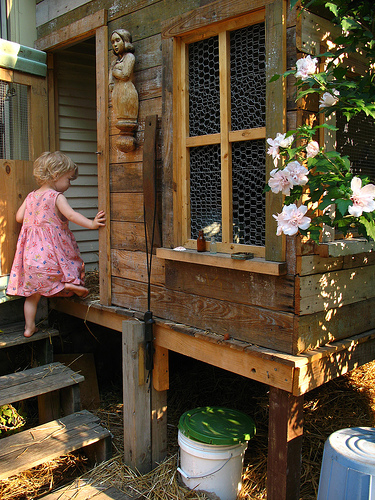

In [ ]:
Image.open(img_path+'/'+cap_keys[1])

In [ ]:
len(images)

4000

In [ ]:
#images

## Image and text Preprocessing

#### 1) Text Preprocessing
##### 2) Text cleaning:- 
#####a) Removing Punctuation ('!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~')                  
#####                      b)  Remove stopwords 
#####                    c) Lemmatize the words

##### 3) Tokenize the words of each captions
##### 4) pad the seqences and create the numpy array

In [ ]:
#preprocess
def clean_text(text):
        text = "".join([word.lower() for word in text if word not in string.punctuation])
        tokens = re.split('\W+', text)
        tokens = [word for word in tokens if word.isalpha() and len(word)>1]
        text = " ".join([lemmer.lemmatize(word) for word in tokens if word not in stopwords])
        return text


In [ ]:
#dict_captions = {}
#for j in cap_keys[:20000]:
#  cap_values = []
#  for i in captions:
 #   if i.split('.jpg')[0]+'.jpg' == j:
 #     cap_values.append(clean_text(i.split('jpg')[1]))
 # dict_captions[j] = cap_values

In [ ]:
#import pickle
#dict_files = open('/content/drive/MyDrive/captioning/dict_captions.pkl', 'wb')
#pickle.dump(dict_captions, dict_files)
#dict_files.close()

In [ ]:
dict_files = open('/content/drive/MyDrive/captioning/dict_captions.pkl','rb')
dict_captions = pickle.load(dict_files)

In [ ]:
dict_captions[cap_keys[6]]

['black dog spotted dog fighting',
 'black dog tricolored dog playing road',
 'black dog white dog brown spot staring street',
 'two dog different breed looking road',
 'two dog pavement moving toward']

In [ ]:
len(dict_captions.keys())

4000

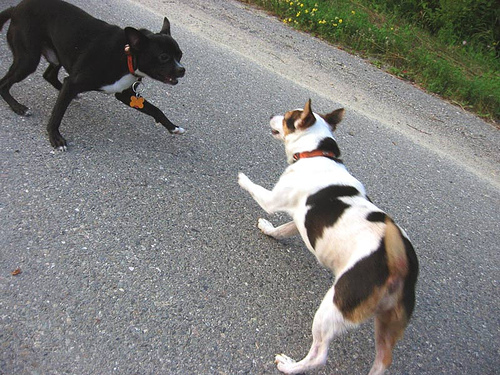

In [ ]:
Image.open(img_path+'/'+cap_keys[6])

In [ ]:
dict_captions_new = {}
for i in dict_captions:
    t = []
    for j in dict_captions[i]:
        text = "Start " + j +" END"
        t.append(text)
    dict_captions_new[i] = t
    
    

In [ ]:
values = []
for i in dict_captions_new:
    values.append(dict_captions_new[i])

In [ ]:
values

[['Start child pink dress climbing set stair entry way END',
  'Start girl going wooden building END',
  'Start little girl climbing wooden playhouse END',
  'Start little girl climbing stair playhouse END',
  'Start little girl pink dress going wooden cabin END'],
 ['Start black dog spotted dog fighting END',
  'Start black dog tricolored dog playing road END',
  'Start black dog white dog brown spot staring street END',
  'Start two dog different breed looking road END',
  'Start two dog pavement moving toward END'],
 ['Start little girl covered paint sits front painted rainbow hand bowl END',
  'Start little girl sitting front large painted rainbow END',
  'Start small girl grass play fingerpaint front white canvas rainbow END',
  'Start girl pigtail sitting front rainbow painting END',
  'Start young girl pigtail painting outside grass END'],
 ['Start man lay bench dog sits END',
  'Start man lay bench white dog also tied END',
  'Start man sleeping bench outside white black dog si

##Tokenizing the caption sequences

In [ ]:
#values = []
#for i in cap_keys[:9100]:
#  for j in dict_captions_new[i]:
#    values.append(j)
values_ = []
for i in values:
    for j in i:
        values_.append(j)

In [ ]:
##Tokenizing the caption sequences
tokenizer = Tokenizer()
tokenizer.fit_on_texts(values_)
vocab = len(tokenizer.word_index)+1

In [ ]:
tokenizer.word_index

{'end': 1,
 'start': 2,
 'dog': 3,
 'man': 4,
 'two': 5,
 'boy': 6,
 'girl': 7,
 'white': 8,
 'black': 9,
 'woman': 10,
 'wearing': 11,
 'water': 12,
 'child': 13,
 'young': 14,
 'brown': 15,
 'red': 16,
 'blue': 17,
 'people': 18,
 'running': 19,
 'shirt': 20,
 'little': 21,
 'playing': 22,
 'grass': 23,
 'ball': 24,
 'standing': 25,
 'jumping': 26,
 'stand': 27,
 'run': 28,
 'small': 29,
 'field': 30,
 'sitting': 31,
 'three': 32,
 'person': 33,
 'front': 34,
 'play': 35,
 'holding': 36,
 'green': 37,
 'jump': 38,
 'walking': 39,
 'large': 40,
 'yellow': 41,
 'one': 42,
 'beach': 43,
 'rock': 44,
 'snow': 45,
 'mouth': 46,
 'near': 47,
 'player': 48,
 'group': 49,
 'another': 50,
 'air': 51,
 'walk': 52,
 'football': 53,
 'street': 54,
 'men': 55,
 'look': 56,
 'hat': 57,
 'riding': 58,
 'orange': 59,
 'pool': 60,
 'outside': 61,
 'looking': 62,
 'toy': 63,
 'bike': 64,
 'jacket': 65,
 'next': 66,
 'camera': 67,
 'sits': 68,
 'ride': 69,
 'pink': 70,
 'mountain': 71,
 'tree': 72,
 'b

In [ ]:
 vocab

5336

In [ ]:
#converting the text to sequences of the captions
dict_cap_tokenized = {}
for i in dict_captions_new:
    #print(dict_captions_new[i])
    dict_cap_tokenized[i] = tokenizer.texts_to_sequences(dict_captions_new[i])

In [ ]:
len(dict_cap_tokenized)

4000

In [ ]:
#padding the sequences
length_list = []
list_ = []
for i in dict_cap_tokenized.values():
  for j in i:
    list_.append(j)

for i in list_:
  length_list.append(len(i))  
max_len = np.array(length_list).max()

In [ ]:
max_len

22

In [ ]:
dict_cap_tokenized

{'1000268201_693b08cb0e.jpg': [[2, 13, 70, 114, 84, 342, 366, 3114, 428, 1],
  [2, 7, 265, 152, 95, 1],
  [2, 21, 7, 84, 152, 1733, 1],
  [2, 21, 7, 84, 366, 1733, 1],
  [2, 21, 7, 70, 114, 265, 152, 1975, 1]],
 '1001773457_577c3a7d70.jpg': [[2, 9, 3, 764, 3, 334, 1],
  [2, 9, 3, 1111, 3, 22, 105, 1],
  [2, 9, 3, 8, 3, 15, 618, 517, 54, 1],
  [2, 5, 3, 730, 1190, 62, 105, 1],
  [2, 5, 3, 518, 731, 276, 1]],
 '1002674143_1b742ab4b8.jpg': [[2,
   21,
   7,
   157,
   576,
   68,
   34,
   475,
   1112,
   80,
   732,
   1],
  [2, 21, 7, 31, 34, 40, 475, 1112, 1],
  [2, 29, 7, 23, 35, 3115, 34, 8, 1734, 1112, 1],
  [2, 7, 1002, 31, 34, 1112, 907, 1],
  [2, 14, 7, 1002, 907, 61, 23, 1]],
 '1003163366_44323f5815.jpg': [[2, 4, 377, 122, 3, 68, 1],
  [2, 4, 377, 122, 8, 3, 1191, 1735, 1],
  [2, 4, 594, 122, 61, 8, 9, 3, 31, 66, 1],
  [2, 346, 4, 577, 102, 122, 3, 1],
  [2, 4, 179, 122, 36, 254, 3, 31, 132, 1]],
 '1007129816_e794419615.jpg': [[2, 4, 59, 57, 1541, 137, 1],
  [2, 4, 206, 59, 57,

In [ ]:
#y_train = []
#for i in dict_cap_tokenized[:500]:
#    y_train.append(pad_sequences(i, maxlen = max_len, padding = 'post'))
    
y_train = {}
for i in dict_cap_tokenized:
    y_train[i] = pad_sequences(dict_cap_tokenized[i], maxlen = 22, padding = 'post')

In [ ]:
y_train_ = {k: y_train[k] for k in list(y_train.keys())[:500]}
y_train_

{'1000268201_693b08cb0e.jpg': array([[   2,   13,   70,  114,   84,  342,  366, 3114,  428,    1,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0],
        [   2,    7,  265,  152,   95,    1,    0,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0],
        [   2,   21,    7,   84,  152, 1733,    1,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0],
        [   2,   21,    7,   84,  366, 1733,    1,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0],
        [   2,   21,    7,   70,  114,  265,  152, 1975,    1,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0]],
       dtype=int32),
 '1001773457_577c3a7d70.jpg': array([[   2,    9,    3,  764,    3,  334,    1,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0],
        [   2,

In [ ]:
len(y_train_)

500

In [ ]:
model=ResNet50(include_top=False, weights='imagenet',pooling='avg',input_shape=(224,224,3))
model.summary()


94773248/94765736 [==============================] - 1s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
__________________________

In [ ]:
train_features={}
c=0
for image_name in y_train:
    path=img_path+"/"+image_name
    img=image.load_img(path,target_size=(224,224))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    features = model.predict(x)
    train_features[image_name]=features.squeeze()

In [ ]:
#with open( "/Users/hritvikgupta/Desktop/train_encoded_images.p", "wb" ) as pickle_f:
 #   pickle.dump(train_features, pickle_f )

file =  open( "/content/drive/MyDrive/captioning/train_encoded_images.p", "rb" )
train_features = pickle.load(file)

In [ ]:
#images_values = []
#for i in images.values():
#    images_values.append(i)

#Normalizing Images or preprocessing images
#images_ = []
#for i in images_values[:100]:
#  im = cv2.cvtColor(i, cv2.COLOR_BGR2RGB)
#  im = cv2.resize(im,(224,224))
#  images_.append(im)
#images_ = images_[:100]
#images_ = np.array(images_)/255.0

In [ ]:
len(train_features_), max_len, len(y_train_)

(500, 22, 500)

In [ ]:
train_features_ = {k: train_features[k] for k in list(train_features.keys())[:500]}
train_features_

{'1000268201_693b08cb0e.jpg': array([0.06535933, 0.16782552, 0.32517606, ..., 0.05107141, 0.3282119 ,
        1.004337  ], dtype=float32),
 '1001773457_577c3a7d70.jpg': array([0.78418   , 0.81896925, 0.06491335, ..., 0.08858443, 0.68538004,
        0.18749593], dtype=float32),
 '1002674143_1b742ab4b8.jpg': array([0.08411197, 0.613811  , 0.20675643, ..., 0.        , 3.0910583 ,
        1.5624396 ], dtype=float32),
 '1003163366_44323f5815.jpg': array([0.1387408 , 0.13371006, 0.21037498, ..., 0.31287566, 0.4386186 ,
        0.5864847 ], dtype=float32),
 '1007129816_e794419615.jpg': array([0.07020079, 0.4670929 , 0.        , ..., 0.01412473, 0.        ,
        0.04985636], dtype=float32),
 '1007320043_627395c3d8.jpg': array([0.52579814, 0.3707962 , 0.        , ..., 0.00266837, 0.29757258,
        0.11049546], dtype=float32),
 '1009434119_febe49276a.jpg': array([0.05470379, 0.0178002 , 0.17593175, ..., 0.10565752, 0.26660177,
        0.2267169 ], dtype=float32),
 '1012212859_01547e3f17.jpg

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, add, Conv2D, Activation, MaxPooling2D, Flatten, Dense, LSTM
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

In [ ]:
input_shape = (2048, )

In [ ]:
ip1=Input(shape=(2048,))
dropout_1=Dropout(0.2)(ip1)
dense_1=Dense(256,activation='relu')(dropout_1)

ip2=Input(shape=(22,))
embedding_1=Embedding(vocab,256, trainable = False)(ip2)
dropout_2=Dropout(0.2)(embedding_1)
lstm_1=LSTM(256)(dropout_2)

add_1=add([dense_1,lstm_1])
dense_2=Dense(256,activation='relu')(add_1)
dense_3=Dense(vocab,activation='softmax')(dense_2)


mode_ = Model(inputs = [ip1, ip2], outputs = dense_3)
mode_.compile(loss="categorical_crossentropy", optimizer="Adam",metrics=['accuracy'])

The following Variables were used a Lambda layer's call (tf.compat.v1.nn.embedding_lookup_3), but
are not present in its tracked objects:
  <tf.Variable 'embedding_6/embeddings:0' shape=(5336, 256) dtype=float32>
It is possible that this is intended behavior, but it is more likely
an omission. This is a strong indication that this layer should be
formulated as a subclassed Layer rather than a Lambda layer.


In [ ]:
mode_.summary()

Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           [(None, 22)]         0                                            
__________________________________________________________________________________________________
tf.cast_3 (TFOpLambda)          (None, 22)           0           input_11[0][0]                   
__________________________________________________________________________________________________
input_10 (InputLayer)           [(None, 2048)]       0                                            
__________________________________________________________________________________________________
tf.compat.v1.nn.embedding_looku (None, 22, 256)      0           tf.cast_3[0][0]                  
____________________________________________________________________________________________

In [ ]:
def data_generator(train_encoded_captions,train_features,num_of_photos = 5):
  X1, X2, Y = list(), list(), list()
  n=0
  for img_id in tqdm(train_encoded_captions):
    n+=1
    for i in range(5):
      for j in range(1,max_len):
        curr_sequence=train_encoded_captions[img_id][i][0:j].tolist()
        next_word=train_encoded_captions[img_id][i][j]
        curr_sequence=pad_sequences([curr_sequence], maxlen=max_len, padding='post')[0]
        one_hot_next_word=tf.keras.utils.to_categorical([next_word],vocab)[0]
        X1.append(train_features[img_id])
        X2.append(curr_sequence)
        Y.append(one_hot_next_word)
    if(n==num_of_photos):
        yield ((np.array(X1), np.array(X2)), np.array(Y))
        X1, X2, Y = list(), list(), list()
        n=0

epochs=200
no_of_photos=5
steps=len(y_train)//no_of_photos
for i in range(epochs):
    generator=data_generator(y_train_,train_features_)
    mode_.fit(generator,epochs=1,steps_per_epoch=steps)










  0%|          | 0/500 [00:00<?, ?it/s]






  1%|          | 5/500 [00:00<00:23, 21.00it/s]

  1/800 [..............................] - ETA: 4:28 - loss: 8.6136 - accuracy: 0.0000e+00








  2%|▏         | 10/500 [00:00<00:17, 27.42it/s]

  2/800 [..............................] - ETA: 1:29 - loss: 8.3093 - accuracy: 0.1543    








  3%|▎         | 15/500 [00:00<00:14, 33.31it/s]

  3/800 [..............................] - ETA: 1:28 - loss: 7.9471 - accuracy: 0.2432








  4%|▍         | 20/500 [00:00<00:12, 37.32it/s]

  4/800 [..............................] - ETA: 1:27 - loss: 7.5722 - accuracy: 0.3032








  5%|▌         | 25/500 [00:00<00:11, 40.12it/s]

  5/800 [..............................] - ETA: 1:28 - loss: 7.2391 - accuracy: 0.3451








  6%|▌         | 30/500 [00:00<00:11, 41.26it/s]

  6/800 [..............................] - ETA: 1:27 - loss: 6.9764 - accuracy: 0.3761








  7%|▋         | 35/500 [00:00<00:10, 43.10it/s]

  7/800 [..............................] - ETA: 1:27 - loss: 6.7787 - accuracy: 0.4006








  8%|▊         | 40/500 [00:01<00:10, 43.09it/s]

  8/800 [..............................] - ETA: 1:27 - loss: 6.6003 - accuracy: 0.4215








  9%|▉         | 45/500 [00:01<00:10, 43.60it/s]

  9/800 [..............................] - ETA: 1:27 - loss: 6.4457 - accuracy: 0.4388








 10%|█         | 50/500 [00:01<00:10, 44.19it/s]

 10/800 [..............................] - ETA: 1:27 - loss: 6.2967 - accuracy: 0.4539








 11%|█         | 55/500 [00:01<00:09, 44.81it/s]

 11/800 [..............................] - ETA: 1:26 - loss: 6.1584 - accuracy: 0.4668








 12%|█▏        | 60/500 [00:01<00:09, 45.72it/s]

 12/800 [..............................] - ETA: 1:26 - loss: 6.0347 - accuracy: 0.4779








 13%|█▎        | 65/500 [00:01<00:09, 46.71it/s]

 13/800 [..............................] - ETA: 1:25 - loss: 5.9229 - accuracy: 0.4876








 14%|█▍        | 70/500 [00:01<00:09, 47.54it/s]

 14/800 [..............................] - ETA: 1:24 - loss: 5.8206 - accuracy: 0.4959








 15%|█▌        | 75/500 [00:01<00:08, 48.05it/s]

 15/800 [..............................] - ETA: 1:24 - loss: 5.7276 - accuracy: 0.5034








 16%|█▌        | 80/500 [00:01<00:08, 47.78it/s]

 16/800 [..............................] - ETA: 1:24 - loss: 5.6427 - accuracy: 0.5101








 17%|█▋        | 85/500 [00:01<00:08, 47.78it/s]

 17/800 [..............................] - ETA: 1:24 - loss: 5.5605 - accuracy: 0.5163








 18%|█▊        | 90/500 [00:02<00:08, 47.61it/s]

 18/800 [..............................] - ETA: 1:23 - loss: 5.4827 - accuracy: 0.5220








 19%|█▉        | 95/500 [00:02<00:08, 47.83it/s]

 19/800 [..............................] - ETA: 1:23 - loss: 5.4094 - accuracy: 0.5273








 20%|██        | 100/500 [00:02<00:08, 48.03it/s]

 20/800 [..............................] - ETA: 1:23 - loss: 5.3404 - accuracy: 0.5321








 21%|██        | 105/500 [00:02<00:08, 48.35it/s]

 21/800 [..............................] - ETA: 1:23 - loss: 5.2753 - accuracy: 0.5366








 22%|██▏       | 110/500 [00:02<00:08, 48.46it/s]

 22/800 [..............................] - ETA: 1:22 - loss: 5.2131 - accuracy: 0.5409








 23%|██▎       | 115/500 [00:02<00:07, 48.61it/s]

 23/800 [..............................] - ETA: 1:22 - loss: 5.1531 - accuracy: 0.5449








 24%|██▍       | 120/500 [00:02<00:07, 48.91it/s]

 24/800 [..............................] - ETA: 1:22 - loss: 5.0991 - accuracy: 0.5485








 25%|██▌       | 125/500 [00:02<00:07, 47.31it/s]

 25/800 [..............................] - ETA: 1:22 - loss: 5.0481 - accuracy: 0.5518








 26%|██▌       | 130/500 [00:02<00:08, 45.22it/s]

 26/800 [..............................] - ETA: 1:23 - loss: 4.9996 - accuracy: 0.5549








 27%|██▋       | 135/500 [00:03<00:08, 43.51it/s]

 27/800 [>.............................] - ETA: 1:23 - loss: 4.9542 - accuracy: 0.5577








 28%|██▊       | 140/500 [00:03<00:08, 42.65it/s]

 28/800 [>.............................] - ETA: 1:23 - loss: 4.9111 - accuracy: 0.5604








 29%|██▉       | 145/500 [00:03<00:08, 42.49it/s]

 29/800 [>.............................] - ETA: 1:24 - loss: 4.8701 - accuracy: 0.5629








 30%|███       | 150/500 [00:03<00:08, 41.59it/s]

 30/800 [>.............................] - ETA: 1:24 - loss: 4.8316 - accuracy: 0.5653








 31%|███       | 155/500 [00:03<00:08, 42.06it/s]

 31/800 [>.............................] - ETA: 1:24 - loss: 4.7953 - accuracy: 0.5675








 32%|███▏      | 160/500 [00:03<00:07, 43.43it/s]

 32/800 [>.............................] - ETA: 1:23 - loss: 4.7604 - accuracy: 0.5696








 33%|███▎      | 165/500 [00:03<00:07, 44.95it/s]

 33/800 [>.............................] - ETA: 1:23 - loss: 4.7269 - accuracy: 0.5716








 34%|███▍      | 170/500 [00:03<00:07, 46.04it/s]

 34/800 [>.............................] - ETA: 1:23 - loss: 4.6947 - accuracy: 0.5735








 35%|███▌      | 175/500 [00:03<00:07, 45.97it/s]

 35/800 [>.............................] - ETA: 1:23 - loss: 4.6639 - accuracy: 0.5753








 36%|███▌      | 180/500 [00:04<00:07, 45.29it/s]

 36/800 [>.............................] - ETA: 1:23 - loss: 4.6341 - accuracy: 0.5770








 37%|███▋      | 185/500 [00:04<00:07, 44.72it/s]

 37/800 [>.............................] - ETA: 1:23 - loss: 4.6052 - accuracy: 0.5787








 38%|███▊      | 190/500 [00:04<00:06, 44.37it/s]

 38/800 [>.............................] - ETA: 1:23 - loss: 4.5774 - accuracy: 0.5803








 39%|███▉      | 195/500 [00:04<00:06, 44.41it/s]

 39/800 [>.............................] - ETA: 1:23 - loss: 4.5506 - accuracy: 0.5818








 40%|████      | 200/500 [00:04<00:06, 44.30it/s]

 40/800 [>.............................] - ETA: 1:23 - loss: 4.5249 - accuracy: 0.5832








 41%|████      | 205/500 [00:04<00:06, 45.14it/s]

 41/800 [>.............................] - ETA: 1:23 - loss: 4.4998 - accuracy: 0.5846








 42%|████▏     | 210/500 [00:04<00:06, 45.32it/s]

 42/800 [>.............................] - ETA: 1:23 - loss: 4.4755 - accuracy: 0.5859








 43%|████▎     | 215/500 [00:04<00:06, 45.30it/s]

 43/800 [>.............................] - ETA: 1:22 - loss: 4.4523 - accuracy: 0.5872








 44%|████▍     | 220/500 [00:04<00:06, 45.25it/s]

 44/800 [>.............................] - ETA: 1:22 - loss: 4.4300 - accuracy: 0.5883








 45%|████▌     | 225/500 [00:05<00:06, 45.32it/s]

 45/800 [>.............................] - ETA: 1:22 - loss: 4.4085 - accuracy: 0.5895








 46%|████▌     | 230/500 [00:05<00:05, 45.69it/s]

 46/800 [>.............................] - ETA: 1:22 - loss: 4.3877 - accuracy: 0.5906








 47%|████▋     | 235/500 [00:05<00:05, 45.64it/s]

 47/800 [>.............................] - ETA: 1:22 - loss: 4.3675 - accuracy: 0.5916








 48%|████▊     | 240/500 [00:05<00:05, 46.24it/s]

 48/800 [>.............................] - ETA: 1:22 - loss: 4.3480 - accuracy: 0.5926








 49%|████▉     | 245/500 [00:05<00:05, 45.92it/s]

 49/800 [>.............................] - ETA: 1:22 - loss: 4.3291 - accuracy: 0.5936








 50%|█████     | 250/500 [00:05<00:05, 45.32it/s]

 50/800 [>.............................] - ETA: 1:22 - loss: 4.3104 - accuracy: 0.5945








 51%|█████     | 255/500 [00:05<00:05, 45.05it/s]

 51/800 [>.............................] - ETA: 1:22 - loss: 4.2923 - accuracy: 0.5955








 52%|█████▏    | 260/500 [00:05<00:05, 45.24it/s]

 52/800 [>.............................] - ETA: 1:21 - loss: 4.2747 - accuracy: 0.5963








 53%|█████▎    | 265/500 [00:05<00:05, 45.67it/s]

 53/800 [>.............................] - ETA: 1:21 - loss: 4.2577 - accuracy: 0.5972








 54%|█████▍    | 270/500 [00:06<00:04, 46.12it/s]

 54/800 [=>............................] - ETA: 1:21 - loss: 4.2412 - accuracy: 0.5980








 55%|█████▌    | 275/500 [00:06<00:04, 45.85it/s]

 55/800 [=>............................] - ETA: 1:21 - loss: 4.2254 - accuracy: 0.5988








 56%|█████▌    | 280/500 [00:06<00:04, 45.92it/s]

 56/800 [=>............................] - ETA: 1:21 - loss: 4.2098 - accuracy: 0.5995








 57%|█████▋    | 285/500 [00:06<00:04, 45.75it/s]

 57/800 [=>............................] - ETA: 1:21 - loss: 4.1947 - accuracy: 0.6002








 58%|█████▊    | 290/500 [00:06<00:04, 45.63it/s]

 58/800 [=>............................] - ETA: 1:21 - loss: 4.1800 - accuracy: 0.6009








 59%|█████▉    | 295/500 [00:06<00:04, 45.68it/s]

 59/800 [=>............................] - ETA: 1:21 - loss: 4.1656 - accuracy: 0.6016








 60%|██████    | 300/500 [00:06<00:04, 45.59it/s]

 60/800 [=>............................] - ETA: 1:21 - loss: 4.1518 - accuracy: 0.6022








 61%|██████    | 305/500 [00:06<00:04, 45.75it/s]

 61/800 [=>............................] - ETA: 1:20 - loss: 4.1383 - accuracy: 0.6029








 62%|██████▏   | 310/500 [00:06<00:04, 45.88it/s]

 62/800 [=>............................] - ETA: 1:20 - loss: 4.1251 - accuracy: 0.6035








 63%|██████▎   | 315/500 [00:07<00:04, 45.73it/s]

 63/800 [=>............................] - ETA: 1:20 - loss: 4.1122 - accuracy: 0.6040








 64%|██████▍   | 320/500 [00:07<00:03, 45.97it/s]

 64/800 [=>............................] - ETA: 1:20 - loss: 4.0997 - accuracy: 0.6046








 65%|██████▌   | 325/500 [00:07<00:03, 45.73it/s]

 65/800 [=>............................] - ETA: 1:20 - loss: 4.0873 - accuracy: 0.6052








 66%|██████▌   | 330/500 [00:07<00:03, 44.14it/s]

 66/800 [=>............................] - ETA: 1:20 - loss: 4.0752 - accuracy: 0.6057








 67%|██████▋   | 335/500 [00:07<00:03, 43.55it/s]

 67/800 [=>............................] - ETA: 1:20 - loss: 4.0634 - accuracy: 0.6062








 68%|██████▊   | 340/500 [00:07<00:03, 43.70it/s]

 68/800 [=>............................] - ETA: 1:20 - loss: 4.0518 - accuracy: 0.6067








 69%|██████▉   | 345/500 [00:07<00:03, 43.68it/s]

 69/800 [=>............................] - ETA: 1:20 - loss: 4.0405 - accuracy: 0.6072








 70%|███████   | 350/500 [00:07<00:03, 43.94it/s]

 70/800 [=>............................] - ETA: 1:20 - loss: 4.0293 - accuracy: 0.6077








 71%|███████   | 355/500 [00:07<00:03, 44.65it/s]

 71/800 [=>............................] - ETA: 1:20 - loss: 4.0183 - accuracy: 0.6082








 72%|███████▏  | 360/500 [00:08<00:03, 45.02it/s]

 72/800 [=>............................] - ETA: 1:20 - loss: 4.0076 - accuracy: 0.6087








 73%|███████▎  | 365/500 [00:08<00:02, 45.33it/s]

 73/800 [=>............................] - ETA: 1:19 - loss: 3.9970 - accuracy: 0.6092








 74%|███████▍  | 370/500 [00:08<00:02, 45.82it/s]

 74/800 [=>............................] - ETA: 1:19 - loss: 3.9867 - accuracy: 0.6096








 75%|███████▌  | 375/500 [00:08<00:02, 46.55it/s]

 75/800 [=>............................] - ETA: 1:19 - loss: 3.9766 - accuracy: 0.6100








 76%|███████▌  | 380/500 [00:08<00:02, 47.06it/s]

 76/800 [=>............................] - ETA: 1:19 - loss: 3.9667 - accuracy: 0.6105








 77%|███████▋  | 385/500 [00:08<00:02, 45.69it/s]

 77/800 [=>............................] - ETA: 1:19 - loss: 3.9570 - accuracy: 0.6109








 78%|███████▊  | 390/500 [00:08<00:02, 44.04it/s]

 78/800 [=>............................] - ETA: 1:19 - loss: 3.9475 - accuracy: 0.6113








 79%|███████▉  | 395/500 [00:08<00:02, 42.83it/s]

 79/800 [=>............................] - ETA: 1:19 - loss: 3.9382 - accuracy: 0.6117








 80%|████████  | 400/500 [00:08<00:02, 43.44it/s]

 80/800 [==>...........................] - ETA: 1:19 - loss: 3.9291 - accuracy: 0.6120








 81%|████████  | 405/500 [00:09<00:02, 44.49it/s]

 81/800 [==>...........................] - ETA: 1:19 - loss: 3.9201 - accuracy: 0.6124








 82%|████████▏ | 410/500 [00:09<00:01, 45.41it/s]

 82/800 [==>...........................] - ETA: 1:19 - loss: 3.9113 - accuracy: 0.6128








 83%|████████▎ | 415/500 [00:09<00:01, 44.80it/s]

 83/800 [==>...........................] - ETA: 1:18 - loss: 3.9026 - accuracy: 0.6131








 84%|████████▍ | 420/500 [00:09<00:01, 45.12it/s]

 84/800 [==>...........................] - ETA: 1:18 - loss: 3.8941 - accuracy: 0.6135








 85%|████████▌ | 425/500 [00:09<00:01, 45.15it/s]

 85/800 [==>...........................] - ETA: 1:18 - loss: 3.8857 - accuracy: 0.6138








 86%|████████▌ | 430/500 [00:09<00:01, 45.32it/s]

 86/800 [==>...........................] - ETA: 1:18 - loss: 3.8775 - accuracy: 0.6142








 87%|████████▋ | 435/500 [00:09<00:01, 46.20it/s]

 87/800 [==>...........................] - ETA: 1:18 - loss: 3.8693 - accuracy: 0.6145








 88%|████████▊ | 440/500 [00:09<00:01, 46.76it/s]

 88/800 [==>...........................] - ETA: 1:18 - loss: 3.8613 - accuracy: 0.6149








 89%|████████▉ | 445/500 [00:09<00:01, 46.30it/s]

 89/800 [==>...........................] - ETA: 1:18 - loss: 3.8535 - accuracy: 0.6152








 90%|█████████ | 450/500 [00:10<00:01, 46.24it/s]

 90/800 [==>...........................] - ETA: 1:18 - loss: 3.8457 - accuracy: 0.6155








 91%|█████████ | 455/500 [00:10<00:00, 46.20it/s]

 91/800 [==>...........................] - ETA: 1:17 - loss: 3.8381 - accuracy: 0.6158








 92%|█████████▏| 460/500 [00:10<00:00, 46.23it/s]

 92/800 [==>...........................] - ETA: 1:17 - loss: 3.8305 - accuracy: 0.6161








 93%|█████████▎| 465/500 [00:10<00:00, 46.29it/s]

 93/800 [==>...........................] - ETA: 1:17 - loss: 3.8230 - accuracy: 0.6164








 94%|█████████▍| 470/500 [00:10<00:00, 46.19it/s]

 94/800 [==>...........................] - ETA: 1:17 - loss: 3.8155 - accuracy: 0.6167








 95%|█████████▌| 475/500 [00:10<00:00, 45.93it/s]

 95/800 [==>...........................] - ETA: 1:17 - loss: 3.8082 - accuracy: 0.6170








 96%|█████████▌| 480/500 [00:10<00:00, 45.97it/s]

 96/800 [==>...........................] - ETA: 1:17 - loss: 3.8009 - accuracy: 0.6173








 97%|█████████▋| 485/500 [00:10<00:00, 46.00it/s]

 97/800 [==>...........................] - ETA: 1:17 - loss: 3.7937 - accuracy: 0.6175








 98%|█████████▊| 490/500 [00:10<00:00, 45.92it/s]

 98/800 [==>...........................] - ETA: 1:17 - loss: 3.7865 - accuracy: 0.6178








 99%|█████████▉| 495/500 [00:11<00:00, 45.84it/s]

 99/800 [==>...........................] - ETA: 1:16 - loss: 3.7795 - accuracy: 0.6181








100%|██████████| 500/500 [00:11<00:00, 44.86it/s]


800/800 [==============================] - 11s 14ms/step - loss: 3.1679 - accuracy: 0.6417









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:28 - loss: 2.2219 - accuracy: 0.6610








  2%|▏         | 10/500 [00:00<00:06, 72.06it/s]

  2/800 [..............................] - ETA: 1:27 - loss: 2.2637 - accuracy: 0.6390








  4%|▎         | 18/500 [00:00<00:06, 70.16it/s]

  4/800 [..............................] - ETA: 1:27 - loss: 2.1837 - accuracy: 0.6505








  5%|▌         | 26/500 [00:00<00:09, 50.96it/s]

  5/800 [..............................] - ETA: 1:26 - loss: 2.1770 - accuracy: 0.6488








  6%|▋         | 32/500 [00:00<00:08, 52.11it/s]

  6/800 [..............................] - ETA: 1:26 - loss: 2.2250 - accuracy: 0.6444








  8%|▊         | 38/500 [00:00<00:08, 52.68it/s]

  7/800 [..............................] - ETA: 1:26 - loss: 2.2523 - accuracy: 0.6452








  9%|▉         | 44/500 [00:00<00:08, 53.49it/s]

  9/800 [..............................] - ETA: 1:25 - loss: 2.2113 - accuracy: 0.6550








 10%|█         | 50/500 [00:01<00:10, 42.26it/s]

 10/800 [..............................] - ETA: 1:25 - loss: 2.1827 - accuracy: 0.6598








 11%|█         | 55/500 [00:01<00:10, 43.04it/s]

 11/800 [..............................] - ETA: 1:25 - loss: 2.1792 - accuracy: 0.6616








 12%|█▏        | 60/500 [00:01<00:10, 43.97it/s]

 12/800 [..............................] - ETA: 1:25 - loss: 2.2036 - accuracy: 0.6602








 13%|█▎        | 65/500 [00:01<00:09, 44.36it/s]

 13/800 [..............................] - ETA: 1:25 - loss: 2.2079 - accuracy: 0.6592








 14%|█▍        | 70/500 [00:01<00:09, 45.03it/s]

 14/800 [..............................] - ETA: 1:25 - loss: 2.2170 - accuracy: 0.6576








 15%|█▌        | 75/500 [00:01<00:09, 45.27it/s]

 15/800 [..............................] - ETA: 1:25 - loss: 2.2223 - accuracy: 0.6584








 16%|█▌        | 80/500 [00:01<00:09, 45.85it/s]

 16/800 [..............................] - ETA: 1:25 - loss: 2.2388 - accuracy: 0.6577








 17%|█▋        | 85/500 [00:01<00:09, 45.57it/s]

 17/800 [..............................] - ETA: 1:25 - loss: 2.2112 - accuracy: 0.6621








 18%|█▊        | 90/500 [00:01<00:08, 45.81it/s]

 18/800 [..............................] - ETA: 1:24 - loss: 2.1886 - accuracy: 0.6640








 19%|█▉        | 95/500 [00:01<00:08, 45.75it/s]

 19/800 [..............................] - ETA: 1:24 - loss: 2.1883 - accuracy: 0.6640








 20%|██        | 100/500 [00:02<00:08, 46.15it/s]

 20/800 [..............................] - ETA: 1:24 - loss: 2.1879 - accuracy: 0.6650








 21%|██        | 105/500 [00:02<00:08, 45.87it/s]

 21/800 [..............................] - ETA: 1:24 - loss: 2.1830 - accuracy: 0.6656








 22%|██▏       | 110/500 [00:02<00:08, 46.07it/s]

 22/800 [..............................] - ETA: 1:24 - loss: 2.1616 - accuracy: 0.6677








 23%|██▎       | 115/500 [00:02<00:08, 46.01it/s]

 23/800 [..............................] - ETA: 1:24 - loss: 2.1318 - accuracy: 0.6707








 24%|██▍       | 120/500 [00:02<00:08, 46.35it/s]

 24/800 [..............................] - ETA: 1:24 - loss: 2.1673 - accuracy: 0.6667








 25%|██▌       | 125/500 [00:02<00:08, 46.29it/s]

 25/800 [..............................] - ETA: 1:24 - loss: 2.1613 - accuracy: 0.6662








 26%|██▌       | 130/500 [00:02<00:08, 45.96it/s]

 26/800 [..............................] - ETA: 1:24 - loss: 2.1600 - accuracy: 0.6663








 27%|██▋       | 135/500 [00:02<00:07, 46.01it/s]

 27/800 [>.............................] - ETA: 1:23 - loss: 2.1688 - accuracy: 0.6654








 28%|██▊       | 140/500 [00:02<00:07, 46.08it/s]

 28/800 [>.............................] - ETA: 1:23 - loss: 2.1743 - accuracy: 0.6650








 29%|██▉       | 145/500 [00:03<00:07, 45.98it/s]

 29/800 [>.............................] - ETA: 1:23 - loss: 2.1751 - accuracy: 0.6657








 30%|███       | 150/500 [00:03<00:07, 45.93it/s]

 30/800 [>.............................] - ETA: 1:23 - loss: 2.1806 - accuracy: 0.6649








 31%|███       | 155/500 [00:03<00:07, 46.01it/s]

 31/800 [>.............................] - ETA: 1:23 - loss: 2.1737 - accuracy: 0.6662








 32%|███▏      | 160/500 [00:03<00:07, 46.08it/s]

 32/800 [>.............................] - ETA: 1:23 - loss: 2.1604 - accuracy: 0.6675








 33%|███▎      | 165/500 [00:03<00:07, 46.05it/s]

 33/800 [>.............................] - ETA: 1:23 - loss: 2.1522 - accuracy: 0.6689








 34%|███▍      | 170/500 [00:03<00:07, 46.18it/s]

 34/800 [>.............................] - ETA: 1:23 - loss: 2.1476 - accuracy: 0.6693








 35%|███▌      | 175/500 [00:03<00:07, 45.95it/s]

 35/800 [>.............................] - ETA: 1:23 - loss: 2.1465 - accuracy: 0.6690








 36%|███▌      | 180/500 [00:03<00:06, 45.99it/s]

 36/800 [>.............................] - ETA: 1:22 - loss: 2.1425 - accuracy: 0.6693








 37%|███▋      | 185/500 [00:03<00:06, 45.93it/s]

 37/800 [>.............................] - ETA: 1:22 - loss: 2.1287 - accuracy: 0.6710








 38%|███▊      | 190/500 [00:04<00:06, 46.07it/s]

 38/800 [>.............................] - ETA: 1:22 - loss: 2.1249 - accuracy: 0.6717








 39%|███▉      | 195/500 [00:04<00:06, 46.16it/s]

 39/800 [>.............................] - ETA: 1:22 - loss: 2.1238 - accuracy: 0.6716








 40%|████      | 200/500 [00:04<00:06, 46.14it/s]

 40/800 [>.............................] - ETA: 1:22 - loss: 2.1228 - accuracy: 0.6712








 41%|████      | 205/500 [00:04<00:06, 46.06it/s]

 41/800 [>.............................] - ETA: 1:22 - loss: 2.1125 - accuracy: 0.6729








 42%|████▏     | 210/500 [00:04<00:06, 46.13it/s]

 42/800 [>.............................] - ETA: 1:22 - loss: 2.1091 - accuracy: 0.6727








 43%|████▎     | 215/500 [00:04<00:06, 46.14it/s]

 43/800 [>.............................] - ETA: 1:22 - loss: 2.1168 - accuracy: 0.6724








 44%|████▍     | 220/500 [00:04<00:06, 46.27it/s]

 44/800 [>.............................] - ETA: 1:22 - loss: 2.1184 - accuracy: 0.6721








 45%|████▌     | 225/500 [00:04<00:05, 46.36it/s]

 45/800 [>.............................] - ETA: 1:21 - loss: 2.1192 - accuracy: 0.6719








 46%|████▌     | 230/500 [00:04<00:05, 46.20it/s]

 46/800 [>.............................] - ETA: 1:21 - loss: 2.1150 - accuracy: 0.6727








 47%|████▋     | 235/500 [00:05<00:05, 45.95it/s]

 47/800 [>.............................] - ETA: 1:21 - loss: 2.1156 - accuracy: 0.6729








 48%|████▊     | 240/500 [00:05<00:05, 45.98it/s]

 48/800 [>.............................] - ETA: 1:21 - loss: 2.1168 - accuracy: 0.6734








 49%|████▉     | 245/500 [00:05<00:05, 44.95it/s]

 49/800 [>.............................] - ETA: 1:21 - loss: 2.1143 - accuracy: 0.6741








 50%|█████     | 250/500 [00:05<00:05, 43.70it/s]

 50/800 [>.............................] - ETA: 1:21 - loss: 2.1027 - accuracy: 0.6755








 51%|█████     | 255/500 [00:05<00:05, 43.49it/s]

 51/800 [>.............................] - ETA: 1:21 - loss: 2.1025 - accuracy: 0.6751








 52%|█████▏    | 260/500 [00:05<00:05, 43.18it/s]

 52/800 [>.............................] - ETA: 1:21 - loss: 2.1021 - accuracy: 0.6755








 53%|█████▎    | 265/500 [00:05<00:05, 43.06it/s]

 53/800 [>.............................] - ETA: 1:21 - loss: 2.1015 - accuracy: 0.6757








 54%|█████▍    | 270/500 [00:05<00:05, 43.64it/s]

 54/800 [=>............................] - ETA: 1:21 - loss: 2.1087 - accuracy: 0.6749








 55%|█████▌    | 275/500 [00:05<00:05, 44.08it/s]

 55/800 [=>............................] - ETA: 1:21 - loss: 2.1108 - accuracy: 0.6750








 56%|█████▌    | 280/500 [00:06<00:04, 44.56it/s]

 56/800 [=>............................] - ETA: 1:21 - loss: 2.1021 - accuracy: 0.6762








 57%|█████▋    | 285/500 [00:06<00:04, 44.98it/s]

 57/800 [=>............................] - ETA: 1:21 - loss: 2.1034 - accuracy: 0.6760








 58%|█████▊    | 290/500 [00:06<00:04, 45.34it/s]

 58/800 [=>............................] - ETA: 1:21 - loss: 2.1030 - accuracy: 0.6760








 59%|█████▉    | 295/500 [00:06<00:04, 46.33it/s]

 59/800 [=>............................] - ETA: 1:21 - loss: 2.1026 - accuracy: 0.6758








 60%|██████    | 300/500 [00:06<00:04, 45.45it/s]

 60/800 [=>............................] - ETA: 1:21 - loss: 2.1066 - accuracy: 0.6753








 61%|██████    | 305/500 [00:06<00:04, 44.07it/s]

 61/800 [=>............................] - ETA: 1:21 - loss: 2.1030 - accuracy: 0.6758








 62%|██████▏   | 310/500 [00:06<00:04, 44.14it/s]

 62/800 [=>............................] - ETA: 1:20 - loss: 2.1021 - accuracy: 0.6759








 63%|██████▎   | 315/500 [00:06<00:04, 45.07it/s]

 63/800 [=>............................] - ETA: 1:20 - loss: 2.1010 - accuracy: 0.6763








 64%|██████▍   | 320/500 [00:06<00:03, 45.45it/s]

 64/800 [=>............................] - ETA: 1:20 - loss: 2.1003 - accuracy: 0.6763








 65%|██████▌   | 325/500 [00:07<00:03, 46.03it/s]

 65/800 [=>............................] - ETA: 1:20 - loss: 2.0934 - accuracy: 0.6772








 66%|██████▌   | 330/500 [00:07<00:03, 45.89it/s]

 66/800 [=>............................] - ETA: 1:20 - loss: 2.0916 - accuracy: 0.6776








 67%|██████▋   | 335/500 [00:07<00:03, 46.30it/s]

 67/800 [=>............................] - ETA: 1:20 - loss: 2.0889 - accuracy: 0.6782








 68%|██████▊   | 340/500 [00:07<00:03, 46.95it/s]

 68/800 [=>............................] - ETA: 1:19 - loss: 2.0888 - accuracy: 0.6783








 69%|██████▉   | 345/500 [00:07<00:03, 47.46it/s]

 69/800 [=>............................] - ETA: 1:19 - loss: 2.0824 - accuracy: 0.6793








 70%|███████   | 350/500 [00:07<00:03, 47.83it/s]

 70/800 [=>............................] - ETA: 1:19 - loss: 2.0769 - accuracy: 0.6799








 71%|███████   | 355/500 [00:07<00:03, 48.02it/s]

 71/800 [=>............................] - ETA: 1:19 - loss: 2.0731 - accuracy: 0.6805








 72%|███████▏  | 360/500 [00:07<00:02, 47.51it/s]

 72/800 [=>............................] - ETA: 1:19 - loss: 2.0719 - accuracy: 0.6806








 73%|███████▎  | 365/500 [00:07<00:02, 47.05it/s]

 73/800 [=>............................] - ETA: 1:19 - loss: 2.0661 - accuracy: 0.6817








 74%|███████▍  | 370/500 [00:07<00:02, 46.47it/s]

 74/800 [=>............................] - ETA: 1:19 - loss: 2.0658 - accuracy: 0.6815








 75%|███████▌  | 375/500 [00:08<00:02, 46.34it/s]

 75/800 [=>............................] - ETA: 1:19 - loss: 2.0652 - accuracy: 0.6816








 76%|███████▌  | 380/500 [00:08<00:02, 46.24it/s]

 76/800 [=>............................] - ETA: 1:18 - loss: 2.0659 - accuracy: 0.6813








 77%|███████▋  | 385/500 [00:08<00:02, 46.42it/s]

 77/800 [=>............................] - ETA: 1:18 - loss: 2.0670 - accuracy: 0.6814








 78%|███████▊  | 390/500 [00:08<00:02, 46.53it/s]

 78/800 [=>............................] - ETA: 1:18 - loss: 2.0642 - accuracy: 0.6821








 79%|███████▉  | 395/500 [00:08<00:02, 46.66it/s]

 79/800 [=>............................] - ETA: 1:18 - loss: 2.0632 - accuracy: 0.6824








 80%|████████  | 400/500 [00:08<00:02, 45.86it/s]

 80/800 [==>...........................] - ETA: 1:18 - loss: 2.0605 - accuracy: 0.6829








 81%|████████  | 405/500 [00:08<00:02, 45.00it/s]

 81/800 [==>...........................] - ETA: 1:18 - loss: 2.0572 - accuracy: 0.6835








 82%|████████▏ | 410/500 [00:08<00:01, 45.84it/s]

 82/800 [==>...........................] - ETA: 1:18 - loss: 2.0586 - accuracy: 0.6833








 83%|████████▎ | 415/500 [00:08<00:01, 46.49it/s]

 83/800 [==>...........................] - ETA: 1:18 - loss: 2.0550 - accuracy: 0.6838








 84%|████████▍ | 420/500 [00:09<00:01, 46.65it/s]

 84/800 [==>...........................] - ETA: 1:18 - loss: 2.0537 - accuracy: 0.6843








 85%|████████▌ | 425/500 [00:09<00:01, 46.77it/s]

 85/800 [==>...........................] - ETA: 1:17 - loss: 2.0507 - accuracy: 0.6847








 86%|████████▌ | 430/500 [00:09<00:01, 47.26it/s]

 86/800 [==>...........................] - ETA: 1:17 - loss: 2.0485 - accuracy: 0.6854








 87%|████████▋ | 435/500 [00:09<00:01, 47.65it/s]

 87/800 [==>...........................] - ETA: 1:17 - loss: 2.0454 - accuracy: 0.6858








 88%|████████▊ | 440/500 [00:09<00:01, 48.04it/s]

 88/800 [==>...........................] - ETA: 1:17 - loss: 2.0462 - accuracy: 0.6857








 89%|████████▉ | 445/500 [00:09<00:01, 48.31it/s]

 89/800 [==>...........................] - ETA: 1:17 - loss: 2.0457 - accuracy: 0.6856








 90%|█████████ | 450/500 [00:09<00:01, 48.44it/s]

 90/800 [==>...........................] - ETA: 1:17 - loss: 2.0456 - accuracy: 0.6856








 91%|█████████ | 455/500 [00:09<00:00, 48.58it/s]

 91/800 [==>...........................] - ETA: 1:16 - loss: 2.0428 - accuracy: 0.6862








 92%|█████████▏| 460/500 [00:09<00:00, 48.58it/s]

 92/800 [==>...........................] - ETA: 1:16 - loss: 2.0387 - accuracy: 0.6868








 93%|█████████▎| 465/500 [00:10<00:00, 48.66it/s]

 93/800 [==>...........................] - ETA: 1:16 - loss: 2.0355 - accuracy: 0.6872








 94%|█████████▍| 470/500 [00:10<00:00, 48.80it/s]

 94/800 [==>...........................] - ETA: 1:16 - loss: 2.0284 - accuracy: 0.6881








 95%|█████████▌| 475/500 [00:10<00:00, 48.80it/s]

 95/800 [==>...........................] - ETA: 1:16 - loss: 2.0291 - accuracy: 0.6880








 96%|█████████▌| 480/500 [00:10<00:00, 48.87it/s]

 96/800 [==>...........................] - ETA: 1:16 - loss: 2.0262 - accuracy: 0.6883








 97%|█████████▋| 485/500 [00:10<00:00, 48.77it/s]

 97/800 [==>...........................] - ETA: 1:15 - loss: 2.0237 - accuracy: 0.6885








 98%|█████████▊| 490/500 [00:10<00:00, 48.90it/s]

 98/800 [==>...........................] - ETA: 1:15 - loss: 2.0222 - accuracy: 0.6889








 99%|█████████▉| 495/500 [00:10<00:00, 48.75it/s]

 99/800 [==>...........................] - ETA: 1:15 - loss: 2.0204 - accuracy: 0.6893








100%|██████████| 500/500 [00:10<00:00, 46.65it/s]


800/800 [==============================] - 11s 13ms/step - loss: 2.0180 - accuracy: 0.6896









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:23 - loss: 1.7642 - accuracy: 0.7086








  2%|▏         | 10/500 [00:00<00:06, 76.74it/s]

  2/800 [..............................] - ETA: 1:21 - loss: 1.7885 - accuracy: 0.6981








  4%|▎         | 18/500 [00:00<00:06, 75.35it/s]

  4/800 [..............................] - ETA: 1:21 - loss: 1.6988 - accuracy: 0.7119








  5%|▌         | 26/500 [00:00<00:08, 54.56it/s]

  5/800 [..............................] - ETA: 1:21 - loss: 1.7000 - accuracy: 0.7093








  6%|▋         | 32/500 [00:00<00:08, 55.46it/s]

  6/800 [..............................] - ETA: 1:21 - loss: 1.7486 - accuracy: 0.7051








  8%|▊         | 38/500 [00:00<00:08, 55.78it/s]

  7/800 [..............................] - ETA: 1:21 - loss: 1.7721 - accuracy: 0.7031








  9%|▉         | 44/500 [00:00<00:08, 55.77it/s]

  9/800 [..............................] - ETA: 1:21 - loss: 1.7320 - accuracy: 0.7111








 10%|█         | 50/500 [00:00<00:10, 44.32it/s]

 10/800 [..............................] - ETA: 1:21 - loss: 1.7068 - accuracy: 0.7162








 11%|█         | 55/500 [00:01<00:09, 45.42it/s]

 11/800 [..............................] - ETA: 1:21 - loss: 1.6997 - accuracy: 0.7181








 12%|█▏        | 60/500 [00:01<00:09, 46.36it/s]

 12/800 [..............................] - ETA: 1:21 - loss: 1.7079 - accuracy: 0.7157








 13%|█▎        | 65/500 [00:01<00:09, 46.95it/s]

 13/800 [..............................] - ETA: 1:20 - loss: 1.7204 - accuracy: 0.7155








 14%|█▍        | 70/500 [00:01<00:09, 47.51it/s]

 14/800 [..............................] - ETA: 1:20 - loss: 1.7342 - accuracy: 0.7132








 15%|█▌        | 75/500 [00:01<00:08, 47.88it/s]

 15/800 [..............................] - ETA: 1:20 - loss: 1.7327 - accuracy: 0.7135








 16%|█▌        | 80/500 [00:01<00:08, 48.13it/s]

 16/800 [..............................] - ETA: 1:20 - loss: 1.7520 - accuracy: 0.7126








 17%|█▋        | 85/500 [00:01<00:08, 48.49it/s]

 17/800 [..............................] - ETA: 1:20 - loss: 1.7251 - accuracy: 0.7166








 18%|█▊        | 90/500 [00:01<00:08, 48.51it/s]

 18/800 [..............................] - ETA: 1:20 - loss: 1.7148 - accuracy: 0.7194








 19%|█▉        | 95/500 [00:01<00:08, 48.56it/s]

 19/800 [..............................] - ETA: 1:20 - loss: 1.7153 - accuracy: 0.7191








 20%|██        | 100/500 [00:01<00:08, 48.72it/s]

 20/800 [..............................] - ETA: 1:20 - loss: 1.7124 - accuracy: 0.7194








 21%|██        | 105/500 [00:02<00:08, 48.58it/s]

 21/800 [..............................] - ETA: 1:20 - loss: 1.7068 - accuracy: 0.7195








 22%|██▏       | 110/500 [00:02<00:08, 48.35it/s]

 22/800 [..............................] - ETA: 1:19 - loss: 1.6920 - accuracy: 0.7214








 23%|██▎       | 115/500 [00:02<00:07, 48.48it/s]

 23/800 [..............................] - ETA: 1:19 - loss: 1.6711 - accuracy: 0.7238








 24%|██▍       | 120/500 [00:02<00:07, 48.61it/s]

 24/800 [..............................] - ETA: 1:19 - loss: 1.7030 - accuracy: 0.7197








 25%|██▌       | 125/500 [00:02<00:07, 48.74it/s]

 25/800 [..............................] - ETA: 1:19 - loss: 1.6974 - accuracy: 0.7198








 26%|██▌       | 130/500 [00:02<00:07, 48.44it/s]

 26/800 [..............................] - ETA: 1:19 - loss: 1.7034 - accuracy: 0.7187








 27%|██▋       | 135/500 [00:02<00:07, 48.42it/s]

 27/800 [>.............................] - ETA: 1:19 - loss: 1.7170 - accuracy: 0.7170








 28%|██▊       | 140/500 [00:02<00:07, 48.55it/s]

 28/800 [>.............................] - ETA: 1:19 - loss: 1.7193 - accuracy: 0.7167








 29%|██▉       | 145/500 [00:02<00:07, 48.46it/s]

 29/800 [>.............................] - ETA: 1:19 - loss: 1.7246 - accuracy: 0.7164








 30%|███       | 150/500 [00:03<00:07, 48.39it/s]

 30/800 [>.............................] - ETA: 1:19 - loss: 1.7338 - accuracy: 0.7145








 31%|███       | 155/500 [00:03<00:07, 48.19it/s]

 31/800 [>.............................] - ETA: 1:19 - loss: 1.7319 - accuracy: 0.7150








 32%|███▏      | 160/500 [00:03<00:07, 48.23it/s]

 32/800 [>.............................] - ETA: 1:19 - loss: 1.7238 - accuracy: 0.7160








 33%|███▎      | 165/500 [00:03<00:06, 48.43it/s]

 33/800 [>.............................] - ETA: 1:18 - loss: 1.7175 - accuracy: 0.7175








 34%|███▍      | 170/500 [00:03<00:06, 48.58it/s]

 34/800 [>.............................] - ETA: 1:18 - loss: 1.7171 - accuracy: 0.7176








 35%|███▌      | 175/500 [00:03<00:06, 48.49it/s]

 35/800 [>.............................] - ETA: 1:18 - loss: 1.7214 - accuracy: 0.7166








 36%|███▌      | 180/500 [00:03<00:06, 48.38it/s]

 36/800 [>.............................] - ETA: 1:18 - loss: 1.7231 - accuracy: 0.7164








 37%|███▋      | 185/500 [00:03<00:06, 48.36it/s]

 37/800 [>.............................] - ETA: 1:18 - loss: 1.7141 - accuracy: 0.7172








 38%|███▊      | 190/500 [00:03<00:06, 48.45it/s]

 38/800 [>.............................] - ETA: 1:18 - loss: 1.7126 - accuracy: 0.7176








 39%|███▉      | 195/500 [00:03<00:06, 48.49it/s]

 39/800 [>.............................] - ETA: 1:18 - loss: 1.7160 - accuracy: 0.7171








 40%|████      | 200/500 [00:04<00:06, 48.65it/s]

 40/800 [>.............................] - ETA: 1:18 - loss: 1.7179 - accuracy: 0.7166








 41%|████      | 205/500 [00:04<00:06, 48.76it/s]

 41/800 [>.............................] - ETA: 1:18 - loss: 1.7114 - accuracy: 0.7179








 42%|████▏     | 210/500 [00:04<00:05, 48.38it/s]

 42/800 [>.............................] - ETA: 1:18 - loss: 1.7105 - accuracy: 0.7177








 43%|████▎     | 215/500 [00:04<00:05, 48.33it/s]

 43/800 [>.............................] - ETA: 1:17 - loss: 1.7183 - accuracy: 0.7171








 44%|████▍     | 220/500 [00:04<00:05, 48.41it/s]

 44/800 [>.............................] - ETA: 1:17 - loss: 1.7216 - accuracy: 0.7164








 45%|████▌     | 225/500 [00:04<00:05, 48.55it/s]

 45/800 [>.............................] - ETA: 1:17 - loss: 1.7264 - accuracy: 0.7156








 46%|████▌     | 230/500 [00:04<00:05, 48.66it/s]

 46/800 [>.............................] - ETA: 1:17 - loss: 1.7246 - accuracy: 0.7158








 47%|████▋     | 235/500 [00:04<00:05, 48.50it/s]

 47/800 [>.............................] - ETA: 1:17 - loss: 1.7273 - accuracy: 0.7156








 48%|████▊     | 240/500 [00:04<00:05, 48.64it/s]

 48/800 [>.............................] - ETA: 1:17 - loss: 1.7313 - accuracy: 0.7155








 49%|████▉     | 245/500 [00:04<00:05, 48.72it/s]

 49/800 [>.............................] - ETA: 1:17 - loss: 1.7321 - accuracy: 0.7155








 50%|█████     | 250/500 [00:05<00:05, 48.61it/s]

 50/800 [>.............................] - ETA: 1:17 - loss: 1.7234 - accuracy: 0.7163








 51%|█████     | 255/500 [00:05<00:05, 48.73it/s]

 51/800 [>.............................] - ETA: 1:17 - loss: 1.7260 - accuracy: 0.7156








 52%|█████▏    | 260/500 [00:05<00:04, 48.46it/s]

 52/800 [>.............................] - ETA: 1:17 - loss: 1.7287 - accuracy: 0.7155








 53%|█████▎    | 265/500 [00:05<00:04, 48.56it/s]

 53/800 [>.............................] - ETA: 1:16 - loss: 1.7298 - accuracy: 0.7157








 54%|█████▍    | 270/500 [00:05<00:04, 48.61it/s]

 54/800 [=>............................] - ETA: 1:16 - loss: 1.7387 - accuracy: 0.7147








 55%|█████▌    | 275/500 [00:05<00:04, 48.69it/s]

 55/800 [=>............................] - ETA: 1:16 - loss: 1.7419 - accuracy: 0.7146








 56%|█████▌    | 280/500 [00:05<00:04, 48.69it/s]

 56/800 [=>............................] - ETA: 1:16 - loss: 1.7357 - accuracy: 0.7153








 57%|█████▋    | 285/500 [00:05<00:04, 48.85it/s]

 57/800 [=>............................] - ETA: 1:16 - loss: 1.7381 - accuracy: 0.7148








 58%|█████▊    | 290/500 [00:05<00:04, 48.87it/s]

 58/800 [=>............................] - ETA: 1:16 - loss: 1.7393 - accuracy: 0.7143








 59%|█████▉    | 295/500 [00:05<00:04, 48.80it/s]

 59/800 [=>............................] - ETA: 1:16 - loss: 1.7413 - accuracy: 0.7140








 60%|██████    | 300/500 [00:06<00:04, 48.97it/s]

 60/800 [=>............................] - ETA: 1:16 - loss: 1.7463 - accuracy: 0.7131








 61%|██████    | 305/500 [00:06<00:03, 48.93it/s]

 61/800 [=>............................] - ETA: 1:16 - loss: 1.7449 - accuracy: 0.7132








 62%|██████▏   | 310/500 [00:06<00:03, 48.83it/s]

 62/800 [=>............................] - ETA: 1:15 - loss: 1.7453 - accuracy: 0.7128








 63%|██████▎   | 315/500 [00:06<00:03, 48.76it/s]

 63/800 [=>............................] - ETA: 1:15 - loss: 1.7466 - accuracy: 0.7127








 64%|██████▍   | 320/500 [00:06<00:03, 48.80it/s]

 64/800 [=>............................] - ETA: 1:15 - loss: 1.7471 - accuracy: 0.7124








 65%|██████▌   | 325/500 [00:06<00:03, 48.78it/s]

 65/800 [=>............................] - ETA: 1:15 - loss: 1.7434 - accuracy: 0.7128








 66%|██████▌   | 330/500 [00:06<00:03, 48.83it/s]

 66/800 [=>............................] - ETA: 1:15 - loss: 1.7435 - accuracy: 0.7128








 67%|██████▋   | 335/500 [00:06<00:03, 48.79it/s]

 67/800 [=>............................] - ETA: 1:15 - loss: 1.7431 - accuracy: 0.7130








 68%|██████▊   | 340/500 [00:06<00:03, 48.79it/s]

 68/800 [=>............................] - ETA: 1:15 - loss: 1.7452 - accuracy: 0.7129








 69%|██████▉   | 345/500 [00:07<00:03, 48.88it/s]

 69/800 [=>............................] - ETA: 1:15 - loss: 1.7413 - accuracy: 0.7134








 70%|███████   | 350/500 [00:07<00:03, 48.81it/s]

 70/800 [=>............................] - ETA: 1:15 - loss: 1.7382 - accuracy: 0.7137








 71%|███████   | 355/500 [00:07<00:02, 48.73it/s]

 71/800 [=>............................] - ETA: 1:14 - loss: 1.7363 - accuracy: 0.7140








 72%|███████▏  | 360/500 [00:07<00:02, 48.76it/s]

 72/800 [=>............................] - ETA: 1:14 - loss: 1.7366 - accuracy: 0.7140








 73%|███████▎  | 365/500 [00:07<00:02, 48.57it/s]

 73/800 [=>............................] - ETA: 1:14 - loss: 1.7329 - accuracy: 0.7148








 74%|███████▍  | 370/500 [00:07<00:02, 48.63it/s]

 74/800 [=>............................] - ETA: 1:14 - loss: 1.7346 - accuracy: 0.7143








 75%|███████▌  | 375/500 [00:07<00:02, 48.66it/s]

 75/800 [=>............................] - ETA: 1:14 - loss: 1.7359 - accuracy: 0.7140








 76%|███████▌  | 380/500 [00:07<00:02, 48.55it/s]

 76/800 [=>............................] - ETA: 1:14 - loss: 1.7381 - accuracy: 0.7133








 77%|███████▋  | 385/500 [00:07<00:02, 48.61it/s]

 77/800 [=>............................] - ETA: 1:14 - loss: 1.7409 - accuracy: 0.7130








 78%|███████▊  | 390/500 [00:07<00:02, 48.66it/s]

 78/800 [=>............................] - ETA: 1:14 - loss: 1.7394 - accuracy: 0.7134








 79%|███████▉  | 395/500 [00:08<00:02, 48.32it/s]

 79/800 [=>............................] - ETA: 1:14 - loss: 1.7401 - accuracy: 0.7132








 80%|████████  | 400/500 [00:08<00:02, 48.34it/s]

 80/800 [==>...........................] - ETA: 1:14 - loss: 1.7392 - accuracy: 0.7133








 81%|████████  | 405/500 [00:08<00:01, 48.41it/s]

 81/800 [==>...........................] - ETA: 1:13 - loss: 1.7381 - accuracy: 0.7136








 82%|████████▏ | 410/500 [00:08<00:01, 48.50it/s]

 82/800 [==>...........................] - ETA: 1:13 - loss: 1.7410 - accuracy: 0.7132








 83%|████████▎ | 415/500 [00:08<00:01, 48.49it/s]

 83/800 [==>...........................] - ETA: 1:13 - loss: 1.7396 - accuracy: 0.7134








 84%|████████▍ | 420/500 [00:08<00:01, 48.22it/s]

 84/800 [==>...........................] - ETA: 1:13 - loss: 1.7402 - accuracy: 0.7136








 85%|████████▌ | 425/500 [00:08<00:01, 48.26it/s]

 85/800 [==>...........................] - ETA: 1:13 - loss: 1.7388 - accuracy: 0.7137








 86%|████████▌ | 430/500 [00:08<00:01, 48.40it/s]

 86/800 [==>...........................] - ETA: 1:13 - loss: 1.7386 - accuracy: 0.7141








 87%|████████▋ | 435/500 [00:08<00:01, 48.52it/s]

 87/800 [==>...........................] - ETA: 1:13 - loss: 1.7375 - accuracy: 0.7142








 88%|████████▊ | 440/500 [00:08<00:01, 48.43it/s]

 88/800 [==>...........................] - ETA: 1:13 - loss: 1.7395 - accuracy: 0.7139








 89%|████████▉ | 445/500 [00:09<00:01, 48.34it/s]

 89/800 [==>...........................] - ETA: 1:13 - loss: 1.7406 - accuracy: 0.7136








 90%|█████████ | 450/500 [00:09<00:01, 48.42it/s]

 90/800 [==>...........................] - ETA: 1:13 - loss: 1.7424 - accuracy: 0.7134








 91%|█████████ | 455/500 [00:09<00:00, 48.65it/s]

 91/800 [==>...........................] - ETA: 1:12 - loss: 1.7409 - accuracy: 0.7137








 92%|█████████▏| 460/500 [00:09<00:00, 48.56it/s]

 92/800 [==>...........................] - ETA: 1:12 - loss: 1.7381 - accuracy: 0.7139








 93%|█████████▎| 465/500 [00:09<00:00, 48.65it/s]

 93/800 [==>...........................] - ETA: 1:12 - loss: 1.7357 - accuracy: 0.7141








 94%|█████████▍| 470/500 [00:09<00:00, 48.81it/s]

 94/800 [==>...........................] - ETA: 1:12 - loss: 1.7304 - accuracy: 0.7148








 95%|█████████▌| 475/500 [00:09<00:00, 48.72it/s]

 95/800 [==>...........................] - ETA: 1:12 - loss: 1.7320 - accuracy: 0.7146








 96%|█████████▌| 480/500 [00:09<00:00, 48.72it/s]

 96/800 [==>...........................] - ETA: 1:12 - loss: 1.7309 - accuracy: 0.7146








 97%|█████████▋| 485/500 [00:09<00:00, 48.76it/s]

 97/800 [==>...........................] - ETA: 1:12 - loss: 1.7297 - accuracy: 0.7146








 98%|█████████▊| 490/500 [00:10<00:00, 48.73it/s]

 98/800 [==>...........................] - ETA: 1:12 - loss: 1.7298 - accuracy: 0.7148








 99%|█████████▉| 495/500 [00:10<00:00, 48.80it/s]

 99/800 [==>...........................] - ETA: 1:12 - loss: 1.7291 - accuracy: 0.7149








100%|██████████| 500/500 [00:10<00:00, 48.96it/s]


800/800 [==============================] - 10s 13ms/step - loss: 1.7281 - accuracy: 0.7151









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:23 - loss: 1.6084 - accuracy: 0.7162








  2%|▏         | 10/500 [00:00<00:06, 75.22it/s]

  2/800 [..............................] - ETA: 1:21 - loss: 1.6419 - accuracy: 0.7067








  4%|▎         | 18/500 [00:00<00:06, 74.58it/s]

  4/800 [..............................] - ETA: 1:21 - loss: 1.5647 - accuracy: 0.7171








  5%|▌         | 26/500 [00:00<00:08, 54.26it/s]

  5/800 [..............................] - ETA: 1:21 - loss: 1.5653 - accuracy: 0.7162








  6%|▋         | 32/500 [00:00<00:08, 55.36it/s]

  6/800 [..............................] - ETA: 1:21 - loss: 1.6065 - accuracy: 0.7117








  8%|▊         | 38/500 [00:00<00:08, 55.52it/s]

  7/800 [..............................] - ETA: 1:21 - loss: 1.6268 - accuracy: 0.7102








  9%|▉         | 44/500 [00:00<00:08, 56.19it/s]

  9/800 [..............................] - ETA: 1:21 - loss: 1.5903 - accuracy: 0.7181








 10%|█         | 50/500 [00:00<00:10, 44.68it/s]

 10/800 [..............................] - ETA: 1:21 - loss: 1.5676 - accuracy: 0.7225








 11%|█         | 55/500 [00:01<00:09, 45.66it/s]

 11/800 [..............................] - ETA: 1:20 - loss: 1.5602 - accuracy: 0.7233








 12%|█▏        | 60/500 [00:01<00:09, 46.47it/s]

 12/800 [..............................] - ETA: 1:20 - loss: 1.5670 - accuracy: 0.7217








 13%|█▎        | 65/500 [00:01<00:09, 47.14it/s]

 13/800 [..............................] - ETA: 1:20 - loss: 1.5791 - accuracy: 0.7204








 14%|█▍        | 70/500 [00:01<00:09, 47.35it/s]

 14/800 [..............................] - ETA: 1:20 - loss: 1.5930 - accuracy: 0.7182








 15%|█▌        | 75/500 [00:01<00:08, 47.70it/s]

 15/800 [..............................] - ETA: 1:20 - loss: 1.5905 - accuracy: 0.7187








 16%|█▌        | 80/500 [00:01<00:08, 48.01it/s]

 16/800 [..............................] - ETA: 1:20 - loss: 1.6069 - accuracy: 0.7176








 17%|█▋        | 85/500 [00:01<00:08, 48.18it/s]

 17/800 [..............................] - ETA: 1:20 - loss: 1.5813 - accuracy: 0.7211








 18%|█▊        | 90/500 [00:01<00:08, 48.37it/s]

 18/800 [..............................] - ETA: 1:20 - loss: 1.5710 - accuracy: 0.7237








 19%|█▉        | 95/500 [00:01<00:08, 48.49it/s]

 19/800 [..............................] - ETA: 1:20 - loss: 1.5704 - accuracy: 0.7236








 20%|██        | 100/500 [00:01<00:08, 48.37it/s]

 20/800 [..............................] - ETA: 1:20 - loss: 1.5678 - accuracy: 0.7240








 21%|██        | 105/500 [00:02<00:08, 48.13it/s]

 21/800 [..............................] - ETA: 1:20 - loss: 1.5637 - accuracy: 0.7246








 22%|██▏       | 110/500 [00:02<00:08, 48.16it/s]

 22/800 [..............................] - ETA: 1:20 - loss: 1.5497 - accuracy: 0.7266








 23%|██▎       | 115/500 [00:02<00:07, 48.28it/s]

 23/800 [..............................] - ETA: 1:20 - loss: 1.5308 - accuracy: 0.7287








 24%|██▍       | 120/500 [00:02<00:07, 48.15it/s]

 24/800 [..............................] - ETA: 1:19 - loss: 1.5637 - accuracy: 0.7244








 25%|██▌       | 125/500 [00:02<00:07, 48.23it/s]

 25/800 [..............................] - ETA: 1:19 - loss: 1.5593 - accuracy: 0.7247








 26%|██▌       | 130/500 [00:02<00:07, 48.36it/s]

 26/800 [..............................] - ETA: 1:19 - loss: 1.5681 - accuracy: 0.7234








 27%|██▋       | 135/500 [00:02<00:07, 48.47it/s]

 27/800 [>.............................] - ETA: 1:19 - loss: 1.5827 - accuracy: 0.7214








 28%|██▊       | 140/500 [00:02<00:07, 48.52it/s]

 28/800 [>.............................] - ETA: 1:19 - loss: 1.5845 - accuracy: 0.7210








 29%|██▉       | 145/500 [00:02<00:07, 48.64it/s]

 29/800 [>.............................] - ETA: 1:19 - loss: 1.5925 - accuracy: 0.7203








 30%|███       | 150/500 [00:03<00:07, 48.35it/s]

 30/800 [>.............................] - ETA: 1:19 - loss: 1.6042 - accuracy: 0.7180








 31%|███       | 155/500 [00:03<00:07, 48.26it/s]

 31/800 [>.............................] - ETA: 1:19 - loss: 1.6019 - accuracy: 0.7183








 32%|███▏      | 160/500 [00:03<00:07, 48.38it/s]

 32/800 [>.............................] - ETA: 1:19 - loss: 1.5949 - accuracy: 0.7191








 33%|███▎      | 165/500 [00:03<00:06, 48.49it/s]

 33/800 [>.............................] - ETA: 1:18 - loss: 1.5900 - accuracy: 0.7202








 34%|███▍      | 170/500 [00:03<00:06, 48.59it/s]

 34/800 [>.............................] - ETA: 1:18 - loss: 1.5893 - accuracy: 0.7201








 35%|███▌      | 175/500 [00:03<00:06, 48.28it/s]

 35/800 [>.............................] - ETA: 1:18 - loss: 1.5934 - accuracy: 0.7196








 36%|███▌      | 180/500 [00:03<00:06, 48.26it/s]

 36/800 [>.............................] - ETA: 1:18 - loss: 1.5951 - accuracy: 0.7194








 37%|███▋      | 185/500 [00:03<00:06, 48.37it/s]

 37/800 [>.............................] - ETA: 1:18 - loss: 1.5883 - accuracy: 0.7206








 38%|███▊      | 190/500 [00:03<00:06, 48.46it/s]

 38/800 [>.............................] - ETA: 1:18 - loss: 1.5875 - accuracy: 0.7208








 39%|███▉      | 195/500 [00:03<00:06, 48.48it/s]

 39/800 [>.............................] - ETA: 1:18 - loss: 1.5882 - accuracy: 0.7204








 40%|████      | 200/500 [00:04<00:06, 48.41it/s]

 40/800 [>.............................] - ETA: 1:18 - loss: 1.5902 - accuracy: 0.7199








 41%|████      | 205/500 [00:04<00:06, 48.42it/s]

 41/800 [>.............................] - ETA: 1:18 - loss: 1.5856 - accuracy: 0.7208








 42%|████▏     | 210/500 [00:04<00:05, 48.59it/s]

 42/800 [>.............................] - ETA: 1:18 - loss: 1.5848 - accuracy: 0.7205








 43%|████▎     | 215/500 [00:04<00:05, 48.70it/s]

 43/800 [>.............................] - ETA: 1:17 - loss: 1.5908 - accuracy: 0.7197








 44%|████▍     | 220/500 [00:04<00:05, 48.68it/s]

 44/800 [>.............................] - ETA: 1:17 - loss: 1.5934 - accuracy: 0.7190








 45%|████▌     | 225/500 [00:04<00:05, 48.73it/s]

 45/800 [>.............................] - ETA: 1:17 - loss: 1.5984 - accuracy: 0.7182








 46%|████▌     | 230/500 [00:04<00:05, 48.45it/s]

 46/800 [>.............................] - ETA: 1:17 - loss: 1.5978 - accuracy: 0.7185








 47%|████▋     | 235/500 [00:04<00:05, 48.30it/s]

 47/800 [>.............................] - ETA: 1:17 - loss: 1.6003 - accuracy: 0.7182








 48%|████▊     | 240/500 [00:04<00:05, 48.44it/s]

 48/800 [>.............................] - ETA: 1:17 - loss: 1.6045 - accuracy: 0.7181








 49%|████▉     | 245/500 [00:04<00:05, 48.49it/s]

 49/800 [>.............................] - ETA: 1:17 - loss: 1.6059 - accuracy: 0.7180








 50%|█████     | 250/500 [00:05<00:05, 48.58it/s]

 50/800 [>.............................] - ETA: 1:17 - loss: 1.5979 - accuracy: 0.7189








 51%|█████     | 255/500 [00:05<00:05, 48.58it/s]

 51/800 [>.............................] - ETA: 1:17 - loss: 1.6017 - accuracy: 0.7181








 52%|█████▏    | 260/500 [00:05<00:04, 48.68it/s]

 52/800 [>.............................] - ETA: 1:17 - loss: 1.6046 - accuracy: 0.7179








 53%|█████▎    | 265/500 [00:05<00:04, 48.69it/s]

 53/800 [>.............................] - ETA: 1:16 - loss: 1.6057 - accuracy: 0.7177








 54%|█████▍    | 270/500 [00:05<00:04, 48.59it/s]

 54/800 [=>............................] - ETA: 1:16 - loss: 1.6137 - accuracy: 0.7166








 55%|█████▌    | 275/500 [00:05<00:04, 48.60it/s]

 55/800 [=>............................] - ETA: 1:16 - loss: 1.6164 - accuracy: 0.7164








 56%|█████▌    | 280/500 [00:05<00:04, 48.66it/s]

 56/800 [=>............................] - ETA: 1:16 - loss: 1.6106 - accuracy: 0.7171








 57%|█████▋    | 285/500 [00:05<00:04, 48.48it/s]

 57/800 [=>............................] - ETA: 1:16 - loss: 1.6122 - accuracy: 0.7168








 58%|█████▊    | 290/500 [00:05<00:04, 48.35it/s]

 58/800 [=>............................] - ETA: 1:16 - loss: 1.6134 - accuracy: 0.7165








 59%|█████▉    | 295/500 [00:06<00:04, 48.37it/s]

 59/800 [=>............................] - ETA: 1:16 - loss: 1.6158 - accuracy: 0.7161








 60%|██████    | 300/500 [00:06<00:04, 48.61it/s]

 60/800 [=>............................] - ETA: 1:16 - loss: 1.6202 - accuracy: 0.7155








 61%|██████    | 305/500 [00:06<00:04, 48.56it/s]

 61/800 [=>............................] - ETA: 1:16 - loss: 1.6189 - accuracy: 0.7156








 62%|██████▏   | 310/500 [00:06<00:03, 48.41it/s]

 62/800 [=>............................] - ETA: 1:16 - loss: 1.6189 - accuracy: 0.7154








 63%|██████▎   | 315/500 [00:06<00:03, 48.39it/s]

 63/800 [=>............................] - ETA: 1:15 - loss: 1.6207 - accuracy: 0.7152








 64%|██████▍   | 320/500 [00:06<00:03, 48.49it/s]

 64/800 [=>............................] - ETA: 1:15 - loss: 1.6215 - accuracy: 0.7150








 65%|██████▌   | 325/500 [00:06<00:03, 48.51it/s]

 65/800 [=>............................] - ETA: 1:15 - loss: 1.6191 - accuracy: 0.7153








 66%|██████▌   | 330/500 [00:06<00:03, 48.71it/s]

 66/800 [=>............................] - ETA: 1:15 - loss: 1.6192 - accuracy: 0.7153








 67%|██████▋   | 335/500 [00:06<00:03, 48.86it/s]

 67/800 [=>............................] - ETA: 1:15 - loss: 1.6186 - accuracy: 0.7155








 68%|██████▊   | 340/500 [00:06<00:03, 48.47it/s]

 68/800 [=>............................] - ETA: 1:15 - loss: 1.6209 - accuracy: 0.7153








 69%|██████▉   | 345/500 [00:07<00:03, 48.44it/s]

 69/800 [=>............................] - ETA: 1:15 - loss: 1.6174 - accuracy: 0.7158








 70%|███████   | 350/500 [00:07<00:03, 48.49it/s]

 70/800 [=>............................] - ETA: 1:15 - loss: 1.6139 - accuracy: 0.7163








 71%|███████   | 355/500 [00:07<00:02, 48.52it/s]

 71/800 [=>............................] - ETA: 1:15 - loss: 1.6119 - accuracy: 0.7167








 72%|███████▏  | 360/500 [00:07<00:02, 48.63it/s]

 72/800 [=>............................] - ETA: 1:15 - loss: 1.6127 - accuracy: 0.7166








 73%|███████▎  | 365/500 [00:07<00:02, 47.83it/s]

 73/800 [=>............................] - ETA: 1:14 - loss: 1.6101 - accuracy: 0.7172








 74%|███████▍  | 370/500 [00:07<00:02, 47.86it/s]

 74/800 [=>............................] - ETA: 1:14 - loss: 1.6125 - accuracy: 0.7167








 75%|███████▌  | 375/500 [00:07<00:02, 48.11it/s]

 75/800 [=>............................] - ETA: 1:14 - loss: 1.6141 - accuracy: 0.7164








 76%|███████▌  | 380/500 [00:07<00:02, 48.24it/s]

 76/800 [=>............................] - ETA: 1:14 - loss: 1.6169 - accuracy: 0.7157








 77%|███████▋  | 385/500 [00:07<00:02, 48.39it/s]

 77/800 [=>............................] - ETA: 1:14 - loss: 1.6200 - accuracy: 0.7154








 78%|███████▊  | 390/500 [00:07<00:02, 48.42it/s]

 78/800 [=>............................] - ETA: 1:14 - loss: 1.6190 - accuracy: 0.7157








 79%|███████▉  | 395/500 [00:08<00:02, 48.40it/s]

 79/800 [=>............................] - ETA: 1:14 - loss: 1.6199 - accuracy: 0.7154








 80%|████████  | 400/500 [00:08<00:02, 48.54it/s]

 80/800 [==>...........................] - ETA: 1:14 - loss: 1.6190 - accuracy: 0.7155








 81%|████████  | 405/500 [00:08<00:01, 48.57it/s]

 81/800 [==>...........................] - ETA: 1:14 - loss: 1.6176 - accuracy: 0.7158








 82%|████████▏ | 410/500 [00:08<00:01, 48.66it/s]

 82/800 [==>...........................] - ETA: 1:14 - loss: 1.6204 - accuracy: 0.7154








 83%|████████▎ | 415/500 [00:08<00:01, 48.72it/s]

 83/800 [==>...........................] - ETA: 1:13 - loss: 1.6193 - accuracy: 0.7156








 84%|████████▍ | 420/500 [00:08<00:01, 48.73it/s]

 84/800 [==>...........................] - ETA: 1:13 - loss: 1.6200 - accuracy: 0.7157








 85%|████████▌ | 425/500 [00:08<00:01, 48.65it/s]

 85/800 [==>...........................] - ETA: 1:13 - loss: 1.6186 - accuracy: 0.7158








 86%|████████▌ | 430/500 [00:08<00:01, 48.61it/s]

 86/800 [==>...........................] - ETA: 1:13 - loss: 1.6188 - accuracy: 0.7162








 87%|████████▋ | 435/500 [00:08<00:01, 48.66it/s]

 87/800 [==>...........................] - ETA: 1:13 - loss: 1.6187 - accuracy: 0.7162








 88%|████████▊ | 440/500 [00:08<00:01, 48.65it/s]

 88/800 [==>...........................] - ETA: 1:13 - loss: 1.6215 - accuracy: 0.7159








 89%|████████▉ | 445/500 [00:09<00:01, 48.50it/s]

 89/800 [==>...........................] - ETA: 1:13 - loss: 1.6233 - accuracy: 0.7155








 90%|█████████ | 450/500 [00:09<00:01, 48.39it/s]

 90/800 [==>...........................] - ETA: 1:13 - loss: 1.6260 - accuracy: 0.7153








 91%|█████████ | 455/500 [00:09<00:00, 48.42it/s]

 91/800 [==>...........................] - ETA: 1:13 - loss: 1.6246 - accuracy: 0.7155








 92%|█████████▏| 460/500 [00:09<00:00, 48.69it/s]

 92/800 [==>...........................] - ETA: 1:12 - loss: 1.6218 - accuracy: 0.7157








 93%|█████████▎| 465/500 [00:09<00:00, 48.49it/s]

 93/800 [==>...........................] - ETA: 1:12 - loss: 1.6196 - accuracy: 0.7159








 94%|█████████▍| 470/500 [00:09<00:00, 48.22it/s]

 94/800 [==>...........................] - ETA: 1:12 - loss: 1.6147 - accuracy: 0.7166








 95%|█████████▌| 475/500 [00:09<00:00, 48.26it/s]

 95/800 [==>...........................] - ETA: 1:12 - loss: 1.6161 - accuracy: 0.7165








 96%|█████████▌| 480/500 [00:09<00:00, 48.44it/s]

 96/800 [==>...........................] - ETA: 1:12 - loss: 1.6146 - accuracy: 0.7166








 97%|█████████▋| 485/500 [00:09<00:00, 48.57it/s]

 97/800 [==>...........................] - ETA: 1:12 - loss: 1.6135 - accuracy: 0.7165








 98%|█████████▊| 490/500 [00:10<00:00, 48.55it/s]

 98/800 [==>...........................] - ETA: 1:12 - loss: 1.6136 - accuracy: 0.7167








 99%|█████████▉| 495/500 [00:10<00:00, 48.33it/s]

 99/800 [==>...........................] - ETA: 1:12 - loss: 1.6131 - accuracy: 0.7167








100%|██████████| 500/500 [00:10<00:00, 48.84it/s]

100/800 [==>...........................] - ETA: 1:12 - loss: 1.6127 - accuracy: 0.7168

800/800 [==============================] - 10s 13ms/step - loss: 1.6127 - accuracy: 0.7168









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:24 - loss: 1.4851 - accuracy: 0.7219








  2%|▏         | 10/500 [00:00<00:06, 76.11it/s]

  2/800 [..............................] - ETA: 1:21 - loss: 1.5286 - accuracy: 0.7067








  4%|▎         | 18/500 [00:00<00:06, 75.27it/s]

  4/800 [..............................] - ETA: 1:22 - loss: 1.4517 - accuracy: 0.7200








  5%|▌         | 26/500 [00:00<00:08, 53.86it/s]

  5/800 [..............................] - ETA: 1:21 - loss: 1.4568 - accuracy: 0.7185








  6%|▋         | 32/500 [00:00<00:08, 54.97it/s]

  6/800 [..............................] - ETA: 1:21 - loss: 1.4899 - accuracy: 0.7149








  8%|▊         | 38/500 [00:00<00:08, 55.58it/s]

  7/800 [..............................] - ETA: 1:22 - loss: 1.5119 - accuracy: 0.7137








  9%|▉         | 44/500 [00:00<00:08, 55.71it/s]

  9/800 [..............................] - ETA: 1:22 - loss: 1.4730 - accuracy: 0.7200








 10%|█         | 50/500 [00:00<00:10, 43.94it/s]

 10/800 [..............................] - ETA: 1:21 - loss: 1.4442 - accuracy: 0.7250








 11%|█         | 55/500 [00:01<00:09, 44.97it/s]

 11/800 [..............................] - ETA: 1:21 - loss: 1.4387 - accuracy: 0.7252








 12%|█▏        | 60/500 [00:01<00:09, 45.96it/s]

 12/800 [..............................] - ETA: 1:21 - loss: 1.4474 - accuracy: 0.7248








 13%|█▎        | 65/500 [00:01<00:09, 46.72it/s]

 13/800 [..............................] - ETA: 1:21 - loss: 1.4617 - accuracy: 0.7235








 14%|█▍        | 70/500 [00:01<00:09, 47.13it/s]

 14/800 [..............................] - ETA: 1:21 - loss: 1.4773 - accuracy: 0.7214








 15%|█▌        | 75/500 [00:01<00:08, 47.34it/s]

 15/800 [..............................] - ETA: 1:21 - loss: 1.4758 - accuracy: 0.7223








 16%|█▌        | 80/500 [00:01<00:08, 47.68it/s]

 16/800 [..............................] - ETA: 1:21 - loss: 1.4935 - accuracy: 0.7213








 17%|█▋        | 85/500 [00:01<00:08, 48.03it/s]

 17/800 [..............................] - ETA: 1:21 - loss: 1.4695 - accuracy: 0.7249








 18%|█▊        | 90/500 [00:01<00:08, 48.12it/s]

 18/800 [..............................] - ETA: 1:20 - loss: 1.4590 - accuracy: 0.7271








 19%|█▉        | 95/500 [00:01<00:08, 48.12it/s]

 19/800 [..............................] - ETA: 1:20 - loss: 1.4593 - accuracy: 0.7265








 20%|██        | 100/500 [00:01<00:08, 48.08it/s]

 20/800 [..............................] - ETA: 1:20 - loss: 1.4563 - accuracy: 0.7269








 21%|██        | 105/500 [00:02<00:08, 48.22it/s]

 21/800 [..............................] - ETA: 1:20 - loss: 1.4530 - accuracy: 0.7272








 22%|██▏       | 110/500 [00:02<00:08, 48.39it/s]

 22/800 [..............................] - ETA: 1:20 - loss: 1.4400 - accuracy: 0.7293








 23%|██▎       | 115/500 [00:02<00:07, 48.29it/s]

 23/800 [..............................] - ETA: 1:20 - loss: 1.4193 - accuracy: 0.7319








 24%|██▍       | 120/500 [00:02<00:07, 48.36it/s]

 24/800 [..............................] - ETA: 1:20 - loss: 1.4479 - accuracy: 0.7275








 25%|██▌       | 125/500 [00:02<00:07, 48.41it/s]

 25/800 [..............................] - ETA: 1:20 - loss: 1.4419 - accuracy: 0.7277








 26%|██▌       | 130/500 [00:02<00:07, 48.52it/s]

 26/800 [..............................] - ETA: 1:20 - loss: 1.4475 - accuracy: 0.7266








 27%|██▋       | 135/500 [00:02<00:07, 48.51it/s]

 27/800 [>.............................] - ETA: 1:19 - loss: 1.4617 - accuracy: 0.7244








 28%|██▊       | 140/500 [00:02<00:07, 48.55it/s]

 28/800 [>.............................] - ETA: 1:19 - loss: 1.4635 - accuracy: 0.7238








 29%|██▉       | 145/500 [00:02<00:07, 48.30it/s]

 29/800 [>.............................] - ETA: 1:19 - loss: 1.4667 - accuracy: 0.7242








 30%|███       | 150/500 [00:03<00:07, 48.19it/s]

 30/800 [>.............................] - ETA: 1:19 - loss: 1.4762 - accuracy: 0.7232








 31%|███       | 155/500 [00:03<00:07, 48.46it/s]

 31/800 [>.............................] - ETA: 1:19 - loss: 1.4743 - accuracy: 0.7232








 32%|███▏      | 160/500 [00:03<00:07, 48.54it/s]

 32/800 [>.............................] - ETA: 1:19 - loss: 1.4685 - accuracy: 0.7238








 33%|███▎      | 165/500 [00:03<00:06, 48.50it/s]

 33/800 [>.............................] - ETA: 1:19 - loss: 1.4638 - accuracy: 0.7247








 34%|███▍      | 170/500 [00:03<00:06, 48.51it/s]

 34/800 [>.............................] - ETA: 1:19 - loss: 1.4640 - accuracy: 0.7245








 35%|███▌      | 175/500 [00:03<00:06, 48.45it/s]

 35/800 [>.............................] - ETA: 1:19 - loss: 1.4712 - accuracy: 0.7235








 36%|███▌      | 180/500 [00:03<00:06, 48.47it/s]

 36/800 [>.............................] - ETA: 1:18 - loss: 1.4745 - accuracy: 0.7233








 37%|███▋      | 185/500 [00:03<00:06, 48.51it/s]

 37/800 [>.............................] - ETA: 1:18 - loss: 1.4659 - accuracy: 0.7247








 38%|███▊      | 190/500 [00:03<00:06, 48.71it/s]

 38/800 [>.............................] - ETA: 1:18 - loss: 1.4632 - accuracy: 0.7247








 39%|███▉      | 195/500 [00:03<00:06, 48.01it/s]

 39/800 [>.............................] - ETA: 1:18 - loss: 1.4639 - accuracy: 0.7244








 40%|████      | 200/500 [00:04<00:06, 47.20it/s]

 40/800 [>.............................] - ETA: 1:18 - loss: 1.4677 - accuracy: 0.7239








 41%|████      | 205/500 [00:04<00:06, 46.53it/s]

 41/800 [>.............................] - ETA: 1:18 - loss: 1.4622 - accuracy: 0.7251








 42%|████▏     | 210/500 [00:04<00:06, 46.54it/s]

 42/800 [>.............................] - ETA: 1:18 - loss: 1.4624 - accuracy: 0.7248








 43%|████▎     | 215/500 [00:04<00:06, 45.41it/s]

 43/800 [>.............................] - ETA: 1:19 - loss: 1.4671 - accuracy: 0.7239








 44%|████▍     | 220/500 [00:04<00:06, 44.96it/s]

 44/800 [>.............................] - ETA: 1:19 - loss: 1.4691 - accuracy: 0.7230








 45%|████▌     | 225/500 [00:04<00:06, 43.71it/s]

 45/800 [>.............................] - ETA: 1:19 - loss: 1.4735 - accuracy: 0.7222








 46%|████▌     | 230/500 [00:04<00:06, 44.36it/s]

 46/800 [>.............................] - ETA: 1:19 - loss: 1.4731 - accuracy: 0.7222








 47%|████▋     | 235/500 [00:04<00:05, 44.71it/s]

 47/800 [>.............................] - ETA: 1:19 - loss: 1.4749 - accuracy: 0.7219








 48%|████▊     | 240/500 [00:04<00:05, 44.27it/s]

 48/800 [>.............................] - ETA: 1:19 - loss: 1.4790 - accuracy: 0.7217








 49%|████▉     | 245/500 [00:05<00:05, 44.22it/s]

 49/800 [>.............................] - ETA: 1:19 - loss: 1.4814 - accuracy: 0.7217








 50%|█████     | 250/500 [00:05<00:05, 44.24it/s]

 50/800 [>.............................] - ETA: 1:19 - loss: 1.4740 - accuracy: 0.7225








 51%|█████     | 255/500 [00:05<00:05, 44.10it/s]

 51/800 [>.............................] - ETA: 1:19 - loss: 1.4775 - accuracy: 0.7216








 52%|█████▏    | 260/500 [00:05<00:05, 44.15it/s]

 52/800 [>.............................] - ETA: 1:19 - loss: 1.4802 - accuracy: 0.7214








 53%|█████▎    | 265/500 [00:05<00:05, 45.08it/s]

 53/800 [>.............................] - ETA: 1:19 - loss: 1.4813 - accuracy: 0.7214








 54%|█████▍    | 270/500 [00:05<00:05, 45.02it/s]

 54/800 [=>............................] - ETA: 1:19 - loss: 1.4883 - accuracy: 0.7203








 55%|█████▌    | 275/500 [00:05<00:04, 45.08it/s]

 55/800 [=>............................] - ETA: 1:19 - loss: 1.4898 - accuracy: 0.7200








 56%|█████▌    | 280/500 [00:05<00:04, 45.24it/s]

 56/800 [=>............................] - ETA: 1:19 - loss: 1.4846 - accuracy: 0.7207








 57%|█████▋    | 285/500 [00:05<00:04, 45.26it/s]

 57/800 [=>............................] - ETA: 1:18 - loss: 1.4863 - accuracy: 0.7203








 58%|█████▊    | 290/500 [00:06<00:04, 45.46it/s]

 58/800 [=>............................] - ETA: 1:18 - loss: 1.4880 - accuracy: 0.7200








 59%|█████▉    | 295/500 [00:06<00:04, 45.34it/s]

 59/800 [=>............................] - ETA: 1:18 - loss: 1.4921 - accuracy: 0.7195








 60%|██████    | 300/500 [00:06<00:04, 45.51it/s]

 60/800 [=>............................] - ETA: 1:18 - loss: 1.4956 - accuracy: 0.7190








 61%|██████    | 305/500 [00:06<00:04, 45.50it/s]

 61/800 [=>............................] - ETA: 1:18 - loss: 1.4950 - accuracy: 0.7192








 62%|██████▏   | 310/500 [00:06<00:04, 45.51it/s]

 62/800 [=>............................] - ETA: 1:18 - loss: 1.4954 - accuracy: 0.7190








 63%|██████▎   | 315/500 [00:06<00:04, 45.59it/s]

 63/800 [=>............................] - ETA: 1:18 - loss: 1.4992 - accuracy: 0.7186








 64%|██████▍   | 320/500 [00:06<00:03, 45.50it/s]

 64/800 [=>............................] - ETA: 1:18 - loss: 1.5008 - accuracy: 0.7181








 65%|██████▌   | 325/500 [00:06<00:03, 45.31it/s]

 65/800 [=>............................] - ETA: 1:18 - loss: 1.4996 - accuracy: 0.7184








 66%|██████▌   | 330/500 [00:06<00:03, 45.19it/s]

 66/800 [=>............................] - ETA: 1:18 - loss: 1.5001 - accuracy: 0.7184








 67%|██████▋   | 335/500 [00:07<00:03, 45.34it/s]

 67/800 [=>............................] - ETA: 1:18 - loss: 1.4996 - accuracy: 0.7186








 68%|██████▊   | 340/500 [00:07<00:03, 45.71it/s]

 68/800 [=>............................] - ETA: 1:18 - loss: 1.5021 - accuracy: 0.7183








 69%|██████▉   | 345/500 [00:07<00:03, 46.20it/s]

 69/800 [=>............................] - ETA: 1:18 - loss: 1.4991 - accuracy: 0.7190








 70%|███████   | 350/500 [00:07<00:03, 45.99it/s]

 70/800 [=>............................] - ETA: 1:18 - loss: 1.4965 - accuracy: 0.7193








 71%|███████   | 355/500 [00:07<00:03, 46.11it/s]

 71/800 [=>............................] - ETA: 1:17 - loss: 1.4941 - accuracy: 0.7196








 72%|███████▏  | 360/500 [00:07<00:03, 46.29it/s]

 72/800 [=>............................] - ETA: 1:17 - loss: 1.4951 - accuracy: 0.7194








 73%|███████▎  | 365/500 [00:07<00:02, 46.41it/s]

 73/800 [=>............................] - ETA: 1:17 - loss: 1.4918 - accuracy: 0.7202








 74%|███████▍  | 370/500 [00:07<00:02, 46.34it/s]

 74/800 [=>............................] - ETA: 1:17 - loss: 1.4944 - accuracy: 0.7197








 75%|███████▌  | 375/500 [00:07<00:02, 46.46it/s]

 75/800 [=>............................] - ETA: 1:17 - loss: 1.4963 - accuracy: 0.7195








 76%|███████▌  | 380/500 [00:08<00:02, 46.83it/s]

 76/800 [=>............................] - ETA: 1:17 - loss: 1.5003 - accuracy: 0.7188








 77%|███████▋  | 385/500 [00:08<00:02, 47.15it/s]

 77/800 [=>............................] - ETA: 1:17 - loss: 1.5030 - accuracy: 0.7184








 78%|███████▊  | 390/500 [00:08<00:02, 47.10it/s]

 78/800 [=>............................] - ETA: 1:17 - loss: 1.5020 - accuracy: 0.7188








 79%|███████▉  | 395/500 [00:08<00:02, 46.92it/s]

 79/800 [=>............................] - ETA: 1:17 - loss: 1.5036 - accuracy: 0.7185








 80%|████████  | 400/500 [00:08<00:02, 44.77it/s]

 80/800 [==>...........................] - ETA: 1:17 - loss: 1.5034 - accuracy: 0.7186








 81%|████████  | 405/500 [00:08<00:02, 43.46it/s]

 81/800 [==>...........................] - ETA: 1:17 - loss: 1.5027 - accuracy: 0.7189








 82%|████████▏ | 410/500 [00:08<00:02, 42.82it/s]

 82/800 [==>...........................] - ETA: 1:17 - loss: 1.5049 - accuracy: 0.7185








 83%|████████▎ | 415/500 [00:08<00:01, 43.18it/s]

 83/800 [==>...........................] - ETA: 1:17 - loss: 1.5034 - accuracy: 0.7187








 84%|████████▍ | 420/500 [00:08<00:01, 44.02it/s]

 84/800 [==>...........................] - ETA: 1:16 - loss: 1.5039 - accuracy: 0.7189








 85%|████████▌ | 425/500 [00:09<00:01, 44.69it/s]

 85/800 [==>...........................] - ETA: 1:16 - loss: 1.5031 - accuracy: 0.7190








 86%|████████▌ | 430/500 [00:09<00:01, 45.08it/s]

 86/800 [==>...........................] - ETA: 1:16 - loss: 1.5029 - accuracy: 0.7194








 87%|████████▋ | 435/500 [00:09<00:01, 45.53it/s]

 87/800 [==>...........................] - ETA: 1:16 - loss: 1.5029 - accuracy: 0.7195








 88%|████████▊ | 440/500 [00:09<00:01, 45.85it/s]

 88/800 [==>...........................] - ETA: 1:16 - loss: 1.5062 - accuracy: 0.7191








 89%|████████▉ | 445/500 [00:09<00:01, 46.57it/s]

 89/800 [==>...........................] - ETA: 1:16 - loss: 1.5089 - accuracy: 0.7187








 90%|█████████ | 450/500 [00:09<00:01, 46.96it/s]

 90/800 [==>...........................] - ETA: 1:16 - loss: 1.5128 - accuracy: 0.7184








 91%|█████████ | 455/500 [00:09<00:00, 47.32it/s]

 91/800 [==>...........................] - ETA: 1:16 - loss: 1.5117 - accuracy: 0.7187








 92%|█████████▏| 460/500 [00:09<00:00, 47.38it/s]

 92/800 [==>...........................] - ETA: 1:15 - loss: 1.5092 - accuracy: 0.7190








 93%|█████████▎| 465/500 [00:09<00:00, 47.68it/s]

 93/800 [==>...........................] - ETA: 1:15 - loss: 1.5070 - accuracy: 0.7192








 94%|█████████▍| 470/500 [00:10<00:00, 47.79it/s]

 94/800 [==>...........................] - ETA: 1:15 - loss: 1.5034 - accuracy: 0.7196








 95%|█████████▌| 475/500 [00:10<00:00, 47.98it/s]

 95/800 [==>...........................] - ETA: 1:15 - loss: 1.5045 - accuracy: 0.7194








 96%|█████████▌| 480/500 [00:10<00:00, 47.65it/s]

 96/800 [==>...........................] - ETA: 1:15 - loss: 1.5032 - accuracy: 0.7193








 97%|█████████▋| 485/500 [00:10<00:00, 47.59it/s]

 97/800 [==>...........................] - ETA: 1:15 - loss: 1.5030 - accuracy: 0.7193








 98%|█████████▊| 490/500 [00:10<00:00, 47.79it/s]

 98/800 [==>...........................] - ETA: 1:15 - loss: 1.5030 - accuracy: 0.7196








 99%|█████████▉| 495/500 [00:10<00:00, 47.88it/s]

 99/800 [==>...........................] - ETA: 1:15 - loss: 1.5036 - accuracy: 0.7196








100%|██████████| 500/500 [00:10<00:00, 47.03it/s]


800/800 [==============================] - 11s 13ms/step - loss: 1.5037 - accuracy: 0.7197









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:24 - loss: 1.4632 - accuracy: 0.7162








  2%|▏         | 10/500 [00:00<00:06, 73.59it/s]

  2/800 [..............................] - ETA: 1:22 - loss: 1.4757 - accuracy: 0.7048








  4%|▎         | 18/500 [00:00<00:06, 73.65it/s]

  4/800 [..............................] - ETA: 1:22 - loss: 1.4034 - accuracy: 0.7186








  5%|▌         | 26/500 [00:00<00:08, 53.40it/s]

  5/800 [..............................] - ETA: 1:22 - loss: 1.4094 - accuracy: 0.7181








  6%|▋         | 32/500 [00:00<00:08, 54.65it/s]

  6/800 [..............................] - ETA: 1:21 - loss: 1.4397 - accuracy: 0.7146








  8%|▊         | 38/500 [00:00<00:08, 55.42it/s]

  7/800 [..............................] - ETA: 1:22 - loss: 1.4603 - accuracy: 0.7162








  9%|▉         | 44/500 [00:00<00:08, 55.46it/s]

  9/800 [..............................] - ETA: 1:23 - loss: 1.4092 - accuracy: 0.7204








 10%|█         | 50/500 [00:00<00:10, 43.09it/s]

 10/800 [..............................] - ETA: 1:23 - loss: 1.3753 - accuracy: 0.7255








 11%|█         | 55/500 [00:01<00:10, 43.74it/s]

 11/800 [..............................] - ETA: 1:23 - loss: 1.3652 - accuracy: 0.7264








 12%|█▏        | 60/500 [00:01<00:09, 44.30it/s]

 12/800 [..............................] - ETA: 1:23 - loss: 1.3654 - accuracy: 0.7265








 13%|█▎        | 65/500 [00:01<00:09, 44.75it/s]

 13/800 [..............................] - ETA: 1:23 - loss: 1.3808 - accuracy: 0.7248








 14%|█▍        | 70/500 [00:01<00:09, 45.06it/s]

 14/800 [..............................] - ETA: 1:23 - loss: 1.3970 - accuracy: 0.7227








 15%|█▌        | 75/500 [00:01<00:09, 45.15it/s]

 15/800 [..............................] - ETA: 1:23 - loss: 1.3940 - accuracy: 0.7227








 16%|█▌        | 80/500 [00:01<00:09, 45.31it/s]

 16/800 [..............................] - ETA: 1:23 - loss: 1.4097 - accuracy: 0.7213








 17%|█▋        | 85/500 [00:01<00:09, 45.62it/s]

 17/800 [..............................] - ETA: 1:23 - loss: 1.3904 - accuracy: 0.7247








 18%|█▊        | 90/500 [00:01<00:08, 46.23it/s]

 18/800 [..............................] - ETA: 1:23 - loss: 1.3827 - accuracy: 0.7263








 19%|█▉        | 95/500 [00:01<00:08, 46.85it/s]

 19/800 [..............................] - ETA: 1:23 - loss: 1.3800 - accuracy: 0.7263








 20%|██        | 100/500 [00:02<00:08, 47.25it/s]

 20/800 [..............................] - ETA: 1:22 - loss: 1.3777 - accuracy: 0.7273








 21%|██        | 105/500 [00:02<00:08, 47.69it/s]

 21/800 [..............................] - ETA: 1:22 - loss: 1.3752 - accuracy: 0.7276








 22%|██▏       | 110/500 [00:02<00:08, 47.79it/s]

 22/800 [..............................] - ETA: 1:22 - loss: 1.3618 - accuracy: 0.7298








 23%|██▎       | 115/500 [00:02<00:08, 47.57it/s]

 23/800 [..............................] - ETA: 1:22 - loss: 1.3462 - accuracy: 0.7317








 24%|██▍       | 120/500 [00:02<00:07, 47.97it/s]

 24/800 [..............................] - ETA: 1:22 - loss: 1.3747 - accuracy: 0.7280








 25%|██▌       | 125/500 [00:02<00:07, 48.09it/s]

 25/800 [..............................] - ETA: 1:21 - loss: 1.3693 - accuracy: 0.7283








 26%|██▌       | 130/500 [00:02<00:07, 48.32it/s]

 26/800 [..............................] - ETA: 1:21 - loss: 1.3748 - accuracy: 0.7271








 27%|██▋       | 135/500 [00:02<00:07, 48.33it/s]

 27/800 [>.............................] - ETA: 1:21 - loss: 1.3871 - accuracy: 0.7250








 28%|██▊       | 140/500 [00:02<00:07, 48.36it/s]

 28/800 [>.............................] - ETA: 1:21 - loss: 1.3913 - accuracy: 0.7249








 29%|██▉       | 145/500 [00:02<00:07, 48.27it/s]

 29/800 [>.............................] - ETA: 1:21 - loss: 1.3931 - accuracy: 0.7247








 30%|███       | 150/500 [00:03<00:07, 48.37it/s]

 30/800 [>.............................] - ETA: 1:21 - loss: 1.4003 - accuracy: 0.7237








 31%|███       | 155/500 [00:03<00:07, 48.62it/s]

 31/800 [>.............................] - ETA: 1:20 - loss: 1.3964 - accuracy: 0.7244








 32%|███▏      | 160/500 [00:03<00:06, 48.73it/s]

 32/800 [>.............................] - ETA: 1:20 - loss: 1.3905 - accuracy: 0.7252








 33%|███▎      | 165/500 [00:03<00:06, 48.63it/s]

 33/800 [>.............................] - ETA: 1:20 - loss: 1.3826 - accuracy: 0.7265








 34%|███▍      | 170/500 [00:03<00:06, 48.61it/s]

 34/800 [>.............................] - ETA: 1:20 - loss: 1.3829 - accuracy: 0.7266








 35%|███▌      | 175/500 [00:03<00:06, 48.66it/s]

 35/800 [>.............................] - ETA: 1:20 - loss: 1.3913 - accuracy: 0.7253








 36%|███▌      | 180/500 [00:03<00:06, 48.73it/s]

 36/800 [>.............................] - ETA: 1:20 - loss: 1.3952 - accuracy: 0.7252








 37%|███▋      | 185/500 [00:03<00:06, 48.77it/s]

 37/800 [>.............................] - ETA: 1:19 - loss: 1.3880 - accuracy: 0.7264








 38%|███▊      | 190/500 [00:03<00:06, 48.96it/s]

 38/800 [>.............................] - ETA: 1:19 - loss: 1.3872 - accuracy: 0.7265








 39%|███▉      | 195/500 [00:04<00:06, 48.86it/s]

 39/800 [>.............................] - ETA: 1:19 - loss: 1.3906 - accuracy: 0.7261








 40%|████      | 200/500 [00:04<00:06, 48.31it/s]

 40/800 [>.............................] - ETA: 1:19 - loss: 1.3950 - accuracy: 0.7256








 41%|████      | 205/500 [00:04<00:06, 48.37it/s]

 41/800 [>.............................] - ETA: 1:19 - loss: 1.3895 - accuracy: 0.7267








 42%|████▏     | 210/500 [00:04<00:06, 48.30it/s]

 42/800 [>.............................] - ETA: 1:19 - loss: 1.3877 - accuracy: 0.7262








 43%|████▎     | 215/500 [00:04<00:05, 48.63it/s]

 43/800 [>.............................] - ETA: 1:19 - loss: 1.3906 - accuracy: 0.7254








 44%|████▍     | 220/500 [00:04<00:05, 48.62it/s]

 44/800 [>.............................] - ETA: 1:18 - loss: 1.3926 - accuracy: 0.7247








 45%|████▌     | 225/500 [00:04<00:05, 48.49it/s]

 45/800 [>.............................] - ETA: 1:18 - loss: 1.3969 - accuracy: 0.7242








 46%|████▌     | 230/500 [00:04<00:05, 48.50it/s]

 46/800 [>.............................] - ETA: 1:18 - loss: 1.3961 - accuracy: 0.7243








 47%|████▋     | 235/500 [00:04<00:05, 48.54it/s]

 47/800 [>.............................] - ETA: 1:18 - loss: 1.3987 - accuracy: 0.7241








 48%|████▊     | 240/500 [00:04<00:05, 48.59it/s]

 48/800 [>.............................] - ETA: 1:18 - loss: 1.4024 - accuracy: 0.7237








 49%|████▉     | 245/500 [00:05<00:05, 48.74it/s]

 49/800 [>.............................] - ETA: 1:18 - loss: 1.4042 - accuracy: 0.7238








 50%|█████     | 250/500 [00:05<00:05, 48.67it/s]

 50/800 [>.............................] - ETA: 1:18 - loss: 1.3966 - accuracy: 0.7249








 51%|█████     | 255/500 [00:05<00:05, 48.74it/s]

 51/800 [>.............................] - ETA: 1:18 - loss: 1.4012 - accuracy: 0.7240








 52%|█████▏    | 260/500 [00:05<00:04, 48.69it/s]

 52/800 [>.............................] - ETA: 1:17 - loss: 1.4049 - accuracy: 0.7237








 53%|█████▎    | 265/500 [00:05<00:04, 48.61it/s]

 53/800 [>.............................] - ETA: 1:17 - loss: 1.4069 - accuracy: 0.7237








 54%|█████▍    | 270/500 [00:05<00:04, 48.75it/s]

 54/800 [=>............................] - ETA: 1:17 - loss: 1.4144 - accuracy: 0.7225








 55%|█████▌    | 275/500 [00:05<00:04, 48.81it/s]

 55/800 [=>............................] - ETA: 1:17 - loss: 1.4156 - accuracy: 0.7225








 56%|█████▌    | 280/500 [00:05<00:04, 48.94it/s]

 56/800 [=>............................] - ETA: 1:17 - loss: 1.4107 - accuracy: 0.7232








 57%|█████▋    | 285/500 [00:05<00:04, 48.73it/s]

 57/800 [=>............................] - ETA: 1:17 - loss: 1.4112 - accuracy: 0.7228








 58%|█████▊    | 290/500 [00:05<00:04, 48.76it/s]

 58/800 [=>............................] - ETA: 1:17 - loss: 1.4119 - accuracy: 0.7227








 59%|█████▉    | 295/500 [00:06<00:04, 48.66it/s]

 59/800 [=>............................] - ETA: 1:17 - loss: 1.4141 - accuracy: 0.7223








 60%|██████    | 300/500 [00:06<00:04, 48.68it/s]

 60/800 [=>............................] - ETA: 1:16 - loss: 1.4155 - accuracy: 0.7219








 61%|██████    | 305/500 [00:06<00:04, 48.71it/s]

 61/800 [=>............................] - ETA: 1:16 - loss: 1.4150 - accuracy: 0.7219








 62%|██████▏   | 310/500 [00:06<00:03, 48.72it/s]

 62/800 [=>............................] - ETA: 1:16 - loss: 1.4149 - accuracy: 0.7217








 63%|██████▎   | 315/500 [00:06<00:03, 48.61it/s]

 63/800 [=>............................] - ETA: 1:16 - loss: 1.4174 - accuracy: 0.7214








 64%|██████▍   | 320/500 [00:06<00:03, 48.59it/s]

 64/800 [=>............................] - ETA: 1:16 - loss: 1.4182 - accuracy: 0.7211








 65%|██████▌   | 325/500 [00:06<00:03, 48.65it/s]

 65/800 [=>............................] - ETA: 1:16 - loss: 1.4170 - accuracy: 0.7213








 66%|██████▌   | 330/500 [00:06<00:03, 48.77it/s]

 66/800 [=>............................] - ETA: 1:16 - loss: 1.4175 - accuracy: 0.7213








 67%|██████▋   | 335/500 [00:06<00:03, 48.64it/s]

 67/800 [=>............................] - ETA: 1:16 - loss: 1.4167 - accuracy: 0.7216








 68%|██████▊   | 340/500 [00:06<00:03, 48.78it/s]

 68/800 [=>............................] - ETA: 1:15 - loss: 1.4194 - accuracy: 0.7216








 69%|██████▉   | 345/500 [00:07<00:03, 48.83it/s]

 69/800 [=>............................] - ETA: 1:15 - loss: 1.4162 - accuracy: 0.7222








 70%|███████   | 350/500 [00:07<00:03, 48.35it/s]

 70/800 [=>............................] - ETA: 1:15 - loss: 1.4141 - accuracy: 0.7225








 71%|███████   | 355/500 [00:07<00:02, 48.42it/s]

 71/800 [=>............................] - ETA: 1:15 - loss: 1.4127 - accuracy: 0.7227








 72%|███████▏  | 360/500 [00:07<00:02, 48.51it/s]

 72/800 [=>............................] - ETA: 1:15 - loss: 1.4136 - accuracy: 0.7225








 73%|███████▎  | 365/500 [00:07<00:02, 48.74it/s]

 73/800 [=>............................] - ETA: 1:15 - loss: 1.4106 - accuracy: 0.7231








 74%|███████▍  | 370/500 [00:07<00:02, 48.33it/s]

 74/800 [=>............................] - ETA: 1:15 - loss: 1.4133 - accuracy: 0.7225








 75%|███████▌  | 375/500 [00:07<00:02, 48.33it/s]

 75/800 [=>............................] - ETA: 1:15 - loss: 1.4156 - accuracy: 0.7222








 76%|███████▌  | 380/500 [00:07<00:02, 48.36it/s]

 76/800 [=>............................] - ETA: 1:15 - loss: 1.4205 - accuracy: 0.7218








 77%|███████▋  | 385/500 [00:07<00:02, 48.54it/s]

 77/800 [=>............................] - ETA: 1:14 - loss: 1.4228 - accuracy: 0.7213








 78%|███████▊  | 390/500 [00:08<00:02, 48.62it/s]

 78/800 [=>............................] - ETA: 1:14 - loss: 1.4221 - accuracy: 0.7216








 79%|███████▉  | 395/500 [00:08<00:02, 48.70it/s]

 79/800 [=>............................] - ETA: 1:14 - loss: 1.4242 - accuracy: 0.7212








 80%|████████  | 400/500 [00:08<00:02, 48.42it/s]

 80/800 [==>...........................] - ETA: 1:14 - loss: 1.4235 - accuracy: 0.7213








 81%|████████  | 405/500 [00:08<00:01, 48.67it/s]

 81/800 [==>...........................] - ETA: 1:14 - loss: 1.4229 - accuracy: 0.7216








 82%|████████▏ | 410/500 [00:08<00:01, 48.55it/s]

 82/800 [==>...........................] - ETA: 1:14 - loss: 1.4248 - accuracy: 0.7213








 83%|████████▎ | 415/500 [00:08<00:01, 48.71it/s]

 83/800 [==>...........................] - ETA: 1:14 - loss: 1.4229 - accuracy: 0.7216








 84%|████████▍ | 420/500 [00:08<00:01, 48.63it/s]

 84/800 [==>...........................] - ETA: 1:14 - loss: 1.4226 - accuracy: 0.7217








 85%|████████▌ | 425/500 [00:08<00:01, 48.70it/s]

 85/800 [==>...........................] - ETA: 1:14 - loss: 1.4219 - accuracy: 0.7219








 86%|████████▌ | 430/500 [00:08<00:01, 48.66it/s]

 86/800 [==>...........................] - ETA: 1:14 - loss: 1.4218 - accuracy: 0.7223








 87%|████████▋ | 435/500 [00:08<00:01, 48.50it/s]

 87/800 [==>...........................] - ETA: 1:13 - loss: 1.4212 - accuracy: 0.7224








 88%|████████▊ | 440/500 [00:09<00:01, 48.57it/s]

 88/800 [==>...........................] - ETA: 1:13 - loss: 1.4231 - accuracy: 0.7221








 89%|████████▉ | 445/500 [00:09<00:01, 48.62it/s]

 89/800 [==>...........................] - ETA: 1:13 - loss: 1.4256 - accuracy: 0.7216








 90%|█████████ | 450/500 [00:09<00:01, 48.59it/s]

 90/800 [==>...........................] - ETA: 1:13 - loss: 1.4290 - accuracy: 0.7212








 91%|█████████ | 455/500 [00:09<00:00, 48.67it/s]

 91/800 [==>...........................] - ETA: 1:13 - loss: 1.4274 - accuracy: 0.7214








 92%|█████████▏| 460/500 [00:09<00:00, 48.52it/s]

 92/800 [==>...........................] - ETA: 1:13 - loss: 1.4252 - accuracy: 0.7217








 93%|█████████▎| 465/500 [00:09<00:00, 48.46it/s]

 93/800 [==>...........................] - ETA: 1:13 - loss: 1.4231 - accuracy: 0.7219








 94%|█████████▍| 470/500 [00:09<00:00, 48.62it/s]

 94/800 [==>...........................] - ETA: 1:13 - loss: 1.4194 - accuracy: 0.7226








 95%|█████████▌| 475/500 [00:09<00:00, 48.67it/s]

 95/800 [==>...........................] - ETA: 1:13 - loss: 1.4200 - accuracy: 0.7224








 96%|█████████▌| 480/500 [00:09<00:00, 48.69it/s]

 96/800 [==>...........................] - ETA: 1:12 - loss: 1.4187 - accuracy: 0.7224








 97%|█████████▋| 485/500 [00:09<00:00, 48.67it/s]

 97/800 [==>...........................] - ETA: 1:12 - loss: 1.4182 - accuracy: 0.7223








 98%|█████████▊| 490/500 [00:10<00:00, 48.28it/s]

 98/800 [==>...........................] - ETA: 1:12 - loss: 1.4176 - accuracy: 0.7225








 99%|█████████▉| 495/500 [00:10<00:00, 48.19it/s]

 99/800 [==>...........................] - ETA: 1:12 - loss: 1.4186 - accuracy: 0.7225








100%|██████████| 500/500 [00:10<00:00, 48.60it/s]

100/800 [==>...........................] - ETA: 1:12 - loss: 1.4198 - accuracy: 0.7223

800/800 [==============================] - 10s 13ms/step - loss: 1.4198 - accuracy: 0.7223









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:23 - loss: 1.4000 - accuracy: 0.7200








  2%|▏         | 10/500 [00:00<00:06, 75.86it/s]

  2/800 [..............................] - ETA: 1:21 - loss: 1.4070 - accuracy: 0.7086








  4%|▎         | 18/500 [00:00<00:06, 75.14it/s]

  4/800 [..............................] - ETA: 1:21 - loss: 1.3718 - accuracy: 0.7205








  5%|▌         | 26/500 [00:00<00:08, 54.14it/s]

  5/800 [..............................] - ETA: 1:21 - loss: 1.3680 - accuracy: 0.7208








  6%|▋         | 32/500 [00:00<00:08, 55.39it/s]

  6/800 [..............................] - ETA: 1:21 - loss: 1.4106 - accuracy: 0.7152








  8%|▊         | 38/500 [00:00<00:08, 56.16it/s]

  7/800 [..............................] - ETA: 1:21 - loss: 1.4407 - accuracy: 0.7135








  9%|▉         | 44/500 [00:00<00:08, 55.89it/s]

  9/800 [..............................] - ETA: 1:21 - loss: 1.3880 - accuracy: 0.7215








 10%|█         | 50/500 [00:00<00:10, 44.27it/s]

 10/800 [..............................] - ETA: 1:21 - loss: 1.3527 - accuracy: 0.7259








 11%|█         | 55/500 [00:01<00:09, 45.37it/s]

 11/800 [..............................] - ETA: 1:21 - loss: 1.3373 - accuracy: 0.7264








 12%|█▏        | 60/500 [00:01<00:09, 45.55it/s]

 12/800 [..............................] - ETA: 1:21 - loss: 1.3329 - accuracy: 0.7267








 13%|█▎        | 65/500 [00:01<00:09, 46.41it/s]

 13/800 [..............................] - ETA: 1:21 - loss: 1.3418 - accuracy: 0.7251








 14%|█▍        | 70/500 [00:01<00:09, 47.32it/s]

 14/800 [..............................] - ETA: 1:21 - loss: 1.3505 - accuracy: 0.7238








 15%|█▌        | 75/500 [00:01<00:09, 46.64it/s]

 15/800 [..............................] - ETA: 1:21 - loss: 1.3487 - accuracy: 0.7238








 16%|█▌        | 80/500 [00:01<00:08, 46.94it/s]

 16/800 [..............................] - ETA: 1:21 - loss: 1.3595 - accuracy: 0.7231








 17%|█▋        | 85/500 [00:01<00:08, 47.39it/s]

 17/800 [..............................] - ETA: 1:21 - loss: 1.3381 - accuracy: 0.7268








 18%|█▊        | 90/500 [00:01<00:08, 47.61it/s]

 18/800 [..............................] - ETA: 1:21 - loss: 1.3237 - accuracy: 0.7292








 19%|█▉        | 95/500 [00:01<00:08, 47.82it/s]

 19/800 [..............................] - ETA: 1:21 - loss: 1.3184 - accuracy: 0.7301








 20%|██        | 100/500 [00:02<00:08, 47.89it/s]

 20/800 [..............................] - ETA: 1:21 - loss: 1.3144 - accuracy: 0.7308








 21%|██        | 105/500 [00:02<00:08, 47.77it/s]

 21/800 [..............................] - ETA: 1:20 - loss: 1.3130 - accuracy: 0.7310








 22%|██▏       | 110/500 [00:02<00:08, 48.00it/s]

 22/800 [..............................] - ETA: 1:20 - loss: 1.3018 - accuracy: 0.7331








 23%|██▎       | 115/500 [00:02<00:08, 48.07it/s]

 23/800 [..............................] - ETA: 1:20 - loss: 1.2884 - accuracy: 0.7353








 24%|██▍       | 120/500 [00:02<00:07, 48.32it/s]

 24/800 [..............................] - ETA: 1:20 - loss: 1.3222 - accuracy: 0.7312








 25%|██▌       | 125/500 [00:02<00:07, 48.35it/s]

 25/800 [..............................] - ETA: 1:20 - loss: 1.3205 - accuracy: 0.7316








 26%|██▌       | 130/500 [00:02<00:07, 48.66it/s]

 26/800 [..............................] - ETA: 1:20 - loss: 1.3291 - accuracy: 0.7300








 27%|██▋       | 135/500 [00:02<00:07, 48.87it/s]

 27/800 [>.............................] - ETA: 1:19 - loss: 1.3426 - accuracy: 0.7282








 28%|██▊       | 140/500 [00:02<00:07, 49.07it/s]

 28/800 [>.............................] - ETA: 1:19 - loss: 1.3457 - accuracy: 0.7280








 29%|██▉       | 145/500 [00:02<00:07, 49.29it/s]

 29/800 [>.............................] - ETA: 1:19 - loss: 1.3492 - accuracy: 0.7272








 30%|███       | 150/500 [00:03<00:07, 49.42it/s]

 30/800 [>.............................] - ETA: 1:19 - loss: 1.3566 - accuracy: 0.7258








 31%|███       | 155/500 [00:03<00:06, 49.56it/s]

 31/800 [>.............................] - ETA: 1:19 - loss: 1.3533 - accuracy: 0.7263








 32%|███▏      | 160/500 [00:03<00:06, 49.54it/s]

 32/800 [>.............................] - ETA: 1:19 - loss: 1.3473 - accuracy: 0.7268








 33%|███▎      | 165/500 [00:03<00:06, 49.54it/s]

 33/800 [>.............................] - ETA: 1:19 - loss: 1.3391 - accuracy: 0.7280








 34%|███▍      | 170/500 [00:03<00:06, 48.90it/s]

 34/800 [>.............................] - ETA: 1:19 - loss: 1.3392 - accuracy: 0.7281








 35%|███▌      | 175/500 [00:03<00:06, 48.33it/s]

 35/800 [>.............................] - ETA: 1:18 - loss: 1.3476 - accuracy: 0.7269








 36%|███▌      | 180/500 [00:03<00:06, 48.30it/s]

 36/800 [>.............................] - ETA: 1:18 - loss: 1.3498 - accuracy: 0.7268








 37%|███▋      | 185/500 [00:03<00:06, 48.30it/s]

 37/800 [>.............................] - ETA: 1:18 - loss: 1.3432 - accuracy: 0.7278








 38%|███▊      | 190/500 [00:03<00:06, 48.31it/s]

 38/800 [>.............................] - ETA: 1:18 - loss: 1.3416 - accuracy: 0.7281








 39%|███▉      | 195/500 [00:03<00:06, 48.34it/s]

 39/800 [>.............................] - ETA: 1:18 - loss: 1.3439 - accuracy: 0.7276








 40%|████      | 200/500 [00:04<00:06, 48.23it/s]

 40/800 [>.............................] - ETA: 1:18 - loss: 1.3471 - accuracy: 0.7271








 41%|████      | 205/500 [00:04<00:06, 48.28it/s]

 41/800 [>.............................] - ETA: 1:18 - loss: 1.3409 - accuracy: 0.7282








 42%|████▏     | 210/500 [00:04<00:05, 48.43it/s]

 42/800 [>.............................] - ETA: 1:18 - loss: 1.3381 - accuracy: 0.7278








 43%|████▎     | 215/500 [00:04<00:05, 48.56it/s]

 43/800 [>.............................] - ETA: 1:18 - loss: 1.3416 - accuracy: 0.7268








 44%|████▍     | 220/500 [00:04<00:05, 48.68it/s]

 44/800 [>.............................] - ETA: 1:18 - loss: 1.3435 - accuracy: 0.7260








 45%|████▌     | 225/500 [00:04<00:05, 48.53it/s]

 45/800 [>.............................] - ETA: 1:17 - loss: 1.3462 - accuracy: 0.7256








 46%|████▌     | 230/500 [00:04<00:05, 48.63it/s]

 46/800 [>.............................] - ETA: 1:17 - loss: 1.3445 - accuracy: 0.7258








 47%|████▋     | 235/500 [00:04<00:05, 48.52it/s]

 47/800 [>.............................] - ETA: 1:17 - loss: 1.3459 - accuracy: 0.7256








 48%|████▊     | 240/500 [00:04<00:05, 48.56it/s]

 48/800 [>.............................] - ETA: 1:17 - loss: 1.3485 - accuracy: 0.7251








 49%|████▉     | 245/500 [00:04<00:05, 48.69it/s]

 49/800 [>.............................] - ETA: 1:17 - loss: 1.3485 - accuracy: 0.7254








 50%|█████     | 250/500 [00:05<00:05, 48.53it/s]

 50/800 [>.............................] - ETA: 1:17 - loss: 1.3407 - accuracy: 0.7267








 51%|█████     | 255/500 [00:05<00:05, 48.32it/s]

 51/800 [>.............................] - ETA: 1:17 - loss: 1.3445 - accuracy: 0.7258








 52%|█████▏    | 260/500 [00:05<00:04, 48.39it/s]

 52/800 [>.............................] - ETA: 1:17 - loss: 1.3476 - accuracy: 0.7255








 53%|█████▎    | 265/500 [00:05<00:04, 48.32it/s]

 53/800 [>.............................] - ETA: 1:17 - loss: 1.3493 - accuracy: 0.7257








 54%|█████▍    | 270/500 [00:05<00:04, 48.44it/s]

 54/800 [=>............................] - ETA: 1:16 - loss: 1.3554 - accuracy: 0.7243








 55%|█████▌    | 275/500 [00:05<00:04, 48.37it/s]

 55/800 [=>............................] - ETA: 1:16 - loss: 1.3579 - accuracy: 0.7238








 56%|█████▌    | 280/500 [00:05<00:04, 48.21it/s]

 56/800 [=>............................] - ETA: 1:16 - loss: 1.3559 - accuracy: 0.7245








 57%|█████▋    | 285/500 [00:05<00:04, 48.17it/s]

 57/800 [=>............................] - ETA: 1:16 - loss: 1.3565 - accuracy: 0.7243








 58%|█████▊    | 290/500 [00:05<00:04, 48.16it/s]

 58/800 [=>............................] - ETA: 1:16 - loss: 1.3576 - accuracy: 0.7243








 59%|█████▉    | 295/500 [00:06<00:04, 48.13it/s]

 59/800 [=>............................] - ETA: 1:16 - loss: 1.3618 - accuracy: 0.7238








 60%|██████    | 300/500 [00:06<00:04, 47.80it/s]

 60/800 [=>............................] - ETA: 1:16 - loss: 1.3626 - accuracy: 0.7233








 61%|██████    | 305/500 [00:06<00:04, 47.89it/s]

 61/800 [=>............................] - ETA: 1:16 - loss: 1.3620 - accuracy: 0.7234








 62%|██████▏   | 310/500 [00:06<00:03, 48.14it/s]

 62/800 [=>............................] - ETA: 1:16 - loss: 1.3620 - accuracy: 0.7231








 63%|██████▎   | 315/500 [00:06<00:03, 48.21it/s]

 63/800 [=>............................] - ETA: 1:16 - loss: 1.3639 - accuracy: 0.7229








 64%|██████▍   | 320/500 [00:06<00:03, 48.11it/s]

 64/800 [=>............................] - ETA: 1:16 - loss: 1.3642 - accuracy: 0.7226








 65%|██████▌   | 325/500 [00:06<00:03, 48.34it/s]

 65/800 [=>............................] - ETA: 1:15 - loss: 1.3639 - accuracy: 0.7228








 66%|██████▌   | 330/500 [00:06<00:03, 48.34it/s]

 66/800 [=>............................] - ETA: 1:15 - loss: 1.3640 - accuracy: 0.7226








 67%|██████▋   | 335/500 [00:06<00:03, 48.43it/s]

 67/800 [=>............................] - ETA: 1:15 - loss: 1.3626 - accuracy: 0.7230








 68%|██████▊   | 340/500 [00:06<00:03, 48.52it/s]

 68/800 [=>............................] - ETA: 1:15 - loss: 1.3642 - accuracy: 0.7229








 69%|██████▉   | 345/500 [00:07<00:03, 48.55it/s]

 69/800 [=>............................] - ETA: 1:15 - loss: 1.3605 - accuracy: 0.7233








 70%|███████   | 350/500 [00:07<00:03, 48.53it/s]

 70/800 [=>............................] - ETA: 1:15 - loss: 1.3583 - accuracy: 0.7238








 71%|███████   | 355/500 [00:07<00:02, 48.55it/s]

 71/800 [=>............................] - ETA: 1:15 - loss: 1.3562 - accuracy: 0.7241








 72%|███████▏  | 360/500 [00:07<00:02, 48.57it/s]

 72/800 [=>............................] - ETA: 1:15 - loss: 1.3570 - accuracy: 0.7239








 73%|███████▎  | 365/500 [00:07<00:02, 48.58it/s]

 73/800 [=>............................] - ETA: 1:15 - loss: 1.3530 - accuracy: 0.7247








 74%|███████▍  | 370/500 [00:07<00:02, 48.67it/s]

 74/800 [=>............................] - ETA: 1:14 - loss: 1.3554 - accuracy: 0.7241








 75%|███████▌  | 375/500 [00:07<00:02, 48.55it/s]

 75/800 [=>............................] - ETA: 1:14 - loss: 1.3573 - accuracy: 0.7237








 76%|███████▌  | 380/500 [00:07<00:02, 48.50it/s]

 76/800 [=>............................] - ETA: 1:14 - loss: 1.3615 - accuracy: 0.7231








 77%|███████▋  | 385/500 [00:07<00:02, 48.55it/s]

 77/800 [=>............................] - ETA: 1:14 - loss: 1.3630 - accuracy: 0.7227








 78%|███████▊  | 390/500 [00:07<00:02, 48.54it/s]

 78/800 [=>............................] - ETA: 1:14 - loss: 1.3612 - accuracy: 0.7231








 79%|███████▉  | 395/500 [00:08<00:02, 48.73it/s]

 79/800 [=>............................] - ETA: 1:14 - loss: 1.3629 - accuracy: 0.7231








 80%|████████  | 400/500 [00:08<00:02, 48.78it/s]

 80/800 [==>...........................] - ETA: 1:14 - loss: 1.3624 - accuracy: 0.7232








 81%|████████  | 405/500 [00:08<00:01, 48.74it/s]

 81/800 [==>...........................] - ETA: 1:14 - loss: 1.3616 - accuracy: 0.7235








 82%|████████▏ | 410/500 [00:08<00:01, 47.89it/s]

 82/800 [==>...........................] - ETA: 1:14 - loss: 1.3644 - accuracy: 0.7232








 83%|████████▎ | 415/500 [00:08<00:01, 48.09it/s]

 83/800 [==>...........................] - ETA: 1:14 - loss: 1.3623 - accuracy: 0.7235








 84%|████████▍ | 420/500 [00:08<00:01, 48.19it/s]

 84/800 [==>...........................] - ETA: 1:13 - loss: 1.3619 - accuracy: 0.7237








 85%|████████▌ | 425/500 [00:08<00:01, 47.87it/s]

 85/800 [==>...........................] - ETA: 1:13 - loss: 1.3617 - accuracy: 0.7236








 86%|████████▌ | 430/500 [00:08<00:01, 46.79it/s]

 86/800 [==>...........................] - ETA: 1:13 - loss: 1.3623 - accuracy: 0.7240








 87%|████████▋ | 435/500 [00:08<00:01, 46.40it/s]

 87/800 [==>...........................] - ETA: 1:13 - loss: 1.3626 - accuracy: 0.7239








 88%|████████▊ | 440/500 [00:09<00:01, 45.89it/s]

 88/800 [==>...........................] - ETA: 1:13 - loss: 1.3653 - accuracy: 0.7235








 89%|████████▉ | 445/500 [00:09<00:01, 45.75it/s]

 89/800 [==>...........................] - ETA: 1:13 - loss: 1.3672 - accuracy: 0.7231








 90%|█████████ | 450/500 [00:09<00:01, 45.53it/s]

 90/800 [==>...........................] - ETA: 1:13 - loss: 1.3705 - accuracy: 0.7228








 91%|█████████ | 455/500 [00:09<00:00, 45.06it/s]

 91/800 [==>...........................] - ETA: 1:13 - loss: 1.3697 - accuracy: 0.7230








 92%|█████████▏| 460/500 [00:09<00:00, 45.03it/s]

 92/800 [==>...........................] - ETA: 1:13 - loss: 1.3681 - accuracy: 0.7232








 93%|█████████▎| 465/500 [00:09<00:00, 45.15it/s]

 93/800 [==>...........................] - ETA: 1:13 - loss: 1.3662 - accuracy: 0.7232








 94%|█████████▍| 470/500 [00:09<00:00, 44.98it/s]

 94/800 [==>...........................] - ETA: 1:13 - loss: 1.3626 - accuracy: 0.7239








 95%|█████████▌| 475/500 [00:09<00:00, 45.05it/s]

 95/800 [==>...........................] - ETA: 1:13 - loss: 1.3631 - accuracy: 0.7236








 96%|█████████▌| 480/500 [00:09<00:00, 45.00it/s]

 96/800 [==>...........................] - ETA: 1:13 - loss: 1.3632 - accuracy: 0.7236








 97%|█████████▋| 485/500 [00:10<00:00, 44.82it/s]

 97/800 [==>...........................] - ETA: 1:13 - loss: 1.3630 - accuracy: 0.7236








 98%|█████████▊| 490/500 [00:10<00:00, 44.85it/s]

 98/800 [==>...........................] - ETA: 1:13 - loss: 1.3626 - accuracy: 0.7238








 99%|█████████▉| 495/500 [00:10<00:00, 45.08it/s]

 99/800 [==>...........................] - ETA: 1:13 - loss: 1.3624 - accuracy: 0.7240








100%|██████████| 500/500 [00:10<00:00, 48.20it/s]


800/800 [==============================] - 10s 13ms/step - loss: 1.3622 - accuracy: 0.7241









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:29 - loss: 1.2620 - accuracy: 0.7314








  2%|▏         | 10/500 [00:00<00:06, 71.20it/s]

  2/800 [..............................] - ETA: 1:28 - loss: 1.4019 - accuracy: 0.7048








  4%|▎         | 18/500 [00:00<00:06, 69.45it/s]

  4/800 [..............................] - ETA: 1:27 - loss: 1.3684 - accuracy: 0.7138








  5%|▌         | 25/500 [00:00<00:09, 47.96it/s]

  5/800 [..............................] - ETA: 1:27 - loss: 1.3579 - accuracy: 0.7158








  6%|▌         | 31/500 [00:00<00:09, 49.82it/s]

  6/800 [..............................] - ETA: 1:27 - loss: 1.3821 - accuracy: 0.7130








  7%|▋         | 37/500 [00:00<00:09, 50.97it/s]

  7/800 [..............................] - ETA: 1:27 - loss: 1.4178 - accuracy: 0.7113








  9%|▊         | 43/500 [00:00<00:08, 51.51it/s]

  8/800 [..............................] - ETA: 1:27 - loss: 1.3762 - accuracy: 0.7190








 10%|▉         | 49/500 [00:00<00:08, 51.63it/s]

 10/800 [..............................] - ETA: 1:27 - loss: 1.3306 - accuracy: 0.7244








 11%|█         | 55/500 [00:01<00:10, 41.05it/s]

 11/800 [..............................] - ETA: 1:27 - loss: 1.3122 - accuracy: 0.7259








 12%|█▏        | 60/500 [00:01<00:10, 42.02it/s]

 12/800 [..............................] - ETA: 1:27 - loss: 1.3106 - accuracy: 0.7246








 13%|█▎        | 65/500 [00:01<00:10, 42.80it/s]

 13/800 [..............................] - ETA: 1:27 - loss: 1.3268 - accuracy: 0.7242








 14%|█▍        | 70/500 [00:01<00:09, 43.57it/s]

 14/800 [..............................] - ETA: 1:27 - loss: 1.3398 - accuracy: 0.7219








 15%|█▌        | 75/500 [00:01<00:09, 43.93it/s]

 15/800 [..............................] - ETA: 1:27 - loss: 1.3366 - accuracy: 0.7223








 16%|█▌        | 80/500 [00:01<00:09, 44.33it/s]

 16/800 [..............................] - ETA: 1:26 - loss: 1.3431 - accuracy: 0.7226








 17%|█▋        | 85/500 [00:01<00:09, 44.58it/s]

 17/800 [..............................] - ETA: 1:26 - loss: 1.3235 - accuracy: 0.7265








 18%|█▊        | 90/500 [00:01<00:09, 44.94it/s]

 18/800 [..............................] - ETA: 1:26 - loss: 1.3071 - accuracy: 0.7290








 19%|█▉        | 95/500 [00:02<00:08, 45.18it/s]

 19/800 [..............................] - ETA: 1:26 - loss: 1.3028 - accuracy: 0.7293








 20%|██        | 100/500 [00:02<00:08, 45.58it/s]

 20/800 [..............................] - ETA: 1:25 - loss: 1.2942 - accuracy: 0.7298








 21%|██        | 105/500 [00:02<00:08, 46.40it/s]

 21/800 [..............................] - ETA: 1:25 - loss: 1.2891 - accuracy: 0.7308








 22%|██▏       | 110/500 [00:02<00:08, 46.67it/s]

 22/800 [..............................] - ETA: 1:25 - loss: 1.2777 - accuracy: 0.7327








 23%|██▎       | 115/500 [00:02<00:08, 47.21it/s]

 23/800 [..............................] - ETA: 1:24 - loss: 1.2626 - accuracy: 0.7356








 24%|██▍       | 120/500 [00:02<00:08, 47.45it/s]

 24/800 [..............................] - ETA: 1:24 - loss: 1.2929 - accuracy: 0.7310








 25%|██▌       | 125/500 [00:02<00:07, 47.86it/s]

 25/800 [..............................] - ETA: 1:24 - loss: 1.2899 - accuracy: 0.7312








 26%|██▌       | 130/500 [00:02<00:07, 47.67it/s]

 26/800 [..............................] - ETA: 1:24 - loss: 1.2957 - accuracy: 0.7306








 27%|██▋       | 135/500 [00:02<00:07, 47.85it/s]

 27/800 [>.............................] - ETA: 1:24 - loss: 1.3088 - accuracy: 0.7287








 28%|██▊       | 140/500 [00:02<00:07, 46.68it/s]

 28/800 [>.............................] - ETA: 1:24 - loss: 1.3107 - accuracy: 0.7285








 29%|██▉       | 145/500 [00:03<00:07, 46.03it/s]

 29/800 [>.............................] - ETA: 1:24 - loss: 1.3121 - accuracy: 0.7279








 30%|███       | 150/500 [00:03<00:07, 45.70it/s]

 30/800 [>.............................] - ETA: 1:23 - loss: 1.3208 - accuracy: 0.7265








 31%|███       | 155/500 [00:03<00:07, 45.59it/s]

 31/800 [>.............................] - ETA: 1:23 - loss: 1.3186 - accuracy: 0.7264








 32%|███▏      | 160/500 [00:03<00:07, 45.48it/s]

 32/800 [>.............................] - ETA: 1:23 - loss: 1.3148 - accuracy: 0.7265








 33%|███▎      | 165/500 [00:03<00:07, 45.40it/s]

 33/800 [>.............................] - ETA: 1:23 - loss: 1.3093 - accuracy: 0.7269








 34%|███▍      | 170/500 [00:03<00:07, 45.61it/s]

 34/800 [>.............................] - ETA: 1:23 - loss: 1.3087 - accuracy: 0.7267








 35%|███▌      | 175/500 [00:03<00:07, 45.27it/s]

 35/800 [>.............................] - ETA: 1:23 - loss: 1.3149 - accuracy: 0.7258








 36%|███▌      | 180/500 [00:03<00:07, 45.22it/s]

 36/800 [>.............................] - ETA: 1:23 - loss: 1.3171 - accuracy: 0.7258








 37%|███▋      | 185/500 [00:03<00:07, 44.92it/s]

 37/800 [>.............................] - ETA: 1:23 - loss: 1.3101 - accuracy: 0.7269








 38%|███▊      | 190/500 [00:04<00:06, 44.97it/s]

 38/800 [>.............................] - ETA: 1:23 - loss: 1.3098 - accuracy: 0.7270








 39%|███▉      | 195/500 [00:04<00:06, 45.20it/s]

 39/800 [>.............................] - ETA: 1:23 - loss: 1.3121 - accuracy: 0.7265








 40%|████      | 200/500 [00:04<00:06, 45.28it/s]

 40/800 [>.............................] - ETA: 1:23 - loss: 1.3159 - accuracy: 0.7260








 41%|████      | 205/500 [00:04<00:06, 45.27it/s]

 41/800 [>.............................] - ETA: 1:23 - loss: 1.3097 - accuracy: 0.7273








 42%|████▏     | 210/500 [00:04<00:06, 45.16it/s]

 42/800 [>.............................] - ETA: 1:23 - loss: 1.3067 - accuracy: 0.7273








 43%|████▎     | 215/500 [00:04<00:06, 45.11it/s]

 43/800 [>.............................] - ETA: 1:22 - loss: 1.3097 - accuracy: 0.7266








 44%|████▍     | 220/500 [00:04<00:06, 45.05it/s]

 44/800 [>.............................] - ETA: 1:22 - loss: 1.3102 - accuracy: 0.7258








 45%|████▌     | 225/500 [00:04<00:06, 45.19it/s]

 45/800 [>.............................] - ETA: 1:22 - loss: 1.3117 - accuracy: 0.7250








 46%|████▌     | 230/500 [00:04<00:05, 45.19it/s]

 46/800 [>.............................] - ETA: 1:22 - loss: 1.3081 - accuracy: 0.7253








 47%|████▋     | 235/500 [00:05<00:05, 45.06it/s]

 47/800 [>.............................] - ETA: 1:22 - loss: 1.3102 - accuracy: 0.7246








 48%|████▊     | 240/500 [00:05<00:05, 44.99it/s]

 48/800 [>.............................] - ETA: 1:22 - loss: 1.3147 - accuracy: 0.7242








 49%|████▉     | 245/500 [00:05<00:05, 45.09it/s]

 49/800 [>.............................] - ETA: 1:22 - loss: 1.3153 - accuracy: 0.7245








 50%|█████     | 250/500 [00:05<00:05, 44.85it/s]

 50/800 [>.............................] - ETA: 1:22 - loss: 1.3092 - accuracy: 0.7256








 51%|█████     | 255/500 [00:05<00:05, 44.85it/s]

 51/800 [>.............................] - ETA: 1:22 - loss: 1.3127 - accuracy: 0.7250








 52%|█████▏    | 260/500 [00:05<00:05, 44.71it/s]

 52/800 [>.............................] - ETA: 1:22 - loss: 1.3149 - accuracy: 0.7247








 53%|█████▎    | 265/500 [00:05<00:05, 44.81it/s]

 53/800 [>.............................] - ETA: 1:22 - loss: 1.3148 - accuracy: 0.7249








 54%|█████▍    | 270/500 [00:05<00:05, 45.01it/s]

 54/800 [=>............................] - ETA: 1:21 - loss: 1.3188 - accuracy: 0.7239








 55%|█████▌    | 275/500 [00:05<00:04, 45.07it/s]

 55/800 [=>............................] - ETA: 1:21 - loss: 1.3202 - accuracy: 0.7238








 56%|█████▌    | 280/500 [00:06<00:04, 45.45it/s]

 56/800 [=>............................] - ETA: 1:21 - loss: 1.3180 - accuracy: 0.7244








 57%|█████▋    | 285/500 [00:06<00:04, 45.37it/s]

 57/800 [=>............................] - ETA: 1:21 - loss: 1.3179 - accuracy: 0.7242








 58%|█████▊    | 290/500 [00:06<00:04, 45.29it/s]

 58/800 [=>............................] - ETA: 1:21 - loss: 1.3191 - accuracy: 0.7240








 59%|█████▉    | 295/500 [00:06<00:04, 44.93it/s]

 59/800 [=>............................] - ETA: 1:21 - loss: 1.3221 - accuracy: 0.7234








 60%|██████    | 300/500 [00:06<00:04, 45.06it/s]

 60/800 [=>............................] - ETA: 1:21 - loss: 1.3241 - accuracy: 0.7227








 61%|██████    | 305/500 [00:06<00:04, 44.92it/s]

 61/800 [=>............................] - ETA: 1:21 - loss: 1.3252 - accuracy: 0.7228








 62%|██████▏   | 310/500 [00:06<00:04, 45.20it/s]

 62/800 [=>............................] - ETA: 1:21 - loss: 1.3254 - accuracy: 0.7227








 63%|██████▎   | 315/500 [00:06<00:04, 45.14it/s]

 63/800 [=>............................] - ETA: 1:21 - loss: 1.3274 - accuracy: 0.7225








 64%|██████▍   | 320/500 [00:06<00:03, 45.01it/s]

 64/800 [=>............................] - ETA: 1:21 - loss: 1.3275 - accuracy: 0.7224








 65%|██████▌   | 325/500 [00:07<00:03, 44.73it/s]

 65/800 [=>............................] - ETA: 1:20 - loss: 1.3260 - accuracy: 0.7228








 66%|██████▌   | 330/500 [00:07<00:03, 44.82it/s]

 66/800 [=>............................] - ETA: 1:20 - loss: 1.3248 - accuracy: 0.7227








 67%|██████▋   | 335/500 [00:07<00:03, 45.10it/s]

 67/800 [=>............................] - ETA: 1:20 - loss: 1.3225 - accuracy: 0.7232








 68%|██████▊   | 340/500 [00:07<00:03, 44.75it/s]

 68/800 [=>............................] - ETA: 1:20 - loss: 1.3252 - accuracy: 0.7229








 69%|██████▉   | 345/500 [00:07<00:03, 44.70it/s]

 69/800 [=>............................] - ETA: 1:20 - loss: 1.3211 - accuracy: 0.7235








 70%|███████   | 350/500 [00:07<00:03, 44.65it/s]

 70/800 [=>............................] - ETA: 1:20 - loss: 1.3189 - accuracy: 0.7240








 71%|███████   | 355/500 [00:07<00:03, 44.85it/s]

 71/800 [=>............................] - ETA: 1:20 - loss: 1.3165 - accuracy: 0.7244








 72%|███████▏  | 360/500 [00:07<00:03, 44.93it/s]

 72/800 [=>............................] - ETA: 1:20 - loss: 1.3183 - accuracy: 0.7243








 73%|███████▎  | 365/500 [00:07<00:03, 44.78it/s]

 73/800 [=>............................] - ETA: 1:20 - loss: 1.3143 - accuracy: 0.7250








 74%|███████▍  | 370/500 [00:08<00:02, 45.03it/s]

 74/800 [=>............................] - ETA: 1:20 - loss: 1.3167 - accuracy: 0.7245








 75%|███████▌  | 375/500 [00:08<00:02, 45.00it/s]

 75/800 [=>............................] - ETA: 1:19 - loss: 1.3187 - accuracy: 0.7243








 76%|███████▌  | 380/500 [00:08<00:02, 44.94it/s]

 76/800 [=>............................] - ETA: 1:19 - loss: 1.3218 - accuracy: 0.7238








 77%|███████▋  | 385/500 [00:08<00:02, 45.17it/s]

 77/800 [=>............................] - ETA: 1:19 - loss: 1.3222 - accuracy: 0.7235








 78%|███████▊  | 390/500 [00:08<00:02, 45.01it/s]

 78/800 [=>............................] - ETA: 1:19 - loss: 1.3198 - accuracy: 0.7238








 79%|███████▉  | 395/500 [00:08<00:02, 45.30it/s]

 79/800 [=>............................] - ETA: 1:19 - loss: 1.3209 - accuracy: 0.7239








 80%|████████  | 400/500 [00:08<00:02, 45.51it/s]

 80/800 [==>...........................] - ETA: 1:19 - loss: 1.3199 - accuracy: 0.7240








 81%|████████  | 405/500 [00:08<00:02, 46.34it/s]

 81/800 [==>...........................] - ETA: 1:19 - loss: 1.3193 - accuracy: 0.7244








 82%|████████▏ | 410/500 [00:08<00:01, 47.00it/s]

 82/800 [==>...........................] - ETA: 1:18 - loss: 1.3225 - accuracy: 0.7240








 83%|████████▎ | 415/500 [00:09<00:01, 47.39it/s]

 83/800 [==>...........................] - ETA: 1:18 - loss: 1.3212 - accuracy: 0.7242








 84%|████████▍ | 420/500 [00:09<00:01, 47.44it/s]

 84/800 [==>...........................] - ETA: 1:18 - loss: 1.3216 - accuracy: 0.7244








 85%|████████▌ | 425/500 [00:09<00:01, 47.74it/s]

 85/800 [==>...........................] - ETA: 1:18 - loss: 1.3218 - accuracy: 0.7244








 86%|████████▌ | 430/500 [00:09<00:01, 47.85it/s]

 86/800 [==>...........................] - ETA: 1:18 - loss: 1.3225 - accuracy: 0.7248








 87%|████████▋ | 435/500 [00:09<00:01, 47.82it/s]

 87/800 [==>...........................] - ETA: 1:18 - loss: 1.3228 - accuracy: 0.7249








 88%|████████▊ | 440/500 [00:09<00:01, 48.06it/s]

 88/800 [==>...........................] - ETA: 1:18 - loss: 1.3250 - accuracy: 0.7247








 89%|████████▉ | 445/500 [00:09<00:01, 47.93it/s]

 89/800 [==>...........................] - ETA: 1:17 - loss: 1.3267 - accuracy: 0.7244








 90%|█████████ | 450/500 [00:09<00:01, 48.16it/s]

 90/800 [==>...........................] - ETA: 1:17 - loss: 1.3297 - accuracy: 0.7240








 91%|█████████ | 455/500 [00:09<00:00, 48.08it/s]

 91/800 [==>...........................] - ETA: 1:17 - loss: 1.3283 - accuracy: 0.7243








 92%|█████████▏| 460/500 [00:09<00:00, 48.18it/s]

 92/800 [==>...........................] - ETA: 1:17 - loss: 1.3266 - accuracy: 0.7247








 93%|█████████▎| 465/500 [00:10<00:00, 48.16it/s]

 93/800 [==>...........................] - ETA: 1:17 - loss: 1.3244 - accuracy: 0.7249








 94%|█████████▍| 470/500 [00:10<00:00, 48.29it/s]

 94/800 [==>...........................] - ETA: 1:17 - loss: 1.3207 - accuracy: 0.7256








 95%|█████████▌| 475/500 [00:10<00:00, 48.18it/s]

 95/800 [==>...........................] - ETA: 1:16 - loss: 1.3218 - accuracy: 0.7252








 96%|█████████▌| 480/500 [00:10<00:00, 48.15it/s]

 96/800 [==>...........................] - ETA: 1:16 - loss: 1.3207 - accuracy: 0.7253








 97%|█████████▋| 485/500 [00:10<00:00, 48.10it/s]

 97/800 [==>...........................] - ETA: 1:16 - loss: 1.3205 - accuracy: 0.7253








 98%|█████████▊| 490/500 [00:10<00:00, 47.98it/s]

 98/800 [==>...........................] - ETA: 1:16 - loss: 1.3197 - accuracy: 0.7256








 99%|█████████▉| 495/500 [00:10<00:00, 48.20it/s]

 99/800 [==>...........................] - ETA: 1:16 - loss: 1.3197 - accuracy: 0.7257








100%|██████████| 500/500 [00:10<00:00, 46.22it/s]


800/800 [==============================] - 11s 13ms/step - loss: 1.3198 - accuracy: 0.7259









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:22 - loss: 1.2183 - accuracy: 0.7371








  2%|▏         | 10/500 [00:00<00:06, 76.36it/s]

  2/800 [..............................] - ETA: 1:22 - loss: 1.2628 - accuracy: 0.7114








  4%|▎         | 18/500 [00:00<00:06, 75.23it/s]

  4/800 [..............................] - ETA: 1:22 - loss: 1.2473 - accuracy: 0.7205








  5%|▌         | 26/500 [00:00<00:08, 53.62it/s]

  5/800 [..............................] - ETA: 1:22 - loss: 1.2432 - accuracy: 0.7162








  6%|▋         | 32/500 [00:00<00:08, 54.82it/s]

  6/800 [..............................] - ETA: 1:22 - loss: 1.2668 - accuracy: 0.7140








  8%|▊         | 38/500 [00:00<00:08, 55.26it/s]

  7/800 [..............................] - ETA: 1:22 - loss: 1.3210 - accuracy: 0.7110








  9%|▉         | 44/500 [00:00<00:08, 55.22it/s]

  9/800 [..............................] - ETA: 1:22 - loss: 1.2920 - accuracy: 0.7194








 10%|█         | 50/500 [00:00<00:10, 43.76it/s]

 10/800 [..............................] - ETA: 1:22 - loss: 1.2625 - accuracy: 0.7259








 11%|█         | 55/500 [00:01<00:09, 44.83it/s]

 11/800 [..............................] - ETA: 1:22 - loss: 1.2495 - accuracy: 0.7281








 12%|█▏        | 60/500 [00:01<00:09, 45.62it/s]

 12/800 [..............................] - ETA: 1:22 - loss: 1.2548 - accuracy: 0.7273








 13%|█▎        | 65/500 [00:01<00:09, 46.31it/s]

 13/800 [..............................] - ETA: 1:21 - loss: 1.2691 - accuracy: 0.7264








 14%|█▍        | 70/500 [00:01<00:09, 46.90it/s]

 14/800 [..............................] - ETA: 1:21 - loss: 1.2783 - accuracy: 0.7239








 15%|█▌        | 75/500 [00:01<00:08, 47.29it/s]

 15/800 [..............................] - ETA: 1:21 - loss: 1.2770 - accuracy: 0.7242








 16%|█▌        | 80/500 [00:01<00:08, 47.56it/s]

 16/800 [..............................] - ETA: 1:21 - loss: 1.2898 - accuracy: 0.7226








 17%|█▋        | 85/500 [00:01<00:08, 47.77it/s]

 17/800 [..............................] - ETA: 1:21 - loss: 1.2766 - accuracy: 0.7256








 18%|█▊        | 90/500 [00:01<00:08, 47.99it/s]

 18/800 [..............................] - ETA: 1:21 - loss: 1.2670 - accuracy: 0.7274








 19%|█▉        | 95/500 [00:01<00:08, 48.09it/s]

 19/800 [..............................] - ETA: 1:21 - loss: 1.2681 - accuracy: 0.7275








 20%|██        | 100/500 [00:02<00:08, 48.18it/s]

 20/800 [..............................] - ETA: 1:21 - loss: 1.2617 - accuracy: 0.7287








 21%|██        | 105/500 [00:02<00:08, 47.96it/s]

 21/800 [..............................] - ETA: 1:21 - loss: 1.2567 - accuracy: 0.7296








 22%|██▏       | 110/500 [00:02<00:08, 48.01it/s]

 22/800 [..............................] - ETA: 1:20 - loss: 1.2454 - accuracy: 0.7312








 23%|██▎       | 115/500 [00:02<00:08, 48.08it/s]

 23/800 [..............................] - ETA: 1:20 - loss: 1.2288 - accuracy: 0.7342








 24%|██▍       | 120/500 [00:02<00:07, 48.15it/s]

 24/800 [..............................] - ETA: 1:20 - loss: 1.2543 - accuracy: 0.7302








 25%|██▌       | 125/500 [00:02<00:07, 48.23it/s]

 25/800 [..............................] - ETA: 1:20 - loss: 1.2505 - accuracy: 0.7305








 26%|██▌       | 130/500 [00:02<00:07, 48.23it/s]

 26/800 [..............................] - ETA: 1:20 - loss: 1.2552 - accuracy: 0.7307








 27%|██▋       | 135/500 [00:02<00:07, 48.37it/s]

 27/800 [>.............................] - ETA: 1:20 - loss: 1.2651 - accuracy: 0.7286








 28%|██▊       | 140/500 [00:02<00:07, 48.27it/s]

 28/800 [>.............................] - ETA: 1:20 - loss: 1.2655 - accuracy: 0.7283








 29%|██▉       | 145/500 [00:02<00:07, 48.19it/s]

 29/800 [>.............................] - ETA: 1:20 - loss: 1.2650 - accuracy: 0.7283








 30%|███       | 150/500 [00:03<00:07, 48.16it/s]

 30/800 [>.............................] - ETA: 1:20 - loss: 1.2718 - accuracy: 0.7268








 31%|███       | 155/500 [00:03<00:07, 48.06it/s]

 31/800 [>.............................] - ETA: 1:19 - loss: 1.2733 - accuracy: 0.7269








 32%|███▏      | 160/500 [00:03<00:07, 48.32it/s]

 32/800 [>.............................] - ETA: 1:19 - loss: 1.2677 - accuracy: 0.7273








 33%|███▎      | 165/500 [00:03<00:06, 48.31it/s]

 33/800 [>.............................] - ETA: 1:19 - loss: 1.2607 - accuracy: 0.7287








 34%|███▍      | 170/500 [00:03<00:06, 48.31it/s]

 34/800 [>.............................] - ETA: 1:19 - loss: 1.2596 - accuracy: 0.7284








 35%|███▌      | 175/500 [00:03<00:06, 48.43it/s]

 35/800 [>.............................] - ETA: 1:19 - loss: 1.2659 - accuracy: 0.7272








 36%|███▌      | 180/500 [00:03<00:06, 48.39it/s]

 36/800 [>.............................] - ETA: 1:19 - loss: 1.2693 - accuracy: 0.7271








 37%|███▋      | 185/500 [00:03<00:06, 48.27it/s]

 37/800 [>.............................] - ETA: 1:19 - loss: 1.2611 - accuracy: 0.7284








 38%|███▊      | 190/500 [00:03<00:06, 48.34it/s]

 38/800 [>.............................] - ETA: 1:19 - loss: 1.2621 - accuracy: 0.7285








 39%|███▉      | 195/500 [00:03<00:06, 48.13it/s]

 39/800 [>.............................] - ETA: 1:19 - loss: 1.2638 - accuracy: 0.7279








 40%|████      | 200/500 [00:04<00:06, 48.11it/s]

 40/800 [>.............................] - ETA: 1:18 - loss: 1.2681 - accuracy: 0.7277








 41%|████      | 205/500 [00:04<00:06, 48.25it/s]

 41/800 [>.............................] - ETA: 1:18 - loss: 1.2625 - accuracy: 0.7287








 42%|████▏     | 210/500 [00:04<00:06, 48.18it/s]

 42/800 [>.............................] - ETA: 1:18 - loss: 1.2592 - accuracy: 0.7284








 43%|████▎     | 215/500 [00:04<00:05, 48.15it/s]

 43/800 [>.............................] - ETA: 1:18 - loss: 1.2614 - accuracy: 0.7277








 44%|████▍     | 220/500 [00:04<00:05, 48.17it/s]

 44/800 [>.............................] - ETA: 1:18 - loss: 1.2634 - accuracy: 0.7269








 45%|████▌     | 225/500 [00:04<00:05, 48.18it/s]

 45/800 [>.............................] - ETA: 1:18 - loss: 1.2674 - accuracy: 0.7261








 46%|████▌     | 230/500 [00:04<00:05, 48.36it/s]

 46/800 [>.............................] - ETA: 1:18 - loss: 1.2664 - accuracy: 0.7263








 47%|████▋     | 235/500 [00:04<00:05, 48.15it/s]

 47/800 [>.............................] - ETA: 1:18 - loss: 1.2695 - accuracy: 0.7259








 48%|████▊     | 240/500 [00:04<00:05, 48.05it/s]

 48/800 [>.............................] - ETA: 1:18 - loss: 1.2716 - accuracy: 0.7254








 49%|████▉     | 245/500 [00:05<00:05, 48.00it/s]

 49/800 [>.............................] - ETA: 1:17 - loss: 1.2722 - accuracy: 0.7257








 50%|█████     | 250/500 [00:05<00:05, 48.10it/s]

 50/800 [>.............................] - ETA: 1:17 - loss: 1.2660 - accuracy: 0.7271








 51%|█████     | 255/500 [00:05<00:05, 47.95it/s]

 51/800 [>.............................] - ETA: 1:17 - loss: 1.2698 - accuracy: 0.7264








 52%|█████▏    | 260/500 [00:05<00:04, 48.16it/s]

 52/800 [>.............................] - ETA: 1:17 - loss: 1.2734 - accuracy: 0.7264








 53%|█████▎    | 265/500 [00:05<00:04, 48.04it/s]

 53/800 [>.............................] - ETA: 1:17 - loss: 1.2746 - accuracy: 0.7265








 54%|█████▍    | 270/500 [00:05<00:04, 48.13it/s]

 54/800 [=>............................] - ETA: 1:17 - loss: 1.2788 - accuracy: 0.7254








 55%|█████▌    | 275/500 [00:05<00:04, 48.09it/s]

 55/800 [=>............................] - ETA: 1:17 - loss: 1.2801 - accuracy: 0.7254








 56%|█████▌    | 280/500 [00:05<00:04, 47.87it/s]

 56/800 [=>............................] - ETA: 1:17 - loss: 1.2763 - accuracy: 0.7260








 57%|█████▋    | 285/500 [00:05<00:04, 47.91it/s]

 57/800 [=>............................] - ETA: 1:17 - loss: 1.2757 - accuracy: 0.7259








 58%|█████▊    | 290/500 [00:05<00:04, 48.06it/s]

 58/800 [=>............................] - ETA: 1:17 - loss: 1.2766 - accuracy: 0.7258








 59%|█████▉    | 295/500 [00:06<00:04, 48.08it/s]

 59/800 [=>............................] - ETA: 1:16 - loss: 1.2793 - accuracy: 0.7253








 60%|██████    | 300/500 [00:06<00:04, 48.23it/s]

 60/800 [=>............................] - ETA: 1:16 - loss: 1.2795 - accuracy: 0.7248








 61%|██████    | 305/500 [00:06<00:04, 48.12it/s]

 61/800 [=>............................] - ETA: 1:16 - loss: 1.2797 - accuracy: 0.7248








 62%|██████▏   | 310/500 [00:06<00:03, 48.04it/s]

 62/800 [=>............................] - ETA: 1:16 - loss: 1.2787 - accuracy: 0.7247








 63%|██████▎   | 315/500 [00:06<00:03, 48.13it/s]

 63/800 [=>............................] - ETA: 1:16 - loss: 1.2807 - accuracy: 0.7247








 64%|██████▍   | 320/500 [00:06<00:03, 47.88it/s]

 64/800 [=>............................] - ETA: 1:16 - loss: 1.2806 - accuracy: 0.7246








 65%|██████▌   | 325/500 [00:06<00:03, 47.86it/s]

 65/800 [=>............................] - ETA: 1:16 - loss: 1.2792 - accuracy: 0.7250








 66%|██████▌   | 330/500 [00:06<00:03, 47.98it/s]

 66/800 [=>............................] - ETA: 1:16 - loss: 1.2775 - accuracy: 0.7251








 67%|██████▋   | 335/500 [00:06<00:03, 48.02it/s]

 67/800 [=>............................] - ETA: 1:16 - loss: 1.2767 - accuracy: 0.7255








 68%|██████▊   | 340/500 [00:06<00:03, 47.94it/s]

 68/800 [=>............................] - ETA: 1:16 - loss: 1.2785 - accuracy: 0.7255








 69%|██████▉   | 345/500 [00:07<00:03, 47.97it/s]

 69/800 [=>............................] - ETA: 1:15 - loss: 1.2750 - accuracy: 0.7262








 70%|███████   | 350/500 [00:07<00:03, 47.94it/s]

 70/800 [=>............................] - ETA: 1:15 - loss: 1.2726 - accuracy: 0.7267








 71%|███████   | 355/500 [00:07<00:03, 47.92it/s]

 71/800 [=>............................] - ETA: 1:15 - loss: 1.2709 - accuracy: 0.7270








 72%|███████▏  | 360/500 [00:07<00:02, 48.07it/s]

 72/800 [=>............................] - ETA: 1:15 - loss: 1.2726 - accuracy: 0.7269








 73%|███████▎  | 365/500 [00:07<00:02, 48.03it/s]

 73/800 [=>............................] - ETA: 1:15 - loss: 1.2682 - accuracy: 0.7275








 74%|███████▍  | 370/500 [00:07<00:02, 48.15it/s]

 74/800 [=>............................] - ETA: 1:15 - loss: 1.2718 - accuracy: 0.7270








 75%|███████▌  | 375/500 [00:07<00:02, 48.10it/s]

 75/800 [=>............................] - ETA: 1:15 - loss: 1.2743 - accuracy: 0.7266








 76%|███████▌  | 380/500 [00:07<00:02, 47.95it/s]

 76/800 [=>............................] - ETA: 1:15 - loss: 1.2779 - accuracy: 0.7260








 77%|███████▋  | 385/500 [00:07<00:02, 48.10it/s]

 77/800 [=>............................] - ETA: 1:15 - loss: 1.2799 - accuracy: 0.7255








 78%|███████▊  | 390/500 [00:08<00:02, 48.09it/s]

 78/800 [=>............................] - ETA: 1:15 - loss: 1.2789 - accuracy: 0.7257








 79%|███████▉  | 395/500 [00:08<00:02, 47.97it/s]

 79/800 [=>............................] - ETA: 1:14 - loss: 1.2806 - accuracy: 0.7256








 80%|████████  | 400/500 [00:08<00:02, 48.07it/s]

 80/800 [==>...........................] - ETA: 1:14 - loss: 1.2797 - accuracy: 0.7257








 81%|████████  | 405/500 [00:08<00:01, 48.18it/s]

 81/800 [==>...........................] - ETA: 1:14 - loss: 1.2799 - accuracy: 0.7259








 82%|████████▏ | 410/500 [00:08<00:01, 48.12it/s]

 82/800 [==>...........................] - ETA: 1:14 - loss: 1.2814 - accuracy: 0.7257








 83%|████████▎ | 415/500 [00:08<00:01, 48.08it/s]

 83/800 [==>...........................] - ETA: 1:14 - loss: 1.2799 - accuracy: 0.7260








 84%|████████▍ | 420/500 [00:08<00:01, 48.21it/s]

 84/800 [==>...........................] - ETA: 1:14 - loss: 1.2800 - accuracy: 0.7261








 85%|████████▌ | 425/500 [00:08<00:01, 48.31it/s]

 85/800 [==>...........................] - ETA: 1:14 - loss: 1.2795 - accuracy: 0.7264








 86%|████████▌ | 430/500 [00:08<00:01, 48.22it/s]

 86/800 [==>...........................] - ETA: 1:14 - loss: 1.2801 - accuracy: 0.7267








 87%|████████▋ | 435/500 [00:08<00:01, 48.10it/s]

 87/800 [==>...........................] - ETA: 1:14 - loss: 1.2806 - accuracy: 0.7267








 88%|████████▊ | 440/500 [00:09<00:01, 48.00it/s]

 88/800 [==>...........................] - ETA: 1:14 - loss: 1.2837 - accuracy: 0.7263








 89%|████████▉ | 445/500 [00:09<00:01, 47.96it/s]

 89/800 [==>...........................] - ETA: 1:13 - loss: 1.2858 - accuracy: 0.7262








 90%|█████████ | 450/500 [00:09<00:01, 48.04it/s]

 90/800 [==>...........................] - ETA: 1:13 - loss: 1.2892 - accuracy: 0.7258








 91%|█████████ | 455/500 [00:09<00:00, 47.96it/s]

 91/800 [==>...........................] - ETA: 1:13 - loss: 1.2885 - accuracy: 0.7260








 92%|█████████▏| 460/500 [00:09<00:00, 48.08it/s]

 92/800 [==>...........................] - ETA: 1:13 - loss: 1.2873 - accuracy: 0.7262








 93%|█████████▎| 465/500 [00:09<00:00, 47.98it/s]

 93/800 [==>...........................] - ETA: 1:13 - loss: 1.2863 - accuracy: 0.7261








 94%|█████████▍| 470/500 [00:09<00:00, 47.97it/s]

 94/800 [==>...........................] - ETA: 1:13 - loss: 1.2833 - accuracy: 0.7266








 95%|█████████▌| 475/500 [00:09<00:00, 48.01it/s]

 95/800 [==>...........................] - ETA: 1:13 - loss: 1.2837 - accuracy: 0.7263








 96%|█████████▌| 480/500 [00:09<00:00, 47.98it/s]

 96/800 [==>...........................] - ETA: 1:13 - loss: 1.2833 - accuracy: 0.7264








 97%|█████████▋| 485/500 [00:10<00:00, 47.96it/s]

 97/800 [==>...........................] - ETA: 1:13 - loss: 1.2832 - accuracy: 0.7264








 98%|█████████▊| 490/500 [00:10<00:00, 48.15it/s]

 98/800 [==>...........................] - ETA: 1:12 - loss: 1.2821 - accuracy: 0.7266








 99%|█████████▉| 495/500 [00:10<00:00, 48.03it/s]

 99/800 [==>...........................] - ETA: 1:12 - loss: 1.2831 - accuracy: 0.7266








100%|██████████| 500/500 [00:10<00:00, 48.45it/s]


800/800 [==============================] - 10s 13ms/step - loss: 1.2833 - accuracy: 0.7267









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:24 - loss: 1.3567 - accuracy: 0.7238








  2%|▏         | 10/500 [00:00<00:06, 75.78it/s]

  2/800 [..............................] - ETA: 1:22 - loss: 1.3096 - accuracy: 0.7152








  4%|▎         | 18/500 [00:00<00:06, 74.89it/s]

  4/800 [..............................] - ETA: 1:23 - loss: 1.2516 - accuracy: 0.7286








  5%|▌         | 26/500 [00:00<00:08, 53.12it/s]

  5/800 [..............................] - ETA: 1:23 - loss: 1.2496 - accuracy: 0.7284








  6%|▋         | 32/500 [00:00<00:08, 54.15it/s]

  6/800 [..............................] - ETA: 1:23 - loss: 1.2802 - accuracy: 0.7222








  8%|▊         | 38/500 [00:00<00:08, 54.61it/s]

  7/800 [..............................] - ETA: 1:23 - loss: 1.3279 - accuracy: 0.7170








  9%|▉         | 44/500 [00:00<00:08, 55.13it/s]

  9/800 [..............................] - ETA: 1:22 - loss: 1.2819 - accuracy: 0.7244








 10%|█         | 50/500 [00:00<00:10, 43.63it/s]

 10/800 [..............................] - ETA: 1:22 - loss: 1.2446 - accuracy: 0.7305








 11%|█         | 55/500 [00:01<00:10, 44.49it/s]

 11/800 [..............................] - ETA: 1:22 - loss: 1.2407 - accuracy: 0.7323








 12%|█▏        | 60/500 [00:01<00:09, 45.43it/s]

 12/800 [..............................] - ETA: 1:22 - loss: 1.2538 - accuracy: 0.7311








 13%|█▎        | 65/500 [00:01<00:09, 46.08it/s]

 13/800 [..............................] - ETA: 1:22 - loss: 1.2724 - accuracy: 0.7288








 14%|█▍        | 70/500 [00:01<00:09, 46.39it/s]

 14/800 [..............................] - ETA: 1:22 - loss: 1.2822 - accuracy: 0.7272








 15%|█▌        | 75/500 [00:01<00:09, 46.69it/s]

 15/800 [..............................] - ETA: 1:22 - loss: 1.2811 - accuracy: 0.7270








 16%|█▌        | 80/500 [00:01<00:08, 47.11it/s]

 16/800 [..............................] - ETA: 1:22 - loss: 1.2908 - accuracy: 0.7257








 17%|█▋        | 85/500 [00:01<00:08, 47.36it/s]

 17/800 [..............................] - ETA: 1:22 - loss: 1.2727 - accuracy: 0.7280








 18%|█▊        | 90/500 [00:01<00:08, 47.34it/s]

 18/800 [..............................] - ETA: 1:22 - loss: 1.2624 - accuracy: 0.7292








 19%|█▉        | 95/500 [00:01<00:08, 47.49it/s]

 19/800 [..............................] - ETA: 1:21 - loss: 1.2564 - accuracy: 0.7298








 20%|██        | 100/500 [00:02<00:08, 47.61it/s]

 20/800 [..............................] - ETA: 1:22 - loss: 1.2493 - accuracy: 0.7307








 21%|██        | 105/500 [00:02<00:08, 47.02it/s]

 21/800 [..............................] - ETA: 1:21 - loss: 1.2429 - accuracy: 0.7312








 22%|██▏       | 110/500 [00:02<00:08, 47.18it/s]

 22/800 [..............................] - ETA: 1:21 - loss: 1.2307 - accuracy: 0.7330








 23%|██▎       | 115/500 [00:02<00:08, 47.32it/s]

 23/800 [..............................] - ETA: 1:21 - loss: 1.2148 - accuracy: 0.7353








 24%|██▍       | 120/500 [00:02<00:08, 47.47it/s]

 24/800 [..............................] - ETA: 1:21 - loss: 1.2468 - accuracy: 0.7307








 25%|██▌       | 125/500 [00:02<00:07, 47.65it/s]

 25/800 [..............................] - ETA: 1:21 - loss: 1.2466 - accuracy: 0.7305








 26%|██▌       | 130/500 [00:02<00:07, 47.73it/s]

 26/800 [..............................] - ETA: 1:21 - loss: 1.2540 - accuracy: 0.7300








 27%|██▋       | 135/500 [00:02<00:07, 47.51it/s]

 27/800 [>.............................] - ETA: 1:21 - loss: 1.2644 - accuracy: 0.7285








 28%|██▊       | 140/500 [00:02<00:07, 47.59it/s]

 28/800 [>.............................] - ETA: 1:21 - loss: 1.2643 - accuracy: 0.7290








 29%|██▉       | 145/500 [00:02<00:07, 47.81it/s]

 29/800 [>.............................] - ETA: 1:20 - loss: 1.2636 - accuracy: 0.7290








 30%|███       | 150/500 [00:03<00:07, 47.86it/s]

 30/800 [>.............................] - ETA: 1:20 - loss: 1.2683 - accuracy: 0.7281








 31%|███       | 155/500 [00:03<00:07, 47.59it/s]

 31/800 [>.............................] - ETA: 1:20 - loss: 1.2677 - accuracy: 0.7278








 32%|███▏      | 160/500 [00:03<00:07, 47.76it/s]

 32/800 [>.............................] - ETA: 1:20 - loss: 1.2610 - accuracy: 0.7286








 33%|███▎      | 165/500 [00:03<00:07, 47.78it/s]

 33/800 [>.............................] - ETA: 1:20 - loss: 1.2533 - accuracy: 0.7295








 34%|███▍      | 170/500 [00:03<00:06, 47.68it/s]

 34/800 [>.............................] - ETA: 1:20 - loss: 1.2509 - accuracy: 0.7296








 35%|███▌      | 175/500 [00:03<00:06, 47.85it/s]

 35/800 [>.............................] - ETA: 1:20 - loss: 1.2565 - accuracy: 0.7283








 36%|███▌      | 180/500 [00:03<00:06, 47.74it/s]

 36/800 [>.............................] - ETA: 1:20 - loss: 1.2576 - accuracy: 0.7286








 37%|███▋      | 185/500 [00:03<00:06, 47.93it/s]

 37/800 [>.............................] - ETA: 1:20 - loss: 1.2485 - accuracy: 0.7300








 38%|███▊      | 190/500 [00:03<00:06, 47.47it/s]

 38/800 [>.............................] - ETA: 1:19 - loss: 1.2471 - accuracy: 0.7301








 39%|███▉      | 195/500 [00:04<00:06, 47.55it/s]

 39/800 [>.............................] - ETA: 1:19 - loss: 1.2463 - accuracy: 0.7302








 40%|████      | 200/500 [00:04<00:06, 47.47it/s]

 40/800 [>.............................] - ETA: 1:19 - loss: 1.2507 - accuracy: 0.7296








 41%|████      | 205/500 [00:04<00:06, 47.34it/s]

 41/800 [>.............................] - ETA: 1:19 - loss: 1.2439 - accuracy: 0.7309








 42%|████▏     | 210/500 [00:04<00:06, 47.60it/s]

 42/800 [>.............................] - ETA: 1:19 - loss: 1.2408 - accuracy: 0.7304








 43%|████▎     | 215/500 [00:04<00:05, 47.76it/s]

 43/800 [>.............................] - ETA: 1:19 - loss: 1.2429 - accuracy: 0.7299








 44%|████▍     | 220/500 [00:04<00:05, 47.37it/s]

 44/800 [>.............................] - ETA: 1:19 - loss: 1.2425 - accuracy: 0.7291








 45%|████▌     | 225/500 [00:04<00:05, 47.40it/s]

 45/800 [>.............................] - ETA: 1:19 - loss: 1.2446 - accuracy: 0.7283








 46%|████▌     | 230/500 [00:04<00:05, 47.59it/s]

 46/800 [>.............................] - ETA: 1:19 - loss: 1.2423 - accuracy: 0.7282








 47%|████▋     | 235/500 [00:04<00:05, 47.58it/s]

 47/800 [>.............................] - ETA: 1:19 - loss: 1.2451 - accuracy: 0.7277








 48%|████▊     | 240/500 [00:04<00:05, 47.51it/s]

 48/800 [>.............................] - ETA: 1:18 - loss: 1.2486 - accuracy: 0.7272








 49%|████▉     | 245/500 [00:05<00:05, 47.44it/s]

 49/800 [>.............................] - ETA: 1:18 - loss: 1.2488 - accuracy: 0.7273








 50%|█████     | 250/500 [00:05<00:05, 47.36it/s]

 50/800 [>.............................] - ETA: 1:18 - loss: 1.2432 - accuracy: 0.7283








 51%|█████     | 255/500 [00:05<00:05, 47.26it/s]

 51/800 [>.............................] - ETA: 1:18 - loss: 1.2458 - accuracy: 0.7277








 52%|█████▏    | 260/500 [00:05<00:05, 47.51it/s]

 52/800 [>.............................] - ETA: 1:18 - loss: 1.2498 - accuracy: 0.7275








 53%|█████▎    | 265/500 [00:05<00:04, 47.06it/s]

 53/800 [>.............................] - ETA: 1:18 - loss: 1.2516 - accuracy: 0.7276








 54%|█████▍    | 270/500 [00:05<00:04, 47.16it/s]

 54/800 [=>............................] - ETA: 1:18 - loss: 1.2566 - accuracy: 0.7267








 55%|█████▌    | 275/500 [00:05<00:04, 47.42it/s]

 55/800 [=>............................] - ETA: 1:18 - loss: 1.2575 - accuracy: 0.7269








 56%|█████▌    | 280/500 [00:05<00:04, 47.32it/s]

 56/800 [=>............................] - ETA: 1:18 - loss: 1.2539 - accuracy: 0.7274








 57%|█████▋    | 285/500 [00:05<00:04, 47.54it/s]

 57/800 [=>............................] - ETA: 1:18 - loss: 1.2543 - accuracy: 0.7274








 58%|█████▊    | 290/500 [00:06<00:04, 47.74it/s]

 58/800 [=>............................] - ETA: 1:17 - loss: 1.2548 - accuracy: 0.7273








 59%|█████▉    | 295/500 [00:06<00:04, 47.70it/s]

 59/800 [=>............................] - ETA: 1:17 - loss: 1.2574 - accuracy: 0.7269








 60%|██████    | 300/500 [00:06<00:04, 47.74it/s]

 60/800 [=>............................] - ETA: 1:17 - loss: 1.2593 - accuracy: 0.7260








 61%|██████    | 305/500 [00:06<00:04, 47.86it/s]

 61/800 [=>............................] - ETA: 1:17 - loss: 1.2605 - accuracy: 0.7258








 62%|██████▏   | 310/500 [00:06<00:03, 47.68it/s]

 62/800 [=>............................] - ETA: 1:17 - loss: 1.2605 - accuracy: 0.7257








 63%|██████▎   | 315/500 [00:06<00:03, 47.68it/s]

 63/800 [=>............................] - ETA: 1:17 - loss: 1.2634 - accuracy: 0.7254








 64%|██████▍   | 320/500 [00:06<00:03, 47.66it/s]

 64/800 [=>............................] - ETA: 1:17 - loss: 1.2633 - accuracy: 0.7252








 65%|██████▌   | 325/500 [00:06<00:03, 47.70it/s]

 65/800 [=>............................] - ETA: 1:17 - loss: 1.2631 - accuracy: 0.7255








 66%|██████▌   | 330/500 [00:06<00:03, 47.67it/s]

 66/800 [=>............................] - ETA: 1:17 - loss: 1.2614 - accuracy: 0.7257








 67%|██████▋   | 335/500 [00:06<00:03, 47.58it/s]

 67/800 [=>............................] - ETA: 1:17 - loss: 1.2594 - accuracy: 0.7261








 68%|██████▊   | 340/500 [00:07<00:03, 47.45it/s]

 68/800 [=>............................] - ETA: 1:16 - loss: 1.2607 - accuracy: 0.7261








 69%|██████▉   | 345/500 [00:07<00:03, 47.36it/s]

 69/800 [=>............................] - ETA: 1:16 - loss: 1.2569 - accuracy: 0.7268








 70%|███████   | 350/500 [00:07<00:03, 47.50it/s]

 70/800 [=>............................] - ETA: 1:16 - loss: 1.2545 - accuracy: 0.7271








 71%|███████   | 355/500 [00:07<00:03, 47.55it/s]

 71/800 [=>............................] - ETA: 1:16 - loss: 1.2526 - accuracy: 0.7274








 72%|███████▏  | 360/500 [00:07<00:02, 47.52it/s]

 72/800 [=>............................] - ETA: 1:16 - loss: 1.2541 - accuracy: 0.7272








 73%|███████▎  | 365/500 [00:07<00:02, 47.50it/s]

 73/800 [=>............................] - ETA: 1:16 - loss: 1.2499 - accuracy: 0.7280








 74%|███████▍  | 370/500 [00:07<00:02, 47.32it/s]

 74/800 [=>............................] - ETA: 1:16 - loss: 1.2529 - accuracy: 0.7273








 75%|███████▌  | 375/500 [00:07<00:02, 47.22it/s]

 75/800 [=>............................] - ETA: 1:16 - loss: 1.2558 - accuracy: 0.7270








 76%|███████▌  | 380/500 [00:07<00:02, 47.27it/s]

 76/800 [=>............................] - ETA: 1:16 - loss: 1.2586 - accuracy: 0.7266








 77%|███████▋  | 385/500 [00:08<00:02, 47.25it/s]

 77/800 [=>............................] - ETA: 1:16 - loss: 1.2607 - accuracy: 0.7262








 78%|███████▊  | 390/500 [00:08<00:02, 47.27it/s]

 78/800 [=>............................] - ETA: 1:15 - loss: 1.2598 - accuracy: 0.7264








 79%|███████▉  | 395/500 [00:08<00:02, 47.30it/s]

 79/800 [=>............................] - ETA: 1:15 - loss: 1.2613 - accuracy: 0.7264








 80%|████████  | 400/500 [00:08<00:02, 47.10it/s]

 80/800 [==>...........................] - ETA: 1:15 - loss: 1.2602 - accuracy: 0.7264








 81%|████████  | 405/500 [00:08<00:02, 47.23it/s]

 81/800 [==>...........................] - ETA: 1:15 - loss: 1.2597 - accuracy: 0.7264








 82%|████████▏ | 410/500 [00:08<00:01, 47.36it/s]

 82/800 [==>...........................] - ETA: 1:15 - loss: 1.2612 - accuracy: 0.7260








 83%|████████▎ | 415/500 [00:08<00:01, 47.26it/s]

 83/800 [==>...........................] - ETA: 1:15 - loss: 1.2594 - accuracy: 0.7261








 84%|████████▍ | 420/500 [00:08<00:01, 47.42it/s]

 84/800 [==>...........................] - ETA: 1:15 - loss: 1.2593 - accuracy: 0.7261








 85%|████████▌ | 425/500 [00:08<00:01, 47.38it/s]

 85/800 [==>...........................] - ETA: 1:15 - loss: 1.2587 - accuracy: 0.7262








 86%|████████▌ | 430/500 [00:08<00:01, 47.49it/s]

 86/800 [==>...........................] - ETA: 1:15 - loss: 1.2589 - accuracy: 0.7267








 87%|████████▋ | 435/500 [00:09<00:01, 47.54it/s]

 87/800 [==>...........................] - ETA: 1:15 - loss: 1.2589 - accuracy: 0.7268








 88%|████████▊ | 440/500 [00:09<00:01, 47.51it/s]

 88/800 [==>...........................] - ETA: 1:14 - loss: 1.2618 - accuracy: 0.7265








 89%|████████▉ | 445/500 [00:09<00:01, 47.62it/s]

 89/800 [==>...........................] - ETA: 1:14 - loss: 1.2639 - accuracy: 0.7264








 90%|█████████ | 450/500 [00:09<00:01, 47.39it/s]

 90/800 [==>...........................] - ETA: 1:14 - loss: 1.2662 - accuracy: 0.7260








 91%|█████████ | 455/500 [00:09<00:00, 47.32it/s]

 91/800 [==>...........................] - ETA: 1:14 - loss: 1.2653 - accuracy: 0.7263








 92%|█████████▏| 460/500 [00:09<00:00, 47.35it/s]

 92/800 [==>...........................] - ETA: 1:14 - loss: 1.2635 - accuracy: 0.7265








 93%|█████████▎| 465/500 [00:09<00:00, 47.17it/s]

 93/800 [==>...........................] - ETA: 1:14 - loss: 1.2615 - accuracy: 0.7265








 94%|█████████▍| 470/500 [00:09<00:00, 47.18it/s]

 94/800 [==>...........................] - ETA: 1:14 - loss: 1.2587 - accuracy: 0.7270








 95%|█████████▌| 475/500 [00:09<00:00, 47.17it/s]

 95/800 [==>...........................] - ETA: 1:14 - loss: 1.2592 - accuracy: 0.7269








 96%|█████████▌| 480/500 [00:10<00:00, 47.12it/s]

 96/800 [==>...........................] - ETA: 1:14 - loss: 1.2583 - accuracy: 0.7268








 97%|█████████▋| 485/500 [00:10<00:00, 47.00it/s]

 97/800 [==>...........................] - ETA: 1:14 - loss: 1.2576 - accuracy: 0.7269








 98%|█████████▊| 490/500 [00:10<00:00, 46.90it/s]

 98/800 [==>...........................] - ETA: 1:13 - loss: 1.2559 - accuracy: 0.7272








 99%|█████████▉| 495/500 [00:10<00:00, 47.06it/s]

 99/800 [==>...........................] - ETA: 1:13 - loss: 1.2565 - accuracy: 0.7273








100%|██████████| 500/500 [00:10<00:00, 47.83it/s]


800/800 [==============================] - 11s 13ms/step - loss: 1.2569 - accuracy: 0.7273









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:25 - loss: 1.1742 - accuracy: 0.7314








  2%|▏         | 10/500 [00:00<00:06, 74.49it/s]

  2/800 [..............................] - ETA: 1:24 - loss: 1.2135 - accuracy: 0.7162








  4%|▎         | 18/500 [00:00<00:06, 73.34it/s]

  4/800 [..............................] - ETA: 1:23 - loss: 1.1738 - accuracy: 0.7300








  5%|▌         | 26/500 [00:00<00:08, 52.67it/s]

  5/800 [..............................] - ETA: 1:24 - loss: 1.1665 - accuracy: 0.7288








  6%|▋         | 32/500 [00:00<00:08, 53.39it/s]

  6/800 [..............................] - ETA: 1:24 - loss: 1.1974 - accuracy: 0.7273








  8%|▊         | 38/500 [00:00<00:08, 53.95it/s]

  7/800 [..............................] - ETA: 1:24 - loss: 1.2398 - accuracy: 0.7211








  9%|▉         | 44/500 [00:00<00:08, 54.11it/s]

  9/800 [..............................] - ETA: 1:24 - loss: 1.2101 - accuracy: 0.7259








 10%|█         | 50/500 [00:00<00:10, 42.81it/s]

 10/800 [..............................] - ETA: 1:24 - loss: 1.1828 - accuracy: 0.7318








 11%|█         | 55/500 [00:01<00:10, 43.64it/s]

 11/800 [..............................] - ETA: 1:24 - loss: 1.1805 - accuracy: 0.7335








 12%|█▏        | 60/500 [00:01<00:09, 44.38it/s]

 12/800 [..............................] - ETA: 1:24 - loss: 1.1844 - accuracy: 0.7332








 13%|█▎        | 65/500 [00:01<00:09, 44.93it/s]

 13/800 [..............................] - ETA: 1:24 - loss: 1.2029 - accuracy: 0.7330








 14%|█▍        | 70/500 [00:01<00:09, 45.51it/s]

 14/800 [..............................] - ETA: 1:24 - loss: 1.2130 - accuracy: 0.7316








 15%|█▌        | 75/500 [00:01<00:09, 46.03it/s]

 15/800 [..............................] - ETA: 1:23 - loss: 1.2186 - accuracy: 0.7307








 16%|█▌        | 80/500 [00:01<00:09, 46.62it/s]

 16/800 [..............................] - ETA: 1:23 - loss: 1.2317 - accuracy: 0.7304








 17%|█▋        | 85/500 [00:01<00:08, 46.80it/s]

 17/800 [..............................] - ETA: 1:23 - loss: 1.2117 - accuracy: 0.7337








 18%|█▊        | 90/500 [00:01<00:08, 46.71it/s]

 18/800 [..............................] - ETA: 1:23 - loss: 1.1985 - accuracy: 0.7352








 19%|█▉        | 95/500 [00:01<00:08, 46.94it/s]

 19/800 [..............................] - ETA: 1:23 - loss: 1.1964 - accuracy: 0.7355








 20%|██        | 100/500 [00:02<00:08, 46.72it/s]

 20/800 [..............................] - ETA: 1:23 - loss: 1.1946 - accuracy: 0.7362








 21%|██        | 105/500 [00:02<00:08, 46.76it/s]

 21/800 [..............................] - ETA: 1:23 - loss: 1.1924 - accuracy: 0.7364








 22%|██▏       | 110/500 [00:02<00:08, 46.95it/s]

 22/800 [..............................] - ETA: 1:22 - loss: 1.1819 - accuracy: 0.7381








 23%|██▎       | 115/500 [00:02<00:08, 47.02it/s]

 23/800 [..............................] - ETA: 1:22 - loss: 1.1661 - accuracy: 0.7404








 24%|██▍       | 120/500 [00:02<00:08, 46.99it/s]

 24/800 [..............................] - ETA: 1:22 - loss: 1.1885 - accuracy: 0.7367








 25%|██▌       | 125/500 [00:02<00:07, 46.92it/s]

 25/800 [..............................] - ETA: 1:22 - loss: 1.1860 - accuracy: 0.7362








 26%|██▌       | 130/500 [00:02<00:07, 47.07it/s]

 26/800 [..............................] - ETA: 1:22 - loss: 1.1944 - accuracy: 0.7353








 27%|██▋       | 135/500 [00:02<00:07, 47.05it/s]

 27/800 [>.............................] - ETA: 1:22 - loss: 1.2084 - accuracy: 0.7335








 28%|██▊       | 140/500 [00:02<00:07, 46.97it/s]

 28/800 [>.............................] - ETA: 1:22 - loss: 1.2136 - accuracy: 0.7331








 29%|██▉       | 145/500 [00:03<00:07, 46.90it/s]

 29/800 [>.............................] - ETA: 1:22 - loss: 1.2178 - accuracy: 0.7329








 30%|███       | 150/500 [00:03<00:07, 46.79it/s]

 30/800 [>.............................] - ETA: 1:22 - loss: 1.2249 - accuracy: 0.7314








 31%|███       | 155/500 [00:03<00:07, 46.86it/s]

 31/800 [>.............................] - ETA: 1:22 - loss: 1.2235 - accuracy: 0.7313








 32%|███▏      | 160/500 [00:03<00:07, 46.73it/s]

 32/800 [>.............................] - ETA: 1:21 - loss: 1.2175 - accuracy: 0.7317








 33%|███▎      | 165/500 [00:03<00:07, 46.80it/s]

 33/800 [>.............................] - ETA: 1:21 - loss: 1.2121 - accuracy: 0.7324








 34%|███▍      | 170/500 [00:03<00:07, 46.69it/s]

 34/800 [>.............................] - ETA: 1:21 - loss: 1.2134 - accuracy: 0.7319








 35%|███▌      | 175/500 [00:03<00:06, 46.79it/s]

 35/800 [>.............................] - ETA: 1:21 - loss: 1.2235 - accuracy: 0.7304








 36%|███▌      | 180/500 [00:03<00:06, 46.24it/s]

 36/800 [>.............................] - ETA: 1:21 - loss: 1.2283 - accuracy: 0.7303








 37%|███▋      | 185/500 [00:03<00:06, 46.49it/s]

 37/800 [>.............................] - ETA: 1:21 - loss: 1.2210 - accuracy: 0.7310








 38%|███▊      | 190/500 [00:03<00:06, 46.36it/s]

 38/800 [>.............................] - ETA: 1:21 - loss: 1.2178 - accuracy: 0.7310








 39%|███▉      | 195/500 [00:04<00:06, 46.43it/s]

 39/800 [>.............................] - ETA: 1:21 - loss: 1.2168 - accuracy: 0.7306








 40%|████      | 200/500 [00:04<00:06, 46.64it/s]

 40/800 [>.............................] - ETA: 1:21 - loss: 1.2186 - accuracy: 0.7302








 41%|████      | 205/500 [00:04<00:06, 46.66it/s]

 41/800 [>.............................] - ETA: 1:21 - loss: 1.2119 - accuracy: 0.7312








 42%|████▏     | 210/500 [00:04<00:06, 46.80it/s]

 42/800 [>.............................] - ETA: 1:20 - loss: 1.2114 - accuracy: 0.7308








 43%|████▎     | 215/500 [00:04<00:06, 46.84it/s]

 43/800 [>.............................] - ETA: 1:20 - loss: 1.2154 - accuracy: 0.7300








 44%|████▍     | 220/500 [00:04<00:06, 46.64it/s]

 44/800 [>.............................] - ETA: 1:20 - loss: 1.2178 - accuracy: 0.7295








 45%|████▌     | 225/500 [00:04<00:05, 46.52it/s]

 45/800 [>.............................] - ETA: 1:20 - loss: 1.2202 - accuracy: 0.7288








 46%|████▌     | 230/500 [00:04<00:05, 46.52it/s]

 46/800 [>.............................] - ETA: 1:20 - loss: 1.2162 - accuracy: 0.7292








 47%|████▋     | 235/500 [00:04<00:05, 46.30it/s]

 47/800 [>.............................] - ETA: 1:20 - loss: 1.2181 - accuracy: 0.7287








 48%|████▊     | 240/500 [00:05<00:05, 46.63it/s]

 48/800 [>.............................] - ETA: 1:20 - loss: 1.2186 - accuracy: 0.7287








 49%|████▉     | 245/500 [00:05<00:05, 46.42it/s]

 49/800 [>.............................] - ETA: 1:20 - loss: 1.2193 - accuracy: 0.7289








 50%|█████     | 250/500 [00:05<00:05, 46.51it/s]

 50/800 [>.............................] - ETA: 1:20 - loss: 1.2151 - accuracy: 0.7292








 51%|█████     | 255/500 [00:05<00:05, 46.56it/s]

 51/800 [>.............................] - ETA: 1:20 - loss: 1.2193 - accuracy: 0.7279








 52%|█████▏    | 260/500 [00:05<00:05, 46.59it/s]

 52/800 [>.............................] - ETA: 1:19 - loss: 1.2247 - accuracy: 0.7271








 53%|█████▎    | 265/500 [00:05<00:05, 46.67it/s]

 53/800 [>.............................] - ETA: 1:19 - loss: 1.2256 - accuracy: 0.7269








 54%|█████▍    | 270/500 [00:05<00:04, 46.54it/s]

 54/800 [=>............................] - ETA: 1:19 - loss: 1.2304 - accuracy: 0.7260








 55%|█████▌    | 275/500 [00:05<00:04, 46.51it/s]

 55/800 [=>............................] - ETA: 1:19 - loss: 1.2326 - accuracy: 0.7256








 56%|█████▌    | 280/500 [00:05<00:04, 46.47it/s]

 56/800 [=>............................] - ETA: 1:19 - loss: 1.2296 - accuracy: 0.7261








 57%|█████▋    | 285/500 [00:06<00:04, 46.53it/s]

 57/800 [=>............................] - ETA: 1:19 - loss: 1.2300 - accuracy: 0.7261








 58%|█████▊    | 290/500 [00:06<00:04, 46.56it/s]

 58/800 [=>............................] - ETA: 1:19 - loss: 1.2309 - accuracy: 0.7260








 59%|█████▉    | 295/500 [00:06<00:04, 46.46it/s]

 59/800 [=>............................] - ETA: 1:19 - loss: 1.2339 - accuracy: 0.7254








 60%|██████    | 300/500 [00:06<00:04, 46.41it/s]

 60/800 [=>............................] - ETA: 1:19 - loss: 1.2364 - accuracy: 0.7247








 61%|██████    | 305/500 [00:06<00:04, 46.40it/s]

 61/800 [=>............................] - ETA: 1:19 - loss: 1.2367 - accuracy: 0.7247








 62%|██████▏   | 310/500 [00:06<00:04, 46.35it/s]

 62/800 [=>............................] - ETA: 1:19 - loss: 1.2368 - accuracy: 0.7246








 63%|██████▎   | 315/500 [00:06<00:03, 46.52it/s]

 63/800 [=>............................] - ETA: 1:18 - loss: 1.2398 - accuracy: 0.7245








 64%|██████▍   | 320/500 [00:06<00:03, 46.52it/s]

 64/800 [=>............................] - ETA: 1:18 - loss: 1.2403 - accuracy: 0.7242








 65%|██████▌   | 325/500 [00:06<00:03, 46.26it/s]

 65/800 [=>............................] - ETA: 1:18 - loss: 1.2397 - accuracy: 0.7245








 66%|██████▌   | 330/500 [00:06<00:03, 46.41it/s]

 66/800 [=>............................] - ETA: 1:18 - loss: 1.2382 - accuracy: 0.7246








 67%|██████▋   | 335/500 [00:07<00:03, 46.50it/s]

 67/800 [=>............................] - ETA: 1:18 - loss: 1.2370 - accuracy: 0.7248








 68%|██████▊   | 340/500 [00:07<00:03, 46.38it/s]

 68/800 [=>............................] - ETA: 1:18 - loss: 1.2374 - accuracy: 0.7248








 69%|██████▉   | 345/500 [00:07<00:03, 46.40it/s]

 69/800 [=>............................] - ETA: 1:18 - loss: 1.2340 - accuracy: 0.7254








 70%|███████   | 350/500 [00:07<00:03, 46.46it/s]

 70/800 [=>............................] - ETA: 1:18 - loss: 1.2312 - accuracy: 0.7259








 71%|███████   | 355/500 [00:07<00:03, 46.24it/s]

 71/800 [=>............................] - ETA: 1:18 - loss: 1.2293 - accuracy: 0.7262








 72%|███████▏  | 360/500 [00:07<00:03, 46.18it/s]

 72/800 [=>............................] - ETA: 1:18 - loss: 1.2303 - accuracy: 0.7260








 73%|███████▎  | 365/500 [00:07<00:02, 46.16it/s]

 73/800 [=>............................] - ETA: 1:17 - loss: 1.2253 - accuracy: 0.7270








 74%|███████▍  | 370/500 [00:07<00:02, 46.28it/s]

 74/800 [=>............................] - ETA: 1:17 - loss: 1.2280 - accuracy: 0.7263








 75%|███████▌  | 375/500 [00:07<00:02, 46.12it/s]

 75/800 [=>............................] - ETA: 1:17 - loss: 1.2302 - accuracy: 0.7262








 76%|███████▌  | 380/500 [00:08<00:02, 46.32it/s]

 76/800 [=>............................] - ETA: 1:17 - loss: 1.2339 - accuracy: 0.7258








 77%|███████▋  | 385/500 [00:08<00:02, 46.02it/s]

 77/800 [=>............................] - ETA: 1:17 - loss: 1.2361 - accuracy: 0.7254








 78%|███████▊  | 390/500 [00:08<00:02, 46.01it/s]

 78/800 [=>............................] - ETA: 1:17 - loss: 1.2348 - accuracy: 0.7259








 79%|███████▉  | 395/500 [00:08<00:02, 46.10it/s]

 79/800 [=>............................] - ETA: 1:17 - loss: 1.2362 - accuracy: 0.7260








 80%|████████  | 400/500 [00:08<00:02, 46.02it/s]

 80/800 [==>...........................] - ETA: 1:17 - loss: 1.2360 - accuracy: 0.7259








 81%|████████  | 405/500 [00:08<00:02, 46.16it/s]

 81/800 [==>...........................] - ETA: 1:17 - loss: 1.2368 - accuracy: 0.7263








 82%|████████▏ | 410/500 [00:08<00:01, 46.16it/s]

 82/800 [==>...........................] - ETA: 1:17 - loss: 1.2387 - accuracy: 0.7260








 83%|████████▎ | 415/500 [00:08<00:01, 46.20it/s]

 83/800 [==>...........................] - ETA: 1:16 - loss: 1.2377 - accuracy: 0.7260








 84%|████████▍ | 420/500 [00:08<00:01, 46.31it/s]

 84/800 [==>...........................] - ETA: 1:16 - loss: 1.2378 - accuracy: 0.7261








 85%|████████▌ | 425/500 [00:09<00:01, 46.08it/s]

 85/800 [==>...........................] - ETA: 1:16 - loss: 1.2369 - accuracy: 0.7264








 86%|████████▌ | 430/500 [00:09<00:01, 46.35it/s]

 86/800 [==>...........................] - ETA: 1:16 - loss: 1.2365 - accuracy: 0.7268








 87%|████████▋ | 435/500 [00:09<00:01, 46.23it/s]

 87/800 [==>...........................] - ETA: 1:16 - loss: 1.2355 - accuracy: 0.7269








 88%|████████▊ | 440/500 [00:09<00:01, 46.24it/s]

 88/800 [==>...........................] - ETA: 1:16 - loss: 1.2376 - accuracy: 0.7265








 89%|████████▉ | 445/500 [00:09<00:01, 46.02it/s]

 89/800 [==>...........................] - ETA: 1:16 - loss: 1.2399 - accuracy: 0.7262








 90%|█████████ | 450/500 [00:09<00:01, 46.16it/s]

 90/800 [==>...........................] - ETA: 1:16 - loss: 1.2428 - accuracy: 0.7258








 91%|█████████ | 455/500 [00:09<00:00, 46.27it/s]

 91/800 [==>...........................] - ETA: 1:16 - loss: 1.2422 - accuracy: 0.7260








 92%|█████████▏| 460/500 [00:09<00:00, 46.34it/s]

 92/800 [==>...........................] - ETA: 1:16 - loss: 1.2404 - accuracy: 0.7264








 93%|█████████▎| 465/500 [00:09<00:00, 46.19it/s]

 93/800 [==>...........................] - ETA: 1:15 - loss: 1.2387 - accuracy: 0.7266








 94%|█████████▍| 470/500 [00:10<00:00, 46.24it/s]

 94/800 [==>...........................] - ETA: 1:15 - loss: 1.2351 - accuracy: 0.7273








 95%|█████████▌| 475/500 [00:10<00:00, 46.03it/s]

 95/800 [==>...........................] - ETA: 1:15 - loss: 1.2351 - accuracy: 0.7272








 96%|█████████▌| 480/500 [00:10<00:00, 46.06it/s]

 96/800 [==>...........................] - ETA: 1:15 - loss: 1.2338 - accuracy: 0.7272








 97%|█████████▋| 485/500 [00:10<00:00, 46.03it/s]

 97/800 [==>...........................] - ETA: 1:15 - loss: 1.2334 - accuracy: 0.7272








 98%|█████████▊| 490/500 [00:10<00:00, 46.19it/s]

 98/800 [==>...........................] - ETA: 1:15 - loss: 1.2314 - accuracy: 0.7275








 99%|█████████▉| 495/500 [00:10<00:00, 46.16it/s]

 99/800 [==>...........................] - ETA: 1:15 - loss: 1.2312 - accuracy: 0.7276








100%|██████████| 500/500 [00:10<00:00, 46.85it/s]


800/800 [==============================] - 11s 13ms/step - loss: 1.2313 - accuracy: 0.7276









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:27 - loss: 1.1480 - accuracy: 0.7429








  2%|▏         | 10/500 [00:00<00:06, 72.16it/s]

  2/800 [..............................] - ETA: 1:26 - loss: 1.1993 - accuracy: 0.7229








  4%|▎         | 18/500 [00:00<00:06, 71.31it/s]

  4/800 [..............................] - ETA: 1:26 - loss: 1.1485 - accuracy: 0.7329








  5%|▌         | 26/500 [00:00<00:09, 51.02it/s]

  5/800 [..............................] - ETA: 1:26 - loss: 1.1503 - accuracy: 0.7310








  6%|▋         | 32/500 [00:00<00:09, 51.98it/s]

  6/800 [..............................] - ETA: 1:26 - loss: 1.1630 - accuracy: 0.7283








  8%|▊         | 38/500 [00:00<00:08, 53.04it/s]

  7/800 [..............................] - ETA: 1:26 - loss: 1.1969 - accuracy: 0.7257








  9%|▉         | 44/500 [00:00<00:08, 53.02it/s]

  9/800 [..............................] - ETA: 1:25 - loss: 1.1631 - accuracy: 0.7283








 10%|█         | 50/500 [00:01<00:10, 42.23it/s]

 10/800 [..............................] - ETA: 1:25 - loss: 1.1451 - accuracy: 0.7335








 11%|█         | 55/500 [00:01<00:10, 43.24it/s]

 11/800 [..............................] - ETA: 1:25 - loss: 1.1455 - accuracy: 0.7328








 12%|█▏        | 60/500 [00:01<00:09, 44.00it/s]

 12/800 [..............................] - ETA: 1:25 - loss: 1.1522 - accuracy: 0.7311








 13%|█▎        | 65/500 [00:01<00:09, 44.61it/s]

 13/800 [..............................] - ETA: 1:25 - loss: 1.1666 - accuracy: 0.7300








 14%|█▍        | 70/500 [00:01<00:09, 45.13it/s]

 14/800 [..............................] - ETA: 1:25 - loss: 1.1717 - accuracy: 0.7282








 15%|█▌        | 75/500 [00:01<00:09, 45.44it/s]

 15/800 [..............................] - ETA: 1:25 - loss: 1.1781 - accuracy: 0.7277








 16%|█▌        | 80/500 [00:01<00:09, 45.54it/s]

 16/800 [..............................] - ETA: 1:25 - loss: 1.1843 - accuracy: 0.7274








 17%|█▋        | 85/500 [00:01<00:09, 45.58it/s]

 17/800 [..............................] - ETA: 1:24 - loss: 1.1631 - accuracy: 0.7320








 18%|█▊        | 90/500 [00:01<00:08, 45.96it/s]

 18/800 [..............................] - ETA: 1:24 - loss: 1.1539 - accuracy: 0.7339








 19%|█▉        | 95/500 [00:01<00:08, 46.06it/s]

 19/800 [..............................] - ETA: 1:24 - loss: 1.1539 - accuracy: 0.7344








 20%|██        | 100/500 [00:02<00:08, 45.90it/s]

 20/800 [..............................] - ETA: 1:24 - loss: 1.1503 - accuracy: 0.7353








 21%|██        | 105/500 [00:02<00:08, 45.90it/s]

 21/800 [..............................] - ETA: 1:24 - loss: 1.1456 - accuracy: 0.7357








 22%|██▏       | 110/500 [00:02<00:08, 45.98it/s]

 22/800 [..............................] - ETA: 1:24 - loss: 1.1351 - accuracy: 0.7372








 23%|██▎       | 115/500 [00:02<00:08, 45.96it/s]

 23/800 [..............................] - ETA: 1:24 - loss: 1.1183 - accuracy: 0.7402








 24%|██▍       | 120/500 [00:02<00:08, 45.91it/s]

 24/800 [..............................] - ETA: 1:24 - loss: 1.1403 - accuracy: 0.7364








 25%|██▌       | 125/500 [00:02<00:08, 45.92it/s]

 25/800 [..............................] - ETA: 1:24 - loss: 1.1362 - accuracy: 0.7368








 26%|██▌       | 130/500 [00:02<00:08, 45.92it/s]

 26/800 [..............................] - ETA: 1:24 - loss: 1.1405 - accuracy: 0.7366








 27%|██▋       | 135/500 [00:02<00:07, 45.74it/s]

 27/800 [>.............................] - ETA: 1:23 - loss: 1.1512 - accuracy: 0.7349








 28%|██▊       | 140/500 [00:02<00:07, 45.82it/s]

 28/800 [>.............................] - ETA: 1:23 - loss: 1.1513 - accuracy: 0.7352








 29%|██▉       | 145/500 [00:03<00:07, 45.62it/s]

 29/800 [>.............................] - ETA: 1:23 - loss: 1.1522 - accuracy: 0.7354








 30%|███       | 150/500 [00:03<00:07, 45.76it/s]

 30/800 [>.............................] - ETA: 1:23 - loss: 1.1590 - accuracy: 0.7340








 31%|███       | 155/500 [00:03<00:07, 45.82it/s]

 31/800 [>.............................] - ETA: 1:23 - loss: 1.1596 - accuracy: 0.7346








 32%|███▏      | 160/500 [00:03<00:07, 45.90it/s]

 32/800 [>.............................] - ETA: 1:23 - loss: 1.1557 - accuracy: 0.7350








 33%|███▎      | 165/500 [00:03<00:07, 45.95it/s]

 33/800 [>.............................] - ETA: 1:23 - loss: 1.1482 - accuracy: 0.7365








 34%|███▍      | 170/500 [00:03<00:07, 45.82it/s]

 34/800 [>.............................] - ETA: 1:23 - loss: 1.1470 - accuracy: 0.7368








 35%|███▌      | 175/500 [00:03<00:07, 45.52it/s]

 35/800 [>.............................] - ETA: 1:23 - loss: 1.1541 - accuracy: 0.7356








 36%|███▌      | 180/500 [00:03<00:07, 45.53it/s]

 36/800 [>.............................] - ETA: 1:23 - loss: 1.1583 - accuracy: 0.7352








 37%|███▋      | 185/500 [00:03<00:06, 45.62it/s]

 37/800 [>.............................] - ETA: 1:23 - loss: 1.1546 - accuracy: 0.7358








 38%|███▊      | 190/500 [00:04<00:06, 45.68it/s]

 38/800 [>.............................] - ETA: 1:22 - loss: 1.1559 - accuracy: 0.7358








 39%|███▉      | 195/500 [00:04<00:06, 45.66it/s]

 39/800 [>.............................] - ETA: 1:22 - loss: 1.1586 - accuracy: 0.7353








 40%|████      | 200/500 [00:04<00:06, 45.54it/s]

 40/800 [>.............................] - ETA: 1:22 - loss: 1.1611 - accuracy: 0.7347








 41%|████      | 205/500 [00:04<00:06, 45.68it/s]

 41/800 [>.............................] - ETA: 1:22 - loss: 1.1551 - accuracy: 0.7359








 42%|████▏     | 210/500 [00:04<00:06, 45.62it/s]

 42/800 [>.............................] - ETA: 1:22 - loss: 1.1530 - accuracy: 0.7353








 43%|████▎     | 215/500 [00:04<00:06, 45.87it/s]

 43/800 [>.............................] - ETA: 1:22 - loss: 1.1559 - accuracy: 0.7348








 44%|████▍     | 220/500 [00:04<00:06, 45.75it/s]

 44/800 [>.............................] - ETA: 1:22 - loss: 1.1590 - accuracy: 0.7341








 45%|████▌     | 225/500 [00:04<00:06, 45.57it/s]

 45/800 [>.............................] - ETA: 1:22 - loss: 1.1624 - accuracy: 0.7331








 46%|████▌     | 230/500 [00:04<00:05, 45.72it/s]

 46/800 [>.............................] - ETA: 1:22 - loss: 1.1608 - accuracy: 0.7335








 47%|████▋     | 235/500 [00:05<00:05, 45.72it/s]

 47/800 [>.............................] - ETA: 1:22 - loss: 1.1626 - accuracy: 0.7332








 48%|████▊     | 240/500 [00:05<00:05, 45.75it/s]

 48/800 [>.............................] - ETA: 1:21 - loss: 1.1624 - accuracy: 0.7332








 49%|████▉     | 245/500 [00:05<00:05, 45.70it/s]

 49/800 [>.............................] - ETA: 1:21 - loss: 1.1625 - accuracy: 0.7334








 50%|█████     | 250/500 [00:05<00:05, 45.75it/s]

 50/800 [>.............................] - ETA: 1:21 - loss: 1.1572 - accuracy: 0.7345








 51%|█████     | 255/500 [00:05<00:05, 45.68it/s]

 51/800 [>.............................] - ETA: 1:21 - loss: 1.1603 - accuracy: 0.7339








 52%|█████▏    | 260/500 [00:05<00:05, 45.77it/s]

 52/800 [>.............................] - ETA: 1:21 - loss: 1.1630 - accuracy: 0.7334








 53%|█████▎    | 265/500 [00:05<00:05, 45.86it/s]

 53/800 [>.............................] - ETA: 1:21 - loss: 1.1646 - accuracy: 0.7333








 54%|█████▍    | 270/500 [00:05<00:05, 45.82it/s]

 54/800 [=>............................] - ETA: 1:21 - loss: 1.1701 - accuracy: 0.7321








 55%|█████▌    | 275/500 [00:05<00:04, 45.89it/s]

 55/800 [=>............................] - ETA: 1:21 - loss: 1.1723 - accuracy: 0.7315








 56%|█████▌    | 280/500 [00:06<00:04, 45.81it/s]

 56/800 [=>............................] - ETA: 1:21 - loss: 1.1690 - accuracy: 0.7321








 57%|█████▋    | 285/500 [00:06<00:04, 45.77it/s]

 57/800 [=>............................] - ETA: 1:21 - loss: 1.1688 - accuracy: 0.7321








 58%|█████▊    | 290/500 [00:06<00:04, 45.56it/s]

 58/800 [=>............................] - ETA: 1:20 - loss: 1.1701 - accuracy: 0.7319








 59%|█████▉    | 295/500 [00:06<00:04, 45.57it/s]

 59/800 [=>............................] - ETA: 1:20 - loss: 1.1735 - accuracy: 0.7312








 60%|██████    | 300/500 [00:06<00:04, 45.49it/s]

 60/800 [=>............................] - ETA: 1:20 - loss: 1.1754 - accuracy: 0.7307








 61%|██████    | 305/500 [00:06<00:04, 45.47it/s]

 61/800 [=>............................] - ETA: 1:20 - loss: 1.1768 - accuracy: 0.7306








 62%|██████▏   | 310/500 [00:06<00:04, 45.52it/s]

 62/800 [=>............................] - ETA: 1:20 - loss: 1.1770 - accuracy: 0.7302








 63%|██████▎   | 315/500 [00:06<00:04, 45.73it/s]

 63/800 [=>............................] - ETA: 1:20 - loss: 1.1788 - accuracy: 0.7302








 64%|██████▍   | 320/500 [00:06<00:03, 45.55it/s]

 64/800 [=>............................] - ETA: 1:20 - loss: 1.1792 - accuracy: 0.7301








 65%|██████▌   | 325/500 [00:07<00:03, 45.43it/s]

 65/800 [=>............................] - ETA: 1:20 - loss: 1.1784 - accuracy: 0.7305








 66%|██████▌   | 330/500 [00:07<00:03, 45.54it/s]

 66/800 [=>............................] - ETA: 1:20 - loss: 1.1774 - accuracy: 0.7306








 67%|██████▋   | 335/500 [00:07<00:03, 45.54it/s]

 67/800 [=>............................] - ETA: 1:19 - loss: 1.1755 - accuracy: 0.7309








 68%|██████▊   | 340/500 [00:07<00:03, 45.68it/s]

 68/800 [=>............................] - ETA: 1:19 - loss: 1.1759 - accuracy: 0.7309








 69%|██████▉   | 345/500 [00:07<00:03, 45.64it/s]

 69/800 [=>............................] - ETA: 1:19 - loss: 1.1732 - accuracy: 0.7313








 70%|███████   | 350/500 [00:07<00:03, 45.54it/s]

 70/800 [=>............................] - ETA: 1:19 - loss: 1.1707 - accuracy: 0.7318








 71%|███████   | 355/500 [00:07<00:03, 45.74it/s]

 71/800 [=>............................] - ETA: 1:19 - loss: 1.1687 - accuracy: 0.7319








 72%|███████▏  | 360/500 [00:07<00:03, 45.59it/s]

 72/800 [=>............................] - ETA: 1:19 - loss: 1.1705 - accuracy: 0.7319








 73%|███████▎  | 365/500 [00:07<00:02, 45.68it/s]

 73/800 [=>............................] - ETA: 1:19 - loss: 1.1669 - accuracy: 0.7326








 74%|███████▍  | 370/500 [00:08<00:02, 45.64it/s]

 74/800 [=>............................] - ETA: 1:19 - loss: 1.1697 - accuracy: 0.7322








 75%|███████▌  | 375/500 [00:08<00:02, 45.52it/s]

 75/800 [=>............................] - ETA: 1:19 - loss: 1.1722 - accuracy: 0.7319








 76%|███████▌  | 380/500 [00:08<00:02, 45.64it/s]

 76/800 [=>............................] - ETA: 1:19 - loss: 1.1762 - accuracy: 0.7313








 77%|███████▋  | 385/500 [00:08<00:02, 45.45it/s]

 77/800 [=>............................] - ETA: 1:18 - loss: 1.1784 - accuracy: 0.7309








 78%|███████▊  | 390/500 [00:08<00:02, 45.41it/s]

 78/800 [=>............................] - ETA: 1:18 - loss: 1.1768 - accuracy: 0.7311








 79%|███████▉  | 395/500 [00:08<00:02, 45.34it/s]

 79/800 [=>............................] - ETA: 1:18 - loss: 1.1786 - accuracy: 0.7309








 80%|████████  | 400/500 [00:08<00:02, 45.25it/s]

 80/800 [==>...........................] - ETA: 1:18 - loss: 1.1782 - accuracy: 0.7310








 81%|████████  | 405/500 [00:08<00:02, 45.33it/s]

 81/800 [==>...........................] - ETA: 1:18 - loss: 1.1785 - accuracy: 0.7309








 82%|████████▏ | 410/500 [00:08<00:01, 45.39it/s]

 82/800 [==>...........................] - ETA: 1:18 - loss: 1.1807 - accuracy: 0.7305








 83%|████████▎ | 415/500 [00:08<00:01, 45.29it/s]

 83/800 [==>...........................] - ETA: 1:18 - loss: 1.1806 - accuracy: 0.7304








 84%|████████▍ | 420/500 [00:09<00:01, 45.49it/s]

 84/800 [==>...........................] - ETA: 1:18 - loss: 1.1812 - accuracy: 0.7305








 85%|████████▌ | 425/500 [00:09<00:01, 45.41it/s]

 85/800 [==>...........................] - ETA: 1:18 - loss: 1.1808 - accuracy: 0.7307








 86%|████████▌ | 430/500 [00:09<00:01, 45.24it/s]

 86/800 [==>...........................] - ETA: 1:18 - loss: 1.1813 - accuracy: 0.7310








 87%|████████▋ | 435/500 [00:09<00:01, 45.22it/s]

 87/800 [==>...........................] - ETA: 1:17 - loss: 1.1814 - accuracy: 0.7312








 88%|████████▊ | 440/500 [00:09<00:01, 45.37it/s]

 88/800 [==>...........................] - ETA: 1:17 - loss: 1.1850 - accuracy: 0.7306








 89%|████████▉ | 445/500 [00:09<00:01, 45.49it/s]

 89/800 [==>...........................] - ETA: 1:17 - loss: 1.1873 - accuracy: 0.7303








 90%|█████████ | 450/500 [00:09<00:01, 45.41it/s]

 90/800 [==>...........................] - ETA: 1:17 - loss: 1.1900 - accuracy: 0.7300








 91%|█████████ | 455/500 [00:09<00:00, 45.58it/s]

 91/800 [==>...........................] - ETA: 1:17 - loss: 1.1892 - accuracy: 0.7302








 92%|█████████▏| 460/500 [00:09<00:00, 45.58it/s]

 92/800 [==>...........................] - ETA: 1:17 - loss: 1.1883 - accuracy: 0.7305








 93%|█████████▎| 465/500 [00:10<00:00, 45.38it/s]

 93/800 [==>...........................] - ETA: 1:17 - loss: 1.1869 - accuracy: 0.7308








 94%|█████████▍| 470/500 [00:10<00:00, 45.40it/s]

 94/800 [==>...........................] - ETA: 1:17 - loss: 1.1839 - accuracy: 0.7313








 95%|█████████▌| 475/500 [00:10<00:00, 45.28it/s]

 95/800 [==>...........................] - ETA: 1:17 - loss: 1.1845 - accuracy: 0.7312








 96%|█████████▌| 480/500 [00:10<00:00, 45.19it/s]

 96/800 [==>...........................] - ETA: 1:17 - loss: 1.1841 - accuracy: 0.7310








 97%|█████████▋| 485/500 [00:10<00:00, 45.40it/s]

 97/800 [==>...........................] - ETA: 1:16 - loss: 1.1839 - accuracy: 0.7311








 98%|█████████▊| 490/500 [00:10<00:00, 45.14it/s]

 98/800 [==>...........................] - ETA: 1:16 - loss: 1.1825 - accuracy: 0.7313








 99%|█████████▉| 495/500 [00:10<00:00, 45.32it/s]

 99/800 [==>...........................] - ETA: 1:16 - loss: 1.1818 - accuracy: 0.7313








100%|██████████| 500/500 [00:10<00:00, 46.01it/s]


800/800 [==============================] - 11s 14ms/step - loss: 1.1822 - accuracy: 0.7313









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:27 - loss: 1.0530 - accuracy: 0.7276








  2%|▏         | 10/500 [00:00<00:06, 71.81it/s]

  2/800 [..............................] - ETA: 1:27 - loss: 1.1361 - accuracy: 0.7181








  4%|▎         | 18/500 [00:00<00:06, 71.03it/s]

  4/800 [..............................] - ETA: 1:28 - loss: 1.0974 - accuracy: 0.7400








  5%|▌         | 26/500 [00:00<00:09, 50.02it/s]

  5/800 [..............................] - ETA: 1:28 - loss: 1.1055 - accuracy: 0.7341








  6%|▋         | 32/500 [00:00<00:09, 51.06it/s]

  6/800 [..............................] - ETA: 1:28 - loss: 1.1295 - accuracy: 0.7333








  8%|▊         | 38/500 [00:00<00:08, 51.53it/s]

  7/800 [..............................] - ETA: 1:28 - loss: 1.1544 - accuracy: 0.7309








  9%|▉         | 44/500 [00:00<00:08, 51.68it/s]

  9/800 [..............................] - ETA: 1:27 - loss: 1.1271 - accuracy: 0.7388








 10%|█         | 50/500 [00:01<00:10, 41.39it/s]

 10/800 [..............................] - ETA: 1:27 - loss: 1.1076 - accuracy: 0.7425








 11%|█         | 55/500 [00:01<00:10, 42.38it/s]

 11/800 [..............................] - ETA: 1:27 - loss: 1.1037 - accuracy: 0.7413








 12%|█▏        | 60/500 [00:01<00:10, 43.40it/s]

 12/800 [..............................] - ETA: 1:27 - loss: 1.1063 - accuracy: 0.7395








 13%|█▎        | 65/500 [00:01<00:09, 43.76it/s]

 13/800 [..............................] - ETA: 1:27 - loss: 1.1185 - accuracy: 0.7380








 14%|█▍        | 70/500 [00:01<00:09, 44.46it/s]

 14/800 [..............................] - ETA: 1:26 - loss: 1.1248 - accuracy: 0.7358








 15%|█▌        | 75/500 [00:01<00:09, 44.72it/s]

 15/800 [..............................] - ETA: 1:26 - loss: 1.1298 - accuracy: 0.7345








 16%|█▌        | 80/500 [00:01<00:09, 44.92it/s]

 16/800 [..............................] - ETA: 1:26 - loss: 1.1361 - accuracy: 0.7344








 17%|█▋        | 85/500 [00:01<00:09, 44.49it/s]

 17/800 [..............................] - ETA: 1:26 - loss: 1.1160 - accuracy: 0.7388








 18%|█▊        | 90/500 [00:01<00:09, 44.73it/s]

 18/800 [..............................] - ETA: 1:26 - loss: 1.1024 - accuracy: 0.7411








 19%|█▉        | 95/500 [00:02<00:08, 45.01it/s]

 19/800 [..............................] - ETA: 1:26 - loss: 1.1052 - accuracy: 0.7413








 20%|██        | 100/500 [00:02<00:08, 44.87it/s]

 20/800 [..............................] - ETA: 1:26 - loss: 1.0990 - accuracy: 0.7425








 21%|██        | 105/500 [00:02<00:08, 45.07it/s]

 21/800 [..............................] - ETA: 1:26 - loss: 1.0945 - accuracy: 0.7430








 22%|██▏       | 110/500 [00:02<00:08, 45.19it/s]

 22/800 [..............................] - ETA: 1:26 - loss: 1.0820 - accuracy: 0.7448








 23%|██▎       | 115/500 [00:02<00:08, 45.12it/s]

 23/800 [..............................] - ETA: 1:25 - loss: 1.0654 - accuracy: 0.7472








 24%|██▍       | 120/500 [00:02<00:08, 45.29it/s]

 24/800 [..............................] - ETA: 1:25 - loss: 1.0890 - accuracy: 0.7429








 25%|██▌       | 125/500 [00:02<00:08, 45.15it/s]

 25/800 [..............................] - ETA: 1:25 - loss: 1.0892 - accuracy: 0.7429








 26%|██▌       | 130/500 [00:02<00:08, 45.26it/s]

 26/800 [..............................] - ETA: 1:25 - loss: 1.0949 - accuracy: 0.7423








 27%|██▋       | 135/500 [00:02<00:08, 45.26it/s]

 27/800 [>.............................] - ETA: 1:25 - loss: 1.1037 - accuracy: 0.7407








 28%|██▊       | 140/500 [00:03<00:07, 45.44it/s]

 28/800 [>.............................] - ETA: 1:25 - loss: 1.1050 - accuracy: 0.7407








 29%|██▉       | 145/500 [00:03<00:07, 45.30it/s]

 29/800 [>.............................] - ETA: 1:25 - loss: 1.1059 - accuracy: 0.7407








 30%|███       | 150/500 [00:03<00:07, 45.45it/s]

 30/800 [>.............................] - ETA: 1:25 - loss: 1.1120 - accuracy: 0.7395








 31%|███       | 155/500 [00:03<00:07, 45.29it/s]

 31/800 [>.............................] - ETA: 1:25 - loss: 1.1093 - accuracy: 0.7405








 32%|███▏      | 160/500 [00:03<00:07, 45.27it/s]

 32/800 [>.............................] - ETA: 1:24 - loss: 1.1040 - accuracy: 0.7412








 33%|███▎      | 165/500 [00:03<00:07, 45.27it/s]

 33/800 [>.............................] - ETA: 1:24 - loss: 1.0974 - accuracy: 0.7426








 34%|███▍      | 170/500 [00:03<00:07, 45.39it/s]

 34/800 [>.............................] - ETA: 1:24 - loss: 1.0962 - accuracy: 0.7430








 35%|███▌      | 175/500 [00:03<00:07, 45.50it/s]

 35/800 [>.............................] - ETA: 1:24 - loss: 1.1019 - accuracy: 0.7417








 36%|███▌      | 180/500 [00:03<00:07, 45.41it/s]

 36/800 [>.............................] - ETA: 1:24 - loss: 1.1054 - accuracy: 0.7410








 37%|███▋      | 185/500 [00:04<00:06, 45.61it/s]

 37/800 [>.............................] - ETA: 1:24 - loss: 1.1005 - accuracy: 0.7416








 38%|███▊      | 190/500 [00:04<00:06, 45.53it/s]

 38/800 [>.............................] - ETA: 1:24 - loss: 1.1010 - accuracy: 0.7413








 39%|███▉      | 195/500 [00:04<00:06, 45.45it/s]

 39/800 [>.............................] - ETA: 1:24 - loss: 1.1038 - accuracy: 0.7405








 40%|████      | 200/500 [00:04<00:06, 45.52it/s]

 40/800 [>.............................] - ETA: 1:23 - loss: 1.1068 - accuracy: 0.7398








 41%|████      | 205/500 [00:04<00:06, 45.26it/s]

 41/800 [>.............................] - ETA: 1:23 - loss: 1.1027 - accuracy: 0.7410








 42%|████▏     | 210/500 [00:04<00:06, 45.19it/s]

 42/800 [>.............................] - ETA: 1:23 - loss: 1.1010 - accuracy: 0.7405








 43%|████▎     | 215/500 [00:04<00:06, 45.31it/s]

 43/800 [>.............................] - ETA: 1:23 - loss: 1.1060 - accuracy: 0.7399








 44%|████▍     | 220/500 [00:04<00:06, 45.16it/s]

 44/800 [>.............................] - ETA: 1:23 - loss: 1.1078 - accuracy: 0.7391








 45%|████▌     | 225/500 [00:04<00:06, 45.02it/s]

 45/800 [>.............................] - ETA: 1:23 - loss: 1.1121 - accuracy: 0.7381








 46%|████▌     | 230/500 [00:05<00:05, 45.25it/s]

 46/800 [>.............................] - ETA: 1:23 - loss: 1.1094 - accuracy: 0.7384








 47%|████▋     | 235/500 [00:05<00:05, 45.01it/s]

 47/800 [>.............................] - ETA: 1:23 - loss: 1.1126 - accuracy: 0.7383








 48%|████▊     | 240/500 [00:05<00:05, 44.77it/s]

 48/800 [>.............................] - ETA: 1:23 - loss: 1.1126 - accuracy: 0.7383








 49%|████▉     | 245/500 [00:05<00:05, 44.92it/s]

 49/800 [>.............................] - ETA: 1:23 - loss: 1.1130 - accuracy: 0.7382








 50%|█████     | 250/500 [00:05<00:05, 44.92it/s]

 50/800 [>.............................] - ETA: 1:22 - loss: 1.1085 - accuracy: 0.7389








 51%|█████     | 255/500 [00:05<00:05, 45.05it/s]

 51/800 [>.............................] - ETA: 1:22 - loss: 1.1123 - accuracy: 0.7378








 52%|█████▏    | 260/500 [00:05<00:05, 45.12it/s]

 52/800 [>.............................] - ETA: 1:22 - loss: 1.1146 - accuracy: 0.7375








 53%|█████▎    | 265/500 [00:05<00:05, 45.18it/s]

 53/800 [>.............................] - ETA: 1:22 - loss: 1.1158 - accuracy: 0.7376








 54%|█████▍    | 270/500 [00:05<00:05, 45.13it/s]

 54/800 [=>............................] - ETA: 1:22 - loss: 1.1228 - accuracy: 0.7363








 55%|█████▌    | 275/500 [00:06<00:04, 45.10it/s]

 55/800 [=>............................] - ETA: 1:22 - loss: 1.1247 - accuracy: 0.7361








 56%|█████▌    | 280/500 [00:06<00:04, 45.15it/s]

 56/800 [=>............................] - ETA: 1:22 - loss: 1.1222 - accuracy: 0.7366








 57%|█████▋    | 285/500 [00:06<00:04, 45.28it/s]

 57/800 [=>............................] - ETA: 1:22 - loss: 1.1222 - accuracy: 0.7363








 58%|█████▊    | 290/500 [00:06<00:04, 45.35it/s]

 58/800 [=>............................] - ETA: 1:22 - loss: 1.1224 - accuracy: 0.7361








 59%|█████▉    | 295/500 [00:06<00:04, 45.11it/s]

 59/800 [=>............................] - ETA: 1:21 - loss: 1.1251 - accuracy: 0.7353








 60%|██████    | 300/500 [00:06<00:04, 45.28it/s]

 60/800 [=>............................] - ETA: 1:21 - loss: 1.1262 - accuracy: 0.7349








 61%|██████    | 305/500 [00:06<00:04, 45.32it/s]

 61/800 [=>............................] - ETA: 1:21 - loss: 1.1273 - accuracy: 0.7349








 62%|██████▏   | 310/500 [00:06<00:04, 45.24it/s]

 62/800 [=>............................] - ETA: 1:21 - loss: 1.1291 - accuracy: 0.7347








 63%|██████▎   | 315/500 [00:06<00:04, 45.31it/s]

 63/800 [=>............................] - ETA: 1:21 - loss: 1.1323 - accuracy: 0.7345








 64%|██████▍   | 320/500 [00:06<00:03, 45.03it/s]

 64/800 [=>............................] - ETA: 1:21 - loss: 1.1329 - accuracy: 0.7344








 65%|██████▌   | 325/500 [00:07<00:03, 45.19it/s]

 65/800 [=>............................] - ETA: 1:21 - loss: 1.1330 - accuracy: 0.7349








 66%|██████▌   | 330/500 [00:07<00:03, 45.14it/s]

 66/800 [=>............................] - ETA: 1:21 - loss: 1.1325 - accuracy: 0.7349








 67%|██████▋   | 335/500 [00:07<00:03, 45.20it/s]

 67/800 [=>............................] - ETA: 1:21 - loss: 1.1306 - accuracy: 0.7353








 68%|██████▊   | 340/500 [00:07<00:03, 45.20it/s]

 68/800 [=>............................] - ETA: 1:20 - loss: 1.1314 - accuracy: 0.7353








 69%|██████▉   | 345/500 [00:07<00:03, 45.30it/s]

 69/800 [=>............................] - ETA: 1:20 - loss: 1.1287 - accuracy: 0.7358








 70%|███████   | 350/500 [00:07<00:03, 45.20it/s]

 70/800 [=>............................] - ETA: 1:20 - loss: 1.1271 - accuracy: 0.7362








 71%|███████   | 355/500 [00:07<00:03, 45.30it/s]

 71/800 [=>............................] - ETA: 1:20 - loss: 1.1258 - accuracy: 0.7363








 72%|███████▏  | 360/500 [00:07<00:03, 45.09it/s]

 72/800 [=>............................] - ETA: 1:20 - loss: 1.1273 - accuracy: 0.7362








 73%|███████▎  | 365/500 [00:07<00:02, 45.13it/s]

 73/800 [=>............................] - ETA: 1:20 - loss: 1.1236 - accuracy: 0.7371








 74%|███████▍  | 370/500 [00:08<00:02, 45.25it/s]

 74/800 [=>............................] - ETA: 1:20 - loss: 1.1272 - accuracy: 0.7365








 75%|███████▌  | 375/500 [00:08<00:02, 45.28it/s]

 75/800 [=>............................] - ETA: 1:20 - loss: 1.1298 - accuracy: 0.7361








 76%|███████▌  | 380/500 [00:08<00:02, 45.34it/s]

 76/800 [=>............................] - ETA: 1:20 - loss: 1.1343 - accuracy: 0.7355








 77%|███████▋  | 385/500 [00:08<00:02, 45.16it/s]

 77/800 [=>............................] - ETA: 1:19 - loss: 1.1372 - accuracy: 0.7353








 78%|███████▊  | 390/500 [00:08<00:02, 45.18it/s]

 78/800 [=>............................] - ETA: 1:19 - loss: 1.1363 - accuracy: 0.7355








 79%|███████▉  | 395/500 [00:08<00:02, 45.37it/s]

 79/800 [=>............................] - ETA: 1:19 - loss: 1.1382 - accuracy: 0.7354








 80%|████████  | 400/500 [00:08<00:02, 45.28it/s]

 80/800 [==>...........................] - ETA: 1:19 - loss: 1.1379 - accuracy: 0.7354








 81%|████████  | 405/500 [00:08<00:02, 45.42it/s]

 81/800 [==>...........................] - ETA: 1:19 - loss: 1.1378 - accuracy: 0.7355








 82%|████████▏ | 410/500 [00:08<00:01, 45.21it/s]

 82/800 [==>...........................] - ETA: 1:19 - loss: 1.1400 - accuracy: 0.7351








 83%|████████▎ | 415/500 [00:09<00:01, 45.17it/s]

 83/800 [==>...........................] - ETA: 1:19 - loss: 1.1397 - accuracy: 0.7352








 84%|████████▍ | 420/500 [00:09<00:01, 45.32it/s]

 84/800 [==>...........................] - ETA: 1:19 - loss: 1.1412 - accuracy: 0.7349








 85%|████████▌ | 425/500 [00:09<00:01, 45.26it/s]

 85/800 [==>...........................] - ETA: 1:19 - loss: 1.1413 - accuracy: 0.7349








 86%|████████▌ | 430/500 [00:09<00:01, 45.23it/s]

 86/800 [==>...........................] - ETA: 1:18 - loss: 1.1416 - accuracy: 0.7351








 87%|████████▋ | 435/500 [00:09<00:01, 45.29it/s]

 87/800 [==>...........................] - ETA: 1:18 - loss: 1.1416 - accuracy: 0.7351








 88%|████████▊ | 440/500 [00:09<00:01, 45.15it/s]

 88/800 [==>...........................] - ETA: 1:18 - loss: 1.1451 - accuracy: 0.7346








 89%|████████▉ | 445/500 [00:09<00:01, 45.12it/s]

 89/800 [==>...........................] - ETA: 1:18 - loss: 1.1479 - accuracy: 0.7342








 90%|█████████ | 450/500 [00:09<00:01, 45.35it/s]

 90/800 [==>...........................] - ETA: 1:18 - loss: 1.1515 - accuracy: 0.7337








 91%|█████████ | 455/500 [00:09<00:00, 45.16it/s]

 91/800 [==>...........................] - ETA: 1:18 - loss: 1.1515 - accuracy: 0.7337








 92%|█████████▏| 460/500 [00:10<00:00, 45.20it/s]

 92/800 [==>...........................] - ETA: 1:18 - loss: 1.1511 - accuracy: 0.7340








 93%|█████████▎| 465/500 [00:10<00:00, 45.43it/s]

 93/800 [==>...........................] - ETA: 1:18 - loss: 1.1507 - accuracy: 0.7337








 94%|█████████▍| 470/500 [00:10<00:00, 45.35it/s]

 94/800 [==>...........................] - ETA: 1:18 - loss: 1.1483 - accuracy: 0.7341








 95%|█████████▌| 475/500 [00:10<00:00, 45.45it/s]

 95/800 [==>...........................] - ETA: 1:17 - loss: 1.1488 - accuracy: 0.7339








 96%|█████████▌| 480/500 [00:10<00:00, 45.34it/s]

 96/800 [==>...........................] - ETA: 1:17 - loss: 1.1481 - accuracy: 0.7341








 97%|█████████▋| 485/500 [00:10<00:00, 45.23it/s]

 97/800 [==>...........................] - ETA: 1:17 - loss: 1.1479 - accuracy: 0.7341








 98%|█████████▊| 490/500 [00:10<00:00, 45.33it/s]

 98/800 [==>...........................] - ETA: 1:17 - loss: 1.1464 - accuracy: 0.7342








 99%|█████████▉| 495/500 [00:10<00:00, 45.12it/s]

 99/800 [==>...........................] - ETA: 1:17 - loss: 1.1467 - accuracy: 0.7342








100%|██████████| 500/500 [00:10<00:00, 45.56it/s]


800/800 [==============================] - 11s 14ms/step - loss: 1.1475 - accuracy: 0.7342









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:30 - loss: 1.1112 - accuracy: 0.7295








  2%|▏         | 10/500 [00:00<00:07, 69.87it/s]

  2/800 [..............................] - ETA: 1:27 - loss: 1.1283 - accuracy: 0.7190








  3%|▎         | 17/500 [00:00<00:07, 65.28it/s]

  3/800 [..............................] - ETA: 1:27 - loss: 1.0881 - accuracy: 0.7295








  5%|▍         | 24/500 [00:00<00:07, 63.75it/s]

  5/800 [..............................] - ETA: 1:27 - loss: 1.0786 - accuracy: 0.7364








  6%|▌         | 31/500 [00:00<00:09, 46.90it/s]

  6/800 [..............................] - ETA: 1:27 - loss: 1.0941 - accuracy: 0.7343








  7%|▋         | 37/500 [00:00<00:09, 48.77it/s]

  7/800 [..............................] - ETA: 1:27 - loss: 1.1162 - accuracy: 0.7328








  9%|▊         | 43/500 [00:00<00:09, 49.82it/s]

  8/800 [..............................] - ETA: 1:27 - loss: 1.0789 - accuracy: 0.7390








 10%|▉         | 49/500 [00:00<00:08, 50.65it/s]

 10/800 [..............................] - ETA: 1:27 - loss: 1.0658 - accuracy: 0.7444








 11%|█         | 55/500 [00:01<00:10, 40.79it/s]

 11/800 [..............................] - ETA: 1:27 - loss: 1.0570 - accuracy: 0.7461








 12%|█▏        | 60/500 [00:01<00:10, 41.92it/s]

 12/800 [..............................] - ETA: 1:27 - loss: 1.0606 - accuracy: 0.7448








 13%|█▎        | 65/500 [00:01<00:10, 42.76it/s]

 13/800 [..............................] - ETA: 1:27 - loss: 1.0759 - accuracy: 0.7430








 14%|█▍        | 70/500 [00:01<00:09, 43.47it/s]

 14/800 [..............................] - ETA: 1:27 - loss: 1.0860 - accuracy: 0.7404








 15%|█▌        | 75/500 [00:01<00:09, 43.88it/s]

 15/800 [..............................] - ETA: 1:26 - loss: 1.0873 - accuracy: 0.7407








 16%|█▌        | 80/500 [00:01<00:09, 44.01it/s]

 16/800 [..............................] - ETA: 1:26 - loss: 1.0929 - accuracy: 0.7398








 17%|█▋        | 85/500 [00:01<00:09, 44.38it/s]

 17/800 [..............................] - ETA: 1:26 - loss: 1.0768 - accuracy: 0.7431








 18%|█▊        | 90/500 [00:01<00:09, 44.73it/s]

 18/800 [..............................] - ETA: 1:26 - loss: 1.0657 - accuracy: 0.7447








 19%|█▉        | 95/500 [00:02<00:09, 44.79it/s]

 19/800 [..............................] - ETA: 1:26 - loss: 1.0662 - accuracy: 0.7453








 20%|██        | 100/500 [00:02<00:08, 44.79it/s]

 20/800 [..............................] - ETA: 1:26 - loss: 1.0590 - accuracy: 0.7459








 21%|██        | 105/500 [00:02<00:08, 45.06it/s]

 21/800 [..............................] - ETA: 1:26 - loss: 1.0546 - accuracy: 0.7466








 22%|██▏       | 110/500 [00:02<00:08, 45.11it/s]

 22/800 [..............................] - ETA: 1:26 - loss: 1.0442 - accuracy: 0.7484








 23%|██▎       | 115/500 [00:02<00:08, 45.08it/s]

 23/800 [..............................] - ETA: 1:26 - loss: 1.0315 - accuracy: 0.7506








 24%|██▍       | 120/500 [00:02<00:08, 45.15it/s]

 24/800 [..............................] - ETA: 1:25 - loss: 1.0522 - accuracy: 0.7466








 25%|██▌       | 125/500 [00:02<00:08, 45.33it/s]

 25/800 [..............................] - ETA: 1:25 - loss: 1.0486 - accuracy: 0.7476








 26%|██▌       | 130/500 [00:02<00:08, 45.32it/s]

 26/800 [..............................] - ETA: 1:25 - loss: 1.0544 - accuracy: 0.7466








 27%|██▋       | 135/500 [00:02<00:08, 45.29it/s]

 27/800 [>.............................] - ETA: 1:25 - loss: 1.0656 - accuracy: 0.7448








 28%|██▊       | 140/500 [00:03<00:07, 45.26it/s]

 28/800 [>.............................] - ETA: 1:25 - loss: 1.0682 - accuracy: 0.7447








 29%|██▉       | 145/500 [00:03<00:07, 45.25it/s]

 29/800 [>.............................] - ETA: 1:25 - loss: 1.0686 - accuracy: 0.7446








 30%|███       | 150/500 [00:03<00:07, 44.93it/s]

 30/800 [>.............................] - ETA: 1:25 - loss: 1.0750 - accuracy: 0.7437








 31%|███       | 155/500 [00:03<00:07, 44.75it/s]

 31/800 [>.............................] - ETA: 1:25 - loss: 1.0737 - accuracy: 0.7443








 32%|███▏      | 160/500 [00:03<00:07, 44.93it/s]

 32/800 [>.............................] - ETA: 1:25 - loss: 1.0686 - accuracy: 0.7452








 33%|███▎      | 165/500 [00:03<00:07, 45.04it/s]

 33/800 [>.............................] - ETA: 1:24 - loss: 1.0617 - accuracy: 0.7464








 34%|███▍      | 170/500 [00:03<00:07, 45.15it/s]

 34/800 [>.............................] - ETA: 1:24 - loss: 1.0603 - accuracy: 0.7464








 35%|███▌      | 175/500 [00:03<00:07, 44.92it/s]

 35/800 [>.............................] - ETA: 1:24 - loss: 1.0662 - accuracy: 0.7449








 36%|███▌      | 180/500 [00:03<00:07, 44.89it/s]

 36/800 [>.............................] - ETA: 1:24 - loss: 1.0682 - accuracy: 0.7445








 37%|███▋      | 185/500 [00:04<00:06, 45.21it/s]

 37/800 [>.............................] - ETA: 1:24 - loss: 1.0644 - accuracy: 0.7455








 38%|███▊      | 190/500 [00:04<00:06, 45.27it/s]

 38/800 [>.............................] - ETA: 1:24 - loss: 1.0635 - accuracy: 0.7456








 39%|███▉      | 195/500 [00:04<00:06, 44.83it/s]

 39/800 [>.............................] - ETA: 1:24 - loss: 1.0652 - accuracy: 0.7448








 40%|████      | 200/500 [00:04<00:06, 44.96it/s]

 40/800 [>.............................] - ETA: 1:24 - loss: 1.0691 - accuracy: 0.7438








 41%|████      | 205/500 [00:04<00:06, 45.18it/s]

 41/800 [>.............................] - ETA: 1:24 - loss: 1.0644 - accuracy: 0.7447








 42%|████▏     | 210/500 [00:04<00:06, 45.00it/s]

 42/800 [>.............................] - ETA: 1:24 - loss: 1.0643 - accuracy: 0.7444








 43%|████▎     | 215/500 [00:04<00:06, 44.85it/s]

 43/800 [>.............................] - ETA: 1:23 - loss: 1.0676 - accuracy: 0.7438








 44%|████▍     | 220/500 [00:04<00:06, 44.97it/s]

 44/800 [>.............................] - ETA: 1:23 - loss: 1.0695 - accuracy: 0.7429








 45%|████▌     | 225/500 [00:04<00:06, 44.99it/s]

 45/800 [>.............................] - ETA: 1:23 - loss: 1.0730 - accuracy: 0.7422








 46%|████▌     | 230/500 [00:05<00:05, 45.10it/s]

 46/800 [>.............................] - ETA: 1:23 - loss: 1.0715 - accuracy: 0.7423








 47%|████▋     | 235/500 [00:05<00:05, 45.15it/s]

 47/800 [>.............................] - ETA: 1:23 - loss: 1.0739 - accuracy: 0.7420








 48%|████▊     | 240/500 [00:05<00:05, 44.92it/s]

 48/800 [>.............................] - ETA: 1:23 - loss: 1.0737 - accuracy: 0.7418








 49%|████▉     | 245/500 [00:05<00:05, 44.94it/s]

 49/800 [>.............................] - ETA: 1:23 - loss: 1.0746 - accuracy: 0.7417








 50%|█████     | 250/500 [00:05<00:05, 45.05it/s]

 50/800 [>.............................] - ETA: 1:23 - loss: 1.0701 - accuracy: 0.7427








 51%|█████     | 255/500 [00:05<00:05, 44.96it/s]

 51/800 [>.............................] - ETA: 1:23 - loss: 1.0730 - accuracy: 0.7418








 52%|█████▏    | 260/500 [00:05<00:05, 45.09it/s]

 52/800 [>.............................] - ETA: 1:22 - loss: 1.0748 - accuracy: 0.7417








 53%|█████▎    | 265/500 [00:05<00:05, 45.08it/s]

 53/800 [>.............................] - ETA: 1:22 - loss: 1.0758 - accuracy: 0.7417








 54%|█████▍    | 270/500 [00:05<00:05, 44.95it/s]

 54/800 [=>............................] - ETA: 1:22 - loss: 1.0808 - accuracy: 0.7406








 55%|█████▌    | 275/500 [00:06<00:04, 45.08it/s]

 55/800 [=>............................] - ETA: 1:22 - loss: 1.0820 - accuracy: 0.7402








 56%|█████▌    | 280/500 [00:06<00:04, 45.32it/s]

 56/800 [=>............................] - ETA: 1:22 - loss: 1.0794 - accuracy: 0.7406








 57%|█████▋    | 285/500 [00:06<00:04, 45.33it/s]

 57/800 [=>............................] - ETA: 1:22 - loss: 1.0781 - accuracy: 0.7406








 58%|█████▊    | 290/500 [00:06<00:04, 45.40it/s]

 58/800 [=>............................] - ETA: 1:22 - loss: 1.0790 - accuracy: 0.7403








 59%|█████▉    | 295/500 [00:06<00:04, 45.20it/s]

 59/800 [=>............................] - ETA: 1:22 - loss: 1.0813 - accuracy: 0.7398








 60%|██████    | 300/500 [00:06<00:04, 45.01it/s]

 60/800 [=>............................] - ETA: 1:22 - loss: 1.0835 - accuracy: 0.7391








 61%|██████    | 305/500 [00:06<00:04, 45.08it/s]

 61/800 [=>............................] - ETA: 1:21 - loss: 1.0850 - accuracy: 0.7392








 62%|██████▏   | 310/500 [00:06<00:04, 44.98it/s]

 62/800 [=>............................] - ETA: 1:21 - loss: 1.0857 - accuracy: 0.7390








 63%|██████▎   | 315/500 [00:06<00:04, 45.00it/s]

 63/800 [=>............................] - ETA: 1:21 - loss: 1.0873 - accuracy: 0.7388








 64%|██████▍   | 320/500 [00:07<00:03, 45.18it/s]

 64/800 [=>............................] - ETA: 1:21 - loss: 1.0882 - accuracy: 0.7387








 65%|██████▌   | 325/500 [00:07<00:03, 44.77it/s]

 65/800 [=>............................] - ETA: 1:21 - loss: 1.0885 - accuracy: 0.7390








 66%|██████▌   | 330/500 [00:07<00:03, 44.98it/s]

 66/800 [=>............................] - ETA: 1:21 - loss: 1.0882 - accuracy: 0.7392








 67%|██████▋   | 335/500 [00:07<00:03, 44.96it/s]

 67/800 [=>............................] - ETA: 1:21 - loss: 1.0864 - accuracy: 0.7393








 68%|██████▊   | 340/500 [00:07<00:03, 44.94it/s]

 68/800 [=>............................] - ETA: 1:21 - loss: 1.0867 - accuracy: 0.7392








 69%|██████▉   | 345/500 [00:07<00:03, 44.97it/s]

 69/800 [=>............................] - ETA: 1:21 - loss: 1.0839 - accuracy: 0.7398








 70%|███████   | 350/500 [00:07<00:03, 45.12it/s]

 70/800 [=>............................] - ETA: 1:20 - loss: 1.0823 - accuracy: 0.7401








 71%|███████   | 355/500 [00:07<00:03, 45.19it/s]

 71/800 [=>............................] - ETA: 1:20 - loss: 1.0815 - accuracy: 0.7404








 72%|███████▏  | 360/500 [00:07<00:03, 45.01it/s]

 72/800 [=>............................] - ETA: 1:20 - loss: 1.0837 - accuracy: 0.7401








 73%|███████▎  | 365/500 [00:08<00:02, 45.15it/s]

 73/800 [=>............................] - ETA: 1:20 - loss: 1.0807 - accuracy: 0.7407








 74%|███████▍  | 370/500 [00:08<00:02, 45.12it/s]

 74/800 [=>............................] - ETA: 1:20 - loss: 1.0844 - accuracy: 0.7400








 75%|███████▌  | 375/500 [00:08<00:02, 45.04it/s]

 75/800 [=>............................] - ETA: 1:20 - loss: 1.0872 - accuracy: 0.7396








 76%|███████▌  | 380/500 [00:08<00:02, 45.18it/s]

 76/800 [=>............................] - ETA: 1:20 - loss: 1.0917 - accuracy: 0.7391








 77%|███████▋  | 385/500 [00:08<00:02, 44.89it/s]

 77/800 [=>............................] - ETA: 1:20 - loss: 1.0951 - accuracy: 0.7388








 78%|███████▊  | 390/500 [00:08<00:02, 45.02it/s]

 78/800 [=>............................] - ETA: 1:20 - loss: 1.0942 - accuracy: 0.7392








 79%|███████▉  | 395/500 [00:08<00:02, 44.97it/s]

 79/800 [=>............................] - ETA: 1:19 - loss: 1.0961 - accuracy: 0.7391








 80%|████████  | 400/500 [00:08<00:02, 45.08it/s]

 80/800 [==>...........................] - ETA: 1:19 - loss: 1.0968 - accuracy: 0.7390








 81%|████████  | 405/500 [00:08<00:02, 45.16it/s]

 81/800 [==>...........................] - ETA: 1:19 - loss: 1.0970 - accuracy: 0.7393








 82%|████████▏ | 410/500 [00:09<00:01, 45.02it/s]

 82/800 [==>...........................] - ETA: 1:19 - loss: 1.0990 - accuracy: 0.7390








 83%|████████▎ | 415/500 [00:09<00:01, 45.03it/s]

 83/800 [==>...........................] - ETA: 1:19 - loss: 1.0993 - accuracy: 0.7389








 84%|████████▍ | 420/500 [00:09<00:01, 44.97it/s]

 84/800 [==>...........................] - ETA: 1:19 - loss: 1.1000 - accuracy: 0.7387








 85%|████████▌ | 425/500 [00:09<00:01, 45.09it/s]

 85/800 [==>...........................] - ETA: 1:19 - loss: 1.1005 - accuracy: 0.7387








 86%|████████▌ | 430/500 [00:09<00:01, 44.91it/s]

 86/800 [==>...........................] - ETA: 1:19 - loss: 1.1011 - accuracy: 0.7388








 87%|████████▋ | 435/500 [00:09<00:01, 44.95it/s]

 87/800 [==>...........................] - ETA: 1:19 - loss: 1.1011 - accuracy: 0.7388








 88%|████████▊ | 440/500 [00:09<00:01, 45.01it/s]

 88/800 [==>...........................] - ETA: 1:18 - loss: 1.1041 - accuracy: 0.7384








 89%|████████▉ | 445/500 [00:09<00:01, 45.03it/s]

 89/800 [==>...........................] - ETA: 1:18 - loss: 1.1058 - accuracy: 0.7381








 90%|█████████ | 450/500 [00:09<00:01, 45.10it/s]

 90/800 [==>...........................] - ETA: 1:18 - loss: 1.1090 - accuracy: 0.7377








 91%|█████████ | 455/500 [00:10<00:00, 45.23it/s]

 91/800 [==>...........................] - ETA: 1:18 - loss: 1.1096 - accuracy: 0.7378








 92%|█████████▏| 460/500 [00:10<00:00, 45.00it/s]

 92/800 [==>...........................] - ETA: 1:18 - loss: 1.1097 - accuracy: 0.7379








 93%|█████████▎| 465/500 [00:10<00:00, 45.02it/s]

 93/800 [==>...........................] - ETA: 1:18 - loss: 1.1093 - accuracy: 0.7379








 94%|█████████▍| 470/500 [00:10<00:00, 44.84it/s]

 94/800 [==>...........................] - ETA: 1:18 - loss: 1.1069 - accuracy: 0.7385








 95%|█████████▌| 475/500 [00:10<00:00, 44.82it/s]

 95/800 [==>...........................] - ETA: 1:18 - loss: 1.1079 - accuracy: 0.7382








 96%|█████████▌| 480/500 [00:10<00:00, 44.99it/s]

 96/800 [==>...........................] - ETA: 1:18 - loss: 1.1072 - accuracy: 0.7382








 97%|█████████▋| 485/500 [00:10<00:00, 45.02it/s]

 97/800 [==>...........................] - ETA: 1:17 - loss: 1.1066 - accuracy: 0.7382








 98%|█████████▊| 490/500 [00:10<00:00, 44.83it/s]

 98/800 [==>...........................] - ETA: 1:17 - loss: 1.1051 - accuracy: 0.7384








 99%|█████████▉| 495/500 [00:10<00:00, 44.93it/s]

 99/800 [==>...........................] - ETA: 1:17 - loss: 1.1047 - accuracy: 0.7383








100%|██████████| 500/500 [00:11<00:00, 45.38it/s]


800/800 [==============================] - 11s 14ms/step - loss: 1.1054 - accuracy: 0.7384









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:31 - loss: 1.0863 - accuracy: 0.7162








  2%|▏         | 10/500 [00:00<00:07, 68.96it/s]

  2/800 [..............................] - ETA: 1:29 - loss: 1.1040 - accuracy: 0.7086








  3%|▎         | 17/500 [00:00<00:07, 64.35it/s]

  3/800 [..............................] - ETA: 1:30 - loss: 1.0955 - accuracy: 0.7181








  5%|▍         | 24/500 [00:00<00:07, 62.14it/s]

  5/800 [..............................] - ETA: 1:29 - loss: 1.0945 - accuracy: 0.7265








  6%|▌         | 31/500 [00:00<00:10, 46.18it/s]

  6/800 [..............................] - ETA: 1:29 - loss: 1.1004 - accuracy: 0.7251








  7%|▋         | 37/500 [00:00<00:09, 47.67it/s]

  7/800 [..............................] - ETA: 1:29 - loss: 1.1121 - accuracy: 0.7254








  9%|▊         | 43/500 [00:00<00:09, 48.94it/s]

  8/800 [..............................] - ETA: 1:29 - loss: 1.0761 - accuracy: 0.7340








 10%|▉         | 49/500 [00:00<00:09, 49.76it/s]

 10/800 [..............................] - ETA: 1:29 - loss: 1.0588 - accuracy: 0.7402








 11%|█         | 55/500 [00:01<00:11, 40.07it/s]

 11/800 [..............................] - ETA: 1:28 - loss: 1.0524 - accuracy: 0.7413








 12%|█▏        | 60/500 [00:01<00:10, 41.27it/s]

 12/800 [..............................] - ETA: 1:28 - loss: 1.0565 - accuracy: 0.7402








 13%|█▎        | 65/500 [00:01<00:10, 42.15it/s]

 13/800 [..............................] - ETA: 1:28 - loss: 1.0720 - accuracy: 0.7380








 14%|█▍        | 70/500 [00:01<00:10, 42.95it/s]

 14/800 [..............................] - ETA: 1:28 - loss: 1.0827 - accuracy: 0.7365








 15%|█▌        | 75/500 [00:01<00:09, 43.56it/s]

 15/800 [..............................] - ETA: 1:28 - loss: 1.0844 - accuracy: 0.7355








 16%|█▌        | 80/500 [00:01<00:09, 43.92it/s]

 16/800 [..............................] - ETA: 1:28 - loss: 1.0930 - accuracy: 0.7346








 17%|█▋        | 85/500 [00:01<00:09, 44.08it/s]

 17/800 [..............................] - ETA: 1:27 - loss: 1.0778 - accuracy: 0.7384








 18%|█▊        | 90/500 [00:01<00:09, 44.32it/s]

 18/800 [..............................] - ETA: 1:27 - loss: 1.0665 - accuracy: 0.7407








 19%|█▉        | 95/500 [00:02<00:09, 44.57it/s]

 19/800 [..............................] - ETA: 1:27 - loss: 1.0643 - accuracy: 0.7419








 20%|██        | 100/500 [00:02<00:08, 44.64it/s]

 20/800 [..............................] - ETA: 1:27 - loss: 1.0579 - accuracy: 0.7434








 21%|██        | 105/500 [00:02<00:08, 44.28it/s]

 21/800 [..............................] - ETA: 1:27 - loss: 1.0527 - accuracy: 0.7438








 22%|██▏       | 110/500 [00:02<00:08, 44.53it/s]

 22/800 [..............................] - ETA: 1:27 - loss: 1.0423 - accuracy: 0.7463








 23%|██▎       | 115/500 [00:02<00:08, 44.61it/s]

 23/800 [..............................] - ETA: 1:27 - loss: 1.0291 - accuracy: 0.7492








 24%|██▍       | 120/500 [00:02<00:08, 44.50it/s]

 24/800 [..............................] - ETA: 1:27 - loss: 1.0486 - accuracy: 0.7454








 25%|██▌       | 125/500 [00:02<00:08, 44.51it/s]

 25/800 [..............................] - ETA: 1:26 - loss: 1.0451 - accuracy: 0.7451








 26%|██▌       | 130/500 [00:02<00:08, 44.68it/s]

 26/800 [..............................] - ETA: 1:26 - loss: 1.0478 - accuracy: 0.7450








 27%|██▋       | 135/500 [00:02<00:08, 44.75it/s]

 27/800 [>.............................] - ETA: 1:26 - loss: 1.0561 - accuracy: 0.7434








 28%|██▊       | 140/500 [00:03<00:08, 44.77it/s]

 28/800 [>.............................] - ETA: 1:26 - loss: 1.0564 - accuracy: 0.7435








 29%|██▉       | 145/500 [00:03<00:07, 44.80it/s]

 29/800 [>.............................] - ETA: 1:26 - loss: 1.0571 - accuracy: 0.7429








 30%|███       | 150/500 [00:03<00:07, 44.72it/s]

 30/800 [>.............................] - ETA: 1:26 - loss: 1.0590 - accuracy: 0.7416








 31%|███       | 155/500 [00:03<00:07, 44.71it/s]

 31/800 [>.............................] - ETA: 1:26 - loss: 1.0576 - accuracy: 0.7416








 32%|███▏      | 160/500 [00:03<00:07, 44.89it/s]

 32/800 [>.............................] - ETA: 1:26 - loss: 1.0532 - accuracy: 0.7422








 33%|███▎      | 165/500 [00:03<00:07, 44.82it/s]

 33/800 [>.............................] - ETA: 1:25 - loss: 1.0452 - accuracy: 0.7435








 34%|███▍      | 170/500 [00:03<00:07, 44.84it/s]

 34/800 [>.............................] - ETA: 1:25 - loss: 1.0440 - accuracy: 0.7440








 35%|███▌      | 175/500 [00:03<00:07, 44.48it/s]

 35/800 [>.............................] - ETA: 1:25 - loss: 1.0480 - accuracy: 0.7427








 36%|███▌      | 180/500 [00:03<00:07, 44.62it/s]

 36/800 [>.............................] - ETA: 1:25 - loss: 1.0502 - accuracy: 0.7424








 37%|███▋      | 185/500 [00:04<00:07, 44.64it/s]

 37/800 [>.............................] - ETA: 1:25 - loss: 1.0444 - accuracy: 0.7436








 38%|███▊      | 190/500 [00:04<00:06, 44.73it/s]

 38/800 [>.............................] - ETA: 1:25 - loss: 1.0425 - accuracy: 0.7436








 39%|███▉      | 195/500 [00:04<00:06, 44.68it/s]

 39/800 [>.............................] - ETA: 1:25 - loss: 1.0442 - accuracy: 0.7431








 40%|████      | 200/500 [00:04<00:06, 44.85it/s]

 40/800 [>.............................] - ETA: 1:25 - loss: 1.0479 - accuracy: 0.7422








 41%|████      | 205/500 [00:04<00:06, 44.91it/s]

 41/800 [>.............................] - ETA: 1:24 - loss: 1.0440 - accuracy: 0.7431








 42%|████▏     | 210/500 [00:04<00:06, 44.95it/s]

 42/800 [>.............................] - ETA: 1:24 - loss: 1.0422 - accuracy: 0.7429








 43%|████▎     | 215/500 [00:04<00:06, 44.81it/s]

 43/800 [>.............................] - ETA: 1:24 - loss: 1.0453 - accuracy: 0.7421








 44%|████▍     | 220/500 [00:04<00:06, 44.43it/s]

 44/800 [>.............................] - ETA: 1:24 - loss: 1.0463 - accuracy: 0.7415








 45%|████▌     | 225/500 [00:04<00:06, 44.46it/s]

 45/800 [>.............................] - ETA: 1:24 - loss: 1.0478 - accuracy: 0.7408








 46%|████▌     | 230/500 [00:05<00:06, 44.42it/s]

 46/800 [>.............................] - ETA: 1:24 - loss: 1.0464 - accuracy: 0.7409








 47%|████▋     | 235/500 [00:05<00:05, 44.66it/s]

 47/800 [>.............................] - ETA: 1:24 - loss: 1.0477 - accuracy: 0.7406








 48%|████▊     | 240/500 [00:05<00:05, 44.72it/s]

 48/800 [>.............................] - ETA: 1:24 - loss: 1.0470 - accuracy: 0.7408








 49%|████▉     | 245/500 [00:05<00:05, 44.44it/s]

 49/800 [>.............................] - ETA: 1:24 - loss: 1.0472 - accuracy: 0.7411








 50%|█████     | 250/500 [00:05<00:05, 44.40it/s]

 50/800 [>.............................] - ETA: 1:24 - loss: 1.0425 - accuracy: 0.7423








 51%|█████     | 255/500 [00:05<00:05, 44.43it/s]

 51/800 [>.............................] - ETA: 1:23 - loss: 1.0466 - accuracy: 0.7417








 52%|█████▏    | 260/500 [00:05<00:05, 44.39it/s]

 52/800 [>.............................] - ETA: 1:23 - loss: 1.0495 - accuracy: 0.7414








 53%|█████▎    | 265/500 [00:05<00:05, 44.47it/s]

 53/800 [>.............................] - ETA: 1:23 - loss: 1.0512 - accuracy: 0.7414








 54%|█████▍    | 270/500 [00:05<00:05, 44.68it/s]

 54/800 [=>............................] - ETA: 1:23 - loss: 1.0572 - accuracy: 0.7405








 55%|█████▌    | 275/500 [00:06<00:05, 44.64it/s]

 55/800 [=>............................] - ETA: 1:23 - loss: 1.0586 - accuracy: 0.7406








 56%|█████▌    | 280/500 [00:06<00:04, 44.60it/s]

 56/800 [=>............................] - ETA: 1:23 - loss: 1.0546 - accuracy: 0.7413








 57%|█████▋    | 285/500 [00:06<00:04, 44.65it/s]

 57/800 [=>............................] - ETA: 1:23 - loss: 1.0533 - accuracy: 0.7414








 58%|█████▊    | 290/500 [00:06<00:04, 44.78it/s]

 58/800 [=>............................] - ETA: 1:23 - loss: 1.0546 - accuracy: 0.7410








 59%|█████▉    | 295/500 [00:06<00:04, 44.81it/s]

 59/800 [=>............................] - ETA: 1:23 - loss: 1.0571 - accuracy: 0.7404








 60%|██████    | 300/500 [00:06<00:04, 44.61it/s]

 60/800 [=>............................] - ETA: 1:22 - loss: 1.0587 - accuracy: 0.7399








 61%|██████    | 305/500 [00:06<00:04, 44.59it/s]

 61/800 [=>............................] - ETA: 1:22 - loss: 1.0598 - accuracy: 0.7399








 62%|██████▏   | 310/500 [00:06<00:04, 44.45it/s]

 62/800 [=>............................] - ETA: 1:22 - loss: 1.0605 - accuracy: 0.7399








 63%|██████▎   | 315/500 [00:06<00:04, 44.59it/s]

 63/800 [=>............................] - ETA: 1:22 - loss: 1.0622 - accuracy: 0.7397








 64%|██████▍   | 320/500 [00:07<00:04, 44.43it/s]

 64/800 [=>............................] - ETA: 1:22 - loss: 1.0620 - accuracy: 0.7398








 65%|██████▌   | 325/500 [00:07<00:03, 44.56it/s]

 65/800 [=>............................] - ETA: 1:22 - loss: 1.0620 - accuracy: 0.7401








 66%|██████▌   | 330/500 [00:07<00:03, 44.68it/s]

 66/800 [=>............................] - ETA: 1:22 - loss: 1.0614 - accuracy: 0.7402








 67%|██████▋   | 335/500 [00:07<00:03, 44.68it/s]

 67/800 [=>............................] - ETA: 1:22 - loss: 1.0595 - accuracy: 0.7405








 68%|██████▊   | 340/500 [00:07<00:03, 44.78it/s]

 68/800 [=>............................] - ETA: 1:22 - loss: 1.0587 - accuracy: 0.7407








 69%|██████▉   | 345/500 [00:07<00:03, 44.53it/s]

 69/800 [=>............................] - ETA: 1:21 - loss: 1.0561 - accuracy: 0.7414








 70%|███████   | 350/500 [00:07<00:03, 44.43it/s]

 70/800 [=>............................] - ETA: 1:21 - loss: 1.0543 - accuracy: 0.7417








 71%|███████   | 355/500 [00:07<00:03, 44.50it/s]

 71/800 [=>............................] - ETA: 1:21 - loss: 1.0527 - accuracy: 0.7421








 72%|███████▏  | 360/500 [00:07<00:03, 44.05it/s]

 72/800 [=>............................] - ETA: 1:21 - loss: 1.0558 - accuracy: 0.7420








 73%|███████▎  | 365/500 [00:08<00:03, 44.29it/s]

 73/800 [=>............................] - ETA: 1:21 - loss: 1.0520 - accuracy: 0.7428








 74%|███████▍  | 370/500 [00:08<00:02, 44.47it/s]

 74/800 [=>............................] - ETA: 1:21 - loss: 1.0547 - accuracy: 0.7422








 75%|███████▌  | 375/500 [00:08<00:02, 44.47it/s]

 75/800 [=>............................] - ETA: 1:21 - loss: 1.0570 - accuracy: 0.7421








 76%|███████▌  | 380/500 [00:08<00:02, 44.37it/s]

 76/800 [=>............................] - ETA: 1:21 - loss: 1.0600 - accuracy: 0.7418








 77%|███████▋  | 385/500 [00:08<00:02, 44.43it/s]

 77/800 [=>............................] - ETA: 1:21 - loss: 1.0622 - accuracy: 0.7415








 78%|███████▊  | 390/500 [00:08<00:02, 44.71it/s]

 78/800 [=>............................] - ETA: 1:20 - loss: 1.0608 - accuracy: 0.7418








 79%|███████▉  | 395/500 [00:08<00:02, 44.50it/s]

 79/800 [=>............................] - ETA: 1:20 - loss: 1.0622 - accuracy: 0.7417








 80%|████████  | 400/500 [00:08<00:02, 44.25it/s]

 80/800 [==>...........................] - ETA: 1:20 - loss: 1.0618 - accuracy: 0.7418








 81%|████████  | 405/500 [00:09<00:02, 44.27it/s]

 81/800 [==>...........................] - ETA: 1:20 - loss: 1.0621 - accuracy: 0.7419








 82%|████████▏ | 410/500 [00:09<00:02, 44.44it/s]

 82/800 [==>...........................] - ETA: 1:20 - loss: 1.0636 - accuracy: 0.7417








 83%|████████▎ | 415/500 [00:09<00:01, 44.69it/s]

 83/800 [==>...........................] - ETA: 1:20 - loss: 1.0628 - accuracy: 0.7420








 84%|████████▍ | 420/500 [00:09<00:01, 44.62it/s]

 84/800 [==>...........................] - ETA: 1:20 - loss: 1.0629 - accuracy: 0.7420








 85%|████████▌ | 425/500 [00:09<00:01, 44.65it/s]

 85/800 [==>...........................] - ETA: 1:20 - loss: 1.0629 - accuracy: 0.7421








 86%|████████▌ | 430/500 [00:09<00:01, 44.70it/s]

 86/800 [==>...........................] - ETA: 1:20 - loss: 1.0630 - accuracy: 0.7423








 87%|████████▋ | 435/500 [00:09<00:01, 44.68it/s]

 87/800 [==>...........................] - ETA: 1:19 - loss: 1.0627 - accuracy: 0.7424








 88%|████████▊ | 440/500 [00:09<00:01, 44.78it/s]

 88/800 [==>...........................] - ETA: 1:19 - loss: 1.0664 - accuracy: 0.7421








 89%|████████▉ | 445/500 [00:09<00:01, 44.64it/s]

 89/800 [==>...........................] - ETA: 1:19 - loss: 1.0682 - accuracy: 0.7420








 90%|█████████ | 450/500 [00:10<00:01, 44.78it/s]

 90/800 [==>...........................] - ETA: 1:19 - loss: 1.0710 - accuracy: 0.7416








 91%|█████████ | 455/500 [00:10<00:01, 44.51it/s]

 91/800 [==>...........................] - ETA: 1:19 - loss: 1.0704 - accuracy: 0.7418








 92%|█████████▏| 460/500 [00:10<00:00, 44.51it/s]

 92/800 [==>...........................] - ETA: 1:19 - loss: 1.0701 - accuracy: 0.7419








 93%|█████████▎| 465/500 [00:10<00:00, 44.55it/s]

 93/800 [==>...........................] - ETA: 1:19 - loss: 1.0697 - accuracy: 0.7419








 94%|█████████▍| 470/500 [00:10<00:00, 44.33it/s]

 94/800 [==>...........................] - ETA: 1:19 - loss: 1.0677 - accuracy: 0.7424








 95%|█████████▌| 475/500 [00:10<00:00, 44.24it/s]

 95/800 [==>...........................] - ETA: 1:19 - loss: 1.0683 - accuracy: 0.7422








 96%|█████████▌| 480/500 [00:10<00:00, 44.19it/s]

 96/800 [==>...........................] - ETA: 1:18 - loss: 1.0682 - accuracy: 0.7421








 97%|█████████▋| 485/500 [00:10<00:00, 44.38it/s]

 97/800 [==>...........................] - ETA: 1:18 - loss: 1.0681 - accuracy: 0.7422








 98%|█████████▊| 490/500 [00:10<00:00, 44.35it/s]

 98/800 [==>...........................] - ETA: 1:18 - loss: 1.0667 - accuracy: 0.7424








 99%|█████████▉| 495/500 [00:11<00:00, 44.37it/s]

 99/800 [==>...........................] - ETA: 1:18 - loss: 1.0669 - accuracy: 0.7425








100%|██████████| 500/500 [00:11<00:00, 44.88it/s]


800/800 [==============================] - 11s 14ms/step - loss: 1.0675 - accuracy: 0.7423









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:32 - loss: 0.9886 - accuracy: 0.7410








  2%|▏         | 10/500 [00:00<00:07, 67.69it/s]

  2/800 [..............................] - ETA: 1:28 - loss: 1.0593 - accuracy: 0.7210








  3%|▎         | 17/500 [00:00<00:07, 64.35it/s]

  3/800 [..............................] - ETA: 1:29 - loss: 1.0437 - accuracy: 0.7333








  5%|▍         | 24/500 [00:00<00:07, 62.23it/s]

  5/800 [..............................] - ETA: 1:28 - loss: 1.0404 - accuracy: 0.7352








  6%|▌         | 31/500 [00:00<00:10, 46.07it/s]

  6/800 [..............................] - ETA: 1:28 - loss: 1.0496 - accuracy: 0.7337








  7%|▋         | 37/500 [00:00<00:09, 48.06it/s]

  7/800 [..............................] - ETA: 1:29 - loss: 1.0687 - accuracy: 0.7328








  9%|▊         | 43/500 [00:00<00:09, 49.03it/s]

  8/800 [..............................] - ETA: 1:29 - loss: 1.0369 - accuracy: 0.7374








 10%|▉         | 49/500 [00:00<00:09, 49.82it/s]

 10/800 [..............................] - ETA: 1:29 - loss: 1.0201 - accuracy: 0.7446








 11%|█         | 55/500 [00:01<00:11, 39.94it/s]

 11/800 [..............................] - ETA: 1:28 - loss: 1.0136 - accuracy: 0.7470








 12%|█▏        | 60/500 [00:01<00:10, 41.07it/s]

 12/800 [..............................] - ETA: 1:28 - loss: 1.0185 - accuracy: 0.7471








 13%|█▎        | 65/500 [00:01<00:10, 41.87it/s]

 13/800 [..............................] - ETA: 1:28 - loss: 1.0350 - accuracy: 0.7464








 14%|█▍        | 70/500 [00:01<00:10, 42.60it/s]

 14/800 [..............................] - ETA: 1:28 - loss: 1.0460 - accuracy: 0.7437








 15%|█▌        | 75/500 [00:01<00:09, 43.11it/s]

 15/800 [..............................] - ETA: 1:28 - loss: 1.0467 - accuracy: 0.7426








 16%|█▌        | 80/500 [00:01<00:09, 43.64it/s]

 16/800 [..............................] - ETA: 1:28 - loss: 1.0564 - accuracy: 0.7415








 17%|█▋        | 85/500 [00:01<00:09, 43.63it/s]

 17/800 [..............................] - ETA: 1:28 - loss: 1.0415 - accuracy: 0.7448








 18%|█▊        | 90/500 [00:01<00:09, 44.01it/s]

 18/800 [..............................] - ETA: 1:28 - loss: 1.0319 - accuracy: 0.7459








 19%|█▉        | 95/500 [00:02<00:09, 44.03it/s]

 19/800 [..............................] - ETA: 1:27 - loss: 1.0311 - accuracy: 0.7468








 20%|██        | 100/500 [00:02<00:09, 44.33it/s]

 20/800 [..............................] - ETA: 1:27 - loss: 1.0263 - accuracy: 0.7472








 21%|██        | 105/500 [00:02<00:08, 44.28it/s]

 21/800 [..............................] - ETA: 1:27 - loss: 1.0234 - accuracy: 0.7469








 22%|██▏       | 110/500 [00:02<00:08, 44.36it/s]

 22/800 [..............................] - ETA: 1:27 - loss: 1.0111 - accuracy: 0.7489








 23%|██▎       | 115/500 [00:02<00:08, 44.29it/s]

 23/800 [..............................] - ETA: 1:27 - loss: 0.9961 - accuracy: 0.7516








 24%|██▍       | 120/500 [00:02<00:08, 44.48it/s]

 24/800 [..............................] - ETA: 1:27 - loss: 1.0162 - accuracy: 0.7480








 25%|██▌       | 125/500 [00:02<00:08, 44.43it/s]

 25/800 [..............................] - ETA: 1:27 - loss: 1.0149 - accuracy: 0.7486








 26%|██▌       | 130/500 [00:02<00:08, 44.59it/s]

 26/800 [..............................] - ETA: 1:27 - loss: 1.0192 - accuracy: 0.7486








 27%|██▋       | 135/500 [00:02<00:08, 44.26it/s]

 27/800 [>.............................] - ETA: 1:26 - loss: 1.0303 - accuracy: 0.7465








 28%|██▊       | 140/500 [00:03<00:08, 44.45it/s]

 28/800 [>.............................] - ETA: 1:26 - loss: 1.0324 - accuracy: 0.7469








 29%|██▉       | 145/500 [00:03<00:08, 44.25it/s]

 29/800 [>.............................] - ETA: 1:26 - loss: 1.0322 - accuracy: 0.7467








 30%|███       | 150/500 [00:03<00:07, 44.10it/s]

 30/800 [>.............................] - ETA: 1:26 - loss: 1.0348 - accuracy: 0.7458








 31%|███       | 155/500 [00:03<00:07, 44.17it/s]

 31/800 [>.............................] - ETA: 1:26 - loss: 1.0334 - accuracy: 0.7457








 32%|███▏      | 160/500 [00:03<00:07, 44.17it/s]

 32/800 [>.............................] - ETA: 1:26 - loss: 1.0272 - accuracy: 0.7467








 33%|███▎      | 165/500 [00:03<00:07, 44.34it/s]

 33/800 [>.............................] - ETA: 1:26 - loss: 1.0214 - accuracy: 0.7475








 34%|███▍      | 170/500 [00:03<00:07, 44.28it/s]

 34/800 [>.............................] - ETA: 1:26 - loss: 1.0199 - accuracy: 0.7473








 35%|███▌      | 175/500 [00:03<00:07, 44.32it/s]

 35/800 [>.............................] - ETA: 1:26 - loss: 1.0241 - accuracy: 0.7459








 36%|███▌      | 180/500 [00:03<00:07, 44.34it/s]

 36/800 [>.............................] - ETA: 1:26 - loss: 1.0272 - accuracy: 0.7456








 37%|███▋      | 185/500 [00:04<00:07, 44.26it/s]

 37/800 [>.............................] - ETA: 1:26 - loss: 1.0212 - accuracy: 0.7465








 38%|███▊      | 190/500 [00:04<00:07, 44.10it/s]

 38/800 [>.............................] - ETA: 1:25 - loss: 1.0199 - accuracy: 0.7468








 39%|███▉      | 195/500 [00:04<00:06, 44.16it/s]

 39/800 [>.............................] - ETA: 1:25 - loss: 1.0256 - accuracy: 0.7461








 40%|████      | 200/500 [00:04<00:06, 44.22it/s]

 40/800 [>.............................] - ETA: 1:25 - loss: 1.0287 - accuracy: 0.7453








 41%|████      | 205/500 [00:04<00:06, 44.37it/s]

 41/800 [>.............................] - ETA: 1:25 - loss: 1.0243 - accuracy: 0.7463








 42%|████▏     | 210/500 [00:04<00:06, 44.42it/s]

 42/800 [>.............................] - ETA: 1:25 - loss: 1.0228 - accuracy: 0.7463








 43%|████▎     | 215/500 [00:04<00:06, 43.80it/s]

 43/800 [>.............................] - ETA: 1:25 - loss: 1.0252 - accuracy: 0.7458








 44%|████▍     | 220/500 [00:04<00:06, 43.68it/s]

 44/800 [>.............................] - ETA: 1:25 - loss: 1.0284 - accuracy: 0.7450








 45%|████▌     | 225/500 [00:05<00:06, 43.29it/s]

 45/800 [>.............................] - ETA: 1:25 - loss: 1.0300 - accuracy: 0.7443








 46%|████▌     | 230/500 [00:05<00:06, 43.57it/s]

 46/800 [>.............................] - ETA: 1:25 - loss: 1.0278 - accuracy: 0.7446








 47%|████▋     | 235/500 [00:05<00:06, 43.88it/s]

 47/800 [>.............................] - ETA: 1:25 - loss: 1.0280 - accuracy: 0.7442








 48%|████▊     | 240/500 [00:05<00:05, 43.98it/s]

 48/800 [>.............................] - ETA: 1:24 - loss: 1.0277 - accuracy: 0.7441








 49%|████▉     | 245/500 [00:05<00:05, 44.12it/s]

 49/800 [>.............................] - ETA: 1:24 - loss: 1.0286 - accuracy: 0.7437








 50%|█████     | 250/500 [00:05<00:05, 44.33it/s]

 50/800 [>.............................] - ETA: 1:24 - loss: 1.0233 - accuracy: 0.7445








 51%|█████     | 255/500 [00:05<00:05, 44.48it/s]

 51/800 [>.............................] - ETA: 1:24 - loss: 1.0263 - accuracy: 0.7439








 52%|█████▏    | 260/500 [00:05<00:05, 44.39it/s]

 52/800 [>.............................] - ETA: 1:24 - loss: 1.0288 - accuracy: 0.7436








 53%|█████▎    | 265/500 [00:05<00:05, 44.44it/s]

 53/800 [>.............................] - ETA: 1:24 - loss: 1.0294 - accuracy: 0.7439








 54%|█████▍    | 270/500 [00:06<00:05, 44.36it/s]

 54/800 [=>............................] - ETA: 1:24 - loss: 1.0339 - accuracy: 0.7426








 55%|█████▌    | 275/500 [00:06<00:05, 44.36it/s]

 55/800 [=>............................] - ETA: 1:24 - loss: 1.0357 - accuracy: 0.7423








 56%|█████▌    | 280/500 [00:06<00:04, 44.14it/s]

 56/800 [=>............................] - ETA: 1:24 - loss: 1.0321 - accuracy: 0.7429








 57%|█████▋    | 285/500 [00:06<00:04, 44.32it/s]

 57/800 [=>............................] - ETA: 1:23 - loss: 1.0320 - accuracy: 0.7428








 58%|█████▊    | 290/500 [00:06<00:04, 44.42it/s]

 58/800 [=>............................] - ETA: 1:23 - loss: 1.0326 - accuracy: 0.7424








 59%|█████▉    | 295/500 [00:06<00:04, 44.41it/s]

 59/800 [=>............................] - ETA: 1:23 - loss: 1.0344 - accuracy: 0.7421








 60%|██████    | 300/500 [00:06<00:04, 44.41it/s]

 60/800 [=>............................] - ETA: 1:23 - loss: 1.0371 - accuracy: 0.7415








 61%|██████    | 305/500 [00:06<00:04, 44.34it/s]

 61/800 [=>............................] - ETA: 1:23 - loss: 1.0380 - accuracy: 0.7413








 62%|██████▏   | 310/500 [00:06<00:04, 44.29it/s]

 62/800 [=>............................] - ETA: 1:23 - loss: 1.0383 - accuracy: 0.7413








 63%|██████▎   | 315/500 [00:07<00:04, 44.42it/s]

 63/800 [=>............................] - ETA: 1:23 - loss: 1.0396 - accuracy: 0.7411








 64%|██████▍   | 320/500 [00:07<00:04, 44.49it/s]

 64/800 [=>............................] - ETA: 1:23 - loss: 1.0394 - accuracy: 0.7410








 65%|██████▌   | 325/500 [00:07<00:03, 44.48it/s]

 65/800 [=>............................] - ETA: 1:22 - loss: 1.0394 - accuracy: 0.7412








 66%|██████▌   | 330/500 [00:07<00:03, 44.60it/s]

 66/800 [=>............................] - ETA: 1:22 - loss: 1.0392 - accuracy: 0.7416








 67%|██████▋   | 335/500 [00:07<00:03, 44.47it/s]

 67/800 [=>............................] - ETA: 1:22 - loss: 1.0376 - accuracy: 0.7420








 68%|██████▊   | 340/500 [00:07<00:03, 44.57it/s]

 68/800 [=>............................] - ETA: 1:22 - loss: 1.0380 - accuracy: 0.7420








 69%|██████▉   | 345/500 [00:07<00:03, 44.55it/s]

 69/800 [=>............................] - ETA: 1:22 - loss: 1.0348 - accuracy: 0.7426








 70%|███████   | 350/500 [00:07<00:03, 44.22it/s]

 70/800 [=>............................] - ETA: 1:22 - loss: 1.0332 - accuracy: 0.7428








 71%|███████   | 355/500 [00:07<00:03, 43.78it/s]

 71/800 [=>............................] - ETA: 1:22 - loss: 1.0318 - accuracy: 0.7433








 72%|███████▏  | 360/500 [00:08<00:03, 43.79it/s]

 72/800 [=>............................] - ETA: 1:22 - loss: 1.0339 - accuracy: 0.7432








 73%|███████▎  | 365/500 [00:08<00:03, 43.77it/s]

 73/800 [=>............................] - ETA: 1:22 - loss: 1.0307 - accuracy: 0.7438








 74%|███████▍  | 370/500 [00:08<00:02, 44.08it/s]

 74/800 [=>............................] - ETA: 1:21 - loss: 1.0330 - accuracy: 0.7434








 75%|███████▌  | 375/500 [00:08<00:02, 44.34it/s]

 75/800 [=>............................] - ETA: 1:21 - loss: 1.0355 - accuracy: 0.7432








 76%|███████▌  | 380/500 [00:08<00:02, 44.25it/s]

 76/800 [=>............................] - ETA: 1:21 - loss: 1.0394 - accuracy: 0.7427








 77%|███████▋  | 385/500 [00:08<00:02, 44.22it/s]

 77/800 [=>............................] - ETA: 1:21 - loss: 1.0425 - accuracy: 0.7423








 78%|███████▊  | 390/500 [00:08<00:02, 44.13it/s]

 78/800 [=>............................] - ETA: 1:21 - loss: 1.0415 - accuracy: 0.7424








 79%|███████▉  | 395/500 [00:08<00:02, 44.41it/s]

 79/800 [=>............................] - ETA: 1:21 - loss: 1.0431 - accuracy: 0.7422








 80%|████████  | 400/500 [00:08<00:02, 44.24it/s]

 80/800 [==>...........................] - ETA: 1:21 - loss: 1.0430 - accuracy: 0.7421








 81%|████████  | 405/500 [00:09<00:02, 44.11it/s]

 81/800 [==>...........................] - ETA: 1:21 - loss: 1.0434 - accuracy: 0.7426








 82%|████████▏ | 410/500 [00:09<00:02, 44.10it/s]

 82/800 [==>...........................] - ETA: 1:21 - loss: 1.0456 - accuracy: 0.7423








 83%|████████▎ | 415/500 [00:09<00:01, 44.16it/s]

 83/800 [==>...........................] - ETA: 1:20 - loss: 1.0446 - accuracy: 0.7424








 84%|████████▍ | 420/500 [00:09<00:01, 44.06it/s]

 84/800 [==>...........................] - ETA: 1:20 - loss: 1.0451 - accuracy: 0.7424








 85%|████████▌ | 425/500 [00:09<00:01, 44.05it/s]

 85/800 [==>...........................] - ETA: 1:20 - loss: 1.0451 - accuracy: 0.7426








 86%|████████▌ | 430/500 [00:09<00:01, 43.93it/s]

 86/800 [==>...........................] - ETA: 1:20 - loss: 1.0449 - accuracy: 0.7429








 87%|████████▋ | 435/500 [00:09<00:01, 43.43it/s]

 87/800 [==>...........................] - ETA: 1:20 - loss: 1.0446 - accuracy: 0.7429








 88%|████████▊ | 440/500 [00:09<00:01, 43.18it/s]

 88/800 [==>...........................] - ETA: 1:20 - loss: 1.0472 - accuracy: 0.7425








 89%|████████▉ | 445/500 [00:09<00:01, 43.28it/s]

 89/800 [==>...........................] - ETA: 1:20 - loss: 1.0491 - accuracy: 0.7424








 90%|█████████ | 450/500 [00:10<00:01, 43.17it/s]

 90/800 [==>...........................] - ETA: 1:20 - loss: 1.0519 - accuracy: 0.7420








 91%|█████████ | 455/500 [00:10<00:01, 43.08it/s]

 91/800 [==>...........................] - ETA: 1:20 - loss: 1.0512 - accuracy: 0.7422








 92%|█████████▏| 460/500 [00:10<00:00, 42.93it/s]

 92/800 [==>...........................] - ETA: 1:20 - loss: 1.0506 - accuracy: 0.7424








 93%|█████████▎| 465/500 [00:10<00:00, 43.11it/s]

 93/800 [==>...........................] - ETA: 1:20 - loss: 1.0500 - accuracy: 0.7425








 94%|█████████▍| 470/500 [00:10<00:00, 43.38it/s]

 94/800 [==>...........................] - ETA: 1:19 - loss: 1.0479 - accuracy: 0.7430








 95%|█████████▌| 475/500 [00:10<00:00, 43.30it/s]

 95/800 [==>...........................] - ETA: 1:19 - loss: 1.0488 - accuracy: 0.7429








 96%|█████████▌| 480/500 [00:10<00:00, 43.54it/s]

 96/800 [==>...........................] - ETA: 1:19 - loss: 1.0490 - accuracy: 0.7432








 97%|█████████▋| 485/500 [00:10<00:00, 43.81it/s]

 97/800 [==>...........................] - ETA: 1:19 - loss: 1.0488 - accuracy: 0.7432








 98%|█████████▊| 490/500 [00:11<00:00, 44.01it/s]

 98/800 [==>...........................] - ETA: 1:19 - loss: 1.0478 - accuracy: 0.7434








 99%|█████████▉| 495/500 [00:11<00:00, 43.77it/s]

 99/800 [==>...........................] - ETA: 1:19 - loss: 1.0481 - accuracy: 0.7434








100%|██████████| 500/500 [00:11<00:00, 44.42it/s]


800/800 [==============================] - 11s 14ms/step - loss: 1.0492 - accuracy: 0.7434









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:33 - loss: 1.0348 - accuracy: 0.7390








  2%|▏         | 10/500 [00:00<00:07, 67.61it/s]

  2/800 [..............................] - ETA: 1:29 - loss: 1.0666 - accuracy: 0.7219








  3%|▎         | 17/500 [00:00<00:07, 63.63it/s]

  3/800 [..............................] - ETA: 1:30 - loss: 1.0470 - accuracy: 0.7308








  5%|▍         | 24/500 [00:00<00:07, 61.97it/s]

  5/800 [..............................] - ETA: 1:29 - loss: 1.0333 - accuracy: 0.7379








  6%|▌         | 31/500 [00:00<00:10, 45.71it/s]

  6/800 [..............................] - ETA: 1:29 - loss: 1.0433 - accuracy: 0.7368








  7%|▋         | 36/500 [00:00<00:10, 45.36it/s]

  7/800 [..............................] - ETA: 1:29 - loss: 1.0593 - accuracy: 0.7374








  8%|▊         | 41/500 [00:00<00:10, 45.06it/s]

  8/800 [..............................] - ETA: 1:29 - loss: 1.0208 - accuracy: 0.7443








  9%|▉         | 46/500 [00:00<00:10, 44.93it/s]

  9/800 [..............................] - ETA: 1:29 - loss: 1.0283 - accuracy: 0.7446








 10%|█         | 51/500 [00:01<00:10, 44.46it/s]

 10/800 [..............................] - ETA: 1:29 - loss: 1.0162 - accuracy: 0.7499








 11%|█         | 56/500 [00:01<00:10, 43.97it/s]

 11/800 [..............................] - ETA: 1:29 - loss: 1.0045 - accuracy: 0.7520








 12%|█▏        | 61/500 [00:01<00:10, 43.56it/s]

 12/800 [..............................] - ETA: 1:29 - loss: 1.0098 - accuracy: 0.7517








 13%|█▎        | 66/500 [00:01<00:09, 43.76it/s]

 13/800 [..............................] - ETA: 1:29 - loss: 1.0232 - accuracy: 0.7505








 14%|█▍        | 71/500 [00:01<00:09, 43.28it/s]

 14/800 [..............................] - ETA: 1:29 - loss: 1.0330 - accuracy: 0.7490








 15%|█▌        | 76/500 [00:01<00:09, 43.06it/s]

 15/800 [..............................] - ETA: 1:29 - loss: 1.0360 - accuracy: 0.7486








 16%|█▌        | 81/500 [00:01<00:09, 42.92it/s]

 16/800 [..............................] - ETA: 1:29 - loss: 1.0422 - accuracy: 0.7471








 17%|█▋        | 86/500 [00:01<00:09, 43.04it/s]

 17/800 [..............................] - ETA: 1:29 - loss: 1.0268 - accuracy: 0.7506








 18%|█▊        | 91/500 [00:01<00:09, 42.97it/s]

 18/800 [..............................] - ETA: 1:29 - loss: 1.0160 - accuracy: 0.7527








 19%|█▉        | 96/500 [00:02<00:09, 43.02it/s]

 19/800 [..............................] - ETA: 1:29 - loss: 1.0157 - accuracy: 0.7529








 20%|██        | 101/500 [00:02<00:09, 42.98it/s]

 20/800 [..............................] - ETA: 1:29 - loss: 1.0110 - accuracy: 0.7542








 21%|██        | 106/500 [00:02<00:09, 43.16it/s]

 21/800 [..............................] - ETA: 1:29 - loss: 1.0057 - accuracy: 0.7542








 22%|██▏       | 111/500 [00:02<00:09, 43.20it/s]

 22/800 [..............................] - ETA: 1:29 - loss: 0.9948 - accuracy: 0.7553








 23%|██▎       | 116/500 [00:02<00:08, 43.47it/s]

 23/800 [..............................] - ETA: 1:29 - loss: 0.9823 - accuracy: 0.7581








 24%|██▍       | 121/500 [00:02<00:08, 43.63it/s]

 24/800 [..............................] - ETA: 1:29 - loss: 1.0009 - accuracy: 0.7540








 25%|██▌       | 126/500 [00:02<00:08, 43.84it/s]

 25/800 [..............................] - ETA: 1:28 - loss: 0.9966 - accuracy: 0.7543








 26%|██▌       | 131/500 [00:02<00:08, 44.08it/s]

 26/800 [..............................] - ETA: 1:28 - loss: 0.9983 - accuracy: 0.7540








 27%|██▋       | 136/500 [00:03<00:08, 43.91it/s]

 27/800 [>.............................] - ETA: 1:28 - loss: 1.0085 - accuracy: 0.7522








 28%|██▊       | 141/500 [00:03<00:08, 43.81it/s]

 28/800 [>.............................] - ETA: 1:28 - loss: 1.0116 - accuracy: 0.7522








 29%|██▉       | 146/500 [00:03<00:08, 43.96it/s]

 29/800 [>.............................] - ETA: 1:28 - loss: 1.0148 - accuracy: 0.7524








 30%|███       | 151/500 [00:03<00:07, 44.17it/s]

 30/800 [>.............................] - ETA: 1:28 - loss: 1.0190 - accuracy: 0.7515








 31%|███       | 156/500 [00:03<00:07, 44.14it/s]

 31/800 [>.............................] - ETA: 1:28 - loss: 1.0179 - accuracy: 0.7515








 32%|███▏      | 161/500 [00:03<00:07, 43.75it/s]

 32/800 [>.............................] - ETA: 1:27 - loss: 1.0128 - accuracy: 0.7520








 33%|███▎      | 166/500 [00:03<00:07, 43.61it/s]

 33/800 [>.............................] - ETA: 1:27 - loss: 1.0067 - accuracy: 0.7530








 34%|███▍      | 171/500 [00:03<00:07, 43.41it/s]

 34/800 [>.............................] - ETA: 1:27 - loss: 1.0056 - accuracy: 0.7528








 35%|███▌      | 176/500 [00:03<00:07, 43.04it/s]

 35/800 [>.............................] - ETA: 1:27 - loss: 1.0086 - accuracy: 0.7512








 36%|███▌      | 181/500 [00:04<00:07, 42.86it/s]

 36/800 [>.............................] - ETA: 1:27 - loss: 1.0111 - accuracy: 0.7512








 37%|███▋      | 186/500 [00:04<00:07, 42.81it/s]

 37/800 [>.............................] - ETA: 1:27 - loss: 1.0047 - accuracy: 0.7523








 38%|███▊      | 191/500 [00:04<00:07, 42.81it/s]

 38/800 [>.............................] - ETA: 1:27 - loss: 1.0033 - accuracy: 0.7520








 39%|███▉      | 196/500 [00:04<00:07, 42.92it/s]

 39/800 [>.............................] - ETA: 1:27 - loss: 1.0052 - accuracy: 0.7511








 40%|████      | 201/500 [00:04<00:06, 42.84it/s]

 40/800 [>.............................] - ETA: 1:27 - loss: 1.0078 - accuracy: 0.7502








 41%|████      | 206/500 [00:04<00:06, 42.83it/s]

 41/800 [>.............................] - ETA: 1:27 - loss: 1.0027 - accuracy: 0.7513








 42%|████▏     | 211/500 [00:04<00:06, 43.27it/s]

 42/800 [>.............................] - ETA: 1:27 - loss: 1.0007 - accuracy: 0.7513








 43%|████▎     | 216/500 [00:04<00:06, 42.93it/s]

 43/800 [>.............................] - ETA: 1:27 - loss: 1.0035 - accuracy: 0.7505








 44%|████▍     | 221/500 [00:04<00:06, 42.95it/s]

 44/800 [>.............................] - ETA: 1:27 - loss: 1.0053 - accuracy: 0.7498








 45%|████▌     | 226/500 [00:05<00:06, 42.93it/s]

 45/800 [>.............................] - ETA: 1:27 - loss: 1.0068 - accuracy: 0.7488








 46%|████▌     | 231/500 [00:05<00:06, 42.62it/s]

 46/800 [>.............................] - ETA: 1:26 - loss: 1.0042 - accuracy: 0.7494








 47%|████▋     | 236/500 [00:05<00:06, 42.68it/s]

 47/800 [>.............................] - ETA: 1:26 - loss: 1.0055 - accuracy: 0.7492








 48%|████▊     | 241/500 [00:05<00:06, 42.72it/s]

 48/800 [>.............................] - ETA: 1:26 - loss: 1.0050 - accuracy: 0.7490








 49%|████▉     | 246/500 [00:05<00:05, 42.92it/s]

 49/800 [>.............................] - ETA: 1:26 - loss: 1.0056 - accuracy: 0.7491








 50%|█████     | 251/500 [00:05<00:05, 42.82it/s]

 50/800 [>.............................] - ETA: 1:26 - loss: 1.0016 - accuracy: 0.7498








 51%|█████     | 256/500 [00:05<00:05, 42.93it/s]

 51/800 [>.............................] - ETA: 1:26 - loss: 1.0042 - accuracy: 0.7490








 52%|█████▏    | 261/500 [00:05<00:05, 42.94it/s]

 52/800 [>.............................] - ETA: 1:26 - loss: 1.0063 - accuracy: 0.7488








 53%|█████▎    | 266/500 [00:06<00:05, 43.09it/s]

 53/800 [>.............................] - ETA: 1:26 - loss: 1.0073 - accuracy: 0.7488








 54%|█████▍    | 271/500 [00:06<00:05, 43.12it/s]

 54/800 [=>............................] - ETA: 1:26 - loss: 1.0115 - accuracy: 0.7478








 55%|█████▌    | 276/500 [00:06<00:05, 42.67it/s]

 55/800 [=>............................] - ETA: 1:26 - loss: 1.0132 - accuracy: 0.7477








 56%|█████▌    | 281/500 [00:06<00:05, 42.59it/s]

 56/800 [=>............................] - ETA: 1:25 - loss: 1.0093 - accuracy: 0.7485








 57%|█████▋    | 286/500 [00:06<00:05, 42.76it/s]

 57/800 [=>............................] - ETA: 1:25 - loss: 1.0078 - accuracy: 0.7487








 58%|█████▊    | 291/500 [00:06<00:04, 42.78it/s]

 58/800 [=>............................] - ETA: 1:25 - loss: 1.0095 - accuracy: 0.7484








 59%|█████▉    | 296/500 [00:06<00:04, 42.84it/s]

 59/800 [=>............................] - ETA: 1:25 - loss: 1.0115 - accuracy: 0.7482








 60%|██████    | 301/500 [00:06<00:04, 43.08it/s]

 60/800 [=>............................] - ETA: 1:25 - loss: 1.0140 - accuracy: 0.7472








 61%|██████    | 306/500 [00:06<00:04, 42.92it/s]

 61/800 [=>............................] - ETA: 1:25 - loss: 1.0151 - accuracy: 0.7470








 62%|██████▏   | 311/500 [00:07<00:04, 42.87it/s]

 62/800 [=>............................] - ETA: 1:25 - loss: 1.0154 - accuracy: 0.7469








 63%|██████▎   | 316/500 [00:07<00:04, 42.68it/s]

 63/800 [=>............................] - ETA: 1:25 - loss: 1.0172 - accuracy: 0.7467








 64%|██████▍   | 321/500 [00:07<00:04, 42.60it/s]

 64/800 [=>............................] - ETA: 1:25 - loss: 1.0176 - accuracy: 0.7466








 65%|██████▌   | 326/500 [00:07<00:04, 42.84it/s]

 65/800 [=>............................] - ETA: 1:25 - loss: 1.0174 - accuracy: 0.7467








 66%|██████▌   | 331/500 [00:07<00:03, 43.02it/s]

 66/800 [=>............................] - ETA: 1:24 - loss: 1.0174 - accuracy: 0.7468








 67%|██████▋   | 336/500 [00:07<00:03, 42.92it/s]

 67/800 [=>............................] - ETA: 1:24 - loss: 1.0161 - accuracy: 0.7471








 68%|██████▊   | 341/500 [00:07<00:03, 43.01it/s]

 68/800 [=>............................] - ETA: 1:24 - loss: 1.0166 - accuracy: 0.7469








 69%|██████▉   | 346/500 [00:07<00:03, 42.92it/s]

 69/800 [=>............................] - ETA: 1:24 - loss: 1.0137 - accuracy: 0.7476








 70%|███████   | 351/500 [00:08<00:03, 42.74it/s]

 70/800 [=>............................] - ETA: 1:24 - loss: 1.0134 - accuracy: 0.7478








 71%|███████   | 356/500 [00:08<00:03, 42.52it/s]

 71/800 [=>............................] - ETA: 1:24 - loss: 1.0116 - accuracy: 0.7482








 72%|███████▏  | 361/500 [00:08<00:03, 42.58it/s]

 72/800 [=>............................] - ETA: 1:24 - loss: 1.0133 - accuracy: 0.7482








 73%|███████▎  | 366/500 [00:08<00:03, 42.77it/s]

 73/800 [=>............................] - ETA: 1:24 - loss: 1.0100 - accuracy: 0.7488








 74%|███████▍  | 371/500 [00:08<00:02, 43.25it/s]

 74/800 [=>............................] - ETA: 1:24 - loss: 1.0130 - accuracy: 0.7483








 75%|███████▌  | 376/500 [00:08<00:02, 42.90it/s]

 75/800 [=>............................] - ETA: 1:23 - loss: 1.0159 - accuracy: 0.7479








 76%|███████▌  | 381/500 [00:08<00:02, 42.86it/s]

 76/800 [=>............................] - ETA: 1:23 - loss: 1.0189 - accuracy: 0.7475








 77%|███████▋  | 386/500 [00:08<00:02, 43.22it/s]

 77/800 [=>............................] - ETA: 1:23 - loss: 1.0220 - accuracy: 0.7469








 78%|███████▊  | 391/500 [00:08<00:02, 43.00it/s]

 78/800 [=>............................] - ETA: 1:23 - loss: 1.0213 - accuracy: 0.7470








 79%|███████▉  | 396/500 [00:09<00:02, 42.64it/s]

 79/800 [=>............................] - ETA: 1:23 - loss: 1.0231 - accuracy: 0.7469








 80%|████████  | 401/500 [00:09<00:02, 42.63it/s]

 80/800 [==>...........................] - ETA: 1:23 - loss: 1.0228 - accuracy: 0.7469








 81%|████████  | 406/500 [00:09<00:02, 43.14it/s]

 81/800 [==>...........................] - ETA: 1:23 - loss: 1.0225 - accuracy: 0.7470








 82%|████████▏ | 411/500 [00:09<00:02, 42.96it/s]

 82/800 [==>...........................] - ETA: 1:23 - loss: 1.0242 - accuracy: 0.7468








 83%|████████▎ | 416/500 [00:09<00:01, 42.63it/s]

 83/800 [==>...........................] - ETA: 1:23 - loss: 1.0233 - accuracy: 0.7470








 84%|████████▍ | 421/500 [00:09<00:01, 42.96it/s]

 84/800 [==>...........................] - ETA: 1:23 - loss: 1.0229 - accuracy: 0.7471








 85%|████████▌ | 426/500 [00:09<00:01, 42.77it/s]

 85/800 [==>...........................] - ETA: 1:22 - loss: 1.0231 - accuracy: 0.7471








 86%|████████▌ | 431/500 [00:09<00:01, 42.85it/s]

 86/800 [==>...........................] - ETA: 1:22 - loss: 1.0232 - accuracy: 0.7473








 87%|████████▋ | 436/500 [00:10<00:01, 42.97it/s]

 87/800 [==>...........................] - ETA: 1:22 - loss: 1.0232 - accuracy: 0.7474








 88%|████████▊ | 441/500 [00:10<00:01, 42.97it/s]

 88/800 [==>...........................] - ETA: 1:22 - loss: 1.0257 - accuracy: 0.7470








 89%|████████▉ | 446/500 [00:10<00:01, 42.94it/s]

 89/800 [==>...........................] - ETA: 1:22 - loss: 1.0272 - accuracy: 0.7469








 90%|█████████ | 451/500 [00:10<00:01, 43.01it/s]

 90/800 [==>...........................] - ETA: 1:22 - loss: 1.0301 - accuracy: 0.7463








 91%|█████████ | 456/500 [00:10<00:01, 42.79it/s]

 91/800 [==>...........................] - ETA: 1:22 - loss: 1.0293 - accuracy: 0.7466








 92%|█████████▏| 461/500 [00:10<00:00, 42.58it/s]

 92/800 [==>...........................] - ETA: 1:22 - loss: 1.0285 - accuracy: 0.7468








 93%|█████████▎| 466/500 [00:10<00:00, 42.80it/s]

 93/800 [==>...........................] - ETA: 1:21 - loss: 1.0282 - accuracy: 0.7468








 94%|█████████▍| 471/500 [00:10<00:00, 43.27it/s]

 94/800 [==>...........................] - ETA: 1:21 - loss: 1.0266 - accuracy: 0.7474








 95%|█████████▌| 476/500 [00:10<00:00, 43.06it/s]

 95/800 [==>...........................] - ETA: 1:21 - loss: 1.0276 - accuracy: 0.7472








 96%|█████████▌| 481/500 [00:11<00:00, 42.92it/s]

 96/800 [==>...........................] - ETA: 1:21 - loss: 1.0274 - accuracy: 0.7472








 97%|█████████▋| 486/500 [00:11<00:00, 43.05it/s]

 97/800 [==>...........................] - ETA: 1:21 - loss: 1.0277 - accuracy: 0.7471








 98%|█████████▊| 491/500 [00:11<00:00, 42.79it/s]

 98/800 [==>...........................] - ETA: 1:21 - loss: 1.0263 - accuracy: 0.7474








 99%|█████████▉| 496/500 [00:11<00:00, 42.61it/s]

 99/800 [==>...........................] - ETA: 1:21 - loss: 1.0266 - accuracy: 0.7473

100%|██████████| 500/500 [00:11<00:00, 43.40it/s]


800/800 [==============================] - 12s 14ms/step - loss: 1.0280 - accuracy: 0.7472









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:34 - loss: 0.9910 - accuracy: 0.7524








  2%|▏         | 10/500 [00:00<00:07, 66.20it/s]

  2/800 [..............................] - ETA: 1:29 - loss: 1.0571 - accuracy: 0.7238








  3%|▎         | 17/500 [00:00<00:07, 63.09it/s]

  3/800 [..............................] - ETA: 1:30 - loss: 1.0487 - accuracy: 0.7352








  5%|▍         | 24/500 [00:00<00:07, 61.29it/s]

  5/800 [..............................] - ETA: 1:30 - loss: 1.0337 - accuracy: 0.7402








  6%|▌         | 31/500 [00:00<00:10, 45.08it/s]

  6/800 [..............................] - ETA: 1:30 - loss: 1.0395 - accuracy: 0.7400








  7%|▋         | 36/500 [00:00<00:10, 44.88it/s]

  7/800 [..............................] - ETA: 1:30 - loss: 1.0464 - accuracy: 0.7407








  8%|▊         | 41/500 [00:00<00:10, 44.51it/s]

  8/800 [..............................] - ETA: 1:30 - loss: 1.0055 - accuracy: 0.7483








  9%|▉         | 46/500 [00:00<00:10, 44.39it/s]

  9/800 [..............................] - ETA: 1:30 - loss: 1.0082 - accuracy: 0.7494








 10%|█         | 51/500 [00:01<00:10, 44.40it/s]

 10/800 [..............................] - ETA: 1:30 - loss: 0.9929 - accuracy: 0.7543








 11%|█         | 56/500 [00:01<00:10, 43.56it/s]

 11/800 [..............................] - ETA: 1:30 - loss: 0.9849 - accuracy: 0.7555








 12%|█▏        | 61/500 [00:01<00:10, 43.58it/s]

 12/800 [..............................] - ETA: 1:30 - loss: 0.9906 - accuracy: 0.7560








 13%|█▎        | 66/500 [00:01<00:10, 43.29it/s]

 13/800 [..............................] - ETA: 1:30 - loss: 0.9996 - accuracy: 0.7544








 14%|█▍        | 71/500 [00:01<00:09, 43.29it/s]

 14/800 [..............................] - ETA: 1:30 - loss: 1.0122 - accuracy: 0.7529








 15%|█▌        | 76/500 [00:01<00:09, 43.19it/s]

 15/800 [..............................] - ETA: 1:30 - loss: 1.0115 - accuracy: 0.7530








 16%|█▌        | 81/500 [00:01<00:09, 43.55it/s]

 16/800 [..............................] - ETA: 1:29 - loss: 1.0189 - accuracy: 0.7520








 17%|█▋        | 86/500 [00:01<00:09, 43.86it/s]

 17/800 [..............................] - ETA: 1:29 - loss: 1.0027 - accuracy: 0.7551








 18%|█▊        | 91/500 [00:01<00:09, 43.89it/s]

 18/800 [..............................] - ETA: 1:29 - loss: 0.9922 - accuracy: 0.7564








 19%|█▉        | 96/500 [00:02<00:09, 43.98it/s]

 19/800 [..............................] - ETA: 1:29 - loss: 0.9923 - accuracy: 0.7560








 20%|██        | 101/500 [00:02<00:09, 43.92it/s]

 20/800 [..............................] - ETA: 1:29 - loss: 0.9867 - accuracy: 0.7570








 21%|██        | 106/500 [00:02<00:09, 43.50it/s]

 21/800 [..............................] - ETA: 1:29 - loss: 0.9823 - accuracy: 0.7563








 22%|██▏       | 111/500 [00:02<00:09, 42.41it/s]

 22/800 [..............................] - ETA: 1:29 - loss: 0.9708 - accuracy: 0.7584








 23%|██▎       | 116/500 [00:02<00:09, 41.48it/s]

 23/800 [..............................] - ETA: 1:30 - loss: 0.9560 - accuracy: 0.7612








 24%|██▍       | 121/500 [00:02<00:09, 40.95it/s]

 24/800 [..............................] - ETA: 1:30 - loss: 0.9737 - accuracy: 0.7567








 25%|██▌       | 126/500 [00:02<00:09, 39.85it/s]

 25/800 [..............................] - ETA: 1:30 - loss: 0.9707 - accuracy: 0.7568








 26%|██▌       | 130/500 [00:02<00:09, 37.92it/s]

 26/800 [..............................] - ETA: 1:30 - loss: 0.9733 - accuracy: 0.7565








 27%|██▋       | 135/500 [00:03<00:09, 39.13it/s]

 27/800 [>.............................] - ETA: 1:30 - loss: 0.9816 - accuracy: 0.7544








 28%|██▊       | 140/500 [00:03<00:08, 40.39it/s]

 28/800 [>.............................] - ETA: 1:30 - loss: 0.9834 - accuracy: 0.7544








 29%|██▉       | 145/500 [00:03<00:08, 40.92it/s]

 29/800 [>.............................] - ETA: 1:30 - loss: 0.9836 - accuracy: 0.7544








 30%|███       | 150/500 [00:03<00:08, 41.60it/s]

 30/800 [>.............................] - ETA: 1:30 - loss: 0.9892 - accuracy: 0.7530








 31%|███       | 155/500 [00:03<00:08, 42.02it/s]

 31/800 [>.............................] - ETA: 1:29 - loss: 0.9907 - accuracy: 0.7529








 32%|███▏      | 160/500 [00:03<00:08, 42.47it/s]

 32/800 [>.............................] - ETA: 1:29 - loss: 0.9855 - accuracy: 0.7538








 33%|███▎      | 165/500 [00:03<00:07, 42.88it/s]

 33/800 [>.............................] - ETA: 1:29 - loss: 0.9783 - accuracy: 0.7553








 34%|███▍      | 170/500 [00:03<00:07, 43.17it/s]

 34/800 [>.............................] - ETA: 1:29 - loss: 0.9774 - accuracy: 0.7553








 35%|███▌      | 175/500 [00:04<00:07, 43.27it/s]

 35/800 [>.............................] - ETA: 1:29 - loss: 0.9816 - accuracy: 0.7542








 36%|███▌      | 180/500 [00:04<00:07, 43.50it/s]

 36/800 [>.............................] - ETA: 1:29 - loss: 0.9840 - accuracy: 0.7537








 37%|███▋      | 185/500 [00:04<00:07, 43.51it/s]

 37/800 [>.............................] - ETA: 1:28 - loss: 0.9783 - accuracy: 0.7550








 38%|███▊      | 190/500 [00:04<00:07, 43.56it/s]

 38/800 [>.............................] - ETA: 1:28 - loss: 0.9777 - accuracy: 0.7547








 39%|███▉      | 195/500 [00:04<00:06, 43.58it/s]

 39/800 [>.............................] - ETA: 1:28 - loss: 0.9794 - accuracy: 0.7544








 40%|████      | 200/500 [00:04<00:06, 43.67it/s]

 40/800 [>.............................] - ETA: 1:28 - loss: 0.9820 - accuracy: 0.7538








 41%|████      | 205/500 [00:04<00:06, 43.79it/s]

 41/800 [>.............................] - ETA: 1:28 - loss: 0.9773 - accuracy: 0.7545








 42%|████▏     | 210/500 [00:04<00:06, 43.60it/s]

 42/800 [>.............................] - ETA: 1:28 - loss: 0.9747 - accuracy: 0.7546








 43%|████▎     | 215/500 [00:04<00:06, 43.67it/s]

 43/800 [>.............................] - ETA: 1:27 - loss: 0.9787 - accuracy: 0.7539








 44%|████▍     | 220/500 [00:05<00:06, 43.69it/s]

 44/800 [>.............................] - ETA: 1:27 - loss: 0.9797 - accuracy: 0.7529








 45%|████▌     | 225/500 [00:05<00:06, 43.94it/s]

 45/800 [>.............................] - ETA: 1:27 - loss: 0.9812 - accuracy: 0.7517








 46%|████▌     | 230/500 [00:05<00:06, 43.45it/s]

 46/800 [>.............................] - ETA: 1:27 - loss: 0.9800 - accuracy: 0.7517








 47%|████▋     | 235/500 [00:05<00:06, 43.01it/s]

 47/800 [>.............................] - ETA: 1:27 - loss: 0.9811 - accuracy: 0.7516








 48%|████▊     | 240/500 [00:05<00:06, 43.23it/s]

 48/800 [>.............................] - ETA: 1:27 - loss: 0.9808 - accuracy: 0.7517








 49%|████▉     | 245/500 [00:05<00:05, 43.29it/s]

 49/800 [>.............................] - ETA: 1:27 - loss: 0.9817 - accuracy: 0.7516








 50%|█████     | 250/500 [00:05<00:05, 42.75it/s]

 50/800 [>.............................] - ETA: 1:27 - loss: 0.9766 - accuracy: 0.7521








 51%|█████     | 255/500 [00:05<00:05, 42.92it/s]

 51/800 [>.............................] - ETA: 1:27 - loss: 0.9786 - accuracy: 0.7511








 52%|█████▏    | 260/500 [00:05<00:05, 43.24it/s]

 52/800 [>.............................] - ETA: 1:26 - loss: 0.9811 - accuracy: 0.7510








 53%|█████▎    | 265/500 [00:06<00:05, 43.28it/s]

 53/800 [>.............................] - ETA: 1:26 - loss: 0.9816 - accuracy: 0.7513








 54%|█████▍    | 270/500 [00:06<00:05, 43.35it/s]

 54/800 [=>............................] - ETA: 1:26 - loss: 0.9851 - accuracy: 0.7502








 55%|█████▌    | 275/500 [00:06<00:05, 43.45it/s]

 55/800 [=>............................] - ETA: 1:26 - loss: 0.9866 - accuracy: 0.7498








 56%|█████▌    | 280/500 [00:06<00:05, 43.66it/s]

 56/800 [=>............................] - ETA: 1:26 - loss: 0.9833 - accuracy: 0.7505








 57%|█████▋    | 285/500 [00:06<00:04, 43.63it/s]

 57/800 [=>............................] - ETA: 1:26 - loss: 0.9821 - accuracy: 0.7507








 58%|█████▊    | 290/500 [00:06<00:04, 43.72it/s]

 58/800 [=>............................] - ETA: 1:26 - loss: 0.9829 - accuracy: 0.7505








 59%|█████▉    | 295/500 [00:06<00:04, 43.71it/s]

 59/800 [=>............................] - ETA: 1:25 - loss: 0.9844 - accuracy: 0.7501








 60%|██████    | 300/500 [00:06<00:04, 43.46it/s]

 60/800 [=>............................] - ETA: 1:25 - loss: 0.9858 - accuracy: 0.7494








 61%|██████    | 305/500 [00:06<00:04, 43.05it/s]

 61/800 [=>............................] - ETA: 1:25 - loss: 0.9867 - accuracy: 0.7491








 62%|██████▏   | 310/500 [00:07<00:04, 43.17it/s]

 62/800 [=>............................] - ETA: 1:25 - loss: 0.9869 - accuracy: 0.7491








 63%|██████▎   | 315/500 [00:07<00:04, 42.97it/s]

 63/800 [=>............................] - ETA: 1:25 - loss: 0.9876 - accuracy: 0.7490








 64%|██████▍   | 320/500 [00:07<00:04, 42.91it/s]

 64/800 [=>............................] - ETA: 1:25 - loss: 0.9871 - accuracy: 0.7491








 65%|██████▌   | 325/500 [00:07<00:04, 42.93it/s]

 65/800 [=>............................] - ETA: 1:25 - loss: 0.9864 - accuracy: 0.7493








 66%|██████▌   | 330/500 [00:07<00:03, 42.75it/s]

 66/800 [=>............................] - ETA: 1:25 - loss: 0.9855 - accuracy: 0.7494








 67%|██████▋   | 335/500 [00:07<00:03, 42.94it/s]

 67/800 [=>............................] - ETA: 1:25 - loss: 0.9841 - accuracy: 0.7496








 68%|██████▊   | 340/500 [00:07<00:03, 42.74it/s]

 68/800 [=>............................] - ETA: 1:24 - loss: 0.9847 - accuracy: 0.7494








 69%|██████▉   | 345/500 [00:07<00:03, 42.99it/s]

 69/800 [=>............................] - ETA: 1:24 - loss: 0.9819 - accuracy: 0.7501








 70%|███████   | 350/500 [00:08<00:03, 42.94it/s]

 70/800 [=>............................] - ETA: 1:24 - loss: 0.9802 - accuracy: 0.7504








 71%|███████   | 355/500 [00:08<00:03, 43.21it/s]

 71/800 [=>............................] - ETA: 1:24 - loss: 0.9786 - accuracy: 0.7507








 72%|███████▏  | 360/500 [00:08<00:03, 43.14it/s]

 72/800 [=>............................] - ETA: 1:24 - loss: 0.9802 - accuracy: 0.7507








 73%|███████▎  | 365/500 [00:08<00:03, 43.14it/s]

 73/800 [=>............................] - ETA: 1:24 - loss: 0.9777 - accuracy: 0.7516








 74%|███████▍  | 370/500 [00:08<00:03, 42.99it/s]

 74/800 [=>............................] - ETA: 1:24 - loss: 0.9805 - accuracy: 0.7514








 75%|███████▌  | 375/500 [00:08<00:02, 43.33it/s]

 75/800 [=>............................] - ETA: 1:24 - loss: 0.9831 - accuracy: 0.7510








 76%|███████▌  | 380/500 [00:08<00:02, 43.38it/s]

 76/800 [=>............................] - ETA: 1:23 - loss: 0.9867 - accuracy: 0.7506








 77%|███████▋  | 385/500 [00:08<00:02, 43.55it/s]

 77/800 [=>............................] - ETA: 1:23 - loss: 0.9886 - accuracy: 0.7503








 78%|███████▊  | 390/500 [00:08<00:02, 43.56it/s]

 78/800 [=>............................] - ETA: 1:23 - loss: 0.9881 - accuracy: 0.7504








 79%|███████▉  | 395/500 [00:09<00:02, 43.65it/s]

 79/800 [=>............................] - ETA: 1:23 - loss: 0.9904 - accuracy: 0.7501








 80%|████████  | 400/500 [00:09<00:02, 43.69it/s]

 80/800 [==>...........................] - ETA: 1:23 - loss: 0.9904 - accuracy: 0.7502








 81%|████████  | 405/500 [00:09<00:02, 43.59it/s]

 81/800 [==>...........................] - ETA: 1:23 - loss: 0.9913 - accuracy: 0.7502








 82%|████████▏ | 410/500 [00:09<00:02, 43.47it/s]

 82/800 [==>...........................] - ETA: 1:23 - loss: 0.9935 - accuracy: 0.7500








 83%|████████▎ | 415/500 [00:09<00:01, 43.32it/s]

 83/800 [==>...........................] - ETA: 1:23 - loss: 0.9928 - accuracy: 0.7502








 84%|████████▍ | 420/500 [00:09<00:01, 43.36it/s]

 84/800 [==>...........................] - ETA: 1:23 - loss: 0.9926 - accuracy: 0.7499








 85%|████████▌ | 425/500 [00:09<00:01, 43.26it/s]

 85/800 [==>...........................] - ETA: 1:22 - loss: 0.9932 - accuracy: 0.7501








 86%|████████▌ | 430/500 [00:09<00:01, 43.25it/s]

 86/800 [==>...........................] - ETA: 1:22 - loss: 0.9934 - accuracy: 0.7502








 87%|████████▋ | 435/500 [00:10<00:01, 43.19it/s]

 87/800 [==>...........................] - ETA: 1:22 - loss: 0.9932 - accuracy: 0.7504








 88%|████████▊ | 440/500 [00:10<00:01, 43.46it/s]

 88/800 [==>...........................] - ETA: 1:22 - loss: 0.9968 - accuracy: 0.7497








 89%|████████▉ | 445/500 [00:10<00:01, 43.38it/s]

 89/800 [==>...........................] - ETA: 1:22 - loss: 0.9984 - accuracy: 0.7496








 90%|█████████ | 450/500 [00:10<00:01, 43.46it/s]

 90/800 [==>...........................] - ETA: 1:22 - loss: 1.0012 - accuracy: 0.7492








 91%|█████████ | 455/500 [00:10<00:01, 43.55it/s]

 91/800 [==>...........................] - ETA: 1:22 - loss: 1.0008 - accuracy: 0.7493








 92%|█████████▏| 460/500 [00:10<00:00, 43.69it/s]

 92/800 [==>...........................] - ETA: 1:22 - loss: 1.0001 - accuracy: 0.7495








 93%|█████████▎| 465/500 [00:10<00:00, 43.52it/s]

 93/800 [==>...........................] - ETA: 1:21 - loss: 0.9999 - accuracy: 0.7496








 94%|█████████▍| 470/500 [00:10<00:00, 43.44it/s]

 94/800 [==>...........................] - ETA: 1:21 - loss: 0.9977 - accuracy: 0.7502








 95%|█████████▌| 475/500 [00:10<00:00, 43.46it/s]

 95/800 [==>...........................] - ETA: 1:21 - loss: 0.9986 - accuracy: 0.7498








 96%|█████████▌| 480/500 [00:11<00:00, 43.61it/s]

 96/800 [==>...........................] - ETA: 1:21 - loss: 0.9981 - accuracy: 0.7499








 97%|█████████▋| 485/500 [00:11<00:00, 43.77it/s]

 97/800 [==>...........................] - ETA: 1:21 - loss: 0.9981 - accuracy: 0.7500








 98%|█████████▊| 490/500 [00:11<00:00, 43.83it/s]

 98/800 [==>...........................] - ETA: 1:21 - loss: 0.9965 - accuracy: 0.7502








 99%|█████████▉| 495/500 [00:11<00:00, 43.95it/s]

 99/800 [==>...........................] - ETA: 1:21 - loss: 0.9972 - accuracy: 0.7501








100%|██████████| 500/500 [00:11<00:00, 43.49it/s]


800/800 [==============================] - 12s 14ms/step - loss: 0.9981 - accuracy: 0.7501









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:36 - loss: 0.9613 - accuracy: 0.7505








  2%|▏         | 10/500 [00:00<00:07, 64.95it/s]

  2/800 [..............................] - ETA: 1:32 - loss: 1.0092 - accuracy: 0.7371








  3%|▎         | 17/500 [00:00<00:07, 61.70it/s]

  3/800 [..............................] - ETA: 1:32 - loss: 0.9945 - accuracy: 0.7460








  5%|▍         | 24/500 [00:00<00:07, 60.08it/s]

  5/800 [..............................] - ETA: 1:32 - loss: 0.9870 - accuracy: 0.7493








  6%|▌         | 30/500 [00:00<00:11, 42.42it/s]

  6/800 [..............................] - ETA: 1:31 - loss: 1.0092 - accuracy: 0.7463








  7%|▋         | 35/500 [00:00<00:10, 42.90it/s]

  7/800 [..............................] - ETA: 1:31 - loss: 1.0168 - accuracy: 0.7459








  8%|▊         | 40/500 [00:00<00:10, 43.15it/s]

  8/800 [..............................] - ETA: 1:31 - loss: 0.9786 - accuracy: 0.7545








  9%|▉         | 45/500 [00:00<00:10, 43.00it/s]

  9/800 [..............................] - ETA: 1:31 - loss: 0.9785 - accuracy: 0.7549








 10%|█         | 50/500 [00:01<00:10, 43.03it/s]

 10/800 [..............................] - ETA: 1:31 - loss: 0.9644 - accuracy: 0.7592








 11%|█         | 55/500 [00:01<00:10, 42.74it/s]

 11/800 [..............................] - ETA: 1:31 - loss: 0.9556 - accuracy: 0.7603








 12%|█▏        | 60/500 [00:01<00:10, 42.93it/s]

 12/800 [..............................] - ETA: 1:31 - loss: 0.9603 - accuracy: 0.7602








 13%|█▎        | 65/500 [00:01<00:10, 43.16it/s]

 13/800 [..............................] - ETA: 1:30 - loss: 0.9686 - accuracy: 0.7599








 14%|█▍        | 70/500 [00:01<00:09, 43.25it/s]

 14/800 [..............................] - ETA: 1:30 - loss: 0.9810 - accuracy: 0.7570








 15%|█▌        | 75/500 [00:01<00:09, 43.38it/s]

 15/800 [..............................] - ETA: 1:30 - loss: 0.9797 - accuracy: 0.7561








 16%|█▌        | 80/500 [00:01<00:09, 43.50it/s]

 16/800 [..............................] - ETA: 1:30 - loss: 0.9859 - accuracy: 0.7545








 17%|█▋        | 85/500 [00:01<00:09, 43.50it/s]

 17/800 [..............................] - ETA: 1:30 - loss: 0.9716 - accuracy: 0.7569








 18%|█▊        | 90/500 [00:02<00:09, 43.49it/s]

 18/800 [..............................] - ETA: 1:30 - loss: 0.9664 - accuracy: 0.7582








 19%|█▉        | 95/500 [00:02<00:09, 43.53it/s]

 19/800 [..............................] - ETA: 1:30 - loss: 0.9672 - accuracy: 0.7587








 20%|██        | 100/500 [00:02<00:09, 43.69it/s]

 20/800 [..............................] - ETA: 1:29 - loss: 0.9622 - accuracy: 0.7597








 21%|██        | 105/500 [00:02<00:09, 43.47it/s]

 21/800 [..............................] - ETA: 1:29 - loss: 0.9571 - accuracy: 0.7602








 22%|██▏       | 110/500 [00:02<00:09, 42.91it/s]

 22/800 [..............................] - ETA: 1:29 - loss: 0.9460 - accuracy: 0.7628








 23%|██▎       | 115/500 [00:02<00:08, 42.95it/s]

 23/800 [..............................] - ETA: 1:29 - loss: 0.9321 - accuracy: 0.7659








 24%|██▍       | 120/500 [00:02<00:08, 43.17it/s]

 24/800 [..............................] - ETA: 1:29 - loss: 0.9517 - accuracy: 0.7613








 25%|██▌       | 125/500 [00:02<00:08, 43.02it/s]

 25/800 [..............................] - ETA: 1:29 - loss: 0.9489 - accuracy: 0.7610








 26%|██▌       | 130/500 [00:02<00:08, 43.12it/s]

 26/800 [..............................] - ETA: 1:29 - loss: 0.9516 - accuracy: 0.7607








 27%|██▋       | 135/500 [00:03<00:08, 42.82it/s]

 27/800 [>.............................] - ETA: 1:29 - loss: 0.9607 - accuracy: 0.7587








 28%|██▊       | 140/500 [00:03<00:08, 42.96it/s]

 28/800 [>.............................] - ETA: 1:29 - loss: 0.9620 - accuracy: 0.7586








 29%|██▉       | 145/500 [00:03<00:08, 42.82it/s]

 29/800 [>.............................] - ETA: 1:29 - loss: 0.9623 - accuracy: 0.7584








 30%|███       | 150/500 [00:03<00:08, 43.05it/s]

 30/800 [>.............................] - ETA: 1:29 - loss: 0.9665 - accuracy: 0.7569








 31%|███       | 155/500 [00:03<00:08, 42.61it/s]

 31/800 [>.............................] - ETA: 1:29 - loss: 0.9645 - accuracy: 0.7563








 32%|███▏      | 160/500 [00:03<00:07, 42.86it/s]

 32/800 [>.............................] - ETA: 1:28 - loss: 0.9592 - accuracy: 0.7577








 33%|███▎      | 165/500 [00:03<00:07, 42.97it/s]

 33/800 [>.............................] - ETA: 1:28 - loss: 0.9534 - accuracy: 0.7587








 34%|███▍      | 170/500 [00:03<00:07, 43.06it/s]

 34/800 [>.............................] - ETA: 1:28 - loss: 0.9520 - accuracy: 0.7585








 35%|███▌      | 175/500 [00:03<00:07, 42.70it/s]

 35/800 [>.............................] - ETA: 1:28 - loss: 0.9571 - accuracy: 0.7567








 36%|███▌      | 180/500 [00:04<00:07, 42.84it/s]

 36/800 [>.............................] - ETA: 1:28 - loss: 0.9589 - accuracy: 0.7563








 37%|███▋      | 185/500 [00:04<00:07, 43.07it/s]

 37/800 [>.............................] - ETA: 1:28 - loss: 0.9540 - accuracy: 0.7574








 38%|███▊      | 190/500 [00:04<00:07, 42.85it/s]

 38/800 [>.............................] - ETA: 1:28 - loss: 0.9528 - accuracy: 0.7576








 39%|███▉      | 195/500 [00:04<00:07, 42.67it/s]

 39/800 [>.............................] - ETA: 1:28 - loss: 0.9543 - accuracy: 0.7573








 40%|████      | 200/500 [00:04<00:06, 42.92it/s]

 40/800 [>.............................] - ETA: 1:28 - loss: 0.9571 - accuracy: 0.7564








 41%|████      | 205/500 [00:04<00:06, 42.96it/s]

 41/800 [>.............................] - ETA: 1:28 - loss: 0.9546 - accuracy: 0.7573








 42%|████▏     | 210/500 [00:04<00:06, 42.64it/s]

 42/800 [>.............................] - ETA: 1:27 - loss: 0.9548 - accuracy: 0.7567








 43%|████▎     | 215/500 [00:04<00:06, 42.93it/s]

 43/800 [>.............................] - ETA: 1:27 - loss: 0.9595 - accuracy: 0.7560








 44%|████▍     | 220/500 [00:05<00:06, 42.80it/s]

 44/800 [>.............................] - ETA: 1:27 - loss: 0.9620 - accuracy: 0.7553








 45%|████▌     | 225/500 [00:05<00:06, 42.93it/s]

 45/800 [>.............................] - ETA: 1:27 - loss: 0.9640 - accuracy: 0.7542








 46%|████▌     | 230/500 [00:05<00:06, 43.06it/s]

 46/800 [>.............................] - ETA: 1:27 - loss: 0.9626 - accuracy: 0.7540








 47%|████▋     | 235/500 [00:05<00:06, 42.69it/s]

 47/800 [>.............................] - ETA: 1:27 - loss: 0.9638 - accuracy: 0.7537








 48%|████▊     | 240/500 [00:05<00:06, 42.93it/s]

 48/800 [>.............................] - ETA: 1:27 - loss: 0.9631 - accuracy: 0.7532








 49%|████▉     | 245/500 [00:05<00:05, 43.00it/s]

 49/800 [>.............................] - ETA: 1:27 - loss: 0.9634 - accuracy: 0.7530








 50%|█████     | 250/500 [00:05<00:05, 43.18it/s]

 50/800 [>.............................] - ETA: 1:27 - loss: 0.9587 - accuracy: 0.7539








 51%|█████     | 255/500 [00:05<00:05, 43.12it/s]

 51/800 [>.............................] - ETA: 1:26 - loss: 0.9604 - accuracy: 0.7533








 52%|█████▏    | 260/500 [00:05<00:05, 43.30it/s]

 52/800 [>.............................] - ETA: 1:26 - loss: 0.9625 - accuracy: 0.7527








 53%|█████▎    | 265/500 [00:06<00:05, 43.46it/s]

 53/800 [>.............................] - ETA: 1:26 - loss: 0.9632 - accuracy: 0.7528








 54%|█████▍    | 270/500 [00:06<00:05, 43.30it/s]

 54/800 [=>............................] - ETA: 1:26 - loss: 0.9663 - accuracy: 0.7519








 55%|█████▌    | 275/500 [00:06<00:05, 43.44it/s]

 55/800 [=>............................] - ETA: 1:26 - loss: 0.9689 - accuracy: 0.7514








 56%|█████▌    | 280/500 [00:06<00:05, 43.46it/s]

 56/800 [=>............................] - ETA: 1:26 - loss: 0.9664 - accuracy: 0.7521








 57%|█████▋    | 285/500 [00:06<00:04, 43.62it/s]

 57/800 [=>............................] - ETA: 1:26 - loss: 0.9657 - accuracy: 0.7524








 58%|█████▊    | 290/500 [00:06<00:04, 43.45it/s]

 58/800 [=>............................] - ETA: 1:26 - loss: 0.9669 - accuracy: 0.7519








 59%|█████▉    | 295/500 [00:06<00:04, 43.18it/s]

 59/800 [=>............................] - ETA: 1:25 - loss: 0.9689 - accuracy: 0.7516








 60%|██████    | 300/500 [00:06<00:04, 43.14it/s]

 60/800 [=>............................] - ETA: 1:25 - loss: 0.9712 - accuracy: 0.7508








 61%|██████    | 305/500 [00:06<00:04, 43.30it/s]

 61/800 [=>............................] - ETA: 1:25 - loss: 0.9724 - accuracy: 0.7506








 62%|██████▏   | 310/500 [00:07<00:04, 43.10it/s]

 62/800 [=>............................] - ETA: 1:25 - loss: 0.9724 - accuracy: 0.7508








 63%|██████▎   | 315/500 [00:07<00:04, 42.88it/s]

 63/800 [=>............................] - ETA: 1:25 - loss: 0.9732 - accuracy: 0.7507








 64%|██████▍   | 320/500 [00:07<00:04, 42.58it/s]

 64/800 [=>............................] - ETA: 1:25 - loss: 0.9729 - accuracy: 0.7507








 65%|██████▌   | 325/500 [00:07<00:04, 42.91it/s]

 65/800 [=>............................] - ETA: 1:25 - loss: 0.9719 - accuracy: 0.7510








 66%|██████▌   | 330/500 [00:07<00:03, 43.24it/s]

 66/800 [=>............................] - ETA: 1:25 - loss: 0.9711 - accuracy: 0.7511








 67%|██████▋   | 335/500 [00:07<00:03, 43.19it/s]

 67/800 [=>............................] - ETA: 1:24 - loss: 0.9696 - accuracy: 0.7514








 68%|██████▊   | 340/500 [00:07<00:03, 43.31it/s]

 68/800 [=>............................] - ETA: 1:24 - loss: 0.9693 - accuracy: 0.7513








 69%|██████▉   | 345/500 [00:07<00:03, 43.53it/s]

 69/800 [=>............................] - ETA: 1:24 - loss: 0.9662 - accuracy: 0.7521








 70%|███████   | 350/500 [00:08<00:03, 43.64it/s]

 70/800 [=>............................] - ETA: 1:24 - loss: 0.9645 - accuracy: 0.7525








 71%|███████   | 355/500 [00:08<00:03, 43.59it/s]

 71/800 [=>............................] - ETA: 1:24 - loss: 0.9623 - accuracy: 0.7527








 72%|███████▏  | 360/500 [00:08<00:03, 43.66it/s]

 72/800 [=>............................] - ETA: 1:24 - loss: 0.9635 - accuracy: 0.7525








 73%|███████▎  | 365/500 [00:08<00:03, 43.55it/s]

 73/800 [=>............................] - ETA: 1:24 - loss: 0.9602 - accuracy: 0.7535








 74%|███████▍  | 370/500 [00:08<00:03, 43.08it/s]

 74/800 [=>............................] - ETA: 1:24 - loss: 0.9624 - accuracy: 0.7532








 75%|███████▌  | 375/500 [00:08<00:02, 43.20it/s]

 75/800 [=>............................] - ETA: 1:23 - loss: 0.9650 - accuracy: 0.7527








 76%|███████▌  | 380/500 [00:08<00:02, 43.30it/s]

 76/800 [=>............................] - ETA: 1:23 - loss: 0.9688 - accuracy: 0.7522








 77%|███████▋  | 385/500 [00:08<00:02, 42.82it/s]

 77/800 [=>............................] - ETA: 1:23 - loss: 0.9710 - accuracy: 0.7518








 78%|███████▊  | 390/500 [00:08<00:02, 43.14it/s]

 78/800 [=>............................] - ETA: 1:23 - loss: 0.9697 - accuracy: 0.7520








 79%|███████▉  | 395/500 [00:09<00:02, 43.20it/s]

 79/800 [=>............................] - ETA: 1:23 - loss: 0.9712 - accuracy: 0.7517








 80%|████████  | 400/500 [00:09<00:02, 42.83it/s]

 80/800 [==>...........................] - ETA: 1:23 - loss: 0.9701 - accuracy: 0.7519








 81%|████████  | 405/500 [00:09<00:02, 43.02it/s]

 81/800 [==>...........................] - ETA: 1:23 - loss: 0.9697 - accuracy: 0.7519








 82%|████████▏ | 410/500 [00:09<00:02, 42.94it/s]

 82/800 [==>...........................] - ETA: 1:23 - loss: 0.9718 - accuracy: 0.7515








 83%|████████▎ | 415/500 [00:09<00:01, 42.95it/s]

 83/800 [==>...........................] - ETA: 1:23 - loss: 0.9714 - accuracy: 0.7518








 84%|████████▍ | 420/500 [00:09<00:01, 42.59it/s]

 84/800 [==>...........................] - ETA: 1:23 - loss: 0.9712 - accuracy: 0.7519








 85%|████████▌ | 425/500 [00:09<00:01, 42.74it/s]

 85/800 [==>...........................] - ETA: 1:22 - loss: 0.9715 - accuracy: 0.7520








 86%|████████▌ | 430/500 [00:09<00:01, 42.86it/s]

 86/800 [==>...........................] - ETA: 1:22 - loss: 0.9720 - accuracy: 0.7522








 87%|████████▋ | 435/500 [00:10<00:01, 43.02it/s]

 87/800 [==>...........................] - ETA: 1:22 - loss: 0.9710 - accuracy: 0.7525








 88%|████████▊ | 440/500 [00:10<00:01, 42.94it/s]

 88/800 [==>...........................] - ETA: 1:22 - loss: 0.9744 - accuracy: 0.7523








 89%|████████▉ | 445/500 [00:10<00:01, 42.69it/s]

 89/800 [==>...........................] - ETA: 1:22 - loss: 0.9763 - accuracy: 0.7521








 90%|█████████ | 450/500 [00:10<00:01, 42.88it/s]

 90/800 [==>...........................] - ETA: 1:22 - loss: 0.9790 - accuracy: 0.7518








 91%|█████████ | 455/500 [00:10<00:01, 43.10it/s]

 91/800 [==>...........................] - ETA: 1:22 - loss: 0.9789 - accuracy: 0.7519








 92%|█████████▏| 460/500 [00:10<00:00, 42.94it/s]

 92/800 [==>...........................] - ETA: 1:22 - loss: 0.9784 - accuracy: 0.7520








 93%|█████████▎| 465/500 [00:10<00:00, 42.60it/s]

 93/800 [==>...........................] - ETA: 1:22 - loss: 0.9777 - accuracy: 0.7521








 94%|█████████▍| 470/500 [00:10<00:00, 42.87it/s]

 94/800 [==>...........................] - ETA: 1:21 - loss: 0.9758 - accuracy: 0.7527








 95%|█████████▌| 475/500 [00:10<00:00, 43.02it/s]

 95/800 [==>...........................] - ETA: 1:21 - loss: 0.9765 - accuracy: 0.7524








 96%|█████████▌| 480/500 [00:11<00:00, 42.41it/s]

 96/800 [==>...........................] - ETA: 1:21 - loss: 0.9767 - accuracy: 0.7523








 97%|█████████▋| 485/500 [00:11<00:00, 42.60it/s]

 97/800 [==>...........................] - ETA: 1:21 - loss: 0.9772 - accuracy: 0.7523








 98%|█████████▊| 490/500 [00:11<00:00, 42.86it/s]

 98/800 [==>...........................] - ETA: 1:21 - loss: 0.9762 - accuracy: 0.7524








 99%|█████████▉| 495/500 [00:11<00:00, 42.98it/s]

 99/800 [==>...........................] - ETA: 1:21 - loss: 0.9767 - accuracy: 0.7522








100%|██████████| 500/500 [00:11<00:00, 43.37it/s]


800/800 [==============================] - 12s 14ms/step - loss: 0.9773 - accuracy: 0.7522









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:35 - loss: 0.9803 - accuracy: 0.7429








  2%|▏         | 10/500 [00:00<00:07, 65.63it/s]

  2/800 [..............................] - ETA: 1:32 - loss: 1.0073 - accuracy: 0.7295








  3%|▎         | 17/500 [00:00<00:07, 62.10it/s]

  3/800 [..............................] - ETA: 1:31 - loss: 0.9873 - accuracy: 0.7397








  5%|▍         | 24/500 [00:00<00:07, 60.74it/s]

  5/800 [..............................] - ETA: 1:32 - loss: 0.9631 - accuracy: 0.7451








  6%|▌         | 31/500 [00:00<00:10, 44.47it/s]

  6/800 [..............................] - ETA: 1:31 - loss: 0.9932 - accuracy: 0.7394








  7%|▋         | 36/500 [00:00<00:10, 44.31it/s]

  7/800 [..............................] - ETA: 1:31 - loss: 1.0007 - accuracy: 0.7390








  8%|▊         | 41/500 [00:00<00:10, 44.32it/s]

  8/800 [..............................] - ETA: 1:31 - loss: 0.9660 - accuracy: 0.7464








  9%|▉         | 46/500 [00:00<00:10, 44.02it/s]

  9/800 [..............................] - ETA: 1:31 - loss: 0.9596 - accuracy: 0.7488








 10%|█         | 51/500 [00:01<00:10, 43.40it/s]

 10/800 [..............................] - ETA: 1:31 - loss: 0.9434 - accuracy: 0.7533








 11%|█         | 56/500 [00:01<00:10, 43.36it/s]

 11/800 [..............................] - ETA: 1:31 - loss: 0.9339 - accuracy: 0.7552








 12%|█▏        | 61/500 [00:01<00:10, 43.07it/s]

 12/800 [..............................] - ETA: 1:31 - loss: 0.9379 - accuracy: 0.7533








 13%|█▎        | 66/500 [00:01<00:09, 43.44it/s]

 13/800 [..............................] - ETA: 1:31 - loss: 0.9516 - accuracy: 0.7516








 14%|█▍        | 71/500 [00:01<00:09, 43.25it/s]

 14/800 [..............................] - ETA: 1:31 - loss: 0.9637 - accuracy: 0.7495








 15%|█▌        | 76/500 [00:01<00:09, 42.40it/s]

 15/800 [..............................] - ETA: 1:31 - loss: 0.9619 - accuracy: 0.7500








 16%|█▌        | 81/500 [00:01<00:09, 42.19it/s]

 16/800 [..............................] - ETA: 1:31 - loss: 0.9652 - accuracy: 0.7496








 17%|█▋        | 86/500 [00:01<00:09, 42.67it/s]

 17/800 [..............................] - ETA: 1:31 - loss: 0.9495 - accuracy: 0.7541








 18%|█▊        | 91/500 [00:02<00:09, 43.05it/s]

 18/800 [..............................] - ETA: 1:30 - loss: 0.9415 - accuracy: 0.7552








 19%|█▉        | 96/500 [00:02<00:09, 42.93it/s]

 19/800 [..............................] - ETA: 1:30 - loss: 0.9383 - accuracy: 0.7559








 20%|██        | 101/500 [00:02<00:09, 43.15it/s]

 20/800 [..............................] - ETA: 1:30 - loss: 0.9349 - accuracy: 0.7570








 21%|██        | 106/500 [00:02<00:09, 43.36it/s]

 21/800 [..............................] - ETA: 1:30 - loss: 0.9318 - accuracy: 0.7574








 22%|██▏       | 111/500 [00:02<00:09, 42.72it/s]

 22/800 [..............................] - ETA: 1:30 - loss: 0.9223 - accuracy: 0.7597








 23%|██▎       | 116/500 [00:02<00:08, 42.82it/s]

 23/800 [..............................] - ETA: 1:30 - loss: 0.9100 - accuracy: 0.7627








 24%|██▍       | 121/500 [00:02<00:08, 42.89it/s]

 24/800 [..............................] - ETA: 1:30 - loss: 0.9326 - accuracy: 0.7590








 25%|██▌       | 126/500 [00:02<00:08, 43.11it/s]

 25/800 [..............................] - ETA: 1:30 - loss: 0.9308 - accuracy: 0.7594








 26%|██▌       | 131/500 [00:02<00:08, 42.76it/s]

 26/800 [..............................] - ETA: 1:29 - loss: 0.9331 - accuracy: 0.7596








 27%|██▋       | 136/500 [00:03<00:08, 43.08it/s]

 27/800 [>.............................] - ETA: 1:29 - loss: 0.9445 - accuracy: 0.7572








 28%|██▊       | 141/500 [00:03<00:08, 42.76it/s]

 28/800 [>.............................] - ETA: 1:29 - loss: 0.9470 - accuracy: 0.7573








 29%|██▉       | 146/500 [00:03<00:08, 42.93it/s]

 29/800 [>.............................] - ETA: 1:29 - loss: 0.9542 - accuracy: 0.7557








 30%|███       | 151/500 [00:03<00:08, 42.43it/s]

 30/800 [>.............................] - ETA: 1:29 - loss: 0.9571 - accuracy: 0.7547








 31%|███       | 156/500 [00:03<00:08, 42.63it/s]

 31/800 [>.............................] - ETA: 1:29 - loss: 0.9556 - accuracy: 0.7544








 32%|███▏      | 161/500 [00:03<00:07, 43.00it/s]

 32/800 [>.............................] - ETA: 1:29 - loss: 0.9524 - accuracy: 0.7551








 33%|███▎      | 166/500 [00:03<00:07, 43.12it/s]

 33/800 [>.............................] - ETA: 1:29 - loss: 0.9486 - accuracy: 0.7560








 34%|███▍      | 171/500 [00:03<00:07, 42.72it/s]

 34/800 [>.............................] - ETA: 1:29 - loss: 0.9492 - accuracy: 0.7559








 35%|███▌      | 176/500 [00:03<00:07, 42.82it/s]

 35/800 [>.............................] - ETA: 1:29 - loss: 0.9542 - accuracy: 0.7537








 36%|███▌      | 181/500 [00:04<00:07, 43.11it/s]

 36/800 [>.............................] - ETA: 1:28 - loss: 0.9569 - accuracy: 0.7532








 37%|███▋      | 186/500 [00:04<00:07, 43.00it/s]

 37/800 [>.............................] - ETA: 1:28 - loss: 0.9539 - accuracy: 0.7540








 38%|███▊      | 191/500 [00:04<00:07, 42.98it/s]

 38/800 [>.............................] - ETA: 1:28 - loss: 0.9523 - accuracy: 0.7539








 39%|███▉      | 196/500 [00:04<00:07, 42.78it/s]

 39/800 [>.............................] - ETA: 1:28 - loss: 0.9535 - accuracy: 0.7538








 40%|████      | 201/500 [00:04<00:07, 42.60it/s]

 40/800 [>.............................] - ETA: 1:28 - loss: 0.9573 - accuracy: 0.7531








 41%|████      | 206/500 [00:04<00:06, 42.62it/s]

 41/800 [>.............................] - ETA: 1:28 - loss: 0.9542 - accuracy: 0.7534








 42%|████▏     | 211/500 [00:04<00:06, 42.83it/s]

 42/800 [>.............................] - ETA: 1:28 - loss: 0.9543 - accuracy: 0.7528








 43%|████▎     | 216/500 [00:04<00:06, 42.79it/s]

 43/800 [>.............................] - ETA: 1:28 - loss: 0.9580 - accuracy: 0.7519








 44%|████▍     | 221/500 [00:05<00:06, 43.12it/s]

 44/800 [>.............................] - ETA: 1:28 - loss: 0.9595 - accuracy: 0.7514








 45%|████▌     | 226/500 [00:05<00:06, 42.67it/s]

 45/800 [>.............................] - ETA: 1:27 - loss: 0.9646 - accuracy: 0.7503








 46%|████▌     | 231/500 [00:05<00:06, 42.79it/s]

 46/800 [>.............................] - ETA: 1:27 - loss: 0.9656 - accuracy: 0.7501








 47%|████▋     | 236/500 [00:05<00:06, 42.73it/s]

 47/800 [>.............................] - ETA: 1:27 - loss: 0.9671 - accuracy: 0.7499








 48%|████▊     | 241/500 [00:05<00:06, 43.09it/s]

 48/800 [>.............................] - ETA: 1:27 - loss: 0.9681 - accuracy: 0.7497








 49%|████▉     | 246/500 [00:05<00:05, 43.23it/s]

 49/800 [>.............................] - ETA: 1:27 - loss: 0.9699 - accuracy: 0.7497








 50%|█████     | 251/500 [00:05<00:05, 43.04it/s]

 50/800 [>.............................] - ETA: 1:27 - loss: 0.9653 - accuracy: 0.7507








 51%|█████     | 256/500 [00:05<00:05, 42.39it/s]

 51/800 [>.............................] - ETA: 1:27 - loss: 0.9667 - accuracy: 0.7501








 52%|█████▏    | 261/500 [00:05<00:05, 42.76it/s]

 52/800 [>.............................] - ETA: 1:27 - loss: 0.9679 - accuracy: 0.7499








 53%|█████▎    | 266/500 [00:06<00:05, 42.98it/s]

 53/800 [>.............................] - ETA: 1:26 - loss: 0.9688 - accuracy: 0.7498








 54%|█████▍    | 271/500 [00:06<00:05, 43.10it/s]

 54/800 [=>............................] - ETA: 1:26 - loss: 0.9723 - accuracy: 0.7487








 55%|█████▌    | 276/500 [00:06<00:05, 42.70it/s]

 55/800 [=>............................] - ETA: 1:26 - loss: 0.9738 - accuracy: 0.7479








 56%|█████▌    | 281/500 [00:06<00:05, 42.90it/s]

 56/800 [=>............................] - ETA: 1:26 - loss: 0.9701 - accuracy: 0.7488








 57%|█████▋    | 286/500 [00:06<00:04, 42.88it/s]

 57/800 [=>............................] - ETA: 1:26 - loss: 0.9690 - accuracy: 0.7489








 58%|█████▊    | 291/500 [00:06<00:04, 42.72it/s]

 58/800 [=>............................] - ETA: 1:26 - loss: 0.9692 - accuracy: 0.7486








 59%|█████▉    | 296/500 [00:06<00:04, 42.89it/s]

 59/800 [=>............................] - ETA: 1:26 - loss: 0.9708 - accuracy: 0.7477








 60%|██████    | 301/500 [00:06<00:04, 43.00it/s]

 60/800 [=>............................] - ETA: 1:26 - loss: 0.9729 - accuracy: 0.7470








 61%|██████    | 306/500 [00:07<00:04, 42.72it/s]

 61/800 [=>............................] - ETA: 1:26 - loss: 0.9736 - accuracy: 0.7469








 62%|██████▏   | 311/500 [00:07<00:04, 42.64it/s]

 62/800 [=>............................] - ETA: 1:26 - loss: 0.9741 - accuracy: 0.7468








 63%|██████▎   | 316/500 [00:07<00:04, 42.69it/s]

 63/800 [=>............................] - ETA: 1:25 - loss: 0.9753 - accuracy: 0.7467








 64%|██████▍   | 321/500 [00:07<00:04, 42.61it/s]

 64/800 [=>............................] - ETA: 1:25 - loss: 0.9752 - accuracy: 0.7466








 65%|██████▌   | 326/500 [00:07<00:04, 42.28it/s]

 65/800 [=>............................] - ETA: 1:25 - loss: 0.9748 - accuracy: 0.7469








 66%|██████▌   | 331/500 [00:07<00:03, 42.59it/s]

 66/800 [=>............................] - ETA: 1:25 - loss: 0.9740 - accuracy: 0.7470








 67%|██████▋   | 336/500 [00:07<00:03, 42.36it/s]

 67/800 [=>............................] - ETA: 1:25 - loss: 0.9723 - accuracy: 0.7473








 68%|██████▊   | 341/500 [00:07<00:03, 42.15it/s]

 68/800 [=>............................] - ETA: 1:25 - loss: 0.9718 - accuracy: 0.7474








 69%|██████▉   | 346/500 [00:07<00:03, 42.35it/s]

 69/800 [=>............................] - ETA: 1:25 - loss: 0.9686 - accuracy: 0.7479








 70%|███████   | 351/500 [00:08<00:03, 42.23it/s]

 70/800 [=>............................] - ETA: 1:25 - loss: 0.9671 - accuracy: 0.7483








 71%|███████   | 356/500 [00:08<00:03, 42.18it/s]

 71/800 [=>............................] - ETA: 1:25 - loss: 0.9652 - accuracy: 0.7487








 72%|███████▏  | 361/500 [00:08<00:03, 41.90it/s]

 72/800 [=>............................] - ETA: 1:25 - loss: 0.9668 - accuracy: 0.7488








 73%|███████▎  | 366/500 [00:08<00:03, 41.51it/s]

 73/800 [=>............................] - ETA: 1:25 - loss: 0.9638 - accuracy: 0.7497








 74%|███████▍  | 371/500 [00:08<00:03, 41.70it/s]

 74/800 [=>............................] - ETA: 1:24 - loss: 0.9656 - accuracy: 0.7492








 75%|███████▌  | 376/500 [00:08<00:02, 42.07it/s]

 75/800 [=>............................] - ETA: 1:24 - loss: 0.9678 - accuracy: 0.7489








 76%|███████▌  | 381/500 [00:08<00:02, 42.05it/s]

 76/800 [=>............................] - ETA: 1:24 - loss: 0.9705 - accuracy: 0.7485








 77%|███████▋  | 386/500 [00:08<00:02, 41.82it/s]

 77/800 [=>............................] - ETA: 1:24 - loss: 0.9727 - accuracy: 0.7482








 78%|███████▊  | 391/500 [00:09<00:02, 42.21it/s]

 78/800 [=>............................] - ETA: 1:24 - loss: 0.9715 - accuracy: 0.7484








 79%|███████▉  | 396/500 [00:09<00:02, 42.69it/s]

 79/800 [=>............................] - ETA: 1:24 - loss: 0.9727 - accuracy: 0.7482








 80%|████████  | 401/500 [00:09<00:02, 42.85it/s]

 80/800 [==>...........................] - ETA: 1:24 - loss: 0.9726 - accuracy: 0.7483








 81%|████████  | 406/500 [00:09<00:02, 42.55it/s]

 81/800 [==>...........................] - ETA: 1:24 - loss: 0.9729 - accuracy: 0.7484








 82%|████████▏ | 411/500 [00:09<00:02, 42.39it/s]

 82/800 [==>...........................] - ETA: 1:23 - loss: 0.9753 - accuracy: 0.7482








 83%|████████▎ | 416/500 [00:09<00:01, 42.91it/s]

 83/800 [==>...........................] - ETA: 1:23 - loss: 0.9742 - accuracy: 0.7486








 84%|████████▍ | 421/500 [00:09<00:01, 43.09it/s]

 84/800 [==>...........................] - ETA: 1:23 - loss: 0.9743 - accuracy: 0.7485








 85%|████████▌ | 426/500 [00:09<00:01, 43.14it/s]

 85/800 [==>...........................] - ETA: 1:23 - loss: 0.9741 - accuracy: 0.7489








 86%|████████▌ | 431/500 [00:09<00:01, 42.69it/s]

 86/800 [==>...........................] - ETA: 1:23 - loss: 0.9745 - accuracy: 0.7491








 87%|████████▋ | 436/500 [00:10<00:01, 42.58it/s]

 87/800 [==>...........................] - ETA: 1:23 - loss: 0.9737 - accuracy: 0.7495








 88%|████████▊ | 441/500 [00:10<00:01, 42.51it/s]

 88/800 [==>...........................] - ETA: 1:23 - loss: 0.9763 - accuracy: 0.7493








 89%|████████▉ | 446/500 [00:10<00:01, 42.44it/s]

 89/800 [==>...........................] - ETA: 1:23 - loss: 0.9775 - accuracy: 0.7491








 90%|█████████ | 451/500 [00:10<00:01, 42.66it/s]

 90/800 [==>...........................] - ETA: 1:23 - loss: 0.9805 - accuracy: 0.7486








 91%|█████████ | 456/500 [00:10<00:01, 42.64it/s]

 91/800 [==>...........................] - ETA: 1:22 - loss: 0.9794 - accuracy: 0.7488








 92%|█████████▏| 461/500 [00:10<00:00, 42.96it/s]

 92/800 [==>...........................] - ETA: 1:22 - loss: 0.9791 - accuracy: 0.7489








 93%|█████████▎| 466/500 [00:10<00:00, 42.97it/s]

 93/800 [==>...........................] - ETA: 1:22 - loss: 0.9784 - accuracy: 0.7488








 94%|█████████▍| 471/500 [00:10<00:00, 42.91it/s]

 94/800 [==>...........................] - ETA: 1:22 - loss: 0.9755 - accuracy: 0.7496








 95%|█████████▌| 476/500 [00:11<00:00, 42.90it/s]

 95/800 [==>...........................] - ETA: 1:22 - loss: 0.9764 - accuracy: 0.7492








 96%|█████████▌| 481/500 [00:11<00:00, 42.73it/s]

 96/800 [==>...........................] - ETA: 1:22 - loss: 0.9761 - accuracy: 0.7491








 97%|█████████▋| 486/500 [00:11<00:00, 42.78it/s]

 97/800 [==>...........................] - ETA: 1:22 - loss: 0.9760 - accuracy: 0.7493








 98%|█████████▊| 491/500 [00:11<00:00, 42.93it/s]

 98/800 [==>...........................] - ETA: 1:22 - loss: 0.9746 - accuracy: 0.7497








 99%|█████████▉| 496/500 [00:11<00:00, 43.06it/s]

 99/800 [==>...........................] - ETA: 1:21 - loss: 0.9757 - accuracy: 0.7499

100%|██████████| 500/500 [00:11<00:00, 43.07it/s]


800/800 [==============================] - 12s 14ms/step - loss: 0.9761 - accuracy: 0.7498









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:34 - loss: 0.9140 - accuracy: 0.7638








  2%|▏         | 10/500 [00:00<00:07, 66.41it/s]

  2/800 [..............................] - ETA: 1:32 - loss: 0.9809 - accuracy: 0.7467








  3%|▎         | 17/500 [00:00<00:07, 62.33it/s]

  3/800 [..............................] - ETA: 1:32 - loss: 0.9889 - accuracy: 0.7454








  5%|▍         | 24/500 [00:00<00:07, 60.59it/s]

  5/800 [..............................] - ETA: 1:33 - loss: 0.9748 - accuracy: 0.7497








  6%|▌         | 31/500 [00:00<00:10, 43.92it/s]

  6/800 [..............................] - ETA: 1:33 - loss: 0.9919 - accuracy: 0.7451








  7%|▋         | 36/500 [00:00<00:10, 43.57it/s]

  7/800 [..............................] - ETA: 1:33 - loss: 1.0049 - accuracy: 0.7431








  8%|▊         | 41/500 [00:00<00:10, 43.10it/s]

  8/800 [..............................] - ETA: 1:33 - loss: 0.9693 - accuracy: 0.7483








  9%|▉         | 46/500 [00:00<00:10, 43.05it/s]

  9/800 [..............................] - ETA: 1:33 - loss: 0.9652 - accuracy: 0.7494








 10%|█         | 51/500 [00:01<00:10, 42.78it/s]

 10/800 [..............................] - ETA: 1:33 - loss: 0.9472 - accuracy: 0.7530








 11%|█         | 56/500 [00:01<00:10, 42.33it/s]

 11/800 [..............................] - ETA: 1:33 - loss: 0.9381 - accuracy: 0.7532








 12%|█▏        | 61/500 [00:01<00:10, 42.34it/s]

 12/800 [..............................] - ETA: 1:32 - loss: 0.9436 - accuracy: 0.7529








 13%|█▎        | 66/500 [00:01<00:10, 42.56it/s]

 13/800 [..............................] - ETA: 1:32 - loss: 0.9542 - accuracy: 0.7516








 14%|█▍        | 71/500 [00:01<00:10, 42.67it/s]

 14/800 [..............................] - ETA: 1:32 - loss: 0.9637 - accuracy: 0.7478








 15%|█▌        | 76/500 [00:01<00:09, 42.53it/s]

 15/800 [..............................] - ETA: 1:32 - loss: 0.9616 - accuracy: 0.7488








 16%|█▌        | 81/500 [00:01<00:09, 42.59it/s]

 16/800 [..............................] - ETA: 1:32 - loss: 0.9671 - accuracy: 0.7483








 17%|█▋        | 86/500 [00:01<00:09, 42.72it/s]

 17/800 [..............................] - ETA: 1:32 - loss: 0.9494 - accuracy: 0.7527








 18%|█▊        | 91/500 [00:02<00:09, 42.73it/s]

 18/800 [..............................] - ETA: 1:31 - loss: 0.9424 - accuracy: 0.7543








 19%|█▉        | 96/500 [00:02<00:09, 42.92it/s]

 19/800 [..............................] - ETA: 1:31 - loss: 0.9389 - accuracy: 0.7551








 20%|██        | 101/500 [00:02<00:09, 43.12it/s]

 20/800 [..............................] - ETA: 1:31 - loss: 0.9353 - accuracy: 0.7556








 21%|██        | 106/500 [00:02<00:09, 43.20it/s]

 21/800 [..............................] - ETA: 1:31 - loss: 0.9325 - accuracy: 0.7553








 22%|██▏       | 111/500 [00:02<00:09, 42.67it/s]

 22/800 [..............................] - ETA: 1:31 - loss: 0.9227 - accuracy: 0.7577








 23%|██▎       | 116/500 [00:02<00:09, 42.62it/s]

 23/800 [..............................] - ETA: 1:31 - loss: 0.9085 - accuracy: 0.7611








 24%|██▍       | 121/500 [00:02<00:08, 42.66it/s]

 24/800 [..............................] - ETA: 1:31 - loss: 0.9271 - accuracy: 0.7578








 25%|██▌       | 126/500 [00:02<00:08, 42.63it/s]

 25/800 [..............................] - ETA: 1:31 - loss: 0.9270 - accuracy: 0.7578








 26%|██▌       | 131/500 [00:02<00:08, 42.53it/s]

 26/800 [..............................] - ETA: 1:30 - loss: 0.9302 - accuracy: 0.7576








 27%|██▋       | 136/500 [00:03<00:08, 42.53it/s]

 27/800 [>.............................] - ETA: 1:30 - loss: 0.9394 - accuracy: 0.7553








 28%|██▊       | 141/500 [00:03<00:08, 42.82it/s]

 28/800 [>.............................] - ETA: 1:30 - loss: 0.9410 - accuracy: 0.7553








 29%|██▉       | 146/500 [00:03<00:08, 42.92it/s]

 29/800 [>.............................] - ETA: 1:30 - loss: 0.9415 - accuracy: 0.7552








 30%|███       | 151/500 [00:03<00:08, 43.10it/s]

 30/800 [>.............................] - ETA: 1:30 - loss: 0.9447 - accuracy: 0.7543








 31%|███       | 156/500 [00:03<00:07, 43.05it/s]

 31/800 [>.............................] - ETA: 1:30 - loss: 0.9419 - accuracy: 0.7550








 32%|███▏      | 161/500 [00:03<00:07, 43.19it/s]

 32/800 [>.............................] - ETA: 1:29 - loss: 0.9373 - accuracy: 0.7555








 33%|███▎      | 166/500 [00:03<00:07, 43.27it/s]

 33/800 [>.............................] - ETA: 1:29 - loss: 0.9317 - accuracy: 0.7568








 34%|███▍      | 171/500 [00:03<00:07, 43.21it/s]

 34/800 [>.............................] - ETA: 1:29 - loss: 0.9305 - accuracy: 0.7571








 35%|███▌      | 176/500 [00:04<00:07, 43.09it/s]

 35/800 [>.............................] - ETA: 1:29 - loss: 0.9343 - accuracy: 0.7557








 36%|███▌      | 181/500 [00:04<00:07, 42.65it/s]

 36/800 [>.............................] - ETA: 1:29 - loss: 0.9356 - accuracy: 0.7554








 37%|███▋      | 186/500 [00:04<00:07, 42.74it/s]

 37/800 [>.............................] - ETA: 1:29 - loss: 0.9323 - accuracy: 0.7565








 38%|███▊      | 191/500 [00:04<00:07, 42.84it/s]

 38/800 [>.............................] - ETA: 1:29 - loss: 0.9312 - accuracy: 0.7564








 39%|███▉      | 196/500 [00:04<00:07, 43.15it/s]

 39/800 [>.............................] - ETA: 1:28 - loss: 0.9313 - accuracy: 0.7562








 40%|████      | 201/500 [00:04<00:06, 43.23it/s]

 40/800 [>.............................] - ETA: 1:28 - loss: 0.9349 - accuracy: 0.7553








 41%|████      | 206/500 [00:04<00:06, 42.61it/s]

 41/800 [>.............................] - ETA: 1:28 - loss: 0.9306 - accuracy: 0.7563








 42%|████▏     | 211/500 [00:04<00:06, 42.73it/s]

 42/800 [>.............................] - ETA: 1:28 - loss: 0.9292 - accuracy: 0.7563








 43%|████▎     | 216/500 [00:04<00:06, 42.91it/s]

 43/800 [>.............................] - ETA: 1:28 - loss: 0.9317 - accuracy: 0.7553








 44%|████▍     | 221/500 [00:05<00:06, 42.94it/s]

 44/800 [>.............................] - ETA: 1:28 - loss: 0.9330 - accuracy: 0.7546








 45%|████▌     | 226/500 [00:05<00:06, 42.74it/s]

 45/800 [>.............................] - ETA: 1:28 - loss: 0.9348 - accuracy: 0.7540








 46%|████▌     | 231/500 [00:05<00:06, 42.76it/s]

 46/800 [>.............................] - ETA: 1:28 - loss: 0.9339 - accuracy: 0.7540








 47%|████▋     | 236/500 [00:05<00:06, 42.88it/s]

 47/800 [>.............................] - ETA: 1:28 - loss: 0.9342 - accuracy: 0.7539








 48%|████▊     | 241/500 [00:05<00:06, 43.15it/s]

 48/800 [>.............................] - ETA: 1:27 - loss: 0.9351 - accuracy: 0.7535








 49%|████▉     | 246/500 [00:05<00:05, 43.13it/s]

 49/800 [>.............................] - ETA: 1:27 - loss: 0.9359 - accuracy: 0.7534








 50%|█████     | 251/500 [00:05<00:05, 43.14it/s]

 50/800 [>.............................] - ETA: 1:27 - loss: 0.9333 - accuracy: 0.7542








 51%|█████     | 256/500 [00:05<00:05, 42.71it/s]

 51/800 [>.............................] - ETA: 1:27 - loss: 0.9370 - accuracy: 0.7534








 52%|█████▏    | 261/500 [00:05<00:05, 42.75it/s]

 52/800 [>.............................] - ETA: 1:27 - loss: 0.9408 - accuracy: 0.7530








 53%|█████▎    | 266/500 [00:06<00:05, 42.94it/s]

 53/800 [>.............................] - ETA: 1:27 - loss: 0.9418 - accuracy: 0.7528








 54%|█████▍    | 271/500 [00:06<00:05, 43.10it/s]

 54/800 [=>............................] - ETA: 1:27 - loss: 0.9465 - accuracy: 0.7517








 55%|█████▌    | 276/500 [00:06<00:05, 42.46it/s]

 55/800 [=>............................] - ETA: 1:27 - loss: 0.9482 - accuracy: 0.7515








 56%|█████▌    | 281/500 [00:06<00:05, 42.35it/s]

 56/800 [=>............................] - ETA: 1:27 - loss: 0.9444 - accuracy: 0.7525








 57%|█████▋    | 286/500 [00:06<00:05, 42.48it/s]

 57/800 [=>............................] - ETA: 1:26 - loss: 0.9434 - accuracy: 0.7524








 58%|█████▊    | 291/500 [00:06<00:04, 42.52it/s]

 58/800 [=>............................] - ETA: 1:26 - loss: 0.9447 - accuracy: 0.7519








 59%|█████▉    | 296/500 [00:06<00:04, 42.41it/s]

 59/800 [=>............................] - ETA: 1:26 - loss: 0.9468 - accuracy: 0.7515








 60%|██████    | 301/500 [00:06<00:04, 42.57it/s]

 60/800 [=>............................] - ETA: 1:26 - loss: 0.9490 - accuracy: 0.7508








 61%|██████    | 306/500 [00:07<00:04, 42.68it/s]

 61/800 [=>............................] - ETA: 1:26 - loss: 0.9503 - accuracy: 0.7505








 62%|██████▏   | 311/500 [00:07<00:04, 42.72it/s]

 62/800 [=>............................] - ETA: 1:26 - loss: 0.9511 - accuracy: 0.7501








 63%|██████▎   | 316/500 [00:07<00:04, 42.93it/s]

 63/800 [=>............................] - ETA: 1:26 - loss: 0.9521 - accuracy: 0.7502








 64%|██████▍   | 321/500 [00:07<00:04, 43.01it/s]

 64/800 [=>............................] - ETA: 1:26 - loss: 0.9516 - accuracy: 0.7499








 65%|██████▌   | 326/500 [00:07<00:04, 43.16it/s]

 65/800 [=>............................] - ETA: 1:25 - loss: 0.9508 - accuracy: 0.7504








 66%|██████▌   | 331/500 [00:07<00:03, 43.37it/s]

 66/800 [=>............................] - ETA: 1:25 - loss: 0.9503 - accuracy: 0.7504








 67%|██████▋   | 336/500 [00:07<00:03, 43.13it/s]

 67/800 [=>............................] - ETA: 1:25 - loss: 0.9491 - accuracy: 0.7506








 68%|██████▊   | 341/500 [00:07<00:03, 43.01it/s]

 68/800 [=>............................] - ETA: 1:25 - loss: 0.9492 - accuracy: 0.7504








 69%|██████▉   | 346/500 [00:07<00:03, 42.43it/s]

 69/800 [=>............................] - ETA: 1:25 - loss: 0.9466 - accuracy: 0.7512








 70%|███████   | 351/500 [00:08<00:03, 41.56it/s]

 70/800 [=>............................] - ETA: 1:25 - loss: 0.9455 - accuracy: 0.7515








 71%|███████   | 356/500 [00:08<00:03, 41.27it/s]

 71/800 [=>............................] - ETA: 1:25 - loss: 0.9437 - accuracy: 0.7520








 72%|███████▏  | 361/500 [00:08<00:03, 40.78it/s]

 72/800 [=>............................] - ETA: 1:25 - loss: 0.9445 - accuracy: 0.7518








 73%|███████▎  | 366/500 [00:08<00:03, 40.49it/s]

 73/800 [=>............................] - ETA: 1:25 - loss: 0.9418 - accuracy: 0.7525








 74%|███████▍  | 371/500 [00:08<00:03, 40.12it/s]

 74/800 [=>............................] - ETA: 1:25 - loss: 0.9440 - accuracy: 0.7522








 75%|███████▌  | 376/500 [00:08<00:03, 39.96it/s]

 75/800 [=>............................] - ETA: 1:25 - loss: 0.9464 - accuracy: 0.7520








 76%|███████▌  | 380/500 [00:08<00:03, 37.81it/s]

 76/800 [=>............................] - ETA: 1:25 - loss: 0.9499 - accuracy: 0.7513








 77%|███████▋  | 385/500 [00:08<00:02, 38.94it/s]

 77/800 [=>............................] - ETA: 1:25 - loss: 0.9516 - accuracy: 0.7510








 78%|███████▊  | 390/500 [00:09<00:02, 39.89it/s]

 78/800 [=>............................] - ETA: 1:25 - loss: 0.9507 - accuracy: 0.7510








 79%|███████▉  | 395/500 [00:09<00:02, 40.52it/s]

 79/800 [=>............................] - ETA: 1:24 - loss: 0.9528 - accuracy: 0.7506








 80%|████████  | 400/500 [00:09<00:02, 40.89it/s]

 80/800 [==>...........................] - ETA: 1:24 - loss: 0.9518 - accuracy: 0.7508








 81%|████████  | 405/500 [00:09<00:02, 40.61it/s]

 81/800 [==>...........................] - ETA: 1:24 - loss: 0.9510 - accuracy: 0.7510








 82%|████████▏ | 410/500 [00:09<00:02, 41.04it/s]

 82/800 [==>...........................] - ETA: 1:24 - loss: 0.9524 - accuracy: 0.7508








 83%|████████▎ | 415/500 [00:09<00:02, 41.32it/s]

 83/800 [==>...........................] - ETA: 1:24 - loss: 0.9512 - accuracy: 0.7512








 84%|████████▍ | 420/500 [00:09<00:01, 41.76it/s]

 84/800 [==>...........................] - ETA: 1:24 - loss: 0.9508 - accuracy: 0.7512








 85%|████████▌ | 425/500 [00:09<00:01, 42.05it/s]

 85/800 [==>...........................] - ETA: 1:24 - loss: 0.9510 - accuracy: 0.7513








 86%|████████▌ | 430/500 [00:10<00:01, 42.12it/s]

 86/800 [==>...........................] - ETA: 1:24 - loss: 0.9511 - accuracy: 0.7516








 87%|████████▋ | 435/500 [00:10<00:01, 42.26it/s]

 87/800 [==>...........................] - ETA: 1:24 - loss: 0.9509 - accuracy: 0.7518








 88%|████████▊ | 440/500 [00:10<00:01, 41.94it/s]

 88/800 [==>...........................] - ETA: 1:23 - loss: 0.9533 - accuracy: 0.7515








 89%|████████▉ | 445/500 [00:10<00:01, 42.03it/s]

 89/800 [==>...........................] - ETA: 1:23 - loss: 0.9547 - accuracy: 0.7513








 90%|█████████ | 450/500 [00:10<00:01, 42.22it/s]

 90/800 [==>...........................] - ETA: 1:23 - loss: 0.9573 - accuracy: 0.7509








 91%|█████████ | 455/500 [00:10<00:01, 41.85it/s]

 91/800 [==>...........................] - ETA: 1:23 - loss: 0.9563 - accuracy: 0.7510








 92%|█████████▏| 460/500 [00:10<00:00, 41.23it/s]

 92/800 [==>...........................] - ETA: 1:23 - loss: 0.9559 - accuracy: 0.7511








 93%|█████████▎| 465/500 [00:10<00:00, 40.85it/s]

 93/800 [==>...........................] - ETA: 1:23 - loss: 0.9551 - accuracy: 0.7512








 94%|█████████▍| 470/500 [00:11<00:00, 40.28it/s]

 94/800 [==>...........................] - ETA: 1:23 - loss: 0.9531 - accuracy: 0.7518








 95%|█████████▌| 475/500 [00:11<00:00, 40.20it/s]

 95/800 [==>...........................] - ETA: 1:23 - loss: 0.9537 - accuracy: 0.7516








 96%|█████████▌| 480/500 [00:11<00:00, 40.04it/s]

 96/800 [==>...........................] - ETA: 1:23 - loss: 0.9532 - accuracy: 0.7516








 97%|█████████▋| 485/500 [00:11<00:00, 39.98it/s]

 97/800 [==>...........................] - ETA: 1:23 - loss: 0.9529 - accuracy: 0.7517








 98%|█████████▊| 490/500 [00:11<00:00, 39.38it/s]

 98/800 [==>...........................] - ETA: 1:23 - loss: 0.9518 - accuracy: 0.7521








 99%|█████████▉| 495/500 [00:11<00:00, 39.44it/s]

 99/800 [==>...........................] - ETA: 1:23 - loss: 0.9519 - accuracy: 0.7521








100%|██████████| 500/500 [00:11<00:00, 42.40it/s]


800/800 [==============================] - 12s 15ms/step - loss: 0.9523 - accuracy: 0.7522









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:42 - loss: 0.8475 - accuracy: 0.7619








  2%|▏         | 10/500 [00:00<00:07, 62.35it/s]

  2/800 [..............................] - ETA: 1:34 - loss: 0.9207 - accuracy: 0.7514








  3%|▎         | 17/500 [00:00<00:08, 58.96it/s]

  3/800 [..............................] - ETA: 1:37 - loss: 0.9311 - accuracy: 0.7613








  5%|▍         | 23/500 [00:00<00:08, 54.07it/s]

  4/800 [..............................] - ETA: 1:38 - loss: 0.9222 - accuracy: 0.7657








  6%|▌         | 29/500 [00:00<00:09, 51.28it/s]

  6/800 [..............................] - ETA: 1:38 - loss: 0.9467 - accuracy: 0.7581








  7%|▋         | 35/500 [00:00<00:12, 38.02it/s]

  7/800 [..............................] - ETA: 1:37 - loss: 0.9611 - accuracy: 0.7559








  8%|▊         | 40/500 [00:00<00:11, 38.96it/s]

  8/800 [..............................] - ETA: 1:36 - loss: 0.9315 - accuracy: 0.7621








  9%|▉         | 45/500 [00:01<00:11, 39.88it/s]

  9/800 [..............................] - ETA: 1:36 - loss: 0.9277 - accuracy: 0.7647








 10%|█         | 50/500 [00:01<00:11, 40.45it/s]

 10/800 [..............................] - ETA: 1:36 - loss: 0.9097 - accuracy: 0.7691








 11%|█         | 55/500 [00:01<00:10, 40.85it/s]

 11/800 [..............................] - ETA: 1:36 - loss: 0.9005 - accuracy: 0.7690








 12%|█▏        | 60/500 [00:01<00:10, 40.86it/s]

 12/800 [..............................] - ETA: 1:35 - loss: 0.9039 - accuracy: 0.7683








 13%|█▎        | 65/500 [00:01<00:10, 41.10it/s]

 13/800 [..............................] - ETA: 1:35 - loss: 0.9146 - accuracy: 0.7666








 14%|█▍        | 70/500 [00:01<00:10, 41.30it/s]

 14/800 [..............................] - ETA: 1:35 - loss: 0.9272 - accuracy: 0.7631








 15%|█▌        | 75/500 [00:01<00:10, 41.18it/s]

 15/800 [..............................] - ETA: 1:35 - loss: 0.9265 - accuracy: 0.7628








 16%|█▌        | 80/500 [00:01<00:10, 41.21it/s]

 16/800 [..............................] - ETA: 1:35 - loss: 0.9346 - accuracy: 0.7607








 17%|█▋        | 85/500 [00:01<00:10, 41.28it/s]

 17/800 [..............................] - ETA: 1:35 - loss: 0.9193 - accuracy: 0.7644








 18%|█▊        | 90/500 [00:02<00:09, 41.41it/s]

 18/800 [..............................] - ETA: 1:34 - loss: 0.9118 - accuracy: 0.7655








 19%|█▉        | 95/500 [00:02<00:09, 41.60it/s]

 19/800 [..............................] - ETA: 1:34 - loss: 0.9065 - accuracy: 0.7667








 20%|██        | 100/500 [00:02<00:09, 41.29it/s]

 20/800 [..............................] - ETA: 1:34 - loss: 0.9028 - accuracy: 0.7673








 21%|██        | 105/500 [00:02<00:09, 41.61it/s]

 21/800 [..............................] - ETA: 1:34 - loss: 0.9004 - accuracy: 0.7669








 22%|██▏       | 110/500 [00:02<00:09, 41.71it/s]

 22/800 [..............................] - ETA: 1:34 - loss: 0.8926 - accuracy: 0.7686








 23%|██▎       | 115/500 [00:02<00:09, 41.84it/s]

 23/800 [..............................] - ETA: 1:33 - loss: 0.8813 - accuracy: 0.7705








 24%|██▍       | 120/500 [00:02<00:08, 42.30it/s]

 24/800 [..............................] - ETA: 1:33 - loss: 0.9033 - accuracy: 0.7661








 25%|██▌       | 125/500 [00:02<00:08, 42.46it/s]

 25/800 [..............................] - ETA: 1:33 - loss: 0.9012 - accuracy: 0.7658








 26%|██▌       | 130/500 [00:03<00:08, 42.77it/s]

 26/800 [..............................] - ETA: 1:32 - loss: 0.9026 - accuracy: 0.7652








 27%|██▋       | 135/500 [00:03<00:08, 42.99it/s]

 27/800 [>.............................] - ETA: 1:32 - loss: 0.9130 - accuracy: 0.7632








 28%|██▊       | 140/500 [00:03<00:08, 43.04it/s]

 28/800 [>.............................] - ETA: 1:32 - loss: 0.9164 - accuracy: 0.7629








 29%|██▉       | 145/500 [00:03<00:08, 42.54it/s]

 29/800 [>.............................] - ETA: 1:32 - loss: 0.9189 - accuracy: 0.7624








 30%|███       | 150/500 [00:03<00:08, 42.21it/s]

 30/800 [>.............................] - ETA: 1:32 - loss: 0.9242 - accuracy: 0.7610








 31%|███       | 155/500 [00:03<00:08, 42.29it/s]

 31/800 [>.............................] - ETA: 1:32 - loss: 0.9222 - accuracy: 0.7614








 32%|███▏      | 160/500 [00:03<00:08, 42.32it/s]

 32/800 [>.............................] - ETA: 1:32 - loss: 0.9175 - accuracy: 0.7626








 33%|███▎      | 165/500 [00:03<00:07, 42.14it/s]

 33/800 [>.............................] - ETA: 1:31 - loss: 0.9110 - accuracy: 0.7639








 34%|███▍      | 170/500 [00:03<00:07, 42.09it/s]

 34/800 [>.............................] - ETA: 1:31 - loss: 0.9106 - accuracy: 0.7638








 35%|███▌      | 175/500 [00:04<00:07, 41.44it/s]

 35/800 [>.............................] - ETA: 1:31 - loss: 0.9164 - accuracy: 0.7620








 36%|███▌      | 180/500 [00:04<00:07, 40.84it/s]

 36/800 [>.............................] - ETA: 1:31 - loss: 0.9196 - accuracy: 0.7610








 37%|███▋      | 185/500 [00:04<00:07, 40.77it/s]

 37/800 [>.............................] - ETA: 1:31 - loss: 0.9164 - accuracy: 0.7612








 38%|███▊      | 190/500 [00:04<00:07, 40.49it/s]

 38/800 [>.............................] - ETA: 1:31 - loss: 0.9156 - accuracy: 0.7609








 39%|███▉      | 195/500 [00:04<00:07, 40.19it/s]

 39/800 [>.............................] - ETA: 1:31 - loss: 0.9178 - accuracy: 0.7600








 40%|████      | 200/500 [00:04<00:07, 40.51it/s]

 40/800 [>.............................] - ETA: 1:31 - loss: 0.9204 - accuracy: 0.7591








 41%|████      | 205/500 [00:04<00:07, 40.31it/s]

 41/800 [>.............................] - ETA: 1:31 - loss: 0.9170 - accuracy: 0.7598








 42%|████▏     | 210/500 [00:04<00:07, 40.27it/s]

 42/800 [>.............................] - ETA: 1:31 - loss: 0.9169 - accuracy: 0.7591








 43%|████▎     | 215/500 [00:05<00:07, 40.65it/s]

 43/800 [>.............................] - ETA: 1:31 - loss: 0.9197 - accuracy: 0.7583








 44%|████▍     | 220/500 [00:05<00:06, 40.76it/s]

 44/800 [>.............................] - ETA: 1:31 - loss: 0.9217 - accuracy: 0.7575








 45%|████▌     | 225/500 [00:05<00:06, 40.42it/s]

 45/800 [>.............................] - ETA: 1:31 - loss: 0.9247 - accuracy: 0.7566








 46%|████▌     | 230/500 [00:05<00:06, 40.59it/s]

 46/800 [>.............................] - ETA: 1:31 - loss: 0.9244 - accuracy: 0.7567








 47%|████▋     | 235/500 [00:05<00:06, 40.52it/s]

 47/800 [>.............................] - ETA: 1:31 - loss: 0.9259 - accuracy: 0.7564








 48%|████▊     | 240/500 [00:05<00:06, 40.20it/s]

 48/800 [>.............................] - ETA: 1:31 - loss: 0.9267 - accuracy: 0.7563








 49%|████▉     | 245/500 [00:05<00:06, 39.82it/s]

 49/800 [>.............................] - ETA: 1:31 - loss: 0.9274 - accuracy: 0.7561








 50%|█████     | 250/500 [00:05<00:06, 39.94it/s]

 50/800 [>.............................] - ETA: 1:31 - loss: 0.9236 - accuracy: 0.7567








 51%|█████     | 255/500 [00:06<00:06, 40.23it/s]

 51/800 [>.............................] - ETA: 1:30 - loss: 0.9261 - accuracy: 0.7558








 52%|█████▏    | 260/500 [00:06<00:05, 40.84it/s]

 52/800 [>.............................] - ETA: 1:30 - loss: 0.9290 - accuracy: 0.7552








 53%|█████▎    | 265/500 [00:06<00:05, 41.36it/s]

 53/800 [>.............................] - ETA: 1:30 - loss: 0.9302 - accuracy: 0.7544








 54%|█████▍    | 270/500 [00:06<00:05, 41.98it/s]

 54/800 [=>............................] - ETA: 1:30 - loss: 0.9351 - accuracy: 0.7532








 55%|█████▌    | 275/500 [00:06<00:05, 42.15it/s]

 55/800 [=>............................] - ETA: 1:30 - loss: 0.9374 - accuracy: 0.7527








 56%|█████▌    | 280/500 [00:06<00:05, 42.29it/s]

 56/800 [=>............................] - ETA: 1:29 - loss: 0.9339 - accuracy: 0.7534








 57%|█████▋    | 285/500 [00:06<00:05, 42.44it/s]

 57/800 [=>............................] - ETA: 1:29 - loss: 0.9346 - accuracy: 0.7533








 58%|█████▊    | 290/500 [00:06<00:04, 42.54it/s]

 58/800 [=>............................] - ETA: 1:29 - loss: 0.9365 - accuracy: 0.7527








 59%|█████▉    | 295/500 [00:07<00:04, 42.49it/s]

 59/800 [=>............................] - ETA: 1:29 - loss: 0.9386 - accuracy: 0.7524








 60%|██████    | 300/500 [00:07<00:04, 42.40it/s]

 60/800 [=>............................] - ETA: 1:29 - loss: 0.9415 - accuracy: 0.7516








 61%|██████    | 305/500 [00:07<00:04, 42.33it/s]

 61/800 [=>............................] - ETA: 1:29 - loss: 0.9421 - accuracy: 0.7514








 62%|██████▏   | 310/500 [00:07<00:04, 42.56it/s]

 62/800 [=>............................] - ETA: 1:28 - loss: 0.9433 - accuracy: 0.7513








 63%|██████▎   | 315/500 [00:07<00:04, 42.54it/s]

 63/800 [=>............................] - ETA: 1:28 - loss: 0.9447 - accuracy: 0.7515








 64%|██████▍   | 320/500 [00:07<00:04, 42.61it/s]

 64/800 [=>............................] - ETA: 1:28 - loss: 0.9441 - accuracy: 0.7514








 65%|██████▌   | 325/500 [00:07<00:04, 42.65it/s]

 65/800 [=>............................] - ETA: 1:28 - loss: 0.9427 - accuracy: 0.7519








 66%|██████▌   | 330/500 [00:07<00:03, 42.79it/s]

 66/800 [=>............................] - ETA: 1:28 - loss: 0.9430 - accuracy: 0.7517








 67%|██████▋   | 335/500 [00:07<00:03, 42.71it/s]

 67/800 [=>............................] - ETA: 1:28 - loss: 0.9422 - accuracy: 0.7519








 68%|██████▊   | 340/500 [00:08<00:03, 42.73it/s]

 68/800 [=>............................] - ETA: 1:28 - loss: 0.9422 - accuracy: 0.7518








 69%|██████▉   | 345/500 [00:08<00:03, 42.47it/s]

 69/800 [=>............................] - ETA: 1:27 - loss: 0.9396 - accuracy: 0.7523








 70%|███████   | 350/500 [00:08<00:03, 41.66it/s]

 70/800 [=>............................] - ETA: 1:27 - loss: 0.9382 - accuracy: 0.7527








 71%|███████   | 355/500 [00:08<00:03, 41.64it/s]

 71/800 [=>............................] - ETA: 1:27 - loss: 0.9359 - accuracy: 0.7529








 72%|███████▏  | 360/500 [00:08<00:03, 41.12it/s]

 72/800 [=>............................] - ETA: 1:27 - loss: 0.9368 - accuracy: 0.7529








 73%|███████▎  | 365/500 [00:08<00:03, 40.67it/s]

 73/800 [=>............................] - ETA: 1:27 - loss: 0.9334 - accuracy: 0.7538








 74%|███████▍  | 370/500 [00:08<00:03, 40.57it/s]

 74/800 [=>............................] - ETA: 1:27 - loss: 0.9363 - accuracy: 0.7533








 75%|███████▌  | 375/500 [00:08<00:03, 40.11it/s]

 75/800 [=>............................] - ETA: 1:27 - loss: 0.9386 - accuracy: 0.7529








 76%|███████▌  | 380/500 [00:09<00:03, 39.83it/s]

 76/800 [=>............................] - ETA: 1:27 - loss: 0.9423 - accuracy: 0.7524








 77%|███████▋  | 385/500 [00:09<00:02, 39.75it/s]

 77/800 [=>............................] - ETA: 1:27 - loss: 0.9448 - accuracy: 0.7521








 78%|███████▊  | 390/500 [00:09<00:02, 39.92it/s]

 78/800 [=>............................] - ETA: 1:27 - loss: 0.9437 - accuracy: 0.7523








 79%|███████▉  | 395/500 [00:09<00:02, 39.81it/s]

 79/800 [=>............................] - ETA: 1:27 - loss: 0.9453 - accuracy: 0.7521








 80%|████████  | 400/500 [00:09<00:02, 39.51it/s]

 80/800 [==>...........................] - ETA: 1:27 - loss: 0.9446 - accuracy: 0.7521








 81%|████████  | 405/500 [00:09<00:02, 39.77it/s]

 81/800 [==>...........................] - ETA: 1:27 - loss: 0.9445 - accuracy: 0.7524








 82%|████████▏ | 410/500 [00:09<00:02, 39.73it/s]

 82/800 [==>...........................] - ETA: 1:26 - loss: 0.9466 - accuracy: 0.7521








 83%|████████▎ | 415/500 [00:09<00:02, 39.95it/s]

 83/800 [==>...........................] - ETA: 1:26 - loss: 0.9466 - accuracy: 0.7522








 84%|████████▍ | 420/500 [00:10<00:01, 40.27it/s]

 84/800 [==>...........................] - ETA: 1:26 - loss: 0.9466 - accuracy: 0.7521








 85%|████████▌ | 425/500 [00:10<00:01, 40.50it/s]

 85/800 [==>...........................] - ETA: 1:26 - loss: 0.9467 - accuracy: 0.7521








 86%|████████▌ | 430/500 [00:10<00:01, 41.06it/s]

 86/800 [==>...........................] - ETA: 1:26 - loss: 0.9470 - accuracy: 0.7523








 87%|████████▋ | 435/500 [00:10<00:01, 41.23it/s]

 87/800 [==>...........................] - ETA: 1:26 - loss: 0.9459 - accuracy: 0.7527








 88%|████████▊ | 440/500 [00:10<00:01, 40.99it/s]

 88/800 [==>...........................] - ETA: 1:26 - loss: 0.9493 - accuracy: 0.7523








 89%|████████▉ | 445/500 [00:10<00:01, 41.21it/s]

 89/800 [==>...........................] - ETA: 1:26 - loss: 0.9501 - accuracy: 0.7522








 90%|█████████ | 450/500 [00:10<00:01, 41.24it/s]

 90/800 [==>...........................] - ETA: 1:26 - loss: 0.9522 - accuracy: 0.7518








 91%|█████████ | 455/500 [00:10<00:01, 41.23it/s]

 91/800 [==>...........................] - ETA: 1:25 - loss: 0.9516 - accuracy: 0.7520








 92%|█████████▏| 460/500 [00:11<00:00, 41.45it/s]

 92/800 [==>...........................] - ETA: 1:25 - loss: 0.9517 - accuracy: 0.7521








 93%|█████████▎| 465/500 [00:11<00:00, 41.73it/s]

 93/800 [==>...........................] - ETA: 1:25 - loss: 0.9510 - accuracy: 0.7522








 94%|█████████▍| 470/500 [00:11<00:00, 41.75it/s]

 94/800 [==>...........................] - ETA: 1:25 - loss: 0.9488 - accuracy: 0.7528








 95%|█████████▌| 475/500 [00:11<00:00, 41.65it/s]

 95/800 [==>...........................] - ETA: 1:25 - loss: 0.9493 - accuracy: 0.7524








 96%|█████████▌| 480/500 [00:11<00:00, 41.82it/s]

 96/800 [==>...........................] - ETA: 1:25 - loss: 0.9487 - accuracy: 0.7524








 97%|█████████▋| 485/500 [00:11<00:00, 41.74it/s]

 97/800 [==>...........................] - ETA: 1:25 - loss: 0.9483 - accuracy: 0.7526








 98%|█████████▊| 490/500 [00:11<00:00, 42.01it/s]

 98/800 [==>...........................] - ETA: 1:24 - loss: 0.9473 - accuracy: 0.7528








 99%|█████████▉| 495/500 [00:11<00:00, 42.03it/s]

 99/800 [==>...........................] - ETA: 1:24 - loss: 0.9478 - accuracy: 0.7527








100%|██████████| 500/500 [00:12<00:00, 41.62it/s]


800/800 [==============================] - 12s 15ms/step - loss: 0.9483 - accuracy: 0.7526









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:33 - loss: 0.8613 - accuracy: 0.7467








  2%|▏         | 10/500 [00:00<00:07, 66.62it/s]

  2/800 [..............................] - ETA: 1:32 - loss: 0.9287 - accuracy: 0.7352








  3%|▎         | 17/500 [00:00<00:07, 62.38it/s]

  3/800 [..............................] - ETA: 1:35 - loss: 0.9237 - accuracy: 0.7467








  5%|▍         | 24/500 [00:00<00:08, 59.19it/s]

  5/800 [..............................] - ETA: 1:33 - loss: 0.9214 - accuracy: 0.7535








  6%|▌         | 30/500 [00:00<00:11, 41.90it/s]

  6/800 [..............................] - ETA: 1:33 - loss: 0.9385 - accuracy: 0.7495








  7%|▋         | 35/500 [00:00<00:10, 42.31it/s]

  7/800 [..............................] - ETA: 1:33 - loss: 0.9508 - accuracy: 0.7480








  8%|▊         | 40/500 [00:00<00:10, 42.19it/s]

  8/800 [..............................] - ETA: 1:33 - loss: 0.9213 - accuracy: 0.7543








  9%|▉         | 45/500 [00:00<00:10, 42.17it/s]

  9/800 [..............................] - ETA: 1:33 - loss: 0.9208 - accuracy: 0.7562








 10%|█         | 50/500 [00:01<00:10, 42.40it/s]

 10/800 [..............................] - ETA: 1:32 - loss: 0.9052 - accuracy: 0.7606








 11%|█         | 55/500 [00:01<00:10, 42.57it/s]

 11/800 [..............................] - ETA: 1:32 - loss: 0.8975 - accuracy: 0.7605








 12%|█▏        | 60/500 [00:01<00:10, 42.73it/s]

 12/800 [..............................] - ETA: 1:32 - loss: 0.8989 - accuracy: 0.7597








 13%|█▎        | 65/500 [00:01<00:10, 42.66it/s]

 13/800 [..............................] - ETA: 1:32 - loss: 0.9089 - accuracy: 0.7593








 14%|█▍        | 70/500 [00:01<00:10, 42.44it/s]

 14/800 [..............................] - ETA: 1:32 - loss: 0.9174 - accuracy: 0.7559








 15%|█▌        | 75/500 [00:01<00:10, 42.29it/s]

 15/800 [..............................] - ETA: 1:32 - loss: 0.9156 - accuracy: 0.7559








 16%|█▌        | 80/500 [00:01<00:09, 42.02it/s]

 16/800 [..............................] - ETA: 1:32 - loss: 0.9228 - accuracy: 0.7548








 17%|█▋        | 85/500 [00:01<00:09, 41.58it/s]

 17/800 [..............................] - ETA: 1:32 - loss: 0.9090 - accuracy: 0.7585








 18%|█▊        | 90/500 [00:02<00:09, 41.92it/s]

 18/800 [..............................] - ETA: 1:32 - loss: 0.9065 - accuracy: 0.7599








 19%|█▉        | 95/500 [00:02<00:09, 42.11it/s]

 19/800 [..............................] - ETA: 1:32 - loss: 0.9048 - accuracy: 0.7604








 20%|██        | 100/500 [00:02<00:09, 42.03it/s]

 20/800 [..............................] - ETA: 1:32 - loss: 0.9010 - accuracy: 0.7616








 21%|██        | 105/500 [00:02<00:09, 41.23it/s]

 21/800 [..............................] - ETA: 1:32 - loss: 0.8965 - accuracy: 0.7618








 22%|██▏       | 110/500 [00:02<00:09, 40.78it/s]

 22/800 [..............................] - ETA: 1:32 - loss: 0.8877 - accuracy: 0.7632








 23%|██▎       | 115/500 [00:02<00:09, 40.41it/s]

 23/800 [..............................] - ETA: 1:32 - loss: 0.8747 - accuracy: 0.7662








 24%|██▍       | 120/500 [00:02<00:09, 40.37it/s]

 24/800 [..............................] - ETA: 1:32 - loss: 0.8949 - accuracy: 0.7615








 25%|██▌       | 125/500 [00:02<00:09, 40.59it/s]

 25/800 [..............................] - ETA: 1:32 - loss: 0.8964 - accuracy: 0.7606








 26%|██▌       | 130/500 [00:03<00:09, 40.66it/s]

 26/800 [..............................] - ETA: 1:32 - loss: 0.9014 - accuracy: 0.7598








 27%|██▋       | 135/500 [00:03<00:08, 41.15it/s]

 27/800 [>.............................] - ETA: 1:32 - loss: 0.9115 - accuracy: 0.7572








 28%|██▊       | 140/500 [00:03<00:08, 41.51it/s]

 28/800 [>.............................] - ETA: 1:32 - loss: 0.9124 - accuracy: 0.7575








 29%|██▉       | 145/500 [00:03<00:08, 42.07it/s]

 29/800 [>.............................] - ETA: 1:32 - loss: 0.9145 - accuracy: 0.7570








 30%|███       | 150/500 [00:03<00:08, 42.07it/s]

 30/800 [>.............................] - ETA: 1:31 - loss: 0.9190 - accuracy: 0.7555








 31%|███       | 155/500 [00:03<00:08, 42.25it/s]

 31/800 [>.............................] - ETA: 1:31 - loss: 0.9202 - accuracy: 0.7555








 32%|███▏      | 160/500 [00:03<00:07, 42.58it/s]

 32/800 [>.............................] - ETA: 1:31 - loss: 0.9199 - accuracy: 0.7554








 33%|███▎      | 165/500 [00:03<00:07, 42.56it/s]

 33/800 [>.............................] - ETA: 1:31 - loss: 0.9171 - accuracy: 0.7562








 34%|███▍      | 170/500 [00:03<00:07, 42.47it/s]

 34/800 [>.............................] - ETA: 1:31 - loss: 0.9180 - accuracy: 0.7561








 35%|███▌      | 175/500 [00:04<00:07, 42.37it/s]

 35/800 [>.............................] - ETA: 1:31 - loss: 0.9216 - accuracy: 0.7546








 36%|███▌      | 180/500 [00:04<00:07, 42.16it/s]

 36/800 [>.............................] - ETA: 1:31 - loss: 0.9235 - accuracy: 0.7541








 37%|███▋      | 185/500 [00:04<00:07, 41.91it/s]

 37/800 [>.............................] - ETA: 1:30 - loss: 0.9214 - accuracy: 0.7543








 38%|███▊      | 190/500 [00:04<00:07, 42.06it/s]

 38/800 [>.............................] - ETA: 1:30 - loss: 0.9222 - accuracy: 0.7537








 39%|███▉      | 195/500 [00:04<00:07, 42.16it/s]

 39/800 [>.............................] - ETA: 1:30 - loss: 0.9264 - accuracy: 0.7528








 40%|████      | 200/500 [00:04<00:07, 42.33it/s]

 40/800 [>.............................] - ETA: 1:30 - loss: 0.9313 - accuracy: 0.7516








 41%|████      | 205/500 [00:04<00:06, 42.57it/s]

 41/800 [>.............................] - ETA: 1:30 - loss: 0.9288 - accuracy: 0.7518








 42%|████▏     | 210/500 [00:04<00:06, 42.76it/s]

 42/800 [>.............................] - ETA: 1:30 - loss: 0.9286 - accuracy: 0.7514








 43%|████▎     | 215/500 [00:05<00:06, 42.79it/s]

 43/800 [>.............................] - ETA: 1:30 - loss: 0.9319 - accuracy: 0.7508








 44%|████▍     | 220/500 [00:05<00:06, 42.01it/s]

 44/800 [>.............................] - ETA: 1:30 - loss: 0.9342 - accuracy: 0.7501








 45%|████▌     | 225/500 [00:05<00:06, 41.41it/s]

 45/800 [>.............................] - ETA: 1:29 - loss: 0.9355 - accuracy: 0.7495








 46%|████▌     | 230/500 [00:05<00:06, 41.23it/s]

 46/800 [>.............................] - ETA: 1:29 - loss: 0.9340 - accuracy: 0.7493








 47%|████▋     | 235/500 [00:05<00:06, 40.70it/s]

 47/800 [>.............................] - ETA: 1:29 - loss: 0.9352 - accuracy: 0.7489








 48%|████▊     | 240/500 [00:05<00:06, 40.43it/s]

 48/800 [>.............................] - ETA: 1:29 - loss: 0.9361 - accuracy: 0.7482








 49%|████▉     | 245/500 [00:05<00:06, 40.50it/s]

 49/800 [>.............................] - ETA: 1:29 - loss: 0.9376 - accuracy: 0.7476








 50%|█████     | 250/500 [00:05<00:06, 40.09it/s]

 50/800 [>.............................] - ETA: 1:29 - loss: 0.9334 - accuracy: 0.7488








 51%|█████     | 255/500 [00:06<00:06, 39.96it/s]

 51/800 [>.............................] - ETA: 1:29 - loss: 0.9372 - accuracy: 0.7476








 52%|█████▏    | 260/500 [00:06<00:06, 39.93it/s]

 52/800 [>.............................] - ETA: 1:29 - loss: 0.9384 - accuracy: 0.7474








 53%|█████▎    | 265/500 [00:06<00:06, 38.80it/s]

 53/800 [>.............................] - ETA: 1:29 - loss: 0.9384 - accuracy: 0.7476








 54%|█████▍    | 270/500 [00:06<00:05, 38.98it/s]

 54/800 [=>............................] - ETA: 1:29 - loss: 0.9412 - accuracy: 0.7465








 55%|█████▌    | 275/500 [00:06<00:05, 38.92it/s]

 55/800 [=>............................] - ETA: 1:29 - loss: 0.9428 - accuracy: 0.7462








 56%|█████▌    | 280/500 [00:06<00:05, 38.95it/s]

 56/800 [=>............................] - ETA: 1:29 - loss: 0.9400 - accuracy: 0.7470








 57%|█████▋    | 285/500 [00:06<00:05, 38.87it/s]

 57/800 [=>............................] - ETA: 1:29 - loss: 0.9414 - accuracy: 0.7468








 58%|█████▊    | 290/500 [00:06<00:05, 38.76it/s]

 58/800 [=>............................] - ETA: 1:29 - loss: 0.9436 - accuracy: 0.7463








 59%|█████▉    | 295/500 [00:07<00:05, 38.41it/s]

 59/800 [=>............................] - ETA: 1:29 - loss: 0.9456 - accuracy: 0.7456








 60%|██████    | 300/500 [00:07<00:05, 38.63it/s]

 60/800 [=>............................] - ETA: 1:29 - loss: 0.9470 - accuracy: 0.7450








 61%|██████    | 305/500 [00:07<00:04, 39.28it/s]

 61/800 [=>............................] - ETA: 1:29 - loss: 0.9467 - accuracy: 0.7448








 62%|██████▏   | 310/500 [00:07<00:04, 39.87it/s]

 62/800 [=>............................] - ETA: 1:29 - loss: 0.9471 - accuracy: 0.7449








 63%|██████▎   | 315/500 [00:07<00:04, 40.17it/s]

 63/800 [=>............................] - ETA: 1:29 - loss: 0.9488 - accuracy: 0.7446








 64%|██████▍   | 320/500 [00:07<00:04, 40.62it/s]

 64/800 [=>............................] - ETA: 1:29 - loss: 0.9488 - accuracy: 0.7447








 65%|██████▌   | 325/500 [00:07<00:04, 40.60it/s]

 65/800 [=>............................] - ETA: 1:29 - loss: 0.9478 - accuracy: 0.7451








 66%|██████▌   | 330/500 [00:07<00:04, 40.27it/s]

 66/800 [=>............................] - ETA: 1:29 - loss: 0.9471 - accuracy: 0.7453








 67%|██████▋   | 335/500 [00:08<00:04, 40.32it/s]

 67/800 [=>............................] - ETA: 1:29 - loss: 0.9457 - accuracy: 0.7456








 68%|██████▊   | 340/500 [00:08<00:03, 40.52it/s]

 68/800 [=>............................] - ETA: 1:28 - loss: 0.9455 - accuracy: 0.7455








 69%|██████▉   | 345/500 [00:08<00:03, 40.67it/s]

 69/800 [=>............................] - ETA: 1:28 - loss: 0.9424 - accuracy: 0.7462








 70%|███████   | 350/500 [00:08<00:03, 40.83it/s]

 70/800 [=>............................] - ETA: 1:28 - loss: 0.9415 - accuracy: 0.7466








 71%|███████   | 355/500 [00:08<00:03, 40.45it/s]

 71/800 [=>............................] - ETA: 1:28 - loss: 0.9400 - accuracy: 0.7467








 72%|███████▏  | 360/500 [00:08<00:03, 40.38it/s]

 72/800 [=>............................] - ETA: 1:28 - loss: 0.9414 - accuracy: 0.7466








 73%|███████▎  | 365/500 [00:08<00:03, 40.25it/s]

 73/800 [=>............................] - ETA: 1:28 - loss: 0.9387 - accuracy: 0.7474








 74%|███████▍  | 370/500 [00:08<00:03, 39.89it/s]

 74/800 [=>............................] - ETA: 1:28 - loss: 0.9410 - accuracy: 0.7470








 75%|███████▌  | 375/500 [00:09<00:03, 39.77it/s]

 75/800 [=>............................] - ETA: 1:28 - loss: 0.9429 - accuracy: 0.7468








 76%|███████▌  | 380/500 [00:09<00:03, 39.64it/s]

 76/800 [=>............................] - ETA: 1:28 - loss: 0.9454 - accuracy: 0.7466








 77%|███████▋  | 385/500 [00:09<00:02, 39.28it/s]

 77/800 [=>............................] - ETA: 1:28 - loss: 0.9472 - accuracy: 0.7461








 78%|███████▊  | 390/500 [00:09<00:02, 39.01it/s]

 78/800 [=>............................] - ETA: 1:28 - loss: 0.9465 - accuracy: 0.7464








 79%|███████▉  | 395/500 [00:09<00:02, 39.50it/s]

 79/800 [=>............................] - ETA: 1:28 - loss: 0.9489 - accuracy: 0.7462








 80%|████████  | 400/500 [00:09<00:02, 39.92it/s]

 80/800 [==>...........................] - ETA: 1:27 - loss: 0.9485 - accuracy: 0.7462








 81%|████████  | 405/500 [00:09<00:02, 40.11it/s]

 81/800 [==>...........................] - ETA: 1:27 - loss: 0.9486 - accuracy: 0.7465








 82%|████████▏ | 410/500 [00:09<00:02, 39.92it/s]

 82/800 [==>...........................] - ETA: 1:27 - loss: 0.9494 - accuracy: 0.7465








 83%|████████▎ | 415/500 [00:10<00:02, 40.28it/s]

 83/800 [==>...........................] - ETA: 1:27 - loss: 0.9480 - accuracy: 0.7471








 84%|████████▍ | 420/500 [00:10<00:01, 40.97it/s]

 84/800 [==>...........................] - ETA: 1:27 - loss: 0.9475 - accuracy: 0.7472








 85%|████████▌ | 425/500 [00:10<00:01, 40.95it/s]

 85/800 [==>...........................] - ETA: 1:27 - loss: 0.9477 - accuracy: 0.7472








 86%|████████▌ | 430/500 [00:10<00:01, 41.39it/s]

 86/800 [==>...........................] - ETA: 1:27 - loss: 0.9481 - accuracy: 0.7472








 87%|████████▋ | 435/500 [00:10<00:01, 41.61it/s]

 87/800 [==>...........................] - ETA: 1:26 - loss: 0.9481 - accuracy: 0.7473








 88%|████████▊ | 440/500 [00:10<00:01, 41.96it/s]

 88/800 [==>...........................] - ETA: 1:26 - loss: 0.9506 - accuracy: 0.7468








 89%|████████▉ | 445/500 [00:10<00:01, 42.04it/s]

 89/800 [==>...........................] - ETA: 1:26 - loss: 0.9522 - accuracy: 0.7466








 90%|█████████ | 450/500 [00:10<00:01, 42.20it/s]

 90/800 [==>...........................] - ETA: 1:26 - loss: 0.9543 - accuracy: 0.7462








 91%|█████████ | 455/500 [00:11<00:01, 41.78it/s]

 91/800 [==>...........................] - ETA: 1:26 - loss: 0.9534 - accuracy: 0.7464








 92%|█████████▏| 460/500 [00:11<00:00, 41.78it/s]

 92/800 [==>...........................] - ETA: 1:26 - loss: 0.9528 - accuracy: 0.7465








 93%|█████████▎| 465/500 [00:11<00:00, 41.35it/s]

 93/800 [==>...........................] - ETA: 1:26 - loss: 0.9522 - accuracy: 0.7465








 94%|█████████▍| 470/500 [00:11<00:00, 41.48it/s]

 94/800 [==>...........................] - ETA: 1:26 - loss: 0.9496 - accuracy: 0.7471








 95%|█████████▌| 475/500 [00:11<00:00, 41.84it/s]

 95/800 [==>...........................] - ETA: 1:25 - loss: 0.9503 - accuracy: 0.7468








 96%|█████████▌| 480/500 [00:11<00:00, 42.17it/s]

 96/800 [==>...........................] - ETA: 1:25 - loss: 0.9501 - accuracy: 0.7469








 97%|█████████▋| 485/500 [00:11<00:00, 42.16it/s]

 97/800 [==>...........................] - ETA: 1:25 - loss: 0.9507 - accuracy: 0.7470








 98%|█████████▊| 490/500 [00:11<00:00, 42.06it/s]

 98/800 [==>...........................] - ETA: 1:25 - loss: 0.9496 - accuracy: 0.7472








 99%|█████████▉| 495/500 [00:11<00:00, 42.14it/s]

 99/800 [==>...........................] - ETA: 1:25 - loss: 0.9503 - accuracy: 0.7474








100%|██████████| 500/500 [00:12<00:00, 41.40it/s]


800/800 [==============================] - 12s 15ms/step - loss: 0.9509 - accuracy: 0.7475









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:35 - loss: 0.8964 - accuracy: 0.7295








  2%|▏         | 10/500 [00:00<00:07, 64.81it/s]

  2/800 [..............................] - ETA: 1:37 - loss: 0.9284 - accuracy: 0.7200








  3%|▎         | 17/500 [00:00<00:08, 59.57it/s]

  3/800 [..............................] - ETA: 1:35 - loss: 0.9224 - accuracy: 0.7327








  5%|▍         | 23/500 [00:00<00:08, 55.33it/s]

  4/800 [..............................] - ETA: 1:36 - loss: 0.9254 - accuracy: 0.7386








  6%|▌         | 29/500 [00:00<00:08, 52.40it/s]

  6/800 [..............................] - ETA: 1:36 - loss: 0.9351 - accuracy: 0.7397








  7%|▋         | 35/500 [00:00<00:11, 38.76it/s]

  7/800 [..............................] - ETA: 1:35 - loss: 0.9531 - accuracy: 0.7388








  8%|▊         | 40/500 [00:00<00:11, 39.79it/s]

  8/800 [..............................] - ETA: 1:35 - loss: 0.9169 - accuracy: 0.7479








  9%|▉         | 45/500 [00:00<00:11, 40.46it/s]

  9/800 [..............................] - ETA: 1:35 - loss: 0.9182 - accuracy: 0.7488








 10%|█         | 50/500 [00:01<00:11, 40.69it/s]

 10/800 [..............................] - ETA: 1:35 - loss: 0.8998 - accuracy: 0.7545








 11%|█         | 55/500 [00:01<00:11, 40.44it/s]

 11/800 [..............................] - ETA: 1:35 - loss: 0.8926 - accuracy: 0.7567








 12%|█▏        | 60/500 [00:01<00:10, 40.76it/s]

 12/800 [..............................] - ETA: 1:36 - loss: 0.8950 - accuracy: 0.7581








 13%|█▎        | 65/500 [00:01<00:10, 39.99it/s]

 13/800 [..............................] - ETA: 1:36 - loss: 0.9083 - accuracy: 0.7574








 14%|█▍        | 70/500 [00:01<00:10, 39.75it/s]

 14/800 [..............................] - ETA: 1:36 - loss: 0.9223 - accuracy: 0.7547








 15%|█▌        | 75/500 [00:01<00:10, 39.60it/s]

 15/800 [..............................] - ETA: 1:36 - loss: 0.9234 - accuracy: 0.7549








 16%|█▌        | 80/500 [00:01<00:10, 39.34it/s]

 16/800 [..............................] - ETA: 1:36 - loss: 0.9296 - accuracy: 0.7538








 17%|█▋        | 85/500 [00:02<00:10, 39.42it/s]

 17/800 [..............................] - ETA: 1:36 - loss: 0.9138 - accuracy: 0.7578








 18%|█▊        | 90/500 [00:02<00:10, 39.43it/s]

 18/800 [..............................] - ETA: 1:37 - loss: 0.9082 - accuracy: 0.7588








 19%|█▉        | 95/500 [00:02<00:10, 39.15it/s]

 19/800 [..............................] - ETA: 1:36 - loss: 0.9069 - accuracy: 0.7592








 20%|██        | 100/500 [00:02<00:10, 39.21it/s]

 20/800 [..............................] - ETA: 1:36 - loss: 0.9025 - accuracy: 0.7605








 21%|██        | 105/500 [00:02<00:10, 39.29it/s]

 21/800 [..............................] - ETA: 1:36 - loss: 0.8973 - accuracy: 0.7611








 22%|██▏       | 110/500 [00:02<00:09, 39.30it/s]

 22/800 [..............................] - ETA: 1:36 - loss: 0.8876 - accuracy: 0.7631








 23%|██▎       | 115/500 [00:02<00:09, 39.60it/s]

 23/800 [..............................] - ETA: 1:36 - loss: 0.8749 - accuracy: 0.7657








 24%|██▍       | 120/500 [00:02<00:09, 39.38it/s]

 24/800 [..............................] - ETA: 1:36 - loss: 0.8929 - accuracy: 0.7621








 25%|██▌       | 125/500 [00:03<00:09, 39.35it/s]

 25/800 [..............................] - ETA: 1:36 - loss: 0.8913 - accuracy: 0.7617








 26%|██▌       | 130/500 [00:03<00:09, 39.45it/s]

 26/800 [..............................] - ETA: 1:36 - loss: 0.8957 - accuracy: 0.7607








 27%|██▋       | 135/500 [00:03<00:09, 39.18it/s]

 27/800 [>.............................] - ETA: 1:36 - loss: 0.9041 - accuracy: 0.7586








 28%|██▊       | 140/500 [00:03<00:09, 39.40it/s]

 28/800 [>.............................] - ETA: 1:36 - loss: 0.9040 - accuracy: 0.7588








 29%|██▉       | 145/500 [00:03<00:08, 39.63it/s]

 29/800 [>.............................] - ETA: 1:36 - loss: 0.9046 - accuracy: 0.7588








 30%|███       | 150/500 [00:03<00:08, 39.79it/s]

 30/800 [>.............................] - ETA: 1:36 - loss: 0.9079 - accuracy: 0.7576








 31%|███       | 155/500 [00:03<00:08, 39.82it/s]

 31/800 [>.............................] - ETA: 1:36 - loss: 0.9057 - accuracy: 0.7579








 32%|███▏      | 160/500 [00:03<00:08, 39.92it/s]

 32/800 [>.............................] - ETA: 1:36 - loss: 0.9020 - accuracy: 0.7583








 33%|███▎      | 165/500 [00:04<00:08, 39.70it/s]

 33/800 [>.............................] - ETA: 1:35 - loss: 0.8955 - accuracy: 0.7596








 34%|███▍      | 170/500 [00:04<00:08, 39.57it/s]

 34/800 [>.............................] - ETA: 1:36 - loss: 0.8943 - accuracy: 0.7599








 35%|███▌      | 175/500 [00:04<00:08, 38.95it/s]

 35/800 [>.............................] - ETA: 1:35 - loss: 0.8983 - accuracy: 0.7586








 36%|███▌      | 180/500 [00:04<00:08, 39.21it/s]

 36/800 [>.............................] - ETA: 1:35 - loss: 0.9001 - accuracy: 0.7586








 37%|███▋      | 185/500 [00:04<00:07, 39.78it/s]

 37/800 [>.............................] - ETA: 1:35 - loss: 0.8961 - accuracy: 0.7597








 38%|███▊      | 190/500 [00:04<00:07, 39.69it/s]

 38/800 [>.............................] - ETA: 1:35 - loss: 0.8947 - accuracy: 0.7597








 39%|███▉      | 195/500 [00:04<00:07, 39.87it/s]

 39/800 [>.............................] - ETA: 1:35 - loss: 0.8973 - accuracy: 0.7590








 40%|████      | 200/500 [00:04<00:07, 40.25it/s]

 40/800 [>.............................] - ETA: 1:35 - loss: 0.9011 - accuracy: 0.7578








 41%|████      | 205/500 [00:05<00:07, 40.18it/s]

 41/800 [>.............................] - ETA: 1:35 - loss: 0.8978 - accuracy: 0.7582








 42%|████▏     | 210/500 [00:05<00:07, 39.42it/s]

 42/800 [>.............................] - ETA: 1:35 - loss: 0.8987 - accuracy: 0.7579








 43%|████▎     | 215/500 [00:05<00:07, 39.32it/s]

 43/800 [>.............................] - ETA: 1:34 - loss: 0.9016 - accuracy: 0.7573








 44%|████▍     | 220/500 [00:05<00:07, 39.62it/s]

 44/800 [>.............................] - ETA: 1:34 - loss: 0.9029 - accuracy: 0.7570








 45%|████▌     | 225/500 [00:05<00:06, 39.49it/s]

 45/800 [>.............................] - ETA: 1:34 - loss: 0.9045 - accuracy: 0.7561








 46%|████▌     | 230/500 [00:05<00:06, 39.17it/s]

 46/800 [>.............................] - ETA: 1:34 - loss: 0.9020 - accuracy: 0.7561








 47%|████▋     | 235/500 [00:05<00:06, 39.17it/s]

 47/800 [>.............................] - ETA: 1:34 - loss: 0.9028 - accuracy: 0.7558








 48%|████▊     | 240/500 [00:05<00:06, 39.80it/s]

 48/800 [>.............................] - ETA: 1:34 - loss: 0.9041 - accuracy: 0.7558








 49%|████▉     | 245/500 [00:06<00:06, 40.32it/s]

 49/800 [>.............................] - ETA: 1:34 - loss: 0.9059 - accuracy: 0.7555








 50%|█████     | 250/500 [00:06<00:06, 40.64it/s]

 50/800 [>.............................] - ETA: 1:33 - loss: 0.9014 - accuracy: 0.7566








 51%|█████     | 255/500 [00:06<00:06, 40.47it/s]

 51/800 [>.............................] - ETA: 1:33 - loss: 0.9046 - accuracy: 0.7560








 52%|█████▏    | 260/500 [00:06<00:05, 40.53it/s]

 52/800 [>.............................] - ETA: 1:33 - loss: 0.9062 - accuracy: 0.7555








 53%|█████▎    | 265/500 [00:06<00:05, 40.58it/s]

 53/800 [>.............................] - ETA: 1:33 - loss: 0.9067 - accuracy: 0.7553








 54%|█████▍    | 270/500 [00:06<00:05, 40.51it/s]

 54/800 [=>............................] - ETA: 1:33 - loss: 0.9101 - accuracy: 0.7543








 55%|█████▌    | 275/500 [00:06<00:05, 40.43it/s]

 55/800 [=>............................] - ETA: 1:33 - loss: 0.9111 - accuracy: 0.7541








 56%|█████▌    | 280/500 [00:06<00:05, 40.21it/s]

 56/800 [=>............................] - ETA: 1:33 - loss: 0.9081 - accuracy: 0.7547








 57%|█████▋    | 285/500 [00:07<00:05, 40.14it/s]

 57/800 [=>............................] - ETA: 1:33 - loss: 0.9078 - accuracy: 0.7547








 58%|█████▊    | 290/500 [00:07<00:05, 39.88it/s]

 58/800 [=>............................] - ETA: 1:32 - loss: 0.9097 - accuracy: 0.7540








 59%|█████▉    | 295/500 [00:07<00:05, 40.23it/s]

 59/800 [=>............................] - ETA: 1:32 - loss: 0.9115 - accuracy: 0.7539








 60%|██████    | 300/500 [00:07<00:04, 40.71it/s]

 60/800 [=>............................] - ETA: 1:32 - loss: 0.9137 - accuracy: 0.7532








 61%|██████    | 305/500 [00:07<00:04, 40.93it/s]

 61/800 [=>............................] - ETA: 1:32 - loss: 0.9139 - accuracy: 0.7530








 62%|██████▏   | 310/500 [00:07<00:04, 41.50it/s]

 62/800 [=>............................] - ETA: 1:32 - loss: 0.9141 - accuracy: 0.7530








 63%|██████▎   | 315/500 [00:07<00:04, 41.70it/s]

 63/800 [=>............................] - ETA: 1:31 - loss: 0.9145 - accuracy: 0.7530








 64%|██████▍   | 320/500 [00:07<00:04, 41.74it/s]

 64/800 [=>............................] - ETA: 1:31 - loss: 0.9149 - accuracy: 0.7527








 65%|██████▌   | 325/500 [00:08<00:04, 41.83it/s]

 65/800 [=>............................] - ETA: 1:31 - loss: 0.9147 - accuracy: 0.7528








 66%|██████▌   | 330/500 [00:08<00:04, 41.69it/s]

 66/800 [=>............................] - ETA: 1:31 - loss: 0.9139 - accuracy: 0.7526








 67%|██████▋   | 335/500 [00:08<00:03, 41.39it/s]

 67/800 [=>............................] - ETA: 1:31 - loss: 0.9127 - accuracy: 0.7529








 68%|██████▊   | 340/500 [00:08<00:03, 41.61it/s]

 68/800 [=>............................] - ETA: 1:30 - loss: 0.9118 - accuracy: 0.7531








 69%|██████▉   | 345/500 [00:08<00:03, 41.94it/s]

 69/800 [=>............................] - ETA: 1:30 - loss: 0.9092 - accuracy: 0.7539








 70%|███████   | 350/500 [00:08<00:03, 41.66it/s]

 70/800 [=>............................] - ETA: 1:30 - loss: 0.9075 - accuracy: 0.7542








 71%|███████   | 355/500 [00:08<00:03, 41.66it/s]

 71/800 [=>............................] - ETA: 1:30 - loss: 0.9061 - accuracy: 0.7544








 72%|███████▏  | 360/500 [00:08<00:03, 41.69it/s]

 72/800 [=>............................] - ETA: 1:30 - loss: 0.9071 - accuracy: 0.7543








 73%|███████▎  | 365/500 [00:08<00:03, 41.54it/s]

 73/800 [=>............................] - ETA: 1:30 - loss: 0.9050 - accuracy: 0.7550








 74%|███████▍  | 370/500 [00:09<00:03, 41.63it/s]

 74/800 [=>............................] - ETA: 1:29 - loss: 0.9068 - accuracy: 0.7547








 75%|███████▌  | 375/500 [00:09<00:02, 42.05it/s]

 75/800 [=>............................] - ETA: 1:29 - loss: 0.9089 - accuracy: 0.7543








 76%|███████▌  | 380/500 [00:09<00:02, 42.22it/s]

 76/800 [=>............................] - ETA: 1:29 - loss: 0.9119 - accuracy: 0.7540








 77%|███████▋  | 385/500 [00:09<00:02, 41.74it/s]

 77/800 [=>............................] - ETA: 1:29 - loss: 0.9138 - accuracy: 0.7535








 78%|███████▊  | 390/500 [00:09<00:02, 41.18it/s]

 78/800 [=>............................] - ETA: 1:29 - loss: 0.9128 - accuracy: 0.7536








 79%|███████▉  | 395/500 [00:09<00:02, 41.09it/s]

 79/800 [=>............................] - ETA: 1:29 - loss: 0.9149 - accuracy: 0.7532








 80%|████████  | 400/500 [00:09<00:02, 40.28it/s]

 80/800 [==>...........................] - ETA: 1:29 - loss: 0.9141 - accuracy: 0.7534








 81%|████████  | 405/500 [00:09<00:02, 39.55it/s]

 81/800 [==>...........................] - ETA: 1:29 - loss: 0.9139 - accuracy: 0.7538








 82%|████████▏ | 410/500 [00:10<00:02, 38.87it/s]

 82/800 [==>...........................] - ETA: 1:29 - loss: 0.9156 - accuracy: 0.7535








 83%|████████▎ | 415/500 [00:10<00:02, 38.53it/s]

 83/800 [==>...........................] - ETA: 1:29 - loss: 0.9142 - accuracy: 0.7538








 84%|████████▍ | 420/500 [00:10<00:02, 38.27it/s]

 84/800 [==>...........................] - ETA: 1:29 - loss: 0.9144 - accuracy: 0.7537








 85%|████████▌ | 425/500 [00:10<00:01, 38.19it/s]

 85/800 [==>...........................] - ETA: 1:29 - loss: 0.9141 - accuracy: 0.7540








 86%|████████▌ | 430/500 [00:10<00:01, 37.87it/s]

 86/800 [==>...........................] - ETA: 1:28 - loss: 0.9145 - accuracy: 0.7541








 87%|████████▋ | 435/500 [00:10<00:01, 38.07it/s]

 87/800 [==>...........................] - ETA: 1:28 - loss: 0.9139 - accuracy: 0.7544








 88%|████████▊ | 440/500 [00:10<00:01, 38.90it/s]

 88/800 [==>...........................] - ETA: 1:28 - loss: 0.9163 - accuracy: 0.7538








 89%|████████▉ | 445/500 [00:10<00:01, 38.44it/s]

 89/800 [==>...........................] - ETA: 1:28 - loss: 0.9183 - accuracy: 0.7533








 90%|█████████ | 450/500 [00:11<00:01, 38.16it/s]

 90/800 [==>...........................] - ETA: 1:28 - loss: 0.9204 - accuracy: 0.7528








 91%|█████████ | 455/500 [00:11<00:01, 37.85it/s]

 91/800 [==>...........................] - ETA: 1:28 - loss: 0.9196 - accuracy: 0.7529








 92%|█████████▏| 460/500 [00:11<00:01, 38.26it/s]

 92/800 [==>...........................] - ETA: 1:28 - loss: 0.9193 - accuracy: 0.7531








 93%|█████████▎| 465/500 [00:11<00:00, 38.79it/s]

 93/800 [==>...........................] - ETA: 1:28 - loss: 0.9188 - accuracy: 0.7532








 94%|█████████▍| 470/500 [00:11<00:00, 39.69it/s]

 94/800 [==>...........................] - ETA: 1:28 - loss: 0.9164 - accuracy: 0.7538








 95%|█████████▌| 475/500 [00:11<00:00, 40.53it/s]

 95/800 [==>...........................] - ETA: 1:27 - loss: 0.9166 - accuracy: 0.7536








 96%|█████████▌| 480/500 [00:11<00:00, 40.95it/s]

 96/800 [==>...........................] - ETA: 1:27 - loss: 0.9162 - accuracy: 0.7538








 97%|█████████▋| 485/500 [00:11<00:00, 41.13it/s]

 97/800 [==>...........................] - ETA: 1:27 - loss: 0.9160 - accuracy: 0.7538








 98%|█████████▊| 490/500 [00:12<00:00, 41.41it/s]

 98/800 [==>...........................] - ETA: 1:27 - loss: 0.9150 - accuracy: 0.7540








 99%|█████████▉| 495/500 [00:12<00:00, 41.37it/s]

 99/800 [==>...........................] - ETA: 1:27 - loss: 0.9155 - accuracy: 0.7540








100%|██████████| 500/500 [00:12<00:00, 40.47it/s]


800/800 [==============================] - 12s 15ms/step - loss: 0.9167 - accuracy: 0.7540









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:38 - loss: 0.8470 - accuracy: 0.7581








  2%|▏         | 10/500 [00:00<00:07, 64.15it/s]

  2/800 [..............................] - ETA: 1:40 - loss: 0.9011 - accuracy: 0.7438








  3%|▎         | 17/500 [00:00<00:08, 58.48it/s]

  3/800 [..............................] - ETA: 1:40 - loss: 0.8764 - accuracy: 0.7511








  5%|▍         | 23/500 [00:00<00:08, 53.33it/s]

  4/800 [..............................] - ETA: 1:41 - loss: 0.8685 - accuracy: 0.7576








  6%|▌         | 29/500 [00:00<00:09, 50.45it/s]

  6/800 [..............................] - ETA: 1:39 - loss: 0.8903 - accuracy: 0.7556








  7%|▋         | 35/500 [00:00<00:12, 37.86it/s]

  7/800 [..............................] - ETA: 1:38 - loss: 0.9139 - accuracy: 0.7510








  8%|▊         | 40/500 [00:00<00:11, 39.04it/s]

  8/800 [..............................] - ETA: 1:37 - loss: 0.8929 - accuracy: 0.7576








  9%|▉         | 45/500 [00:01<00:11, 40.03it/s]

  9/800 [..............................] - ETA: 1:36 - loss: 0.8937 - accuracy: 0.7579








 10%|█         | 50/500 [00:01<00:10, 40.91it/s]

 10/800 [..............................] - ETA: 1:36 - loss: 0.8777 - accuracy: 0.7619








 11%|█         | 55/500 [00:01<00:10, 41.30it/s]

 11/800 [..............................] - ETA: 1:35 - loss: 0.8739 - accuracy: 0.7626








 12%|█▏        | 60/500 [00:01<00:10, 41.76it/s]

 12/800 [..............................] - ETA: 1:35 - loss: 0.8793 - accuracy: 0.7629








 13%|█▎        | 65/500 [00:01<00:10, 41.99it/s]

 13/800 [..............................] - ETA: 1:35 - loss: 0.8883 - accuracy: 0.7615








 14%|█▍        | 70/500 [00:01<00:10, 42.10it/s]

 14/800 [..............................] - ETA: 1:34 - loss: 0.9012 - accuracy: 0.7574








 15%|█▌        | 75/500 [00:01<00:10, 42.13it/s]

 15/800 [..............................] - ETA: 1:34 - loss: 0.9022 - accuracy: 0.7576








 16%|█▌        | 80/500 [00:01<00:10, 41.91it/s]

 16/800 [..............................] - ETA: 1:34 - loss: 0.9084 - accuracy: 0.7558








 17%|█▋        | 85/500 [00:01<00:09, 41.99it/s]

 17/800 [..............................] - ETA: 1:34 - loss: 0.8935 - accuracy: 0.7606








 18%|█▊        | 90/500 [00:02<00:09, 41.92it/s]

 18/800 [..............................] - ETA: 1:33 - loss: 0.8852 - accuracy: 0.7622








 19%|█▉        | 95/500 [00:02<00:09, 42.26it/s]

 19/800 [..............................] - ETA: 1:33 - loss: 0.8834 - accuracy: 0.7628








 20%|██        | 100/500 [00:02<00:09, 42.34it/s]

 20/800 [..............................] - ETA: 1:33 - loss: 0.8810 - accuracy: 0.7638








 21%|██        | 105/500 [00:02<00:09, 42.46it/s]

 21/800 [..............................] - ETA: 1:33 - loss: 0.8766 - accuracy: 0.7648








 22%|██▏       | 110/500 [00:02<00:09, 42.55it/s]

 22/800 [..............................] - ETA: 1:33 - loss: 0.8666 - accuracy: 0.7671








 23%|██▎       | 115/500 [00:02<00:09, 42.67it/s]

 23/800 [..............................] - ETA: 1:33 - loss: 0.8558 - accuracy: 0.7698








 24%|██▍       | 120/500 [00:02<00:09, 42.02it/s]

 24/800 [..............................] - ETA: 1:33 - loss: 0.8745 - accuracy: 0.7655








 25%|██▌       | 125/500 [00:02<00:09, 41.07it/s]

 25/800 [..............................] - ETA: 1:33 - loss: 0.8729 - accuracy: 0.7659








 26%|██▌       | 130/500 [00:03<00:09, 40.57it/s]

 26/800 [..............................] - ETA: 1:33 - loss: 0.8788 - accuracy: 0.7651








 27%|██▋       | 135/500 [00:03<00:09, 39.58it/s]

 27/800 [>.............................] - ETA: 1:33 - loss: 0.8896 - accuracy: 0.7629








 28%|██▊       | 140/500 [00:03<00:09, 39.21it/s]

 28/800 [>.............................] - ETA: 1:33 - loss: 0.8907 - accuracy: 0.7626








 29%|██▉       | 145/500 [00:03<00:09, 38.68it/s]

 29/800 [>.............................] - ETA: 1:34 - loss: 0.8913 - accuracy: 0.7620








 30%|███       | 150/500 [00:03<00:09, 37.95it/s]

 30/800 [>.............................] - ETA: 1:34 - loss: 0.8945 - accuracy: 0.7608








 31%|███       | 155/500 [00:03<00:09, 37.37it/s]

 31/800 [>.............................] - ETA: 1:34 - loss: 0.8919 - accuracy: 0.7616








 32%|███▏      | 160/500 [00:03<00:09, 37.51it/s]

 32/800 [>.............................] - ETA: 1:34 - loss: 0.8883 - accuracy: 0.7624








 33%|███▎      | 165/500 [00:03<00:08, 37.38it/s]

 33/800 [>.............................] - ETA: 1:34 - loss: 0.8819 - accuracy: 0.7632








 34%|███▍      | 170/500 [00:04<00:08, 37.52it/s]

 34/800 [>.............................] - ETA: 1:34 - loss: 0.8815 - accuracy: 0.7634








 35%|███▌      | 175/500 [00:04<00:08, 37.84it/s]

 35/800 [>.............................] - ETA: 1:34 - loss: 0.8883 - accuracy: 0.7622








 36%|███▌      | 180/500 [00:04<00:08, 37.95it/s]

 36/800 [>.............................] - ETA: 1:35 - loss: 0.8898 - accuracy: 0.7622








 37%|███▋      | 185/500 [00:04<00:08, 37.46it/s]

 37/800 [>.............................] - ETA: 1:35 - loss: 0.8850 - accuracy: 0.7633








 38%|███▊      | 190/500 [00:04<00:08, 37.74it/s]

 38/800 [>.............................] - ETA: 1:35 - loss: 0.8838 - accuracy: 0.7631








 39%|███▉      | 195/500 [00:04<00:08, 38.06it/s]

 39/800 [>.............................] - ETA: 1:35 - loss: 0.8849 - accuracy: 0.7623








 40%|████      | 200/500 [00:04<00:07, 38.25it/s]

 40/800 [>.............................] - ETA: 1:35 - loss: 0.8873 - accuracy: 0.7616








 41%|████      | 205/500 [00:05<00:07, 38.02it/s]

 41/800 [>.............................] - ETA: 1:35 - loss: 0.8829 - accuracy: 0.7627








 42%|████▏     | 210/500 [00:05<00:07, 37.81it/s]

 42/800 [>.............................] - ETA: 1:35 - loss: 0.8833 - accuracy: 0.7624








 43%|████▎     | 215/500 [00:05<00:07, 37.73it/s]

 43/800 [>.............................] - ETA: 1:35 - loss: 0.8864 - accuracy: 0.7619








 44%|████▍     | 220/500 [00:05<00:07, 37.75it/s]

 44/800 [>.............................] - ETA: 1:35 - loss: 0.8896 - accuracy: 0.7609








 45%|████▌     | 225/500 [00:05<00:07, 37.90it/s]

 45/800 [>.............................] - ETA: 1:35 - loss: 0.8938 - accuracy: 0.7597








 46%|████▌     | 230/500 [00:05<00:07, 37.44it/s]

 46/800 [>.............................] - ETA: 1:35 - loss: 0.8933 - accuracy: 0.7596








 47%|████▋     | 235/500 [00:05<00:07, 37.57it/s]

 47/800 [>.............................] - ETA: 1:35 - loss: 0.8941 - accuracy: 0.7595








 48%|████▊     | 240/500 [00:05<00:07, 37.13it/s]

 48/800 [>.............................] - ETA: 1:35 - loss: 0.8939 - accuracy: 0.7592








 49%|████▉     | 245/500 [00:06<00:06, 38.06it/s]

 49/800 [>.............................] - ETA: 1:34 - loss: 0.8943 - accuracy: 0.7592








 50%|█████     | 250/500 [00:06<00:06, 38.30it/s]

 50/800 [>.............................] - ETA: 1:34 - loss: 0.8893 - accuracy: 0.7603








 51%|█████     | 255/500 [00:06<00:06, 37.95it/s]

 51/800 [>.............................] - ETA: 1:34 - loss: 0.8923 - accuracy: 0.7597








 52%|█████▏    | 260/500 [00:06<00:06, 37.88it/s]

 52/800 [>.............................] - ETA: 1:34 - loss: 0.8936 - accuracy: 0.7594








 53%|█████▎    | 265/500 [00:06<00:06, 37.65it/s]

 53/800 [>.............................] - ETA: 1:34 - loss: 0.8947 - accuracy: 0.7594








 54%|█████▍    | 270/500 [00:06<00:06, 38.11it/s]

 54/800 [=>............................] - ETA: 1:34 - loss: 0.8988 - accuracy: 0.7585








 55%|█████▌    | 275/500 [00:06<00:05, 39.05it/s]

 55/800 [=>............................] - ETA: 1:34 - loss: 0.8999 - accuracy: 0.7583








 56%|█████▌    | 280/500 [00:06<00:05, 39.85it/s]

 56/800 [=>............................] - ETA: 1:34 - loss: 0.8960 - accuracy: 0.7591








 57%|█████▋    | 285/500 [00:07<00:05, 40.38it/s]

 57/800 [=>............................] - ETA: 1:33 - loss: 0.8947 - accuracy: 0.7590








 58%|█████▊    | 290/500 [00:07<00:05, 40.82it/s]

 58/800 [=>............................] - ETA: 1:33 - loss: 0.8960 - accuracy: 0.7585








 59%|█████▉    | 295/500 [00:07<00:04, 41.40it/s]

 59/800 [=>............................] - ETA: 1:33 - loss: 0.8974 - accuracy: 0.7580








 60%|██████    | 300/500 [00:07<00:04, 41.44it/s]

 60/800 [=>............................] - ETA: 1:33 - loss: 0.8990 - accuracy: 0.7573








 61%|██████    | 305/500 [00:07<00:04, 41.51it/s]

 61/800 [=>............................] - ETA: 1:33 - loss: 0.8990 - accuracy: 0.7572








 62%|██████▏   | 310/500 [00:07<00:04, 41.84it/s]

 62/800 [=>............................] - ETA: 1:32 - loss: 0.9001 - accuracy: 0.7569








 63%|██████▎   | 315/500 [00:07<00:04, 42.07it/s]

 63/800 [=>............................] - ETA: 1:32 - loss: 0.9012 - accuracy: 0.7566








 64%|██████▍   | 320/500 [00:07<00:04, 42.23it/s]

 64/800 [=>............................] - ETA: 1:32 - loss: 0.9012 - accuracy: 0.7566








 65%|██████▌   | 325/500 [00:08<00:04, 42.11it/s]

 65/800 [=>............................] - ETA: 1:32 - loss: 0.9004 - accuracy: 0.7566








 66%|██████▌   | 330/500 [00:08<00:04, 42.48it/s]

 66/800 [=>............................] - ETA: 1:31 - loss: 0.9001 - accuracy: 0.7566








 67%|██████▋   | 335/500 [00:08<00:03, 42.58it/s]

 67/800 [=>............................] - ETA: 1:31 - loss: 0.8986 - accuracy: 0.7568








 68%|██████▊   | 340/500 [00:08<00:03, 41.38it/s]

 68/800 [=>............................] - ETA: 1:31 - loss: 0.8987 - accuracy: 0.7568








 69%|██████▉   | 345/500 [00:08<00:03, 40.35it/s]

 69/800 [=>............................] - ETA: 1:31 - loss: 0.8961 - accuracy: 0.7572








 70%|███████   | 350/500 [00:08<00:03, 39.51it/s]

 70/800 [=>............................] - ETA: 1:31 - loss: 0.8951 - accuracy: 0.7575








 71%|███████   | 355/500 [00:08<00:03, 39.03it/s]

 71/800 [=>............................] - ETA: 1:31 - loss: 0.8934 - accuracy: 0.7577








 72%|███████▏  | 360/500 [00:08<00:03, 38.66it/s]

 72/800 [=>............................] - ETA: 1:31 - loss: 0.8944 - accuracy: 0.7578








 73%|███████▎  | 365/500 [00:09<00:03, 38.17it/s]

 73/800 [=>............................] - ETA: 1:31 - loss: 0.8912 - accuracy: 0.7585








 74%|███████▍  | 370/500 [00:09<00:03, 37.89it/s]

 74/800 [=>............................] - ETA: 1:31 - loss: 0.8926 - accuracy: 0.7581








 75%|███████▌  | 375/500 [00:09<00:03, 37.35it/s]

 75/800 [=>............................] - ETA: 1:31 - loss: 0.8937 - accuracy: 0.7577








 76%|███████▌  | 380/500 [00:09<00:03, 36.99it/s]

 76/800 [=>............................] - ETA: 1:31 - loss: 0.8962 - accuracy: 0.7573








 77%|███████▋  | 385/500 [00:09<00:03, 36.75it/s]

 77/800 [=>............................] - ETA: 1:31 - loss: 0.8979 - accuracy: 0.7569








 78%|███████▊  | 390/500 [00:09<00:02, 37.13it/s]

 78/800 [=>............................] - ETA: 1:31 - loss: 0.8964 - accuracy: 0.7571








 79%|███████▉  | 395/500 [00:09<00:02, 37.61it/s]

 79/800 [=>............................] - ETA: 1:31 - loss: 0.8972 - accuracy: 0.7568








 80%|████████  | 400/500 [00:10<00:02, 37.54it/s]

 80/800 [==>...........................] - ETA: 1:31 - loss: 0.8963 - accuracy: 0.7570








 81%|████████  | 405/500 [00:10<00:02, 37.09it/s]

 81/800 [==>...........................] - ETA: 1:31 - loss: 0.8961 - accuracy: 0.7572








 82%|████████▏ | 410/500 [00:10<00:02, 37.32it/s]

 82/800 [==>...........................] - ETA: 1:31 - loss: 0.8979 - accuracy: 0.7570








 83%|████████▎ | 415/500 [00:10<00:02, 37.63it/s]

 83/800 [==>...........................] - ETA: 1:30 - loss: 0.8973 - accuracy: 0.7575








 84%|████████▍ | 420/500 [00:10<00:02, 38.63it/s]

 84/800 [==>...........................] - ETA: 1:30 - loss: 0.8976 - accuracy: 0.7575








 85%|████████▌ | 425/500 [00:10<00:01, 39.02it/s]

 85/800 [==>...........................] - ETA: 1:30 - loss: 0.8975 - accuracy: 0.7576








 86%|████████▌ | 430/500 [00:10<00:01, 38.98it/s]

 86/800 [==>...........................] - ETA: 1:30 - loss: 0.8972 - accuracy: 0.7579








 87%|████████▋ | 435/500 [00:10<00:01, 39.19it/s]

 87/800 [==>...........................] - ETA: 1:30 - loss: 0.8963 - accuracy: 0.7582








 88%|████████▊ | 440/500 [00:11<00:01, 39.73it/s]

 88/800 [==>...........................] - ETA: 1:30 - loss: 0.8986 - accuracy: 0.7577








 89%|████████▉ | 445/500 [00:11<00:01, 40.52it/s]

 89/800 [==>...........................] - ETA: 1:29 - loss: 0.9006 - accuracy: 0.7573








 90%|█████████ | 450/500 [00:11<00:01, 40.48it/s]

 90/800 [==>...........................] - ETA: 1:29 - loss: 0.9037 - accuracy: 0.7566








 91%|█████████ | 455/500 [00:11<00:01, 39.80it/s]

 91/800 [==>...........................] - ETA: 1:29 - loss: 0.9040 - accuracy: 0.7566








 92%|█████████▏| 460/500 [00:11<00:01, 39.18it/s]

 92/800 [==>...........................] - ETA: 1:29 - loss: 0.9042 - accuracy: 0.7566








 93%|█████████▎| 465/500 [00:11<00:00, 38.30it/s]

 93/800 [==>...........................] - ETA: 1:29 - loss: 0.9040 - accuracy: 0.7564








 94%|█████████▍| 470/500 [00:11<00:00, 37.98it/s]

 94/800 [==>...........................] - ETA: 1:29 - loss: 0.9021 - accuracy: 0.7568








 95%|█████████▌| 475/500 [00:11<00:00, 37.96it/s]

 95/800 [==>...........................] - ETA: 1:29 - loss: 0.9029 - accuracy: 0.7565








 96%|█████████▌| 480/500 [00:12<00:00, 37.52it/s]

 96/800 [==>...........................] - ETA: 1:29 - loss: 0.9021 - accuracy: 0.7565








 97%|█████████▋| 485/500 [00:12<00:00, 37.63it/s]

 97/800 [==>...........................] - ETA: 1:29 - loss: 0.9015 - accuracy: 0.7565








 98%|█████████▊| 490/500 [00:12<00:00, 37.60it/s]

 98/800 [==>...........................] - ETA: 1:29 - loss: 0.9005 - accuracy: 0.7567








 99%|█████████▉| 495/500 [00:12<00:00, 37.22it/s]

 99/800 [==>...........................] - ETA: 1:29 - loss: 0.9014 - accuracy: 0.7566








100%|██████████| 500/500 [00:12<00:00, 39.57it/s]


800/800 [==============================] - 13s 16ms/step - loss: 0.9020 - accuracy: 0.7566









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:43 - loss: 0.8638 - accuracy: 0.7581








  2%|▏         | 10/500 [00:00<00:08, 60.70it/s]

  2/800 [..............................] - ETA: 1:41 - loss: 0.9296 - accuracy: 0.7371








  3%|▎         | 17/500 [00:00<00:08, 56.67it/s]

  3/800 [..............................] - ETA: 1:39 - loss: 0.9238 - accuracy: 0.7479








  5%|▍         | 23/500 [00:00<00:08, 53.15it/s]

  4/800 [..............................] - ETA: 1:40 - loss: 0.9146 - accuracy: 0.7529








  6%|▌         | 29/500 [00:00<00:09, 50.16it/s]

  5/800 [..............................] - ETA: 1:41 - loss: 0.9086 - accuracy: 0.7505








  7%|▋         | 34/500 [00:00<00:10, 46.15it/s]

  6/800 [..............................] - ETA: 1:41 - loss: 0.9130 - accuracy: 0.7492








  8%|▊         | 39/500 [00:00<00:10, 43.22it/s]

  7/800 [..............................] - ETA: 1:41 - loss: 0.9239 - accuracy: 0.7486








  9%|▉         | 44/500 [00:00<00:10, 42.19it/s]

  8/800 [..............................] - ETA: 1:40 - loss: 0.8975 - accuracy: 0.7545








 10%|▉         | 49/500 [00:01<00:10, 41.75it/s]

  9/800 [..............................] - ETA: 1:40 - loss: 0.8995 - accuracy: 0.7543








 11%|█         | 54/500 [00:01<00:10, 40.91it/s]

 10/800 [..............................] - ETA: 1:41 - loss: 0.8851 - accuracy: 0.7581








 12%|█▏        | 59/500 [00:01<00:11, 39.53it/s]

 11/800 [..............................] - ETA: 1:41 - loss: 0.8838 - accuracy: 0.7571








 13%|█▎        | 63/500 [00:01<00:11, 36.60it/s]

 12/800 [..............................] - ETA: 1:42 - loss: 0.8844 - accuracy: 0.7581








 13%|█▎        | 67/500 [00:01<00:12, 34.35it/s]

 13/800 [..............................] - ETA: 1:42 - loss: 0.8926 - accuracy: 0.7571








 14%|█▍        | 71/500 [00:01<00:12, 33.20it/s]

 14/800 [..............................] - ETA: 1:42 - loss: 0.9021 - accuracy: 0.7547








 15%|█▌        | 75/500 [00:01<00:12, 32.77it/s]

 15/800 [..............................] - ETA: 1:41 - loss: 0.9016 - accuracy: 0.7549








 16%|█▌        | 80/500 [00:01<00:12, 34.87it/s]

 16/800 [..............................] - ETA: 1:41 - loss: 0.9061 - accuracy: 0.7539








 17%|█▋        | 85/500 [00:02<00:11, 36.53it/s]

 17/800 [..............................] - ETA: 1:40 - loss: 0.8924 - accuracy: 0.7575








 18%|█▊        | 90/500 [00:02<00:10, 37.78it/s]

 18/800 [..............................] - ETA: 1:40 - loss: 0.8836 - accuracy: 0.7592








 19%|█▉        | 95/500 [00:02<00:10, 38.57it/s]

 19/800 [..............................] - ETA: 1:40 - loss: 0.8786 - accuracy: 0.7602








 20%|██        | 100/500 [00:02<00:10, 39.36it/s]

 20/800 [..............................] - ETA: 1:39 - loss: 0.8751 - accuracy: 0.7614








 21%|██        | 105/500 [00:02<00:09, 39.73it/s]

 21/800 [..............................] - ETA: 1:39 - loss: 0.8714 - accuracy: 0.7620








 22%|██▏       | 110/500 [00:02<00:09, 40.04it/s]

 22/800 [..............................] - ETA: 1:38 - loss: 0.8630 - accuracy: 0.7648








 23%|██▎       | 115/500 [00:02<00:09, 40.56it/s]

 23/800 [..............................] - ETA: 1:38 - loss: 0.8533 - accuracy: 0.7673








 24%|██▍       | 120/500 [00:02<00:09, 40.92it/s]

 24/800 [..............................] - ETA: 1:38 - loss: 0.8716 - accuracy: 0.7637








 25%|██▌       | 125/500 [00:03<00:09, 41.05it/s]

 25/800 [..............................] - ETA: 1:38 - loss: 0.8703 - accuracy: 0.7632








 26%|██▌       | 130/500 [00:03<00:09, 39.91it/s]

 26/800 [..............................] - ETA: 1:38 - loss: 0.8740 - accuracy: 0.7625








 27%|██▋       | 135/500 [00:03<00:09, 39.43it/s]

 27/800 [>.............................] - ETA: 1:38 - loss: 0.8819 - accuracy: 0.7608








 28%|██▊       | 140/500 [00:03<00:09, 39.18it/s]

 28/800 [>.............................] - ETA: 1:37 - loss: 0.8825 - accuracy: 0.7609








 29%|██▉       | 145/500 [00:03<00:08, 39.80it/s]

 29/800 [>.............................] - ETA: 1:37 - loss: 0.8835 - accuracy: 0.7601








 30%|███       | 150/500 [00:03<00:08, 39.83it/s]

 30/800 [>.............................] - ETA: 1:37 - loss: 0.8877 - accuracy: 0.7587








 31%|███       | 155/500 [00:03<00:08, 40.32it/s]

 31/800 [>.............................] - ETA: 1:37 - loss: 0.8848 - accuracy: 0.7596








 32%|███▏      | 160/500 [00:03<00:08, 40.63it/s]

 32/800 [>.............................] - ETA: 1:36 - loss: 0.8807 - accuracy: 0.7602








 33%|███▎      | 165/500 [00:04<00:08, 40.69it/s]

 33/800 [>.............................] - ETA: 1:36 - loss: 0.8743 - accuracy: 0.7612








 34%|███▍      | 170/500 [00:04<00:08, 40.95it/s]

 34/800 [>.............................] - ETA: 1:36 - loss: 0.8714 - accuracy: 0.7616








 35%|███▌      | 175/500 [00:04<00:07, 41.43it/s]

 35/800 [>.............................] - ETA: 1:36 - loss: 0.8760 - accuracy: 0.7602








 36%|███▌      | 180/500 [00:04<00:07, 41.56it/s]

 36/800 [>.............................] - ETA: 1:35 - loss: 0.8773 - accuracy: 0.7601








 37%|███▋      | 185/500 [00:04<00:07, 41.79it/s]

 37/800 [>.............................] - ETA: 1:35 - loss: 0.8734 - accuracy: 0.7611








 38%|███▊      | 190/500 [00:04<00:07, 41.82it/s]

 38/800 [>.............................] - ETA: 1:35 - loss: 0.8744 - accuracy: 0.7611








 39%|███▉      | 195/500 [00:04<00:07, 41.19it/s]

 39/800 [>.............................] - ETA: 1:35 - loss: 0.8768 - accuracy: 0.7607








 40%|████      | 200/500 [00:04<00:07, 40.56it/s]

 40/800 [>.............................] - ETA: 1:35 - loss: 0.8800 - accuracy: 0.7603








 41%|████      | 205/500 [00:05<00:07, 39.47it/s]

 41/800 [>.............................] - ETA: 1:35 - loss: 0.8748 - accuracy: 0.7614








 42%|████▏     | 210/500 [00:05<00:07, 38.84it/s]

 42/800 [>.............................] - ETA: 1:35 - loss: 0.8730 - accuracy: 0.7618








 43%|████▎     | 215/500 [00:05<00:07, 38.46it/s]

 43/800 [>.............................] - ETA: 1:35 - loss: 0.8745 - accuracy: 0.7616








 44%|████▍     | 220/500 [00:05<00:07, 38.28it/s]

 44/800 [>.............................] - ETA: 1:35 - loss: 0.8749 - accuracy: 0.7609








 45%|████▌     | 225/500 [00:05<00:07, 38.03it/s]

 45/800 [>.............................] - ETA: 1:35 - loss: 0.8767 - accuracy: 0.7601








 46%|████▌     | 230/500 [00:05<00:07, 38.12it/s]

 46/800 [>.............................] - ETA: 1:35 - loss: 0.8751 - accuracy: 0.7600








 47%|████▋     | 235/500 [00:05<00:06, 37.90it/s]

 47/800 [>.............................] - ETA: 1:35 - loss: 0.8753 - accuracy: 0.7598








 48%|████▊     | 240/500 [00:05<00:06, 38.12it/s]

 48/800 [>.............................] - ETA: 1:35 - loss: 0.8751 - accuracy: 0.7595








 49%|████▉     | 245/500 [00:06<00:06, 38.25it/s]

 49/800 [>.............................] - ETA: 1:35 - loss: 0.8758 - accuracy: 0.7595








 50%|█████     | 250/500 [00:06<00:06, 37.99it/s]

 50/800 [>.............................] - ETA: 1:35 - loss: 0.8710 - accuracy: 0.7608








 51%|█████     | 255/500 [00:06<00:06, 37.87it/s]

 51/800 [>.............................] - ETA: 1:35 - loss: 0.8728 - accuracy: 0.7602








 52%|█████▏    | 260/500 [00:06<00:06, 38.17it/s]

 52/800 [>.............................] - ETA: 1:34 - loss: 0.8740 - accuracy: 0.7597








 53%|█████▎    | 265/500 [00:06<00:06, 38.45it/s]

 53/800 [>.............................] - ETA: 1:34 - loss: 0.8752 - accuracy: 0.7594








 54%|█████▍    | 270/500 [00:06<00:05, 38.61it/s]

 54/800 [=>............................] - ETA: 1:34 - loss: 0.8804 - accuracy: 0.7584








 55%|█████▌    | 275/500 [00:06<00:05, 39.43it/s]

 55/800 [=>............................] - ETA: 1:34 - loss: 0.8828 - accuracy: 0.7581








 56%|█████▌    | 280/500 [00:07<00:05, 39.43it/s]

 56/800 [=>............................] - ETA: 1:34 - loss: 0.8795 - accuracy: 0.7588








 57%|█████▋    | 285/500 [00:07<00:05, 39.69it/s]

 57/800 [=>............................] - ETA: 1:34 - loss: 0.8800 - accuracy: 0.7590








 58%|█████▊    | 290/500 [00:07<00:05, 39.72it/s]

 58/800 [=>............................] - ETA: 1:34 - loss: 0.8810 - accuracy: 0.7586








 59%|█████▉    | 295/500 [00:07<00:05, 39.42it/s]

 59/800 [=>............................] - ETA: 1:33 - loss: 0.8828 - accuracy: 0.7584








 60%|██████    | 300/500 [00:07<00:05, 39.43it/s]

 60/800 [=>............................] - ETA: 1:33 - loss: 0.8844 - accuracy: 0.7577








 61%|██████    | 305/500 [00:07<00:04, 39.36it/s]

 61/800 [=>............................] - ETA: 1:33 - loss: 0.8849 - accuracy: 0.7577








 62%|██████▏   | 310/500 [00:07<00:04, 38.90it/s]

 62/800 [=>............................] - ETA: 1:33 - loss: 0.8862 - accuracy: 0.7574








 63%|██████▎   | 315/500 [00:07<00:04, 38.95it/s]

 63/800 [=>............................] - ETA: 1:33 - loss: 0.8879 - accuracy: 0.7571








 64%|██████▍   | 320/500 [00:08<00:04, 39.27it/s]

 64/800 [=>............................] - ETA: 1:33 - loss: 0.8880 - accuracy: 0.7567








 65%|██████▌   | 325/500 [00:08<00:04, 38.71it/s]

 65/800 [=>............................] - ETA: 1:33 - loss: 0.8870 - accuracy: 0.7567








 66%|██████▌   | 330/500 [00:08<00:04, 38.51it/s]

 66/800 [=>............................] - ETA: 1:33 - loss: 0.8874 - accuracy: 0.7564








 67%|██████▋   | 335/500 [00:08<00:04, 38.42it/s]

 67/800 [=>............................] - ETA: 1:33 - loss: 0.8867 - accuracy: 0.7563








 68%|██████▊   | 340/500 [00:08<00:04, 38.58it/s]

 68/800 [=>............................] - ETA: 1:33 - loss: 0.8869 - accuracy: 0.7560








 69%|██████▉   | 345/500 [00:08<00:04, 38.52it/s]

 69/800 [=>............................] - ETA: 1:33 - loss: 0.8846 - accuracy: 0.7564








 70%|███████   | 350/500 [00:08<00:03, 38.35it/s]

 70/800 [=>............................] - ETA: 1:32 - loss: 0.8838 - accuracy: 0.7565








 71%|███████   | 355/500 [00:08<00:03, 38.36it/s]

 71/800 [=>............................] - ETA: 1:32 - loss: 0.8822 - accuracy: 0.7566








 72%|███████▏  | 360/500 [00:09<00:03, 38.34it/s]

 72/800 [=>............................] - ETA: 1:32 - loss: 0.8839 - accuracy: 0.7566








 73%|███████▎  | 365/500 [00:09<00:03, 39.09it/s]

 73/800 [=>............................] - ETA: 1:32 - loss: 0.8811 - accuracy: 0.7574








 74%|███████▍  | 370/500 [00:09<00:03, 39.29it/s]

 74/800 [=>............................] - ETA: 1:32 - loss: 0.8827 - accuracy: 0.7571








 75%|███████▌  | 375/500 [00:09<00:03, 39.41it/s]

 75/800 [=>............................] - ETA: 1:32 - loss: 0.8848 - accuracy: 0.7569








 76%|███████▌  | 380/500 [00:09<00:03, 39.45it/s]

 76/800 [=>............................] - ETA: 1:32 - loss: 0.8870 - accuracy: 0.7564








 77%|███████▋  | 385/500 [00:09<00:02, 39.63it/s]

 77/800 [=>............................] - ETA: 1:31 - loss: 0.8885 - accuracy: 0.7563








 78%|███████▊  | 390/500 [00:09<00:02, 39.35it/s]

 78/800 [=>............................] - ETA: 1:31 - loss: 0.8881 - accuracy: 0.7564








 79%|███████▉  | 395/500 [00:09<00:02, 39.42it/s]

 79/800 [=>............................] - ETA: 1:31 - loss: 0.8890 - accuracy: 0.7563








 80%|████████  | 400/500 [00:10<00:02, 39.64it/s]

 80/800 [==>...........................] - ETA: 1:31 - loss: 0.8884 - accuracy: 0.7565








 81%|████████  | 405/500 [00:10<00:02, 39.24it/s]

 81/800 [==>...........................] - ETA: 1:31 - loss: 0.8877 - accuracy: 0.7567








 82%|████████▏ | 410/500 [00:10<00:02, 39.06it/s]

 82/800 [==>...........................] - ETA: 1:31 - loss: 0.8899 - accuracy: 0.7563








 83%|████████▎ | 415/500 [00:10<00:02, 39.08it/s]

 83/800 [==>...........................] - ETA: 1:31 - loss: 0.8890 - accuracy: 0.7566








 84%|████████▍ | 420/500 [00:10<00:02, 38.83it/s]

 84/800 [==>...........................] - ETA: 1:31 - loss: 0.8887 - accuracy: 0.7566








 85%|████████▌ | 425/500 [00:10<00:01, 39.00it/s]

 85/800 [==>...........................] - ETA: 1:30 - loss: 0.8882 - accuracy: 0.7570








 86%|████████▌ | 430/500 [00:10<00:01, 39.31it/s]

 86/800 [==>...........................] - ETA: 1:30 - loss: 0.8879 - accuracy: 0.7572








 87%|████████▋ | 435/500 [00:10<00:01, 39.59it/s]

 87/800 [==>...........................] - ETA: 1:30 - loss: 0.8867 - accuracy: 0.7575








 88%|████████▊ | 440/500 [00:11<00:01, 39.33it/s]

 88/800 [==>...........................] - ETA: 1:30 - loss: 0.8885 - accuracy: 0.7571








 89%|████████▉ | 445/500 [00:11<00:01, 39.41it/s]

 89/800 [==>...........................] - ETA: 1:30 - loss: 0.8894 - accuracy: 0.7569








 90%|█████████ | 450/500 [00:11<00:01, 39.29it/s]

 90/800 [==>...........................] - ETA: 1:30 - loss: 0.8920 - accuracy: 0.7566








 91%|█████████ | 455/500 [00:11<00:01, 39.21it/s]

 91/800 [==>...........................] - ETA: 1:30 - loss: 0.8921 - accuracy: 0.7567








 92%|█████████▏| 460/500 [00:11<00:01, 39.29it/s]

 92/800 [==>...........................] - ETA: 1:30 - loss: 0.8922 - accuracy: 0.7567








 93%|█████████▎| 465/500 [00:11<00:00, 39.10it/s]

 93/800 [==>...........................] - ETA: 1:29 - loss: 0.8919 - accuracy: 0.7566








 94%|█████████▍| 470/500 [00:11<00:00, 39.00it/s]

 94/800 [==>...........................] - ETA: 1:29 - loss: 0.8903 - accuracy: 0.7570








 95%|█████████▌| 475/500 [00:12<00:00, 39.29it/s]

 95/800 [==>...........................] - ETA: 1:29 - loss: 0.8916 - accuracy: 0.7565








 96%|█████████▌| 480/500 [00:12<00:00, 39.44it/s]

 96/800 [==>...........................] - ETA: 1:29 - loss: 0.8912 - accuracy: 0.7566








 97%|█████████▋| 485/500 [00:12<00:00, 39.64it/s]

 97/800 [==>...........................] - ETA: 1:29 - loss: 0.8912 - accuracy: 0.7565








 98%|█████████▊| 490/500 [00:12<00:00, 40.02it/s]

 98/800 [==>...........................] - ETA: 1:29 - loss: 0.8905 - accuracy: 0.7569








 99%|█████████▉| 495/500 [00:12<00:00, 39.66it/s]

 99/800 [==>...........................] - ETA: 1:29 - loss: 0.8922 - accuracy: 0.7568








100%|██████████| 500/500 [00:12<00:00, 39.59it/s]


800/800 [==============================] - 13s 16ms/step - loss: 0.8925 - accuracy: 0.7570









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:41 - loss: 0.8197 - accuracy: 0.7543








  2%|▏         | 10/500 [00:00<00:08, 60.89it/s]

  2/800 [..............................] - ETA: 1:37 - loss: 0.9117 - accuracy: 0.7410








  3%|▎         | 17/500 [00:00<00:08, 57.77it/s]

  3/800 [..............................] - ETA: 1:38 - loss: 0.8964 - accuracy: 0.7530








  5%|▍         | 23/500 [00:00<00:08, 53.07it/s]

  4/800 [..............................] - ETA: 1:38 - loss: 0.9009 - accuracy: 0.7567








  6%|▌         | 29/500 [00:00<00:09, 51.21it/s]

  6/800 [..............................] - ETA: 1:38 - loss: 0.9324 - accuracy: 0.7489








  7%|▋         | 35/500 [00:00<00:12, 37.74it/s]

  7/800 [..............................] - ETA: 1:39 - loss: 0.9415 - accuracy: 0.7483








  8%|▊         | 40/500 [00:00<00:12, 38.23it/s]

  8/800 [..............................] - ETA: 1:39 - loss: 0.9090 - accuracy: 0.7560








  9%|▉         | 45/500 [00:01<00:11, 38.51it/s]

  9/800 [..............................] - ETA: 1:39 - loss: 0.9027 - accuracy: 0.7579








 10%|█         | 50/500 [00:01<00:11, 38.79it/s]

 10/800 [..............................] - ETA: 1:38 - loss: 0.8856 - accuracy: 0.7619








 11%|█         | 55/500 [00:01<00:11, 39.38it/s]

 11/800 [..............................] - ETA: 1:38 - loss: 0.8785 - accuracy: 0.7624








 12%|█▏        | 60/500 [00:01<00:11, 39.80it/s]

 12/800 [..............................] - ETA: 1:37 - loss: 0.8811 - accuracy: 0.7619








 13%|█▎        | 65/500 [00:01<00:10, 40.40it/s]

 13/800 [..............................] - ETA: 1:37 - loss: 0.8939 - accuracy: 0.7588








 14%|█▍        | 70/500 [00:01<00:10, 40.61it/s]

 14/800 [..............................] - ETA: 1:37 - loss: 0.9061 - accuracy: 0.7551








 15%|█▌        | 75/500 [00:01<00:10, 41.01it/s]

 15/800 [..............................] - ETA: 1:37 - loss: 0.9043 - accuracy: 0.7543








 16%|█▌        | 80/500 [00:01<00:10, 40.64it/s]

 16/800 [..............................] - ETA: 1:37 - loss: 0.9067 - accuracy: 0.7524








 17%|█▋        | 85/500 [00:02<00:10, 40.35it/s]

 17/800 [..............................] - ETA: 1:36 - loss: 0.8930 - accuracy: 0.7555








 18%|█▊        | 90/500 [00:02<00:10, 40.52it/s]

 18/800 [..............................] - ETA: 1:36 - loss: 0.8849 - accuracy: 0.7569








 19%|█▉        | 95/500 [00:02<00:10, 40.18it/s]

 19/800 [..............................] - ETA: 1:36 - loss: 0.8807 - accuracy: 0.7572








 20%|██        | 100/500 [00:02<00:10, 39.98it/s]

 20/800 [..............................] - ETA: 1:36 - loss: 0.8757 - accuracy: 0.7584








 21%|██        | 105/500 [00:02<00:09, 40.09it/s]

 21/800 [..............................] - ETA: 1:36 - loss: 0.8741 - accuracy: 0.7586








 22%|██▏       | 110/500 [00:02<00:09, 40.43it/s]

 22/800 [..............................] - ETA: 1:36 - loss: 0.8626 - accuracy: 0.7614








 23%|██▎       | 115/500 [00:02<00:09, 40.46it/s]

 23/800 [..............................] - ETA: 1:36 - loss: 0.8498 - accuracy: 0.7648








 24%|██▍       | 120/500 [00:02<00:09, 40.50it/s]

 24/800 [..............................] - ETA: 1:36 - loss: 0.8706 - accuracy: 0.7614








 25%|██▌       | 125/500 [00:03<00:09, 40.74it/s]

 25/800 [..............................] - ETA: 1:36 - loss: 0.8692 - accuracy: 0.7621








 26%|██▌       | 130/500 [00:03<00:09, 40.30it/s]

 26/800 [..............................] - ETA: 1:36 - loss: 0.8739 - accuracy: 0.7616








 27%|██▋       | 135/500 [00:03<00:09, 40.00it/s]

 27/800 [>.............................] - ETA: 1:35 - loss: 0.8863 - accuracy: 0.7592








 28%|██▊       | 140/500 [00:03<00:09, 39.92it/s]

 28/800 [>.............................] - ETA: 1:35 - loss: 0.8868 - accuracy: 0.7591








 29%|██▉       | 145/500 [00:03<00:08, 39.84it/s]

 29/800 [>.............................] - ETA: 1:35 - loss: 0.8854 - accuracy: 0.7588








 30%|███       | 150/500 [00:03<00:08, 40.42it/s]

 30/800 [>.............................] - ETA: 1:35 - loss: 0.8868 - accuracy: 0.7577








 31%|███       | 155/500 [00:03<00:08, 40.44it/s]

 31/800 [>.............................] - ETA: 1:35 - loss: 0.8839 - accuracy: 0.7583








 32%|███▏      | 160/500 [00:03<00:08, 39.73it/s]

 32/800 [>.............................] - ETA: 1:35 - loss: 0.8785 - accuracy: 0.7596








 33%|███▎      | 165/500 [00:04<00:08, 39.27it/s]

 33/800 [>.............................] - ETA: 1:35 - loss: 0.8725 - accuracy: 0.7612








 34%|███▍      | 170/500 [00:04<00:08, 39.11it/s]

 34/800 [>.............................] - ETA: 1:35 - loss: 0.8700 - accuracy: 0.7615








 35%|███▌      | 175/500 [00:04<00:08, 38.74it/s]

 35/800 [>.............................] - ETA: 1:35 - loss: 0.8732 - accuracy: 0.7600








 36%|███▌      | 180/500 [00:04<00:08, 39.28it/s]

 36/800 [>.............................] - ETA: 1:35 - loss: 0.8735 - accuracy: 0.7599








 37%|███▋      | 185/500 [00:04<00:07, 39.51it/s]

 37/800 [>.............................] - ETA: 1:35 - loss: 0.8687 - accuracy: 0.7608








 38%|███▊      | 190/500 [00:04<00:07, 39.82it/s]

 38/800 [>.............................] - ETA: 1:35 - loss: 0.8668 - accuracy: 0.7608








 39%|███▉      | 195/500 [00:04<00:07, 39.96it/s]

 39/800 [>.............................] - ETA: 1:34 - loss: 0.8686 - accuracy: 0.7602








 40%|████      | 200/500 [00:04<00:07, 40.12it/s]

 40/800 [>.............................] - ETA: 1:34 - loss: 0.8697 - accuracy: 0.7597








 41%|████      | 205/500 [00:05<00:07, 40.55it/s]

 41/800 [>.............................] - ETA: 1:34 - loss: 0.8659 - accuracy: 0.7607








 42%|████▏     | 210/500 [00:05<00:07, 40.69it/s]

 42/800 [>.............................] - ETA: 1:34 - loss: 0.8648 - accuracy: 0.7608








 43%|████▎     | 215/500 [00:05<00:07, 40.57it/s]

 43/800 [>.............................] - ETA: 1:34 - loss: 0.8661 - accuracy: 0.7604








 44%|████▍     | 220/500 [00:05<00:06, 40.53it/s]

 44/800 [>.............................] - ETA: 1:34 - loss: 0.8674 - accuracy: 0.7602








 45%|████▌     | 225/500 [00:05<00:06, 40.64it/s]

 45/800 [>.............................] - ETA: 1:33 - loss: 0.8686 - accuracy: 0.7595








 46%|████▌     | 230/500 [00:05<00:06, 40.93it/s]

 46/800 [>.............................] - ETA: 1:33 - loss: 0.8685 - accuracy: 0.7599








 47%|████▋     | 235/500 [00:05<00:06, 40.96it/s]

 47/800 [>.............................] - ETA: 1:33 - loss: 0.8688 - accuracy: 0.7600








 48%|████▊     | 240/500 [00:05<00:06, 40.99it/s]

 48/800 [>.............................] - ETA: 1:33 - loss: 0.8677 - accuracy: 0.7596








 49%|████▉     | 245/500 [00:06<00:06, 40.35it/s]

 49/800 [>.............................] - ETA: 1:33 - loss: 0.8686 - accuracy: 0.7594








 50%|█████     | 250/500 [00:06<00:06, 40.42it/s]

 50/800 [>.............................] - ETA: 1:33 - loss: 0.8640 - accuracy: 0.7603








 51%|█████     | 255/500 [00:06<00:06, 40.50it/s]

 51/800 [>.............................] - ETA: 1:33 - loss: 0.8649 - accuracy: 0.7600








 52%|█████▏    | 260/500 [00:06<00:05, 40.54it/s]

 52/800 [>.............................] - ETA: 1:32 - loss: 0.8663 - accuracy: 0.7596








 53%|█████▎    | 265/500 [00:06<00:05, 40.41it/s]

 53/800 [>.............................] - ETA: 1:32 - loss: 0.8661 - accuracy: 0.7600








 54%|█████▍    | 270/500 [00:06<00:05, 40.50it/s]

 54/800 [=>............................] - ETA: 1:32 - loss: 0.8700 - accuracy: 0.7590








 55%|█████▌    | 275/500 [00:06<00:05, 40.85it/s]

 55/800 [=>............................] - ETA: 1:32 - loss: 0.8712 - accuracy: 0.7585








 56%|█████▌    | 280/500 [00:06<00:05, 40.56it/s]

 56/800 [=>............................] - ETA: 1:32 - loss: 0.8676 - accuracy: 0.7594








 57%|█████▋    | 285/500 [00:06<00:05, 40.52it/s]

 57/800 [=>............................] - ETA: 1:32 - loss: 0.8670 - accuracy: 0.7594








 58%|█████▊    | 290/500 [00:07<00:05, 40.65it/s]

 58/800 [=>............................] - ETA: 1:32 - loss: 0.8691 - accuracy: 0.7589








 59%|█████▉    | 295/500 [00:07<00:05, 40.74it/s]

 59/800 [=>............................] - ETA: 1:31 - loss: 0.8711 - accuracy: 0.7587








 60%|██████    | 300/500 [00:07<00:04, 40.88it/s]

 60/800 [=>............................] - ETA: 1:31 - loss: 0.8725 - accuracy: 0.7580








 61%|██████    | 305/500 [00:07<00:04, 41.00it/s]

 61/800 [=>............................] - ETA: 1:31 - loss: 0.8721 - accuracy: 0.7583








 62%|██████▏   | 310/500 [00:07<00:04, 41.16it/s]

 62/800 [=>............................] - ETA: 1:31 - loss: 0.8738 - accuracy: 0.7582








 63%|██████▎   | 315/500 [00:07<00:04, 41.22it/s]

 63/800 [=>............................] - ETA: 1:31 - loss: 0.8757 - accuracy: 0.7580








 64%|██████▍   | 320/500 [00:07<00:04, 41.19it/s]

 64/800 [=>............................] - ETA: 1:31 - loss: 0.8758 - accuracy: 0.7577








 65%|██████▌   | 325/500 [00:07<00:04, 41.38it/s]

 65/800 [=>............................] - ETA: 1:30 - loss: 0.8747 - accuracy: 0.7580








 66%|██████▌   | 330/500 [00:08<00:04, 40.97it/s]

 66/800 [=>............................] - ETA: 1:30 - loss: 0.8751 - accuracy: 0.7577








 67%|██████▋   | 335/500 [00:08<00:04, 40.85it/s]

 67/800 [=>............................] - ETA: 1:30 - loss: 0.8743 - accuracy: 0.7579








 68%|██████▊   | 340/500 [00:08<00:03, 40.68it/s]

 68/800 [=>............................] - ETA: 1:30 - loss: 0.8743 - accuracy: 0.7577








 69%|██████▉   | 345/500 [00:08<00:03, 41.06it/s]

 69/800 [=>............................] - ETA: 1:30 - loss: 0.8719 - accuracy: 0.7580








 70%|███████   | 350/500 [00:08<00:03, 41.22it/s]

 70/800 [=>............................] - ETA: 1:30 - loss: 0.8708 - accuracy: 0.7582








 71%|███████   | 355/500 [00:08<00:03, 40.89it/s]

 71/800 [=>............................] - ETA: 1:30 - loss: 0.8692 - accuracy: 0.7587








 72%|███████▏  | 360/500 [00:08<00:03, 41.09it/s]

 72/800 [=>............................] - ETA: 1:29 - loss: 0.8706 - accuracy: 0.7582








 73%|███████▎  | 365/500 [00:08<00:03, 41.26it/s]

 73/800 [=>............................] - ETA: 1:29 - loss: 0.8680 - accuracy: 0.7589








 74%|███████▍  | 370/500 [00:09<00:03, 41.19it/s]

 74/800 [=>............................] - ETA: 1:29 - loss: 0.8693 - accuracy: 0.7586








 75%|███████▌  | 375/500 [00:09<00:03, 41.16it/s]

 75/800 [=>............................] - ETA: 1:29 - loss: 0.8710 - accuracy: 0.7583








 76%|███████▌  | 380/500 [00:09<00:02, 41.22it/s]

 76/800 [=>............................] - ETA: 1:29 - loss: 0.8724 - accuracy: 0.7580








 77%|███████▋  | 385/500 [00:09<00:02, 41.31it/s]

 77/800 [=>............................] - ETA: 1:29 - loss: 0.8733 - accuracy: 0.7576








 78%|███████▊  | 390/500 [00:09<00:02, 41.42it/s]

 78/800 [=>............................] - ETA: 1:29 - loss: 0.8725 - accuracy: 0.7578








 79%|███████▉  | 395/500 [00:09<00:02, 41.11it/s]

 79/800 [=>............................] - ETA: 1:28 - loss: 0.8734 - accuracy: 0.7575








 80%|████████  | 400/500 [00:09<00:02, 41.10it/s]

 80/800 [==>...........................] - ETA: 1:28 - loss: 0.8726 - accuracy: 0.7575








 81%|████████  | 405/500 [00:09<00:02, 41.35it/s]

 81/800 [==>...........................] - ETA: 1:28 - loss: 0.8730 - accuracy: 0.7577








 82%|████████▏ | 410/500 [00:10<00:02, 41.45it/s]

 82/800 [==>...........................] - ETA: 1:28 - loss: 0.8750 - accuracy: 0.7575








 83%|████████▎ | 415/500 [00:10<00:02, 40.94it/s]

 83/800 [==>...........................] - ETA: 1:28 - loss: 0.8742 - accuracy: 0.7579








 84%|████████▍ | 420/500 [00:10<00:01, 41.20it/s]

 84/800 [==>...........................] - ETA: 1:28 - loss: 0.8738 - accuracy: 0.7581








 85%|████████▌ | 425/500 [00:10<00:01, 41.22it/s]

 85/800 [==>...........................] - ETA: 1:28 - loss: 0.8732 - accuracy: 0.7585








 86%|████████▌ | 430/500 [00:10<00:01, 40.70it/s]

 86/800 [==>...........................] - ETA: 1:28 - loss: 0.8728 - accuracy: 0.7585








 87%|████████▋ | 435/500 [00:10<00:01, 40.68it/s]

 87/800 [==>...........................] - ETA: 1:27 - loss: 0.8716 - accuracy: 0.7587








 88%|████████▊ | 440/500 [00:10<00:01, 40.01it/s]

 88/800 [==>...........................] - ETA: 1:27 - loss: 0.8733 - accuracy: 0.7583








 89%|████████▉ | 445/500 [00:10<00:01, 39.88it/s]

 89/800 [==>...........................] - ETA: 1:27 - loss: 0.8744 - accuracy: 0.7581








 90%|█████████ | 450/500 [00:11<00:01, 40.34it/s]

 90/800 [==>...........................] - ETA: 1:27 - loss: 0.8765 - accuracy: 0.7578








 91%|█████████ | 455/500 [00:11<00:01, 40.29it/s]

 91/800 [==>...........................] - ETA: 1:27 - loss: 0.8763 - accuracy: 0.7579








 92%|█████████▏| 460/500 [00:11<00:00, 40.16it/s]

 92/800 [==>...........................] - ETA: 1:27 - loss: 0.8766 - accuracy: 0.7580








 93%|█████████▎| 465/500 [00:11<00:00, 40.29it/s]

 93/800 [==>...........................] - ETA: 1:27 - loss: 0.8759 - accuracy: 0.7581








 94%|█████████▍| 470/500 [00:11<00:00, 40.35it/s]

 94/800 [==>...........................] - ETA: 1:27 - loss: 0.8738 - accuracy: 0.7583








 95%|█████████▌| 475/500 [00:11<00:00, 40.55it/s]

 95/800 [==>...........................] - ETA: 1:26 - loss: 0.8744 - accuracy: 0.7581








 96%|█████████▌| 480/500 [00:11<00:00, 40.58it/s]

 96/800 [==>...........................] - ETA: 1:26 - loss: 0.8740 - accuracy: 0.7580








 97%|█████████▋| 485/500 [00:11<00:00, 40.56it/s]

 97/800 [==>...........................] - ETA: 1:26 - loss: 0.8733 - accuracy: 0.7582








 98%|█████████▊| 490/500 [00:12<00:00, 40.75it/s]

 98/800 [==>...........................] - ETA: 1:26 - loss: 0.8728 - accuracy: 0.7583








 99%|█████████▉| 495/500 [00:12<00:00, 40.90it/s]

 99/800 [==>...........................] - ETA: 1:26 - loss: 0.8736 - accuracy: 0.7585








100%|██████████| 500/500 [00:12<00:00, 40.80it/s]


800/800 [==============================] - 12s 15ms/step - loss: 0.8734 - accuracy: 0.7584









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:41 - loss: 0.7829 - accuracy: 0.7733








  2%|▏         | 10/500 [00:00<00:07, 62.48it/s]

  2/800 [..............................] - ETA: 1:38 - loss: 0.8575 - accuracy: 0.7552








  3%|▎         | 17/500 [00:00<00:08, 58.44it/s]

  3/800 [..............................] - ETA: 1:39 - loss: 0.8670 - accuracy: 0.7562








  5%|▍         | 23/500 [00:00<00:08, 53.75it/s]

  4/800 [..............................] - ETA: 1:39 - loss: 0.8546 - accuracy: 0.7624








  6%|▌         | 29/500 [00:00<00:09, 51.03it/s]

  6/800 [..............................] - ETA: 1:38 - loss: 0.8840 - accuracy: 0.7562








  7%|▋         | 35/500 [00:00<00:12, 38.11it/s]

  7/800 [..............................] - ETA: 1:38 - loss: 0.9023 - accuracy: 0.7513








  8%|▊         | 40/500 [00:00<00:11, 38.78it/s]

  8/800 [..............................] - ETA: 1:37 - loss: 0.8762 - accuracy: 0.7593








  9%|▉         | 45/500 [00:01<00:11, 39.41it/s]

  9/800 [..............................] - ETA: 1:37 - loss: 0.8681 - accuracy: 0.7606








 10%|█         | 50/500 [00:01<00:11, 39.86it/s]

 10/800 [..............................] - ETA: 1:37 - loss: 0.8505 - accuracy: 0.7650








 11%|█         | 55/500 [00:01<00:11, 40.13it/s]

 11/800 [..............................] - ETA: 1:36 - loss: 0.8439 - accuracy: 0.7650








 12%|█▏        | 60/500 [00:01<00:10, 40.57it/s]

 12/800 [..............................] - ETA: 1:36 - loss: 0.8462 - accuracy: 0.7648








 13%|█▎        | 65/500 [00:01<00:10, 40.73it/s]

 13/800 [..............................] - ETA: 1:36 - loss: 0.8523 - accuracy: 0.7640








 14%|█▍        | 70/500 [00:01<00:10, 40.88it/s]

 14/800 [..............................] - ETA: 1:36 - loss: 0.8613 - accuracy: 0.7618








 15%|█▌        | 75/500 [00:01<00:10, 40.18it/s]

 15/800 [..............................] - ETA: 1:36 - loss: 0.8599 - accuracy: 0.7619








 16%|█▌        | 80/500 [00:01<00:10, 40.41it/s]

 16/800 [..............................] - ETA: 1:36 - loss: 0.8659 - accuracy: 0.7611








 17%|█▋        | 85/500 [00:02<00:10, 40.71it/s]

 17/800 [..............................] - ETA: 1:36 - loss: 0.8550 - accuracy: 0.7644








 18%|█▊        | 90/500 [00:02<00:09, 41.00it/s]

 18/800 [..............................] - ETA: 1:35 - loss: 0.8484 - accuracy: 0.7654








 19%|█▉        | 95/500 [00:02<00:09, 41.15it/s]

 19/800 [..............................] - ETA: 1:35 - loss: 0.8471 - accuracy: 0.7651








 20%|██        | 100/500 [00:02<00:09, 41.00it/s]

 20/800 [..............................] - ETA: 1:35 - loss: 0.8422 - accuracy: 0.7661








 21%|██        | 105/500 [00:02<00:09, 40.94it/s]

 21/800 [..............................] - ETA: 1:35 - loss: 0.8393 - accuracy: 0.7660








 22%|██▏       | 110/500 [00:02<00:09, 41.09it/s]

 22/800 [..............................] - ETA: 1:35 - loss: 0.8300 - accuracy: 0.7681








 23%|██▎       | 115/500 [00:02<00:09, 40.91it/s]

 23/800 [..............................] - ETA: 1:35 - loss: 0.8179 - accuracy: 0.7708








 24%|██▍       | 120/500 [00:02<00:09, 40.71it/s]

 24/800 [..............................] - ETA: 1:35 - loss: 0.8359 - accuracy: 0.7668








 25%|██▌       | 125/500 [00:02<00:09, 40.70it/s]

 25/800 [..............................] - ETA: 1:34 - loss: 0.8337 - accuracy: 0.7673








 26%|██▌       | 130/500 [00:03<00:09, 41.02it/s]

 26/800 [..............................] - ETA: 1:34 - loss: 0.8362 - accuracy: 0.7670








 27%|██▋       | 135/500 [00:03<00:08, 41.00it/s]

 27/800 [>.............................] - ETA: 1:34 - loss: 0.8448 - accuracy: 0.7651








 28%|██▊       | 140/500 [00:03<00:08, 40.92it/s]

 28/800 [>.............................] - ETA: 1:34 - loss: 0.8458 - accuracy: 0.7654








 29%|██▉       | 145/500 [00:03<00:08, 40.88it/s]

 29/800 [>.............................] - ETA: 1:34 - loss: 0.8471 - accuracy: 0.7649








 30%|███       | 150/500 [00:03<00:08, 40.82it/s]

 30/800 [>.............................] - ETA: 1:34 - loss: 0.8516 - accuracy: 0.7636








 31%|███       | 155/500 [00:03<00:08, 40.91it/s]

 31/800 [>.............................] - ETA: 1:34 - loss: 0.8501 - accuracy: 0.7639








 32%|███▏      | 160/500 [00:03<00:08, 41.05it/s]

 32/800 [>.............................] - ETA: 1:34 - loss: 0.8447 - accuracy: 0.7649








 33%|███▎      | 165/500 [00:03<00:08, 40.83it/s]

 33/800 [>.............................] - ETA: 1:33 - loss: 0.8386 - accuracy: 0.7662








 34%|███▍      | 170/500 [00:04<00:08, 40.89it/s]

 34/800 [>.............................] - ETA: 1:33 - loss: 0.8365 - accuracy: 0.7665








 35%|███▌      | 175/500 [00:04<00:07, 41.10it/s]

 35/800 [>.............................] - ETA: 1:33 - loss: 0.8410 - accuracy: 0.7652








 36%|███▌      | 180/500 [00:04<00:07, 40.73it/s]

 36/800 [>.............................] - ETA: 1:33 - loss: 0.8423 - accuracy: 0.7651








 37%|███▋      | 185/500 [00:04<00:07, 40.52it/s]

 37/800 [>.............................] - ETA: 1:33 - loss: 0.8379 - accuracy: 0.7658








 38%|███▊      | 190/500 [00:04<00:07, 40.63it/s]

 38/800 [>.............................] - ETA: 1:33 - loss: 0.8368 - accuracy: 0.7660








 39%|███▉      | 195/500 [00:04<00:07, 40.57it/s]

 39/800 [>.............................] - ETA: 1:33 - loss: 0.8376 - accuracy: 0.7656








 40%|████      | 200/500 [00:04<00:07, 40.54it/s]

 40/800 [>.............................] - ETA: 1:33 - loss: 0.8401 - accuracy: 0.7650








 41%|████      | 205/500 [00:04<00:07, 40.62it/s]

 41/800 [>.............................] - ETA: 1:33 - loss: 0.8353 - accuracy: 0.7654








 42%|████▏     | 210/500 [00:05<00:07, 40.51it/s]

 42/800 [>.............................] - ETA: 1:32 - loss: 0.8347 - accuracy: 0.7651








 43%|████▎     | 215/500 [00:05<00:07, 40.54it/s]

 43/800 [>.............................] - ETA: 1:32 - loss: 0.8355 - accuracy: 0.7648








 44%|████▍     | 220/500 [00:05<00:06, 40.71it/s]

 44/800 [>.............................] - ETA: 1:32 - loss: 0.8365 - accuracy: 0.7645








 45%|████▌     | 225/500 [00:05<00:06, 40.46it/s]

 45/800 [>.............................] - ETA: 1:32 - loss: 0.8386 - accuracy: 0.7632








 46%|████▌     | 230/500 [00:05<00:06, 40.65it/s]

 46/800 [>.............................] - ETA: 1:32 - loss: 0.8366 - accuracy: 0.7632








 47%|████▋     | 235/500 [00:05<00:06, 41.09it/s]

 47/800 [>.............................] - ETA: 1:32 - loss: 0.8370 - accuracy: 0.7629








 48%|████▊     | 240/500 [00:05<00:06, 41.22it/s]

 48/800 [>.............................] - ETA: 1:32 - loss: 0.8373 - accuracy: 0.7627








 49%|████▉     | 245/500 [00:05<00:06, 41.38it/s]

 49/800 [>.............................] - ETA: 1:31 - loss: 0.8378 - accuracy: 0.7626








 50%|█████     | 250/500 [00:06<00:06, 41.43it/s]

 50/800 [>.............................] - ETA: 1:31 - loss: 0.8335 - accuracy: 0.7636








 51%|█████     | 255/500 [00:06<00:05, 41.25it/s]

 51/800 [>.............................] - ETA: 1:31 - loss: 0.8358 - accuracy: 0.7631








 52%|█████▏    | 260/500 [00:06<00:05, 41.15it/s]

 52/800 [>.............................] - ETA: 1:31 - loss: 0.8375 - accuracy: 0.7628








 53%|█████▎    | 265/500 [00:06<00:05, 40.71it/s]

 53/800 [>.............................] - ETA: 1:31 - loss: 0.8371 - accuracy: 0.7629








 54%|█████▍    | 270/500 [00:06<00:05, 40.82it/s]

 54/800 [=>............................] - ETA: 1:31 - loss: 0.8399 - accuracy: 0.7620








 55%|█████▌    | 275/500 [00:06<00:05, 41.04it/s]

 55/800 [=>............................] - ETA: 1:31 - loss: 0.8404 - accuracy: 0.7620








 56%|█████▌    | 280/500 [00:06<00:05, 40.51it/s]

 56/800 [=>............................] - ETA: 1:31 - loss: 0.8366 - accuracy: 0.7629








 57%|█████▋    | 285/500 [00:06<00:05, 40.83it/s]

 57/800 [=>............................] - ETA: 1:31 - loss: 0.8354 - accuracy: 0.7629








 58%|█████▊    | 290/500 [00:07<00:05, 40.72it/s]

 58/800 [=>............................] - ETA: 1:30 - loss: 0.8362 - accuracy: 0.7624








 59%|█████▉    | 295/500 [00:07<00:05, 40.51it/s]

 59/800 [=>............................] - ETA: 1:30 - loss: 0.8380 - accuracy: 0.7618








 60%|██████    | 300/500 [00:07<00:04, 40.44it/s]

 60/800 [=>............................] - ETA: 1:30 - loss: 0.8396 - accuracy: 0.7613








 61%|██████    | 305/500 [00:07<00:04, 40.47it/s]

 61/800 [=>............................] - ETA: 1:30 - loss: 0.8396 - accuracy: 0.7611








 62%|██████▏   | 310/500 [00:07<00:04, 40.36it/s]

 62/800 [=>............................] - ETA: 1:30 - loss: 0.8397 - accuracy: 0.7612








 63%|██████▎   | 315/500 [00:07<00:04, 40.59it/s]

 63/800 [=>............................] - ETA: 1:30 - loss: 0.8408 - accuracy: 0.7611








 64%|██████▍   | 320/500 [00:07<00:04, 40.90it/s]

 64/800 [=>............................] - ETA: 1:30 - loss: 0.8406 - accuracy: 0.7611








 65%|██████▌   | 325/500 [00:07<00:04, 40.88it/s]

 65/800 [=>............................] - ETA: 1:30 - loss: 0.8402 - accuracy: 0.7613








 66%|██████▌   | 330/500 [00:08<00:04, 40.30it/s]

 66/800 [=>............................] - ETA: 1:30 - loss: 0.8400 - accuracy: 0.7614








 67%|██████▋   | 335/500 [00:08<00:04, 39.92it/s]

 67/800 [=>............................] - ETA: 1:29 - loss: 0.8391 - accuracy: 0.7615








 68%|██████▊   | 340/500 [00:08<00:03, 40.09it/s]

 68/800 [=>............................] - ETA: 1:29 - loss: 0.8396 - accuracy: 0.7614








 69%|██████▉   | 345/500 [00:08<00:03, 40.38it/s]

 69/800 [=>............................] - ETA: 1:29 - loss: 0.8369 - accuracy: 0.7622








 70%|███████   | 350/500 [00:08<00:03, 40.42it/s]

 70/800 [=>............................] - ETA: 1:29 - loss: 0.8356 - accuracy: 0.7625








 71%|███████   | 355/500 [00:08<00:03, 40.50it/s]

 71/800 [=>............................] - ETA: 1:29 - loss: 0.8343 - accuracy: 0.7628








 72%|███████▏  | 360/500 [00:08<00:03, 40.78it/s]

 72/800 [=>............................] - ETA: 1:29 - loss: 0.8355 - accuracy: 0.7628








 73%|███████▎  | 365/500 [00:08<00:03, 40.34it/s]

 73/800 [=>............................] - ETA: 1:29 - loss: 0.8325 - accuracy: 0.7636








 74%|███████▍  | 370/500 [00:09<00:03, 39.89it/s]

 74/800 [=>............................] - ETA: 1:29 - loss: 0.8345 - accuracy: 0.7631








 75%|███████▌  | 375/500 [00:09<00:03, 40.06it/s]

 75/800 [=>............................] - ETA: 1:29 - loss: 0.8364 - accuracy: 0.7627








 76%|███████▌  | 380/500 [00:09<00:02, 40.11it/s]

 76/800 [=>............................] - ETA: 1:28 - loss: 0.8386 - accuracy: 0.7624








 77%|███████▋  | 385/500 [00:09<00:02, 40.22it/s]

 77/800 [=>............................] - ETA: 1:28 - loss: 0.8401 - accuracy: 0.7620








 78%|███████▊  | 390/500 [00:09<00:02, 40.41it/s]

 78/800 [=>............................] - ETA: 1:28 - loss: 0.8392 - accuracy: 0.7621








 79%|███████▉  | 395/500 [00:09<00:02, 40.04it/s]

 79/800 [=>............................] - ETA: 1:28 - loss: 0.8400 - accuracy: 0.7618








 80%|████████  | 400/500 [00:09<00:02, 40.29it/s]

 80/800 [==>...........................] - ETA: 1:28 - loss: 0.8395 - accuracy: 0.7618








 81%|████████  | 405/500 [00:09<00:02, 40.59it/s]

 81/800 [==>...........................] - ETA: 1:28 - loss: 0.8397 - accuracy: 0.7619








 82%|████████▏ | 410/500 [00:09<00:02, 40.63it/s]

 82/800 [==>...........................] - ETA: 1:28 - loss: 0.8406 - accuracy: 0.7620








 83%|████████▎ | 415/500 [00:10<00:02, 40.79it/s]

 83/800 [==>...........................] - ETA: 1:28 - loss: 0.8390 - accuracy: 0.7625








 84%|████████▍ | 420/500 [00:10<00:01, 40.84it/s]

 84/800 [==>...........................] - ETA: 1:27 - loss: 0.8389 - accuracy: 0.7625








 85%|████████▌ | 425/500 [00:10<00:01, 40.80it/s]

 85/800 [==>...........................] - ETA: 1:27 - loss: 0.8389 - accuracy: 0.7628








 86%|████████▌ | 430/500 [00:10<00:01, 40.72it/s]

 86/800 [==>...........................] - ETA: 1:27 - loss: 0.8387 - accuracy: 0.7629








 87%|████████▋ | 435/500 [00:10<00:01, 40.56it/s]

 87/800 [==>...........................] - ETA: 1:27 - loss: 0.8383 - accuracy: 0.7631








 88%|████████▊ | 440/500 [00:10<00:01, 40.77it/s]

 88/800 [==>...........................] - ETA: 1:27 - loss: 0.8400 - accuracy: 0.7628








 89%|████████▉ | 445/500 [00:10<00:01, 40.62it/s]

 89/800 [==>...........................] - ETA: 1:27 - loss: 0.8412 - accuracy: 0.7625








 90%|█████████ | 450/500 [00:10<00:01, 40.89it/s]

 90/800 [==>...........................] - ETA: 1:27 - loss: 0.8429 - accuracy: 0.7621








 91%|█████████ | 455/500 [00:11<00:01, 40.74it/s]

 91/800 [==>...........................] - ETA: 1:27 - loss: 0.8424 - accuracy: 0.7622








 92%|█████████▏| 460/500 [00:11<00:00, 40.90it/s]

 92/800 [==>...........................] - ETA: 1:26 - loss: 0.8423 - accuracy: 0.7623








 93%|█████████▎| 465/500 [00:11<00:00, 40.87it/s]

 93/800 [==>...........................] - ETA: 1:26 - loss: 0.8416 - accuracy: 0.7624








 94%|█████████▍| 470/500 [00:11<00:00, 40.97it/s]

 94/800 [==>...........................] - ETA: 1:26 - loss: 0.8396 - accuracy: 0.7629








 95%|█████████▌| 475/500 [00:11<00:00, 41.06it/s]

 95/800 [==>...........................] - ETA: 1:26 - loss: 0.8406 - accuracy: 0.7628








 96%|█████████▌| 480/500 [00:11<00:00, 40.56it/s]

 96/800 [==>...........................] - ETA: 1:26 - loss: 0.8403 - accuracy: 0.7628








 97%|█████████▋| 485/500 [00:11<00:00, 40.36it/s]

 97/800 [==>...........................] - ETA: 1:26 - loss: 0.8401 - accuracy: 0.7628








 98%|█████████▊| 490/500 [00:11<00:00, 40.55it/s]

 98/800 [==>...........................] - ETA: 1:26 - loss: 0.8394 - accuracy: 0.7631








 99%|█████████▉| 495/500 [00:12<00:00, 40.51it/s]

 99/800 [==>...........................] - ETA: 1:26 - loss: 0.8404 - accuracy: 0.7630








100%|██████████| 500/500 [00:12<00:00, 40.97it/s]


800/800 [==============================] - 12s 15ms/step - loss: 0.8406 - accuracy: 0.7631









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:37 - loss: 0.8008 - accuracy: 0.7676








  2%|▏         | 10/500 [00:00<00:07, 63.73it/s]

  2/800 [..............................] - ETA: 1:34 - loss: 0.8541 - accuracy: 0.7486








  3%|▎         | 17/500 [00:00<00:08, 60.31it/s]

  3/800 [..............................] - ETA: 1:36 - loss: 0.8403 - accuracy: 0.7549








  5%|▍         | 23/500 [00:00<00:08, 54.85it/s]

  4/800 [..............................] - ETA: 1:38 - loss: 0.8284 - accuracy: 0.7629








  6%|▌         | 29/500 [00:00<00:09, 51.06it/s]

  6/800 [..............................] - ETA: 1:38 - loss: 0.8591 - accuracy: 0.7533








  7%|▋         | 35/500 [00:00<00:12, 37.69it/s]

  7/800 [..............................] - ETA: 1:38 - loss: 0.8680 - accuracy: 0.7527








  8%|▊         | 40/500 [00:00<00:11, 38.43it/s]

  8/800 [..............................] - ETA: 1:38 - loss: 0.8427 - accuracy: 0.7598








  9%|▉         | 45/500 [00:01<00:11, 39.20it/s]

  9/800 [..............................] - ETA: 1:37 - loss: 0.8363 - accuracy: 0.7613








 10%|█         | 50/500 [00:01<00:11, 39.72it/s]

 10/800 [..............................] - ETA: 1:37 - loss: 0.8155 - accuracy: 0.7663








 11%|█         | 55/500 [00:01<00:11, 40.10it/s]

 11/800 [..............................] - ETA: 1:37 - loss: 0.8077 - accuracy: 0.7683








 12%|█▏        | 60/500 [00:01<00:10, 40.31it/s]

 12/800 [..............................] - ETA: 1:37 - loss: 0.8096 - accuracy: 0.7684








 13%|█▎        | 65/500 [00:01<00:10, 40.46it/s]

 13/800 [..............................] - ETA: 1:37 - loss: 0.8159 - accuracy: 0.7689








 14%|█▍        | 70/500 [00:01<00:10, 40.44it/s]

 14/800 [..............................] - ETA: 1:36 - loss: 0.8281 - accuracy: 0.7660








 15%|█▌        | 75/500 [00:01<00:10, 40.66it/s]

 15/800 [..............................] - ETA: 1:36 - loss: 0.8259 - accuracy: 0.7665








 16%|█▌        | 80/500 [00:01<00:10, 40.78it/s]

 16/800 [..............................] - ETA: 1:36 - loss: 0.8276 - accuracy: 0.7650








 17%|█▋        | 85/500 [00:02<00:10, 40.93it/s]

 17/800 [..............................] - ETA: 1:36 - loss: 0.8156 - accuracy: 0.7681








 18%|█▊        | 90/500 [00:02<00:10, 40.75it/s]

 18/800 [..............................] - ETA: 1:36 - loss: 0.8080 - accuracy: 0.7692








 19%|█▉        | 95/500 [00:02<00:09, 40.72it/s]

 19/800 [..............................] - ETA: 1:36 - loss: 0.8077 - accuracy: 0.7691








 20%|██        | 100/500 [00:02<00:09, 40.23it/s]

 20/800 [..............................] - ETA: 1:36 - loss: 0.8036 - accuracy: 0.7699








 21%|██        | 105/500 [00:02<00:09, 40.27it/s]

 21/800 [..............................] - ETA: 1:36 - loss: 0.8019 - accuracy: 0.7700








 22%|██▏       | 110/500 [00:02<00:09, 40.07it/s]

 22/800 [..............................] - ETA: 1:36 - loss: 0.7936 - accuracy: 0.7715








 23%|██▎       | 115/500 [00:02<00:09, 40.28it/s]

 23/800 [..............................] - ETA: 1:36 - loss: 0.7837 - accuracy: 0.7742








 24%|██▍       | 120/500 [00:02<00:09, 39.83it/s]

 24/800 [..............................] - ETA: 1:35 - loss: 0.8042 - accuracy: 0.7697








 25%|██▌       | 125/500 [00:03<00:09, 39.94it/s]

 25/800 [..............................] - ETA: 1:35 - loss: 0.8031 - accuracy: 0.7698








 26%|██▌       | 130/500 [00:03<00:09, 40.40it/s]

 26/800 [..............................] - ETA: 1:35 - loss: 0.8056 - accuracy: 0.7696








 27%|██▋       | 135/500 [00:03<00:08, 40.56it/s]

 27/800 [>.............................] - ETA: 1:35 - loss: 0.8155 - accuracy: 0.7669








 28%|██▊       | 140/500 [00:03<00:08, 40.61it/s]

 28/800 [>.............................] - ETA: 1:35 - loss: 0.8170 - accuracy: 0.7670








 29%|██▉       | 145/500 [00:03<00:08, 40.53it/s]

 29/800 [>.............................] - ETA: 1:35 - loss: 0.8174 - accuracy: 0.7670








 30%|███       | 150/500 [00:03<00:08, 40.52it/s]

 30/800 [>.............................] - ETA: 1:35 - loss: 0.8214 - accuracy: 0.7658








 31%|███       | 155/500 [00:03<00:08, 40.66it/s]

 31/800 [>.............................] - ETA: 1:34 - loss: 0.8203 - accuracy: 0.7661








 32%|███▏      | 160/500 [00:03<00:08, 40.92it/s]

 32/800 [>.............................] - ETA: 1:34 - loss: 0.8167 - accuracy: 0.7670








 33%|███▎      | 165/500 [00:03<00:08, 40.69it/s]

 33/800 [>.............................] - ETA: 1:34 - loss: 0.8111 - accuracy: 0.7685








 34%|███▍      | 170/500 [00:04<00:08, 40.64it/s]

 34/800 [>.............................] - ETA: 1:34 - loss: 0.8092 - accuracy: 0.7687








 35%|███▌      | 175/500 [00:04<00:07, 40.74it/s]

 35/800 [>.............................] - ETA: 1:34 - loss: 0.8144 - accuracy: 0.7673








 36%|███▌      | 180/500 [00:04<00:07, 41.10it/s]

 36/800 [>.............................] - ETA: 1:34 - loss: 0.8161 - accuracy: 0.7672








 37%|███▋      | 185/500 [00:04<00:07, 41.10it/s]

 37/800 [>.............................] - ETA: 1:33 - loss: 0.8118 - accuracy: 0.7683








 38%|███▊      | 190/500 [00:04<00:07, 40.94it/s]

 38/800 [>.............................] - ETA: 1:33 - loss: 0.8112 - accuracy: 0.7684








 39%|███▉      | 195/500 [00:04<00:07, 40.92it/s]

 39/800 [>.............................] - ETA: 1:33 - loss: 0.8127 - accuracy: 0.7679








 40%|████      | 200/500 [00:04<00:07, 40.95it/s]

 40/800 [>.............................] - ETA: 1:33 - loss: 0.8151 - accuracy: 0.7671








 41%|████      | 205/500 [00:04<00:07, 40.84it/s]

 41/800 [>.............................] - ETA: 1:33 - loss: 0.8110 - accuracy: 0.7677








 42%|████▏     | 210/500 [00:05<00:07, 40.92it/s]

 42/800 [>.............................] - ETA: 1:33 - loss: 0.8103 - accuracy: 0.7677








 43%|████▎     | 215/500 [00:05<00:06, 40.74it/s]

 43/800 [>.............................] - ETA: 1:33 - loss: 0.8133 - accuracy: 0.7671








 44%|████▍     | 220/500 [00:05<00:06, 40.64it/s]

 44/800 [>.............................] - ETA: 1:33 - loss: 0.8150 - accuracy: 0.7668








 45%|████▌     | 225/500 [00:05<00:06, 40.69it/s]

 45/800 [>.............................] - ETA: 1:32 - loss: 0.8172 - accuracy: 0.7657








 46%|████▌     | 230/500 [00:05<00:06, 40.77it/s]

 46/800 [>.............................] - ETA: 1:32 - loss: 0.8158 - accuracy: 0.7658








 47%|████▋     | 235/500 [00:05<00:06, 40.92it/s]

 47/800 [>.............................] - ETA: 1:32 - loss: 0.8171 - accuracy: 0.7652








 48%|████▊     | 240/500 [00:05<00:06, 41.11it/s]

 48/800 [>.............................] - ETA: 1:32 - loss: 0.8174 - accuracy: 0.7647








 49%|████▉     | 245/500 [00:05<00:06, 41.10it/s]

 49/800 [>.............................] - ETA: 1:32 - loss: 0.8177 - accuracy: 0.7647








 50%|█████     | 250/500 [00:06<00:06, 40.71it/s]

 50/800 [>.............................] - ETA: 1:32 - loss: 0.8138 - accuracy: 0.7654








 51%|█████     | 255/500 [00:06<00:06, 40.60it/s]

 51/800 [>.............................] - ETA: 1:32 - loss: 0.8155 - accuracy: 0.7648








 52%|█████▏    | 260/500 [00:06<00:05, 40.82it/s]

 52/800 [>.............................] - ETA: 1:32 - loss: 0.8169 - accuracy: 0.7644








 53%|█████▎    | 265/500 [00:06<00:05, 40.63it/s]

 53/800 [>.............................] - ETA: 1:31 - loss: 0.8172 - accuracy: 0.7645








 54%|█████▍    | 270/500 [00:06<00:05, 40.40it/s]

 54/800 [=>............................] - ETA: 1:31 - loss: 0.8216 - accuracy: 0.7633








 55%|█████▌    | 275/500 [00:06<00:05, 40.24it/s]

 55/800 [=>............................] - ETA: 1:31 - loss: 0.8238 - accuracy: 0.7629








 56%|█████▌    | 280/500 [00:06<00:05, 40.43it/s]

 56/800 [=>............................] - ETA: 1:31 - loss: 0.8212 - accuracy: 0.7633








 57%|█████▋    | 285/500 [00:06<00:05, 40.53it/s]

 57/800 [=>............................] - ETA: 1:31 - loss: 0.8200 - accuracy: 0.7636








 58%|█████▊    | 290/500 [00:07<00:05, 40.50it/s]

 58/800 [=>............................] - ETA: 1:31 - loss: 0.8215 - accuracy: 0.7633








 59%|█████▉    | 295/500 [00:07<00:05, 40.75it/s]

 59/800 [=>............................] - ETA: 1:31 - loss: 0.8226 - accuracy: 0.7629








 60%|██████    | 300/500 [00:07<00:04, 40.59it/s]

 60/800 [=>............................] - ETA: 1:31 - loss: 0.8248 - accuracy: 0.7623








 61%|██████    | 305/500 [00:07<00:04, 40.50it/s]

 61/800 [=>............................] - ETA: 1:30 - loss: 0.8246 - accuracy: 0.7622








 62%|██████▏   | 310/500 [00:07<00:04, 40.28it/s]

 62/800 [=>............................] - ETA: 1:30 - loss: 0.8250 - accuracy: 0.7622








 63%|██████▎   | 315/500 [00:07<00:04, 40.38it/s]

 63/800 [=>............................] - ETA: 1:30 - loss: 0.8259 - accuracy: 0.7622








 64%|██████▍   | 320/500 [00:07<00:04, 40.49it/s]

 64/800 [=>............................] - ETA: 1:30 - loss: 0.8255 - accuracy: 0.7621








 65%|██████▌   | 325/500 [00:07<00:04, 40.60it/s]

 65/800 [=>............................] - ETA: 1:30 - loss: 0.8246 - accuracy: 0.7623








 66%|██████▌   | 330/500 [00:08<00:04, 40.74it/s]

 66/800 [=>............................] - ETA: 1:30 - loss: 0.8245 - accuracy: 0.7623








 67%|██████▋   | 335/500 [00:08<00:04, 40.93it/s]

 67/800 [=>............................] - ETA: 1:30 - loss: 0.8239 - accuracy: 0.7622








 68%|██████▊   | 340/500 [00:08<00:03, 40.70it/s]

 68/800 [=>............................] - ETA: 1:30 - loss: 0.8238 - accuracy: 0.7621








 69%|██████▉   | 345/500 [00:08<00:03, 40.93it/s]

 69/800 [=>............................] - ETA: 1:29 - loss: 0.8216 - accuracy: 0.7624








 70%|███████   | 350/500 [00:08<00:03, 41.08it/s]

 70/800 [=>............................] - ETA: 1:29 - loss: 0.8206 - accuracy: 0.7626








 71%|███████   | 355/500 [00:08<00:03, 41.16it/s]

 71/800 [=>............................] - ETA: 1:29 - loss: 0.8190 - accuracy: 0.7627








 72%|███████▏  | 360/500 [00:08<00:03, 40.94it/s]

 72/800 [=>............................] - ETA: 1:29 - loss: 0.8192 - accuracy: 0.7626








 73%|███████▎  | 365/500 [00:08<00:03, 41.00it/s]

 73/800 [=>............................] - ETA: 1:29 - loss: 0.8165 - accuracy: 0.7634








 74%|███████▍  | 370/500 [00:09<00:03, 41.08it/s]

 74/800 [=>............................] - ETA: 1:29 - loss: 0.8179 - accuracy: 0.7631








 75%|███████▌  | 375/500 [00:09<00:03, 41.02it/s]

 75/800 [=>............................] - ETA: 1:29 - loss: 0.8198 - accuracy: 0.7629








 76%|███████▌  | 380/500 [00:09<00:02, 40.66it/s]

 76/800 [=>............................] - ETA: 1:29 - loss: 0.8214 - accuracy: 0.7627








 77%|███████▋  | 385/500 [00:09<00:02, 40.78it/s]

 77/800 [=>............................] - ETA: 1:28 - loss: 0.8230 - accuracy: 0.7624








 78%|███████▊  | 390/500 [00:09<00:02, 41.09it/s]

 78/800 [=>............................] - ETA: 1:28 - loss: 0.8226 - accuracy: 0.7625








 79%|███████▉  | 395/500 [00:09<00:02, 40.55it/s]

 79/800 [=>............................] - ETA: 1:28 - loss: 0.8236 - accuracy: 0.7623








 80%|████████  | 400/500 [00:09<00:02, 40.63it/s]

 80/800 [==>...........................] - ETA: 1:28 - loss: 0.8234 - accuracy: 0.7625








 81%|████████  | 405/500 [00:09<00:02, 40.49it/s]

 81/800 [==>...........................] - ETA: 1:28 - loss: 0.8233 - accuracy: 0.7627








 82%|████████▏ | 410/500 [00:09<00:02, 40.87it/s]

 82/800 [==>...........................] - ETA: 1:28 - loss: 0.8246 - accuracy: 0.7625








 83%|████████▎ | 415/500 [00:10<00:02, 40.82it/s]

 83/800 [==>...........................] - ETA: 1:28 - loss: 0.8234 - accuracy: 0.7628








 84%|████████▍ | 420/500 [00:10<00:01, 40.21it/s]

 84/800 [==>...........................] - ETA: 1:28 - loss: 0.8234 - accuracy: 0.7628








 85%|████████▌ | 425/500 [00:10<00:01, 40.08it/s]

 85/800 [==>...........................] - ETA: 1:27 - loss: 0.8229 - accuracy: 0.7631








 86%|████████▌ | 430/500 [00:10<00:01, 40.32it/s]

 86/800 [==>...........................] - ETA: 1:27 - loss: 0.8225 - accuracy: 0.7633








 87%|████████▋ | 435/500 [00:10<00:01, 40.34it/s]

 87/800 [==>...........................] - ETA: 1:27 - loss: 0.8211 - accuracy: 0.7637








 88%|████████▊ | 440/500 [00:10<00:01, 40.06it/s]

 88/800 [==>...........................] - ETA: 1:27 - loss: 0.8231 - accuracy: 0.7634








 89%|████████▉ | 445/500 [00:10<00:01, 40.30it/s]

 89/800 [==>...........................] - ETA: 1:27 - loss: 0.8242 - accuracy: 0.7631








 90%|█████████ | 450/500 [00:10<00:01, 39.85it/s]

 90/800 [==>...........................] - ETA: 1:27 - loss: 0.8266 - accuracy: 0.7628








 91%|█████████ | 455/500 [00:11<00:01, 40.08it/s]

 91/800 [==>...........................] - ETA: 1:27 - loss: 0.8262 - accuracy: 0.7629








 92%|█████████▏| 460/500 [00:11<00:01, 39.74it/s]

 92/800 [==>...........................] - ETA: 1:27 - loss: 0.8265 - accuracy: 0.7631








 93%|█████████▎| 465/500 [00:11<00:00, 39.66it/s]

 93/800 [==>...........................] - ETA: 1:27 - loss: 0.8261 - accuracy: 0.7631








 94%|█████████▍| 470/500 [00:11<00:00, 39.77it/s]

 94/800 [==>...........................] - ETA: 1:27 - loss: 0.8244 - accuracy: 0.7635








 95%|█████████▌| 475/500 [00:11<00:00, 39.81it/s]

 95/800 [==>...........................] - ETA: 1:26 - loss: 0.8246 - accuracy: 0.7633








 96%|█████████▌| 480/500 [00:11<00:00, 40.11it/s]

 96/800 [==>...........................] - ETA: 1:26 - loss: 0.8242 - accuracy: 0.7633








 97%|█████████▋| 485/500 [00:11<00:00, 40.11it/s]

 97/800 [==>...........................] - ETA: 1:26 - loss: 0.8241 - accuracy: 0.7634








 98%|█████████▊| 490/500 [00:11<00:00, 40.05it/s]

 98/800 [==>...........................] - ETA: 1:26 - loss: 0.8233 - accuracy: 0.7635








 99%|█████████▉| 495/500 [00:12<00:00, 40.34it/s]

 99/800 [==>...........................] - ETA: 1:26 - loss: 0.8240 - accuracy: 0.7636








100%|██████████| 500/500 [00:12<00:00, 40.83it/s]


800/800 [==============================] - 12s 15ms/step - loss: 0.8245 - accuracy: 0.7636









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:37 - loss: 0.8057 - accuracy: 0.7600








  2%|▏         | 10/500 [00:00<00:07, 64.75it/s]

  2/800 [..............................] - ETA: 1:35 - loss: 0.8480 - accuracy: 0.7448








  3%|▎         | 17/500 [00:00<00:07, 60.39it/s]

  3/800 [..............................] - ETA: 1:38 - loss: 0.8364 - accuracy: 0.7537








  5%|▍         | 23/500 [00:00<00:08, 53.91it/s]

  4/800 [..............................] - ETA: 1:39 - loss: 0.8087 - accuracy: 0.7648








  6%|▌         | 29/500 [00:00<00:09, 50.75it/s]

  6/800 [..............................] - ETA: 1:40 - loss: 0.8378 - accuracy: 0.7568








  7%|▋         | 35/500 [00:00<00:12, 37.35it/s]

  7/800 [..............................] - ETA: 1:39 - loss: 0.8457 - accuracy: 0.7576








  8%|▊         | 40/500 [00:00<00:12, 38.20it/s]

  8/800 [..............................] - ETA: 1:39 - loss: 0.8167 - accuracy: 0.7652








  9%|▉         | 45/500 [00:01<00:11, 38.20it/s]

  9/800 [..............................] - ETA: 1:39 - loss: 0.8109 - accuracy: 0.7666








 10%|█         | 50/500 [00:01<00:11, 38.91it/s]

 10/800 [..............................] - ETA: 1:39 - loss: 0.7887 - accuracy: 0.7718








 11%|█         | 55/500 [00:01<00:11, 39.51it/s]

 11/800 [..............................] - ETA: 1:38 - loss: 0.7804 - accuracy: 0.7726








 12%|█▏        | 60/500 [00:01<00:11, 39.61it/s]

 12/800 [..............................] - ETA: 1:39 - loss: 0.7833 - accuracy: 0.7735








 13%|█▎        | 65/500 [00:01<00:11, 39.46it/s]

 13/800 [..............................] - ETA: 1:38 - loss: 0.7927 - accuracy: 0.7726








 14%|█▍        | 70/500 [00:01<00:10, 39.62it/s]

 14/800 [..............................] - ETA: 1:38 - loss: 0.8070 - accuracy: 0.7688








 15%|█▌        | 75/500 [00:01<00:10, 40.02it/s]

 15/800 [..............................] - ETA: 1:38 - loss: 0.8045 - accuracy: 0.7688








 16%|█▌        | 80/500 [00:01<00:10, 40.33it/s]

 16/800 [..............................] - ETA: 1:37 - loss: 0.8085 - accuracy: 0.7676








 17%|█▋        | 85/500 [00:02<00:10, 40.86it/s]

 17/800 [..............................] - ETA: 1:37 - loss: 0.7967 - accuracy: 0.7701








 18%|█▊        | 90/500 [00:02<00:10, 40.50it/s]

 18/800 [..............................] - ETA: 1:37 - loss: 0.7879 - accuracy: 0.7717








 19%|█▉        | 95/500 [00:02<00:10, 40.45it/s]

 19/800 [..............................] - ETA: 1:37 - loss: 0.7888 - accuracy: 0.7723








 20%|██        | 100/500 [00:02<00:09, 40.12it/s]

 20/800 [..............................] - ETA: 1:37 - loss: 0.7839 - accuracy: 0.7734








 21%|██        | 105/500 [00:02<00:09, 39.99it/s]

 21/800 [..............................] - ETA: 1:37 - loss: 0.7808 - accuracy: 0.7732








 22%|██▏       | 110/500 [00:02<00:09, 40.17it/s]

 22/800 [..............................] - ETA: 1:37 - loss: 0.7699 - accuracy: 0.7759








 23%|██▎       | 115/500 [00:02<00:09, 40.29it/s]

 23/800 [..............................] - ETA: 1:36 - loss: 0.7591 - accuracy: 0.7788








 24%|██▍       | 120/500 [00:02<00:09, 40.37it/s]

 24/800 [..............................] - ETA: 1:36 - loss: 0.7756 - accuracy: 0.7752








 25%|██▌       | 125/500 [00:03<00:09, 40.44it/s]

 25/800 [..............................] - ETA: 1:36 - loss: 0.7751 - accuracy: 0.7749








 26%|██▌       | 130/500 [00:03<00:09, 40.74it/s]

 26/800 [..............................] - ETA: 1:36 - loss: 0.7798 - accuracy: 0.7744








 27%|██▋       | 135/500 [00:03<00:08, 40.84it/s]

 27/800 [>.............................] - ETA: 1:36 - loss: 0.7912 - accuracy: 0.7719








 28%|██▊       | 140/500 [00:03<00:08, 40.87it/s]

 28/800 [>.............................] - ETA: 1:35 - loss: 0.7940 - accuracy: 0.7720








 29%|██▉       | 145/500 [00:03<00:08, 40.89it/s]

 29/800 [>.............................] - ETA: 1:35 - loss: 0.7938 - accuracy: 0.7720








 30%|███       | 150/500 [00:03<00:08, 40.90it/s]

 30/800 [>.............................] - ETA: 1:35 - loss: 0.7974 - accuracy: 0.7709








 31%|███       | 155/500 [00:03<00:08, 40.93it/s]

 31/800 [>.............................] - ETA: 1:35 - loss: 0.7962 - accuracy: 0.7712








 32%|███▏      | 160/500 [00:03<00:08, 40.86it/s]

 32/800 [>.............................] - ETA: 1:35 - loss: 0.7920 - accuracy: 0.7720








 33%|███▎      | 165/500 [00:03<00:08, 40.80it/s]

 33/800 [>.............................] - ETA: 1:35 - loss: 0.7876 - accuracy: 0.7729








 34%|███▍      | 170/500 [00:04<00:08, 40.83it/s]

 34/800 [>.............................] - ETA: 1:34 - loss: 0.7852 - accuracy: 0.7731








 35%|███▌      | 175/500 [00:04<00:07, 40.87it/s]

 35/800 [>.............................] - ETA: 1:34 - loss: 0.7896 - accuracy: 0.7718








 36%|███▌      | 180/500 [00:04<00:07, 40.60it/s]

 36/800 [>.............................] - ETA: 1:34 - loss: 0.7908 - accuracy: 0.7719








 37%|███▋      | 185/500 [00:04<00:07, 40.49it/s]

 37/800 [>.............................] - ETA: 1:34 - loss: 0.7872 - accuracy: 0.7725








 38%|███▊      | 190/500 [00:04<00:07, 40.73it/s]

 38/800 [>.............................] - ETA: 1:34 - loss: 0.7857 - accuracy: 0.7725








 39%|███▉      | 195/500 [00:04<00:07, 40.70it/s]

 39/800 [>.............................] - ETA: 1:34 - loss: 0.7875 - accuracy: 0.7720








 40%|████      | 200/500 [00:04<00:07, 40.60it/s]

 40/800 [>.............................] - ETA: 1:34 - loss: 0.7903 - accuracy: 0.7711








 41%|████      | 205/500 [00:04<00:07, 40.47it/s]

 41/800 [>.............................] - ETA: 1:33 - loss: 0.7862 - accuracy: 0.7720








 42%|████▏     | 210/500 [00:05<00:07, 40.68it/s]

 42/800 [>.............................] - ETA: 1:33 - loss: 0.7866 - accuracy: 0.7719








 43%|████▎     | 215/500 [00:05<00:06, 40.99it/s]

 43/800 [>.............................] - ETA: 1:33 - loss: 0.7891 - accuracy: 0.7715








 44%|████▍     | 220/500 [00:05<00:06, 40.62it/s]

 44/800 [>.............................] - ETA: 1:33 - loss: 0.7911 - accuracy: 0.7708








 45%|████▌     | 225/500 [00:05<00:06, 40.57it/s]

 45/800 [>.............................] - ETA: 1:33 - loss: 0.7932 - accuracy: 0.7702








 46%|████▌     | 230/500 [00:05<00:06, 40.49it/s]

 46/800 [>.............................] - ETA: 1:33 - loss: 0.7924 - accuracy: 0.7703








 47%|████▋     | 235/500 [00:05<00:06, 40.77it/s]

 47/800 [>.............................] - ETA: 1:33 - loss: 0.7939 - accuracy: 0.7701








 48%|████▊     | 240/500 [00:05<00:06, 40.87it/s]

 48/800 [>.............................] - ETA: 1:32 - loss: 0.7946 - accuracy: 0.7697








 49%|████▉     | 245/500 [00:05<00:06, 41.00it/s]

 49/800 [>.............................] - ETA: 1:32 - loss: 0.7960 - accuracy: 0.7693








 50%|█████     | 250/500 [00:06<00:06, 40.97it/s]

 50/800 [>.............................] - ETA: 1:32 - loss: 0.7927 - accuracy: 0.7701








 51%|█████     | 255/500 [00:06<00:06, 40.78it/s]

 51/800 [>.............................] - ETA: 1:32 - loss: 0.7949 - accuracy: 0.7692








 52%|█████▏    | 260/500 [00:06<00:05, 40.66it/s]

 52/800 [>.............................] - ETA: 1:32 - loss: 0.7969 - accuracy: 0.7690








 53%|█████▎    | 265/500 [00:06<00:05, 40.40it/s]

 53/800 [>.............................] - ETA: 1:32 - loss: 0.7977 - accuracy: 0.7687








 54%|█████▍    | 270/500 [00:06<00:05, 40.21it/s]

 54/800 [=>............................] - ETA: 1:32 - loss: 0.8026 - accuracy: 0.7673








 55%|█████▌    | 275/500 [00:06<00:05, 40.16it/s]

 55/800 [=>............................] - ETA: 1:32 - loss: 0.8043 - accuracy: 0.7668








 56%|█████▌    | 280/500 [00:06<00:05, 40.14it/s]

 56/800 [=>............................] - ETA: 1:31 - loss: 0.8010 - accuracy: 0.7676








 57%|█████▋    | 285/500 [00:06<00:05, 40.26it/s]

 57/800 [=>............................] - ETA: 1:31 - loss: 0.8007 - accuracy: 0.7677








 58%|█████▊    | 290/500 [00:07<00:05, 40.56it/s]

 58/800 [=>............................] - ETA: 1:31 - loss: 0.8023 - accuracy: 0.7671








 59%|█████▉    | 295/500 [00:07<00:05, 40.64it/s]

 59/800 [=>............................] - ETA: 1:31 - loss: 0.8034 - accuracy: 0.7666








 60%|██████    | 300/500 [00:07<00:04, 40.84it/s]

 60/800 [=>............................] - ETA: 1:31 - loss: 0.8065 - accuracy: 0.7657








 61%|██████    | 305/500 [00:07<00:04, 40.68it/s]

 61/800 [=>............................] - ETA: 1:31 - loss: 0.8068 - accuracy: 0.7657








 62%|██████▏   | 310/500 [00:07<00:04, 40.57it/s]

 62/800 [=>............................] - ETA: 1:31 - loss: 0.8082 - accuracy: 0.7656








 63%|██████▎   | 315/500 [00:07<00:04, 40.64it/s]

 63/800 [=>............................] - ETA: 1:31 - loss: 0.8096 - accuracy: 0.7655








 64%|██████▍   | 320/500 [00:07<00:04, 40.54it/s]

 64/800 [=>............................] - ETA: 1:30 - loss: 0.8088 - accuracy: 0.7655








 65%|██████▌   | 325/500 [00:07<00:04, 40.82it/s]

 65/800 [=>............................] - ETA: 1:30 - loss: 0.8084 - accuracy: 0.7657








 66%|██████▌   | 330/500 [00:08<00:04, 40.81it/s]

 66/800 [=>............................] - ETA: 1:30 - loss: 0.8084 - accuracy: 0.7654








 67%|██████▋   | 335/500 [00:08<00:04, 40.82it/s]

 67/800 [=>............................] - ETA: 1:30 - loss: 0.8077 - accuracy: 0.7655








 68%|██████▊   | 340/500 [00:08<00:03, 40.75it/s]

 68/800 [=>............................] - ETA: 1:30 - loss: 0.8075 - accuracy: 0.7656








 69%|██████▉   | 345/500 [00:08<00:03, 40.75it/s]

 69/800 [=>............................] - ETA: 1:30 - loss: 0.8054 - accuracy: 0.7662








 70%|███████   | 350/500 [00:08<00:03, 40.54it/s]

 70/800 [=>............................] - ETA: 1:30 - loss: 0.8045 - accuracy: 0.7662








 71%|███████   | 355/500 [00:08<00:03, 40.15it/s]

 71/800 [=>............................] - ETA: 1:30 - loss: 0.8033 - accuracy: 0.7666








 72%|███████▏  | 360/500 [00:08<00:03, 40.14it/s]

 72/800 [=>............................] - ETA: 1:29 - loss: 0.8039 - accuracy: 0.7666








 73%|███████▎  | 365/500 [00:08<00:03, 40.05it/s]

 73/800 [=>............................] - ETA: 1:29 - loss: 0.8009 - accuracy: 0.7674








 74%|███████▍  | 370/500 [00:09<00:03, 40.04it/s]

 74/800 [=>............................] - ETA: 1:29 - loss: 0.8026 - accuracy: 0.7671








 75%|███████▌  | 375/500 [00:09<00:03, 40.28it/s]

 75/800 [=>............................] - ETA: 1:29 - loss: 0.8042 - accuracy: 0.7666








 76%|███████▌  | 380/500 [00:09<00:03, 39.99it/s]

 76/800 [=>............................] - ETA: 1:29 - loss: 0.8064 - accuracy: 0.7663








 77%|███████▋  | 385/500 [00:09<00:02, 40.33it/s]

 77/800 [=>............................] - ETA: 1:29 - loss: 0.8083 - accuracy: 0.7657








 78%|███████▊  | 390/500 [00:09<00:02, 40.35it/s]

 78/800 [=>............................] - ETA: 1:29 - loss: 0.8080 - accuracy: 0.7658








 79%|███████▉  | 395/500 [00:09<00:02, 40.49it/s]

 79/800 [=>............................] - ETA: 1:29 - loss: 0.8088 - accuracy: 0.7657








 80%|████████  | 400/500 [00:09<00:02, 40.56it/s]

 80/800 [==>...........................] - ETA: 1:28 - loss: 0.8082 - accuracy: 0.7656








 81%|████████  | 405/500 [00:09<00:02, 40.40it/s]

 81/800 [==>...........................] - ETA: 1:28 - loss: 0.8081 - accuracy: 0.7658








 82%|████████▏ | 410/500 [00:10<00:02, 40.67it/s]

 82/800 [==>...........................] - ETA: 1:28 - loss: 0.8097 - accuracy: 0.7656








 83%|████████▎ | 415/500 [00:10<00:02, 40.91it/s]

 83/800 [==>...........................] - ETA: 1:28 - loss: 0.8084 - accuracy: 0.7659








 84%|████████▍ | 420/500 [00:10<00:01, 40.65it/s]

 84/800 [==>...........................] - ETA: 1:28 - loss: 0.8082 - accuracy: 0.7659








 85%|████████▌ | 425/500 [00:10<00:01, 40.60it/s]

 85/800 [==>...........................] - ETA: 1:28 - loss: 0.8084 - accuracy: 0.7661








 86%|████████▌ | 430/500 [00:10<00:01, 40.52it/s]

 86/800 [==>...........................] - ETA: 1:28 - loss: 0.8086 - accuracy: 0.7661








 87%|████████▋ | 435/500 [00:10<00:01, 40.43it/s]

 87/800 [==>...........................] - ETA: 1:28 - loss: 0.8077 - accuracy: 0.7664








 88%|████████▊ | 440/500 [00:10<00:01, 40.40it/s]

 88/800 [==>...........................] - ETA: 1:27 - loss: 0.8097 - accuracy: 0.7659








 89%|████████▉ | 445/500 [00:10<00:01, 40.50it/s]

 89/800 [==>...........................] - ETA: 1:27 - loss: 0.8110 - accuracy: 0.7657








 90%|█████████ | 450/500 [00:11<00:01, 40.77it/s]

 90/800 [==>...........................] - ETA: 1:27 - loss: 0.8132 - accuracy: 0.7652








 91%|█████████ | 455/500 [00:11<00:01, 40.77it/s]

 91/800 [==>...........................] - ETA: 1:27 - loss: 0.8128 - accuracy: 0.7652








 92%|█████████▏| 460/500 [00:11<00:00, 40.71it/s]

 92/800 [==>...........................] - ETA: 1:27 - loss: 0.8132 - accuracy: 0.7651








 93%|█████████▎| 465/500 [00:11<00:00, 40.96it/s]

 93/800 [==>...........................] - ETA: 1:27 - loss: 0.8127 - accuracy: 0.7651








 94%|█████████▍| 470/500 [00:11<00:00, 40.73it/s]

 94/800 [==>...........................] - ETA: 1:27 - loss: 0.8110 - accuracy: 0.7657








 95%|█████████▌| 475/500 [00:11<00:00, 40.74it/s]

 95/800 [==>...........................] - ETA: 1:27 - loss: 0.8117 - accuracy: 0.7654








 96%|█████████▌| 480/500 [00:11<00:00, 40.79it/s]

 96/800 [==>...........................] - ETA: 1:26 - loss: 0.8110 - accuracy: 0.7655








 97%|█████████▋| 485/500 [00:11<00:00, 40.78it/s]

 97/800 [==>...........................] - ETA: 1:26 - loss: 0.8113 - accuracy: 0.7653








 98%|█████████▊| 490/500 [00:12<00:00, 40.59it/s]

 98/800 [==>...........................] - ETA: 1:26 - loss: 0.8109 - accuracy: 0.7655








 99%|█████████▉| 495/500 [00:12<00:00, 40.37it/s]

 99/800 [==>...........................] - ETA: 1:26 - loss: 0.8117 - accuracy: 0.7655








100%|██████████| 500/500 [00:12<00:00, 40.80it/s]


800/800 [==============================] - 12s 15ms/step - loss: 0.8121 - accuracy: 0.7656









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:44 - loss: 0.7876 - accuracy: 0.7638








  2%|▏         | 10/500 [00:00<00:08, 60.20it/s]

  2/800 [..............................] - ETA: 1:38 - loss: 0.8349 - accuracy: 0.7429








  3%|▎         | 17/500 [00:00<00:08, 57.21it/s]

  3/800 [..............................] - ETA: 1:39 - loss: 0.8279 - accuracy: 0.7568








  5%|▍         | 23/500 [00:00<00:09, 52.70it/s]

  4/800 [..............................] - ETA: 1:39 - loss: 0.8022 - accuracy: 0.7648








  6%|▌         | 29/500 [00:00<00:09, 50.85it/s]

  6/800 [..............................] - ETA: 1:39 - loss: 0.8313 - accuracy: 0.7562








  7%|▋         | 35/500 [00:00<00:12, 37.74it/s]

  7/800 [..............................] - ETA: 1:38 - loss: 0.8400 - accuracy: 0.7554








  8%|▊         | 40/500 [00:00<00:11, 38.55it/s]

  8/800 [..............................] - ETA: 1:38 - loss: 0.8134 - accuracy: 0.7629








  9%|▉         | 45/500 [00:01<00:11, 38.75it/s]

  9/800 [..............................] - ETA: 1:38 - loss: 0.8095 - accuracy: 0.7632








 10%|█         | 50/500 [00:01<00:11, 39.12it/s]

 10/800 [..............................] - ETA: 1:38 - loss: 0.7903 - accuracy: 0.7672








 11%|█         | 55/500 [00:01<00:11, 39.53it/s]

 11/800 [..............................] - ETA: 1:37 - loss: 0.7820 - accuracy: 0.7695








 12%|█▏        | 60/500 [00:01<00:10, 40.11it/s]

 12/800 [..............................] - ETA: 1:37 - loss: 0.7806 - accuracy: 0.7697








 13%|█▎        | 65/500 [00:01<00:10, 40.10it/s]

 13/800 [..............................] - ETA: 1:37 - loss: 0.7876 - accuracy: 0.7686








 14%|█▍        | 70/500 [00:01<00:10, 40.20it/s]

 14/800 [..............................] - ETA: 1:37 - loss: 0.8002 - accuracy: 0.7653








 15%|█▌        | 75/500 [00:01<00:10, 40.47it/s]

 15/800 [..............................] - ETA: 1:37 - loss: 0.7990 - accuracy: 0.7660








 16%|█▌        | 80/500 [00:01<00:10, 40.34it/s]

 16/800 [..............................] - ETA: 1:37 - loss: 0.8048 - accuracy: 0.7645








 17%|█▋        | 85/500 [00:02<00:10, 40.11it/s]

 17/800 [..............................] - ETA: 1:37 - loss: 0.7948 - accuracy: 0.7677








 18%|█▊        | 90/500 [00:02<00:10, 40.11it/s]

 18/800 [..............................] - ETA: 1:37 - loss: 0.7885 - accuracy: 0.7686








 19%|█▉        | 95/500 [00:02<00:10, 40.15it/s]

 19/800 [..............................] - ETA: 1:37 - loss: 0.7882 - accuracy: 0.7696








 20%|██        | 100/500 [00:02<00:09, 40.01it/s]

 20/800 [..............................] - ETA: 1:36 - loss: 0.7866 - accuracy: 0.7707








 21%|██        | 105/500 [00:02<00:09, 40.20it/s]

 21/800 [..............................] - ETA: 1:36 - loss: 0.7853 - accuracy: 0.7710








 22%|██▏       | 110/500 [00:02<00:09, 40.35it/s]

 22/800 [..............................] - ETA: 1:36 - loss: 0.7765 - accuracy: 0.7735








 23%|██▎       | 115/500 [00:02<00:09, 40.38it/s]

 23/800 [..............................] - ETA: 1:36 - loss: 0.7650 - accuracy: 0.7771








 24%|██▍       | 120/500 [00:02<00:09, 40.30it/s]

 24/800 [..............................] - ETA: 1:36 - loss: 0.7818 - accuracy: 0.7733








 25%|██▌       | 125/500 [00:03<00:09, 40.31it/s]

 25/800 [..............................] - ETA: 1:36 - loss: 0.7803 - accuracy: 0.7734








 26%|██▌       | 130/500 [00:03<00:09, 40.46it/s]

 26/800 [..............................] - ETA: 1:36 - loss: 0.7826 - accuracy: 0.7737








 27%|██▋       | 135/500 [00:03<00:09, 40.17it/s]

 27/800 [>.............................] - ETA: 1:36 - loss: 0.7928 - accuracy: 0.7704








 28%|██▊       | 140/500 [00:03<00:08, 40.16it/s]

 28/800 [>.............................] - ETA: 1:36 - loss: 0.7947 - accuracy: 0.7706








 29%|██▉       | 145/500 [00:03<00:08, 39.73it/s]

 29/800 [>.............................] - ETA: 1:35 - loss: 0.7949 - accuracy: 0.7702








 30%|███       | 150/500 [00:03<00:08, 39.59it/s]

 30/800 [>.............................] - ETA: 1:35 - loss: 0.7978 - accuracy: 0.7693








 31%|███       | 155/500 [00:03<00:08, 39.82it/s]

 31/800 [>.............................] - ETA: 1:35 - loss: 0.7954 - accuracy: 0.7696








 32%|███▏      | 160/500 [00:03<00:08, 40.04it/s]

 32/800 [>.............................] - ETA: 1:35 - loss: 0.7926 - accuracy: 0.7704








 33%|███▎      | 165/500 [00:04<00:08, 40.12it/s]

 33/800 [>.............................] - ETA: 1:35 - loss: 0.7880 - accuracy: 0.7710








 34%|███▍      | 170/500 [00:04<00:08, 40.28it/s]

 34/800 [>.............................] - ETA: 1:35 - loss: 0.7858 - accuracy: 0.7712








 35%|███▌      | 175/500 [00:04<00:08, 40.43it/s]

 35/800 [>.............................] - ETA: 1:35 - loss: 0.7898 - accuracy: 0.7700








 36%|███▌      | 180/500 [00:04<00:07, 40.40it/s]

 36/800 [>.............................] - ETA: 1:34 - loss: 0.7904 - accuracy: 0.7697








 37%|███▋      | 185/500 [00:04<00:07, 40.63it/s]

 37/800 [>.............................] - ETA: 1:34 - loss: 0.7860 - accuracy: 0.7701








 38%|███▊      | 190/500 [00:04<00:07, 40.69it/s]

 38/800 [>.............................] - ETA: 1:34 - loss: 0.7844 - accuracy: 0.7700








 39%|███▉      | 195/500 [00:04<00:07, 40.76it/s]

 39/800 [>.............................] - ETA: 1:34 - loss: 0.7862 - accuracy: 0.7692








 40%|████      | 200/500 [00:04<00:07, 40.81it/s]

 40/800 [>.............................] - ETA: 1:34 - loss: 0.7883 - accuracy: 0.7689








 41%|████      | 205/500 [00:05<00:07, 40.58it/s]

 41/800 [>.............................] - ETA: 1:34 - loss: 0.7839 - accuracy: 0.7696








 42%|████▏     | 210/500 [00:05<00:07, 39.71it/s]

 42/800 [>.............................] - ETA: 1:34 - loss: 0.7835 - accuracy: 0.7698








 43%|████▎     | 215/500 [00:05<00:07, 39.67it/s]

 43/800 [>.............................] - ETA: 1:34 - loss: 0.7858 - accuracy: 0.7694








 44%|████▍     | 220/500 [00:05<00:07, 39.44it/s]

 44/800 [>.............................] - ETA: 1:34 - loss: 0.7874 - accuracy: 0.7690








 45%|████▌     | 225/500 [00:05<00:06, 39.52it/s]

 45/800 [>.............................] - ETA: 1:33 - loss: 0.7895 - accuracy: 0.7681








 46%|████▌     | 230/500 [00:05<00:06, 39.92it/s]

 46/800 [>.............................] - ETA: 1:33 - loss: 0.7886 - accuracy: 0.7683








 47%|████▋     | 235/500 [00:05<00:06, 40.06it/s]

 47/800 [>.............................] - ETA: 1:33 - loss: 0.7906 - accuracy: 0.7679








 48%|████▊     | 240/500 [00:05<00:06, 40.16it/s]

 48/800 [>.............................] - ETA: 1:33 - loss: 0.7908 - accuracy: 0.7679








 49%|████▉     | 245/500 [00:06<00:06, 40.27it/s]

 49/800 [>.............................] - ETA: 1:33 - loss: 0.7913 - accuracy: 0.7678








 50%|█████     | 250/500 [00:06<00:06, 39.73it/s]

 50/800 [>.............................] - ETA: 1:33 - loss: 0.7874 - accuracy: 0.7687








 51%|█████     | 255/500 [00:06<00:06, 39.77it/s]

 51/800 [>.............................] - ETA: 1:33 - loss: 0.7896 - accuracy: 0.7682








 52%|█████▏    | 260/500 [00:06<00:05, 40.02it/s]

 52/800 [>.............................] - ETA: 1:33 - loss: 0.7907 - accuracy: 0.7680








 53%|█████▎    | 265/500 [00:06<00:05, 40.01it/s]

 53/800 [>.............................] - ETA: 1:32 - loss: 0.7919 - accuracy: 0.7676








 54%|█████▍    | 270/500 [00:06<00:05, 40.19it/s]

 54/800 [=>............................] - ETA: 1:32 - loss: 0.7966 - accuracy: 0.7668








 55%|█████▌    | 275/500 [00:06<00:05, 40.18it/s]

 55/800 [=>............................] - ETA: 1:32 - loss: 0.7987 - accuracy: 0.7665








 56%|█████▌    | 280/500 [00:06<00:05, 40.36it/s]

 56/800 [=>............................] - ETA: 1:32 - loss: 0.7956 - accuracy: 0.7672








 57%|█████▋    | 285/500 [00:07<00:05, 40.43it/s]

 57/800 [=>............................] - ETA: 1:32 - loss: 0.7950 - accuracy: 0.7671








 58%|█████▊    | 290/500 [00:07<00:05, 40.27it/s]

 58/800 [=>............................] - ETA: 1:32 - loss: 0.7977 - accuracy: 0.7666








 59%|█████▉    | 295/500 [00:07<00:05, 40.32it/s]

 59/800 [=>............................] - ETA: 1:32 - loss: 0.7990 - accuracy: 0.7664








 60%|██████    | 300/500 [00:07<00:04, 40.29it/s]

 60/800 [=>............................] - ETA: 1:32 - loss: 0.8011 - accuracy: 0.7655








 61%|██████    | 305/500 [00:07<00:04, 40.28it/s]

 61/800 [=>............................] - ETA: 1:31 - loss: 0.8012 - accuracy: 0.7657








 62%|██████▏   | 310/500 [00:07<00:04, 40.35it/s]

 62/800 [=>............................] - ETA: 1:31 - loss: 0.8021 - accuracy: 0.7652








 63%|██████▎   | 315/500 [00:07<00:04, 40.33it/s]

 63/800 [=>............................] - ETA: 1:31 - loss: 0.8028 - accuracy: 0.7651








 64%|██████▍   | 320/500 [00:07<00:04, 40.62it/s]

 64/800 [=>............................] - ETA: 1:31 - loss: 0.8030 - accuracy: 0.7650








 65%|██████▌   | 325/500 [00:07<00:04, 40.76it/s]

 65/800 [=>............................] - ETA: 1:31 - loss: 0.8024 - accuracy: 0.7652








 66%|██████▌   | 330/500 [00:08<00:04, 40.69it/s]

 66/800 [=>............................] - ETA: 1:31 - loss: 0.8030 - accuracy: 0.7650








 67%|██████▋   | 335/500 [00:08<00:04, 40.45it/s]

 67/800 [=>............................] - ETA: 1:31 - loss: 0.8022 - accuracy: 0.7651








 68%|██████▊   | 340/500 [00:08<00:04, 39.96it/s]

 68/800 [=>............................] - ETA: 1:31 - loss: 0.8024 - accuracy: 0.7651








 69%|██████▉   | 345/500 [00:08<00:03, 39.50it/s]

 69/800 [=>............................] - ETA: 1:30 - loss: 0.8005 - accuracy: 0.7655








 70%|███████   | 350/500 [00:08<00:03, 39.69it/s]

 70/800 [=>............................] - ETA: 1:30 - loss: 0.7994 - accuracy: 0.7657








 71%|███████   | 355/500 [00:08<00:03, 39.57it/s]

 71/800 [=>............................] - ETA: 1:30 - loss: 0.7982 - accuracy: 0.7660








 72%|███████▏  | 360/500 [00:08<00:03, 39.72it/s]

 72/800 [=>............................] - ETA: 1:30 - loss: 0.7995 - accuracy: 0.7659








 73%|███████▎  | 365/500 [00:09<00:03, 40.06it/s]

 73/800 [=>............................] - ETA: 1:30 - loss: 0.7966 - accuracy: 0.7669








 74%|███████▍  | 370/500 [00:09<00:03, 39.97it/s]

 74/800 [=>............................] - ETA: 1:30 - loss: 0.7980 - accuracy: 0.7666








 75%|███████▌  | 375/500 [00:09<00:03, 39.83it/s]

 75/800 [=>............................] - ETA: 1:30 - loss: 0.8000 - accuracy: 0.7662








 76%|███████▌  | 380/500 [00:09<00:02, 40.01it/s]

 76/800 [=>............................] - ETA: 1:30 - loss: 0.8022 - accuracy: 0.7659








 77%|███████▋  | 385/500 [00:09<00:02, 39.84it/s]

 77/800 [=>............................] - ETA: 1:30 - loss: 0.8041 - accuracy: 0.7652








 78%|███████▊  | 390/500 [00:09<00:02, 39.96it/s]

 78/800 [=>............................] - ETA: 1:29 - loss: 0.8035 - accuracy: 0.7655








 79%|███████▉  | 395/500 [00:09<00:02, 40.04it/s]

 79/800 [=>............................] - ETA: 1:29 - loss: 0.8043 - accuracy: 0.7653








 80%|████████  | 400/500 [00:09<00:02, 40.08it/s]

 80/800 [==>...........................] - ETA: 1:29 - loss: 0.8033 - accuracy: 0.7654








 81%|████████  | 405/500 [00:10<00:02, 40.07it/s]

 81/800 [==>...........................] - ETA: 1:29 - loss: 0.8030 - accuracy: 0.7655








 82%|████████▏ | 410/500 [00:10<00:02, 39.96it/s]

 82/800 [==>...........................] - ETA: 1:29 - loss: 0.8039 - accuracy: 0.7654








 83%|████████▎ | 415/500 [00:10<00:02, 40.10it/s]

 83/800 [==>...........................] - ETA: 1:29 - loss: 0.8027 - accuracy: 0.7657








 84%|████████▍ | 420/500 [00:10<00:01, 40.21it/s]

 84/800 [==>...........................] - ETA: 1:29 - loss: 0.8024 - accuracy: 0.7657








 85%|████████▌ | 425/500 [00:10<00:01, 40.10it/s]

 85/800 [==>...........................] - ETA: 1:29 - loss: 0.8020 - accuracy: 0.7658








 86%|████████▌ | 430/500 [00:10<00:01, 39.98it/s]

 86/800 [==>...........................] - ETA: 1:28 - loss: 0.8017 - accuracy: 0.7660








 87%|████████▋ | 435/500 [00:10<00:01, 39.81it/s]

 87/800 [==>...........................] - ETA: 1:28 - loss: 0.8005 - accuracy: 0.7664








 88%|████████▊ | 440/500 [00:10<00:01, 39.77it/s]

 88/800 [==>...........................] - ETA: 1:28 - loss: 0.8022 - accuracy: 0.7661








 89%|████████▉ | 445/500 [00:11<00:01, 39.79it/s]

 89/800 [==>...........................] - ETA: 1:28 - loss: 0.8036 - accuracy: 0.7660








 90%|█████████ | 450/500 [00:11<00:01, 40.10it/s]

 90/800 [==>...........................] - ETA: 1:28 - loss: 0.8063 - accuracy: 0.7654








 91%|█████████ | 455/500 [00:11<00:01, 39.81it/s]

 91/800 [==>...........................] - ETA: 1:28 - loss: 0.8063 - accuracy: 0.7654








 92%|█████████▏| 460/500 [00:11<00:01, 39.87it/s]

 92/800 [==>...........................] - ETA: 1:28 - loss: 0.8065 - accuracy: 0.7656








 93%|█████████▎| 465/500 [00:11<00:00, 40.09it/s]

 93/800 [==>...........................] - ETA: 1:28 - loss: 0.8063 - accuracy: 0.7654








 94%|█████████▍| 470/500 [00:11<00:00, 40.18it/s]

 94/800 [==>...........................] - ETA: 1:27 - loss: 0.8046 - accuracy: 0.7659








 95%|█████████▌| 475/500 [00:11<00:00, 40.04it/s]

 95/800 [==>...........................] - ETA: 1:27 - loss: 0.8051 - accuracy: 0.7659








 96%|█████████▌| 480/500 [00:11<00:00, 40.06it/s]

 96/800 [==>...........................] - ETA: 1:27 - loss: 0.8048 - accuracy: 0.7658








 97%|█████████▋| 485/500 [00:12<00:00, 39.75it/s]

 97/800 [==>...........................] - ETA: 1:27 - loss: 0.8047 - accuracy: 0.7658








 98%|█████████▊| 490/500 [00:12<00:00, 39.53it/s]

 98/800 [==>...........................] - ETA: 1:27 - loss: 0.8039 - accuracy: 0.7661








 99%|█████████▉| 495/500 [00:12<00:00, 39.74it/s]

 99/800 [==>...........................] - ETA: 1:27 - loss: 0.8044 - accuracy: 0.7663








100%|██████████| 500/500 [00:12<00:00, 40.37it/s]


800/800 [==============================] - 12s 15ms/step - loss: 0.8051 - accuracy: 0.7663









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:43 - loss: 0.7718 - accuracy: 0.7714








  2%|▏         | 10/500 [00:00<00:07, 61.63it/s]

  2/800 [..............................] - ETA: 1:41 - loss: 0.8476 - accuracy: 0.7524








  3%|▎         | 17/500 [00:00<00:08, 56.80it/s]

  3/800 [..............................] - ETA: 1:41 - loss: 0.8302 - accuracy: 0.7600








  5%|▍         | 23/500 [00:00<00:09, 52.29it/s]

  4/800 [..............................] - ETA: 1:40 - loss: 0.8131 - accuracy: 0.7662








  6%|▌         | 29/500 [00:00<00:09, 50.56it/s]

  6/800 [..............................] - ETA: 1:40 - loss: 0.8386 - accuracy: 0.7600








  7%|▋         | 35/500 [00:00<00:12, 37.37it/s]

  7/800 [..............................] - ETA: 1:39 - loss: 0.8501 - accuracy: 0.7581








  8%|▊         | 40/500 [00:00<00:12, 38.25it/s]

  8/800 [..............................] - ETA: 1:39 - loss: 0.8247 - accuracy: 0.7636








  9%|▉         | 45/500 [00:01<00:11, 38.77it/s]

  9/800 [..............................] - ETA: 1:39 - loss: 0.8208 - accuracy: 0.7653








 10%|█         | 50/500 [00:01<00:11, 39.14it/s]

 10/800 [..............................] - ETA: 1:39 - loss: 0.8045 - accuracy: 0.7705








 11%|█         | 55/500 [00:01<00:11, 39.34it/s]

 11/800 [..............................] - ETA: 1:39 - loss: 0.7954 - accuracy: 0.7716








 12%|█▏        | 60/500 [00:01<00:11, 39.48it/s]

 12/800 [..............................] - ETA: 1:38 - loss: 0.7947 - accuracy: 0.7703








 13%|█▎        | 65/500 [00:01<00:10, 39.75it/s]

 13/800 [..............................] - ETA: 1:38 - loss: 0.8010 - accuracy: 0.7705








 14%|█▍        | 70/500 [00:01<00:10, 39.98it/s]

 14/800 [..............................] - ETA: 1:38 - loss: 0.8098 - accuracy: 0.7683








 15%|█▌        | 75/500 [00:01<00:10, 39.94it/s]

 15/800 [..............................] - ETA: 1:38 - loss: 0.8108 - accuracy: 0.7679








 16%|█▌        | 80/500 [00:01<00:10, 39.66it/s]

 16/800 [..............................] - ETA: 1:38 - loss: 0.8145 - accuracy: 0.7673








 17%|█▋        | 85/500 [00:02<00:10, 39.91it/s]

 17/800 [..............................] - ETA: 1:38 - loss: 0.8006 - accuracy: 0.7711








 18%|█▊        | 90/500 [00:02<00:10, 39.96it/s]

 18/800 [..............................] - ETA: 1:37 - loss: 0.7908 - accuracy: 0.7727








 19%|█▉        | 95/500 [00:02<00:10, 39.92it/s]

 19/800 [..............................] - ETA: 1:37 - loss: 0.7890 - accuracy: 0.7726








 20%|██        | 100/500 [00:02<00:10, 39.84it/s]

 20/800 [..............................] - ETA: 1:37 - loss: 0.7860 - accuracy: 0.7734








 21%|██        | 105/500 [00:02<00:09, 40.08it/s]

 21/800 [..............................] - ETA: 1:37 - loss: 0.7838 - accuracy: 0.7736








 22%|██▏       | 110/500 [00:02<00:09, 40.10it/s]

 22/800 [..............................] - ETA: 1:37 - loss: 0.7749 - accuracy: 0.7755








 23%|██▎       | 115/500 [00:02<00:09, 39.97it/s]

 23/800 [..............................] - ETA: 1:37 - loss: 0.7638 - accuracy: 0.7787








 24%|██▍       | 120/500 [00:02<00:09, 40.07it/s]

 24/800 [..............................] - ETA: 1:37 - loss: 0.7822 - accuracy: 0.7741








 25%|██▌       | 125/500 [00:03<00:09, 40.28it/s]

 25/800 [..............................] - ETA: 1:36 - loss: 0.7826 - accuracy: 0.7732








 26%|██▌       | 130/500 [00:03<00:09, 40.46it/s]

 26/800 [..............................] - ETA: 1:36 - loss: 0.7860 - accuracy: 0.7727








 27%|██▋       | 135/500 [00:03<00:09, 40.23it/s]

 27/800 [>.............................] - ETA: 1:36 - loss: 0.7965 - accuracy: 0.7703








 28%|██▊       | 140/500 [00:03<00:08, 40.03it/s]

 28/800 [>.............................] - ETA: 1:36 - loss: 0.7974 - accuracy: 0.7706








 29%|██▉       | 145/500 [00:03<00:08, 40.09it/s]

 29/800 [>.............................] - ETA: 1:36 - loss: 0.7974 - accuracy: 0.7704








 30%|███       | 150/500 [00:03<00:08, 40.24it/s]

 30/800 [>.............................] - ETA: 1:36 - loss: 0.7993 - accuracy: 0.7693








 31%|███       | 155/500 [00:03<00:08, 40.29it/s]

 31/800 [>.............................] - ETA: 1:35 - loss: 0.7967 - accuracy: 0.7701








 32%|███▏      | 160/500 [00:03<00:08, 40.41it/s]

 32/800 [>.............................] - ETA: 1:35 - loss: 0.7930 - accuracy: 0.7708








 33%|███▎      | 165/500 [00:04<00:08, 40.47it/s]

 33/800 [>.............................] - ETA: 1:35 - loss: 0.7884 - accuracy: 0.7718








 34%|███▍      | 170/500 [00:04<00:08, 40.33it/s]

 34/800 [>.............................] - ETA: 1:35 - loss: 0.7864 - accuracy: 0.7717








 35%|███▌      | 175/500 [00:04<00:08, 40.27it/s]

 35/800 [>.............................] - ETA: 1:35 - loss: 0.7898 - accuracy: 0.7702








 36%|███▌      | 180/500 [00:04<00:07, 40.02it/s]

 36/800 [>.............................] - ETA: 1:35 - loss: 0.7912 - accuracy: 0.7701








 37%|███▋      | 185/500 [00:04<00:07, 40.04it/s]

 37/800 [>.............................] - ETA: 1:35 - loss: 0.7867 - accuracy: 0.7708








 38%|███▊      | 190/500 [00:04<00:07, 39.90it/s]

 38/800 [>.............................] - ETA: 1:35 - loss: 0.7855 - accuracy: 0.7708








 39%|███▉      | 195/500 [00:04<00:07, 39.62it/s]

 39/800 [>.............................] - ETA: 1:35 - loss: 0.7882 - accuracy: 0.7703








 40%|████      | 200/500 [00:04<00:07, 39.26it/s]

 40/800 [>.............................] - ETA: 1:35 - loss: 0.7894 - accuracy: 0.7697








 41%|████      | 205/500 [00:05<00:07, 39.44it/s]

 41/800 [>.............................] - ETA: 1:34 - loss: 0.7859 - accuracy: 0.7706








 42%|████▏     | 210/500 [00:05<00:07, 39.80it/s]

 42/800 [>.............................] - ETA: 1:34 - loss: 0.7855 - accuracy: 0.7701








 43%|████▎     | 215/500 [00:05<00:07, 39.96it/s]

 43/800 [>.............................] - ETA: 1:34 - loss: 0.7871 - accuracy: 0.7695








 44%|████▍     | 220/500 [00:05<00:06, 40.02it/s]

 44/800 [>.............................] - ETA: 1:34 - loss: 0.7878 - accuracy: 0.7687








 45%|████▌     | 225/500 [00:05<00:06, 39.84it/s]

 45/800 [>.............................] - ETA: 1:34 - loss: 0.7899 - accuracy: 0.7682








 46%|████▌     | 230/500 [00:05<00:06, 39.79it/s]

 46/800 [>.............................] - ETA: 1:34 - loss: 0.7885 - accuracy: 0.7682








 47%|████▋     | 235/500 [00:05<00:06, 40.01it/s]

 47/800 [>.............................] - ETA: 1:34 - loss: 0.7892 - accuracy: 0.7680








 48%|████▊     | 240/500 [00:05<00:06, 40.32it/s]

 48/800 [>.............................] - ETA: 1:33 - loss: 0.7896 - accuracy: 0.7681








 49%|████▉     | 245/500 [00:06<00:06, 40.02it/s]

 49/800 [>.............................] - ETA: 1:33 - loss: 0.7898 - accuracy: 0.7682








 50%|█████     | 250/500 [00:06<00:06, 40.01it/s]

 50/800 [>.............................] - ETA: 1:33 - loss: 0.7860 - accuracy: 0.7693








 51%|█████     | 255/500 [00:06<00:06, 40.19it/s]

 51/800 [>.............................] - ETA: 1:33 - loss: 0.7880 - accuracy: 0.7687








 52%|█████▏    | 260/500 [00:06<00:06, 39.99it/s]

 52/800 [>.............................] - ETA: 1:33 - loss: 0.7897 - accuracy: 0.7686








 53%|█████▎    | 265/500 [00:06<00:05, 39.81it/s]

 53/800 [>.............................] - ETA: 1:33 - loss: 0.7898 - accuracy: 0.7684








 54%|█████▍    | 270/500 [00:06<00:05, 40.19it/s]

 54/800 [=>............................] - ETA: 1:33 - loss: 0.7935 - accuracy: 0.7673








 55%|█████▌    | 275/500 [00:06<00:05, 39.71it/s]

 55/800 [=>............................] - ETA: 1:33 - loss: 0.7948 - accuracy: 0.7672








 56%|█████▌    | 280/500 [00:06<00:05, 39.77it/s]

 56/800 [=>............................] - ETA: 1:33 - loss: 0.7916 - accuracy: 0.7679








 57%|█████▋    | 285/500 [00:07<00:05, 39.66it/s]

 57/800 [=>............................] - ETA: 1:32 - loss: 0.7910 - accuracy: 0.7680








 58%|█████▊    | 290/500 [00:07<00:05, 39.52it/s]

 58/800 [=>............................] - ETA: 1:32 - loss: 0.7925 - accuracy: 0.7675








 59%|█████▉    | 295/500 [00:07<00:05, 39.38it/s]

 59/800 [=>............................] - ETA: 1:32 - loss: 0.7950 - accuracy: 0.7670








 60%|██████    | 300/500 [00:07<00:05, 39.68it/s]

 60/800 [=>............................] - ETA: 1:32 - loss: 0.7969 - accuracy: 0.7663








 61%|██████    | 305/500 [00:07<00:04, 39.98it/s]

 61/800 [=>............................] - ETA: 1:32 - loss: 0.7969 - accuracy: 0.7663








 62%|██████▏   | 310/500 [00:07<00:04, 39.66it/s]

 62/800 [=>............................] - ETA: 1:32 - loss: 0.7989 - accuracy: 0.7660








 63%|██████▎   | 315/500 [00:07<00:04, 39.06it/s]

 63/800 [=>............................] - ETA: 1:32 - loss: 0.8000 - accuracy: 0.7659








 64%|██████▍   | 320/500 [00:07<00:04, 39.14it/s]

 64/800 [=>............................] - ETA: 1:32 - loss: 0.7995 - accuracy: 0.7658








 65%|██████▌   | 325/500 [00:08<00:04, 39.34it/s]

 65/800 [=>............................] - ETA: 1:32 - loss: 0.7983 - accuracy: 0.7662








 66%|██████▌   | 330/500 [00:08<00:04, 39.68it/s]

 66/800 [=>............................] - ETA: 1:31 - loss: 0.7986 - accuracy: 0.7661








 67%|██████▋   | 335/500 [00:08<00:04, 39.92it/s]

 67/800 [=>............................] - ETA: 1:31 - loss: 0.7976 - accuracy: 0.7663








 68%|██████▊   | 340/500 [00:08<00:03, 40.13it/s]

 68/800 [=>............................] - ETA: 1:31 - loss: 0.7979 - accuracy: 0.7662








 69%|██████▉   | 345/500 [00:08<00:03, 40.00it/s]

 69/800 [=>............................] - ETA: 1:31 - loss: 0.7957 - accuracy: 0.7667








 70%|███████   | 350/500 [00:08<00:03, 40.01it/s]

 70/800 [=>............................] - ETA: 1:31 - loss: 0.7946 - accuracy: 0.7669








 71%|███████   | 355/500 [00:08<00:03, 39.92it/s]

 71/800 [=>............................] - ETA: 1:31 - loss: 0.7930 - accuracy: 0.7673








 72%|███████▏  | 360/500 [00:08<00:03, 39.95it/s]

 72/800 [=>............................] - ETA: 1:31 - loss: 0.7936 - accuracy: 0.7674








 73%|███████▎  | 365/500 [00:09<00:03, 40.14it/s]

 73/800 [=>............................] - ETA: 1:31 - loss: 0.7904 - accuracy: 0.7683








 74%|███████▍  | 370/500 [00:09<00:03, 39.74it/s]

 74/800 [=>............................] - ETA: 1:30 - loss: 0.7916 - accuracy: 0.7679








 75%|███████▌  | 375/500 [00:09<00:03, 39.30it/s]

 75/800 [=>............................] - ETA: 1:30 - loss: 0.7935 - accuracy: 0.7676








 76%|███████▌  | 380/500 [00:09<00:03, 39.62it/s]

 76/800 [=>............................] - ETA: 1:30 - loss: 0.7955 - accuracy: 0.7671








 77%|███████▋  | 385/500 [00:09<00:02, 39.46it/s]

 77/800 [=>............................] - ETA: 1:30 - loss: 0.7971 - accuracy: 0.7666








 78%|███████▊  | 390/500 [00:09<00:02, 39.43it/s]

 78/800 [=>............................] - ETA: 1:30 - loss: 0.7960 - accuracy: 0.7670








 79%|███████▉  | 395/500 [00:09<00:02, 39.71it/s]

 79/800 [=>............................] - ETA: 1:30 - loss: 0.7971 - accuracy: 0.7668








 80%|████████  | 400/500 [00:09<00:02, 39.41it/s]

 80/800 [==>...........................] - ETA: 1:30 - loss: 0.7962 - accuracy: 0.7671








 81%|████████  | 405/500 [00:10<00:02, 38.93it/s]

 81/800 [==>...........................] - ETA: 1:30 - loss: 0.7957 - accuracy: 0.7672








 82%|████████▏ | 410/500 [00:10<00:02, 38.83it/s]

 82/800 [==>...........................] - ETA: 1:30 - loss: 0.7966 - accuracy: 0.7670








 83%|████████▎ | 415/500 [00:10<00:02, 39.33it/s]

 83/800 [==>...........................] - ETA: 1:29 - loss: 0.7955 - accuracy: 0.7672








 84%|████████▍ | 420/500 [00:10<00:02, 39.80it/s]

 84/800 [==>...........................] - ETA: 1:29 - loss: 0.7952 - accuracy: 0.7671








 85%|████████▌ | 425/500 [00:10<00:01, 39.93it/s]

 85/800 [==>...........................] - ETA: 1:29 - loss: 0.7946 - accuracy: 0.7674








 86%|████████▌ | 430/500 [00:10<00:01, 39.93it/s]

 86/800 [==>...........................] - ETA: 1:29 - loss: 0.7945 - accuracy: 0.7676








 87%|████████▋ | 435/500 [00:10<00:01, 40.40it/s]

 87/800 [==>...........................] - ETA: 1:29 - loss: 0.7937 - accuracy: 0.7678








 88%|████████▊ | 440/500 [00:10<00:01, 40.24it/s]

 88/800 [==>...........................] - ETA: 1:29 - loss: 0.7953 - accuracy: 0.7673








 89%|████████▉ | 445/500 [00:11<00:01, 39.68it/s]

 89/800 [==>...........................] - ETA: 1:29 - loss: 0.7960 - accuracy: 0.7671








 90%|█████████ | 450/500 [00:11<00:01, 39.14it/s]

 90/800 [==>...........................] - ETA: 1:29 - loss: 0.7982 - accuracy: 0.7666








 91%|█████████ | 455/500 [00:11<00:01, 39.24it/s]

 91/800 [==>...........................] - ETA: 1:28 - loss: 0.7977 - accuracy: 0.7666








 92%|█████████▏| 460/500 [00:11<00:01, 39.64it/s]

 92/800 [==>...........................] - ETA: 1:28 - loss: 0.7979 - accuracy: 0.7666








 93%|█████████▎| 465/500 [00:11<00:00, 40.10it/s]

 93/800 [==>...........................] - ETA: 1:28 - loss: 0.7976 - accuracy: 0.7667








 94%|█████████▍| 470/500 [00:11<00:00, 40.26it/s]

 94/800 [==>...........................] - ETA: 1:28 - loss: 0.7958 - accuracy: 0.7673








 95%|█████████▌| 475/500 [00:11<00:00, 40.27it/s]

 95/800 [==>...........................] - ETA: 1:28 - loss: 0.7964 - accuracy: 0.7671








 96%|█████████▌| 480/500 [00:11<00:00, 40.10it/s]

 96/800 [==>...........................] - ETA: 1:28 - loss: 0.7963 - accuracy: 0.7672








 97%|█████████▋| 485/500 [00:12<00:00, 40.07it/s]

 97/800 [==>...........................] - ETA: 1:28 - loss: 0.7960 - accuracy: 0.7672








 98%|█████████▊| 490/500 [00:12<00:00, 39.87it/s]

 98/800 [==>...........................] - ETA: 1:28 - loss: 0.7949 - accuracy: 0.7674








 99%|█████████▉| 495/500 [00:12<00:00, 40.12it/s]

 99/800 [==>...........................] - ETA: 1:27 - loss: 0.7952 - accuracy: 0.7674








100%|██████████| 500/500 [00:12<00:00, 40.15it/s]


800/800 [==============================] - 13s 16ms/step - loss: 0.7952 - accuracy: 0.7674









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:42 - loss: 0.7531 - accuracy: 0.7752








  2%|▏         | 10/500 [00:00<00:08, 60.91it/s]

  2/800 [..............................] - ETA: 1:39 - loss: 0.8299 - accuracy: 0.7514








  3%|▎         | 17/500 [00:00<00:08, 57.37it/s]

  3/800 [..............................] - ETA: 1:40 - loss: 0.8050 - accuracy: 0.7625








  5%|▍         | 23/500 [00:00<00:09, 52.45it/s]

  4/800 [..............................] - ETA: 1:42 - loss: 0.7879 - accuracy: 0.7671








  6%|▌         | 29/500 [00:00<00:09, 49.42it/s]

  5/800 [..............................] - ETA: 1:41 - loss: 0.8019 - accuracy: 0.7653








  7%|▋         | 34/500 [00:00<00:10, 46.28it/s]

  6/800 [..............................] - ETA: 1:40 - loss: 0.8186 - accuracy: 0.7606








  8%|▊         | 39/500 [00:00<00:10, 44.22it/s]

  7/800 [..............................] - ETA: 1:40 - loss: 0.8251 - accuracy: 0.7600








  9%|▉         | 44/500 [00:00<00:10, 42.88it/s]

  8/800 [..............................] - ETA: 1:40 - loss: 0.7978 - accuracy: 0.7686








 10%|▉         | 49/500 [00:01<00:10, 41.59it/s]

  9/800 [..............................] - ETA: 1:40 - loss: 0.7922 - accuracy: 0.7691








 11%|█         | 54/500 [00:01<00:10, 41.07it/s]

 10/800 [..............................] - ETA: 1:40 - loss: 0.7775 - accuracy: 0.7710








 12%|█▏        | 59/500 [00:01<00:10, 40.54it/s]

 11/800 [..............................] - ETA: 1:40 - loss: 0.7704 - accuracy: 0.7726








 13%|█▎        | 64/500 [00:01<00:10, 40.06it/s]

 12/800 [..............................] - ETA: 1:39 - loss: 0.7708 - accuracy: 0.7732








 14%|█▍        | 69/500 [00:01<00:10, 40.08it/s]

 13/800 [..............................] - ETA: 1:39 - loss: 0.7750 - accuracy: 0.7735








 15%|█▍        | 74/500 [00:01<00:10, 39.43it/s]

 14/800 [..............................] - ETA: 1:39 - loss: 0.7871 - accuracy: 0.7699








 16%|█▌        | 78/500 [00:01<00:11, 37.18it/s]

 15/800 [..............................] - ETA: 1:39 - loss: 0.7894 - accuracy: 0.7704








 16%|█▋        | 82/500 [00:01<00:11, 35.31it/s]

 16/800 [..............................] - ETA: 1:39 - loss: 0.7936 - accuracy: 0.7700








 17%|█▋        | 86/500 [00:02<00:12, 34.28it/s]

 17/800 [..............................] - ETA: 1:39 - loss: 0.7833 - accuracy: 0.7725








 18%|█▊        | 90/500 [00:02<00:12, 33.64it/s]

 18/800 [..............................] - ETA: 1:39 - loss: 0.7768 - accuracy: 0.7734








 19%|█▉        | 95/500 [00:02<00:11, 35.63it/s]

 19/800 [..............................] - ETA: 1:39 - loss: 0.7756 - accuracy: 0.7732








 20%|██        | 100/500 [00:02<00:10, 36.62it/s]

 20/800 [..............................] - ETA: 1:39 - loss: 0.7715 - accuracy: 0.7743








 21%|██        | 105/500 [00:02<00:10, 37.40it/s]

 21/800 [..............................] - ETA: 1:39 - loss: 0.7693 - accuracy: 0.7750








 22%|██▏       | 110/500 [00:02<00:10, 38.16it/s]

 22/800 [..............................] - ETA: 1:38 - loss: 0.7581 - accuracy: 0.7776








 23%|██▎       | 115/500 [00:02<00:09, 38.65it/s]

 23/800 [..............................] - ETA: 1:38 - loss: 0.7455 - accuracy: 0.7802








 24%|██▍       | 120/500 [00:02<00:09, 39.08it/s]

 24/800 [..............................] - ETA: 1:38 - loss: 0.7611 - accuracy: 0.7761








 25%|██▌       | 125/500 [00:03<00:09, 39.36it/s]

 25/800 [..............................] - ETA: 1:38 - loss: 0.7601 - accuracy: 0.7761








 26%|██▌       | 130/500 [00:03<00:09, 39.68it/s]

 26/800 [..............................] - ETA: 1:38 - loss: 0.7624 - accuracy: 0.7758








 27%|██▋       | 135/500 [00:03<00:09, 39.80it/s]

 27/800 [>.............................] - ETA: 1:37 - loss: 0.7711 - accuracy: 0.7731








 28%|██▊       | 140/500 [00:03<00:09, 39.97it/s]

 28/800 [>.............................] - ETA: 1:37 - loss: 0.7724 - accuracy: 0.7731








 29%|██▉       | 145/500 [00:03<00:08, 39.78it/s]

 29/800 [>.............................] - ETA: 1:37 - loss: 0.7734 - accuracy: 0.7725








 30%|███       | 150/500 [00:03<00:08, 39.79it/s]

 30/800 [>.............................] - ETA: 1:37 - loss: 0.7772 - accuracy: 0.7712








 31%|███       | 155/500 [00:03<00:08, 39.78it/s]

 31/800 [>.............................] - ETA: 1:37 - loss: 0.7743 - accuracy: 0.7720








 32%|███▏      | 160/500 [00:03<00:08, 40.18it/s]

 32/800 [>.............................] - ETA: 1:36 - loss: 0.7721 - accuracy: 0.7727








 33%|███▎      | 165/500 [00:04<00:08, 40.24it/s]

 33/800 [>.............................] - ETA: 1:36 - loss: 0.7693 - accuracy: 0.7732








 34%|███▍      | 170/500 [00:04<00:08, 40.00it/s]

 34/800 [>.............................] - ETA: 1:36 - loss: 0.7687 - accuracy: 0.7734








 35%|███▌      | 175/500 [00:04<00:08, 39.97it/s]

 35/800 [>.............................] - ETA: 1:36 - loss: 0.7739 - accuracy: 0.7719








 36%|███▌      | 180/500 [00:04<00:07, 40.20it/s]

 36/800 [>.............................] - ETA: 1:36 - loss: 0.7747 - accuracy: 0.7723








 37%|███▋      | 185/500 [00:04<00:07, 40.12it/s]

 37/800 [>.............................] - ETA: 1:36 - loss: 0.7707 - accuracy: 0.7734








 38%|███▊      | 190/500 [00:04<00:07, 40.21it/s]

 38/800 [>.............................] - ETA: 1:36 - loss: 0.7693 - accuracy: 0.7733








 39%|███▉      | 195/500 [00:04<00:07, 40.23it/s]

 39/800 [>.............................] - ETA: 1:35 - loss: 0.7708 - accuracy: 0.7728








 40%|████      | 200/500 [00:04<00:07, 40.38it/s]

 40/800 [>.............................] - ETA: 1:35 - loss: 0.7725 - accuracy: 0.7719








 41%|████      | 205/500 [00:05<00:07, 40.11it/s]

 41/800 [>.............................] - ETA: 1:35 - loss: 0.7682 - accuracy: 0.7727








 42%|████▏     | 210/500 [00:05<00:07, 39.98it/s]

 42/800 [>.............................] - ETA: 1:35 - loss: 0.7675 - accuracy: 0.7730








 43%|████▎     | 215/500 [00:05<00:07, 39.77it/s]

 43/800 [>.............................] - ETA: 1:35 - loss: 0.7691 - accuracy: 0.7727








 44%|████▍     | 220/500 [00:05<00:06, 40.07it/s]

 44/800 [>.............................] - ETA: 1:35 - loss: 0.7699 - accuracy: 0.7723








 45%|████▌     | 225/500 [00:05<00:06, 40.17it/s]

 45/800 [>.............................] - ETA: 1:35 - loss: 0.7733 - accuracy: 0.7713








 46%|████▌     | 230/500 [00:05<00:06, 39.87it/s]

 46/800 [>.............................] - ETA: 1:34 - loss: 0.7733 - accuracy: 0.7710








 47%|████▋     | 235/500 [00:05<00:06, 40.07it/s]

 47/800 [>.............................] - ETA: 1:34 - loss: 0.7731 - accuracy: 0.7708








 48%|████▊     | 240/500 [00:05<00:06, 39.90it/s]

 48/800 [>.............................] - ETA: 1:34 - loss: 0.7730 - accuracy: 0.7708








 49%|████▉     | 245/500 [00:06<00:06, 39.46it/s]

 49/800 [>.............................] - ETA: 1:34 - loss: 0.7726 - accuracy: 0.7710








 50%|█████     | 250/500 [00:06<00:06, 39.67it/s]

 50/800 [>.............................] - ETA: 1:34 - loss: 0.7691 - accuracy: 0.7719








 51%|█████     | 255/500 [00:06<00:06, 39.80it/s]

 51/800 [>.............................] - ETA: 1:34 - loss: 0.7699 - accuracy: 0.7714








 52%|█████▏    | 260/500 [00:06<00:06, 39.99it/s]

 52/800 [>.............................] - ETA: 1:34 - loss: 0.7711 - accuracy: 0.7713








 53%|█████▎    | 265/500 [00:06<00:05, 39.96it/s]

 53/800 [>.............................] - ETA: 1:33 - loss: 0.7712 - accuracy: 0.7714








 54%|█████▍    | 270/500 [00:06<00:05, 39.91it/s]

 54/800 [=>............................] - ETA: 1:33 - loss: 0.7755 - accuracy: 0.7702








 55%|█████▌    | 275/500 [00:06<00:05, 40.07it/s]

 55/800 [=>............................] - ETA: 1:33 - loss: 0.7766 - accuracy: 0.7701








 56%|█████▌    | 280/500 [00:06<00:05, 40.21it/s]

 56/800 [=>............................] - ETA: 1:33 - loss: 0.7733 - accuracy: 0.7709








 57%|█████▋    | 285/500 [00:07<00:05, 40.10it/s]

 57/800 [=>............................] - ETA: 1:33 - loss: 0.7725 - accuracy: 0.7707








 58%|█████▊    | 290/500 [00:07<00:05, 40.14it/s]

 58/800 [=>............................] - ETA: 1:33 - loss: 0.7747 - accuracy: 0.7701








 59%|█████▉    | 295/500 [00:07<00:05, 40.09it/s]

 59/800 [=>............................] - ETA: 1:33 - loss: 0.7768 - accuracy: 0.7696








 60%|██████    | 300/500 [00:07<00:04, 40.01it/s]

 60/800 [=>............................] - ETA: 1:32 - loss: 0.7791 - accuracy: 0.7688








 61%|██████    | 305/500 [00:07<00:04, 40.18it/s]

 61/800 [=>............................] - ETA: 1:32 - loss: 0.7795 - accuracy: 0.7688








 62%|██████▏   | 310/500 [00:07<00:04, 39.37it/s]

 62/800 [=>............................] - ETA: 1:32 - loss: 0.7807 - accuracy: 0.7685








 63%|██████▎   | 315/500 [00:07<00:04, 39.25it/s]

 63/800 [=>............................] - ETA: 1:32 - loss: 0.7817 - accuracy: 0.7684








 64%|██████▍   | 320/500 [00:07<00:04, 39.52it/s]

 64/800 [=>............................] - ETA: 1:32 - loss: 0.7816 - accuracy: 0.7682








 65%|██████▌   | 325/500 [00:08<00:04, 39.85it/s]

 65/800 [=>............................] - ETA: 1:32 - loss: 0.7806 - accuracy: 0.7686








 66%|██████▌   | 330/500 [00:08<00:04, 39.97it/s]

 66/800 [=>............................] - ETA: 1:32 - loss: 0.7808 - accuracy: 0.7684








 67%|██████▋   | 335/500 [00:08<00:04, 39.79it/s]

 67/800 [=>............................] - ETA: 1:32 - loss: 0.7797 - accuracy: 0.7687








 68%|██████▊   | 340/500 [00:08<00:04, 39.78it/s]

 68/800 [=>............................] - ETA: 1:32 - loss: 0.7797 - accuracy: 0.7686








 69%|██████▉   | 345/500 [00:08<00:03, 39.53it/s]

 69/800 [=>............................] - ETA: 1:31 - loss: 0.7774 - accuracy: 0.7690








 70%|███████   | 350/500 [00:08<00:03, 39.59it/s]

 70/800 [=>............................] - ETA: 1:31 - loss: 0.7769 - accuracy: 0.7691








 71%|███████   | 355/500 [00:08<00:03, 39.81it/s]

 71/800 [=>............................] - ETA: 1:31 - loss: 0.7758 - accuracy: 0.7693








 72%|███████▏  | 360/500 [00:08<00:03, 39.75it/s]

 72/800 [=>............................] - ETA: 1:31 - loss: 0.7766 - accuracy: 0.7691








 73%|███████▎  | 365/500 [00:09<00:03, 39.66it/s]

 73/800 [=>............................] - ETA: 1:31 - loss: 0.7741 - accuracy: 0.7699








 74%|███████▍  | 370/500 [00:09<00:03, 39.42it/s]

 74/800 [=>............................] - ETA: 1:31 - loss: 0.7756 - accuracy: 0.7696








 75%|███████▌  | 375/500 [00:09<00:03, 39.15it/s]

 75/800 [=>............................] - ETA: 1:31 - loss: 0.7776 - accuracy: 0.7693








 76%|███████▌  | 380/500 [00:09<00:03, 39.61it/s]

 76/800 [=>............................] - ETA: 1:31 - loss: 0.7796 - accuracy: 0.7689








 77%|███████▋  | 385/500 [00:09<00:02, 39.76it/s]

 77/800 [=>............................] - ETA: 1:30 - loss: 0.7813 - accuracy: 0.7685








 78%|███████▊  | 390/500 [00:09<00:02, 39.74it/s]

 78/800 [=>............................] - ETA: 1:30 - loss: 0.7803 - accuracy: 0.7687








 79%|███████▉  | 395/500 [00:09<00:02, 39.57it/s]

 79/800 [=>............................] - ETA: 1:30 - loss: 0.7821 - accuracy: 0.7684








 80%|████████  | 400/500 [00:09<00:02, 39.62it/s]

 80/800 [==>...........................] - ETA: 1:30 - loss: 0.7815 - accuracy: 0.7685








 81%|████████  | 405/500 [00:10<00:02, 39.83it/s]

 81/800 [==>...........................] - ETA: 1:30 - loss: 0.7811 - accuracy: 0.7688








 82%|████████▏ | 410/500 [00:10<00:02, 39.48it/s]

 82/800 [==>...........................] - ETA: 1:30 - loss: 0.7821 - accuracy: 0.7685








 83%|████████▎ | 415/500 [00:10<00:02, 39.48it/s]

 83/800 [==>...........................] - ETA: 1:30 - loss: 0.7810 - accuracy: 0.7688








 84%|████████▍ | 420/500 [00:10<00:02, 39.59it/s]

 84/800 [==>...........................] - ETA: 1:30 - loss: 0.7809 - accuracy: 0.7688








 85%|████████▌ | 425/500 [00:10<00:01, 39.52it/s]

 85/800 [==>...........................] - ETA: 1:30 - loss: 0.7806 - accuracy: 0.7689








 86%|████████▌ | 430/500 [00:10<00:01, 39.60it/s]

 86/800 [==>...........................] - ETA: 1:29 - loss: 0.7803 - accuracy: 0.7690








 87%|████████▋ | 435/500 [00:10<00:01, 39.51it/s]

 87/800 [==>...........................] - ETA: 1:29 - loss: 0.7798 - accuracy: 0.7692








 88%|████████▊ | 440/500 [00:10<00:01, 39.55it/s]

 88/800 [==>...........................] - ETA: 1:29 - loss: 0.7810 - accuracy: 0.7690








 89%|████████▉ | 445/500 [00:11<00:01, 39.64it/s]

 89/800 [==>...........................] - ETA: 1:29 - loss: 0.7818 - accuracy: 0.7689








 90%|█████████ | 450/500 [00:11<00:01, 39.53it/s]

 90/800 [==>...........................] - ETA: 1:29 - loss: 0.7841 - accuracy: 0.7685








 91%|█████████ | 455/500 [00:11<00:01, 39.54it/s]

 91/800 [==>...........................] - ETA: 1:29 - loss: 0.7839 - accuracy: 0.7686








 92%|█████████▏| 460/500 [00:11<00:01, 39.43it/s]

 92/800 [==>...........................] - ETA: 1:29 - loss: 0.7837 - accuracy: 0.7686








 93%|█████████▎| 465/500 [00:11<00:00, 39.67it/s]

 93/800 [==>...........................] - ETA: 1:29 - loss: 0.7835 - accuracy: 0.7687








 94%|█████████▍| 470/500 [00:11<00:00, 39.82it/s]

 94/800 [==>...........................] - ETA: 1:28 - loss: 0.7818 - accuracy: 0.7692








 95%|█████████▌| 475/500 [00:11<00:00, 39.90it/s]

 95/800 [==>...........................] - ETA: 1:28 - loss: 0.7825 - accuracy: 0.7688








 96%|█████████▌| 480/500 [00:11<00:00, 39.73it/s]

 96/800 [==>...........................] - ETA: 1:28 - loss: 0.7821 - accuracy: 0.7687








 97%|█████████▋| 485/500 [00:12<00:00, 39.82it/s]

 97/800 [==>...........................] - ETA: 1:28 - loss: 0.7820 - accuracy: 0.7687








 98%|█████████▊| 490/500 [00:12<00:00, 39.64it/s]

 98/800 [==>...........................] - ETA: 1:28 - loss: 0.7812 - accuracy: 0.7688








 99%|█████████▉| 495/500 [00:12<00:00, 39.59it/s]

 99/800 [==>...........................] - ETA: 1:28 - loss: 0.7816 - accuracy: 0.7688








100%|██████████| 500/500 [00:12<00:00, 39.98it/s]


800/800 [==============================] - 13s 16ms/step - loss: 0.7815 - accuracy: 0.7689









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:45 - loss: 0.6986 - accuracy: 0.7695








  2%|▏         | 10/500 [00:00<00:08, 60.34it/s]

  2/800 [..............................] - ETA: 1:39 - loss: 0.7686 - accuracy: 0.7533








  3%|▎         | 17/500 [00:00<00:08, 56.92it/s]

  3/800 [..............................] - ETA: 1:42 - loss: 0.7596 - accuracy: 0.7632








  5%|▍         | 23/500 [00:00<00:09, 51.14it/s]

  4/800 [..............................] - ETA: 1:41 - loss: 0.7646 - accuracy: 0.7686








  6%|▌         | 29/500 [00:00<00:09, 49.71it/s]

  5/800 [..............................] - ETA: 1:41 - loss: 0.7941 - accuracy: 0.7623








  7%|▋         | 34/500 [00:00<00:10, 46.09it/s]

  6/800 [..............................] - ETA: 1:41 - loss: 0.8112 - accuracy: 0.7590








  8%|▊         | 39/500 [00:00<00:10, 44.19it/s]

  7/800 [..............................] - ETA: 1:40 - loss: 0.8177 - accuracy: 0.7554








  9%|▉         | 44/500 [00:00<00:10, 42.44it/s]

  8/800 [..............................] - ETA: 1:40 - loss: 0.7915 - accuracy: 0.7629








 10%|▉         | 49/500 [00:01<00:10, 41.50it/s]

  9/800 [..............................] - ETA: 1:40 - loss: 0.7849 - accuracy: 0.7653








 11%|█         | 54/500 [00:01<00:11, 40.31it/s]

 10/800 [..............................] - ETA: 1:40 - loss: 0.7691 - accuracy: 0.7697








 12%|█▏        | 59/500 [00:01<00:10, 40.23it/s]

 11/800 [..............................] - ETA: 1:40 - loss: 0.7646 - accuracy: 0.7694








 13%|█▎        | 64/500 [00:01<00:10, 40.17it/s]

 12/800 [..............................] - ETA: 1:40 - loss: 0.7615 - accuracy: 0.7690








 14%|█▍        | 69/500 [00:01<00:10, 39.62it/s]

 13/800 [..............................] - ETA: 1:40 - loss: 0.7686 - accuracy: 0.7688








 15%|█▍        | 73/500 [00:01<00:11, 37.55it/s]

 14/800 [..............................] - ETA: 1:39 - loss: 0.7810 - accuracy: 0.7661








 15%|█▌        | 77/500 [00:01<00:11, 36.23it/s]

 15/800 [..............................] - ETA: 1:39 - loss: 0.7811 - accuracy: 0.7666








 16%|█▌        | 81/500 [00:01<00:11, 35.11it/s]

 16/800 [..............................] - ETA: 1:39 - loss: 0.7840 - accuracy: 0.7654








 17%|█▋        | 85/500 [00:02<00:12, 34.21it/s]

 17/800 [..............................] - ETA: 1:39 - loss: 0.7706 - accuracy: 0.7686








 18%|█▊        | 90/500 [00:02<00:11, 35.71it/s]

 18/800 [..............................] - ETA: 1:39 - loss: 0.7621 - accuracy: 0.7710








 19%|█▉        | 95/500 [00:02<00:11, 36.78it/s]

 19/800 [..............................] - ETA: 1:39 - loss: 0.7591 - accuracy: 0.7711








 20%|██        | 100/500 [00:02<00:10, 37.30it/s]

 20/800 [..............................] - ETA: 1:39 - loss: 0.7536 - accuracy: 0.7729








 21%|██        | 105/500 [00:02<00:10, 38.04it/s]

 21/800 [..............................] - ETA: 1:39 - loss: 0.7517 - accuracy: 0.7734








 22%|██▏       | 110/500 [00:02<00:10, 38.41it/s]

 22/800 [..............................] - ETA: 1:38 - loss: 0.7423 - accuracy: 0.7759








 23%|██▎       | 115/500 [00:02<00:09, 38.79it/s]

 23/800 [..............................] - ETA: 1:38 - loss: 0.7314 - accuracy: 0.7794








 24%|██▍       | 120/500 [00:02<00:09, 39.07it/s]

 24/800 [..............................] - ETA: 1:38 - loss: 0.7518 - accuracy: 0.7747








 25%|██▌       | 125/500 [00:03<00:09, 39.07it/s]

 25/800 [..............................] - ETA: 1:38 - loss: 0.7522 - accuracy: 0.7751








 26%|██▌       | 130/500 [00:03<00:09, 39.32it/s]

 26/800 [..............................] - ETA: 1:38 - loss: 0.7555 - accuracy: 0.7747








 27%|██▋       | 135/500 [00:03<00:09, 39.44it/s]

 27/800 [>.............................] - ETA: 1:38 - loss: 0.7637 - accuracy: 0.7724








 28%|██▊       | 140/500 [00:03<00:09, 39.75it/s]

 28/800 [>.............................] - ETA: 1:37 - loss: 0.7656 - accuracy: 0.7728








 29%|██▉       | 145/500 [00:03<00:08, 39.72it/s]

 29/800 [>.............................] - ETA: 1:37 - loss: 0.7656 - accuracy: 0.7727








 30%|███       | 150/500 [00:03<00:08, 40.08it/s]

 30/800 [>.............................] - ETA: 1:37 - loss: 0.7686 - accuracy: 0.7710








 31%|███       | 155/500 [00:03<00:08, 40.03it/s]

 31/800 [>.............................] - ETA: 1:37 - loss: 0.7665 - accuracy: 0.7717








 32%|███▏      | 160/500 [00:03<00:08, 40.05it/s]

 32/800 [>.............................] - ETA: 1:37 - loss: 0.7629 - accuracy: 0.7727








 33%|███▎      | 165/500 [00:04<00:08, 39.90it/s]

 33/800 [>.............................] - ETA: 1:36 - loss: 0.7598 - accuracy: 0.7733








 34%|███▍      | 170/500 [00:04<00:08, 39.98it/s]

 34/800 [>.............................] - ETA: 1:36 - loss: 0.7580 - accuracy: 0.7733








 35%|███▌      | 175/500 [00:04<00:08, 40.01it/s]

 35/800 [>.............................] - ETA: 1:36 - loss: 0.7637 - accuracy: 0.7719








 36%|███▌      | 180/500 [00:04<00:07, 40.13it/s]

 36/800 [>.............................] - ETA: 1:36 - loss: 0.7638 - accuracy: 0.7722








 37%|███▋      | 185/500 [00:04<00:07, 39.86it/s]

 37/800 [>.............................] - ETA: 1:36 - loss: 0.7600 - accuracy: 0.7733








 38%|███▊      | 190/500 [00:04<00:07, 39.92it/s]

 38/800 [>.............................] - ETA: 1:36 - loss: 0.7599 - accuracy: 0.7729








 39%|███▉      | 195/500 [00:04<00:07, 39.93it/s]

 39/800 [>.............................] - ETA: 1:36 - loss: 0.7613 - accuracy: 0.7726








 40%|████      | 200/500 [00:04<00:07, 40.07it/s]

 40/800 [>.............................] - ETA: 1:35 - loss: 0.7638 - accuracy: 0.7720








 41%|████      | 205/500 [00:05<00:07, 40.07it/s]

 41/800 [>.............................] - ETA: 1:35 - loss: 0.7599 - accuracy: 0.7731








 42%|████▏     | 210/500 [00:05<00:07, 40.07it/s]

 42/800 [>.............................] - ETA: 1:35 - loss: 0.7595 - accuracy: 0.7732








 43%|████▎     | 215/500 [00:05<00:07, 40.16it/s]

 43/800 [>.............................] - ETA: 1:35 - loss: 0.7609 - accuracy: 0.7730








 44%|████▍     | 220/500 [00:05<00:06, 40.36it/s]

 44/800 [>.............................] - ETA: 1:35 - loss: 0.7614 - accuracy: 0.7725








 45%|████▌     | 225/500 [00:05<00:06, 39.83it/s]

 45/800 [>.............................] - ETA: 1:35 - loss: 0.7647 - accuracy: 0.7717








 46%|████▌     | 230/500 [00:05<00:06, 39.46it/s]

 46/800 [>.............................] - ETA: 1:35 - loss: 0.7639 - accuracy: 0.7718








 47%|████▋     | 235/500 [00:05<00:06, 39.48it/s]

 47/800 [>.............................] - ETA: 1:35 - loss: 0.7646 - accuracy: 0.7716








 48%|████▊     | 240/500 [00:05<00:06, 39.24it/s]

 48/800 [>.............................] - ETA: 1:34 - loss: 0.7653 - accuracy: 0.7711








 49%|████▉     | 245/500 [00:06<00:06, 39.30it/s]

 49/800 [>.............................] - ETA: 1:34 - loss: 0.7655 - accuracy: 0.7710








 50%|█████     | 250/500 [00:06<00:06, 39.52it/s]

 50/800 [>.............................] - ETA: 1:34 - loss: 0.7623 - accuracy: 0.7718








 51%|█████     | 255/500 [00:06<00:06, 39.58it/s]

 51/800 [>.............................] - ETA: 1:34 - loss: 0.7642 - accuracy: 0.7711








 52%|█████▏    | 260/500 [00:06<00:06, 39.66it/s]

 52/800 [>.............................] - ETA: 1:34 - loss: 0.7650 - accuracy: 0.7706








 53%|█████▎    | 265/500 [00:06<00:05, 39.56it/s]

 53/800 [>.............................] - ETA: 1:34 - loss: 0.7656 - accuracy: 0.7706








 54%|█████▍    | 270/500 [00:06<00:05, 39.55it/s]

 54/800 [=>............................] - ETA: 1:34 - loss: 0.7700 - accuracy: 0.7694








 55%|█████▌    | 275/500 [00:06<00:05, 39.57it/s]

 55/800 [=>............................] - ETA: 1:34 - loss: 0.7710 - accuracy: 0.7691








 56%|█████▌    | 280/500 [00:06<00:05, 39.71it/s]

 56/800 [=>............................] - ETA: 1:33 - loss: 0.7675 - accuracy: 0.7700








 57%|█████▋    | 285/500 [00:07<00:05, 39.98it/s]

 57/800 [=>............................] - ETA: 1:33 - loss: 0.7663 - accuracy: 0.7701








 58%|█████▊    | 290/500 [00:07<00:05, 40.10it/s]

 58/800 [=>............................] - ETA: 1:33 - loss: 0.7679 - accuracy: 0.7695








 59%|█████▉    | 295/500 [00:07<00:05, 39.75it/s]

 59/800 [=>............................] - ETA: 1:33 - loss: 0.7702 - accuracy: 0.7691








 60%|██████    | 300/500 [00:07<00:05, 39.60it/s]

 60/800 [=>............................] - ETA: 1:33 - loss: 0.7721 - accuracy: 0.7684








 61%|██████    | 305/500 [00:07<00:04, 39.67it/s]

 61/800 [=>............................] - ETA: 1:33 - loss: 0.7718 - accuracy: 0.7684








 62%|██████▏   | 310/500 [00:07<00:04, 39.63it/s]

 62/800 [=>............................] - ETA: 1:33 - loss: 0.7720 - accuracy: 0.7685








 63%|██████▎   | 315/500 [00:07<00:04, 39.67it/s]

 63/800 [=>............................] - ETA: 1:32 - loss: 0.7739 - accuracy: 0.7682








 64%|██████▍   | 320/500 [00:07<00:04, 39.85it/s]

 64/800 [=>............................] - ETA: 1:32 - loss: 0.7741 - accuracy: 0.7680








 65%|██████▌   | 325/500 [00:08<00:04, 39.97it/s]

 65/800 [=>............................] - ETA: 1:32 - loss: 0.7732 - accuracy: 0.7685








 66%|██████▌   | 330/500 [00:08<00:04, 40.01it/s]

 66/800 [=>............................] - ETA: 1:32 - loss: 0.7735 - accuracy: 0.7685








 67%|██████▋   | 335/500 [00:08<00:04, 40.19it/s]

 67/800 [=>............................] - ETA: 1:32 - loss: 0.7725 - accuracy: 0.7688








 68%|██████▊   | 340/500 [00:08<00:04, 39.99it/s]

 68/800 [=>............................] - ETA: 1:32 - loss: 0.7728 - accuracy: 0.7688








 69%|██████▉   | 345/500 [00:08<00:03, 40.03it/s]

 69/800 [=>............................] - ETA: 1:32 - loss: 0.7707 - accuracy: 0.7692








 70%|███████   | 350/500 [00:08<00:03, 40.10it/s]

 70/800 [=>............................] - ETA: 1:31 - loss: 0.7700 - accuracy: 0.7694








 71%|███████   | 355/500 [00:08<00:03, 40.21it/s]

 71/800 [=>............................] - ETA: 1:31 - loss: 0.7682 - accuracy: 0.7699








 72%|███████▏  | 360/500 [00:08<00:03, 39.97it/s]

 72/800 [=>............................] - ETA: 1:31 - loss: 0.7692 - accuracy: 0.7698








 73%|███████▎  | 365/500 [00:09<00:03, 39.83it/s]

 73/800 [=>............................] - ETA: 1:31 - loss: 0.7665 - accuracy: 0.7706








 74%|███████▍  | 370/500 [00:09<00:03, 39.49it/s]

 74/800 [=>............................] - ETA: 1:31 - loss: 0.7679 - accuracy: 0.7702








 75%|███████▌  | 375/500 [00:09<00:03, 39.25it/s]

 75/800 [=>............................] - ETA: 1:31 - loss: 0.7698 - accuracy: 0.7698








 76%|███████▌  | 380/500 [00:09<00:03, 39.57it/s]

 76/800 [=>............................] - ETA: 1:31 - loss: 0.7716 - accuracy: 0.7692








 77%|███████▋  | 385/500 [00:09<00:02, 39.86it/s]

 77/800 [=>............................] - ETA: 1:31 - loss: 0.7728 - accuracy: 0.7688








 78%|███████▊  | 390/500 [00:09<00:02, 40.02it/s]

 78/800 [=>............................] - ETA: 1:30 - loss: 0.7716 - accuracy: 0.7687








 79%|███████▉  | 395/500 [00:09<00:02, 39.99it/s]

 79/800 [=>............................] - ETA: 1:30 - loss: 0.7724 - accuracy: 0.7685








 80%|████████  | 400/500 [00:09<00:02, 40.13it/s]

 80/800 [==>...........................] - ETA: 1:30 - loss: 0.7717 - accuracy: 0.7686








 81%|████████  | 405/500 [00:10<00:02, 40.13it/s]

 81/800 [==>...........................] - ETA: 1:30 - loss: 0.7711 - accuracy: 0.7689








 82%|████████▏ | 410/500 [00:10<00:02, 40.15it/s]

 82/800 [==>...........................] - ETA: 1:30 - loss: 0.7728 - accuracy: 0.7685








 83%|████████▎ | 415/500 [00:10<00:02, 40.03it/s]

 83/800 [==>...........................] - ETA: 1:30 - loss: 0.7723 - accuracy: 0.7687








 84%|████████▍ | 420/500 [00:10<00:01, 40.01it/s]

 84/800 [==>...........................] - ETA: 1:30 - loss: 0.7724 - accuracy: 0.7686








 85%|████████▌ | 425/500 [00:10<00:01, 40.00it/s]

 85/800 [==>...........................] - ETA: 1:29 - loss: 0.7719 - accuracy: 0.7689








 86%|████████▌ | 430/500 [00:10<00:01, 40.04it/s]

 86/800 [==>...........................] - ETA: 1:29 - loss: 0.7718 - accuracy: 0.7691








 87%|████████▋ | 435/500 [00:10<00:01, 40.05it/s]

 87/800 [==>...........................] - ETA: 1:29 - loss: 0.7710 - accuracy: 0.7694








 88%|████████▊ | 440/500 [00:10<00:01, 40.08it/s]

 88/800 [==>...........................] - ETA: 1:29 - loss: 0.7723 - accuracy: 0.7693








 89%|████████▉ | 445/500 [00:11<00:01, 40.09it/s]

 89/800 [==>...........................] - ETA: 1:29 - loss: 0.7732 - accuracy: 0.7692








 90%|█████████ | 450/500 [00:11<00:01, 40.07it/s]

 90/800 [==>...........................] - ETA: 1:29 - loss: 0.7754 - accuracy: 0.7686








 91%|█████████ | 455/500 [00:11<00:01, 39.93it/s]

 91/800 [==>...........................] - ETA: 1:29 - loss: 0.7754 - accuracy: 0.7686








 92%|█████████▏| 460/500 [00:11<00:01, 39.91it/s]

 92/800 [==>...........................] - ETA: 1:29 - loss: 0.7757 - accuracy: 0.7686








 93%|█████████▎| 465/500 [00:11<00:00, 39.79it/s]

 93/800 [==>...........................] - ETA: 1:28 - loss: 0.7753 - accuracy: 0.7686








 94%|█████████▍| 470/500 [00:11<00:00, 39.53it/s]

 94/800 [==>...........................] - ETA: 1:28 - loss: 0.7737 - accuracy: 0.7691








 95%|█████████▌| 475/500 [00:11<00:00, 39.31it/s]

 95/800 [==>...........................] - ETA: 1:28 - loss: 0.7741 - accuracy: 0.7688








 96%|█████████▌| 480/500 [00:11<00:00, 39.56it/s]

 96/800 [==>...........................] - ETA: 1:28 - loss: 0.7738 - accuracy: 0.7688








 97%|█████████▋| 485/500 [00:12<00:00, 39.70it/s]

 97/800 [==>...........................] - ETA: 1:28 - loss: 0.7736 - accuracy: 0.7689








 98%|█████████▊| 490/500 [00:12<00:00, 39.51it/s]

 98/800 [==>...........................] - ETA: 1:28 - loss: 0.7725 - accuracy: 0.7691








 99%|█████████▉| 495/500 [00:12<00:00, 39.31it/s]

 99/800 [==>...........................] - ETA: 1:28 - loss: 0.7730 - accuracy: 0.7692








100%|██████████| 500/500 [00:12<00:00, 39.97it/s]


800/800 [==============================] - 13s 16ms/step - loss: 0.7734 - accuracy: 0.7692









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:46 - loss: 0.7056 - accuracy: 0.7790








  2%|▏         | 10/500 [00:00<00:08, 58.27it/s]

  2/800 [..............................] - ETA: 1:42 - loss: 0.7698 - accuracy: 0.7610








  3%|▎         | 16/500 [00:00<00:09, 51.48it/s]

  3/800 [..............................] - ETA: 1:44 - loss: 0.7599 - accuracy: 0.7708








  4%|▍         | 22/500 [00:00<00:09, 48.46it/s]

  4/800 [..............................] - ETA: 1:44 - loss: 0.7515 - accuracy: 0.7748








  5%|▌         | 27/500 [00:00<00:10, 44.38it/s]

  5/800 [..............................] - ETA: 1:44 - loss: 0.7745 - accuracy: 0.7726








  6%|▋         | 32/500 [00:00<00:11, 42.41it/s]

  6/800 [..............................] - ETA: 1:44 - loss: 0.7898 - accuracy: 0.7676








  7%|▋         | 37/500 [00:00<00:11, 41.03it/s]

  7/800 [..............................] - ETA: 1:43 - loss: 0.7965 - accuracy: 0.7652








  8%|▊         | 42/500 [00:00<00:11, 40.35it/s]

  8/800 [..............................] - ETA: 1:43 - loss: 0.7678 - accuracy: 0.7731








  9%|▉         | 47/500 [00:01<00:11, 39.67it/s]

  9/800 [..............................] - ETA: 1:43 - loss: 0.7622 - accuracy: 0.7748








 10%|█         | 51/500 [00:01<00:12, 37.18it/s]

 10/800 [..............................] - ETA: 1:42 - loss: 0.7452 - accuracy: 0.7775








 11%|█         | 55/500 [00:01<00:12, 35.86it/s]

 11/800 [..............................] - ETA: 1:42 - loss: 0.7399 - accuracy: 0.7784








 12%|█▏        | 60/500 [00:01<00:12, 36.42it/s]

 12/800 [..............................] - ETA: 1:42 - loss: 0.7413 - accuracy: 0.7776








 13%|█▎        | 65/500 [00:01<00:11, 36.61it/s]

 13/800 [..............................] - ETA: 1:42 - loss: 0.7461 - accuracy: 0.7774








 14%|█▍        | 70/500 [00:01<00:11, 36.93it/s]

 14/800 [..............................] - ETA: 1:42 - loss: 0.7576 - accuracy: 0.7740








 15%|█▌        | 75/500 [00:01<00:11, 37.40it/s]

 15/800 [..............................] - ETA: 1:42 - loss: 0.7558 - accuracy: 0.7740








 16%|█▌        | 80/500 [00:02<00:11, 37.50it/s]

 16/800 [..............................] - ETA: 1:42 - loss: 0.7616 - accuracy: 0.7719








 17%|█▋        | 85/500 [00:02<00:11, 37.63it/s]

 17/800 [..............................] - ETA: 1:42 - loss: 0.7479 - accuracy: 0.7751








 18%|█▊        | 90/500 [00:02<00:10, 37.82it/s]

 18/800 [..............................] - ETA: 1:42 - loss: 0.7404 - accuracy: 0.7760








 19%|█▉        | 95/500 [00:02<00:10, 38.06it/s]

 19/800 [..............................] - ETA: 1:42 - loss: 0.7393 - accuracy: 0.7755








 20%|██        | 100/500 [00:02<00:10, 37.82it/s]

 20/800 [..............................] - ETA: 1:42 - loss: 0.7359 - accuracy: 0.7756








 21%|██        | 105/500 [00:02<00:10, 37.97it/s]

 21/800 [..............................] - ETA: 1:42 - loss: 0.7348 - accuracy: 0.7758








 22%|██▏       | 110/500 [00:02<00:10, 37.84it/s]

 22/800 [..............................] - ETA: 1:42 - loss: 0.7251 - accuracy: 0.7771








 23%|██▎       | 115/500 [00:02<00:10, 37.57it/s]

 23/800 [..............................] - ETA: 1:42 - loss: 0.7156 - accuracy: 0.7798








 24%|██▍       | 120/500 [00:03<00:10, 37.55it/s]

 24/800 [..............................] - ETA: 1:41 - loss: 0.7332 - accuracy: 0.7762








 25%|██▌       | 125/500 [00:03<00:09, 37.60it/s]

 25/800 [..............................] - ETA: 1:41 - loss: 0.7324 - accuracy: 0.7765








 26%|██▌       | 130/500 [00:03<00:09, 37.59it/s]

 26/800 [..............................] - ETA: 1:41 - loss: 0.7370 - accuracy: 0.7757








 27%|██▋       | 135/500 [00:03<00:09, 37.83it/s]

 27/800 [>.............................] - ETA: 1:41 - loss: 0.7473 - accuracy: 0.7731








 28%|██▊       | 140/500 [00:03<00:09, 38.03it/s]

 28/800 [>.............................] - ETA: 1:41 - loss: 0.7488 - accuracy: 0.7733








 29%|██▉       | 145/500 [00:03<00:09, 37.99it/s]

 29/800 [>.............................] - ETA: 1:41 - loss: 0.7499 - accuracy: 0.7726








 30%|███       | 150/500 [00:03<00:09, 38.06it/s]

 30/800 [>.............................] - ETA: 1:41 - loss: 0.7530 - accuracy: 0.7718








 31%|███       | 155/500 [00:03<00:09, 38.15it/s]

 31/800 [>.............................] - ETA: 1:40 - loss: 0.7519 - accuracy: 0.7719








 32%|███▏      | 160/500 [00:04<00:08, 38.31it/s]

 32/800 [>.............................] - ETA: 1:40 - loss: 0.7485 - accuracy: 0.7728








 33%|███▎      | 165/500 [00:04<00:08, 38.41it/s]

 33/800 [>.............................] - ETA: 1:40 - loss: 0.7454 - accuracy: 0.7738








 34%|███▍      | 170/500 [00:04<00:08, 38.53it/s]

 34/800 [>.............................] - ETA: 1:40 - loss: 0.7441 - accuracy: 0.7733








 35%|███▌      | 175/500 [00:04<00:08, 38.49it/s]

 35/800 [>.............................] - ETA: 1:40 - loss: 0.7495 - accuracy: 0.7717








 36%|███▌      | 180/500 [00:04<00:08, 38.59it/s]

 36/800 [>.............................] - ETA: 1:40 - loss: 0.7495 - accuracy: 0.7721








 37%|███▋      | 185/500 [00:04<00:08, 38.45it/s]

 37/800 [>.............................] - ETA: 1:39 - loss: 0.7454 - accuracy: 0.7732








 38%|███▊      | 190/500 [00:04<00:08, 38.42it/s]

 38/800 [>.............................] - ETA: 1:39 - loss: 0.7447 - accuracy: 0.7730








 39%|███▉      | 195/500 [00:05<00:07, 38.21it/s]

 39/800 [>.............................] - ETA: 1:39 - loss: 0.7461 - accuracy: 0.7723








 40%|████      | 200/500 [00:05<00:07, 37.99it/s]

 40/800 [>.............................] - ETA: 1:39 - loss: 0.7478 - accuracy: 0.7717








 41%|████      | 205/500 [00:05<00:07, 37.92it/s]

 41/800 [>.............................] - ETA: 1:39 - loss: 0.7440 - accuracy: 0.7726








 42%|████▏     | 210/500 [00:05<00:07, 37.74it/s]

 42/800 [>.............................] - ETA: 1:39 - loss: 0.7440 - accuracy: 0.7728








 43%|████▎     | 215/500 [00:05<00:07, 37.44it/s]

 43/800 [>.............................] - ETA: 1:39 - loss: 0.7467 - accuracy: 0.7720








 44%|████▍     | 220/500 [00:05<00:07, 37.59it/s]

 44/800 [>.............................] - ETA: 1:39 - loss: 0.7483 - accuracy: 0.7714








 45%|████▌     | 225/500 [00:05<00:07, 37.99it/s]

 45/800 [>.............................] - ETA: 1:39 - loss: 0.7512 - accuracy: 0.7707








 46%|████▌     | 230/500 [00:05<00:07, 38.11it/s]

 46/800 [>.............................] - ETA: 1:39 - loss: 0.7502 - accuracy: 0.7708








 47%|████▋     | 235/500 [00:06<00:06, 37.93it/s]

 47/800 [>.............................] - ETA: 1:38 - loss: 0.7509 - accuracy: 0.7706








 48%|████▊     | 240/500 [00:06<00:06, 37.70it/s]

 48/800 [>.............................] - ETA: 1:38 - loss: 0.7516 - accuracy: 0.7705








 49%|████▉     | 245/500 [00:06<00:06, 37.95it/s]

 49/800 [>.............................] - ETA: 1:38 - loss: 0.7520 - accuracy: 0.7706








 50%|█████     | 250/500 [00:06<00:06, 37.98it/s]

 50/800 [>.............................] - ETA: 1:38 - loss: 0.7484 - accuracy: 0.7717








 51%|█████     | 255/500 [00:06<00:06, 37.87it/s]

 51/800 [>.............................] - ETA: 1:38 - loss: 0.7503 - accuracy: 0.7712








 52%|█████▏    | 260/500 [00:06<00:06, 38.37it/s]

 52/800 [>.............................] - ETA: 1:38 - loss: 0.7519 - accuracy: 0.7707








 53%|█████▎    | 265/500 [00:06<00:06, 38.77it/s]

 53/800 [>.............................] - ETA: 1:37 - loss: 0.7528 - accuracy: 0.7709








 54%|█████▍    | 270/500 [00:06<00:05, 39.07it/s]

 54/800 [=>............................] - ETA: 1:37 - loss: 0.7569 - accuracy: 0.7698








 55%|█████▌    | 275/500 [00:07<00:05, 39.16it/s]

 55/800 [=>............................] - ETA: 1:37 - loss: 0.7589 - accuracy: 0.7696








 56%|█████▌    | 280/500 [00:07<00:05, 38.93it/s]

 56/800 [=>............................] - ETA: 1:37 - loss: 0.7555 - accuracy: 0.7705








 57%|█████▋    | 285/500 [00:07<00:05, 39.07it/s]

 57/800 [=>............................] - ETA: 1:37 - loss: 0.7548 - accuracy: 0.7707








 58%|█████▊    | 290/500 [00:07<00:05, 39.17it/s]

 58/800 [=>............................] - ETA: 1:36 - loss: 0.7568 - accuracy: 0.7701








 59%|█████▉    | 295/500 [00:07<00:05, 39.53it/s]

 59/800 [=>............................] - ETA: 1:36 - loss: 0.7587 - accuracy: 0.7695








 60%|██████    | 300/500 [00:07<00:05, 39.27it/s]

 60/800 [=>............................] - ETA: 1:36 - loss: 0.7604 - accuracy: 0.7687








 61%|██████    | 305/500 [00:07<00:05, 38.34it/s]

 61/800 [=>............................] - ETA: 1:36 - loss: 0.7607 - accuracy: 0.7684








 62%|██████▏   | 310/500 [00:08<00:04, 38.13it/s]

 62/800 [=>............................] - ETA: 1:36 - loss: 0.7613 - accuracy: 0.7683








 63%|██████▎   | 315/500 [00:08<00:04, 37.82it/s]

 63/800 [=>............................] - ETA: 1:36 - loss: 0.7631 - accuracy: 0.7680








 64%|██████▍   | 320/500 [00:08<00:04, 37.43it/s]

 64/800 [=>............................] - ETA: 1:36 - loss: 0.7635 - accuracy: 0.7678








 65%|██████▌   | 325/500 [00:08<00:04, 37.16it/s]

 65/800 [=>............................] - ETA: 1:36 - loss: 0.7626 - accuracy: 0.7680








 66%|██████▌   | 330/500 [00:08<00:04, 37.20it/s]

 66/800 [=>............................] - ETA: 1:36 - loss: 0.7623 - accuracy: 0.7681








 67%|██████▋   | 335/500 [00:08<00:04, 37.07it/s]

 67/800 [=>............................] - ETA: 1:36 - loss: 0.7613 - accuracy: 0.7683








 68%|██████▊   | 340/500 [00:08<00:04, 37.03it/s]

 68/800 [=>............................] - ETA: 1:36 - loss: 0.7611 - accuracy: 0.7686








 69%|██████▉   | 345/500 [00:08<00:04, 37.20it/s]

 69/800 [=>............................] - ETA: 1:35 - loss: 0.7593 - accuracy: 0.7692








 70%|███████   | 350/500 [00:09<00:03, 37.55it/s]

 70/800 [=>............................] - ETA: 1:35 - loss: 0.7586 - accuracy: 0.7696








 71%|███████   | 355/500 [00:09<00:03, 37.25it/s]

 71/800 [=>............................] - ETA: 1:35 - loss: 0.7569 - accuracy: 0.7698








 72%|███████▏  | 360/500 [00:09<00:03, 37.37it/s]

 72/800 [=>............................] - ETA: 1:35 - loss: 0.7577 - accuracy: 0.7698








 73%|███████▎  | 365/500 [00:09<00:03, 37.28it/s]

 73/800 [=>............................] - ETA: 1:35 - loss: 0.7554 - accuracy: 0.7706








 74%|███████▍  | 370/500 [00:09<00:03, 37.48it/s]

 74/800 [=>............................] - ETA: 1:35 - loss: 0.7571 - accuracy: 0.7702








 75%|███████▌  | 375/500 [00:09<00:03, 37.92it/s]

 75/800 [=>............................] - ETA: 1:35 - loss: 0.7589 - accuracy: 0.7699








 76%|███████▌  | 380/500 [00:09<00:03, 38.33it/s]

 76/800 [=>............................] - ETA: 1:35 - loss: 0.7608 - accuracy: 0.7696








 77%|███████▋  | 385/500 [00:10<00:02, 38.81it/s]

 77/800 [=>............................] - ETA: 1:34 - loss: 0.7624 - accuracy: 0.7694








 78%|███████▊  | 390/500 [00:10<00:02, 38.79it/s]

 78/800 [=>............................] - ETA: 1:34 - loss: 0.7615 - accuracy: 0.7695








 79%|███████▉  | 395/500 [00:10<00:02, 38.38it/s]

 79/800 [=>............................] - ETA: 1:34 - loss: 0.7625 - accuracy: 0.7694








 80%|████████  | 400/500 [00:10<00:02, 37.93it/s]

 80/800 [==>...........................] - ETA: 1:34 - loss: 0.7617 - accuracy: 0.7696








 81%|████████  | 405/500 [00:10<00:02, 37.48it/s]

 81/800 [==>...........................] - ETA: 1:34 - loss: 0.7612 - accuracy: 0.7700








 82%|████████▏ | 410/500 [00:10<00:02, 36.63it/s]

 82/800 [==>...........................] - ETA: 1:34 - loss: 0.7627 - accuracy: 0.7697








 83%|████████▎ | 415/500 [00:10<00:02, 36.88it/s]

 83/800 [==>...........................] - ETA: 1:34 - loss: 0.7620 - accuracy: 0.7700








 84%|████████▍ | 420/500 [00:10<00:02, 37.09it/s]

 84/800 [==>...........................] - ETA: 1:34 - loss: 0.7619 - accuracy: 0.7699








 85%|████████▌ | 425/500 [00:11<00:02, 36.97it/s]

 85/800 [==>...........................] - ETA: 1:34 - loss: 0.7616 - accuracy: 0.7700








 86%|████████▌ | 430/500 [00:11<00:01, 37.12it/s]

 86/800 [==>...........................] - ETA: 1:33 - loss: 0.7615 - accuracy: 0.7702








 87%|████████▋ | 435/500 [00:11<00:01, 37.46it/s]

 87/800 [==>...........................] - ETA: 1:33 - loss: 0.7608 - accuracy: 0.7705








 88%|████████▊ | 440/500 [00:11<00:01, 37.83it/s]

 88/800 [==>...........................] - ETA: 1:33 - loss: 0.7619 - accuracy: 0.7703








 89%|████████▉ | 445/500 [00:11<00:01, 38.20it/s]

 89/800 [==>...........................] - ETA: 1:33 - loss: 0.7627 - accuracy: 0.7702








 90%|█████████ | 450/500 [00:11<00:01, 38.53it/s]

 90/800 [==>...........................] - ETA: 1:33 - loss: 0.7645 - accuracy: 0.7699








 91%|█████████ | 455/500 [00:11<00:01, 38.77it/s]

 91/800 [==>...........................] - ETA: 1:33 - loss: 0.7640 - accuracy: 0.7700








 92%|█████████▏| 460/500 [00:12<00:01, 38.75it/s]

 92/800 [==>...........................] - ETA: 1:33 - loss: 0.7646 - accuracy: 0.7699








 93%|█████████▎| 465/500 [00:12<00:00, 38.06it/s]

 93/800 [==>...........................] - ETA: 1:32 - loss: 0.7644 - accuracy: 0.7700








 94%|█████████▍| 470/500 [00:12<00:00, 37.75it/s]

 94/800 [==>...........................] - ETA: 1:32 - loss: 0.7627 - accuracy: 0.7705








 95%|█████████▌| 475/500 [00:12<00:00, 37.95it/s]

 95/800 [==>...........................] - ETA: 1:32 - loss: 0.7634 - accuracy: 0.7701








 96%|█████████▌| 480/500 [00:12<00:00, 37.63it/s]

 96/800 [==>...........................] - ETA: 1:32 - loss: 0.7627 - accuracy: 0.7701








 97%|█████████▋| 485/500 [00:12<00:00, 37.79it/s]

 97/800 [==>...........................] - ETA: 1:32 - loss: 0.7622 - accuracy: 0.7705








 98%|█████████▊| 490/500 [00:12<00:00, 37.63it/s]

 98/800 [==>...........................] - ETA: 1:32 - loss: 0.7618 - accuracy: 0.7704








 99%|█████████▉| 495/500 [00:12<00:00, 37.60it/s]

 99/800 [==>...........................] - ETA: 1:32 - loss: 0.7623 - accuracy: 0.7705








100%|██████████| 500/500 [00:13<00:00, 38.24it/s]


800/800 [==============================] - 13s 16ms/step - loss: 0.7627 - accuracy: 0.7705









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:50 - loss: 0.7122 - accuracy: 0.7905








  2%|▏         | 10/500 [00:00<00:08, 55.62it/s]

  2/800 [..............................] - ETA: 2:02 - loss: 0.7873 - accuracy: 0.7581








  3%|▎         | 16/500 [00:00<00:10, 46.07it/s]

  3/800 [..............................] - ETA: 2:01 - loss: 0.7587 - accuracy: 0.7663








  4%|▍         | 21/500 [00:00<00:11, 40.38it/s]

  4/800 [..............................] - ETA: 1:58 - loss: 0.7428 - accuracy: 0.7743








  5%|▌         | 25/500 [00:00<00:13, 36.12it/s]

  5/800 [..............................] - ETA: 1:56 - loss: 0.7566 - accuracy: 0.7688








  6%|▌         | 30/500 [00:00<00:13, 36.08it/s]

  6/800 [..............................] - ETA: 1:56 - loss: 0.7663 - accuracy: 0.7651








  7%|▋         | 35/500 [00:00<00:13, 35.31it/s]

  7/800 [..............................] - ETA: 1:53 - loss: 0.7745 - accuracy: 0.7638








  8%|▊         | 40/500 [00:01<00:12, 36.48it/s]

  8/800 [..............................] - ETA: 1:52 - loss: 0.7472 - accuracy: 0.7719








  9%|▉         | 45/500 [00:01<00:12, 36.80it/s]

  9/800 [..............................] - ETA: 1:52 - loss: 0.7423 - accuracy: 0.7731








 10%|█         | 50/500 [00:01<00:12, 36.56it/s]

 10/800 [..............................] - ETA: 1:51 - loss: 0.7314 - accuracy: 0.7768








 11%|█         | 55/500 [00:01<00:12, 37.05it/s]

 11/800 [..............................] - ETA: 1:50 - loss: 0.7269 - accuracy: 0.7780








 12%|█▏        | 60/500 [00:01<00:11, 37.44it/s]

 12/800 [..............................] - ETA: 1:49 - loss: 0.7289 - accuracy: 0.7789








 13%|█▎        | 65/500 [00:01<00:11, 37.14it/s]

 13/800 [..............................] - ETA: 1:49 - loss: 0.7384 - accuracy: 0.7782








 14%|█▍        | 70/500 [00:01<00:11, 37.08it/s]

 14/800 [..............................] - ETA: 1:49 - loss: 0.7505 - accuracy: 0.7746








 15%|█▌        | 75/500 [00:01<00:11, 37.18it/s]

 15/800 [..............................] - ETA: 1:48 - loss: 0.7482 - accuracy: 0.7746








 16%|█▌        | 80/500 [00:02<00:11, 37.21it/s]

 16/800 [..............................] - ETA: 1:48 - loss: 0.7528 - accuracy: 0.7736








 17%|█▋        | 85/500 [00:02<00:11, 37.40it/s]

 17/800 [..............................] - ETA: 1:47 - loss: 0.7414 - accuracy: 0.7765








 18%|█▊        | 90/500 [00:02<00:10, 37.53it/s]

 18/800 [..............................] - ETA: 1:47 - loss: 0.7360 - accuracy: 0.7770








 19%|█▉        | 95/500 [00:02<00:10, 37.73it/s]

 19/800 [..............................] - ETA: 1:46 - loss: 0.7345 - accuracy: 0.7769








 20%|██        | 100/500 [00:02<00:10, 37.64it/s]

 20/800 [..............................] - ETA: 1:46 - loss: 0.7350 - accuracy: 0.7771








 21%|██        | 105/500 [00:02<00:10, 37.84it/s]

 21/800 [..............................] - ETA: 1:46 - loss: 0.7355 - accuracy: 0.7768








 22%|██▏       | 110/500 [00:02<00:10, 37.80it/s]

 22/800 [..............................] - ETA: 1:45 - loss: 0.7278 - accuracy: 0.7783








 23%|██▎       | 115/500 [00:03<00:10, 37.75it/s]

 23/800 [..............................] - ETA: 1:45 - loss: 0.7176 - accuracy: 0.7806








 24%|██▍       | 120/500 [00:03<00:10, 37.76it/s]

 24/800 [..............................] - ETA: 1:45 - loss: 0.7342 - accuracy: 0.7763








 25%|██▌       | 125/500 [00:03<00:09, 38.13it/s]

 25/800 [..............................] - ETA: 1:45 - loss: 0.7352 - accuracy: 0.7752








 26%|██▌       | 130/500 [00:03<00:09, 38.08it/s]

 26/800 [..............................] - ETA: 1:44 - loss: 0.7375 - accuracy: 0.7739








 27%|██▋       | 135/500 [00:03<00:09, 38.19it/s]

 27/800 [>.............................] - ETA: 1:44 - loss: 0.7449 - accuracy: 0.7719








 28%|██▊       | 140/500 [00:03<00:09, 37.81it/s]

 28/800 [>.............................] - ETA: 1:44 - loss: 0.7475 - accuracy: 0.7723








 29%|██▉       | 145/500 [00:03<00:09, 37.42it/s]

 29/800 [>.............................] - ETA: 1:44 - loss: 0.7500 - accuracy: 0.7719








 30%|███       | 150/500 [00:03<00:09, 37.36it/s]

 30/800 [>.............................] - ETA: 1:44 - loss: 0.7536 - accuracy: 0.7707








 31%|███       | 155/500 [00:04<00:09, 37.36it/s]

 31/800 [>.............................] - ETA: 1:43 - loss: 0.7525 - accuracy: 0.7716








 32%|███▏      | 160/500 [00:04<00:09, 37.47it/s]

 32/800 [>.............................] - ETA: 1:43 - loss: 0.7485 - accuracy: 0.7726








 33%|███▎      | 165/500 [00:04<00:08, 37.70it/s]

 33/800 [>.............................] - ETA: 1:43 - loss: 0.7431 - accuracy: 0.7744








 34%|███▍      | 170/500 [00:04<00:08, 37.22it/s]

 34/800 [>.............................] - ETA: 1:43 - loss: 0.7415 - accuracy: 0.7742








 35%|███▌      | 175/500 [00:04<00:08, 36.76it/s]

 35/800 [>.............................] - ETA: 1:43 - loss: 0.7465 - accuracy: 0.7728








 36%|███▌      | 180/500 [00:04<00:08, 35.69it/s]

 36/800 [>.............................] - ETA: 1:43 - loss: 0.7477 - accuracy: 0.7726








 37%|███▋      | 185/500 [00:04<00:08, 35.63it/s]

 37/800 [>.............................] - ETA: 1:43 - loss: 0.7436 - accuracy: 0.7737








 38%|███▊      | 190/500 [00:05<00:08, 35.71it/s]

 38/800 [>.............................] - ETA: 1:43 - loss: 0.7437 - accuracy: 0.7734








 39%|███▉      | 195/500 [00:05<00:08, 35.97it/s]

 39/800 [>.............................] - ETA: 1:43 - loss: 0.7454 - accuracy: 0.7728








 40%|████      | 200/500 [00:05<00:08, 35.93it/s]

 40/800 [>.............................] - ETA: 1:43 - loss: 0.7477 - accuracy: 0.7723








 41%|████      | 205/500 [00:05<00:08, 36.07it/s]

 41/800 [>.............................] - ETA: 1:43 - loss: 0.7441 - accuracy: 0.7735








 42%|████▏     | 210/500 [00:05<00:08, 35.11it/s]

 42/800 [>.............................] - ETA: 1:43 - loss: 0.7434 - accuracy: 0.7736








 43%|████▎     | 215/500 [00:05<00:08, 35.60it/s]

 43/800 [>.............................] - ETA: 1:43 - loss: 0.7452 - accuracy: 0.7732








 44%|████▍     | 220/500 [00:05<00:07, 36.15it/s]

 44/800 [>.............................] - ETA: 1:43 - loss: 0.7464 - accuracy: 0.7729








 45%|████▌     | 225/500 [00:06<00:07, 36.27it/s]

 45/800 [>.............................] - ETA: 1:43 - loss: 0.7487 - accuracy: 0.7724








 46%|████▌     | 230/500 [00:06<00:07, 36.08it/s]

 46/800 [>.............................] - ETA: 1:42 - loss: 0.7479 - accuracy: 0.7724








 47%|████▋     | 235/500 [00:06<00:07, 36.16it/s]

 47/800 [>.............................] - ETA: 1:42 - loss: 0.7487 - accuracy: 0.7722








 48%|████▊     | 240/500 [00:06<00:07, 36.28it/s]

 48/800 [>.............................] - ETA: 1:42 - loss: 0.7498 - accuracy: 0.7717








 49%|████▉     | 245/500 [00:06<00:06, 36.51it/s]

 49/800 [>.............................] - ETA: 1:42 - loss: 0.7502 - accuracy: 0.7715








 50%|█████     | 250/500 [00:06<00:06, 36.80it/s]

 50/800 [>.............................] - ETA: 1:42 - loss: 0.7463 - accuracy: 0.7725








 51%|█████     | 255/500 [00:06<00:06, 36.50it/s]

 51/800 [>.............................] - ETA: 1:42 - loss: 0.7479 - accuracy: 0.7721








 52%|█████▏    | 260/500 [00:07<00:06, 36.76it/s]

 52/800 [>.............................] - ETA: 1:41 - loss: 0.7498 - accuracy: 0.7718








 53%|█████▎    | 265/500 [00:07<00:06, 36.94it/s]

 53/800 [>.............................] - ETA: 1:41 - loss: 0.7497 - accuracy: 0.7718








 54%|█████▍    | 270/500 [00:07<00:06, 36.87it/s]

 54/800 [=>............................] - ETA: 1:41 - loss: 0.7542 - accuracy: 0.7705








 55%|█████▌    | 275/500 [00:07<00:06, 36.94it/s]

 55/800 [=>............................] - ETA: 1:41 - loss: 0.7560 - accuracy: 0.7703








 56%|█████▌    | 280/500 [00:07<00:05, 36.81it/s]

 56/800 [=>............................] - ETA: 1:41 - loss: 0.7533 - accuracy: 0.7709








 57%|█████▋    | 285/500 [00:07<00:05, 37.04it/s]

 57/800 [=>............................] - ETA: 1:41 - loss: 0.7522 - accuracy: 0.7710








 58%|█████▊    | 290/500 [00:07<00:05, 37.27it/s]

 58/800 [=>............................] - ETA: 1:41 - loss: 0.7531 - accuracy: 0.7707








 59%|█████▉    | 295/500 [00:07<00:05, 37.25it/s]

 59/800 [=>............................] - ETA: 1:40 - loss: 0.7546 - accuracy: 0.7700








 60%|██████    | 300/500 [00:08<00:05, 37.25it/s]

 60/800 [=>............................] - ETA: 1:40 - loss: 0.7570 - accuracy: 0.7692








 61%|██████    | 305/500 [00:08<00:05, 37.24it/s]

 61/800 [=>............................] - ETA: 1:40 - loss: 0.7572 - accuracy: 0.7693








 62%|██████▏   | 310/500 [00:08<00:05, 37.04it/s]

 62/800 [=>............................] - ETA: 1:40 - loss: 0.7585 - accuracy: 0.7692








 63%|██████▎   | 315/500 [00:08<00:04, 37.02it/s]

 63/800 [=>............................] - ETA: 1:40 - loss: 0.7595 - accuracy: 0.7689








 64%|██████▍   | 320/500 [00:08<00:04, 36.97it/s]

 64/800 [=>............................] - ETA: 1:40 - loss: 0.7593 - accuracy: 0.7687








 65%|██████▌   | 325/500 [00:08<00:04, 37.05it/s]

 65/800 [=>............................] - ETA: 1:39 - loss: 0.7584 - accuracy: 0.7690








 66%|██████▌   | 330/500 [00:08<00:04, 37.13it/s]

 66/800 [=>............................] - ETA: 1:39 - loss: 0.7578 - accuracy: 0.7692








 67%|██████▋   | 335/500 [00:09<00:04, 37.14it/s]

 67/800 [=>............................] - ETA: 1:39 - loss: 0.7572 - accuracy: 0.7693








 68%|██████▊   | 340/500 [00:09<00:04, 36.95it/s]

 68/800 [=>............................] - ETA: 1:39 - loss: 0.7568 - accuracy: 0.7692








 69%|██████▉   | 345/500 [00:09<00:04, 36.82it/s]

 69/800 [=>............................] - ETA: 1:39 - loss: 0.7547 - accuracy: 0.7697








 70%|███████   | 350/500 [00:09<00:04, 36.51it/s]

 70/800 [=>............................] - ETA: 1:39 - loss: 0.7536 - accuracy: 0.7699








 71%|███████   | 355/500 [00:09<00:03, 36.36it/s]

 71/800 [=>............................] - ETA: 1:39 - loss: 0.7524 - accuracy: 0.7703








 72%|███████▏  | 360/500 [00:09<00:03, 36.49it/s]

 72/800 [=>............................] - ETA: 1:39 - loss: 0.7533 - accuracy: 0.7700








 73%|███████▎  | 365/500 [00:09<00:03, 36.65it/s]

 73/800 [=>............................] - ETA: 1:38 - loss: 0.7512 - accuracy: 0.7708








 74%|███████▍  | 370/500 [00:09<00:03, 36.76it/s]

 74/800 [=>............................] - ETA: 1:38 - loss: 0.7530 - accuracy: 0.7703








 75%|███████▌  | 375/500 [00:10<00:03, 36.55it/s]

 75/800 [=>............................] - ETA: 1:38 - loss: 0.7547 - accuracy: 0.7699








 76%|███████▌  | 380/500 [00:10<00:03, 36.55it/s]

 76/800 [=>............................] - ETA: 1:38 - loss: 0.7566 - accuracy: 0.7693








 77%|███████▋  | 385/500 [00:10<00:03, 36.75it/s]

 77/800 [=>............................] - ETA: 1:38 - loss: 0.7582 - accuracy: 0.7688








 78%|███████▊  | 390/500 [00:10<00:02, 36.99it/s]

 78/800 [=>............................] - ETA: 1:38 - loss: 0.7573 - accuracy: 0.7690








 79%|███████▉  | 395/500 [00:10<00:02, 37.13it/s]

 79/800 [=>............................] - ETA: 1:38 - loss: 0.7579 - accuracy: 0.7689








 80%|████████  | 400/500 [00:10<00:02, 37.04it/s]

 80/800 [==>...........................] - ETA: 1:37 - loss: 0.7572 - accuracy: 0.7693








 81%|████████  | 405/500 [00:10<00:02, 37.10it/s]

 81/800 [==>...........................] - ETA: 1:37 - loss: 0.7577 - accuracy: 0.7696








 82%|████████▏ | 410/500 [00:11<00:02, 37.20it/s]

 82/800 [==>...........................] - ETA: 1:37 - loss: 0.7593 - accuracy: 0.7694








 83%|████████▎ | 415/500 [00:11<00:02, 37.18it/s]

 83/800 [==>...........................] - ETA: 1:37 - loss: 0.7588 - accuracy: 0.7697








 84%|████████▍ | 420/500 [00:11<00:02, 37.25it/s]

 84/800 [==>...........................] - ETA: 1:37 - loss: 0.7591 - accuracy: 0.7697








 85%|████████▌ | 425/500 [00:11<00:02, 37.13it/s]

 85/800 [==>...........................] - ETA: 1:37 - loss: 0.7588 - accuracy: 0.7702








 86%|████████▌ | 430/500 [00:11<00:01, 37.33it/s]

 86/800 [==>...........................] - ETA: 1:36 - loss: 0.7587 - accuracy: 0.7701








 87%|████████▋ | 435/500 [00:11<00:01, 37.55it/s]

 87/800 [==>...........................] - ETA: 1:36 - loss: 0.7581 - accuracy: 0.7705








 88%|████████▊ | 440/500 [00:11<00:01, 37.79it/s]

 88/800 [==>...........................] - ETA: 1:36 - loss: 0.7596 - accuracy: 0.7702








 89%|████████▉ | 445/500 [00:11<00:01, 37.72it/s]

 89/800 [==>...........................] - ETA: 1:36 - loss: 0.7604 - accuracy: 0.7700








 90%|█████████ | 450/500 [00:12<00:01, 37.54it/s]

 90/800 [==>...........................] - ETA: 1:36 - loss: 0.7619 - accuracy: 0.7696








 91%|█████████ | 455/500 [00:12<00:01, 37.49it/s]

 91/800 [==>...........................] - ETA: 1:36 - loss: 0.7613 - accuracy: 0.7698








 92%|█████████▏| 460/500 [00:12<00:01, 37.56it/s]

 92/800 [==>...........................] - ETA: 1:36 - loss: 0.7613 - accuracy: 0.7698








 93%|█████████▎| 465/500 [00:12<00:00, 38.08it/s]

 93/800 [==>...........................] - ETA: 1:35 - loss: 0.7610 - accuracy: 0.7699








 94%|█████████▍| 470/500 [00:12<00:00, 38.21it/s]

 94/800 [==>...........................] - ETA: 1:35 - loss: 0.7596 - accuracy: 0.7701








 95%|█████████▌| 475/500 [00:12<00:00, 38.13it/s]

 95/800 [==>...........................] - ETA: 1:35 - loss: 0.7614 - accuracy: 0.7696








 96%|█████████▌| 480/500 [00:12<00:00, 37.91it/s]

 96/800 [==>...........................] - ETA: 1:35 - loss: 0.7612 - accuracy: 0.7693








 97%|█████████▋| 485/500 [00:13<00:00, 37.69it/s]

 97/800 [==>...........................] - ETA: 1:35 - loss: 0.7613 - accuracy: 0.7692








 98%|█████████▊| 490/500 [00:13<00:00, 37.57it/s]

 98/800 [==>...........................] - ETA: 1:35 - loss: 0.7617 - accuracy: 0.7693








 99%|█████████▉| 495/500 [00:13<00:00, 36.68it/s]

 99/800 [==>...........................] - ETA: 1:35 - loss: 0.7629 - accuracy: 0.7692








100%|██████████| 500/500 [00:13<00:00, 37.13it/s]


800/800 [==============================] - 14s 17ms/step - loss: 0.7633 - accuracy: 0.7690









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:46 - loss: 0.7353 - accuracy: 0.7867








  2%|▏         | 10/500 [00:00<00:08, 58.02it/s]

  2/800 [..............................] - ETA: 1:42 - loss: 0.7973 - accuracy: 0.7619








  3%|▎         | 16/500 [00:00<00:09, 51.45it/s]

  3/800 [..............................] - ETA: 1:44 - loss: 0.7712 - accuracy: 0.7721








  4%|▍         | 22/500 [00:00<00:09, 48.31it/s]

  4/800 [..............................] - ETA: 1:44 - loss: 0.7599 - accuracy: 0.7719








  5%|▌         | 27/500 [00:00<00:10, 44.35it/s]

  5/800 [..............................] - ETA: 1:45 - loss: 0.7881 - accuracy: 0.7653








  6%|▋         | 32/500 [00:00<00:11, 41.76it/s]

  6/800 [..............................] - ETA: 1:45 - loss: 0.8150 - accuracy: 0.7622








  7%|▋         | 37/500 [00:00<00:11, 40.41it/s]

  7/800 [..............................] - ETA: 1:45 - loss: 0.8374 - accuracy: 0.7597








  8%|▊         | 42/500 [00:00<00:11, 39.43it/s]

  8/800 [..............................] - ETA: 1:45 - loss: 0.8013 - accuracy: 0.7686








  9%|▉         | 46/500 [00:01<00:12, 36.44it/s]

  9/800 [..............................] - ETA: 1:45 - loss: 0.7926 - accuracy: 0.7708








 10%|█         | 50/500 [00:01<00:13, 34.40it/s]

 10/800 [..............................] - ETA: 1:45 - loss: 0.7754 - accuracy: 0.7737








 11%|█         | 55/500 [00:01<00:12, 35.36it/s]

 11/800 [..............................] - ETA: 1:45 - loss: 0.7632 - accuracy: 0.7765








 12%|█▏        | 60/500 [00:01<00:12, 36.23it/s]

 12/800 [..............................] - ETA: 1:44 - loss: 0.7612 - accuracy: 0.7756








 13%|█▎        | 65/500 [00:01<00:11, 36.90it/s]

 13/800 [..............................] - ETA: 1:44 - loss: 0.7648 - accuracy: 0.7744








 14%|█▍        | 70/500 [00:01<00:11, 37.55it/s]

 14/800 [..............................] - ETA: 1:44 - loss: 0.7743 - accuracy: 0.7710








 15%|█▌        | 75/500 [00:01<00:11, 37.81it/s]

 15/800 [..............................] - ETA: 1:43 - loss: 0.7733 - accuracy: 0.7704








 16%|█▌        | 80/500 [00:02<00:11, 37.76it/s]

 16/800 [..............................] - ETA: 1:43 - loss: 0.7759 - accuracy: 0.7694








 17%|█▋        | 85/500 [00:02<00:11, 37.64it/s]

 17/800 [..............................] - ETA: 1:43 - loss: 0.7634 - accuracy: 0.7721








 18%|█▊        | 90/500 [00:02<00:10, 37.56it/s]

 18/800 [..............................] - ETA: 1:43 - loss: 0.7576 - accuracy: 0.7743








 19%|█▉        | 95/500 [00:02<00:10, 37.38it/s]

 19/800 [..............................] - ETA: 1:43 - loss: 0.7556 - accuracy: 0.7747








 20%|██        | 100/500 [00:02<00:10, 37.74it/s]

 20/800 [..............................] - ETA: 1:43 - loss: 0.7537 - accuracy: 0.7758








 21%|██        | 105/500 [00:02<00:10, 37.82it/s]

 21/800 [..............................] - ETA: 1:43 - loss: 0.7512 - accuracy: 0.7760








 22%|██▏       | 110/500 [00:02<00:10, 38.09it/s]

 22/800 [..............................] - ETA: 1:42 - loss: 0.7426 - accuracy: 0.7772








 23%|██▎       | 115/500 [00:02<00:10, 37.92it/s]

 23/800 [..............................] - ETA: 1:42 - loss: 0.7328 - accuracy: 0.7795








 24%|██▍       | 120/500 [00:03<00:10, 37.95it/s]

 24/800 [..............................] - ETA: 1:42 - loss: 0.7477 - accuracy: 0.7752








 25%|██▌       | 125/500 [00:03<00:09, 37.98it/s]

 25/800 [..............................] - ETA: 1:42 - loss: 0.7484 - accuracy: 0.7753








 26%|██▌       | 130/500 [00:03<00:09, 38.38it/s]

 26/800 [..............................] - ETA: 1:42 - loss: 0.7506 - accuracy: 0.7760








 27%|██▋       | 135/500 [00:03<00:09, 38.18it/s]

 27/800 [>.............................] - ETA: 1:42 - loss: 0.7584 - accuracy: 0.7738








 28%|██▊       | 140/500 [00:03<00:09, 37.85it/s]

 28/800 [>.............................] - ETA: 1:42 - loss: 0.7590 - accuracy: 0.7739








 29%|██▉       | 145/500 [00:03<00:09, 38.07it/s]

 29/800 [>.............................] - ETA: 1:41 - loss: 0.7602 - accuracy: 0.7734








 30%|███       | 150/500 [00:03<00:09, 37.72it/s]

 30/800 [>.............................] - ETA: 1:41 - loss: 0.7626 - accuracy: 0.7721








 31%|███       | 155/500 [00:04<00:09, 37.33it/s]

 31/800 [>.............................] - ETA: 1:41 - loss: 0.7602 - accuracy: 0.7727








 32%|███▏      | 160/500 [00:04<00:09, 37.08it/s]

 32/800 [>.............................] - ETA: 1:41 - loss: 0.7558 - accuracy: 0.7735








 33%|███▎      | 165/500 [00:04<00:08, 37.27it/s]

 33/800 [>.............................] - ETA: 1:41 - loss: 0.7500 - accuracy: 0.7748








 34%|███▍      | 170/500 [00:04<00:08, 37.57it/s]

 34/800 [>.............................] - ETA: 1:41 - loss: 0.7480 - accuracy: 0.7750








 35%|███▌      | 175/500 [00:04<00:08, 38.10it/s]

 35/800 [>.............................] - ETA: 1:41 - loss: 0.7528 - accuracy: 0.7736








 36%|███▌      | 180/500 [00:04<00:08, 38.43it/s]

 36/800 [>.............................] - ETA: 1:40 - loss: 0.7527 - accuracy: 0.7736








 37%|███▋      | 185/500 [00:04<00:08, 38.41it/s]

 37/800 [>.............................] - ETA: 1:40 - loss: 0.7475 - accuracy: 0.7747








 38%|███▊      | 190/500 [00:04<00:08, 38.30it/s]

 38/800 [>.............................] - ETA: 1:40 - loss: 0.7461 - accuracy: 0.7744








 39%|███▉      | 195/500 [00:05<00:07, 38.25it/s]

 39/800 [>.............................] - ETA: 1:40 - loss: 0.7471 - accuracy: 0.7739








 40%|████      | 200/500 [00:05<00:07, 38.49it/s]

 40/800 [>.............................] - ETA: 1:40 - loss: 0.7498 - accuracy: 0.7731








 41%|████      | 205/500 [00:05<00:07, 38.49it/s]

 41/800 [>.............................] - ETA: 1:40 - loss: 0.7448 - accuracy: 0.7744








 42%|████▏     | 210/500 [00:05<00:07, 38.19it/s]

 42/800 [>.............................] - ETA: 1:40 - loss: 0.7441 - accuracy: 0.7744








 43%|████▎     | 215/500 [00:05<00:07, 37.95it/s]

 43/800 [>.............................] - ETA: 1:39 - loss: 0.7452 - accuracy: 0.7737








 44%|████▍     | 220/500 [00:05<00:07, 38.07it/s]

 44/800 [>.............................] - ETA: 1:39 - loss: 0.7458 - accuracy: 0.7732








 45%|████▌     | 225/500 [00:05<00:07, 38.32it/s]

 45/800 [>.............................] - ETA: 1:39 - loss: 0.7468 - accuracy: 0.7728








 46%|████▌     | 230/500 [00:05<00:07, 38.32it/s]

 46/800 [>.............................] - ETA: 1:39 - loss: 0.7457 - accuracy: 0.7729








 47%|████▋     | 235/500 [00:06<00:06, 38.28it/s]

 47/800 [>.............................] - ETA: 1:39 - loss: 0.7458 - accuracy: 0.7727








 48%|████▊     | 240/500 [00:06<00:06, 38.06it/s]

 48/800 [>.............................] - ETA: 1:39 - loss: 0.7461 - accuracy: 0.7725








 49%|████▉     | 245/500 [00:06<00:06, 37.82it/s]

 49/800 [>.............................] - ETA: 1:39 - loss: 0.7458 - accuracy: 0.7724








 50%|█████     | 250/500 [00:06<00:06, 37.71it/s]

 50/800 [>.............................] - ETA: 1:38 - loss: 0.7417 - accuracy: 0.7733








 51%|█████     | 255/500 [00:06<00:06, 37.50it/s]

 51/800 [>.............................] - ETA: 1:38 - loss: 0.7434 - accuracy: 0.7729








 52%|█████▏    | 260/500 [00:06<00:06, 37.60it/s]

 52/800 [>.............................] - ETA: 1:38 - loss: 0.7442 - accuracy: 0.7728








 53%|█████▎    | 265/500 [00:06<00:06, 37.56it/s]

 53/800 [>.............................] - ETA: 1:38 - loss: 0.7445 - accuracy: 0.7727








 54%|█████▍    | 270/500 [00:07<00:06, 37.77it/s]

 54/800 [=>............................] - ETA: 1:38 - loss: 0.7481 - accuracy: 0.7717








 55%|█████▌    | 275/500 [00:07<00:05, 37.83it/s]

 55/800 [=>............................] - ETA: 1:38 - loss: 0.7488 - accuracy: 0.7714








 56%|█████▌    | 280/500 [00:07<00:05, 37.67it/s]

 56/800 [=>............................] - ETA: 1:38 - loss: 0.7456 - accuracy: 0.7721








 57%|█████▋    | 285/500 [00:07<00:05, 37.96it/s]

 57/800 [=>............................] - ETA: 1:38 - loss: 0.7449 - accuracy: 0.7722








 58%|█████▊    | 290/500 [00:07<00:05, 38.00it/s]

 58/800 [=>............................] - ETA: 1:37 - loss: 0.7458 - accuracy: 0.7718








 59%|█████▉    | 295/500 [00:07<00:05, 37.81it/s]

 59/800 [=>............................] - ETA: 1:37 - loss: 0.7471 - accuracy: 0.7714








 60%|██████    | 300/500 [00:07<00:05, 37.99it/s]

 60/800 [=>............................] - ETA: 1:37 - loss: 0.7487 - accuracy: 0.7706








 61%|██████    | 305/500 [00:07<00:05, 37.90it/s]

 61/800 [=>............................] - ETA: 1:37 - loss: 0.7488 - accuracy: 0.7707








 62%|██████▏   | 310/500 [00:08<00:05, 37.61it/s]

 62/800 [=>............................] - ETA: 1:37 - loss: 0.7494 - accuracy: 0.7705








 63%|██████▎   | 315/500 [00:08<00:04, 37.79it/s]

 63/800 [=>............................] - ETA: 1:37 - loss: 0.7512 - accuracy: 0.7702








 64%|██████▍   | 320/500 [00:08<00:04, 37.54it/s]

 64/800 [=>............................] - ETA: 1:37 - loss: 0.7508 - accuracy: 0.7703








 65%|██████▌   | 325/500 [00:08<00:04, 37.24it/s]

 65/800 [=>............................] - ETA: 1:37 - loss: 0.7502 - accuracy: 0.7705








 66%|██████▌   | 330/500 [00:08<00:04, 37.68it/s]

 66/800 [=>............................] - ETA: 1:36 - loss: 0.7502 - accuracy: 0.7705








 67%|██████▋   | 335/500 [00:08<00:04, 38.04it/s]

 67/800 [=>............................] - ETA: 1:36 - loss: 0.7495 - accuracy: 0.7707








 68%|██████▊   | 340/500 [00:08<00:04, 37.77it/s]

 68/800 [=>............................] - ETA: 1:36 - loss: 0.7494 - accuracy: 0.7707








 69%|██████▉   | 345/500 [00:09<00:04, 37.40it/s]

 69/800 [=>............................] - ETA: 1:36 - loss: 0.7469 - accuracy: 0.7713








 70%|███████   | 350/500 [00:09<00:04, 37.26it/s]

 70/800 [=>............................] - ETA: 1:36 - loss: 0.7461 - accuracy: 0.7714








 71%|███████   | 355/500 [00:09<00:03, 36.75it/s]

 71/800 [=>............................] - ETA: 1:36 - loss: 0.7452 - accuracy: 0.7716








 72%|███████▏  | 360/500 [00:09<00:03, 37.06it/s]

 72/800 [=>............................] - ETA: 1:36 - loss: 0.7460 - accuracy: 0.7715








 73%|███████▎  | 365/500 [00:09<00:03, 37.62it/s]

 73/800 [=>............................] - ETA: 1:36 - loss: 0.7437 - accuracy: 0.7722








 74%|███████▍  | 370/500 [00:09<00:03, 37.96it/s]

 74/800 [=>............................] - ETA: 1:35 - loss: 0.7454 - accuracy: 0.7717








 75%|███████▌  | 375/500 [00:09<00:03, 38.12it/s]

 75/800 [=>............................] - ETA: 1:35 - loss: 0.7473 - accuracy: 0.7710








 76%|███████▌  | 380/500 [00:09<00:03, 38.00it/s]

 76/800 [=>............................] - ETA: 1:35 - loss: 0.7490 - accuracy: 0.7706








 77%|███████▋  | 385/500 [00:10<00:03, 37.79it/s]

 77/800 [=>............................] - ETA: 1:35 - loss: 0.7504 - accuracy: 0.7701








 78%|███████▊  | 390/500 [00:10<00:02, 37.56it/s]

 78/800 [=>............................] - ETA: 1:35 - loss: 0.7489 - accuracy: 0.7704








 79%|███████▉  | 395/500 [00:10<00:02, 37.80it/s]

 79/800 [=>............................] - ETA: 1:35 - loss: 0.7497 - accuracy: 0.7701








 80%|████████  | 400/500 [00:10<00:02, 38.10it/s]

 80/800 [==>...........................] - ETA: 1:35 - loss: 0.7490 - accuracy: 0.7702








 81%|████████  | 405/500 [00:10<00:02, 38.15it/s]

 81/800 [==>...........................] - ETA: 1:34 - loss: 0.7487 - accuracy: 0.7705








 82%|████████▏ | 410/500 [00:10<00:02, 38.38it/s]

 82/800 [==>...........................] - ETA: 1:34 - loss: 0.7503 - accuracy: 0.7702








 83%|████████▎ | 415/500 [00:10<00:02, 38.53it/s]

 83/800 [==>...........................] - ETA: 1:34 - loss: 0.7492 - accuracy: 0.7706








 84%|████████▍ | 420/500 [00:10<00:02, 38.67it/s]

 84/800 [==>...........................] - ETA: 1:34 - loss: 0.7489 - accuracy: 0.7706








 85%|████████▌ | 425/500 [00:11<00:01, 38.63it/s]

 85/800 [==>...........................] - ETA: 1:34 - loss: 0.7483 - accuracy: 0.7708








 86%|████████▌ | 430/500 [00:11<00:01, 38.63it/s]

 86/800 [==>...........................] - ETA: 1:34 - loss: 0.7482 - accuracy: 0.7710








 87%|████████▋ | 435/500 [00:11<00:01, 38.15it/s]

 87/800 [==>...........................] - ETA: 1:34 - loss: 0.7482 - accuracy: 0.7711








 88%|████████▊ | 440/500 [00:11<00:01, 38.05it/s]

 88/800 [==>...........................] - ETA: 1:33 - loss: 0.7504 - accuracy: 0.7706








 89%|████████▉ | 445/500 [00:11<00:01, 38.15it/s]

 89/800 [==>...........................] - ETA: 1:33 - loss: 0.7519 - accuracy: 0.7703








 90%|█████████ | 450/500 [00:11<00:01, 38.08it/s]

 90/800 [==>...........................] - ETA: 1:33 - loss: 0.7543 - accuracy: 0.7697








 91%|█████████ | 455/500 [00:11<00:01, 37.80it/s]

 91/800 [==>...........................] - ETA: 1:33 - loss: 0.7537 - accuracy: 0.7699








 92%|█████████▏| 460/500 [00:12<00:01, 37.85it/s]

 92/800 [==>...........................] - ETA: 1:33 - loss: 0.7537 - accuracy: 0.7700








 93%|█████████▎| 465/500 [00:12<00:00, 38.18it/s]

 93/800 [==>...........................] - ETA: 1:33 - loss: 0.7533 - accuracy: 0.7701








 94%|█████████▍| 470/500 [00:12<00:00, 38.55it/s]

 94/800 [==>...........................] - ETA: 1:33 - loss: 0.7516 - accuracy: 0.7704








 95%|█████████▌| 475/500 [00:12<00:00, 38.85it/s]

 95/800 [==>...........................] - ETA: 1:32 - loss: 0.7529 - accuracy: 0.7700








 96%|█████████▌| 480/500 [00:12<00:00, 38.73it/s]

 96/800 [==>...........................] - ETA: 1:32 - loss: 0.7533 - accuracy: 0.7699








 97%|█████████▋| 485/500 [00:12<00:00, 39.08it/s]

 97/800 [==>...........................] - ETA: 1:32 - loss: 0.7539 - accuracy: 0.7698








 98%|█████████▊| 490/500 [00:12<00:00, 39.18it/s]

 98/800 [==>...........................] - ETA: 1:32 - loss: 0.7541 - accuracy: 0.7696








 99%|█████████▉| 495/500 [00:12<00:00, 39.04it/s]

 99/800 [==>...........................] - ETA: 1:32 - loss: 0.7556 - accuracy: 0.7694








100%|██████████| 500/500 [00:13<00:00, 38.24it/s]


800/800 [==============================] - 13s 16ms/step - loss: 0.7569 - accuracy: 0.7690









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:43 - loss: 0.7981 - accuracy: 0.7581








  2%|▏         | 10/500 [00:00<00:08, 60.25it/s]

  2/800 [..............................] - ETA: 1:40 - loss: 0.8517 - accuracy: 0.7314








  3%|▎         | 17/500 [00:00<00:08, 56.84it/s]

  3/800 [..............................] - ETA: 1:40 - loss: 0.8183 - accuracy: 0.7435








  5%|▍         | 23/500 [00:00<00:09, 52.68it/s]

  4/800 [..............................] - ETA: 1:41 - loss: 0.7927 - accuracy: 0.7505








  6%|▌         | 29/500 [00:00<00:09, 49.32it/s]

  5/800 [..............................] - ETA: 1:42 - loss: 0.7941 - accuracy: 0.7516








  7%|▋         | 34/500 [00:00<00:10, 45.60it/s]

  6/800 [..............................] - ETA: 1:42 - loss: 0.7960 - accuracy: 0.7527








  8%|▊         | 39/500 [00:00<00:10, 43.25it/s]

  7/800 [..............................] - ETA: 1:42 - loss: 0.8044 - accuracy: 0.7524








  9%|▉         | 44/500 [00:00<00:10, 41.51it/s]

  8/800 [..............................] - ETA: 1:42 - loss: 0.7786 - accuracy: 0.7600








 10%|▉         | 49/500 [00:01<00:11, 40.47it/s]

  9/800 [..............................] - ETA: 1:42 - loss: 0.7832 - accuracy: 0.7608








 11%|█         | 54/500 [00:01<00:11, 39.59it/s]

 10/800 [..............................] - ETA: 1:43 - loss: 0.7701 - accuracy: 0.7653








 12%|█▏        | 58/500 [00:01<00:12, 36.67it/s]

 11/800 [..............................] - ETA: 1:43 - loss: 0.7752 - accuracy: 0.7664








 12%|█▏        | 62/500 [00:01<00:12, 34.82it/s]

 12/800 [..............................] - ETA: 1:42 - loss: 0.7806 - accuracy: 0.7670








 13%|█▎        | 66/500 [00:01<00:12, 33.91it/s]

 13/800 [..............................] - ETA: 1:42 - loss: 0.7917 - accuracy: 0.7653








 14%|█▍        | 70/500 [00:01<00:13, 33.04it/s]

 14/800 [..............................] - ETA: 1:42 - loss: 0.7999 - accuracy: 0.7630








 15%|█▌        | 75/500 [00:01<00:12, 34.34it/s]

 15/800 [..............................] - ETA: 1:42 - loss: 0.7974 - accuracy: 0.7625








 16%|█▌        | 80/500 [00:02<00:11, 35.35it/s]

 16/800 [..............................] - ETA: 1:42 - loss: 0.7966 - accuracy: 0.7621








 17%|█▋        | 85/500 [00:02<00:11, 36.02it/s]

 17/800 [..............................] - ETA: 1:42 - loss: 0.7825 - accuracy: 0.7649








 18%|█▊        | 90/500 [00:02<00:11, 36.55it/s]

 18/800 [..............................] - ETA: 1:42 - loss: 0.7731 - accuracy: 0.7666








 19%|█▉        | 95/500 [00:02<00:10, 37.24it/s]

 19/800 [..............................] - ETA: 1:42 - loss: 0.7726 - accuracy: 0.7665








 20%|██        | 100/500 [00:02<00:10, 37.91it/s]

 20/800 [..............................] - ETA: 1:41 - loss: 0.7681 - accuracy: 0.7670








 21%|██        | 105/500 [00:02<00:10, 38.48it/s]

 21/800 [..............................] - ETA: 1:41 - loss: 0.7683 - accuracy: 0.7667








 22%|██▏       | 110/500 [00:02<00:10, 38.75it/s]

 22/800 [..............................] - ETA: 1:41 - loss: 0.7635 - accuracy: 0.7674








 23%|██▎       | 115/500 [00:02<00:09, 38.92it/s]

 23/800 [..............................] - ETA: 1:41 - loss: 0.7541 - accuracy: 0.7694








 24%|██▍       | 120/500 [00:03<00:09, 38.96it/s]

 24/800 [..............................] - ETA: 1:40 - loss: 0.7710 - accuracy: 0.7650








 25%|██▌       | 125/500 [00:03<00:09, 39.20it/s]

 25/800 [..............................] - ETA: 1:40 - loss: 0.7715 - accuracy: 0.7643








 26%|██▌       | 130/500 [00:03<00:09, 39.44it/s]

 26/800 [..............................] - ETA: 1:40 - loss: 0.7756 - accuracy: 0.7644








 27%|██▋       | 135/500 [00:03<00:09, 39.42it/s]

 27/800 [>.............................] - ETA: 1:40 - loss: 0.7843 - accuracy: 0.7620








 28%|██▊       | 140/500 [00:03<00:09, 39.24it/s]

 28/800 [>.............................] - ETA: 1:39 - loss: 0.7847 - accuracy: 0.7619








 29%|██▉       | 145/500 [00:03<00:09, 39.09it/s]

 29/800 [>.............................] - ETA: 1:39 - loss: 0.7850 - accuracy: 0.7614








 30%|███       | 150/500 [00:03<00:09, 38.82it/s]

 30/800 [>.............................] - ETA: 1:39 - loss: 0.7884 - accuracy: 0.7601








 31%|███       | 155/500 [00:03<00:08, 38.93it/s]

 31/800 [>.............................] - ETA: 1:39 - loss: 0.7851 - accuracy: 0.7609








 32%|███▏      | 160/500 [00:04<00:08, 38.91it/s]

 32/800 [>.............................] - ETA: 1:39 - loss: 0.7809 - accuracy: 0.7619








 33%|███▎      | 165/500 [00:04<00:08, 39.07it/s]

 33/800 [>.............................] - ETA: 1:39 - loss: 0.7753 - accuracy: 0.7633








 34%|███▍      | 170/500 [00:04<00:08, 39.36it/s]

 34/800 [>.............................] - ETA: 1:39 - loss: 0.7736 - accuracy: 0.7640








 35%|███▌      | 175/500 [00:04<00:08, 39.17it/s]

 35/800 [>.............................] - ETA: 1:38 - loss: 0.7783 - accuracy: 0.7631








 36%|███▌      | 180/500 [00:04<00:08, 38.91it/s]

 36/800 [>.............................] - ETA: 1:38 - loss: 0.7787 - accuracy: 0.7633








 37%|███▋      | 185/500 [00:04<00:08, 38.45it/s]

 37/800 [>.............................] - ETA: 1:38 - loss: 0.7737 - accuracy: 0.7645








 38%|███▊      | 190/500 [00:04<00:07, 38.77it/s]

 38/800 [>.............................] - ETA: 1:38 - loss: 0.7718 - accuracy: 0.7648








 39%|███▉      | 195/500 [00:04<00:07, 39.08it/s]

 39/800 [>.............................] - ETA: 1:38 - loss: 0.7737 - accuracy: 0.7643








 40%|████      | 200/500 [00:05<00:07, 39.02it/s]

 40/800 [>.............................] - ETA: 1:38 - loss: 0.7751 - accuracy: 0.7640








 41%|████      | 205/500 [00:05<00:07, 38.92it/s]

 41/800 [>.............................] - ETA: 1:38 - loss: 0.7702 - accuracy: 0.7653








 42%|████▏     | 210/500 [00:05<00:07, 39.14it/s]

 42/800 [>.............................] - ETA: 1:37 - loss: 0.7697 - accuracy: 0.7655








 43%|████▎     | 215/500 [00:05<00:07, 39.34it/s]

 43/800 [>.............................] - ETA: 1:37 - loss: 0.7700 - accuracy: 0.7650








 44%|████▍     | 220/500 [00:05<00:07, 39.47it/s]

 44/800 [>.............................] - ETA: 1:37 - loss: 0.7700 - accuracy: 0.7648








 45%|████▌     | 225/500 [00:05<00:07, 39.23it/s]

 45/800 [>.............................] - ETA: 1:37 - loss: 0.7710 - accuracy: 0.7645








 46%|████▌     | 230/500 [00:05<00:06, 39.33it/s]

 46/800 [>.............................] - ETA: 1:37 - loss: 0.7690 - accuracy: 0.7648








 47%|████▋     | 235/500 [00:05<00:06, 39.22it/s]

 47/800 [>.............................] - ETA: 1:37 - loss: 0.7691 - accuracy: 0.7645








 48%|████▊     | 240/500 [00:06<00:06, 39.23it/s]

 48/800 [>.............................] - ETA: 1:36 - loss: 0.7694 - accuracy: 0.7641








 49%|████▉     | 245/500 [00:06<00:06, 38.98it/s]

 49/800 [>.............................] - ETA: 1:36 - loss: 0.7694 - accuracy: 0.7640








 50%|█████     | 250/500 [00:06<00:06, 38.88it/s]

 50/800 [>.............................] - ETA: 1:36 - loss: 0.7649 - accuracy: 0.7651








 51%|█████     | 255/500 [00:06<00:06, 39.10it/s]

 51/800 [>.............................] - ETA: 1:36 - loss: 0.7656 - accuracy: 0.7644








 52%|█████▏    | 260/500 [00:06<00:06, 39.25it/s]

 52/800 [>.............................] - ETA: 1:36 - loss: 0.7657 - accuracy: 0.7645








 53%|█████▎    | 265/500 [00:06<00:05, 39.27it/s]

 53/800 [>.............................] - ETA: 1:36 - loss: 0.7656 - accuracy: 0.7644








 54%|█████▍    | 270/500 [00:06<00:05, 39.12it/s]

 54/800 [=>............................] - ETA: 1:36 - loss: 0.7691 - accuracy: 0.7633








 55%|█████▌    | 275/500 [00:06<00:05, 39.19it/s]

 55/800 [=>............................] - ETA: 1:35 - loss: 0.7697 - accuracy: 0.7633








 56%|█████▌    | 280/500 [00:07<00:05, 39.40it/s]

 56/800 [=>............................] - ETA: 1:35 - loss: 0.7663 - accuracy: 0.7640








 57%|█████▋    | 285/500 [00:07<00:05, 39.16it/s]

 57/800 [=>............................] - ETA: 1:35 - loss: 0.7658 - accuracy: 0.7643








 58%|█████▊    | 290/500 [00:07<00:05, 39.11it/s]

 58/800 [=>............................] - ETA: 1:35 - loss: 0.7664 - accuracy: 0.7639








 59%|█████▉    | 295/500 [00:07<00:05, 39.22it/s]

 59/800 [=>............................] - ETA: 1:35 - loss: 0.7673 - accuracy: 0.7635








 60%|██████    | 300/500 [00:07<00:05, 39.33it/s]

 60/800 [=>............................] - ETA: 1:35 - loss: 0.7690 - accuracy: 0.7628








 61%|██████    | 305/500 [00:07<00:04, 39.51it/s]

 61/800 [=>............................] - ETA: 1:35 - loss: 0.7680 - accuracy: 0.7630








 62%|██████▏   | 310/500 [00:07<00:04, 39.02it/s]

 62/800 [=>............................] - ETA: 1:34 - loss: 0.7679 - accuracy: 0.7630








 63%|██████▎   | 315/500 [00:08<00:04, 39.00it/s]

 63/800 [=>............................] - ETA: 1:34 - loss: 0.7678 - accuracy: 0.7628








 64%|██████▍   | 320/500 [00:08<00:04, 39.06it/s]

 64/800 [=>............................] - ETA: 1:34 - loss: 0.7665 - accuracy: 0.7627








 65%|██████▌   | 325/500 [00:08<00:04, 38.95it/s]

 65/800 [=>............................] - ETA: 1:34 - loss: 0.7655 - accuracy: 0.7631








 66%|██████▌   | 330/500 [00:08<00:04, 38.82it/s]

 66/800 [=>............................] - ETA: 1:34 - loss: 0.7648 - accuracy: 0.7632








 67%|██████▋   | 335/500 [00:08<00:04, 38.61it/s]

 67/800 [=>............................] - ETA: 1:34 - loss: 0.7634 - accuracy: 0.7636








 68%|██████▊   | 340/500 [00:08<00:04, 38.99it/s]

 68/800 [=>............................] - ETA: 1:34 - loss: 0.7631 - accuracy: 0.7636








 69%|██████▉   | 345/500 [00:08<00:03, 39.04it/s]

 69/800 [=>............................] - ETA: 1:33 - loss: 0.7607 - accuracy: 0.7642








 70%|███████   | 350/500 [00:08<00:03, 39.06it/s]

 70/800 [=>............................] - ETA: 1:33 - loss: 0.7595 - accuracy: 0.7645








 71%|███████   | 355/500 [00:09<00:03, 38.82it/s]

 71/800 [=>............................] - ETA: 1:33 - loss: 0.7578 - accuracy: 0.7649








 72%|███████▏  | 360/500 [00:09<00:03, 38.79it/s]

 72/800 [=>............................] - ETA: 1:33 - loss: 0.7578 - accuracy: 0.7651








 73%|███████▎  | 365/500 [00:09<00:03, 38.76it/s]

 73/800 [=>............................] - ETA: 1:33 - loss: 0.7548 - accuracy: 0.7660








 74%|███████▍  | 370/500 [00:09<00:03, 38.96it/s]

 74/800 [=>............................] - ETA: 1:33 - loss: 0.7560 - accuracy: 0.7658








 75%|███████▌  | 375/500 [00:09<00:03, 39.03it/s]

 75/800 [=>............................] - ETA: 1:33 - loss: 0.7584 - accuracy: 0.7652








 76%|███████▌  | 380/500 [00:09<00:03, 38.86it/s]

 76/800 [=>............................] - ETA: 1:33 - loss: 0.7606 - accuracy: 0.7648








 77%|███████▋  | 385/500 [00:09<00:02, 38.86it/s]

 77/800 [=>............................] - ETA: 1:32 - loss: 0.7629 - accuracy: 0.7642








 78%|███████▊  | 390/500 [00:09<00:02, 38.98it/s]

 78/800 [=>............................] - ETA: 1:32 - loss: 0.7622 - accuracy: 0.7643








 79%|███████▉  | 395/500 [00:10<00:02, 38.76it/s]

 79/800 [=>............................] - ETA: 1:32 - loss: 0.7632 - accuracy: 0.7641








 80%|████████  | 400/500 [00:10<00:02, 38.44it/s]

 80/800 [==>...........................] - ETA: 1:32 - loss: 0.7622 - accuracy: 0.7644








 81%|████████  | 405/500 [00:10<00:02, 38.35it/s]

 81/800 [==>...........................] - ETA: 1:32 - loss: 0.7615 - accuracy: 0.7645








 82%|████████▏ | 410/500 [00:10<00:02, 38.23it/s]

 82/800 [==>...........................] - ETA: 1:32 - loss: 0.7620 - accuracy: 0.7645








 83%|████████▎ | 415/500 [00:10<00:02, 38.31it/s]

 83/800 [==>...........................] - ETA: 1:32 - loss: 0.7607 - accuracy: 0.7649








 84%|████████▍ | 420/500 [00:10<00:02, 38.56it/s]

 84/800 [==>...........................] - ETA: 1:32 - loss: 0.7607 - accuracy: 0.7649








 85%|████████▌ | 425/500 [00:10<00:01, 38.79it/s]

 85/800 [==>...........................] - ETA: 1:32 - loss: 0.7610 - accuracy: 0.7649








 86%|████████▌ | 430/500 [00:10<00:01, 39.05it/s]

 86/800 [==>...........................] - ETA: 1:31 - loss: 0.7613 - accuracy: 0.7650








 87%|████████▋ | 435/500 [00:11<00:01, 39.08it/s]

 87/800 [==>...........................] - ETA: 1:31 - loss: 0.7621 - accuracy: 0.7651








 88%|████████▊ | 440/500 [00:11<00:01, 39.16it/s]

 88/800 [==>...........................] - ETA: 1:31 - loss: 0.7659 - accuracy: 0.7647








 89%|████████▉ | 445/500 [00:11<00:01, 39.10it/s]

 89/800 [==>...........................] - ETA: 1:31 - loss: 0.7685 - accuracy: 0.7643








 90%|█████████ | 450/500 [00:11<00:01, 39.23it/s]

 90/800 [==>...........................] - ETA: 1:31 - loss: 0.7713 - accuracy: 0.7639








 91%|█████████ | 455/500 [00:11<00:01, 39.32it/s]

 91/800 [==>...........................] - ETA: 1:31 - loss: 0.7712 - accuracy: 0.7640








 92%|█████████▏| 460/500 [00:11<00:01, 39.24it/s]

 92/800 [==>...........................] - ETA: 1:31 - loss: 0.7716 - accuracy: 0.7640








 93%|█████████▎| 465/500 [00:11<00:00, 39.31it/s]

 93/800 [==>...........................] - ETA: 1:30 - loss: 0.7711 - accuracy: 0.7641








 94%|█████████▍| 470/500 [00:11<00:00, 39.54it/s]

 94/800 [==>...........................] - ETA: 1:30 - loss: 0.7693 - accuracy: 0.7648








 95%|█████████▌| 475/500 [00:12<00:00, 39.54it/s]

 95/800 [==>...........................] - ETA: 1:30 - loss: 0.7699 - accuracy: 0.7646








 96%|█████████▌| 480/500 [00:12<00:00, 39.29it/s]

 96/800 [==>...........................] - ETA: 1:30 - loss: 0.7703 - accuracy: 0.7644








 97%|█████████▋| 485/500 [00:12<00:00, 39.03it/s]

 97/800 [==>...........................] - ETA: 1:30 - loss: 0.7709 - accuracy: 0.7642








 98%|█████████▊| 490/500 [00:12<00:00, 39.17it/s]

 98/800 [==>...........................] - ETA: 1:30 - loss: 0.7708 - accuracy: 0.7644








 99%|█████████▉| 495/500 [00:12<00:00, 39.29it/s]

 99/800 [==>...........................] - ETA: 1:30 - loss: 0.7721 - accuracy: 0.7642








100%|██████████| 500/500 [00:12<00:00, 39.19it/s]


800/800 [==============================] - 13s 16ms/step - loss: 0.7732 - accuracy: 0.7642









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:48 - loss: 0.8248 - accuracy: 0.7562








  2%|▏         | 10/500 [00:00<00:08, 57.91it/s]

  2/800 [..............................] - ETA: 1:41 - loss: 0.8855 - accuracy: 0.7343








  3%|▎         | 16/500 [00:00<00:09, 51.85it/s]

  3/800 [..............................] - ETA: 1:41 - loss: 0.8797 - accuracy: 0.7321








  4%|▍         | 22/500 [00:00<00:09, 49.71it/s]

  4/800 [..............................] - ETA: 1:42 - loss: 0.8658 - accuracy: 0.7362








  5%|▌         | 27/500 [00:00<00:10, 45.19it/s]

  5/800 [..............................] - ETA: 1:42 - loss: 0.8656 - accuracy: 0.7337








  6%|▋         | 32/500 [00:00<00:10, 42.72it/s]

  6/800 [..............................] - ETA: 1:42 - loss: 0.8703 - accuracy: 0.7340








  7%|▋         | 37/500 [00:00<00:11, 41.25it/s]

  7/800 [..............................] - ETA: 1:42 - loss: 0.8760 - accuracy: 0.7328








  8%|▊         | 42/500 [00:00<00:11, 40.25it/s]

  8/800 [..............................] - ETA: 1:42 - loss: 0.8393 - accuracy: 0.7429








  9%|▉         | 47/500 [00:01<00:11, 39.92it/s]

  9/800 [..............................] - ETA: 1:42 - loss: 0.8305 - accuracy: 0.7469








 10%|█         | 51/500 [00:01<00:11, 37.46it/s]

 10/800 [..............................] - ETA: 1:42 - loss: 0.8111 - accuracy: 0.7528








 11%|█         | 55/500 [00:01<00:12, 35.63it/s]

 11/800 [..............................] - ETA: 1:41 - loss: 0.8070 - accuracy: 0.7526








 12%|█▏        | 60/500 [00:01<00:12, 36.53it/s]

 12/800 [..............................] - ETA: 1:41 - loss: 0.8040 - accuracy: 0.7549








 13%|█▎        | 65/500 [00:01<00:11, 37.40it/s]

 13/800 [..............................] - ETA: 1:41 - loss: 0.8078 - accuracy: 0.7558








 14%|█▍        | 70/500 [00:01<00:11, 37.54it/s]

 14/800 [..............................] - ETA: 1:42 - loss: 0.8210 - accuracy: 0.7531








 15%|█▌        | 75/500 [00:01<00:11, 37.30it/s]

 15/800 [..............................] - ETA: 1:42 - loss: 0.8234 - accuracy: 0.7534








 16%|█▌        | 80/500 [00:01<00:11, 37.37it/s]

 16/800 [..............................] - ETA: 1:42 - loss: 0.8250 - accuracy: 0.7527








 17%|█▋        | 85/500 [00:02<00:11, 37.62it/s]

 17/800 [..............................] - ETA: 1:42 - loss: 0.8148 - accuracy: 0.7553








 18%|█▊        | 90/500 [00:02<00:10, 37.71it/s]

 18/800 [..............................] - ETA: 1:41 - loss: 0.8076 - accuracy: 0.7571








 19%|█▉        | 95/500 [00:02<00:10, 37.98it/s]

 19/800 [..............................] - ETA: 1:41 - loss: 0.8057 - accuracy: 0.7579








 20%|██        | 100/500 [00:02<00:10, 38.31it/s]

 20/800 [..............................] - ETA: 1:41 - loss: 0.8007 - accuracy: 0.7593








 21%|██        | 105/500 [00:02<00:10, 38.30it/s]

 21/800 [..............................] - ETA: 1:41 - loss: 0.7987 - accuracy: 0.7604








 22%|██▏       | 110/500 [00:02<00:10, 38.30it/s]

 22/800 [..............................] - ETA: 1:41 - loss: 0.7880 - accuracy: 0.7629








 23%|██▎       | 115/500 [00:02<00:10, 38.13it/s]

 23/800 [..............................] - ETA: 1:41 - loss: 0.7769 - accuracy: 0.7657








 24%|██▍       | 120/500 [00:03<00:09, 38.45it/s]

 24/800 [..............................] - ETA: 1:40 - loss: 0.7911 - accuracy: 0.7616








 25%|██▌       | 125/500 [00:03<00:09, 38.59it/s]

 25/800 [..............................] - ETA: 1:40 - loss: 0.7896 - accuracy: 0.7616








 26%|██▌       | 130/500 [00:03<00:09, 38.79it/s]

 26/800 [..............................] - ETA: 1:40 - loss: 0.7912 - accuracy: 0.7615








 27%|██▋       | 135/500 [00:03<00:09, 38.81it/s]

 27/800 [>.............................] - ETA: 1:40 - loss: 0.7984 - accuracy: 0.7595








 28%|██▊       | 140/500 [00:03<00:09, 38.68it/s]

 28/800 [>.............................] - ETA: 1:40 - loss: 0.7980 - accuracy: 0.7597








 29%|██▉       | 145/500 [00:03<00:09, 38.47it/s]

 29/800 [>.............................] - ETA: 1:40 - loss: 0.7977 - accuracy: 0.7594








 30%|███       | 150/500 [00:03<00:09, 38.62it/s]

 30/800 [>.............................] - ETA: 1:40 - loss: 0.7994 - accuracy: 0.7579








 31%|███       | 155/500 [00:03<00:09, 38.27it/s]

 31/800 [>.............................] - ETA: 1:40 - loss: 0.7964 - accuracy: 0.7586








 32%|███▏      | 160/500 [00:04<00:08, 38.11it/s]

 32/800 [>.............................] - ETA: 1:39 - loss: 0.7922 - accuracy: 0.7595








 33%|███▎      | 165/500 [00:04<00:08, 38.17it/s]

 33/800 [>.............................] - ETA: 1:39 - loss: 0.7877 - accuracy: 0.7610








 34%|███▍      | 170/500 [00:04<00:08, 38.30it/s]

 34/800 [>.............................] - ETA: 1:39 - loss: 0.7855 - accuracy: 0.7611








 35%|███▌      | 175/500 [00:04<00:08, 38.29it/s]

 35/800 [>.............................] - ETA: 1:39 - loss: 0.7905 - accuracy: 0.7598








 36%|███▌      | 180/500 [00:04<00:08, 38.60it/s]

 36/800 [>.............................] - ETA: 1:39 - loss: 0.7903 - accuracy: 0.7600








 37%|███▋      | 185/500 [00:04<00:08, 38.59it/s]

 37/800 [>.............................] - ETA: 1:39 - loss: 0.7861 - accuracy: 0.7611








 38%|███▊      | 190/500 [00:04<00:08, 38.59it/s]

 38/800 [>.............................] - ETA: 1:39 - loss: 0.7842 - accuracy: 0.7613








 39%|███▉      | 195/500 [00:04<00:07, 38.46it/s]

 39/800 [>.............................] - ETA: 1:38 - loss: 0.7858 - accuracy: 0.7615








 40%|████      | 200/500 [00:05<00:07, 38.67it/s]

 40/800 [>.............................] - ETA: 1:38 - loss: 0.7866 - accuracy: 0.7610








 41%|████      | 205/500 [00:05<00:07, 38.72it/s]

 41/800 [>.............................] - ETA: 1:38 - loss: 0.7813 - accuracy: 0.7622








 42%|████▏     | 210/500 [00:05<00:07, 38.98it/s]

 42/800 [>.............................] - ETA: 1:38 - loss: 0.7791 - accuracy: 0.7626








 43%|████▎     | 215/500 [00:05<00:07, 39.16it/s]

 43/800 [>.............................] - ETA: 1:38 - loss: 0.7788 - accuracy: 0.7625








 44%|████▍     | 220/500 [00:05<00:07, 38.98it/s]

 44/800 [>.............................] - ETA: 1:38 - loss: 0.7795 - accuracy: 0.7620








 45%|████▌     | 225/500 [00:05<00:07, 39.05it/s]

 45/800 [>.............................] - ETA: 1:37 - loss: 0.7801 - accuracy: 0.7615








 46%|████▌     | 230/500 [00:05<00:06, 39.00it/s]

 46/800 [>.............................] - ETA: 1:37 - loss: 0.7776 - accuracy: 0.7615








 47%|████▋     | 235/500 [00:06<00:06, 39.04it/s]

 47/800 [>.............................] - ETA: 1:37 - loss: 0.7776 - accuracy: 0.7612








 48%|████▊     | 240/500 [00:06<00:06, 39.21it/s]

 48/800 [>.............................] - ETA: 1:37 - loss: 0.7766 - accuracy: 0.7610








 49%|████▉     | 245/500 [00:06<00:06, 39.17it/s]

 49/800 [>.............................] - ETA: 1:37 - loss: 0.7761 - accuracy: 0.7612








 50%|█████     | 250/500 [00:06<00:06, 39.05it/s]

 50/800 [>.............................] - ETA: 1:37 - loss: 0.7721 - accuracy: 0.7621








 51%|█████     | 255/500 [00:06<00:06, 38.81it/s]

 51/800 [>.............................] - ETA: 1:37 - loss: 0.7727 - accuracy: 0.7620








 52%|█████▏    | 260/500 [00:06<00:06, 38.88it/s]

 52/800 [>.............................] - ETA: 1:36 - loss: 0.7730 - accuracy: 0.7622








 53%|█████▎    | 265/500 [00:06<00:06, 38.86it/s]

 53/800 [>.............................] - ETA: 1:36 - loss: 0.7725 - accuracy: 0.7624








 54%|█████▍    | 270/500 [00:06<00:05, 38.64it/s]

 54/800 [=>............................] - ETA: 1:36 - loss: 0.7757 - accuracy: 0.7613








 55%|█████▌    | 275/500 [00:07<00:05, 38.02it/s]

 55/800 [=>............................] - ETA: 1:36 - loss: 0.7763 - accuracy: 0.7611








 56%|█████▌    | 280/500 [00:07<00:05, 38.15it/s]

 56/800 [=>............................] - ETA: 1:36 - loss: 0.7730 - accuracy: 0.7617








 57%|█████▋    | 285/500 [00:07<00:05, 38.16it/s]

 57/800 [=>............................] - ETA: 1:36 - loss: 0.7715 - accuracy: 0.7620








 58%|█████▊    | 290/500 [00:07<00:05, 38.24it/s]

 58/800 [=>............................] - ETA: 1:36 - loss: 0.7720 - accuracy: 0.7617








 59%|█████▉    | 295/500 [00:07<00:05, 38.35it/s]

 59/800 [=>............................] - ETA: 1:36 - loss: 0.7725 - accuracy: 0.7614








 60%|██████    | 300/500 [00:07<00:05, 38.42it/s]

 60/800 [=>............................] - ETA: 1:35 - loss: 0.7736 - accuracy: 0.7610








 61%|██████    | 305/500 [00:07<00:05, 38.52it/s]

 61/800 [=>............................] - ETA: 1:35 - loss: 0.7727 - accuracy: 0.7611








 62%|██████▏   | 310/500 [00:07<00:04, 38.44it/s]

 62/800 [=>............................] - ETA: 1:35 - loss: 0.7728 - accuracy: 0.7611








 63%|██████▎   | 315/500 [00:08<00:04, 38.58it/s]

 63/800 [=>............................] - ETA: 1:35 - loss: 0.7729 - accuracy: 0.7610








 64%|██████▍   | 320/500 [00:08<00:04, 38.81it/s]

 64/800 [=>............................] - ETA: 1:35 - loss: 0.7716 - accuracy: 0.7613








 65%|██████▌   | 325/500 [00:08<00:04, 38.68it/s]

 65/800 [=>............................] - ETA: 1:35 - loss: 0.7699 - accuracy: 0.7619








 66%|██████▌   | 330/500 [00:08<00:04, 38.23it/s]

 66/800 [=>............................] - ETA: 1:35 - loss: 0.7688 - accuracy: 0.7621








 67%|██████▋   | 335/500 [00:08<00:04, 38.16it/s]

 67/800 [=>............................] - ETA: 1:35 - loss: 0.7678 - accuracy: 0.7624








 68%|██████▊   | 340/500 [00:08<00:04, 37.95it/s]

 68/800 [=>............................] - ETA: 1:35 - loss: 0.7678 - accuracy: 0.7627








 69%|██████▉   | 345/500 [00:08<00:04, 37.93it/s]

 69/800 [=>............................] - ETA: 1:34 - loss: 0.7652 - accuracy: 0.7636








 70%|███████   | 350/500 [00:09<00:03, 38.15it/s]

 70/800 [=>............................] - ETA: 1:34 - loss: 0.7634 - accuracy: 0.7642








 71%|███████   | 355/500 [00:09<00:03, 38.40it/s]

 71/800 [=>............................] - ETA: 1:34 - loss: 0.7616 - accuracy: 0.7645








 72%|███████▏  | 360/500 [00:09<00:03, 38.46it/s]

 72/800 [=>............................] - ETA: 1:34 - loss: 0.7617 - accuracy: 0.7646








 73%|███████▎  | 365/500 [00:09<00:03, 38.70it/s]

 73/800 [=>............................] - ETA: 1:34 - loss: 0.7585 - accuracy: 0.7655








 74%|███████▍  | 370/500 [00:09<00:03, 38.98it/s]

 74/800 [=>............................] - ETA: 1:34 - loss: 0.7596 - accuracy: 0.7654








 75%|███████▌  | 375/500 [00:09<00:03, 39.10it/s]

 75/800 [=>............................] - ETA: 1:34 - loss: 0.7613 - accuracy: 0.7649








 76%|███████▌  | 380/500 [00:09<00:03, 38.88it/s]

 76/800 [=>............................] - ETA: 1:33 - loss: 0.7628 - accuracy: 0.7645








 77%|███████▋  | 385/500 [00:09<00:02, 38.70it/s]

 77/800 [=>............................] - ETA: 1:33 - loss: 0.7649 - accuracy: 0.7638








 78%|███████▊  | 390/500 [00:10<00:02, 38.62it/s]

 78/800 [=>............................] - ETA: 1:33 - loss: 0.7637 - accuracy: 0.7641








 79%|███████▉  | 395/500 [00:10<00:02, 38.71it/s]

 79/800 [=>............................] - ETA: 1:33 - loss: 0.7645 - accuracy: 0.7639








 80%|████████  | 400/500 [00:10<00:02, 39.04it/s]

 80/800 [==>...........................] - ETA: 1:33 - loss: 0.7638 - accuracy: 0.7641








 81%|████████  | 405/500 [00:10<00:02, 38.84it/s]

 81/800 [==>...........................] - ETA: 1:33 - loss: 0.7631 - accuracy: 0.7644








 82%|████████▏ | 410/500 [00:10<00:02, 38.77it/s]

 82/800 [==>...........................] - ETA: 1:33 - loss: 0.7634 - accuracy: 0.7641








 83%|████████▎ | 415/500 [00:10<00:02, 38.53it/s]

 83/800 [==>...........................] - ETA: 1:32 - loss: 0.7623 - accuracy: 0.7646








 84%|████████▍ | 420/500 [00:10<00:02, 38.40it/s]

 84/800 [==>...........................] - ETA: 1:32 - loss: 0.7619 - accuracy: 0.7646








 85%|████████▌ | 425/500 [00:10<00:01, 38.42it/s]

 85/800 [==>...........................] - ETA: 1:32 - loss: 0.7612 - accuracy: 0.7650








 86%|████████▌ | 430/500 [00:11<00:01, 38.44it/s]

 86/800 [==>...........................] - ETA: 1:32 - loss: 0.7608 - accuracy: 0.7651








 87%|████████▋ | 435/500 [00:11<00:01, 38.41it/s]

 87/800 [==>...........................] - ETA: 1:32 - loss: 0.7602 - accuracy: 0.7656








 88%|████████▊ | 440/500 [00:11<00:01, 38.67it/s]

 88/800 [==>...........................] - ETA: 1:32 - loss: 0.7632 - accuracy: 0.7651








 89%|████████▉ | 445/500 [00:11<00:01, 38.92it/s]

 89/800 [==>...........................] - ETA: 1:32 - loss: 0.7652 - accuracy: 0.7649








 90%|█████████ | 450/500 [00:11<00:01, 38.89it/s]

 90/800 [==>...........................] - ETA: 1:32 - loss: 0.7681 - accuracy: 0.7644








 91%|█████████ | 455/500 [00:11<00:01, 38.81it/s]

 91/800 [==>...........................] - ETA: 1:31 - loss: 0.7685 - accuracy: 0.7646








 92%|█████████▏| 460/500 [00:11<00:01, 39.02it/s]

 92/800 [==>...........................] - ETA: 1:31 - loss: 0.7687 - accuracy: 0.7646








 93%|█████████▎| 465/500 [00:11<00:00, 39.11it/s]

 93/800 [==>...........................] - ETA: 1:31 - loss: 0.7685 - accuracy: 0.7646








 94%|█████████▍| 470/500 [00:12<00:00, 38.81it/s]

 94/800 [==>...........................] - ETA: 1:31 - loss: 0.7669 - accuracy: 0.7652








 95%|█████████▌| 475/500 [00:12<00:00, 38.72it/s]

 95/800 [==>...........................] - ETA: 1:31 - loss: 0.7674 - accuracy: 0.7649








 96%|█████████▌| 480/500 [00:12<00:00, 38.55it/s]

 96/800 [==>...........................] - ETA: 1:31 - loss: 0.7670 - accuracy: 0.7648








 97%|█████████▋| 485/500 [00:12<00:00, 38.49it/s]

 97/800 [==>...........................] - ETA: 1:31 - loss: 0.7671 - accuracy: 0.7648








 98%|█████████▊| 490/500 [00:12<00:00, 38.66it/s]

 98/800 [==>...........................] - ETA: 1:30 - loss: 0.7668 - accuracy: 0.7648








 99%|█████████▉| 495/500 [00:12<00:00, 38.60it/s]

 99/800 [==>...........................] - ETA: 1:30 - loss: 0.7676 - accuracy: 0.7647








100%|██████████| 500/500 [00:12<00:00, 38.83it/s]


800/800 [==============================] - 13s 16ms/step - loss: 0.7687 - accuracy: 0.7646









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:41 - loss: 0.7957 - accuracy: 0.7467








  2%|▏         | 10/500 [00:00<00:07, 61.53it/s]

  2/800 [..............................] - ETA: 1:41 - loss: 0.8582 - accuracy: 0.7314








  3%|▎         | 17/500 [00:00<00:08, 57.03it/s]

  3/800 [..............................] - ETA: 1:42 - loss: 0.8413 - accuracy: 0.7397








  5%|▍         | 23/500 [00:00<00:09, 52.04it/s]

  4/800 [..............................] - ETA: 1:42 - loss: 0.8226 - accuracy: 0.7457








  6%|▌         | 29/500 [00:00<00:09, 49.61it/s]

  5/800 [..............................] - ETA: 1:43 - loss: 0.8357 - accuracy: 0.7463








  7%|▋         | 34/500 [00:00<00:10, 45.06it/s]

  6/800 [..............................] - ETA: 1:44 - loss: 0.8441 - accuracy: 0.7400








  8%|▊         | 39/500 [00:00<00:10, 42.46it/s]

  7/800 [..............................] - ETA: 1:43 - loss: 0.8572 - accuracy: 0.7393








  9%|▉         | 44/500 [00:00<00:11, 41.33it/s]

  8/800 [..............................] - ETA: 1:43 - loss: 0.8259 - accuracy: 0.7500








 10%|▉         | 49/500 [00:01<00:11, 40.76it/s]

  9/800 [..............................] - ETA: 1:43 - loss: 0.8223 - accuracy: 0.7520








 11%|█         | 54/500 [00:01<00:11, 39.81it/s]

 10/800 [..............................] - ETA: 1:43 - loss: 0.8069 - accuracy: 0.7570








 12%|█▏        | 58/500 [00:01<00:11, 36.90it/s]

 11/800 [..............................] - ETA: 1:43 - loss: 0.8041 - accuracy: 0.7571








 12%|█▏        | 62/500 [00:01<00:12, 35.20it/s]

 12/800 [..............................] - ETA: 1:43 - loss: 0.8009 - accuracy: 0.7576








 13%|█▎        | 66/500 [00:01<00:12, 33.95it/s]

 13/800 [..............................] - ETA: 1:42 - loss: 0.8045 - accuracy: 0.7565








 14%|█▍        | 70/500 [00:01<00:12, 33.23it/s]

 14/800 [..............................] - ETA: 1:42 - loss: 0.8154 - accuracy: 0.7552








 15%|█▌        | 75/500 [00:01<00:12, 34.73it/s]

 15/800 [..............................] - ETA: 1:42 - loss: 0.8151 - accuracy: 0.7545








 16%|█▌        | 80/500 [00:01<00:11, 36.07it/s]

 16/800 [..............................] - ETA: 1:42 - loss: 0.8164 - accuracy: 0.7540








 17%|█▋        | 85/500 [00:02<00:11, 37.00it/s]

 17/800 [..............................] - ETA: 1:41 - loss: 0.8054 - accuracy: 0.7566








 18%|█▊        | 90/500 [00:02<00:10, 37.49it/s]

 18/800 [..............................] - ETA: 1:41 - loss: 0.7963 - accuracy: 0.7588








 19%|█▉        | 95/500 [00:02<00:10, 37.53it/s]

 19/800 [..............................] - ETA: 1:41 - loss: 0.7952 - accuracy: 0.7589








 20%|██        | 100/500 [00:02<00:10, 37.80it/s]

 20/800 [..............................] - ETA: 1:41 - loss: 0.7922 - accuracy: 0.7600








 21%|██        | 105/500 [00:02<00:10, 37.87it/s]

 21/800 [..............................] - ETA: 1:41 - loss: 0.7907 - accuracy: 0.7604








 22%|██▏       | 110/500 [00:02<00:10, 38.10it/s]

 22/800 [..............................] - ETA: 1:41 - loss: 0.7816 - accuracy: 0.7624








 23%|██▎       | 115/500 [00:02<00:10, 38.22it/s]

 23/800 [..............................] - ETA: 1:41 - loss: 0.7718 - accuracy: 0.7654








 24%|██▍       | 120/500 [00:03<00:09, 38.32it/s]

 24/800 [..............................] - ETA: 1:41 - loss: 0.7868 - accuracy: 0.7615








 25%|██▌       | 125/500 [00:03<00:09, 38.31it/s]

 25/800 [..............................] - ETA: 1:40 - loss: 0.7858 - accuracy: 0.7618








 26%|██▌       | 130/500 [00:03<00:09, 38.56it/s]

 26/800 [..............................] - ETA: 1:40 - loss: 0.7901 - accuracy: 0.7615








 27%|██▋       | 135/500 [00:03<00:09, 38.61it/s]

 27/800 [>.............................] - ETA: 1:40 - loss: 0.7959 - accuracy: 0.7599








 28%|██▊       | 140/500 [00:03<00:09, 38.61it/s]

 28/800 [>.............................] - ETA: 1:40 - loss: 0.7951 - accuracy: 0.7604








 29%|██▉       | 145/500 [00:03<00:09, 38.41it/s]

 29/800 [>.............................] - ETA: 1:40 - loss: 0.7947 - accuracy: 0.7605








 30%|███       | 150/500 [00:03<00:09, 38.72it/s]

 30/800 [>.............................] - ETA: 1:40 - loss: 0.7966 - accuracy: 0.7591








 31%|███       | 155/500 [00:03<00:08, 38.81it/s]

 31/800 [>.............................] - ETA: 1:40 - loss: 0.7936 - accuracy: 0.7593








 32%|███▏      | 160/500 [00:04<00:08, 38.21it/s]

 32/800 [>.............................] - ETA: 1:40 - loss: 0.7902 - accuracy: 0.7602








 33%|███▎      | 165/500 [00:04<00:08, 38.00it/s]

 33/800 [>.............................] - ETA: 1:39 - loss: 0.7861 - accuracy: 0.7617








 34%|███▍      | 170/500 [00:04<00:08, 38.32it/s]

 34/800 [>.............................] - ETA: 1:39 - loss: 0.7840 - accuracy: 0.7618








 35%|███▌      | 175/500 [00:04<00:08, 38.05it/s]

 35/800 [>.............................] - ETA: 1:39 - loss: 0.7866 - accuracy: 0.7603








 36%|███▌      | 180/500 [00:04<00:08, 38.17it/s]

 36/800 [>.............................] - ETA: 1:39 - loss: 0.7851 - accuracy: 0.7609








 37%|███▋      | 185/500 [00:04<00:08, 38.46it/s]

 37/800 [>.............................] - ETA: 1:39 - loss: 0.7808 - accuracy: 0.7618








 38%|███▊      | 190/500 [00:04<00:08, 38.54it/s]

 38/800 [>.............................] - ETA: 1:39 - loss: 0.7801 - accuracy: 0.7617








 39%|███▉      | 195/500 [00:04<00:07, 38.59it/s]

 39/800 [>.............................] - ETA: 1:39 - loss: 0.7817 - accuracy: 0.7611








 40%|████      | 200/500 [00:05<00:07, 38.22it/s]

 40/800 [>.............................] - ETA: 1:38 - loss: 0.7825 - accuracy: 0.7610








 41%|████      | 205/500 [00:05<00:07, 38.31it/s]

 41/800 [>.............................] - ETA: 1:38 - loss: 0.7792 - accuracy: 0.7614








 42%|████▏     | 210/500 [00:05<00:07, 38.65it/s]

 42/800 [>.............................] - ETA: 1:38 - loss: 0.7787 - accuracy: 0.7618








 43%|████▎     | 215/500 [00:05<00:07, 38.72it/s]

 43/800 [>.............................] - ETA: 1:38 - loss: 0.7789 - accuracy: 0.7616








 44%|████▍     | 220/500 [00:05<00:07, 38.73it/s]

 44/800 [>.............................] - ETA: 1:38 - loss: 0.7798 - accuracy: 0.7614








 45%|████▌     | 225/500 [00:05<00:07, 38.51it/s]

 45/800 [>.............................] - ETA: 1:38 - loss: 0.7808 - accuracy: 0.7610








 46%|████▌     | 230/500 [00:05<00:06, 38.60it/s]

 46/800 [>.............................] - ETA: 1:38 - loss: 0.7783 - accuracy: 0.7613








 47%|████▋     | 235/500 [00:06<00:06, 38.55it/s]

 47/800 [>.............................] - ETA: 1:37 - loss: 0.7775 - accuracy: 0.7613








 48%|████▊     | 240/500 [00:06<00:06, 38.62it/s]

 48/800 [>.............................] - ETA: 1:37 - loss: 0.7768 - accuracy: 0.7613








 49%|████▉     | 245/500 [00:06<00:06, 38.15it/s]

 49/800 [>.............................] - ETA: 1:37 - loss: 0.7762 - accuracy: 0.7613








 50%|█████     | 250/500 [00:06<00:06, 38.13it/s]

 50/800 [>.............................] - ETA: 1:37 - loss: 0.7721 - accuracy: 0.7619








 51%|█████     | 255/500 [00:06<00:06, 38.23it/s]

 51/800 [>.............................] - ETA: 1:37 - loss: 0.7728 - accuracy: 0.7616








 52%|█████▏    | 260/500 [00:06<00:06, 38.05it/s]

 52/800 [>.............................] - ETA: 1:37 - loss: 0.7737 - accuracy: 0.7612








 53%|█████▎    | 265/500 [00:06<00:06, 38.36it/s]

 53/800 [>.............................] - ETA: 1:37 - loss: 0.7733 - accuracy: 0.7611








 54%|█████▍    | 270/500 [00:06<00:05, 38.61it/s]

 54/800 [=>............................] - ETA: 1:37 - loss: 0.7755 - accuracy: 0.7600








 55%|█████▌    | 275/500 [00:07<00:05, 38.54it/s]

 55/800 [=>............................] - ETA: 1:36 - loss: 0.7756 - accuracy: 0.7599








 56%|█████▌    | 280/500 [00:07<00:05, 38.75it/s]

 56/800 [=>............................] - ETA: 1:36 - loss: 0.7719 - accuracy: 0.7610








 57%|█████▋    | 285/500 [00:07<00:05, 38.89it/s]

 57/800 [=>............................] - ETA: 1:36 - loss: 0.7701 - accuracy: 0.7613








 58%|█████▊    | 290/500 [00:07<00:05, 39.07it/s]

 58/800 [=>............................] - ETA: 1:36 - loss: 0.7710 - accuracy: 0.7609








 59%|█████▉    | 295/500 [00:07<00:05, 39.01it/s]

 59/800 [=>............................] - ETA: 1:36 - loss: 0.7713 - accuracy: 0.7609








 60%|██████    | 300/500 [00:07<00:05, 39.06it/s]

 60/800 [=>............................] - ETA: 1:36 - loss: 0.7722 - accuracy: 0.7602








 61%|██████    | 305/500 [00:07<00:05, 38.97it/s]

 61/800 [=>............................] - ETA: 1:36 - loss: 0.7714 - accuracy: 0.7604








 62%|██████▏   | 310/500 [00:07<00:04, 38.79it/s]

 62/800 [=>............................] - ETA: 1:35 - loss: 0.7712 - accuracy: 0.7605








 63%|██████▎   | 315/500 [00:08<00:04, 38.77it/s]

 63/800 [=>............................] - ETA: 1:35 - loss: 0.7710 - accuracy: 0.7605








 64%|██████▍   | 320/500 [00:08<00:04, 38.74it/s]

 64/800 [=>............................] - ETA: 1:35 - loss: 0.7698 - accuracy: 0.7608








 65%|██████▌   | 325/500 [00:08<00:04, 38.85it/s]

 65/800 [=>............................] - ETA: 1:35 - loss: 0.7685 - accuracy: 0.7610








 66%|██████▌   | 330/500 [00:08<00:04, 39.03it/s]

 66/800 [=>............................] - ETA: 1:35 - loss: 0.7674 - accuracy: 0.7611








 67%|██████▋   | 335/500 [00:08<00:04, 38.96it/s]

 67/800 [=>............................] - ETA: 1:35 - loss: 0.7659 - accuracy: 0.7614








 68%|██████▊   | 340/500 [00:08<00:04, 38.84it/s]

 68/800 [=>............................] - ETA: 1:35 - loss: 0.7647 - accuracy: 0.7616








 69%|██████▉   | 345/500 [00:08<00:04, 37.83it/s]

 69/800 [=>............................] - ETA: 1:35 - loss: 0.7617 - accuracy: 0.7625








 70%|███████   | 350/500 [00:09<00:03, 37.91it/s]

 70/800 [=>............................] - ETA: 1:34 - loss: 0.7598 - accuracy: 0.7629








 71%|███████   | 355/500 [00:09<00:03, 38.04it/s]

 71/800 [=>............................] - ETA: 1:34 - loss: 0.7581 - accuracy: 0.7634








 72%|███████▏  | 360/500 [00:09<00:03, 37.95it/s]

 72/800 [=>............................] - ETA: 1:34 - loss: 0.7578 - accuracy: 0.7636








 73%|███████▎  | 365/500 [00:09<00:03, 37.87it/s]

 73/800 [=>............................] - ETA: 1:34 - loss: 0.7546 - accuracy: 0.7646








 74%|███████▍  | 370/500 [00:09<00:03, 38.12it/s]

 74/800 [=>............................] - ETA: 1:34 - loss: 0.7556 - accuracy: 0.7646








 75%|███████▌  | 375/500 [00:09<00:03, 38.27it/s]

 75/800 [=>............................] - ETA: 1:34 - loss: 0.7573 - accuracy: 0.7641








 76%|███████▌  | 380/500 [00:09<00:03, 38.64it/s]

 76/800 [=>............................] - ETA: 1:34 - loss: 0.7591 - accuracy: 0.7637








 77%|███████▋  | 385/500 [00:09<00:02, 38.63it/s]

 77/800 [=>............................] - ETA: 1:33 - loss: 0.7609 - accuracy: 0.7633








 78%|███████▊  | 390/500 [00:10<00:02, 38.74it/s]

 78/800 [=>............................] - ETA: 1:33 - loss: 0.7597 - accuracy: 0.7633








 79%|███████▉  | 395/500 [00:10<00:02, 38.75it/s]

 79/800 [=>............................] - ETA: 1:33 - loss: 0.7601 - accuracy: 0.7633








 80%|████████  | 400/500 [00:10<00:02, 38.52it/s]

 80/800 [==>...........................] - ETA: 1:33 - loss: 0.7587 - accuracy: 0.7636








 81%|████████  | 405/500 [00:10<00:02, 38.41it/s]

 81/800 [==>...........................] - ETA: 1:33 - loss: 0.7581 - accuracy: 0.7639








 82%|████████▏ | 410/500 [00:10<00:02, 38.14it/s]

 82/800 [==>...........................] - ETA: 1:33 - loss: 0.7586 - accuracy: 0.7637








 83%|████████▎ | 415/500 [00:10<00:02, 38.16it/s]

 83/800 [==>...........................] - ETA: 1:33 - loss: 0.7568 - accuracy: 0.7642








 84%|████████▍ | 420/500 [00:10<00:02, 38.32it/s]

 84/800 [==>...........................] - ETA: 1:33 - loss: 0.7562 - accuracy: 0.7644








 85%|████████▌ | 425/500 [00:10<00:01, 38.31it/s]

 85/800 [==>...........................] - ETA: 1:32 - loss: 0.7555 - accuracy: 0.7646








 86%|████████▌ | 430/500 [00:11<00:01, 38.23it/s]

 86/800 [==>...........................] - ETA: 1:32 - loss: 0.7550 - accuracy: 0.7648








 87%|████████▋ | 435/500 [00:11<00:01, 38.54it/s]

 87/800 [==>...........................] - ETA: 1:32 - loss: 0.7545 - accuracy: 0.7648








 88%|████████▊ | 440/500 [00:11<00:01, 38.33it/s]

 88/800 [==>...........................] - ETA: 1:32 - loss: 0.7564 - accuracy: 0.7646








 89%|████████▉ | 445/500 [00:11<00:01, 37.84it/s]

 89/800 [==>...........................] - ETA: 1:32 - loss: 0.7579 - accuracy: 0.7642








 90%|█████████ | 450/500 [00:11<00:01, 38.05it/s]

 90/800 [==>...........................] - ETA: 1:32 - loss: 0.7605 - accuracy: 0.7637








 91%|█████████ | 455/500 [00:11<00:01, 37.84it/s]

 91/800 [==>...........................] - ETA: 1:32 - loss: 0.7603 - accuracy: 0.7638








 92%|█████████▏| 460/500 [00:11<00:01, 38.05it/s]

 92/800 [==>...........................] - ETA: 1:32 - loss: 0.7607 - accuracy: 0.7637








 93%|█████████▎| 465/500 [00:12<00:00, 38.17it/s]

 93/800 [==>...........................] - ETA: 1:32 - loss: 0.7609 - accuracy: 0.7638








 94%|█████████▍| 470/500 [00:12<00:00, 38.28it/s]

 94/800 [==>...........................] - ETA: 1:31 - loss: 0.7591 - accuracy: 0.7644








 95%|█████████▌| 475/500 [00:12<00:00, 38.19it/s]

 95/800 [==>...........................] - ETA: 1:31 - loss: 0.7594 - accuracy: 0.7642








 96%|█████████▌| 480/500 [00:12<00:00, 38.23it/s]

 96/800 [==>...........................] - ETA: 1:31 - loss: 0.7587 - accuracy: 0.7644








 97%|█████████▋| 485/500 [00:12<00:00, 38.31it/s]

 97/800 [==>...........................] - ETA: 1:31 - loss: 0.7583 - accuracy: 0.7646








 98%|█████████▊| 490/500 [00:12<00:00, 38.18it/s]

 98/800 [==>...........................] - ETA: 1:31 - loss: 0.7579 - accuracy: 0.7647








 99%|█████████▉| 495/500 [00:12<00:00, 38.25it/s]

 99/800 [==>...........................] - ETA: 1:31 - loss: 0.7585 - accuracy: 0.7647








100%|██████████| 500/500 [00:12<00:00, 38.70it/s]


800/800 [==============================] - 13s 16ms/step - loss: 0.7597 - accuracy: 0.7645









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:49 - loss: 0.8191 - accuracy: 0.7600








  2%|▏         | 10/500 [00:00<00:08, 58.16it/s]

  2/800 [..............................] - ETA: 1:43 - loss: 0.8559 - accuracy: 0.7371








  3%|▎         | 16/500 [00:00<00:09, 51.50it/s]

  3/800 [..............................] - ETA: 1:42 - loss: 0.8437 - accuracy: 0.7422








  4%|▍         | 22/500 [00:00<00:09, 49.27it/s]

  4/800 [..............................] - ETA: 1:43 - loss: 0.8305 - accuracy: 0.7490








  5%|▌         | 27/500 [00:00<00:10, 44.94it/s]

  5/800 [..............................] - ETA: 1:43 - loss: 0.8433 - accuracy: 0.7463








  6%|▋         | 32/500 [00:00<00:11, 42.51it/s]

  6/800 [..............................] - ETA: 1:44 - loss: 0.8451 - accuracy: 0.7438








  7%|▋         | 37/500 [00:00<00:11, 40.72it/s]

  7/800 [..............................] - ETA: 1:43 - loss: 0.8475 - accuracy: 0.7437








  8%|▊         | 42/500 [00:00<00:11, 39.86it/s]

  8/800 [..............................] - ETA: 1:43 - loss: 0.8154 - accuracy: 0.7531








  9%|▉         | 46/500 [00:01<00:12, 37.18it/s]

  9/800 [..............................] - ETA: 1:43 - loss: 0.8047 - accuracy: 0.7566








 10%|█         | 50/500 [00:01<00:12, 35.56it/s]

 10/800 [..............................] - ETA: 1:43 - loss: 0.7852 - accuracy: 0.7617








 11%|█         | 55/500 [00:01<00:12, 36.43it/s]

 11/800 [..............................] - ETA: 1:43 - loss: 0.7784 - accuracy: 0.7633








 12%|█▏        | 60/500 [00:01<00:11, 36.86it/s]

 12/800 [..............................] - ETA: 1:43 - loss: 0.7741 - accuracy: 0.7646








 13%|█▎        | 65/500 [00:01<00:11, 36.78it/s]

 13/800 [..............................] - ETA: 1:43 - loss: 0.7785 - accuracy: 0.7641








 14%|█▍        | 70/500 [00:01<00:11, 36.86it/s]

 14/800 [..............................] - ETA: 1:43 - loss: 0.7926 - accuracy: 0.7604








 15%|█▌        | 75/500 [00:01<00:11, 37.08it/s]

 15/800 [..............................] - ETA: 1:43 - loss: 0.7958 - accuracy: 0.7599








 16%|█▌        | 80/500 [00:02<00:11, 37.16it/s]

 16/800 [..............................] - ETA: 1:43 - loss: 0.7982 - accuracy: 0.7585








 17%|█▋        | 85/500 [00:02<00:10, 37.79it/s]

 17/800 [..............................] - ETA: 1:42 - loss: 0.7874 - accuracy: 0.7619








 18%|█▊        | 90/500 [00:02<00:10, 38.20it/s]

 18/800 [..............................] - ETA: 1:42 - loss: 0.7801 - accuracy: 0.7634








 19%|█▉        | 95/500 [00:02<00:10, 38.09it/s]

 19/800 [..............................] - ETA: 1:42 - loss: 0.7797 - accuracy: 0.7631








 20%|██        | 100/500 [00:02<00:10, 38.10it/s]

 20/800 [..............................] - ETA: 1:42 - loss: 0.7754 - accuracy: 0.7632








 21%|██        | 105/500 [00:02<00:10, 38.35it/s]

 21/800 [..............................] - ETA: 1:42 - loss: 0.7713 - accuracy: 0.7641








 22%|██▏       | 110/500 [00:02<00:10, 38.53it/s]

 22/800 [..............................] - ETA: 1:41 - loss: 0.7593 - accuracy: 0.7669








 23%|██▎       | 115/500 [00:02<00:09, 38.87it/s]

 23/800 [..............................] - ETA: 1:41 - loss: 0.7478 - accuracy: 0.7697








 24%|██▍       | 120/500 [00:03<00:09, 39.13it/s]

 24/800 [..............................] - ETA: 1:41 - loss: 0.7612 - accuracy: 0.7671








 25%|██▌       | 125/500 [00:03<00:09, 39.02it/s]

 25/800 [..............................] - ETA: 1:41 - loss: 0.7585 - accuracy: 0.7675








 26%|██▌       | 130/500 [00:03<00:09, 38.97it/s]

 26/800 [..............................] - ETA: 1:40 - loss: 0.7599 - accuracy: 0.7673








 27%|██▋       | 135/500 [00:03<00:09, 38.93it/s]

 27/800 [>.............................] - ETA: 1:40 - loss: 0.7659 - accuracy: 0.7655








 28%|██▊       | 140/500 [00:03<00:09, 38.79it/s]

 28/800 [>.............................] - ETA: 1:40 - loss: 0.7676 - accuracy: 0.7655








 29%|██▉       | 145/500 [00:03<00:09, 38.66it/s]

 29/800 [>.............................] - ETA: 1:40 - loss: 0.7680 - accuracy: 0.7654








 30%|███       | 150/500 [00:03<00:09, 38.54it/s]

 30/800 [>.............................] - ETA: 1:40 - loss: 0.7712 - accuracy: 0.7643








 31%|███       | 155/500 [00:03<00:08, 38.63it/s]

 31/800 [>.............................] - ETA: 1:40 - loss: 0.7683 - accuracy: 0.7652








 32%|███▏      | 160/500 [00:04<00:08, 39.03it/s]

 32/800 [>.............................] - ETA: 1:39 - loss: 0.7649 - accuracy: 0.7663








 33%|███▎      | 165/500 [00:04<00:08, 39.08it/s]

 33/800 [>.............................] - ETA: 1:39 - loss: 0.7590 - accuracy: 0.7674








 34%|███▍      | 170/500 [00:04<00:08, 38.84it/s]

 34/800 [>.............................] - ETA: 1:39 - loss: 0.7566 - accuracy: 0.7678








 35%|███▌      | 175/500 [00:04<00:08, 38.46it/s]

 35/800 [>.............................] - ETA: 1:39 - loss: 0.7589 - accuracy: 0.7669








 36%|███▌      | 180/500 [00:04<00:08, 38.60it/s]

 36/800 [>.............................] - ETA: 1:39 - loss: 0.7578 - accuracy: 0.7673








 37%|███▋      | 185/500 [00:04<00:08, 38.44it/s]

 37/800 [>.............................] - ETA: 1:39 - loss: 0.7522 - accuracy: 0.7688








 38%|███▊      | 190/500 [00:04<00:08, 38.34it/s]

 38/800 [>.............................] - ETA: 1:39 - loss: 0.7508 - accuracy: 0.7691








 39%|███▉      | 195/500 [00:04<00:07, 38.13it/s]

 39/800 [>.............................] - ETA: 1:39 - loss: 0.7511 - accuracy: 0.7687








 40%|████      | 200/500 [00:05<00:07, 38.23it/s]

 40/800 [>.............................] - ETA: 1:38 - loss: 0.7516 - accuracy: 0.7681








 41%|████      | 205/500 [00:05<00:07, 38.45it/s]

 41/800 [>.............................] - ETA: 1:38 - loss: 0.7468 - accuracy: 0.7692








 42%|████▏     | 210/500 [00:05<00:07, 38.52it/s]

 42/800 [>.............................] - ETA: 1:38 - loss: 0.7457 - accuracy: 0.7692








 43%|████▎     | 215/500 [00:05<00:07, 38.22it/s]

 43/800 [>.............................] - ETA: 1:38 - loss: 0.7456 - accuracy: 0.7690








 44%|████▍     | 220/500 [00:05<00:07, 37.93it/s]

 44/800 [>.............................] - ETA: 1:38 - loss: 0.7466 - accuracy: 0.7683








 45%|████▌     | 225/500 [00:05<00:07, 37.84it/s]

 45/800 [>.............................] - ETA: 1:38 - loss: 0.7476 - accuracy: 0.7677








 46%|████▌     | 230/500 [00:05<00:07, 37.78it/s]

 46/800 [>.............................] - ETA: 1:38 - loss: 0.7450 - accuracy: 0.7682








 47%|████▋     | 235/500 [00:06<00:07, 37.78it/s]

 47/800 [>.............................] - ETA: 1:38 - loss: 0.7446 - accuracy: 0.7682








 48%|████▊     | 240/500 [00:06<00:06, 37.73it/s]

 48/800 [>.............................] - ETA: 1:38 - loss: 0.7445 - accuracy: 0.7681








 49%|████▉     | 245/500 [00:06<00:06, 37.67it/s]

 49/800 [>.............................] - ETA: 1:38 - loss: 0.7437 - accuracy: 0.7682








 50%|█████     | 250/500 [00:06<00:06, 37.06it/s]

 50/800 [>.............................] - ETA: 1:38 - loss: 0.7397 - accuracy: 0.7692








 51%|█████     | 255/500 [00:06<00:06, 37.40it/s]

 51/800 [>.............................] - ETA: 1:37 - loss: 0.7401 - accuracy: 0.7689








 52%|█████▏    | 260/500 [00:06<00:06, 37.83it/s]

 52/800 [>.............................] - ETA: 1:37 - loss: 0.7406 - accuracy: 0.7688








 53%|█████▎    | 265/500 [00:06<00:06, 37.92it/s]

 53/800 [>.............................] - ETA: 1:37 - loss: 0.7401 - accuracy: 0.7691








 54%|█████▍    | 270/500 [00:06<00:06, 37.98it/s]

 54/800 [=>............................] - ETA: 1:37 - loss: 0.7427 - accuracy: 0.7683








 55%|█████▌    | 275/500 [00:07<00:05, 38.09it/s]

 55/800 [=>............................] - ETA: 1:37 - loss: 0.7437 - accuracy: 0.7680








 56%|█████▌    | 280/500 [00:07<00:05, 38.37it/s]

 56/800 [=>............................] - ETA: 1:37 - loss: 0.7407 - accuracy: 0.7686








 57%|█████▋    | 285/500 [00:07<00:05, 38.40it/s]

 57/800 [=>............................] - ETA: 1:37 - loss: 0.7394 - accuracy: 0.7686








 58%|█████▊    | 290/500 [00:07<00:05, 37.64it/s]

 58/800 [=>............................] - ETA: 1:37 - loss: 0.7403 - accuracy: 0.7682








 59%|█████▉    | 295/500 [00:07<00:05, 37.48it/s]

 59/800 [=>............................] - ETA: 1:37 - loss: 0.7410 - accuracy: 0.7680








 60%|██████    | 300/500 [00:07<00:05, 37.18it/s]

 60/800 [=>............................] - ETA: 1:36 - loss: 0.7430 - accuracy: 0.7676








 61%|██████    | 305/500 [00:07<00:05, 37.29it/s]

 61/800 [=>............................] - ETA: 1:36 - loss: 0.7429 - accuracy: 0.7676








 62%|██████▏   | 310/500 [00:08<00:05, 37.27it/s]

 62/800 [=>............................] - ETA: 1:36 - loss: 0.7434 - accuracy: 0.7675








 63%|██████▎   | 315/500 [00:08<00:04, 37.16it/s]

 63/800 [=>............................] - ETA: 1:36 - loss: 0.7438 - accuracy: 0.7674








 64%|██████▍   | 320/500 [00:08<00:04, 37.29it/s]

 64/800 [=>............................] - ETA: 1:36 - loss: 0.7428 - accuracy: 0.7676








 65%|██████▌   | 325/500 [00:08<00:04, 37.60it/s]

 65/800 [=>............................] - ETA: 1:36 - loss: 0.7420 - accuracy: 0.7679








 66%|██████▌   | 330/500 [00:08<00:04, 37.30it/s]

 66/800 [=>............................] - ETA: 1:36 - loss: 0.7410 - accuracy: 0.7681








 67%|██████▋   | 335/500 [00:08<00:04, 37.13it/s]

 67/800 [=>............................] - ETA: 1:36 - loss: 0.7402 - accuracy: 0.7683








 68%|██████▊   | 340/500 [00:08<00:04, 37.49it/s]

 68/800 [=>............................] - ETA: 1:36 - loss: 0.7399 - accuracy: 0.7682








 69%|██████▉   | 345/500 [00:08<00:04, 37.36it/s]

 69/800 [=>............................] - ETA: 1:36 - loss: 0.7376 - accuracy: 0.7689








 70%|███████   | 350/500 [00:09<00:03, 37.58it/s]

 70/800 [=>............................] - ETA: 1:35 - loss: 0.7365 - accuracy: 0.7692








 71%|███████   | 355/500 [00:09<00:03, 37.55it/s]

 71/800 [=>............................] - ETA: 1:35 - loss: 0.7345 - accuracy: 0.7696








 72%|███████▏  | 360/500 [00:09<00:03, 37.58it/s]

 72/800 [=>............................] - ETA: 1:35 - loss: 0.7348 - accuracy: 0.7696








 73%|███████▎  | 365/500 [00:09<00:03, 37.56it/s]

 73/800 [=>............................] - ETA: 1:35 - loss: 0.7320 - accuracy: 0.7705








 74%|███████▍  | 370/500 [00:09<00:03, 37.68it/s]

 74/800 [=>............................] - ETA: 1:35 - loss: 0.7332 - accuracy: 0.7704








 75%|███████▌  | 375/500 [00:09<00:03, 37.51it/s]

 75/800 [=>............................] - ETA: 1:35 - loss: 0.7352 - accuracy: 0.7698








 76%|███████▌  | 380/500 [00:09<00:03, 37.49it/s]

 76/800 [=>............................] - ETA: 1:35 - loss: 0.7368 - accuracy: 0.7695








 77%|███████▋  | 385/500 [00:10<00:03, 37.75it/s]

 77/800 [=>............................] - ETA: 1:35 - loss: 0.7380 - accuracy: 0.7690








 78%|███████▊  | 390/500 [00:10<00:02, 37.86it/s]

 78/800 [=>............................] - ETA: 1:34 - loss: 0.7374 - accuracy: 0.7690








 79%|███████▉  | 395/500 [00:10<00:02, 37.45it/s]

 79/800 [=>............................] - ETA: 1:34 - loss: 0.7387 - accuracy: 0.7689








 80%|████████  | 400/500 [00:10<00:02, 37.28it/s]

 80/800 [==>...........................] - ETA: 1:34 - loss: 0.7380 - accuracy: 0.7688








 81%|████████  | 405/500 [00:10<00:02, 37.13it/s]

 81/800 [==>...........................] - ETA: 1:34 - loss: 0.7375 - accuracy: 0.7691








 82%|████████▏ | 410/500 [00:10<00:02, 36.99it/s]

 82/800 [==>...........................] - ETA: 1:34 - loss: 0.7383 - accuracy: 0.7690








 83%|████████▎ | 415/500 [00:10<00:02, 36.89it/s]

 83/800 [==>...........................] - ETA: 1:34 - loss: 0.7369 - accuracy: 0.7694








 84%|████████▍ | 420/500 [00:10<00:02, 37.05it/s]

 84/800 [==>...........................] - ETA: 1:34 - loss: 0.7365 - accuracy: 0.7695








 85%|████████▌ | 425/500 [00:11<00:02, 37.19it/s]

 85/800 [==>...........................] - ETA: 1:34 - loss: 0.7354 - accuracy: 0.7698








 86%|████████▌ | 430/500 [00:11<00:01, 37.31it/s]

 86/800 [==>...........................] - ETA: 1:34 - loss: 0.7351 - accuracy: 0.7701








 87%|████████▋ | 435/500 [00:11<00:01, 37.17it/s]

 87/800 [==>...........................] - ETA: 1:34 - loss: 0.7348 - accuracy: 0.7703








 88%|████████▊ | 440/500 [00:11<00:01, 36.77it/s]

 88/800 [==>...........................] - ETA: 1:34 - loss: 0.7366 - accuracy: 0.7698








 89%|████████▉ | 445/500 [00:11<00:01, 36.46it/s]

 89/800 [==>...........................] - ETA: 1:33 - loss: 0.7378 - accuracy: 0.7696








 90%|█████████ | 450/500 [00:11<00:01, 36.44it/s]

 90/800 [==>...........................] - ETA: 1:33 - loss: 0.7400 - accuracy: 0.7690








 91%|█████████ | 455/500 [00:11<00:01, 36.53it/s]

 91/800 [==>...........................] - ETA: 1:33 - loss: 0.7398 - accuracy: 0.7691








 92%|█████████▏| 460/500 [00:12<00:01, 36.71it/s]

 92/800 [==>...........................] - ETA: 1:33 - loss: 0.7401 - accuracy: 0.7691








 93%|█████████▎| 465/500 [00:12<00:00, 36.96it/s]

 93/800 [==>...........................] - ETA: 1:33 - loss: 0.7397 - accuracy: 0.7692








 94%|█████████▍| 470/500 [00:12<00:00, 36.91it/s]

 94/800 [==>...........................] - ETA: 1:33 - loss: 0.7382 - accuracy: 0.7696








 95%|█████████▌| 475/500 [00:12<00:00, 36.82it/s]

 95/800 [==>...........................] - ETA: 1:33 - loss: 0.7389 - accuracy: 0.7693








 96%|█████████▌| 480/500 [00:12<00:00, 36.99it/s]

 96/800 [==>...........................] - ETA: 1:33 - loss: 0.7388 - accuracy: 0.7691








 97%|█████████▋| 485/500 [00:12<00:00, 37.21it/s]

 97/800 [==>...........................] - ETA: 1:33 - loss: 0.7382 - accuracy: 0.7693








 98%|█████████▊| 490/500 [00:12<00:00, 37.23it/s]

 98/800 [==>...........................] - ETA: 1:32 - loss: 0.7372 - accuracy: 0.7696








 99%|█████████▉| 495/500 [00:13<00:00, 37.32it/s]

 99/800 [==>...........................] - ETA: 1:32 - loss: 0.7376 - accuracy: 0.7694








100%|██████████| 500/500 [00:13<00:00, 38.03it/s]


800/800 [==============================] - 13s 16ms/step - loss: 0.7380 - accuracy: 0.7694









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:46 - loss: 0.7225 - accuracy: 0.7657








  2%|▏         | 10/500 [00:00<00:08, 59.27it/s]

  2/800 [..............................] - ETA: 1:43 - loss: 0.7780 - accuracy: 0.7457








  3%|▎         | 16/500 [00:00<00:09, 51.34it/s]

  3/800 [..............................] - ETA: 1:43 - loss: 0.7778 - accuracy: 0.7492








  4%|▍         | 22/500 [00:00<00:09, 49.34it/s]

  4/800 [..............................] - ETA: 1:44 - loss: 0.7757 - accuracy: 0.7495








  5%|▌         | 27/500 [00:00<00:10, 44.56it/s]

  5/800 [..............................] - ETA: 1:44 - loss: 0.7843 - accuracy: 0.7482








  6%|▋         | 32/500 [00:00<00:11, 41.88it/s]

  6/800 [..............................] - ETA: 1:45 - loss: 0.8087 - accuracy: 0.7438








  7%|▋         | 37/500 [00:00<00:11, 39.94it/s]

  7/800 [..............................] - ETA: 1:46 - loss: 0.8303 - accuracy: 0.7423








  8%|▊         | 41/500 [00:00<00:12, 36.63it/s]

  8/800 [..............................] - ETA: 1:46 - loss: 0.8039 - accuracy: 0.7514








  9%|▉         | 45/500 [00:01<00:13, 34.74it/s]

  9/800 [..............................] - ETA: 1:45 - loss: 0.7955 - accuracy: 0.7528








 10%|█         | 50/500 [00:01<00:12, 35.61it/s]

 10/800 [..............................] - ETA: 1:45 - loss: 0.7747 - accuracy: 0.7596








 11%|█         | 55/500 [00:01<00:12, 36.12it/s]

 11/800 [..............................] - ETA: 1:45 - loss: 0.7639 - accuracy: 0.7629








 12%|█▏        | 60/500 [00:01<00:12, 36.51it/s]

 12/800 [..............................] - ETA: 1:45 - loss: 0.7599 - accuracy: 0.7651








 13%|█▎        | 65/500 [00:01<00:11, 36.90it/s]

 13/800 [..............................] - ETA: 1:45 - loss: 0.7593 - accuracy: 0.7659








 14%|█▍        | 70/500 [00:01<00:11, 37.19it/s]

 14/800 [..............................] - ETA: 1:45 - loss: 0.7669 - accuracy: 0.7631








 15%|█▌        | 75/500 [00:01<00:11, 37.17it/s]

 15/800 [..............................] - ETA: 1:44 - loss: 0.7645 - accuracy: 0.7627








 16%|█▌        | 80/500 [00:02<00:11, 37.31it/s]

 16/800 [..............................] - ETA: 1:44 - loss: 0.7663 - accuracy: 0.7625








 17%|█▋        | 85/500 [00:02<00:11, 37.52it/s]

 17/800 [..............................] - ETA: 1:44 - loss: 0.7523 - accuracy: 0.7669








 18%|█▊        | 90/500 [00:02<00:10, 37.81it/s]

 18/800 [..............................] - ETA: 1:44 - loss: 0.7469 - accuracy: 0.7676








 19%|█▉        | 95/500 [00:02<00:10, 37.78it/s]

 19/800 [..............................] - ETA: 1:44 - loss: 0.7473 - accuracy: 0.7675








 20%|██        | 100/500 [00:02<00:10, 37.40it/s]

 20/800 [..............................] - ETA: 1:44 - loss: 0.7443 - accuracy: 0.7685








 21%|██        | 105/500 [00:02<00:10, 37.03it/s]

 21/800 [..............................] - ETA: 1:44 - loss: 0.7418 - accuracy: 0.7691








 22%|██▏       | 110/500 [00:02<00:10, 36.97it/s]

 22/800 [..............................] - ETA: 1:44 - loss: 0.7313 - accuracy: 0.7717








 23%|██▎       | 115/500 [00:02<00:10, 37.14it/s]

 23/800 [..............................] - ETA: 1:43 - loss: 0.7226 - accuracy: 0.7739








 24%|██▍       | 120/500 [00:03<00:10, 37.20it/s]

 24/800 [..............................] - ETA: 1:43 - loss: 0.7347 - accuracy: 0.7704








 25%|██▌       | 125/500 [00:03<00:10, 37.14it/s]

 25/800 [..............................] - ETA: 1:43 - loss: 0.7336 - accuracy: 0.7708








 26%|██▌       | 130/500 [00:03<00:09, 37.01it/s]

 26/800 [..............................] - ETA: 1:43 - loss: 0.7350 - accuracy: 0.7705








 27%|██▋       | 135/500 [00:03<00:09, 37.11it/s]

 27/800 [>.............................] - ETA: 1:43 - loss: 0.7408 - accuracy: 0.7690








 28%|██▊       | 140/500 [00:03<00:09, 37.15it/s]

 28/800 [>.............................] - ETA: 1:43 - loss: 0.7407 - accuracy: 0.7691








 29%|██▉       | 145/500 [00:03<00:09, 37.51it/s]

 29/800 [>.............................] - ETA: 1:43 - loss: 0.7407 - accuracy: 0.7693








 30%|███       | 150/500 [00:03<00:09, 37.44it/s]

 30/800 [>.............................] - ETA: 1:42 - loss: 0.7430 - accuracy: 0.7687








 31%|███       | 155/500 [00:04<00:09, 37.46it/s]

 31/800 [>.............................] - ETA: 1:42 - loss: 0.7400 - accuracy: 0.7692








 32%|███▏      | 160/500 [00:04<00:09, 37.34it/s]

 32/800 [>.............................] - ETA: 1:42 - loss: 0.7365 - accuracy: 0.7701








 33%|███▎      | 165/500 [00:04<00:08, 37.51it/s]

 33/800 [>.............................] - ETA: 1:42 - loss: 0.7320 - accuracy: 0.7715








 34%|███▍      | 170/500 [00:04<00:08, 37.46it/s]

 34/800 [>.............................] - ETA: 1:42 - loss: 0.7305 - accuracy: 0.7714








 35%|███▌      | 175/500 [00:04<00:08, 37.28it/s]

 35/800 [>.............................] - ETA: 1:42 - loss: 0.7348 - accuracy: 0.7699








 36%|███▌      | 180/500 [00:04<00:08, 37.12it/s]

 36/800 [>.............................] - ETA: 1:42 - loss: 0.7341 - accuracy: 0.7703








 37%|███▋      | 185/500 [00:04<00:08, 37.11it/s]

 37/800 [>.............................] - ETA: 1:42 - loss: 0.7287 - accuracy: 0.7715








 38%|███▊      | 190/500 [00:04<00:08, 37.45it/s]

 38/800 [>.............................] - ETA: 1:41 - loss: 0.7261 - accuracy: 0.7722








 39%|███▉      | 195/500 [00:05<00:08, 37.75it/s]

 39/800 [>.............................] - ETA: 1:41 - loss: 0.7272 - accuracy: 0.7721








 40%|████      | 200/500 [00:05<00:07, 37.77it/s]

 40/800 [>.............................] - ETA: 1:41 - loss: 0.7282 - accuracy: 0.7717








 41%|████      | 205/500 [00:05<00:07, 37.60it/s]

 41/800 [>.............................] - ETA: 1:41 - loss: 0.7234 - accuracy: 0.7730








 42%|████▏     | 210/500 [00:05<00:07, 37.29it/s]

 42/800 [>.............................] - ETA: 1:41 - loss: 0.7226 - accuracy: 0.7730








 43%|████▎     | 215/500 [00:05<00:07, 36.91it/s]

 43/800 [>.............................] - ETA: 1:41 - loss: 0.7231 - accuracy: 0.7730








 44%|████▍     | 220/500 [00:05<00:07, 36.68it/s]

 44/800 [>.............................] - ETA: 1:41 - loss: 0.7241 - accuracy: 0.7727








 45%|████▌     | 225/500 [00:05<00:07, 36.51it/s]

 45/800 [>.............................] - ETA: 1:41 - loss: 0.7267 - accuracy: 0.7721








 46%|████▌     | 230/500 [00:06<00:07, 36.33it/s]

 46/800 [>.............................] - ETA: 1:41 - loss: 0.7254 - accuracy: 0.7723








 47%|████▋     | 235/500 [00:06<00:07, 36.24it/s]

 47/800 [>.............................] - ETA: 1:41 - loss: 0.7268 - accuracy: 0.7721








 48%|████▊     | 240/500 [00:06<00:07, 36.55it/s]

 48/800 [>.............................] - ETA: 1:40 - loss: 0.7274 - accuracy: 0.7718








 49%|████▉     | 245/500 [00:06<00:06, 37.04it/s]

 49/800 [>.............................] - ETA: 1:40 - loss: 0.7269 - accuracy: 0.7716








 50%|█████     | 250/500 [00:06<00:06, 37.54it/s]

 50/800 [>.............................] - ETA: 1:40 - loss: 0.7227 - accuracy: 0.7724








 51%|█████     | 255/500 [00:06<00:06, 37.98it/s]

 51/800 [>.............................] - ETA: 1:40 - loss: 0.7237 - accuracy: 0.7718








 52%|█████▏    | 260/500 [00:06<00:06, 37.83it/s]

 52/800 [>.............................] - ETA: 1:40 - loss: 0.7241 - accuracy: 0.7721








 53%|█████▎    | 265/500 [00:06<00:06, 38.01it/s]

 53/800 [>.............................] - ETA: 1:40 - loss: 0.7236 - accuracy: 0.7720








 54%|█████▍    | 270/500 [00:07<00:06, 37.70it/s]

 54/800 [=>............................] - ETA: 1:39 - loss: 0.7266 - accuracy: 0.7710








 55%|█████▌    | 275/500 [00:07<00:05, 37.65it/s]

 55/800 [=>............................] - ETA: 1:39 - loss: 0.7273 - accuracy: 0.7707








 56%|█████▌    | 280/500 [00:07<00:05, 37.41it/s]

 56/800 [=>............................] - ETA: 1:39 - loss: 0.7244 - accuracy: 0.7712








 57%|█████▋    | 285/500 [00:07<00:05, 37.12it/s]

 57/800 [=>............................] - ETA: 1:39 - loss: 0.7236 - accuracy: 0.7710








 58%|█████▊    | 290/500 [00:07<00:05, 37.27it/s]

 58/800 [=>............................] - ETA: 1:39 - loss: 0.7245 - accuracy: 0.7706








 59%|█████▉    | 295/500 [00:07<00:05, 37.62it/s]

 59/800 [=>............................] - ETA: 1:39 - loss: 0.7256 - accuracy: 0.7702








 60%|██████    | 300/500 [00:07<00:05, 37.60it/s]

 60/800 [=>............................] - ETA: 1:39 - loss: 0.7272 - accuracy: 0.7694








 61%|██████    | 305/500 [00:08<00:05, 37.85it/s]

 61/800 [=>............................] - ETA: 1:38 - loss: 0.7269 - accuracy: 0.7693








 62%|██████▏   | 310/500 [00:08<00:05, 37.79it/s]

 62/800 [=>............................] - ETA: 1:38 - loss: 0.7268 - accuracy: 0.7694








 63%|██████▎   | 315/500 [00:08<00:04, 37.67it/s]

 63/800 [=>............................] - ETA: 1:38 - loss: 0.7265 - accuracy: 0.7693








 64%|██████▍   | 320/500 [00:08<00:04, 37.86it/s]

 64/800 [=>............................] - ETA: 1:38 - loss: 0.7253 - accuracy: 0.7693








 65%|██████▌   | 325/500 [00:08<00:04, 37.95it/s]

 65/800 [=>............................] - ETA: 1:38 - loss: 0.7245 - accuracy: 0.7698








 66%|██████▌   | 330/500 [00:08<00:04, 38.22it/s]

 66/800 [=>............................] - ETA: 1:38 - loss: 0.7235 - accuracy: 0.7700








 67%|██████▋   | 335/500 [00:08<00:04, 38.47it/s]

 67/800 [=>............................] - ETA: 1:37 - loss: 0.7233 - accuracy: 0.7703








 68%|██████▊   | 340/500 [00:08<00:04, 38.67it/s]

 68/800 [=>............................] - ETA: 1:37 - loss: 0.7229 - accuracy: 0.7706








 69%|██████▉   | 345/500 [00:09<00:04, 38.59it/s]

 69/800 [=>............................] - ETA: 1:37 - loss: 0.7203 - accuracy: 0.7713








 70%|███████   | 350/500 [00:09<00:03, 38.30it/s]

 70/800 [=>............................] - ETA: 1:37 - loss: 0.7195 - accuracy: 0.7718








 71%|███████   | 355/500 [00:09<00:03, 38.42it/s]

 71/800 [=>............................] - ETA: 1:37 - loss: 0.7177 - accuracy: 0.7722








 72%|███████▏  | 360/500 [00:09<00:03, 38.28it/s]

 72/800 [=>............................] - ETA: 1:37 - loss: 0.7181 - accuracy: 0.7723








 73%|███████▎  | 365/500 [00:09<00:03, 38.20it/s]

 73/800 [=>............................] - ETA: 1:36 - loss: 0.7150 - accuracy: 0.7733








 74%|███████▍  | 370/500 [00:09<00:03, 38.20it/s]

 74/800 [=>............................] - ETA: 1:36 - loss: 0.7157 - accuracy: 0.7732








 75%|███████▌  | 375/500 [00:09<00:03, 38.23it/s]

 75/800 [=>............................] - ETA: 1:36 - loss: 0.7170 - accuracy: 0.7727








 76%|███████▌  | 380/500 [00:10<00:03, 38.41it/s]

 76/800 [=>............................] - ETA: 1:36 - loss: 0.7181 - accuracy: 0.7725








 77%|███████▋  | 385/500 [00:10<00:02, 38.63it/s]

 77/800 [=>............................] - ETA: 1:36 - loss: 0.7196 - accuracy: 0.7718








 78%|███████▊  | 390/500 [00:10<00:02, 38.36it/s]

 78/800 [=>............................] - ETA: 1:36 - loss: 0.7187 - accuracy: 0.7720








 79%|███████▉  | 395/500 [00:10<00:02, 37.75it/s]

 79/800 [=>............................] - ETA: 1:35 - loss: 0.7196 - accuracy: 0.7718








 80%|████████  | 400/500 [00:10<00:02, 37.76it/s]

 80/800 [==>...........................] - ETA: 1:35 - loss: 0.7195 - accuracy: 0.7718








 81%|████████  | 405/500 [00:10<00:02, 37.84it/s]

 81/800 [==>...........................] - ETA: 1:35 - loss: 0.7194 - accuracy: 0.7719








 82%|████████▏ | 410/500 [00:10<00:02, 38.05it/s]

 82/800 [==>...........................] - ETA: 1:35 - loss: 0.7206 - accuracy: 0.7714








 83%|████████▎ | 415/500 [00:10<00:02, 37.93it/s]

 83/800 [==>...........................] - ETA: 1:35 - loss: 0.7198 - accuracy: 0.7716








 84%|████████▍ | 420/500 [00:11<00:02, 37.85it/s]

 84/800 [==>...........................] - ETA: 1:35 - loss: 0.7194 - accuracy: 0.7716








 85%|████████▌ | 425/500 [00:11<00:01, 37.95it/s]

 85/800 [==>...........................] - ETA: 1:35 - loss: 0.7186 - accuracy: 0.7718








 86%|████████▌ | 430/500 [00:11<00:01, 37.65it/s]

 86/800 [==>...........................] - ETA: 1:34 - loss: 0.7180 - accuracy: 0.7719








 87%|████████▋ | 435/500 [00:11<00:01, 37.67it/s]

 87/800 [==>...........................] - ETA: 1:34 - loss: 0.7172 - accuracy: 0.7722








 88%|████████▊ | 440/500 [00:11<00:01, 37.73it/s]

 88/800 [==>...........................] - ETA: 1:34 - loss: 0.7187 - accuracy: 0.7719








 89%|████████▉ | 445/500 [00:11<00:01, 37.73it/s]

 89/800 [==>...........................] - ETA: 1:34 - loss: 0.7194 - accuracy: 0.7718








 90%|█████████ | 450/500 [00:11<00:01, 37.76it/s]

 90/800 [==>...........................] - ETA: 1:34 - loss: 0.7213 - accuracy: 0.7714








 91%|█████████ | 455/500 [00:12<00:01, 37.99it/s]

 91/800 [==>...........................] - ETA: 1:34 - loss: 0.7214 - accuracy: 0.7716








 92%|█████████▏| 460/500 [00:12<00:01, 38.16it/s]

 92/800 [==>...........................] - ETA: 1:34 - loss: 0.7220 - accuracy: 0.7717








 93%|█████████▎| 465/500 [00:12<00:00, 37.94it/s]

 93/800 [==>...........................] - ETA: 1:34 - loss: 0.7223 - accuracy: 0.7717








 94%|█████████▍| 470/500 [00:12<00:00, 37.34it/s]

 94/800 [==>...........................] - ETA: 1:33 - loss: 0.7208 - accuracy: 0.7722








 95%|█████████▌| 475/500 [00:12<00:00, 37.09it/s]

 95/800 [==>...........................] - ETA: 1:33 - loss: 0.7217 - accuracy: 0.7721








 96%|█████████▌| 480/500 [00:12<00:00, 37.11it/s]

 96/800 [==>...........................] - ETA: 1:33 - loss: 0.7221 - accuracy: 0.7723








 97%|█████████▋| 485/500 [00:12<00:00, 37.18it/s]

 97/800 [==>...........................] - ETA: 1:33 - loss: 0.7221 - accuracy: 0.7724








 98%|█████████▊| 490/500 [00:12<00:00, 37.15it/s]

 98/800 [==>...........................] - ETA: 1:33 - loss: 0.7212 - accuracy: 0.7727








 99%|█████████▉| 495/500 [00:13<00:00, 37.24it/s]

 99/800 [==>...........................] - ETA: 1:33 - loss: 0.7218 - accuracy: 0.7727








100%|██████████| 500/500 [00:13<00:00, 37.83it/s]


800/800 [==============================] - 13s 16ms/step - loss: 0.7222 - accuracy: 0.7726









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:45 - loss: 0.6830 - accuracy: 0.7695








  2%|▏         | 10/500 [00:00<00:08, 58.85it/s]

  2/800 [..............................] - ETA: 1:42 - loss: 0.7350 - accuracy: 0.7562








  3%|▎         | 16/500 [00:00<00:09, 51.95it/s]

  3/800 [..............................] - ETA: 1:43 - loss: 0.7300 - accuracy: 0.7568








  4%|▍         | 22/500 [00:00<00:09, 48.85it/s]

  4/800 [..............................] - ETA: 1:44 - loss: 0.7257 - accuracy: 0.7571








  5%|▌         | 27/500 [00:00<00:10, 44.68it/s]

  5/800 [..............................] - ETA: 1:44 - loss: 0.7372 - accuracy: 0.7543








  6%|▋         | 32/500 [00:00<00:11, 42.33it/s]

  6/800 [..............................] - ETA: 1:45 - loss: 0.7546 - accuracy: 0.7527








  7%|▋         | 37/500 [00:00<00:11, 39.93it/s]

  7/800 [..............................] - ETA: 1:45 - loss: 0.7714 - accuracy: 0.7491








  8%|▊         | 41/500 [00:00<00:12, 37.11it/s]

  8/800 [..............................] - ETA: 1:44 - loss: 0.7518 - accuracy: 0.7579








  9%|▉         | 45/500 [00:01<00:12, 35.36it/s]

  9/800 [..............................] - ETA: 1:44 - loss: 0.7467 - accuracy: 0.7594








 10%|█         | 50/500 [00:01<00:12, 36.26it/s]

 10/800 [..............................] - ETA: 1:44 - loss: 0.7332 - accuracy: 0.7634








 11%|█         | 55/500 [00:01<00:12, 36.56it/s]

 11/800 [..............................] - ETA: 1:44 - loss: 0.7309 - accuracy: 0.7635








 12%|█▏        | 60/500 [00:01<00:12, 36.42it/s]

 12/800 [..............................] - ETA: 1:44 - loss: 0.7315 - accuracy: 0.7640








 13%|█▎        | 65/500 [00:01<00:11, 36.55it/s]

 13/800 [..............................] - ETA: 1:44 - loss: 0.7337 - accuracy: 0.7637








 14%|█▍        | 70/500 [00:01<00:11, 36.85it/s]

 14/800 [..............................] - ETA: 1:44 - loss: 0.7430 - accuracy: 0.7620








 15%|█▌        | 75/500 [00:01<00:11, 37.27it/s]

 15/800 [..............................] - ETA: 1:44 - loss: 0.7390 - accuracy: 0.7625








 16%|█▌        | 80/500 [00:02<00:11, 37.76it/s]

 16/800 [..............................] - ETA: 1:43 - loss: 0.7413 - accuracy: 0.7619








 17%|█▋        | 85/500 [00:02<00:10, 37.91it/s]

 17/800 [..............................] - ETA: 1:43 - loss: 0.7266 - accuracy: 0.7658








 18%|█▊        | 90/500 [00:02<00:10, 37.94it/s]

 18/800 [..............................] - ETA: 1:43 - loss: 0.7192 - accuracy: 0.7681








 19%|█▉        | 95/500 [00:02<00:10, 38.22it/s]

 19/800 [..............................] - ETA: 1:43 - loss: 0.7175 - accuracy: 0.7688








 20%|██        | 100/500 [00:02<00:10, 38.05it/s]

 20/800 [..............................] - ETA: 1:43 - loss: 0.7135 - accuracy: 0.7701








 21%|██        | 105/500 [00:02<00:10, 38.33it/s]

 21/800 [..............................] - ETA: 1:42 - loss: 0.7120 - accuracy: 0.7708








 22%|██▏       | 110/500 [00:02<00:10, 38.30it/s]

 22/800 [..............................] - ETA: 1:42 - loss: 0.7038 - accuracy: 0.7732








 23%|██▎       | 115/500 [00:02<00:10, 38.20it/s]

 23/800 [..............................] - ETA: 1:42 - loss: 0.6954 - accuracy: 0.7757








 24%|██▍       | 120/500 [00:03<00:10, 37.95it/s]

 24/800 [..............................] - ETA: 1:42 - loss: 0.7141 - accuracy: 0.7717








 25%|██▌       | 125/500 [00:03<00:09, 37.80it/s]

 25/800 [..............................] - ETA: 1:42 - loss: 0.7145 - accuracy: 0.7719








 26%|██▌       | 130/500 [00:03<00:09, 37.65it/s]

 26/800 [..............................] - ETA: 1:42 - loss: 0.7190 - accuracy: 0.7719








 27%|██▋       | 135/500 [00:03<00:09, 37.92it/s]

 27/800 [>.............................] - ETA: 1:42 - loss: 0.7255 - accuracy: 0.7707








 28%|██▊       | 140/500 [00:03<00:09, 38.23it/s]

 28/800 [>.............................] - ETA: 1:41 - loss: 0.7260 - accuracy: 0.7710








 29%|██▉       | 145/500 [00:03<00:09, 38.33it/s]

 29/800 [>.............................] - ETA: 1:41 - loss: 0.7255 - accuracy: 0.7710








 30%|███       | 150/500 [00:03<00:09, 38.44it/s]

 30/800 [>.............................] - ETA: 1:41 - loss: 0.7276 - accuracy: 0.7698








 31%|███       | 155/500 [00:03<00:09, 38.25it/s]

 31/800 [>.............................] - ETA: 1:41 - loss: 0.7241 - accuracy: 0.7706








 32%|███▏      | 160/500 [00:04<00:08, 38.22it/s]

 32/800 [>.............................] - ETA: 1:41 - loss: 0.7208 - accuracy: 0.7713








 33%|███▎      | 165/500 [00:04<00:08, 38.09it/s]

 33/800 [>.............................] - ETA: 1:41 - loss: 0.7167 - accuracy: 0.7722








 34%|███▍      | 170/500 [00:04<00:08, 38.33it/s]

 34/800 [>.............................] - ETA: 1:40 - loss: 0.7154 - accuracy: 0.7722








 35%|███▌      | 175/500 [00:04<00:08, 38.45it/s]

 35/800 [>.............................] - ETA: 1:40 - loss: 0.7199 - accuracy: 0.7709








 36%|███▌      | 180/500 [00:04<00:08, 38.30it/s]

 36/800 [>.............................] - ETA: 1:40 - loss: 0.7201 - accuracy: 0.7712








 37%|███▋      | 185/500 [00:04<00:08, 38.48it/s]

 37/800 [>.............................] - ETA: 1:40 - loss: 0.7161 - accuracy: 0.7723








 38%|███▊      | 190/500 [00:04<00:08, 38.49it/s]

 38/800 [>.............................] - ETA: 1:40 - loss: 0.7148 - accuracy: 0.7723








 39%|███▉      | 195/500 [00:05<00:07, 38.29it/s]

 39/800 [>.............................] - ETA: 1:40 - loss: 0.7156 - accuracy: 0.7723








 40%|████      | 200/500 [00:05<00:07, 37.97it/s]

 40/800 [>.............................] - ETA: 1:40 - loss: 0.7157 - accuracy: 0.7719








 41%|████      | 205/500 [00:05<00:07, 37.93it/s]

 41/800 [>.............................] - ETA: 1:39 - loss: 0.7120 - accuracy: 0.7729








 42%|████▏     | 210/500 [00:05<00:07, 37.43it/s]

 42/800 [>.............................] - ETA: 1:39 - loss: 0.7111 - accuracy: 0.7731








 43%|████▎     | 215/500 [00:05<00:07, 37.35it/s]

 43/800 [>.............................] - ETA: 1:39 - loss: 0.7123 - accuracy: 0.7729








 44%|████▍     | 220/500 [00:05<00:07, 37.29it/s]

 44/800 [>.............................] - ETA: 1:39 - loss: 0.7136 - accuracy: 0.7726








 45%|████▌     | 225/500 [00:05<00:07, 37.18it/s]

 45/800 [>.............................] - ETA: 1:39 - loss: 0.7154 - accuracy: 0.7718








 46%|████▌     | 230/500 [00:05<00:07, 37.11it/s]

 46/800 [>.............................] - ETA: 1:39 - loss: 0.7148 - accuracy: 0.7718








 47%|████▋     | 235/500 [00:06<00:07, 36.85it/s]

 47/800 [>.............................] - ETA: 1:39 - loss: 0.7150 - accuracy: 0.7715








 48%|████▊     | 240/500 [00:06<00:07, 37.05it/s]

 48/800 [>.............................] - ETA: 1:39 - loss: 0.7164 - accuracy: 0.7713








 49%|████▉     | 245/500 [00:06<00:06, 37.01it/s]

 49/800 [>.............................] - ETA: 1:39 - loss: 0.7169 - accuracy: 0.7713








 50%|█████     | 250/500 [00:06<00:06, 36.55it/s]

 50/800 [>.............................] - ETA: 1:39 - loss: 0.7140 - accuracy: 0.7722








 51%|█████     | 255/500 [00:06<00:06, 36.32it/s]

 51/800 [>.............................] - ETA: 1:39 - loss: 0.7154 - accuracy: 0.7721








 52%|█████▏    | 260/500 [00:06<00:06, 36.03it/s]

 52/800 [>.............................] - ETA: 1:39 - loss: 0.7162 - accuracy: 0.7719








 53%|█████▎    | 265/500 [00:06<00:06, 36.07it/s]

 53/800 [>.............................] - ETA: 1:39 - loss: 0.7161 - accuracy: 0.7721








 54%|█████▍    | 270/500 [00:07<00:06, 36.32it/s]

 54/800 [=>............................] - ETA: 1:39 - loss: 0.7188 - accuracy: 0.7711








 55%|█████▌    | 275/500 [00:07<00:06, 36.43it/s]

 55/800 [=>............................] - ETA: 1:39 - loss: 0.7199 - accuracy: 0.7708








 56%|█████▌    | 280/500 [00:07<00:05, 36.76it/s]

 56/800 [=>............................] - ETA: 1:38 - loss: 0.7171 - accuracy: 0.7714








 57%|█████▋    | 285/500 [00:07<00:05, 36.85it/s]

 57/800 [=>............................] - ETA: 1:38 - loss: 0.7162 - accuracy: 0.7713








 58%|█████▊    | 290/500 [00:07<00:05, 37.24it/s]

 58/800 [=>............................] - ETA: 1:38 - loss: 0.7175 - accuracy: 0.7706








 59%|█████▉    | 295/500 [00:07<00:05, 37.09it/s]

 59/800 [=>............................] - ETA: 1:38 - loss: 0.7190 - accuracy: 0.7704








 60%|██████    | 300/500 [00:07<00:05, 36.86it/s]

 60/800 [=>............................] - ETA: 1:38 - loss: 0.7204 - accuracy: 0.7694








 61%|██████    | 305/500 [00:08<00:05, 36.78it/s]

 61/800 [=>............................] - ETA: 1:38 - loss: 0.7210 - accuracy: 0.7693








 62%|██████▏   | 310/500 [00:08<00:05, 36.92it/s]

 62/800 [=>............................] - ETA: 1:38 - loss: 0.7211 - accuracy: 0.7691








 63%|██████▎   | 315/500 [00:08<00:05, 36.87it/s]

 63/800 [=>............................] - ETA: 1:38 - loss: 0.7214 - accuracy: 0.7690








 64%|██████▍   | 320/500 [00:08<00:04, 36.52it/s]

 64/800 [=>............................] - ETA: 1:38 - loss: 0.7201 - accuracy: 0.7692








 65%|██████▌   | 325/500 [00:08<00:04, 36.78it/s]

 65/800 [=>............................] - ETA: 1:38 - loss: 0.7191 - accuracy: 0.7694








 66%|██████▌   | 330/500 [00:08<00:04, 36.91it/s]

 66/800 [=>............................] - ETA: 1:37 - loss: 0.7182 - accuracy: 0.7694








 67%|██████▋   | 335/500 [00:08<00:04, 36.72it/s]

 67/800 [=>............................] - ETA: 1:37 - loss: 0.7166 - accuracy: 0.7698








 68%|██████▊   | 340/500 [00:08<00:04, 36.91it/s]

 68/800 [=>............................] - ETA: 1:37 - loss: 0.7157 - accuracy: 0.7701








 69%|██████▉   | 345/500 [00:09<00:04, 37.04it/s]

 69/800 [=>............................] - ETA: 1:37 - loss: 0.7135 - accuracy: 0.7708








 70%|███████   | 350/500 [00:09<00:04, 36.90it/s]

 70/800 [=>............................] - ETA: 1:37 - loss: 0.7126 - accuracy: 0.7711








 71%|███████   | 355/500 [00:09<00:03, 36.54it/s]

 71/800 [=>............................] - ETA: 1:37 - loss: 0.7110 - accuracy: 0.7718








 72%|███████▏  | 360/500 [00:09<00:03, 36.49it/s]

 72/800 [=>............................] - ETA: 1:37 - loss: 0.7124 - accuracy: 0.7716








 73%|███████▎  | 365/500 [00:09<00:03, 36.35it/s]

 73/800 [=>............................] - ETA: 1:37 - loss: 0.7095 - accuracy: 0.7725








 74%|███████▍  | 370/500 [00:09<00:03, 36.45it/s]

 74/800 [=>............................] - ETA: 1:37 - loss: 0.7109 - accuracy: 0.7723








 75%|███████▌  | 375/500 [00:09<00:03, 36.52it/s]

 75/800 [=>............................] - ETA: 1:37 - loss: 0.7125 - accuracy: 0.7719








 76%|███████▌  | 380/500 [00:10<00:03, 36.52it/s]

 76/800 [=>............................] - ETA: 1:36 - loss: 0.7135 - accuracy: 0.7715








 77%|███████▋  | 385/500 [00:10<00:03, 36.44it/s]

 77/800 [=>............................] - ETA: 1:36 - loss: 0.7152 - accuracy: 0.7712








 78%|███████▊  | 390/500 [00:10<00:03, 36.55it/s]

 78/800 [=>............................] - ETA: 1:36 - loss: 0.7139 - accuracy: 0.7714








 79%|███████▉  | 395/500 [00:10<00:02, 36.98it/s]

 79/800 [=>............................] - ETA: 1:36 - loss: 0.7150 - accuracy: 0.7711








 80%|████████  | 400/500 [00:10<00:02, 36.74it/s]

 80/800 [==>...........................] - ETA: 1:36 - loss: 0.7146 - accuracy: 0.7713








 81%|████████  | 405/500 [00:10<00:02, 36.91it/s]

 81/800 [==>...........................] - ETA: 1:36 - loss: 0.7138 - accuracy: 0.7718








 82%|████████▏ | 410/500 [00:10<00:02, 36.85it/s]

 82/800 [==>...........................] - ETA: 1:36 - loss: 0.7150 - accuracy: 0.7714








 83%|████████▎ | 415/500 [00:11<00:02, 36.91it/s]

 83/800 [==>...........................] - ETA: 1:36 - loss: 0.7143 - accuracy: 0.7715








 84%|████████▍ | 420/500 [00:11<00:02, 37.00it/s]

 84/800 [==>...........................] - ETA: 1:35 - loss: 0.7141 - accuracy: 0.7715








 85%|████████▌ | 425/500 [00:11<00:02, 37.03it/s]

 85/800 [==>...........................] - ETA: 1:35 - loss: 0.7133 - accuracy: 0.7717








 86%|████████▌ | 430/500 [00:11<00:01, 37.11it/s]

 86/800 [==>...........................] - ETA: 1:35 - loss: 0.7130 - accuracy: 0.7717








 87%|████████▋ | 435/500 [00:11<00:01, 36.70it/s]

 87/800 [==>...........................] - ETA: 1:35 - loss: 0.7123 - accuracy: 0.7720








 88%|████████▊ | 440/500 [00:11<00:01, 36.57it/s]

 88/800 [==>...........................] - ETA: 1:35 - loss: 0.7139 - accuracy: 0.7716








 89%|████████▉ | 445/500 [00:11<00:01, 36.46it/s]

 89/800 [==>...........................] - ETA: 1:35 - loss: 0.7151 - accuracy: 0.7713








 90%|█████████ | 450/500 [00:11<00:01, 36.57it/s]

 90/800 [==>...........................] - ETA: 1:35 - loss: 0.7166 - accuracy: 0.7710








 91%|█████████ | 455/500 [00:12<00:01, 36.29it/s]

 91/800 [==>...........................] - ETA: 1:35 - loss: 0.7161 - accuracy: 0.7712








 92%|█████████▏| 460/500 [00:12<00:01, 36.51it/s]

 92/800 [==>...........................] - ETA: 1:35 - loss: 0.7160 - accuracy: 0.7712








 93%|█████████▎| 465/500 [00:12<00:00, 36.47it/s]

 93/800 [==>...........................] - ETA: 1:34 - loss: 0.7159 - accuracy: 0.7712








 94%|█████████▍| 470/500 [00:12<00:00, 36.31it/s]

 94/800 [==>...........................] - ETA: 1:34 - loss: 0.7140 - accuracy: 0.7719








 95%|█████████▌| 475/500 [00:12<00:00, 36.05it/s]

 95/800 [==>...........................] - ETA: 1:34 - loss: 0.7152 - accuracy: 0.7716








 96%|█████████▌| 480/500 [00:12<00:00, 36.09it/s]

 96/800 [==>...........................] - ETA: 1:34 - loss: 0.7151 - accuracy: 0.7715








 97%|█████████▋| 485/500 [00:12<00:00, 35.74it/s]

 97/800 [==>...........................] - ETA: 1:34 - loss: 0.7150 - accuracy: 0.7717








 98%|█████████▊| 490/500 [00:13<00:00, 35.84it/s]

 98/800 [==>...........................] - ETA: 1:34 - loss: 0.7143 - accuracy: 0.7721








 99%|█████████▉| 495/500 [00:13<00:00, 36.27it/s]

 99/800 [==>...........................] - ETA: 1:34 - loss: 0.7150 - accuracy: 0.7721








100%|██████████| 500/500 [00:13<00:00, 37.43it/s]


800/800 [==============================] - 13s 17ms/step - loss: 0.7157 - accuracy: 0.7721









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:51 - loss: 0.6814 - accuracy: 0.7848








  2%|▏         | 10/500 [00:00<00:08, 56.24it/s]

  2/800 [..............................] - ETA: 1:44 - loss: 0.7233 - accuracy: 0.7705








  3%|▎         | 16/500 [00:00<00:09, 50.44it/s]

  3/800 [..............................] - ETA: 1:46 - loss: 0.7087 - accuracy: 0.7790








  4%|▍         | 21/500 [00:00<00:10, 44.08it/s]

  4/800 [..............................] - ETA: 1:47 - loss: 0.6990 - accuracy: 0.7819








  5%|▌         | 26/500 [00:00<00:11, 41.08it/s]

  5/800 [..............................] - ETA: 1:48 - loss: 0.7075 - accuracy: 0.7775








  6%|▌         | 31/500 [00:00<00:11, 39.42it/s]

  6/800 [..............................] - ETA: 1:48 - loss: 0.7244 - accuracy: 0.7727








  7%|▋         | 35/500 [00:00<00:12, 36.18it/s]

  7/800 [..............................] - ETA: 1:48 - loss: 0.7378 - accuracy: 0.7695








  8%|▊         | 40/500 [00:00<00:12, 36.40it/s]

  8/800 [..............................] - ETA: 1:48 - loss: 0.7198 - accuracy: 0.7755








  9%|▉         | 45/500 [00:01<00:12, 36.21it/s]

  9/800 [..............................] - ETA: 1:48 - loss: 0.7133 - accuracy: 0.7759








 10%|█         | 50/500 [00:01<00:12, 35.94it/s]

 10/800 [..............................] - ETA: 1:48 - loss: 0.6979 - accuracy: 0.7783








 11%|█         | 55/500 [00:01<00:12, 36.14it/s]

 11/800 [..............................] - ETA: 1:48 - loss: 0.6965 - accuracy: 0.7792








 12%|█▏        | 60/500 [00:01<00:12, 35.62it/s]

 12/800 [..............................] - ETA: 1:48 - loss: 0.6977 - accuracy: 0.7783








 13%|█▎        | 65/500 [00:01<00:12, 36.04it/s]

 13/800 [..............................] - ETA: 1:48 - loss: 0.6999 - accuracy: 0.7779








 14%|█▍        | 70/500 [00:01<00:11, 36.47it/s]

 14/800 [..............................] - ETA: 1:47 - loss: 0.7109 - accuracy: 0.7741








 15%|█▌        | 75/500 [00:01<00:11, 36.63it/s]

 15/800 [..............................] - ETA: 1:47 - loss: 0.7087 - accuracy: 0.7742








 16%|█▌        | 80/500 [00:02<00:11, 36.46it/s]

 16/800 [..............................] - ETA: 1:47 - loss: 0.7107 - accuracy: 0.7737








 17%|█▋        | 85/500 [00:02<00:11, 36.21it/s]

 17/800 [..............................] - ETA: 1:47 - loss: 0.6978 - accuracy: 0.7775








 18%|█▊        | 90/500 [00:02<00:11, 36.05it/s]

 18/800 [..............................] - ETA: 1:48 - loss: 0.6917 - accuracy: 0.7787








 19%|█▉        | 95/500 [00:02<00:11, 35.39it/s]

 19/800 [..............................] - ETA: 1:48 - loss: 0.6902 - accuracy: 0.7784








 20%|██        | 100/500 [00:02<00:11, 34.62it/s]

 20/800 [..............................] - ETA: 1:48 - loss: 0.6856 - accuracy: 0.7794








 21%|██        | 105/500 [00:02<00:11, 34.70it/s]

 21/800 [..............................] - ETA: 1:48 - loss: 0.6837 - accuracy: 0.7799








 22%|██▏       | 110/500 [00:02<00:11, 34.69it/s]

 22/800 [..............................] - ETA: 1:48 - loss: 0.6744 - accuracy: 0.7823








 23%|██▎       | 115/500 [00:03<00:11, 34.89it/s]

 23/800 [..............................] - ETA: 1:48 - loss: 0.6648 - accuracy: 0.7851








 24%|██▍       | 120/500 [00:03<00:10, 35.24it/s]

 24/800 [..............................] - ETA: 1:48 - loss: 0.6814 - accuracy: 0.7812








 25%|██▌       | 125/500 [00:03<00:10, 35.46it/s]

 25/800 [..............................] - ETA: 1:48 - loss: 0.6822 - accuracy: 0.7811








 26%|██▌       | 130/500 [00:03<00:10, 35.60it/s]

 26/800 [..............................] - ETA: 1:47 - loss: 0.6866 - accuracy: 0.7806








 27%|██▋       | 135/500 [00:03<00:10, 35.82it/s]

 27/800 [>.............................] - ETA: 1:47 - loss: 0.6956 - accuracy: 0.7783








 28%|██▊       | 140/500 [00:03<00:10, 35.86it/s]

 28/800 [>.............................] - ETA: 1:47 - loss: 0.6959 - accuracy: 0.7783








 29%|██▉       | 145/500 [00:03<00:09, 35.93it/s]

 29/800 [>.............................] - ETA: 1:47 - loss: 0.6962 - accuracy: 0.7777








 30%|███       | 150/500 [00:04<00:09, 36.06it/s]

 30/800 [>.............................] - ETA: 1:47 - loss: 0.6986 - accuracy: 0.7772








 31%|███       | 155/500 [00:04<00:09, 35.83it/s]

 31/800 [>.............................] - ETA: 1:47 - loss: 0.6960 - accuracy: 0.7780








 32%|███▏      | 160/500 [00:04<00:09, 35.52it/s]

 32/800 [>.............................] - ETA: 1:47 - loss: 0.6920 - accuracy: 0.7790








 33%|███▎      | 165/500 [00:04<00:09, 34.84it/s]

 33/800 [>.............................] - ETA: 1:47 - loss: 0.6876 - accuracy: 0.7804








 34%|███▍      | 170/500 [00:04<00:09, 34.99it/s]

 34/800 [>.............................] - ETA: 1:47 - loss: 0.6858 - accuracy: 0.7807








 35%|███▌      | 175/500 [00:04<00:09, 35.00it/s]

 35/800 [>.............................] - ETA: 1:47 - loss: 0.6901 - accuracy: 0.7794








 36%|███▌      | 180/500 [00:04<00:09, 34.60it/s]

 36/800 [>.............................] - ETA: 1:47 - loss: 0.6901 - accuracy: 0.7793








 37%|███▋      | 185/500 [00:05<00:08, 35.06it/s]

 37/800 [>.............................] - ETA: 1:46 - loss: 0.6867 - accuracy: 0.7803








 38%|███▊      | 190/500 [00:05<00:08, 35.14it/s]

 38/800 [>.............................] - ETA: 1:46 - loss: 0.6859 - accuracy: 0.7802








 39%|███▉      | 195/500 [00:05<00:08, 35.41it/s]

 39/800 [>.............................] - ETA: 1:46 - loss: 0.6873 - accuracy: 0.7794








 40%|████      | 200/500 [00:05<00:08, 35.46it/s]

 40/800 [>.............................] - ETA: 1:46 - loss: 0.6888 - accuracy: 0.7786








 41%|████      | 205/500 [00:05<00:08, 35.65it/s]

 41/800 [>.............................] - ETA: 1:46 - loss: 0.6855 - accuracy: 0.7794








 42%|████▏     | 210/500 [00:05<00:08, 36.20it/s]

 42/800 [>.............................] - ETA: 1:45 - loss: 0.6856 - accuracy: 0.7793








 43%|████▎     | 215/500 [00:05<00:07, 36.63it/s]

 43/800 [>.............................] - ETA: 1:45 - loss: 0.6877 - accuracy: 0.7788








 44%|████▍     | 220/500 [00:06<00:07, 36.04it/s]

 44/800 [>.............................] - ETA: 1:45 - loss: 0.6888 - accuracy: 0.7783








 45%|████▌     | 225/500 [00:06<00:07, 36.29it/s]

 45/800 [>.............................] - ETA: 1:45 - loss: 0.6908 - accuracy: 0.7777








 46%|████▌     | 230/500 [00:06<00:07, 36.60it/s]

 46/800 [>.............................] - ETA: 1:45 - loss: 0.6896 - accuracy: 0.7776








 47%|████▋     | 235/500 [00:06<00:07, 37.00it/s]

 47/800 [>.............................] - ETA: 1:44 - loss: 0.6895 - accuracy: 0.7775








 48%|████▊     | 240/500 [00:06<00:06, 37.41it/s]

 48/800 [>.............................] - ETA: 1:44 - loss: 0.6904 - accuracy: 0.7770








 49%|████▉     | 245/500 [00:06<00:06, 37.62it/s]

 49/800 [>.............................] - ETA: 1:44 - loss: 0.6913 - accuracy: 0.7769








 50%|█████     | 250/500 [00:06<00:06, 37.78it/s]

 50/800 [>.............................] - ETA: 1:44 - loss: 0.6885 - accuracy: 0.7779








 51%|█████     | 255/500 [00:06<00:06, 37.62it/s]

 51/800 [>.............................] - ETA: 1:43 - loss: 0.6904 - accuracy: 0.7772








 52%|█████▏    | 260/500 [00:07<00:06, 37.37it/s]

 52/800 [>.............................] - ETA: 1:43 - loss: 0.6924 - accuracy: 0.7767








 53%|█████▎    | 265/500 [00:07<00:06, 37.60it/s]

 53/800 [>.............................] - ETA: 1:43 - loss: 0.6929 - accuracy: 0.7767








 54%|█████▍    | 270/500 [00:07<00:06, 37.59it/s]

 54/800 [=>............................] - ETA: 1:43 - loss: 0.6962 - accuracy: 0.7756








 55%|█████▌    | 275/500 [00:07<00:06, 37.44it/s]

 55/800 [=>............................] - ETA: 1:43 - loss: 0.6969 - accuracy: 0.7753








 56%|█████▌    | 280/500 [00:07<00:05, 37.56it/s]

 56/800 [=>............................] - ETA: 1:42 - loss: 0.6939 - accuracy: 0.7757








 57%|█████▋    | 285/500 [00:07<00:05, 37.69it/s]

 57/800 [=>............................] - ETA: 1:42 - loss: 0.6932 - accuracy: 0.7759








 58%|█████▊    | 290/500 [00:07<00:05, 37.85it/s]

 58/800 [=>............................] - ETA: 1:42 - loss: 0.6946 - accuracy: 0.7752








 59%|█████▉    | 295/500 [00:08<00:05, 37.72it/s]

 59/800 [=>............................] - ETA: 1:42 - loss: 0.6960 - accuracy: 0.7749








 60%|██████    | 300/500 [00:08<00:05, 37.82it/s]

 60/800 [=>............................] - ETA: 1:41 - loss: 0.6982 - accuracy: 0.7738








 61%|██████    | 305/500 [00:08<00:05, 37.91it/s]

 61/800 [=>............................] - ETA: 1:41 - loss: 0.6986 - accuracy: 0.7735








 62%|██████▏   | 310/500 [00:08<00:05, 37.79it/s]

 62/800 [=>............................] - ETA: 1:41 - loss: 0.6992 - accuracy: 0.7735








 63%|██████▎   | 315/500 [00:08<00:04, 37.59it/s]

 63/800 [=>............................] - ETA: 1:41 - loss: 0.7003 - accuracy: 0.7733








 64%|██████▍   | 320/500 [00:08<00:04, 37.66it/s]

 64/800 [=>............................] - ETA: 1:41 - loss: 0.7001 - accuracy: 0.7730








 65%|██████▌   | 325/500 [00:08<00:04, 37.43it/s]

 65/800 [=>............................] - ETA: 1:41 - loss: 0.6991 - accuracy: 0.7732








 66%|██████▌   | 330/500 [00:08<00:04, 37.02it/s]

 66/800 [=>............................] - ETA: 1:40 - loss: 0.6985 - accuracy: 0.7733








 67%|██████▋   | 335/500 [00:09<00:04, 36.77it/s]

 67/800 [=>............................] - ETA: 1:40 - loss: 0.6976 - accuracy: 0.7735








 68%|██████▊   | 340/500 [00:09<00:04, 36.70it/s]

 68/800 [=>............................] - ETA: 1:40 - loss: 0.6971 - accuracy: 0.7737








 69%|██████▉   | 345/500 [00:09<00:04, 36.80it/s]

 69/800 [=>............................] - ETA: 1:40 - loss: 0.6948 - accuracy: 0.7741








 70%|███████   | 350/500 [00:09<00:04, 36.56it/s]

 70/800 [=>............................] - ETA: 1:40 - loss: 0.6935 - accuracy: 0.7744








 71%|███████   | 355/500 [00:09<00:03, 36.80it/s]

 71/800 [=>............................] - ETA: 1:40 - loss: 0.6919 - accuracy: 0.7748








 72%|███████▏  | 360/500 [00:09<00:03, 37.08it/s]

 72/800 [=>............................] - ETA: 1:39 - loss: 0.6926 - accuracy: 0.7747








 73%|███████▎  | 365/500 [00:09<00:03, 37.08it/s]

 73/800 [=>............................] - ETA: 1:39 - loss: 0.6896 - accuracy: 0.7756








 74%|███████▍  | 370/500 [00:10<00:03, 37.36it/s]

 74/800 [=>............................] - ETA: 1:39 - loss: 0.6907 - accuracy: 0.7752








 75%|███████▌  | 375/500 [00:10<00:03, 37.74it/s]

 75/800 [=>............................] - ETA: 1:39 - loss: 0.6925 - accuracy: 0.7748








 76%|███████▌  | 380/500 [00:10<00:03, 37.98it/s]

 76/800 [=>............................] - ETA: 1:39 - loss: 0.6937 - accuracy: 0.7745








 77%|███████▋  | 385/500 [00:10<00:03, 38.10it/s]

 77/800 [=>............................] - ETA: 1:39 - loss: 0.6952 - accuracy: 0.7742








 78%|███████▊  | 390/500 [00:10<00:02, 37.97it/s]

 78/800 [=>............................] - ETA: 1:38 - loss: 0.6941 - accuracy: 0.7744








 79%|███████▉  | 395/500 [00:10<00:02, 38.01it/s]

 79/800 [=>............................] - ETA: 1:38 - loss: 0.6947 - accuracy: 0.7743








 80%|████████  | 400/500 [00:10<00:02, 37.88it/s]

 80/800 [==>...........................] - ETA: 1:38 - loss: 0.6937 - accuracy: 0.7745








 81%|████████  | 405/500 [00:10<00:02, 37.70it/s]

 81/800 [==>...........................] - ETA: 1:38 - loss: 0.6931 - accuracy: 0.7747








 82%|████████▏ | 410/500 [00:11<00:02, 37.21it/s]

 82/800 [==>...........................] - ETA: 1:38 - loss: 0.6938 - accuracy: 0.7744








 83%|████████▎ | 415/500 [00:11<00:02, 37.33it/s]

 83/800 [==>...........................] - ETA: 1:38 - loss: 0.6926 - accuracy: 0.7749








 84%|████████▍ | 420/500 [00:11<00:02, 37.53it/s]

 84/800 [==>...........................] - ETA: 1:37 - loss: 0.6924 - accuracy: 0.7748








 85%|████████▌ | 425/500 [00:11<00:01, 37.79it/s]

 85/800 [==>...........................] - ETA: 1:37 - loss: 0.6919 - accuracy: 0.7751








 86%|████████▌ | 430/500 [00:11<00:01, 38.09it/s]

 86/800 [==>...........................] - ETA: 1:37 - loss: 0.6917 - accuracy: 0.7753








 87%|████████▋ | 435/500 [00:11<00:01, 38.26it/s]

 87/800 [==>...........................] - ETA: 1:37 - loss: 0.6910 - accuracy: 0.7755








 88%|████████▊ | 440/500 [00:11<00:01, 38.63it/s]

 88/800 [==>...........................] - ETA: 1:37 - loss: 0.6928 - accuracy: 0.7752








 89%|████████▉ | 445/500 [00:12<00:01, 38.63it/s]

 89/800 [==>...........................] - ETA: 1:36 - loss: 0.6937 - accuracy: 0.7751








 90%|█████████ | 450/500 [00:12<00:01, 38.67it/s]

 90/800 [==>...........................] - ETA: 1:36 - loss: 0.6951 - accuracy: 0.7748








 91%|█████████ | 455/500 [00:12<00:01, 38.35it/s]

 91/800 [==>...........................] - ETA: 1:36 - loss: 0.6946 - accuracy: 0.7749








 92%|█████████▏| 460/500 [00:12<00:01, 38.35it/s]

 92/800 [==>...........................] - ETA: 1:36 - loss: 0.6946 - accuracy: 0.7750








 93%|█████████▎| 465/500 [00:12<00:00, 38.47it/s]

 93/800 [==>...........................] - ETA: 1:36 - loss: 0.6944 - accuracy: 0.7749








 94%|█████████▍| 470/500 [00:12<00:00, 38.32it/s]

 94/800 [==>...........................] - ETA: 1:35 - loss: 0.6922 - accuracy: 0.7755








 95%|█████████▌| 475/500 [00:12<00:00, 38.51it/s]

 95/800 [==>...........................] - ETA: 1:35 - loss: 0.6929 - accuracy: 0.7752








 96%|█████████▌| 480/500 [00:12<00:00, 38.20it/s]

 96/800 [==>...........................] - ETA: 1:35 - loss: 0.6922 - accuracy: 0.7753








 97%|█████████▋| 485/500 [00:13<00:00, 37.95it/s]

 97/800 [==>...........................] - ETA: 1:35 - loss: 0.6919 - accuracy: 0.7754








 98%|█████████▊| 490/500 [00:13<00:00, 38.18it/s]

 98/800 [==>...........................] - ETA: 1:35 - loss: 0.6909 - accuracy: 0.7756








 99%|█████████▉| 495/500 [00:13<00:00, 38.36it/s]

 99/800 [==>...........................] - ETA: 1:35 - loss: 0.6919 - accuracy: 0.7754








100%|██████████| 500/500 [00:13<00:00, 37.12it/s]


800/800 [==============================] - 14s 17ms/step - loss: 0.6924 - accuracy: 0.7753









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:45 - loss: 0.6644 - accuracy: 0.8038








  2%|▏         | 10/500 [00:00<00:08, 59.99it/s]

  2/800 [..............................] - ETA: 1:46 - loss: 0.7239 - accuracy: 0.7752








  3%|▎         | 16/500 [00:00<00:09, 51.48it/s]

  3/800 [..............................] - ETA: 1:46 - loss: 0.6959 - accuracy: 0.7810








  4%|▍         | 22/500 [00:00<00:09, 48.35it/s]

  4/800 [..............................] - ETA: 1:45 - loss: 0.6844 - accuracy: 0.7862








  5%|▌         | 27/500 [00:00<00:10, 44.67it/s]

  5/800 [..............................] - ETA: 1:44 - loss: 0.6965 - accuracy: 0.7806








  6%|▋         | 32/500 [00:00<00:11, 42.38it/s]

  6/800 [..............................] - ETA: 1:45 - loss: 0.7102 - accuracy: 0.7756








  7%|▋         | 37/500 [00:00<00:11, 40.54it/s]

  7/800 [..............................] - ETA: 1:45 - loss: 0.7172 - accuracy: 0.7771








  8%|▊         | 42/500 [00:00<00:11, 39.39it/s]

  8/800 [..............................] - ETA: 1:45 - loss: 0.6973 - accuracy: 0.7843








  9%|▉         | 46/500 [00:01<00:12, 36.40it/s]

  9/800 [..............................] - ETA: 1:45 - loss: 0.6946 - accuracy: 0.7835








 10%|█         | 50/500 [00:01<00:13, 34.52it/s]

 10/800 [..............................] - ETA: 1:45 - loss: 0.6803 - accuracy: 0.7867








 11%|█         | 55/500 [00:01<00:12, 35.45it/s]

 11/800 [..............................] - ETA: 1:45 - loss: 0.6742 - accuracy: 0.7865








 12%|█▏        | 60/500 [00:01<00:12, 36.39it/s]

 12/800 [..............................] - ETA: 1:44 - loss: 0.6736 - accuracy: 0.7863








 13%|█▎        | 65/500 [00:01<00:11, 37.05it/s]

 13/800 [..............................] - ETA: 1:44 - loss: 0.6752 - accuracy: 0.7858








 14%|█▍        | 70/500 [00:01<00:11, 37.36it/s]

 14/800 [..............................] - ETA: 1:44 - loss: 0.6887 - accuracy: 0.7822








 15%|█▌        | 75/500 [00:01<00:11, 37.46it/s]

 15/800 [..............................] - ETA: 1:44 - loss: 0.6870 - accuracy: 0.7812








 16%|█▌        | 80/500 [00:02<00:11, 37.51it/s]

 16/800 [..............................] - ETA: 1:43 - loss: 0.6901 - accuracy: 0.7794








 17%|█▋        | 85/500 [00:02<00:10, 37.79it/s]

 17/800 [..............................] - ETA: 1:43 - loss: 0.6778 - accuracy: 0.7830








 18%|█▊        | 90/500 [00:02<00:10, 37.85it/s]

 18/800 [..............................] - ETA: 1:43 - loss: 0.6725 - accuracy: 0.7849








 19%|█▉        | 95/500 [00:02<00:10, 37.61it/s]

 19/800 [..............................] - ETA: 1:43 - loss: 0.6715 - accuracy: 0.7848








 20%|██        | 100/500 [00:02<00:10, 37.74it/s]

 20/800 [..............................] - ETA: 1:43 - loss: 0.6681 - accuracy: 0.7857








 21%|██        | 105/500 [00:02<00:10, 37.97it/s]

 21/800 [..............................] - ETA: 1:43 - loss: 0.6680 - accuracy: 0.7858








 22%|██▏       | 110/500 [00:02<00:10, 38.11it/s]

 22/800 [..............................] - ETA: 1:42 - loss: 0.6580 - accuracy: 0.7882








 23%|██▎       | 115/500 [00:02<00:10, 37.77it/s]

 23/800 [..............................] - ETA: 1:43 - loss: 0.6483 - accuracy: 0.7898








 24%|██▍       | 120/500 [00:03<00:10, 37.43it/s]

 24/800 [..............................] - ETA: 1:42 - loss: 0.6626 - accuracy: 0.7859








 25%|██▌       | 125/500 [00:03<00:10, 37.42it/s]

 25/800 [..............................] - ETA: 1:42 - loss: 0.6634 - accuracy: 0.7854








 26%|██▌       | 130/500 [00:03<00:09, 37.70it/s]

 26/800 [..............................] - ETA: 1:42 - loss: 0.6675 - accuracy: 0.7847








 27%|██▋       | 135/500 [00:03<00:09, 37.84it/s]

 27/800 [>.............................] - ETA: 1:42 - loss: 0.6755 - accuracy: 0.7823








 28%|██▊       | 140/500 [00:03<00:09, 38.14it/s]

 28/800 [>.............................] - ETA: 1:42 - loss: 0.6761 - accuracy: 0.7822








 29%|██▉       | 145/500 [00:03<00:09, 38.25it/s]

 29/800 [>.............................] - ETA: 1:41 - loss: 0.6768 - accuracy: 0.7821








 30%|███       | 150/500 [00:03<00:09, 38.05it/s]

 30/800 [>.............................] - ETA: 1:41 - loss: 0.6807 - accuracy: 0.7813








 31%|███       | 155/500 [00:04<00:09, 38.05it/s]

 31/800 [>.............................] - ETA: 1:41 - loss: 0.6778 - accuracy: 0.7821








 32%|███▏      | 160/500 [00:04<00:08, 38.02it/s]

 32/800 [>.............................] - ETA: 1:41 - loss: 0.6750 - accuracy: 0.7832








 33%|███▎      | 165/500 [00:04<00:08, 37.85it/s]

 33/800 [>.............................] - ETA: 1:41 - loss: 0.6702 - accuracy: 0.7844








 34%|███▍      | 170/500 [00:04<00:08, 37.89it/s]

 34/800 [>.............................] - ETA: 1:41 - loss: 0.6682 - accuracy: 0.7846








 35%|███▌      | 175/500 [00:04<00:08, 38.16it/s]

 35/800 [>.............................] - ETA: 1:41 - loss: 0.6734 - accuracy: 0.7832








 36%|███▌      | 180/500 [00:04<00:08, 37.93it/s]

 36/800 [>.............................] - ETA: 1:40 - loss: 0.6738 - accuracy: 0.7835








 37%|███▋      | 185/500 [00:04<00:08, 38.24it/s]

 37/800 [>.............................] - ETA: 1:40 - loss: 0.6704 - accuracy: 0.7840








 38%|███▊      | 190/500 [00:04<00:08, 38.25it/s]

 38/800 [>.............................] - ETA: 1:40 - loss: 0.6696 - accuracy: 0.7840








 39%|███▉      | 195/500 [00:05<00:08, 38.02it/s]

 39/800 [>.............................] - ETA: 1:40 - loss: 0.6710 - accuracy: 0.7831








 40%|████      | 200/500 [00:05<00:07, 37.99it/s]

 40/800 [>.............................] - ETA: 1:40 - loss: 0.6724 - accuracy: 0.7822








 41%|████      | 205/500 [00:05<00:07, 38.04it/s]

 41/800 [>.............................] - ETA: 1:40 - loss: 0.6692 - accuracy: 0.7830








 42%|████▏     | 210/500 [00:05<00:07, 37.94it/s]

 42/800 [>.............................] - ETA: 1:40 - loss: 0.6688 - accuracy: 0.7834








 43%|████▎     | 215/500 [00:05<00:07, 37.95it/s]

 43/800 [>.............................] - ETA: 1:39 - loss: 0.6698 - accuracy: 0.7834








 44%|████▍     | 220/500 [00:05<00:07, 38.13it/s]

 44/800 [>.............................] - ETA: 1:39 - loss: 0.6712 - accuracy: 0.7829








 45%|████▌     | 225/500 [00:05<00:07, 38.06it/s]

 45/800 [>.............................] - ETA: 1:39 - loss: 0.6733 - accuracy: 0.7818








 46%|████▌     | 230/500 [00:05<00:07, 37.59it/s]

 46/800 [>.............................] - ETA: 1:39 - loss: 0.6719 - accuracy: 0.7818








 47%|████▋     | 235/500 [00:06<00:07, 37.20it/s]

 47/800 [>.............................] - ETA: 1:39 - loss: 0.6719 - accuracy: 0.7815








 48%|████▊     | 240/500 [00:06<00:07, 35.47it/s]

 48/800 [>.............................] - ETA: 1:40 - loss: 0.6723 - accuracy: 0.7813








 49%|████▉     | 245/500 [00:06<00:07, 34.69it/s]

 49/800 [>.............................] - ETA: 1:40 - loss: 0.6727 - accuracy: 0.7809








 50%|█████     | 250/500 [00:06<00:07, 33.40it/s]

 50/800 [>.............................] - ETA: 1:40 - loss: 0.6698 - accuracy: 0.7819








 51%|█████     | 255/500 [00:06<00:07, 32.91it/s]

 51/800 [>.............................] - ETA: 1:40 - loss: 0.6713 - accuracy: 0.7816








 52%|█████▏    | 260/500 [00:06<00:07, 33.09it/s]

 52/800 [>.............................] - ETA: 1:40 - loss: 0.6733 - accuracy: 0.7813








 53%|█████▎    | 265/500 [00:07<00:06, 33.67it/s]

 53/800 [>.............................] - ETA: 1:40 - loss: 0.6738 - accuracy: 0.7813








 54%|█████▍    | 270/500 [00:07<00:06, 34.88it/s]

 54/800 [=>............................] - ETA: 1:40 - loss: 0.6773 - accuracy: 0.7804








 55%|█████▌    | 275/500 [00:07<00:06, 35.86it/s]

 55/800 [=>............................] - ETA: 1:40 - loss: 0.6788 - accuracy: 0.7800








 56%|█████▌    | 280/500 [00:07<00:06, 36.62it/s]

 56/800 [=>............................] - ETA: 1:39 - loss: 0.6764 - accuracy: 0.7807








 57%|█████▋    | 285/500 [00:07<00:05, 37.06it/s]

 57/800 [=>............................] - ETA: 1:39 - loss: 0.6761 - accuracy: 0.7806








 58%|█████▊    | 290/500 [00:07<00:05, 37.38it/s]

 58/800 [=>............................] - ETA: 1:39 - loss: 0.6773 - accuracy: 0.7800








 59%|█████▉    | 295/500 [00:07<00:05, 37.58it/s]

 59/800 [=>............................] - ETA: 1:39 - loss: 0.6789 - accuracy: 0.7795








 60%|██████    | 300/500 [00:07<00:05, 37.70it/s]

 60/800 [=>............................] - ETA: 1:39 - loss: 0.6807 - accuracy: 0.7790








 61%|██████    | 305/500 [00:08<00:05, 37.69it/s]

 61/800 [=>............................] - ETA: 1:39 - loss: 0.6806 - accuracy: 0.7789








 62%|██████▏   | 310/500 [00:08<00:05, 37.03it/s]

 62/800 [=>............................] - ETA: 1:39 - loss: 0.6811 - accuracy: 0.7788








 63%|██████▎   | 315/500 [00:08<00:05, 36.98it/s]

 63/800 [=>............................] - ETA: 1:38 - loss: 0.6818 - accuracy: 0.7787








 64%|██████▍   | 320/500 [00:08<00:04, 37.25it/s]

 64/800 [=>............................] - ETA: 1:38 - loss: 0.6812 - accuracy: 0.7787








 65%|██████▌   | 325/500 [00:08<00:04, 37.18it/s]

 65/800 [=>............................] - ETA: 1:38 - loss: 0.6808 - accuracy: 0.7790








 66%|██████▌   | 330/500 [00:08<00:04, 36.92it/s]

 66/800 [=>............................] - ETA: 1:38 - loss: 0.6808 - accuracy: 0.7792








 67%|██████▋   | 335/500 [00:08<00:04, 36.98it/s]

 67/800 [=>............................] - ETA: 1:38 - loss: 0.6804 - accuracy: 0.7793








 68%|██████▊   | 340/500 [00:09<00:04, 37.16it/s]

 68/800 [=>............................] - ETA: 1:38 - loss: 0.6803 - accuracy: 0.7793








 69%|██████▉   | 345/500 [00:09<00:04, 36.81it/s]

 69/800 [=>............................] - ETA: 1:38 - loss: 0.6783 - accuracy: 0.7798








 70%|███████   | 350/500 [00:09<00:04, 37.10it/s]

 70/800 [=>............................] - ETA: 1:38 - loss: 0.6775 - accuracy: 0.7800








 71%|███████   | 355/500 [00:09<00:03, 37.20it/s]

 71/800 [=>............................] - ETA: 1:37 - loss: 0.6759 - accuracy: 0.7804








 72%|███████▏  | 360/500 [00:09<00:03, 37.43it/s]

 72/800 [=>............................] - ETA: 1:37 - loss: 0.6761 - accuracy: 0.7804








 73%|███████▎  | 365/500 [00:09<00:03, 37.80it/s]

 73/800 [=>............................] - ETA: 1:37 - loss: 0.6732 - accuracy: 0.7812








 74%|███████▍  | 370/500 [00:09<00:03, 37.93it/s]

 74/800 [=>............................] - ETA: 1:37 - loss: 0.6746 - accuracy: 0.7807








 75%|███████▌  | 375/500 [00:09<00:03, 38.04it/s]

 75/800 [=>............................] - ETA: 1:37 - loss: 0.6762 - accuracy: 0.7804








 76%|███████▌  | 380/500 [00:10<00:03, 38.12it/s]

 76/800 [=>............................] - ETA: 1:37 - loss: 0.6776 - accuracy: 0.7799








 77%|███████▋  | 385/500 [00:10<00:03, 37.92it/s]

 77/800 [=>............................] - ETA: 1:36 - loss: 0.6793 - accuracy: 0.7794








 78%|███████▊  | 390/500 [00:10<00:02, 37.73it/s]

 78/800 [=>............................] - ETA: 1:36 - loss: 0.6784 - accuracy: 0.7794








 79%|███████▉  | 395/500 [00:10<00:02, 37.27it/s]

 79/800 [=>............................] - ETA: 1:36 - loss: 0.6789 - accuracy: 0.7793








 80%|████████  | 400/500 [00:10<00:02, 36.79it/s]

 80/800 [==>...........................] - ETA: 1:36 - loss: 0.6779 - accuracy: 0.7795








 81%|████████  | 405/500 [00:10<00:02, 37.09it/s]

 81/800 [==>...........................] - ETA: 1:36 - loss: 0.6775 - accuracy: 0.7798








 82%|████████▏ | 410/500 [00:10<00:02, 37.16it/s]

 82/800 [==>...........................] - ETA: 1:36 - loss: 0.6783 - accuracy: 0.7795








 83%|████████▎ | 415/500 [00:11<00:02, 37.04it/s]

 83/800 [==>...........................] - ETA: 1:36 - loss: 0.6770 - accuracy: 0.7799








 84%|████████▍ | 420/500 [00:11<00:02, 36.89it/s]

 84/800 [==>...........................] - ETA: 1:36 - loss: 0.6766 - accuracy: 0.7798








 85%|████████▌ | 425/500 [00:11<00:02, 37.14it/s]

 85/800 [==>...........................] - ETA: 1:35 - loss: 0.6760 - accuracy: 0.7799








 86%|████████▌ | 430/500 [00:11<00:01, 37.38it/s]

 86/800 [==>...........................] - ETA: 1:35 - loss: 0.6753 - accuracy: 0.7802








 87%|████████▋ | 435/500 [00:11<00:01, 37.32it/s]

 87/800 [==>...........................] - ETA: 1:35 - loss: 0.6748 - accuracy: 0.7804








 88%|████████▊ | 440/500 [00:11<00:01, 37.49it/s]

 88/800 [==>...........................] - ETA: 1:35 - loss: 0.6762 - accuracy: 0.7801








 89%|████████▉ | 445/500 [00:11<00:01, 37.51it/s]

 89/800 [==>...........................] - ETA: 1:35 - loss: 0.6769 - accuracy: 0.7798








 90%|█████████ | 450/500 [00:11<00:01, 37.63it/s]

 90/800 [==>...........................] - ETA: 1:35 - loss: 0.6785 - accuracy: 0.7793








 91%|█████████ | 455/500 [00:12<00:01, 37.52it/s]

 91/800 [==>...........................] - ETA: 1:35 - loss: 0.6784 - accuracy: 0.7793








 92%|█████████▏| 460/500 [00:12<00:01, 37.59it/s]

 92/800 [==>...........................] - ETA: 1:34 - loss: 0.6784 - accuracy: 0.7795








 93%|█████████▎| 465/500 [00:12<00:00, 37.66it/s]

 93/800 [==>...........................] - ETA: 1:34 - loss: 0.6781 - accuracy: 0.7795








 94%|█████████▍| 470/500 [00:12<00:00, 37.94it/s]

 94/800 [==>...........................] - ETA: 1:34 - loss: 0.6763 - accuracy: 0.7801








 95%|█████████▌| 475/500 [00:12<00:00, 37.86it/s]

 95/800 [==>...........................] - ETA: 1:34 - loss: 0.6769 - accuracy: 0.7799








 96%|█████████▌| 480/500 [00:12<00:00, 38.03it/s]

 96/800 [==>...........................] - ETA: 1:34 - loss: 0.6765 - accuracy: 0.7801








 97%|█████████▋| 485/500 [00:12<00:00, 38.08it/s]

 97/800 [==>...........................] - ETA: 1:34 - loss: 0.6759 - accuracy: 0.7803








 98%|█████████▊| 490/500 [00:13<00:00, 37.71it/s]

 98/800 [==>...........................] - ETA: 1:34 - loss: 0.6749 - accuracy: 0.7806








 99%|█████████▉| 495/500 [00:13<00:00, 37.49it/s]

 99/800 [==>...........................] - ETA: 1:33 - loss: 0.6757 - accuracy: 0.7806








100%|██████████| 500/500 [00:13<00:00, 37.58it/s]


800/800 [==============================] - 13s 17ms/step - loss: 0.6762 - accuracy: 0.7806









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:43 - loss: 0.6066 - accuracy: 0.7905








  2%|▏         | 10/500 [00:00<00:08, 60.69it/s]

  2/800 [..............................] - ETA: 1:42 - loss: 0.6794 - accuracy: 0.7581








  3%|▎         | 17/500 [00:00<00:08, 56.41it/s]

  3/800 [..............................] - ETA: 1:42 - loss: 0.6607 - accuracy: 0.7721








  5%|▍         | 23/500 [00:00<00:09, 51.94it/s]

  4/800 [..............................] - ETA: 1:42 - loss: 0.6612 - accuracy: 0.7771








  6%|▌         | 29/500 [00:00<00:09, 49.09it/s]

  5/800 [..............................] - ETA: 1:44 - loss: 0.6707 - accuracy: 0.7733








  7%|▋         | 34/500 [00:00<00:10, 44.82it/s]

  6/800 [..............................] - ETA: 1:44 - loss: 0.6838 - accuracy: 0.7686








  8%|▊         | 39/500 [00:00<00:10, 42.20it/s]

  7/800 [..............................] - ETA: 1:44 - loss: 0.6923 - accuracy: 0.7690








  9%|▉         | 44/500 [00:00<00:11, 40.79it/s]

  8/800 [..............................] - ETA: 1:44 - loss: 0.6685 - accuracy: 0.7783








 10%|▉         | 49/500 [00:01<00:11, 39.81it/s]

  9/800 [..............................] - ETA: 1:44 - loss: 0.6651 - accuracy: 0.7805








 11%|█         | 53/500 [00:01<00:12, 36.58it/s]

 10/800 [..............................] - ETA: 1:44 - loss: 0.6505 - accuracy: 0.7859








 11%|█▏        | 57/500 [00:01<00:12, 34.61it/s]

 11/800 [..............................] - ETA: 1:44 - loss: 0.6460 - accuracy: 0.7877








 12%|█▏        | 61/500 [00:01<00:13, 33.73it/s]

 12/800 [..............................] - ETA: 1:44 - loss: 0.6463 - accuracy: 0.7868








 13%|█▎        | 65/500 [00:01<00:13, 32.95it/s]

 13/800 [..............................] - ETA: 1:44 - loss: 0.6494 - accuracy: 0.7868








 14%|█▍        | 70/500 [00:01<00:12, 34.56it/s]

 14/800 [..............................] - ETA: 1:43 - loss: 0.6618 - accuracy: 0.7830








 15%|█▌        | 75/500 [00:01<00:11, 35.78it/s]

 15/800 [..............................] - ETA: 1:43 - loss: 0.6619 - accuracy: 0.7825








 16%|█▌        | 80/500 [00:02<00:11, 36.46it/s]

 16/800 [..............................] - ETA: 1:43 - loss: 0.6659 - accuracy: 0.7806








 17%|█▋        | 85/500 [00:02<00:11, 37.00it/s]

 17/800 [..............................] - ETA: 1:43 - loss: 0.6523 - accuracy: 0.7849








 18%|█▊        | 90/500 [00:02<00:11, 37.13it/s]

 18/800 [..............................] - ETA: 1:43 - loss: 0.6458 - accuracy: 0.7866








 19%|█▉        | 95/500 [00:02<00:10, 37.30it/s]

 19/800 [..............................] - ETA: 1:43 - loss: 0.6466 - accuracy: 0.7861








 20%|██        | 100/500 [00:02<00:10, 37.44it/s]

 20/800 [..............................] - ETA: 1:43 - loss: 0.6435 - accuracy: 0.7860








 21%|██        | 105/500 [00:02<00:10, 37.43it/s]

 21/800 [..............................] - ETA: 1:42 - loss: 0.6431 - accuracy: 0.7862








 22%|██▏       | 110/500 [00:02<00:10, 37.72it/s]

 22/800 [..............................] - ETA: 1:42 - loss: 0.6337 - accuracy: 0.7888








 23%|██▎       | 115/500 [00:02<00:10, 37.80it/s]

 23/800 [..............................] - ETA: 1:42 - loss: 0.6252 - accuracy: 0.7919








 24%|██▍       | 120/500 [00:03<00:09, 38.07it/s]

 24/800 [..............................] - ETA: 1:42 - loss: 0.6394 - accuracy: 0.7878








 25%|██▌       | 125/500 [00:03<00:09, 37.81it/s]

 25/800 [..............................] - ETA: 1:42 - loss: 0.6414 - accuracy: 0.7867








 26%|██▌       | 130/500 [00:03<00:09, 37.58it/s]

 26/800 [..............................] - ETA: 1:42 - loss: 0.6460 - accuracy: 0.7862








 27%|██▋       | 135/500 [00:03<00:09, 37.59it/s]

 27/800 [>.............................] - ETA: 1:42 - loss: 0.6544 - accuracy: 0.7843








 28%|██▊       | 140/500 [00:03<00:09, 37.71it/s]

 28/800 [>.............................] - ETA: 1:41 - loss: 0.6554 - accuracy: 0.7847








 29%|██▉       | 145/500 [00:03<00:09, 37.93it/s]

 29/800 [>.............................] - ETA: 1:41 - loss: 0.6554 - accuracy: 0.7844








 30%|███       | 150/500 [00:03<00:09, 37.83it/s]

 30/800 [>.............................] - ETA: 1:41 - loss: 0.6593 - accuracy: 0.7832








 31%|███       | 155/500 [00:03<00:09, 37.66it/s]

 31/800 [>.............................] - ETA: 1:41 - loss: 0.6572 - accuracy: 0.7837








 32%|███▏      | 160/500 [00:04<00:08, 37.96it/s]

 32/800 [>.............................] - ETA: 1:41 - loss: 0.6543 - accuracy: 0.7846








 33%|███▎      | 165/500 [00:04<00:08, 37.54it/s]

 33/800 [>.............................] - ETA: 1:41 - loss: 0.6503 - accuracy: 0.7856








 34%|███▍      | 170/500 [00:04<00:08, 37.37it/s]

 34/800 [>.............................] - ETA: 1:41 - loss: 0.6488 - accuracy: 0.7855








 35%|███▌      | 175/500 [00:04<00:08, 37.50it/s]

 35/800 [>.............................] - ETA: 1:41 - loss: 0.6543 - accuracy: 0.7842








 36%|███▌      | 180/500 [00:04<00:08, 37.29it/s]

 36/800 [>.............................] - ETA: 1:41 - loss: 0.6552 - accuracy: 0.7839








 37%|███▋      | 185/500 [00:04<00:08, 37.67it/s]

 37/800 [>.............................] - ETA: 1:40 - loss: 0.6525 - accuracy: 0.7848








 38%|███▊      | 190/500 [00:04<00:08, 37.75it/s]

 38/800 [>.............................] - ETA: 1:40 - loss: 0.6515 - accuracy: 0.7845








 39%|███▉      | 195/500 [00:05<00:08, 37.95it/s]

 39/800 [>.............................] - ETA: 1:40 - loss: 0.6532 - accuracy: 0.7841








 40%|████      | 200/500 [00:05<00:07, 37.89it/s]

 40/800 [>.............................] - ETA: 1:40 - loss: 0.6550 - accuracy: 0.7832








 41%|████      | 205/500 [00:05<00:07, 38.11it/s]

 41/800 [>.............................] - ETA: 1:40 - loss: 0.6519 - accuracy: 0.7840








 42%|████▏     | 210/500 [00:05<00:07, 38.28it/s]

 42/800 [>.............................] - ETA: 1:40 - loss: 0.6518 - accuracy: 0.7842








 43%|████▎     | 215/500 [00:05<00:07, 38.39it/s]

 43/800 [>.............................] - ETA: 1:39 - loss: 0.6534 - accuracy: 0.7837








 44%|████▍     | 220/500 [00:05<00:07, 38.42it/s]

 44/800 [>.............................] - ETA: 1:39 - loss: 0.6542 - accuracy: 0.7833








 45%|████▌     | 225/500 [00:05<00:07, 38.07it/s]

 45/800 [>.............................] - ETA: 1:39 - loss: 0.6559 - accuracy: 0.7829








 46%|████▌     | 230/500 [00:05<00:07, 38.00it/s]

 46/800 [>.............................] - ETA: 1:39 - loss: 0.6548 - accuracy: 0.7831








 47%|████▋     | 235/500 [00:06<00:07, 37.72it/s]

 47/800 [>.............................] - ETA: 1:39 - loss: 0.6557 - accuracy: 0.7827








 48%|████▊     | 240/500 [00:06<00:06, 37.90it/s]

 48/800 [>.............................] - ETA: 1:39 - loss: 0.6565 - accuracy: 0.7825








 49%|████▉     | 245/500 [00:06<00:06, 37.89it/s]

 49/800 [>.............................] - ETA: 1:39 - loss: 0.6575 - accuracy: 0.7823








 50%|█████     | 250/500 [00:06<00:06, 37.37it/s]

 50/800 [>.............................] - ETA: 1:39 - loss: 0.6546 - accuracy: 0.7832








 51%|█████     | 255/500 [00:06<00:06, 37.42it/s]

 51/800 [>.............................] - ETA: 1:39 - loss: 0.6559 - accuracy: 0.7826








 52%|█████▏    | 260/500 [00:06<00:06, 37.14it/s]

 52/800 [>.............................] - ETA: 1:38 - loss: 0.6576 - accuracy: 0.7824








 53%|█████▎    | 265/500 [00:06<00:06, 37.23it/s]

 53/800 [>.............................] - ETA: 1:38 - loss: 0.6577 - accuracy: 0.7820








 54%|█████▍    | 270/500 [00:07<00:06, 37.62it/s]

 54/800 [=>............................] - ETA: 1:38 - loss: 0.6613 - accuracy: 0.7807








 55%|█████▌    | 275/500 [00:07<00:05, 37.61it/s]

 55/800 [=>............................] - ETA: 1:38 - loss: 0.6621 - accuracy: 0.7806








 56%|█████▌    | 280/500 [00:07<00:05, 37.61it/s]

 56/800 [=>............................] - ETA: 1:38 - loss: 0.6593 - accuracy: 0.7811








 57%|█████▋    | 285/500 [00:07<00:05, 37.67it/s]

 57/800 [=>............................] - ETA: 1:38 - loss: 0.6588 - accuracy: 0.7813








 58%|█████▊    | 290/500 [00:07<00:05, 37.91it/s]

 58/800 [=>............................] - ETA: 1:38 - loss: 0.6601 - accuracy: 0.7807








 59%|█████▉    | 295/500 [00:07<00:05, 38.07it/s]

 59/800 [=>............................] - ETA: 1:37 - loss: 0.6616 - accuracy: 0.7805








 60%|██████    | 300/500 [00:07<00:05, 37.79it/s]

 60/800 [=>............................] - ETA: 1:37 - loss: 0.6632 - accuracy: 0.7798








 61%|██████    | 305/500 [00:07<00:05, 37.67it/s]

 61/800 [=>............................] - ETA: 1:37 - loss: 0.6634 - accuracy: 0.7795








 62%|██████▏   | 310/500 [00:08<00:05, 37.60it/s]

 62/800 [=>............................] - ETA: 1:37 - loss: 0.6641 - accuracy: 0.7794








 63%|██████▎   | 315/500 [00:08<00:04, 37.39it/s]

 63/800 [=>............................] - ETA: 1:37 - loss: 0.6649 - accuracy: 0.7792








 64%|██████▍   | 320/500 [00:08<00:04, 37.38it/s]

 64/800 [=>............................] - ETA: 1:37 - loss: 0.6644 - accuracy: 0.7790








 65%|██████▌   | 325/500 [00:08<00:04, 37.74it/s]

 65/800 [=>............................] - ETA: 1:37 - loss: 0.6640 - accuracy: 0.7792








 66%|██████▌   | 330/500 [00:08<00:04, 37.54it/s]

 66/800 [=>............................] - ETA: 1:37 - loss: 0.6638 - accuracy: 0.7791








 67%|██████▋   | 335/500 [00:08<00:04, 37.91it/s]

 67/800 [=>............................] - ETA: 1:37 - loss: 0.6633 - accuracy: 0.7792








 68%|██████▊   | 340/500 [00:08<00:04, 37.66it/s]

 68/800 [=>............................] - ETA: 1:36 - loss: 0.6635 - accuracy: 0.7790








 69%|██████▉   | 345/500 [00:09<00:04, 37.77it/s]

 69/800 [=>............................] - ETA: 1:36 - loss: 0.6615 - accuracy: 0.7796








 70%|███████   | 350/500 [00:09<00:03, 37.80it/s]

 70/800 [=>............................] - ETA: 1:36 - loss: 0.6606 - accuracy: 0.7799








 71%|███████   | 355/500 [00:09<00:03, 37.94it/s]

 71/800 [=>............................] - ETA: 1:36 - loss: 0.6589 - accuracy: 0.7803








 72%|███████▏  | 360/500 [00:09<00:03, 38.08it/s]

 72/800 [=>............................] - ETA: 1:36 - loss: 0.6591 - accuracy: 0.7803








 73%|███████▎  | 365/500 [00:09<00:03, 38.23it/s]

 73/800 [=>............................] - ETA: 1:36 - loss: 0.6563 - accuracy: 0.7810








 74%|███████▍  | 370/500 [00:09<00:03, 37.95it/s]

 74/800 [=>............................] - ETA: 1:36 - loss: 0.6576 - accuracy: 0.7808








 75%|███████▌  | 375/500 [00:09<00:03, 37.72it/s]

 75/800 [=>............................] - ETA: 1:35 - loss: 0.6592 - accuracy: 0.7804








 76%|███████▌  | 380/500 [00:09<00:03, 37.58it/s]

 76/800 [=>............................] - ETA: 1:35 - loss: 0.6603 - accuracy: 0.7801








 77%|███████▋  | 385/500 [00:10<00:03, 36.66it/s]

 77/800 [=>............................] - ETA: 1:35 - loss: 0.6619 - accuracy: 0.7798








 78%|███████▊  | 390/500 [00:10<00:02, 36.99it/s]

 78/800 [=>............................] - ETA: 1:35 - loss: 0.6616 - accuracy: 0.7799








 79%|███████▉  | 395/500 [00:10<00:02, 37.26it/s]

 79/800 [=>............................] - ETA: 1:35 - loss: 0.6624 - accuracy: 0.7798








 80%|████████  | 400/500 [00:10<00:02, 37.51it/s]

 80/800 [==>...........................] - ETA: 1:35 - loss: 0.6618 - accuracy: 0.7798








 81%|████████  | 405/500 [00:10<00:02, 37.38it/s]

 81/800 [==>...........................] - ETA: 1:35 - loss: 0.6616 - accuracy: 0.7800








 82%|████████▏ | 410/500 [00:10<00:02, 37.29it/s]

 82/800 [==>...........................] - ETA: 1:35 - loss: 0.6628 - accuracy: 0.7796








 83%|████████▎ | 415/500 [00:10<00:02, 36.84it/s]

 83/800 [==>...........................] - ETA: 1:35 - loss: 0.6615 - accuracy: 0.7799








 84%|████████▍ | 420/500 [00:11<00:02, 36.99it/s]

 84/800 [==>...........................] - ETA: 1:34 - loss: 0.6611 - accuracy: 0.7799








 85%|████████▌ | 425/500 [00:11<00:02, 37.24it/s]

 85/800 [==>...........................] - ETA: 1:34 - loss: 0.6607 - accuracy: 0.7802








 86%|████████▌ | 430/500 [00:11<00:01, 36.86it/s]

 86/800 [==>...........................] - ETA: 1:34 - loss: 0.6602 - accuracy: 0.7804








 87%|████████▋ | 435/500 [00:11<00:01, 36.90it/s]

 87/800 [==>...........................] - ETA: 1:34 - loss: 0.6596 - accuracy: 0.7807








 88%|████████▊ | 440/500 [00:11<00:01, 37.34it/s]

 88/800 [==>...........................] - ETA: 1:34 - loss: 0.6605 - accuracy: 0.7805








 89%|████████▉ | 445/500 [00:11<00:01, 37.47it/s]

 89/800 [==>...........................] - ETA: 1:34 - loss: 0.6616 - accuracy: 0.7802








 90%|█████████ | 450/500 [00:11<00:01, 37.79it/s]

 90/800 [==>...........................] - ETA: 1:34 - loss: 0.6630 - accuracy: 0.7799








 91%|█████████ | 455/500 [00:11<00:01, 37.88it/s]

 91/800 [==>...........................] - ETA: 1:34 - loss: 0.6629 - accuracy: 0.7800








 92%|█████████▏| 460/500 [00:12<00:01, 37.72it/s]

 92/800 [==>...........................] - ETA: 1:33 - loss: 0.6629 - accuracy: 0.7800








 93%|█████████▎| 465/500 [00:12<00:00, 38.03it/s]

 93/800 [==>...........................] - ETA: 1:33 - loss: 0.6627 - accuracy: 0.7799








 94%|█████████▍| 470/500 [00:12<00:00, 37.89it/s]

 94/800 [==>...........................] - ETA: 1:33 - loss: 0.6613 - accuracy: 0.7804








 95%|█████████▌| 475/500 [00:12<00:00, 37.39it/s]

 95/800 [==>...........................] - ETA: 1:33 - loss: 0.6617 - accuracy: 0.7800








 96%|█████████▌| 480/500 [00:12<00:00, 36.92it/s]

 96/800 [==>...........................] - ETA: 1:33 - loss: 0.6613 - accuracy: 0.7801








 97%|█████████▋| 485/500 [00:12<00:00, 36.69it/s]

 97/800 [==>...........................] - ETA: 1:33 - loss: 0.6607 - accuracy: 0.7802








 98%|█████████▊| 490/500 [00:12<00:00, 37.06it/s]

 98/800 [==>...........................] - ETA: 1:33 - loss: 0.6598 - accuracy: 0.7804








 99%|█████████▉| 495/500 [00:13<00:00, 37.06it/s]

 99/800 [==>...........................] - ETA: 1:33 - loss: 0.6604 - accuracy: 0.7804








100%|██████████| 500/500 [00:13<00:00, 37.93it/s]


800/800 [==============================] - 13s 16ms/step - loss: 0.6606 - accuracy: 0.7804









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:49 - loss: 0.6201 - accuracy: 0.7905








  2%|▏         | 10/500 [00:00<00:08, 57.56it/s]

  2/800 [..............................] - ETA: 1:47 - loss: 0.6900 - accuracy: 0.7676








  3%|▎         | 16/500 [00:00<00:09, 50.40it/s]

  3/800 [..............................] - ETA: 1:48 - loss: 0.6849 - accuracy: 0.7733








  4%|▍         | 21/500 [00:00<00:10, 44.01it/s]

  4/800 [..............................] - ETA: 1:48 - loss: 0.6729 - accuracy: 0.7771








  5%|▌         | 26/500 [00:00<00:11, 41.65it/s]

  5/800 [..............................] - ETA: 1:47 - loss: 0.6760 - accuracy: 0.7783








  6%|▌         | 31/500 [00:00<00:11, 40.08it/s]

  6/800 [..............................] - ETA: 1:46 - loss: 0.6874 - accuracy: 0.7743








  7%|▋         | 35/500 [00:00<00:12, 37.22it/s]

  7/800 [..............................] - ETA: 1:45 - loss: 0.6942 - accuracy: 0.7717








  8%|▊         | 40/500 [00:00<00:12, 37.65it/s]

  8/800 [..............................] - ETA: 1:45 - loss: 0.6744 - accuracy: 0.7783








  9%|▉         | 45/500 [00:01<00:11, 37.98it/s]

  9/800 [..............................] - ETA: 1:45 - loss: 0.6651 - accuracy: 0.7816








 10%|█         | 50/500 [00:01<00:11, 37.88it/s]

 10/800 [..............................] - ETA: 1:44 - loss: 0.6499 - accuracy: 0.7861








 11%|█         | 55/500 [00:01<00:11, 38.05it/s]

 11/800 [..............................] - ETA: 1:44 - loss: 0.6435 - accuracy: 0.7877








 12%|█▏        | 60/500 [00:01<00:11, 38.18it/s]

 12/800 [..............................] - ETA: 1:44 - loss: 0.6438 - accuracy: 0.7876








 13%|█▎        | 65/500 [00:01<00:11, 38.32it/s]

 13/800 [..............................] - ETA: 1:43 - loss: 0.6454 - accuracy: 0.7875








 14%|█▍        | 70/500 [00:01<00:11, 38.22it/s]

 14/800 [..............................] - ETA: 1:43 - loss: 0.6583 - accuracy: 0.7849








 15%|█▌        | 75/500 [00:01<00:11, 38.15it/s]

 15/800 [..............................] - ETA: 1:43 - loss: 0.6576 - accuracy: 0.7836








 16%|█▌        | 80/500 [00:02<00:11, 38.11it/s]

 16/800 [..............................] - ETA: 1:43 - loss: 0.6621 - accuracy: 0.7827








 17%|█▋        | 85/500 [00:02<00:11, 37.67it/s]

 17/800 [..............................] - ETA: 1:43 - loss: 0.6505 - accuracy: 0.7862








 18%|█▊        | 90/500 [00:02<00:10, 37.43it/s]

 18/800 [..............................] - ETA: 1:43 - loss: 0.6456 - accuracy: 0.7871








 19%|█▉        | 95/500 [00:02<00:10, 37.56it/s]

 19/800 [..............................] - ETA: 1:43 - loss: 0.6452 - accuracy: 0.7867








 20%|██        | 100/500 [00:02<00:10, 37.95it/s]

 20/800 [..............................] - ETA: 1:43 - loss: 0.6411 - accuracy: 0.7877








 21%|██        | 105/500 [00:02<00:10, 38.13it/s]

 21/800 [..............................] - ETA: 1:42 - loss: 0.6399 - accuracy: 0.7886








 22%|██▏       | 110/500 [00:02<00:10, 37.95it/s]

 22/800 [..............................] - ETA: 1:42 - loss: 0.6308 - accuracy: 0.7908








 23%|██▎       | 115/500 [00:02<00:10, 37.98it/s]

 23/800 [..............................] - ETA: 1:42 - loss: 0.6225 - accuracy: 0.7932








 24%|██▍       | 120/500 [00:03<00:10, 37.84it/s]

 24/800 [..............................] - ETA: 1:42 - loss: 0.6353 - accuracy: 0.7895








 25%|██▌       | 125/500 [00:03<00:10, 37.32it/s]

 25/800 [..............................] - ETA: 1:42 - loss: 0.6349 - accuracy: 0.7900








 26%|██▌       | 130/500 [00:03<00:09, 37.45it/s]

 26/800 [..............................] - ETA: 1:42 - loss: 0.6376 - accuracy: 0.7893








 27%|██▋       | 135/500 [00:03<00:09, 37.60it/s]

 27/800 [>.............................] - ETA: 1:42 - loss: 0.6463 - accuracy: 0.7868








 28%|██▊       | 140/500 [00:03<00:09, 37.68it/s]

 28/800 [>.............................] - ETA: 1:42 - loss: 0.6459 - accuracy: 0.7865








 29%|██▉       | 145/500 [00:03<00:09, 37.13it/s]

 29/800 [>.............................] - ETA: 1:42 - loss: 0.6466 - accuracy: 0.7859








 30%|███       | 150/500 [00:03<00:09, 36.79it/s]

 30/800 [>.............................] - ETA: 1:42 - loss: 0.6495 - accuracy: 0.7850








 31%|███       | 155/500 [00:04<00:09, 37.00it/s]

 31/800 [>.............................] - ETA: 1:42 - loss: 0.6478 - accuracy: 0.7857








 32%|███▏      | 160/500 [00:04<00:09, 37.43it/s]

 32/800 [>.............................] - ETA: 1:41 - loss: 0.6451 - accuracy: 0.7865








 33%|███▎      | 165/500 [00:04<00:08, 37.54it/s]

 33/800 [>.............................] - ETA: 1:41 - loss: 0.6422 - accuracy: 0.7877








 34%|███▍      | 170/500 [00:04<00:08, 37.32it/s]

 34/800 [>.............................] - ETA: 1:41 - loss: 0.6408 - accuracy: 0.7880








 35%|███▌      | 175/500 [00:04<00:08, 37.39it/s]

 35/800 [>.............................] - ETA: 1:41 - loss: 0.6454 - accuracy: 0.7866








 36%|███▌      | 180/500 [00:04<00:08, 37.32it/s]

 36/800 [>.............................] - ETA: 1:41 - loss: 0.6464 - accuracy: 0.7865








 37%|███▋      | 185/500 [00:04<00:08, 37.59it/s]

 37/800 [>.............................] - ETA: 1:41 - loss: 0.6426 - accuracy: 0.7875








 38%|███▊      | 190/500 [00:04<00:08, 37.72it/s]

 38/800 [>.............................] - ETA: 1:41 - loss: 0.6419 - accuracy: 0.7873








 39%|███▉      | 195/500 [00:05<00:08, 37.87it/s]

 39/800 [>.............................] - ETA: 1:41 - loss: 0.6433 - accuracy: 0.7866








 40%|████      | 200/500 [00:05<00:07, 37.69it/s]

 40/800 [>.............................] - ETA: 1:40 - loss: 0.6440 - accuracy: 0.7861








 41%|████      | 205/500 [00:05<00:07, 37.58it/s]

 41/800 [>.............................] - ETA: 1:40 - loss: 0.6405 - accuracy: 0.7870








 42%|████▏     | 210/500 [00:05<00:07, 37.32it/s]

 42/800 [>.............................] - ETA: 1:40 - loss: 0.6406 - accuracy: 0.7871








 43%|████▎     | 215/500 [00:05<00:07, 37.42it/s]

 43/800 [>.............................] - ETA: 1:40 - loss: 0.6415 - accuracy: 0.7868








 44%|████▍     | 220/500 [00:05<00:07, 37.38it/s]

 44/800 [>.............................] - ETA: 1:40 - loss: 0.6423 - accuracy: 0.7864








 45%|████▌     | 225/500 [00:05<00:07, 37.03it/s]

 45/800 [>.............................] - ETA: 1:40 - loss: 0.6446 - accuracy: 0.7855








 46%|████▌     | 230/500 [00:06<00:07, 36.64it/s]

 46/800 [>.............................] - ETA: 1:40 - loss: 0.6437 - accuracy: 0.7852








 47%|████▋     | 235/500 [00:06<00:07, 36.56it/s]

 47/800 [>.............................] - ETA: 1:40 - loss: 0.6452 - accuracy: 0.7849








 48%|████▊     | 240/500 [00:06<00:07, 36.77it/s]

 48/800 [>.............................] - ETA: 1:40 - loss: 0.6454 - accuracy: 0.7848








 49%|████▉     | 245/500 [00:06<00:06, 36.99it/s]

 49/800 [>.............................] - ETA: 1:40 - loss: 0.6462 - accuracy: 0.7848








 50%|█████     | 250/500 [00:06<00:06, 36.55it/s]

 50/800 [>.............................] - ETA: 1:40 - loss: 0.6437 - accuracy: 0.7855








 51%|█████     | 255/500 [00:06<00:06, 36.81it/s]

 51/800 [>.............................] - ETA: 1:40 - loss: 0.6451 - accuracy: 0.7851








 52%|█████▏    | 260/500 [00:06<00:06, 36.77it/s]

 52/800 [>.............................] - ETA: 1:39 - loss: 0.6467 - accuracy: 0.7849








 53%|█████▎    | 265/500 [00:06<00:06, 36.49it/s]

 53/800 [>.............................] - ETA: 1:39 - loss: 0.6468 - accuracy: 0.7849








 54%|█████▍    | 270/500 [00:07<00:06, 36.54it/s]

 54/800 [=>............................] - ETA: 1:39 - loss: 0.6503 - accuracy: 0.7838








 55%|█████▌    | 275/500 [00:07<00:06, 36.67it/s]

 55/800 [=>............................] - ETA: 1:39 - loss: 0.6516 - accuracy: 0.7833








 56%|█████▌    | 280/500 [00:07<00:05, 37.04it/s]

 56/800 [=>............................] - ETA: 1:39 - loss: 0.6493 - accuracy: 0.7841








 57%|█████▋    | 285/500 [00:07<00:05, 37.01it/s]

 57/800 [=>............................] - ETA: 1:39 - loss: 0.6492 - accuracy: 0.7843








 58%|█████▊    | 290/500 [00:07<00:05, 37.12it/s]

 58/800 [=>............................] - ETA: 1:39 - loss: 0.6508 - accuracy: 0.7836








 59%|█████▉    | 295/500 [00:07<00:05, 37.49it/s]

 59/800 [=>............................] - ETA: 1:39 - loss: 0.6527 - accuracy: 0.7832








 60%|██████    | 300/500 [00:07<00:05, 37.59it/s]

 60/800 [=>............................] - ETA: 1:38 - loss: 0.6543 - accuracy: 0.7824








 61%|██████    | 305/500 [00:08<00:05, 37.46it/s]

 61/800 [=>............................] - ETA: 1:38 - loss: 0.6541 - accuracy: 0.7825








 62%|██████▏   | 310/500 [00:08<00:05, 37.20it/s]

 62/800 [=>............................] - ETA: 1:38 - loss: 0.6547 - accuracy: 0.7824








 63%|██████▎   | 315/500 [00:08<00:05, 36.96it/s]

 63/800 [=>............................] - ETA: 1:38 - loss: 0.6556 - accuracy: 0.7821








 64%|██████▍   | 320/500 [00:08<00:04, 37.12it/s]

 64/800 [=>............................] - ETA: 1:38 - loss: 0.6553 - accuracy: 0.7820








 65%|██████▌   | 325/500 [00:08<00:04, 37.34it/s]

 65/800 [=>............................] - ETA: 1:38 - loss: 0.6547 - accuracy: 0.7823








 66%|██████▌   | 330/500 [00:08<00:04, 37.29it/s]

 66/800 [=>............................] - ETA: 1:38 - loss: 0.6544 - accuracy: 0.7823








 67%|██████▋   | 335/500 [00:08<00:04, 37.21it/s]

 67/800 [=>............................] - ETA: 1:38 - loss: 0.6538 - accuracy: 0.7826








 68%|██████▊   | 340/500 [00:09<00:04, 36.98it/s]

 68/800 [=>............................] - ETA: 1:38 - loss: 0.6542 - accuracy: 0.7826








 69%|██████▉   | 345/500 [00:09<00:04, 36.47it/s]

 69/800 [=>............................] - ETA: 1:37 - loss: 0.6520 - accuracy: 0.7831








 70%|███████   | 350/500 [00:09<00:04, 36.86it/s]

 70/800 [=>............................] - ETA: 1:37 - loss: 0.6514 - accuracy: 0.7833








 71%|███████   | 355/500 [00:09<00:03, 36.96it/s]

 71/800 [=>............................] - ETA: 1:37 - loss: 0.6504 - accuracy: 0.7835








 72%|███████▏  | 360/500 [00:09<00:03, 37.33it/s]

 72/800 [=>............................] - ETA: 1:37 - loss: 0.6507 - accuracy: 0.7834








 73%|███████▎  | 365/500 [00:09<00:03, 37.43it/s]

 73/800 [=>............................] - ETA: 1:37 - loss: 0.6482 - accuracy: 0.7843








 74%|███████▍  | 370/500 [00:09<00:03, 37.52it/s]

 74/800 [=>............................] - ETA: 1:37 - loss: 0.6492 - accuracy: 0.7839








 75%|███████▌  | 375/500 [00:09<00:03, 37.62it/s]

 75/800 [=>............................] - ETA: 1:36 - loss: 0.6506 - accuracy: 0.7835








 76%|███████▌  | 380/500 [00:10<00:03, 37.76it/s]

 76/800 [=>............................] - ETA: 1:36 - loss: 0.6518 - accuracy: 0.7833








 77%|███████▋  | 385/500 [00:10<00:03, 37.90it/s]

 77/800 [=>............................] - ETA: 1:36 - loss: 0.6536 - accuracy: 0.7829








 78%|███████▊  | 390/500 [00:10<00:02, 37.41it/s]

 78/800 [=>............................] - ETA: 1:36 - loss: 0.6530 - accuracy: 0.7830








 79%|███████▉  | 395/500 [00:10<00:02, 37.42it/s]

 79/800 [=>............................] - ETA: 1:36 - loss: 0.6539 - accuracy: 0.7828








 80%|████████  | 400/500 [00:10<00:02, 37.53it/s]

 80/800 [==>...........................] - ETA: 1:36 - loss: 0.6533 - accuracy: 0.7828








 81%|████████  | 405/500 [00:10<00:02, 37.72it/s]

 81/800 [==>...........................] - ETA: 1:36 - loss: 0.6526 - accuracy: 0.7831








 82%|████████▏ | 410/500 [00:10<00:02, 37.70it/s]

 82/800 [==>...........................] - ETA: 1:36 - loss: 0.6537 - accuracy: 0.7830








 83%|████████▎ | 415/500 [00:11<00:02, 37.66it/s]

 83/800 [==>...........................] - ETA: 1:35 - loss: 0.6527 - accuracy: 0.7832








 84%|████████▍ | 420/500 [00:11<00:02, 37.29it/s]

 84/800 [==>...........................] - ETA: 1:35 - loss: 0.6524 - accuracy: 0.7831








 85%|████████▌ | 425/500 [00:11<00:02, 37.00it/s]

 85/800 [==>...........................] - ETA: 1:35 - loss: 0.6519 - accuracy: 0.7833








 86%|████████▌ | 430/500 [00:11<00:01, 36.95it/s]

 86/800 [==>...........................] - ETA: 1:35 - loss: 0.6518 - accuracy: 0.7833








 87%|████████▋ | 435/500 [00:11<00:01, 37.43it/s]

 87/800 [==>...........................] - ETA: 1:35 - loss: 0.6513 - accuracy: 0.7835








 88%|████████▊ | 440/500 [00:11<00:01, 37.70it/s]

 88/800 [==>...........................] - ETA: 1:35 - loss: 0.6523 - accuracy: 0.7832








 89%|████████▉ | 445/500 [00:11<00:01, 37.60it/s]

 89/800 [==>...........................] - ETA: 1:35 - loss: 0.6531 - accuracy: 0.7832








 90%|█████████ | 450/500 [00:11<00:01, 37.22it/s]

 90/800 [==>...........................] - ETA: 1:34 - loss: 0.6545 - accuracy: 0.7825








 91%|█████████ | 455/500 [00:12<00:01, 37.40it/s]

 91/800 [==>...........................] - ETA: 1:34 - loss: 0.6546 - accuracy: 0.7826








 92%|█████████▏| 460/500 [00:12<00:01, 37.45it/s]

 92/800 [==>...........................] - ETA: 1:34 - loss: 0.6543 - accuracy: 0.7828








 93%|█████████▎| 465/500 [00:12<00:00, 37.58it/s]

 93/800 [==>...........................] - ETA: 1:34 - loss: 0.6543 - accuracy: 0.7828








 94%|█████████▍| 470/500 [00:12<00:00, 37.66it/s]

 94/800 [==>...........................] - ETA: 1:34 - loss: 0.6526 - accuracy: 0.7834








 95%|█████████▌| 475/500 [00:12<00:00, 37.51it/s]

 95/800 [==>...........................] - ETA: 1:34 - loss: 0.6530 - accuracy: 0.7833








 96%|█████████▌| 480/500 [00:12<00:00, 37.67it/s]

 96/800 [==>...........................] - ETA: 1:34 - loss: 0.6525 - accuracy: 0.7833








 97%|█████████▋| 485/500 [00:12<00:00, 37.76it/s]

 97/800 [==>...........................] - ETA: 1:33 - loss: 0.6518 - accuracy: 0.7836








 98%|█████████▊| 490/500 [00:13<00:00, 37.90it/s]

 98/800 [==>...........................] - ETA: 1:33 - loss: 0.6511 - accuracy: 0.7838








 99%|█████████▉| 495/500 [00:13<00:00, 37.54it/s]

 99/800 [==>...........................] - ETA: 1:33 - loss: 0.6515 - accuracy: 0.7838








100%|██████████| 500/500 [00:13<00:00, 37.65it/s]


800/800 [==============================] - 13s 17ms/step - loss: 0.6517 - accuracy: 0.7837









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:43 - loss: 0.6231 - accuracy: 0.7924








  2%|▏         | 10/500 [00:00<00:08, 60.74it/s]

  2/800 [..............................] - ETA: 1:43 - loss: 0.6850 - accuracy: 0.7686








  3%|▎         | 17/500 [00:00<00:08, 56.29it/s]

  3/800 [..............................] - ETA: 1:42 - loss: 0.6683 - accuracy: 0.7790








  5%|▍         | 23/500 [00:00<00:09, 51.69it/s]

  4/800 [..............................] - ETA: 1:43 - loss: 0.6545 - accuracy: 0.7833








  6%|▌         | 29/500 [00:00<00:09, 48.86it/s]

  5/800 [..............................] - ETA: 1:43 - loss: 0.6593 - accuracy: 0.7810








  7%|▋         | 34/500 [00:00<00:10, 45.15it/s]

  6/800 [..............................] - ETA: 1:43 - loss: 0.6659 - accuracy: 0.7794








  8%|▊         | 39/500 [00:00<00:10, 42.62it/s]

  7/800 [..............................] - ETA: 1:44 - loss: 0.6724 - accuracy: 0.7790








  9%|▉         | 44/500 [00:00<00:11, 40.76it/s]

  8/800 [..............................] - ETA: 1:44 - loss: 0.6493 - accuracy: 0.7864








 10%|▉         | 49/500 [00:01<00:11, 39.68it/s]

  9/800 [..............................] - ETA: 1:44 - loss: 0.6425 - accuracy: 0.7865








 11%|█         | 53/500 [00:01<00:12, 37.08it/s]

 10/800 [..............................] - ETA: 1:44 - loss: 0.6281 - accuracy: 0.7912








 11%|█▏        | 57/500 [00:01<00:12, 35.10it/s]

 11/800 [..............................] - ETA: 1:44 - loss: 0.6215 - accuracy: 0.7924








 12%|█▏        | 61/500 [00:01<00:13, 33.56it/s]

 12/800 [..............................] - ETA: 1:44 - loss: 0.6228 - accuracy: 0.7922








 13%|█▎        | 65/500 [00:01<00:13, 32.56it/s]

 13/800 [..............................] - ETA: 1:44 - loss: 0.6256 - accuracy: 0.7922








 14%|█▍        | 70/500 [00:01<00:12, 33.26it/s]

 14/800 [..............................] - ETA: 1:44 - loss: 0.6361 - accuracy: 0.7897








 15%|█▌        | 75/500 [00:01<00:12, 34.48it/s]

 15/800 [..............................] - ETA: 1:44 - loss: 0.6356 - accuracy: 0.7900








 16%|█▌        | 80/500 [00:02<00:11, 35.72it/s]

 16/800 [..............................] - ETA: 1:44 - loss: 0.6403 - accuracy: 0.7881








 17%|█▋        | 85/500 [00:02<00:11, 36.44it/s]

 17/800 [..............................] - ETA: 1:44 - loss: 0.6282 - accuracy: 0.7920








 18%|█▊        | 90/500 [00:02<00:11, 36.71it/s]

 18/800 [..............................] - ETA: 1:44 - loss: 0.6214 - accuracy: 0.7940








 19%|█▉        | 95/500 [00:02<00:11, 36.57it/s]

 19/800 [..............................] - ETA: 1:44 - loss: 0.6217 - accuracy: 0.7933








 20%|██        | 100/500 [00:02<00:10, 36.67it/s]

 20/800 [..............................] - ETA: 1:44 - loss: 0.6185 - accuracy: 0.7942








 21%|██        | 105/500 [00:02<00:10, 36.99it/s]

 21/800 [..............................] - ETA: 1:43 - loss: 0.6181 - accuracy: 0.7941








 22%|██▏       | 110/500 [00:02<00:10, 37.38it/s]

 22/800 [..............................] - ETA: 1:43 - loss: 0.6094 - accuracy: 0.7965








 23%|██▎       | 115/500 [00:02<00:10, 37.62it/s]

 23/800 [..............................] - ETA: 1:43 - loss: 0.6024 - accuracy: 0.7987








 24%|██▍       | 120/500 [00:03<00:10, 37.62it/s]

 24/800 [..............................] - ETA: 1:43 - loss: 0.6140 - accuracy: 0.7952








 25%|██▌       | 125/500 [00:03<00:09, 37.68it/s]

 25/800 [..............................] - ETA: 1:43 - loss: 0.6143 - accuracy: 0.7946








 26%|██▌       | 130/500 [00:03<00:09, 37.65it/s]

 26/800 [..............................] - ETA: 1:43 - loss: 0.6175 - accuracy: 0.7942








 27%|██▋       | 135/500 [00:03<00:09, 37.68it/s]

 27/800 [>.............................] - ETA: 1:43 - loss: 0.6266 - accuracy: 0.7917








 28%|██▊       | 140/500 [00:03<00:09, 37.11it/s]

 28/800 [>.............................] - ETA: 1:42 - loss: 0.6267 - accuracy: 0.7914








 29%|██▉       | 145/500 [00:03<00:09, 37.19it/s]

 29/800 [>.............................] - ETA: 1:42 - loss: 0.6272 - accuracy: 0.7911








 30%|███       | 150/500 [00:03<00:09, 37.36it/s]

 30/800 [>.............................] - ETA: 1:42 - loss: 0.6306 - accuracy: 0.7901








 31%|███       | 155/500 [00:04<00:09, 37.54it/s]

 31/800 [>.............................] - ETA: 1:42 - loss: 0.6291 - accuracy: 0.7908








 32%|███▏      | 160/500 [00:04<00:09, 37.65it/s]

 32/800 [>.............................] - ETA: 1:42 - loss: 0.6263 - accuracy: 0.7917








 33%|███▎      | 165/500 [00:04<00:08, 37.74it/s]

 33/800 [>.............................] - ETA: 1:42 - loss: 0.6225 - accuracy: 0.7932








 34%|███▍      | 170/500 [00:04<00:08, 37.71it/s]

 34/800 [>.............................] - ETA: 1:42 - loss: 0.6224 - accuracy: 0.7929








 35%|███▌      | 175/500 [00:04<00:08, 37.59it/s]

 35/800 [>.............................] - ETA: 1:41 - loss: 0.6261 - accuracy: 0.7916








 36%|███▌      | 180/500 [00:04<00:08, 37.78it/s]

 36/800 [>.............................] - ETA: 1:41 - loss: 0.6265 - accuracy: 0.7913








 37%|███▋      | 185/500 [00:04<00:08, 37.64it/s]

 37/800 [>.............................] - ETA: 1:41 - loss: 0.6233 - accuracy: 0.7923








 38%|███▊      | 190/500 [00:04<00:08, 37.08it/s]

 38/800 [>.............................] - ETA: 1:41 - loss: 0.6233 - accuracy: 0.7919








 39%|███▉      | 195/500 [00:05<00:08, 37.16it/s]

 39/800 [>.............................] - ETA: 1:41 - loss: 0.6247 - accuracy: 0.7915








 40%|████      | 200/500 [00:05<00:08, 37.38it/s]

 40/800 [>.............................] - ETA: 1:41 - loss: 0.6260 - accuracy: 0.7908








 41%|████      | 205/500 [00:05<00:07, 37.56it/s]

 41/800 [>.............................] - ETA: 1:41 - loss: 0.6232 - accuracy: 0.7915








 42%|████▏     | 210/500 [00:05<00:07, 37.93it/s]

 42/800 [>.............................] - ETA: 1:40 - loss: 0.6233 - accuracy: 0.7918








 43%|████▎     | 215/500 [00:05<00:07, 37.65it/s]

 43/800 [>.............................] - ETA: 1:40 - loss: 0.6239 - accuracy: 0.7917








 44%|████▍     | 220/500 [00:05<00:07, 37.38it/s]

 44/800 [>.............................] - ETA: 1:40 - loss: 0.6251 - accuracy: 0.7908








 45%|████▌     | 225/500 [00:05<00:07, 37.53it/s]

 45/800 [>.............................] - ETA: 1:40 - loss: 0.6273 - accuracy: 0.7902








 46%|████▌     | 230/500 [00:06<00:07, 37.26it/s]

 46/800 [>.............................] - ETA: 1:40 - loss: 0.6269 - accuracy: 0.7900








 47%|████▋     | 235/500 [00:06<00:07, 37.05it/s]

 47/800 [>.............................] - ETA: 1:40 - loss: 0.6281 - accuracy: 0.7895








 48%|████▊     | 240/500 [00:06<00:06, 37.23it/s]

 48/800 [>.............................] - ETA: 1:40 - loss: 0.6286 - accuracy: 0.7897








 49%|████▉     | 245/500 [00:06<00:06, 37.12it/s]

 49/800 [>.............................] - ETA: 1:40 - loss: 0.6293 - accuracy: 0.7894








 50%|█████     | 250/500 [00:06<00:06, 37.16it/s]

 50/800 [>.............................] - ETA: 1:40 - loss: 0.6264 - accuracy: 0.7901








 51%|█████     | 255/500 [00:06<00:06, 36.89it/s]

 51/800 [>.............................] - ETA: 1:40 - loss: 0.6283 - accuracy: 0.7896








 52%|█████▏    | 260/500 [00:06<00:06, 36.89it/s]

 52/800 [>.............................] - ETA: 1:39 - loss: 0.6298 - accuracy: 0.7896








 53%|█████▎    | 265/500 [00:06<00:06, 37.35it/s]

 53/800 [>.............................] - ETA: 1:39 - loss: 0.6305 - accuracy: 0.7894








 54%|█████▍    | 270/500 [00:07<00:06, 37.00it/s]

 54/800 [=>............................] - ETA: 1:39 - loss: 0.6344 - accuracy: 0.7879








 55%|█████▌    | 275/500 [00:07<00:06, 37.13it/s]

 55/800 [=>............................] - ETA: 1:39 - loss: 0.6353 - accuracy: 0.7876








 56%|█████▌    | 280/500 [00:07<00:05, 37.59it/s]

 56/800 [=>............................] - ETA: 1:39 - loss: 0.6335 - accuracy: 0.7882








 57%|█████▋    | 285/500 [00:07<00:05, 37.57it/s]

 57/800 [=>............................] - ETA: 1:39 - loss: 0.6337 - accuracy: 0.7881








 58%|█████▊    | 290/500 [00:07<00:05, 37.76it/s]

 58/800 [=>............................] - ETA: 1:39 - loss: 0.6353 - accuracy: 0.7877








 59%|█████▉    | 295/500 [00:07<00:05, 37.66it/s]

 59/800 [=>............................] - ETA: 1:38 - loss: 0.6375 - accuracy: 0.7873








 60%|██████    | 300/500 [00:07<00:05, 37.84it/s]

 60/800 [=>............................] - ETA: 1:38 - loss: 0.6397 - accuracy: 0.7866








 61%|██████    | 305/500 [00:08<00:05, 37.32it/s]

 61/800 [=>............................] - ETA: 1:38 - loss: 0.6396 - accuracy: 0.7865








 62%|██████▏   | 310/500 [00:08<00:05, 37.51it/s]

 62/800 [=>............................] - ETA: 1:38 - loss: 0.6405 - accuracy: 0.7862








 63%|██████▎   | 315/500 [00:08<00:04, 37.52it/s]

 63/800 [=>............................] - ETA: 1:38 - loss: 0.6414 - accuracy: 0.7863








 64%|██████▍   | 320/500 [00:08<00:04, 37.01it/s]

 64/800 [=>............................] - ETA: 1:38 - loss: 0.6415 - accuracy: 0.7861








 65%|██████▌   | 325/500 [00:08<00:04, 37.06it/s]

 65/800 [=>............................] - ETA: 1:38 - loss: 0.6405 - accuracy: 0.7863








 66%|██████▌   | 330/500 [00:08<00:04, 37.43it/s]

 66/800 [=>............................] - ETA: 1:38 - loss: 0.6401 - accuracy: 0.7863








 67%|██████▋   | 335/500 [00:08<00:04, 36.93it/s]

 67/800 [=>............................] - ETA: 1:37 - loss: 0.6396 - accuracy: 0.7865








 68%|██████▊   | 340/500 [00:08<00:04, 36.62it/s]

 68/800 [=>............................] - ETA: 1:37 - loss: 0.6395 - accuracy: 0.7864








 69%|██████▉   | 345/500 [00:09<00:04, 36.82it/s]

 69/800 [=>............................] - ETA: 1:37 - loss: 0.6376 - accuracy: 0.7870








 70%|███████   | 350/500 [00:09<00:04, 37.06it/s]

 70/800 [=>............................] - ETA: 1:37 - loss: 0.6368 - accuracy: 0.7872








 71%|███████   | 355/500 [00:09<00:03, 37.27it/s]

 71/800 [=>............................] - ETA: 1:37 - loss: 0.6356 - accuracy: 0.7872








 72%|███████▏  | 360/500 [00:09<00:03, 37.24it/s]

 72/800 [=>............................] - ETA: 1:37 - loss: 0.6354 - accuracy: 0.7872








 73%|███████▎  | 365/500 [00:09<00:03, 37.23it/s]

 73/800 [=>............................] - ETA: 1:37 - loss: 0.6331 - accuracy: 0.7880








 74%|███████▍  | 370/500 [00:09<00:03, 37.38it/s]

 74/800 [=>............................] - ETA: 1:37 - loss: 0.6344 - accuracy: 0.7877








 75%|███████▌  | 375/500 [00:09<00:03, 37.27it/s]

 75/800 [=>............................] - ETA: 1:36 - loss: 0.6359 - accuracy: 0.7872








 76%|███████▌  | 380/500 [00:10<00:03, 37.21it/s]

 76/800 [=>............................] - ETA: 1:36 - loss: 0.6373 - accuracy: 0.7867








 77%|███████▋  | 385/500 [00:10<00:03, 37.30it/s]

 77/800 [=>............................] - ETA: 1:36 - loss: 0.6392 - accuracy: 0.7862








 78%|███████▊  | 390/500 [00:10<00:02, 37.01it/s]

 78/800 [=>............................] - ETA: 1:36 - loss: 0.6385 - accuracy: 0.7864








 79%|███████▉  | 395/500 [00:10<00:02, 37.12it/s]

 79/800 [=>............................] - ETA: 1:36 - loss: 0.6393 - accuracy: 0.7863








 80%|████████  | 400/500 [00:10<00:02, 37.02it/s]

 80/800 [==>...........................] - ETA: 1:36 - loss: 0.6384 - accuracy: 0.7864








 81%|████████  | 405/500 [00:10<00:02, 36.90it/s]

 81/800 [==>...........................] - ETA: 1:36 - loss: 0.6377 - accuracy: 0.7867








 82%|████████▏ | 410/500 [00:10<00:02, 36.93it/s]

 82/800 [==>...........................] - ETA: 1:36 - loss: 0.6384 - accuracy: 0.7864








 83%|████████▎ | 415/500 [00:11<00:02, 37.11it/s]

 83/800 [==>...........................] - ETA: 1:35 - loss: 0.6371 - accuracy: 0.7870








 84%|████████▍ | 420/500 [00:11<00:02, 37.33it/s]

 84/800 [==>...........................] - ETA: 1:35 - loss: 0.6370 - accuracy: 0.7869








 85%|████████▌ | 425/500 [00:11<00:02, 37.17it/s]

 85/800 [==>...........................] - ETA: 1:35 - loss: 0.6367 - accuracy: 0.7871








 86%|████████▌ | 430/500 [00:11<00:01, 37.31it/s]

 86/800 [==>...........................] - ETA: 1:35 - loss: 0.6363 - accuracy: 0.7874








 87%|████████▋ | 435/500 [00:11<00:01, 37.60it/s]

 87/800 [==>...........................] - ETA: 1:35 - loss: 0.6359 - accuracy: 0.7875








 88%|████████▊ | 440/500 [00:11<00:01, 37.69it/s]

 88/800 [==>...........................] - ETA: 1:35 - loss: 0.6371 - accuracy: 0.7873








 89%|████████▉ | 445/500 [00:11<00:01, 37.79it/s]

 89/800 [==>...........................] - ETA: 1:35 - loss: 0.6378 - accuracy: 0.7871








 90%|█████████ | 450/500 [00:11<00:01, 37.73it/s]

 90/800 [==>...........................] - ETA: 1:34 - loss: 0.6397 - accuracy: 0.7867








 91%|█████████ | 455/500 [00:12<00:01, 37.46it/s]

 91/800 [==>...........................] - ETA: 1:34 - loss: 0.6397 - accuracy: 0.7869








 92%|█████████▏| 460/500 [00:12<00:01, 37.11it/s]

 92/800 [==>...........................] - ETA: 1:34 - loss: 0.6397 - accuracy: 0.7869








 93%|█████████▎| 465/500 [00:12<00:00, 37.01it/s]

 93/800 [==>...........................] - ETA: 1:34 - loss: 0.6394 - accuracy: 0.7868








 94%|█████████▍| 470/500 [00:12<00:00, 36.91it/s]

 94/800 [==>...........................] - ETA: 1:34 - loss: 0.6377 - accuracy: 0.7873








 95%|█████████▌| 475/500 [00:12<00:00, 36.95it/s]

 95/800 [==>...........................] - ETA: 1:34 - loss: 0.6383 - accuracy: 0.7870








 96%|█████████▌| 480/500 [00:12<00:00, 36.95it/s]

 96/800 [==>...........................] - ETA: 1:34 - loss: 0.6380 - accuracy: 0.7870








 97%|█████████▋| 485/500 [00:12<00:00, 37.28it/s]

 97/800 [==>...........................] - ETA: 1:34 - loss: 0.6375 - accuracy: 0.7871








 98%|█████████▊| 490/500 [00:13<00:00, 37.49it/s]

 98/800 [==>...........................] - ETA: 1:33 - loss: 0.6373 - accuracy: 0.7871








 99%|█████████▉| 495/500 [00:13<00:00, 37.55it/s]

 99/800 [==>...........................] - ETA: 1:33 - loss: 0.6378 - accuracy: 0.7869








100%|██████████| 500/500 [00:13<00:00, 37.65it/s]


800/800 [==============================] - 13s 17ms/step - loss: 0.6379 - accuracy: 0.7869









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:47 - loss: 0.6193 - accuracy: 0.7962








  2%|▏         | 10/500 [00:00<00:08, 59.01it/s]

  2/800 [..............................] - ETA: 1:46 - loss: 0.6625 - accuracy: 0.7762








  3%|▎         | 16/500 [00:00<00:09, 51.09it/s]

  3/800 [..............................] - ETA: 1:46 - loss: 0.6448 - accuracy: 0.7822








  4%|▍         | 22/500 [00:00<00:09, 48.02it/s]

  4/800 [..............................] - ETA: 1:46 - loss: 0.6342 - accuracy: 0.7867








  5%|▌         | 27/500 [00:00<00:10, 43.83it/s]

  5/800 [..............................] - ETA: 1:46 - loss: 0.6491 - accuracy: 0.7829








  6%|▋         | 32/500 [00:00<00:11, 41.32it/s]

  6/800 [..............................] - ETA: 1:46 - loss: 0.6588 - accuracy: 0.7778








  7%|▋         | 37/500 [00:00<00:11, 39.99it/s]

  7/800 [..............................] - ETA: 1:46 - loss: 0.6664 - accuracy: 0.7755








  8%|▊         | 41/500 [00:00<00:12, 37.16it/s]

  8/800 [..............................] - ETA: 1:46 - loss: 0.6458 - accuracy: 0.7829








  9%|▉         | 45/500 [00:01<00:13, 34.87it/s]

  9/800 [..............................] - ETA: 1:46 - loss: 0.6393 - accuracy: 0.7860








 10%|█         | 50/500 [00:01<00:12, 35.65it/s]

 10/800 [..............................] - ETA: 1:45 - loss: 0.6237 - accuracy: 0.7912








 11%|█         | 55/500 [00:01<00:12, 36.20it/s]

 11/800 [..............................] - ETA: 1:45 - loss: 0.6155 - accuracy: 0.7939








 12%|█▏        | 60/500 [00:01<00:11, 36.68it/s]

 12/800 [..............................] - ETA: 1:45 - loss: 0.6152 - accuracy: 0.7941








 13%|█▎        | 65/500 [00:01<00:11, 37.05it/s]

 13/800 [..............................] - ETA: 1:45 - loss: 0.6171 - accuracy: 0.7936








 14%|█▍        | 70/500 [00:01<00:11, 37.39it/s]

 14/800 [..............................] - ETA: 1:45 - loss: 0.6275 - accuracy: 0.7914








 15%|█▌        | 75/500 [00:01<00:11, 37.22it/s]

 15/800 [..............................] - ETA: 1:44 - loss: 0.6278 - accuracy: 0.7902








 16%|█▌        | 80/500 [00:02<00:11, 37.33it/s]

 16/800 [..............................] - ETA: 1:44 - loss: 0.6320 - accuracy: 0.7882








 17%|█▋        | 85/500 [00:02<00:11, 37.52it/s]

 17/800 [..............................] - ETA: 1:44 - loss: 0.6205 - accuracy: 0.7913








 18%|█▊        | 90/500 [00:02<00:10, 37.31it/s]

 18/800 [..............................] - ETA: 1:44 - loss: 0.6160 - accuracy: 0.7920








 19%|█▉        | 95/500 [00:02<00:10, 36.87it/s]

 19/800 [..............................] - ETA: 1:44 - loss: 0.6164 - accuracy: 0.7920








 20%|██        | 100/500 [00:02<00:10, 36.57it/s]

 20/800 [..............................] - ETA: 1:44 - loss: 0.6128 - accuracy: 0.7925








 21%|██        | 105/500 [00:02<00:10, 36.81it/s]

 21/800 [..............................] - ETA: 1:44 - loss: 0.6123 - accuracy: 0.7926








 22%|██▏       | 110/500 [00:02<00:10, 36.78it/s]

 22/800 [..............................] - ETA: 1:44 - loss: 0.6041 - accuracy: 0.7945








 23%|██▎       | 115/500 [00:02<00:10, 36.75it/s]

 23/800 [..............................] - ETA: 1:44 - loss: 0.5960 - accuracy: 0.7966








 24%|██▍       | 120/500 [00:03<00:10, 36.83it/s]

 24/800 [..............................] - ETA: 1:44 - loss: 0.6071 - accuracy: 0.7932








 25%|██▌       | 125/500 [00:03<00:10, 36.85it/s]

 25/800 [..............................] - ETA: 1:44 - loss: 0.6071 - accuracy: 0.7929








 26%|██▌       | 130/500 [00:03<00:10, 36.53it/s]

 26/800 [..............................] - ETA: 1:44 - loss: 0.6100 - accuracy: 0.7919








 27%|██▋       | 135/500 [00:03<00:09, 36.60it/s]

 27/800 [>.............................] - ETA: 1:44 - loss: 0.6177 - accuracy: 0.7896








 28%|██▊       | 140/500 [00:03<00:09, 36.36it/s]

 28/800 [>.............................] - ETA: 1:44 - loss: 0.6194 - accuracy: 0.7897








 29%|██▉       | 145/500 [00:03<00:09, 36.36it/s]

 29/800 [>.............................] - ETA: 1:44 - loss: 0.6194 - accuracy: 0.7898








 30%|███       | 150/500 [00:03<00:09, 36.92it/s]

 30/800 [>.............................] - ETA: 1:43 - loss: 0.6222 - accuracy: 0.7885








 31%|███       | 155/500 [00:04<00:09, 37.36it/s]

 31/800 [>.............................] - ETA: 1:43 - loss: 0.6215 - accuracy: 0.7887








 32%|███▏      | 160/500 [00:04<00:09, 37.51it/s]

 32/800 [>.............................] - ETA: 1:43 - loss: 0.6186 - accuracy: 0.7894








 33%|███▎      | 165/500 [00:04<00:08, 37.73it/s]

 33/800 [>.............................] - ETA: 1:43 - loss: 0.6148 - accuracy: 0.7900








 34%|███▍      | 170/500 [00:04<00:08, 37.33it/s]

 34/800 [>.............................] - ETA: 1:43 - loss: 0.6137 - accuracy: 0.7898








 35%|███▌      | 175/500 [00:04<00:08, 37.22it/s]

 35/800 [>.............................] - ETA: 1:42 - loss: 0.6176 - accuracy: 0.7887








 36%|███▌      | 180/500 [00:04<00:08, 37.48it/s]

 36/800 [>.............................] - ETA: 1:42 - loss: 0.6181 - accuracy: 0.7885








 37%|███▋      | 185/500 [00:04<00:08, 37.58it/s]

 37/800 [>.............................] - ETA: 1:42 - loss: 0.6145 - accuracy: 0.7894








 38%|███▊      | 190/500 [00:05<00:08, 37.78it/s]

 38/800 [>.............................] - ETA: 1:42 - loss: 0.6137 - accuracy: 0.7894








 39%|███▉      | 195/500 [00:05<00:08, 37.65it/s]

 39/800 [>.............................] - ETA: 1:42 - loss: 0.6154 - accuracy: 0.7889








 40%|████      | 200/500 [00:05<00:07, 37.73it/s]

 40/800 [>.............................] - ETA: 1:41 - loss: 0.6173 - accuracy: 0.7881








 41%|████      | 205/500 [00:05<00:07, 37.86it/s]

 41/800 [>.............................] - ETA: 1:41 - loss: 0.6139 - accuracy: 0.7890








 42%|████▏     | 210/500 [00:05<00:07, 38.03it/s]

 42/800 [>.............................] - ETA: 1:41 - loss: 0.6146 - accuracy: 0.7888








 43%|████▎     | 215/500 [00:05<00:07, 37.98it/s]

 43/800 [>.............................] - ETA: 1:41 - loss: 0.6147 - accuracy: 0.7888








 44%|████▍     | 220/500 [00:05<00:07, 37.76it/s]

 44/800 [>.............................] - ETA: 1:41 - loss: 0.6165 - accuracy: 0.7882








 45%|████▌     | 225/500 [00:05<00:07, 37.73it/s]

 45/800 [>.............................] - ETA: 1:41 - loss: 0.6191 - accuracy: 0.7875








 46%|████▌     | 230/500 [00:06<00:07, 37.56it/s]

 46/800 [>.............................] - ETA: 1:41 - loss: 0.6184 - accuracy: 0.7878








 47%|████▋     | 235/500 [00:06<00:07, 37.05it/s]

 47/800 [>.............................] - ETA: 1:40 - loss: 0.6200 - accuracy: 0.7871








 48%|████▊     | 240/500 [00:06<00:06, 37.29it/s]

 48/800 [>.............................] - ETA: 1:40 - loss: 0.6210 - accuracy: 0.7869








 49%|████▉     | 245/500 [00:06<00:06, 37.53it/s]

 49/800 [>.............................] - ETA: 1:40 - loss: 0.6217 - accuracy: 0.7868








 50%|█████     | 250/500 [00:06<00:06, 36.83it/s]

 50/800 [>.............................] - ETA: 1:40 - loss: 0.6189 - accuracy: 0.7877








 51%|█████     | 255/500 [00:06<00:06, 36.72it/s]

 51/800 [>.............................] - ETA: 1:40 - loss: 0.6208 - accuracy: 0.7871








 52%|█████▏    | 260/500 [00:06<00:06, 37.22it/s]

 52/800 [>.............................] - ETA: 1:40 - loss: 0.6219 - accuracy: 0.7871








 53%|█████▎    | 265/500 [00:07<00:06, 37.22it/s]

 53/800 [>.............................] - ETA: 1:40 - loss: 0.6229 - accuracy: 0.7868








 54%|█████▍    | 270/500 [00:07<00:06, 37.31it/s]

 54/800 [=>............................] - ETA: 1:40 - loss: 0.6262 - accuracy: 0.7860








 55%|█████▌    | 275/500 [00:07<00:05, 37.64it/s]

 55/800 [=>............................] - ETA: 1:39 - loss: 0.6268 - accuracy: 0.7858








 56%|█████▌    | 280/500 [00:07<00:05, 37.52it/s]

 56/800 [=>............................] - ETA: 1:39 - loss: 0.6246 - accuracy: 0.7865








 57%|█████▋    | 285/500 [00:07<00:05, 37.56it/s]

 57/800 [=>............................] - ETA: 1:39 - loss: 0.6246 - accuracy: 0.7863








 58%|█████▊    | 290/500 [00:07<00:05, 37.40it/s]

 58/800 [=>............................] - ETA: 1:39 - loss: 0.6266 - accuracy: 0.7859








 59%|█████▉    | 295/500 [00:07<00:05, 36.80it/s]

 59/800 [=>............................] - ETA: 1:39 - loss: 0.6281 - accuracy: 0.7855








 60%|██████    | 300/500 [00:07<00:05, 37.16it/s]

 60/800 [=>............................] - ETA: 1:39 - loss: 0.6303 - accuracy: 0.7850








 61%|██████    | 305/500 [00:08<00:05, 37.10it/s]

 61/800 [=>............................] - ETA: 1:39 - loss: 0.6308 - accuracy: 0.7848








 62%|██████▏   | 310/500 [00:08<00:05, 37.10it/s]

 62/800 [=>............................] - ETA: 1:38 - loss: 0.6315 - accuracy: 0.7847








 63%|██████▎   | 315/500 [00:08<00:04, 37.31it/s]

 63/800 [=>............................] - ETA: 1:38 - loss: 0.6321 - accuracy: 0.7844








 64%|██████▍   | 320/500 [00:08<00:04, 37.24it/s]

 64/800 [=>............................] - ETA: 1:38 - loss: 0.6321 - accuracy: 0.7845








 65%|██████▌   | 325/500 [00:08<00:04, 37.23it/s]

 65/800 [=>............................] - ETA: 1:38 - loss: 0.6313 - accuracy: 0.7848








 66%|██████▌   | 330/500 [00:08<00:04, 37.40it/s]

 66/800 [=>............................] - ETA: 1:38 - loss: 0.6306 - accuracy: 0.7851








 67%|██████▋   | 335/500 [00:08<00:04, 37.55it/s]

 67/800 [=>............................] - ETA: 1:38 - loss: 0.6304 - accuracy: 0.7852








 68%|██████▊   | 340/500 [00:09<00:04, 37.28it/s]

 68/800 [=>............................] - ETA: 1:38 - loss: 0.6304 - accuracy: 0.7850








 69%|██████▉   | 345/500 [00:09<00:04, 36.86it/s]

 69/800 [=>............................] - ETA: 1:38 - loss: 0.6290 - accuracy: 0.7856








 70%|███████   | 350/500 [00:09<00:04, 36.87it/s]

 70/800 [=>............................] - ETA: 1:38 - loss: 0.6285 - accuracy: 0.7859








 71%|███████   | 355/500 [00:09<00:03, 36.53it/s]

 71/800 [=>............................] - ETA: 1:37 - loss: 0.6282 - accuracy: 0.7862








 72%|███████▏  | 360/500 [00:09<00:03, 36.77it/s]

 72/800 [=>............................] - ETA: 1:37 - loss: 0.6291 - accuracy: 0.7858








 73%|███████▎  | 365/500 [00:09<00:03, 36.48it/s]

 73/800 [=>............................] - ETA: 1:37 - loss: 0.6271 - accuracy: 0.7866








 74%|███████▍  | 370/500 [00:09<00:03, 36.66it/s]

 74/800 [=>............................] - ETA: 1:37 - loss: 0.6286 - accuracy: 0.7860








 75%|███████▌  | 375/500 [00:09<00:03, 36.80it/s]

 75/800 [=>............................] - ETA: 1:37 - loss: 0.6303 - accuracy: 0.7856








 76%|███████▌  | 380/500 [00:10<00:03, 37.00it/s]

 76/800 [=>............................] - ETA: 1:37 - loss: 0.6315 - accuracy: 0.7851








 77%|███████▋  | 385/500 [00:10<00:03, 36.67it/s]

 77/800 [=>............................] - ETA: 1:37 - loss: 0.6333 - accuracy: 0.7848








 78%|███████▊  | 390/500 [00:10<00:02, 36.92it/s]

 78/800 [=>............................] - ETA: 1:37 - loss: 0.6326 - accuracy: 0.7849








 79%|███████▉  | 395/500 [00:10<00:02, 36.93it/s]

 79/800 [=>............................] - ETA: 1:36 - loss: 0.6336 - accuracy: 0.7847








 80%|████████  | 400/500 [00:10<00:02, 36.67it/s]

 80/800 [==>...........................] - ETA: 1:36 - loss: 0.6328 - accuracy: 0.7849








 81%|████████  | 405/500 [00:10<00:02, 37.06it/s]

 81/800 [==>...........................] - ETA: 1:36 - loss: 0.6325 - accuracy: 0.7850








 82%|████████▏ | 410/500 [00:10<00:02, 37.42it/s]

 82/800 [==>...........................] - ETA: 1:36 - loss: 0.6336 - accuracy: 0.7847








 83%|████████▎ | 415/500 [00:11<00:02, 37.62it/s]

 83/800 [==>...........................] - ETA: 1:36 - loss: 0.6327 - accuracy: 0.7852








 84%|████████▍ | 420/500 [00:11<00:02, 37.50it/s]

 84/800 [==>...........................] - ETA: 1:36 - loss: 0.6325 - accuracy: 0.7853








 85%|████████▌ | 425/500 [00:11<00:01, 37.61it/s]

 85/800 [==>...........................] - ETA: 1:36 - loss: 0.6324 - accuracy: 0.7855








 86%|████████▌ | 430/500 [00:11<00:01, 37.83it/s]

 86/800 [==>...........................] - ETA: 1:35 - loss: 0.6322 - accuracy: 0.7855








 87%|████████▋ | 435/500 [00:11<00:01, 37.87it/s]

 87/800 [==>...........................] - ETA: 1:35 - loss: 0.6316 - accuracy: 0.7856








 88%|████████▊ | 440/500 [00:11<00:01, 37.98it/s]

 88/800 [==>...........................] - ETA: 1:35 - loss: 0.6329 - accuracy: 0.7852








 89%|████████▉ | 445/500 [00:11<00:01, 38.04it/s]

 89/800 [==>...........................] - ETA: 1:35 - loss: 0.6336 - accuracy: 0.7849








 90%|█████████ | 450/500 [00:11<00:01, 38.04it/s]

 90/800 [==>...........................] - ETA: 1:35 - loss: 0.6354 - accuracy: 0.7843








 91%|█████████ | 455/500 [00:12<00:01, 37.70it/s]

 91/800 [==>...........................] - ETA: 1:35 - loss: 0.6350 - accuracy: 0.7844








 92%|█████████▏| 460/500 [00:12<00:01, 37.72it/s]

 92/800 [==>...........................] - ETA: 1:34 - loss: 0.6348 - accuracy: 0.7846








 93%|█████████▎| 465/500 [00:12<00:00, 37.34it/s]

 93/800 [==>...........................] - ETA: 1:34 - loss: 0.6343 - accuracy: 0.7846








 94%|█████████▍| 470/500 [00:12<00:00, 37.31it/s]

 94/800 [==>...........................] - ETA: 1:34 - loss: 0.6327 - accuracy: 0.7851








 95%|█████████▌| 475/500 [00:12<00:00, 37.48it/s]

 95/800 [==>...........................] - ETA: 1:34 - loss: 0.6331 - accuracy: 0.7850








 96%|█████████▌| 480/500 [00:12<00:00, 37.56it/s]

 96/800 [==>...........................] - ETA: 1:34 - loss: 0.6327 - accuracy: 0.7850








 97%|█████████▋| 485/500 [00:12<00:00, 37.68it/s]

 97/800 [==>...........................] - ETA: 1:34 - loss: 0.6322 - accuracy: 0.7852








 98%|█████████▊| 490/500 [00:13<00:00, 37.72it/s]

 98/800 [==>...........................] - ETA: 1:34 - loss: 0.6316 - accuracy: 0.7852








 99%|█████████▉| 495/500 [00:13<00:00, 37.55it/s]

 99/800 [==>...........................] - ETA: 1:34 - loss: 0.6322 - accuracy: 0.7852








100%|██████████| 500/500 [00:13<00:00, 37.54it/s]


800/800 [==============================] - 13s 17ms/step - loss: 0.6324 - accuracy: 0.7852









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:51 - loss: 0.6126 - accuracy: 0.7790








  2%|▏         | 10/500 [00:00<00:08, 56.92it/s]

  2/800 [..............................] - ETA: 1:44 - loss: 0.6549 - accuracy: 0.7695








  3%|▎         | 16/500 [00:00<00:09, 50.61it/s]

  3/800 [..............................] - ETA: 1:45 - loss: 0.6342 - accuracy: 0.7765








  4%|▍         | 21/500 [00:00<00:10, 45.28it/s]

  4/800 [..............................] - ETA: 1:45 - loss: 0.6132 - accuracy: 0.7857








  5%|▌         | 26/500 [00:00<00:11, 42.25it/s]

  5/800 [..............................] - ETA: 1:46 - loss: 0.6264 - accuracy: 0.7855








  6%|▌         | 31/500 [00:00<00:11, 40.25it/s]

  6/800 [..............................] - ETA: 1:46 - loss: 0.6427 - accuracy: 0.7794








  7%|▋         | 35/500 [00:00<00:12, 36.98it/s]

  7/800 [..............................] - ETA: 1:45 - loss: 0.6524 - accuracy: 0.7788








  8%|▊         | 40/500 [00:00<00:12, 37.25it/s]

  8/800 [..............................] - ETA: 1:45 - loss: 0.6331 - accuracy: 0.7855








  9%|▉         | 45/500 [00:01<00:12, 37.32it/s]

  9/800 [..............................] - ETA: 1:45 - loss: 0.6259 - accuracy: 0.7873








 10%|█         | 50/500 [00:01<00:11, 37.51it/s]

 10/800 [..............................] - ETA: 1:45 - loss: 0.6133 - accuracy: 0.7918








 11%|█         | 55/500 [00:01<00:11, 37.58it/s]

 11/800 [..............................] - ETA: 1:44 - loss: 0.6058 - accuracy: 0.7924








 12%|█▏        | 60/500 [00:01<00:11, 37.78it/s]

 12/800 [..............................] - ETA: 1:44 - loss: 0.6049 - accuracy: 0.7925








 13%|█▎        | 65/500 [00:01<00:11, 37.67it/s]

 13/800 [..............................] - ETA: 1:44 - loss: 0.6071 - accuracy: 0.7918








 14%|█▍        | 70/500 [00:01<00:11, 37.80it/s]

 14/800 [..............................] - ETA: 1:44 - loss: 0.6185 - accuracy: 0.7878








 15%|█▌        | 75/500 [00:01<00:11, 37.85it/s]

 15/800 [..............................] - ETA: 1:44 - loss: 0.6197 - accuracy: 0.7883








 16%|█▌        | 80/500 [00:02<00:11, 37.84it/s]

 16/800 [..............................] - ETA: 1:43 - loss: 0.6231 - accuracy: 0.7876








 17%|█▋        | 85/500 [00:02<00:10, 37.96it/s]

 17/800 [..............................] - ETA: 1:43 - loss: 0.6121 - accuracy: 0.7907








 18%|█▊        | 90/500 [00:02<00:10, 37.87it/s]

 18/800 [..............................] - ETA: 1:43 - loss: 0.6063 - accuracy: 0.7923








 19%|█▉        | 95/500 [00:02<00:10, 37.67it/s]

 19/800 [..............................] - ETA: 1:43 - loss: 0.6067 - accuracy: 0.7921








 20%|██        | 100/500 [00:02<00:10, 37.55it/s]

 20/800 [..............................] - ETA: 1:43 - loss: 0.6043 - accuracy: 0.7933








 21%|██        | 105/500 [00:02<00:10, 37.29it/s]

 21/800 [..............................] - ETA: 1:43 - loss: 0.6040 - accuracy: 0.7935








 22%|██▏       | 110/500 [00:02<00:10, 37.28it/s]

 22/800 [..............................] - ETA: 1:43 - loss: 0.5967 - accuracy: 0.7956








 23%|██▎       | 115/500 [00:02<00:10, 37.53it/s]

 23/800 [..............................] - ETA: 1:43 - loss: 0.5888 - accuracy: 0.7978








 24%|██▍       | 120/500 [00:03<00:10, 37.53it/s]

 24/800 [..............................] - ETA: 1:43 - loss: 0.6020 - accuracy: 0.7940








 25%|██▌       | 125/500 [00:03<00:09, 37.60it/s]

 25/800 [..............................] - ETA: 1:43 - loss: 0.6044 - accuracy: 0.7938








 26%|██▌       | 130/500 [00:03<00:09, 37.11it/s]

 26/800 [..............................] - ETA: 1:43 - loss: 0.6070 - accuracy: 0.7934








 27%|██▋       | 135/500 [00:03<00:09, 37.02it/s]

 27/800 [>.............................] - ETA: 1:42 - loss: 0.6149 - accuracy: 0.7914








 28%|██▊       | 140/500 [00:03<00:09, 37.16it/s]

 28/800 [>.............................] - ETA: 1:42 - loss: 0.6161 - accuracy: 0.7912








 29%|██▉       | 145/500 [00:03<00:09, 37.09it/s]

 29/800 [>.............................] - ETA: 1:42 - loss: 0.6167 - accuracy: 0.7908








 30%|███       | 150/500 [00:03<00:09, 37.08it/s]

 30/800 [>.............................] - ETA: 1:42 - loss: 0.6193 - accuracy: 0.7898








 31%|███       | 155/500 [00:04<00:09, 37.14it/s]

 31/800 [>.............................] - ETA: 1:42 - loss: 0.6181 - accuracy: 0.7902








 32%|███▏      | 160/500 [00:04<00:09, 37.41it/s]

 32/800 [>.............................] - ETA: 1:42 - loss: 0.6156 - accuracy: 0.7904








 33%|███▎      | 165/500 [00:04<00:08, 37.31it/s]

 33/800 [>.............................] - ETA: 1:42 - loss: 0.6114 - accuracy: 0.7918








 34%|███▍      | 170/500 [00:04<00:08, 37.16it/s]

 34/800 [>.............................] - ETA: 1:42 - loss: 0.6101 - accuracy: 0.7915








 35%|███▌      | 175/500 [00:04<00:08, 37.22it/s]

 35/800 [>.............................] - ETA: 1:42 - loss: 0.6137 - accuracy: 0.7902








 36%|███▌      | 180/500 [00:04<00:08, 37.11it/s]

 36/800 [>.............................] - ETA: 1:42 - loss: 0.6147 - accuracy: 0.7903








 37%|███▋      | 185/500 [00:04<00:08, 37.35it/s]

 37/800 [>.............................] - ETA: 1:41 - loss: 0.6117 - accuracy: 0.7911








 38%|███▊      | 190/500 [00:04<00:08, 37.48it/s]

 38/800 [>.............................] - ETA: 1:41 - loss: 0.6109 - accuracy: 0.7909








 39%|███▉      | 195/500 [00:05<00:08, 37.43it/s]

 39/800 [>.............................] - ETA: 1:41 - loss: 0.6118 - accuracy: 0.7904








 40%|████      | 200/500 [00:05<00:08, 37.16it/s]

 40/800 [>.............................] - ETA: 1:41 - loss: 0.6123 - accuracy: 0.7901








 41%|████      | 205/500 [00:05<00:08, 36.68it/s]

 41/800 [>.............................] - ETA: 1:41 - loss: 0.6087 - accuracy: 0.7911








 42%|████▏     | 210/500 [00:05<00:07, 36.98it/s]

 42/800 [>.............................] - ETA: 1:41 - loss: 0.6094 - accuracy: 0.7910








 43%|████▎     | 215/500 [00:05<00:07, 37.25it/s]

 43/800 [>.............................] - ETA: 1:41 - loss: 0.6098 - accuracy: 0.7910








 44%|████▍     | 220/500 [00:05<00:07, 37.27it/s]

 44/800 [>.............................] - ETA: 1:40 - loss: 0.6113 - accuracy: 0.7904








 45%|████▌     | 225/500 [00:05<00:07, 37.64it/s]

 45/800 [>.............................] - ETA: 1:40 - loss: 0.6141 - accuracy: 0.7897








 46%|████▌     | 230/500 [00:06<00:07, 37.60it/s]

 46/800 [>.............................] - ETA: 1:40 - loss: 0.6132 - accuracy: 0.7901








 47%|████▋     | 235/500 [00:06<00:07, 37.34it/s]

 47/800 [>.............................] - ETA: 1:40 - loss: 0.6143 - accuracy: 0.7898








 48%|████▊     | 240/500 [00:06<00:06, 37.20it/s]

 48/800 [>.............................] - ETA: 1:40 - loss: 0.6154 - accuracy: 0.7891








 49%|████▉     | 245/500 [00:06<00:06, 37.20it/s]

 49/800 [>.............................] - ETA: 1:40 - loss: 0.6169 - accuracy: 0.7886








 50%|█████     | 250/500 [00:06<00:06, 37.16it/s]

 50/800 [>.............................] - ETA: 1:40 - loss: 0.6147 - accuracy: 0.7892








 51%|█████     | 255/500 [00:06<00:06, 37.09it/s]

 51/800 [>.............................] - ETA: 1:40 - loss: 0.6165 - accuracy: 0.7886








 52%|█████▏    | 260/500 [00:06<00:06, 37.13it/s]

 52/800 [>.............................] - ETA: 1:40 - loss: 0.6189 - accuracy: 0.7882








 53%|█████▎    | 265/500 [00:06<00:06, 37.34it/s]

 53/800 [>.............................] - ETA: 1:39 - loss: 0.6193 - accuracy: 0.7880








 54%|█████▍    | 270/500 [00:07<00:06, 37.13it/s]

 54/800 [=>............................] - ETA: 1:39 - loss: 0.6222 - accuracy: 0.7870








 55%|█████▌    | 275/500 [00:07<00:06, 37.25it/s]

 55/800 [=>............................] - ETA: 1:39 - loss: 0.6231 - accuracy: 0.7866








 56%|█████▌    | 280/500 [00:07<00:05, 37.12it/s]

 56/800 [=>............................] - ETA: 1:39 - loss: 0.6207 - accuracy: 0.7874








 57%|█████▋    | 285/500 [00:07<00:05, 36.88it/s]

 57/800 [=>............................] - ETA: 1:39 - loss: 0.6202 - accuracy: 0.7874








 58%|█████▊    | 290/500 [00:07<00:05, 36.96it/s]

 58/800 [=>............................] - ETA: 1:39 - loss: 0.6220 - accuracy: 0.7869








 59%|█████▉    | 295/500 [00:07<00:05, 37.48it/s]

 59/800 [=>............................] - ETA: 1:39 - loss: 0.6235 - accuracy: 0.7868








 60%|██████    | 300/500 [00:07<00:05, 37.61it/s]

 60/800 [=>............................] - ETA: 1:38 - loss: 0.6253 - accuracy: 0.7858








 61%|██████    | 305/500 [00:08<00:05, 37.65it/s]

 61/800 [=>............................] - ETA: 1:38 - loss: 0.6260 - accuracy: 0.7859








 62%|██████▏   | 310/500 [00:08<00:05, 37.47it/s]

 62/800 [=>............................] - ETA: 1:38 - loss: 0.6269 - accuracy: 0.7859








 63%|██████▎   | 315/500 [00:08<00:04, 37.42it/s]

 63/800 [=>............................] - ETA: 1:38 - loss: 0.6278 - accuracy: 0.7859








 64%|██████▍   | 320/500 [00:08<00:04, 37.29it/s]

 64/800 [=>............................] - ETA: 1:38 - loss: 0.6277 - accuracy: 0.7856








 65%|██████▌   | 325/500 [00:08<00:04, 37.27it/s]

 65/800 [=>............................] - ETA: 1:38 - loss: 0.6271 - accuracy: 0.7858








 66%|██████▌   | 330/500 [00:08<00:04, 36.73it/s]

 66/800 [=>............................] - ETA: 1:38 - loss: 0.6269 - accuracy: 0.7857








 67%|██████▋   | 335/500 [00:08<00:04, 36.41it/s]

 67/800 [=>............................] - ETA: 1:38 - loss: 0.6265 - accuracy: 0.7858








 68%|██████▊   | 340/500 [00:09<00:04, 36.11it/s]

 68/800 [=>............................] - ETA: 1:38 - loss: 0.6266 - accuracy: 0.7857








 69%|██████▉   | 345/500 [00:09<00:04, 36.03it/s]

 69/800 [=>............................] - ETA: 1:38 - loss: 0.6248 - accuracy: 0.7861








 70%|███████   | 350/500 [00:09<00:04, 36.59it/s]

 70/800 [=>............................] - ETA: 1:37 - loss: 0.6245 - accuracy: 0.7863








 71%|███████   | 355/500 [00:09<00:03, 36.64it/s]

 71/800 [=>............................] - ETA: 1:37 - loss: 0.6241 - accuracy: 0.7864








 72%|███████▏  | 360/500 [00:09<00:03, 36.79it/s]

 72/800 [=>............................] - ETA: 1:37 - loss: 0.6247 - accuracy: 0.7863








 73%|███████▎  | 365/500 [00:09<00:03, 37.17it/s]

 73/800 [=>............................] - ETA: 1:37 - loss: 0.6225 - accuracy: 0.7872








 74%|███████▍  | 370/500 [00:09<00:03, 37.31it/s]

 74/800 [=>............................] - ETA: 1:37 - loss: 0.6243 - accuracy: 0.7869








 75%|███████▌  | 375/500 [00:09<00:03, 37.46it/s]

 75/800 [=>............................] - ETA: 1:37 - loss: 0.6264 - accuracy: 0.7862








 76%|███████▌  | 380/500 [00:10<00:03, 37.73it/s]

 76/800 [=>............................] - ETA: 1:37 - loss: 0.6277 - accuracy: 0.7859








 77%|███████▋  | 385/500 [00:10<00:03, 37.90it/s]

 77/800 [=>............................] - ETA: 1:36 - loss: 0.6293 - accuracy: 0.7854








 78%|███████▊  | 390/500 [00:10<00:02, 37.76it/s]

 78/800 [=>............................] - ETA: 1:36 - loss: 0.6288 - accuracy: 0.7856








 79%|███████▉  | 395/500 [00:10<00:02, 37.50it/s]

 79/800 [=>............................] - ETA: 1:36 - loss: 0.6299 - accuracy: 0.7851








 80%|████████  | 400/500 [00:10<00:02, 37.67it/s]

 80/800 [==>...........................] - ETA: 1:36 - loss: 0.6292 - accuracy: 0.7852








 81%|████████  | 405/500 [00:10<00:02, 37.25it/s]

 81/800 [==>...........................] - ETA: 1:36 - loss: 0.6287 - accuracy: 0.7854








 82%|████████▏ | 410/500 [00:10<00:02, 37.22it/s]

 82/800 [==>...........................] - ETA: 1:36 - loss: 0.6299 - accuracy: 0.7851








 83%|████████▎ | 415/500 [00:11<00:02, 37.24it/s]

 83/800 [==>...........................] - ETA: 1:36 - loss: 0.6291 - accuracy: 0.7854








 84%|████████▍ | 420/500 [00:11<00:02, 37.08it/s]

 84/800 [==>...........................] - ETA: 1:36 - loss: 0.6289 - accuracy: 0.7854








 85%|████████▌ | 425/500 [00:11<00:02, 37.07it/s]

 85/800 [==>...........................] - ETA: 1:35 - loss: 0.6290 - accuracy: 0.7855








 86%|████████▌ | 430/500 [00:11<00:01, 37.21it/s]

 86/800 [==>...........................] - ETA: 1:35 - loss: 0.6287 - accuracy: 0.7856








 87%|████████▋ | 435/500 [00:11<00:01, 37.13it/s]

 87/800 [==>...........................] - ETA: 1:35 - loss: 0.6283 - accuracy: 0.7857








 88%|████████▊ | 440/500 [00:11<00:01, 37.21it/s]

 88/800 [==>...........................] - ETA: 1:35 - loss: 0.6295 - accuracy: 0.7853








 89%|████████▉ | 445/500 [00:11<00:01, 37.28it/s]

 89/800 [==>...........................] - ETA: 1:35 - loss: 0.6304 - accuracy: 0.7852








 90%|█████████ | 450/500 [00:11<00:01, 37.50it/s]

 90/800 [==>...........................] - ETA: 1:35 - loss: 0.6320 - accuracy: 0.7847








 91%|█████████ | 455/500 [00:12<00:01, 37.10it/s]

 91/800 [==>...........................] - ETA: 1:35 - loss: 0.6313 - accuracy: 0.7849








 92%|█████████▏| 460/500 [00:12<00:01, 37.09it/s]

 92/800 [==>...........................] - ETA: 1:34 - loss: 0.6314 - accuracy: 0.7848








 93%|█████████▎| 465/500 [00:12<00:00, 37.02it/s]

 93/800 [==>...........................] - ETA: 1:34 - loss: 0.6312 - accuracy: 0.7848








 94%|█████████▍| 470/500 [00:12<00:00, 37.27it/s]

 94/800 [==>...........................] - ETA: 1:34 - loss: 0.6297 - accuracy: 0.7853








 95%|█████████▌| 475/500 [00:12<00:00, 37.63it/s]

 95/800 [==>...........................] - ETA: 1:34 - loss: 0.6302 - accuracy: 0.7852








 96%|█████████▌| 480/500 [00:12<00:00, 37.63it/s]

 96/800 [==>...........................] - ETA: 1:34 - loss: 0.6298 - accuracy: 0.7854








 97%|█████████▋| 485/500 [00:12<00:00, 37.00it/s]

 97/800 [==>...........................] - ETA: 1:34 - loss: 0.6296 - accuracy: 0.7855








 98%|█████████▊| 490/500 [00:13<00:00, 36.48it/s]

 98/800 [==>...........................] - ETA: 1:34 - loss: 0.6289 - accuracy: 0.7856








 99%|█████████▉| 495/500 [00:13<00:00, 36.13it/s]

 99/800 [==>...........................] - ETA: 1:34 - loss: 0.6296 - accuracy: 0.7856








100%|██████████| 500/500 [00:13<00:00, 37.47it/s]


800/800 [==============================] - 13s 17ms/step - loss: 0.6298 - accuracy: 0.7856









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:44 - loss: 0.6150 - accuracy: 0.7905








  2%|▏         | 10/500 [00:00<00:08, 60.54it/s]

  2/800 [..............................] - ETA: 1:42 - loss: 0.6683 - accuracy: 0.7686








  3%|▎         | 17/500 [00:00<00:08, 56.28it/s]

  3/800 [..............................] - ETA: 1:42 - loss: 0.6426 - accuracy: 0.7816








  5%|▍         | 23/500 [00:00<00:09, 51.59it/s]

  4/800 [..............................] - ETA: 1:43 - loss: 0.6320 - accuracy: 0.7862








  6%|▌         | 29/500 [00:00<00:09, 49.08it/s]

  5/800 [..............................] - ETA: 1:43 - loss: 0.6424 - accuracy: 0.7806








  7%|▋         | 34/500 [00:00<00:10, 44.75it/s]

  6/800 [..............................] - ETA: 1:44 - loss: 0.6543 - accuracy: 0.7781








  8%|▊         | 39/500 [00:00<00:10, 42.04it/s]

  7/800 [..............................] - ETA: 1:45 - loss: 0.6655 - accuracy: 0.7744








  9%|▉         | 44/500 [00:00<00:11, 40.04it/s]

  8/800 [..............................] - ETA: 1:45 - loss: 0.6458 - accuracy: 0.7805








 10%|▉         | 48/500 [00:01<00:12, 36.80it/s]

  9/800 [..............................] - ETA: 1:45 - loss: 0.6367 - accuracy: 0.7843








 10%|█         | 52/500 [00:01<00:12, 34.94it/s]

 10/800 [..............................] - ETA: 1:45 - loss: 0.6214 - accuracy: 0.7899








 11%|█         | 56/500 [00:01<00:13, 33.57it/s]

 11/800 [..............................] - ETA: 1:45 - loss: 0.6148 - accuracy: 0.7913








 12%|█▏        | 60/500 [00:01<00:13, 32.85it/s]

 12/800 [..............................] - ETA: 1:45 - loss: 0.6157 - accuracy: 0.7908








 13%|█▎        | 65/500 [00:01<00:12, 34.23it/s]

 13/800 [..............................] - ETA: 1:45 - loss: 0.6162 - accuracy: 0.7911








 14%|█▍        | 70/500 [00:01<00:12, 34.84it/s]

 14/800 [..............................] - ETA: 1:44 - loss: 0.6260 - accuracy: 0.7883








 15%|█▌        | 75/500 [00:01<00:11, 35.84it/s]

 15/800 [..............................] - ETA: 1:44 - loss: 0.6259 - accuracy: 0.7890








 16%|█▌        | 80/500 [00:02<00:11, 36.18it/s]

 16/800 [..............................] - ETA: 1:44 - loss: 0.6272 - accuracy: 0.7879








 17%|█▋        | 85/500 [00:02<00:11, 36.29it/s]

 17/800 [..............................] - ETA: 1:44 - loss: 0.6159 - accuracy: 0.7908








 18%|█▊        | 90/500 [00:02<00:11, 36.62it/s]

 18/800 [..............................] - ETA: 1:44 - loss: 0.6109 - accuracy: 0.7921








 19%|█▉        | 95/500 [00:02<00:11, 36.54it/s]

 19/800 [..............................] - ETA: 1:44 - loss: 0.6111 - accuracy: 0.7916








 20%|██        | 100/500 [00:02<00:10, 37.04it/s]

 20/800 [..............................] - ETA: 1:44 - loss: 0.6079 - accuracy: 0.7929








 21%|██        | 105/500 [00:02<00:10, 37.19it/s]

 21/800 [..............................] - ETA: 1:44 - loss: 0.6066 - accuracy: 0.7937








 22%|██▏       | 110/500 [00:02<00:10, 37.24it/s]

 22/800 [..............................] - ETA: 1:44 - loss: 0.6002 - accuracy: 0.7952








 23%|██▎       | 115/500 [00:02<00:10, 36.59it/s]

 23/800 [..............................] - ETA: 1:44 - loss: 0.5929 - accuracy: 0.7969








 24%|██▍       | 120/500 [00:03<00:10, 36.30it/s]

 24/800 [..............................] - ETA: 1:44 - loss: 0.6061 - accuracy: 0.7929








 25%|██▌       | 125/500 [00:03<00:10, 36.20it/s]

 25/800 [..............................] - ETA: 1:44 - loss: 0.6084 - accuracy: 0.7924








 26%|██▌       | 130/500 [00:03<00:10, 36.59it/s]

 26/800 [..............................] - ETA: 1:44 - loss: 0.6123 - accuracy: 0.7919








 27%|██▋       | 135/500 [00:03<00:09, 37.01it/s]

 27/800 [>.............................] - ETA: 1:44 - loss: 0.6206 - accuracy: 0.7896








 28%|██▊       | 140/500 [00:03<00:09, 37.01it/s]

 28/800 [>.............................] - ETA: 1:43 - loss: 0.6214 - accuracy: 0.7893








 29%|██▉       | 145/500 [00:03<00:09, 37.08it/s]

 29/800 [>.............................] - ETA: 1:43 - loss: 0.6219 - accuracy: 0.7888








 30%|███       | 150/500 [00:03<00:09, 37.24it/s]

 30/800 [>.............................] - ETA: 1:43 - loss: 0.6248 - accuracy: 0.7876








 31%|███       | 155/500 [00:04<00:09, 37.07it/s]

 31/800 [>.............................] - ETA: 1:43 - loss: 0.6231 - accuracy: 0.7879








 32%|███▏      | 160/500 [00:04<00:09, 37.06it/s]

 32/800 [>.............................] - ETA: 1:43 - loss: 0.6202 - accuracy: 0.7889








 33%|███▎      | 165/500 [00:04<00:09, 36.88it/s]

 33/800 [>.............................] - ETA: 1:43 - loss: 0.6164 - accuracy: 0.7898








 34%|███▍      | 170/500 [00:04<00:08, 36.83it/s]

 34/800 [>.............................] - ETA: 1:43 - loss: 0.6151 - accuracy: 0.7897








 35%|███▌      | 175/500 [00:04<00:08, 36.45it/s]

 35/800 [>.............................] - ETA: 1:43 - loss: 0.6191 - accuracy: 0.7888








 36%|███▌      | 180/500 [00:04<00:08, 36.56it/s]

 36/800 [>.............................] - ETA: 1:43 - loss: 0.6196 - accuracy: 0.7889








 37%|███▋      | 185/500 [00:04<00:08, 36.61it/s]

 37/800 [>.............................] - ETA: 1:42 - loss: 0.6166 - accuracy: 0.7899








 38%|███▊      | 190/500 [00:05<00:08, 37.01it/s]

 38/800 [>.............................] - ETA: 1:42 - loss: 0.6159 - accuracy: 0.7901








 39%|███▉      | 195/500 [00:05<00:08, 36.63it/s]

 39/800 [>.............................] - ETA: 1:42 - loss: 0.6181 - accuracy: 0.7894








 40%|████      | 200/500 [00:05<00:08, 36.36it/s]

 40/800 [>.............................] - ETA: 1:42 - loss: 0.6198 - accuracy: 0.7890








 41%|████      | 205/500 [00:05<00:08, 36.77it/s]

 41/800 [>.............................] - ETA: 1:42 - loss: 0.6170 - accuracy: 0.7899








 42%|████▏     | 210/500 [00:05<00:07, 37.15it/s]

 42/800 [>.............................] - ETA: 1:42 - loss: 0.6173 - accuracy: 0.7898








 43%|████▎     | 215/500 [00:05<00:07, 37.22it/s]

 43/800 [>.............................] - ETA: 1:42 - loss: 0.6178 - accuracy: 0.7895








 44%|████▍     | 220/500 [00:05<00:07, 37.35it/s]

 44/800 [>.............................] - ETA: 1:41 - loss: 0.6186 - accuracy: 0.7891








 45%|████▌     | 225/500 [00:05<00:07, 37.81it/s]

 45/800 [>.............................] - ETA: 1:41 - loss: 0.6202 - accuracy: 0.7886








 46%|████▌     | 230/500 [00:06<00:07, 37.78it/s]

 46/800 [>.............................] - ETA: 1:41 - loss: 0.6192 - accuracy: 0.7886








 47%|████▋     | 235/500 [00:06<00:07, 37.62it/s]

 47/800 [>.............................] - ETA: 1:41 - loss: 0.6201 - accuracy: 0.7883








 48%|████▊     | 240/500 [00:06<00:06, 37.77it/s]

 48/800 [>.............................] - ETA: 1:41 - loss: 0.6213 - accuracy: 0.7882








 49%|████▉     | 245/500 [00:06<00:06, 37.84it/s]

 49/800 [>.............................] - ETA: 1:40 - loss: 0.6218 - accuracy: 0.7877








 50%|█████     | 250/500 [00:06<00:06, 37.78it/s]

 50/800 [>.............................] - ETA: 1:40 - loss: 0.6198 - accuracy: 0.7881








 51%|█████     | 255/500 [00:06<00:06, 37.65it/s]

 51/800 [>.............................] - ETA: 1:40 - loss: 0.6219 - accuracy: 0.7875








 52%|█████▏    | 260/500 [00:06<00:06, 37.88it/s]

 52/800 [>.............................] - ETA: 1:40 - loss: 0.6239 - accuracy: 0.7870








 53%|█████▎    | 265/500 [00:07<00:06, 37.90it/s]

 53/800 [>.............................] - ETA: 1:40 - loss: 0.6242 - accuracy: 0.7868








 54%|█████▍    | 270/500 [00:07<00:06, 37.92it/s]

 54/800 [=>............................] - ETA: 1:40 - loss: 0.6276 - accuracy: 0.7857








 55%|█████▌    | 275/500 [00:07<00:05, 37.61it/s]

 55/800 [=>............................] - ETA: 1:40 - loss: 0.6286 - accuracy: 0.7856








 56%|█████▌    | 280/500 [00:07<00:05, 37.78it/s]

 56/800 [=>............................] - ETA: 1:39 - loss: 0.6264 - accuracy: 0.7862








 57%|█████▋    | 285/500 [00:07<00:05, 38.12it/s]

 57/800 [=>............................] - ETA: 1:39 - loss: 0.6260 - accuracy: 0.7861








 58%|█████▊    | 290/500 [00:07<00:05, 37.89it/s]

 58/800 [=>............................] - ETA: 1:39 - loss: 0.6275 - accuracy: 0.7855








 59%|█████▉    | 295/500 [00:07<00:05, 37.81it/s]

 59/800 [=>............................] - ETA: 1:39 - loss: 0.6289 - accuracy: 0.7850








 60%|██████    | 300/500 [00:07<00:05, 37.84it/s]

 60/800 [=>............................] - ETA: 1:39 - loss: 0.6311 - accuracy: 0.7845








 61%|██████    | 305/500 [00:08<00:05, 37.79it/s]

 61/800 [=>............................] - ETA: 1:39 - loss: 0.6313 - accuracy: 0.7845








 62%|██████▏   | 310/500 [00:08<00:05, 37.57it/s]

 62/800 [=>............................] - ETA: 1:38 - loss: 0.6321 - accuracy: 0.7844








 63%|██████▎   | 315/500 [00:08<00:04, 37.46it/s]

 63/800 [=>............................] - ETA: 1:38 - loss: 0.6330 - accuracy: 0.7842








 64%|██████▍   | 320/500 [00:08<00:04, 37.11it/s]

 64/800 [=>............................] - ETA: 1:38 - loss: 0.6329 - accuracy: 0.7839








 65%|██████▌   | 325/500 [00:08<00:04, 36.63it/s]

 65/800 [=>............................] - ETA: 1:38 - loss: 0.6322 - accuracy: 0.7841








 66%|██████▌   | 330/500 [00:08<00:04, 36.89it/s]

 66/800 [=>............................] - ETA: 1:38 - loss: 0.6318 - accuracy: 0.7842








 67%|██████▋   | 335/500 [00:08<00:04, 37.24it/s]

 67/800 [=>............................] - ETA: 1:38 - loss: 0.6314 - accuracy: 0.7844








 68%|██████▊   | 340/500 [00:09<00:04, 37.34it/s]

 68/800 [=>............................] - ETA: 1:38 - loss: 0.6312 - accuracy: 0.7844








 69%|██████▉   | 345/500 [00:09<00:04, 37.32it/s]

 69/800 [=>............................] - ETA: 1:38 - loss: 0.6297 - accuracy: 0.7849








 70%|███████   | 350/500 [00:09<00:04, 37.18it/s]

 70/800 [=>............................] - ETA: 1:37 - loss: 0.6291 - accuracy: 0.7851








 71%|███████   | 355/500 [00:09<00:03, 36.96it/s]

 71/800 [=>............................] - ETA: 1:37 - loss: 0.6281 - accuracy: 0.7854








 72%|███████▏  | 360/500 [00:09<00:03, 37.26it/s]

 72/800 [=>............................] - ETA: 1:37 - loss: 0.6291 - accuracy: 0.7853








 73%|███████▎  | 365/500 [00:09<00:03, 37.15it/s]

 73/800 [=>............................] - ETA: 1:37 - loss: 0.6269 - accuracy: 0.7860








 74%|███████▍  | 370/500 [00:09<00:03, 36.94it/s]

 74/800 [=>............................] - ETA: 1:37 - loss: 0.6279 - accuracy: 0.7855








 75%|███████▌  | 375/500 [00:09<00:03, 37.26it/s]

 75/800 [=>............................] - ETA: 1:37 - loss: 0.6299 - accuracy: 0.7849








 76%|███████▌  | 380/500 [00:10<00:03, 36.86it/s]

 76/800 [=>............................] - ETA: 1:37 - loss: 0.6316 - accuracy: 0.7844








 77%|███████▋  | 385/500 [00:10<00:03, 36.96it/s]

 77/800 [=>............................] - ETA: 1:37 - loss: 0.6336 - accuracy: 0.7838








 78%|███████▊  | 390/500 [00:10<00:02, 37.00it/s]

 78/800 [=>............................] - ETA: 1:36 - loss: 0.6336 - accuracy: 0.7839








 79%|███████▉  | 395/500 [00:10<00:02, 36.70it/s]

 79/800 [=>............................] - ETA: 1:36 - loss: 0.6346 - accuracy: 0.7836








 80%|████████  | 400/500 [00:10<00:02, 36.84it/s]

 80/800 [==>...........................] - ETA: 1:36 - loss: 0.6339 - accuracy: 0.7836








 81%|████████  | 405/500 [00:10<00:02, 37.12it/s]

 81/800 [==>...........................] - ETA: 1:36 - loss: 0.6334 - accuracy: 0.7840








 82%|████████▏ | 410/500 [00:10<00:02, 37.41it/s]

 82/800 [==>...........................] - ETA: 1:36 - loss: 0.6348 - accuracy: 0.7838








 83%|████████▎ | 415/500 [00:11<00:02, 37.21it/s]

 83/800 [==>...........................] - ETA: 1:36 - loss: 0.6339 - accuracy: 0.7841








 84%|████████▍ | 420/500 [00:11<00:02, 36.85it/s]

 84/800 [==>...........................] - ETA: 1:36 - loss: 0.6337 - accuracy: 0.7839








 85%|████████▌ | 425/500 [00:11<00:02, 36.78it/s]

 85/800 [==>...........................] - ETA: 1:36 - loss: 0.6331 - accuracy: 0.7841








 86%|████████▌ | 430/500 [00:11<00:01, 36.76it/s]

 86/800 [==>...........................] - ETA: 1:35 - loss: 0.6325 - accuracy: 0.7843








 87%|████████▋ | 435/500 [00:11<00:01, 36.61it/s]

 87/800 [==>...........................] - ETA: 1:35 - loss: 0.6323 - accuracy: 0.7846








 88%|████████▊ | 440/500 [00:11<00:01, 36.78it/s]

 88/800 [==>...........................] - ETA: 1:35 - loss: 0.6335 - accuracy: 0.7843








 89%|████████▉ | 445/500 [00:11<00:01, 37.11it/s]

 89/800 [==>...........................] - ETA: 1:35 - loss: 0.6345 - accuracy: 0.7842








 90%|█████████ | 450/500 [00:11<00:01, 37.44it/s]

 90/800 [==>...........................] - ETA: 1:35 - loss: 0.6363 - accuracy: 0.7835








 91%|█████████ | 455/500 [00:12<00:01, 37.66it/s]

 91/800 [==>...........................] - ETA: 1:35 - loss: 0.6359 - accuracy: 0.7837








 92%|█████████▏| 460/500 [00:12<00:01, 37.51it/s]

 92/800 [==>...........................] - ETA: 1:35 - loss: 0.6360 - accuracy: 0.7838








 93%|█████████▎| 465/500 [00:12<00:00, 37.58it/s]

 93/800 [==>...........................] - ETA: 1:34 - loss: 0.6359 - accuracy: 0.7839








 94%|█████████▍| 470/500 [00:12<00:00, 37.61it/s]

 94/800 [==>...........................] - ETA: 1:34 - loss: 0.6342 - accuracy: 0.7845








 95%|█████████▌| 475/500 [00:12<00:00, 37.86it/s]

 95/800 [==>...........................] - ETA: 1:34 - loss: 0.6345 - accuracy: 0.7844








 96%|█████████▌| 480/500 [00:12<00:00, 37.72it/s]

 96/800 [==>...........................] - ETA: 1:34 - loss: 0.6338 - accuracy: 0.7846








 97%|█████████▋| 485/500 [00:12<00:00, 37.44it/s]

 97/800 [==>...........................] - ETA: 1:34 - loss: 0.6335 - accuracy: 0.7848








 98%|█████████▊| 490/500 [00:13<00:00, 37.68it/s]

 98/800 [==>...........................] - ETA: 1:34 - loss: 0.6327 - accuracy: 0.7850








 99%|█████████▉| 495/500 [00:13<00:00, 37.46it/s]

 99/800 [==>...........................] - ETA: 1:34 - loss: 0.6333 - accuracy: 0.7849








100%|██████████| 500/500 [00:13<00:00, 37.54it/s]


800/800 [==============================] - 13s 17ms/step - loss: 0.6331 - accuracy: 0.7850









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:48 - loss: 0.6032 - accuracy: 0.7848








  2%|▏         | 10/500 [00:00<00:08, 58.27it/s]

  2/800 [..............................] - ETA: 1:44 - loss: 0.6727 - accuracy: 0.7648








  3%|▎         | 16/500 [00:00<00:09, 51.28it/s]

  3/800 [..............................] - ETA: 1:47 - loss: 0.6567 - accuracy: 0.7721








  4%|▍         | 22/500 [00:00<00:10, 47.42it/s]

  4/800 [..............................] - ETA: 1:48 - loss: 0.6465 - accuracy: 0.7776








  5%|▌         | 27/500 [00:00<00:10, 43.20it/s]

  5/800 [..............................] - ETA: 1:47 - loss: 0.6616 - accuracy: 0.7741








  6%|▋         | 32/500 [00:00<00:11, 41.38it/s]

  6/800 [..............................] - ETA: 1:46 - loss: 0.6677 - accuracy: 0.7724








  7%|▋         | 37/500 [00:00<00:11, 40.38it/s]

  7/800 [..............................] - ETA: 1:45 - loss: 0.6746 - accuracy: 0.7722








  8%|▊         | 42/500 [00:00<00:11, 39.54it/s]

  8/800 [..............................] - ETA: 1:45 - loss: 0.6496 - accuracy: 0.7817








  9%|▉         | 46/500 [00:01<00:12, 37.01it/s]

  9/800 [..............................] - ETA: 1:45 - loss: 0.6422 - accuracy: 0.7833








 10%|█         | 50/500 [00:01<00:12, 35.23it/s]

 10/800 [..............................] - ETA: 1:44 - loss: 0.6255 - accuracy: 0.7886








 11%|█         | 55/500 [00:01<00:12, 36.09it/s]

 11/800 [..............................] - ETA: 1:44 - loss: 0.6193 - accuracy: 0.7891








 12%|█▏        | 60/500 [00:01<00:12, 36.34it/s]

 12/800 [..............................] - ETA: 1:45 - loss: 0.6218 - accuracy: 0.7889








 13%|█▎        | 65/500 [00:01<00:11, 36.32it/s]

 13/800 [..............................] - ETA: 1:44 - loss: 0.6233 - accuracy: 0.7897








 14%|█▍        | 70/500 [00:01<00:11, 36.87it/s]

 14/800 [..............................] - ETA: 1:44 - loss: 0.6353 - accuracy: 0.7875








 15%|█▌        | 75/500 [00:01<00:11, 37.17it/s]

 15/800 [..............................] - ETA: 1:44 - loss: 0.6323 - accuracy: 0.7876








 16%|█▌        | 80/500 [00:02<00:11, 37.07it/s]

 16/800 [..............................] - ETA: 1:44 - loss: 0.6366 - accuracy: 0.7868








 17%|█▋        | 85/500 [00:02<00:11, 37.12it/s]

 17/800 [..............................] - ETA: 1:44 - loss: 0.6246 - accuracy: 0.7903








 18%|█▊        | 90/500 [00:02<00:10, 37.51it/s]

 18/800 [..............................] - ETA: 1:44 - loss: 0.6175 - accuracy: 0.7915








 19%|█▉        | 95/500 [00:02<00:10, 37.66it/s]

 19/800 [..............................] - ETA: 1:43 - loss: 0.6169 - accuracy: 0.7912








 20%|██        | 100/500 [00:02<00:10, 37.57it/s]

 20/800 [..............................] - ETA: 1:43 - loss: 0.6131 - accuracy: 0.7920








 21%|██        | 105/500 [00:02<00:10, 37.26it/s]

 21/800 [..............................] - ETA: 1:43 - loss: 0.6124 - accuracy: 0.7926








 22%|██▏       | 110/500 [00:02<00:10, 37.11it/s]

 22/800 [..............................] - ETA: 1:43 - loss: 0.6053 - accuracy: 0.7940








 23%|██▎       | 115/500 [00:02<00:10, 36.97it/s]

 23/800 [..............................] - ETA: 1:43 - loss: 0.5972 - accuracy: 0.7969








 24%|██▍       | 120/500 [00:03<00:10, 37.07it/s]

 24/800 [..............................] - ETA: 1:43 - loss: 0.6091 - accuracy: 0.7929








 25%|██▌       | 125/500 [00:03<00:10, 36.56it/s]

 25/800 [..............................] - ETA: 1:43 - loss: 0.6104 - accuracy: 0.7925








 26%|██▌       | 130/500 [00:03<00:10, 36.41it/s]

 26/800 [..............................] - ETA: 1:43 - loss: 0.6122 - accuracy: 0.7918








 27%|██▋       | 135/500 [00:03<00:09, 36.89it/s]

 27/800 [>.............................] - ETA: 1:43 - loss: 0.6190 - accuracy: 0.7898








 28%|██▊       | 140/500 [00:03<00:09, 37.34it/s]

 28/800 [>.............................] - ETA: 1:43 - loss: 0.6193 - accuracy: 0.7895








 29%|██▉       | 145/500 [00:03<00:09, 36.99it/s]

 29/800 [>.............................] - ETA: 1:43 - loss: 0.6208 - accuracy: 0.7886








 30%|███       | 150/500 [00:03<00:09, 37.00it/s]

 30/800 [>.............................] - ETA: 1:43 - loss: 0.6250 - accuracy: 0.7874








 31%|███       | 155/500 [00:04<00:09, 36.96it/s]

 31/800 [>.............................] - ETA: 1:43 - loss: 0.6226 - accuracy: 0.7886








 32%|███▏      | 160/500 [00:04<00:09, 37.27it/s]

 32/800 [>.............................] - ETA: 1:42 - loss: 0.6203 - accuracy: 0.7892








 33%|███▎      | 165/500 [00:04<00:08, 37.25it/s]

 33/800 [>.............................] - ETA: 1:42 - loss: 0.6163 - accuracy: 0.7905








 34%|███▍      | 170/500 [00:04<00:08, 37.12it/s]

 34/800 [>.............................] - ETA: 1:42 - loss: 0.6166 - accuracy: 0.7903








 35%|███▌      | 175/500 [00:04<00:08, 36.98it/s]

 35/800 [>.............................] - ETA: 1:42 - loss: 0.6200 - accuracy: 0.7890








 36%|███▌      | 180/500 [00:04<00:08, 37.25it/s]

 36/800 [>.............................] - ETA: 1:42 - loss: 0.6197 - accuracy: 0.7890








 37%|███▋      | 185/500 [00:04<00:08, 36.85it/s]

 37/800 [>.............................] - ETA: 1:42 - loss: 0.6163 - accuracy: 0.7902








 38%|███▊      | 190/500 [00:05<00:08, 36.93it/s]

 38/800 [>.............................] - ETA: 1:42 - loss: 0.6146 - accuracy: 0.7903








 39%|███▉      | 195/500 [00:05<00:08, 36.87it/s]

 39/800 [>.............................] - ETA: 1:42 - loss: 0.6159 - accuracy: 0.7895








 40%|████      | 200/500 [00:05<00:08, 37.03it/s]

 40/800 [>.............................] - ETA: 1:42 - loss: 0.6164 - accuracy: 0.7893








 41%|████      | 205/500 [00:05<00:07, 37.18it/s]

 41/800 [>.............................] - ETA: 1:41 - loss: 0.6134 - accuracy: 0.7903








 42%|████▏     | 210/500 [00:05<00:07, 37.45it/s]

 42/800 [>.............................] - ETA: 1:41 - loss: 0.6132 - accuracy: 0.7903








 43%|████▎     | 215/500 [00:05<00:07, 37.22it/s]

 43/800 [>.............................] - ETA: 1:41 - loss: 0.6141 - accuracy: 0.7899








 44%|████▍     | 220/500 [00:05<00:07, 37.33it/s]

 44/800 [>.............................] - ETA: 1:41 - loss: 0.6161 - accuracy: 0.7893








 45%|████▌     | 225/500 [00:05<00:07, 37.14it/s]

 45/800 [>.............................] - ETA: 1:41 - loss: 0.6187 - accuracy: 0.7887








 46%|████▌     | 230/500 [00:06<00:07, 37.28it/s]

 46/800 [>.............................] - ETA: 1:41 - loss: 0.6179 - accuracy: 0.7889








 47%|████▋     | 235/500 [00:06<00:07, 37.63it/s]

 47/800 [>.............................] - ETA: 1:40 - loss: 0.6197 - accuracy: 0.7889








 48%|████▊     | 240/500 [00:06<00:06, 37.83it/s]

 48/800 [>.............................] - ETA: 1:40 - loss: 0.6211 - accuracy: 0.7885








 49%|████▉     | 245/500 [00:06<00:06, 37.54it/s]

 49/800 [>.............................] - ETA: 1:40 - loss: 0.6217 - accuracy: 0.7881








 50%|█████     | 250/500 [00:06<00:06, 37.52it/s]

 50/800 [>.............................] - ETA: 1:40 - loss: 0.6193 - accuracy: 0.7888








 51%|█████     | 255/500 [00:06<00:06, 37.50it/s]

 51/800 [>.............................] - ETA: 1:40 - loss: 0.6218 - accuracy: 0.7882








 52%|█████▏    | 260/500 [00:06<00:06, 37.85it/s]

 52/800 [>.............................] - ETA: 1:40 - loss: 0.6233 - accuracy: 0.7876








 53%|█████▎    | 265/500 [00:07<00:06, 37.32it/s]

 53/800 [>.............................] - ETA: 1:40 - loss: 0.6241 - accuracy: 0.7873








 54%|█████▍    | 270/500 [00:07<00:06, 37.42it/s]

 54/800 [=>............................] - ETA: 1:40 - loss: 0.6283 - accuracy: 0.7860








 55%|█████▌    | 275/500 [00:07<00:06, 37.09it/s]

 55/800 [=>............................] - ETA: 1:39 - loss: 0.6295 - accuracy: 0.7855








 56%|█████▌    | 280/500 [00:07<00:06, 36.59it/s]

 56/800 [=>............................] - ETA: 1:39 - loss: 0.6273 - accuracy: 0.7862








 57%|█████▋    | 285/500 [00:07<00:05, 36.29it/s]

 57/800 [=>............................] - ETA: 1:39 - loss: 0.6273 - accuracy: 0.7863








 58%|█████▊    | 290/500 [00:07<00:05, 36.51it/s]

 58/800 [=>............................] - ETA: 1:39 - loss: 0.6288 - accuracy: 0.7857








 59%|█████▉    | 295/500 [00:07<00:05, 36.64it/s]

 59/800 [=>............................] - ETA: 1:39 - loss: 0.6300 - accuracy: 0.7853








 60%|██████    | 300/500 [00:07<00:05, 36.71it/s]

 60/800 [=>............................] - ETA: 1:39 - loss: 0.6316 - accuracy: 0.7847








 61%|██████    | 305/500 [00:08<00:05, 36.85it/s]

 61/800 [=>............................] - ETA: 1:39 - loss: 0.6325 - accuracy: 0.7846








 62%|██████▏   | 310/500 [00:08<00:05, 37.11it/s]

 62/800 [=>............................] - ETA: 1:39 - loss: 0.6335 - accuracy: 0.7844








 63%|██████▎   | 315/500 [00:08<00:05, 36.42it/s]

 63/800 [=>............................] - ETA: 1:39 - loss: 0.6342 - accuracy: 0.7843








 64%|██████▍   | 320/500 [00:08<00:04, 36.47it/s]

 64/800 [=>............................] - ETA: 1:39 - loss: 0.6340 - accuracy: 0.7843








 65%|██████▌   | 325/500 [00:08<00:04, 36.85it/s]

 65/800 [=>............................] - ETA: 1:38 - loss: 0.6334 - accuracy: 0.7845








 66%|██████▌   | 330/500 [00:08<00:04, 37.03it/s]

 66/800 [=>............................] - ETA: 1:38 - loss: 0.6328 - accuracy: 0.7846








 67%|██████▋   | 335/500 [00:08<00:04, 36.88it/s]

 67/800 [=>............................] - ETA: 1:38 - loss: 0.6320 - accuracy: 0.7847








 68%|██████▊   | 340/500 [00:09<00:04, 36.93it/s]

 68/800 [=>............................] - ETA: 1:38 - loss: 0.6318 - accuracy: 0.7848








 69%|██████▉   | 345/500 [00:09<00:04, 36.87it/s]

 69/800 [=>............................] - ETA: 1:38 - loss: 0.6299 - accuracy: 0.7854








 70%|███████   | 350/500 [00:09<00:04, 36.45it/s]

 70/800 [=>............................] - ETA: 1:38 - loss: 0.6293 - accuracy: 0.7856








 71%|███████   | 355/500 [00:09<00:04, 36.22it/s]

 71/800 [=>............................] - ETA: 1:38 - loss: 0.6283 - accuracy: 0.7857








 72%|███████▏  | 360/500 [00:09<00:03, 36.52it/s]

 72/800 [=>............................] - ETA: 1:38 - loss: 0.6289 - accuracy: 0.7855








 73%|███████▎  | 365/500 [00:09<00:03, 37.09it/s]

 73/800 [=>............................] - ETA: 1:37 - loss: 0.6268 - accuracy: 0.7862








 74%|███████▍  | 370/500 [00:09<00:03, 37.42it/s]

 74/800 [=>............................] - ETA: 1:37 - loss: 0.6282 - accuracy: 0.7858








 75%|███████▌  | 375/500 [00:09<00:03, 37.48it/s]

 75/800 [=>............................] - ETA: 1:37 - loss: 0.6297 - accuracy: 0.7854








 76%|███████▌  | 380/500 [00:10<00:03, 37.19it/s]

 76/800 [=>............................] - ETA: 1:37 - loss: 0.6313 - accuracy: 0.7851








 77%|███████▋  | 385/500 [00:10<00:03, 37.04it/s]

 77/800 [=>............................] - ETA: 1:37 - loss: 0.6329 - accuracy: 0.7847








 78%|███████▊  | 390/500 [00:10<00:02, 37.22it/s]

 78/800 [=>............................] - ETA: 1:37 - loss: 0.6326 - accuracy: 0.7847








 79%|███████▉  | 395/500 [00:10<00:02, 37.38it/s]

 79/800 [=>............................] - ETA: 1:36 - loss: 0.6329 - accuracy: 0.7847








 80%|████████  | 400/500 [00:10<00:02, 37.62it/s]

 80/800 [==>...........................] - ETA: 1:36 - loss: 0.6320 - accuracy: 0.7849








 81%|████████  | 405/500 [00:10<00:02, 37.65it/s]

 81/800 [==>...........................] - ETA: 1:36 - loss: 0.6314 - accuracy: 0.7850








 82%|████████▏ | 410/500 [00:10<00:02, 37.52it/s]

 82/800 [==>...........................] - ETA: 1:36 - loss: 0.6327 - accuracy: 0.7847








 83%|████████▎ | 415/500 [00:11<00:02, 37.34it/s]

 83/800 [==>...........................] - ETA: 1:36 - loss: 0.6316 - accuracy: 0.7851








 84%|████████▍ | 420/500 [00:11<00:02, 37.18it/s]

 84/800 [==>...........................] - ETA: 1:36 - loss: 0.6316 - accuracy: 0.7850








 85%|████████▌ | 425/500 [00:11<00:02, 37.11it/s]

 85/800 [==>...........................] - ETA: 1:36 - loss: 0.6315 - accuracy: 0.7851








 86%|████████▌ | 430/500 [00:11<00:01, 37.34it/s]

 86/800 [==>...........................] - ETA: 1:36 - loss: 0.6310 - accuracy: 0.7852








 87%|████████▋ | 435/500 [00:11<00:01, 37.39it/s]

 87/800 [==>...........................] - ETA: 1:35 - loss: 0.6305 - accuracy: 0.7854








 88%|████████▊ | 440/500 [00:11<00:01, 37.14it/s]

 88/800 [==>...........................] - ETA: 1:35 - loss: 0.6315 - accuracy: 0.7851








 89%|████████▉ | 445/500 [00:11<00:01, 37.39it/s]

 89/800 [==>...........................] - ETA: 1:35 - loss: 0.6321 - accuracy: 0.7850








 90%|█████████ | 450/500 [00:12<00:01, 37.27it/s]

 90/800 [==>...........................] - ETA: 1:35 - loss: 0.6337 - accuracy: 0.7845








 91%|█████████ | 455/500 [00:12<00:01, 37.33it/s]

 91/800 [==>...........................] - ETA: 1:35 - loss: 0.6333 - accuracy: 0.7847








 92%|█████████▏| 460/500 [00:12<00:01, 37.00it/s]

 92/800 [==>...........................] - ETA: 1:35 - loss: 0.6335 - accuracy: 0.7847








 93%|█████████▎| 465/500 [00:12<00:00, 36.94it/s]

 93/800 [==>...........................] - ETA: 1:35 - loss: 0.6330 - accuracy: 0.7849








 94%|█████████▍| 470/500 [00:12<00:00, 36.56it/s]

 94/800 [==>...........................] - ETA: 1:35 - loss: 0.6311 - accuracy: 0.7855








 95%|█████████▌| 475/500 [00:12<00:00, 36.68it/s]

 95/800 [==>...........................] - ETA: 1:34 - loss: 0.6315 - accuracy: 0.7854








 96%|█████████▌| 480/500 [00:12<00:00, 37.00it/s]

 96/800 [==>...........................] - ETA: 1:34 - loss: 0.6312 - accuracy: 0.7855








 97%|█████████▋| 485/500 [00:12<00:00, 37.27it/s]

 97/800 [==>...........................] - ETA: 1:34 - loss: 0.6311 - accuracy: 0.7856








 98%|█████████▊| 490/500 [00:13<00:00, 37.21it/s]

 98/800 [==>...........................] - ETA: 1:34 - loss: 0.6304 - accuracy: 0.7858








 99%|█████████▉| 495/500 [00:13<00:00, 37.25it/s]

 99/800 [==>...........................] - ETA: 1:34 - loss: 0.6309 - accuracy: 0.7858








100%|██████████| 500/500 [00:13<00:00, 37.41it/s]


800/800 [==============================] - 13s 17ms/step - loss: 0.6309 - accuracy: 0.7858









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:43 - loss: 0.5858 - accuracy: 0.7962








  2%|▏         | 10/500 [00:00<00:08, 60.45it/s]

  2/800 [..............................] - ETA: 1:44 - loss: 0.6438 - accuracy: 0.7705








  3%|▎         | 17/500 [00:00<00:08, 55.67it/s]

  3/800 [..............................] - ETA: 1:43 - loss: 0.6261 - accuracy: 0.7784








  5%|▍         | 23/500 [00:00<00:09, 51.21it/s]

  4/800 [..............................] - ETA: 1:45 - loss: 0.6167 - accuracy: 0.7829








  6%|▌         | 29/500 [00:00<00:09, 47.88it/s]

  5/800 [..............................] - ETA: 1:46 - loss: 0.6336 - accuracy: 0.7813








  7%|▋         | 34/500 [00:00<00:10, 43.74it/s]

  6/800 [..............................] - ETA: 1:47 - loss: 0.6444 - accuracy: 0.7803








  8%|▊         | 39/500 [00:00<00:11, 40.91it/s]

  7/800 [..............................] - ETA: 1:47 - loss: 0.6556 - accuracy: 0.7780








  9%|▉         | 44/500 [00:00<00:11, 39.89it/s]

  8/800 [..............................] - ETA: 1:46 - loss: 0.6334 - accuracy: 0.7862








 10%|▉         | 48/500 [00:01<00:12, 37.20it/s]

  9/800 [..............................] - ETA: 1:46 - loss: 0.6237 - accuracy: 0.7896








 10%|█         | 52/500 [00:01<00:12, 34.96it/s]

 10/800 [..............................] - ETA: 1:46 - loss: 0.6106 - accuracy: 0.7935








 11%|█         | 56/500 [00:01<00:13, 33.25it/s]

 11/800 [..............................] - ETA: 1:46 - loss: 0.6067 - accuracy: 0.7945








 12%|█▏        | 60/500 [00:01<00:13, 32.33it/s]

 12/800 [..............................] - ETA: 1:46 - loss: 0.6109 - accuracy: 0.7940








 13%|█▎        | 65/500 [00:01<00:12, 33.47it/s]

 13/800 [..............................] - ETA: 1:46 - loss: 0.6119 - accuracy: 0.7940








 14%|█▍        | 70/500 [00:01<00:12, 34.59it/s]

 14/800 [..............................] - ETA: 1:46 - loss: 0.6219 - accuracy: 0.7910








 15%|█▌        | 75/500 [00:01<00:11, 35.52it/s]

 15/800 [..............................] - ETA: 1:45 - loss: 0.6204 - accuracy: 0.7912








 16%|█▌        | 80/500 [00:02<00:11, 36.20it/s]

 16/800 [..............................] - ETA: 1:45 - loss: 0.6243 - accuracy: 0.7905








 17%|█▋        | 85/500 [00:02<00:11, 36.65it/s]

 17/800 [..............................] - ETA: 1:45 - loss: 0.6119 - accuracy: 0.7943








 18%|█▊        | 90/500 [00:02<00:11, 36.72it/s]

 18/800 [..............................] - ETA: 1:45 - loss: 0.6053 - accuracy: 0.7963








 19%|█▉        | 95/500 [00:02<00:10, 37.30it/s]

 19/800 [..............................] - ETA: 1:45 - loss: 0.6066 - accuracy: 0.7959








 20%|██        | 100/500 [00:02<00:10, 37.22it/s]

 20/800 [..............................] - ETA: 1:44 - loss: 0.6025 - accuracy: 0.7972








 21%|██        | 105/500 [00:02<00:10, 37.38it/s]

 21/800 [..............................] - ETA: 1:44 - loss: 0.6029 - accuracy: 0.7976








 22%|██▏       | 110/500 [00:02<00:10, 37.14it/s]

 22/800 [..............................] - ETA: 1:44 - loss: 0.5958 - accuracy: 0.7995








 23%|██▎       | 115/500 [00:02<00:10, 36.91it/s]

 23/800 [..............................] - ETA: 1:44 - loss: 0.5887 - accuracy: 0.8015








 24%|██▍       | 120/500 [00:03<00:10, 37.10it/s]

 24/800 [..............................] - ETA: 1:44 - loss: 0.6013 - accuracy: 0.7977








 25%|██▌       | 125/500 [00:03<00:10, 36.90it/s]

 25/800 [..............................] - ETA: 1:44 - loss: 0.6024 - accuracy: 0.7974








 26%|██▌       | 130/500 [00:03<00:09, 37.16it/s]

 26/800 [..............................] - ETA: 1:44 - loss: 0.6055 - accuracy: 0.7964








 27%|██▋       | 135/500 [00:03<00:09, 37.15it/s]

 27/800 [>.............................] - ETA: 1:43 - loss: 0.6126 - accuracy: 0.7945








 28%|██▊       | 140/500 [00:03<00:09, 37.35it/s]

 28/800 [>.............................] - ETA: 1:43 - loss: 0.6145 - accuracy: 0.7944








 29%|██▉       | 145/500 [00:03<00:09, 37.62it/s]

 29/800 [>.............................] - ETA: 1:43 - loss: 0.6153 - accuracy: 0.7930








 30%|███       | 150/500 [00:03<00:09, 37.49it/s]

 30/800 [>.............................] - ETA: 1:43 - loss: 0.6180 - accuracy: 0.7917








 31%|███       | 155/500 [00:04<00:09, 37.61it/s]

 31/800 [>.............................] - ETA: 1:43 - loss: 0.6159 - accuracy: 0.7920








 32%|███▏      | 160/500 [00:04<00:09, 37.62it/s]

 32/800 [>.............................] - ETA: 1:43 - loss: 0.6131 - accuracy: 0.7928








 33%|███▎      | 165/500 [00:04<00:08, 37.67it/s]

 33/800 [>.............................] - ETA: 1:42 - loss: 0.6093 - accuracy: 0.7938








 34%|███▍      | 170/500 [00:04<00:08, 37.82it/s]

 34/800 [>.............................] - ETA: 1:42 - loss: 0.6094 - accuracy: 0.7934








 35%|███▌      | 175/500 [00:04<00:08, 37.36it/s]

 35/800 [>.............................] - ETA: 1:42 - loss: 0.6132 - accuracy: 0.7920








 36%|███▌      | 180/500 [00:04<00:08, 37.13it/s]

 36/800 [>.............................] - ETA: 1:42 - loss: 0.6133 - accuracy: 0.7921








 37%|███▋      | 185/500 [00:04<00:08, 37.43it/s]

 37/800 [>.............................] - ETA: 1:42 - loss: 0.6103 - accuracy: 0.7929








 38%|███▊      | 190/500 [00:04<00:08, 37.37it/s]

 38/800 [>.............................] - ETA: 1:42 - loss: 0.6101 - accuracy: 0.7930








 39%|███▉      | 195/500 [00:05<00:08, 36.94it/s]

 39/800 [>.............................] - ETA: 1:42 - loss: 0.6116 - accuracy: 0.7928








 40%|████      | 200/500 [00:05<00:08, 36.98it/s]

 40/800 [>.............................] - ETA: 1:42 - loss: 0.6130 - accuracy: 0.7922








 41%|████      | 205/500 [00:05<00:07, 36.99it/s]

 41/800 [>.............................] - ETA: 1:41 - loss: 0.6093 - accuracy: 0.7930








 42%|████▏     | 210/500 [00:05<00:07, 37.27it/s]

 42/800 [>.............................] - ETA: 1:41 - loss: 0.6088 - accuracy: 0.7931








 43%|████▎     | 215/500 [00:05<00:07, 37.34it/s]

 43/800 [>.............................] - ETA: 1:41 - loss: 0.6090 - accuracy: 0.7929








 44%|████▍     | 220/500 [00:05<00:07, 37.56it/s]

 44/800 [>.............................] - ETA: 1:41 - loss: 0.6109 - accuracy: 0.7922








 45%|████▌     | 225/500 [00:05<00:07, 37.20it/s]

 45/800 [>.............................] - ETA: 1:41 - loss: 0.6125 - accuracy: 0.7916








 46%|████▌     | 230/500 [00:06<00:07, 37.22it/s]

 46/800 [>.............................] - ETA: 1:41 - loss: 0.6116 - accuracy: 0.7917








 47%|████▋     | 235/500 [00:06<00:07, 37.41it/s]

 47/800 [>.............................] - ETA: 1:41 - loss: 0.6128 - accuracy: 0.7912








 48%|████▊     | 240/500 [00:06<00:06, 37.58it/s]

 48/800 [>.............................] - ETA: 1:40 - loss: 0.6131 - accuracy: 0.7907








 49%|████▉     | 245/500 [00:06<00:06, 37.45it/s]

 49/800 [>.............................] - ETA: 1:40 - loss: 0.6137 - accuracy: 0.7903








 50%|█████     | 250/500 [00:06<00:06, 36.71it/s]

 50/800 [>.............................] - ETA: 1:40 - loss: 0.6108 - accuracy: 0.7915








 51%|█████     | 255/500 [00:06<00:06, 36.37it/s]

 51/800 [>.............................] - ETA: 1:40 - loss: 0.6119 - accuracy: 0.7908








 52%|█████▏    | 260/500 [00:06<00:06, 36.25it/s]

 52/800 [>.............................] - ETA: 1:40 - loss: 0.6139 - accuracy: 0.7906








 53%|█████▎    | 265/500 [00:07<00:06, 36.32it/s]

 53/800 [>.............................] - ETA: 1:40 - loss: 0.6138 - accuracy: 0.7904








 54%|█████▍    | 270/500 [00:07<00:06, 36.61it/s]

 54/800 [=>............................] - ETA: 1:40 - loss: 0.6168 - accuracy: 0.7893








 55%|█████▌    | 275/500 [00:07<00:06, 36.75it/s]

 55/800 [=>............................] - ETA: 1:40 - loss: 0.6175 - accuracy: 0.7891








 56%|█████▌    | 280/500 [00:07<00:06, 36.65it/s]

 56/800 [=>............................] - ETA: 1:40 - loss: 0.6153 - accuracy: 0.7894








 57%|█████▋    | 285/500 [00:07<00:05, 36.62it/s]

 57/800 [=>............................] - ETA: 1:40 - loss: 0.6145 - accuracy: 0.7894








 58%|█████▊    | 290/500 [00:07<00:05, 36.97it/s]

 58/800 [=>............................] - ETA: 1:39 - loss: 0.6158 - accuracy: 0.7890








 59%|█████▉    | 295/500 [00:07<00:05, 37.51it/s]

 59/800 [=>............................] - ETA: 1:39 - loss: 0.6167 - accuracy: 0.7887








 60%|██████    | 300/500 [00:07<00:05, 37.25it/s]

 60/800 [=>............................] - ETA: 1:39 - loss: 0.6184 - accuracy: 0.7877








 61%|██████    | 305/500 [00:08<00:05, 37.21it/s]

 61/800 [=>............................] - ETA: 1:39 - loss: 0.6188 - accuracy: 0.7876








 62%|██████▏   | 310/500 [00:08<00:05, 37.01it/s]

 62/800 [=>............................] - ETA: 1:39 - loss: 0.6199 - accuracy: 0.7873








 63%|██████▎   | 315/500 [00:08<00:05, 36.96it/s]

 63/800 [=>............................] - ETA: 1:39 - loss: 0.6213 - accuracy: 0.7871








 64%|██████▍   | 320/500 [00:08<00:04, 37.19it/s]

 64/800 [=>............................] - ETA: 1:39 - loss: 0.6211 - accuracy: 0.7870








 65%|██████▌   | 325/500 [00:08<00:04, 37.18it/s]

 65/800 [=>............................] - ETA: 1:38 - loss: 0.6201 - accuracy: 0.7872








 66%|██████▌   | 330/500 [00:08<00:04, 37.01it/s]

 66/800 [=>............................] - ETA: 1:38 - loss: 0.6196 - accuracy: 0.7874








 67%|██████▋   | 335/500 [00:08<00:04, 37.08it/s]

 67/800 [=>............................] - ETA: 1:38 - loss: 0.6191 - accuracy: 0.7874








 68%|██████▊   | 340/500 [00:09<00:04, 36.83it/s]

 68/800 [=>............................] - ETA: 1:38 - loss: 0.6184 - accuracy: 0.7874








 69%|██████▉   | 345/500 [00:09<00:04, 37.06it/s]

 69/800 [=>............................] - ETA: 1:38 - loss: 0.6166 - accuracy: 0.7882








 70%|███████   | 350/500 [00:09<00:04, 37.37it/s]

 70/800 [=>............................] - ETA: 1:38 - loss: 0.6156 - accuracy: 0.7886








 71%|███████   | 355/500 [00:09<00:03, 37.25it/s]

 71/800 [=>............................] - ETA: 1:38 - loss: 0.6147 - accuracy: 0.7888








 72%|███████▏  | 360/500 [00:09<00:03, 37.48it/s]

 72/800 [=>............................] - ETA: 1:37 - loss: 0.6148 - accuracy: 0.7886








 73%|███████▎  | 365/500 [00:09<00:03, 37.55it/s]

 73/800 [=>............................] - ETA: 1:37 - loss: 0.6133 - accuracy: 0.7894








 74%|███████▍  | 370/500 [00:09<00:03, 37.36it/s]

 74/800 [=>............................] - ETA: 1:37 - loss: 0.6147 - accuracy: 0.7889








 75%|███████▌  | 375/500 [00:09<00:03, 37.42it/s]

 75/800 [=>............................] - ETA: 1:37 - loss: 0.6169 - accuracy: 0.7885








 76%|███████▌  | 380/500 [00:10<00:03, 37.30it/s]

 76/800 [=>............................] - ETA: 1:37 - loss: 0.6186 - accuracy: 0.7881








 77%|███████▋  | 385/500 [00:10<00:03, 37.21it/s]

 77/800 [=>............................] - ETA: 1:37 - loss: 0.6202 - accuracy: 0.7876








 78%|███████▊  | 390/500 [00:10<00:02, 36.93it/s]

 78/800 [=>............................] - ETA: 1:37 - loss: 0.6200 - accuracy: 0.7879








 79%|███████▉  | 395/500 [00:10<00:02, 36.58it/s]

 79/800 [=>............................] - ETA: 1:37 - loss: 0.6206 - accuracy: 0.7878








 80%|████████  | 400/500 [00:10<00:02, 36.44it/s]

 80/800 [==>...........................] - ETA: 1:37 - loss: 0.6195 - accuracy: 0.7881








 81%|████████  | 405/500 [00:10<00:02, 36.13it/s]

 81/800 [==>...........................] - ETA: 1:36 - loss: 0.6186 - accuracy: 0.7885








 82%|████████▏ | 410/500 [00:10<00:02, 35.84it/s]

 82/800 [==>...........................] - ETA: 1:36 - loss: 0.6195 - accuracy: 0.7882








 83%|████████▎ | 415/500 [00:11<00:02, 35.44it/s]

 83/800 [==>...........................] - ETA: 1:36 - loss: 0.6185 - accuracy: 0.7885








 84%|████████▍ | 420/500 [00:11<00:02, 36.12it/s]

 84/800 [==>...........................] - ETA: 1:36 - loss: 0.6187 - accuracy: 0.7885








 85%|████████▌ | 425/500 [00:11<00:02, 36.61it/s]

 85/800 [==>...........................] - ETA: 1:36 - loss: 0.6185 - accuracy: 0.7886








 86%|████████▌ | 430/500 [00:11<00:01, 36.71it/s]

 86/800 [==>...........................] - ETA: 1:36 - loss: 0.6185 - accuracy: 0.7888








 87%|████████▋ | 435/500 [00:11<00:01, 37.10it/s]

 87/800 [==>...........................] - ETA: 1:36 - loss: 0.6183 - accuracy: 0.7891








 88%|████████▊ | 440/500 [00:11<00:01, 36.58it/s]

 88/800 [==>...........................] - ETA: 1:36 - loss: 0.6197 - accuracy: 0.7886








 89%|████████▉ | 445/500 [00:11<00:01, 36.82it/s]

 89/800 [==>...........................] - ETA: 1:35 - loss: 0.6207 - accuracy: 0.7882








 90%|█████████ | 450/500 [00:12<00:01, 37.16it/s]

 90/800 [==>...........................] - ETA: 1:35 - loss: 0.6223 - accuracy: 0.7877








 91%|█████████ | 455/500 [00:12<00:01, 37.34it/s]

 91/800 [==>...........................] - ETA: 1:35 - loss: 0.6224 - accuracy: 0.7879








 92%|█████████▏| 460/500 [00:12<00:01, 36.76it/s]

 92/800 [==>...........................] - ETA: 1:35 - loss: 0.6222 - accuracy: 0.7880








 93%|█████████▎| 465/500 [00:12<00:00, 36.31it/s]

 93/800 [==>...........................] - ETA: 1:35 - loss: 0.6220 - accuracy: 0.7880








 94%|█████████▍| 470/500 [00:12<00:00, 36.55it/s]

 94/800 [==>...........................] - ETA: 1:35 - loss: 0.6200 - accuracy: 0.7886








 95%|█████████▌| 475/500 [00:12<00:00, 36.99it/s]

 95/800 [==>...........................] - ETA: 1:35 - loss: 0.6199 - accuracy: 0.7886








 96%|█████████▌| 480/500 [00:12<00:00, 37.11it/s]

 96/800 [==>...........................] - ETA: 1:35 - loss: 0.6193 - accuracy: 0.7888








 97%|█████████▋| 485/500 [00:12<00:00, 37.06it/s]

 97/800 [==>...........................] - ETA: 1:34 - loss: 0.6188 - accuracy: 0.7890








 98%|█████████▊| 490/500 [00:13<00:00, 37.38it/s]

 98/800 [==>...........................] - ETA: 1:34 - loss: 0.6184 - accuracy: 0.7892








 99%|█████████▉| 495/500 [00:13<00:00, 37.10it/s]

 99/800 [==>...........................] - ETA: 1:34 - loss: 0.6189 - accuracy: 0.7893








100%|██████████| 500/500 [00:13<00:00, 37.32it/s]


800/800 [==============================] - 13s 17ms/step - loss: 0.6193 - accuracy: 0.7892









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:47 - loss: 0.5895 - accuracy: 0.8019








  2%|▏         | 10/500 [00:00<00:08, 59.46it/s]

  2/800 [..............................] - ETA: 1:47 - loss: 0.6589 - accuracy: 0.7810








  3%|▎         | 16/500 [00:00<00:09, 50.61it/s]

  3/800 [..............................] - ETA: 1:47 - loss: 0.6407 - accuracy: 0.7829








  4%|▍         | 21/500 [00:00<00:10, 44.73it/s]

  4/800 [..............................] - ETA: 1:47 - loss: 0.6303 - accuracy: 0.7881








  5%|▌         | 26/500 [00:00<00:11, 41.83it/s]

  5/800 [..............................] - ETA: 1:47 - loss: 0.6350 - accuracy: 0.7878








  6%|▌         | 31/500 [00:00<00:11, 39.94it/s]

  6/800 [..............................] - ETA: 1:48 - loss: 0.6405 - accuracy: 0.7829








  7%|▋         | 35/500 [00:00<00:12, 36.41it/s]

  7/800 [..............................] - ETA: 1:47 - loss: 0.6495 - accuracy: 0.7815








  8%|▊         | 40/500 [00:00<00:12, 36.79it/s]

  8/800 [..............................] - ETA: 1:47 - loss: 0.6262 - accuracy: 0.7895








  9%|▉         | 45/500 [00:01<00:12, 36.75it/s]

  9/800 [..............................] - ETA: 1:47 - loss: 0.6150 - accuracy: 0.7913








 10%|█         | 50/500 [00:01<00:12, 36.58it/s]

 10/800 [..............................] - ETA: 1:47 - loss: 0.6034 - accuracy: 0.7928








 11%|█         | 55/500 [00:01<00:12, 36.78it/s]

 11/800 [..............................] - ETA: 1:47 - loss: 0.5982 - accuracy: 0.7941








 12%|█▏        | 60/500 [00:01<00:12, 36.44it/s]

 12/800 [..............................] - ETA: 1:47 - loss: 0.6015 - accuracy: 0.7932








 13%|█▎        | 65/500 [00:01<00:11, 36.76it/s]

 13/800 [..............................] - ETA: 1:46 - loss: 0.6043 - accuracy: 0.7930








 14%|█▍        | 70/500 [00:01<00:11, 37.06it/s]

 14/800 [..............................] - ETA: 1:46 - loss: 0.6159 - accuracy: 0.7898








 15%|█▌        | 75/500 [00:01<00:11, 36.84it/s]

 15/800 [..............................] - ETA: 1:46 - loss: 0.6162 - accuracy: 0.7888








 16%|█▌        | 80/500 [00:02<00:11, 36.86it/s]

 16/800 [..............................] - ETA: 1:46 - loss: 0.6197 - accuracy: 0.7873








 17%|█▋        | 85/500 [00:02<00:11, 36.41it/s]

 17/800 [..............................] - ETA: 1:46 - loss: 0.6081 - accuracy: 0.7909








 18%|█▊        | 90/500 [00:02<00:11, 36.11it/s]

 18/800 [..............................] - ETA: 1:46 - loss: 0.6005 - accuracy: 0.7931








 19%|█▉        | 95/500 [00:02<00:11, 36.31it/s]

 19/800 [..............................] - ETA: 1:46 - loss: 0.5992 - accuracy: 0.7941








 20%|██        | 100/500 [00:02<00:10, 36.58it/s]

 20/800 [..............................] - ETA: 1:46 - loss: 0.5954 - accuracy: 0.7954








 21%|██        | 105/500 [00:02<00:10, 36.61it/s]

 21/800 [..............................] - ETA: 1:46 - loss: 0.5933 - accuracy: 0.7964








 22%|██▏       | 110/500 [00:02<00:10, 36.93it/s]

 22/800 [..............................] - ETA: 1:45 - loss: 0.5870 - accuracy: 0.7978








 23%|██▎       | 115/500 [00:03<00:10, 36.93it/s]

 23/800 [..............................] - ETA: 1:45 - loss: 0.5802 - accuracy: 0.8006








 24%|██▍       | 120/500 [00:03<00:10, 37.00it/s]

 24/800 [..............................] - ETA: 1:45 - loss: 0.5924 - accuracy: 0.7973








 25%|██▌       | 125/500 [00:03<00:10, 36.97it/s]

 25/800 [..............................] - ETA: 1:45 - loss: 0.5921 - accuracy: 0.7975








 26%|██▌       | 130/500 [00:03<00:10, 36.24it/s]

 26/800 [..............................] - ETA: 1:45 - loss: 0.5952 - accuracy: 0.7970








 27%|██▋       | 135/500 [00:03<00:10, 35.49it/s]

 27/800 [>.............................] - ETA: 1:46 - loss: 0.6022 - accuracy: 0.7949








 28%|██▊       | 140/500 [00:03<00:10, 35.11it/s]

 28/800 [>.............................] - ETA: 1:45 - loss: 0.6041 - accuracy: 0.7943








 29%|██▉       | 145/500 [00:03<00:09, 35.53it/s]

 29/800 [>.............................] - ETA: 1:45 - loss: 0.6059 - accuracy: 0.7935








 30%|███       | 150/500 [00:04<00:09, 36.05it/s]

 30/800 [>.............................] - ETA: 1:45 - loss: 0.6088 - accuracy: 0.7928








 31%|███       | 155/500 [00:04<00:09, 36.08it/s]

 31/800 [>.............................] - ETA: 1:45 - loss: 0.6067 - accuracy: 0.7937








 32%|███▏      | 160/500 [00:04<00:09, 36.31it/s]

 32/800 [>.............................] - ETA: 1:45 - loss: 0.6045 - accuracy: 0.7940








 33%|███▎      | 165/500 [00:04<00:09, 36.74it/s]

 33/800 [>.............................] - ETA: 1:45 - loss: 0.6000 - accuracy: 0.7954








 34%|███▍      | 170/500 [00:04<00:09, 36.60it/s]

 34/800 [>.............................] - ETA: 1:44 - loss: 0.5995 - accuracy: 0.7954








 35%|███▌      | 175/500 [00:04<00:08, 36.68it/s]

 35/800 [>.............................] - ETA: 1:44 - loss: 0.6029 - accuracy: 0.7942








 36%|███▌      | 180/500 [00:04<00:08, 36.24it/s]

 36/800 [>.............................] - ETA: 1:44 - loss: 0.6039 - accuracy: 0.7944








 37%|███▋      | 185/500 [00:04<00:08, 36.09it/s]

 37/800 [>.............................] - ETA: 1:44 - loss: 0.6012 - accuracy: 0.7952








 38%|███▊      | 190/500 [00:05<00:08, 36.05it/s]

 38/800 [>.............................] - ETA: 1:44 - loss: 0.6007 - accuracy: 0.7954








 39%|███▉      | 195/500 [00:05<00:08, 36.10it/s]

 39/800 [>.............................] - ETA: 1:44 - loss: 0.6029 - accuracy: 0.7945








 40%|████      | 200/500 [00:05<00:08, 36.31it/s]

 40/800 [>.............................] - ETA: 1:44 - loss: 0.6042 - accuracy: 0.7938








 41%|████      | 205/500 [00:05<00:08, 36.33it/s]

 41/800 [>.............................] - ETA: 1:44 - loss: 0.6010 - accuracy: 0.7945








 42%|████▏     | 210/500 [00:05<00:07, 36.36it/s]

 42/800 [>.............................] - ETA: 1:43 - loss: 0.6013 - accuracy: 0.7945








 43%|████▎     | 215/500 [00:05<00:07, 36.42it/s]

 43/800 [>.............................] - ETA: 1:43 - loss: 0.6019 - accuracy: 0.7943








 44%|████▍     | 220/500 [00:05<00:07, 36.54it/s]

 44/800 [>.............................] - ETA: 1:43 - loss: 0.6031 - accuracy: 0.7936








 45%|████▌     | 225/500 [00:06<00:07, 36.32it/s]

 45/800 [>.............................] - ETA: 1:43 - loss: 0.6047 - accuracy: 0.7931








 46%|████▌     | 230/500 [00:06<00:07, 36.09it/s]

 46/800 [>.............................] - ETA: 1:43 - loss: 0.6040 - accuracy: 0.7934








 47%|████▋     | 235/500 [00:06<00:07, 35.96it/s]

 47/800 [>.............................] - ETA: 1:43 - loss: 0.6049 - accuracy: 0.7930








 48%|████▊     | 240/500 [00:06<00:07, 36.04it/s]

 48/800 [>.............................] - ETA: 1:43 - loss: 0.6062 - accuracy: 0.7928








 49%|████▉     | 245/500 [00:06<00:07, 35.88it/s]

 49/800 [>.............................] - ETA: 1:43 - loss: 0.6066 - accuracy: 0.7928








 50%|█████     | 250/500 [00:06<00:06, 36.31it/s]

 50/800 [>.............................] - ETA: 1:43 - loss: 0.6044 - accuracy: 0.7934








 51%|█████     | 255/500 [00:06<00:06, 35.89it/s]

 51/800 [>.............................] - ETA: 1:42 - loss: 0.6057 - accuracy: 0.7932








 52%|█████▏    | 260/500 [00:07<00:06, 36.25it/s]

 52/800 [>.............................] - ETA: 1:42 - loss: 0.6069 - accuracy: 0.7929








 53%|█████▎    | 265/500 [00:07<00:06, 36.16it/s]

 53/800 [>.............................] - ETA: 1:42 - loss: 0.6073 - accuracy: 0.7928








 54%|█████▍    | 270/500 [00:07<00:06, 36.05it/s]

 54/800 [=>............................] - ETA: 1:42 - loss: 0.6111 - accuracy: 0.7916








 55%|█████▌    | 275/500 [00:07<00:06, 36.10it/s]

 55/800 [=>............................] - ETA: 1:42 - loss: 0.6116 - accuracy: 0.7911








 56%|█████▌    | 280/500 [00:07<00:06, 36.41it/s]

 56/800 [=>............................] - ETA: 1:42 - loss: 0.6092 - accuracy: 0.7918








 57%|█████▋    | 285/500 [00:07<00:05, 36.72it/s]

 57/800 [=>............................] - ETA: 1:42 - loss: 0.6086 - accuracy: 0.7916








 58%|█████▊    | 290/500 [00:07<00:05, 36.47it/s]

 58/800 [=>............................] - ETA: 1:42 - loss: 0.6097 - accuracy: 0.7909








 59%|█████▉    | 295/500 [00:08<00:05, 35.72it/s]

 59/800 [=>............................] - ETA: 1:41 - loss: 0.6108 - accuracy: 0.7905








 60%|██████    | 300/500 [00:08<00:05, 35.81it/s]

 60/800 [=>............................] - ETA: 1:41 - loss: 0.6125 - accuracy: 0.7898








 61%|██████    | 305/500 [00:08<00:05, 36.37it/s]

 61/800 [=>............................] - ETA: 1:41 - loss: 0.6125 - accuracy: 0.7897








 62%|██████▏   | 310/500 [00:08<00:05, 36.73it/s]

 62/800 [=>............................] - ETA: 1:41 - loss: 0.6133 - accuracy: 0.7894








 63%|██████▎   | 315/500 [00:08<00:05, 36.78it/s]

 63/800 [=>............................] - ETA: 1:41 - loss: 0.6147 - accuracy: 0.7891








 64%|██████▍   | 320/500 [00:08<00:04, 36.73it/s]

 64/800 [=>............................] - ETA: 1:41 - loss: 0.6145 - accuracy: 0.7890








 65%|██████▌   | 325/500 [00:08<00:04, 35.92it/s]

 65/800 [=>............................] - ETA: 1:41 - loss: 0.6136 - accuracy: 0.7892








 66%|██████▌   | 330/500 [00:08<00:04, 35.96it/s]

 66/800 [=>............................] - ETA: 1:40 - loss: 0.6139 - accuracy: 0.7892








 67%|██████▋   | 335/500 [00:09<00:04, 36.20it/s]

 67/800 [=>............................] - ETA: 1:40 - loss: 0.6140 - accuracy: 0.7892








 68%|██████▊   | 340/500 [00:09<00:04, 36.56it/s]

 68/800 [=>............................] - ETA: 1:40 - loss: 0.6145 - accuracy: 0.7891








 69%|██████▉   | 345/500 [00:09<00:04, 36.30it/s]

 69/800 [=>............................] - ETA: 1:40 - loss: 0.6126 - accuracy: 0.7895








 70%|███████   | 350/500 [00:09<00:04, 36.61it/s]

 70/800 [=>............................] - ETA: 1:40 - loss: 0.6122 - accuracy: 0.7897








 71%|███████   | 355/500 [00:09<00:03, 36.78it/s]

 71/800 [=>............................] - ETA: 1:40 - loss: 0.6112 - accuracy: 0.7900








 72%|███████▏  | 360/500 [00:09<00:03, 37.20it/s]

 72/800 [=>............................] - ETA: 1:39 - loss: 0.6110 - accuracy: 0.7902








 73%|███████▎  | 365/500 [00:09<00:03, 37.31it/s]

 73/800 [=>............................] - ETA: 1:39 - loss: 0.6088 - accuracy: 0.7909








 74%|███████▍  | 370/500 [00:10<00:03, 37.26it/s]

 74/800 [=>............................] - ETA: 1:39 - loss: 0.6101 - accuracy: 0.7905








 75%|███████▌  | 375/500 [00:10<00:03, 37.44it/s]

 75/800 [=>............................] - ETA: 1:39 - loss: 0.6120 - accuracy: 0.7899








 76%|███████▌  | 380/500 [00:10<00:03, 37.54it/s]

 76/800 [=>............................] - ETA: 1:39 - loss: 0.6139 - accuracy: 0.7893








 77%|███████▋  | 385/500 [00:10<00:03, 37.31it/s]

 77/800 [=>............................] - ETA: 1:39 - loss: 0.6159 - accuracy: 0.7886








 78%|███████▊  | 390/500 [00:10<00:02, 37.42it/s]

 78/800 [=>............................] - ETA: 1:38 - loss: 0.6161 - accuracy: 0.7886








 79%|███████▉  | 395/500 [00:10<00:02, 37.66it/s]

 79/800 [=>............................] - ETA: 1:38 - loss: 0.6170 - accuracy: 0.7885








 80%|████████  | 400/500 [00:10<00:02, 37.36it/s]

 80/800 [==>...........................] - ETA: 1:38 - loss: 0.6167 - accuracy: 0.7887








 81%|████████  | 405/500 [00:10<00:02, 37.16it/s]

 81/800 [==>...........................] - ETA: 1:38 - loss: 0.6162 - accuracy: 0.7888








 82%|████████▏ | 410/500 [00:11<00:02, 36.77it/s]

 82/800 [==>...........................] - ETA: 1:38 - loss: 0.6171 - accuracy: 0.7886








 83%|████████▎ | 415/500 [00:11<00:02, 36.85it/s]

 83/800 [==>...........................] - ETA: 1:38 - loss: 0.6162 - accuracy: 0.7889








 84%|████████▍ | 420/500 [00:11<00:02, 36.77it/s]

 84/800 [==>...........................] - ETA: 1:38 - loss: 0.6163 - accuracy: 0.7888








 85%|████████▌ | 425/500 [00:11<00:02, 36.65it/s]

 85/800 [==>...........................] - ETA: 1:37 - loss: 0.6161 - accuracy: 0.7890








 86%|████████▌ | 430/500 [00:11<00:01, 36.75it/s]

 86/800 [==>...........................] - ETA: 1:37 - loss: 0.6158 - accuracy: 0.7891








 87%|████████▋ | 435/500 [00:11<00:01, 37.13it/s]

 87/800 [==>...........................] - ETA: 1:37 - loss: 0.6154 - accuracy: 0.7892








 88%|████████▊ | 440/500 [00:11<00:01, 36.99it/s]

 88/800 [==>...........................] - ETA: 1:37 - loss: 0.6169 - accuracy: 0.7888








 89%|████████▉ | 445/500 [00:12<00:01, 36.65it/s]

 89/800 [==>...........................] - ETA: 1:37 - loss: 0.6184 - accuracy: 0.7885








 90%|█████████ | 450/500 [00:12<00:01, 35.93it/s]

 90/800 [==>...........................] - ETA: 1:37 - loss: 0.6202 - accuracy: 0.7881








 91%|█████████ | 455/500 [00:12<00:01, 35.68it/s]

 91/800 [==>...........................] - ETA: 1:37 - loss: 0.6199 - accuracy: 0.7882








 92%|█████████▏| 460/500 [00:12<00:01, 35.94it/s]

 92/800 [==>...........................] - ETA: 1:36 - loss: 0.6199 - accuracy: 0.7882








 93%|█████████▎| 465/500 [00:12<00:00, 36.14it/s]

 93/800 [==>...........................] - ETA: 1:36 - loss: 0.6195 - accuracy: 0.7882








 94%|█████████▍| 470/500 [00:12<00:00, 36.17it/s]

 94/800 [==>...........................] - ETA: 1:36 - loss: 0.6177 - accuracy: 0.7888








 95%|█████████▌| 475/500 [00:12<00:00, 36.53it/s]

 95/800 [==>...........................] - ETA: 1:36 - loss: 0.6177 - accuracy: 0.7887








 96%|█████████▌| 480/500 [00:13<00:00, 37.00it/s]

 96/800 [==>...........................] - ETA: 1:36 - loss: 0.6172 - accuracy: 0.7889








 97%|█████████▋| 485/500 [00:13<00:00, 36.77it/s]

 97/800 [==>...........................] - ETA: 1:36 - loss: 0.6172 - accuracy: 0.7890








 98%|█████████▊| 490/500 [00:13<00:00, 36.73it/s]

 98/800 [==>...........................] - ETA: 1:36 - loss: 0.6161 - accuracy: 0.7892








 99%|█████████▉| 495/500 [00:13<00:00, 36.73it/s]

 99/800 [==>...........................] - ETA: 1:35 - loss: 0.6163 - accuracy: 0.7892








100%|██████████| 500/500 [00:13<00:00, 36.79it/s]


800/800 [==============================] - 14s 17ms/step - loss: 0.6166 - accuracy: 0.7891









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:53 - loss: 0.5758 - accuracy: 0.8000








  2%|▏         | 10/500 [00:00<00:08, 55.48it/s]

  2/800 [..............................] - ETA: 1:51 - loss: 0.6311 - accuracy: 0.7800








  3%|▎         | 16/500 [00:00<00:09, 48.52it/s]

  3/800 [..............................] - ETA: 1:50 - loss: 0.6180 - accuracy: 0.7835








  4%|▍         | 21/500 [00:00<00:11, 43.24it/s]

  4/800 [..............................] - ETA: 1:49 - loss: 0.6122 - accuracy: 0.7852








  5%|▌         | 26/500 [00:00<00:11, 40.92it/s]

  5/800 [..............................] - ETA: 1:49 - loss: 0.6118 - accuracy: 0.7882








  6%|▌         | 31/500 [00:00<00:12, 39.05it/s]

  6/800 [..............................] - ETA: 1:49 - loss: 0.6249 - accuracy: 0.7844








  7%|▋         | 35/500 [00:00<00:12, 36.30it/s]

  7/800 [..............................] - ETA: 1:48 - loss: 0.6316 - accuracy: 0.7842








  8%|▊         | 40/500 [00:00<00:12, 36.89it/s]

  8/800 [..............................] - ETA: 1:47 - loss: 0.6085 - accuracy: 0.7924








  9%|▉         | 45/500 [00:01<00:12, 37.36it/s]

  9/800 [..............................] - ETA: 1:47 - loss: 0.6016 - accuracy: 0.7943








 10%|█         | 50/500 [00:01<00:12, 37.32it/s]

 10/800 [..............................] - ETA: 1:46 - loss: 0.5880 - accuracy: 0.7990








 11%|█         | 55/500 [00:01<00:11, 37.48it/s]

 11/800 [..............................] - ETA: 1:46 - loss: 0.5830 - accuracy: 0.7988








 12%|█▏        | 60/500 [00:01<00:11, 37.19it/s]

 12/800 [..............................] - ETA: 1:46 - loss: 0.5851 - accuracy: 0.7979








 13%|█▎        | 65/500 [00:01<00:11, 36.86it/s]

 13/800 [..............................] - ETA: 1:46 - loss: 0.5862 - accuracy: 0.7985








 14%|█▍        | 70/500 [00:01<00:11, 36.61it/s]

 14/800 [..............................] - ETA: 1:46 - loss: 0.5975 - accuracy: 0.7955








 15%|█▌        | 75/500 [00:01<00:11, 36.58it/s]

 15/800 [..............................] - ETA: 1:46 - loss: 0.5968 - accuracy: 0.7966








 16%|█▌        | 80/500 [00:02<00:11, 36.57it/s]

 16/800 [..............................] - ETA: 1:46 - loss: 0.6019 - accuracy: 0.7950








 17%|█▋        | 85/500 [00:02<00:11, 36.71it/s]

 17/800 [..............................] - ETA: 1:46 - loss: 0.5906 - accuracy: 0.7992








 18%|█▊        | 90/500 [00:02<00:11, 37.05it/s]

 18/800 [..............................] - ETA: 1:46 - loss: 0.5840 - accuracy: 0.8005








 19%|█▉        | 95/500 [00:02<00:11, 36.76it/s]

 19/800 [..............................] - ETA: 1:45 - loss: 0.5850 - accuracy: 0.7998








 20%|██        | 100/500 [00:02<00:10, 37.09it/s]

 20/800 [..............................] - ETA: 1:45 - loss: 0.5808 - accuracy: 0.8009








 21%|██        | 105/500 [00:02<00:10, 36.92it/s]

 21/800 [..............................] - ETA: 1:45 - loss: 0.5800 - accuracy: 0.8015








 22%|██▏       | 110/500 [00:02<00:10, 36.92it/s]

 22/800 [..............................] - ETA: 1:45 - loss: 0.5731 - accuracy: 0.8033








 23%|██▎       | 115/500 [00:03<00:10, 36.61it/s]

 23/800 [..............................] - ETA: 1:45 - loss: 0.5659 - accuracy: 0.8053








 24%|██▍       | 120/500 [00:03<00:10, 36.44it/s]

 24/800 [..............................] - ETA: 1:45 - loss: 0.5772 - accuracy: 0.8017








 25%|██▌       | 125/500 [00:03<00:10, 36.79it/s]

 25/800 [..............................] - ETA: 1:45 - loss: 0.5774 - accuracy: 0.8011








 26%|██▌       | 130/500 [00:03<00:09, 37.11it/s]

 26/800 [..............................] - ETA: 1:44 - loss: 0.5803 - accuracy: 0.8010








 27%|██▋       | 135/500 [00:03<00:09, 37.28it/s]

 27/800 [>.............................] - ETA: 1:44 - loss: 0.5874 - accuracy: 0.7987








 28%|██▊       | 140/500 [00:03<00:09, 37.36it/s]

 28/800 [>.............................] - ETA: 1:44 - loss: 0.5895 - accuracy: 0.7983








 29%|██▉       | 145/500 [00:03<00:09, 37.04it/s]

 29/800 [>.............................] - ETA: 1:44 - loss: 0.5912 - accuracy: 0.7980








 30%|███       | 150/500 [00:03<00:09, 36.90it/s]

 30/800 [>.............................] - ETA: 1:44 - loss: 0.5942 - accuracy: 0.7968








 31%|███       | 155/500 [00:04<00:09, 36.48it/s]

 31/800 [>.............................] - ETA: 1:44 - loss: 0.5928 - accuracy: 0.7971








 32%|███▏      | 160/500 [00:04<00:09, 36.28it/s]

 32/800 [>.............................] - ETA: 1:44 - loss: 0.5903 - accuracy: 0.7979








 33%|███▎      | 165/500 [00:04<00:09, 36.19it/s]

 33/800 [>.............................] - ETA: 1:44 - loss: 0.5879 - accuracy: 0.7984








 34%|███▍      | 170/500 [00:04<00:09, 36.41it/s]

 34/800 [>.............................] - ETA: 1:44 - loss: 0.5885 - accuracy: 0.7983








 35%|███▌      | 175/500 [00:04<00:08, 36.86it/s]

 35/800 [>.............................] - ETA: 1:43 - loss: 0.5918 - accuracy: 0.7973








 36%|███▌      | 180/500 [00:04<00:08, 37.25it/s]

 36/800 [>.............................] - ETA: 1:43 - loss: 0.5916 - accuracy: 0.7973








 37%|███▋      | 185/500 [00:04<00:08, 37.54it/s]

 37/800 [>.............................] - ETA: 1:43 - loss: 0.5891 - accuracy: 0.7981








 38%|███▊      | 190/500 [00:05<00:08, 37.94it/s]

 38/800 [>.............................] - ETA: 1:43 - loss: 0.5881 - accuracy: 0.7984








 39%|███▉      | 195/500 [00:05<00:08, 37.71it/s]

 39/800 [>.............................] - ETA: 1:42 - loss: 0.5906 - accuracy: 0.7978








 40%|████      | 200/500 [00:05<00:07, 37.54it/s]

 40/800 [>.............................] - ETA: 1:42 - loss: 0.5927 - accuracy: 0.7969








 41%|████      | 205/500 [00:05<00:07, 37.61it/s]

 41/800 [>.............................] - ETA: 1:42 - loss: 0.5900 - accuracy: 0.7978








 42%|████▏     | 210/500 [00:05<00:07, 37.72it/s]

 42/800 [>.............................] - ETA: 1:42 - loss: 0.5898 - accuracy: 0.7980








 43%|████▎     | 215/500 [00:05<00:07, 37.75it/s]

 43/800 [>.............................] - ETA: 1:42 - loss: 0.5913 - accuracy: 0.7977








 44%|████▍     | 220/500 [00:05<00:07, 38.02it/s]

 44/800 [>.............................] - ETA: 1:41 - loss: 0.5934 - accuracy: 0.7971








 45%|████▌     | 225/500 [00:05<00:07, 38.36it/s]

 45/800 [>.............................] - ETA: 1:41 - loss: 0.5955 - accuracy: 0.7963








 46%|████▌     | 230/500 [00:06<00:06, 38.84it/s]

 46/800 [>.............................] - ETA: 1:41 - loss: 0.5954 - accuracy: 0.7961








 47%|████▋     | 235/500 [00:06<00:06, 38.78it/s]

 47/800 [>.............................] - ETA: 1:41 - loss: 0.5962 - accuracy: 0.7955








 48%|████▊     | 240/500 [00:06<00:06, 38.55it/s]

 48/800 [>.............................] - ETA: 1:41 - loss: 0.5964 - accuracy: 0.7952








 49%|████▉     | 245/500 [00:06<00:06, 38.27it/s]

 49/800 [>.............................] - ETA: 1:40 - loss: 0.5974 - accuracy: 0.7945








 50%|█████     | 250/500 [00:06<00:06, 38.60it/s]

 50/800 [>.............................] - ETA: 1:40 - loss: 0.5958 - accuracy: 0.7949








 51%|█████     | 255/500 [00:06<00:06, 38.82it/s]

 51/800 [>.............................] - ETA: 1:40 - loss: 0.5968 - accuracy: 0.7943








 52%|█████▏    | 260/500 [00:06<00:06, 39.12it/s]

 52/800 [>.............................] - ETA: 1:40 - loss: 0.5984 - accuracy: 0.7938








 53%|█████▎    | 265/500 [00:07<00:06, 38.79it/s]

 53/800 [>.............................] - ETA: 1:39 - loss: 0.5984 - accuracy: 0.7936








 54%|█████▍    | 270/500 [00:07<00:05, 38.56it/s]

 54/800 [=>............................] - ETA: 1:39 - loss: 0.6021 - accuracy: 0.7923








 55%|█████▌    | 275/500 [00:07<00:05, 37.83it/s]

 55/800 [=>............................] - ETA: 1:39 - loss: 0.6033 - accuracy: 0.7916








 56%|█████▌    | 280/500 [00:07<00:05, 37.34it/s]

 56/800 [=>............................] - ETA: 1:39 - loss: 0.6011 - accuracy: 0.7924








 57%|█████▋    | 285/500 [00:07<00:05, 37.69it/s]

 57/800 [=>............................] - ETA: 1:39 - loss: 0.6016 - accuracy: 0.7920








 58%|█████▊    | 290/500 [00:07<00:05, 37.61it/s]

 58/800 [=>............................] - ETA: 1:39 - loss: 0.6029 - accuracy: 0.7917








 59%|█████▉    | 295/500 [00:07<00:05, 37.61it/s]

 59/800 [=>............................] - ETA: 1:39 - loss: 0.6044 - accuracy: 0.7914








 60%|██████    | 300/500 [00:07<00:05, 37.85it/s]

 60/800 [=>............................] - ETA: 1:38 - loss: 0.6059 - accuracy: 0.7908








 61%|██████    | 305/500 [00:08<00:05, 38.01it/s]

 61/800 [=>............................] - ETA: 1:38 - loss: 0.6059 - accuracy: 0.7909








 62%|██████▏   | 310/500 [00:08<00:04, 38.23it/s]

 62/800 [=>............................] - ETA: 1:38 - loss: 0.6066 - accuracy: 0.7909








 63%|██████▎   | 315/500 [00:08<00:04, 38.20it/s]

 63/800 [=>............................] - ETA: 1:38 - loss: 0.6073 - accuracy: 0.7908








 64%|██████▍   | 320/500 [00:08<00:04, 38.27it/s]

 64/800 [=>............................] - ETA: 1:38 - loss: 0.6071 - accuracy: 0.7906








 65%|██████▌   | 325/500 [00:08<00:04, 38.23it/s]

 65/800 [=>............................] - ETA: 1:38 - loss: 0.6066 - accuracy: 0.7906








 66%|██████▌   | 330/500 [00:08<00:04, 37.90it/s]

 66/800 [=>............................] - ETA: 1:37 - loss: 0.6069 - accuracy: 0.7902








 67%|██████▋   | 335/500 [00:08<00:04, 37.79it/s]

 67/800 [=>............................] - ETA: 1:37 - loss: 0.6074 - accuracy: 0.7901








 68%|██████▊   | 340/500 [00:08<00:04, 37.69it/s]

 68/800 [=>............................] - ETA: 1:37 - loss: 0.6078 - accuracy: 0.7899








 69%|██████▉   | 345/500 [00:09<00:04, 37.63it/s]

 69/800 [=>............................] - ETA: 1:37 - loss: 0.6065 - accuracy: 0.7902








 70%|███████   | 350/500 [00:09<00:03, 37.69it/s]

 70/800 [=>............................] - ETA: 1:37 - loss: 0.6066 - accuracy: 0.7906








 71%|███████   | 355/500 [00:09<00:03, 37.82it/s]

 71/800 [=>............................] - ETA: 1:37 - loss: 0.6062 - accuracy: 0.7906








 72%|███████▏  | 360/500 [00:09<00:03, 37.47it/s]

 72/800 [=>............................] - ETA: 1:37 - loss: 0.6068 - accuracy: 0.7904








 73%|███████▎  | 365/500 [00:09<00:03, 37.31it/s]

 73/800 [=>............................] - ETA: 1:37 - loss: 0.6044 - accuracy: 0.7913








 74%|███████▍  | 370/500 [00:09<00:03, 36.80it/s]

 74/800 [=>............................] - ETA: 1:37 - loss: 0.6053 - accuracy: 0.7911








 75%|███████▌  | 375/500 [00:09<00:03, 36.18it/s]

 75/800 [=>............................] - ETA: 1:37 - loss: 0.6069 - accuracy: 0.7906








 76%|███████▌  | 380/500 [00:10<00:03, 36.04it/s]

 76/800 [=>............................] - ETA: 1:36 - loss: 0.6080 - accuracy: 0.7902








 77%|███████▋  | 385/500 [00:10<00:03, 35.93it/s]

 77/800 [=>............................] - ETA: 1:36 - loss: 0.6097 - accuracy: 0.7897








 78%|███████▊  | 390/500 [00:10<00:03, 35.97it/s]

 78/800 [=>............................] - ETA: 1:36 - loss: 0.6096 - accuracy: 0.7897








 79%|███████▉  | 395/500 [00:10<00:02, 36.20it/s]

 79/800 [=>............................] - ETA: 1:36 - loss: 0.6108 - accuracy: 0.7894








 80%|████████  | 400/500 [00:10<00:02, 36.56it/s]

 80/800 [==>...........................] - ETA: 1:36 - loss: 0.6102 - accuracy: 0.7896








 81%|████████  | 405/500 [00:10<00:02, 37.00it/s]

 81/800 [==>...........................] - ETA: 1:36 - loss: 0.6101 - accuracy: 0.7899








 82%|████████▏ | 410/500 [00:10<00:02, 36.60it/s]

 82/800 [==>...........................] - ETA: 1:36 - loss: 0.6112 - accuracy: 0.7893








 83%|████████▎ | 415/500 [00:11<00:02, 36.40it/s]

 83/800 [==>...........................] - ETA: 1:36 - loss: 0.6106 - accuracy: 0.7896








 84%|████████▍ | 420/500 [00:11<00:02, 36.13it/s]

 84/800 [==>...........................] - ETA: 1:36 - loss: 0.6104 - accuracy: 0.7897








 85%|████████▌ | 425/500 [00:11<00:02, 36.52it/s]

 85/800 [==>...........................] - ETA: 1:35 - loss: 0.6100 - accuracy: 0.7898








 86%|████████▌ | 430/500 [00:11<00:01, 36.81it/s]

 86/800 [==>...........................] - ETA: 1:35 - loss: 0.6098 - accuracy: 0.7901








 87%|████████▋ | 435/500 [00:11<00:01, 37.05it/s]

 87/800 [==>...........................] - ETA: 1:35 - loss: 0.6098 - accuracy: 0.7903








 88%|████████▊ | 440/500 [00:11<00:01, 37.23it/s]

 88/800 [==>...........................] - ETA: 1:35 - loss: 0.6113 - accuracy: 0.7899








 89%|████████▉ | 445/500 [00:11<00:01, 37.42it/s]

 89/800 [==>...........................] - ETA: 1:35 - loss: 0.6125 - accuracy: 0.7896








 90%|█████████ | 450/500 [00:11<00:01, 37.33it/s]

 90/800 [==>...........................] - ETA: 1:35 - loss: 0.6142 - accuracy: 0.7892








 91%|█████████ | 455/500 [00:12<00:01, 37.49it/s]

 91/800 [==>...........................] - ETA: 1:35 - loss: 0.6142 - accuracy: 0.7893








 92%|█████████▏| 460/500 [00:12<00:01, 37.47it/s]

 92/800 [==>...........................] - ETA: 1:34 - loss: 0.6141 - accuracy: 0.7893








 93%|█████████▎| 465/500 [00:12<00:00, 37.45it/s]

 93/800 [==>...........................] - ETA: 1:34 - loss: 0.6145 - accuracy: 0.7892








 94%|█████████▍| 470/500 [00:12<00:00, 37.73it/s]

 94/800 [==>...........................] - ETA: 1:34 - loss: 0.6129 - accuracy: 0.7898








 95%|█████████▌| 475/500 [00:12<00:00, 37.45it/s]

 95/800 [==>...........................] - ETA: 1:34 - loss: 0.6130 - accuracy: 0.7897








 96%|█████████▌| 480/500 [00:12<00:00, 37.59it/s]

 96/800 [==>...........................] - ETA: 1:34 - loss: 0.6127 - accuracy: 0.7898








 97%|█████████▋| 485/500 [00:12<00:00, 37.40it/s]

 97/800 [==>...........................] - ETA: 1:34 - loss: 0.6123 - accuracy: 0.7896








 98%|█████████▊| 490/500 [00:13<00:00, 37.16it/s]

 98/800 [==>...........................] - ETA: 1:34 - loss: 0.6116 - accuracy: 0.7899








 99%|█████████▉| 495/500 [00:13<00:00, 37.10it/s]

 99/800 [==>...........................] - ETA: 1:33 - loss: 0.6119 - accuracy: 0.7899








100%|██████████| 500/500 [00:13<00:00, 37.53it/s]


800/800 [==============================] - 13s 17ms/step - loss: 0.6122 - accuracy: 0.7899









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:49 - loss: 0.5825 - accuracy: 0.7924








  2%|▏         | 10/500 [00:00<00:08, 57.46it/s]

  2/800 [..............................] - ETA: 1:44 - loss: 0.6320 - accuracy: 0.7724








  3%|▎         | 16/500 [00:00<00:09, 51.20it/s]

  3/800 [..............................] - ETA: 1:48 - loss: 0.6234 - accuracy: 0.7822








  4%|▍         | 22/500 [00:00<00:10, 46.71it/s]

  4/800 [..............................] - ETA: 1:48 - loss: 0.6072 - accuracy: 0.7886








  5%|▌         | 27/500 [00:00<00:11, 42.99it/s]

  5/800 [..............................] - ETA: 1:48 - loss: 0.6123 - accuracy: 0.7863








  6%|▋         | 32/500 [00:00<00:11, 40.59it/s]

  6/800 [..............................] - ETA: 1:49 - loss: 0.6186 - accuracy: 0.7829








  7%|▋         | 37/500 [00:00<00:11, 39.03it/s]

  7/800 [..............................] - ETA: 1:49 - loss: 0.6228 - accuracy: 0.7810








  8%|▊         | 41/500 [00:01<00:12, 35.72it/s]

  8/800 [..............................] - ETA: 1:49 - loss: 0.6052 - accuracy: 0.7886








  9%|▉         | 45/500 [00:01<00:13, 33.69it/s]

  9/800 [..............................] - ETA: 1:48 - loss: 0.5992 - accuracy: 0.7894








 10%|█         | 50/500 [00:01<00:12, 34.71it/s]

 10/800 [..............................] - ETA: 1:48 - loss: 0.5844 - accuracy: 0.7947








 11%|█         | 55/500 [00:01<00:12, 35.22it/s]

 11/800 [..............................] - ETA: 1:48 - loss: 0.5806 - accuracy: 0.7964








 12%|█▏        | 60/500 [00:01<00:12, 35.60it/s]

 12/800 [..............................] - ETA: 1:48 - loss: 0.5812 - accuracy: 0.7965








 13%|█▎        | 65/500 [00:01<00:12, 36.01it/s]

 13/800 [..............................] - ETA: 1:48 - loss: 0.5822 - accuracy: 0.7962








 14%|█▍        | 70/500 [00:01<00:12, 35.71it/s]

 14/800 [..............................] - ETA: 1:48 - loss: 0.5915 - accuracy: 0.7937








 15%|█▌        | 75/500 [00:01<00:11, 36.01it/s]

 15/800 [..............................] - ETA: 1:48 - loss: 0.5896 - accuracy: 0.7944








 16%|█▌        | 80/500 [00:02<00:11, 36.20it/s]

 16/800 [..............................] - ETA: 1:48 - loss: 0.5930 - accuracy: 0.7938








 17%|█▋        | 85/500 [00:02<00:11, 35.87it/s]

 17/800 [..............................] - ETA: 1:48 - loss: 0.5814 - accuracy: 0.7980








 18%|█▊        | 90/500 [00:02<00:11, 35.68it/s]

 18/800 [..............................] - ETA: 1:47 - loss: 0.5760 - accuracy: 0.8002








 19%|█▉        | 95/500 [00:02<00:11, 36.11it/s]

 19/800 [..............................] - ETA: 1:47 - loss: 0.5760 - accuracy: 0.8001








 20%|██        | 100/500 [00:02<00:10, 36.46it/s]

 20/800 [..............................] - ETA: 1:47 - loss: 0.5731 - accuracy: 0.8011








 21%|██        | 105/500 [00:02<00:10, 36.47it/s]

 21/800 [..............................] - ETA: 1:47 - loss: 0.5729 - accuracy: 0.8018








 22%|██▏       | 110/500 [00:02<00:10, 36.46it/s]

 22/800 [..............................] - ETA: 1:47 - loss: 0.5659 - accuracy: 0.8033








 23%|██▎       | 115/500 [00:03<00:10, 36.21it/s]

 23/800 [..............................] - ETA: 1:47 - loss: 0.5588 - accuracy: 0.8060








 24%|██▍       | 120/500 [00:03<00:10, 35.82it/s]

 24/800 [..............................] - ETA: 1:47 - loss: 0.5715 - accuracy: 0.8022








 25%|██▌       | 125/500 [00:03<00:10, 35.94it/s]

 25/800 [..............................] - ETA: 1:46 - loss: 0.5725 - accuracy: 0.8018








 26%|██▌       | 130/500 [00:03<00:10, 36.09it/s]

 26/800 [..............................] - ETA: 1:46 - loss: 0.5760 - accuracy: 0.8009








 27%|██▋       | 135/500 [00:03<00:10, 36.06it/s]

 27/800 [>.............................] - ETA: 1:46 - loss: 0.5832 - accuracy: 0.7989








 28%|██▊       | 140/500 [00:03<00:09, 36.37it/s]

 28/800 [>.............................] - ETA: 1:46 - loss: 0.5845 - accuracy: 0.7986








 29%|██▉       | 145/500 [00:03<00:09, 36.54it/s]

 29/800 [>.............................] - ETA: 1:46 - loss: 0.5872 - accuracy: 0.7980








 30%|███       | 150/500 [00:04<00:09, 36.77it/s]

 30/800 [>.............................] - ETA: 1:45 - loss: 0.5888 - accuracy: 0.7977








 31%|███       | 155/500 [00:04<00:09, 36.88it/s]

 31/800 [>.............................] - ETA: 1:45 - loss: 0.5874 - accuracy: 0.7983








 32%|███▏      | 160/500 [00:04<00:09, 36.97it/s]

 32/800 [>.............................] - ETA: 1:45 - loss: 0.5842 - accuracy: 0.7987








 33%|███▎      | 165/500 [00:04<00:08, 37.30it/s]

 33/800 [>.............................] - ETA: 1:45 - loss: 0.5811 - accuracy: 0.8000








 34%|███▍      | 170/500 [00:04<00:08, 37.22it/s]

 34/800 [>.............................] - ETA: 1:45 - loss: 0.5802 - accuracy: 0.7998








 35%|███▌      | 175/500 [00:04<00:08, 37.24it/s]

 35/800 [>.............................] - ETA: 1:44 - loss: 0.5859 - accuracy: 0.7985








 36%|███▌      | 180/500 [00:04<00:08, 37.48it/s]

 36/800 [>.............................] - ETA: 1:44 - loss: 0.5858 - accuracy: 0.7980








 37%|███▋      | 185/500 [00:04<00:08, 37.20it/s]

 37/800 [>.............................] - ETA: 1:44 - loss: 0.5825 - accuracy: 0.7990








 38%|███▊      | 190/500 [00:05<00:08, 37.00it/s]

 38/800 [>.............................] - ETA: 1:44 - loss: 0.5812 - accuracy: 0.7988








 39%|███▉      | 195/500 [00:05<00:08, 37.33it/s]

 39/800 [>.............................] - ETA: 1:44 - loss: 0.5827 - accuracy: 0.7983








 40%|████      | 200/500 [00:05<00:08, 37.31it/s]

 40/800 [>.............................] - ETA: 1:43 - loss: 0.5842 - accuracy: 0.7977








 41%|████      | 205/500 [00:05<00:07, 37.38it/s]

 41/800 [>.............................] - ETA: 1:43 - loss: 0.5819 - accuracy: 0.7986








 42%|████▏     | 210/500 [00:05<00:07, 37.34it/s]

 42/800 [>.............................] - ETA: 1:43 - loss: 0.5819 - accuracy: 0.7988








 43%|████▎     | 215/500 [00:05<00:07, 37.60it/s]

 43/800 [>.............................] - ETA: 1:43 - loss: 0.5824 - accuracy: 0.7987








 44%|████▍     | 220/500 [00:05<00:07, 37.58it/s]

 44/800 [>.............................] - ETA: 1:43 - loss: 0.5839 - accuracy: 0.7980








 45%|████▌     | 225/500 [00:06<00:07, 37.35it/s]

 45/800 [>.............................] - ETA: 1:43 - loss: 0.5855 - accuracy: 0.7975








 46%|████▌     | 230/500 [00:06<00:07, 36.66it/s]

 46/800 [>.............................] - ETA: 1:42 - loss: 0.5849 - accuracy: 0.7974








 47%|████▋     | 235/500 [00:06<00:07, 36.82it/s]

 47/800 [>.............................] - ETA: 1:42 - loss: 0.5856 - accuracy: 0.7973








 48%|████▊     | 240/500 [00:06<00:06, 37.18it/s]

 48/800 [>.............................] - ETA: 1:42 - loss: 0.5862 - accuracy: 0.7970








 49%|████▉     | 245/500 [00:06<00:06, 37.34it/s]

 49/800 [>.............................] - ETA: 1:42 - loss: 0.5870 - accuracy: 0.7966








 50%|█████     | 250/500 [00:06<00:06, 37.26it/s]

 50/800 [>.............................] - ETA: 1:42 - loss: 0.5850 - accuracy: 0.7974








 51%|█████     | 255/500 [00:06<00:06, 37.23it/s]

 51/800 [>.............................] - ETA: 1:41 - loss: 0.5868 - accuracy: 0.7969








 52%|█████▏    | 260/500 [00:06<00:06, 37.22it/s]

 52/800 [>.............................] - ETA: 1:41 - loss: 0.5882 - accuracy: 0.7965








 53%|█████▎    | 265/500 [00:07<00:06, 36.85it/s]

 53/800 [>.............................] - ETA: 1:41 - loss: 0.5885 - accuracy: 0.7964








 54%|█████▍    | 270/500 [00:07<00:06, 37.11it/s]

 54/800 [=>............................] - ETA: 1:41 - loss: 0.5924 - accuracy: 0.7952








 55%|█████▌    | 275/500 [00:07<00:06, 37.16it/s]

 55/800 [=>............................] - ETA: 1:41 - loss: 0.5939 - accuracy: 0.7946








 56%|█████▌    | 280/500 [00:07<00:05, 36.99it/s]

 56/800 [=>............................] - ETA: 1:41 - loss: 0.5920 - accuracy: 0.7951








 57%|█████▋    | 285/500 [00:07<00:05, 36.98it/s]

 57/800 [=>............................] - ETA: 1:41 - loss: 0.5920 - accuracy: 0.7951








 58%|█████▊    | 290/500 [00:07<00:05, 36.81it/s]

 58/800 [=>............................] - ETA: 1:41 - loss: 0.5929 - accuracy: 0.7947








 59%|█████▉    | 295/500 [00:07<00:05, 36.59it/s]

 59/800 [=>............................] - ETA: 1:40 - loss: 0.5949 - accuracy: 0.7942








 60%|██████    | 300/500 [00:08<00:05, 36.54it/s]

 60/800 [=>............................] - ETA: 1:40 - loss: 0.5970 - accuracy: 0.7936








 61%|██████    | 305/500 [00:08<00:05, 36.59it/s]

 61/800 [=>............................] - ETA: 1:40 - loss: 0.5974 - accuracy: 0.7935








 62%|██████▏   | 310/500 [00:08<00:05, 36.69it/s]

 62/800 [=>............................] - ETA: 1:40 - loss: 0.5979 - accuracy: 0.7936








 63%|██████▎   | 315/500 [00:08<00:05, 36.90it/s]

 63/800 [=>............................] - ETA: 1:40 - loss: 0.5988 - accuracy: 0.7934








 64%|██████▍   | 320/500 [00:08<00:04, 37.05it/s]

 64/800 [=>............................] - ETA: 1:40 - loss: 0.5988 - accuracy: 0.7934








 65%|██████▌   | 325/500 [00:08<00:04, 37.26it/s]

 65/800 [=>............................] - ETA: 1:39 - loss: 0.5989 - accuracy: 0.7936








 66%|██████▌   | 330/500 [00:08<00:04, 37.37it/s]

 66/800 [=>............................] - ETA: 1:39 - loss: 0.5990 - accuracy: 0.7938








 67%|██████▋   | 335/500 [00:09<00:04, 37.38it/s]

 67/800 [=>............................] - ETA: 1:39 - loss: 0.5988 - accuracy: 0.7937








 68%|██████▊   | 340/500 [00:09<00:04, 37.37it/s]

 68/800 [=>............................] - ETA: 1:39 - loss: 0.5992 - accuracy: 0.7937








 69%|██████▉   | 345/500 [00:09<00:04, 37.59it/s]

 69/800 [=>............................] - ETA: 1:39 - loss: 0.5976 - accuracy: 0.7942








 70%|███████   | 350/500 [00:09<00:03, 37.75it/s]

 70/800 [=>............................] - ETA: 1:39 - loss: 0.5975 - accuracy: 0.7944








 71%|███████   | 355/500 [00:09<00:03, 37.26it/s]

 71/800 [=>............................] - ETA: 1:39 - loss: 0.5967 - accuracy: 0.7945








 72%|███████▏  | 360/500 [00:09<00:03, 36.77it/s]

 72/800 [=>............................] - ETA: 1:38 - loss: 0.5971 - accuracy: 0.7944








 73%|███████▎  | 365/500 [00:09<00:03, 36.57it/s]

 73/800 [=>............................] - ETA: 1:38 - loss: 0.5953 - accuracy: 0.7952








 74%|███████▍  | 370/500 [00:09<00:03, 36.65it/s]

 74/800 [=>............................] - ETA: 1:38 - loss: 0.5966 - accuracy: 0.7950








 75%|███████▌  | 375/500 [00:10<00:03, 37.15it/s]

 75/800 [=>............................] - ETA: 1:38 - loss: 0.5982 - accuracy: 0.7946








 76%|███████▌  | 380/500 [00:10<00:03, 37.36it/s]

 76/800 [=>............................] - ETA: 1:38 - loss: 0.6000 - accuracy: 0.7941








 77%|███████▋  | 385/500 [00:10<00:03, 37.03it/s]

 77/800 [=>............................] - ETA: 1:38 - loss: 0.6015 - accuracy: 0.7935








 78%|███████▊  | 390/500 [00:10<00:02, 36.99it/s]

 78/800 [=>............................] - ETA: 1:38 - loss: 0.6015 - accuracy: 0.7933








 79%|███████▉  | 395/500 [00:10<00:02, 37.09it/s]

 79/800 [=>............................] - ETA: 1:37 - loss: 0.6028 - accuracy: 0.7931








 80%|████████  | 400/500 [00:10<00:02, 37.08it/s]

 80/800 [==>...........................] - ETA: 1:37 - loss: 0.6025 - accuracy: 0.7931








 81%|████████  | 405/500 [00:10<00:02, 37.46it/s]

 81/800 [==>...........................] - ETA: 1:37 - loss: 0.6026 - accuracy: 0.7931








 82%|████████▏ | 410/500 [00:11<00:02, 37.07it/s]

 82/800 [==>...........................] - ETA: 1:37 - loss: 0.6039 - accuracy: 0.7927








 83%|████████▎ | 415/500 [00:11<00:02, 37.12it/s]

 83/800 [==>...........................] - ETA: 1:37 - loss: 0.6030 - accuracy: 0.7930








 84%|████████▍ | 420/500 [00:11<00:02, 37.32it/s]

 84/800 [==>...........................] - ETA: 1:37 - loss: 0.6030 - accuracy: 0.7929








 85%|████████▌ | 425/500 [00:11<00:02, 37.46it/s]

 85/800 [==>...........................] - ETA: 1:36 - loss: 0.6028 - accuracy: 0.7931








 86%|████████▌ | 430/500 [00:11<00:01, 37.48it/s]

 86/800 [==>...........................] - ETA: 1:36 - loss: 0.6027 - accuracy: 0.7932








 87%|████████▋ | 435/500 [00:11<00:01, 37.22it/s]

 87/800 [==>...........................] - ETA: 1:36 - loss: 0.6022 - accuracy: 0.7933








 88%|████████▊ | 440/500 [00:11<00:01, 37.11it/s]

 88/800 [==>...........................] - ETA: 1:36 - loss: 0.6040 - accuracy: 0.7928








 89%|████████▉ | 445/500 [00:11<00:01, 36.86it/s]

 89/800 [==>...........................] - ETA: 1:36 - loss: 0.6051 - accuracy: 0.7926








 90%|█████████ | 450/500 [00:12<00:01, 37.04it/s]

 90/800 [==>...........................] - ETA: 1:36 - loss: 0.6071 - accuracy: 0.7919








 91%|█████████ | 455/500 [00:12<00:01, 37.28it/s]

 91/800 [==>...........................] - ETA: 1:36 - loss: 0.6072 - accuracy: 0.7918








 92%|█████████▏| 460/500 [00:12<00:01, 37.09it/s]

 92/800 [==>...........................] - ETA: 1:36 - loss: 0.6075 - accuracy: 0.7917








 93%|█████████▎| 465/500 [00:12<00:00, 36.79it/s]

 93/800 [==>...........................] - ETA: 1:35 - loss: 0.6080 - accuracy: 0.7916








 94%|█████████▍| 470/500 [00:12<00:00, 37.10it/s]

 94/800 [==>...........................] - ETA: 1:35 - loss: 0.6070 - accuracy: 0.7921








 95%|█████████▌| 475/500 [00:12<00:00, 37.11it/s]

 95/800 [==>...........................] - ETA: 1:35 - loss: 0.6077 - accuracy: 0.7918








 96%|█████████▌| 480/500 [00:12<00:00, 36.89it/s]

 96/800 [==>...........................] - ETA: 1:35 - loss: 0.6076 - accuracy: 0.7918








 97%|█████████▋| 485/500 [00:13<00:00, 36.31it/s]

 97/800 [==>...........................] - ETA: 1:35 - loss: 0.6074 - accuracy: 0.7919








 98%|█████████▊| 490/500 [00:13<00:00, 36.66it/s]

 98/800 [==>...........................] - ETA: 1:35 - loss: 0.6067 - accuracy: 0.7921








 99%|█████████▉| 495/500 [00:13<00:00, 36.99it/s]

 99/800 [==>...........................] - ETA: 1:35 - loss: 0.6072 - accuracy: 0.7919








100%|██████████| 500/500 [00:13<00:00, 37.12it/s]


800/800 [==============================] - 14s 17ms/step - loss: 0.6073 - accuracy: 0.7920









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:59 - loss: 0.5805 - accuracy: 0.8000








  2%|▏         | 10/500 [00:00<00:09, 52.57it/s]

  2/800 [..............................] - ETA: 1:47 - loss: 0.6835 - accuracy: 0.7686








  3%|▎         | 16/500 [00:00<00:10, 48.29it/s]

  3/800 [..............................] - ETA: 1:46 - loss: 0.6665 - accuracy: 0.7733








  4%|▍         | 21/500 [00:00<00:10, 43.81it/s]

  4/800 [..............................] - ETA: 1:47 - loss: 0.6449 - accuracy: 0.7771








  5%|▌         | 26/500 [00:00<00:11, 41.04it/s]

  5/800 [..............................] - ETA: 1:48 - loss: 0.6518 - accuracy: 0.7749








  6%|▌         | 31/500 [00:00<00:12, 39.00it/s]

  6/800 [..............................] - ETA: 1:48 - loss: 0.6574 - accuracy: 0.7708








  7%|▋         | 35/500 [00:00<00:12, 35.82it/s]

  7/800 [..............................] - ETA: 1:48 - loss: 0.6597 - accuracy: 0.7703








  8%|▊         | 40/500 [00:01<00:12, 35.85it/s]

  8/800 [..............................] - ETA: 1:48 - loss: 0.6350 - accuracy: 0.7788








  9%|▉         | 45/500 [00:01<00:12, 36.11it/s]

  9/800 [..............................] - ETA: 1:48 - loss: 0.6229 - accuracy: 0.7820








 10%|█         | 50/500 [00:01<00:12, 36.49it/s]

 10/800 [..............................] - ETA: 1:48 - loss: 0.6061 - accuracy: 0.7867








 11%|█         | 55/500 [00:01<00:12, 36.42it/s]

 11/800 [..............................] - ETA: 1:48 - loss: 0.5975 - accuracy: 0.7903








 12%|█▏        | 60/500 [00:01<00:12, 36.39it/s]

 12/800 [..............................] - ETA: 1:47 - loss: 0.5953 - accuracy: 0.7902








 13%|█▎        | 65/500 [00:01<00:11, 36.69it/s]

 13/800 [..............................] - ETA: 1:47 - loss: 0.5983 - accuracy: 0.7902








 14%|█▍        | 70/500 [00:01<00:11, 36.90it/s]

 14/800 [..............................] - ETA: 1:46 - loss: 0.6111 - accuracy: 0.7871








 15%|█▌        | 75/500 [00:01<00:11, 37.26it/s]

 15/800 [..............................] - ETA: 1:46 - loss: 0.6086 - accuracy: 0.7882








 16%|█▌        | 80/500 [00:02<00:11, 37.25it/s]

 16/800 [..............................] - ETA: 1:46 - loss: 0.6108 - accuracy: 0.7877








 17%|█▋        | 85/500 [00:02<00:11, 37.19it/s]

 17/800 [..............................] - ETA: 1:46 - loss: 0.5993 - accuracy: 0.7913








 18%|█▊        | 90/500 [00:02<00:10, 37.33it/s]

 18/800 [..............................] - ETA: 1:45 - loss: 0.5929 - accuracy: 0.7923








 19%|█▉        | 95/500 [00:02<00:10, 37.47it/s]

 19/800 [..............................] - ETA: 1:45 - loss: 0.5923 - accuracy: 0.7922








 20%|██        | 100/500 [00:02<00:10, 37.56it/s]

 20/800 [..............................] - ETA: 1:45 - loss: 0.5875 - accuracy: 0.7941








 21%|██        | 105/500 [00:02<00:10, 37.25it/s]

 21/800 [..............................] - ETA: 1:45 - loss: 0.5861 - accuracy: 0.7948








 22%|██▏       | 110/500 [00:02<00:10, 36.97it/s]

 22/800 [..............................] - ETA: 1:45 - loss: 0.5785 - accuracy: 0.7971








 23%|██▎       | 115/500 [00:03<00:10, 36.93it/s]

 23/800 [..............................] - ETA: 1:45 - loss: 0.5713 - accuracy: 0.7998








 24%|██▍       | 120/500 [00:03<00:10, 36.80it/s]

 24/800 [..............................] - ETA: 1:45 - loss: 0.5815 - accuracy: 0.7967








 25%|██▌       | 125/500 [00:03<00:10, 36.84it/s]

 25/800 [..............................] - ETA: 1:44 - loss: 0.5824 - accuracy: 0.7966








 26%|██▌       | 130/500 [00:03<00:09, 37.17it/s]

 26/800 [..............................] - ETA: 1:44 - loss: 0.5833 - accuracy: 0.7968








 27%|██▋       | 135/500 [00:03<00:09, 37.13it/s]

 27/800 [>.............................] - ETA: 1:44 - loss: 0.5900 - accuracy: 0.7951








 28%|██▊       | 140/500 [00:03<00:09, 37.03it/s]

 28/800 [>.............................] - ETA: 1:44 - loss: 0.5914 - accuracy: 0.7947








 29%|██▉       | 145/500 [00:03<00:09, 36.87it/s]

 29/800 [>.............................] - ETA: 1:44 - loss: 0.5912 - accuracy: 0.7952








 30%|███       | 150/500 [00:03<00:09, 36.48it/s]

 30/800 [>.............................] - ETA: 1:44 - loss: 0.5939 - accuracy: 0.7943








 31%|███       | 155/500 [00:04<00:09, 36.50it/s]

 31/800 [>.............................] - ETA: 1:44 - loss: 0.5923 - accuracy: 0.7946








 32%|███▏      | 160/500 [00:04<00:09, 36.42it/s]

 32/800 [>.............................] - ETA: 1:44 - loss: 0.5899 - accuracy: 0.7951








 33%|███▎      | 165/500 [00:04<00:09, 36.55it/s]

 33/800 [>.............................] - ETA: 1:43 - loss: 0.5867 - accuracy: 0.7960








 34%|███▍      | 170/500 [00:04<00:08, 36.99it/s]

 34/800 [>.............................] - ETA: 1:43 - loss: 0.5865 - accuracy: 0.7955








 35%|███▌      | 175/500 [00:04<00:08, 37.32it/s]

 35/800 [>.............................] - ETA: 1:43 - loss: 0.5899 - accuracy: 0.7943








 36%|███▌      | 180/500 [00:04<00:08, 37.42it/s]

 36/800 [>.............................] - ETA: 1:43 - loss: 0.5900 - accuracy: 0.7943








 37%|███▋      | 185/500 [00:04<00:08, 37.62it/s]

 37/800 [>.............................] - ETA: 1:43 - loss: 0.5865 - accuracy: 0.7950








 38%|███▊      | 190/500 [00:05<00:08, 37.65it/s]

 38/800 [>.............................] - ETA: 1:42 - loss: 0.5845 - accuracy: 0.7950








 39%|███▉      | 195/500 [00:05<00:08, 37.71it/s]

 39/800 [>.............................] - ETA: 1:42 - loss: 0.5853 - accuracy: 0.7944








 40%|████      | 200/500 [00:05<00:08, 37.43it/s]

 40/800 [>.............................] - ETA: 1:42 - loss: 0.5856 - accuracy: 0.7942








 41%|████      | 205/500 [00:05<00:07, 37.40it/s]

 41/800 [>.............................] - ETA: 1:42 - loss: 0.5822 - accuracy: 0.7949








 42%|████▏     | 210/500 [00:05<00:07, 37.06it/s]

 42/800 [>.............................] - ETA: 1:42 - loss: 0.5819 - accuracy: 0.7951








 43%|████▎     | 215/500 [00:05<00:07, 37.19it/s]

 43/800 [>.............................] - ETA: 1:42 - loss: 0.5835 - accuracy: 0.7946








 44%|████▍     | 220/500 [00:05<00:07, 37.40it/s]

 44/800 [>.............................] - ETA: 1:42 - loss: 0.5852 - accuracy: 0.7941








 45%|████▌     | 225/500 [00:05<00:07, 37.36it/s]

 45/800 [>.............................] - ETA: 1:41 - loss: 0.5886 - accuracy: 0.7936








 46%|████▌     | 230/500 [00:06<00:07, 37.47it/s]

 46/800 [>.............................] - ETA: 1:41 - loss: 0.5874 - accuracy: 0.7940








 47%|████▋     | 235/500 [00:06<00:07, 37.66it/s]

 47/800 [>.............................] - ETA: 1:41 - loss: 0.5884 - accuracy: 0.7939








 48%|████▊     | 240/500 [00:06<00:06, 37.84it/s]

 48/800 [>.............................] - ETA: 1:41 - loss: 0.5891 - accuracy: 0.7938








 49%|████▉     | 245/500 [00:06<00:06, 37.54it/s]

 49/800 [>.............................] - ETA: 1:41 - loss: 0.5895 - accuracy: 0.7936








 50%|█████     | 250/500 [00:06<00:06, 37.39it/s]

 50/800 [>.............................] - ETA: 1:41 - loss: 0.5875 - accuracy: 0.7942








 51%|█████     | 255/500 [00:06<00:06, 37.22it/s]

 51/800 [>.............................] - ETA: 1:41 - loss: 0.5894 - accuracy: 0.7939








 52%|█████▏    | 260/500 [00:06<00:06, 36.99it/s]

 52/800 [>.............................] - ETA: 1:40 - loss: 0.5908 - accuracy: 0.7936








 53%|█████▎    | 265/500 [00:07<00:06, 36.93it/s]

 53/800 [>.............................] - ETA: 1:40 - loss: 0.5909 - accuracy: 0.7936








 54%|█████▍    | 270/500 [00:07<00:06, 37.15it/s]

 54/800 [=>............................] - ETA: 1:40 - loss: 0.5956 - accuracy: 0.7923








 55%|█████▌    | 275/500 [00:07<00:06, 36.87it/s]

 55/800 [=>............................] - ETA: 1:40 - loss: 0.5969 - accuracy: 0.7918








 56%|█████▌    | 280/500 [00:07<00:06, 36.58it/s]

 56/800 [=>............................] - ETA: 1:40 - loss: 0.5948 - accuracy: 0.7924








 57%|█████▋    | 285/500 [00:07<00:05, 36.28it/s]

 57/800 [=>............................] - ETA: 1:40 - loss: 0.5945 - accuracy: 0.7924








 58%|█████▊    | 290/500 [00:07<00:05, 36.41it/s]

 58/800 [=>............................] - ETA: 1:40 - loss: 0.5957 - accuracy: 0.7920








 59%|█████▉    | 295/500 [00:07<00:05, 36.90it/s]

 59/800 [=>............................] - ETA: 1:40 - loss: 0.5977 - accuracy: 0.7911








 60%|██████    | 300/500 [00:08<00:05, 36.53it/s]

 60/800 [=>............................] - ETA: 1:39 - loss: 0.6000 - accuracy: 0.7905








 61%|██████    | 305/500 [00:08<00:05, 36.82it/s]

 61/800 [=>............................] - ETA: 1:39 - loss: 0.6002 - accuracy: 0.7904








 62%|██████▏   | 310/500 [00:08<00:05, 36.57it/s]

 62/800 [=>............................] - ETA: 1:39 - loss: 0.6001 - accuracy: 0.7904








 63%|██████▎   | 315/500 [00:08<00:05, 36.83it/s]

 63/800 [=>............................] - ETA: 1:39 - loss: 0.6014 - accuracy: 0.7900








 64%|██████▍   | 320/500 [00:08<00:04, 37.13it/s]

 64/800 [=>............................] - ETA: 1:39 - loss: 0.6014 - accuracy: 0.7901








 65%|██████▌   | 325/500 [00:08<00:04, 36.83it/s]

 65/800 [=>............................] - ETA: 1:39 - loss: 0.6009 - accuracy: 0.7903








 66%|██████▌   | 330/500 [00:08<00:04, 36.80it/s]

 66/800 [=>............................] - ETA: 1:39 - loss: 0.6013 - accuracy: 0.7904








 67%|██████▋   | 335/500 [00:08<00:04, 36.40it/s]

 67/800 [=>............................] - ETA: 1:39 - loss: 0.6014 - accuracy: 0.7904








 68%|██████▊   | 340/500 [00:09<00:04, 36.28it/s]

 68/800 [=>............................] - ETA: 1:38 - loss: 0.6018 - accuracy: 0.7903








 69%|██████▉   | 345/500 [00:09<00:04, 36.91it/s]

 69/800 [=>............................] - ETA: 1:38 - loss: 0.6005 - accuracy: 0.7908








 70%|███████   | 350/500 [00:09<00:04, 37.10it/s]

 70/800 [=>............................] - ETA: 1:38 - loss: 0.6002 - accuracy: 0.7910








 71%|███████   | 355/500 [00:09<00:03, 37.13it/s]

 71/800 [=>............................] - ETA: 1:38 - loss: 0.5994 - accuracy: 0.7910








 72%|███████▏  | 360/500 [00:09<00:03, 37.15it/s]

 72/800 [=>............................] - ETA: 1:38 - loss: 0.5997 - accuracy: 0.7911








 73%|███████▎  | 365/500 [00:09<00:03, 37.18it/s]

 73/800 [=>............................] - ETA: 1:38 - loss: 0.5972 - accuracy: 0.7920








 74%|███████▍  | 370/500 [00:09<00:03, 36.94it/s]

 74/800 [=>............................] - ETA: 1:38 - loss: 0.5981 - accuracy: 0.7917








 75%|███████▌  | 375/500 [00:10<00:03, 36.63it/s]

 75/800 [=>............................] - ETA: 1:38 - loss: 0.5994 - accuracy: 0.7914








 76%|███████▌  | 380/500 [00:10<00:03, 36.89it/s]

 76/800 [=>............................] - ETA: 1:37 - loss: 0.6014 - accuracy: 0.7909








 77%|███████▋  | 385/500 [00:10<00:03, 37.09it/s]

 77/800 [=>............................] - ETA: 1:37 - loss: 0.6031 - accuracy: 0.7904








 78%|███████▊  | 390/500 [00:10<00:02, 37.07it/s]

 78/800 [=>............................] - ETA: 1:37 - loss: 0.6033 - accuracy: 0.7904








 79%|███████▉  | 395/500 [00:10<00:02, 37.11it/s]

 79/800 [=>............................] - ETA: 1:37 - loss: 0.6048 - accuracy: 0.7899








 80%|████████  | 400/500 [00:10<00:02, 37.26it/s]

 80/800 [==>...........................] - ETA: 1:37 - loss: 0.6046 - accuracy: 0.7899








 81%|████████  | 405/500 [00:10<00:02, 36.98it/s]

 81/800 [==>...........................] - ETA: 1:37 - loss: 0.6047 - accuracy: 0.7900








 82%|████████▏ | 410/500 [00:11<00:02, 37.07it/s]

 82/800 [==>...........................] - ETA: 1:37 - loss: 0.6064 - accuracy: 0.7895








 83%|████████▎ | 415/500 [00:11<00:02, 37.05it/s]

 83/800 [==>...........................] - ETA: 1:36 - loss: 0.6058 - accuracy: 0.7897








 84%|████████▍ | 420/500 [00:11<00:02, 37.05it/s]

 84/800 [==>...........................] - ETA: 1:36 - loss: 0.6056 - accuracy: 0.7897








 85%|████████▌ | 425/500 [00:11<00:02, 36.53it/s]

 85/800 [==>...........................] - ETA: 1:36 - loss: 0.6055 - accuracy: 0.7897








 86%|████████▌ | 430/500 [00:11<00:01, 36.67it/s]

 86/800 [==>...........................] - ETA: 1:36 - loss: 0.6054 - accuracy: 0.7898








 87%|████████▋ | 435/500 [00:11<00:01, 36.21it/s]

 87/800 [==>...........................] - ETA: 1:36 - loss: 0.6058 - accuracy: 0.7898








 88%|████████▊ | 440/500 [00:11<00:01, 36.57it/s]

 88/800 [==>...........................] - ETA: 1:36 - loss: 0.6079 - accuracy: 0.7891








 89%|████████▉ | 445/500 [00:11<00:01, 36.73it/s]

 89/800 [==>...........................] - ETA: 1:36 - loss: 0.6088 - accuracy: 0.7889








 90%|█████████ | 450/500 [00:12<00:01, 36.90it/s]

 90/800 [==>...........................] - ETA: 1:36 - loss: 0.6108 - accuracy: 0.7883








 91%|█████████ | 455/500 [00:12<00:01, 37.02it/s]

 91/800 [==>...........................] - ETA: 1:35 - loss: 0.6106 - accuracy: 0.7884








 92%|█████████▏| 460/500 [00:12<00:01, 36.93it/s]

 92/800 [==>...........................] - ETA: 1:35 - loss: 0.6112 - accuracy: 0.7884








 93%|█████████▎| 465/500 [00:12<00:00, 36.89it/s]

 93/800 [==>...........................] - ETA: 1:35 - loss: 0.6120 - accuracy: 0.7881








 94%|█████████▍| 470/500 [00:12<00:00, 36.69it/s]

 94/800 [==>...........................] - ETA: 1:35 - loss: 0.6110 - accuracy: 0.7887








 95%|█████████▌| 475/500 [00:12<00:00, 36.89it/s]

 95/800 [==>...........................] - ETA: 1:35 - loss: 0.6119 - accuracy: 0.7883








 96%|█████████▌| 480/500 [00:12<00:00, 36.71it/s]

 96/800 [==>...........................] - ETA: 1:35 - loss: 0.6117 - accuracy: 0.7884








 97%|█████████▋| 485/500 [00:13<00:00, 36.79it/s]

 97/800 [==>...........................] - ETA: 1:35 - loss: 0.6118 - accuracy: 0.7884








 98%|█████████▊| 490/500 [00:13<00:00, 36.69it/s]

 98/800 [==>...........................] - ETA: 1:35 - loss: 0.6111 - accuracy: 0.7887








 99%|█████████▉| 495/500 [00:13<00:00, 36.72it/s]

 99/800 [==>...........................] - ETA: 1:34 - loss: 0.6120 - accuracy: 0.7887








100%|██████████| 500/500 [00:13<00:00, 37.17it/s]


800/800 [==============================] - 14s 17ms/step - loss: 0.6124 - accuracy: 0.7887









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:53 - loss: 0.6160 - accuracy: 0.7810








  2%|▏         | 10/500 [00:00<00:08, 56.01it/s]

  2/800 [..............................] - ETA: 1:46 - loss: 0.6619 - accuracy: 0.7676








  3%|▎         | 16/500 [00:00<00:09, 49.63it/s]

  3/800 [..............................] - ETA: 1:49 - loss: 0.6446 - accuracy: 0.7778








  4%|▍         | 21/500 [00:00<00:10, 43.70it/s]

  4/800 [..............................] - ETA: 1:49 - loss: 0.6316 - accuracy: 0.7857








  5%|▌         | 26/500 [00:00<00:11, 40.58it/s]

  5/800 [..............................] - ETA: 1:50 - loss: 0.6315 - accuracy: 0.7844








  6%|▌         | 31/500 [00:00<00:12, 38.54it/s]

  6/800 [..............................] - ETA: 1:50 - loss: 0.6450 - accuracy: 0.7806








  7%|▋         | 35/500 [00:00<00:12, 35.85it/s]

  7/800 [..............................] - ETA: 1:49 - loss: 0.6603 - accuracy: 0.7763








  8%|▊         | 40/500 [00:01<00:12, 36.03it/s]

  8/800 [..............................] - ETA: 1:49 - loss: 0.6384 - accuracy: 0.7821








  9%|▉         | 45/500 [00:01<00:12, 36.45it/s]

  9/800 [..............................] - ETA: 1:48 - loss: 0.6316 - accuracy: 0.7850








 10%|█         | 50/500 [00:01<00:12, 36.48it/s]

 10/800 [..............................] - ETA: 1:48 - loss: 0.6168 - accuracy: 0.7893








 11%|█         | 55/500 [00:01<00:12, 36.41it/s]

 11/800 [..............................] - ETA: 1:48 - loss: 0.6125 - accuracy: 0.7898








 12%|█▏        | 60/500 [00:01<00:12, 36.48it/s]

 12/800 [..............................] - ETA: 1:48 - loss: 0.6121 - accuracy: 0.7900








 13%|█▎        | 65/500 [00:01<00:11, 36.67it/s]

 13/800 [..............................] - ETA: 1:48 - loss: 0.6140 - accuracy: 0.7889








 14%|█▍        | 70/500 [00:01<00:11, 36.53it/s]

 14/800 [..............................] - ETA: 1:47 - loss: 0.6219 - accuracy: 0.7865








 15%|█▌        | 75/500 [00:01<00:11, 36.73it/s]

 15/800 [..............................] - ETA: 1:47 - loss: 0.6200 - accuracy: 0.7867








 16%|█▌        | 80/500 [00:02<00:11, 37.08it/s]

 16/800 [..............................] - ETA: 1:47 - loss: 0.6224 - accuracy: 0.7851








 17%|█▋        | 85/500 [00:02<00:11, 37.12it/s]

 17/800 [..............................] - ETA: 1:47 - loss: 0.6100 - accuracy: 0.7891








 18%|█▊        | 90/500 [00:02<00:11, 36.77it/s]

 18/800 [..............................] - ETA: 1:46 - loss: 0.6030 - accuracy: 0.7912








 19%|█▉        | 95/500 [00:02<00:10, 36.93it/s]

 19/800 [..............................] - ETA: 1:46 - loss: 0.6028 - accuracy: 0.7905








 20%|██        | 100/500 [00:02<00:10, 37.24it/s]

 20/800 [..............................] - ETA: 1:46 - loss: 0.6008 - accuracy: 0.7915








 21%|██        | 105/500 [00:02<00:10, 37.22it/s]

 21/800 [..............................] - ETA: 1:46 - loss: 0.6004 - accuracy: 0.7918








 22%|██▏       | 110/500 [00:02<00:10, 36.94it/s]

 22/800 [..............................] - ETA: 1:46 - loss: 0.5925 - accuracy: 0.7939








 23%|██▎       | 115/500 [00:03<00:10, 36.87it/s]

 23/800 [..............................] - ETA: 1:45 - loss: 0.5844 - accuracy: 0.7965








 24%|██▍       | 120/500 [00:03<00:10, 36.89it/s]

 24/800 [..............................] - ETA: 1:45 - loss: 0.5970 - accuracy: 0.7929








 25%|██▌       | 125/500 [00:03<00:10, 36.94it/s]

 25/800 [..............................] - ETA: 1:45 - loss: 0.5961 - accuracy: 0.7931








 26%|██▌       | 130/500 [00:03<00:10, 36.97it/s]

 26/800 [..............................] - ETA: 1:45 - loss: 0.5970 - accuracy: 0.7933








 27%|██▋       | 135/500 [00:03<00:09, 37.30it/s]

 27/800 [>.............................] - ETA: 1:45 - loss: 0.6038 - accuracy: 0.7921








 28%|██▊       | 140/500 [00:03<00:09, 37.15it/s]

 28/800 [>.............................] - ETA: 1:44 - loss: 0.6043 - accuracy: 0.7922








 29%|██▉       | 145/500 [00:03<00:09, 37.16it/s]

 29/800 [>.............................] - ETA: 1:44 - loss: 0.6062 - accuracy: 0.7912








 30%|███       | 150/500 [00:03<00:09, 36.98it/s]

 30/800 [>.............................] - ETA: 1:44 - loss: 0.6077 - accuracy: 0.7910








 31%|███       | 155/500 [00:04<00:09, 37.06it/s]

 31/800 [>.............................] - ETA: 1:44 - loss: 0.6060 - accuracy: 0.7914








 32%|███▏      | 160/500 [00:04<00:09, 36.72it/s]

 32/800 [>.............................] - ETA: 1:44 - loss: 0.6036 - accuracy: 0.7919








 33%|███▎      | 165/500 [00:04<00:09, 36.77it/s]

 33/800 [>.............................] - ETA: 1:44 - loss: 0.6018 - accuracy: 0.7926








 34%|███▍      | 170/500 [00:04<00:08, 37.05it/s]

 34/800 [>.............................] - ETA: 1:44 - loss: 0.6015 - accuracy: 0.7925








 35%|███▌      | 175/500 [00:04<00:08, 37.00it/s]

 35/800 [>.............................] - ETA: 1:43 - loss: 0.6057 - accuracy: 0.7910








 36%|███▌      | 180/500 [00:04<00:08, 37.02it/s]

 36/800 [>.............................] - ETA: 1:43 - loss: 0.6050 - accuracy: 0.7913








 37%|███▋      | 185/500 [00:04<00:08, 36.74it/s]

 37/800 [>.............................] - ETA: 1:43 - loss: 0.6014 - accuracy: 0.7923








 38%|███▊      | 190/500 [00:05<00:08, 36.65it/s]

 38/800 [>.............................] - ETA: 1:43 - loss: 0.6006 - accuracy: 0.7920








 39%|███▉      | 195/500 [00:05<00:08, 36.45it/s]

 39/800 [>.............................] - ETA: 1:43 - loss: 0.6013 - accuracy: 0.7916








 40%|████      | 200/500 [00:05<00:08, 35.96it/s]

 40/800 [>.............................] - ETA: 1:43 - loss: 0.6034 - accuracy: 0.7911








 41%|████      | 205/500 [00:05<00:08, 35.83it/s]

 41/800 [>.............................] - ETA: 1:43 - loss: 0.6004 - accuracy: 0.7919








 42%|████▏     | 210/500 [00:05<00:08, 36.21it/s]

 42/800 [>.............................] - ETA: 1:43 - loss: 0.6001 - accuracy: 0.7919








 43%|████▎     | 215/500 [00:05<00:07, 36.64it/s]

 43/800 [>.............................] - ETA: 1:43 - loss: 0.6008 - accuracy: 0.7915








 44%|████▍     | 220/500 [00:05<00:07, 36.43it/s]

 44/800 [>.............................] - ETA: 1:42 - loss: 0.6025 - accuracy: 0.7910








 45%|████▌     | 225/500 [00:06<00:07, 36.53it/s]

 45/800 [>.............................] - ETA: 1:42 - loss: 0.6051 - accuracy: 0.7901








 46%|████▌     | 230/500 [00:06<00:07, 36.94it/s]

 46/800 [>.............................] - ETA: 1:42 - loss: 0.6045 - accuracy: 0.7904








 47%|████▋     | 235/500 [00:06<00:07, 36.86it/s]

 47/800 [>.............................] - ETA: 1:42 - loss: 0.6060 - accuracy: 0.7899








 48%|████▊     | 240/500 [00:06<00:07, 36.85it/s]

 48/800 [>.............................] - ETA: 1:42 - loss: 0.6064 - accuracy: 0.7898








 49%|████▉     | 245/500 [00:06<00:06, 36.98it/s]

 49/800 [>.............................] - ETA: 1:42 - loss: 0.6070 - accuracy: 0.7898








 50%|█████     | 250/500 [00:06<00:06, 37.17it/s]

 50/800 [>.............................] - ETA: 1:41 - loss: 0.6053 - accuracy: 0.7905








 51%|█████     | 255/500 [00:06<00:06, 37.19it/s]

 51/800 [>.............................] - ETA: 1:41 - loss: 0.6072 - accuracy: 0.7901








 52%|█████▏    | 260/500 [00:06<00:06, 37.21it/s]

 52/800 [>.............................] - ETA: 1:41 - loss: 0.6079 - accuracy: 0.7899








 53%|█████▎    | 265/500 [00:07<00:06, 36.89it/s]

 53/800 [>.............................] - ETA: 1:41 - loss: 0.6079 - accuracy: 0.7901








 54%|█████▍    | 270/500 [00:07<00:06, 37.01it/s]

 54/800 [=>............................] - ETA: 1:41 - loss: 0.6113 - accuracy: 0.7890








 55%|█████▌    | 275/500 [00:07<00:06, 37.14it/s]

 55/800 [=>............................] - ETA: 1:41 - loss: 0.6125 - accuracy: 0.7886








 56%|█████▌    | 280/500 [00:07<00:05, 36.95it/s]

 56/800 [=>............................] - ETA: 1:41 - loss: 0.6120 - accuracy: 0.7887








 57%|█████▋    | 285/500 [00:07<00:05, 36.76it/s]

 57/800 [=>............................] - ETA: 1:41 - loss: 0.6124 - accuracy: 0.7880








 58%|█████▊    | 290/500 [00:07<00:05, 36.38it/s]

 58/800 [=>............................] - ETA: 1:40 - loss: 0.6144 - accuracy: 0.7874








 59%|█████▉    | 295/500 [00:07<00:05, 36.51it/s]

 59/800 [=>............................] - ETA: 1:40 - loss: 0.6164 - accuracy: 0.7865








 60%|██████    | 300/500 [00:08<00:05, 36.59it/s]

 60/800 [=>............................] - ETA: 1:40 - loss: 0.6187 - accuracy: 0.7857








 61%|██████    | 305/500 [00:08<00:05, 36.19it/s]

 61/800 [=>............................] - ETA: 1:40 - loss: 0.6187 - accuracy: 0.7858








 62%|██████▏   | 310/500 [00:08<00:05, 36.23it/s]

 62/800 [=>............................] - ETA: 1:40 - loss: 0.6193 - accuracy: 0.7857








 63%|██████▎   | 315/500 [00:08<00:05, 36.46it/s]

 63/800 [=>............................] - ETA: 1:40 - loss: 0.6195 - accuracy: 0.7858








 64%|██████▍   | 320/500 [00:08<00:04, 36.47it/s]

 64/800 [=>............................] - ETA: 1:40 - loss: 0.6185 - accuracy: 0.7858








 65%|██████▌   | 325/500 [00:08<00:04, 36.47it/s]

 65/800 [=>............................] - ETA: 1:40 - loss: 0.6174 - accuracy: 0.7861








 66%|██████▌   | 330/500 [00:08<00:04, 36.43it/s]

 66/800 [=>............................] - ETA: 1:39 - loss: 0.6169 - accuracy: 0.7863








 67%|██████▋   | 335/500 [00:09<00:04, 36.72it/s]

 67/800 [=>............................] - ETA: 1:39 - loss: 0.6166 - accuracy: 0.7864








 68%|██████▊   | 340/500 [00:09<00:04, 36.68it/s]

 68/800 [=>............................] - ETA: 1:39 - loss: 0.6161 - accuracy: 0.7866








 69%|██████▉   | 345/500 [00:09<00:04, 36.70it/s]

 69/800 [=>............................] - ETA: 1:39 - loss: 0.6147 - accuracy: 0.7870








 70%|███████   | 350/500 [00:09<00:04, 36.39it/s]

 70/800 [=>............................] - ETA: 1:39 - loss: 0.6151 - accuracy: 0.7872








 71%|███████   | 355/500 [00:09<00:03, 36.28it/s]

 71/800 [=>............................] - ETA: 1:39 - loss: 0.6148 - accuracy: 0.7871








 72%|███████▏  | 360/500 [00:09<00:03, 36.52it/s]

 72/800 [=>............................] - ETA: 1:39 - loss: 0.6161 - accuracy: 0.7869








 73%|███████▎  | 365/500 [00:09<00:03, 36.73it/s]

 73/800 [=>............................] - ETA: 1:39 - loss: 0.6138 - accuracy: 0.7877








 74%|███████▍  | 370/500 [00:09<00:03, 36.84it/s]

 74/800 [=>............................] - ETA: 1:38 - loss: 0.6149 - accuracy: 0.7874








 75%|███████▌  | 375/500 [00:10<00:03, 37.03it/s]

 75/800 [=>............................] - ETA: 1:38 - loss: 0.6161 - accuracy: 0.7870








 76%|███████▌  | 380/500 [00:10<00:03, 36.92it/s]

 76/800 [=>............................] - ETA: 1:38 - loss: 0.6172 - accuracy: 0.7867








 77%|███████▋  | 385/500 [00:10<00:03, 37.20it/s]

 77/800 [=>............................] - ETA: 1:38 - loss: 0.6183 - accuracy: 0.7864








 78%|███████▊  | 390/500 [00:10<00:02, 37.19it/s]

 78/800 [=>............................] - ETA: 1:38 - loss: 0.6175 - accuracy: 0.7865








 79%|███████▉  | 395/500 [00:10<00:02, 37.38it/s]

 79/800 [=>............................] - ETA: 1:38 - loss: 0.6185 - accuracy: 0.7863








 80%|████████  | 400/500 [00:10<00:02, 37.51it/s]

 80/800 [==>...........................] - ETA: 1:37 - loss: 0.6184 - accuracy: 0.7864








 81%|████████  | 405/500 [00:10<00:02, 37.36it/s]

 81/800 [==>...........................] - ETA: 1:37 - loss: 0.6184 - accuracy: 0.7865








 82%|████████▏ | 410/500 [00:11<00:02, 36.96it/s]

 82/800 [==>...........................] - ETA: 1:37 - loss: 0.6204 - accuracy: 0.7860








 83%|████████▎ | 415/500 [00:11<00:02, 37.11it/s]

 83/800 [==>...........................] - ETA: 1:37 - loss: 0.6204 - accuracy: 0.7858








 84%|████████▍ | 420/500 [00:11<00:02, 37.02it/s]

 84/800 [==>...........................] - ETA: 1:37 - loss: 0.6213 - accuracy: 0.7857








 85%|████████▌ | 425/500 [00:11<00:02, 37.12it/s]

 85/800 [==>...........................] - ETA: 1:37 - loss: 0.6215 - accuracy: 0.7857








 86%|████████▌ | 430/500 [00:11<00:01, 36.88it/s]

 86/800 [==>...........................] - ETA: 1:37 - loss: 0.6217 - accuracy: 0.7857








 87%|████████▋ | 435/500 [00:11<00:01, 37.27it/s]

 87/800 [==>...........................] - ETA: 1:36 - loss: 0.6219 - accuracy: 0.7858








 88%|████████▊ | 440/500 [00:11<00:01, 37.38it/s]

 88/800 [==>...........................] - ETA: 1:36 - loss: 0.6252 - accuracy: 0.7853








 89%|████████▉ | 445/500 [00:12<00:01, 37.01it/s]

 89/800 [==>...........................] - ETA: 1:36 - loss: 0.6268 - accuracy: 0.7848








 90%|█████████ | 450/500 [00:12<00:01, 37.22it/s]

 90/800 [==>...........................] - ETA: 1:36 - loss: 0.6288 - accuracy: 0.7843








 91%|█████████ | 455/500 [00:12<00:01, 37.12it/s]

 91/800 [==>...........................] - ETA: 1:36 - loss: 0.6290 - accuracy: 0.7843








 92%|█████████▏| 460/500 [00:12<00:01, 36.87it/s]

 92/800 [==>...........................] - ETA: 1:36 - loss: 0.6293 - accuracy: 0.7844








 93%|█████████▎| 465/500 [00:12<00:00, 36.65it/s]

 93/800 [==>...........................] - ETA: 1:36 - loss: 0.6292 - accuracy: 0.7843








 94%|█████████▍| 470/500 [00:12<00:00, 36.82it/s]

 94/800 [==>...........................] - ETA: 1:35 - loss: 0.6276 - accuracy: 0.7850








 95%|█████████▌| 475/500 [00:12<00:00, 37.01it/s]

 95/800 [==>...........................] - ETA: 1:35 - loss: 0.6283 - accuracy: 0.7849








 96%|█████████▌| 480/500 [00:12<00:00, 37.27it/s]

 96/800 [==>...........................] - ETA: 1:35 - loss: 0.6287 - accuracy: 0.7849








 97%|█████████▋| 485/500 [00:13<00:00, 37.12it/s]

 97/800 [==>...........................] - ETA: 1:35 - loss: 0.6289 - accuracy: 0.7849








 98%|█████████▊| 490/500 [00:13<00:00, 37.01it/s]

 98/800 [==>...........................] - ETA: 1:35 - loss: 0.6292 - accuracy: 0.7849








 99%|█████████▉| 495/500 [00:13<00:00, 37.13it/s]

 99/800 [==>...........................] - ETA: 1:35 - loss: 0.6305 - accuracy: 0.7847








100%|██████████| 500/500 [00:13<00:00, 37.07it/s]


800/800 [==============================] - 14s 17ms/step - loss: 0.6317 - accuracy: 0.7847









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:52 - loss: 0.6956 - accuracy: 0.7829








  2%|▏         | 10/500 [00:00<00:08, 55.97it/s]

  2/800 [..............................] - ETA: 1:44 - loss: 0.7064 - accuracy: 0.7724








  3%|▎         | 16/500 [00:00<00:09, 50.08it/s]

  3/800 [..............................] - ETA: 1:46 - loss: 0.6623 - accuracy: 0.7822








  4%|▍         | 21/500 [00:00<00:10, 44.42it/s]

  4/800 [..............................] - ETA: 1:47 - loss: 0.6311 - accuracy: 0.7876








  5%|▌         | 26/500 [00:00<00:11, 41.18it/s]

  5/800 [..............................] - ETA: 1:47 - loss: 0.6277 - accuracy: 0.7890








  6%|▌         | 31/500 [00:00<00:11, 39.87it/s]

  6/800 [..............................] - ETA: 1:46 - loss: 0.6280 - accuracy: 0.7860








  7%|▋         | 35/500 [00:00<00:12, 36.81it/s]

  7/800 [..............................] - ETA: 1:46 - loss: 0.6332 - accuracy: 0.7867








  8%|▊         | 40/500 [00:00<00:12, 36.94it/s]

  8/800 [..............................] - ETA: 1:46 - loss: 0.6155 - accuracy: 0.7912








  9%|▉         | 45/500 [00:01<00:12, 36.89it/s]

  9/800 [..............................] - ETA: 1:46 - loss: 0.6101 - accuracy: 0.7926








 10%|█         | 50/500 [00:01<00:12, 36.87it/s]

 10/800 [..............................] - ETA: 1:46 - loss: 0.5997 - accuracy: 0.7962








 11%|█         | 55/500 [00:01<00:12, 36.56it/s]

 11/800 [..............................] - ETA: 1:46 - loss: 0.5986 - accuracy: 0.7962








 12%|█▏        | 60/500 [00:01<00:11, 36.86it/s]

 12/800 [..............................] - ETA: 1:46 - loss: 0.6037 - accuracy: 0.7957








 13%|█▎        | 65/500 [00:01<00:11, 37.18it/s]

 13/800 [..............................] - ETA: 1:45 - loss: 0.6088 - accuracy: 0.7955








 14%|█▍        | 70/500 [00:01<00:11, 37.41it/s]

 14/800 [..............................] - ETA: 1:45 - loss: 0.6174 - accuracy: 0.7920








 15%|█▌        | 75/500 [00:01<00:11, 37.61it/s]

 15/800 [..............................] - ETA: 1:45 - loss: 0.6166 - accuracy: 0.7925








 16%|█▌        | 80/500 [00:02<00:11, 37.66it/s]

 16/800 [..............................] - ETA: 1:45 - loss: 0.6166 - accuracy: 0.7918








 17%|█▋        | 85/500 [00:02<00:11, 37.38it/s]

 17/800 [..............................] - ETA: 1:45 - loss: 0.6047 - accuracy: 0.7945








 18%|█▊        | 90/500 [00:02<00:11, 37.05it/s]

 18/800 [..............................] - ETA: 1:45 - loss: 0.5994 - accuracy: 0.7956








 19%|█▉        | 95/500 [00:02<00:11, 36.52it/s]

 19/800 [..............................] - ETA: 1:45 - loss: 0.6005 - accuracy: 0.7952








 20%|██        | 100/500 [00:02<00:11, 36.25it/s]

 20/800 [..............................] - ETA: 1:45 - loss: 0.5968 - accuracy: 0.7961








 21%|██        | 105/500 [00:02<00:10, 35.94it/s]

 21/800 [..............................] - ETA: 1:45 - loss: 0.5949 - accuracy: 0.7966








 22%|██▏       | 110/500 [00:02<00:10, 36.25it/s]

 22/800 [..............................] - ETA: 1:45 - loss: 0.5874 - accuracy: 0.7984








 23%|██▎       | 115/500 [00:03<00:10, 36.59it/s]

 23/800 [..............................] - ETA: 1:45 - loss: 0.5795 - accuracy: 0.8006








 24%|██▍       | 120/500 [00:03<00:10, 36.63it/s]

 24/800 [..............................] - ETA: 1:45 - loss: 0.5916 - accuracy: 0.7967








 25%|██▌       | 125/500 [00:03<00:10, 36.55it/s]

 25/800 [..............................] - ETA: 1:45 - loss: 0.5915 - accuracy: 0.7965








 26%|██▌       | 130/500 [00:03<00:10, 36.70it/s]

 26/800 [..............................] - ETA: 1:44 - loss: 0.5928 - accuracy: 0.7962








 27%|██▋       | 135/500 [00:03<00:09, 37.03it/s]

 27/800 [>.............................] - ETA: 1:44 - loss: 0.5986 - accuracy: 0.7952








 28%|██▊       | 140/500 [00:03<00:09, 36.92it/s]

 28/800 [>.............................] - ETA: 1:44 - loss: 0.5979 - accuracy: 0.7952








 29%|██▉       | 145/500 [00:03<00:09, 37.02it/s]

 29/800 [>.............................] - ETA: 1:44 - loss: 0.5991 - accuracy: 0.7951








 30%|███       | 150/500 [00:03<00:09, 37.04it/s]

 30/800 [>.............................] - ETA: 1:44 - loss: 0.6014 - accuracy: 0.7946








 31%|███       | 155/500 [00:04<00:09, 37.14it/s]

 31/800 [>.............................] - ETA: 1:44 - loss: 0.5986 - accuracy: 0.7955








 32%|███▏      | 160/500 [00:04<00:09, 37.31it/s]

 32/800 [>.............................] - ETA: 1:43 - loss: 0.5968 - accuracy: 0.7957








 33%|███▎      | 165/500 [00:04<00:08, 37.51it/s]

 33/800 [>.............................] - ETA: 1:43 - loss: 0.5948 - accuracy: 0.7969








 34%|███▍      | 170/500 [00:04<00:08, 37.35it/s]

 34/800 [>.............................] - ETA: 1:43 - loss: 0.5944 - accuracy: 0.7965








 35%|███▌      | 175/500 [00:04<00:08, 37.37it/s]

 35/800 [>.............................] - ETA: 1:43 - loss: 0.6002 - accuracy: 0.7947








 36%|███▌      | 180/500 [00:04<00:08, 37.26it/s]

 36/800 [>.............................] - ETA: 1:43 - loss: 0.5998 - accuracy: 0.7944








 37%|███▋      | 185/500 [00:04<00:08, 37.29it/s]

 37/800 [>.............................] - ETA: 1:42 - loss: 0.5972 - accuracy: 0.7952








 38%|███▊      | 190/500 [00:05<00:08, 37.52it/s]

 38/800 [>.............................] - ETA: 1:42 - loss: 0.5960 - accuracy: 0.7952








 39%|███▉      | 195/500 [00:05<00:08, 37.23it/s]

 39/800 [>.............................] - ETA: 1:42 - loss: 0.5964 - accuracy: 0.7947








 40%|████      | 200/500 [00:05<00:08, 36.93it/s]

 40/800 [>.............................] - ETA: 1:42 - loss: 0.5980 - accuracy: 0.7939








 41%|████      | 205/500 [00:05<00:08, 36.61it/s]

 41/800 [>.............................] - ETA: 1:42 - loss: 0.5955 - accuracy: 0.7947








 42%|████▏     | 210/500 [00:05<00:07, 36.57it/s]

 42/800 [>.............................] - ETA: 1:42 - loss: 0.5945 - accuracy: 0.7948








 43%|████▎     | 215/500 [00:05<00:07, 36.83it/s]

 43/800 [>.............................] - ETA: 1:42 - loss: 0.5955 - accuracy: 0.7947








 44%|████▍     | 220/500 [00:05<00:07, 36.73it/s]

 44/800 [>.............................] - ETA: 1:42 - loss: 0.5971 - accuracy: 0.7938








 45%|████▌     | 225/500 [00:05<00:07, 36.75it/s]

 45/800 [>.............................] - ETA: 1:42 - loss: 0.5997 - accuracy: 0.7928








 46%|████▌     | 230/500 [00:06<00:07, 36.95it/s]

 46/800 [>.............................] - ETA: 1:41 - loss: 0.5987 - accuracy: 0.7929








 47%|████▋     | 235/500 [00:06<00:07, 36.94it/s]

 47/800 [>.............................] - ETA: 1:41 - loss: 0.6003 - accuracy: 0.7921








 48%|████▊     | 240/500 [00:06<00:07, 36.43it/s]

 48/800 [>.............................] - ETA: 1:41 - loss: 0.6014 - accuracy: 0.7917








 49%|████▉     | 245/500 [00:06<00:06, 36.76it/s]

 49/800 [>.............................] - ETA: 1:41 - loss: 0.6024 - accuracy: 0.7916








 50%|█████     | 250/500 [00:06<00:06, 37.09it/s]

 50/800 [>.............................] - ETA: 1:41 - loss: 0.6008 - accuracy: 0.7924








 51%|█████     | 255/500 [00:06<00:06, 37.01it/s]

 51/800 [>.............................] - ETA: 1:41 - loss: 0.6021 - accuracy: 0.7922








 52%|█████▏    | 260/500 [00:06<00:06, 37.02it/s]

 52/800 [>.............................] - ETA: 1:41 - loss: 0.6037 - accuracy: 0.7919








 53%|█████▎    | 265/500 [00:07<00:06, 36.97it/s]

 53/800 [>.............................] - ETA: 1:41 - loss: 0.6041 - accuracy: 0.7918








 54%|█████▍    | 270/500 [00:07<00:06, 36.85it/s]

 54/800 [=>............................] - ETA: 1:40 - loss: 0.6074 - accuracy: 0.7907








 55%|█████▌    | 275/500 [00:07<00:06, 36.81it/s]

 55/800 [=>............................] - ETA: 1:40 - loss: 0.6090 - accuracy: 0.7903








 56%|█████▌    | 280/500 [00:07<00:05, 36.97it/s]

 56/800 [=>............................] - ETA: 1:40 - loss: 0.6070 - accuracy: 0.7909








 57%|█████▋    | 285/500 [00:07<00:05, 37.25it/s]

 57/800 [=>............................] - ETA: 1:40 - loss: 0.6076 - accuracy: 0.7908








 58%|█████▊    | 290/500 [00:07<00:05, 37.39it/s]

 58/800 [=>............................] - ETA: 1:40 - loss: 0.6092 - accuracy: 0.7903








 59%|█████▉    | 295/500 [00:07<00:05, 37.30it/s]

 59/800 [=>............................] - ETA: 1:40 - loss: 0.6111 - accuracy: 0.7898








 60%|██████    | 300/500 [00:08<00:05, 37.36it/s]

 60/800 [=>............................] - ETA: 1:40 - loss: 0.6133 - accuracy: 0.7889








 61%|██████    | 305/500 [00:08<00:05, 37.21it/s]

 61/800 [=>............................] - ETA: 1:39 - loss: 0.6141 - accuracy: 0.7887








 62%|██████▏   | 310/500 [00:08<00:05, 36.98it/s]

 62/800 [=>............................] - ETA: 1:39 - loss: 0.6151 - accuracy: 0.7884








 63%|██████▎   | 315/500 [00:08<00:05, 36.79it/s]

 63/800 [=>............................] - ETA: 1:39 - loss: 0.6160 - accuracy: 0.7882








 64%|██████▍   | 320/500 [00:08<00:04, 37.09it/s]

 64/800 [=>............................] - ETA: 1:39 - loss: 0.6158 - accuracy: 0.7880








 65%|██████▌   | 325/500 [00:08<00:04, 37.25it/s]

 65/800 [=>............................] - ETA: 1:39 - loss: 0.6150 - accuracy: 0.7881








 66%|██████▌   | 330/500 [00:08<00:04, 37.29it/s]

 66/800 [=>............................] - ETA: 1:39 - loss: 0.6141 - accuracy: 0.7881








 67%|██████▋   | 335/500 [00:08<00:04, 37.60it/s]

 67/800 [=>............................] - ETA: 1:38 - loss: 0.6137 - accuracy: 0.7880








 68%|██████▊   | 340/500 [00:09<00:04, 37.83it/s]

 68/800 [=>............................] - ETA: 1:38 - loss: 0.6139 - accuracy: 0.7877








 69%|██████▉   | 345/500 [00:09<00:04, 37.36it/s]

 69/800 [=>............................] - ETA: 1:38 - loss: 0.6119 - accuracy: 0.7882








 70%|███████   | 350/500 [00:09<00:04, 37.08it/s]

 70/800 [=>............................] - ETA: 1:38 - loss: 0.6114 - accuracy: 0.7883








 71%|███████   | 355/500 [00:09<00:03, 37.14it/s]

 71/800 [=>............................] - ETA: 1:38 - loss: 0.6110 - accuracy: 0.7886








 72%|███████▏  | 360/500 [00:09<00:03, 37.31it/s]

 72/800 [=>............................] - ETA: 1:38 - loss: 0.6118 - accuracy: 0.7883








 73%|███████▎  | 365/500 [00:09<00:03, 37.44it/s]

 73/800 [=>............................] - ETA: 1:38 - loss: 0.6095 - accuracy: 0.7891








 74%|███████▍  | 370/500 [00:09<00:03, 36.87it/s]

 74/800 [=>............................] - ETA: 1:38 - loss: 0.6108 - accuracy: 0.7888








 75%|███████▌  | 375/500 [00:10<00:03, 37.22it/s]

 75/800 [=>............................] - ETA: 1:37 - loss: 0.6128 - accuracy: 0.7882








 76%|███████▌  | 380/500 [00:10<00:03, 37.14it/s]

 76/800 [=>............................] - ETA: 1:37 - loss: 0.6148 - accuracy: 0.7876








 77%|███████▋  | 385/500 [00:10<00:03, 36.88it/s]

 77/800 [=>............................] - ETA: 1:37 - loss: 0.6166 - accuracy: 0.7870








 78%|███████▊  | 390/500 [00:10<00:02, 36.73it/s]

 78/800 [=>............................] - ETA: 1:37 - loss: 0.6165 - accuracy: 0.7870








 79%|███████▉  | 395/500 [00:10<00:02, 36.56it/s]

 79/800 [=>............................] - ETA: 1:37 - loss: 0.6174 - accuracy: 0.7870








 80%|████████  | 400/500 [00:10<00:02, 36.58it/s]

 80/800 [==>...........................] - ETA: 1:37 - loss: 0.6169 - accuracy: 0.7872








 81%|████████  | 405/500 [00:10<00:02, 36.63it/s]

 81/800 [==>...........................] - ETA: 1:37 - loss: 0.6168 - accuracy: 0.7873








 82%|████████▏ | 410/500 [00:10<00:02, 36.89it/s]

 82/800 [==>...........................] - ETA: 1:36 - loss: 0.6181 - accuracy: 0.7869








 83%|████████▎ | 415/500 [00:11<00:02, 37.05it/s]

 83/800 [==>...........................] - ETA: 1:36 - loss: 0.6179 - accuracy: 0.7872








 84%|████████▍ | 420/500 [00:11<00:02, 37.50it/s]

 84/800 [==>...........................] - ETA: 1:36 - loss: 0.6181 - accuracy: 0.7870








 85%|████████▌ | 425/500 [00:11<00:02, 37.01it/s]

 85/800 [==>...........................] - ETA: 1:36 - loss: 0.6183 - accuracy: 0.7870








 86%|████████▌ | 430/500 [00:11<00:01, 36.98it/s]

 86/800 [==>...........................] - ETA: 1:36 - loss: 0.6187 - accuracy: 0.7868








 87%|████████▋ | 435/500 [00:11<00:01, 37.31it/s]

 87/800 [==>...........................] - ETA: 1:36 - loss: 0.6190 - accuracy: 0.7868








 88%|████████▊ | 440/500 [00:11<00:01, 37.26it/s]

 88/800 [==>...........................] - ETA: 1:36 - loss: 0.6218 - accuracy: 0.7862








 89%|████████▉ | 445/500 [00:11<00:01, 37.07it/s]

 89/800 [==>...........................] - ETA: 1:36 - loss: 0.6241 - accuracy: 0.7857








 90%|█████████ | 450/500 [00:12<00:01, 37.04it/s]

 90/800 [==>...........................] - ETA: 1:35 - loss: 0.6268 - accuracy: 0.7851








 91%|█████████ | 455/500 [00:12<00:01, 37.07it/s]

 91/800 [==>...........................] - ETA: 1:35 - loss: 0.6273 - accuracy: 0.7850








 92%|█████████▏| 460/500 [00:12<00:01, 37.30it/s]

 92/800 [==>...........................] - ETA: 1:35 - loss: 0.6274 - accuracy: 0.7850








 93%|█████████▎| 465/500 [00:12<00:00, 37.16it/s]

 93/800 [==>...........................] - ETA: 1:35 - loss: 0.6273 - accuracy: 0.7851








 94%|█████████▍| 470/500 [00:12<00:00, 36.92it/s]

 94/800 [==>...........................] - ETA: 1:35 - loss: 0.6258 - accuracy: 0.7857








 95%|█████████▌| 475/500 [00:12<00:00, 36.62it/s]

 95/800 [==>...........................] - ETA: 1:35 - loss: 0.6263 - accuracy: 0.7854








 96%|█████████▌| 480/500 [00:12<00:00, 36.53it/s]

 96/800 [==>...........................] - ETA: 1:35 - loss: 0.6262 - accuracy: 0.7854








 97%|█████████▋| 485/500 [00:13<00:00, 36.34it/s]

 97/800 [==>...........................] - ETA: 1:35 - loss: 0.6258 - accuracy: 0.7854








 98%|█████████▊| 490/500 [00:13<00:00, 36.48it/s]

 98/800 [==>...........................] - ETA: 1:34 - loss: 0.6254 - accuracy: 0.7855








 99%|█████████▉| 495/500 [00:13<00:00, 36.23it/s]

 99/800 [==>...........................] - ETA: 1:34 - loss: 0.6263 - accuracy: 0.7854








100%|██████████| 500/500 [00:13<00:00, 37.22it/s]


800/800 [==============================] - 14s 17ms/step - loss: 0.6271 - accuracy: 0.7853









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:47 - loss: 0.7156 - accuracy: 0.7848








  2%|▏         | 10/500 [00:00<00:08, 58.40it/s]

  2/800 [..............................] - ETA: 1:47 - loss: 0.7511 - accuracy: 0.7657








  3%|▎         | 16/500 [00:00<00:09, 50.47it/s]

  3/800 [..............................] - ETA: 1:49 - loss: 0.7091 - accuracy: 0.7759








  4%|▍         | 21/500 [00:00<00:10, 43.91it/s]

  4/800 [..............................] - ETA: 1:50 - loss: 0.6808 - accuracy: 0.7814








  5%|▌         | 26/500 [00:00<00:11, 40.70it/s]

  5/800 [..............................] - ETA: 1:49 - loss: 0.6710 - accuracy: 0.7802








  6%|▌         | 31/500 [00:00<00:11, 39.46it/s]

  6/800 [..............................] - ETA: 1:49 - loss: 0.6751 - accuracy: 0.7790








  7%|▋         | 35/500 [00:00<00:12, 36.03it/s]

  7/800 [..............................] - ETA: 1:49 - loss: 0.6738 - accuracy: 0.7788








  8%|▊         | 40/500 [00:00<00:12, 36.29it/s]

  8/800 [..............................] - ETA: 1:48 - loss: 0.6480 - accuracy: 0.7876








  9%|▉         | 45/500 [00:01<00:12, 36.52it/s]

  9/800 [..............................] - ETA: 1:48 - loss: 0.6341 - accuracy: 0.7907








 10%|█         | 50/500 [00:01<00:12, 36.58it/s]

 10/800 [..............................] - ETA: 1:48 - loss: 0.6231 - accuracy: 0.7937








 11%|█         | 55/500 [00:01<00:12, 36.65it/s]

 11/800 [..............................] - ETA: 1:48 - loss: 0.6166 - accuracy: 0.7958








 12%|█▏        | 60/500 [00:01<00:12, 36.62it/s]

 12/800 [..............................] - ETA: 1:48 - loss: 0.6168 - accuracy: 0.7952








 13%|█▎        | 65/500 [00:01<00:11, 36.50it/s]

 13/800 [..............................] - ETA: 1:47 - loss: 0.6185 - accuracy: 0.7936








 14%|█▍        | 70/500 [00:01<00:11, 36.64it/s]

 14/800 [..............................] - ETA: 1:47 - loss: 0.6274 - accuracy: 0.7903








 15%|█▌        | 75/500 [00:01<00:11, 36.94it/s]

 15/800 [..............................] - ETA: 1:47 - loss: 0.6261 - accuracy: 0.7905








 16%|█▌        | 80/500 [00:02<00:11, 36.81it/s]

 16/800 [..............................] - ETA: 1:47 - loss: 0.6266 - accuracy: 0.7894








 17%|█▋        | 85/500 [00:02<00:11, 36.92it/s]

 17/800 [..............................] - ETA: 1:46 - loss: 0.6135 - accuracy: 0.7928








 18%|█▊        | 90/500 [00:02<00:11, 36.90it/s]

 18/800 [..............................] - ETA: 1:47 - loss: 0.6057 - accuracy: 0.7949








 19%|█▉        | 95/500 [00:02<00:11, 36.22it/s]

 19/800 [..............................] - ETA: 1:47 - loss: 0.6035 - accuracy: 0.7954








 20%|██        | 100/500 [00:02<00:11, 35.98it/s]

 20/800 [..............................] - ETA: 1:46 - loss: 0.5978 - accuracy: 0.7967








 21%|██        | 105/500 [00:02<00:10, 36.30it/s]

 21/800 [..............................] - ETA: 1:46 - loss: 0.5948 - accuracy: 0.7976








 22%|██▏       | 110/500 [00:02<00:10, 36.49it/s]

 22/800 [..............................] - ETA: 1:46 - loss: 0.5868 - accuracy: 0.7994








 23%|██▎       | 115/500 [00:03<00:10, 36.41it/s]

 23/800 [..............................] - ETA: 1:46 - loss: 0.5784 - accuracy: 0.8024








 24%|██▍       | 120/500 [00:03<00:10, 36.72it/s]

 24/800 [..............................] - ETA: 1:46 - loss: 0.5919 - accuracy: 0.7994








 25%|██▌       | 125/500 [00:03<00:10, 36.84it/s]

 25/800 [..............................] - ETA: 1:46 - loss: 0.5906 - accuracy: 0.7990








 26%|██▌       | 130/500 [00:03<00:10, 36.08it/s]

 26/800 [..............................] - ETA: 1:46 - loss: 0.5934 - accuracy: 0.7982








 27%|██▋       | 135/500 [00:03<00:10, 35.09it/s]

 27/800 [>.............................] - ETA: 1:46 - loss: 0.6013 - accuracy: 0.7960








 28%|██▊       | 140/500 [00:03<00:10, 34.70it/s]

 28/800 [>.............................] - ETA: 1:47 - loss: 0.6019 - accuracy: 0.7958








 29%|██▉       | 145/500 [00:03<00:10, 33.83it/s]

 29/800 [>.............................] - ETA: 1:47 - loss: 0.6005 - accuracy: 0.7959








 30%|███       | 150/500 [00:04<00:10, 33.59it/s]

 30/800 [>.............................] - ETA: 1:47 - loss: 0.6008 - accuracy: 0.7955








 31%|███       | 155/500 [00:04<00:09, 34.59it/s]

 31/800 [>.............................] - ETA: 1:46 - loss: 0.5982 - accuracy: 0.7959








 32%|███▏      | 160/500 [00:04<00:09, 35.41it/s]

 32/800 [>.............................] - ETA: 1:46 - loss: 0.5956 - accuracy: 0.7964








 33%|███▎      | 165/500 [00:04<00:09, 35.87it/s]

 33/800 [>.............................] - ETA: 1:46 - loss: 0.5927 - accuracy: 0.7974








 34%|███▍      | 170/500 [00:04<00:09, 36.24it/s]

 34/800 [>.............................] - ETA: 1:46 - loss: 0.5934 - accuracy: 0.7969








 35%|███▌      | 175/500 [00:04<00:08, 36.43it/s]

 35/800 [>.............................] - ETA: 1:45 - loss: 0.6000 - accuracy: 0.7952








 36%|███▌      | 180/500 [00:04<00:08, 36.28it/s]

 36/800 [>.............................] - ETA: 1:45 - loss: 0.6007 - accuracy: 0.7951








 37%|███▋      | 185/500 [00:05<00:08, 36.23it/s]

 37/800 [>.............................] - ETA: 1:45 - loss: 0.5977 - accuracy: 0.7956








 38%|███▊      | 190/500 [00:05<00:08, 36.41it/s]

 38/800 [>.............................] - ETA: 1:45 - loss: 0.5966 - accuracy: 0.7957








 39%|███▉      | 195/500 [00:05<00:08, 36.13it/s]

 39/800 [>.............................] - ETA: 1:45 - loss: 0.5982 - accuracy: 0.7951








 40%|████      | 200/500 [00:05<00:08, 35.94it/s]

 40/800 [>.............................] - ETA: 1:45 - loss: 0.5992 - accuracy: 0.7945








 41%|████      | 205/500 [00:05<00:08, 36.13it/s]

 41/800 [>.............................] - ETA: 1:45 - loss: 0.5958 - accuracy: 0.7954








 42%|████▏     | 210/500 [00:05<00:07, 36.31it/s]

 42/800 [>.............................] - ETA: 1:44 - loss: 0.5949 - accuracy: 0.7956








 43%|████▎     | 215/500 [00:05<00:07, 36.80it/s]

 43/800 [>.............................] - ETA: 1:44 - loss: 0.5950 - accuracy: 0.7950








 44%|████▍     | 220/500 [00:05<00:07, 36.57it/s]

 44/800 [>.............................] - ETA: 1:44 - loss: 0.5959 - accuracy: 0.7947








 45%|████▌     | 225/500 [00:06<00:07, 36.58it/s]

 45/800 [>.............................] - ETA: 1:44 - loss: 0.5976 - accuracy: 0.7941








 46%|████▌     | 230/500 [00:06<00:07, 36.59it/s]

 46/800 [>.............................] - ETA: 1:44 - loss: 0.5973 - accuracy: 0.7941








 47%|████▋     | 235/500 [00:06<00:07, 36.57it/s]

 47/800 [>.............................] - ETA: 1:44 - loss: 0.5988 - accuracy: 0.7937








 48%|████▊     | 240/500 [00:06<00:07, 36.76it/s]

 48/800 [>.............................] - ETA: 1:43 - loss: 0.5994 - accuracy: 0.7935








 49%|████▉     | 245/500 [00:06<00:06, 36.94it/s]

 49/800 [>.............................] - ETA: 1:43 - loss: 0.5998 - accuracy: 0.7935








 50%|█████     | 250/500 [00:06<00:06, 37.04it/s]

 50/800 [>.............................] - ETA: 1:43 - loss: 0.5980 - accuracy: 0.7939








 51%|█████     | 255/500 [00:06<00:06, 36.85it/s]

 51/800 [>.............................] - ETA: 1:43 - loss: 0.6001 - accuracy: 0.7931








 52%|█████▏    | 260/500 [00:07<00:06, 36.90it/s]

 52/800 [>.............................] - ETA: 1:43 - loss: 0.6017 - accuracy: 0.7925








 53%|█████▎    | 265/500 [00:07<00:06, 36.63it/s]

 53/800 [>.............................] - ETA: 1:43 - loss: 0.6016 - accuracy: 0.7924








 54%|█████▍    | 270/500 [00:07<00:06, 36.59it/s]

 54/800 [=>............................] - ETA: 1:42 - loss: 0.6055 - accuracy: 0.7911








 55%|█████▌    | 275/500 [00:07<00:06, 36.30it/s]

 55/800 [=>............................] - ETA: 1:42 - loss: 0.6066 - accuracy: 0.7905








 56%|█████▌    | 280/500 [00:07<00:06, 36.03it/s]

 56/800 [=>............................] - ETA: 1:42 - loss: 0.6046 - accuracy: 0.7914








 57%|█████▋    | 285/500 [00:07<00:06, 35.72it/s]

 57/800 [=>............................] - ETA: 1:42 - loss: 0.6040 - accuracy: 0.7913








 58%|█████▊    | 290/500 [00:07<00:05, 35.84it/s]

 58/800 [=>............................] - ETA: 1:42 - loss: 0.6048 - accuracy: 0.7910








 59%|█████▉    | 295/500 [00:08<00:05, 35.77it/s]

 59/800 [=>............................] - ETA: 1:42 - loss: 0.6058 - accuracy: 0.7909








 60%|██████    | 300/500 [00:08<00:05, 36.06it/s]

 60/800 [=>............................] - ETA: 1:42 - loss: 0.6072 - accuracy: 0.7904








 61%|██████    | 305/500 [00:08<00:05, 36.22it/s]

 61/800 [=>............................] - ETA: 1:41 - loss: 0.6069 - accuracy: 0.7904








 62%|██████▏   | 310/500 [00:08<00:05, 36.62it/s]

 62/800 [=>............................] - ETA: 1:41 - loss: 0.6074 - accuracy: 0.7905








 63%|██████▎   | 315/500 [00:08<00:05, 36.58it/s]

 63/800 [=>............................] - ETA: 1:41 - loss: 0.6081 - accuracy: 0.7902








 64%|██████▍   | 320/500 [00:08<00:04, 37.04it/s]

 64/800 [=>............................] - ETA: 1:41 - loss: 0.6082 - accuracy: 0.7899








 65%|██████▌   | 325/500 [00:08<00:04, 36.87it/s]

 65/800 [=>............................] - ETA: 1:41 - loss: 0.6073 - accuracy: 0.7900








 66%|██████▌   | 330/500 [00:08<00:04, 36.49it/s]

 66/800 [=>............................] - ETA: 1:41 - loss: 0.6070 - accuracy: 0.7901








 67%|██████▋   | 335/500 [00:09<00:04, 36.56it/s]

 67/800 [=>............................] - ETA: 1:41 - loss: 0.6070 - accuracy: 0.7900








 68%|██████▊   | 340/500 [00:09<00:04, 36.66it/s]

 68/800 [=>............................] - ETA: 1:40 - loss: 0.6071 - accuracy: 0.7900








 69%|██████▉   | 345/500 [00:09<00:04, 36.85it/s]

 69/800 [=>............................] - ETA: 1:40 - loss: 0.6052 - accuracy: 0.7905








 70%|███████   | 350/500 [00:09<00:04, 36.59it/s]

 70/800 [=>............................] - ETA: 1:40 - loss: 0.6047 - accuracy: 0.7906








 71%|███████   | 355/500 [00:09<00:03, 36.42it/s]

 71/800 [=>............................] - ETA: 1:40 - loss: 0.6040 - accuracy: 0.7908








 72%|███████▏  | 360/500 [00:09<00:03, 36.60it/s]

 72/800 [=>............................] - ETA: 1:40 - loss: 0.6044 - accuracy: 0.7907








 73%|███████▎  | 365/500 [00:09<00:03, 36.69it/s]

 73/800 [=>............................] - ETA: 1:40 - loss: 0.6019 - accuracy: 0.7915








 74%|███████▍  | 370/500 [00:10<00:03, 36.75it/s]

 74/800 [=>............................] - ETA: 1:39 - loss: 0.6035 - accuracy: 0.7912








 75%|███████▌  | 375/500 [00:10<00:03, 37.06it/s]

 75/800 [=>............................] - ETA: 1:39 - loss: 0.6054 - accuracy: 0.7908








 76%|███████▌  | 380/500 [00:10<00:03, 37.27it/s]

 76/800 [=>............................] - ETA: 1:39 - loss: 0.6076 - accuracy: 0.7902








 77%|███████▋  | 385/500 [00:10<00:03, 37.22it/s]

 77/800 [=>............................] - ETA: 1:39 - loss: 0.6091 - accuracy: 0.7900








 78%|███████▊  | 390/500 [00:10<00:02, 36.93it/s]

 78/800 [=>............................] - ETA: 1:39 - loss: 0.6087 - accuracy: 0.7899








 79%|███████▉  | 395/500 [00:10<00:02, 36.62it/s]

 79/800 [=>............................] - ETA: 1:39 - loss: 0.6091 - accuracy: 0.7898








 80%|████████  | 400/500 [00:10<00:02, 36.63it/s]

 80/800 [==>...........................] - ETA: 1:38 - loss: 0.6082 - accuracy: 0.7902








 81%|████████  | 405/500 [00:11<00:02, 36.89it/s]

 81/800 [==>...........................] - ETA: 1:38 - loss: 0.6082 - accuracy: 0.7904








 82%|████████▏ | 410/500 [00:11<00:02, 37.25it/s]

 82/800 [==>...........................] - ETA: 1:38 - loss: 0.6093 - accuracy: 0.7900








 83%|████████▎ | 415/500 [00:11<00:02, 37.30it/s]

 83/800 [==>...........................] - ETA: 1:38 - loss: 0.6084 - accuracy: 0.7902








 84%|████████▍ | 420/500 [00:11<00:02, 37.35it/s]

 84/800 [==>...........................] - ETA: 1:38 - loss: 0.6087 - accuracy: 0.7901








 85%|████████▌ | 425/500 [00:11<00:01, 37.53it/s]

 85/800 [==>...........................] - ETA: 1:38 - loss: 0.6083 - accuracy: 0.7903








 86%|████████▌ | 430/500 [00:11<00:01, 37.63it/s]

 86/800 [==>...........................] - ETA: 1:37 - loss: 0.6081 - accuracy: 0.7904








 87%|████████▋ | 435/500 [00:11<00:01, 37.47it/s]

 87/800 [==>...........................] - ETA: 1:37 - loss: 0.6080 - accuracy: 0.7905








 88%|████████▊ | 440/500 [00:11<00:01, 37.01it/s]

 88/800 [==>...........................] - ETA: 1:37 - loss: 0.6103 - accuracy: 0.7901








 89%|████████▉ | 445/500 [00:12<00:01, 37.03it/s]

 89/800 [==>...........................] - ETA: 1:37 - loss: 0.6118 - accuracy: 0.7897








 90%|█████████ | 450/500 [00:12<00:01, 37.17it/s]

 90/800 [==>...........................] - ETA: 1:37 - loss: 0.6142 - accuracy: 0.7890








 91%|█████████ | 455/500 [00:12<00:01, 37.23it/s]

 91/800 [==>...........................] - ETA: 1:37 - loss: 0.6142 - accuracy: 0.7890








 92%|█████████▏| 460/500 [00:12<00:01, 36.88it/s]

 92/800 [==>...........................] - ETA: 1:37 - loss: 0.6143 - accuracy: 0.7889








 93%|█████████▎| 465/500 [00:12<00:00, 36.67it/s]

 93/800 [==>...........................] - ETA: 1:36 - loss: 0.6146 - accuracy: 0.7887








 94%|█████████▍| 470/500 [00:12<00:00, 36.66it/s]

 94/800 [==>...........................] - ETA: 1:36 - loss: 0.6133 - accuracy: 0.7892








 95%|█████████▌| 475/500 [00:12<00:00, 36.48it/s]

 95/800 [==>...........................] - ETA: 1:36 - loss: 0.6139 - accuracy: 0.7891








 96%|█████████▌| 480/500 [00:13<00:00, 36.59it/s]

 96/800 [==>...........................] - ETA: 1:36 - loss: 0.6139 - accuracy: 0.7890








 97%|█████████▋| 485/500 [00:13<00:00, 36.60it/s]

 97/800 [==>...........................] - ETA: 1:36 - loss: 0.6137 - accuracy: 0.7892








 98%|█████████▊| 490/500 [00:13<00:00, 36.77it/s]

 98/800 [==>...........................] - ETA: 1:36 - loss: 0.6132 - accuracy: 0.7893








 99%|█████████▉| 495/500 [00:13<00:00, 36.63it/s]

 99/800 [==>...........................] - ETA: 1:36 - loss: 0.6137 - accuracy: 0.7891








100%|██████████| 500/500 [00:13<00:00, 36.76it/s]


800/800 [==============================] - 14s 17ms/step - loss: 0.6140 - accuracy: 0.7892









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:47 - loss: 0.6489 - accuracy: 0.7676








  2%|▏         | 10/500 [00:00<00:08, 58.76it/s]

  2/800 [..............................] - ETA: 1:46 - loss: 0.6950 - accuracy: 0.7524








  3%|▎         | 16/500 [00:00<00:09, 50.93it/s]

  3/800 [..............................] - ETA: 1:46 - loss: 0.6822 - accuracy: 0.7727








  4%|▍         | 22/500 [00:00<00:09, 48.10it/s]

  4/800 [..............................] - ETA: 1:45 - loss: 0.6655 - accuracy: 0.7790








  5%|▌         | 27/500 [00:00<00:10, 44.34it/s]

  5/800 [..............................] - ETA: 1:46 - loss: 0.6777 - accuracy: 0.7756








  6%|▋         | 32/500 [00:00<00:11, 41.52it/s]

  6/800 [..............................] - ETA: 1:47 - loss: 0.6847 - accuracy: 0.7749








  7%|▋         | 37/500 [00:00<00:11, 39.24it/s]

  7/800 [..............................] - ETA: 1:48 - loss: 0.6884 - accuracy: 0.7733








  8%|▊         | 41/500 [00:00<00:12, 35.95it/s]

  8/800 [..............................] - ETA: 1:48 - loss: 0.6588 - accuracy: 0.7810








  9%|▉         | 45/500 [00:01<00:13, 33.70it/s]

  9/800 [..............................] - ETA: 1:48 - loss: 0.6472 - accuracy: 0.7843








 10%|█         | 50/500 [00:01<00:13, 34.19it/s]

 10/800 [..............................] - ETA: 1:48 - loss: 0.6306 - accuracy: 0.7891








 11%|█         | 55/500 [00:01<00:12, 34.80it/s]

 11/800 [..............................] - ETA: 1:48 - loss: 0.6215 - accuracy: 0.7903








 12%|█▏        | 60/500 [00:01<00:12, 35.44it/s]

 12/800 [..............................] - ETA: 1:48 - loss: 0.6199 - accuracy: 0.7908








 13%|█▎        | 65/500 [00:01<00:12, 35.82it/s]

 13/800 [..............................] - ETA: 1:47 - loss: 0.6191 - accuracy: 0.7922








 14%|█▍        | 70/500 [00:01<00:11, 36.20it/s]

 14/800 [..............................] - ETA: 1:47 - loss: 0.6273 - accuracy: 0.7893








 15%|█▌        | 75/500 [00:01<00:11, 36.60it/s]

 15/800 [..............................] - ETA: 1:47 - loss: 0.6238 - accuracy: 0.7901








 16%|█▌        | 80/500 [00:02<00:11, 36.48it/s]

 16/800 [..............................] - ETA: 1:47 - loss: 0.6282 - accuracy: 0.7887








 17%|█▋        | 85/500 [00:02<00:11, 35.97it/s]

 17/800 [..............................] - ETA: 1:47 - loss: 0.6178 - accuracy: 0.7906








 18%|█▊        | 90/500 [00:02<00:11, 36.09it/s]

 18/800 [..............................] - ETA: 1:47 - loss: 0.6128 - accuracy: 0.7917








 19%|█▉        | 95/500 [00:02<00:11, 36.12it/s]

 19/800 [..............................] - ETA: 1:47 - loss: 0.6115 - accuracy: 0.7917








 20%|██        | 100/500 [00:02<00:11, 36.05it/s]

 20/800 [..............................] - ETA: 1:47 - loss: 0.6064 - accuracy: 0.7939








 21%|██        | 105/500 [00:02<00:10, 36.23it/s]

 21/800 [..............................] - ETA: 1:47 - loss: 0.6037 - accuracy: 0.7944








 22%|██▏       | 110/500 [00:02<00:10, 36.33it/s]

 22/800 [..............................] - ETA: 1:46 - loss: 0.5952 - accuracy: 0.7969








 23%|██▎       | 115/500 [00:03<00:10, 36.62it/s]

 23/800 [..............................] - ETA: 1:46 - loss: 0.5861 - accuracy: 0.7997








 24%|██▍       | 120/500 [00:03<00:10, 36.66it/s]

 24/800 [..............................] - ETA: 1:46 - loss: 0.5984 - accuracy: 0.7960








 25%|██▌       | 125/500 [00:03<00:10, 36.32it/s]

 25/800 [..............................] - ETA: 1:46 - loss: 0.5976 - accuracy: 0.7962








 26%|██▌       | 130/500 [00:03<00:10, 36.24it/s]

 26/800 [..............................] - ETA: 1:46 - loss: 0.5991 - accuracy: 0.7960








 27%|██▋       | 135/500 [00:03<00:10, 36.28it/s]

 27/800 [>.............................] - ETA: 1:46 - loss: 0.6045 - accuracy: 0.7944








 28%|██▊       | 140/500 [00:03<00:09, 36.24it/s]

 28/800 [>.............................] - ETA: 1:46 - loss: 0.6032 - accuracy: 0.7948








 29%|██▉       | 145/500 [00:03<00:09, 35.96it/s]

 29/800 [>.............................] - ETA: 1:46 - loss: 0.6026 - accuracy: 0.7947








 30%|███       | 150/500 [00:04<00:09, 35.90it/s]

 30/800 [>.............................] - ETA: 1:45 - loss: 0.6044 - accuracy: 0.7938








 31%|███       | 155/500 [00:04<00:09, 36.07it/s]

 31/800 [>.............................] - ETA: 1:45 - loss: 0.6003 - accuracy: 0.7948








 32%|███▏      | 160/500 [00:04<00:09, 36.18it/s]

 32/800 [>.............................] - ETA: 1:45 - loss: 0.5979 - accuracy: 0.7951








 33%|███▎      | 165/500 [00:04<00:09, 35.94it/s]

 33/800 [>.............................] - ETA: 1:45 - loss: 0.5937 - accuracy: 0.7961








 34%|███▍      | 170/500 [00:04<00:09, 35.86it/s]

 34/800 [>.............................] - ETA: 1:45 - loss: 0.5933 - accuracy: 0.7957








 35%|███▌      | 175/500 [00:04<00:09, 35.82it/s]

 35/800 [>.............................] - ETA: 1:45 - loss: 0.5976 - accuracy: 0.7946








 36%|███▌      | 180/500 [00:04<00:08, 35.67it/s]

 36/800 [>.............................] - ETA: 1:45 - loss: 0.5976 - accuracy: 0.7945








 37%|███▋      | 185/500 [00:05<00:08, 35.72it/s]

 37/800 [>.............................] - ETA: 1:45 - loss: 0.5938 - accuracy: 0.7952








 38%|███▊      | 190/500 [00:05<00:08, 36.15it/s]

 38/800 [>.............................] - ETA: 1:45 - loss: 0.5926 - accuracy: 0.7953








 39%|███▉      | 195/500 [00:05<00:08, 36.23it/s]

 39/800 [>.............................] - ETA: 1:44 - loss: 0.5933 - accuracy: 0.7945








 40%|████      | 200/500 [00:05<00:08, 36.62it/s]

 40/800 [>.............................] - ETA: 1:44 - loss: 0.5942 - accuracy: 0.7945








 41%|████      | 205/500 [00:05<00:07, 36.90it/s]

 41/800 [>.............................] - ETA: 1:44 - loss: 0.5912 - accuracy: 0.7955








 42%|████▏     | 210/500 [00:05<00:07, 36.75it/s]

 42/800 [>.............................] - ETA: 1:44 - loss: 0.5906 - accuracy: 0.7956








 43%|████▎     | 215/500 [00:05<00:07, 36.32it/s]

 43/800 [>.............................] - ETA: 1:44 - loss: 0.5910 - accuracy: 0.7953








 44%|████▍     | 220/500 [00:05<00:07, 36.11it/s]

 44/800 [>.............................] - ETA: 1:44 - loss: 0.5915 - accuracy: 0.7949








 45%|████▌     | 225/500 [00:06<00:07, 36.37it/s]

 45/800 [>.............................] - ETA: 1:44 - loss: 0.5928 - accuracy: 0.7942








 46%|████▌     | 230/500 [00:06<00:07, 36.35it/s]

 46/800 [>.............................] - ETA: 1:43 - loss: 0.5916 - accuracy: 0.7942








 47%|████▋     | 235/500 [00:06<00:07, 36.38it/s]

 47/800 [>.............................] - ETA: 1:43 - loss: 0.5926 - accuracy: 0.7939








 48%|████▊     | 240/500 [00:06<00:07, 36.41it/s]

 48/800 [>.............................] - ETA: 1:43 - loss: 0.5931 - accuracy: 0.7936








 49%|████▉     | 245/500 [00:06<00:06, 36.62it/s]

 49/800 [>.............................] - ETA: 1:43 - loss: 0.5934 - accuracy: 0.7933








 50%|█████     | 250/500 [00:06<00:06, 36.62it/s]

 50/800 [>.............................] - ETA: 1:43 - loss: 0.5914 - accuracy: 0.7939








 51%|█████     | 255/500 [00:06<00:06, 36.50it/s]

 51/800 [>.............................] - ETA: 1:43 - loss: 0.5938 - accuracy: 0.7932








 52%|█████▏    | 260/500 [00:07<00:06, 36.66it/s]

 52/800 [>.............................] - ETA: 1:42 - loss: 0.5950 - accuracy: 0.7931








 53%|█████▎    | 265/500 [00:07<00:06, 36.90it/s]

 53/800 [>.............................] - ETA: 1:42 - loss: 0.5955 - accuracy: 0.7931








 54%|█████▍    | 270/500 [00:07<00:06, 36.61it/s]

 54/800 [=>............................] - ETA: 1:42 - loss: 0.5985 - accuracy: 0.7922








 55%|█████▌    | 275/500 [00:07<00:06, 35.76it/s]

 55/800 [=>............................] - ETA: 1:42 - loss: 0.5991 - accuracy: 0.7920








 56%|█████▌    | 280/500 [00:07<00:06, 35.35it/s]

 56/800 [=>............................] - ETA: 1:42 - loss: 0.5969 - accuracy: 0.7926








 57%|█████▋    | 285/500 [00:07<00:06, 35.54it/s]

 57/800 [=>............................] - ETA: 1:42 - loss: 0.5968 - accuracy: 0.7926








 58%|█████▊    | 290/500 [00:07<00:05, 35.50it/s]

 58/800 [=>............................] - ETA: 1:42 - loss: 0.5974 - accuracy: 0.7922








 59%|█████▉    | 295/500 [00:08<00:05, 35.87it/s]

 59/800 [=>............................] - ETA: 1:42 - loss: 0.5991 - accuracy: 0.7919








 60%|██████    | 300/500 [00:08<00:05, 36.37it/s]

 60/800 [=>............................] - ETA: 1:41 - loss: 0.6001 - accuracy: 0.7916








 61%|██████    | 305/500 [00:08<00:05, 36.67it/s]

 61/800 [=>............................] - ETA: 1:41 - loss: 0.5996 - accuracy: 0.7918








 62%|██████▏   | 310/500 [00:08<00:05, 36.72it/s]

 62/800 [=>............................] - ETA: 1:41 - loss: 0.5999 - accuracy: 0.7917








 63%|██████▎   | 315/500 [00:08<00:05, 36.47it/s]

 63/800 [=>............................] - ETA: 1:41 - loss: 0.6008 - accuracy: 0.7914








 64%|██████▍   | 320/500 [00:08<00:04, 36.39it/s]

 64/800 [=>............................] - ETA: 1:41 - loss: 0.6002 - accuracy: 0.7914








 65%|██████▌   | 325/500 [00:08<00:04, 36.76it/s]

 65/800 [=>............................] - ETA: 1:41 - loss: 0.5995 - accuracy: 0.7916








 66%|██████▌   | 330/500 [00:08<00:04, 36.29it/s]

 66/800 [=>............................] - ETA: 1:41 - loss: 0.5994 - accuracy: 0.7913








 67%|██████▋   | 335/500 [00:09<00:04, 36.03it/s]

 67/800 [=>............................] - ETA: 1:41 - loss: 0.5988 - accuracy: 0.7914








 68%|██████▊   | 340/500 [00:09<00:04, 36.14it/s]

 68/800 [=>............................] - ETA: 1:40 - loss: 0.5987 - accuracy: 0.7913








 69%|██████▉   | 345/500 [00:09<00:04, 36.53it/s]

 69/800 [=>............................] - ETA: 1:40 - loss: 0.5966 - accuracy: 0.7918








 70%|███████   | 350/500 [00:09<00:04, 36.81it/s]

 70/800 [=>............................] - ETA: 1:40 - loss: 0.5959 - accuracy: 0.7921








 71%|███████   | 355/500 [00:09<00:03, 36.60it/s]

 71/800 [=>............................] - ETA: 1:40 - loss: 0.5954 - accuracy: 0.7924








 72%|███████▏  | 360/500 [00:09<00:03, 36.37it/s]

 72/800 [=>............................] - ETA: 1:40 - loss: 0.5957 - accuracy: 0.7922








 73%|███████▎  | 365/500 [00:09<00:03, 36.46it/s]

 73/800 [=>............................] - ETA: 1:40 - loss: 0.5935 - accuracy: 0.7929








 74%|███████▍  | 370/500 [00:10<00:03, 36.83it/s]

 74/800 [=>............................] - ETA: 1:39 - loss: 0.5947 - accuracy: 0.7925








 75%|███████▌  | 375/500 [00:10<00:03, 36.95it/s]

 75/800 [=>............................] - ETA: 1:39 - loss: 0.5966 - accuracy: 0.7920








 76%|███████▌  | 380/500 [00:10<00:03, 36.45it/s]

 76/800 [=>............................] - ETA: 1:39 - loss: 0.5984 - accuracy: 0.7916








 77%|███████▋  | 385/500 [00:10<00:03, 36.36it/s]

 77/800 [=>............................] - ETA: 1:39 - loss: 0.5996 - accuracy: 0.7913








 78%|███████▊  | 390/500 [00:10<00:03, 36.46it/s]

 78/800 [=>............................] - ETA: 1:39 - loss: 0.5990 - accuracy: 0.7914








 79%|███████▉  | 395/500 [00:10<00:02, 36.61it/s]

 79/800 [=>............................] - ETA: 1:39 - loss: 0.5994 - accuracy: 0.7914








 80%|████████  | 400/500 [00:10<00:02, 36.53it/s]

 80/800 [==>...........................] - ETA: 1:39 - loss: 0.5985 - accuracy: 0.7916








 81%|████████  | 405/500 [00:11<00:02, 36.69it/s]

 81/800 [==>...........................] - ETA: 1:38 - loss: 0.5978 - accuracy: 0.7919








 82%|████████▏ | 410/500 [00:11<00:02, 37.01it/s]

 82/800 [==>...........................] - ETA: 1:38 - loss: 0.5985 - accuracy: 0.7918








 83%|████████▎ | 415/500 [00:11<00:02, 37.12it/s]

 83/800 [==>...........................] - ETA: 1:38 - loss: 0.5974 - accuracy: 0.7922








 84%|████████▍ | 420/500 [00:11<00:02, 36.88it/s]

 84/800 [==>...........................] - ETA: 1:38 - loss: 0.5974 - accuracy: 0.7922








 85%|████████▌ | 425/500 [00:11<00:02, 36.33it/s]

 85/800 [==>...........................] - ETA: 1:38 - loss: 0.5967 - accuracy: 0.7924








 86%|████████▌ | 430/500 [00:11<00:01, 36.01it/s]

 86/800 [==>...........................] - ETA: 1:38 - loss: 0.5963 - accuracy: 0.7926








 87%|████████▋ | 435/500 [00:11<00:01, 36.14it/s]

 87/800 [==>...........................] - ETA: 1:38 - loss: 0.5958 - accuracy: 0.7928








 88%|████████▊ | 440/500 [00:11<00:01, 36.54it/s]

 88/800 [==>...........................] - ETA: 1:37 - loss: 0.5977 - accuracy: 0.7923








 89%|████████▉ | 445/500 [00:12<00:01, 36.47it/s]

 89/800 [==>...........................] - ETA: 1:37 - loss: 0.5987 - accuracy: 0.7920








 90%|█████████ | 450/500 [00:12<00:01, 36.10it/s]

 90/800 [==>...........................] - ETA: 1:37 - loss: 0.6007 - accuracy: 0.7916








 91%|█████████ | 455/500 [00:12<00:01, 36.07it/s]

 91/800 [==>...........................] - ETA: 1:37 - loss: 0.6011 - accuracy: 0.7916








 92%|█████████▏| 460/500 [00:12<00:01, 36.13it/s]

 92/800 [==>...........................] - ETA: 1:37 - loss: 0.6012 - accuracy: 0.7916








 93%|█████████▎| 465/500 [00:12<00:00, 36.17it/s]

 93/800 [==>...........................] - ETA: 1:37 - loss: 0.6012 - accuracy: 0.7914








 94%|█████████▍| 470/500 [00:12<00:00, 36.64it/s]

 94/800 [==>...........................] - ETA: 1:37 - loss: 0.5996 - accuracy: 0.7920








 95%|█████████▌| 475/500 [00:12<00:00, 36.92it/s]

 95/800 [==>...........................] - ETA: 1:36 - loss: 0.5996 - accuracy: 0.7919








 96%|█████████▌| 480/500 [00:13<00:00, 37.13it/s]

 96/800 [==>...........................] - ETA: 1:36 - loss: 0.5990 - accuracy: 0.7920








 97%|█████████▋| 485/500 [00:13<00:00, 36.81it/s]

 97/800 [==>...........................] - ETA: 1:36 - loss: 0.5987 - accuracy: 0.7921








 98%|█████████▊| 490/500 [00:13<00:00, 36.63it/s]

 98/800 [==>...........................] - ETA: 1:36 - loss: 0.5981 - accuracy: 0.7922








 99%|█████████▉| 495/500 [00:13<00:00, 36.65it/s]

 99/800 [==>...........................] - ETA: 1:36 - loss: 0.5985 - accuracy: 0.7921








100%|██████████| 500/500 [00:13<00:00, 36.66it/s]


800/800 [==============================] - 14s 17ms/step - loss: 0.5990 - accuracy: 0.7920









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:54 - loss: 0.5925 - accuracy: 0.7943








  2%|▏         | 10/500 [00:00<00:09, 54.01it/s]

  2/800 [..............................] - ETA: 1:46 - loss: 0.6447 - accuracy: 0.7657








  3%|▎         | 16/500 [00:00<00:09, 49.15it/s]

  3/800 [..............................] - ETA: 1:47 - loss: 0.6289 - accuracy: 0.7702








  4%|▍         | 21/500 [00:00<00:10, 43.73it/s]

  4/800 [..............................] - ETA: 1:48 - loss: 0.6220 - accuracy: 0.7795








  5%|▌         | 26/500 [00:00<00:11, 40.66it/s]

  5/800 [..............................] - ETA: 1:49 - loss: 0.6275 - accuracy: 0.7813








  6%|▌         | 31/500 [00:00<00:12, 38.76it/s]

  6/800 [..............................] - ETA: 1:50 - loss: 0.6308 - accuracy: 0.7800








  7%|▋         | 35/500 [00:00<00:13, 35.26it/s]

  7/800 [..............................] - ETA: 1:50 - loss: 0.6371 - accuracy: 0.7788








  8%|▊         | 40/500 [00:01<00:12, 35.55it/s]

  8/800 [..............................] - ETA: 1:50 - loss: 0.6156 - accuracy: 0.7857








  9%|▉         | 45/500 [00:01<00:12, 35.52it/s]

  9/800 [..............................] - ETA: 1:49 - loss: 0.6060 - accuracy: 0.7879








 10%|█         | 50/500 [00:01<00:12, 35.94it/s]

 10/800 [..............................] - ETA: 1:49 - loss: 0.5907 - accuracy: 0.7926








 11%|█         | 55/500 [00:01<00:12, 36.18it/s]

 11/800 [..............................] - ETA: 1:48 - loss: 0.5846 - accuracy: 0.7946








 12%|█▏        | 60/500 [00:01<00:12, 36.58it/s]

 12/800 [..............................] - ETA: 1:48 - loss: 0.5837 - accuracy: 0.7965








 13%|█▎        | 65/500 [00:01<00:11, 36.69it/s]

 13/800 [..............................] - ETA: 1:48 - loss: 0.5839 - accuracy: 0.7975








 14%|█▍        | 70/500 [00:01<00:11, 36.36it/s]

 14/800 [..............................] - ETA: 1:48 - loss: 0.5937 - accuracy: 0.7947








 15%|█▌        | 75/500 [00:01<00:11, 36.27it/s]

 15/800 [..............................] - ETA: 1:48 - loss: 0.5891 - accuracy: 0.7961








 16%|█▌        | 80/500 [00:02<00:11, 36.33it/s]

 16/800 [..............................] - ETA: 1:48 - loss: 0.5914 - accuracy: 0.7954








 17%|█▋        | 85/500 [00:02<00:11, 36.35it/s]

 17/800 [..............................] - ETA: 1:48 - loss: 0.5810 - accuracy: 0.7984








 18%|█▊        | 90/500 [00:02<00:11, 36.28it/s]

 18/800 [..............................] - ETA: 1:47 - loss: 0.5765 - accuracy: 0.8007








 19%|█▉        | 95/500 [00:02<00:11, 36.26it/s]

 19/800 [..............................] - ETA: 1:47 - loss: 0.5780 - accuracy: 0.8006








 20%|██        | 100/500 [00:02<00:11, 36.12it/s]

 20/800 [..............................] - ETA: 1:47 - loss: 0.5745 - accuracy: 0.8017








 21%|██        | 105/500 [00:02<00:11, 35.84it/s]

 21/800 [..............................] - ETA: 1:47 - loss: 0.5735 - accuracy: 0.8018








 22%|██▏       | 110/500 [00:02<00:10, 36.08it/s]

 22/800 [..............................] - ETA: 1:47 - loss: 0.5661 - accuracy: 0.8040








 23%|██▎       | 115/500 [00:03<00:10, 36.13it/s]

 23/800 [..............................] - ETA: 1:47 - loss: 0.5587 - accuracy: 0.8058








 24%|██▍       | 120/500 [00:03<00:10, 36.13it/s]

 24/800 [..............................] - ETA: 1:47 - loss: 0.5685 - accuracy: 0.8030








 25%|██▌       | 125/500 [00:03<00:10, 36.33it/s]

 25/800 [..............................] - ETA: 1:46 - loss: 0.5677 - accuracy: 0.8030








 26%|██▌       | 130/500 [00:03<00:10, 36.31it/s]

 26/800 [..............................] - ETA: 1:46 - loss: 0.5689 - accuracy: 0.8034








 27%|██▋       | 135/500 [00:03<00:10, 36.21it/s]

 27/800 [>.............................] - ETA: 1:46 - loss: 0.5765 - accuracy: 0.8008








 28%|██▊       | 140/500 [00:03<00:09, 36.10it/s]

 28/800 [>.............................] - ETA: 1:46 - loss: 0.5766 - accuracy: 0.8005








 29%|██▉       | 145/500 [00:03<00:09, 36.24it/s]

 29/800 [>.............................] - ETA: 1:46 - loss: 0.5769 - accuracy: 0.8007








 30%|███       | 150/500 [00:04<00:09, 36.20it/s]

 30/800 [>.............................] - ETA: 1:46 - loss: 0.5788 - accuracy: 0.8003








 31%|███       | 155/500 [00:04<00:09, 36.10it/s]

 31/800 [>.............................] - ETA: 1:46 - loss: 0.5764 - accuracy: 0.8006








 32%|███▏      | 160/500 [00:04<00:09, 36.20it/s]

 32/800 [>.............................] - ETA: 1:46 - loss: 0.5746 - accuracy: 0.8008








 33%|███▎      | 165/500 [00:04<00:09, 35.80it/s]

 33/800 [>.............................] - ETA: 1:46 - loss: 0.5712 - accuracy: 0.8018








 34%|███▍      | 170/500 [00:04<00:09, 35.43it/s]

 34/800 [>.............................] - ETA: 1:46 - loss: 0.5701 - accuracy: 0.8016








 35%|███▌      | 175/500 [00:04<00:09, 35.50it/s]

 35/800 [>.............................] - ETA: 1:45 - loss: 0.5744 - accuracy: 0.8003








 36%|███▌      | 180/500 [00:04<00:08, 36.19it/s]

 36/800 [>.............................] - ETA: 1:45 - loss: 0.5730 - accuracy: 0.8003








 37%|███▋      | 185/500 [00:05<00:08, 36.19it/s]

 37/800 [>.............................] - ETA: 1:45 - loss: 0.5692 - accuracy: 0.8016








 38%|███▊      | 190/500 [00:05<00:08, 36.51it/s]

 38/800 [>.............................] - ETA: 1:45 - loss: 0.5682 - accuracy: 0.8015








 39%|███▉      | 195/500 [00:05<00:08, 36.21it/s]

 39/800 [>.............................] - ETA: 1:45 - loss: 0.5690 - accuracy: 0.8012








 40%|████      | 200/500 [00:05<00:08, 36.52it/s]

 40/800 [>.............................] - ETA: 1:45 - loss: 0.5711 - accuracy: 0.8003








 41%|████      | 205/500 [00:05<00:08, 36.34it/s]

 41/800 [>.............................] - ETA: 1:44 - loss: 0.5684 - accuracy: 0.8007








 42%|████▏     | 210/500 [00:05<00:07, 36.63it/s]

 42/800 [>.............................] - ETA: 1:44 - loss: 0.5682 - accuracy: 0.8010








 43%|████▎     | 215/500 [00:05<00:07, 36.56it/s]

 43/800 [>.............................] - ETA: 1:44 - loss: 0.5691 - accuracy: 0.8008








 44%|████▍     | 220/500 [00:05<00:07, 36.25it/s]

 44/800 [>.............................] - ETA: 1:44 - loss: 0.5692 - accuracy: 0.8008








 45%|████▌     | 225/500 [00:06<00:07, 36.35it/s]

 45/800 [>.............................] - ETA: 1:44 - loss: 0.5709 - accuracy: 0.8005








 46%|████▌     | 230/500 [00:06<00:07, 36.24it/s]

 46/800 [>.............................] - ETA: 1:44 - loss: 0.5699 - accuracy: 0.8005








 47%|████▋     | 235/500 [00:06<00:07, 35.86it/s]

 47/800 [>.............................] - ETA: 1:44 - loss: 0.5716 - accuracy: 0.7998








 48%|████▊     | 240/500 [00:06<00:07, 35.86it/s]

 48/800 [>.............................] - ETA: 1:44 - loss: 0.5720 - accuracy: 0.7996








 49%|████▉     | 245/500 [00:06<00:07, 35.44it/s]

 49/800 [>.............................] - ETA: 1:43 - loss: 0.5722 - accuracy: 0.7993








 50%|█████     | 250/500 [00:06<00:07, 35.53it/s]

 50/800 [>.............................] - ETA: 1:43 - loss: 0.5692 - accuracy: 0.8001








 51%|█████     | 255/500 [00:06<00:06, 35.96it/s]

 51/800 [>.............................] - ETA: 1:43 - loss: 0.5706 - accuracy: 0.7994








 52%|█████▏    | 260/500 [00:07<00:06, 35.96it/s]

 52/800 [>.............................] - ETA: 1:43 - loss: 0.5718 - accuracy: 0.7993








 53%|█████▎    | 265/500 [00:07<00:06, 36.10it/s]

 53/800 [>.............................] - ETA: 1:43 - loss: 0.5720 - accuracy: 0.7990








 54%|█████▍    | 270/500 [00:07<00:06, 36.59it/s]

 54/800 [=>............................] - ETA: 1:43 - loss: 0.5752 - accuracy: 0.7978








 55%|█████▌    | 275/500 [00:07<00:06, 36.89it/s]

 55/800 [=>............................] - ETA: 1:42 - loss: 0.5758 - accuracy: 0.7976








 56%|█████▌    | 280/500 [00:07<00:05, 37.03it/s]

 56/800 [=>............................] - ETA: 1:42 - loss: 0.5738 - accuracy: 0.7983








 57%|█████▋    | 285/500 [00:07<00:05, 37.12it/s]

 57/800 [=>............................] - ETA: 1:42 - loss: 0.5738 - accuracy: 0.7983








 58%|█████▊    | 290/500 [00:07<00:05, 37.18it/s]

 58/800 [=>............................] - ETA: 1:42 - loss: 0.5755 - accuracy: 0.7981








 59%|█████▉    | 295/500 [00:08<00:05, 37.14it/s]

 59/800 [=>............................] - ETA: 1:42 - loss: 0.5774 - accuracy: 0.7974








 60%|██████    | 300/500 [00:08<00:05, 36.93it/s]

 60/800 [=>............................] - ETA: 1:41 - loss: 0.5787 - accuracy: 0.7970








 61%|██████    | 305/500 [00:08<00:05, 36.90it/s]

 61/800 [=>............................] - ETA: 1:41 - loss: 0.5782 - accuracy: 0.7969








 62%|██████▏   | 310/500 [00:08<00:05, 36.90it/s]

 62/800 [=>............................] - ETA: 1:41 - loss: 0.5786 - accuracy: 0.7968








 63%|██████▎   | 315/500 [00:08<00:04, 37.02it/s]

 63/800 [=>............................] - ETA: 1:41 - loss: 0.5795 - accuracy: 0.7967








 64%|██████▍   | 320/500 [00:08<00:04, 36.51it/s]

 64/800 [=>............................] - ETA: 1:41 - loss: 0.5789 - accuracy: 0.7968








 65%|██████▌   | 325/500 [00:08<00:04, 36.17it/s]

 65/800 [=>............................] - ETA: 1:41 - loss: 0.5784 - accuracy: 0.7969








 66%|██████▌   | 330/500 [00:09<00:04, 36.45it/s]

 66/800 [=>............................] - ETA: 1:41 - loss: 0.5782 - accuracy: 0.7968








 67%|██████▋   | 335/500 [00:09<00:04, 36.79it/s]

 67/800 [=>............................] - ETA: 1:40 - loss: 0.5782 - accuracy: 0.7967








 68%|██████▊   | 340/500 [00:09<00:04, 36.93it/s]

 68/800 [=>............................] - ETA: 1:40 - loss: 0.5788 - accuracy: 0.7966








 69%|██████▉   | 345/500 [00:09<00:04, 37.02it/s]

 69/800 [=>............................] - ETA: 1:40 - loss: 0.5767 - accuracy: 0.7974








 70%|███████   | 350/500 [00:09<00:04, 37.17it/s]

 70/800 [=>............................] - ETA: 1:40 - loss: 0.5764 - accuracy: 0.7974








 71%|███████   | 355/500 [00:09<00:03, 36.65it/s]

 71/800 [=>............................] - ETA: 1:40 - loss: 0.5756 - accuracy: 0.7976








 72%|███████▏  | 360/500 [00:09<00:03, 36.54it/s]

 72/800 [=>............................] - ETA: 1:40 - loss: 0.5757 - accuracy: 0.7976








 73%|███████▎  | 365/500 [00:09<00:03, 36.67it/s]

 73/800 [=>............................] - ETA: 1:39 - loss: 0.5736 - accuracy: 0.7984








 74%|███████▍  | 370/500 [00:10<00:03, 36.61it/s]

 74/800 [=>............................] - ETA: 1:39 - loss: 0.5747 - accuracy: 0.7981








 75%|███████▌  | 375/500 [00:10<00:03, 36.64it/s]

 75/800 [=>............................] - ETA: 1:39 - loss: 0.5760 - accuracy: 0.7976








 76%|███████▌  | 380/500 [00:10<00:03, 36.76it/s]

 76/800 [=>............................] - ETA: 1:39 - loss: 0.5776 - accuracy: 0.7972








 77%|███████▋  | 385/500 [00:10<00:03, 36.68it/s]

 77/800 [=>............................] - ETA: 1:39 - loss: 0.5787 - accuracy: 0.7969








 78%|███████▊  | 390/500 [00:10<00:02, 36.71it/s]

 78/800 [=>............................] - ETA: 1:39 - loss: 0.5784 - accuracy: 0.7967








 79%|███████▉  | 395/500 [00:10<00:02, 36.84it/s]

 79/800 [=>............................] - ETA: 1:39 - loss: 0.5787 - accuracy: 0.7967








 80%|████████  | 400/500 [00:10<00:02, 36.65it/s]

 80/800 [==>...........................] - ETA: 1:38 - loss: 0.5778 - accuracy: 0.7970








 81%|████████  | 405/500 [00:11<00:02, 36.93it/s]

 81/800 [==>...........................] - ETA: 1:38 - loss: 0.5773 - accuracy: 0.7971








 82%|████████▏ | 410/500 [00:11<00:02, 36.55it/s]

 82/800 [==>...........................] - ETA: 1:38 - loss: 0.5778 - accuracy: 0.7968








 83%|████████▎ | 415/500 [00:11<00:02, 36.19it/s]

 83/800 [==>...........................] - ETA: 1:38 - loss: 0.5767 - accuracy: 0.7971








 84%|████████▍ | 420/500 [00:11<00:02, 36.12it/s]

 84/800 [==>...........................] - ETA: 1:38 - loss: 0.5768 - accuracy: 0.7972








 85%|████████▌ | 425/500 [00:11<00:02, 36.41it/s]

 85/800 [==>...........................] - ETA: 1:38 - loss: 0.5762 - accuracy: 0.7974








 86%|████████▌ | 430/500 [00:11<00:01, 36.42it/s]

 86/800 [==>...........................] - ETA: 1:38 - loss: 0.5760 - accuracy: 0.7976








 87%|████████▋ | 435/500 [00:11<00:01, 36.44it/s]

 87/800 [==>...........................] - ETA: 1:38 - loss: 0.5752 - accuracy: 0.7978








 88%|████████▊ | 440/500 [00:12<00:01, 36.01it/s]

 88/800 [==>...........................] - ETA: 1:37 - loss: 0.5772 - accuracy: 0.7974








 89%|████████▉ | 445/500 [00:12<00:01, 36.50it/s]

 89/800 [==>...........................] - ETA: 1:37 - loss: 0.5783 - accuracy: 0.7970








 90%|█████████ | 450/500 [00:12<00:01, 36.77it/s]

 90/800 [==>...........................] - ETA: 1:37 - loss: 0.5802 - accuracy: 0.7964








 91%|█████████ | 455/500 [00:12<00:01, 36.48it/s]

 91/800 [==>...........................] - ETA: 1:37 - loss: 0.5803 - accuracy: 0.7965








 92%|█████████▏| 460/500 [00:12<00:01, 36.35it/s]

 92/800 [==>...........................] - ETA: 1:37 - loss: 0.5806 - accuracy: 0.7964








 93%|█████████▎| 465/500 [00:12<00:00, 36.34it/s]

 93/800 [==>...........................] - ETA: 1:37 - loss: 0.5808 - accuracy: 0.7963








 94%|█████████▍| 470/500 [00:12<00:00, 36.02it/s]

 94/800 [==>...........................] - ETA: 1:37 - loss: 0.5790 - accuracy: 0.7967








 95%|█████████▌| 475/500 [00:12<00:00, 35.69it/s]

 95/800 [==>...........................] - ETA: 1:36 - loss: 0.5790 - accuracy: 0.7966








 96%|█████████▌| 480/500 [00:13<00:00, 35.81it/s]

 96/800 [==>...........................] - ETA: 1:36 - loss: 0.5788 - accuracy: 0.7967








 97%|█████████▋| 485/500 [00:13<00:00, 35.79it/s]

 97/800 [==>...........................] - ETA: 1:36 - loss: 0.5783 - accuracy: 0.7969








 98%|█████████▊| 490/500 [00:13<00:00, 35.83it/s]

 98/800 [==>...........................] - ETA: 1:36 - loss: 0.5774 - accuracy: 0.7971








 99%|█████████▉| 495/500 [00:13<00:00, 35.79it/s]

 99/800 [==>...........................] - ETA: 1:36 - loss: 0.5778 - accuracy: 0.7971








100%|██████████| 500/500 [00:13<00:00, 36.58it/s]


800/800 [==============================] - 14s 17ms/step - loss: 0.5782 - accuracy: 0.7970









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:51 - loss: 0.5579 - accuracy: 0.8019








  2%|▏         | 10/500 [00:00<00:08, 56.47it/s]

  2/800 [..............................] - ETA: 1:50 - loss: 0.5919 - accuracy: 0.7876








  3%|▎         | 16/500 [00:00<00:09, 49.18it/s]

  3/800 [..............................] - ETA: 1:47 - loss: 0.5927 - accuracy: 0.7930








  4%|▍         | 21/500 [00:00<00:10, 44.59it/s]

  4/800 [..............................] - ETA: 1:47 - loss: 0.5788 - accuracy: 0.7952








  5%|▌         | 26/500 [00:00<00:11, 41.89it/s]

  5/800 [..............................] - ETA: 1:47 - loss: 0.5957 - accuracy: 0.7935








  6%|▌         | 31/500 [00:00<00:11, 39.89it/s]

  6/800 [..............................] - ETA: 1:47 - loss: 0.6047 - accuracy: 0.7895








  7%|▋         | 35/500 [00:00<00:12, 36.81it/s]

  7/800 [..............................] - ETA: 1:46 - loss: 0.6111 - accuracy: 0.7875








  8%|▊         | 40/500 [00:00<00:12, 36.93it/s]

  8/800 [..............................] - ETA: 1:46 - loss: 0.5924 - accuracy: 0.7929








  9%|▉         | 45/500 [00:01<00:12, 37.22it/s]

  9/800 [..............................] - ETA: 1:46 - loss: 0.5842 - accuracy: 0.7958








 10%|█         | 50/500 [00:01<00:12, 37.48it/s]

 10/800 [..............................] - ETA: 1:46 - loss: 0.5711 - accuracy: 0.8013








 11%|█         | 55/500 [00:01<00:11, 37.22it/s]

 11/800 [..............................] - ETA: 1:46 - loss: 0.5646 - accuracy: 0.8028








 12%|█▏        | 60/500 [00:01<00:11, 36.82it/s]

 12/800 [..............................] - ETA: 1:46 - loss: 0.5667 - accuracy: 0.8021








 13%|█▎        | 65/500 [00:01<00:11, 36.77it/s]

 13/800 [..............................] - ETA: 1:46 - loss: 0.5673 - accuracy: 0.8016








 14%|█▍        | 70/500 [00:01<00:11, 36.61it/s]

 14/800 [..............................] - ETA: 1:46 - loss: 0.5757 - accuracy: 0.8000








 15%|█▌        | 75/500 [00:01<00:11, 36.38it/s]

 15/800 [..............................] - ETA: 1:46 - loss: 0.5724 - accuracy: 0.8005








 16%|█▌        | 80/500 [00:02<00:11, 36.41it/s]

 16/800 [..............................] - ETA: 1:46 - loss: 0.5737 - accuracy: 0.7998








 17%|█▋        | 85/500 [00:02<00:11, 36.10it/s]

 17/800 [..............................] - ETA: 1:46 - loss: 0.5638 - accuracy: 0.8034








 18%|█▊        | 90/500 [00:02<00:11, 35.80it/s]

 18/800 [..............................] - ETA: 1:46 - loss: 0.5582 - accuracy: 0.8048








 19%|█▉        | 95/500 [00:02<00:11, 35.92it/s]

 19/800 [..............................] - ETA: 1:46 - loss: 0.5588 - accuracy: 0.8046








 20%|██        | 100/500 [00:02<00:11, 36.17it/s]

 20/800 [..............................] - ETA: 1:46 - loss: 0.5565 - accuracy: 0.8050








 21%|██        | 105/500 [00:02<00:10, 36.27it/s]

 21/800 [..............................] - ETA: 1:46 - loss: 0.5542 - accuracy: 0.8058








 22%|██▏       | 110/500 [00:02<00:10, 36.07it/s]

 22/800 [..............................] - ETA: 1:46 - loss: 0.5469 - accuracy: 0.8076








 23%|██▎       | 115/500 [00:03<00:10, 35.74it/s]

 23/800 [..............................] - ETA: 1:46 - loss: 0.5394 - accuracy: 0.8099








 24%|██▍       | 120/500 [00:03<00:10, 36.17it/s]

 24/800 [..............................] - ETA: 1:46 - loss: 0.5499 - accuracy: 0.8068








 25%|██▌       | 125/500 [00:03<00:10, 36.48it/s]

 25/800 [..............................] - ETA: 1:45 - loss: 0.5498 - accuracy: 0.8062








 26%|██▌       | 130/500 [00:03<00:10, 36.53it/s]

 26/800 [..............................] - ETA: 1:45 - loss: 0.5516 - accuracy: 0.8057








 27%|██▋       | 135/500 [00:03<00:09, 36.70it/s]

 27/800 [>.............................] - ETA: 1:45 - loss: 0.5595 - accuracy: 0.8034








 28%|██▊       | 140/500 [00:03<00:09, 36.74it/s]

 28/800 [>.............................] - ETA: 1:45 - loss: 0.5600 - accuracy: 0.8037








 29%|██▉       | 145/500 [00:03<00:09, 36.98it/s]

 29/800 [>.............................] - ETA: 1:45 - loss: 0.5607 - accuracy: 0.8033








 30%|███       | 150/500 [00:03<00:09, 36.99it/s]

 30/800 [>.............................] - ETA: 1:45 - loss: 0.5626 - accuracy: 0.8029








 31%|███       | 155/500 [00:04<00:09, 36.91it/s]

 31/800 [>.............................] - ETA: 1:44 - loss: 0.5601 - accuracy: 0.8039








 32%|███▏      | 160/500 [00:04<00:09, 37.14it/s]

 32/800 [>.............................] - ETA: 1:44 - loss: 0.5576 - accuracy: 0.8043








 33%|███▎      | 165/500 [00:04<00:09, 36.92it/s]

 33/800 [>.............................] - ETA: 1:44 - loss: 0.5553 - accuracy: 0.8054








 34%|███▍      | 170/500 [00:04<00:08, 36.90it/s]

 34/800 [>.............................] - ETA: 1:44 - loss: 0.5543 - accuracy: 0.8056








 35%|███▌      | 175/500 [00:04<00:08, 36.83it/s]

 35/800 [>.............................] - ETA: 1:44 - loss: 0.5584 - accuracy: 0.8042








 36%|███▌      | 180/500 [00:04<00:08, 37.15it/s]

 36/800 [>.............................] - ETA: 1:44 - loss: 0.5582 - accuracy: 0.8042








 37%|███▋      | 185/500 [00:04<00:08, 37.13it/s]

 37/800 [>.............................] - ETA: 1:44 - loss: 0.5549 - accuracy: 0.8050








 38%|███▊      | 190/500 [00:05<00:08, 36.43it/s]

 38/800 [>.............................] - ETA: 1:43 - loss: 0.5538 - accuracy: 0.8051








 39%|███▉      | 195/500 [00:05<00:08, 36.39it/s]

 39/800 [>.............................] - ETA: 1:43 - loss: 0.5547 - accuracy: 0.8051








 40%|████      | 200/500 [00:05<00:08, 36.42it/s]

 40/800 [>.............................] - ETA: 1:43 - loss: 0.5545 - accuracy: 0.8050








 41%|████      | 205/500 [00:05<00:08, 36.81it/s]

 41/800 [>.............................] - ETA: 1:43 - loss: 0.5510 - accuracy: 0.8062








 42%|████▏     | 210/500 [00:05<00:07, 36.97it/s]

 42/800 [>.............................] - ETA: 1:43 - loss: 0.5513 - accuracy: 0.8063








 43%|████▎     | 215/500 [00:05<00:07, 37.24it/s]

 43/800 [>.............................] - ETA: 1:43 - loss: 0.5519 - accuracy: 0.8062








 44%|████▍     | 220/500 [00:05<00:07, 36.71it/s]

 44/800 [>.............................] - ETA: 1:43 - loss: 0.5523 - accuracy: 0.8058








 45%|████▌     | 225/500 [00:06<00:07, 36.45it/s]

 45/800 [>.............................] - ETA: 1:42 - loss: 0.5537 - accuracy: 0.8052








 46%|████▌     | 230/500 [00:06<00:07, 36.35it/s]

 46/800 [>.............................] - ETA: 1:42 - loss: 0.5524 - accuracy: 0.8053








 47%|████▋     | 235/500 [00:06<00:07, 35.99it/s]

 47/800 [>.............................] - ETA: 1:42 - loss: 0.5535 - accuracy: 0.8049








 48%|████▊     | 240/500 [00:06<00:07, 36.21it/s]

 48/800 [>.............................] - ETA: 1:42 - loss: 0.5535 - accuracy: 0.8045








 49%|████▉     | 245/500 [00:06<00:07, 36.35it/s]

 49/800 [>.............................] - ETA: 1:42 - loss: 0.5531 - accuracy: 0.8045








 50%|█████     | 250/500 [00:06<00:06, 36.35it/s]

 50/800 [>.............................] - ETA: 1:42 - loss: 0.5510 - accuracy: 0.8053








 51%|█████     | 255/500 [00:06<00:06, 36.19it/s]

 51/800 [>.............................] - ETA: 1:42 - loss: 0.5522 - accuracy: 0.8049








 52%|█████▏    | 260/500 [00:07<00:06, 36.29it/s]

 52/800 [>.............................] - ETA: 1:42 - loss: 0.5546 - accuracy: 0.8044








 53%|█████▎    | 265/500 [00:07<00:06, 36.42it/s]

 53/800 [>.............................] - ETA: 1:42 - loss: 0.5548 - accuracy: 0.8042








 54%|█████▍    | 270/500 [00:07<00:06, 36.44it/s]

 54/800 [=>............................] - ETA: 1:41 - loss: 0.5574 - accuracy: 0.8034








 55%|█████▌    | 275/500 [00:07<00:06, 36.64it/s]

 55/800 [=>............................] - ETA: 1:41 - loss: 0.5575 - accuracy: 0.8034








 56%|█████▌    | 280/500 [00:07<00:06, 36.35it/s]

 56/800 [=>............................] - ETA: 1:41 - loss: 0.5552 - accuracy: 0.8039








 57%|█████▋    | 285/500 [00:07<00:05, 36.06it/s]

 57/800 [=>............................] - ETA: 1:41 - loss: 0.5549 - accuracy: 0.8038








 58%|█████▊    | 290/500 [00:07<00:05, 35.91it/s]

 58/800 [=>............................] - ETA: 1:41 - loss: 0.5558 - accuracy: 0.8034








 59%|█████▉    | 295/500 [00:07<00:05, 36.26it/s]

 59/800 [=>............................] - ETA: 1:41 - loss: 0.5576 - accuracy: 0.8029








 60%|██████    | 300/500 [00:08<00:05, 36.39it/s]

 60/800 [=>............................] - ETA: 1:41 - loss: 0.5591 - accuracy: 0.8023








 61%|██████    | 305/500 [00:08<00:05, 36.18it/s]

 61/800 [=>............................] - ETA: 1:41 - loss: 0.5587 - accuracy: 0.8026








 62%|██████▏   | 310/500 [00:08<00:05, 36.48it/s]

 62/800 [=>............................] - ETA: 1:40 - loss: 0.5593 - accuracy: 0.8023








 63%|██████▎   | 315/500 [00:08<00:05, 36.57it/s]

 63/800 [=>............................] - ETA: 1:40 - loss: 0.5599 - accuracy: 0.8021








 64%|██████▍   | 320/500 [00:08<00:04, 36.69it/s]

 64/800 [=>............................] - ETA: 1:40 - loss: 0.5595 - accuracy: 0.8023








 65%|██████▌   | 325/500 [00:08<00:04, 36.53it/s]

 65/800 [=>............................] - ETA: 1:40 - loss: 0.5585 - accuracy: 0.8028








 66%|██████▌   | 330/500 [00:08<00:04, 36.63it/s]

 66/800 [=>............................] - ETA: 1:40 - loss: 0.5580 - accuracy: 0.8028








 67%|██████▋   | 335/500 [00:09<00:04, 36.90it/s]

 67/800 [=>............................] - ETA: 1:40 - loss: 0.5578 - accuracy: 0.8028








 68%|██████▊   | 340/500 [00:09<00:04, 37.05it/s]

 68/800 [=>............................] - ETA: 1:40 - loss: 0.5572 - accuracy: 0.8026








 69%|██████▉   | 345/500 [00:09<00:04, 36.59it/s]

 69/800 [=>............................] - ETA: 1:39 - loss: 0.5553 - accuracy: 0.8032








 70%|███████   | 350/500 [00:09<00:04, 36.72it/s]

 70/800 [=>............................] - ETA: 1:39 - loss: 0.5546 - accuracy: 0.8035








 71%|███████   | 355/500 [00:09<00:03, 36.88it/s]

 71/800 [=>............................] - ETA: 1:39 - loss: 0.5537 - accuracy: 0.8036








 72%|███████▏  | 360/500 [00:09<00:03, 37.34it/s]

 72/800 [=>............................] - ETA: 1:39 - loss: 0.5541 - accuracy: 0.8035








 73%|███████▎  | 365/500 [00:09<00:03, 37.12it/s]

 73/800 [=>............................] - ETA: 1:39 - loss: 0.5524 - accuracy: 0.8042








 74%|███████▍  | 370/500 [00:10<00:03, 36.92it/s]

 74/800 [=>............................] - ETA: 1:39 - loss: 0.5534 - accuracy: 0.8038








 75%|███████▌  | 375/500 [00:10<00:03, 36.97it/s]

 75/800 [=>............................] - ETA: 1:38 - loss: 0.5545 - accuracy: 0.8033








 76%|███████▌  | 380/500 [00:10<00:03, 37.00it/s]

 76/800 [=>............................] - ETA: 1:38 - loss: 0.5561 - accuracy: 0.8029








 77%|███████▋  | 385/500 [00:10<00:03, 37.10it/s]

 77/800 [=>............................] - ETA: 1:38 - loss: 0.5574 - accuracy: 0.8026








 78%|███████▊  | 390/500 [00:10<00:02, 36.78it/s]

 78/800 [=>............................] - ETA: 1:38 - loss: 0.5571 - accuracy: 0.8025








 79%|███████▉  | 395/500 [00:10<00:02, 36.57it/s]

 79/800 [=>............................] - ETA: 1:38 - loss: 0.5578 - accuracy: 0.8024








 80%|████████  | 400/500 [00:10<00:02, 36.69it/s]

 80/800 [==>...........................] - ETA: 1:38 - loss: 0.5568 - accuracy: 0.8028








 81%|████████  | 405/500 [00:10<00:02, 36.74it/s]

 81/800 [==>...........................] - ETA: 1:38 - loss: 0.5564 - accuracy: 0.8031








 82%|████████▏ | 410/500 [00:11<00:02, 36.93it/s]

 82/800 [==>...........................] - ETA: 1:37 - loss: 0.5576 - accuracy: 0.8028








 83%|████████▎ | 415/500 [00:11<00:02, 36.85it/s]

 83/800 [==>...........................] - ETA: 1:37 - loss: 0.5565 - accuracy: 0.8034








 84%|████████▍ | 420/500 [00:11<00:02, 36.90it/s]

 84/800 [==>...........................] - ETA: 1:37 - loss: 0.5560 - accuracy: 0.8034








 85%|████████▌ | 425/500 [00:11<00:02, 37.22it/s]

 85/800 [==>...........................] - ETA: 1:37 - loss: 0.5553 - accuracy: 0.8037








 86%|████████▌ | 430/500 [00:11<00:01, 37.22it/s]

 86/800 [==>...........................] - ETA: 1:37 - loss: 0.5549 - accuracy: 0.8038








 87%|████████▋ | 435/500 [00:11<00:01, 36.65it/s]

 87/800 [==>...........................] - ETA: 1:37 - loss: 0.5542 - accuracy: 0.8039








 88%|████████▊ | 440/500 [00:11<00:01, 36.59it/s]

 88/800 [==>...........................] - ETA: 1:37 - loss: 0.5554 - accuracy: 0.8035








 89%|████████▉ | 445/500 [00:12<00:01, 36.53it/s]

 89/800 [==>...........................] - ETA: 1:37 - loss: 0.5564 - accuracy: 0.8033








 90%|█████████ | 450/500 [00:12<00:01, 36.46it/s]

 90/800 [==>...........................] - ETA: 1:36 - loss: 0.5580 - accuracy: 0.8027








 91%|█████████ | 455/500 [00:12<00:01, 36.36it/s]

 91/800 [==>...........................] - ETA: 1:36 - loss: 0.5582 - accuracy: 0.8026








 92%|█████████▏| 460/500 [00:12<00:01, 36.56it/s]

 92/800 [==>...........................] - ETA: 1:36 - loss: 0.5579 - accuracy: 0.8026








 93%|█████████▎| 465/500 [00:12<00:00, 36.89it/s]

 93/800 [==>...........................] - ETA: 1:36 - loss: 0.5581 - accuracy: 0.8024








 94%|█████████▍| 470/500 [00:12<00:00, 36.78it/s]

 94/800 [==>...........................] - ETA: 1:36 - loss: 0.5567 - accuracy: 0.8029








 95%|█████████▌| 475/500 [00:12<00:00, 36.98it/s]

 95/800 [==>...........................] - ETA: 1:36 - loss: 0.5569 - accuracy: 0.8028








 96%|█████████▌| 480/500 [00:12<00:00, 36.87it/s]

 96/800 [==>...........................] - ETA: 1:36 - loss: 0.5564 - accuracy: 0.8030








 97%|█████████▋| 485/500 [00:13<00:00, 36.91it/s]

 97/800 [==>...........................] - ETA: 1:35 - loss: 0.5564 - accuracy: 0.8030








 98%|█████████▊| 490/500 [00:13<00:00, 36.97it/s]

 98/800 [==>...........................] - ETA: 1:35 - loss: 0.5556 - accuracy: 0.8032








 99%|█████████▉| 495/500 [00:13<00:00, 37.00it/s]

 99/800 [==>...........................] - ETA: 1:35 - loss: 0.5561 - accuracy: 0.8031








100%|██████████| 500/500 [00:13<00:00, 36.93it/s]


800/800 [==============================] - 14s 17ms/step - loss: 0.5566 - accuracy: 0.8031









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:56 - loss: 0.5145 - accuracy: 0.8171








  2%|▏         | 10/500 [00:00<00:08, 54.76it/s]

  2/800 [..............................] - ETA: 1:46 - loss: 0.5676 - accuracy: 0.7895








  3%|▎         | 16/500 [00:00<00:09, 49.28it/s]

  3/800 [..............................] - ETA: 1:46 - loss: 0.5560 - accuracy: 0.7981








  4%|▍         | 21/500 [00:00<00:10, 44.21it/s]

  4/800 [..............................] - ETA: 1:46 - loss: 0.5524 - accuracy: 0.7971








  5%|▌         | 26/500 [00:00<00:11, 41.47it/s]

  5/800 [..............................] - ETA: 1:46 - loss: 0.5628 - accuracy: 0.7958








  6%|▌         | 31/500 [00:00<00:11, 39.98it/s]

  6/800 [..............................] - ETA: 1:46 - loss: 0.5707 - accuracy: 0.7940








  7%|▋         | 35/500 [00:00<00:12, 37.12it/s]

  7/800 [..............................] - ETA: 1:45 - loss: 0.5759 - accuracy: 0.7937








  8%|▊         | 40/500 [00:00<00:12, 37.17it/s]

  8/800 [..............................] - ETA: 1:46 - loss: 0.5593 - accuracy: 0.7995








  9%|▉         | 45/500 [00:01<00:12, 36.97it/s]

  9/800 [..............................] - ETA: 1:45 - loss: 0.5549 - accuracy: 0.8004








 10%|█         | 50/500 [00:01<00:12, 37.16it/s]

 10/800 [..............................] - ETA: 1:46 - loss: 0.5485 - accuracy: 0.8048








 11%|█         | 55/500 [00:01<00:12, 36.81it/s]

 11/800 [..............................] - ETA: 1:46 - loss: 0.5440 - accuracy: 0.8061








 12%|█▏        | 60/500 [00:01<00:12, 36.49it/s]

 12/800 [..............................] - ETA: 1:46 - loss: 0.5449 - accuracy: 0.8054








 13%|█▎        | 65/500 [00:01<00:11, 36.38it/s]

 13/800 [..............................] - ETA: 1:46 - loss: 0.5446 - accuracy: 0.8050








 14%|█▍        | 70/500 [00:01<00:11, 36.36it/s]

 14/800 [..............................] - ETA: 1:46 - loss: 0.5541 - accuracy: 0.8015








 15%|█▌        | 75/500 [00:01<00:11, 36.68it/s]

 15/800 [..............................] - ETA: 1:46 - loss: 0.5529 - accuracy: 0.8019








 16%|█▌        | 80/500 [00:02<00:11, 37.00it/s]

 16/800 [..............................] - ETA: 1:46 - loss: 0.5566 - accuracy: 0.8023








 17%|█▋        | 85/500 [00:02<00:11, 36.93it/s]

 17/800 [..............................] - ETA: 1:46 - loss: 0.5477 - accuracy: 0.8058








 18%|█▊        | 90/500 [00:02<00:11, 36.45it/s]

 18/800 [..............................] - ETA: 1:45 - loss: 0.5421 - accuracy: 0.8068








 19%|█▉        | 95/500 [00:02<00:11, 36.69it/s]

 19/800 [..............................] - ETA: 1:45 - loss: 0.5434 - accuracy: 0.8063








 20%|██        | 100/500 [00:02<00:10, 36.64it/s]

 20/800 [..............................] - ETA: 1:45 - loss: 0.5390 - accuracy: 0.8071








 21%|██        | 105/500 [00:02<00:10, 36.61it/s]

 21/800 [..............................] - ETA: 1:45 - loss: 0.5389 - accuracy: 0.8072








 22%|██▏       | 110/500 [00:02<00:10, 36.71it/s]

 22/800 [..............................] - ETA: 1:45 - loss: 0.5320 - accuracy: 0.8090








 23%|██▎       | 115/500 [00:03<00:10, 37.01it/s]

 23/800 [..............................] - ETA: 1:45 - loss: 0.5245 - accuracy: 0.8117








 24%|██▍       | 120/500 [00:03<00:10, 37.32it/s]

 24/800 [..............................] - ETA: 1:45 - loss: 0.5336 - accuracy: 0.8093








 25%|██▌       | 125/500 [00:03<00:10, 37.01it/s]

 25/800 [..............................] - ETA: 1:44 - loss: 0.5331 - accuracy: 0.8090








 26%|██▌       | 130/500 [00:03<00:09, 37.38it/s]

 26/800 [..............................] - ETA: 1:44 - loss: 0.5346 - accuracy: 0.8088








 27%|██▋       | 135/500 [00:03<00:09, 37.35it/s]

 27/800 [>.............................] - ETA: 1:44 - loss: 0.5406 - accuracy: 0.8068








 28%|██▊       | 140/500 [00:03<00:09, 37.04it/s]

 28/800 [>.............................] - ETA: 1:44 - loss: 0.5414 - accuracy: 0.8064








 29%|██▉       | 145/500 [00:03<00:09, 37.05it/s]

 29/800 [>.............................] - ETA: 1:44 - loss: 0.5415 - accuracy: 0.8061








 30%|███       | 150/500 [00:03<00:09, 37.20it/s]

 30/800 [>.............................] - ETA: 1:44 - loss: 0.5435 - accuracy: 0.8057








 31%|███       | 155/500 [00:04<00:09, 37.09it/s]

 31/800 [>.............................] - ETA: 1:43 - loss: 0.5409 - accuracy: 0.8067








 32%|███▏      | 160/500 [00:04<00:09, 37.17it/s]

 32/800 [>.............................] - ETA: 1:43 - loss: 0.5387 - accuracy: 0.8073








 33%|███▎      | 165/500 [00:04<00:09, 37.13it/s]

 33/800 [>.............................] - ETA: 1:43 - loss: 0.5359 - accuracy: 0.8085








 34%|███▍      | 170/500 [00:04<00:08, 37.35it/s]

 34/800 [>.............................] - ETA: 1:43 - loss: 0.5357 - accuracy: 0.8081








 35%|███▌      | 175/500 [00:04<00:08, 37.15it/s]

 35/800 [>.............................] - ETA: 1:43 - loss: 0.5408 - accuracy: 0.8065








 36%|███▌      | 180/500 [00:04<00:08, 37.28it/s]

 36/800 [>.............................] - ETA: 1:43 - loss: 0.5411 - accuracy: 0.8062








 37%|███▋      | 185/500 [00:04<00:08, 37.21it/s]

 37/800 [>.............................] - ETA: 1:43 - loss: 0.5385 - accuracy: 0.8069








 38%|███▊      | 190/500 [00:05<00:08, 37.10it/s]

 38/800 [>.............................] - ETA: 1:42 - loss: 0.5373 - accuracy: 0.8069








 39%|███▉      | 195/500 [00:05<00:08, 36.98it/s]

 39/800 [>.............................] - ETA: 1:42 - loss: 0.5384 - accuracy: 0.8067








 40%|████      | 200/500 [00:05<00:08, 36.90it/s]

 40/800 [>.............................] - ETA: 1:42 - loss: 0.5388 - accuracy: 0.8062








 41%|████      | 205/500 [00:05<00:07, 36.94it/s]

 41/800 [>.............................] - ETA: 1:42 - loss: 0.5364 - accuracy: 0.8067








 42%|████▏     | 210/500 [00:05<00:07, 36.95it/s]

 42/800 [>.............................] - ETA: 1:42 - loss: 0.5363 - accuracy: 0.8069








 43%|████▎     | 215/500 [00:05<00:07, 36.86it/s]

 43/800 [>.............................] - ETA: 1:42 - loss: 0.5367 - accuracy: 0.8068








 44%|████▍     | 220/500 [00:05<00:07, 36.56it/s]

 44/800 [>.............................] - ETA: 1:42 - loss: 0.5369 - accuracy: 0.8064








 45%|████▌     | 225/500 [00:06<00:07, 36.38it/s]

 45/800 [>.............................] - ETA: 1:42 - loss: 0.5378 - accuracy: 0.8062








 46%|████▌     | 230/500 [00:06<00:07, 36.38it/s]

 46/800 [>.............................] - ETA: 1:42 - loss: 0.5366 - accuracy: 0.8065








 47%|████▋     | 235/500 [00:06<00:07, 36.31it/s]

 47/800 [>.............................] - ETA: 1:42 - loss: 0.5377 - accuracy: 0.8060








 48%|████▊     | 240/500 [00:06<00:07, 36.16it/s]

 48/800 [>.............................] - ETA: 1:41 - loss: 0.5384 - accuracy: 0.8061








 49%|████▉     | 245/500 [00:06<00:07, 36.20it/s]

 49/800 [>.............................] - ETA: 1:41 - loss: 0.5391 - accuracy: 0.8060








 50%|█████     | 250/500 [00:06<00:06, 36.01it/s]

 50/800 [>.............................] - ETA: 1:41 - loss: 0.5373 - accuracy: 0.8064








 51%|█████     | 255/500 [00:06<00:06, 36.12it/s]

 51/800 [>.............................] - ETA: 1:41 - loss: 0.5391 - accuracy: 0.8059








 52%|█████▏    | 260/500 [00:06<00:06, 36.08it/s]

 52/800 [>.............................] - ETA: 1:41 - loss: 0.5407 - accuracy: 0.8055








 53%|█████▎    | 265/500 [00:07<00:06, 36.08it/s]

 53/800 [>.............................] - ETA: 1:41 - loss: 0.5407 - accuracy: 0.8056








 54%|█████▍    | 270/500 [00:07<00:06, 36.13it/s]

 54/800 [=>............................] - ETA: 1:41 - loss: 0.5434 - accuracy: 0.8046








 55%|█████▌    | 275/500 [00:07<00:06, 36.03it/s]

 55/800 [=>............................] - ETA: 1:41 - loss: 0.5439 - accuracy: 0.8045








 56%|█████▌    | 280/500 [00:07<00:06, 35.95it/s]

 56/800 [=>............................] - ETA: 1:41 - loss: 0.5424 - accuracy: 0.8046








 57%|█████▋    | 285/500 [00:07<00:05, 35.98it/s]

 57/800 [=>............................] - ETA: 1:41 - loss: 0.5421 - accuracy: 0.8046








 58%|█████▊    | 290/500 [00:07<00:05, 36.07it/s]

 58/800 [=>............................] - ETA: 1:41 - loss: 0.5432 - accuracy: 0.8043








 59%|█████▉    | 295/500 [00:07<00:05, 35.88it/s]

 59/800 [=>............................] - ETA: 1:40 - loss: 0.5447 - accuracy: 0.8040








 60%|██████    | 300/500 [00:08<00:05, 35.93it/s]

 60/800 [=>............................] - ETA: 1:40 - loss: 0.5460 - accuracy: 0.8034








 61%|██████    | 305/500 [00:08<00:05, 36.03it/s]

 61/800 [=>............................] - ETA: 1:40 - loss: 0.5458 - accuracy: 0.8034








 62%|██████▏   | 310/500 [00:08<00:05, 35.95it/s]

 62/800 [=>............................] - ETA: 1:40 - loss: 0.5465 - accuracy: 0.8032








 63%|██████▎   | 315/500 [00:08<00:05, 36.05it/s]

 63/800 [=>............................] - ETA: 1:40 - loss: 0.5474 - accuracy: 0.8030








 64%|██████▍   | 320/500 [00:08<00:05, 35.98it/s]

 64/800 [=>............................] - ETA: 1:40 - loss: 0.5473 - accuracy: 0.8028








 65%|██████▌   | 325/500 [00:08<00:04, 35.93it/s]

 65/800 [=>............................] - ETA: 1:40 - loss: 0.5466 - accuracy: 0.8032








 66%|██████▌   | 330/500 [00:08<00:04, 36.06it/s]

 66/800 [=>............................] - ETA: 1:40 - loss: 0.5464 - accuracy: 0.8033








 67%|██████▋   | 335/500 [00:09<00:04, 35.93it/s]

 67/800 [=>............................] - ETA: 1:40 - loss: 0.5462 - accuracy: 0.8036








 68%|██████▊   | 340/500 [00:09<00:04, 35.96it/s]

 68/800 [=>............................] - ETA: 1:40 - loss: 0.5457 - accuracy: 0.8036








 69%|██████▉   | 345/500 [00:09<00:04, 35.77it/s]

 69/800 [=>............................] - ETA: 1:39 - loss: 0.5437 - accuracy: 0.8041








 70%|███████   | 350/500 [00:09<00:04, 35.90it/s]

 70/800 [=>............................] - ETA: 1:39 - loss: 0.5434 - accuracy: 0.8044








 71%|███████   | 355/500 [00:09<00:04, 35.73it/s]

 71/800 [=>............................] - ETA: 1:39 - loss: 0.5426 - accuracy: 0.8046








 72%|███████▏  | 360/500 [00:09<00:03, 35.85it/s]

 72/800 [=>............................] - ETA: 1:39 - loss: 0.5430 - accuracy: 0.8046








 73%|███████▎  | 365/500 [00:09<00:03, 35.78it/s]

 73/800 [=>............................] - ETA: 1:39 - loss: 0.5411 - accuracy: 0.8052








 74%|███████▍  | 370/500 [00:10<00:03, 35.76it/s]

 74/800 [=>............................] - ETA: 1:39 - loss: 0.5423 - accuracy: 0.8049








 75%|███████▌  | 375/500 [00:10<00:03, 35.72it/s]

 75/800 [=>............................] - ETA: 1:39 - loss: 0.5438 - accuracy: 0.8045








 76%|███████▌  | 380/500 [00:10<00:03, 35.93it/s]

 76/800 [=>............................] - ETA: 1:39 - loss: 0.5451 - accuracy: 0.8041








 77%|███████▋  | 385/500 [00:10<00:03, 35.99it/s]

 77/800 [=>............................] - ETA: 1:39 - loss: 0.5463 - accuracy: 0.8038








 78%|███████▊  | 390/500 [00:10<00:03, 35.89it/s]

 78/800 [=>............................] - ETA: 1:38 - loss: 0.5458 - accuracy: 0.8039








 79%|███████▉  | 395/500 [00:10<00:02, 35.81it/s]

 79/800 [=>............................] - ETA: 1:38 - loss: 0.5460 - accuracy: 0.8039








 80%|████████  | 400/500 [00:10<00:02, 35.93it/s]

 80/800 [==>...........................] - ETA: 1:38 - loss: 0.5450 - accuracy: 0.8044








 81%|████████  | 405/500 [00:11<00:02, 35.90it/s]

 81/800 [==>...........................] - ETA: 1:38 - loss: 0.5448 - accuracy: 0.8045








 82%|████████▏ | 410/500 [00:11<00:02, 35.98it/s]

 82/800 [==>...........................] - ETA: 1:38 - loss: 0.5459 - accuracy: 0.8042








 83%|████████▎ | 415/500 [00:11<00:02, 35.71it/s]

 83/800 [==>...........................] - ETA: 1:38 - loss: 0.5445 - accuracy: 0.8049








 84%|████████▍ | 420/500 [00:11<00:02, 35.62it/s]

 84/800 [==>...........................] - ETA: 1:38 - loss: 0.5439 - accuracy: 0.8050








 85%|████████▌ | 425/500 [00:11<00:02, 35.64it/s]

 85/800 [==>...........................] - ETA: 1:38 - loss: 0.5433 - accuracy: 0.8052








 86%|████████▌ | 430/500 [00:11<00:01, 35.69it/s]

 86/800 [==>...........................] - ETA: 1:38 - loss: 0.5429 - accuracy: 0.8054








 87%|████████▋ | 435/500 [00:11<00:01, 35.76it/s]

 87/800 [==>...........................] - ETA: 1:37 - loss: 0.5424 - accuracy: 0.8057








 88%|████████▊ | 440/500 [00:11<00:01, 35.88it/s]

 88/800 [==>...........................] - ETA: 1:37 - loss: 0.5438 - accuracy: 0.8053








 89%|████████▉ | 445/500 [00:12<00:01, 35.74it/s]

 89/800 [==>...........................] - ETA: 1:37 - loss: 0.5447 - accuracy: 0.8048








 90%|█████████ | 450/500 [00:12<00:01, 35.83it/s]

 90/800 [==>...........................] - ETA: 1:37 - loss: 0.5463 - accuracy: 0.8043








 91%|█████████ | 455/500 [00:12<00:01, 35.82it/s]

 91/800 [==>...........................] - ETA: 1:37 - loss: 0.5468 - accuracy: 0.8042








 92%|█████████▏| 460/500 [00:12<00:01, 35.85it/s]

 92/800 [==>...........................] - ETA: 1:37 - loss: 0.5466 - accuracy: 0.8043








 93%|█████████▎| 465/500 [00:12<00:00, 35.88it/s]

 93/800 [==>...........................] - ETA: 1:37 - loss: 0.5467 - accuracy: 0.8042








 94%|█████████▍| 470/500 [00:12<00:00, 35.82it/s]

 94/800 [==>...........................] - ETA: 1:37 - loss: 0.5453 - accuracy: 0.8047








 95%|█████████▌| 475/500 [00:12<00:00, 35.90it/s]

 95/800 [==>...........................] - ETA: 1:36 - loss: 0.5455 - accuracy: 0.8048








 96%|█████████▌| 480/500 [00:13<00:00, 35.97it/s]

 96/800 [==>...........................] - ETA: 1:36 - loss: 0.5451 - accuracy: 0.8048








 97%|█████████▋| 485/500 [00:13<00:00, 36.20it/s]

 97/800 [==>...........................] - ETA: 1:36 - loss: 0.5451 - accuracy: 0.8049








 98%|█████████▊| 490/500 [00:13<00:00, 36.31it/s]

 98/800 [==>...........................] - ETA: 1:36 - loss: 0.5444 - accuracy: 0.8050








 99%|█████████▉| 495/500 [00:13<00:00, 36.25it/s]

 99/800 [==>...........................] - ETA: 1:36 - loss: 0.5450 - accuracy: 0.8049








100%|██████████| 500/500 [00:13<00:00, 36.62it/s]


800/800 [==============================] - 14s 17ms/step - loss: 0.5450 - accuracy: 0.8050









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:48 - loss: 0.5201 - accuracy: 0.8171








  2%|▏         | 10/500 [00:00<00:08, 58.22it/s]

  2/800 [..............................] - ETA: 1:48 - loss: 0.5777 - accuracy: 0.7905








  3%|▎         | 16/500 [00:00<00:09, 49.89it/s]

  3/800 [..............................] - ETA: 1:49 - loss: 0.5670 - accuracy: 0.7930








  4%|▍         | 21/500 [00:00<00:10, 44.09it/s]

  4/800 [..............................] - ETA: 1:49 - loss: 0.5586 - accuracy: 0.7990








  5%|▌         | 26/500 [00:00<00:11, 41.13it/s]

  5/800 [..............................] - ETA: 1:49 - loss: 0.5598 - accuracy: 0.8015








  6%|▌         | 31/500 [00:00<00:11, 39.45it/s]

  6/800 [..............................] - ETA: 1:48 - loss: 0.5674 - accuracy: 0.7978








  7%|▋         | 35/500 [00:00<00:12, 36.25it/s]

  7/800 [..............................] - ETA: 1:49 - loss: 0.5753 - accuracy: 0.7959








  8%|▊         | 40/500 [00:00<00:12, 36.15it/s]

  8/800 [..............................] - ETA: 1:48 - loss: 0.5570 - accuracy: 0.8040








  9%|▉         | 45/500 [00:01<00:12, 36.19it/s]

  9/800 [..............................] - ETA: 1:48 - loss: 0.5489 - accuracy: 0.8057








 10%|█         | 50/500 [00:01<00:12, 36.23it/s]

 10/800 [..............................] - ETA: 1:48 - loss: 0.5375 - accuracy: 0.8105








 11%|█         | 55/500 [00:01<00:12, 36.24it/s]

 11/800 [..............................] - ETA: 1:48 - loss: 0.5311 - accuracy: 0.8121








 12%|█▏        | 60/500 [00:01<00:12, 36.31it/s]

 12/800 [..............................] - ETA: 1:48 - loss: 0.5350 - accuracy: 0.8100








 13%|█▎        | 65/500 [00:01<00:12, 36.23it/s]

 13/800 [..............................] - ETA: 1:48 - loss: 0.5364 - accuracy: 0.8091








 14%|█▍        | 70/500 [00:01<00:11, 36.27it/s]

 14/800 [..............................] - ETA: 1:48 - loss: 0.5465 - accuracy: 0.8057








 15%|█▌        | 75/500 [00:01<00:11, 36.20it/s]

 15/800 [..............................] - ETA: 1:48 - loss: 0.5450 - accuracy: 0.8063








 16%|█▌        | 80/500 [00:02<00:11, 36.16it/s]

 16/800 [..............................] - ETA: 1:48 - loss: 0.5471 - accuracy: 0.8055








 17%|█▋        | 85/500 [00:02<00:11, 36.20it/s]

 17/800 [..............................] - ETA: 1:47 - loss: 0.5371 - accuracy: 0.8085








 18%|█▊        | 90/500 [00:02<00:11, 36.19it/s]

 18/800 [..............................] - ETA: 1:47 - loss: 0.5313 - accuracy: 0.8101








 19%|█▉        | 95/500 [00:02<00:11, 36.18it/s]

 19/800 [..............................] - ETA: 1:47 - loss: 0.5305 - accuracy: 0.8099








 20%|██        | 100/500 [00:02<00:11, 36.23it/s]

 20/800 [..............................] - ETA: 1:47 - loss: 0.5271 - accuracy: 0.8109








 21%|██        | 105/500 [00:02<00:10, 36.25it/s]

 21/800 [..............................] - ETA: 1:47 - loss: 0.5257 - accuracy: 0.8112








 22%|██▏       | 110/500 [00:02<00:10, 36.42it/s]

 22/800 [..............................] - ETA: 1:47 - loss: 0.5183 - accuracy: 0.8135








 23%|██▎       | 115/500 [00:03<00:10, 36.32it/s]

 23/800 [..............................] - ETA: 1:47 - loss: 0.5109 - accuracy: 0.8164








 24%|██▍       | 120/500 [00:03<00:10, 36.29it/s]

 24/800 [..............................] - ETA: 1:46 - loss: 0.5213 - accuracy: 0.8133








 25%|██▌       | 125/500 [00:03<00:10, 36.31it/s]

 25/800 [..............................] - ETA: 1:46 - loss: 0.5213 - accuracy: 0.8123








 26%|██▌       | 130/500 [00:03<00:10, 36.18it/s]

 26/800 [..............................] - ETA: 1:46 - loss: 0.5231 - accuracy: 0.8122








 27%|██▋       | 135/500 [00:03<00:10, 36.34it/s]

 27/800 [>.............................] - ETA: 1:46 - loss: 0.5288 - accuracy: 0.8100








 28%|██▊       | 140/500 [00:03<00:09, 36.20it/s]

 28/800 [>.............................] - ETA: 1:46 - loss: 0.5303 - accuracy: 0.8097








 29%|██▉       | 145/500 [00:03<00:09, 36.20it/s]

 29/800 [>.............................] - ETA: 1:46 - loss: 0.5303 - accuracy: 0.8091








 30%|███       | 150/500 [00:04<00:09, 36.21it/s]

 30/800 [>.............................] - ETA: 1:46 - loss: 0.5319 - accuracy: 0.8088








 31%|███       | 155/500 [00:04<00:09, 35.79it/s]

 31/800 [>.............................] - ETA: 1:46 - loss: 0.5313 - accuracy: 0.8092








 32%|███▏      | 160/500 [00:04<00:09, 34.37it/s]

 32/800 [>.............................] - ETA: 1:47 - loss: 0.5292 - accuracy: 0.8099








 33%|███▎      | 165/500 [00:04<00:09, 33.66it/s]

 33/800 [>.............................] - ETA: 1:47 - loss: 0.5263 - accuracy: 0.8107








 34%|███▍      | 170/500 [00:04<00:10, 31.74it/s]

 34/800 [>.............................] - ETA: 1:48 - loss: 0.5256 - accuracy: 0.8104








 35%|███▌      | 175/500 [00:04<00:10, 30.94it/s]

 35/800 [>.............................] - ETA: 1:48 - loss: 0.5294 - accuracy: 0.8094








 36%|███▌      | 180/500 [00:04<00:10, 31.62it/s]

 36/800 [>.............................] - ETA: 1:48 - loss: 0.5294 - accuracy: 0.8095








 37%|███▋      | 185/500 [00:05<00:09, 32.28it/s]

 37/800 [>.............................] - ETA: 1:48 - loss: 0.5268 - accuracy: 0.8100








 38%|███▊      | 190/500 [00:05<00:09, 31.92it/s]

 38/800 [>.............................] - ETA: 1:48 - loss: 0.5260 - accuracy: 0.8101








 39%|███▉      | 195/500 [00:05<00:09, 31.37it/s]

 39/800 [>.............................] - ETA: 1:49 - loss: 0.5269 - accuracy: 0.8096








 40%|████      | 200/500 [00:05<00:09, 31.61it/s]

 40/800 [>.............................] - ETA: 1:48 - loss: 0.5271 - accuracy: 0.8097








 41%|████      | 205/500 [00:05<00:09, 32.51it/s]

 41/800 [>.............................] - ETA: 1:48 - loss: 0.5246 - accuracy: 0.8105








 42%|████▏     | 210/500 [00:05<00:08, 33.33it/s]

 42/800 [>.............................] - ETA: 1:48 - loss: 0.5247 - accuracy: 0.8110








 43%|████▎     | 215/500 [00:06<00:08, 34.13it/s]

 43/800 [>.............................] - ETA: 1:48 - loss: 0.5244 - accuracy: 0.8107








 44%|████▍     | 220/500 [00:06<00:08, 34.77it/s]

 44/800 [>.............................] - ETA: 1:48 - loss: 0.5254 - accuracy: 0.8105








 45%|████▌     | 225/500 [00:06<00:07, 34.94it/s]

 45/800 [>.............................] - ETA: 1:47 - loss: 0.5266 - accuracy: 0.8105








 46%|████▌     | 230/500 [00:06<00:07, 35.28it/s]

 46/800 [>.............................] - ETA: 1:47 - loss: 0.5257 - accuracy: 0.8106








 47%|████▋     | 235/500 [00:06<00:07, 35.41it/s]

 47/800 [>.............................] - ETA: 1:47 - loss: 0.5270 - accuracy: 0.8101








 48%|████▊     | 240/500 [00:06<00:07, 35.56it/s]

 48/800 [>.............................] - ETA: 1:47 - loss: 0.5278 - accuracy: 0.8095








 49%|████▉     | 245/500 [00:06<00:07, 35.71it/s]

 49/800 [>.............................] - ETA: 1:47 - loss: 0.5283 - accuracy: 0.8095








 50%|█████     | 250/500 [00:07<00:06, 35.78it/s]

 50/800 [>.............................] - ETA: 1:46 - loss: 0.5267 - accuracy: 0.8097








 51%|█████     | 255/500 [00:07<00:06, 35.73it/s]

 51/800 [>.............................] - ETA: 1:46 - loss: 0.5275 - accuracy: 0.8095








 52%|█████▏    | 260/500 [00:07<00:06, 35.76it/s]

 52/800 [>.............................] - ETA: 1:46 - loss: 0.5284 - accuracy: 0.8097








 53%|█████▎    | 265/500 [00:07<00:06, 35.81it/s]

 53/800 [>.............................] - ETA: 1:46 - loss: 0.5279 - accuracy: 0.8096








 54%|█████▍    | 270/500 [00:07<00:06, 35.90it/s]

 54/800 [=>............................] - ETA: 1:46 - loss: 0.5305 - accuracy: 0.8085








 55%|█████▌    | 275/500 [00:07<00:06, 35.85it/s]

 55/800 [=>............................] - ETA: 1:45 - loss: 0.5317 - accuracy: 0.8082








 56%|█████▌    | 280/500 [00:07<00:06, 35.85it/s]

 56/800 [=>............................] - ETA: 1:45 - loss: 0.5294 - accuracy: 0.8089








 57%|█████▋    | 285/500 [00:07<00:05, 35.90it/s]

 57/800 [=>............................] - ETA: 1:45 - loss: 0.5306 - accuracy: 0.8088








 58%|█████▊    | 290/500 [00:08<00:05, 35.98it/s]

 58/800 [=>............................] - ETA: 1:45 - loss: 0.5317 - accuracy: 0.8082








 59%|█████▉    | 295/500 [00:08<00:05, 35.86it/s]

 59/800 [=>............................] - ETA: 1:45 - loss: 0.5335 - accuracy: 0.8079








 60%|██████    | 300/500 [00:08<00:05, 35.99it/s]

 60/800 [=>............................] - ETA: 1:45 - loss: 0.5348 - accuracy: 0.8073








 61%|██████    | 305/500 [00:08<00:05, 35.99it/s]

 61/800 [=>............................] - ETA: 1:44 - loss: 0.5348 - accuracy: 0.8072








 62%|██████▏   | 310/500 [00:08<00:05, 36.09it/s]

 62/800 [=>............................] - ETA: 1:44 - loss: 0.5357 - accuracy: 0.8070








 63%|██████▎   | 315/500 [00:08<00:05, 36.07it/s]

 63/800 [=>............................] - ETA: 1:44 - loss: 0.5365 - accuracy: 0.8067








 64%|██████▍   | 320/500 [00:08<00:05, 35.97it/s]

 64/800 [=>............................] - ETA: 1:44 - loss: 0.5369 - accuracy: 0.8067








 65%|██████▌   | 325/500 [00:09<00:04, 35.93it/s]

 65/800 [=>............................] - ETA: 1:44 - loss: 0.5360 - accuracy: 0.8068








 66%|██████▌   | 330/500 [00:09<00:04, 36.03it/s]

 66/800 [=>............................] - ETA: 1:43 - loss: 0.5357 - accuracy: 0.8066








 67%|██████▋   | 335/500 [00:09<00:04, 35.94it/s]

 67/800 [=>............................] - ETA: 1:43 - loss: 0.5351 - accuracy: 0.8068








 68%|██████▊   | 340/500 [00:09<00:04, 36.07it/s]

 68/800 [=>............................] - ETA: 1:43 - loss: 0.5346 - accuracy: 0.8070








 69%|██████▉   | 345/500 [00:09<00:04, 35.90it/s]

 69/800 [=>............................] - ETA: 1:43 - loss: 0.5329 - accuracy: 0.8075








 70%|███████   | 350/500 [00:09<00:04, 35.93it/s]

 70/800 [=>............................] - ETA: 1:43 - loss: 0.5324 - accuracy: 0.8076








 71%|███████   | 355/500 [00:09<00:04, 35.97it/s]

 71/800 [=>............................] - ETA: 1:43 - loss: 0.5316 - accuracy: 0.8079








 72%|███████▏  | 360/500 [00:10<00:03, 35.81it/s]

 72/800 [=>............................] - ETA: 1:43 - loss: 0.5318 - accuracy: 0.8080








 73%|███████▎  | 365/500 [00:10<00:03, 35.80it/s]

 73/800 [=>............................] - ETA: 1:42 - loss: 0.5299 - accuracy: 0.8088








 74%|███████▍  | 370/500 [00:10<00:03, 35.85it/s]

 74/800 [=>............................] - ETA: 1:42 - loss: 0.5307 - accuracy: 0.8085








 75%|███████▌  | 375/500 [00:10<00:03, 35.94it/s]

 75/800 [=>............................] - ETA: 1:42 - loss: 0.5318 - accuracy: 0.8083








 76%|███████▌  | 380/500 [00:10<00:03, 35.91it/s]

 76/800 [=>............................] - ETA: 1:42 - loss: 0.5330 - accuracy: 0.8078








 77%|███████▋  | 385/500 [00:10<00:03, 36.03it/s]

 77/800 [=>............................] - ETA: 1:42 - loss: 0.5344 - accuracy: 0.8075








 78%|███████▊  | 390/500 [00:10<00:03, 36.15it/s]

 78/800 [=>............................] - ETA: 1:42 - loss: 0.5338 - accuracy: 0.8076








 79%|███████▉  | 395/500 [00:11<00:03, 34.98it/s]

 79/800 [=>............................] - ETA: 1:42 - loss: 0.5345 - accuracy: 0.8075








 80%|████████  | 400/500 [00:11<00:02, 34.17it/s]

 80/800 [==>...........................] - ETA: 1:41 - loss: 0.5334 - accuracy: 0.8077








 81%|████████  | 405/500 [00:11<00:02, 34.51it/s]

 81/800 [==>...........................] - ETA: 1:41 - loss: 0.5329 - accuracy: 0.8080








 82%|████████▏ | 410/500 [00:11<00:02, 34.80it/s]

 82/800 [==>...........................] - ETA: 1:41 - loss: 0.5338 - accuracy: 0.8076








 83%|████████▎ | 415/500 [00:11<00:02, 35.11it/s]

 83/800 [==>...........................] - ETA: 1:41 - loss: 0.5327 - accuracy: 0.8081








 84%|████████▍ | 420/500 [00:11<00:02, 35.22it/s]

 84/800 [==>...........................] - ETA: 1:41 - loss: 0.5325 - accuracy: 0.8081








 85%|████████▌ | 425/500 [00:11<00:02, 35.39it/s]

 85/800 [==>...........................] - ETA: 1:41 - loss: 0.5321 - accuracy: 0.8084








 86%|████████▌ | 430/500 [00:12<00:01, 35.46it/s]

 86/800 [==>...........................] - ETA: 1:41 - loss: 0.5321 - accuracy: 0.8085








 87%|████████▋ | 435/500 [00:12<00:01, 35.66it/s]

 87/800 [==>...........................] - ETA: 1:40 - loss: 0.5317 - accuracy: 0.8087








 88%|████████▊ | 440/500 [00:12<00:01, 35.67it/s]

 88/800 [==>...........................] - ETA: 1:40 - loss: 0.5329 - accuracy: 0.8084








 89%|████████▉ | 445/500 [00:12<00:01, 35.80it/s]

 89/800 [==>...........................] - ETA: 1:40 - loss: 0.5336 - accuracy: 0.8082








 90%|█████████ | 450/500 [00:12<00:01, 35.90it/s]

 90/800 [==>...........................] - ETA: 1:40 - loss: 0.5353 - accuracy: 0.8076








 91%|█████████ | 455/500 [00:12<00:01, 35.89it/s]

 91/800 [==>...........................] - ETA: 1:40 - loss: 0.5354 - accuracy: 0.8077








 92%|█████████▏| 460/500 [00:12<00:01, 35.84it/s]

 92/800 [==>...........................] - ETA: 1:40 - loss: 0.5353 - accuracy: 0.8076








 93%|█████████▎| 465/500 [00:13<00:00, 35.81it/s]

 93/800 [==>...........................] - ETA: 1:39 - loss: 0.5355 - accuracy: 0.8076








 94%|█████████▍| 470/500 [00:13<00:00, 35.92it/s]

 94/800 [==>...........................] - ETA: 1:39 - loss: 0.5340 - accuracy: 0.8081








 95%|█████████▌| 475/500 [00:13<00:00, 35.93it/s]

 95/800 [==>...........................] - ETA: 1:39 - loss: 0.5340 - accuracy: 0.8081








 96%|█████████▌| 480/500 [00:13<00:00, 35.85it/s]

 96/800 [==>...........................] - ETA: 1:39 - loss: 0.5334 - accuracy: 0.8083








 97%|█████████▋| 485/500 [00:13<00:00, 35.87it/s]

 97/800 [==>...........................] - ETA: 1:39 - loss: 0.5332 - accuracy: 0.8083








 98%|█████████▊| 490/500 [00:13<00:00, 35.97it/s]

 98/800 [==>...........................] - ETA: 1:39 - loss: 0.5325 - accuracy: 0.8083








 99%|█████████▉| 495/500 [00:13<00:00, 35.93it/s]

 99/800 [==>...........................] - ETA: 1:38 - loss: 0.5332 - accuracy: 0.8082








100%|██████████| 500/500 [00:14<00:00, 35.68it/s]


800/800 [==============================] - 14s 17ms/step - loss: 0.5333 - accuracy: 0.8082









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:56 - loss: 0.5263 - accuracy: 0.7962








  2%|▏         | 10/500 [00:00<00:09, 54.03it/s]

  2/800 [..............................] - ETA: 1:50 - loss: 0.5645 - accuracy: 0.7876








  3%|▎         | 16/500 [00:00<00:10, 47.99it/s]

  3/800 [..............................] - ETA: 1:50 - loss: 0.5532 - accuracy: 0.7968








  4%|▍         | 21/500 [00:00<00:11, 42.82it/s]

  4/800 [..............................] - ETA: 1:50 - loss: 0.5409 - accuracy: 0.8010








  5%|▌         | 26/500 [00:00<00:11, 40.31it/s]

  5/800 [..............................] - ETA: 1:50 - loss: 0.5459 - accuracy: 0.8027








  6%|▌         | 30/500 [00:00<00:12, 36.47it/s]

  6/800 [..............................] - ETA: 1:50 - loss: 0.5523 - accuracy: 0.7994








  7%|▋         | 35/500 [00:00<00:12, 36.34it/s]

  7/800 [..............................] - ETA: 1:49 - loss: 0.5567 - accuracy: 0.7986








  8%|▊         | 40/500 [00:01<00:12, 36.41it/s]

  8/800 [..............................] - ETA: 1:49 - loss: 0.5374 - accuracy: 0.8048








  9%|▉         | 45/500 [00:01<00:12, 36.30it/s]

  9/800 [..............................] - ETA: 1:49 - loss: 0.5323 - accuracy: 0.8070








 10%|█         | 50/500 [00:01<00:12, 36.10it/s]

 10/800 [..............................] - ETA: 1:50 - loss: 0.5183 - accuracy: 0.8112








 11%|█         | 55/500 [00:01<00:12, 35.69it/s]

 11/800 [..............................] - ETA: 1:49 - loss: 0.5154 - accuracy: 0.8126








 12%|█▏        | 60/500 [00:01<00:12, 35.86it/s]

 12/800 [..............................] - ETA: 1:49 - loss: 0.5173 - accuracy: 0.8125








 13%|█▎        | 65/500 [00:01<00:12, 35.69it/s]

 13/800 [..............................] - ETA: 1:49 - loss: 0.5175 - accuracy: 0.8127








 14%|█▍        | 70/500 [00:01<00:12, 35.73it/s]

 14/800 [..............................] - ETA: 1:49 - loss: 0.5254 - accuracy: 0.8101








 15%|█▌        | 75/500 [00:01<00:11, 35.86it/s]

 15/800 [..............................] - ETA: 1:49 - loss: 0.5228 - accuracy: 0.8103








 16%|█▌        | 80/500 [00:02<00:11, 35.71it/s]

 16/800 [..............................] - ETA: 1:49 - loss: 0.5248 - accuracy: 0.8099








 17%|█▋        | 85/500 [00:02<00:11, 35.71it/s]

 17/800 [..............................] - ETA: 1:49 - loss: 0.5146 - accuracy: 0.8127








 18%|█▊        | 90/500 [00:02<00:11, 35.86it/s]

 18/800 [..............................] - ETA: 1:49 - loss: 0.5101 - accuracy: 0.8141








 19%|█▉        | 95/500 [00:02<00:11, 35.80it/s]

 19/800 [..............................] - ETA: 1:48 - loss: 0.5097 - accuracy: 0.8139








 20%|██        | 100/500 [00:02<00:11, 35.79it/s]

 20/800 [..............................] - ETA: 1:48 - loss: 0.5072 - accuracy: 0.8152








 21%|██        | 105/500 [00:02<00:11, 35.74it/s]

 21/800 [..............................] - ETA: 1:48 - loss: 0.5062 - accuracy: 0.8151








 22%|██▏       | 110/500 [00:02<00:10, 35.77it/s]

 22/800 [..............................] - ETA: 1:48 - loss: 0.5000 - accuracy: 0.8169








 23%|██▎       | 115/500 [00:03<00:10, 35.80it/s]

 23/800 [..............................] - ETA: 1:48 - loss: 0.4933 - accuracy: 0.8185








 24%|██▍       | 120/500 [00:03<00:10, 35.72it/s]

 24/800 [..............................] - ETA: 1:48 - loss: 0.5025 - accuracy: 0.8159








 25%|██▌       | 125/500 [00:03<00:10, 35.71it/s]

 25/800 [..............................] - ETA: 1:48 - loss: 0.5024 - accuracy: 0.8158








 26%|██▌       | 130/500 [00:03<00:10, 35.43it/s]

 26/800 [..............................] - ETA: 1:48 - loss: 0.5042 - accuracy: 0.8153








 27%|██▋       | 135/500 [00:03<00:10, 34.77it/s]

 27/800 [>.............................] - ETA: 1:48 - loss: 0.5107 - accuracy: 0.8135








 28%|██▊       | 140/500 [00:03<00:10, 34.86it/s]

 28/800 [>.............................] - ETA: 1:48 - loss: 0.5120 - accuracy: 0.8131








 29%|██▉       | 145/500 [00:03<00:10, 35.34it/s]

 29/800 [>.............................] - ETA: 1:47 - loss: 0.5128 - accuracy: 0.8127








 30%|███       | 150/500 [00:04<00:09, 35.90it/s]

 30/800 [>.............................] - ETA: 1:47 - loss: 0.5141 - accuracy: 0.8121








 31%|███       | 155/500 [00:04<00:09, 36.12it/s]

 31/800 [>.............................] - ETA: 1:47 - loss: 0.5136 - accuracy: 0.8122








 32%|███▏      | 160/500 [00:04<00:09, 36.47it/s]

 32/800 [>.............................] - ETA: 1:47 - loss: 0.5116 - accuracy: 0.8130








 33%|███▎      | 165/500 [00:04<00:09, 36.65it/s]

 33/800 [>.............................] - ETA: 1:46 - loss: 0.5087 - accuracy: 0.8139








 34%|███▍      | 170/500 [00:04<00:09, 36.65it/s]

 34/800 [>.............................] - ETA: 1:46 - loss: 0.5087 - accuracy: 0.8134








 35%|███▌      | 175/500 [00:04<00:08, 36.69it/s]

 35/800 [>.............................] - ETA: 1:46 - loss: 0.5125 - accuracy: 0.8123








 36%|███▌      | 180/500 [00:04<00:08, 36.86it/s]

 36/800 [>.............................] - ETA: 1:46 - loss: 0.5128 - accuracy: 0.8120








 37%|███▋      | 185/500 [00:05<00:08, 36.87it/s]

 37/800 [>.............................] - ETA: 1:45 - loss: 0.5104 - accuracy: 0.8128








 38%|███▊      | 190/500 [00:05<00:08, 36.99it/s]

 38/800 [>.............................] - ETA: 1:45 - loss: 0.5096 - accuracy: 0.8131








 39%|███▉      | 195/500 [00:05<00:08, 37.13it/s]

 39/800 [>.............................] - ETA: 1:45 - loss: 0.5106 - accuracy: 0.8129








 40%|████      | 200/500 [00:05<00:08, 37.19it/s]

 40/800 [>.............................] - ETA: 1:45 - loss: 0.5110 - accuracy: 0.8125








 41%|████      | 205/500 [00:05<00:07, 37.29it/s]

 41/800 [>.............................] - ETA: 1:45 - loss: 0.5085 - accuracy: 0.8132








 42%|████▏     | 210/500 [00:05<00:07, 37.26it/s]

 42/800 [>.............................] - ETA: 1:44 - loss: 0.5089 - accuracy: 0.8132








 43%|████▎     | 215/500 [00:05<00:07, 37.40it/s]

 43/800 [>.............................] - ETA: 1:44 - loss: 0.5090 - accuracy: 0.8129








 44%|████▍     | 220/500 [00:05<00:07, 37.47it/s]

 44/800 [>.............................] - ETA: 1:44 - loss: 0.5109 - accuracy: 0.8123








 45%|████▌     | 225/500 [00:06<00:07, 37.37it/s]

 45/800 [>.............................] - ETA: 1:44 - loss: 0.5119 - accuracy: 0.8117








 46%|████▌     | 230/500 [00:06<00:07, 37.43it/s]

 46/800 [>.............................] - ETA: 1:43 - loss: 0.5111 - accuracy: 0.8119








 47%|████▋     | 235/500 [00:06<00:07, 37.37it/s]

 47/800 [>.............................] - ETA: 1:43 - loss: 0.5117 - accuracy: 0.8118








 48%|████▊     | 240/500 [00:06<00:06, 37.57it/s]

 48/800 [>.............................] - ETA: 1:43 - loss: 0.5122 - accuracy: 0.8116








 49%|████▉     | 245/500 [00:06<00:06, 37.45it/s]

 49/800 [>.............................] - ETA: 1:43 - loss: 0.5129 - accuracy: 0.8112








 50%|█████     | 250/500 [00:06<00:06, 37.57it/s]

 50/800 [>.............................] - ETA: 1:43 - loss: 0.5115 - accuracy: 0.8119








 51%|█████     | 255/500 [00:06<00:06, 37.59it/s]

 51/800 [>.............................] - ETA: 1:42 - loss: 0.5123 - accuracy: 0.8115








 52%|█████▏    | 260/500 [00:07<00:06, 37.65it/s]

 52/800 [>.............................] - ETA: 1:42 - loss: 0.5133 - accuracy: 0.8112








 53%|█████▎    | 265/500 [00:07<00:06, 37.76it/s]

 53/800 [>.............................] - ETA: 1:42 - loss: 0.5135 - accuracy: 0.8113








 54%|█████▍    | 270/500 [00:07<00:06, 36.60it/s]

 54/800 [=>............................] - ETA: 1:42 - loss: 0.5165 - accuracy: 0.8107








 55%|█████▌    | 275/500 [00:07<00:06, 35.74it/s]

 55/800 [=>............................] - ETA: 1:42 - loss: 0.5182 - accuracy: 0.8104








 56%|█████▌    | 280/500 [00:07<00:06, 35.95it/s]

 56/800 [=>............................] - ETA: 1:42 - loss: 0.5162 - accuracy: 0.8110








 57%|█████▋    | 285/500 [00:07<00:05, 36.21it/s]

 57/800 [=>............................] - ETA: 1:42 - loss: 0.5156 - accuracy: 0.8112








 58%|█████▊    | 290/500 [00:07<00:05, 36.22it/s]

 58/800 [=>............................] - ETA: 1:42 - loss: 0.5170 - accuracy: 0.8106








 59%|█████▉    | 295/500 [00:08<00:05, 36.16it/s]

 59/800 [=>............................] - ETA: 1:41 - loss: 0.5183 - accuracy: 0.8099








 60%|██████    | 300/500 [00:08<00:05, 36.29it/s]

 60/800 [=>............................] - ETA: 1:41 - loss: 0.5199 - accuracy: 0.8094








 61%|██████    | 305/500 [00:08<00:05, 36.31it/s]

 61/800 [=>............................] - ETA: 1:41 - loss: 0.5198 - accuracy: 0.8095








 62%|██████▏   | 310/500 [00:08<00:05, 36.52it/s]

 62/800 [=>............................] - ETA: 1:41 - loss: 0.5212 - accuracy: 0.8094








 63%|██████▎   | 315/500 [00:08<00:05, 36.50it/s]

 63/800 [=>............................] - ETA: 1:41 - loss: 0.5224 - accuracy: 0.8090








 64%|██████▍   | 320/500 [00:08<00:04, 36.47it/s]

 64/800 [=>............................] - ETA: 1:41 - loss: 0.5232 - accuracy: 0.8091








 65%|██████▌   | 325/500 [00:08<00:04, 36.45it/s]

 65/800 [=>............................] - ETA: 1:41 - loss: 0.5225 - accuracy: 0.8093








 66%|██████▌   | 330/500 [00:08<00:04, 36.54it/s]

 66/800 [=>............................] - ETA: 1:40 - loss: 0.5229 - accuracy: 0.8093








 67%|██████▋   | 335/500 [00:09<00:04, 36.58it/s]

 67/800 [=>............................] - ETA: 1:40 - loss: 0.5223 - accuracy: 0.8094








 68%|██████▊   | 340/500 [00:09<00:04, 36.37it/s]

 68/800 [=>............................] - ETA: 1:40 - loss: 0.5219 - accuracy: 0.8094








 69%|██████▉   | 345/500 [00:09<00:04, 36.31it/s]

 69/800 [=>............................] - ETA: 1:40 - loss: 0.5205 - accuracy: 0.8097








 70%|███████   | 350/500 [00:09<00:04, 36.30it/s]

 70/800 [=>............................] - ETA: 1:40 - loss: 0.5205 - accuracy: 0.8098








 71%|███████   | 355/500 [00:09<00:04, 36.18it/s]

 71/800 [=>............................] - ETA: 1:40 - loss: 0.5196 - accuracy: 0.8100








 72%|███████▏  | 360/500 [00:09<00:03, 36.12it/s]

 72/800 [=>............................] - ETA: 1:40 - loss: 0.5201 - accuracy: 0.8100








 73%|███████▎  | 365/500 [00:09<00:03, 36.11it/s]

 73/800 [=>............................] - ETA: 1:40 - loss: 0.5182 - accuracy: 0.8107








 74%|███████▍  | 370/500 [00:10<00:03, 36.09it/s]

 74/800 [=>............................] - ETA: 1:39 - loss: 0.5195 - accuracy: 0.8103








 75%|███████▌  | 375/500 [00:10<00:03, 36.18it/s]

 75/800 [=>............................] - ETA: 1:39 - loss: 0.5205 - accuracy: 0.8101








 76%|███████▌  | 380/500 [00:10<00:03, 36.29it/s]

 76/800 [=>............................] - ETA: 1:39 - loss: 0.5217 - accuracy: 0.8096








 77%|███████▋  | 385/500 [00:10<00:03, 36.17it/s]

 77/800 [=>............................] - ETA: 1:39 - loss: 0.5231 - accuracy: 0.8094








 78%|███████▊  | 390/500 [00:10<00:03, 36.12it/s]

 78/800 [=>............................] - ETA: 1:39 - loss: 0.5230 - accuracy: 0.8095








 79%|███████▉  | 395/500 [00:10<00:02, 36.25it/s]

 79/800 [=>............................] - ETA: 1:39 - loss: 0.5237 - accuracy: 0.8092








 80%|████████  | 400/500 [00:10<00:02, 36.08it/s]

 80/800 [==>...........................] - ETA: 1:39 - loss: 0.5232 - accuracy: 0.8095








 81%|████████  | 405/500 [00:11<00:02, 36.20it/s]

 81/800 [==>...........................] - ETA: 1:38 - loss: 0.5229 - accuracy: 0.8097








 82%|████████▏ | 410/500 [00:11<00:02, 36.04it/s]

 82/800 [==>...........................] - ETA: 1:38 - loss: 0.5241 - accuracy: 0.8091








 83%|████████▎ | 415/500 [00:11<00:02, 36.01it/s]

 83/800 [==>...........................] - ETA: 1:38 - loss: 0.5230 - accuracy: 0.8096








 84%|████████▍ | 420/500 [00:11<00:02, 36.17it/s]

 84/800 [==>...........................] - ETA: 1:38 - loss: 0.5232 - accuracy: 0.8095








 85%|████████▌ | 425/500 [00:11<00:02, 36.04it/s]

 85/800 [==>...........................] - ETA: 1:38 - loss: 0.5231 - accuracy: 0.8098








 86%|████████▌ | 430/500 [00:11<00:01, 36.02it/s]

 86/800 [==>...........................] - ETA: 1:38 - loss: 0.5228 - accuracy: 0.8100








 87%|████████▋ | 435/500 [00:11<00:01, 35.93it/s]

 87/800 [==>...........................] - ETA: 1:38 - loss: 0.5224 - accuracy: 0.8102








 88%|████████▊ | 440/500 [00:12<00:01, 36.04it/s]

 88/800 [==>...........................] - ETA: 1:38 - loss: 0.5233 - accuracy: 0.8097








 89%|████████▉ | 445/500 [00:12<00:01, 35.95it/s]

 89/800 [==>...........................] - ETA: 1:37 - loss: 0.5240 - accuracy: 0.8094








 90%|█████████ | 450/500 [00:12<00:01, 36.05it/s]

 90/800 [==>...........................] - ETA: 1:37 - loss: 0.5254 - accuracy: 0.8091








 91%|█████████ | 455/500 [00:12<00:01, 36.04it/s]

 91/800 [==>...........................] - ETA: 1:37 - loss: 0.5254 - accuracy: 0.8091








 92%|█████████▏| 460/500 [00:12<00:01, 36.03it/s]

 92/800 [==>...........................] - ETA: 1:37 - loss: 0.5251 - accuracy: 0.8093








 93%|█████████▎| 465/500 [00:12<00:00, 35.97it/s]

 93/800 [==>...........................] - ETA: 1:37 - loss: 0.5254 - accuracy: 0.8091








 94%|█████████▍| 470/500 [00:12<00:00, 35.92it/s]

 94/800 [==>...........................] - ETA: 1:37 - loss: 0.5240 - accuracy: 0.8096








 95%|█████████▌| 475/500 [00:13<00:00, 35.75it/s]

 95/800 [==>...........................] - ETA: 1:37 - loss: 0.5242 - accuracy: 0.8094








 96%|█████████▌| 480/500 [00:13<00:00, 35.78it/s]

 96/800 [==>...........................] - ETA: 1:37 - loss: 0.5238 - accuracy: 0.8095








 97%|█████████▋| 485/500 [00:13<00:00, 35.72it/s]

 97/800 [==>...........................] - ETA: 1:36 - loss: 0.5237 - accuracy: 0.8095








 98%|█████████▊| 490/500 [00:13<00:00, 35.55it/s]

 98/800 [==>...........................] - ETA: 1:36 - loss: 0.5230 - accuracy: 0.8097








 99%|█████████▉| 495/500 [00:13<00:00, 35.60it/s]

 99/800 [==>...........................] - ETA: 1:36 - loss: 0.5234 - accuracy: 0.8098








100%|██████████| 500/500 [00:13<00:00, 36.47it/s]


800/800 [==============================] - 14s 17ms/step - loss: 0.5236 - accuracy: 0.8097









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:56 - loss: 0.4889 - accuracy: 0.8286








  2%|▏         | 10/500 [00:00<00:09, 53.91it/s]

  2/800 [..............................] - ETA: 1:50 - loss: 0.5233 - accuracy: 0.8067








  3%|▎         | 16/500 [00:00<00:10, 47.99it/s]

  3/800 [..............................] - ETA: 1:50 - loss: 0.5155 - accuracy: 0.8108








  4%|▍         | 21/500 [00:00<00:11, 42.85it/s]

  4/800 [..............................] - ETA: 1:50 - loss: 0.5139 - accuracy: 0.8133








  5%|▌         | 26/500 [00:00<00:11, 40.33it/s]

  5/800 [..............................] - ETA: 1:50 - loss: 0.5176 - accuracy: 0.8156








  6%|▌         | 30/500 [00:00<00:12, 36.41it/s]

  6/800 [..............................] - ETA: 1:50 - loss: 0.5296 - accuracy: 0.8105








  7%|▋         | 35/500 [00:00<00:12, 36.32it/s]

  7/800 [..............................] - ETA: 1:50 - loss: 0.5413 - accuracy: 0.8063








  8%|▊         | 40/500 [00:01<00:12, 35.73it/s]

  8/800 [..............................] - ETA: 1:50 - loss: 0.5279 - accuracy: 0.8136








  9%|▉         | 45/500 [00:01<00:12, 35.69it/s]

  9/800 [..............................] - ETA: 1:50 - loss: 0.5243 - accuracy: 0.8144








 10%|█         | 50/500 [00:01<00:12, 35.54it/s]

 10/800 [..............................] - ETA: 1:50 - loss: 0.5137 - accuracy: 0.8173








 11%|█         | 55/500 [00:01<00:12, 35.48it/s]

 11/800 [..............................] - ETA: 1:50 - loss: 0.5085 - accuracy: 0.8192








 12%|█▏        | 60/500 [00:01<00:12, 35.54it/s]

 12/800 [..............................] - ETA: 1:50 - loss: 0.5122 - accuracy: 0.8181








 13%|█▎        | 65/500 [00:01<00:12, 35.40it/s]

 13/800 [..............................] - ETA: 1:50 - loss: 0.5166 - accuracy: 0.8166








 14%|█▍        | 70/500 [00:01<00:12, 35.35it/s]

 14/800 [..............................] - ETA: 1:50 - loss: 0.5259 - accuracy: 0.8129








 15%|█▌        | 75/500 [00:02<00:12, 35.32it/s]

 15/800 [..............................] - ETA: 1:50 - loss: 0.5236 - accuracy: 0.8136








 16%|█▌        | 80/500 [00:02<00:11, 35.45it/s]

 16/800 [..............................] - ETA: 1:50 - loss: 0.5271 - accuracy: 0.8124








 17%|█▋        | 85/500 [00:02<00:11, 35.47it/s]

 17/800 [..............................] - ETA: 1:50 - loss: 0.5159 - accuracy: 0.8164








 18%|█▊        | 90/500 [00:02<00:11, 35.58it/s]

 18/800 [..............................] - ETA: 1:50 - loss: 0.5109 - accuracy: 0.8176








 19%|█▉        | 95/500 [00:02<00:11, 35.52it/s]

 19/800 [..............................] - ETA: 1:49 - loss: 0.5109 - accuracy: 0.8168








 20%|██        | 100/500 [00:02<00:11, 35.29it/s]

 20/800 [..............................] - ETA: 1:49 - loss: 0.5083 - accuracy: 0.8175








 21%|██        | 105/500 [00:02<00:11, 35.31it/s]

 21/800 [..............................] - ETA: 1:49 - loss: 0.5064 - accuracy: 0.8188








 22%|██▏       | 110/500 [00:03<00:11, 35.43it/s]

 22/800 [..............................] - ETA: 1:49 - loss: 0.5008 - accuracy: 0.8205








 23%|██▎       | 115/500 [00:03<00:10, 35.49it/s]

 23/800 [..............................] - ETA: 1:49 - loss: 0.4938 - accuracy: 0.8229








 24%|██▍       | 120/500 [00:03<00:10, 35.36it/s]

 24/800 [..............................] - ETA: 1:49 - loss: 0.5017 - accuracy: 0.8198








 25%|██▌       | 125/500 [00:03<00:10, 35.37it/s]

 25/800 [..............................] - ETA: 1:49 - loss: 0.5013 - accuracy: 0.8194








 26%|██▌       | 130/500 [00:03<00:10, 35.48it/s]

 26/800 [..............................] - ETA: 1:49 - loss: 0.5031 - accuracy: 0.8190








 27%|██▋       | 135/500 [00:03<00:10, 35.50it/s]

 27/800 [>.............................] - ETA: 1:48 - loss: 0.5101 - accuracy: 0.8163








 28%|██▊       | 140/500 [00:03<00:10, 35.21it/s]

 28/800 [>.............................] - ETA: 1:48 - loss: 0.5103 - accuracy: 0.8165








 29%|██▉       | 145/500 [00:03<00:10, 35.36it/s]

 29/800 [>.............................] - ETA: 1:48 - loss: 0.5104 - accuracy: 0.8167








 30%|███       | 150/500 [00:04<00:09, 35.32it/s]

 30/800 [>.............................] - ETA: 1:48 - loss: 0.5119 - accuracy: 0.8162








 31%|███       | 155/500 [00:04<00:09, 35.33it/s]

 31/800 [>.............................] - ETA: 1:48 - loss: 0.5103 - accuracy: 0.8169








 32%|███▏      | 160/500 [00:04<00:09, 35.35it/s]

 32/800 [>.............................] - ETA: 1:48 - loss: 0.5085 - accuracy: 0.8173








 33%|███▎      | 165/500 [00:04<00:09, 35.31it/s]

 33/800 [>.............................] - ETA: 1:48 - loss: 0.5066 - accuracy: 0.8180








 34%|███▍      | 170/500 [00:04<00:09, 35.35it/s]

 34/800 [>.............................] - ETA: 1:48 - loss: 0.5072 - accuracy: 0.8171








 35%|███▌      | 175/500 [00:04<00:09, 35.14it/s]

 35/800 [>.............................] - ETA: 1:48 - loss: 0.5111 - accuracy: 0.8159








 36%|███▌      | 180/500 [00:04<00:09, 35.14it/s]

 36/800 [>.............................] - ETA: 1:47 - loss: 0.5110 - accuracy: 0.8157








 37%|███▋      | 185/500 [00:05<00:08, 35.32it/s]

 37/800 [>.............................] - ETA: 1:47 - loss: 0.5086 - accuracy: 0.8165








 38%|███▊      | 190/500 [00:05<00:08, 35.25it/s]

 38/800 [>.............................] - ETA: 1:47 - loss: 0.5073 - accuracy: 0.8165








 39%|███▉      | 195/500 [00:05<00:08, 35.21it/s]

 39/800 [>.............................] - ETA: 1:47 - loss: 0.5082 - accuracy: 0.8165








 40%|████      | 200/500 [00:05<00:08, 35.32it/s]

 40/800 [>.............................] - ETA: 1:47 - loss: 0.5082 - accuracy: 0.8164








 41%|████      | 205/500 [00:05<00:08, 35.35it/s]

 41/800 [>.............................] - ETA: 1:47 - loss: 0.5062 - accuracy: 0.8170








 42%|████▏     | 210/500 [00:05<00:08, 35.14it/s]

 42/800 [>.............................] - ETA: 1:47 - loss: 0.5060 - accuracy: 0.8172








 43%|████▎     | 215/500 [00:05<00:08, 35.07it/s]

 43/800 [>.............................] - ETA: 1:46 - loss: 0.5060 - accuracy: 0.8172








 44%|████▍     | 220/500 [00:06<00:07, 35.07it/s]

 44/800 [>.............................] - ETA: 1:46 - loss: 0.5069 - accuracy: 0.8167








 45%|████▌     | 225/500 [00:06<00:07, 35.12it/s]

 45/800 [>.............................] - ETA: 1:46 - loss: 0.5082 - accuracy: 0.8163








 46%|████▌     | 230/500 [00:06<00:07, 35.15it/s]

 46/800 [>.............................] - ETA: 1:46 - loss: 0.5071 - accuracy: 0.8166








 47%|████▋     | 235/500 [00:06<00:07, 35.00it/s]

 47/800 [>.............................] - ETA: 1:46 - loss: 0.5077 - accuracy: 0.8164








 48%|████▊     | 240/500 [00:06<00:07, 35.11it/s]

 48/800 [>.............................] - ETA: 1:46 - loss: 0.5089 - accuracy: 0.8158








 49%|████▉     | 245/500 [00:06<00:07, 35.20it/s]

 49/800 [>.............................] - ETA: 1:46 - loss: 0.5089 - accuracy: 0.8157








 50%|█████     | 250/500 [00:06<00:07, 35.09it/s]

 50/800 [>.............................] - ETA: 1:46 - loss: 0.5078 - accuracy: 0.8160








 51%|█████     | 255/500 [00:07<00:06, 35.15it/s]

 51/800 [>.............................] - ETA: 1:45 - loss: 0.5085 - accuracy: 0.8156








 52%|█████▏    | 260/500 [00:07<00:06, 35.22it/s]

 52/800 [>.............................] - ETA: 1:45 - loss: 0.5094 - accuracy: 0.8152








 53%|█████▎    | 265/500 [00:07<00:06, 35.30it/s]

 53/800 [>.............................] - ETA: 1:45 - loss: 0.5095 - accuracy: 0.8148








 54%|█████▍    | 270/500 [00:07<00:06, 35.20it/s]

 54/800 [=>............................] - ETA: 1:45 - loss: 0.5125 - accuracy: 0.8139








 55%|█████▌    | 275/500 [00:07<00:06, 35.17it/s]

 55/800 [=>............................] - ETA: 1:45 - loss: 0.5137 - accuracy: 0.8137








 56%|█████▌    | 280/500 [00:07<00:06, 35.13it/s]

 56/800 [=>............................] - ETA: 1:45 - loss: 0.5123 - accuracy: 0.8142








 57%|█████▋    | 285/500 [00:07<00:06, 35.12it/s]

 57/800 [=>............................] - ETA: 1:45 - loss: 0.5118 - accuracy: 0.8143








 58%|█████▊    | 290/500 [00:08<00:05, 35.17it/s]

 58/800 [=>............................] - ETA: 1:45 - loss: 0.5133 - accuracy: 0.8139








 59%|█████▉    | 295/500 [00:08<00:05, 35.21it/s]

 59/800 [=>............................] - ETA: 1:44 - loss: 0.5152 - accuracy: 0.8132








 60%|██████    | 300/500 [00:08<00:05, 35.21it/s]

 60/800 [=>............................] - ETA: 1:44 - loss: 0.5163 - accuracy: 0.8123








 61%|██████    | 305/500 [00:08<00:05, 35.07it/s]

 61/800 [=>............................] - ETA: 1:44 - loss: 0.5165 - accuracy: 0.8123








 62%|██████▏   | 310/500 [00:08<00:05, 35.04it/s]

 62/800 [=>............................] - ETA: 1:44 - loss: 0.5172 - accuracy: 0.8120








 63%|██████▎   | 315/500 [00:08<00:05, 35.17it/s]

 63/800 [=>............................] - ETA: 1:44 - loss: 0.5179 - accuracy: 0.8118








 64%|██████▍   | 320/500 [00:08<00:05, 35.20it/s]

 64/800 [=>............................] - ETA: 1:44 - loss: 0.5182 - accuracy: 0.8116








 65%|██████▌   | 325/500 [00:09<00:04, 35.22it/s]

 65/800 [=>............................] - ETA: 1:44 - loss: 0.5175 - accuracy: 0.8118








 66%|██████▌   | 330/500 [00:09<00:04, 35.43it/s]

 66/800 [=>............................] - ETA: 1:43 - loss: 0.5173 - accuracy: 0.8119








 67%|██████▋   | 335/500 [00:09<00:04, 35.31it/s]

 67/800 [=>............................] - ETA: 1:43 - loss: 0.5172 - accuracy: 0.8119








 68%|██████▊   | 340/500 [00:09<00:04, 35.16it/s]

 68/800 [=>............................] - ETA: 1:43 - loss: 0.5176 - accuracy: 0.8119








 69%|██████▉   | 345/500 [00:09<00:04, 35.09it/s]

 69/800 [=>............................] - ETA: 1:43 - loss: 0.5161 - accuracy: 0.8124








 70%|███████   | 350/500 [00:09<00:04, 35.10it/s]

 70/800 [=>............................] - ETA: 1:43 - loss: 0.5162 - accuracy: 0.8127








 71%|███████   | 355/500 [00:09<00:04, 35.01it/s]

 71/800 [=>............................] - ETA: 1:43 - loss: 0.5157 - accuracy: 0.8129








 72%|███████▏  | 360/500 [00:10<00:03, 35.09it/s]

 72/800 [=>............................] - ETA: 1:43 - loss: 0.5161 - accuracy: 0.8129








 73%|███████▎  | 365/500 [00:10<00:03, 35.05it/s]

 73/800 [=>............................] - ETA: 1:43 - loss: 0.5144 - accuracy: 0.8136








 74%|███████▍  | 370/500 [00:10<00:03, 35.02it/s]

 74/800 [=>............................] - ETA: 1:42 - loss: 0.5162 - accuracy: 0.8130








 75%|███████▌  | 375/500 [00:10<00:03, 34.99it/s]

 75/800 [=>............................] - ETA: 1:42 - loss: 0.5178 - accuracy: 0.8127








 76%|███████▌  | 380/500 [00:10<00:03, 35.05it/s]

 76/800 [=>............................] - ETA: 1:42 - loss: 0.5198 - accuracy: 0.8120








 77%|███████▋  | 385/500 [00:10<00:03, 35.11it/s]

 77/800 [=>............................] - ETA: 1:42 - loss: 0.5214 - accuracy: 0.8115








 78%|███████▊  | 390/500 [00:10<00:03, 35.19it/s]

 78/800 [=>............................] - ETA: 1:42 - loss: 0.5214 - accuracy: 0.8114








 79%|███████▉  | 395/500 [00:11<00:02, 35.25it/s]

 79/800 [=>............................] - ETA: 1:42 - loss: 0.5221 - accuracy: 0.8111








 80%|████████  | 400/500 [00:11<00:02, 35.30it/s]

 80/800 [==>...........................] - ETA: 1:42 - loss: 0.5212 - accuracy: 0.8115








 81%|████████  | 405/500 [00:11<00:02, 35.29it/s]

 81/800 [==>...........................] - ETA: 1:41 - loss: 0.5208 - accuracy: 0.8115








 82%|████████▏ | 410/500 [00:11<00:02, 35.18it/s]

 82/800 [==>...........................] - ETA: 1:41 - loss: 0.5219 - accuracy: 0.8113








 83%|████████▎ | 415/500 [00:11<00:02, 35.09it/s]

 83/800 [==>...........................] - ETA: 1:41 - loss: 0.5209 - accuracy: 0.8117








 84%|████████▍ | 420/500 [00:11<00:02, 35.01it/s]

 84/800 [==>...........................] - ETA: 1:41 - loss: 0.5209 - accuracy: 0.8116








 85%|████████▌ | 425/500 [00:11<00:02, 35.16it/s]

 85/800 [==>...........................] - ETA: 1:41 - loss: 0.5204 - accuracy: 0.8116








 86%|████████▌ | 430/500 [00:12<00:01, 35.04it/s]

 86/800 [==>...........................] - ETA: 1:41 - loss: 0.5203 - accuracy: 0.8116








 87%|████████▋ | 435/500 [00:12<00:01, 35.02it/s]

 87/800 [==>...........................] - ETA: 1:41 - loss: 0.5200 - accuracy: 0.8118








 88%|████████▊ | 440/500 [00:12<00:01, 35.09it/s]

 88/800 [==>...........................] - ETA: 1:40 - loss: 0.5213 - accuracy: 0.8113








 89%|████████▉ | 445/500 [00:12<00:01, 35.07it/s]

 89/800 [==>...........................] - ETA: 1:40 - loss: 0.5225 - accuracy: 0.8112








 90%|█████████ | 450/500 [00:12<00:01, 35.00it/s]

 90/800 [==>...........................] - ETA: 1:40 - loss: 0.5239 - accuracy: 0.8107








 91%|█████████ | 455/500 [00:12<00:01, 35.06it/s]

 91/800 [==>...........................] - ETA: 1:40 - loss: 0.5241 - accuracy: 0.8107








 92%|█████████▏| 460/500 [00:12<00:01, 35.10it/s]

 92/800 [==>...........................] - ETA: 1:40 - loss: 0.5240 - accuracy: 0.8108








 93%|█████████▎| 465/500 [00:13<00:00, 35.08it/s]

 93/800 [==>...........................] - ETA: 1:40 - loss: 0.5241 - accuracy: 0.8107








 94%|█████████▍| 470/500 [00:13<00:00, 35.10it/s]

 94/800 [==>...........................] - ETA: 1:40 - loss: 0.5228 - accuracy: 0.8112








 95%|█████████▌| 475/500 [00:13<00:00, 35.09it/s]

 95/800 [==>...........................] - ETA: 1:40 - loss: 0.5232 - accuracy: 0.8110








 96%|█████████▌| 480/500 [00:13<00:00, 35.24it/s]

 96/800 [==>...........................] - ETA: 1:39 - loss: 0.5229 - accuracy: 0.8110








 97%|█████████▋| 485/500 [00:13<00:00, 35.00it/s]

 97/800 [==>...........................] - ETA: 1:39 - loss: 0.5229 - accuracy: 0.8111








 98%|█████████▊| 490/500 [00:13<00:00, 35.18it/s]

 98/800 [==>...........................] - ETA: 1:39 - loss: 0.5225 - accuracy: 0.8113








 99%|█████████▉| 495/500 [00:13<00:00, 35.17it/s]

 99/800 [==>...........................] - ETA: 1:39 - loss: 0.5227 - accuracy: 0.8112








100%|██████████| 500/500 [00:14<00:00, 35.48it/s]


800/800 [==============================] - 14s 18ms/step - loss: 0.5228 - accuracy: 0.8113









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:57 - loss: 0.5018 - accuracy: 0.7981








  2%|▏         | 10/500 [00:00<00:09, 53.81it/s]

  2/800 [..............................] - ETA: 1:50 - loss: 0.5489 - accuracy: 0.7943








  3%|▎         | 16/500 [00:00<00:10, 47.86it/s]

  3/800 [..............................] - ETA: 1:51 - loss: 0.5345 - accuracy: 0.8025








  4%|▍         | 21/500 [00:00<00:11, 42.58it/s]

  4/800 [..............................] - ETA: 1:52 - loss: 0.5226 - accuracy: 0.8067








  5%|▌         | 26/500 [00:00<00:11, 39.70it/s]

  5/800 [..............................] - ETA: 1:52 - loss: 0.5220 - accuracy: 0.8088








  6%|▌         | 30/500 [00:00<00:13, 35.69it/s]

  6/800 [..............................] - ETA: 1:52 - loss: 0.5334 - accuracy: 0.8048








  7%|▋         | 35/500 [00:00<00:13, 35.46it/s]

  7/800 [..............................] - ETA: 1:52 - loss: 0.5405 - accuracy: 0.8024








  8%|▊         | 40/500 [00:01<00:12, 35.56it/s]

  8/800 [..............................] - ETA: 1:52 - loss: 0.5233 - accuracy: 0.8102








  9%|▉         | 45/500 [00:01<00:12, 35.26it/s]

  9/800 [..............................] - ETA: 1:52 - loss: 0.5183 - accuracy: 0.8121








 10%|█         | 50/500 [00:01<00:12, 35.17it/s]

 10/800 [..............................] - ETA: 1:52 - loss: 0.5081 - accuracy: 0.8154








 11%|█         | 55/500 [00:01<00:12, 35.27it/s]

 11/800 [..............................] - ETA: 1:52 - loss: 0.5031 - accuracy: 0.8171








 12%|█▏        | 60/500 [00:01<00:12, 35.10it/s]

 12/800 [..............................] - ETA: 1:52 - loss: 0.5088 - accuracy: 0.8165








 13%|█▎        | 65/500 [00:01<00:12, 35.20it/s]

 13/800 [..............................] - ETA: 1:51 - loss: 0.5117 - accuracy: 0.8166








 14%|█▍        | 70/500 [00:01<00:12, 35.07it/s]

 14/800 [..............................] - ETA: 1:51 - loss: 0.5224 - accuracy: 0.8129








 15%|█▌        | 75/500 [00:02<00:12, 35.00it/s]

 15/800 [..............................] - ETA: 1:51 - loss: 0.5241 - accuracy: 0.8128








 16%|█▌        | 80/500 [00:02<00:12, 34.89it/s]

 16/800 [..............................] - ETA: 1:51 - loss: 0.5248 - accuracy: 0.8124








 17%|█▋        | 85/500 [00:02<00:11, 34.95it/s]

 17/800 [..............................] - ETA: 1:51 - loss: 0.5136 - accuracy: 0.8161








 18%|█▊        | 90/500 [00:02<00:11, 34.92it/s]

 18/800 [..............................] - ETA: 1:51 - loss: 0.5069 - accuracy: 0.8184








 19%|█▉        | 95/500 [00:02<00:11, 35.03it/s]

 19/800 [..............................] - ETA: 1:51 - loss: 0.5063 - accuracy: 0.8178








 20%|██        | 100/500 [00:02<00:11, 34.87it/s]

 20/800 [..............................] - ETA: 1:51 - loss: 0.5031 - accuracy: 0.8185








 21%|██        | 105/500 [00:02<00:11, 34.87it/s]

 21/800 [..............................] - ETA: 1:51 - loss: 0.5008 - accuracy: 0.8192








 22%|██▏       | 110/500 [00:03<00:11, 35.16it/s]

 22/800 [..............................] - ETA: 1:50 - loss: 0.4949 - accuracy: 0.8211








 23%|██▎       | 115/500 [00:03<00:10, 35.09it/s]

 23/800 [..............................] - ETA: 1:50 - loss: 0.4895 - accuracy: 0.8235








 24%|██▍       | 120/500 [00:03<00:10, 35.09it/s]

 24/800 [..............................] - ETA: 1:50 - loss: 0.4983 - accuracy: 0.8210








 25%|██▌       | 125/500 [00:03<00:10, 34.93it/s]

 25/800 [..............................] - ETA: 1:50 - loss: 0.4999 - accuracy: 0.8206








 26%|██▌       | 130/500 [00:03<00:10, 35.07it/s]

 26/800 [..............................] - ETA: 1:50 - loss: 0.5029 - accuracy: 0.8201








 27%|██▋       | 135/500 [00:03<00:10, 34.98it/s]

 27/800 [>.............................] - ETA: 1:50 - loss: 0.5103 - accuracy: 0.8180








 28%|██▊       | 140/500 [00:03<00:10, 35.13it/s]

 28/800 [>.............................] - ETA: 1:50 - loss: 0.5116 - accuracy: 0.8183








 29%|██▉       | 145/500 [00:04<00:10, 35.03it/s]

 29/800 [>.............................] - ETA: 1:49 - loss: 0.5110 - accuracy: 0.8180








 30%|███       | 150/500 [00:04<00:09, 35.04it/s]

 30/800 [>.............................] - ETA: 1:49 - loss: 0.5125 - accuracy: 0.8174








 31%|███       | 155/500 [00:04<00:09, 35.10it/s]

 31/800 [>.............................] - ETA: 1:49 - loss: 0.5109 - accuracy: 0.8173








 32%|███▏      | 160/500 [00:04<00:09, 35.04it/s]

 32/800 [>.............................] - ETA: 1:49 - loss: 0.5100 - accuracy: 0.8177








 33%|███▎      | 165/500 [00:04<00:09, 34.91it/s]

 33/800 [>.............................] - ETA: 1:49 - loss: 0.5085 - accuracy: 0.8181








 34%|███▍      | 170/500 [00:04<00:09, 34.88it/s]

 34/800 [>.............................] - ETA: 1:49 - loss: 0.5086 - accuracy: 0.8180








 35%|███▌      | 175/500 [00:04<00:09, 34.79it/s]

 35/800 [>.............................] - ETA: 1:49 - loss: 0.5125 - accuracy: 0.8169








 36%|███▌      | 180/500 [00:05<00:09, 34.87it/s]

 36/800 [>.............................] - ETA: 1:49 - loss: 0.5129 - accuracy: 0.8169








 37%|███▋      | 185/500 [00:05<00:09, 34.90it/s]

 37/800 [>.............................] - ETA: 1:48 - loss: 0.5099 - accuracy: 0.8178








 38%|███▊      | 190/500 [00:05<00:08, 34.92it/s]

 38/800 [>.............................] - ETA: 1:48 - loss: 0.5089 - accuracy: 0.8178








 39%|███▉      | 195/500 [00:05<00:08, 34.78it/s]

 39/800 [>.............................] - ETA: 1:48 - loss: 0.5099 - accuracy: 0.8172








 40%|████      | 200/500 [00:05<00:08, 34.90it/s]

 40/800 [>.............................] - ETA: 1:48 - loss: 0.5099 - accuracy: 0.8170








 41%|████      | 205/500 [00:05<00:08, 34.89it/s]

 41/800 [>.............................] - ETA: 1:48 - loss: 0.5078 - accuracy: 0.8173








 42%|████▏     | 210/500 [00:05<00:08, 35.00it/s]

 42/800 [>.............................] - ETA: 1:48 - loss: 0.5076 - accuracy: 0.8173








 43%|████▎     | 215/500 [00:06<00:08, 35.01it/s]

 43/800 [>.............................] - ETA: 1:48 - loss: 0.5080 - accuracy: 0.8170








 44%|████▍     | 220/500 [00:06<00:08, 34.86it/s]

 44/800 [>.............................] - ETA: 1:47 - loss: 0.5090 - accuracy: 0.8163








 45%|████▌     | 225/500 [00:06<00:07, 34.98it/s]

 45/800 [>.............................] - ETA: 1:47 - loss: 0.5107 - accuracy: 0.8162








 46%|████▌     | 230/500 [00:06<00:07, 34.96it/s]

 46/800 [>.............................] - ETA: 1:47 - loss: 0.5107 - accuracy: 0.8164








 47%|████▋     | 235/500 [00:06<00:07, 35.10it/s]

 47/800 [>.............................] - ETA: 1:47 - loss: 0.5112 - accuracy: 0.8160








 48%|████▊     | 240/500 [00:06<00:07, 35.00it/s]

 48/800 [>.............................] - ETA: 1:47 - loss: 0.5115 - accuracy: 0.8154








 49%|████▉     | 245/500 [00:06<00:07, 34.87it/s]

 49/800 [>.............................] - ETA: 1:47 - loss: 0.5117 - accuracy: 0.8153








 50%|█████     | 250/500 [00:07<00:07, 34.73it/s]

 50/800 [>.............................] - ETA: 1:47 - loss: 0.5103 - accuracy: 0.8159








 51%|█████     | 255/500 [00:07<00:07, 34.80it/s]

 51/800 [>.............................] - ETA: 1:47 - loss: 0.5114 - accuracy: 0.8153








 52%|█████▏    | 260/500 [00:07<00:06, 34.70it/s]

 52/800 [>.............................] - ETA: 1:46 - loss: 0.5125 - accuracy: 0.8150








 53%|█████▎    | 265/500 [00:07<00:06, 34.73it/s]

 53/800 [>.............................] - ETA: 1:46 - loss: 0.5122 - accuracy: 0.8153








 54%|█████▍    | 270/500 [00:07<00:06, 34.80it/s]

 54/800 [=>............................] - ETA: 1:46 - loss: 0.5147 - accuracy: 0.8141








 55%|█████▌    | 275/500 [00:07<00:06, 34.82it/s]

 55/800 [=>............................] - ETA: 1:46 - loss: 0.5157 - accuracy: 0.8135








 56%|█████▌    | 280/500 [00:07<00:06, 34.85it/s]

 56/800 [=>............................] - ETA: 1:46 - loss: 0.5139 - accuracy: 0.8141








 57%|█████▋    | 285/500 [00:08<00:06, 34.75it/s]

 57/800 [=>............................] - ETA: 1:46 - loss: 0.5136 - accuracy: 0.8140








 58%|█████▊    | 290/500 [00:08<00:06, 34.75it/s]

 58/800 [=>............................] - ETA: 1:46 - loss: 0.5148 - accuracy: 0.8136








 59%|█████▉    | 295/500 [00:08<00:05, 34.82it/s]

 59/800 [=>............................] - ETA: 1:45 - loss: 0.5168 - accuracy: 0.8130








 60%|██████    | 300/500 [00:08<00:05, 34.75it/s]

 60/800 [=>............................] - ETA: 1:45 - loss: 0.5179 - accuracy: 0.8125








 61%|██████    | 305/500 [00:08<00:05, 34.95it/s]

 61/800 [=>............................] - ETA: 1:45 - loss: 0.5179 - accuracy: 0.8125








 62%|██████▏   | 310/500 [00:08<00:05, 34.75it/s]

 62/800 [=>............................] - ETA: 1:45 - loss: 0.5178 - accuracy: 0.8125








 63%|██████▎   | 315/500 [00:08<00:05, 34.67it/s]

 63/800 [=>............................] - ETA: 1:45 - loss: 0.5185 - accuracy: 0.8123








 64%|██████▍   | 320/500 [00:09<00:05, 34.78it/s]

 64/800 [=>............................] - ETA: 1:45 - loss: 0.5185 - accuracy: 0.8121








 65%|██████▌   | 325/500 [00:09<00:05, 34.72it/s]

 65/800 [=>............................] - ETA: 1:45 - loss: 0.5183 - accuracy: 0.8122








 66%|██████▌   | 330/500 [00:09<00:04, 34.81it/s]

 66/800 [=>............................] - ETA: 1:45 - loss: 0.5177 - accuracy: 0.8124








 67%|██████▋   | 335/500 [00:09<00:04, 34.73it/s]

 67/800 [=>............................] - ETA: 1:44 - loss: 0.5174 - accuracy: 0.8125








 68%|██████▊   | 340/500 [00:09<00:04, 34.80it/s]

 68/800 [=>............................] - ETA: 1:44 - loss: 0.5177 - accuracy: 0.8125








 69%|██████▉   | 345/500 [00:09<00:04, 34.67it/s]

 69/800 [=>............................] - ETA: 1:44 - loss: 0.5165 - accuracy: 0.8130








 70%|███████   | 350/500 [00:09<00:04, 34.29it/s]

 70/800 [=>............................] - ETA: 1:44 - loss: 0.5163 - accuracy: 0.8133








 71%|███████   | 355/500 [00:10<00:04, 34.36it/s]

 71/800 [=>............................] - ETA: 1:44 - loss: 0.5156 - accuracy: 0.8136








 72%|███████▏  | 360/500 [00:10<00:04, 34.29it/s]

 72/800 [=>............................] - ETA: 1:44 - loss: 0.5156 - accuracy: 0.8134








 73%|███████▎  | 365/500 [00:10<00:03, 34.45it/s]

 73/800 [=>............................] - ETA: 1:44 - loss: 0.5138 - accuracy: 0.8141








 74%|███████▍  | 370/500 [00:10<00:03, 34.34it/s]

 74/800 [=>............................] - ETA: 1:44 - loss: 0.5150 - accuracy: 0.8137








 75%|███████▌  | 375/500 [00:10<00:03, 34.46it/s]

 75/800 [=>............................] - ETA: 1:43 - loss: 0.5165 - accuracy: 0.8133








 76%|███████▌  | 380/500 [00:10<00:03, 34.54it/s]

 76/800 [=>............................] - ETA: 1:43 - loss: 0.5180 - accuracy: 0.8130








 77%|███████▋  | 385/500 [00:10<00:03, 34.71it/s]

 77/800 [=>............................] - ETA: 1:43 - loss: 0.5190 - accuracy: 0.8127








 78%|███████▊  | 390/500 [00:11<00:03, 34.72it/s]

 78/800 [=>............................] - ETA: 1:43 - loss: 0.5186 - accuracy: 0.8127








 79%|███████▉  | 395/500 [00:11<00:03, 34.73it/s]

 79/800 [=>............................] - ETA: 1:43 - loss: 0.5192 - accuracy: 0.8124








 80%|████████  | 400/500 [00:11<00:02, 34.73it/s]

 80/800 [==>...........................] - ETA: 1:43 - loss: 0.5184 - accuracy: 0.8128








 81%|████████  | 405/500 [00:11<00:02, 34.65it/s]

 81/800 [==>...........................] - ETA: 1:43 - loss: 0.5183 - accuracy: 0.8130








 82%|████████▏ | 410/500 [00:11<00:02, 34.78it/s]

 82/800 [==>...........................] - ETA: 1:42 - loss: 0.5194 - accuracy: 0.8127








 83%|████████▎ | 415/500 [00:11<00:02, 34.70it/s]

 83/800 [==>...........................] - ETA: 1:42 - loss: 0.5185 - accuracy: 0.8130








 84%|████████▍ | 420/500 [00:11<00:02, 34.77it/s]

 84/800 [==>...........................] - ETA: 1:42 - loss: 0.5184 - accuracy: 0.8131








 85%|████████▌ | 425/500 [00:12<00:02, 34.87it/s]

 85/800 [==>...........................] - ETA: 1:42 - loss: 0.5185 - accuracy: 0.8131








 86%|████████▌ | 430/500 [00:12<00:02, 34.66it/s]

 86/800 [==>...........................] - ETA: 1:42 - loss: 0.5183 - accuracy: 0.8132








 87%|████████▋ | 435/500 [00:12<00:01, 34.71it/s]

 87/800 [==>...........................] - ETA: 1:42 - loss: 0.5181 - accuracy: 0.8133








 88%|████████▊ | 440/500 [00:12<00:01, 34.61it/s]

 88/800 [==>...........................] - ETA: 1:42 - loss: 0.5204 - accuracy: 0.8129








 89%|████████▉ | 445/500 [00:12<00:01, 34.58it/s]

 89/800 [==>...........................] - ETA: 1:42 - loss: 0.5212 - accuracy: 0.8127








 90%|█████████ | 450/500 [00:12<00:01, 34.71it/s]

 90/800 [==>...........................] - ETA: 1:41 - loss: 0.5227 - accuracy: 0.8123








 91%|█████████ | 455/500 [00:12<00:01, 34.68it/s]

 91/800 [==>...........................] - ETA: 1:41 - loss: 0.5227 - accuracy: 0.8123








 92%|█████████▏| 460/500 [00:13<00:01, 34.52it/s]

 92/800 [==>...........................] - ETA: 1:41 - loss: 0.5224 - accuracy: 0.8124








 93%|█████████▎| 465/500 [00:13<00:01, 34.56it/s]

 93/800 [==>...........................] - ETA: 1:41 - loss: 0.5226 - accuracy: 0.8121








 94%|█████████▍| 470/500 [00:13<00:00, 34.61it/s]

 94/800 [==>...........................] - ETA: 1:41 - loss: 0.5213 - accuracy: 0.8125








 95%|█████████▌| 475/500 [00:13<00:00, 34.55it/s]

 95/800 [==>...........................] - ETA: 1:41 - loss: 0.5214 - accuracy: 0.8125








 96%|█████████▌| 480/500 [00:13<00:00, 34.70it/s]

 96/800 [==>...........................] - ETA: 1:41 - loss: 0.5210 - accuracy: 0.8127








 97%|█████████▋| 485/500 [00:13<00:00, 34.69it/s]

 97/800 [==>...........................] - ETA: 1:40 - loss: 0.5208 - accuracy: 0.8128








 98%|█████████▊| 490/500 [00:13<00:00, 34.53it/s]

 98/800 [==>...........................] - ETA: 1:40 - loss: 0.5203 - accuracy: 0.8129








 99%|█████████▉| 495/500 [00:14<00:00, 34.55it/s]

 99/800 [==>...........................] - ETA: 1:40 - loss: 0.5205 - accuracy: 0.8129








100%|██████████| 500/500 [00:14<00:00, 35.06it/s]


800/800 [==============================] - 14s 18ms/step - loss: 0.5203 - accuracy: 0.8129









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:55 - loss: 0.4793 - accuracy: 0.8305








  2%|▏         | 10/500 [00:00<00:09, 53.94it/s]

  2/800 [..............................] - ETA: 1:51 - loss: 0.5476 - accuracy: 0.8019








  3%|▎         | 16/500 [00:00<00:10, 47.87it/s]

  3/800 [..............................] - ETA: 1:52 - loss: 0.5413 - accuracy: 0.7994








  4%|▍         | 21/500 [00:00<00:11, 41.95it/s]

  4/800 [..............................] - ETA: 1:53 - loss: 0.5267 - accuracy: 0.7995








  5%|▌         | 26/500 [00:00<00:12, 39.27it/s]

  5/800 [..............................] - ETA: 1:53 - loss: 0.5243 - accuracy: 0.7992








  6%|▌         | 30/500 [00:00<00:13, 35.39it/s]

  6/800 [..............................] - ETA: 1:53 - loss: 0.5315 - accuracy: 0.7997








  7%|▋         | 35/500 [00:00<00:13, 35.13it/s]

  7/800 [..............................] - ETA: 1:54 - loss: 0.5381 - accuracy: 0.7967








  8%|▊         | 40/500 [00:01<00:13, 34.86it/s]

  8/800 [..............................] - ETA: 1:54 - loss: 0.5203 - accuracy: 0.8038








  9%|▉         | 45/500 [00:01<00:13, 34.72it/s]

  9/800 [..............................] - ETA: 1:53 - loss: 0.5155 - accuracy: 0.8070








 10%|█         | 50/500 [00:01<00:12, 34.82it/s]

 10/800 [..............................] - ETA: 1:53 - loss: 0.5111 - accuracy: 0.8116








 11%|█         | 55/500 [00:01<00:12, 34.66it/s]

 11/800 [..............................] - ETA: 1:53 - loss: 0.5057 - accuracy: 0.8133








 12%|█▏        | 60/500 [00:01<00:12, 34.60it/s]

 12/800 [..............................] - ETA: 1:53 - loss: 0.5114 - accuracy: 0.8122








 13%|█▎        | 65/500 [00:01<00:12, 34.65it/s]

 13/800 [..............................] - ETA: 1:53 - loss: 0.5141 - accuracy: 0.8110








 14%|█▍        | 70/500 [00:01<00:12, 34.58it/s]

 14/800 [..............................] - ETA: 1:53 - loss: 0.5278 - accuracy: 0.8073








 15%|█▌        | 75/500 [00:02<00:12, 34.61it/s]

 15/800 [..............................] - ETA: 1:53 - loss: 0.5273 - accuracy: 0.8072








 16%|█▌        | 80/500 [00:02<00:12, 34.54it/s]

 16/800 [..............................] - ETA: 1:53 - loss: 0.5310 - accuracy: 0.8061








 17%|█▋        | 85/500 [00:02<00:11, 34.66it/s]

 17/800 [..............................] - ETA: 1:52 - loss: 0.5204 - accuracy: 0.8097








 18%|█▊        | 90/500 [00:02<00:11, 34.64it/s]

 18/800 [..............................] - ETA: 1:52 - loss: 0.5148 - accuracy: 0.8116








 19%|█▉        | 95/500 [00:02<00:11, 34.63it/s]

 19/800 [..............................] - ETA: 1:52 - loss: 0.5135 - accuracy: 0.8117








 20%|██        | 100/500 [00:02<00:11, 34.63it/s]

 20/800 [..............................] - ETA: 1:52 - loss: 0.5101 - accuracy: 0.8132








 21%|██        | 105/500 [00:02<00:11, 34.47it/s]

 21/800 [..............................] - ETA: 1:52 - loss: 0.5084 - accuracy: 0.8141








 22%|██▏       | 110/500 [00:03<00:11, 34.50it/s]

 22/800 [..............................] - ETA: 1:52 - loss: 0.5016 - accuracy: 0.8165








 23%|██▎       | 115/500 [00:03<00:11, 34.60it/s]

 23/800 [..............................] - ETA: 1:52 - loss: 0.4949 - accuracy: 0.8192








 24%|██▍       | 120/500 [00:03<00:11, 34.50it/s]

 24/800 [..............................] - ETA: 1:52 - loss: 0.5051 - accuracy: 0.8160








 25%|██▌       | 125/500 [00:03<00:10, 34.47it/s]

 25/800 [..............................] - ETA: 1:51 - loss: 0.5086 - accuracy: 0.8152








 26%|██▌       | 130/500 [00:03<00:10, 34.48it/s]

 26/800 [..............................] - ETA: 1:51 - loss: 0.5100 - accuracy: 0.8148








 27%|██▋       | 135/500 [00:03<00:10, 34.60it/s]

 27/800 [>.............................] - ETA: 1:51 - loss: 0.5152 - accuracy: 0.8134








 28%|██▊       | 140/500 [00:03<00:10, 34.61it/s]

 28/800 [>.............................] - ETA: 1:51 - loss: 0.5158 - accuracy: 0.8135








 29%|██▉       | 145/500 [00:04<00:10, 34.57it/s]

 29/800 [>.............................] - ETA: 1:51 - loss: 0.5156 - accuracy: 0.8135








 30%|███       | 150/500 [00:04<00:10, 34.73it/s]

 30/800 [>.............................] - ETA: 1:51 - loss: 0.5168 - accuracy: 0.8131








 31%|███       | 155/500 [00:04<00:09, 34.66it/s]

 31/800 [>.............................] - ETA: 1:51 - loss: 0.5143 - accuracy: 0.8139








 32%|███▏      | 160/500 [00:04<00:09, 34.54it/s]

 32/800 [>.............................] - ETA: 1:50 - loss: 0.5123 - accuracy: 0.8148








 33%|███▎      | 165/500 [00:04<00:09, 34.57it/s]

 33/800 [>.............................] - ETA: 1:50 - loss: 0.5097 - accuracy: 0.8158








 34%|███▍      | 170/500 [00:04<00:09, 34.52it/s]

 34/800 [>.............................] - ETA: 1:50 - loss: 0.5093 - accuracy: 0.8157








 35%|███▌      | 175/500 [00:04<00:09, 34.62it/s]

 35/800 [>.............................] - ETA: 1:50 - loss: 0.5135 - accuracy: 0.8144








 36%|███▌      | 180/500 [00:05<00:09, 34.51it/s]

 36/800 [>.............................] - ETA: 1:50 - loss: 0.5136 - accuracy: 0.8143








 37%|███▋      | 185/500 [00:05<00:09, 34.42it/s]

 37/800 [>.............................] - ETA: 1:50 - loss: 0.5111 - accuracy: 0.8149








 38%|███▊      | 190/500 [00:05<00:09, 34.44it/s]

 38/800 [>.............................] - ETA: 1:50 - loss: 0.5101 - accuracy: 0.8151








 39%|███▉      | 195/500 [00:05<00:08, 34.49it/s]

 39/800 [>.............................] - ETA: 1:50 - loss: 0.5110 - accuracy: 0.8147








 40%|████      | 200/500 [00:05<00:08, 34.54it/s]

 40/800 [>.............................] - ETA: 1:49 - loss: 0.5112 - accuracy: 0.8147








 41%|████      | 205/500 [00:05<00:08, 34.42it/s]

 41/800 [>.............................] - ETA: 1:49 - loss: 0.5088 - accuracy: 0.8153








 42%|████▏     | 210/500 [00:05<00:08, 34.48it/s]

 42/800 [>.............................] - ETA: 1:49 - loss: 0.5084 - accuracy: 0.8152








 43%|████▎     | 215/500 [00:06<00:08, 34.44it/s]

 43/800 [>.............................] - ETA: 1:49 - loss: 0.5087 - accuracy: 0.8148








 44%|████▍     | 220/500 [00:06<00:08, 34.40it/s]

 44/800 [>.............................] - ETA: 1:49 - loss: 0.5089 - accuracy: 0.8147








 45%|████▌     | 225/500 [00:06<00:07, 34.49it/s]

 45/800 [>.............................] - ETA: 1:49 - loss: 0.5103 - accuracy: 0.8141








 46%|████▌     | 230/500 [00:06<00:07, 34.51it/s]

 46/800 [>.............................] - ETA: 1:49 - loss: 0.5096 - accuracy: 0.8146








 47%|████▋     | 235/500 [00:06<00:07, 34.49it/s]

 47/800 [>.............................] - ETA: 1:48 - loss: 0.5104 - accuracy: 0.8141








 48%|████▊     | 240/500 [00:06<00:07, 34.51it/s]

 48/800 [>.............................] - ETA: 1:48 - loss: 0.5101 - accuracy: 0.8144








 49%|████▉     | 245/500 [00:06<00:07, 34.48it/s]

 49/800 [>.............................] - ETA: 1:48 - loss: 0.5096 - accuracy: 0.8142








 50%|█████     | 250/500 [00:07<00:07, 34.45it/s]

 50/800 [>.............................] - ETA: 1:48 - loss: 0.5086 - accuracy: 0.8146








 51%|█████     | 255/500 [00:07<00:07, 34.39it/s]

 51/800 [>.............................] - ETA: 1:48 - loss: 0.5094 - accuracy: 0.8145








 52%|█████▏    | 260/500 [00:07<00:06, 34.32it/s]

 52/800 [>.............................] - ETA: 1:48 - loss: 0.5103 - accuracy: 0.8140








 53%|█████▎    | 265/500 [00:07<00:06, 34.39it/s]

 53/800 [>.............................] - ETA: 1:48 - loss: 0.5097 - accuracy: 0.8144








 54%|█████▍    | 270/500 [00:07<00:06, 34.46it/s]

 54/800 [=>............................] - ETA: 1:47 - loss: 0.5122 - accuracy: 0.8134








 55%|█████▌    | 275/500 [00:07<00:06, 34.43it/s]

 55/800 [=>............................] - ETA: 1:47 - loss: 0.5131 - accuracy: 0.8132








 56%|█████▌    | 280/500 [00:08<00:06, 34.49it/s]

 56/800 [=>............................] - ETA: 1:47 - loss: 0.5118 - accuracy: 0.8136








 57%|█████▋    | 285/500 [00:08<00:06, 34.35it/s]

 57/800 [=>............................] - ETA: 1:47 - loss: 0.5116 - accuracy: 0.8135








 58%|█████▊    | 290/500 [00:08<00:06, 34.51it/s]

 58/800 [=>............................] - ETA: 1:47 - loss: 0.5131 - accuracy: 0.8128








 59%|█████▉    | 295/500 [00:08<00:05, 34.47it/s]

 59/800 [=>............................] - ETA: 1:47 - loss: 0.5146 - accuracy: 0.8126








 60%|██████    | 300/500 [00:08<00:05, 34.55it/s]

 60/800 [=>............................] - ETA: 1:47 - loss: 0.5165 - accuracy: 0.8118








 61%|██████    | 305/500 [00:08<00:05, 34.39it/s]

 61/800 [=>............................] - ETA: 1:46 - loss: 0.5158 - accuracy: 0.8119








 62%|██████▏   | 310/500 [00:08<00:05, 34.48it/s]

 62/800 [=>............................] - ETA: 1:46 - loss: 0.5162 - accuracy: 0.8118








 63%|██████▎   | 315/500 [00:09<00:05, 34.45it/s]

 63/800 [=>............................] - ETA: 1:46 - loss: 0.5165 - accuracy: 0.8119








 64%|██████▍   | 320/500 [00:09<00:05, 34.47it/s]

 64/800 [=>............................] - ETA: 1:46 - loss: 0.5160 - accuracy: 0.8118








 65%|██████▌   | 325/500 [00:09<00:05, 34.42it/s]

 65/800 [=>............................] - ETA: 1:46 - loss: 0.5152 - accuracy: 0.8119








 66%|██████▌   | 330/500 [00:09<00:04, 34.53it/s]

 66/800 [=>............................] - ETA: 1:46 - loss: 0.5148 - accuracy: 0.8119








 67%|██████▋   | 335/500 [00:09<00:04, 34.31it/s]

 67/800 [=>............................] - ETA: 1:46 - loss: 0.5147 - accuracy: 0.8119








 68%|██████▊   | 340/500 [00:09<00:04, 34.25it/s]

 68/800 [=>............................] - ETA: 1:46 - loss: 0.5139 - accuracy: 0.8120








 69%|██████▉   | 345/500 [00:09<00:04, 34.27it/s]

 69/800 [=>............................] - ETA: 1:45 - loss: 0.5124 - accuracy: 0.8124








 70%|███████   | 350/500 [00:10<00:04, 34.19it/s]

 70/800 [=>............................] - ETA: 1:45 - loss: 0.5118 - accuracy: 0.8125








 71%|███████   | 355/500 [00:10<00:04, 34.19it/s]

 71/800 [=>............................] - ETA: 1:45 - loss: 0.5112 - accuracy: 0.8129








 72%|███████▏  | 360/500 [00:10<00:04, 34.31it/s]

 72/800 [=>............................] - ETA: 1:45 - loss: 0.5111 - accuracy: 0.8129








 73%|███████▎  | 365/500 [00:10<00:03, 34.38it/s]

 73/800 [=>............................] - ETA: 1:45 - loss: 0.5092 - accuracy: 0.8136








 74%|███████▍  | 370/500 [00:10<00:03, 34.26it/s]

 74/800 [=>............................] - ETA: 1:45 - loss: 0.5103 - accuracy: 0.8134








 75%|███████▌  | 375/500 [00:10<00:03, 34.35it/s]

 75/800 [=>............................] - ETA: 1:45 - loss: 0.5116 - accuracy: 0.8131








 76%|███████▌  | 380/500 [00:10<00:03, 34.37it/s]

 76/800 [=>............................] - ETA: 1:44 - loss: 0.5129 - accuracy: 0.8129








 77%|███████▋  | 385/500 [00:11<00:03, 34.20it/s]

 77/800 [=>............................] - ETA: 1:44 - loss: 0.5140 - accuracy: 0.8127








 78%|███████▊  | 390/500 [00:11<00:03, 34.20it/s]

 78/800 [=>............................] - ETA: 1:44 - loss: 0.5133 - accuracy: 0.8130








 79%|███████▉  | 395/500 [00:11<00:03, 34.19it/s]

 79/800 [=>............................] - ETA: 1:44 - loss: 0.5136 - accuracy: 0.8129








 80%|████████  | 400/500 [00:11<00:02, 34.26it/s]

 80/800 [==>...........................] - ETA: 1:44 - loss: 0.5125 - accuracy: 0.8132








 81%|████████  | 405/500 [00:11<00:02, 34.31it/s]

 81/800 [==>...........................] - ETA: 1:44 - loss: 0.5124 - accuracy: 0.8133








 82%|████████▏ | 410/500 [00:11<00:02, 34.30it/s]

 82/800 [==>...........................] - ETA: 1:44 - loss: 0.5133 - accuracy: 0.8131








 83%|████████▎ | 415/500 [00:11<00:02, 34.22it/s]

 83/800 [==>...........................] - ETA: 1:44 - loss: 0.5123 - accuracy: 0.8136








 84%|████████▍ | 420/500 [00:12<00:02, 34.34it/s]

 84/800 [==>...........................] - ETA: 1:43 - loss: 0.5120 - accuracy: 0.8135








 85%|████████▌ | 425/500 [00:12<00:02, 34.24it/s]

 85/800 [==>...........................] - ETA: 1:43 - loss: 0.5119 - accuracy: 0.8138








 86%|████████▌ | 430/500 [00:12<00:02, 34.13it/s]

 86/800 [==>...........................] - ETA: 1:43 - loss: 0.5116 - accuracy: 0.8138








 87%|████████▋ | 435/500 [00:12<00:01, 34.14it/s]

 87/800 [==>...........................] - ETA: 1:43 - loss: 0.5113 - accuracy: 0.8141








 88%|████████▊ | 440/500 [00:12<00:01, 34.25it/s]

 88/800 [==>...........................] - ETA: 1:43 - loss: 0.5128 - accuracy: 0.8137








 89%|████████▉ | 445/500 [00:12<00:01, 34.16it/s]

 89/800 [==>...........................] - ETA: 1:43 - loss: 0.5137 - accuracy: 0.8134








 90%|█████████ | 450/500 [00:12<00:01, 34.18it/s]

 90/800 [==>...........................] - ETA: 1:43 - loss: 0.5154 - accuracy: 0.8130








 91%|█████████ | 455/500 [00:13<00:01, 34.18it/s]

 91/800 [==>...........................] - ETA: 1:42 - loss: 0.5154 - accuracy: 0.8130








 92%|█████████▏| 460/500 [00:13<00:01, 34.18it/s]

 92/800 [==>...........................] - ETA: 1:42 - loss: 0.5150 - accuracy: 0.8131








 93%|█████████▎| 465/500 [00:13<00:01, 34.17it/s]

 93/800 [==>...........................] - ETA: 1:42 - loss: 0.5152 - accuracy: 0.8129








 94%|█████████▍| 470/500 [00:13<00:00, 34.10it/s]

 94/800 [==>...........................] - ETA: 1:42 - loss: 0.5140 - accuracy: 0.8133








 95%|█████████▌| 475/500 [00:13<00:00, 34.15it/s]

 95/800 [==>...........................] - ETA: 1:42 - loss: 0.5140 - accuracy: 0.8132








 96%|█████████▌| 480/500 [00:13<00:00, 34.29it/s]

 96/800 [==>...........................] - ETA: 1:42 - loss: 0.5142 - accuracy: 0.8132








 97%|█████████▋| 485/500 [00:13<00:00, 34.19it/s]

 97/800 [==>...........................] - ETA: 1:42 - loss: 0.5140 - accuracy: 0.8134








 98%|█████████▊| 490/500 [00:14<00:00, 34.11it/s]

 98/800 [==>...........................] - ETA: 1:41 - loss: 0.5136 - accuracy: 0.8136








 99%|█████████▉| 495/500 [00:14<00:00, 34.09it/s]

 99/800 [==>...........................] - ETA: 1:41 - loss: 0.5141 - accuracy: 0.8135








100%|██████████| 500/500 [00:14<00:00, 34.66it/s]


800/800 [==============================] - 15s 18ms/step - loss: 0.5143 - accuracy: 0.8134









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:56 - loss: 0.4851 - accuracy: 0.8229








  2%|▏         | 10/500 [00:00<00:09, 53.93it/s]

  2/800 [..............................] - ETA: 1:56 - loss: 0.5225 - accuracy: 0.8114








  3%|▎         | 16/500 [00:00<00:10, 46.73it/s]

  3/800 [..............................] - ETA: 1:56 - loss: 0.5127 - accuracy: 0.8203








  4%|▍         | 21/500 [00:00<00:11, 41.15it/s]

  4/800 [..............................] - ETA: 1:56 - loss: 0.5020 - accuracy: 0.8238








  5%|▌         | 26/500 [00:00<00:12, 38.55it/s]

  5/800 [..............................] - ETA: 1:56 - loss: 0.5022 - accuracy: 0.8221








  6%|▌         | 30/500 [00:00<00:13, 34.89it/s]

  6/800 [..............................] - ETA: 1:56 - loss: 0.5174 - accuracy: 0.8175








  7%|▋         | 35/500 [00:00<00:13, 34.39it/s]

  7/800 [..............................] - ETA: 1:56 - loss: 0.5258 - accuracy: 0.8133








  8%|▊         | 40/500 [00:01<00:13, 34.26it/s]

  8/800 [..............................] - ETA: 1:56 - loss: 0.5081 - accuracy: 0.8207








  9%|▉         | 45/500 [00:01<00:13, 34.28it/s]

  9/800 [..............................] - ETA: 1:56 - loss: 0.5040 - accuracy: 0.8210








 10%|█         | 50/500 [00:01<00:13, 34.21it/s]

 10/800 [..............................] - ETA: 1:55 - loss: 0.5002 - accuracy: 0.8246








 11%|█         | 55/500 [00:01<00:13, 34.20it/s]

 11/800 [..............................] - ETA: 1:55 - loss: 0.4963 - accuracy: 0.8242








 12%|█▏        | 60/500 [00:01<00:12, 34.20it/s]

 12/800 [..............................] - ETA: 1:55 - loss: 0.4978 - accuracy: 0.8229








 13%|█▎        | 65/500 [00:01<00:12, 34.15it/s]

 13/800 [..............................] - ETA: 1:55 - loss: 0.5003 - accuracy: 0.8214








 14%|█▍        | 70/500 [00:01<00:12, 34.06it/s]

 14/800 [..............................] - ETA: 1:55 - loss: 0.5115 - accuracy: 0.8184








 15%|█▌        | 75/500 [00:02<00:12, 34.12it/s]

 15/800 [..............................] - ETA: 1:55 - loss: 0.5078 - accuracy: 0.8194








 16%|█▌        | 80/500 [00:02<00:12, 34.02it/s]

 16/800 [..............................] - ETA: 1:55 - loss: 0.5127 - accuracy: 0.8174








 17%|█▋        | 85/500 [00:02<00:12, 34.03it/s]

 17/800 [..............................] - ETA: 1:54 - loss: 0.5057 - accuracy: 0.8195








 18%|█▊        | 90/500 [00:02<00:12, 34.02it/s]

 18/800 [..............................] - ETA: 1:54 - loss: 0.4986 - accuracy: 0.8217








 19%|█▉        | 95/500 [00:02<00:11, 34.11it/s]

 19/800 [..............................] - ETA: 1:54 - loss: 0.4983 - accuracy: 0.8213








 20%|██        | 100/500 [00:02<00:11, 34.19it/s]

 20/800 [..............................] - ETA: 1:54 - loss: 0.4942 - accuracy: 0.8224








 21%|██        | 105/500 [00:02<00:11, 34.06it/s]

 21/800 [..............................] - ETA: 1:54 - loss: 0.4916 - accuracy: 0.8234








 22%|██▏       | 110/500 [00:03<00:11, 34.05it/s]

 22/800 [..............................] - ETA: 1:54 - loss: 0.4862 - accuracy: 0.8248








 23%|██▎       | 115/500 [00:03<00:11, 33.99it/s]

 23/800 [..............................] - ETA: 1:54 - loss: 0.4788 - accuracy: 0.8271








 24%|██▍       | 120/500 [00:03<00:11, 34.06it/s]

 24/800 [..............................] - ETA: 1:53 - loss: 0.4887 - accuracy: 0.8244








 25%|██▌       | 125/500 [00:03<00:11, 34.04it/s]

 25/800 [..............................] - ETA: 1:53 - loss: 0.4898 - accuracy: 0.8235








 26%|██▌       | 130/500 [00:03<00:10, 34.04it/s]

 26/800 [..............................] - ETA: 1:53 - loss: 0.4918 - accuracy: 0.8230








 27%|██▋       | 135/500 [00:03<00:10, 34.00it/s]

 27/800 [>.............................] - ETA: 1:53 - loss: 0.4976 - accuracy: 0.8212








 28%|██▊       | 140/500 [00:04<00:10, 34.02it/s]

 28/800 [>.............................] - ETA: 1:53 - loss: 0.5005 - accuracy: 0.8205








 29%|██▉       | 145/500 [00:04<00:10, 33.90it/s]

 29/800 [>.............................] - ETA: 1:53 - loss: 0.5029 - accuracy: 0.8197








 30%|███       | 150/500 [00:04<00:10, 33.89it/s]

 30/800 [>.............................] - ETA: 1:53 - loss: 0.5044 - accuracy: 0.8190








 31%|███       | 155/500 [00:04<00:10, 34.02it/s]

 31/800 [>.............................] - ETA: 1:52 - loss: 0.5024 - accuracy: 0.8192








 32%|███▏      | 160/500 [00:04<00:10, 34.00it/s]

 32/800 [>.............................] - ETA: 1:52 - loss: 0.4996 - accuracy: 0.8200








 33%|███▎      | 165/500 [00:04<00:09, 34.01it/s]

 33/800 [>.............................] - ETA: 1:52 - loss: 0.4982 - accuracy: 0.8205








 34%|███▍      | 170/500 [00:04<00:09, 34.04it/s]

 34/800 [>.............................] - ETA: 1:52 - loss: 0.4976 - accuracy: 0.8203








 35%|███▌      | 175/500 [00:05<00:09, 34.07it/s]

 35/800 [>.............................] - ETA: 1:52 - loss: 0.5015 - accuracy: 0.8190








 36%|███▌      | 180/500 [00:05<00:09, 34.08it/s]

 36/800 [>.............................] - ETA: 1:52 - loss: 0.5010 - accuracy: 0.8196








 37%|███▋      | 185/500 [00:05<00:09, 34.17it/s]

 37/800 [>.............................] - ETA: 1:52 - loss: 0.4978 - accuracy: 0.8203








 38%|███▊      | 190/500 [00:05<00:09, 34.12it/s]

 38/800 [>.............................] - ETA: 1:51 - loss: 0.4962 - accuracy: 0.8209








 39%|███▉      | 195/500 [00:05<00:08, 33.98it/s]

 39/800 [>.............................] - ETA: 1:51 - loss: 0.4971 - accuracy: 0.8207








 40%|████      | 200/500 [00:05<00:08, 33.92it/s]

 40/800 [>.............................] - ETA: 1:51 - loss: 0.4976 - accuracy: 0.8201








 41%|████      | 205/500 [00:05<00:08, 33.97it/s]

 41/800 [>.............................] - ETA: 1:51 - loss: 0.4953 - accuracy: 0.8208








 42%|████▏     | 210/500 [00:06<00:08, 34.03it/s]

 42/800 [>.............................] - ETA: 1:51 - loss: 0.4944 - accuracy: 0.8206








 43%|████▎     | 215/500 [00:06<00:08, 34.00it/s]

 43/800 [>.............................] - ETA: 1:51 - loss: 0.4942 - accuracy: 0.8208








 44%|████▍     | 220/500 [00:06<00:08, 33.99it/s]

 44/800 [>.............................] - ETA: 1:51 - loss: 0.4943 - accuracy: 0.8205








 45%|████▌     | 225/500 [00:06<00:08, 34.10it/s]

 45/800 [>.............................] - ETA: 1:50 - loss: 0.4960 - accuracy: 0.8201








 46%|████▌     | 230/500 [00:06<00:07, 34.01it/s]

 46/800 [>.............................] - ETA: 1:50 - loss: 0.4951 - accuracy: 0.8203








 47%|████▋     | 235/500 [00:06<00:07, 33.93it/s]

 47/800 [>.............................] - ETA: 1:50 - loss: 0.4960 - accuracy: 0.8200








 48%|████▊     | 240/500 [00:06<00:07, 34.03it/s]

 48/800 [>.............................] - ETA: 1:50 - loss: 0.4962 - accuracy: 0.8200








 49%|████▉     | 245/500 [00:07<00:07, 34.00it/s]

 49/800 [>.............................] - ETA: 1:50 - loss: 0.4967 - accuracy: 0.8195








 50%|█████     | 250/500 [00:07<00:07, 34.00it/s]

 50/800 [>.............................] - ETA: 1:50 - loss: 0.4956 - accuracy: 0.8199








 51%|█████     | 255/500 [00:07<00:07, 34.07it/s]

 51/800 [>.............................] - ETA: 1:50 - loss: 0.4969 - accuracy: 0.8195








 52%|█████▏    | 260/500 [00:07<00:07, 33.99it/s]

 52/800 [>.............................] - ETA: 1:49 - loss: 0.4979 - accuracy: 0.8190








 53%|█████▎    | 265/500 [00:07<00:06, 34.07it/s]

 53/800 [>.............................] - ETA: 1:49 - loss: 0.4970 - accuracy: 0.8193








 54%|█████▍    | 270/500 [00:07<00:06, 33.93it/s]

 54/800 [=>............................] - ETA: 1:49 - loss: 0.4991 - accuracy: 0.8184








 55%|█████▌    | 275/500 [00:07<00:06, 33.96it/s]

 55/800 [=>............................] - ETA: 1:49 - loss: 0.4997 - accuracy: 0.8183








 56%|█████▌    | 280/500 [00:08<00:06, 34.08it/s]

 56/800 [=>............................] - ETA: 1:49 - loss: 0.4983 - accuracy: 0.8187








 57%|█████▋    | 285/500 [00:08<00:06, 34.05it/s]

 57/800 [=>............................] - ETA: 1:49 - loss: 0.4981 - accuracy: 0.8185








 58%|█████▊    | 290/500 [00:08<00:06, 34.10it/s]

 58/800 [=>............................] - ETA: 1:49 - loss: 0.4994 - accuracy: 0.8180








 59%|█████▉    | 295/500 [00:08<00:06, 34.04it/s]

 59/800 [=>............................] - ETA: 1:48 - loss: 0.5013 - accuracy: 0.8173








 60%|██████    | 300/500 [00:08<00:05, 34.00it/s]

 60/800 [=>............................] - ETA: 1:48 - loss: 0.5031 - accuracy: 0.8168








 61%|██████    | 305/500 [00:08<00:05, 34.04it/s]

 61/800 [=>............................] - ETA: 1:48 - loss: 0.5024 - accuracy: 0.8168








 62%|██████▏   | 310/500 [00:09<00:05, 34.05it/s]

 62/800 [=>............................] - ETA: 1:48 - loss: 0.5030 - accuracy: 0.8165








 63%|██████▎   | 315/500 [00:09<00:05, 34.08it/s]

 63/800 [=>............................] - ETA: 1:48 - loss: 0.5030 - accuracy: 0.8164








 64%|██████▍   | 320/500 [00:09<00:05, 33.96it/s]

 64/800 [=>............................] - ETA: 1:48 - loss: 0.5028 - accuracy: 0.8165








 65%|██████▌   | 325/500 [00:09<00:05, 33.97it/s]

 65/800 [=>............................] - ETA: 1:47 - loss: 0.5024 - accuracy: 0.8167








 66%|██████▌   | 330/500 [00:09<00:04, 34.01it/s]

 66/800 [=>............................] - ETA: 1:47 - loss: 0.5024 - accuracy: 0.8165








 67%|██████▋   | 335/500 [00:09<00:04, 34.03it/s]

 67/800 [=>............................] - ETA: 1:47 - loss: 0.5022 - accuracy: 0.8164








 68%|██████▊   | 340/500 [00:09<00:04, 33.98it/s]

 68/800 [=>............................] - ETA: 1:47 - loss: 0.5019 - accuracy: 0.8164








 69%|██████▉   | 345/500 [00:10<00:04, 33.88it/s]

 69/800 [=>............................] - ETA: 1:47 - loss: 0.5003 - accuracy: 0.8171








 70%|███████   | 350/500 [00:10<00:04, 33.88it/s]

 70/800 [=>............................] - ETA: 1:47 - loss: 0.5000 - accuracy: 0.8173








 71%|███████   | 355/500 [00:10<00:04, 33.95it/s]

 71/800 [=>............................] - ETA: 1:47 - loss: 0.4993 - accuracy: 0.8175








 72%|███████▏  | 360/500 [00:10<00:04, 33.88it/s]

 72/800 [=>............................] - ETA: 1:46 - loss: 0.4995 - accuracy: 0.8174








 73%|███████▎  | 365/500 [00:10<00:03, 34.00it/s]

 73/800 [=>............................] - ETA: 1:46 - loss: 0.4972 - accuracy: 0.8183








 74%|███████▍  | 370/500 [00:10<00:03, 34.02it/s]

 74/800 [=>............................] - ETA: 1:46 - loss: 0.4982 - accuracy: 0.8179








 75%|███████▌  | 375/500 [00:10<00:03, 33.67it/s]

 75/800 [=>............................] - ETA: 1:46 - loss: 0.4997 - accuracy: 0.8173








 76%|███████▌  | 380/500 [00:11<00:03, 33.61it/s]

 76/800 [=>............................] - ETA: 1:46 - loss: 0.5008 - accuracy: 0.8170








 77%|███████▋  | 385/500 [00:11<00:03, 33.61it/s]

 77/800 [=>............................] - ETA: 1:46 - loss: 0.5018 - accuracy: 0.8168








 78%|███████▊  | 390/500 [00:11<00:03, 33.64it/s]

 78/800 [=>............................] - ETA: 1:46 - loss: 0.5013 - accuracy: 0.8169








 79%|███████▉  | 395/500 [00:11<00:03, 33.79it/s]

 79/800 [=>............................] - ETA: 1:46 - loss: 0.5019 - accuracy: 0.8169








 80%|████████  | 400/500 [00:11<00:02, 33.77it/s]

 80/800 [==>...........................] - ETA: 1:45 - loss: 0.5010 - accuracy: 0.8169








 81%|████████  | 405/500 [00:11<00:02, 33.74it/s]

 81/800 [==>...........................] - ETA: 1:45 - loss: 0.5007 - accuracy: 0.8170








 82%|████████▏ | 410/500 [00:11<00:02, 33.89it/s]

 82/800 [==>...........................] - ETA: 1:45 - loss: 0.5015 - accuracy: 0.8166








 83%|████████▎ | 415/500 [00:12<00:02, 33.84it/s]

 83/800 [==>...........................] - ETA: 1:45 - loss: 0.5007 - accuracy: 0.8168








 84%|████████▍ | 420/500 [00:12<00:02, 33.81it/s]

 84/800 [==>...........................] - ETA: 1:45 - loss: 0.5004 - accuracy: 0.8169








 85%|████████▌ | 425/500 [00:12<00:02, 33.86it/s]

 85/800 [==>...........................] - ETA: 1:45 - loss: 0.5001 - accuracy: 0.8171








 86%|████████▌ | 430/500 [00:12<00:02, 33.84it/s]

 86/800 [==>...........................] - ETA: 1:45 - loss: 0.4996 - accuracy: 0.8172








 87%|████████▋ | 435/500 [00:12<00:01, 33.83it/s]

 87/800 [==>...........................] - ETA: 1:44 - loss: 0.4991 - accuracy: 0.8174








 88%|████████▊ | 440/500 [00:12<00:01, 33.83it/s]

 88/800 [==>...........................] - ETA: 1:44 - loss: 0.5009 - accuracy: 0.8169








 89%|████████▉ | 445/500 [00:12<00:01, 33.75it/s]

 89/800 [==>...........................] - ETA: 1:44 - loss: 0.5017 - accuracy: 0.8166








 90%|█████████ | 450/500 [00:13<00:01, 33.80it/s]

 90/800 [==>...........................] - ETA: 1:44 - loss: 0.5030 - accuracy: 0.8162








 91%|█████████ | 455/500 [00:13<00:01, 33.91it/s]

 91/800 [==>...........................] - ETA: 1:44 - loss: 0.5027 - accuracy: 0.8164








 92%|█████████▏| 460/500 [00:13<00:01, 33.84it/s]

 92/800 [==>...........................] - ETA: 1:44 - loss: 0.5024 - accuracy: 0.8165








 93%|█████████▎| 465/500 [00:13<00:01, 33.86it/s]

 93/800 [==>...........................] - ETA: 1:44 - loss: 0.5023 - accuracy: 0.8164








 94%|█████████▍| 470/500 [00:13<00:00, 33.93it/s]

 94/800 [==>...........................] - ETA: 1:43 - loss: 0.5008 - accuracy: 0.8168








 95%|█████████▌| 475/500 [00:13<00:00, 33.93it/s]

 95/800 [==>...........................] - ETA: 1:43 - loss: 0.5016 - accuracy: 0.8167








 96%|█████████▌| 480/500 [00:14<00:00, 33.88it/s]

 96/800 [==>...........................] - ETA: 1:43 - loss: 0.5018 - accuracy: 0.8167








 97%|█████████▋| 485/500 [00:14<00:00, 33.92it/s]

 97/800 [==>...........................] - ETA: 1:43 - loss: 0.5017 - accuracy: 0.8168








 98%|█████████▊| 490/500 [00:14<00:00, 33.90it/s]

 98/800 [==>...........................] - ETA: 1:43 - loss: 0.5014 - accuracy: 0.8170








 99%|█████████▉| 495/500 [00:14<00:00, 33.99it/s]

 99/800 [==>...........................] - ETA: 1:43 - loss: 0.5018 - accuracy: 0.8170








100%|██████████| 500/500 [00:14<00:00, 34.21it/s]


800/800 [==============================] - 15s 18ms/step - loss: 0.5020 - accuracy: 0.8170









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:57 - loss: 0.4609 - accuracy: 0.8229








  2%|▏         | 10/500 [00:00<00:09, 53.97it/s]

  2/800 [..............................] - ETA: 1:57 - loss: 0.5261 - accuracy: 0.8076








  3%|▎         | 16/500 [00:00<00:10, 46.31it/s]

  3/800 [..............................] - ETA: 1:57 - loss: 0.5142 - accuracy: 0.8070








  4%|▍         | 21/500 [00:00<00:11, 40.93it/s]

  4/800 [..............................] - ETA: 1:57 - loss: 0.5050 - accuracy: 0.8114








  5%|▌         | 26/500 [00:00<00:12, 38.35it/s]

  5/800 [..............................] - ETA: 1:56 - loss: 0.5040 - accuracy: 0.8095








  6%|▌         | 30/500 [00:00<00:13, 34.78it/s]

  6/800 [..............................] - ETA: 1:56 - loss: 0.5118 - accuracy: 0.8086








  7%|▋         | 35/500 [00:00<00:13, 34.44it/s]

  7/800 [..............................] - ETA: 1:56 - loss: 0.5173 - accuracy: 0.8073








  8%|▊         | 40/500 [00:01<00:13, 34.24it/s]

  8/800 [..............................] - ETA: 1:56 - loss: 0.4992 - accuracy: 0.8138








  9%|▉         | 45/500 [00:01<00:13, 34.11it/s]

  9/800 [..............................] - ETA: 1:56 - loss: 0.4896 - accuracy: 0.8167








 10%|█         | 50/500 [00:01<00:13, 33.92it/s]

 10/800 [..............................] - ETA: 1:56 - loss: 0.4827 - accuracy: 0.8202








 11%|█         | 55/500 [00:01<00:13, 33.91it/s]

 11/800 [..............................] - ETA: 1:56 - loss: 0.4829 - accuracy: 0.8208








 12%|█▏        | 60/500 [00:01<00:12, 33.99it/s]

 12/800 [..............................] - ETA: 1:56 - loss: 0.4855 - accuracy: 0.8198








 13%|█▎        | 65/500 [00:01<00:12, 33.98it/s]

 13/800 [..............................] - ETA: 1:55 - loss: 0.4879 - accuracy: 0.8195








 14%|█▍        | 70/500 [00:01<00:12, 34.01it/s]

 14/800 [..............................] - ETA: 1:55 - loss: 0.4993 - accuracy: 0.8158








 15%|█▌        | 75/500 [00:02<00:12, 33.84it/s]

 15/800 [..............................] - ETA: 1:55 - loss: 0.4960 - accuracy: 0.8161








 16%|█▌        | 80/500 [00:02<00:12, 33.85it/s]

 16/800 [..............................] - ETA: 1:55 - loss: 0.4980 - accuracy: 0.8154








 17%|█▋        | 85/500 [00:02<00:12, 33.88it/s]

 17/800 [..............................] - ETA: 1:55 - loss: 0.4889 - accuracy: 0.8193








 18%|█▊        | 90/500 [00:02<00:12, 33.85it/s]

 18/800 [..............................] - ETA: 1:55 - loss: 0.4827 - accuracy: 0.8213








 19%|█▉        | 95/500 [00:02<00:11, 33.93it/s]

 19/800 [..............................] - ETA: 1:55 - loss: 0.4824 - accuracy: 0.8210








 20%|██        | 100/500 [00:02<00:11, 33.84it/s]

 20/800 [..............................] - ETA: 1:55 - loss: 0.4804 - accuracy: 0.8218








 21%|██        | 105/500 [00:02<00:11, 33.90it/s]

 21/800 [..............................] - ETA: 1:54 - loss: 0.4783 - accuracy: 0.8230








 22%|██▏       | 110/500 [00:03<00:11, 33.95it/s]

 22/800 [..............................] - ETA: 1:54 - loss: 0.4731 - accuracy: 0.8247








 23%|██▎       | 115/500 [00:03<00:11, 33.95it/s]

 23/800 [..............................] - ETA: 1:54 - loss: 0.4673 - accuracy: 0.8269








 24%|██▍       | 120/500 [00:03<00:11, 34.10it/s]

 24/800 [..............................] - ETA: 1:54 - loss: 0.4755 - accuracy: 0.8245








 25%|██▌       | 125/500 [00:03<00:11, 33.83it/s]

 25/800 [..............................] - ETA: 1:54 - loss: 0.4757 - accuracy: 0.8245








 26%|██▌       | 130/500 [00:03<00:10, 33.86it/s]

 26/800 [..............................] - ETA: 1:54 - loss: 0.4771 - accuracy: 0.8244








 27%|██▋       | 135/500 [00:03<00:10, 33.85it/s]

 27/800 [>.............................] - ETA: 1:54 - loss: 0.4820 - accuracy: 0.8227








 28%|██▊       | 140/500 [00:04<00:10, 33.88it/s]

 28/800 [>.............................] - ETA: 1:53 - loss: 0.4844 - accuracy: 0.8221








 29%|██▉       | 145/500 [00:04<00:10, 33.84it/s]

 29/800 [>.............................] - ETA: 1:53 - loss: 0.4851 - accuracy: 0.8219








 30%|███       | 150/500 [00:04<00:10, 33.76it/s]

 30/800 [>.............................] - ETA: 1:53 - loss: 0.4876 - accuracy: 0.8209








 31%|███       | 155/500 [00:04<00:10, 33.71it/s]

 31/800 [>.............................] - ETA: 1:53 - loss: 0.4864 - accuracy: 0.8215








 32%|███▏      | 160/500 [00:04<00:10, 33.68it/s]

 32/800 [>.............................] - ETA: 1:53 - loss: 0.4842 - accuracy: 0.8220








 33%|███▎      | 165/500 [00:04<00:09, 33.65it/s]

 33/800 [>.............................] - ETA: 1:53 - loss: 0.4830 - accuracy: 0.8226








 34%|███▍      | 170/500 [00:04<00:09, 33.69it/s]

 34/800 [>.............................] - ETA: 1:53 - loss: 0.4824 - accuracy: 0.8227








 35%|███▌      | 175/500 [00:05<00:09, 33.65it/s]

 35/800 [>.............................] - ETA: 1:53 - loss: 0.4869 - accuracy: 0.8219








 36%|███▌      | 180/500 [00:05<00:09, 33.77it/s]

 36/800 [>.............................] - ETA: 1:52 - loss: 0.4881 - accuracy: 0.8215








 37%|███▋      | 185/500 [00:05<00:09, 33.80it/s]

 37/800 [>.............................] - ETA: 1:52 - loss: 0.4856 - accuracy: 0.8223








 38%|███▊      | 190/500 [00:05<00:09, 33.68it/s]

 38/800 [>.............................] - ETA: 1:52 - loss: 0.4847 - accuracy: 0.8222








 39%|███▉      | 195/500 [00:05<00:09, 33.70it/s]

 39/800 [>.............................] - ETA: 1:52 - loss: 0.4855 - accuracy: 0.8219








 40%|████      | 200/500 [00:05<00:08, 33.77it/s]

 40/800 [>.............................] - ETA: 1:52 - loss: 0.4863 - accuracy: 0.8216








 41%|████      | 205/500 [00:05<00:08, 33.89it/s]

 41/800 [>.............................] - ETA: 1:52 - loss: 0.4842 - accuracy: 0.8223








 42%|████▏     | 210/500 [00:06<00:08, 33.81it/s]

 42/800 [>.............................] - ETA: 1:51 - loss: 0.4848 - accuracy: 0.8224








 43%|████▎     | 215/500 [00:06<00:08, 33.98it/s]

 43/800 [>.............................] - ETA: 1:51 - loss: 0.4863 - accuracy: 0.8219








 44%|████▍     | 220/500 [00:06<00:08, 33.80it/s]

 44/800 [>.............................] - ETA: 1:51 - loss: 0.4864 - accuracy: 0.8219








 45%|████▌     | 225/500 [00:06<00:08, 33.81it/s]

 45/800 [>.............................] - ETA: 1:51 - loss: 0.4883 - accuracy: 0.8213








 46%|████▌     | 230/500 [00:06<00:07, 33.80it/s]

 46/800 [>.............................] - ETA: 1:51 - loss: 0.4876 - accuracy: 0.8214








 47%|████▋     | 235/500 [00:06<00:07, 33.76it/s]

 47/800 [>.............................] - ETA: 1:51 - loss: 0.4882 - accuracy: 0.8212








 48%|████▊     | 240/500 [00:06<00:07, 33.69it/s]

 48/800 [>.............................] - ETA: 1:51 - loss: 0.4879 - accuracy: 0.8210








 49%|████▉     | 245/500 [00:07<00:07, 33.63it/s]

 49/800 [>.............................] - ETA: 1:51 - loss: 0.4883 - accuracy: 0.8209








 50%|█████     | 250/500 [00:07<00:07, 33.69it/s]

 50/800 [>.............................] - ETA: 1:50 - loss: 0.4866 - accuracy: 0.8212








 51%|█████     | 255/500 [00:07<00:07, 33.66it/s]

 51/800 [>.............................] - ETA: 1:50 - loss: 0.4880 - accuracy: 0.8206








 52%|█████▏    | 260/500 [00:07<00:07, 33.75it/s]

 52/800 [>.............................] - ETA: 1:50 - loss: 0.4884 - accuracy: 0.8204








 53%|█████▎    | 265/500 [00:07<00:06, 33.73it/s]

 53/800 [>.............................] - ETA: 1:50 - loss: 0.4886 - accuracy: 0.8202








 54%|█████▍    | 270/500 [00:07<00:06, 33.81it/s]

 54/800 [=>............................] - ETA: 1:50 - loss: 0.4910 - accuracy: 0.8196








 55%|█████▌    | 275/500 [00:08<00:06, 33.93it/s]

 55/800 [=>............................] - ETA: 1:50 - loss: 0.4914 - accuracy: 0.8194








 56%|█████▌    | 280/500 [00:08<00:06, 33.96it/s]

 56/800 [=>............................] - ETA: 1:49 - loss: 0.4899 - accuracy: 0.8196








 57%|█████▋    | 285/500 [00:08<00:06, 33.93it/s]

 57/800 [=>............................] - ETA: 1:49 - loss: 0.4897 - accuracy: 0.8194








 58%|█████▊    | 290/500 [00:08<00:06, 33.80it/s]

 58/800 [=>............................] - ETA: 1:49 - loss: 0.4905 - accuracy: 0.8190








 59%|█████▉    | 295/500 [00:08<00:06, 33.80it/s]

 59/800 [=>............................] - ETA: 1:49 - loss: 0.4921 - accuracy: 0.8183








 60%|██████    | 300/500 [00:08<00:05, 33.73it/s]

 60/800 [=>............................] - ETA: 1:49 - loss: 0.4936 - accuracy: 0.8176








 61%|██████    | 305/500 [00:08<00:05, 33.76it/s]

 61/800 [=>............................] - ETA: 1:49 - loss: 0.4935 - accuracy: 0.8177








 62%|██████▏   | 310/500 [00:09<00:05, 33.75it/s]

 62/800 [=>............................] - ETA: 1:49 - loss: 0.4935 - accuracy: 0.8177








 63%|██████▎   | 315/500 [00:09<00:05, 33.67it/s]

 63/800 [=>............................] - ETA: 1:49 - loss: 0.4947 - accuracy: 0.8172








 64%|██████▍   | 320/500 [00:09<00:05, 33.53it/s]

 64/800 [=>............................] - ETA: 1:48 - loss: 0.4946 - accuracy: 0.8172








 65%|██████▌   | 325/500 [00:09<00:05, 33.64it/s]

 65/800 [=>............................] - ETA: 1:48 - loss: 0.4936 - accuracy: 0.8176








 66%|██████▌   | 330/500 [00:09<00:05, 33.29it/s]

 66/800 [=>............................] - ETA: 1:48 - loss: 0.4937 - accuracy: 0.8176








 67%|██████▋   | 335/500 [00:09<00:04, 33.68it/s]

 67/800 [=>............................] - ETA: 1:48 - loss: 0.4930 - accuracy: 0.8177








 68%|██████▊   | 340/500 [00:09<00:04, 33.57it/s]

 68/800 [=>............................] - ETA: 1:48 - loss: 0.4929 - accuracy: 0.8178








 69%|██████▉   | 345/500 [00:10<00:04, 33.34it/s]

 69/800 [=>............................] - ETA: 1:48 - loss: 0.4912 - accuracy: 0.8187








 70%|███████   | 350/500 [00:10<00:04, 33.14it/s]

 70/800 [=>............................] - ETA: 1:48 - loss: 0.4910 - accuracy: 0.8187








 71%|███████   | 355/500 [00:10<00:04, 33.21it/s]

 71/800 [=>............................] - ETA: 1:47 - loss: 0.4909 - accuracy: 0.8188








 72%|███████▏  | 360/500 [00:10<00:04, 33.35it/s]

 72/800 [=>............................] - ETA: 1:47 - loss: 0.4908 - accuracy: 0.8187








 73%|███████▎  | 365/500 [00:10<00:04, 33.57it/s]

 73/800 [=>............................] - ETA: 1:47 - loss: 0.4883 - accuracy: 0.8196








 74%|███████▍  | 370/500 [00:10<00:03, 33.67it/s]

 74/800 [=>............................] - ETA: 1:47 - loss: 0.4894 - accuracy: 0.8193








 75%|███████▌  | 375/500 [00:11<00:03, 33.60it/s]

 75/800 [=>............................] - ETA: 1:47 - loss: 0.4905 - accuracy: 0.8189








 76%|███████▌  | 380/500 [00:11<00:03, 33.63it/s]

 76/800 [=>............................] - ETA: 1:47 - loss: 0.4916 - accuracy: 0.8187








 77%|███████▋  | 385/500 [00:11<00:03, 33.58it/s]

 77/800 [=>............................] - ETA: 1:47 - loss: 0.4927 - accuracy: 0.8184








 78%|███████▊  | 390/500 [00:11<00:03, 33.68it/s]

 78/800 [=>............................] - ETA: 1:46 - loss: 0.4925 - accuracy: 0.8185








 79%|███████▉  | 395/500 [00:11<00:03, 33.52it/s]

 79/800 [=>............................] - ETA: 1:46 - loss: 0.4934 - accuracy: 0.8182








 80%|████████  | 400/500 [00:11<00:02, 33.47it/s]

 80/800 [==>...........................] - ETA: 1:46 - loss: 0.4928 - accuracy: 0.8184








 81%|████████  | 405/500 [00:11<00:02, 33.55it/s]

 81/800 [==>...........................] - ETA: 1:46 - loss: 0.4921 - accuracy: 0.8188








 82%|████████▏ | 410/500 [00:12<00:02, 33.60it/s]

 82/800 [==>...........................] - ETA: 1:46 - loss: 0.4931 - accuracy: 0.8184








 83%|████████▎ | 415/500 [00:12<00:02, 33.61it/s]

 83/800 [==>...........................] - ETA: 1:46 - loss: 0.4924 - accuracy: 0.8187








 84%|████████▍ | 420/500 [00:12<00:02, 33.49it/s]

 84/800 [==>...........................] - ETA: 1:46 - loss: 0.4924 - accuracy: 0.8188








 85%|████████▌ | 425/500 [00:12<00:02, 33.51it/s]

 85/800 [==>...........................] - ETA: 1:46 - loss: 0.4921 - accuracy: 0.8190








 86%|████████▌ | 430/500 [00:12<00:02, 33.25it/s]

 86/800 [==>...........................] - ETA: 1:45 - loss: 0.4918 - accuracy: 0.8190








 87%|████████▋ | 435/500 [00:12<00:01, 32.96it/s]

 87/800 [==>...........................] - ETA: 1:45 - loss: 0.4915 - accuracy: 0.8192








 88%|████████▊ | 440/500 [00:12<00:01, 32.85it/s]

 88/800 [==>...........................] - ETA: 1:45 - loss: 0.4932 - accuracy: 0.8188








 89%|████████▉ | 445/500 [00:13<00:01, 32.89it/s]

 89/800 [==>...........................] - ETA: 1:45 - loss: 0.4942 - accuracy: 0.8185








 90%|█████████ | 450/500 [00:13<00:01, 32.97it/s]

 90/800 [==>...........................] - ETA: 1:45 - loss: 0.4955 - accuracy: 0.8181








 91%|█████████ | 455/500 [00:13<00:01, 33.02it/s]

 91/800 [==>...........................] - ETA: 1:45 - loss: 0.4953 - accuracy: 0.8181








 92%|█████████▏| 460/500 [00:13<00:01, 32.99it/s]

 92/800 [==>...........................] - ETA: 1:45 - loss: 0.4951 - accuracy: 0.8181








 93%|█████████▎| 465/500 [00:13<00:01, 32.81it/s]

 93/800 [==>...........................] - ETA: 1:45 - loss: 0.4952 - accuracy: 0.8180








 94%|█████████▍| 470/500 [00:13<00:00, 32.89it/s]

 94/800 [==>...........................] - ETA: 1:44 - loss: 0.4940 - accuracy: 0.8185








 95%|█████████▌| 475/500 [00:14<00:00, 32.85it/s]

 95/800 [==>...........................] - ETA: 1:44 - loss: 0.4945 - accuracy: 0.8182








 96%|█████████▌| 480/500 [00:14<00:00, 32.69it/s]

 96/800 [==>...........................] - ETA: 1:44 - loss: 0.4939 - accuracy: 0.8184








 97%|█████████▋| 485/500 [00:14<00:00, 32.51it/s]

 97/800 [==>...........................] - ETA: 1:44 - loss: 0.4937 - accuracy: 0.8186








 98%|█████████▊| 490/500 [00:14<00:00, 32.60it/s]

 98/800 [==>...........................] - ETA: 1:44 - loss: 0.4932 - accuracy: 0.8187








 99%|█████████▉| 495/500 [00:14<00:00, 31.58it/s]

 99/800 [==>...........................] - ETA: 1:44 - loss: 0.4936 - accuracy: 0.8186








100%|██████████| 500/500 [00:14<00:00, 33.78it/s]


800/800 [==============================] - 15s 18ms/step - loss: 0.4940 - accuracy: 0.8186









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:06 - loss: 0.4804 - accuracy: 0.8362








  2%|▏         | 10/500 [00:00<00:09, 49.61it/s]

  2/800 [..............................] - ETA: 2:00 - loss: 0.5289 - accuracy: 0.8181








  3%|▎         | 15/500 [00:00<00:11, 41.02it/s]

  3/800 [..............................] - ETA: 2:00 - loss: 0.5133 - accuracy: 0.8216








  4%|▍         | 20/500 [00:00<00:12, 37.66it/s]

  4/800 [..............................] - ETA: 1:59 - loss: 0.5035 - accuracy: 0.8224








  5%|▌         | 25/500 [00:00<00:13, 36.10it/s]

  5/800 [..............................] - ETA: 1:59 - loss: 0.4990 - accuracy: 0.8240








  6%|▌         | 30/500 [00:00<00:13, 35.26it/s]

  6/800 [..............................] - ETA: 1:58 - loss: 0.5085 - accuracy: 0.8197








  7%|▋         | 35/500 [00:00<00:13, 34.66it/s]

  7/800 [..............................] - ETA: 1:58 - loss: 0.5140 - accuracy: 0.8193








  8%|▊         | 40/500 [00:01<00:13, 34.22it/s]

  8/800 [..............................] - ETA: 1:59 - loss: 0.4985 - accuracy: 0.8255








  9%|▉         | 45/500 [00:01<00:13, 33.76it/s]

  9/800 [..............................] - ETA: 1:58 - loss: 0.4893 - accuracy: 0.8284








 10%|█         | 50/500 [00:01<00:13, 33.77it/s]

 10/800 [..............................] - ETA: 1:58 - loss: 0.4839 - accuracy: 0.8305








 11%|█         | 55/500 [00:01<00:13, 33.80it/s]

 11/800 [..............................] - ETA: 1:58 - loss: 0.4792 - accuracy: 0.8301








 12%|█▏        | 60/500 [00:01<00:13, 33.69it/s]

 12/800 [..............................] - ETA: 1:58 - loss: 0.4809 - accuracy: 0.8284








 13%|█▎        | 65/500 [00:01<00:12, 33.49it/s]

 13/800 [..............................] - ETA: 1:57 - loss: 0.4805 - accuracy: 0.8270








 14%|█▍        | 70/500 [00:01<00:12, 33.60it/s]

 14/800 [..............................] - ETA: 1:57 - loss: 0.4895 - accuracy: 0.8241








 15%|█▌        | 75/500 [00:02<00:12, 33.62it/s]

 15/800 [..............................] - ETA: 1:57 - loss: 0.4866 - accuracy: 0.8241








 16%|█▌        | 80/500 [00:02<00:12, 33.43it/s]

 16/800 [..............................] - ETA: 1:57 - loss: 0.4882 - accuracy: 0.8240








 17%|█▋        | 85/500 [00:02<00:12, 33.56it/s]

 17/800 [..............................] - ETA: 1:57 - loss: 0.4785 - accuracy: 0.8267








 18%|█▊        | 90/500 [00:02<00:12, 33.49it/s]

 18/800 [..............................] - ETA: 1:57 - loss: 0.4729 - accuracy: 0.8283








 19%|█▉        | 95/500 [00:02<00:12, 33.32it/s]

 19/800 [..............................] - ETA: 1:57 - loss: 0.4724 - accuracy: 0.8281








 20%|██        | 100/500 [00:02<00:12, 33.26it/s]

 20/800 [..............................] - ETA: 1:56 - loss: 0.4705 - accuracy: 0.8285








 21%|██        | 105/500 [00:03<00:11, 33.21it/s]

 21/800 [..............................] - ETA: 1:56 - loss: 0.4685 - accuracy: 0.8292








 22%|██▏       | 110/500 [00:03<00:11, 33.12it/s]

 22/800 [..............................] - ETA: 1:56 - loss: 0.4640 - accuracy: 0.8301








 23%|██▎       | 115/500 [00:03<00:11, 33.22it/s]

 23/800 [..............................] - ETA: 1:56 - loss: 0.4586 - accuracy: 0.8319








 24%|██▍       | 120/500 [00:03<00:11, 32.93it/s]

 24/800 [..............................] - ETA: 1:56 - loss: 0.4676 - accuracy: 0.8290








 25%|██▌       | 125/500 [00:03<00:11, 32.89it/s]

 25/800 [..............................] - ETA: 1:56 - loss: 0.4687 - accuracy: 0.8280








 26%|██▌       | 130/500 [00:03<00:11, 32.76it/s]

 26/800 [..............................] - ETA: 1:56 - loss: 0.4716 - accuracy: 0.8272








 27%|██▋       | 135/500 [00:03<00:11, 32.85it/s]

 27/800 [>.............................] - ETA: 1:56 - loss: 0.4769 - accuracy: 0.8260








 28%|██▊       | 140/500 [00:04<00:11, 32.67it/s]

 28/800 [>.............................] - ETA: 1:56 - loss: 0.4791 - accuracy: 0.8253








 29%|██▉       | 145/500 [00:04<00:10, 32.57it/s]

 29/800 [>.............................] - ETA: 1:56 - loss: 0.4801 - accuracy: 0.8249








 30%|███       | 150/500 [00:04<00:10, 32.47it/s]

 30/800 [>.............................] - ETA: 1:56 - loss: 0.4837 - accuracy: 0.8240








 31%|███       | 155/500 [00:04<00:10, 32.51it/s]

 31/800 [>.............................] - ETA: 1:56 - loss: 0.4831 - accuracy: 0.8244








 32%|███▏      | 160/500 [00:04<00:10, 32.79it/s]

 32/800 [>.............................] - ETA: 1:55 - loss: 0.4816 - accuracy: 0.8250








 33%|███▎      | 165/500 [00:04<00:10, 33.05it/s]

 33/800 [>.............................] - ETA: 1:55 - loss: 0.4806 - accuracy: 0.8256








 34%|███▍      | 170/500 [00:05<00:09, 33.06it/s]

 34/800 [>.............................] - ETA: 1:55 - loss: 0.4809 - accuracy: 0.8252








 35%|███▌      | 175/500 [00:05<00:09, 32.90it/s]

 35/800 [>.............................] - ETA: 1:55 - loss: 0.4856 - accuracy: 0.8238








 36%|███▌      | 180/500 [00:05<00:09, 33.00it/s]

 36/800 [>.............................] - ETA: 1:55 - loss: 0.4861 - accuracy: 0.8237








 37%|███▋      | 185/500 [00:05<00:09, 33.40it/s]

 37/800 [>.............................] - ETA: 1:54 - loss: 0.4840 - accuracy: 0.8245








 38%|███▊      | 190/500 [00:05<00:09, 33.70it/s]

 38/800 [>.............................] - ETA: 1:54 - loss: 0.4828 - accuracy: 0.8249








 39%|███▉      | 195/500 [00:05<00:09, 33.56it/s]

 39/800 [>.............................] - ETA: 1:54 - loss: 0.4850 - accuracy: 0.8243








 40%|████      | 200/500 [00:05<00:08, 33.68it/s]

 40/800 [>.............................] - ETA: 1:54 - loss: 0.4849 - accuracy: 0.8243








 41%|████      | 205/500 [00:06<00:08, 33.54it/s]

 41/800 [>.............................] - ETA: 1:54 - loss: 0.4827 - accuracy: 0.8249








 42%|████▏     | 210/500 [00:06<00:08, 33.37it/s]

 42/800 [>.............................] - ETA: 1:54 - loss: 0.4854 - accuracy: 0.8241








 43%|████▎     | 215/500 [00:06<00:08, 33.00it/s]

 43/800 [>.............................] - ETA: 1:54 - loss: 0.4881 - accuracy: 0.8235








 44%|████▍     | 220/500 [00:06<00:08, 33.36it/s]

 44/800 [>.............................] - ETA: 1:53 - loss: 0.4894 - accuracy: 0.8231








 45%|████▌     | 225/500 [00:06<00:08, 33.37it/s]

 45/800 [>.............................] - ETA: 1:53 - loss: 0.4916 - accuracy: 0.8224








 46%|████▌     | 230/500 [00:06<00:08, 33.51it/s]

 46/800 [>.............................] - ETA: 1:53 - loss: 0.4931 - accuracy: 0.8222








 47%|████▋     | 235/500 [00:06<00:07, 33.46it/s]

 47/800 [>.............................] - ETA: 1:53 - loss: 0.4956 - accuracy: 0.8215








 48%|████▊     | 240/500 [00:07<00:07, 33.31it/s]

 48/800 [>.............................] - ETA: 1:53 - loss: 0.4961 - accuracy: 0.8212








 49%|████▉     | 245/500 [00:07<00:07, 33.28it/s]

 49/800 [>.............................] - ETA: 1:53 - loss: 0.4969 - accuracy: 0.8209








 50%|█████     | 250/500 [00:07<00:07, 33.34it/s]

 50/800 [>.............................] - ETA: 1:52 - loss: 0.4960 - accuracy: 0.8211








 51%|█████     | 255/500 [00:07<00:07, 33.49it/s]

 51/800 [>.............................] - ETA: 1:52 - loss: 0.4975 - accuracy: 0.8204








 52%|█████▏    | 260/500 [00:07<00:07, 33.65it/s]

 52/800 [>.............................] - ETA: 1:52 - loss: 0.4988 - accuracy: 0.8201








 53%|█████▎    | 265/500 [00:07<00:07, 33.37it/s]

 53/800 [>.............................] - ETA: 1:52 - loss: 0.4988 - accuracy: 0.8202








 54%|█████▍    | 270/500 [00:08<00:06, 33.51it/s]

 54/800 [=>............................] - ETA: 1:52 - loss: 0.5020 - accuracy: 0.8188








 55%|█████▌    | 275/500 [00:08<00:06, 33.49it/s]

 55/800 [=>............................] - ETA: 1:51 - loss: 0.5031 - accuracy: 0.8184








 56%|█████▌    | 280/500 [00:08<00:06, 33.83it/s]

 56/800 [=>............................] - ETA: 1:51 - loss: 0.5017 - accuracy: 0.8187








 57%|█████▋    | 285/500 [00:08<00:06, 33.72it/s]

 57/800 [=>............................] - ETA: 1:51 - loss: 0.5021 - accuracy: 0.8183








 58%|█████▊    | 290/500 [00:08<00:06, 33.77it/s]

 58/800 [=>............................] - ETA: 1:51 - loss: 0.5040 - accuracy: 0.8177








 59%|█████▉    | 295/500 [00:08<00:06, 33.68it/s]

 59/800 [=>............................] - ETA: 1:51 - loss: 0.5055 - accuracy: 0.8172








 60%|██████    | 300/500 [00:08<00:05, 33.72it/s]

 60/800 [=>............................] - ETA: 1:51 - loss: 0.5072 - accuracy: 0.8165








 61%|██████    | 305/500 [00:09<00:05, 33.63it/s]

 61/800 [=>............................] - ETA: 1:50 - loss: 0.5071 - accuracy: 0.8166








 62%|██████▏   | 310/500 [00:09<00:05, 33.55it/s]

 62/800 [=>............................] - ETA: 1:50 - loss: 0.5076 - accuracy: 0.8164








 63%|██████▎   | 315/500 [00:09<00:05, 33.48it/s]

 63/800 [=>............................] - ETA: 1:50 - loss: 0.5084 - accuracy: 0.8164








 64%|██████▍   | 320/500 [00:09<00:05, 33.56it/s]

 64/800 [=>............................] - ETA: 1:50 - loss: 0.5085 - accuracy: 0.8162








 65%|██████▌   | 325/500 [00:09<00:05, 33.49it/s]

 65/800 [=>............................] - ETA: 1:50 - loss: 0.5076 - accuracy: 0.8165








 66%|██████▌   | 330/500 [00:09<00:05, 33.63it/s]

 66/800 [=>............................] - ETA: 1:50 - loss: 0.5080 - accuracy: 0.8163








 67%|██████▋   | 335/500 [00:09<00:04, 33.57it/s]

 67/800 [=>............................] - ETA: 1:49 - loss: 0.5074 - accuracy: 0.8165








 68%|██████▊   | 340/500 [00:10<00:04, 33.57it/s]

 68/800 [=>............................] - ETA: 1:49 - loss: 0.5072 - accuracy: 0.8163








 69%|██████▉   | 345/500 [00:10<00:04, 33.54it/s]

 69/800 [=>............................] - ETA: 1:49 - loss: 0.5053 - accuracy: 0.8171








 70%|███████   | 350/500 [00:10<00:04, 33.50it/s]

 70/800 [=>............................] - ETA: 1:49 - loss: 0.5051 - accuracy: 0.8172








 71%|███████   | 355/500 [00:10<00:04, 33.36it/s]

 71/800 [=>............................] - ETA: 1:49 - loss: 0.5051 - accuracy: 0.8173








 72%|███████▏  | 360/500 [00:10<00:04, 33.45it/s]

 72/800 [=>............................] - ETA: 1:49 - loss: 0.5053 - accuracy: 0.8172








 73%|███████▎  | 365/500 [00:10<00:04, 33.34it/s]

 73/800 [=>............................] - ETA: 1:49 - loss: 0.5037 - accuracy: 0.8178








 74%|███████▍  | 370/500 [00:11<00:03, 33.31it/s]

 74/800 [=>............................] - ETA: 1:48 - loss: 0.5048 - accuracy: 0.8176








 75%|███████▌  | 375/500 [00:11<00:03, 33.08it/s]

 75/800 [=>............................] - ETA: 1:48 - loss: 0.5064 - accuracy: 0.8171








 76%|███████▌  | 380/500 [00:11<00:03, 33.17it/s]

 76/800 [=>............................] - ETA: 1:48 - loss: 0.5073 - accuracy: 0.8169








 77%|███████▋  | 385/500 [00:11<00:03, 33.16it/s]

 77/800 [=>............................] - ETA: 1:48 - loss: 0.5080 - accuracy: 0.8167








 78%|███████▊  | 390/500 [00:11<00:03, 33.25it/s]

 78/800 [=>............................] - ETA: 1:48 - loss: 0.5078 - accuracy: 0.8167








 79%|███████▉  | 395/500 [00:11<00:03, 33.45it/s]

 79/800 [=>............................] - ETA: 1:48 - loss: 0.5086 - accuracy: 0.8162








 80%|████████  | 400/500 [00:11<00:02, 33.46it/s]

 80/800 [==>...........................] - ETA: 1:48 - loss: 0.5077 - accuracy: 0.8165








 81%|████████  | 405/500 [00:12<00:02, 33.44it/s]

 81/800 [==>...........................] - ETA: 1:47 - loss: 0.5074 - accuracy: 0.8167








 82%|████████▏ | 410/500 [00:12<00:02, 33.55it/s]

 82/800 [==>...........................] - ETA: 1:47 - loss: 0.5082 - accuracy: 0.8163








 83%|████████▎ | 415/500 [00:12<00:02, 33.44it/s]

 83/800 [==>...........................] - ETA: 1:47 - loss: 0.5074 - accuracy: 0.8168








 84%|████████▍ | 420/500 [00:12<00:02, 33.52it/s]

 84/800 [==>...........................] - ETA: 1:47 - loss: 0.5073 - accuracy: 0.8169








 85%|████████▌ | 425/500 [00:12<00:02, 33.48it/s]

 85/800 [==>...........................] - ETA: 1:47 - loss: 0.5068 - accuracy: 0.8171








 86%|████████▌ | 430/500 [00:12<00:02, 33.43it/s]

 86/800 [==>...........................] - ETA: 1:47 - loss: 0.5064 - accuracy: 0.8173








 87%|████████▋ | 435/500 [00:12<00:01, 33.34it/s]

 87/800 [==>...........................] - ETA: 1:46 - loss: 0.5059 - accuracy: 0.8176








 88%|████████▊ | 440/500 [00:13<00:01, 33.45it/s]

 88/800 [==>...........................] - ETA: 1:46 - loss: 0.5077 - accuracy: 0.8170








 89%|████████▉ | 445/500 [00:13<00:01, 33.52it/s]

 89/800 [==>...........................] - ETA: 1:46 - loss: 0.5088 - accuracy: 0.8167








 90%|█████████ | 450/500 [00:13<00:01, 33.56it/s]

 90/800 [==>...........................] - ETA: 1:46 - loss: 0.5102 - accuracy: 0.8161








 91%|█████████ | 455/500 [00:13<00:01, 33.50it/s]

 91/800 [==>...........................] - ETA: 1:46 - loss: 0.5102 - accuracy: 0.8162








 92%|█████████▏| 460/500 [00:13<00:01, 33.51it/s]

 92/800 [==>...........................] - ETA: 1:46 - loss: 0.5102 - accuracy: 0.8161








 93%|█████████▎| 465/500 [00:13<00:01, 33.61it/s]

 93/800 [==>...........................] - ETA: 1:45 - loss: 0.5099 - accuracy: 0.8161








 94%|█████████▍| 470/500 [00:13<00:00, 33.53it/s]

 94/800 [==>...........................] - ETA: 1:45 - loss: 0.5083 - accuracy: 0.8167








 95%|█████████▌| 475/500 [00:14<00:00, 33.56it/s]

 95/800 [==>...........................] - ETA: 1:45 - loss: 0.5085 - accuracy: 0.8165








 96%|█████████▌| 480/500 [00:14<00:00, 33.53it/s]

 96/800 [==>...........................] - ETA: 1:45 - loss: 0.5079 - accuracy: 0.8166








 97%|█████████▋| 485/500 [00:14<00:00, 33.51it/s]

 97/800 [==>...........................] - ETA: 1:45 - loss: 0.5077 - accuracy: 0.8167








 98%|█████████▊| 490/500 [00:14<00:00, 33.67it/s]

 98/800 [==>...........................] - ETA: 1:45 - loss: 0.5069 - accuracy: 0.8168








 99%|█████████▉| 495/500 [00:14<00:00, 33.58it/s]

 99/800 [==>...........................] - ETA: 1:45 - loss: 0.5071 - accuracy: 0.8168








100%|██████████| 500/500 [00:14<00:00, 33.59it/s]


800/800 [==============================] - 15s 19ms/step - loss: 0.5072 - accuracy: 0.8167









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:59 - loss: 0.4755 - accuracy: 0.8229








  2%|▏         | 10/500 [00:00<00:09, 53.02it/s]

  2/800 [..............................] - ETA: 1:58 - loss: 0.5099 - accuracy: 0.8048








  3%|▎         | 16/500 [00:00<00:10, 45.65it/s]

  3/800 [..............................] - ETA: 1:58 - loss: 0.5010 - accuracy: 0.8089








  4%|▍         | 21/500 [00:00<00:11, 40.57it/s]

  4/800 [..............................] - ETA: 1:58 - loss: 0.4956 - accuracy: 0.8110








  5%|▌         | 25/500 [00:00<00:13, 35.58it/s]

  5/800 [..............................] - ETA: 1:57 - loss: 0.4907 - accuracy: 0.8137








  6%|▌         | 30/500 [00:00<00:13, 34.98it/s]

  6/800 [..............................] - ETA: 1:57 - loss: 0.4984 - accuracy: 0.8124








  7%|▋         | 35/500 [00:00<00:13, 34.61it/s]

  7/800 [..............................] - ETA: 1:57 - loss: 0.5078 - accuracy: 0.8125








  8%|▊         | 40/500 [00:01<00:13, 34.24it/s]

  8/800 [..............................] - ETA: 1:57 - loss: 0.4918 - accuracy: 0.8188








  9%|▉         | 45/500 [00:01<00:13, 34.12it/s]

  9/800 [..............................] - ETA: 1:57 - loss: 0.4848 - accuracy: 0.8205








 10%|█         | 50/500 [00:01<00:13, 33.95it/s]

 10/800 [..............................] - ETA: 1:57 - loss: 0.4765 - accuracy: 0.8242








 11%|█         | 55/500 [00:01<00:13, 33.82it/s]

 11/800 [..............................] - ETA: 1:57 - loss: 0.4723 - accuracy: 0.8251








 12%|█▏        | 60/500 [00:01<00:12, 33.85it/s]

 12/800 [..............................] - ETA: 1:57 - loss: 0.4735 - accuracy: 0.8244








 13%|█▎        | 65/500 [00:01<00:12, 33.77it/s]

 13/800 [..............................] - ETA: 1:56 - loss: 0.4770 - accuracy: 0.8242








 14%|█▍        | 70/500 [00:01<00:12, 33.68it/s]

 14/800 [..............................] - ETA: 1:56 - loss: 0.4849 - accuracy: 0.8218








 15%|█▌        | 75/500 [00:02<00:12, 33.60it/s]

 15/800 [..............................] - ETA: 1:56 - loss: 0.4817 - accuracy: 0.8234








 16%|█▌        | 80/500 [00:02<00:12, 33.55it/s]

 16/800 [..............................] - ETA: 1:56 - loss: 0.4830 - accuracy: 0.8239








 17%|█▋        | 85/500 [00:02<00:12, 33.64it/s]

 17/800 [..............................] - ETA: 1:56 - loss: 0.4734 - accuracy: 0.8272








 18%|█▊        | 90/500 [00:02<00:12, 33.56it/s]

 18/800 [..............................] - ETA: 1:56 - loss: 0.4683 - accuracy: 0.8293








 19%|█▉        | 95/500 [00:02<00:12, 33.59it/s]

 19/800 [..............................] - ETA: 1:56 - loss: 0.4676 - accuracy: 0.8294








 20%|██        | 100/500 [00:02<00:11, 33.54it/s]

 20/800 [..............................] - ETA: 1:55 - loss: 0.4651 - accuracy: 0.8305








 21%|██        | 105/500 [00:03<00:11, 33.65it/s]

 21/800 [..............................] - ETA: 1:55 - loss: 0.4634 - accuracy: 0.8307








 22%|██▏       | 110/500 [00:03<00:11, 33.79it/s]

 22/800 [..............................] - ETA: 1:55 - loss: 0.4589 - accuracy: 0.8321








 23%|██▎       | 115/500 [00:03<00:11, 33.77it/s]

 23/800 [..............................] - ETA: 1:55 - loss: 0.4526 - accuracy: 0.8345








 24%|██▍       | 120/500 [00:03<00:11, 33.60it/s]

 24/800 [..............................] - ETA: 1:55 - loss: 0.4613 - accuracy: 0.8317








 25%|██▌       | 125/500 [00:03<00:11, 33.55it/s]

 25/800 [..............................] - ETA: 1:55 - loss: 0.4617 - accuracy: 0.8310








 26%|██▌       | 130/500 [00:03<00:11, 33.62it/s]

 26/800 [..............................] - ETA: 1:55 - loss: 0.4640 - accuracy: 0.8301








 27%|██▋       | 135/500 [00:03<00:10, 33.51it/s]

 27/800 [>.............................] - ETA: 1:54 - loss: 0.4691 - accuracy: 0.8285








 28%|██▊       | 140/500 [00:04<00:10, 33.47it/s]

 28/800 [>.............................] - ETA: 1:54 - loss: 0.4707 - accuracy: 0.8278








 29%|██▉       | 145/500 [00:04<00:10, 33.50it/s]

 29/800 [>.............................] - ETA: 1:54 - loss: 0.4711 - accuracy: 0.8279








 30%|███       | 150/500 [00:04<00:10, 33.60it/s]

 30/800 [>.............................] - ETA: 1:54 - loss: 0.4743 - accuracy: 0.8268








 31%|███       | 155/500 [00:04<00:10, 33.46it/s]

 31/800 [>.............................] - ETA: 1:54 - loss: 0.4732 - accuracy: 0.8273








 32%|███▏      | 160/500 [00:04<00:10, 33.52it/s]

 32/800 [>.............................] - ETA: 1:54 - loss: 0.4722 - accuracy: 0.8277








 33%|███▎      | 165/500 [00:04<00:10, 33.41it/s]

 33/800 [>.............................] - ETA: 1:54 - loss: 0.4703 - accuracy: 0.8279








 34%|███▍      | 170/500 [00:04<00:09, 33.42it/s]

 34/800 [>.............................] - ETA: 1:54 - loss: 0.4715 - accuracy: 0.8273








 35%|███▌      | 175/500 [00:05<00:09, 33.48it/s]

 35/800 [>.............................] - ETA: 1:53 - loss: 0.4756 - accuracy: 0.8260








 36%|███▌      | 180/500 [00:05<00:09, 33.49it/s]

 36/800 [>.............................] - ETA: 1:53 - loss: 0.4772 - accuracy: 0.8252








 37%|███▋      | 185/500 [00:05<00:09, 33.50it/s]

 37/800 [>.............................] - ETA: 1:53 - loss: 0.4754 - accuracy: 0.8257








 38%|███▊      | 190/500 [00:05<00:09, 33.56it/s]

 38/800 [>.............................] - ETA: 1:53 - loss: 0.4748 - accuracy: 0.8260








 39%|███▉      | 195/500 [00:05<00:09, 33.54it/s]

 39/800 [>.............................] - ETA: 1:53 - loss: 0.4756 - accuracy: 0.8257








 40%|████      | 200/500 [00:05<00:08, 33.51it/s]

 40/800 [>.............................] - ETA: 1:53 - loss: 0.4756 - accuracy: 0.8257








 41%|████      | 205/500 [00:05<00:08, 33.57it/s]

 41/800 [>.............................] - ETA: 1:53 - loss: 0.4736 - accuracy: 0.8260








 42%|████▏     | 210/500 [00:06<00:08, 33.42it/s]

 42/800 [>.............................] - ETA: 1:52 - loss: 0.4739 - accuracy: 0.8262








 43%|████▎     | 215/500 [00:06<00:08, 33.42it/s]

 43/800 [>.............................] - ETA: 1:52 - loss: 0.4751 - accuracy: 0.8259








 44%|████▍     | 220/500 [00:06<00:08, 33.44it/s]

 44/800 [>.............................] - ETA: 1:52 - loss: 0.4761 - accuracy: 0.8255








 45%|████▌     | 225/500 [00:06<00:08, 33.58it/s]

 45/800 [>.............................] - ETA: 1:52 - loss: 0.4784 - accuracy: 0.8246








 46%|████▌     | 230/500 [00:06<00:08, 33.50it/s]

 46/800 [>.............................] - ETA: 1:52 - loss: 0.4785 - accuracy: 0.8247








 47%|████▋     | 235/500 [00:06<00:07, 33.56it/s]

 47/800 [>.............................] - ETA: 1:52 - loss: 0.4804 - accuracy: 0.8244








 48%|████▊     | 240/500 [00:07<00:07, 33.52it/s]

 48/800 [>.............................] - ETA: 1:52 - loss: 0.4807 - accuracy: 0.8239








 49%|████▉     | 245/500 [00:07<00:07, 33.43it/s]

 49/800 [>.............................] - ETA: 1:51 - loss: 0.4807 - accuracy: 0.8236








 50%|█████     | 250/500 [00:07<00:07, 33.46it/s]

 50/800 [>.............................] - ETA: 1:51 - loss: 0.4794 - accuracy: 0.8241








 51%|█████     | 255/500 [00:07<00:07, 33.44it/s]

 51/800 [>.............................] - ETA: 1:51 - loss: 0.4797 - accuracy: 0.8239








 52%|█████▏    | 260/500 [00:07<00:07, 33.54it/s]

 52/800 [>.............................] - ETA: 1:51 - loss: 0.4804 - accuracy: 0.8236








 53%|█████▎    | 265/500 [00:07<00:06, 33.58it/s]

 53/800 [>.............................] - ETA: 1:51 - loss: 0.4808 - accuracy: 0.8234








 54%|█████▍    | 270/500 [00:07<00:06, 33.68it/s]

 54/800 [=>............................] - ETA: 1:51 - loss: 0.4841 - accuracy: 0.8222








 55%|█████▌    | 275/500 [00:08<00:06, 33.50it/s]

 55/800 [=>............................] - ETA: 1:51 - loss: 0.4858 - accuracy: 0.8215








 56%|█████▌    | 280/500 [00:08<00:06, 33.48it/s]

 56/800 [=>............................] - ETA: 1:50 - loss: 0.4846 - accuracy: 0.8218








 57%|█████▋    | 285/500 [00:08<00:06, 33.49it/s]

 57/800 [=>............................] - ETA: 1:50 - loss: 0.4849 - accuracy: 0.8217








 58%|█████▊    | 290/500 [00:08<00:06, 33.55it/s]

 58/800 [=>............................] - ETA: 1:50 - loss: 0.4860 - accuracy: 0.8212








 59%|█████▉    | 295/500 [00:08<00:06, 33.58it/s]

 59/800 [=>............................] - ETA: 1:50 - loss: 0.4874 - accuracy: 0.8207








 60%|██████    | 300/500 [00:08<00:05, 33.63it/s]

 60/800 [=>............................] - ETA: 1:50 - loss: 0.4884 - accuracy: 0.8201








 61%|██████    | 305/500 [00:08<00:05, 33.51it/s]

 61/800 [=>............................] - ETA: 1:50 - loss: 0.4879 - accuracy: 0.8200








 62%|██████▏   | 310/500 [00:09<00:05, 33.41it/s]

 62/800 [=>............................] - ETA: 1:49 - loss: 0.4883 - accuracy: 0.8198








 63%|██████▎   | 315/500 [00:09<00:05, 33.42it/s]

 63/800 [=>............................] - ETA: 1:49 - loss: 0.4886 - accuracy: 0.8195








 64%|██████▍   | 320/500 [00:09<00:05, 33.39it/s]

 64/800 [=>............................] - ETA: 1:49 - loss: 0.4890 - accuracy: 0.8195








 65%|██████▌   | 325/500 [00:09<00:05, 33.42it/s]

 65/800 [=>............................] - ETA: 1:49 - loss: 0.4887 - accuracy: 0.8198








 66%|██████▌   | 330/500 [00:09<00:05, 33.48it/s]

 66/800 [=>............................] - ETA: 1:49 - loss: 0.4885 - accuracy: 0.8198








 67%|██████▋   | 335/500 [00:09<00:04, 33.62it/s]

 67/800 [=>............................] - ETA: 1:49 - loss: 0.4881 - accuracy: 0.8198








 68%|██████▊   | 340/500 [00:10<00:04, 33.54it/s]

 68/800 [=>............................] - ETA: 1:49 - loss: 0.4883 - accuracy: 0.8197








 69%|██████▉   | 345/500 [00:10<00:04, 33.42it/s]

 69/800 [=>............................] - ETA: 1:48 - loss: 0.4868 - accuracy: 0.8203








 70%|███████   | 350/500 [00:10<00:04, 33.50it/s]

 70/800 [=>............................] - ETA: 1:48 - loss: 0.4863 - accuracy: 0.8204








 71%|███████   | 355/500 [00:10<00:04, 33.37it/s]

 71/800 [=>............................] - ETA: 1:48 - loss: 0.4856 - accuracy: 0.8205








 72%|███████▏  | 360/500 [00:10<00:04, 33.42it/s]

 72/800 [=>............................] - ETA: 1:48 - loss: 0.4859 - accuracy: 0.8204








 73%|███████▎  | 365/500 [00:10<00:04, 33.43it/s]

 73/800 [=>............................] - ETA: 1:48 - loss: 0.4840 - accuracy: 0.8212








 74%|███████▍  | 370/500 [00:10<00:03, 33.43it/s]

 74/800 [=>............................] - ETA: 1:48 - loss: 0.4847 - accuracy: 0.8208








 75%|███████▌  | 375/500 [00:11<00:03, 33.33it/s]

 75/800 [=>............................] - ETA: 1:48 - loss: 0.4857 - accuracy: 0.8204








 76%|███████▌  | 380/500 [00:11<00:03, 33.12it/s]

 76/800 [=>............................] - ETA: 1:48 - loss: 0.4866 - accuracy: 0.8203








 77%|███████▋  | 385/500 [00:11<00:03, 33.19it/s]

 77/800 [=>............................] - ETA: 1:47 - loss: 0.4882 - accuracy: 0.8199








 78%|███████▊  | 390/500 [00:11<00:03, 33.17it/s]

 78/800 [=>............................] - ETA: 1:47 - loss: 0.4876 - accuracy: 0.8201








 79%|███████▉  | 395/500 [00:11<00:03, 33.18it/s]

 79/800 [=>............................] - ETA: 1:47 - loss: 0.4883 - accuracy: 0.8199








 80%|████████  | 400/500 [00:11<00:03, 33.23it/s]

 80/800 [==>...........................] - ETA: 1:47 - loss: 0.4877 - accuracy: 0.8202








 81%|████████  | 405/500 [00:11<00:02, 33.35it/s]

 81/800 [==>...........................] - ETA: 1:47 - loss: 0.4869 - accuracy: 0.8206








 82%|████████▏ | 410/500 [00:12<00:02, 33.34it/s]

 82/800 [==>...........................] - ETA: 1:47 - loss: 0.4879 - accuracy: 0.8200








 83%|████████▎ | 415/500 [00:12<00:02, 33.39it/s]

 83/800 [==>...........................] - ETA: 1:47 - loss: 0.4868 - accuracy: 0.8204








 84%|████████▍ | 420/500 [00:12<00:02, 33.42it/s]

 84/800 [==>...........................] - ETA: 1:46 - loss: 0.4868 - accuracy: 0.8203








 85%|████████▌ | 425/500 [00:12<00:02, 33.24it/s]

 85/800 [==>...........................] - ETA: 1:46 - loss: 0.4866 - accuracy: 0.8205








 86%|████████▌ | 430/500 [00:12<00:02, 33.26it/s]

 86/800 [==>...........................] - ETA: 1:46 - loss: 0.4863 - accuracy: 0.8206








 87%|████████▋ | 435/500 [00:12<00:01, 33.27it/s]

 87/800 [==>...........................] - ETA: 1:46 - loss: 0.4858 - accuracy: 0.8209








 88%|████████▊ | 440/500 [00:13<00:01, 33.29it/s]

 88/800 [==>...........................] - ETA: 1:46 - loss: 0.4868 - accuracy: 0.8205








 89%|████████▉ | 445/500 [00:13<00:01, 33.12it/s]

 89/800 [==>...........................] - ETA: 1:46 - loss: 0.4879 - accuracy: 0.8204








 90%|█████████ | 450/500 [00:13<00:01, 33.20it/s]

 90/800 [==>...........................] - ETA: 1:46 - loss: 0.4896 - accuracy: 0.8198








 91%|█████████ | 455/500 [00:13<00:01, 33.22it/s]

 91/800 [==>...........................] - ETA: 1:45 - loss: 0.4895 - accuracy: 0.8198








 92%|█████████▏| 460/500 [00:13<00:01, 33.28it/s]

 92/800 [==>...........................] - ETA: 1:45 - loss: 0.4896 - accuracy: 0.8197








 93%|█████████▎| 465/500 [00:13<00:01, 33.18it/s]

 93/800 [==>...........................] - ETA: 1:45 - loss: 0.4898 - accuracy: 0.8195








 94%|█████████▍| 470/500 [00:13<00:00, 33.37it/s]

 94/800 [==>...........................] - ETA: 1:45 - loss: 0.4884 - accuracy: 0.8199








 95%|█████████▌| 475/500 [00:14<00:00, 33.37it/s]

 95/800 [==>...........................] - ETA: 1:45 - loss: 0.4886 - accuracy: 0.8198








 96%|█████████▌| 480/500 [00:14<00:00, 33.50it/s]

 96/800 [==>...........................] - ETA: 1:45 - loss: 0.4883 - accuracy: 0.8199








 97%|█████████▋| 485/500 [00:14<00:00, 33.43it/s]

 97/800 [==>...........................] - ETA: 1:45 - loss: 0.4881 - accuracy: 0.8200








 98%|█████████▊| 490/500 [00:14<00:00, 33.34it/s]

 98/800 [==>...........................] - ETA: 1:44 - loss: 0.4877 - accuracy: 0.8199








 99%|█████████▉| 495/500 [00:14<00:00, 33.29it/s]

 99/800 [==>...........................] - ETA: 1:44 - loss: 0.4880 - accuracy: 0.8200








100%|██████████| 500/500 [00:14<00:00, 33.71it/s]


800/800 [==============================] - 15s 19ms/step - loss: 0.4879 - accuracy: 0.8201









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:05 - loss: 0.4652 - accuracy: 0.8305








  2%|▏         | 10/500 [00:00<00:09, 49.44it/s]

  2/800 [..............................] - ETA: 1:58 - loss: 0.5041 - accuracy: 0.8105








  3%|▎         | 15/500 [00:00<00:11, 41.33it/s]

  3/800 [..............................] - ETA: 1:58 - loss: 0.4880 - accuracy: 0.8178








  4%|▍         | 20/500 [00:00<00:12, 38.14it/s]

  4/800 [..............................] - ETA: 1:58 - loss: 0.4799 - accuracy: 0.8195








  5%|▌         | 25/500 [00:00<00:13, 36.36it/s]

  5/800 [..............................] - ETA: 1:58 - loss: 0.4823 - accuracy: 0.8202








  6%|▌         | 30/500 [00:00<00:13, 35.41it/s]

  6/800 [..............................] - ETA: 1:58 - loss: 0.4902 - accuracy: 0.8181








  7%|▋         | 35/500 [00:00<00:13, 34.76it/s]

  7/800 [..............................] - ETA: 1:58 - loss: 0.4963 - accuracy: 0.8163








  8%|▊         | 40/500 [00:01<00:13, 34.30it/s]

  8/800 [..............................] - ETA: 1:57 - loss: 0.4792 - accuracy: 0.8231








  9%|▉         | 45/500 [00:01<00:13, 34.17it/s]

  9/800 [..............................] - ETA: 1:57 - loss: 0.4732 - accuracy: 0.8243








 10%|█         | 50/500 [00:01<00:13, 33.94it/s]

 10/800 [..............................] - ETA: 1:57 - loss: 0.4646 - accuracy: 0.8282








 11%|█         | 55/500 [00:01<00:13, 33.79it/s]

 11/800 [..............................] - ETA: 1:57 - loss: 0.4595 - accuracy: 0.8300








 12%|█▏        | 60/500 [00:01<00:13, 33.70it/s]

 12/800 [..............................] - ETA: 1:57 - loss: 0.4619 - accuracy: 0.8286








 13%|█▎        | 65/500 [00:01<00:12, 33.56it/s]

 13/800 [..............................] - ETA: 1:57 - loss: 0.4614 - accuracy: 0.8277








 14%|█▍        | 70/500 [00:01<00:12, 33.53it/s]

 14/800 [..............................] - ETA: 1:57 - loss: 0.4699 - accuracy: 0.8257








 15%|█▌        | 75/500 [00:02<00:12, 33.53it/s]

 15/800 [..............................] - ETA: 1:57 - loss: 0.4666 - accuracy: 0.8270








 16%|█▌        | 80/500 [00:02<00:12, 33.41it/s]

 16/800 [..............................] - ETA: 1:57 - loss: 0.4680 - accuracy: 0.8270








 17%|█▋        | 85/500 [00:02<00:12, 33.41it/s]

 17/800 [..............................] - ETA: 1:56 - loss: 0.4584 - accuracy: 0.8306








 18%|█▊        | 90/500 [00:02<00:12, 33.39it/s]

 18/800 [..............................] - ETA: 1:56 - loss: 0.4524 - accuracy: 0.8329








 19%|█▉        | 95/500 [00:02<00:12, 33.44it/s]

 19/800 [..............................] - ETA: 1:56 - loss: 0.4534 - accuracy: 0.8327








 20%|██        | 100/500 [00:02<00:11, 33.44it/s]

 20/800 [..............................] - ETA: 1:56 - loss: 0.4506 - accuracy: 0.8329








 21%|██        | 105/500 [00:03<00:11, 33.40it/s]

 21/800 [..............................] - ETA: 1:56 - loss: 0.4494 - accuracy: 0.8334








 22%|██▏       | 110/500 [00:03<00:11, 33.37it/s]

 22/800 [..............................] - ETA: 1:56 - loss: 0.4454 - accuracy: 0.8348








 23%|██▎       | 115/500 [00:03<00:11, 33.42it/s]

 23/800 [..............................] - ETA: 1:56 - loss: 0.4411 - accuracy: 0.8360








 24%|██▍       | 120/500 [00:03<00:11, 33.32it/s]

 24/800 [..............................] - ETA: 1:55 - loss: 0.4505 - accuracy: 0.8333








 25%|██▌       | 125/500 [00:03<00:11, 33.49it/s]

 25/800 [..............................] - ETA: 1:55 - loss: 0.4516 - accuracy: 0.8327








 26%|██▌       | 130/500 [00:03<00:11, 33.54it/s]

 26/800 [..............................] - ETA: 1:55 - loss: 0.4545 - accuracy: 0.8318








 27%|██▋       | 135/500 [00:03<00:10, 33.43it/s]

 27/800 [>.............................] - ETA: 1:55 - loss: 0.4599 - accuracy: 0.8298








 28%|██▊       | 140/500 [00:04<00:10, 33.38it/s]

 28/800 [>.............................] - ETA: 1:55 - loss: 0.4603 - accuracy: 0.8297








 29%|██▉       | 145/500 [00:04<00:10, 33.46it/s]

 29/800 [>.............................] - ETA: 1:55 - loss: 0.4602 - accuracy: 0.8293








 30%|███       | 150/500 [00:04<00:10, 33.43it/s]

 30/800 [>.............................] - ETA: 1:55 - loss: 0.4624 - accuracy: 0.8281








 31%|███       | 155/500 [00:04<00:10, 33.53it/s]

 31/800 [>.............................] - ETA: 1:54 - loss: 0.4615 - accuracy: 0.8283








 32%|███▏      | 160/500 [00:04<00:10, 33.42it/s]

 32/800 [>.............................] - ETA: 1:54 - loss: 0.4603 - accuracy: 0.8286








 33%|███▎      | 165/500 [00:04<00:10, 33.37it/s]

 33/800 [>.............................] - ETA: 1:54 - loss: 0.4591 - accuracy: 0.8290








 34%|███▍      | 170/500 [00:04<00:09, 33.36it/s]

 34/800 [>.............................] - ETA: 1:54 - loss: 0.4606 - accuracy: 0.8284








 35%|███▌      | 175/500 [00:05<00:09, 33.45it/s]

 35/800 [>.............................] - ETA: 1:54 - loss: 0.4651 - accuracy: 0.8273








 36%|███▌      | 180/500 [00:05<00:09, 33.38it/s]

 36/800 [>.............................] - ETA: 1:54 - loss: 0.4674 - accuracy: 0.8268








 37%|███▋      | 185/500 [00:05<00:09, 33.51it/s]

 37/800 [>.............................] - ETA: 1:54 - loss: 0.4660 - accuracy: 0.8271








 38%|███▊      | 190/500 [00:05<00:09, 33.39it/s]

 38/800 [>.............................] - ETA: 1:53 - loss: 0.4654 - accuracy: 0.8272








 39%|███▉      | 195/500 [00:05<00:09, 33.43it/s]

 39/800 [>.............................] - ETA: 1:53 - loss: 0.4672 - accuracy: 0.8268








 40%|████      | 200/500 [00:05<00:08, 33.47it/s]

 40/800 [>.............................] - ETA: 1:53 - loss: 0.4680 - accuracy: 0.8265








 41%|████      | 205/500 [00:06<00:08, 33.58it/s]

 41/800 [>.............................] - ETA: 1:53 - loss: 0.4664 - accuracy: 0.8270








 42%|████▏     | 210/500 [00:06<00:08, 33.50it/s]

 42/800 [>.............................] - ETA: 1:53 - loss: 0.4662 - accuracy: 0.8274








 43%|████▎     | 215/500 [00:06<00:08, 33.42it/s]

 43/800 [>.............................] - ETA: 1:53 - loss: 0.4661 - accuracy: 0.8271








 44%|████▍     | 220/500 [00:06<00:08, 33.41it/s]

 44/800 [>.............................] - ETA: 1:52 - loss: 0.4670 - accuracy: 0.8267








 45%|████▌     | 225/500 [00:06<00:08, 33.54it/s]

 45/800 [>.............................] - ETA: 1:52 - loss: 0.4691 - accuracy: 0.8262








 46%|████▌     | 230/500 [00:06<00:08, 33.56it/s]

 46/800 [>.............................] - ETA: 1:52 - loss: 0.4691 - accuracy: 0.8259








 47%|████▋     | 235/500 [00:06<00:07, 33.45it/s]

 47/800 [>.............................] - ETA: 1:52 - loss: 0.4701 - accuracy: 0.8257








 48%|████▊     | 240/500 [00:07<00:07, 33.42it/s]

 48/800 [>.............................] - ETA: 1:52 - loss: 0.4707 - accuracy: 0.8256








 49%|████▉     | 245/500 [00:07<00:07, 33.48it/s]

 49/800 [>.............................] - ETA: 1:52 - loss: 0.4714 - accuracy: 0.8253








 50%|█████     | 250/500 [00:07<00:07, 33.52it/s]

 50/800 [>.............................] - ETA: 1:52 - loss: 0.4699 - accuracy: 0.8256








 51%|█████     | 255/500 [00:07<00:07, 33.61it/s]

 51/800 [>.............................] - ETA: 1:51 - loss: 0.4714 - accuracy: 0.8252








 52%|█████▏    | 260/500 [00:07<00:07, 33.59it/s]

 52/800 [>.............................] - ETA: 1:51 - loss: 0.4728 - accuracy: 0.8249








 53%|█████▎    | 265/500 [00:07<00:06, 33.58it/s]

 53/800 [>.............................] - ETA: 1:51 - loss: 0.4734 - accuracy: 0.8248








 54%|█████▍    | 270/500 [00:07<00:06, 33.52it/s]

 54/800 [=>............................] - ETA: 1:51 - loss: 0.4763 - accuracy: 0.8238








 55%|█████▌    | 275/500 [00:08<00:06, 33.53it/s]

 55/800 [=>............................] - ETA: 1:51 - loss: 0.4775 - accuracy: 0.8234








 56%|█████▌    | 280/500 [00:08<00:06, 33.45it/s]

 56/800 [=>............................] - ETA: 1:51 - loss: 0.4767 - accuracy: 0.8238








 57%|█████▋    | 285/500 [00:08<00:06, 33.54it/s]

 57/800 [=>............................] - ETA: 1:50 - loss: 0.4771 - accuracy: 0.8240








 58%|█████▊    | 290/500 [00:08<00:06, 33.50it/s]

 58/800 [=>............................] - ETA: 1:50 - loss: 0.4786 - accuracy: 0.8235








 59%|█████▉    | 295/500 [00:08<00:06, 33.38it/s]

 59/800 [=>............................] - ETA: 1:50 - loss: 0.4803 - accuracy: 0.8231








 60%|██████    | 300/500 [00:08<00:05, 33.50it/s]

 60/800 [=>............................] - ETA: 1:50 - loss: 0.4815 - accuracy: 0.8224








 61%|██████    | 305/500 [00:09<00:05, 33.62it/s]

 61/800 [=>............................] - ETA: 1:50 - loss: 0.4816 - accuracy: 0.8225








 62%|██████▏   | 310/500 [00:09<00:05, 33.68it/s]

 62/800 [=>............................] - ETA: 1:50 - loss: 0.4817 - accuracy: 0.8223








 63%|██████▎   | 315/500 [00:09<00:05, 33.59it/s]

 63/800 [=>............................] - ETA: 1:50 - loss: 0.4819 - accuracy: 0.8220








 64%|██████▍   | 320/500 [00:09<00:05, 33.48it/s]

 64/800 [=>............................] - ETA: 1:49 - loss: 0.4817 - accuracy: 0.8221








 65%|██████▌   | 325/500 [00:09<00:05, 33.40it/s]

 65/800 [=>............................] - ETA: 1:49 - loss: 0.4812 - accuracy: 0.8222








 66%|██████▌   | 330/500 [00:09<00:05, 33.38it/s]

 66/800 [=>............................] - ETA: 1:49 - loss: 0.4807 - accuracy: 0.8222








 67%|██████▋   | 335/500 [00:09<00:04, 33.48it/s]

 67/800 [=>............................] - ETA: 1:49 - loss: 0.4806 - accuracy: 0.8222








 68%|██████▊   | 340/500 [00:10<00:04, 33.55it/s]

 68/800 [=>............................] - ETA: 1:49 - loss: 0.4806 - accuracy: 0.8221








 69%|██████▉   | 345/500 [00:10<00:04, 33.32it/s]

 69/800 [=>............................] - ETA: 1:49 - loss: 0.4796 - accuracy: 0.8223








 70%|███████   | 350/500 [00:10<00:04, 33.38it/s]

 70/800 [=>............................] - ETA: 1:49 - loss: 0.4793 - accuracy: 0.8223








 71%|███████   | 355/500 [00:10<00:04, 33.32it/s]

 71/800 [=>............................] - ETA: 1:48 - loss: 0.4789 - accuracy: 0.8225








 72%|███████▏  | 360/500 [00:10<00:04, 33.34it/s]

 72/800 [=>............................] - ETA: 1:48 - loss: 0.4792 - accuracy: 0.8224








 73%|███████▎  | 365/500 [00:10<00:04, 33.39it/s]

 73/800 [=>............................] - ETA: 1:48 - loss: 0.4775 - accuracy: 0.8230








 74%|███████▍  | 370/500 [00:10<00:03, 33.37it/s]

 74/800 [=>............................] - ETA: 1:48 - loss: 0.4783 - accuracy: 0.8229








 75%|███████▌  | 375/500 [00:11<00:03, 33.04it/s]

 75/800 [=>............................] - ETA: 1:48 - loss: 0.4792 - accuracy: 0.8227








 76%|███████▌  | 380/500 [00:11<00:03, 32.87it/s]

 76/800 [=>............................] - ETA: 1:48 - loss: 0.4805 - accuracy: 0.8224








 77%|███████▋  | 385/500 [00:11<00:03, 32.92it/s]

 77/800 [=>............................] - ETA: 1:48 - loss: 0.4818 - accuracy: 0.8222








 78%|███████▊  | 390/500 [00:11<00:03, 33.05it/s]

 78/800 [=>............................] - ETA: 1:47 - loss: 0.4817 - accuracy: 0.8222








 79%|███████▉  | 395/500 [00:11<00:03, 33.17it/s]

 79/800 [=>............................] - ETA: 1:47 - loss: 0.4824 - accuracy: 0.8221








 80%|████████  | 400/500 [00:11<00:03, 33.25it/s]

 80/800 [==>...........................] - ETA: 1:47 - loss: 0.4819 - accuracy: 0.8223








 81%|████████  | 405/500 [00:12<00:02, 33.32it/s]

 81/800 [==>...........................] - ETA: 1:47 - loss: 0.4818 - accuracy: 0.8224








 82%|████████▏ | 410/500 [00:12<00:02, 33.22it/s]

 82/800 [==>...........................] - ETA: 1:47 - loss: 0.4823 - accuracy: 0.8220








 83%|████████▎ | 415/500 [00:12<00:02, 33.27it/s]

 83/800 [==>...........................] - ETA: 1:47 - loss: 0.4812 - accuracy: 0.8224








 84%|████████▍ | 420/500 [00:12<00:02, 33.41it/s]

 84/800 [==>...........................] - ETA: 1:47 - loss: 0.4813 - accuracy: 0.8222








 85%|████████▌ | 425/500 [00:12<00:02, 33.32it/s]

 85/800 [==>...........................] - ETA: 1:46 - loss: 0.4814 - accuracy: 0.8222








 86%|████████▌ | 430/500 [00:12<00:02, 33.31it/s]

 86/800 [==>...........................] - ETA: 1:46 - loss: 0.4812 - accuracy: 0.8223








 87%|████████▋ | 435/500 [00:12<00:01, 33.43it/s]

 87/800 [==>...........................] - ETA: 1:46 - loss: 0.4810 - accuracy: 0.8225








 88%|████████▊ | 440/500 [00:13<00:01, 33.42it/s]

 88/800 [==>...........................] - ETA: 1:46 - loss: 0.4823 - accuracy: 0.8221








 89%|████████▉ | 445/500 [00:13<00:01, 33.26it/s]

 89/800 [==>...........................] - ETA: 1:46 - loss: 0.4831 - accuracy: 0.8218








 90%|█████████ | 450/500 [00:13<00:01, 33.47it/s]

 90/800 [==>...........................] - ETA: 1:46 - loss: 0.4848 - accuracy: 0.8212








 91%|█████████ | 455/500 [00:13<00:01, 33.53it/s]

 91/800 [==>...........................] - ETA: 1:46 - loss: 0.4850 - accuracy: 0.8213








 92%|█████████▏| 460/500 [00:13<00:01, 33.52it/s]

 92/800 [==>...........................] - ETA: 1:45 - loss: 0.4845 - accuracy: 0.8214








 93%|█████████▎| 465/500 [00:13<00:01, 33.46it/s]

 93/800 [==>...........................] - ETA: 1:45 - loss: 0.4849 - accuracy: 0.8213








 94%|█████████▍| 470/500 [00:13<00:00, 33.59it/s]

 94/800 [==>...........................] - ETA: 1:45 - loss: 0.4838 - accuracy: 0.8217








 95%|█████████▌| 475/500 [00:14<00:00, 33.56it/s]

 95/800 [==>...........................] - ETA: 1:45 - loss: 0.4838 - accuracy: 0.8218








 96%|█████████▌| 480/500 [00:14<00:00, 33.52it/s]

 96/800 [==>...........................] - ETA: 1:45 - loss: 0.4836 - accuracy: 0.8219








 97%|█████████▋| 485/500 [00:14<00:00, 33.48it/s]

 97/800 [==>...........................] - ETA: 1:45 - loss: 0.4836 - accuracy: 0.8221








 98%|█████████▊| 490/500 [00:14<00:00, 33.54it/s]

 98/800 [==>...........................] - ETA: 1:44 - loss: 0.4834 - accuracy: 0.8221








 99%|█████████▉| 495/500 [00:14<00:00, 33.59it/s]

 99/800 [==>...........................] - ETA: 1:44 - loss: 0.4839 - accuracy: 0.8220








100%|██████████| 500/500 [00:14<00:00, 33.65it/s]


800/800 [==============================] - 15s 19ms/step - loss: 0.4842 - accuracy: 0.8218









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:03 - loss: 0.4688 - accuracy: 0.8248








  2%|▏         | 10/500 [00:00<00:09, 50.73it/s]

  2/800 [..............................] - ETA: 1:58 - loss: 0.4874 - accuracy: 0.8076








  3%|▎         | 16/500 [00:00<00:10, 45.08it/s]

  3/800 [..............................] - ETA: 1:58 - loss: 0.4890 - accuracy: 0.8114








  4%|▍         | 21/500 [00:00<00:11, 40.13it/s]

  4/800 [..............................] - ETA: 1:58 - loss: 0.4765 - accuracy: 0.8186








  5%|▌         | 25/500 [00:00<00:13, 35.34it/s]

  5/800 [..............................] - ETA: 1:58 - loss: 0.4792 - accuracy: 0.8168








  6%|▌         | 30/500 [00:00<00:13, 34.61it/s]

  6/800 [..............................] - ETA: 1:58 - loss: 0.4855 - accuracy: 0.8159








  7%|▋         | 35/500 [00:00<00:13, 34.35it/s]

  7/800 [..............................] - ETA: 1:58 - loss: 0.4860 - accuracy: 0.8180








  8%|▊         | 40/500 [00:01<00:13, 33.98it/s]

  8/800 [..............................] - ETA: 1:58 - loss: 0.4727 - accuracy: 0.8240








  9%|▉         | 45/500 [00:01<00:13, 33.81it/s]

  9/800 [..............................] - ETA: 1:58 - loss: 0.4656 - accuracy: 0.8267








 10%|█         | 50/500 [00:01<00:13, 33.63it/s]

 10/800 [..............................] - ETA: 1:57 - loss: 0.4544 - accuracy: 0.8310








 11%|█         | 55/500 [00:01<00:13, 33.64it/s]

 11/800 [..............................] - ETA: 1:57 - loss: 0.4479 - accuracy: 0.8341








 12%|█▏        | 60/500 [00:01<00:13, 33.66it/s]

 12/800 [..............................] - ETA: 1:57 - loss: 0.4514 - accuracy: 0.8332








 13%|█▎        | 65/500 [00:01<00:12, 33.60it/s]

 13/800 [..............................] - ETA: 1:57 - loss: 0.4522 - accuracy: 0.8324








 14%|█▍        | 70/500 [00:01<00:12, 33.59it/s]

 14/800 [..............................] - ETA: 1:57 - loss: 0.4630 - accuracy: 0.8287








 15%|█▌        | 75/500 [00:02<00:12, 33.58it/s]

 15/800 [..............................] - ETA: 1:57 - loss: 0.4616 - accuracy: 0.8293








 16%|█▌        | 80/500 [00:02<00:12, 33.57it/s]

 16/800 [..............................] - ETA: 1:56 - loss: 0.4646 - accuracy: 0.8285








 17%|█▋        | 85/500 [00:02<00:12, 33.66it/s]

 17/800 [..............................] - ETA: 1:56 - loss: 0.4571 - accuracy: 0.8306








 18%|█▊        | 90/500 [00:02<00:12, 33.56it/s]

 18/800 [..............................] - ETA: 1:56 - loss: 0.4541 - accuracy: 0.8319








 19%|█▉        | 95/500 [00:02<00:12, 33.38it/s]

 19/800 [..............................] - ETA: 1:56 - loss: 0.4537 - accuracy: 0.8317








 20%|██        | 100/500 [00:02<00:11, 33.39it/s]

 20/800 [..............................] - ETA: 1:56 - loss: 0.4515 - accuracy: 0.8317








 21%|██        | 105/500 [00:03<00:11, 33.58it/s]

 21/800 [..............................] - ETA: 1:56 - loss: 0.4497 - accuracy: 0.8321








 22%|██▏       | 110/500 [00:03<00:11, 33.57it/s]

 22/800 [..............................] - ETA: 1:56 - loss: 0.4446 - accuracy: 0.8341








 23%|██▎       | 115/500 [00:03<00:11, 33.41it/s]

 23/800 [..............................] - ETA: 1:55 - loss: 0.4385 - accuracy: 0.8360








 24%|██▍       | 120/500 [00:03<00:11, 33.48it/s]

 24/800 [..............................] - ETA: 1:55 - loss: 0.4470 - accuracy: 0.8330








 25%|██▌       | 125/500 [00:03<00:11, 33.54it/s]

 25/800 [..............................] - ETA: 1:55 - loss: 0.4466 - accuracy: 0.8330








 26%|██▌       | 130/500 [00:03<00:11, 33.47it/s]

 26/800 [..............................] - ETA: 1:55 - loss: 0.4488 - accuracy: 0.8322








 27%|██▋       | 135/500 [00:03<00:10, 33.43it/s]

 27/800 [>.............................] - ETA: 1:55 - loss: 0.4537 - accuracy: 0.8308








 28%|██▊       | 140/500 [00:04<00:10, 33.32it/s]

 28/800 [>.............................] - ETA: 1:55 - loss: 0.4552 - accuracy: 0.8299








 29%|██▉       | 145/500 [00:04<00:10, 33.49it/s]

 29/800 [>.............................] - ETA: 1:55 - loss: 0.4555 - accuracy: 0.8299








 30%|███       | 150/500 [00:04<00:10, 33.53it/s]

 30/800 [>.............................] - ETA: 1:54 - loss: 0.4571 - accuracy: 0.8296








 31%|███       | 155/500 [00:04<00:10, 33.35it/s]

 31/800 [>.............................] - ETA: 1:54 - loss: 0.4554 - accuracy: 0.8302








 32%|███▏      | 160/500 [00:04<00:10, 33.45it/s]

 32/800 [>.............................] - ETA: 1:54 - loss: 0.4555 - accuracy: 0.8301








 33%|███▎      | 165/500 [00:04<00:09, 33.62it/s]

 33/800 [>.............................] - ETA: 1:54 - loss: 0.4536 - accuracy: 0.8309








 34%|███▍      | 170/500 [00:04<00:09, 33.58it/s]

 34/800 [>.............................] - ETA: 1:54 - loss: 0.4544 - accuracy: 0.8308








 35%|███▌      | 175/500 [00:05<00:09, 33.70it/s]

 35/800 [>.............................] - ETA: 1:54 - loss: 0.4591 - accuracy: 0.8293








 36%|███▌      | 180/500 [00:05<00:09, 33.56it/s]

 36/800 [>.............................] - ETA: 1:53 - loss: 0.4622 - accuracy: 0.8281








 37%|███▋      | 185/500 [00:05<00:09, 33.68it/s]

 37/800 [>.............................] - ETA: 1:53 - loss: 0.4604 - accuracy: 0.8285








 38%|███▊      | 190/500 [00:05<00:09, 33.56it/s]

 38/800 [>.............................] - ETA: 1:53 - loss: 0.4603 - accuracy: 0.8287








 39%|███▉      | 195/500 [00:05<00:09, 33.45it/s]

 39/800 [>.............................] - ETA: 1:53 - loss: 0.4616 - accuracy: 0.8284








 40%|████      | 200/500 [00:05<00:08, 33.67it/s]

 40/800 [>.............................] - ETA: 1:53 - loss: 0.4629 - accuracy: 0.8278








 41%|████      | 205/500 [00:06<00:08, 33.61it/s]

 41/800 [>.............................] - ETA: 1:53 - loss: 0.4607 - accuracy: 0.8285








 42%|████▏     | 210/500 [00:06<00:08, 33.46it/s]

 42/800 [>.............................] - ETA: 1:53 - loss: 0.4615 - accuracy: 0.8287








 43%|████▎     | 215/500 [00:06<00:08, 33.51it/s]

 43/800 [>.............................] - ETA: 1:52 - loss: 0.4614 - accuracy: 0.8287








 44%|████▍     | 220/500 [00:06<00:08, 33.50it/s]

 44/800 [>.............................] - ETA: 1:52 - loss: 0.4627 - accuracy: 0.8278








 45%|████▌     | 225/500 [00:06<00:08, 33.52it/s]

 45/800 [>.............................] - ETA: 1:52 - loss: 0.4648 - accuracy: 0.8275








 46%|████▌     | 230/500 [00:06<00:08, 33.49it/s]

 46/800 [>.............................] - ETA: 1:52 - loss: 0.4657 - accuracy: 0.8270








 47%|████▋     | 235/500 [00:06<00:07, 33.53it/s]

 47/800 [>.............................] - ETA: 1:52 - loss: 0.4668 - accuracy: 0.8269








 48%|████▊     | 240/500 [00:07<00:07, 33.44it/s]

 48/800 [>.............................] - ETA: 1:52 - loss: 0.4677 - accuracy: 0.8266








 49%|████▉     | 245/500 [00:07<00:07, 33.45it/s]

 49/800 [>.............................] - ETA: 1:52 - loss: 0.4689 - accuracy: 0.8265








 50%|█████     | 250/500 [00:07<00:07, 33.51it/s]

 50/800 [>.............................] - ETA: 1:51 - loss: 0.4681 - accuracy: 0.8266








 51%|█████     | 255/500 [00:07<00:07, 33.49it/s]

 51/800 [>.............................] - ETA: 1:51 - loss: 0.4696 - accuracy: 0.8261








 52%|█████▏    | 260/500 [00:07<00:07, 33.45it/s]

 52/800 [>.............................] - ETA: 1:51 - loss: 0.4704 - accuracy: 0.8258








 53%|█████▎    | 265/500 [00:07<00:07, 33.43it/s]

 53/800 [>.............................] - ETA: 1:51 - loss: 0.4706 - accuracy: 0.8261








 54%|█████▍    | 270/500 [00:07<00:06, 33.50it/s]

 54/800 [=>............................] - ETA: 1:51 - loss: 0.4728 - accuracy: 0.8250








 55%|█████▌    | 275/500 [00:08<00:06, 33.47it/s]

 55/800 [=>............................] - ETA: 1:51 - loss: 0.4740 - accuracy: 0.8248








 56%|█████▌    | 280/500 [00:08<00:06, 33.27it/s]

 56/800 [=>............................] - ETA: 1:51 - loss: 0.4724 - accuracy: 0.8253








 57%|█████▋    | 285/500 [00:08<00:06, 33.24it/s]

 57/800 [=>............................] - ETA: 1:50 - loss: 0.4722 - accuracy: 0.8254








 58%|█████▊    | 290/500 [00:08<00:06, 33.29it/s]

 58/800 [=>............................] - ETA: 1:50 - loss: 0.4738 - accuracy: 0.8250








 59%|█████▉    | 295/500 [00:08<00:06, 33.45it/s]

 59/800 [=>............................] - ETA: 1:50 - loss: 0.4753 - accuracy: 0.8248








 60%|██████    | 300/500 [00:08<00:06, 33.33it/s]

 60/800 [=>............................] - ETA: 1:50 - loss: 0.4768 - accuracy: 0.8242








 61%|██████    | 305/500 [00:09<00:05, 33.27it/s]

 61/800 [=>............................] - ETA: 1:50 - loss: 0.4769 - accuracy: 0.8240








 62%|██████▏   | 310/500 [00:09<00:05, 33.24it/s]

 62/800 [=>............................] - ETA: 1:50 - loss: 0.4775 - accuracy: 0.8239








 63%|██████▎   | 315/500 [00:09<00:05, 33.27it/s]

 63/800 [=>............................] - ETA: 1:50 - loss: 0.4781 - accuracy: 0.8236








 64%|██████▍   | 320/500 [00:09<00:05, 33.21it/s]

 64/800 [=>............................] - ETA: 1:49 - loss: 0.4776 - accuracy: 0.8238








 65%|██████▌   | 325/500 [00:09<00:05, 33.30it/s]

 65/800 [=>............................] - ETA: 1:49 - loss: 0.4768 - accuracy: 0.8240








 66%|██████▌   | 330/500 [00:09<00:05, 33.14it/s]

 66/800 [=>............................] - ETA: 1:49 - loss: 0.4766 - accuracy: 0.8241








 67%|██████▋   | 335/500 [00:09<00:04, 33.29it/s]

 67/800 [=>............................] - ETA: 1:49 - loss: 0.4761 - accuracy: 0.8242








 68%|██████▊   | 340/500 [00:10<00:04, 33.20it/s]

 68/800 [=>............................] - ETA: 1:49 - loss: 0.4758 - accuracy: 0.8244








 69%|██████▉   | 345/500 [00:10<00:04, 33.10it/s]

 69/800 [=>............................] - ETA: 1:49 - loss: 0.4744 - accuracy: 0.8249








 70%|███████   | 350/500 [00:10<00:04, 33.15it/s]

 70/800 [=>............................] - ETA: 1:49 - loss: 0.4750 - accuracy: 0.8248








 71%|███████   | 355/500 [00:10<00:04, 33.06it/s]

 71/800 [=>............................] - ETA: 1:49 - loss: 0.4742 - accuracy: 0.8250








 72%|███████▏  | 360/500 [00:10<00:04, 33.07it/s]

 72/800 [=>............................] - ETA: 1:48 - loss: 0.4743 - accuracy: 0.8250








 73%|███████▎  | 365/500 [00:10<00:04, 33.29it/s]

 73/800 [=>............................] - ETA: 1:48 - loss: 0.4727 - accuracy: 0.8255








 74%|███████▍  | 370/500 [00:10<00:03, 33.28it/s]

 74/800 [=>............................] - ETA: 1:48 - loss: 0.4738 - accuracy: 0.8252








 75%|███████▌  | 375/500 [00:11<00:03, 33.31it/s]

 75/800 [=>............................] - ETA: 1:48 - loss: 0.4750 - accuracy: 0.8248








 76%|███████▌  | 380/500 [00:11<00:03, 33.21it/s]

 76/800 [=>............................] - ETA: 1:48 - loss: 0.4764 - accuracy: 0.8243








 77%|███████▋  | 385/500 [00:11<00:03, 33.18it/s]

 77/800 [=>............................] - ETA: 1:48 - loss: 0.4773 - accuracy: 0.8241








 78%|███████▊  | 390/500 [00:11<00:03, 33.22it/s]

 78/800 [=>............................] - ETA: 1:48 - loss: 0.4770 - accuracy: 0.8241








 79%|███████▉  | 395/500 [00:11<00:03, 33.18it/s]

 79/800 [=>............................] - ETA: 1:47 - loss: 0.4777 - accuracy: 0.8239








 80%|████████  | 400/500 [00:11<00:03, 33.23it/s]

 80/800 [==>...........................] - ETA: 1:47 - loss: 0.4771 - accuracy: 0.8242








 81%|████████  | 405/500 [00:12<00:02, 33.16it/s]

 81/800 [==>...........................] - ETA: 1:47 - loss: 0.4767 - accuracy: 0.8244








 82%|████████▏ | 410/500 [00:12<00:02, 33.22it/s]

 82/800 [==>...........................] - ETA: 1:47 - loss: 0.4774 - accuracy: 0.8242








 83%|████████▎ | 415/500 [00:12<00:02, 33.25it/s]

 83/800 [==>...........................] - ETA: 1:47 - loss: 0.4766 - accuracy: 0.8244








 84%|████████▍ | 420/500 [00:12<00:02, 33.22it/s]

 84/800 [==>...........................] - ETA: 1:47 - loss: 0.4768 - accuracy: 0.8244








 85%|████████▌ | 425/500 [00:12<00:02, 33.19it/s]

 85/800 [==>...........................] - ETA: 1:47 - loss: 0.4768 - accuracy: 0.8246








 86%|████████▌ | 430/500 [00:12<00:02, 33.24it/s]

 86/800 [==>...........................] - ETA: 1:46 - loss: 0.4767 - accuracy: 0.8247








 87%|████████▋ | 435/500 [00:12<00:01, 33.20it/s]

 87/800 [==>...........................] - ETA: 1:46 - loss: 0.4763 - accuracy: 0.8249








 88%|████████▊ | 440/500 [00:13<00:01, 33.15it/s]

 88/800 [==>...........................] - ETA: 1:46 - loss: 0.4776 - accuracy: 0.8244








 89%|████████▉ | 445/500 [00:13<00:01, 33.21it/s]

 89/800 [==>...........................] - ETA: 1:46 - loss: 0.4786 - accuracy: 0.8241








 90%|█████████ | 450/500 [00:13<00:01, 33.32it/s]

 90/800 [==>...........................] - ETA: 1:46 - loss: 0.4801 - accuracy: 0.8236








 91%|█████████ | 455/500 [00:13<00:01, 33.27it/s]

 91/800 [==>...........................] - ETA: 1:46 - loss: 0.4800 - accuracy: 0.8235








 92%|█████████▏| 460/500 [00:13<00:01, 33.43it/s]

 92/800 [==>...........................] - ETA: 1:46 - loss: 0.4797 - accuracy: 0.8237








 93%|█████████▎| 465/500 [00:13<00:01, 33.34it/s]

 93/800 [==>...........................] - ETA: 1:45 - loss: 0.4800 - accuracy: 0.8236








 94%|█████████▍| 470/500 [00:13<00:00, 33.39it/s]

 94/800 [==>...........................] - ETA: 1:45 - loss: 0.4789 - accuracy: 0.8241








 95%|█████████▌| 475/500 [00:14<00:00, 33.28it/s]

 95/800 [==>...........................] - ETA: 1:45 - loss: 0.4791 - accuracy: 0.8240








 96%|█████████▌| 480/500 [00:14<00:00, 33.23it/s]

 96/800 [==>...........................] - ETA: 1:45 - loss: 0.4787 - accuracy: 0.8241








 97%|█████████▋| 485/500 [00:14<00:00, 33.29it/s]

 97/800 [==>...........................] - ETA: 1:45 - loss: 0.4788 - accuracy: 0.8241








 98%|█████████▊| 490/500 [00:14<00:00, 33.20it/s]

 98/800 [==>...........................] - ETA: 1:45 - loss: 0.4783 - accuracy: 0.8243








 99%|█████████▉| 495/500 [00:14<00:00, 33.27it/s]

 99/800 [==>...........................] - ETA: 1:45 - loss: 0.4785 - accuracy: 0.8243








100%|██████████| 500/500 [00:14<00:00, 33.60it/s]


800/800 [==============================] - 15s 19ms/step - loss: 0.4791 - accuracy: 0.8241









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:06 - loss: 0.4454 - accuracy: 0.8400








  2%|▏         | 10/500 [00:00<00:09, 49.49it/s]

  2/800 [..............................] - ETA: 1:59 - loss: 0.4780 - accuracy: 0.8257








  3%|▎         | 15/500 [00:00<00:11, 41.15it/s]

  3/800 [..............................] - ETA: 1:59 - loss: 0.4709 - accuracy: 0.8305








  4%|▍         | 20/500 [00:00<00:12, 37.93it/s]

  4/800 [..............................] - ETA: 1:58 - loss: 0.4664 - accuracy: 0.8295








  5%|▌         | 25/500 [00:00<00:13, 36.35it/s]

  5/800 [..............................] - ETA: 1:58 - loss: 0.4697 - accuracy: 0.8278








  6%|▌         | 30/500 [00:00<00:13, 35.30it/s]

  6/800 [..............................] - ETA: 1:58 - loss: 0.4794 - accuracy: 0.8229








  7%|▋         | 35/500 [00:00<00:13, 34.72it/s]

  7/800 [..............................] - ETA: 1:58 - loss: 0.4845 - accuracy: 0.8215








  8%|▊         | 40/500 [00:01<00:13, 34.33it/s]

  8/800 [..............................] - ETA: 1:58 - loss: 0.4679 - accuracy: 0.8274








  9%|▉         | 45/500 [00:01<00:13, 34.09it/s]

  9/800 [..............................] - ETA: 1:58 - loss: 0.4616 - accuracy: 0.8284








 10%|█         | 50/500 [00:01<00:13, 33.85it/s]

 10/800 [..............................] - ETA: 1:57 - loss: 0.4513 - accuracy: 0.8312








 11%|█         | 55/500 [00:01<00:13, 33.72it/s]

 11/800 [..............................] - ETA: 1:57 - loss: 0.4471 - accuracy: 0.8324








 12%|█▏        | 60/500 [00:01<00:13, 33.71it/s]

 12/800 [..............................] - ETA: 1:57 - loss: 0.4533 - accuracy: 0.8311








 13%|█▎        | 65/500 [00:01<00:12, 33.55it/s]

 13/800 [..............................] - ETA: 1:57 - loss: 0.4571 - accuracy: 0.8306








 14%|█▍        | 70/500 [00:01<00:12, 33.55it/s]

 14/800 [..............................] - ETA: 1:57 - loss: 0.4662 - accuracy: 0.8280








 15%|█▌        | 75/500 [00:02<00:12, 33.50it/s]

 15/800 [..............................] - ETA: 1:57 - loss: 0.4648 - accuracy: 0.8282








 16%|█▌        | 80/500 [00:02<00:12, 33.62it/s]

 16/800 [..............................] - ETA: 1:57 - loss: 0.4697 - accuracy: 0.8275








 17%|█▋        | 85/500 [00:02<00:12, 33.57it/s]

 17/800 [..............................] - ETA: 1:56 - loss: 0.4609 - accuracy: 0.8307








 18%|█▊        | 90/500 [00:02<00:12, 33.54it/s]

 18/800 [..............................] - ETA: 1:56 - loss: 0.4572 - accuracy: 0.8322








 19%|█▉        | 95/500 [00:02<00:12, 33.64it/s]

 19/800 [..............................] - ETA: 1:56 - loss: 0.4574 - accuracy: 0.8320








 20%|██        | 100/500 [00:02<00:11, 33.58it/s]

 20/800 [..............................] - ETA: 1:56 - loss: 0.4537 - accuracy: 0.8333








 21%|██        | 105/500 [00:03<00:11, 33.64it/s]

 21/800 [..............................] - ETA: 1:56 - loss: 0.4534 - accuracy: 0.8338








 22%|██▏       | 110/500 [00:03<00:11, 33.65it/s]

 22/800 [..............................] - ETA: 1:56 - loss: 0.4488 - accuracy: 0.8345








 23%|██▎       | 115/500 [00:03<00:11, 33.43it/s]

 23/800 [..............................] - ETA: 1:56 - loss: 0.4425 - accuracy: 0.8363








 24%|██▍       | 120/500 [00:03<00:11, 33.25it/s]

 24/800 [..............................] - ETA: 1:55 - loss: 0.4507 - accuracy: 0.8340








 25%|██▌       | 125/500 [00:03<00:11, 33.28it/s]

 25/800 [..............................] - ETA: 1:55 - loss: 0.4508 - accuracy: 0.8335








 26%|██▌       | 130/500 [00:03<00:11, 33.32it/s]

 26/800 [..............................] - ETA: 1:55 - loss: 0.4520 - accuracy: 0.8336








 27%|██▋       | 135/500 [00:03<00:10, 33.19it/s]

 27/800 [>.............................] - ETA: 1:55 - loss: 0.4586 - accuracy: 0.8313








 28%|██▊       | 140/500 [00:04<00:10, 33.38it/s]

 28/800 [>.............................] - ETA: 1:55 - loss: 0.4607 - accuracy: 0.8310








 29%|██▉       | 145/500 [00:04<00:10, 33.20it/s]

 29/800 [>.............................] - ETA: 1:55 - loss: 0.4606 - accuracy: 0.8311








 30%|███       | 150/500 [00:04<00:10, 33.18it/s]

 30/800 [>.............................] - ETA: 1:55 - loss: 0.4629 - accuracy: 0.8303








 31%|███       | 155/500 [00:04<00:10, 33.28it/s]

 31/800 [>.............................] - ETA: 1:55 - loss: 0.4618 - accuracy: 0.8306








 32%|███▏      | 160/500 [00:04<00:10, 33.09it/s]

 32/800 [>.............................] - ETA: 1:54 - loss: 0.4604 - accuracy: 0.8307








 33%|███▎      | 165/500 [00:04<00:10, 33.16it/s]

 33/800 [>.............................] - ETA: 1:54 - loss: 0.4586 - accuracy: 0.8312








 34%|███▍      | 170/500 [00:04<00:09, 33.27it/s]

 34/800 [>.............................] - ETA: 1:54 - loss: 0.4592 - accuracy: 0.8306








 35%|███▌      | 175/500 [00:05<00:09, 33.28it/s]

 35/800 [>.............................] - ETA: 1:54 - loss: 0.4640 - accuracy: 0.8288








 36%|███▌      | 180/500 [00:05<00:09, 33.48it/s]

 36/800 [>.............................] - ETA: 1:54 - loss: 0.4653 - accuracy: 0.8286








 37%|███▋      | 185/500 [00:05<00:09, 33.33it/s]

 37/800 [>.............................] - ETA: 1:54 - loss: 0.4635 - accuracy: 0.8288








 38%|███▊      | 190/500 [00:05<00:09, 33.20it/s]

 38/800 [>.............................] - ETA: 1:54 - loss: 0.4618 - accuracy: 0.8288








 39%|███▉      | 195/500 [00:05<00:09, 33.45it/s]

 39/800 [>.............................] - ETA: 1:53 - loss: 0.4632 - accuracy: 0.8286








 40%|████      | 200/500 [00:05<00:08, 33.37it/s]

 40/800 [>.............................] - ETA: 1:53 - loss: 0.4637 - accuracy: 0.8282








 41%|████      | 205/500 [00:06<00:08, 33.40it/s]

 41/800 [>.............................] - ETA: 1:53 - loss: 0.4620 - accuracy: 0.8287








 42%|████▏     | 210/500 [00:06<00:08, 33.22it/s]

 42/800 [>.............................] - ETA: 1:53 - loss: 0.4626 - accuracy: 0.8288








 43%|████▎     | 215/500 [00:06<00:08, 33.20it/s]

 43/800 [>.............................] - ETA: 1:53 - loss: 0.4632 - accuracy: 0.8288








 44%|████▍     | 220/500 [00:06<00:08, 33.17it/s]

 44/800 [>.............................] - ETA: 1:53 - loss: 0.4645 - accuracy: 0.8281








 45%|████▌     | 225/500 [00:06<00:08, 32.92it/s]

 45/800 [>.............................] - ETA: 1:53 - loss: 0.4660 - accuracy: 0.8279








 46%|████▌     | 230/500 [00:06<00:08, 32.74it/s]

 46/800 [>.............................] - ETA: 1:53 - loss: 0.4660 - accuracy: 0.8280








 47%|████▋     | 235/500 [00:06<00:08, 31.81it/s]

 47/800 [>.............................] - ETA: 1:53 - loss: 0.4669 - accuracy: 0.8274








 48%|████▊     | 240/500 [00:07<00:08, 31.82it/s]

 48/800 [>.............................] - ETA: 1:53 - loss: 0.4677 - accuracy: 0.8271








 49%|████▉     | 245/500 [00:07<00:07, 32.26it/s]

 49/800 [>.............................] - ETA: 1:53 - loss: 0.4683 - accuracy: 0.8272








 50%|█████     | 250/500 [00:07<00:07, 32.78it/s]

 50/800 [>.............................] - ETA: 1:52 - loss: 0.4676 - accuracy: 0.8278








 51%|█████     | 255/500 [00:07<00:07, 33.02it/s]

 51/800 [>.............................] - ETA: 1:52 - loss: 0.4701 - accuracy: 0.8272








 52%|█████▏    | 260/500 [00:07<00:07, 33.17it/s]

 52/800 [>.............................] - ETA: 1:52 - loss: 0.4707 - accuracy: 0.8269








 53%|█████▎    | 265/500 [00:07<00:07, 33.44it/s]

 53/800 [>.............................] - ETA: 1:52 - loss: 0.4706 - accuracy: 0.8268








 54%|█████▍    | 270/500 [00:08<00:06, 33.65it/s]

 54/800 [=>............................] - ETA: 1:52 - loss: 0.4731 - accuracy: 0.8255








 55%|█████▌    | 275/500 [00:08<00:06, 33.80it/s]

 55/800 [=>............................] - ETA: 1:51 - loss: 0.4739 - accuracy: 0.8252








 56%|█████▌    | 280/500 [00:08<00:06, 33.84it/s]

 56/800 [=>............................] - ETA: 1:51 - loss: 0.4727 - accuracy: 0.8255








 57%|█████▋    | 285/500 [00:08<00:06, 33.85it/s]

 57/800 [=>............................] - ETA: 1:51 - loss: 0.4724 - accuracy: 0.8256








 58%|█████▊    | 290/500 [00:08<00:06, 33.91it/s]

 58/800 [=>............................] - ETA: 1:51 - loss: 0.4733 - accuracy: 0.8254








 59%|█████▉    | 295/500 [00:08<00:06, 34.01it/s]

 59/800 [=>............................] - ETA: 1:51 - loss: 0.4755 - accuracy: 0.8248








 60%|██████    | 300/500 [00:08<00:05, 34.07it/s]

 60/800 [=>............................] - ETA: 1:50 - loss: 0.4768 - accuracy: 0.8242








 61%|██████    | 305/500 [00:09<00:05, 34.25it/s]

 61/800 [=>............................] - ETA: 1:50 - loss: 0.4765 - accuracy: 0.8242








 62%|██████▏   | 310/500 [00:09<00:05, 34.37it/s]

 62/800 [=>............................] - ETA: 1:50 - loss: 0.4772 - accuracy: 0.8241








 63%|██████▎   | 315/500 [00:09<00:05, 34.27it/s]

 63/800 [=>............................] - ETA: 1:50 - loss: 0.4778 - accuracy: 0.8239








 64%|██████▍   | 320/500 [00:09<00:05, 34.45it/s]

 64/800 [=>............................] - ETA: 1:50 - loss: 0.4775 - accuracy: 0.8238








 65%|██████▌   | 325/500 [00:09<00:05, 34.61it/s]

 65/800 [=>............................] - ETA: 1:49 - loss: 0.4769 - accuracy: 0.8242








 66%|██████▌   | 330/500 [00:09<00:04, 34.56it/s]

 66/800 [=>............................] - ETA: 1:49 - loss: 0.4767 - accuracy: 0.8241








 67%|██████▋   | 335/500 [00:09<00:04, 34.42it/s]

 67/800 [=>............................] - ETA: 1:49 - loss: 0.4764 - accuracy: 0.8241








 68%|██████▊   | 340/500 [00:10<00:04, 34.42it/s]

 68/800 [=>............................] - ETA: 1:49 - loss: 0.4761 - accuracy: 0.8241








 69%|██████▉   | 345/500 [00:10<00:04, 34.42it/s]

 69/800 [=>............................] - ETA: 1:49 - loss: 0.4747 - accuracy: 0.8245








 70%|███████   | 350/500 [00:10<00:04, 34.45it/s]

 70/800 [=>............................] - ETA: 1:48 - loss: 0.4746 - accuracy: 0.8245








 71%|███████   | 355/500 [00:10<00:04, 34.50it/s]

 71/800 [=>............................] - ETA: 1:48 - loss: 0.4735 - accuracy: 0.8248








 72%|███████▏  | 360/500 [00:10<00:04, 34.53it/s]

 72/800 [=>............................] - ETA: 1:48 - loss: 0.4737 - accuracy: 0.8248








 73%|███████▎  | 365/500 [00:10<00:03, 34.89it/s]

 73/800 [=>............................] - ETA: 1:48 - loss: 0.4719 - accuracy: 0.8254








 74%|███████▍  | 370/500 [00:10<00:03, 35.23it/s]

 74/800 [=>............................] - ETA: 1:47 - loss: 0.4729 - accuracy: 0.8252








 75%|███████▌  | 375/500 [00:11<00:03, 35.18it/s]

 75/800 [=>............................] - ETA: 1:47 - loss: 0.4744 - accuracy: 0.8249








 76%|███████▌  | 380/500 [00:11<00:03, 35.25it/s]

 76/800 [=>............................] - ETA: 1:47 - loss: 0.4759 - accuracy: 0.8246








 77%|███████▋  | 385/500 [00:11<00:03, 35.38it/s]

 77/800 [=>............................] - ETA: 1:47 - loss: 0.4767 - accuracy: 0.8243








 78%|███████▊  | 390/500 [00:11<00:03, 35.55it/s]

 78/800 [=>............................] - ETA: 1:47 - loss: 0.4762 - accuracy: 0.8246








 79%|███████▉  | 395/500 [00:11<00:02, 35.49it/s]

 79/800 [=>............................] - ETA: 1:46 - loss: 0.4769 - accuracy: 0.8248








 80%|████████  | 400/500 [00:11<00:02, 34.80it/s]

 80/800 [==>...........................] - ETA: 1:46 - loss: 0.4762 - accuracy: 0.8251








 81%|████████  | 405/500 [00:11<00:02, 34.09it/s]

 81/800 [==>...........................] - ETA: 1:46 - loss: 0.4759 - accuracy: 0.8253








 82%|████████▏ | 410/500 [00:12<00:02, 34.32it/s]

 82/800 [==>...........................] - ETA: 1:46 - loss: 0.4766 - accuracy: 0.8250








 83%|████████▎ | 415/500 [00:12<00:02, 34.23it/s]

 83/800 [==>...........................] - ETA: 1:46 - loss: 0.4765 - accuracy: 0.8252








 84%|████████▍ | 420/500 [00:12<00:02, 34.40it/s]

 84/800 [==>...........................] - ETA: 1:46 - loss: 0.4768 - accuracy: 0.8250








 85%|████████▌ | 425/500 [00:12<00:02, 33.92it/s]

 85/800 [==>...........................] - ETA: 1:45 - loss: 0.4768 - accuracy: 0.8249








 86%|████████▌ | 430/500 [00:12<00:02, 34.09it/s]

 86/800 [==>...........................] - ETA: 1:45 - loss: 0.4768 - accuracy: 0.8247








 87%|████████▋ | 435/500 [00:12<00:01, 34.18it/s]

 87/800 [==>...........................] - ETA: 1:45 - loss: 0.4769 - accuracy: 0.8246








 88%|████████▊ | 440/500 [00:12<00:01, 34.33it/s]

 88/800 [==>...........................] - ETA: 1:45 - loss: 0.4786 - accuracy: 0.8239








 89%|████████▉ | 445/500 [00:13<00:01, 34.30it/s]

 89/800 [==>...........................] - ETA: 1:45 - loss: 0.4795 - accuracy: 0.8236








 90%|█████████ | 450/500 [00:13<00:01, 34.16it/s]

 90/800 [==>...........................] - ETA: 1:45 - loss: 0.4814 - accuracy: 0.8231








 91%|█████████ | 455/500 [00:13<00:01, 34.13it/s]

 91/800 [==>...........................] - ETA: 1:45 - loss: 0.4813 - accuracy: 0.8231








 92%|█████████▏| 460/500 [00:13<00:01, 34.05it/s]

 92/800 [==>...........................] - ETA: 1:44 - loss: 0.4806 - accuracy: 0.8233








 93%|█████████▎| 465/500 [00:13<00:01, 33.84it/s]

 93/800 [==>...........................] - ETA: 1:44 - loss: 0.4805 - accuracy: 0.8233








 94%|█████████▍| 470/500 [00:13<00:00, 33.89it/s]

 94/800 [==>...........................] - ETA: 1:44 - loss: 0.4796 - accuracy: 0.8238








 95%|█████████▌| 475/500 [00:13<00:00, 33.93it/s]

 95/800 [==>...........................] - ETA: 1:44 - loss: 0.4798 - accuracy: 0.8236








 96%|█████████▌| 480/500 [00:14<00:00, 33.97it/s]

 96/800 [==>...........................] - ETA: 1:44 - loss: 0.4791 - accuracy: 0.8238








 97%|█████████▋| 485/500 [00:14<00:00, 34.03it/s]

 97/800 [==>...........................] - ETA: 1:44 - loss: 0.4791 - accuracy: 0.8239








 98%|█████████▊| 490/500 [00:14<00:00, 34.04it/s]

 98/800 [==>...........................] - ETA: 1:43 - loss: 0.4785 - accuracy: 0.8240








 99%|█████████▉| 495/500 [00:14<00:00, 33.88it/s]

 99/800 [==>...........................] - ETA: 1:43 - loss: 0.4789 - accuracy: 0.8239








100%|██████████| 500/500 [00:14<00:00, 33.98it/s]


800/800 [==============================] - 15s 18ms/step - loss: 0.4793 - accuracy: 0.8237









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 1:57 - loss: 0.4719 - accuracy: 0.8210








  2%|▏         | 10/500 [00:00<00:09, 53.50it/s]

  2/800 [..............................] - ETA: 1:57 - loss: 0.5123 - accuracy: 0.8010








  3%|▎         | 16/500 [00:00<00:10, 45.95it/s]

  3/800 [..............................] - ETA: 1:58 - loss: 0.4910 - accuracy: 0.8114








  4%|▍         | 21/500 [00:00<00:11, 40.73it/s]

  4/800 [..............................] - ETA: 1:57 - loss: 0.4806 - accuracy: 0.8186








  5%|▌         | 25/500 [00:00<00:13, 35.78it/s]

  5/800 [..............................] - ETA: 1:58 - loss: 0.4799 - accuracy: 0.8206








  6%|▌         | 30/500 [00:00<00:13, 34.96it/s]

  6/800 [..............................] - ETA: 1:57 - loss: 0.4882 - accuracy: 0.8206








  7%|▋         | 35/500 [00:00<00:13, 34.54it/s]

  7/800 [..............................] - ETA: 1:57 - loss: 0.4965 - accuracy: 0.8201








  8%|▊         | 40/500 [00:01<00:13, 34.31it/s]

  8/800 [..............................] - ETA: 1:57 - loss: 0.4813 - accuracy: 0.8260








  9%|▉         | 45/500 [00:01<00:13, 34.10it/s]

  9/800 [..............................] - ETA: 1:57 - loss: 0.4753 - accuracy: 0.8254








 10%|█         | 50/500 [00:01<00:13, 33.98it/s]

 10/800 [..............................] - ETA: 1:57 - loss: 0.4667 - accuracy: 0.8293








 11%|█         | 55/500 [00:01<00:13, 33.79it/s]

 11/800 [..............................] - ETA: 1:57 - loss: 0.4599 - accuracy: 0.8305








 12%|█▏        | 60/500 [00:01<00:13, 33.70it/s]

 12/800 [..............................] - ETA: 1:57 - loss: 0.4622 - accuracy: 0.8292








 13%|█▎        | 65/500 [00:01<00:12, 33.66it/s]

 13/800 [..............................] - ETA: 1:57 - loss: 0.4631 - accuracy: 0.8283








 14%|█▍        | 70/500 [00:01<00:12, 33.65it/s]

 14/800 [..............................] - ETA: 1:56 - loss: 0.4698 - accuracy: 0.8253








 15%|█▌        | 75/500 [00:02<00:12, 33.64it/s]

 15/800 [..............................] - ETA: 1:56 - loss: 0.4681 - accuracy: 0.8253








 16%|█▌        | 80/500 [00:02<00:12, 33.69it/s]

 16/800 [..............................] - ETA: 1:56 - loss: 0.4684 - accuracy: 0.8255








 17%|█▋        | 85/500 [00:02<00:12, 33.55it/s]

 17/800 [..............................] - ETA: 1:56 - loss: 0.4589 - accuracy: 0.8290








 18%|█▊        | 90/500 [00:02<00:12, 33.53it/s]

 18/800 [..............................] - ETA: 1:56 - loss: 0.4552 - accuracy: 0.8303








 19%|█▉        | 95/500 [00:02<00:12, 33.51it/s]

 19/800 [..............................] - ETA: 1:56 - loss: 0.4567 - accuracy: 0.8298








 20%|██        | 100/500 [00:02<00:11, 33.57it/s]

 20/800 [..............................] - ETA: 1:56 - loss: 0.4537 - accuracy: 0.8303








 21%|██        | 105/500 [00:03<00:11, 33.48it/s]

 21/800 [..............................] - ETA: 1:56 - loss: 0.4517 - accuracy: 0.8308








 22%|██▏       | 110/500 [00:03<00:11, 33.40it/s]

 22/800 [..............................] - ETA: 1:55 - loss: 0.4458 - accuracy: 0.8329








 23%|██▎       | 115/500 [00:03<00:11, 33.37it/s]

 23/800 [..............................] - ETA: 1:55 - loss: 0.4404 - accuracy: 0.8345








 24%|██▍       | 120/500 [00:03<00:11, 33.33it/s]

 24/800 [..............................] - ETA: 1:55 - loss: 0.4482 - accuracy: 0.8321








 25%|██▌       | 125/500 [00:03<00:11, 33.37it/s]

 25/800 [..............................] - ETA: 1:55 - loss: 0.4477 - accuracy: 0.8318








 26%|██▌       | 130/500 [00:03<00:11, 33.32it/s]

 26/800 [..............................] - ETA: 1:55 - loss: 0.4506 - accuracy: 0.8309








 27%|██▋       | 135/500 [00:03<00:10, 33.26it/s]

 27/800 [>.............................] - ETA: 1:55 - loss: 0.4564 - accuracy: 0.8295








 28%|██▊       | 140/500 [00:04<00:10, 33.33it/s]

 28/800 [>.............................] - ETA: 1:55 - loss: 0.4574 - accuracy: 0.8293








 29%|██▉       | 145/500 [00:04<00:10, 33.38it/s]

 29/800 [>.............................] - ETA: 1:55 - loss: 0.4579 - accuracy: 0.8296








 30%|███       | 150/500 [00:04<00:10, 33.49it/s]

 30/800 [>.............................] - ETA: 1:54 - loss: 0.4605 - accuracy: 0.8288








 31%|███       | 155/500 [00:04<00:10, 33.53it/s]

 31/800 [>.............................] - ETA: 1:54 - loss: 0.4592 - accuracy: 0.8292








 32%|███▏      | 160/500 [00:04<00:10, 33.45it/s]

 32/800 [>.............................] - ETA: 1:54 - loss: 0.4575 - accuracy: 0.8304








 33%|███▎      | 165/500 [00:04<00:10, 33.46it/s]

 33/800 [>.............................] - ETA: 1:54 - loss: 0.4555 - accuracy: 0.8313








 34%|███▍      | 170/500 [00:04<00:09, 33.47it/s]

 34/800 [>.............................] - ETA: 1:54 - loss: 0.4571 - accuracy: 0.8306








 35%|███▌      | 175/500 [00:05<00:09, 33.45it/s]

 35/800 [>.............................] - ETA: 1:54 - loss: 0.4626 - accuracy: 0.8293








 36%|███▌      | 180/500 [00:05<00:09, 33.45it/s]

 36/800 [>.............................] - ETA: 1:54 - loss: 0.4633 - accuracy: 0.8290








 37%|███▋      | 185/500 [00:05<00:09, 33.55it/s]

 37/800 [>.............................] - ETA: 1:53 - loss: 0.4616 - accuracy: 0.8294








 38%|███▊      | 190/500 [00:05<00:09, 33.48it/s]

 38/800 [>.............................] - ETA: 1:53 - loss: 0.4605 - accuracy: 0.8297








 39%|███▉      | 195/500 [00:05<00:09, 33.58it/s]

 39/800 [>.............................] - ETA: 1:53 - loss: 0.4614 - accuracy: 0.8292








 40%|████      | 200/500 [00:05<00:08, 33.62it/s]

 40/800 [>.............................] - ETA: 1:53 - loss: 0.4620 - accuracy: 0.8288








 41%|████      | 205/500 [00:06<00:08, 33.43it/s]

 41/800 [>.............................] - ETA: 1:53 - loss: 0.4595 - accuracy: 0.8296








 42%|████▏     | 210/500 [00:06<00:08, 33.46it/s]

 42/800 [>.............................] - ETA: 1:53 - loss: 0.4596 - accuracy: 0.8299








 43%|████▎     | 215/500 [00:06<00:08, 33.41it/s]

 43/800 [>.............................] - ETA: 1:53 - loss: 0.4597 - accuracy: 0.8300








 44%|████▍     | 220/500 [00:06<00:08, 33.41it/s]

 44/800 [>.............................] - ETA: 1:52 - loss: 0.4601 - accuracy: 0.8297








 45%|████▌     | 225/500 [00:06<00:08, 33.33it/s]

 45/800 [>.............................] - ETA: 1:52 - loss: 0.4609 - accuracy: 0.8292








 46%|████▌     | 230/500 [00:06<00:08, 33.35it/s]

 46/800 [>.............................] - ETA: 1:52 - loss: 0.4600 - accuracy: 0.8291








 47%|████▋     | 235/500 [00:06<00:07, 33.43it/s]

 47/800 [>.............................] - ETA: 1:52 - loss: 0.4604 - accuracy: 0.8288








 48%|████▊     | 240/500 [00:07<00:07, 33.31it/s]

 48/800 [>.............................] - ETA: 1:52 - loss: 0.4614 - accuracy: 0.8287








 49%|████▉     | 245/500 [00:07<00:07, 33.38it/s]

 49/800 [>.............................] - ETA: 1:52 - loss: 0.4615 - accuracy: 0.8285








 50%|█████     | 250/500 [00:07<00:07, 33.39it/s]

 50/800 [>.............................] - ETA: 1:52 - loss: 0.4603 - accuracy: 0.8287








 51%|█████     | 255/500 [00:07<00:07, 33.41it/s]

 51/800 [>.............................] - ETA: 1:51 - loss: 0.4615 - accuracy: 0.8281








 52%|█████▏    | 260/500 [00:07<00:07, 33.29it/s]

 52/800 [>.............................] - ETA: 1:51 - loss: 0.4625 - accuracy: 0.8278








 53%|█████▎    | 265/500 [00:07<00:07, 33.44it/s]

 53/800 [>.............................] - ETA: 1:51 - loss: 0.4622 - accuracy: 0.8279








 54%|█████▍    | 270/500 [00:07<00:06, 33.63it/s]

 54/800 [=>............................] - ETA: 1:51 - loss: 0.4651 - accuracy: 0.8271








 55%|█████▌    | 275/500 [00:08<00:06, 33.48it/s]

 55/800 [=>............................] - ETA: 1:51 - loss: 0.4663 - accuracy: 0.8265








 56%|█████▌    | 280/500 [00:08<00:06, 33.46it/s]

 56/800 [=>............................] - ETA: 1:51 - loss: 0.4648 - accuracy: 0.8267








 57%|█████▋    | 285/500 [00:08<00:06, 33.31it/s]

 57/800 [=>............................] - ETA: 1:51 - loss: 0.4649 - accuracy: 0.8267








 58%|█████▊    | 290/500 [00:08<00:06, 33.00it/s]

 58/800 [=>............................] - ETA: 1:50 - loss: 0.4654 - accuracy: 0.8266








 59%|█████▉    | 295/500 [00:08<00:06, 32.92it/s]

 59/800 [=>............................] - ETA: 1:50 - loss: 0.4672 - accuracy: 0.8261








 60%|██████    | 300/500 [00:08<00:06, 32.94it/s]

 60/800 [=>............................] - ETA: 1:50 - loss: 0.4674 - accuracy: 0.8263








 61%|██████    | 305/500 [00:09<00:05, 32.89it/s]

 61/800 [=>............................] - ETA: 1:50 - loss: 0.4670 - accuracy: 0.8264








 62%|██████▏   | 310/500 [00:09<00:05, 33.00it/s]

 62/800 [=>............................] - ETA: 1:50 - loss: 0.4674 - accuracy: 0.8262








 63%|██████▎   | 315/500 [00:09<00:05, 33.09it/s]

 63/800 [=>............................] - ETA: 1:50 - loss: 0.4674 - accuracy: 0.8262








 64%|██████▍   | 320/500 [00:09<00:05, 33.00it/s]

 64/800 [=>............................] - ETA: 1:50 - loss: 0.4676 - accuracy: 0.8261








 65%|██████▌   | 325/500 [00:09<00:05, 32.95it/s]

 65/800 [=>............................] - ETA: 1:50 - loss: 0.4668 - accuracy: 0.8265








 66%|██████▌   | 330/500 [00:09<00:05, 32.99it/s]

 66/800 [=>............................] - ETA: 1:49 - loss: 0.4665 - accuracy: 0.8265








 67%|██████▋   | 335/500 [00:09<00:04, 33.01it/s]

 67/800 [=>............................] - ETA: 1:49 - loss: 0.4662 - accuracy: 0.8266








 68%|██████▊   | 340/500 [00:10<00:04, 33.00it/s]

 68/800 [=>............................] - ETA: 1:49 - loss: 0.4659 - accuracy: 0.8268








 69%|██████▉   | 345/500 [00:10<00:04, 33.00it/s]

 69/800 [=>............................] - ETA: 1:49 - loss: 0.4648 - accuracy: 0.8272








 70%|███████   | 350/500 [00:10<00:04, 33.05it/s]

 70/800 [=>............................] - ETA: 1:49 - loss: 0.4647 - accuracy: 0.8272








 71%|███████   | 355/500 [00:10<00:04, 32.94it/s]

 71/800 [=>............................] - ETA: 1:49 - loss: 0.4637 - accuracy: 0.8276








 72%|███████▏  | 360/500 [00:10<00:04, 32.96it/s]

 72/800 [=>............................] - ETA: 1:49 - loss: 0.4641 - accuracy: 0.8273








 73%|███████▎  | 365/500 [00:10<00:04, 33.05it/s]

 73/800 [=>............................] - ETA: 1:48 - loss: 0.4622 - accuracy: 0.8279








 74%|███████▍  | 370/500 [00:10<00:03, 33.08it/s]

 74/800 [=>............................] - ETA: 1:48 - loss: 0.4634 - accuracy: 0.8276








 75%|███████▌  | 375/500 [00:11<00:03, 32.97it/s]

 75/800 [=>............................] - ETA: 1:48 - loss: 0.4650 - accuracy: 0.8270








 76%|███████▌  | 380/500 [00:11<00:03, 32.99it/s]

 76/800 [=>............................] - ETA: 1:48 - loss: 0.4664 - accuracy: 0.8266








 77%|███████▋  | 385/500 [00:11<00:03, 32.99it/s]

 77/800 [=>............................] - ETA: 1:48 - loss: 0.4675 - accuracy: 0.8265








 78%|███████▊  | 390/500 [00:11<00:03, 33.01it/s]

 78/800 [=>............................] - ETA: 1:48 - loss: 0.4672 - accuracy: 0.8266








 79%|███████▉  | 395/500 [00:11<00:03, 33.12it/s]

 79/800 [=>............................] - ETA: 1:48 - loss: 0.4676 - accuracy: 0.8264








 80%|████████  | 400/500 [00:11<00:03, 33.22it/s]

 80/800 [==>...........................] - ETA: 1:48 - loss: 0.4667 - accuracy: 0.8267








 81%|████████  | 405/500 [00:12<00:02, 33.19it/s]

 81/800 [==>...........................] - ETA: 1:47 - loss: 0.4662 - accuracy: 0.8269








 82%|████████▏ | 410/500 [00:12<00:02, 33.11it/s]

 82/800 [==>...........................] - ETA: 1:47 - loss: 0.4672 - accuracy: 0.8268








 83%|████████▎ | 415/500 [00:12<00:02, 33.03it/s]

 83/800 [==>...........................] - ETA: 1:47 - loss: 0.4663 - accuracy: 0.8271








 84%|████████▍ | 420/500 [00:12<00:02, 33.12it/s]

 84/800 [==>...........................] - ETA: 1:47 - loss: 0.4661 - accuracy: 0.8271








 85%|████████▌ | 425/500 [00:12<00:02, 33.11it/s]

 85/800 [==>...........................] - ETA: 1:47 - loss: 0.4661 - accuracy: 0.8273








 86%|████████▌ | 430/500 [00:12<00:02, 33.03it/s]

 86/800 [==>...........................] - ETA: 1:47 - loss: 0.4658 - accuracy: 0.8274








 87%|████████▋ | 435/500 [00:12<00:01, 33.08it/s]

 87/800 [==>...........................] - ETA: 1:47 - loss: 0.4659 - accuracy: 0.8274








 88%|████████▊ | 440/500 [00:13<00:01, 33.11it/s]

 88/800 [==>...........................] - ETA: 1:46 - loss: 0.4673 - accuracy: 0.8270








 89%|████████▉ | 445/500 [00:13<00:01, 33.14it/s]

 89/800 [==>...........................] - ETA: 1:46 - loss: 0.4688 - accuracy: 0.8266








 90%|█████████ | 450/500 [00:13<00:01, 33.10it/s]

 90/800 [==>...........................] - ETA: 1:46 - loss: 0.4712 - accuracy: 0.8259








 91%|█████████ | 455/500 [00:13<00:01, 33.22it/s]

 91/800 [==>...........................] - ETA: 1:46 - loss: 0.4714 - accuracy: 0.8258








 92%|█████████▏| 460/500 [00:13<00:01, 33.06it/s]

 92/800 [==>...........................] - ETA: 1:46 - loss: 0.4716 - accuracy: 0.8257








 93%|█████████▎| 465/500 [00:13<00:01, 33.00it/s]

 93/800 [==>...........................] - ETA: 1:46 - loss: 0.4721 - accuracy: 0.8254








 94%|█████████▍| 470/500 [00:14<00:00, 33.29it/s]

 94/800 [==>...........................] - ETA: 1:46 - loss: 0.4708 - accuracy: 0.8257








 95%|█████████▌| 475/500 [00:14<00:00, 33.28it/s]

 95/800 [==>...........................] - ETA: 1:45 - loss: 0.4708 - accuracy: 0.8256








 96%|█████████▌| 480/500 [00:14<00:00, 33.16it/s]

 96/800 [==>...........................] - ETA: 1:45 - loss: 0.4703 - accuracy: 0.8259








 97%|█████████▋| 485/500 [00:14<00:00, 33.25it/s]

 97/800 [==>...........................] - ETA: 1:45 - loss: 0.4699 - accuracy: 0.8258








 98%|█████████▊| 490/500 [00:14<00:00, 33.15it/s]

 98/800 [==>...........................] - ETA: 1:45 - loss: 0.4694 - accuracy: 0.8260








 99%|█████████▉| 495/500 [00:14<00:00, 33.16it/s]

 99/800 [==>...........................] - ETA: 1:45 - loss: 0.4697 - accuracy: 0.8260








100%|██████████| 500/500 [00:14<00:00, 33.53it/s]


800/800 [==============================] - 15s 19ms/step - loss: 0.4702 - accuracy: 0.8257









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:05 - loss: 0.4388 - accuracy: 0.8438








  2%|▏         | 10/500 [00:00<00:09, 49.63it/s]

  2/800 [..............................] - ETA: 1:58 - loss: 0.5113 - accuracy: 0.8210








  3%|▎         | 15/500 [00:00<00:11, 41.58it/s]

  3/800 [..............................] - ETA: 1:58 - loss: 0.5072 - accuracy: 0.8235








  4%|▍         | 20/500 [00:00<00:12, 38.06it/s]

  4/800 [..............................] - ETA: 1:58 - loss: 0.4956 - accuracy: 0.8233








  5%|▌         | 25/500 [00:00<00:13, 36.24it/s]

  5/800 [..............................] - ETA: 1:58 - loss: 0.4924 - accuracy: 0.8229








  6%|▌         | 30/500 [00:00<00:13, 35.31it/s]

  6/800 [..............................] - ETA: 1:58 - loss: 0.4924 - accuracy: 0.8203








  7%|▋         | 35/500 [00:00<00:13, 34.70it/s]

  7/800 [..............................] - ETA: 1:58 - loss: 0.4963 - accuracy: 0.8199








  8%|▊         | 40/500 [00:01<00:13, 34.44it/s]

  8/800 [..............................] - ETA: 1:58 - loss: 0.4780 - accuracy: 0.8269








  9%|▉         | 45/500 [00:01<00:13, 33.96it/s]

  9/800 [..............................] - ETA: 1:58 - loss: 0.4709 - accuracy: 0.8296








 10%|█         | 50/500 [00:01<00:13, 33.82it/s]

 10/800 [..............................] - ETA: 1:57 - loss: 0.4604 - accuracy: 0.8335








 11%|█         | 55/500 [00:01<00:13, 33.77it/s]

 11/800 [..............................] - ETA: 1:57 - loss: 0.4558 - accuracy: 0.8346








 12%|█▏        | 60/500 [00:01<00:13, 33.72it/s]

 12/800 [..............................] - ETA: 1:57 - loss: 0.4581 - accuracy: 0.8346








 13%|█▎        | 65/500 [00:01<00:12, 33.68it/s]

 13/800 [..............................] - ETA: 1:57 - loss: 0.4581 - accuracy: 0.8346








 14%|█▍        | 70/500 [00:01<00:12, 33.75it/s]

 14/800 [..............................] - ETA: 1:57 - loss: 0.4692 - accuracy: 0.8314








 15%|█▌        | 75/500 [00:02<00:12, 33.60it/s]

 15/800 [..............................] - ETA: 1:57 - loss: 0.4682 - accuracy: 0.8317








 16%|█▌        | 80/500 [00:02<00:12, 33.65it/s]

 16/800 [..............................] - ETA: 1:56 - loss: 0.4680 - accuracy: 0.8313








 17%|█▋        | 85/500 [00:02<00:12, 33.46it/s]

 17/800 [..............................] - ETA: 1:56 - loss: 0.4583 - accuracy: 0.8348








 18%|█▊        | 90/500 [00:02<00:12, 33.56it/s]

 18/800 [..............................] - ETA: 1:56 - loss: 0.4530 - accuracy: 0.8364








 19%|█▉        | 95/500 [00:02<00:12, 33.43it/s]

 19/800 [..............................] - ETA: 1:56 - loss: 0.4517 - accuracy: 0.8368








 20%|██        | 100/500 [00:02<00:11, 33.40it/s]

 20/800 [..............................] - ETA: 1:56 - loss: 0.4477 - accuracy: 0.8375








 21%|██        | 105/500 [00:03<00:11, 33.46it/s]

 21/800 [..............................] - ETA: 1:56 - loss: 0.4475 - accuracy: 0.8375








 22%|██▏       | 110/500 [00:03<00:11, 33.57it/s]

 22/800 [..............................] - ETA: 1:56 - loss: 0.4440 - accuracy: 0.8384








 23%|██▎       | 115/500 [00:03<00:11, 33.54it/s]

 23/800 [..............................] - ETA: 1:55 - loss: 0.4396 - accuracy: 0.8395








 24%|██▍       | 120/500 [00:03<00:11, 33.51it/s]

 24/800 [..............................] - ETA: 1:55 - loss: 0.4480 - accuracy: 0.8360








 25%|██▌       | 125/500 [00:03<00:11, 33.54it/s]

 25/800 [..............................] - ETA: 1:55 - loss: 0.4490 - accuracy: 0.8358








 26%|██▌       | 130/500 [00:03<00:11, 33.37it/s]

 26/800 [..............................] - ETA: 1:55 - loss: 0.4504 - accuracy: 0.8352








 27%|██▋       | 135/500 [00:03<00:10, 33.41it/s]

 27/800 [>.............................] - ETA: 1:55 - loss: 0.4558 - accuracy: 0.8334








 28%|██▊       | 140/500 [00:04<00:10, 33.49it/s]

 28/800 [>.............................] - ETA: 1:55 - loss: 0.4584 - accuracy: 0.8325








 29%|██▉       | 145/500 [00:04<00:10, 33.59it/s]

 29/800 [>.............................] - ETA: 1:55 - loss: 0.4587 - accuracy: 0.8319








 30%|███       | 150/500 [00:04<00:10, 33.42it/s]

 30/800 [>.............................] - ETA: 1:54 - loss: 0.4610 - accuracy: 0.8311








 31%|███       | 155/500 [00:04<00:10, 33.35it/s]

 31/800 [>.............................] - ETA: 1:54 - loss: 0.4595 - accuracy: 0.8315








 32%|███▏      | 160/500 [00:04<00:10, 33.16it/s]

 32/800 [>.............................] - ETA: 1:54 - loss: 0.4584 - accuracy: 0.8322








 33%|███▎      | 165/500 [00:04<00:10, 33.17it/s]

 33/800 [>.............................] - ETA: 1:54 - loss: 0.4563 - accuracy: 0.8329








 34%|███▍      | 170/500 [00:04<00:09, 33.22it/s]

 34/800 [>.............................] - ETA: 1:54 - loss: 0.4572 - accuracy: 0.8323








 35%|███▌      | 175/500 [00:05<00:09, 33.23it/s]

 35/800 [>.............................] - ETA: 1:54 - loss: 0.4622 - accuracy: 0.8306








 36%|███▌      | 180/500 [00:05<00:09, 33.19it/s]

 36/800 [>.............................] - ETA: 1:54 - loss: 0.4645 - accuracy: 0.8301








 37%|███▋      | 185/500 [00:05<00:09, 33.31it/s]

 37/800 [>.............................] - ETA: 1:54 - loss: 0.4629 - accuracy: 0.8307








 38%|███▊      | 190/500 [00:05<00:09, 33.22it/s]

 38/800 [>.............................] - ETA: 1:53 - loss: 0.4625 - accuracy: 0.8306








 39%|███▉      | 195/500 [00:05<00:09, 33.37it/s]

 39/800 [>.............................] - ETA: 1:53 - loss: 0.4645 - accuracy: 0.8303








 40%|████      | 200/500 [00:05<00:09, 33.18it/s]

 40/800 [>.............................] - ETA: 1:53 - loss: 0.4657 - accuracy: 0.8300








 41%|████      | 205/500 [00:06<00:08, 33.21it/s]

 41/800 [>.............................] - ETA: 1:53 - loss: 0.4641 - accuracy: 0.8302








 42%|████▏     | 210/500 [00:06<00:08, 33.08it/s]

 42/800 [>.............................] - ETA: 1:53 - loss: 0.4644 - accuracy: 0.8301








 43%|████▎     | 215/500 [00:06<00:08, 33.17it/s]

 43/800 [>.............................] - ETA: 1:53 - loss: 0.4639 - accuracy: 0.8303








 44%|████▍     | 220/500 [00:06<00:08, 33.16it/s]

 44/800 [>.............................] - ETA: 1:53 - loss: 0.4647 - accuracy: 0.8298








 45%|████▌     | 225/500 [00:06<00:08, 33.21it/s]

 45/800 [>.............................] - ETA: 1:53 - loss: 0.4661 - accuracy: 0.8295








 46%|████▌     | 230/500 [00:06<00:08, 33.21it/s]

 46/800 [>.............................] - ETA: 1:52 - loss: 0.4654 - accuracy: 0.8296








 47%|████▋     | 235/500 [00:06<00:08, 33.10it/s]

 47/800 [>.............................] - ETA: 1:52 - loss: 0.4666 - accuracy: 0.8289








 48%|████▊     | 240/500 [00:07<00:07, 33.12it/s]

 48/800 [>.............................] - ETA: 1:52 - loss: 0.4672 - accuracy: 0.8287








 49%|████▉     | 245/500 [00:07<00:07, 33.14it/s]

 49/800 [>.............................] - ETA: 1:52 - loss: 0.4677 - accuracy: 0.8285








 50%|█████     | 250/500 [00:07<00:07, 33.19it/s]

 50/800 [>.............................] - ETA: 1:52 - loss: 0.4662 - accuracy: 0.8289








 51%|█████     | 255/500 [00:07<00:07, 33.31it/s]

 51/800 [>.............................] - ETA: 1:52 - loss: 0.4678 - accuracy: 0.8284








 52%|█████▏    | 260/500 [00:07<00:07, 33.40it/s]

 52/800 [>.............................] - ETA: 1:52 - loss: 0.4685 - accuracy: 0.8284








 53%|█████▎    | 265/500 [00:07<00:07, 33.30it/s]

 53/800 [>.............................] - ETA: 1:51 - loss: 0.4682 - accuracy: 0.8286








 54%|█████▍    | 270/500 [00:07<00:06, 33.33it/s]

 54/800 [=>............................] - ETA: 1:51 - loss: 0.4710 - accuracy: 0.8277








 55%|█████▌    | 275/500 [00:08<00:06, 33.26it/s]

 55/800 [=>............................] - ETA: 1:51 - loss: 0.4723 - accuracy: 0.8274








 56%|█████▌    | 280/500 [00:08<00:06, 33.29it/s]

 56/800 [=>............................] - ETA: 1:51 - loss: 0.4707 - accuracy: 0.8278








 57%|█████▋    | 285/500 [00:08<00:06, 33.28it/s]

 57/800 [=>............................] - ETA: 1:51 - loss: 0.4707 - accuracy: 0.8276








 58%|█████▊    | 290/500 [00:08<00:06, 33.31it/s]

 58/800 [=>............................] - ETA: 1:51 - loss: 0.4712 - accuracy: 0.8274








 59%|█████▉    | 295/500 [00:08<00:06, 33.18it/s]

 59/800 [=>............................] - ETA: 1:51 - loss: 0.4731 - accuracy: 0.8267








 60%|██████    | 300/500 [00:08<00:06, 33.28it/s]

 60/800 [=>............................] - ETA: 1:50 - loss: 0.4742 - accuracy: 0.8263








 61%|██████    | 305/500 [00:09<00:05, 33.24it/s]

 61/800 [=>............................] - ETA: 1:50 - loss: 0.4740 - accuracy: 0.8264








 62%|██████▏   | 310/500 [00:09<00:05, 33.10it/s]

 62/800 [=>............................] - ETA: 1:50 - loss: 0.4742 - accuracy: 0.8261








 63%|██████▎   | 315/500 [00:09<00:05, 33.07it/s]

 63/800 [=>............................] - ETA: 1:50 - loss: 0.4742 - accuracy: 0.8259








 64%|██████▍   | 320/500 [00:09<00:05, 33.08it/s]

 64/800 [=>............................] - ETA: 1:50 - loss: 0.4744 - accuracy: 0.8255








 65%|██████▌   | 325/500 [00:09<00:05, 33.19it/s]

 65/800 [=>............................] - ETA: 1:50 - loss: 0.4739 - accuracy: 0.8254








 66%|██████▌   | 330/500 [00:09<00:05, 33.25it/s]

 66/800 [=>............................] - ETA: 1:50 - loss: 0.4736 - accuracy: 0.8257








 67%|██████▋   | 335/500 [00:09<00:04, 33.09it/s]

 67/800 [=>............................] - ETA: 1:49 - loss: 0.4734 - accuracy: 0.8256








 68%|██████▊   | 340/500 [00:10<00:04, 33.16it/s]

 68/800 [=>............................] - ETA: 1:49 - loss: 0.4730 - accuracy: 0.8256








 69%|██████▉   | 345/500 [00:10<00:04, 33.21it/s]

 69/800 [=>............................] - ETA: 1:49 - loss: 0.4717 - accuracy: 0.8260








 70%|███████   | 350/500 [00:10<00:04, 33.20it/s]

 70/800 [=>............................] - ETA: 1:49 - loss: 0.4713 - accuracy: 0.8261








 71%|███████   | 355/500 [00:10<00:04, 33.23it/s]

 71/800 [=>............................] - ETA: 1:49 - loss: 0.4704 - accuracy: 0.8263








 72%|███████▏  | 360/500 [00:10<00:04, 33.23it/s]

 72/800 [=>............................] - ETA: 1:49 - loss: 0.4704 - accuracy: 0.8263








 73%|███████▎  | 365/500 [00:10<00:04, 33.25it/s]

 73/800 [=>............................] - ETA: 1:49 - loss: 0.4686 - accuracy: 0.8270








 74%|███████▍  | 370/500 [00:11<00:03, 33.18it/s]

 74/800 [=>............................] - ETA: 1:48 - loss: 0.4693 - accuracy: 0.8267








 75%|███████▌  | 375/500 [00:11<00:03, 33.24it/s]

 75/800 [=>............................] - ETA: 1:48 - loss: 0.4701 - accuracy: 0.8264








 76%|███████▌  | 380/500 [00:11<00:03, 32.73it/s]

 76/800 [=>............................] - ETA: 1:48 - loss: 0.4723 - accuracy: 0.8262








 77%|███████▋  | 385/500 [00:11<00:03, 32.89it/s]

 77/800 [=>............................] - ETA: 1:48 - loss: 0.4730 - accuracy: 0.8259








 78%|███████▊  | 390/500 [00:11<00:03, 32.97it/s]

 78/800 [=>............................] - ETA: 1:48 - loss: 0.4726 - accuracy: 0.8261








 79%|███████▉  | 395/500 [00:11<00:03, 33.07it/s]

 79/800 [=>............................] - ETA: 1:48 - loss: 0.4734 - accuracy: 0.8257








 80%|████████  | 400/500 [00:11<00:03, 33.03it/s]

 80/800 [==>...........................] - ETA: 1:48 - loss: 0.4726 - accuracy: 0.8260








 81%|████████  | 405/500 [00:12<00:02, 33.15it/s]

 81/800 [==>...........................] - ETA: 1:48 - loss: 0.4721 - accuracy: 0.8263








 82%|████████▏ | 410/500 [00:12<00:02, 32.82it/s]

 82/800 [==>...........................] - ETA: 1:47 - loss: 0.4728 - accuracy: 0.8261








 83%|████████▎ | 415/500 [00:12<00:02, 32.98it/s]

 83/800 [==>...........................] - ETA: 1:47 - loss: 0.4720 - accuracy: 0.8264








 84%|████████▍ | 420/500 [00:12<00:02, 32.98it/s]

 84/800 [==>...........................] - ETA: 1:47 - loss: 0.4721 - accuracy: 0.8263








 85%|████████▌ | 425/500 [00:12<00:02, 32.96it/s]

 85/800 [==>...........................] - ETA: 1:47 - loss: 0.4719 - accuracy: 0.8262








 86%|████████▌ | 430/500 [00:12<00:02, 33.17it/s]

 86/800 [==>...........................] - ETA: 1:47 - loss: 0.4717 - accuracy: 0.8263








 87%|████████▋ | 435/500 [00:12<00:01, 33.34it/s]

 87/800 [==>...........................] - ETA: 1:47 - loss: 0.4715 - accuracy: 0.8264








 88%|████████▊ | 440/500 [00:13<00:01, 33.11it/s]

 88/800 [==>...........................] - ETA: 1:47 - loss: 0.4729 - accuracy: 0.8259








 89%|████████▉ | 445/500 [00:13<00:01, 33.15it/s]

 89/800 [==>...........................] - ETA: 1:46 - loss: 0.4744 - accuracy: 0.8253








 90%|█████████ | 450/500 [00:13<00:01, 33.06it/s]

 90/800 [==>...........................] - ETA: 1:46 - loss: 0.4763 - accuracy: 0.8247








 91%|█████████ | 455/500 [00:13<00:01, 32.90it/s]

 91/800 [==>...........................] - ETA: 1:46 - loss: 0.4764 - accuracy: 0.8246








 92%|█████████▏| 460/500 [00:13<00:01, 32.86it/s]

 92/800 [==>...........................] - ETA: 1:46 - loss: 0.4761 - accuracy: 0.8247








 93%|█████████▎| 465/500 [00:13<00:01, 33.06it/s]

 93/800 [==>...........................] - ETA: 1:46 - loss: 0.4769 - accuracy: 0.8244








 94%|█████████▍| 470/500 [00:14<00:00, 33.10it/s]

 94/800 [==>...........................] - ETA: 1:46 - loss: 0.4756 - accuracy: 0.8249








 95%|█████████▌| 475/500 [00:14<00:00, 33.13it/s]

 95/800 [==>...........................] - ETA: 1:46 - loss: 0.4756 - accuracy: 0.8248








 96%|█████████▌| 480/500 [00:14<00:00, 32.99it/s]

 96/800 [==>...........................] - ETA: 1:45 - loss: 0.4754 - accuracy: 0.8249








 97%|█████████▋| 485/500 [00:14<00:00, 33.09it/s]

 97/800 [==>...........................] - ETA: 1:45 - loss: 0.4753 - accuracy: 0.8250








 98%|█████████▊| 490/500 [00:14<00:00, 33.03it/s]

 98/800 [==>...........................] - ETA: 1:45 - loss: 0.4747 - accuracy: 0.8252








 99%|█████████▉| 495/500 [00:14<00:00, 32.73it/s]

 99/800 [==>...........................] - ETA: 1:45 - loss: 0.4748 - accuracy: 0.8251








100%|██████████| 500/500 [00:14<00:00, 33.44it/s]


800/800 [==============================] - 15s 19ms/step - loss: 0.4751 - accuracy: 0.8250









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:05 - loss: 0.3989 - accuracy: 0.8305








  2%|▏         | 10/500 [00:00<00:09, 49.60it/s]

  2/800 [..............................] - ETA: 1:59 - loss: 0.4717 - accuracy: 0.8162








  3%|▎         | 15/500 [00:00<00:11, 41.45it/s]

  3/800 [..............................] - ETA: 1:59 - loss: 0.4778 - accuracy: 0.8210








  4%|▍         | 20/500 [00:00<00:12, 37.92it/s]

  4/800 [..............................] - ETA: 1:59 - loss: 0.4699 - accuracy: 0.8195








  5%|▌         | 25/500 [00:00<00:13, 36.25it/s]

  5/800 [..............................] - ETA: 1:58 - loss: 0.4786 - accuracy: 0.8213








  6%|▌         | 30/500 [00:00<00:13, 35.26it/s]

  6/800 [..............................] - ETA: 1:59 - loss: 0.4936 - accuracy: 0.8175








  7%|▋         | 35/500 [00:00<00:13, 34.49it/s]

  7/800 [..............................] - ETA: 1:59 - loss: 0.5001 - accuracy: 0.8144








  8%|▊         | 40/500 [00:01<00:13, 34.00it/s]

  8/800 [..............................] - ETA: 1:58 - loss: 0.4841 - accuracy: 0.8188








  9%|▉         | 45/500 [00:01<00:13, 33.99it/s]

  9/800 [..............................] - ETA: 1:58 - loss: 0.4789 - accuracy: 0.8207








 10%|█         | 50/500 [00:01<00:13, 33.69it/s]

 10/800 [..............................] - ETA: 1:58 - loss: 0.4667 - accuracy: 0.8261








 11%|█         | 55/500 [00:01<00:13, 33.53it/s]

 11/800 [..............................] - ETA: 1:58 - loss: 0.4597 - accuracy: 0.8277








 12%|█▏        | 60/500 [00:01<00:13, 33.34it/s]

 12/800 [..............................] - ETA: 1:58 - loss: 0.4613 - accuracy: 0.8265








 13%|█▎        | 65/500 [00:01<00:13, 33.33it/s]

 13/800 [..............................] - ETA: 1:58 - loss: 0.4600 - accuracy: 0.8262








 14%|█▍        | 70/500 [00:02<00:12, 33.43it/s]

 14/800 [..............................] - ETA: 1:58 - loss: 0.4690 - accuracy: 0.8246








 15%|█▌        | 75/500 [00:02<00:12, 33.33it/s]

 15/800 [..............................] - ETA: 1:58 - loss: 0.4695 - accuracy: 0.8245








 16%|█▌        | 80/500 [00:02<00:12, 33.10it/s]

 16/800 [..............................] - ETA: 1:58 - loss: 0.4710 - accuracy: 0.8246








 17%|█▋        | 85/500 [00:02<00:12, 32.99it/s]

 17/800 [..............................] - ETA: 1:58 - loss: 0.4631 - accuracy: 0.8271








 18%|█▊        | 90/500 [00:02<00:12, 32.55it/s]

 18/800 [..............................] - ETA: 1:57 - loss: 0.4569 - accuracy: 0.8291








 19%|█▉        | 95/500 [00:02<00:12, 32.95it/s]

 19/800 [..............................] - ETA: 1:57 - loss: 0.4559 - accuracy: 0.8293








 20%|██        | 100/500 [00:02<00:12, 33.10it/s]

 20/800 [..............................] - ETA: 1:57 - loss: 0.4521 - accuracy: 0.8303








 21%|██        | 105/500 [00:03<00:11, 33.00it/s]

 21/800 [..............................] - ETA: 1:57 - loss: 0.4506 - accuracy: 0.8312








 22%|██▏       | 110/500 [00:03<00:11, 33.04it/s]

 22/800 [..............................] - ETA: 1:57 - loss: 0.4459 - accuracy: 0.8330








 23%|██▎       | 115/500 [00:03<00:11, 33.41it/s]

 23/800 [..............................] - ETA: 1:56 - loss: 0.4392 - accuracy: 0.8349








 24%|██▍       | 120/500 [00:03<00:11, 33.67it/s]

 24/800 [..............................] - ETA: 1:56 - loss: 0.4482 - accuracy: 0.8318








 25%|██▌       | 125/500 [00:03<00:11, 33.56it/s]

 25/800 [..............................] - ETA: 1:56 - loss: 0.4503 - accuracy: 0.8315








 26%|██▌       | 130/500 [00:03<00:11, 33.24it/s]

 26/800 [..............................] - ETA: 1:56 - loss: 0.4520 - accuracy: 0.8312








 27%|██▋       | 135/500 [00:03<00:10, 33.26it/s]

 27/800 [>.............................] - ETA: 1:56 - loss: 0.4577 - accuracy: 0.8295








 28%|██▊       | 140/500 [00:04<00:10, 32.96it/s]

 28/800 [>.............................] - ETA: 1:56 - loss: 0.4576 - accuracy: 0.8298








 29%|██▉       | 145/500 [00:04<00:10, 32.97it/s]

 29/800 [>.............................] - ETA: 1:56 - loss: 0.4571 - accuracy: 0.8300








 30%|███       | 150/500 [00:04<00:10, 33.19it/s]

 30/800 [>.............................] - ETA: 1:55 - loss: 0.4588 - accuracy: 0.8294








 31%|███       | 155/500 [00:04<00:10, 33.20it/s]

 31/800 [>.............................] - ETA: 1:55 - loss: 0.4578 - accuracy: 0.8298








 32%|███▏      | 160/500 [00:04<00:10, 33.13it/s]

 32/800 [>.............................] - ETA: 1:55 - loss: 0.4555 - accuracy: 0.8300








 33%|███▎      | 165/500 [00:04<00:10, 33.23it/s]

 33/800 [>.............................] - ETA: 1:55 - loss: 0.4540 - accuracy: 0.8309








 34%|███▍      | 170/500 [00:05<00:09, 33.02it/s]

 34/800 [>.............................] - ETA: 1:55 - loss: 0.4552 - accuracy: 0.8306








 35%|███▌      | 175/500 [00:05<00:09, 32.78it/s]

 35/800 [>.............................] - ETA: 1:55 - loss: 0.4586 - accuracy: 0.8294








 36%|███▌      | 180/500 [00:05<00:09, 32.83it/s]

 36/800 [>.............................] - ETA: 1:55 - loss: 0.4611 - accuracy: 0.8293








 37%|███▋      | 185/500 [00:05<00:09, 32.98it/s]

 37/800 [>.............................] - ETA: 1:55 - loss: 0.4598 - accuracy: 0.8302








 38%|███▊      | 190/500 [00:05<00:09, 32.91it/s]

 38/800 [>.............................] - ETA: 1:54 - loss: 0.4599 - accuracy: 0.8300








 39%|███▉      | 195/500 [00:05<00:09, 32.97it/s]

 39/800 [>.............................] - ETA: 1:54 - loss: 0.4613 - accuracy: 0.8295








 40%|████      | 200/500 [00:05<00:09, 32.91it/s]

 40/800 [>.............................] - ETA: 1:54 - loss: 0.4631 - accuracy: 0.8290








 41%|████      | 205/500 [00:06<00:08, 33.19it/s]

 41/800 [>.............................] - ETA: 1:54 - loss: 0.4618 - accuracy: 0.8293








 42%|████▏     | 210/500 [00:06<00:08, 33.11it/s]

 42/800 [>.............................] - ETA: 1:54 - loss: 0.4621 - accuracy: 0.8295








 43%|████▎     | 215/500 [00:06<00:08, 33.18it/s]

 43/800 [>.............................] - ETA: 1:54 - loss: 0.4629 - accuracy: 0.8291








 44%|████▍     | 220/500 [00:06<00:08, 33.25it/s]

 44/800 [>.............................] - ETA: 1:54 - loss: 0.4636 - accuracy: 0.8288








 45%|████▌     | 225/500 [00:06<00:08, 33.16it/s]

 45/800 [>.............................] - ETA: 1:53 - loss: 0.4646 - accuracy: 0.8284








 46%|████▌     | 230/500 [00:06<00:08, 33.31it/s]

 46/800 [>.............................] - ETA: 1:53 - loss: 0.4636 - accuracy: 0.8286








 47%|████▋     | 235/500 [00:06<00:07, 33.18it/s]

 47/800 [>.............................] - ETA: 1:53 - loss: 0.4643 - accuracy: 0.8280








 48%|████▊     | 240/500 [00:07<00:07, 33.21it/s]

 48/800 [>.............................] - ETA: 1:53 - loss: 0.4648 - accuracy: 0.8281








 49%|████▉     | 245/500 [00:07<00:07, 33.07it/s]

 49/800 [>.............................] - ETA: 1:53 - loss: 0.4649 - accuracy: 0.8279








 50%|█████     | 250/500 [00:07<00:07, 33.03it/s]

 50/800 [>.............................] - ETA: 1:53 - loss: 0.4635 - accuracy: 0.8280








 51%|█████     | 255/500 [00:07<00:07, 33.20it/s]

 51/800 [>.............................] - ETA: 1:52 - loss: 0.4653 - accuracy: 0.8277








 52%|█████▏    | 260/500 [00:07<00:07, 33.31it/s]

 52/800 [>.............................] - ETA: 1:52 - loss: 0.4663 - accuracy: 0.8274








 53%|█████▎    | 265/500 [00:07<00:07, 33.29it/s]

 53/800 [>.............................] - ETA: 1:52 - loss: 0.4672 - accuracy: 0.8273








 54%|█████▍    | 270/500 [00:08<00:06, 33.25it/s]

 54/800 [=>............................] - ETA: 1:52 - loss: 0.4697 - accuracy: 0.8262








 55%|█████▌    | 275/500 [00:08<00:06, 33.23it/s]

 55/800 [=>............................] - ETA: 1:52 - loss: 0.4713 - accuracy: 0.8257








 56%|█████▌    | 280/500 [00:08<00:06, 33.22it/s]

 56/800 [=>............................] - ETA: 1:52 - loss: 0.4697 - accuracy: 0.8263








 57%|█████▋    | 285/500 [00:08<00:06, 33.22it/s]

 57/800 [=>............................] - ETA: 1:52 - loss: 0.4697 - accuracy: 0.8263








 58%|█████▊    | 290/500 [00:08<00:06, 33.13it/s]

 58/800 [=>............................] - ETA: 1:51 - loss: 0.4705 - accuracy: 0.8260








 59%|█████▉    | 295/500 [00:08<00:06, 33.33it/s]

 59/800 [=>............................] - ETA: 1:51 - loss: 0.4722 - accuracy: 0.8257








 60%|██████    | 300/500 [00:08<00:06, 33.05it/s]

 60/800 [=>............................] - ETA: 1:51 - loss: 0.4729 - accuracy: 0.8254








 61%|██████    | 305/500 [00:09<00:05, 33.03it/s]

 61/800 [=>............................] - ETA: 1:51 - loss: 0.4723 - accuracy: 0.8254








 62%|██████▏   | 310/500 [00:09<00:05, 33.00it/s]

 62/800 [=>............................] - ETA: 1:51 - loss: 0.4722 - accuracy: 0.8254








 63%|██████▎   | 315/500 [00:09<00:05, 33.04it/s]

 63/800 [=>............................] - ETA: 1:51 - loss: 0.4726 - accuracy: 0.8255








 64%|██████▍   | 320/500 [00:09<00:05, 33.08it/s]

 64/800 [=>............................] - ETA: 1:51 - loss: 0.4722 - accuracy: 0.8255








 65%|██████▌   | 325/500 [00:09<00:05, 33.11it/s]

 65/800 [=>............................] - ETA: 1:50 - loss: 0.4718 - accuracy: 0.8258








 66%|██████▌   | 330/500 [00:09<00:05, 33.12it/s]

 66/800 [=>............................] - ETA: 1:50 - loss: 0.4712 - accuracy: 0.8259








 67%|██████▋   | 335/500 [00:10<00:04, 33.08it/s]

 67/800 [=>............................] - ETA: 1:50 - loss: 0.4709 - accuracy: 0.8260








 68%|██████▊   | 340/500 [00:10<00:04, 33.22it/s]

 68/800 [=>............................] - ETA: 1:50 - loss: 0.4704 - accuracy: 0.8259








 69%|██████▉   | 345/500 [00:10<00:04, 32.97it/s]

 69/800 [=>............................] - ETA: 1:50 - loss: 0.4692 - accuracy: 0.8263








 70%|███████   | 350/500 [00:10<00:04, 33.02it/s]

 70/800 [=>............................] - ETA: 1:50 - loss: 0.4688 - accuracy: 0.8266








 71%|███████   | 355/500 [00:10<00:04, 32.88it/s]

 71/800 [=>............................] - ETA: 1:50 - loss: 0.4679 - accuracy: 0.8269








 72%|███████▏  | 360/500 [00:10<00:04, 32.94it/s]

 72/800 [=>............................] - ETA: 1:49 - loss: 0.4681 - accuracy: 0.8267








 73%|███████▎  | 365/500 [00:10<00:04, 32.94it/s]

 73/800 [=>............................] - ETA: 1:49 - loss: 0.4661 - accuracy: 0.8274








 74%|███████▍  | 370/500 [00:11<00:03, 33.09it/s]

 74/800 [=>............................] - ETA: 1:49 - loss: 0.4664 - accuracy: 0.8274








 75%|███████▌  | 375/500 [00:11<00:03, 33.08it/s]

 75/800 [=>............................] - ETA: 1:49 - loss: 0.4668 - accuracy: 0.8271








 76%|███████▌  | 380/500 [00:11<00:03, 33.16it/s]

 76/800 [=>............................] - ETA: 1:49 - loss: 0.4679 - accuracy: 0.8267








 77%|███████▋  | 385/500 [00:11<00:03, 33.32it/s]

 77/800 [=>............................] - ETA: 1:49 - loss: 0.4686 - accuracy: 0.8264








 78%|███████▊  | 390/500 [00:11<00:03, 33.38it/s]

 78/800 [=>............................] - ETA: 1:48 - loss: 0.4686 - accuracy: 0.8263








 79%|███████▉  | 395/500 [00:11<00:03, 33.38it/s]

 79/800 [=>............................] - ETA: 1:48 - loss: 0.4695 - accuracy: 0.8260








 80%|████████  | 400/500 [00:11<00:03, 33.31it/s]

 80/800 [==>...........................] - ETA: 1:48 - loss: 0.4693 - accuracy: 0.8264








 81%|████████  | 405/500 [00:12<00:02, 33.27it/s]

 81/800 [==>...........................] - ETA: 1:48 - loss: 0.4691 - accuracy: 0.8265








 82%|████████▏ | 410/500 [00:12<00:02, 33.28it/s]

 82/800 [==>...........................] - ETA: 1:48 - loss: 0.4699 - accuracy: 0.8261








 83%|████████▎ | 415/500 [00:12<00:02, 33.46it/s]

 83/800 [==>...........................] - ETA: 1:48 - loss: 0.4687 - accuracy: 0.8266








 84%|████████▍ | 420/500 [00:12<00:02, 33.52it/s]

 84/800 [==>...........................] - ETA: 1:47 - loss: 0.4687 - accuracy: 0.8264








 85%|████████▌ | 425/500 [00:12<00:02, 33.31it/s]

 85/800 [==>...........................] - ETA: 1:47 - loss: 0.4684 - accuracy: 0.8266








 86%|████████▌ | 430/500 [00:12<00:02, 33.31it/s]

 86/800 [==>...........................] - ETA: 1:47 - loss: 0.4684 - accuracy: 0.8268








 87%|████████▋ | 435/500 [00:13<00:01, 33.38it/s]

 87/800 [==>...........................] - ETA: 1:47 - loss: 0.4682 - accuracy: 0.8269








 88%|████████▊ | 440/500 [00:13<00:01, 33.41it/s]

 88/800 [==>...........................] - ETA: 1:47 - loss: 0.4693 - accuracy: 0.8267








 89%|████████▉ | 445/500 [00:13<00:01, 33.35it/s]

 89/800 [==>...........................] - ETA: 1:47 - loss: 0.4706 - accuracy: 0.8264








 90%|█████████ | 450/500 [00:13<00:01, 33.37it/s]

 90/800 [==>...........................] - ETA: 1:46 - loss: 0.4724 - accuracy: 0.8258








 91%|█████████ | 455/500 [00:13<00:01, 33.49it/s]

 91/800 [==>...........................] - ETA: 1:46 - loss: 0.4727 - accuracy: 0.8257








 92%|█████████▏| 460/500 [00:13<00:01, 33.49it/s]

 92/800 [==>...........................] - ETA: 1:46 - loss: 0.4736 - accuracy: 0.8255








 93%|█████████▎| 465/500 [00:13<00:01, 33.41it/s]

 93/800 [==>...........................] - ETA: 1:46 - loss: 0.4744 - accuracy: 0.8252








 94%|█████████▍| 470/500 [00:14<00:00, 33.23it/s]

 94/800 [==>...........................] - ETA: 1:46 - loss: 0.4734 - accuracy: 0.8254








 95%|█████████▌| 475/500 [00:14<00:00, 33.31it/s]

 95/800 [==>...........................] - ETA: 1:46 - loss: 0.4739 - accuracy: 0.8252








 96%|█████████▌| 480/500 [00:14<00:00, 33.36it/s]

 96/800 [==>...........................] - ETA: 1:46 - loss: 0.4737 - accuracy: 0.8252








 97%|█████████▋| 485/500 [00:14<00:00, 33.32it/s]

 97/800 [==>...........................] - ETA: 1:45 - loss: 0.4737 - accuracy: 0.8253








 98%|█████████▊| 490/500 [00:14<00:00, 33.10it/s]

 98/800 [==>...........................] - ETA: 1:45 - loss: 0.4734 - accuracy: 0.8252








 99%|█████████▉| 495/500 [00:14<00:00, 33.07it/s]

 99/800 [==>...........................] - ETA: 1:45 - loss: 0.4738 - accuracy: 0.8252








100%|██████████| 500/500 [00:14<00:00, 33.39it/s]


800/800 [==============================] - 15s 19ms/step - loss: 0.4740 - accuracy: 0.8250









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:04 - loss: 0.4732 - accuracy: 0.8305








  2%|▏         | 10/500 [00:00<00:09, 49.73it/s]

  2/800 [..............................] - ETA: 1:59 - loss: 0.4999 - accuracy: 0.8171








  3%|▎         | 15/500 [00:00<00:11, 41.22it/s]

  3/800 [..............................] - ETA: 1:59 - loss: 0.4963 - accuracy: 0.8197








  4%|▍         | 20/500 [00:00<00:12, 38.04it/s]

  4/800 [..............................] - ETA: 1:59 - loss: 0.4817 - accuracy: 0.8233








  5%|▌         | 25/500 [00:00<00:13, 36.11it/s]

  5/800 [..............................] - ETA: 1:59 - loss: 0.4811 - accuracy: 0.8244








  6%|▌         | 30/500 [00:00<00:13, 35.12it/s]

  6/800 [..............................] - ETA: 1:58 - loss: 0.4899 - accuracy: 0.8197








  7%|▋         | 35/500 [00:00<00:13, 34.55it/s]

  7/800 [..............................] - ETA: 1:58 - loss: 0.4987 - accuracy: 0.8185








  8%|▊         | 40/500 [00:01<00:13, 34.35it/s]

  8/800 [..............................] - ETA: 1:58 - loss: 0.4851 - accuracy: 0.8240








  9%|▉         | 45/500 [00:01<00:13, 34.06it/s]

  9/800 [..............................] - ETA: 1:58 - loss: 0.4772 - accuracy: 0.8248








 10%|█         | 50/500 [00:01<00:13, 33.78it/s]

 10/800 [..............................] - ETA: 1:58 - loss: 0.4664 - accuracy: 0.8301








 11%|█         | 55/500 [00:01<00:13, 33.66it/s]

 11/800 [..............................] - ETA: 1:58 - loss: 0.4598 - accuracy: 0.8308








 12%|█▏        | 60/500 [00:01<00:13, 33.56it/s]

 12/800 [..............................] - ETA: 1:58 - loss: 0.4658 - accuracy: 0.8302








 13%|█▎        | 65/500 [00:01<00:13, 33.36it/s]

 13/800 [..............................] - ETA: 1:58 - loss: 0.4641 - accuracy: 0.8297








 14%|█▍        | 70/500 [00:02<00:12, 33.19it/s]

 14/800 [..............................] - ETA: 1:57 - loss: 0.4737 - accuracy: 0.8272








 15%|█▌        | 75/500 [00:02<00:12, 33.23it/s]

 15/800 [..............................] - ETA: 1:57 - loss: 0.4703 - accuracy: 0.8278








 16%|█▌        | 80/500 [00:02<00:12, 33.41it/s]

 16/800 [..............................] - ETA: 1:57 - loss: 0.4704 - accuracy: 0.8275








 17%|█▋        | 85/500 [00:02<00:12, 33.36it/s]

 17/800 [..............................] - ETA: 1:57 - loss: 0.4617 - accuracy: 0.8306








 18%|█▊        | 90/500 [00:02<00:12, 33.32it/s]

 18/800 [..............................] - ETA: 1:57 - loss: 0.4547 - accuracy: 0.8327








 19%|█▉        | 95/500 [00:02<00:12, 33.16it/s]

 19/800 [..............................] - ETA: 1:57 - loss: 0.4541 - accuracy: 0.8332








 20%|██        | 100/500 [00:02<00:12, 32.95it/s]

 20/800 [..............................] - ETA: 1:57 - loss: 0.4512 - accuracy: 0.8341








 21%|██        | 105/500 [00:03<00:11, 33.01it/s]

 21/800 [..............................] - ETA: 1:57 - loss: 0.4493 - accuracy: 0.8348








 22%|██▏       | 110/500 [00:03<00:11, 33.10it/s]

 22/800 [..............................] - ETA: 1:57 - loss: 0.4441 - accuracy: 0.8368








 23%|██▎       | 115/500 [00:03<00:11, 33.01it/s]

 23/800 [..............................] - ETA: 1:57 - loss: 0.4384 - accuracy: 0.8392








 24%|██▍       | 120/500 [00:03<00:11, 32.83it/s]

 24/800 [..............................] - ETA: 1:56 - loss: 0.4450 - accuracy: 0.8376








 25%|██▌       | 125/500 [00:03<00:11, 32.72it/s]

 25/800 [..............................] - ETA: 1:56 - loss: 0.4459 - accuracy: 0.8369








 26%|██▌       | 130/500 [00:03<00:11, 32.65it/s]

 26/800 [..............................] - ETA: 1:56 - loss: 0.4478 - accuracy: 0.8363








 27%|██▋       | 135/500 [00:03<00:11, 32.69it/s]

 27/800 [>.............................] - ETA: 1:56 - loss: 0.4539 - accuracy: 0.8346








 28%|██▊       | 140/500 [00:04<00:11, 32.64it/s]

 28/800 [>.............................] - ETA: 1:56 - loss: 0.4543 - accuracy: 0.8346








 29%|██▉       | 145/500 [00:04<00:10, 32.79it/s]

 29/800 [>.............................] - ETA: 1:56 - loss: 0.4542 - accuracy: 0.8339








 30%|███       | 150/500 [00:04<00:10, 32.62it/s]

 30/800 [>.............................] - ETA: 1:56 - loss: 0.4559 - accuracy: 0.8331








 31%|███       | 155/500 [00:04<00:10, 32.53it/s]

 31/800 [>.............................] - ETA: 1:56 - loss: 0.4545 - accuracy: 0.8337








 32%|███▏      | 160/500 [00:04<00:10, 32.55it/s]

 32/800 [>.............................] - ETA: 1:56 - loss: 0.4522 - accuracy: 0.8347








 33%|███▎      | 165/500 [00:04<00:10, 32.46it/s]

 33/800 [>.............................] - ETA: 1:56 - loss: 0.4501 - accuracy: 0.8355








 34%|███▍      | 170/500 [00:05<00:10, 32.44it/s]

 34/800 [>.............................] - ETA: 1:56 - loss: 0.4510 - accuracy: 0.8350








 35%|███▌      | 175/500 [00:05<00:09, 32.58it/s]

 35/800 [>.............................] - ETA: 1:56 - loss: 0.4542 - accuracy: 0.8339








 36%|███▌      | 180/500 [00:05<00:09, 32.61it/s]

 36/800 [>.............................] - ETA: 1:55 - loss: 0.4544 - accuracy: 0.8333








 37%|███▋      | 185/500 [00:05<00:09, 32.54it/s]

 37/800 [>.............................] - ETA: 1:55 - loss: 0.4518 - accuracy: 0.8339








 38%|███▊      | 190/500 [00:05<00:09, 32.46it/s]

 38/800 [>.............................] - ETA: 1:55 - loss: 0.4517 - accuracy: 0.8340








 39%|███▉      | 195/500 [00:05<00:09, 32.20it/s]

 39/800 [>.............................] - ETA: 1:55 - loss: 0.4540 - accuracy: 0.8333








 40%|████      | 200/500 [00:05<00:09, 32.21it/s]

 40/800 [>.............................] - ETA: 1:55 - loss: 0.4556 - accuracy: 0.8332








 41%|████      | 205/500 [00:06<00:09, 32.15it/s]

 41/800 [>.............................] - ETA: 1:55 - loss: 0.4550 - accuracy: 0.8334








 42%|████▏     | 210/500 [00:06<00:09, 32.10it/s]

 42/800 [>.............................] - ETA: 1:55 - loss: 0.4557 - accuracy: 0.8332








 43%|████▎     | 215/500 [00:06<00:08, 31.72it/s]

 43/800 [>.............................] - ETA: 1:55 - loss: 0.4581 - accuracy: 0.8325








 44%|████▍     | 220/500 [00:06<00:08, 31.51it/s]

 44/800 [>.............................] - ETA: 1:55 - loss: 0.4588 - accuracy: 0.8318








 45%|████▌     | 225/500 [00:06<00:08, 31.46it/s]

 45/800 [>.............................] - ETA: 1:55 - loss: 0.4612 - accuracy: 0.8308








 46%|████▌     | 230/500 [00:06<00:08, 31.29it/s]

 46/800 [>.............................] - ETA: 1:55 - loss: 0.4602 - accuracy: 0.8307








 47%|████▋     | 235/500 [00:07<00:08, 31.26it/s]

 47/800 [>.............................] - ETA: 1:55 - loss: 0.4604 - accuracy: 0.8304








 48%|████▊     | 240/500 [00:07<00:08, 31.20it/s]

 48/800 [>.............................] - ETA: 1:55 - loss: 0.4605 - accuracy: 0.8302








 49%|████▉     | 245/500 [00:07<00:08, 31.05it/s]

 49/800 [>.............................] - ETA: 1:55 - loss: 0.4610 - accuracy: 0.8300








 50%|█████     | 250/500 [00:07<00:08, 31.10it/s]

 50/800 [>.............................] - ETA: 1:55 - loss: 0.4596 - accuracy: 0.8304








 51%|█████     | 255/500 [00:07<00:07, 31.09it/s]

 51/800 [>.............................] - ETA: 1:55 - loss: 0.4605 - accuracy: 0.8301








 52%|█████▏    | 260/500 [00:07<00:07, 31.32it/s]

 52/800 [>.............................] - ETA: 1:55 - loss: 0.4611 - accuracy: 0.8296








 53%|█████▎    | 265/500 [00:08<00:07, 31.23it/s]

 53/800 [>.............................] - ETA: 1:55 - loss: 0.4617 - accuracy: 0.8293








 54%|█████▍    | 270/500 [00:08<00:07, 31.51it/s]

 54/800 [=>............................] - ETA: 1:54 - loss: 0.4652 - accuracy: 0.8282








 55%|█████▌    | 275/500 [00:08<00:07, 31.78it/s]

 55/800 [=>............................] - ETA: 1:54 - loss: 0.4667 - accuracy: 0.8277








 56%|█████▌    | 280/500 [00:08<00:06, 31.74it/s]

 56/800 [=>............................] - ETA: 1:54 - loss: 0.4662 - accuracy: 0.8277








 57%|█████▋    | 285/500 [00:08<00:06, 31.80it/s]

 57/800 [=>............................] - ETA: 1:54 - loss: 0.4672 - accuracy: 0.8271








 58%|█████▊    | 290/500 [00:08<00:06, 31.69it/s]

 58/800 [=>............................] - ETA: 1:54 - loss: 0.4687 - accuracy: 0.8266








 59%|█████▉    | 295/500 [00:09<00:06, 31.62it/s]

 59/800 [=>............................] - ETA: 1:54 - loss: 0.4702 - accuracy: 0.8259








 60%|██████    | 300/500 [00:09<00:06, 31.94it/s]

 60/800 [=>............................] - ETA: 1:54 - loss: 0.4714 - accuracy: 0.8255








 61%|██████    | 305/500 [00:09<00:06, 32.05it/s]

 61/800 [=>............................] - ETA: 1:54 - loss: 0.4710 - accuracy: 0.8254








 62%|██████▏   | 310/500 [00:09<00:05, 32.47it/s]

 62/800 [=>............................] - ETA: 1:53 - loss: 0.4710 - accuracy: 0.8254








 63%|██████▎   | 315/500 [00:09<00:05, 32.54it/s]

 63/800 [=>............................] - ETA: 1:53 - loss: 0.4706 - accuracy: 0.8255








 64%|██████▍   | 320/500 [00:09<00:05, 32.61it/s]

 64/800 [=>............................] - ETA: 1:53 - loss: 0.4706 - accuracy: 0.8255








 65%|██████▌   | 325/500 [00:09<00:05, 32.74it/s]

 65/800 [=>............................] - ETA: 1:53 - loss: 0.4702 - accuracy: 0.8258








 66%|██████▌   | 330/500 [00:10<00:05, 32.67it/s]

 66/800 [=>............................] - ETA: 1:53 - loss: 0.4700 - accuracy: 0.8258








 67%|██████▋   | 335/500 [00:10<00:05, 32.35it/s]

 67/800 [=>............................] - ETA: 1:53 - loss: 0.4704 - accuracy: 0.8257








 68%|██████▊   | 340/500 [00:10<00:04, 32.10it/s]

 68/800 [=>............................] - ETA: 1:53 - loss: 0.4706 - accuracy: 0.8256








 69%|██████▉   | 345/500 [00:10<00:04, 31.96it/s]

 69/800 [=>............................] - ETA: 1:52 - loss: 0.4697 - accuracy: 0.8258








 70%|███████   | 350/500 [00:10<00:04, 31.61it/s]

 70/800 [=>............................] - ETA: 1:52 - loss: 0.4693 - accuracy: 0.8257








 71%|███████   | 355/500 [00:10<00:04, 31.12it/s]

 71/800 [=>............................] - ETA: 1:52 - loss: 0.4683 - accuracy: 0.8258








 72%|███████▏  | 360/500 [00:11<00:04, 30.88it/s]

 72/800 [=>............................] - ETA: 1:52 - loss: 0.4685 - accuracy: 0.8258








 73%|███████▎  | 365/500 [00:11<00:04, 31.26it/s]

 73/800 [=>............................] - ETA: 1:52 - loss: 0.4662 - accuracy: 0.8265








 74%|███████▍  | 370/500 [00:11<00:04, 31.54it/s]

 74/800 [=>............................] - ETA: 1:52 - loss: 0.4667 - accuracy: 0.8265








 75%|███████▌  | 375/500 [00:11<00:03, 31.89it/s]

 75/800 [=>............................] - ETA: 1:52 - loss: 0.4674 - accuracy: 0.8264








 76%|███████▌  | 380/500 [00:11<00:03, 31.51it/s]

 76/800 [=>............................] - ETA: 1:52 - loss: 0.4682 - accuracy: 0.8263








 77%|███████▋  | 385/500 [00:11<00:03, 31.34it/s]

 77/800 [=>............................] - ETA: 1:52 - loss: 0.4691 - accuracy: 0.8259








 78%|███████▊  | 390/500 [00:11<00:03, 31.38it/s]

 78/800 [=>............................] - ETA: 1:51 - loss: 0.4688 - accuracy: 0.8259








 79%|███████▉  | 395/500 [00:12<00:03, 31.61it/s]

 79/800 [=>............................] - ETA: 1:51 - loss: 0.4692 - accuracy: 0.8258








 80%|████████  | 400/500 [00:12<00:03, 31.66it/s]

 80/800 [==>...........................] - ETA: 1:51 - loss: 0.4685 - accuracy: 0.8260








 81%|████████  | 405/500 [00:12<00:03, 31.66it/s]

 81/800 [==>...........................] - ETA: 1:51 - loss: 0.4680 - accuracy: 0.8262








 82%|████████▏ | 410/500 [00:12<00:02, 31.84it/s]

 82/800 [==>...........................] - ETA: 1:51 - loss: 0.4686 - accuracy: 0.8260








 83%|████████▎ | 415/500 [00:12<00:02, 32.03it/s]

 83/800 [==>...........................] - ETA: 1:51 - loss: 0.4675 - accuracy: 0.8264








 84%|████████▍ | 420/500 [00:12<00:02, 32.12it/s]

 84/800 [==>...........................] - ETA: 1:51 - loss: 0.4672 - accuracy: 0.8265








 85%|████████▌ | 425/500 [00:13<00:02, 31.90it/s]

 85/800 [==>...........................] - ETA: 1:50 - loss: 0.4670 - accuracy: 0.8266








 86%|████████▌ | 430/500 [00:13<00:02, 31.84it/s]

 86/800 [==>...........................] - ETA: 1:50 - loss: 0.4669 - accuracy: 0.8267








 87%|████████▋ | 435/500 [00:13<00:02, 31.81it/s]

 87/800 [==>...........................] - ETA: 1:50 - loss: 0.4667 - accuracy: 0.8270








 88%|████████▊ | 440/500 [00:13<00:01, 31.57it/s]

 88/800 [==>...........................] - ETA: 1:50 - loss: 0.4679 - accuracy: 0.8268








 89%|████████▉ | 445/500 [00:13<00:01, 31.56it/s]

 89/800 [==>...........................] - ETA: 1:50 - loss: 0.4687 - accuracy: 0.8264








 90%|█████████ | 450/500 [00:13<00:01, 31.47it/s]

 90/800 [==>...........................] - ETA: 1:50 - loss: 0.4700 - accuracy: 0.8260








 91%|█████████ | 455/500 [00:14<00:01, 31.61it/s]

 91/800 [==>...........................] - ETA: 1:50 - loss: 0.4701 - accuracy: 0.8261








 92%|█████████▏| 460/500 [00:14<00:01, 31.85it/s]

 92/800 [==>...........................] - ETA: 1:49 - loss: 0.4702 - accuracy: 0.8261








 93%|█████████▎| 465/500 [00:14<00:01, 32.23it/s]

 93/800 [==>...........................] - ETA: 1:49 - loss: 0.4705 - accuracy: 0.8260








 94%|█████████▍| 470/500 [00:14<00:00, 32.30it/s]

 94/800 [==>...........................] - ETA: 1:49 - loss: 0.4696 - accuracy: 0.8261








 95%|█████████▌| 475/500 [00:14<00:00, 32.41it/s]

 95/800 [==>...........................] - ETA: 1:49 - loss: 0.4702 - accuracy: 0.8258








 96%|█████████▌| 480/500 [00:14<00:00, 32.51it/s]

 96/800 [==>...........................] - ETA: 1:49 - loss: 0.4705 - accuracy: 0.8256








 97%|█████████▋| 485/500 [00:14<00:00, 32.71it/s]

 97/800 [==>...........................] - ETA: 1:49 - loss: 0.4710 - accuracy: 0.8255








 98%|█████████▊| 490/500 [00:15<00:00, 32.65it/s]

 98/800 [==>...........................] - ETA: 1:48 - loss: 0.4710 - accuracy: 0.8255








 99%|█████████▉| 495/500 [00:15<00:00, 32.15it/s]

 99/800 [==>...........................] - ETA: 1:48 - loss: 0.4722 - accuracy: 0.8252








100%|██████████| 500/500 [00:15<00:00, 32.42it/s]


800/800 [==============================] - 16s 19ms/step - loss: 0.4725 - accuracy: 0.8249









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:09 - loss: 0.4740 - accuracy: 0.8171








  2%|▏         | 10/500 [00:00<00:10, 48.46it/s]

  2/800 [..............................] - ETA: 2:01 - loss: 0.4900 - accuracy: 0.8067








  3%|▎         | 15/500 [00:00<00:12, 40.36it/s]

  3/800 [..............................] - ETA: 2:06 - loss: 0.4852 - accuracy: 0.8165








  4%|▍         | 20/500 [00:00<00:13, 35.98it/s]

  4/800 [..............................] - ETA: 2:06 - loss: 0.4782 - accuracy: 0.8195








  5%|▌         | 25/500 [00:00<00:13, 34.16it/s]

  5/800 [..............................] - ETA: 2:06 - loss: 0.4747 - accuracy: 0.8202








  6%|▌         | 30/500 [00:00<00:14, 33.24it/s]

  6/800 [..............................] - ETA: 2:06 - loss: 0.4797 - accuracy: 0.8203








  7%|▋         | 35/500 [00:01<00:14, 32.48it/s]

  7/800 [..............................] - ETA: 2:06 - loss: 0.4833 - accuracy: 0.8188








  8%|▊         | 40/500 [00:01<00:14, 32.18it/s]

  8/800 [..............................] - ETA: 2:06 - loss: 0.4715 - accuracy: 0.8248








  9%|▉         | 45/500 [00:01<00:14, 31.79it/s]

  9/800 [..............................] - ETA: 2:06 - loss: 0.4744 - accuracy: 0.8250








 10%|█         | 50/500 [00:01<00:14, 31.73it/s]

 10/800 [..............................] - ETA: 2:06 - loss: 0.4686 - accuracy: 0.8272








 11%|█         | 55/500 [00:01<00:14, 31.55it/s]

 11/800 [..............................] - ETA: 2:05 - loss: 0.4711 - accuracy: 0.8272








 12%|█▏        | 60/500 [00:01<00:13, 31.53it/s]

 12/800 [..............................] - ETA: 2:05 - loss: 0.4765 - accuracy: 0.8265








 13%|█▎        | 65/500 [00:01<00:13, 31.63it/s]

 13/800 [..............................] - ETA: 2:05 - loss: 0.4803 - accuracy: 0.8252








 14%|█▍        | 70/500 [00:02<00:13, 31.79it/s]

 14/800 [..............................] - ETA: 2:04 - loss: 0.4903 - accuracy: 0.8219








 15%|█▌        | 75/500 [00:02<00:13, 32.07it/s]

 15/800 [..............................] - ETA: 2:04 - loss: 0.4870 - accuracy: 0.8221








 16%|█▌        | 80/500 [00:02<00:13, 32.10it/s]

 16/800 [..............................] - ETA: 2:03 - loss: 0.4893 - accuracy: 0.8217








 17%|█▋        | 85/500 [00:02<00:12, 32.17it/s]

 17/800 [..............................] - ETA: 2:03 - loss: 0.4792 - accuracy: 0.8253








 18%|█▊        | 90/500 [00:02<00:12, 32.39it/s]

 18/800 [..............................] - ETA: 2:03 - loss: 0.4723 - accuracy: 0.8270








 19%|█▉        | 95/500 [00:02<00:12, 32.28it/s]

 19/800 [..............................] - ETA: 2:03 - loss: 0.4696 - accuracy: 0.8274








 20%|██        | 100/500 [00:03<00:12, 32.00it/s]

 20/800 [..............................] - ETA: 2:02 - loss: 0.4671 - accuracy: 0.8281








 21%|██        | 105/500 [00:03<00:12, 32.01it/s]

 21/800 [..............................] - ETA: 2:02 - loss: 0.4640 - accuracy: 0.8289








 22%|██▏       | 110/500 [00:03<00:12, 31.99it/s]

 22/800 [..............................] - ETA: 2:02 - loss: 0.4600 - accuracy: 0.8300








 23%|██▎       | 115/500 [00:03<00:12, 31.84it/s]

 23/800 [..............................] - ETA: 2:02 - loss: 0.4551 - accuracy: 0.8317








 24%|██▍       | 120/500 [00:03<00:11, 31.80it/s]

 24/800 [..............................] - ETA: 2:02 - loss: 0.4618 - accuracy: 0.8302








 25%|██▌       | 125/500 [00:03<00:11, 31.72it/s]

 25/800 [..............................] - ETA: 2:02 - loss: 0.4635 - accuracy: 0.8293








 26%|██▌       | 130/500 [00:03<00:11, 31.71it/s]

 26/800 [..............................] - ETA: 2:01 - loss: 0.4656 - accuracy: 0.8289








 27%|██▋       | 135/500 [00:04<00:11, 31.72it/s]

 27/800 [>.............................] - ETA: 2:01 - loss: 0.4725 - accuracy: 0.8274








 28%|██▊       | 140/500 [00:04<00:11, 31.65it/s]

 28/800 [>.............................] - ETA: 2:01 - loss: 0.4733 - accuracy: 0.8275








 29%|██▉       | 145/500 [00:04<00:11, 31.61it/s]

 29/800 [>.............................] - ETA: 2:01 - loss: 0.4716 - accuracy: 0.8280








 30%|███       | 150/500 [00:04<00:11, 31.71it/s]

 30/800 [>.............................] - ETA: 2:01 - loss: 0.4722 - accuracy: 0.8283








 31%|███       | 155/500 [00:04<00:10, 31.81it/s]

 31/800 [>.............................] - ETA: 2:01 - loss: 0.4705 - accuracy: 0.8290








 32%|███▏      | 160/500 [00:04<00:10, 32.00it/s]

 32/800 [>.............................] - ETA: 2:00 - loss: 0.4678 - accuracy: 0.8300








 33%|███▎      | 165/500 [00:05<00:10, 32.15it/s]

 33/800 [>.............................] - ETA: 2:00 - loss: 0.4654 - accuracy: 0.8312








 34%|███▍      | 170/500 [00:05<00:10, 32.16it/s]

 34/800 [>.............................] - ETA: 2:00 - loss: 0.4645 - accuracy: 0.8314








 35%|███▌      | 175/500 [00:05<00:10, 32.05it/s]

 35/800 [>.............................] - ETA: 2:00 - loss: 0.4667 - accuracy: 0.8309








 36%|███▌      | 180/500 [00:05<00:10, 31.96it/s]

 36/800 [>.............................] - ETA: 2:00 - loss: 0.4666 - accuracy: 0.8313








 37%|███▋      | 185/500 [00:05<00:09, 31.88it/s]

 37/800 [>.............................] - ETA: 2:00 - loss: 0.4638 - accuracy: 0.8321








 38%|███▊      | 190/500 [00:05<00:09, 31.76it/s]

 38/800 [>.............................] - ETA: 1:59 - loss: 0.4624 - accuracy: 0.8322








 39%|███▉      | 195/500 [00:06<00:09, 31.90it/s]

 39/800 [>.............................] - ETA: 1:59 - loss: 0.4629 - accuracy: 0.8319








 40%|████      | 200/500 [00:06<00:09, 31.80it/s]

 40/800 [>.............................] - ETA: 1:59 - loss: 0.4629 - accuracy: 0.8317








 41%|████      | 205/500 [00:06<00:09, 31.65it/s]

 41/800 [>.............................] - ETA: 1:59 - loss: 0.4613 - accuracy: 0.8321








 42%|████▏     | 210/500 [00:06<00:09, 31.65it/s]

 42/800 [>.............................] - ETA: 1:59 - loss: 0.4614 - accuracy: 0.8322








 43%|████▎     | 215/500 [00:06<00:08, 32.00it/s]

 43/800 [>.............................] - ETA: 1:58 - loss: 0.4631 - accuracy: 0.8316








 44%|████▍     | 220/500 [00:06<00:08, 32.30it/s]

 44/800 [>.............................] - ETA: 1:58 - loss: 0.4648 - accuracy: 0.8307








 45%|████▌     | 225/500 [00:06<00:08, 32.46it/s]

 45/800 [>.............................] - ETA: 1:58 - loss: 0.4673 - accuracy: 0.8299








 46%|████▌     | 230/500 [00:07<00:08, 32.43it/s]

 46/800 [>.............................] - ETA: 1:58 - loss: 0.4666 - accuracy: 0.8300








 47%|████▋     | 235/500 [00:07<00:08, 32.45it/s]

 47/800 [>.............................] - ETA: 1:58 - loss: 0.4677 - accuracy: 0.8294








 48%|████▊     | 240/500 [00:07<00:08, 32.47it/s]

 48/800 [>.............................] - ETA: 1:57 - loss: 0.4677 - accuracy: 0.8294








 49%|████▉     | 245/500 [00:07<00:07, 32.57it/s]

 49/800 [>.............................] - ETA: 1:57 - loss: 0.4686 - accuracy: 0.8293








 50%|█████     | 250/500 [00:07<00:07, 32.64it/s]

 50/800 [>.............................] - ETA: 1:57 - loss: 0.4672 - accuracy: 0.8299








 51%|█████     | 255/500 [00:07<00:07, 32.70it/s]

 51/800 [>.............................] - ETA: 1:57 - loss: 0.4679 - accuracy: 0.8294








 52%|█████▏    | 260/500 [00:08<00:07, 32.72it/s]

 52/800 [>.............................] - ETA: 1:57 - loss: 0.4680 - accuracy: 0.8292








 53%|█████▎    | 265/500 [00:08<00:07, 32.69it/s]

 53/800 [>.............................] - ETA: 1:56 - loss: 0.4678 - accuracy: 0.8291








 54%|█████▍    | 270/500 [00:08<00:07, 32.77it/s]

 54/800 [=>............................] - ETA: 1:56 - loss: 0.4709 - accuracy: 0.8282








 55%|█████▌    | 275/500 [00:08<00:06, 32.73it/s]

 55/800 [=>............................] - ETA: 1:56 - loss: 0.4721 - accuracy: 0.8279








 56%|█████▌    | 280/500 [00:08<00:06, 32.63it/s]

 56/800 [=>............................] - ETA: 1:56 - loss: 0.4711 - accuracy: 0.8281








 57%|█████▋    | 285/500 [00:08<00:06, 32.69it/s]

 57/800 [=>............................] - ETA: 1:55 - loss: 0.4730 - accuracy: 0.8280








 58%|█████▊    | 290/500 [00:08<00:06, 32.74it/s]

 58/800 [=>............................] - ETA: 1:55 - loss: 0.4761 - accuracy: 0.8273








 59%|█████▉    | 295/500 [00:09<00:06, 32.51it/s]

 59/800 [=>............................] - ETA: 1:55 - loss: 0.4775 - accuracy: 0.8270








 60%|██████    | 300/500 [00:09<00:06, 32.37it/s]

 60/800 [=>............................] - ETA: 1:55 - loss: 0.4789 - accuracy: 0.8264








 61%|██████    | 305/500 [00:09<00:06, 32.20it/s]

 61/800 [=>............................] - ETA: 1:55 - loss: 0.4784 - accuracy: 0.8264








 62%|██████▏   | 310/500 [00:09<00:05, 32.24it/s]

 62/800 [=>............................] - ETA: 1:55 - loss: 0.4791 - accuracy: 0.8264








 63%|██████▎   | 315/500 [00:09<00:05, 32.00it/s]

 63/800 [=>............................] - ETA: 1:55 - loss: 0.4788 - accuracy: 0.8264








 64%|██████▍   | 320/500 [00:09<00:05, 31.86it/s]

 64/800 [=>............................] - ETA: 1:54 - loss: 0.4784 - accuracy: 0.8263








 65%|██████▌   | 325/500 [00:10<00:05, 31.82it/s]

 65/800 [=>............................] - ETA: 1:54 - loss: 0.4781 - accuracy: 0.8264








 66%|██████▌   | 330/500 [00:10<00:05, 31.86it/s]

 66/800 [=>............................] - ETA: 1:54 - loss: 0.4779 - accuracy: 0.8265








 67%|██████▋   | 335/500 [00:10<00:05, 31.79it/s]

 67/800 [=>............................] - ETA: 1:54 - loss: 0.4776 - accuracy: 0.8264








 68%|██████▊   | 340/500 [00:10<00:05, 31.80it/s]

 68/800 [=>............................] - ETA: 1:54 - loss: 0.4778 - accuracy: 0.8262








 69%|██████▉   | 345/500 [00:10<00:04, 31.95it/s]

 69/800 [=>............................] - ETA: 1:54 - loss: 0.4772 - accuracy: 0.8263








 70%|███████   | 350/500 [00:10<00:04, 32.21it/s]

 70/800 [=>............................] - ETA: 1:53 - loss: 0.4775 - accuracy: 0.8261








 71%|███████   | 355/500 [00:10<00:04, 32.48it/s]

 71/800 [=>............................] - ETA: 1:53 - loss: 0.4772 - accuracy: 0.8261








 72%|███████▏  | 360/500 [00:11<00:04, 32.66it/s]

 72/800 [=>............................] - ETA: 1:53 - loss: 0.4776 - accuracy: 0.8257








 73%|███████▎  | 365/500 [00:11<00:04, 32.81it/s]

 73/800 [=>............................] - ETA: 1:53 - loss: 0.4754 - accuracy: 0.8264








 74%|███████▍  | 370/500 [00:11<00:03, 32.66it/s]

 74/800 [=>............................] - ETA: 1:53 - loss: 0.4766 - accuracy: 0.8259








 75%|███████▌  | 375/500 [00:11<00:03, 32.84it/s]

 75/800 [=>............................] - ETA: 1:52 - loss: 0.4773 - accuracy: 0.8255








 76%|███████▌  | 380/500 [00:11<00:03, 32.78it/s]

 76/800 [=>............................] - ETA: 1:52 - loss: 0.4781 - accuracy: 0.8252








 77%|███████▋  | 385/500 [00:11<00:03, 32.87it/s]

 77/800 [=>............................] - ETA: 1:52 - loss: 0.4787 - accuracy: 0.8251








 78%|███████▊  | 390/500 [00:12<00:03, 32.92it/s]

 78/800 [=>............................] - ETA: 1:52 - loss: 0.4785 - accuracy: 0.8250








 79%|███████▉  | 395/500 [00:12<00:03, 32.96it/s]

 79/800 [=>............................] - ETA: 1:52 - loss: 0.4789 - accuracy: 0.8250








 80%|████████  | 400/500 [00:12<00:03, 32.83it/s]

 80/800 [==>...........................] - ETA: 1:52 - loss: 0.4780 - accuracy: 0.8252








 81%|████████  | 405/500 [00:12<00:02, 32.90it/s]

 81/800 [==>...........................] - ETA: 1:51 - loss: 0.4770 - accuracy: 0.8254








 82%|████████▏ | 410/500 [00:12<00:02, 32.55it/s]

 82/800 [==>...........................] - ETA: 1:51 - loss: 0.4774 - accuracy: 0.8252








 83%|████████▎ | 415/500 [00:12<00:02, 32.46it/s]

 83/800 [==>...........................] - ETA: 1:51 - loss: 0.4768 - accuracy: 0.8254








 84%|████████▍ | 420/500 [00:12<00:02, 32.49it/s]

 84/800 [==>...........................] - ETA: 1:51 - loss: 0.4767 - accuracy: 0.8256








 85%|████████▌ | 425/500 [00:13<00:02, 32.49it/s]

 85/800 [==>...........................] - ETA: 1:51 - loss: 0.4768 - accuracy: 0.8256








 86%|████████▌ | 430/500 [00:13<00:02, 32.49it/s]

 86/800 [==>...........................] - ETA: 1:51 - loss: 0.4766 - accuracy: 0.8257








 87%|████████▋ | 435/500 [00:13<00:01, 32.68it/s]

 87/800 [==>...........................] - ETA: 1:50 - loss: 0.4762 - accuracy: 0.8260








 88%|████████▊ | 440/500 [00:13<00:01, 32.62it/s]

 88/800 [==>...........................] - ETA: 1:50 - loss: 0.4774 - accuracy: 0.8256








 89%|████████▉ | 445/500 [00:13<00:01, 32.78it/s]

 89/800 [==>...........................] - ETA: 1:50 - loss: 0.4785 - accuracy: 0.8254








 90%|█████████ | 450/500 [00:13<00:01, 32.86it/s]

 90/800 [==>...........................] - ETA: 1:50 - loss: 0.4799 - accuracy: 0.8250








 91%|█████████ | 455/500 [00:14<00:01, 32.85it/s]

 91/800 [==>...........................] - ETA: 1:50 - loss: 0.4799 - accuracy: 0.8251








 92%|█████████▏| 460/500 [00:14<00:01, 33.14it/s]

 92/800 [==>...........................] - ETA: 1:49 - loss: 0.4796 - accuracy: 0.8251








 93%|█████████▎| 465/500 [00:14<00:01, 32.95it/s]

 93/800 [==>...........................] - ETA: 1:49 - loss: 0.4800 - accuracy: 0.8249








 94%|█████████▍| 470/500 [00:14<00:00, 33.01it/s]

 94/800 [==>...........................] - ETA: 1:49 - loss: 0.4789 - accuracy: 0.8254








 95%|█████████▌| 475/500 [00:14<00:00, 33.00it/s]

 95/800 [==>...........................] - ETA: 1:49 - loss: 0.4791 - accuracy: 0.8251








 96%|█████████▌| 480/500 [00:14<00:00, 33.04it/s]

 96/800 [==>...........................] - ETA: 1:49 - loss: 0.4791 - accuracy: 0.8249








 97%|█████████▋| 485/500 [00:14<00:00, 33.09it/s]

 97/800 [==>...........................] - ETA: 1:48 - loss: 0.4797 - accuracy: 0.8249








 98%|█████████▊| 490/500 [00:15<00:00, 33.10it/s]

 98/800 [==>...........................] - ETA: 1:48 - loss: 0.4797 - accuracy: 0.8249








 99%|█████████▉| 495/500 [00:15<00:00, 33.14it/s]

 99/800 [==>...........................] - ETA: 1:48 - loss: 0.4809 - accuracy: 0.8247








100%|██████████| 500/500 [00:15<00:00, 32.50it/s]


800/800 [==============================] - 15s 19ms/step - loss: 0.4817 - accuracy: 0.8245









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:05 - loss: 0.5444 - accuracy: 0.8038








  2%|▏         | 10/500 [00:00<00:09, 50.01it/s]

  2/800 [..............................] - ETA: 1:57 - loss: 0.5533 - accuracy: 0.8010








  3%|▎         | 16/500 [00:00<00:10, 44.67it/s]

  3/800 [..............................] - ETA: 1:58 - loss: 0.5256 - accuracy: 0.8089








  4%|▍         | 21/500 [00:00<00:11, 40.02it/s]

  4/800 [..............................] - ETA: 1:58 - loss: 0.5048 - accuracy: 0.8138








  5%|▌         | 25/500 [00:00<00:13, 35.15it/s]

  5/800 [..............................] - ETA: 1:58 - loss: 0.4987 - accuracy: 0.8164








  6%|▌         | 30/500 [00:00<00:13, 34.48it/s]

  6/800 [..............................] - ETA: 1:58 - loss: 0.5014 - accuracy: 0.8165








  7%|▋         | 35/500 [00:00<00:13, 34.12it/s]

  7/800 [..............................] - ETA: 1:58 - loss: 0.5014 - accuracy: 0.8169








  8%|▊         | 40/500 [00:01<00:13, 33.85it/s]

  8/800 [..............................] - ETA: 1:58 - loss: 0.4847 - accuracy: 0.8221








  9%|▉         | 45/500 [00:01<00:13, 33.84it/s]

  9/800 [..............................] - ETA: 1:58 - loss: 0.4786 - accuracy: 0.8231








 10%|█         | 50/500 [00:01<00:13, 33.75it/s]

 10/800 [..............................] - ETA: 1:58 - loss: 0.4695 - accuracy: 0.8261








 11%|█         | 55/500 [00:01<00:13, 33.61it/s]

 11/800 [..............................] - ETA: 1:57 - loss: 0.4730 - accuracy: 0.8255








 12%|█▏        | 60/500 [00:01<00:13, 33.60it/s]

 12/800 [..............................] - ETA: 1:57 - loss: 0.4836 - accuracy: 0.8227








 13%|█▎        | 65/500 [00:01<00:12, 33.53it/s]

 13/800 [..............................] - ETA: 1:57 - loss: 0.4899 - accuracy: 0.8217








 14%|█▍        | 70/500 [00:01<00:12, 33.20it/s]

 14/800 [..............................] - ETA: 1:57 - loss: 0.5012 - accuracy: 0.8192








 15%|█▌        | 75/500 [00:02<00:12, 33.34it/s]

 15/800 [..............................] - ETA: 1:57 - loss: 0.5003 - accuracy: 0.8193








 16%|█▌        | 80/500 [00:02<00:12, 33.17it/s]

 16/800 [..............................] - ETA: 1:57 - loss: 0.5037 - accuracy: 0.8185








 17%|█▋        | 85/500 [00:02<00:12, 33.05it/s]

 17/800 [..............................] - ETA: 1:57 - loss: 0.4953 - accuracy: 0.8217








 18%|█▊        | 90/500 [00:02<00:12, 32.89it/s]

 18/800 [..............................] - ETA: 1:57 - loss: 0.4888 - accuracy: 0.8234








 19%|█▉        | 95/500 [00:02<00:12, 32.83it/s]

 19/800 [..............................] - ETA: 1:57 - loss: 0.4861 - accuracy: 0.8243








 20%|██        | 100/500 [00:02<00:12, 32.88it/s]

 20/800 [..............................] - ETA: 1:57 - loss: 0.4817 - accuracy: 0.8252








 21%|██        | 105/500 [00:03<00:11, 33.13it/s]

 21/800 [..............................] - ETA: 1:57 - loss: 0.4781 - accuracy: 0.8267








 22%|██▏       | 110/500 [00:03<00:11, 33.15it/s]

 22/800 [..............................] - ETA: 1:57 - loss: 0.4716 - accuracy: 0.8287








 23%|██▎       | 115/500 [00:03<00:11, 33.09it/s]

 23/800 [..............................] - ETA: 1:56 - loss: 0.4663 - accuracy: 0.8301








 24%|██▍       | 120/500 [00:03<00:11, 33.28it/s]

 24/800 [..............................] - ETA: 1:56 - loss: 0.4729 - accuracy: 0.8281








 25%|██▌       | 125/500 [00:03<00:11, 33.18it/s]

 25/800 [..............................] - ETA: 1:56 - loss: 0.4749 - accuracy: 0.8274








 26%|██▌       | 130/500 [00:03<00:11, 33.28it/s]

 26/800 [..............................] - ETA: 1:56 - loss: 0.4760 - accuracy: 0.8272








 27%|██▋       | 135/500 [00:03<00:10, 33.26it/s]

 27/800 [>.............................] - ETA: 1:56 - loss: 0.4812 - accuracy: 0.8262








 28%|██▊       | 140/500 [00:04<00:10, 33.15it/s]

 28/800 [>.............................] - ETA: 1:56 - loss: 0.4824 - accuracy: 0.8261








 29%|██▉       | 145/500 [00:04<00:10, 33.25it/s]

 29/800 [>.............................] - ETA: 1:56 - loss: 0.4825 - accuracy: 0.8262








 30%|███       | 150/500 [00:04<00:10, 33.09it/s]

 30/800 [>.............................] - ETA: 1:55 - loss: 0.4840 - accuracy: 0.8255








 31%|███       | 155/500 [00:04<00:10, 33.25it/s]

 31/800 [>.............................] - ETA: 1:55 - loss: 0.4829 - accuracy: 0.8257








 32%|███▏      | 160/500 [00:04<00:10, 33.28it/s]

 32/800 [>.............................] - ETA: 1:55 - loss: 0.4815 - accuracy: 0.8258








 33%|███▎      | 165/500 [00:04<00:10, 33.17it/s]

 33/800 [>.............................] - ETA: 1:55 - loss: 0.4800 - accuracy: 0.8264








 34%|███▍      | 170/500 [00:05<00:09, 33.19it/s]

 34/800 [>.............................] - ETA: 1:55 - loss: 0.4802 - accuracy: 0.8258








 35%|███▌      | 175/500 [00:05<00:09, 33.04it/s]

 35/800 [>.............................] - ETA: 1:55 - loss: 0.4831 - accuracy: 0.8248








 36%|███▌      | 180/500 [00:05<00:09, 33.14it/s]

 36/800 [>.............................] - ETA: 1:54 - loss: 0.4827 - accuracy: 0.8244








 37%|███▋      | 185/500 [00:05<00:09, 33.23it/s]

 37/800 [>.............................] - ETA: 1:54 - loss: 0.4793 - accuracy: 0.8254








 38%|███▊      | 190/500 [00:05<00:09, 33.19it/s]

 38/800 [>.............................] - ETA: 1:54 - loss: 0.4781 - accuracy: 0.8257








 39%|███▉      | 195/500 [00:05<00:09, 33.26it/s]

 39/800 [>.............................] - ETA: 1:54 - loss: 0.4796 - accuracy: 0.8251








 40%|████      | 200/500 [00:05<00:09, 33.13it/s]

 40/800 [>.............................] - ETA: 1:54 - loss: 0.4804 - accuracy: 0.8250








 41%|████      | 205/500 [00:06<00:08, 33.16it/s]

 41/800 [>.............................] - ETA: 1:54 - loss: 0.4780 - accuracy: 0.8257








 42%|████▏     | 210/500 [00:06<00:08, 32.99it/s]

 42/800 [>.............................] - ETA: 1:54 - loss: 0.4784 - accuracy: 0.8256








 43%|████▎     | 215/500 [00:06<00:08, 33.19it/s]

 43/800 [>.............................] - ETA: 1:53 - loss: 0.4794 - accuracy: 0.8254








 44%|████▍     | 220/500 [00:06<00:08, 33.30it/s]

 44/800 [>.............................] - ETA: 1:53 - loss: 0.4811 - accuracy: 0.8248








 45%|████▌     | 225/500 [00:06<00:08, 33.29it/s]

 45/800 [>.............................] - ETA: 1:53 - loss: 0.4833 - accuracy: 0.8240








 46%|████▌     | 230/500 [00:06<00:08, 33.42it/s]

 46/800 [>.............................] - ETA: 1:53 - loss: 0.4828 - accuracy: 0.8241








 47%|████▋     | 235/500 [00:06<00:07, 33.16it/s]

 47/800 [>.............................] - ETA: 1:53 - loss: 0.4840 - accuracy: 0.8235








 48%|████▊     | 240/500 [00:07<00:07, 33.17it/s]

 48/800 [>.............................] - ETA: 1:53 - loss: 0.4837 - accuracy: 0.8233








 49%|████▉     | 245/500 [00:07<00:07, 33.09it/s]

 49/800 [>.............................] - ETA: 1:53 - loss: 0.4844 - accuracy: 0.8229








 50%|█████     | 250/500 [00:07<00:07, 33.28it/s]

 50/800 [>.............................] - ETA: 1:52 - loss: 0.4826 - accuracy: 0.8230








 51%|█████     | 255/500 [00:07<00:07, 33.08it/s]

 51/800 [>.............................] - ETA: 1:52 - loss: 0.4833 - accuracy: 0.8227








 52%|█████▏    | 260/500 [00:07<00:07, 33.06it/s]

 52/800 [>.............................] - ETA: 1:52 - loss: 0.4836 - accuracy: 0.8227








 53%|█████▎    | 265/500 [00:07<00:07, 33.28it/s]

 53/800 [>.............................] - ETA: 1:52 - loss: 0.4832 - accuracy: 0.8230








 54%|█████▍    | 270/500 [00:08<00:06, 33.18it/s]

 54/800 [=>............................] - ETA: 1:52 - loss: 0.4859 - accuracy: 0.8221








 55%|█████▌    | 275/500 [00:08<00:06, 32.88it/s]

 55/800 [=>............................] - ETA: 1:52 - loss: 0.4870 - accuracy: 0.8219








 56%|█████▌    | 280/500 [00:08<00:06, 33.08it/s]

 56/800 [=>............................] - ETA: 1:52 - loss: 0.4856 - accuracy: 0.8220








 57%|█████▋    | 285/500 [00:08<00:06, 33.08it/s]

 57/800 [=>............................] - ETA: 1:51 - loss: 0.4859 - accuracy: 0.8218








 58%|█████▊    | 290/500 [00:08<00:06, 33.33it/s]

 58/800 [=>............................] - ETA: 1:51 - loss: 0.4873 - accuracy: 0.8212








 59%|█████▉    | 295/500 [00:08<00:06, 33.24it/s]

 59/800 [=>............................] - ETA: 1:51 - loss: 0.4890 - accuracy: 0.8206








 60%|██████    | 300/500 [00:08<00:06, 33.19it/s]

 60/800 [=>............................] - ETA: 1:51 - loss: 0.4910 - accuracy: 0.8199








 61%|██████    | 305/500 [00:09<00:05, 33.18it/s]

 61/800 [=>............................] - ETA: 1:51 - loss: 0.4915 - accuracy: 0.8197








 62%|██████▏   | 310/500 [00:09<00:05, 33.10it/s]

 62/800 [=>............................] - ETA: 1:51 - loss: 0.4922 - accuracy: 0.8197








 63%|██████▎   | 315/500 [00:09<00:05, 33.19it/s]

 63/800 [=>............................] - ETA: 1:50 - loss: 0.4922 - accuracy: 0.8196








 64%|██████▍   | 320/500 [00:09<00:05, 33.24it/s]

 64/800 [=>............................] - ETA: 1:50 - loss: 0.4921 - accuracy: 0.8196








 65%|██████▌   | 325/500 [00:09<00:05, 33.12it/s]

 65/800 [=>............................] - ETA: 1:50 - loss: 0.4920 - accuracy: 0.8199








 66%|██████▌   | 330/500 [00:09<00:05, 32.85it/s]

 66/800 [=>............................] - ETA: 1:50 - loss: 0.4915 - accuracy: 0.8201








 67%|██████▋   | 335/500 [00:10<00:05, 32.59it/s]

 67/800 [=>............................] - ETA: 1:50 - loss: 0.4911 - accuracy: 0.8202








 68%|██████▊   | 340/500 [00:10<00:04, 32.85it/s]

 68/800 [=>............................] - ETA: 1:50 - loss: 0.4902 - accuracy: 0.8203








 69%|██████▉   | 345/500 [00:10<00:04, 33.05it/s]

 69/800 [=>............................] - ETA: 1:50 - loss: 0.4889 - accuracy: 0.8210








 70%|███████   | 350/500 [00:10<00:04, 33.24it/s]

 70/800 [=>............................] - ETA: 1:50 - loss: 0.4886 - accuracy: 0.8211








 71%|███████   | 355/500 [00:10<00:04, 32.56it/s]

 71/800 [=>............................] - ETA: 1:49 - loss: 0.4883 - accuracy: 0.8211








 72%|███████▏  | 360/500 [00:10<00:04, 32.62it/s]

 72/800 [=>............................] - ETA: 1:49 - loss: 0.4885 - accuracy: 0.8210








 73%|███████▎  | 365/500 [00:10<00:04, 32.77it/s]

 73/800 [=>............................] - ETA: 1:49 - loss: 0.4867 - accuracy: 0.8215








 74%|███████▍  | 370/500 [00:11<00:03, 32.94it/s]

 74/800 [=>............................] - ETA: 1:49 - loss: 0.4877 - accuracy: 0.8212








 75%|███████▌  | 375/500 [00:11<00:03, 32.98it/s]

 75/800 [=>............................] - ETA: 1:49 - loss: 0.4887 - accuracy: 0.8210








 76%|███████▌  | 380/500 [00:11<00:03, 32.96it/s]

 76/800 [=>............................] - ETA: 1:49 - loss: 0.4902 - accuracy: 0.8207








 77%|███████▋  | 385/500 [00:11<00:03, 32.94it/s]

 77/800 [=>............................] - ETA: 1:49 - loss: 0.4913 - accuracy: 0.8203








 78%|███████▊  | 390/500 [00:11<00:03, 32.99it/s]

 78/800 [=>............................] - ETA: 1:48 - loss: 0.4909 - accuracy: 0.8203








 79%|███████▉  | 395/500 [00:11<00:03, 32.99it/s]

 79/800 [=>............................] - ETA: 1:48 - loss: 0.4914 - accuracy: 0.8201








 80%|████████  | 400/500 [00:11<00:03, 33.16it/s]

 80/800 [==>...........................] - ETA: 1:48 - loss: 0.4904 - accuracy: 0.8204








 81%|████████  | 405/500 [00:12<00:02, 33.02it/s]

 81/800 [==>...........................] - ETA: 1:48 - loss: 0.4898 - accuracy: 0.8206








 82%|████████▏ | 410/500 [00:12<00:02, 33.21it/s]

 82/800 [==>...........................] - ETA: 1:48 - loss: 0.4899 - accuracy: 0.8205








 83%|████████▎ | 415/500 [00:12<00:02, 33.07it/s]

 83/800 [==>...........................] - ETA: 1:48 - loss: 0.4889 - accuracy: 0.8210








 84%|████████▍ | 420/500 [00:12<00:02, 33.07it/s]

 84/800 [==>...........................] - ETA: 1:48 - loss: 0.4888 - accuracy: 0.8210








 85%|████████▌ | 425/500 [00:12<00:02, 33.08it/s]

 85/800 [==>...........................] - ETA: 1:47 - loss: 0.4883 - accuracy: 0.8212








 86%|████████▌ | 430/500 [00:12<00:02, 32.99it/s]

 86/800 [==>...........................] - ETA: 1:47 - loss: 0.4882 - accuracy: 0.8212








 87%|████████▋ | 435/500 [00:13<00:01, 33.17it/s]

 87/800 [==>...........................] - ETA: 1:47 - loss: 0.4879 - accuracy: 0.8213








 88%|████████▊ | 440/500 [00:13<00:01, 33.20it/s]

 88/800 [==>...........................] - ETA: 1:47 - loss: 0.4887 - accuracy: 0.8209








 89%|████████▉ | 445/500 [00:13<00:01, 33.17it/s]

 89/800 [==>...........................] - ETA: 1:47 - loss: 0.4896 - accuracy: 0.8207








 90%|█████████ | 450/500 [00:13<00:01, 33.10it/s]

 90/800 [==>...........................] - ETA: 1:47 - loss: 0.4916 - accuracy: 0.8202








 91%|█████████ | 455/500 [00:13<00:01, 33.01it/s]

 91/800 [==>...........................] - ETA: 1:46 - loss: 0.4915 - accuracy: 0.8202








 92%|█████████▏| 460/500 [00:13<00:01, 33.14it/s]

 92/800 [==>...........................] - ETA: 1:46 - loss: 0.4910 - accuracy: 0.8204








 93%|█████████▎| 465/500 [00:13<00:01, 33.24it/s]

 93/800 [==>...........................] - ETA: 1:46 - loss: 0.4910 - accuracy: 0.8203








 94%|█████████▍| 470/500 [00:14<00:00, 33.30it/s]

 94/800 [==>...........................] - ETA: 1:46 - loss: 0.4900 - accuracy: 0.8208








 95%|█████████▌| 475/500 [00:14<00:00, 33.29it/s]

 95/800 [==>...........................] - ETA: 1:46 - loss: 0.4899 - accuracy: 0.8206








 96%|█████████▌| 480/500 [00:14<00:00, 33.16it/s]

 96/800 [==>...........................] - ETA: 1:46 - loss: 0.4896 - accuracy: 0.8207








 97%|█████████▋| 485/500 [00:14<00:00, 33.14it/s]

 97/800 [==>...........................] - ETA: 1:46 - loss: 0.4894 - accuracy: 0.8209








 98%|█████████▊| 490/500 [00:14<00:00, 33.04it/s]

 98/800 [==>...........................] - ETA: 1:45 - loss: 0.4891 - accuracy: 0.8209








 99%|█████████▉| 495/500 [00:14<00:00, 33.08it/s]

 99/800 [==>...........................] - ETA: 1:45 - loss: 0.4901 - accuracy: 0.8205








100%|██████████| 500/500 [00:14<00:00, 33.35it/s]


800/800 [==============================] - 15s 19ms/step - loss: 0.4905 - accuracy: 0.8204









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:05 - loss: 0.5091 - accuracy: 0.8114








  2%|▏         | 10/500 [00:00<00:09, 49.83it/s]

  2/800 [..............................] - ETA: 1:58 - loss: 0.5386 - accuracy: 0.7990








  3%|▎         | 15/500 [00:00<00:11, 41.50it/s]

  3/800 [..............................] - ETA: 1:58 - loss: 0.5259 - accuracy: 0.8057








  4%|▍         | 20/500 [00:00<00:12, 38.10it/s]

  4/800 [..............................] - ETA: 1:58 - loss: 0.5141 - accuracy: 0.8071








  5%|▌         | 25/500 [00:00<00:13, 36.33it/s]

  5/800 [..............................] - ETA: 1:58 - loss: 0.5202 - accuracy: 0.8076








  6%|▌         | 30/500 [00:00<00:13, 35.44it/s]

  6/800 [..............................] - ETA: 1:58 - loss: 0.5239 - accuracy: 0.8057








  7%|▋         | 35/500 [00:00<00:13, 34.64it/s]

  7/800 [..............................] - ETA: 1:58 - loss: 0.5275 - accuracy: 0.8035








  8%|▊         | 40/500 [00:01<00:13, 34.34it/s]

  8/800 [..............................] - ETA: 1:58 - loss: 0.5065 - accuracy: 0.8121








  9%|▉         | 45/500 [00:01<00:13, 34.03it/s]

  9/800 [..............................] - ETA: 1:58 - loss: 0.4949 - accuracy: 0.8150








 10%|█         | 50/500 [00:01<00:13, 33.77it/s]

 10/800 [..............................] - ETA: 1:58 - loss: 0.4835 - accuracy: 0.8202








 11%|█         | 55/500 [00:01<00:13, 33.66it/s]

 11/800 [..............................] - ETA: 1:58 - loss: 0.4771 - accuracy: 0.8218








 12%|█▏        | 60/500 [00:01<00:13, 33.48it/s]

 12/800 [..............................] - ETA: 1:58 - loss: 0.4809 - accuracy: 0.8203








 13%|█▎        | 65/500 [00:01<00:13, 33.24it/s]

 13/800 [..............................] - ETA: 1:58 - loss: 0.4844 - accuracy: 0.8204








 14%|█▍        | 70/500 [00:02<00:12, 33.14it/s]

 14/800 [..............................] - ETA: 1:57 - loss: 0.4964 - accuracy: 0.8166








 15%|█▌        | 75/500 [00:02<00:12, 33.32it/s]

 15/800 [..............................] - ETA: 1:57 - loss: 0.4938 - accuracy: 0.8178








 16%|█▌        | 80/500 [00:02<00:12, 33.19it/s]

 16/800 [..............................] - ETA: 1:57 - loss: 0.4985 - accuracy: 0.8168








 17%|█▋        | 85/500 [00:02<00:12, 33.17it/s]

 17/800 [..............................] - ETA: 1:57 - loss: 0.4902 - accuracy: 0.8201








 18%|█▊        | 90/500 [00:02<00:12, 33.18it/s]

 18/800 [..............................] - ETA: 1:57 - loss: 0.4875 - accuracy: 0.8222








 19%|█▉        | 95/500 [00:02<00:12, 33.13it/s]

 19/800 [..............................] - ETA: 1:57 - loss: 0.4878 - accuracy: 0.8219








 20%|██        | 100/500 [00:02<00:12, 32.95it/s]

 20/800 [..............................] - ETA: 1:57 - loss: 0.4890 - accuracy: 0.8223








 21%|██        | 105/500 [00:03<00:11, 33.07it/s]

 21/800 [..............................] - ETA: 1:57 - loss: 0.4869 - accuracy: 0.8228








 22%|██▏       | 110/500 [00:03<00:11, 32.93it/s]

 22/800 [..............................] - ETA: 1:57 - loss: 0.4829 - accuracy: 0.8240








 23%|██▎       | 115/500 [00:03<00:11, 33.00it/s]

 23/800 [..............................] - ETA: 1:57 - loss: 0.4755 - accuracy: 0.8260








 24%|██▍       | 120/500 [00:03<00:11, 32.83it/s]

 24/800 [..............................] - ETA: 1:56 - loss: 0.4827 - accuracy: 0.8234








 25%|██▌       | 125/500 [00:03<00:11, 32.90it/s]

 25/800 [..............................] - ETA: 1:56 - loss: 0.4832 - accuracy: 0.8229








 26%|██▌       | 130/500 [00:03<00:11, 32.95it/s]

 26/800 [..............................] - ETA: 1:56 - loss: 0.4838 - accuracy: 0.8230








 27%|██▋       | 135/500 [00:03<00:11, 32.99it/s]

 27/800 [>.............................] - ETA: 1:56 - loss: 0.4873 - accuracy: 0.8222








 28%|██▊       | 140/500 [00:04<00:10, 33.08it/s]

 28/800 [>.............................] - ETA: 1:56 - loss: 0.4862 - accuracy: 0.8226








 29%|██▉       | 145/500 [00:04<00:10, 33.05it/s]

 29/800 [>.............................] - ETA: 1:56 - loss: 0.4847 - accuracy: 0.8231








 30%|███       | 150/500 [00:04<00:10, 33.15it/s]

 30/800 [>.............................] - ETA: 1:56 - loss: 0.4870 - accuracy: 0.8224








 31%|███       | 155/500 [00:04<00:10, 33.06it/s]

 31/800 [>.............................] - ETA: 1:55 - loss: 0.4855 - accuracy: 0.8226








 32%|███▏      | 160/500 [00:04<00:10, 33.10it/s]

 32/800 [>.............................] - ETA: 1:55 - loss: 0.4846 - accuracy: 0.8228








 33%|███▎      | 165/500 [00:04<00:10, 33.07it/s]

 33/800 [>.............................] - ETA: 1:55 - loss: 0.4822 - accuracy: 0.8239








 34%|███▍      | 170/500 [00:05<00:10, 33.00it/s]

 34/800 [>.............................] - ETA: 1:55 - loss: 0.4830 - accuracy: 0.8235








 35%|███▌      | 175/500 [00:05<00:09, 32.95it/s]

 35/800 [>.............................] - ETA: 1:55 - loss: 0.4878 - accuracy: 0.8220








 36%|███▌      | 180/500 [00:05<00:09, 33.03it/s]

 36/800 [>.............................] - ETA: 1:55 - loss: 0.4883 - accuracy: 0.8219








 37%|███▋      | 185/500 [00:05<00:09, 33.20it/s]

 37/800 [>.............................] - ETA: 1:55 - loss: 0.4855 - accuracy: 0.8227








 38%|███▊      | 190/500 [00:05<00:09, 33.04it/s]

 38/800 [>.............................] - ETA: 1:54 - loss: 0.4858 - accuracy: 0.8223








 39%|███▉      | 195/500 [00:05<00:09, 33.27it/s]

 39/800 [>.............................] - ETA: 1:54 - loss: 0.4870 - accuracy: 0.8222








 40%|████      | 200/500 [00:05<00:09, 33.12it/s]

 40/800 [>.............................] - ETA: 1:54 - loss: 0.4871 - accuracy: 0.8220








 41%|████      | 205/500 [00:06<00:08, 33.17it/s]

 41/800 [>.............................] - ETA: 1:54 - loss: 0.4846 - accuracy: 0.8224








 42%|████▏     | 210/500 [00:06<00:08, 33.21it/s]

 42/800 [>.............................] - ETA: 1:54 - loss: 0.4842 - accuracy: 0.8227








 43%|████▎     | 215/500 [00:06<00:08, 33.09it/s]

 43/800 [>.............................] - ETA: 1:54 - loss: 0.4845 - accuracy: 0.8227








 44%|████▍     | 220/500 [00:06<00:08, 33.16it/s]

 44/800 [>.............................] - ETA: 1:54 - loss: 0.4852 - accuracy: 0.8225








 45%|████▌     | 225/500 [00:06<00:08, 32.92it/s]

 45/800 [>.............................] - ETA: 1:53 - loss: 0.4860 - accuracy: 0.8219








 46%|████▌     | 230/500 [00:06<00:08, 33.11it/s]

 46/800 [>.............................] - ETA: 1:53 - loss: 0.4850 - accuracy: 0.8219








 47%|████▋     | 235/500 [00:06<00:08, 33.05it/s]

 47/800 [>.............................] - ETA: 1:53 - loss: 0.4858 - accuracy: 0.8214








 48%|████▊     | 240/500 [00:07<00:07, 33.07it/s]

 48/800 [>.............................] - ETA: 1:53 - loss: 0.4855 - accuracy: 0.8216








 49%|████▉     | 245/500 [00:07<00:07, 33.07it/s]

 49/800 [>.............................] - ETA: 1:53 - loss: 0.4863 - accuracy: 0.8217








 50%|█████     | 250/500 [00:07<00:07, 33.18it/s]

 50/800 [>.............................] - ETA: 1:53 - loss: 0.4847 - accuracy: 0.8222








 51%|█████     | 255/500 [00:07<00:07, 33.27it/s]

 51/800 [>.............................] - ETA: 1:53 - loss: 0.4856 - accuracy: 0.8221








 52%|█████▏    | 260/500 [00:07<00:07, 33.13it/s]

 52/800 [>.............................] - ETA: 1:52 - loss: 0.4857 - accuracy: 0.8219








 53%|█████▎    | 265/500 [00:07<00:07, 33.18it/s]

 53/800 [>.............................] - ETA: 1:52 - loss: 0.4862 - accuracy: 0.8217








 54%|█████▍    | 270/500 [00:08<00:06, 33.16it/s]

 54/800 [=>............................] - ETA: 1:52 - loss: 0.4885 - accuracy: 0.8210








 55%|█████▌    | 275/500 [00:08<00:06, 33.20it/s]

 55/800 [=>............................] - ETA: 1:52 - loss: 0.4884 - accuracy: 0.8210








 56%|█████▌    | 280/500 [00:08<00:06, 32.94it/s]

 56/800 [=>............................] - ETA: 1:52 - loss: 0.4865 - accuracy: 0.8216








 57%|█████▋    | 285/500 [00:08<00:06, 32.86it/s]

 57/800 [=>............................] - ETA: 1:52 - loss: 0.4862 - accuracy: 0.8214








 58%|█████▊    | 290/500 [00:08<00:06, 32.92it/s]

 58/800 [=>............................] - ETA: 1:52 - loss: 0.4874 - accuracy: 0.8210








 59%|█████▉    | 295/500 [00:08<00:06, 32.97it/s]

 59/800 [=>............................] - ETA: 1:51 - loss: 0.4892 - accuracy: 0.8204








 60%|██████    | 300/500 [00:08<00:06, 32.89it/s]

 60/800 [=>............................] - ETA: 1:51 - loss: 0.4906 - accuracy: 0.8198








 61%|██████    | 305/500 [00:09<00:05, 32.99it/s]

 61/800 [=>............................] - ETA: 1:51 - loss: 0.4905 - accuracy: 0.8198








 62%|██████▏   | 310/500 [00:09<00:05, 32.92it/s]

 62/800 [=>............................] - ETA: 1:51 - loss: 0.4909 - accuracy: 0.8194








 63%|██████▎   | 315/500 [00:09<00:05, 32.91it/s]

 63/800 [=>............................] - ETA: 1:51 - loss: 0.4908 - accuracy: 0.8193








 64%|██████▍   | 320/500 [00:09<00:05, 32.81it/s]

 64/800 [=>............................] - ETA: 1:51 - loss: 0.4911 - accuracy: 0.8192








 65%|██████▌   | 325/500 [00:09<00:05, 32.90it/s]

 65/800 [=>............................] - ETA: 1:51 - loss: 0.4901 - accuracy: 0.8196








 66%|██████▌   | 330/500 [00:09<00:05, 33.01it/s]

 66/800 [=>............................] - ETA: 1:50 - loss: 0.4901 - accuracy: 0.8198








 67%|██████▋   | 335/500 [00:10<00:05, 32.87it/s]

 67/800 [=>............................] - ETA: 1:50 - loss: 0.4894 - accuracy: 0.8197








 68%|██████▊   | 340/500 [00:10<00:04, 32.88it/s]

 68/800 [=>............................] - ETA: 1:50 - loss: 0.4891 - accuracy: 0.8201








 69%|██████▉   | 345/500 [00:10<00:04, 32.85it/s]

 69/800 [=>............................] - ETA: 1:50 - loss: 0.4875 - accuracy: 0.8205








 70%|███████   | 350/500 [00:10<00:04, 32.95it/s]

 70/800 [=>............................] - ETA: 1:50 - loss: 0.4874 - accuracy: 0.8207








 71%|███████   | 355/500 [00:10<00:04, 32.89it/s]

 71/800 [=>............................] - ETA: 1:50 - loss: 0.4868 - accuracy: 0.8209








 72%|███████▏  | 360/500 [00:10<00:04, 32.85it/s]

 72/800 [=>............................] - ETA: 1:50 - loss: 0.4872 - accuracy: 0.8207








 73%|███████▎  | 365/500 [00:10<00:04, 32.80it/s]

 73/800 [=>............................] - ETA: 1:49 - loss: 0.4852 - accuracy: 0.8214








 74%|███████▍  | 370/500 [00:11<00:03, 32.85it/s]

 74/800 [=>............................] - ETA: 1:49 - loss: 0.4862 - accuracy: 0.8210








 75%|███████▌  | 375/500 [00:11<00:03, 32.91it/s]

 75/800 [=>............................] - ETA: 1:49 - loss: 0.4873 - accuracy: 0.8207








 76%|███████▌  | 380/500 [00:11<00:03, 32.97it/s]

 76/800 [=>............................] - ETA: 1:49 - loss: 0.4887 - accuracy: 0.8204








 77%|███████▋  | 385/500 [00:11<00:03, 32.89it/s]

 77/800 [=>............................] - ETA: 1:49 - loss: 0.4897 - accuracy: 0.8200








 78%|███████▊  | 390/500 [00:11<00:03, 32.91it/s]

 78/800 [=>............................] - ETA: 1:49 - loss: 0.4892 - accuracy: 0.8201








 79%|███████▉  | 395/500 [00:11<00:03, 32.98it/s]

 79/800 [=>............................] - ETA: 1:49 - loss: 0.4894 - accuracy: 0.8202








 80%|████████  | 400/500 [00:12<00:03, 32.82it/s]

 80/800 [==>...........................] - ETA: 1:48 - loss: 0.4884 - accuracy: 0.8206








 81%|████████  | 405/500 [00:12<00:02, 32.95it/s]

 81/800 [==>...........................] - ETA: 1:48 - loss: 0.4876 - accuracy: 0.8209








 82%|████████▏ | 410/500 [00:12<00:02, 32.88it/s]

 82/800 [==>...........................] - ETA: 1:48 - loss: 0.4880 - accuracy: 0.8207








 83%|████████▎ | 415/500 [00:12<00:02, 32.90it/s]

 83/800 [==>...........................] - ETA: 1:48 - loss: 0.4872 - accuracy: 0.8210








 84%|████████▍ | 420/500 [00:12<00:02, 32.96it/s]

 84/800 [==>...........................] - ETA: 1:48 - loss: 0.4871 - accuracy: 0.8209








 85%|████████▌ | 425/500 [00:12<00:02, 32.76it/s]

 85/800 [==>...........................] - ETA: 1:48 - loss: 0.4871 - accuracy: 0.8212








 86%|████████▌ | 430/500 [00:12<00:02, 32.93it/s]

 86/800 [==>...........................] - ETA: 1:48 - loss: 0.4872 - accuracy: 0.8212








 87%|████████▋ | 435/500 [00:13<00:01, 32.97it/s]

 87/800 [==>...........................] - ETA: 1:47 - loss: 0.4870 - accuracy: 0.8213








 88%|████████▊ | 440/500 [00:13<00:01, 32.98it/s]

 88/800 [==>...........................] - ETA: 1:47 - loss: 0.4886 - accuracy: 0.8206








 89%|████████▉ | 445/500 [00:13<00:01, 33.08it/s]

 89/800 [==>...........................] - ETA: 1:47 - loss: 0.4892 - accuracy: 0.8204








 90%|█████████ | 450/500 [00:13<00:01, 32.87it/s]

 90/800 [==>...........................] - ETA: 1:47 - loss: 0.4904 - accuracy: 0.8201








 91%|█████████ | 455/500 [00:13<00:01, 32.87it/s]

 91/800 [==>...........................] - ETA: 1:47 - loss: 0.4899 - accuracy: 0.8203








 92%|█████████▏| 460/500 [00:13<00:01, 32.87it/s]

 92/800 [==>...........................] - ETA: 1:47 - loss: 0.4889 - accuracy: 0.8206








 93%|█████████▎| 465/500 [00:13<00:01, 32.84it/s]

 93/800 [==>...........................] - ETA: 1:47 - loss: 0.4890 - accuracy: 0.8205








 94%|█████████▍| 470/500 [00:14<00:00, 32.88it/s]

 94/800 [==>...........................] - ETA: 1:46 - loss: 0.4874 - accuracy: 0.8210








 95%|█████████▌| 475/500 [00:14<00:00, 32.94it/s]

 95/800 [==>...........................] - ETA: 1:46 - loss: 0.4877 - accuracy: 0.8208








 96%|█████████▌| 480/500 [00:14<00:00, 33.04it/s]

 96/800 [==>...........................] - ETA: 1:46 - loss: 0.4874 - accuracy: 0.8209








 97%|█████████▋| 485/500 [00:14<00:00, 33.15it/s]

 97/800 [==>...........................] - ETA: 1:46 - loss: 0.4876 - accuracy: 0.8211








 98%|█████████▊| 490/500 [00:14<00:00, 33.15it/s]

 98/800 [==>...........................] - ETA: 1:46 - loss: 0.4872 - accuracy: 0.8211








 99%|█████████▉| 495/500 [00:14<00:00, 32.95it/s]

 99/800 [==>...........................] - ETA: 1:46 - loss: 0.4878 - accuracy: 0.8209








100%|██████████| 500/500 [00:15<00:00, 33.26it/s]


800/800 [==============================] - 15s 19ms/step - loss: 0.4884 - accuracy: 0.8206









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:06 - loss: 0.4549 - accuracy: 0.8324








  2%|▏         | 10/500 [00:00<00:09, 49.77it/s]

  2/800 [..............................] - ETA: 1:57 - loss: 0.5069 - accuracy: 0.8067








  3%|▎         | 15/500 [00:00<00:11, 41.55it/s]

  3/800 [..............................] - ETA: 1:58 - loss: 0.4991 - accuracy: 0.8089








  4%|▍         | 20/500 [00:00<00:12, 38.13it/s]

  4/800 [..............................] - ETA: 1:58 - loss: 0.4881 - accuracy: 0.8129








  5%|▌         | 25/500 [00:00<00:13, 36.49it/s]

  5/800 [..............................] - ETA: 1:58 - loss: 0.4806 - accuracy: 0.8149








  6%|▌         | 30/500 [00:00<00:13, 35.43it/s]

  6/800 [..............................] - ETA: 1:58 - loss: 0.4884 - accuracy: 0.8130








  7%|▋         | 35/500 [00:00<00:13, 34.74it/s]

  7/800 [..............................] - ETA: 1:58 - loss: 0.4893 - accuracy: 0.8133








  8%|▊         | 40/500 [00:01<00:13, 34.25it/s]

  8/800 [..............................] - ETA: 1:58 - loss: 0.4738 - accuracy: 0.8188








  9%|▉         | 45/500 [00:01<00:13, 33.72it/s]

  9/800 [..............................] - ETA: 1:58 - loss: 0.4667 - accuracy: 0.8216








 10%|█         | 50/500 [00:01<00:13, 33.35it/s]

 10/800 [..............................] - ETA: 1:59 - loss: 0.4532 - accuracy: 0.8265








 11%|█         | 55/500 [00:01<00:13, 33.07it/s]

 11/800 [..............................] - ETA: 1:59 - loss: 0.4502 - accuracy: 0.8275








 12%|█▏        | 60/500 [00:01<00:13, 32.91it/s]

 12/800 [..............................] - ETA: 1:58 - loss: 0.4511 - accuracy: 0.8281








 13%|█▎        | 65/500 [00:01<00:13, 33.03it/s]

 13/800 [..............................] - ETA: 1:58 - loss: 0.4540 - accuracy: 0.8295








 14%|█▍        | 70/500 [00:02<00:13, 32.93it/s]

 14/800 [..............................] - ETA: 1:58 - loss: 0.4659 - accuracy: 0.8249








 15%|█▌        | 75/500 [00:02<00:12, 32.82it/s]

 15/800 [..............................] - ETA: 1:58 - loss: 0.4627 - accuracy: 0.8262








 16%|█▌        | 80/500 [00:02<00:12, 32.85it/s]

 16/800 [..............................] - ETA: 1:58 - loss: 0.4668 - accuracy: 0.8251








 17%|█▋        | 85/500 [00:02<00:12, 32.92it/s]

 17/800 [..............................] - ETA: 1:58 - loss: 0.4584 - accuracy: 0.8281








 18%|█▊        | 90/500 [00:02<00:12, 33.04it/s]

 18/800 [..............................] - ETA: 1:58 - loss: 0.4546 - accuracy: 0.8290








 19%|█▉        | 95/500 [00:02<00:12, 32.97it/s]

 19/800 [..............................] - ETA: 1:58 - loss: 0.4583 - accuracy: 0.8278








 20%|██        | 100/500 [00:02<00:12, 32.99it/s]

 20/800 [..............................] - ETA: 1:58 - loss: 0.4594 - accuracy: 0.8281








 21%|██        | 105/500 [00:03<00:11, 32.95it/s]

 21/800 [..............................] - ETA: 1:57 - loss: 0.4603 - accuracy: 0.8280








 22%|██▏       | 110/500 [00:03<00:11, 32.90it/s]

 22/800 [..............................] - ETA: 1:57 - loss: 0.4565 - accuracy: 0.8289








 23%|██▎       | 115/500 [00:03<00:11, 32.84it/s]

 23/800 [..............................] - ETA: 1:57 - loss: 0.4521 - accuracy: 0.8308








 24%|██▍       | 120/500 [00:03<00:11, 32.91it/s]

 24/800 [..............................] - ETA: 1:57 - loss: 0.4634 - accuracy: 0.8275








 25%|██▌       | 125/500 [00:03<00:11, 32.78it/s]

 25/800 [..............................] - ETA: 1:57 - loss: 0.4655 - accuracy: 0.8269








 26%|██▌       | 130/500 [00:03<00:11, 32.86it/s]

 26/800 [..............................] - ETA: 1:57 - loss: 0.4690 - accuracy: 0.8262








 27%|██▋       | 135/500 [00:03<00:11, 32.76it/s]

 27/800 [>.............................] - ETA: 1:57 - loss: 0.4721 - accuracy: 0.8253








 28%|██▊       | 140/500 [00:04<00:10, 32.76it/s]

 28/800 [>.............................] - ETA: 1:57 - loss: 0.4721 - accuracy: 0.8252








 29%|██▉       | 145/500 [00:04<00:10, 32.72it/s]

 29/800 [>.............................] - ETA: 1:57 - loss: 0.4706 - accuracy: 0.8257








 30%|███       | 150/500 [00:04<00:10, 32.61it/s]

 30/800 [>.............................] - ETA: 1:56 - loss: 0.4721 - accuracy: 0.8258








 31%|███       | 155/500 [00:04<00:10, 32.69it/s]

 31/800 [>.............................] - ETA: 1:56 - loss: 0.4709 - accuracy: 0.8264








 32%|███▏      | 160/500 [00:04<00:10, 32.75it/s]

 32/800 [>.............................] - ETA: 1:56 - loss: 0.4691 - accuracy: 0.8268








 33%|███▎      | 165/500 [00:04<00:10, 32.83it/s]

 33/800 [>.............................] - ETA: 1:56 - loss: 0.4680 - accuracy: 0.8275








 34%|███▍      | 170/500 [00:05<00:10, 32.65it/s]

 34/800 [>.............................] - ETA: 1:56 - loss: 0.4682 - accuracy: 0.8272








 35%|███▌      | 175/500 [00:05<00:09, 32.60it/s]

 35/800 [>.............................] - ETA: 1:56 - loss: 0.4728 - accuracy: 0.8257








 36%|███▌      | 180/500 [00:05<00:09, 32.70it/s]

 36/800 [>.............................] - ETA: 1:56 - loss: 0.4741 - accuracy: 0.8254








 37%|███▋      | 185/500 [00:05<00:09, 32.68it/s]

 37/800 [>.............................] - ETA: 1:55 - loss: 0.4727 - accuracy: 0.8252








 38%|███▊      | 190/500 [00:05<00:09, 32.75it/s]

 38/800 [>.............................] - ETA: 1:55 - loss: 0.4735 - accuracy: 0.8251








 39%|███▉      | 195/500 [00:05<00:09, 32.87it/s]

 39/800 [>.............................] - ETA: 1:55 - loss: 0.4758 - accuracy: 0.8243








 40%|████      | 200/500 [00:05<00:09, 32.81it/s]

 40/800 [>.............................] - ETA: 1:55 - loss: 0.4777 - accuracy: 0.8236








 41%|████      | 205/500 [00:06<00:08, 32.92it/s]

 41/800 [>.............................] - ETA: 1:55 - loss: 0.4754 - accuracy: 0.8243








 42%|████▏     | 210/500 [00:06<00:08, 32.68it/s]

 42/800 [>.............................] - ETA: 1:55 - loss: 0.4755 - accuracy: 0.8242








 43%|████▎     | 215/500 [00:06<00:08, 32.77it/s]

 43/800 [>.............................] - ETA: 1:55 - loss: 0.4758 - accuracy: 0.8243








 44%|████▍     | 220/500 [00:06<00:08, 32.89it/s]

 44/800 [>.............................] - ETA: 1:54 - loss: 0.4775 - accuracy: 0.8234








 45%|████▌     | 225/500 [00:06<00:08, 33.01it/s]

 45/800 [>.............................] - ETA: 1:54 - loss: 0.4799 - accuracy: 0.8227








 46%|████▌     | 230/500 [00:06<00:08, 32.97it/s]

 46/800 [>.............................] - ETA: 1:54 - loss: 0.4793 - accuracy: 0.8229








 47%|████▋     | 235/500 [00:07<00:08, 32.85it/s]

 47/800 [>.............................] - ETA: 1:54 - loss: 0.4807 - accuracy: 0.8226








 48%|████▊     | 240/500 [00:07<00:07, 32.77it/s]

 48/800 [>.............................] - ETA: 1:54 - loss: 0.4804 - accuracy: 0.8225








 49%|████▉     | 245/500 [00:07<00:07, 32.77it/s]

 49/800 [>.............................] - ETA: 1:54 - loss: 0.4801 - accuracy: 0.8226








 50%|█████     | 250/500 [00:07<00:07, 32.69it/s]

 50/800 [>.............................] - ETA: 1:54 - loss: 0.4788 - accuracy: 0.8231








 51%|█████     | 255/500 [00:07<00:07, 32.74it/s]

 51/800 [>.............................] - ETA: 1:53 - loss: 0.4798 - accuracy: 0.8226








 52%|█████▏    | 260/500 [00:07<00:07, 32.76it/s]

 52/800 [>.............................] - ETA: 1:53 - loss: 0.4804 - accuracy: 0.8226








 53%|█████▎    | 265/500 [00:07<00:07, 32.77it/s]

 53/800 [>.............................] - ETA: 1:53 - loss: 0.4803 - accuracy: 0.8225








 54%|█████▍    | 270/500 [00:08<00:07, 32.76it/s]

 54/800 [=>............................] - ETA: 1:53 - loss: 0.4826 - accuracy: 0.8215








 55%|█████▌    | 275/500 [00:08<00:06, 32.72it/s]

 55/800 [=>............................] - ETA: 1:53 - loss: 0.4833 - accuracy: 0.8213








 56%|█████▌    | 280/500 [00:08<00:06, 32.72it/s]

 56/800 [=>............................] - ETA: 1:53 - loss: 0.4817 - accuracy: 0.8217








 57%|█████▋    | 285/500 [00:08<00:06, 32.68it/s]

 57/800 [=>............................] - ETA: 1:53 - loss: 0.4815 - accuracy: 0.8216








 58%|█████▊    | 290/500 [00:08<00:06, 32.53it/s]

 58/800 [=>............................] - ETA: 1:52 - loss: 0.4833 - accuracy: 0.8209








 59%|█████▉    | 295/500 [00:08<00:06, 32.58it/s]

 59/800 [=>............................] - ETA: 1:52 - loss: 0.4853 - accuracy: 0.8203








 60%|██████    | 300/500 [00:09<00:06, 32.51it/s]

 60/800 [=>............................] - ETA: 1:52 - loss: 0.4866 - accuracy: 0.8198








 61%|██████    | 305/500 [00:09<00:05, 32.65it/s]

 61/800 [=>............................] - ETA: 1:52 - loss: 0.4863 - accuracy: 0.8196








 62%|██████▏   | 310/500 [00:09<00:05, 32.77it/s]

 62/800 [=>............................] - ETA: 1:52 - loss: 0.4869 - accuracy: 0.8194








 63%|██████▎   | 315/500 [00:09<00:05, 32.25it/s]

 63/800 [=>............................] - ETA: 1:52 - loss: 0.4875 - accuracy: 0.8191








 64%|██████▍   | 320/500 [00:09<00:05, 32.27it/s]

 64/800 [=>............................] - ETA: 1:52 - loss: 0.4880 - accuracy: 0.8188








 65%|██████▌   | 325/500 [00:09<00:05, 32.28it/s]

 65/800 [=>............................] - ETA: 1:52 - loss: 0.4873 - accuracy: 0.8192








 66%|██████▌   | 330/500 [00:09<00:05, 32.48it/s]

 66/800 [=>............................] - ETA: 1:51 - loss: 0.4871 - accuracy: 0.8193








 67%|██████▋   | 335/500 [00:10<00:05, 32.44it/s]

 67/800 [=>............................] - ETA: 1:51 - loss: 0.4867 - accuracy: 0.8194








 68%|██████▊   | 340/500 [00:10<00:04, 32.66it/s]

 68/800 [=>............................] - ETA: 1:51 - loss: 0.4860 - accuracy: 0.8195








 69%|██████▉   | 345/500 [00:10<00:04, 32.73it/s]

 69/800 [=>............................] - ETA: 1:51 - loss: 0.4846 - accuracy: 0.8202








 70%|███████   | 350/500 [00:10<00:04, 32.60it/s]

 70/800 [=>............................] - ETA: 1:51 - loss: 0.4836 - accuracy: 0.8204








 71%|███████   | 355/500 [00:10<00:04, 32.54it/s]

 71/800 [=>............................] - ETA: 1:51 - loss: 0.4831 - accuracy: 0.8207








 72%|███████▏  | 360/500 [00:10<00:04, 32.67it/s]

 72/800 [=>............................] - ETA: 1:51 - loss: 0.4836 - accuracy: 0.8206








 73%|███████▎  | 365/500 [00:11<00:04, 32.71it/s]

 73/800 [=>............................] - ETA: 1:50 - loss: 0.4816 - accuracy: 0.8214








 74%|███████▍  | 370/500 [00:11<00:03, 32.68it/s]

 74/800 [=>............................] - ETA: 1:50 - loss: 0.4822 - accuracy: 0.8211








 75%|███████▌  | 375/500 [00:11<00:03, 32.70it/s]

 75/800 [=>............................] - ETA: 1:50 - loss: 0.4829 - accuracy: 0.8210








 76%|███████▌  | 380/500 [00:11<00:03, 32.59it/s]

 76/800 [=>............................] - ETA: 1:50 - loss: 0.4841 - accuracy: 0.8206








 77%|███████▋  | 385/500 [00:11<00:03, 32.60it/s]

 77/800 [=>............................] - ETA: 1:50 - loss: 0.4854 - accuracy: 0.8202








 78%|███████▊  | 390/500 [00:11<00:03, 32.54it/s]

 78/800 [=>............................] - ETA: 1:50 - loss: 0.4850 - accuracy: 0.8204








 79%|███████▉  | 395/500 [00:11<00:03, 32.45it/s]

 79/800 [=>............................] - ETA: 1:50 - loss: 0.4853 - accuracy: 0.8202








 80%|████████  | 400/500 [00:12<00:03, 32.59it/s]

 80/800 [==>...........................] - ETA: 1:49 - loss: 0.4842 - accuracy: 0.8205








 81%|████████  | 405/500 [00:12<00:02, 32.51it/s]

 81/800 [==>...........................] - ETA: 1:49 - loss: 0.4834 - accuracy: 0.8209








 82%|████████▏ | 410/500 [00:12<00:02, 32.74it/s]

 82/800 [==>...........................] - ETA: 1:49 - loss: 0.4838 - accuracy: 0.8208








 83%|████████▎ | 415/500 [00:12<00:02, 32.76it/s]

 83/800 [==>...........................] - ETA: 1:49 - loss: 0.4825 - accuracy: 0.8214








 84%|████████▍ | 420/500 [00:12<00:02, 32.71it/s]

 84/800 [==>...........................] - ETA: 1:49 - loss: 0.4819 - accuracy: 0.8216








 85%|████████▌ | 425/500 [00:12<00:02, 32.89it/s]

 85/800 [==>...........................] - ETA: 1:49 - loss: 0.4819 - accuracy: 0.8216








 86%|████████▌ | 430/500 [00:13<00:02, 32.78it/s]

 86/800 [==>...........................] - ETA: 1:48 - loss: 0.4818 - accuracy: 0.8217








 87%|████████▋ | 435/500 [00:13<00:01, 32.71it/s]

 87/800 [==>...........................] - ETA: 1:48 - loss: 0.4810 - accuracy: 0.8219








 88%|████████▊ | 440/500 [00:13<00:01, 32.65it/s]

 88/800 [==>...........................] - ETA: 1:48 - loss: 0.4820 - accuracy: 0.8215








 89%|████████▉ | 445/500 [00:13<00:01, 32.79it/s]

 89/800 [==>...........................] - ETA: 1:48 - loss: 0.4832 - accuracy: 0.8213








 90%|█████████ | 450/500 [00:13<00:01, 32.61it/s]

 90/800 [==>...........................] - ETA: 1:48 - loss: 0.4849 - accuracy: 0.8206








 91%|█████████ | 455/500 [00:13<00:01, 32.61it/s]

 91/800 [==>...........................] - ETA: 1:48 - loss: 0.4847 - accuracy: 0.8206








 92%|█████████▏| 460/500 [00:13<00:01, 32.57it/s]

 92/800 [==>...........................] - ETA: 1:48 - loss: 0.4844 - accuracy: 0.8208








 93%|█████████▎| 465/500 [00:14<00:01, 32.64it/s]

 93/800 [==>...........................] - ETA: 1:47 - loss: 0.4845 - accuracy: 0.8206








 94%|█████████▍| 470/500 [00:14<00:00, 32.60it/s]

 94/800 [==>...........................] - ETA: 1:47 - loss: 0.4831 - accuracy: 0.8212








 95%|█████████▌| 475/500 [00:14<00:00, 32.60it/s]

 95/800 [==>...........................] - ETA: 1:47 - loss: 0.4827 - accuracy: 0.8212








 96%|█████████▌| 480/500 [00:14<00:00, 32.61it/s]

 96/800 [==>...........................] - ETA: 1:47 - loss: 0.4824 - accuracy: 0.8213








 97%|█████████▋| 485/500 [00:14<00:00, 32.61it/s]

 97/800 [==>...........................] - ETA: 1:47 - loss: 0.4823 - accuracy: 0.8214








 98%|█████████▊| 490/500 [00:14<00:00, 32.49it/s]

 98/800 [==>...........................] - ETA: 1:47 - loss: 0.4819 - accuracy: 0.8216








 99%|█████████▉| 495/500 [00:15<00:00, 32.66it/s]

 99/800 [==>...........................] - ETA: 1:47 - loss: 0.4821 - accuracy: 0.8215








100%|██████████| 500/500 [00:15<00:00, 32.96it/s]


800/800 [==============================] - 15s 19ms/step - loss: 0.4817 - accuracy: 0.8215









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:04 - loss: 0.4388 - accuracy: 0.8419








  2%|▏         | 10/500 [00:00<00:09, 50.30it/s]

  2/800 [..............................] - ETA: 1:58 - loss: 0.5074 - accuracy: 0.8133








  3%|▎         | 16/500 [00:00<00:10, 44.82it/s]

  3/800 [..............................] - ETA: 1:58 - loss: 0.5109 - accuracy: 0.8197








  4%|▍         | 21/500 [00:00<00:11, 40.08it/s]

  4/800 [..............................] - ETA: 1:58 - loss: 0.5026 - accuracy: 0.8200








  5%|▌         | 25/500 [00:00<00:13, 35.21it/s]

  5/800 [..............................] - ETA: 1:59 - loss: 0.4959 - accuracy: 0.8190








  6%|▌         | 30/500 [00:00<00:13, 34.24it/s]

  6/800 [..............................] - ETA: 1:59 - loss: 0.5020 - accuracy: 0.8159








  7%|▋         | 35/500 [00:00<00:13, 33.62it/s]

  7/800 [..............................] - ETA: 2:00 - loss: 0.5063 - accuracy: 0.8144








  8%|▊         | 40/500 [00:01<00:13, 33.32it/s]

  8/800 [..............................] - ETA: 2:00 - loss: 0.4880 - accuracy: 0.8214








  9%|▉         | 45/500 [00:01<00:13, 33.11it/s]

  9/800 [..............................] - ETA: 2:00 - loss: 0.4816 - accuracy: 0.8222








 10%|█         | 50/500 [00:01<00:13, 32.88it/s]

 10/800 [..............................] - ETA: 2:00 - loss: 0.4685 - accuracy: 0.8270








 11%|█         | 55/500 [00:01<00:13, 32.73it/s]

 11/800 [..............................] - ETA: 2:00 - loss: 0.4603 - accuracy: 0.8294








 12%|█▏        | 60/500 [00:01<00:13, 32.73it/s]

 12/800 [..............................] - ETA: 1:59 - loss: 0.4596 - accuracy: 0.8305








 13%|█▎        | 65/500 [00:01<00:13, 32.84it/s]

 13/800 [..............................] - ETA: 1:59 - loss: 0.4574 - accuracy: 0.8319








 14%|█▍        | 70/500 [00:02<00:13, 32.81it/s]

 14/800 [..............................] - ETA: 1:59 - loss: 0.4660 - accuracy: 0.8282








 15%|█▌        | 75/500 [00:02<00:13, 32.69it/s]

 15/800 [..............................] - ETA: 1:59 - loss: 0.4650 - accuracy: 0.8281








 16%|█▌        | 80/500 [00:02<00:12, 32.49it/s]

 16/800 [..............................] - ETA: 1:59 - loss: 0.4663 - accuracy: 0.8282








 17%|█▋        | 85/500 [00:02<00:12, 32.47it/s]

 17/800 [..............................] - ETA: 1:59 - loss: 0.4564 - accuracy: 0.8318








 18%|█▊        | 90/500 [00:02<00:12, 32.61it/s]

 18/800 [..............................] - ETA: 1:59 - loss: 0.4509 - accuracy: 0.8332








 19%|█▉        | 95/500 [00:02<00:12, 32.60it/s]

 19/800 [..............................] - ETA: 1:59 - loss: 0.4526 - accuracy: 0.8324








 20%|██        | 100/500 [00:02<00:12, 32.68it/s]

 20/800 [..............................] - ETA: 1:59 - loss: 0.4528 - accuracy: 0.8327








 21%|██        | 105/500 [00:03<00:12, 32.82it/s]

 21/800 [..............................] - ETA: 1:58 - loss: 0.4524 - accuracy: 0.8330








 22%|██▏       | 110/500 [00:03<00:11, 32.74it/s]

 22/800 [..............................] - ETA: 1:58 - loss: 0.4484 - accuracy: 0.8343








 23%|██▎       | 115/500 [00:03<00:11, 32.73it/s]

 23/800 [..............................] - ETA: 1:58 - loss: 0.4442 - accuracy: 0.8355








 24%|██▍       | 120/500 [00:03<00:11, 32.61it/s]

 24/800 [..............................] - ETA: 1:58 - loss: 0.4556 - accuracy: 0.8319








 25%|██▌       | 125/500 [00:03<00:11, 32.63it/s]

 25/800 [..............................] - ETA: 1:58 - loss: 0.4583 - accuracy: 0.8312








 26%|██▌       | 130/500 [00:03<00:11, 32.48it/s]

 26/800 [..............................] - ETA: 1:58 - loss: 0.4618 - accuracy: 0.8297








 27%|██▋       | 135/500 [00:04<00:11, 32.57it/s]

 27/800 [>.............................] - ETA: 1:58 - loss: 0.4689 - accuracy: 0.8283








 28%|██▊       | 140/500 [00:04<00:11, 32.61it/s]

 28/800 [>.............................] - ETA: 1:58 - loss: 0.4715 - accuracy: 0.8276








 29%|██▉       | 145/500 [00:04<00:10, 32.52it/s]

 29/800 [>.............................] - ETA: 1:57 - loss: 0.4702 - accuracy: 0.8283








 30%|███       | 150/500 [00:04<00:10, 32.52it/s]

 30/800 [>.............................] - ETA: 1:57 - loss: 0.4713 - accuracy: 0.8281








 31%|███       | 155/500 [00:04<00:10, 32.51it/s]

 31/800 [>.............................] - ETA: 1:57 - loss: 0.4682 - accuracy: 0.8292








 32%|███▏      | 160/500 [00:04<00:10, 32.46it/s]

 32/800 [>.............................] - ETA: 1:57 - loss: 0.4660 - accuracy: 0.8301








 33%|███▎      | 165/500 [00:04<00:10, 32.46it/s]

 33/800 [>.............................] - ETA: 1:57 - loss: 0.4633 - accuracy: 0.8308








 34%|███▍      | 170/500 [00:05<00:10, 32.33it/s]

 34/800 [>.............................] - ETA: 1:57 - loss: 0.4637 - accuracy: 0.8304








 35%|███▌      | 175/500 [00:05<00:10, 32.37it/s]

 35/800 [>.............................] - ETA: 1:57 - loss: 0.4668 - accuracy: 0.8293








 36%|███▌      | 180/500 [00:05<00:09, 32.29it/s]

 36/800 [>.............................] - ETA: 1:57 - loss: 0.4678 - accuracy: 0.8290








 37%|███▋      | 185/500 [00:05<00:09, 32.35it/s]

 37/800 [>.............................] - ETA: 1:56 - loss: 0.4660 - accuracy: 0.8294








 38%|███▊      | 190/500 [00:05<00:09, 32.36it/s]

 38/800 [>.............................] - ETA: 1:56 - loss: 0.4656 - accuracy: 0.8297








 39%|███▉      | 195/500 [00:05<00:09, 32.29it/s]

 39/800 [>.............................] - ETA: 1:56 - loss: 0.4677 - accuracy: 0.8293








 40%|████      | 200/500 [00:06<00:09, 32.32it/s]

 40/800 [>.............................] - ETA: 1:56 - loss: 0.4686 - accuracy: 0.8290








 41%|████      | 205/500 [00:06<00:09, 32.38it/s]

 41/800 [>.............................] - ETA: 1:56 - loss: 0.4673 - accuracy: 0.8299








 42%|████▏     | 210/500 [00:06<00:08, 32.45it/s]

 42/800 [>.............................] - ETA: 1:56 - loss: 0.4678 - accuracy: 0.8301








 43%|████▎     | 215/500 [00:06<00:08, 32.55it/s]

 43/800 [>.............................] - ETA: 1:56 - loss: 0.4688 - accuracy: 0.8295








 44%|████▍     | 220/500 [00:06<00:08, 32.62it/s]

 44/800 [>.............................] - ETA: 1:55 - loss: 0.4703 - accuracy: 0.8289








 45%|████▌     | 225/500 [00:06<00:08, 32.57it/s]

 45/800 [>.............................] - ETA: 1:55 - loss: 0.4728 - accuracy: 0.8281








 46%|████▌     | 230/500 [00:06<00:08, 32.67it/s]

 46/800 [>.............................] - ETA: 1:55 - loss: 0.4723 - accuracy: 0.8280








 47%|████▋     | 235/500 [00:07<00:08, 32.42it/s]

 47/800 [>.............................] - ETA: 1:55 - loss: 0.4745 - accuracy: 0.8272








 48%|████▊     | 240/500 [00:07<00:07, 32.61it/s]

 48/800 [>.............................] - ETA: 1:55 - loss: 0.4741 - accuracy: 0.8270








 49%|████▉     | 245/500 [00:07<00:07, 32.49it/s]

 49/800 [>.............................] - ETA: 1:55 - loss: 0.4743 - accuracy: 0.8266








 50%|█████     | 250/500 [00:07<00:07, 32.56it/s]

 50/800 [>.............................] - ETA: 1:55 - loss: 0.4726 - accuracy: 0.8272








 51%|█████     | 255/500 [00:07<00:07, 32.59it/s]

 51/800 [>.............................] - ETA: 1:54 - loss: 0.4732 - accuracy: 0.8270








 52%|█████▏    | 260/500 [00:07<00:07, 32.52it/s]

 52/800 [>.............................] - ETA: 1:54 - loss: 0.4733 - accuracy: 0.8269








 53%|█████▎    | 265/500 [00:08<00:07, 32.63it/s]

 53/800 [>.............................] - ETA: 1:54 - loss: 0.4722 - accuracy: 0.8270








 54%|█████▍    | 270/500 [00:08<00:07, 32.60it/s]

 54/800 [=>............................] - ETA: 1:54 - loss: 0.4740 - accuracy: 0.8265








 55%|█████▌    | 275/500 [00:08<00:06, 32.58it/s]

 55/800 [=>............................] - ETA: 1:54 - loss: 0.4745 - accuracy: 0.8263








 56%|█████▌    | 280/500 [00:08<00:06, 32.46it/s]

 56/800 [=>............................] - ETA: 1:54 - loss: 0.4730 - accuracy: 0.8266








 57%|█████▋    | 285/500 [00:08<00:06, 32.51it/s]

 57/800 [=>............................] - ETA: 1:54 - loss: 0.4731 - accuracy: 0.8265








 58%|█████▊    | 290/500 [00:08<00:06, 32.49it/s]

 58/800 [=>............................] - ETA: 1:53 - loss: 0.4746 - accuracy: 0.8260








 59%|█████▉    | 295/500 [00:08<00:06, 32.59it/s]

 59/800 [=>............................] - ETA: 1:53 - loss: 0.4768 - accuracy: 0.8255








 60%|██████    | 300/500 [00:09<00:06, 32.42it/s]

 60/800 [=>............................] - ETA: 1:53 - loss: 0.4785 - accuracy: 0.8250








 61%|██████    | 305/500 [00:09<00:06, 32.38it/s]

 61/800 [=>............................] - ETA: 1:53 - loss: 0.4779 - accuracy: 0.8249








 62%|██████▏   | 310/500 [00:09<00:05, 32.47it/s]

 62/800 [=>............................] - ETA: 1:53 - loss: 0.4788 - accuracy: 0.8248








 63%|██████▎   | 315/500 [00:09<00:05, 32.62it/s]

 63/800 [=>............................] - ETA: 1:53 - loss: 0.4794 - accuracy: 0.8246








 64%|██████▍   | 320/500 [00:09<00:05, 32.57it/s]

 64/800 [=>............................] - ETA: 1:52 - loss: 0.4791 - accuracy: 0.8245








 65%|██████▌   | 325/500 [00:09<00:05, 32.53it/s]

 65/800 [=>............................] - ETA: 1:52 - loss: 0.4776 - accuracy: 0.8249








 66%|██████▌   | 330/500 [00:10<00:05, 32.64it/s]

 66/800 [=>............................] - ETA: 1:52 - loss: 0.4771 - accuracy: 0.8248








 67%|██████▋   | 335/500 [00:10<00:05, 32.57it/s]

 67/800 [=>............................] - ETA: 1:52 - loss: 0.4764 - accuracy: 0.8252








 68%|██████▊   | 340/500 [00:10<00:04, 32.56it/s]

 68/800 [=>............................] - ETA: 1:52 - loss: 0.4763 - accuracy: 0.8251








 69%|██████▉   | 345/500 [00:10<00:04, 32.60it/s]

 69/800 [=>............................] - ETA: 1:52 - loss: 0.4746 - accuracy: 0.8255








 70%|███████   | 350/500 [00:10<00:04, 32.53it/s]

 70/800 [=>............................] - ETA: 1:52 - loss: 0.4746 - accuracy: 0.8258








 71%|███████   | 355/500 [00:10<00:04, 32.55it/s]

 71/800 [=>............................] - ETA: 1:51 - loss: 0.4734 - accuracy: 0.8262








 72%|███████▏  | 360/500 [00:10<00:04, 32.45it/s]

 72/800 [=>............................] - ETA: 1:51 - loss: 0.4737 - accuracy: 0.8260








 73%|███████▎  | 365/500 [00:11<00:04, 32.47it/s]

 73/800 [=>............................] - ETA: 1:51 - loss: 0.4721 - accuracy: 0.8266








 74%|███████▍  | 370/500 [00:11<00:04, 32.39it/s]

 74/800 [=>............................] - ETA: 1:51 - loss: 0.4732 - accuracy: 0.8264








 75%|███████▌  | 375/500 [00:11<00:03, 32.33it/s]

 75/800 [=>............................] - ETA: 1:51 - loss: 0.4737 - accuracy: 0.8263








 76%|███████▌  | 380/500 [00:11<00:03, 32.22it/s]

 76/800 [=>............................] - ETA: 1:51 - loss: 0.4750 - accuracy: 0.8258








 77%|███████▋  | 385/500 [00:11<00:03, 32.28it/s]

 77/800 [=>............................] - ETA: 1:51 - loss: 0.4758 - accuracy: 0.8256








 78%|███████▊  | 390/500 [00:11<00:03, 32.34it/s]

 78/800 [=>............................] - ETA: 1:50 - loss: 0.4757 - accuracy: 0.8256








 79%|███████▉  | 395/500 [00:12<00:03, 32.37it/s]

 79/800 [=>............................] - ETA: 1:50 - loss: 0.4757 - accuracy: 0.8256








 80%|████████  | 400/500 [00:12<00:03, 32.28it/s]

 80/800 [==>...........................] - ETA: 1:50 - loss: 0.4747 - accuracy: 0.8260








 81%|████████  | 405/500 [00:12<00:02, 32.27it/s]

 81/800 [==>...........................] - ETA: 1:50 - loss: 0.4741 - accuracy: 0.8263








 82%|████████▏ | 410/500 [00:12<00:02, 32.45it/s]

 82/800 [==>...........................] - ETA: 1:50 - loss: 0.4747 - accuracy: 0.8261








 83%|████████▎ | 415/500 [00:12<00:02, 32.37it/s]

 83/800 [==>...........................] - ETA: 1:50 - loss: 0.4736 - accuracy: 0.8265








 84%|████████▍ | 420/500 [00:12<00:02, 32.40it/s]

 84/800 [==>...........................] - ETA: 1:50 - loss: 0.4733 - accuracy: 0.8263








 85%|████████▌ | 425/500 [00:12<00:02, 32.40it/s]

 85/800 [==>...........................] - ETA: 1:49 - loss: 0.4731 - accuracy: 0.8265








 86%|████████▌ | 430/500 [00:13<00:02, 32.46it/s]

 86/800 [==>...........................] - ETA: 1:49 - loss: 0.4726 - accuracy: 0.8267








 87%|████████▋ | 435/500 [00:13<00:02, 32.27it/s]

 87/800 [==>...........................] - ETA: 1:49 - loss: 0.4717 - accuracy: 0.8271








 88%|████████▊ | 440/500 [00:13<00:01, 32.29it/s]

 88/800 [==>...........................] - ETA: 1:49 - loss: 0.4723 - accuracy: 0.8269








 89%|████████▉ | 445/500 [00:13<00:01, 32.20it/s]

 89/800 [==>...........................] - ETA: 1:49 - loss: 0.4727 - accuracy: 0.8267








 90%|█████████ | 450/500 [00:13<00:01, 32.26it/s]

 90/800 [==>...........................] - ETA: 1:49 - loss: 0.4740 - accuracy: 0.8263








 91%|█████████ | 455/500 [00:13<00:01, 32.38it/s]

 91/800 [==>...........................] - ETA: 1:49 - loss: 0.4738 - accuracy: 0.8263








 92%|█████████▏| 460/500 [00:14<00:01, 32.36it/s]

 92/800 [==>...........................] - ETA: 1:48 - loss: 0.4731 - accuracy: 0.8265








 93%|█████████▎| 465/500 [00:14<00:01, 32.31it/s]

 93/800 [==>...........................] - ETA: 1:48 - loss: 0.4731 - accuracy: 0.8264








 94%|█████████▍| 470/500 [00:14<00:00, 32.32it/s]

 94/800 [==>...........................] - ETA: 1:48 - loss: 0.4715 - accuracy: 0.8268








 95%|█████████▌| 475/500 [00:14<00:00, 32.24it/s]

 95/800 [==>...........................] - ETA: 1:48 - loss: 0.4713 - accuracy: 0.8266








 96%|█████████▌| 480/500 [00:14<00:00, 32.37it/s]

 96/800 [==>...........................] - ETA: 1:48 - loss: 0.4710 - accuracy: 0.8268








 97%|█████████▋| 485/500 [00:14<00:00, 32.33it/s]

 97/800 [==>...........................] - ETA: 1:48 - loss: 0.4710 - accuracy: 0.8269








 98%|█████████▊| 490/500 [00:14<00:00, 32.40it/s]

 98/800 [==>...........................] - ETA: 1:47 - loss: 0.4705 - accuracy: 0.8270








 99%|█████████▉| 495/500 [00:15<00:00, 32.37it/s]

 99/800 [==>...........................] - ETA: 1:47 - loss: 0.4707 - accuracy: 0.8270








100%|██████████| 500/500 [00:15<00:00, 32.73it/s]


800/800 [==============================] - 15s 19ms/step - loss: 0.4706 - accuracy: 0.8269









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:04 - loss: 0.4903 - accuracy: 0.8248








  2%|▏         | 10/500 [00:00<00:09, 50.32it/s]

  2/800 [..............................] - ETA: 1:59 - loss: 0.4837 - accuracy: 0.8190








  3%|▎         | 16/500 [00:00<00:10, 44.58it/s]

  3/800 [..............................] - ETA: 1:59 - loss: 0.4869 - accuracy: 0.8254








  4%|▍         | 21/500 [00:00<00:12, 39.60it/s]

  4/800 [..............................] - ETA: 2:00 - loss: 0.4664 - accuracy: 0.8262








  5%|▌         | 25/500 [00:00<00:13, 34.53it/s]

  5/800 [..............................] - ETA: 2:01 - loss: 0.4571 - accuracy: 0.8305








  6%|▌         | 30/500 [00:00<00:13, 33.63it/s]

  6/800 [..............................] - ETA: 2:02 - loss: 0.4669 - accuracy: 0.8251








  7%|▋         | 35/500 [00:00<00:14, 33.15it/s]

  7/800 [..............................] - ETA: 2:01 - loss: 0.4701 - accuracy: 0.8226








  8%|▊         | 40/500 [00:01<00:14, 32.81it/s]

  8/800 [..............................] - ETA: 2:02 - loss: 0.4609 - accuracy: 0.8257








  9%|▉         | 45/500 [00:01<00:13, 32.65it/s]

  9/800 [..............................] - ETA: 2:02 - loss: 0.4579 - accuracy: 0.8275








 10%|█         | 50/500 [00:01<00:13, 32.34it/s]

 10/800 [..............................] - ETA: 2:01 - loss: 0.4458 - accuracy: 0.8322








 11%|█         | 55/500 [00:01<00:13, 32.43it/s]

 11/800 [..............................] - ETA: 2:01 - loss: 0.4410 - accuracy: 0.8346








 12%|█▏        | 60/500 [00:01<00:13, 32.42it/s]

 12/800 [..............................] - ETA: 2:01 - loss: 0.4437 - accuracy: 0.8340








 13%|█▎        | 65/500 [00:01<00:13, 32.30it/s]

 13/800 [..............................] - ETA: 2:01 - loss: 0.4454 - accuracy: 0.8347








 14%|█▍        | 70/500 [00:02<00:13, 32.40it/s]

 14/800 [..............................] - ETA: 2:01 - loss: 0.4545 - accuracy: 0.8320








 15%|█▌        | 75/500 [00:02<00:13, 32.37it/s]

 15/800 [..............................] - ETA: 2:01 - loss: 0.4537 - accuracy: 0.8324








 16%|█▌        | 80/500 [00:02<00:12, 32.52it/s]

 16/800 [..............................] - ETA: 2:00 - loss: 0.4554 - accuracy: 0.8323








 17%|█▋        | 85/500 [00:02<00:12, 32.47it/s]

 17/800 [..............................] - ETA: 2:00 - loss: 0.4466 - accuracy: 0.8354








 18%|█▊        | 90/500 [00:02<00:12, 32.36it/s]

 18/800 [..............................] - ETA: 2:00 - loss: 0.4413 - accuracy: 0.8375








 19%|█▉        | 95/500 [00:02<00:12, 32.44it/s]

 19/800 [..............................] - ETA: 2:00 - loss: 0.4412 - accuracy: 0.8374








 20%|██        | 100/500 [00:02<00:12, 32.33it/s]

 20/800 [..............................] - ETA: 2:00 - loss: 0.4386 - accuracy: 0.8378








 21%|██        | 105/500 [00:03<00:12, 32.38it/s]

 21/800 [..............................] - ETA: 2:00 - loss: 0.4377 - accuracy: 0.8376








 22%|██▏       | 110/500 [00:03<00:11, 32.53it/s]

 22/800 [..............................] - ETA: 2:00 - loss: 0.4334 - accuracy: 0.8384








 23%|██▎       | 115/500 [00:03<00:11, 32.42it/s]

 23/800 [..............................] - ETA: 1:59 - loss: 0.4286 - accuracy: 0.8394








 24%|██▍       | 120/500 [00:03<00:11, 32.34it/s]

 24/800 [..............................] - ETA: 1:59 - loss: 0.4395 - accuracy: 0.8356








 25%|██▌       | 125/500 [00:03<00:11, 32.19it/s]

 25/800 [..............................] - ETA: 1:59 - loss: 0.4409 - accuracy: 0.8351








 26%|██▌       | 130/500 [00:03<00:11, 32.28it/s]

 26/800 [..............................] - ETA: 1:59 - loss: 0.4457 - accuracy: 0.8337








 27%|██▋       | 135/500 [00:04<00:11, 32.31it/s]

 27/800 [>.............................] - ETA: 1:59 - loss: 0.4536 - accuracy: 0.8313








 28%|██▊       | 140/500 [00:04<00:11, 32.21it/s]

 28/800 [>.............................] - ETA: 1:59 - loss: 0.4558 - accuracy: 0.8305








 29%|██▉       | 145/500 [00:04<00:10, 32.32it/s]

 29/800 [>.............................] - ETA: 1:59 - loss: 0.4552 - accuracy: 0.8304








 30%|███       | 150/500 [00:04<00:10, 32.19it/s]

 30/800 [>.............................] - ETA: 1:59 - loss: 0.4567 - accuracy: 0.8296








 31%|███       | 155/500 [00:04<00:11, 31.26it/s]

 31/800 [>.............................] - ETA: 1:59 - loss: 0.4544 - accuracy: 0.8301








 32%|███▏      | 160/500 [00:04<00:10, 31.25it/s]

 32/800 [>.............................] - ETA: 1:59 - loss: 0.4524 - accuracy: 0.8308








 33%|███▎      | 165/500 [00:05<00:10, 31.25it/s]

 33/800 [>.............................] - ETA: 1:59 - loss: 0.4495 - accuracy: 0.8317








 34%|███▍      | 170/500 [00:05<00:10, 31.55it/s]

 34/800 [>.............................] - ETA: 1:58 - loss: 0.4496 - accuracy: 0.8318








 35%|███▌      | 175/500 [00:05<00:10, 31.99it/s]

 35/800 [>.............................] - ETA: 1:58 - loss: 0.4526 - accuracy: 0.8306








 36%|███▌      | 180/500 [00:05<00:09, 32.30it/s]

 36/800 [>.............................] - ETA: 1:58 - loss: 0.4536 - accuracy: 0.8305








 37%|███▋      | 185/500 [00:05<00:09, 32.39it/s]

 37/800 [>.............................] - ETA: 1:58 - loss: 0.4520 - accuracy: 0.8311








 38%|███▊      | 190/500 [00:05<00:09, 32.47it/s]

 38/800 [>.............................] - ETA: 1:58 - loss: 0.4520 - accuracy: 0.8311








 39%|███▉      | 195/500 [00:05<00:09, 32.72it/s]

 39/800 [>.............................] - ETA: 1:57 - loss: 0.4544 - accuracy: 0.8309








 40%|████      | 200/500 [00:06<00:09, 32.93it/s]

 40/800 [>.............................] - ETA: 1:57 - loss: 0.4551 - accuracy: 0.8312








 41%|████      | 205/500 [00:06<00:08, 32.89it/s]

 41/800 [>.............................] - ETA: 1:57 - loss: 0.4543 - accuracy: 0.8312








 42%|████▏     | 210/500 [00:06<00:08, 33.06it/s]

 42/800 [>.............................] - ETA: 1:57 - loss: 0.4564 - accuracy: 0.8304








 43%|████▎     | 215/500 [00:06<00:08, 33.15it/s]

 43/800 [>.............................] - ETA: 1:56 - loss: 0.4581 - accuracy: 0.8297








 44%|████▍     | 220/500 [00:06<00:08, 33.45it/s]

 44/800 [>.............................] - ETA: 1:56 - loss: 0.4597 - accuracy: 0.8290








 45%|████▌     | 225/500 [00:06<00:08, 33.38it/s]

 45/800 [>.............................] - ETA: 1:56 - loss: 0.4618 - accuracy: 0.8282








 46%|████▌     | 230/500 [00:06<00:08, 33.48it/s]

 46/800 [>.............................] - ETA: 1:56 - loss: 0.4618 - accuracy: 0.8280








 47%|████▋     | 235/500 [00:07<00:07, 33.51it/s]

 47/800 [>.............................] - ETA: 1:55 - loss: 0.4636 - accuracy: 0.8273








 48%|████▊     | 240/500 [00:07<00:07, 33.57it/s]

 48/800 [>.............................] - ETA: 1:55 - loss: 0.4645 - accuracy: 0.8270








 49%|████▉     | 245/500 [00:07<00:07, 33.93it/s]

 49/800 [>.............................] - ETA: 1:55 - loss: 0.4647 - accuracy: 0.8269








 50%|█████     | 250/500 [00:07<00:07, 34.14it/s]

 50/800 [>.............................] - ETA: 1:54 - loss: 0.4634 - accuracy: 0.8272








 51%|█████     | 255/500 [00:07<00:07, 34.32it/s]

 51/800 [>.............................] - ETA: 1:54 - loss: 0.4648 - accuracy: 0.8267








 52%|█████▏    | 260/500 [00:07<00:07, 34.21it/s]

 52/800 [>.............................] - ETA: 1:54 - loss: 0.4651 - accuracy: 0.8264








 53%|█████▎    | 265/500 [00:08<00:06, 34.33it/s]

 53/800 [>.............................] - ETA: 1:54 - loss: 0.4643 - accuracy: 0.8269








 54%|█████▍    | 270/500 [00:08<00:06, 34.32it/s]

 54/800 [=>............................] - ETA: 1:53 - loss: 0.4660 - accuracy: 0.8261








 55%|█████▌    | 275/500 [00:08<00:06, 34.35it/s]

 55/800 [=>............................] - ETA: 1:53 - loss: 0.4669 - accuracy: 0.8256








 56%|█████▌    | 280/500 [00:08<00:06, 34.28it/s]

 56/800 [=>............................] - ETA: 1:53 - loss: 0.4654 - accuracy: 0.8261








 57%|█████▋    | 285/500 [00:08<00:06, 34.23it/s]

 57/800 [=>............................] - ETA: 1:53 - loss: 0.4651 - accuracy: 0.8259








 58%|█████▊    | 290/500 [00:08<00:06, 34.24it/s]

 58/800 [=>............................] - ETA: 1:53 - loss: 0.4661 - accuracy: 0.8253








 59%|█████▉    | 295/500 [00:08<00:06, 33.92it/s]

 59/800 [=>............................] - ETA: 1:52 - loss: 0.4683 - accuracy: 0.8245








 60%|██████    | 300/500 [00:09<00:06, 33.33it/s]

 60/800 [=>............................] - ETA: 1:52 - loss: 0.4705 - accuracy: 0.8237








 61%|██████    | 305/500 [00:09<00:05, 33.74it/s]

 61/800 [=>............................] - ETA: 1:52 - loss: 0.4706 - accuracy: 0.8237








 62%|██████▏   | 310/500 [00:09<00:05, 33.81it/s]

 62/800 [=>............................] - ETA: 1:52 - loss: 0.4720 - accuracy: 0.8236








 63%|██████▎   | 315/500 [00:09<00:05, 32.54it/s]

 63/800 [=>............................] - ETA: 1:52 - loss: 0.4733 - accuracy: 0.8234








 64%|██████▍   | 320/500 [00:09<00:05, 31.20it/s]

 64/800 [=>............................] - ETA: 1:52 - loss: 0.4735 - accuracy: 0.8234








 65%|██████▌   | 325/500 [00:09<00:05, 29.98it/s]

 65/800 [=>............................] - ETA: 1:52 - loss: 0.4725 - accuracy: 0.8235








 66%|██████▌   | 330/500 [00:10<00:05, 29.53it/s]

 66/800 [=>............................] - ETA: 1:52 - loss: 0.4720 - accuracy: 0.8237








 67%|██████▋   | 335/500 [00:10<00:05, 29.02it/s]

 67/800 [=>............................] - ETA: 1:53 - loss: 0.4715 - accuracy: 0.8239








 68%|██████▊   | 340/500 [00:10<00:05, 28.66it/s]

 68/800 [=>............................] - ETA: 1:53 - loss: 0.4714 - accuracy: 0.8238








 69%|██████▉   | 345/500 [00:10<00:05, 28.70it/s]

 69/800 [=>............................] - ETA: 1:53 - loss: 0.4696 - accuracy: 0.8247








 70%|███████   | 350/500 [00:10<00:05, 29.28it/s]

 70/800 [=>............................] - ETA: 1:53 - loss: 0.4692 - accuracy: 0.8245








 71%|███████   | 355/500 [00:10<00:04, 29.57it/s]

 71/800 [=>............................] - ETA: 1:52 - loss: 0.4685 - accuracy: 0.8247








 72%|███████▏  | 360/500 [00:11<00:04, 30.15it/s]

 72/800 [=>............................] - ETA: 1:52 - loss: 0.4684 - accuracy: 0.8248








 73%|███████▎  | 365/500 [00:11<00:04, 31.34it/s]

 73/800 [=>............................] - ETA: 1:52 - loss: 0.4663 - accuracy: 0.8255








 74%|███████▍  | 370/500 [00:11<00:04, 31.79it/s]

 74/800 [=>............................] - ETA: 1:52 - loss: 0.4669 - accuracy: 0.8253








 75%|███████▌  | 375/500 [00:11<00:03, 32.33it/s]

 75/800 [=>............................] - ETA: 1:52 - loss: 0.4674 - accuracy: 0.8251








 76%|███████▌  | 380/500 [00:11<00:03, 32.14it/s]

 76/800 [=>............................] - ETA: 1:51 - loss: 0.4684 - accuracy: 0.8250








 77%|███████▋  | 385/500 [00:11<00:03, 32.33it/s]

 77/800 [=>............................] - ETA: 1:51 - loss: 0.4688 - accuracy: 0.8247








 78%|███████▊  | 390/500 [00:11<00:03, 32.51it/s]

 78/800 [=>............................] - ETA: 1:51 - loss: 0.4688 - accuracy: 0.8247








 79%|███████▉  | 395/500 [00:12<00:03, 32.29it/s]

 79/800 [=>............................] - ETA: 1:51 - loss: 0.4693 - accuracy: 0.8246








 80%|████████  | 400/500 [00:12<00:03, 32.26it/s]

 80/800 [==>...........................] - ETA: 1:51 - loss: 0.4682 - accuracy: 0.8249








 81%|████████  | 405/500 [00:12<00:02, 32.23it/s]

 81/800 [==>...........................] - ETA: 1:51 - loss: 0.4678 - accuracy: 0.8252








 82%|████████▏ | 410/500 [00:12<00:02, 32.55it/s]

 82/800 [==>...........................] - ETA: 1:51 - loss: 0.4684 - accuracy: 0.8250








 83%|████████▎ | 415/500 [00:12<00:02, 32.73it/s]

 83/800 [==>...........................] - ETA: 1:50 - loss: 0.4674 - accuracy: 0.8255








 84%|████████▍ | 420/500 [00:12<00:02, 32.53it/s]

 84/800 [==>...........................] - ETA: 1:50 - loss: 0.4671 - accuracy: 0.8258








 85%|████████▌ | 425/500 [00:13<00:02, 32.65it/s]

 85/800 [==>...........................] - ETA: 1:50 - loss: 0.4666 - accuracy: 0.8261








 86%|████████▌ | 430/500 [00:13<00:02, 32.65it/s]

 86/800 [==>...........................] - ETA: 1:50 - loss: 0.4658 - accuracy: 0.8265








 87%|████████▋ | 435/500 [00:13<00:01, 32.80it/s]

 87/800 [==>...........................] - ETA: 1:50 - loss: 0.4649 - accuracy: 0.8268








 88%|████████▊ | 440/500 [00:13<00:01, 32.62it/s]

 88/800 [==>...........................] - ETA: 1:49 - loss: 0.4652 - accuracy: 0.8266








 89%|████████▉ | 445/500 [00:13<00:01, 32.80it/s]

 89/800 [==>...........................] - ETA: 1:49 - loss: 0.4656 - accuracy: 0.8266








 90%|█████████ | 450/500 [00:13<00:01, 32.63it/s]

 90/800 [==>...........................] - ETA: 1:49 - loss: 0.4665 - accuracy: 0.8263








 91%|█████████ | 455/500 [00:13<00:01, 32.72it/s]

 91/800 [==>...........................] - ETA: 1:49 - loss: 0.4661 - accuracy: 0.8264








 92%|█████████▏| 460/500 [00:14<00:01, 32.70it/s]

 92/800 [==>...........................] - ETA: 1:49 - loss: 0.4654 - accuracy: 0.8266








 93%|█████████▎| 465/500 [00:14<00:01, 32.67it/s]

 93/800 [==>...........................] - ETA: 1:49 - loss: 0.4654 - accuracy: 0.8268








 94%|█████████▍| 470/500 [00:14<00:00, 32.65it/s]

 94/800 [==>...........................] - ETA: 1:49 - loss: 0.4641 - accuracy: 0.8274








 95%|█████████▌| 475/500 [00:14<00:00, 32.63it/s]

 95/800 [==>...........................] - ETA: 1:48 - loss: 0.4635 - accuracy: 0.8276








 96%|█████████▌| 480/500 [00:14<00:00, 32.47it/s]

 96/800 [==>...........................] - ETA: 1:48 - loss: 0.4627 - accuracy: 0.8279








 97%|█████████▋| 485/500 [00:14<00:00, 32.39it/s]

 97/800 [==>...........................] - ETA: 1:48 - loss: 0.4624 - accuracy: 0.8280








 98%|█████████▊| 490/500 [00:15<00:00, 32.46it/s]

 98/800 [==>...........................] - ETA: 1:48 - loss: 0.4620 - accuracy: 0.8281








 99%|█████████▉| 495/500 [00:15<00:00, 32.58it/s]

 99/800 [==>...........................] - ETA: 1:48 - loss: 0.4620 - accuracy: 0.8280








100%|██████████| 500/500 [00:15<00:00, 32.62it/s]


800/800 [==============================] - 15s 19ms/step - loss: 0.4619 - accuracy: 0.8281









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:06 - loss: 0.4350 - accuracy: 0.8400








  2%|▏         | 10/500 [00:00<00:09, 49.32it/s]

  2/800 [..............................] - ETA: 1:58 - loss: 0.4590 - accuracy: 0.8324








  3%|▎         | 15/500 [00:00<00:11, 41.23it/s]

  3/800 [..............................] - ETA: 1:58 - loss: 0.4680 - accuracy: 0.8267








  4%|▍         | 20/500 [00:00<00:12, 37.94it/s]

  4/800 [..............................] - ETA: 1:58 - loss: 0.4513 - accuracy: 0.8305








  5%|▌         | 25/500 [00:00<00:13, 36.18it/s]

  5/800 [..............................] - ETA: 1:58 - loss: 0.4488 - accuracy: 0.8324








  6%|▌         | 30/500 [00:00<00:13, 35.43it/s]

  6/800 [..............................] - ETA: 1:57 - loss: 0.4596 - accuracy: 0.8292








  7%|▋         | 35/500 [00:00<00:13, 35.17it/s]

  7/800 [..............................] - ETA: 1:57 - loss: 0.4657 - accuracy: 0.8280








  8%|▊         | 40/500 [00:01<00:13, 34.73it/s]

  8/800 [..............................] - ETA: 1:57 - loss: 0.4510 - accuracy: 0.8333








  9%|▉         | 45/500 [00:01<00:13, 34.19it/s]

  9/800 [..............................] - ETA: 1:57 - loss: 0.4456 - accuracy: 0.8339








 10%|█         | 50/500 [00:01<00:13, 33.71it/s]

 10/800 [..............................] - ETA: 1:58 - loss: 0.4334 - accuracy: 0.8377








 11%|█         | 55/500 [00:01<00:13, 33.39it/s]

 11/800 [..............................] - ETA: 1:58 - loss: 0.4253 - accuracy: 0.8407








 12%|█▏        | 60/500 [00:01<00:13, 33.13it/s]

 12/800 [..............................] - ETA: 1:58 - loss: 0.4269 - accuracy: 0.8410








 13%|█▎        | 65/500 [00:01<00:13, 32.91it/s]

 13/800 [..............................] - ETA: 1:58 - loss: 0.4262 - accuracy: 0.8401








 14%|█▍        | 70/500 [00:02<00:13, 32.89it/s]

 14/800 [..............................] - ETA: 1:58 - loss: 0.4347 - accuracy: 0.8370








 15%|█▌        | 75/500 [00:02<00:12, 32.80it/s]

 15/800 [..............................] - ETA: 1:58 - loss: 0.4315 - accuracy: 0.8383








 16%|█▌        | 80/500 [00:02<00:12, 32.60it/s]

 16/800 [..............................] - ETA: 1:58 - loss: 0.4327 - accuracy: 0.8387








 17%|█▋        | 85/500 [00:02<00:12, 32.57it/s]

 17/800 [..............................] - ETA: 1:58 - loss: 0.4254 - accuracy: 0.8415








 18%|█▊        | 90/500 [00:02<00:12, 32.77it/s]

 18/800 [..............................] - ETA: 1:58 - loss: 0.4202 - accuracy: 0.8431








 19%|█▉        | 95/500 [00:02<00:12, 32.58it/s]

 19/800 [..............................] - ETA: 1:58 - loss: 0.4190 - accuracy: 0.8431








 20%|██        | 100/500 [00:02<00:12, 32.66it/s]

 20/800 [..............................] - ETA: 1:58 - loss: 0.4177 - accuracy: 0.8436








 21%|██        | 105/500 [00:03<00:12, 32.71it/s]

 21/800 [..............................] - ETA: 1:58 - loss: 0.4169 - accuracy: 0.8437








 22%|██▏       | 110/500 [00:03<00:11, 32.70it/s]

 22/800 [..............................] - ETA: 1:58 - loss: 0.4149 - accuracy: 0.8442








 23%|██▎       | 115/500 [00:03<00:11, 32.51it/s]

 23/800 [..............................] - ETA: 1:58 - loss: 0.4115 - accuracy: 0.8454








 24%|██▍       | 120/500 [00:03<00:11, 32.54it/s]

 24/800 [..............................] - ETA: 1:57 - loss: 0.4236 - accuracy: 0.8418








 25%|██▌       | 125/500 [00:03<00:11, 32.47it/s]

 25/800 [..............................] - ETA: 1:57 - loss: 0.4251 - accuracy: 0.8411








 26%|██▌       | 130/500 [00:03<00:11, 32.47it/s]

 26/800 [..............................] - ETA: 1:57 - loss: 0.4286 - accuracy: 0.8399








 27%|██▋       | 135/500 [00:04<00:11, 32.45it/s]

 27/800 [>.............................] - ETA: 1:57 - loss: 0.4357 - accuracy: 0.8378








 28%|██▊       | 140/500 [00:04<00:11, 32.20it/s]

 28/800 [>.............................] - ETA: 1:57 - loss: 0.4384 - accuracy: 0.8369








 29%|██▉       | 145/500 [00:04<00:11, 32.26it/s]

 29/800 [>.............................] - ETA: 1:57 - loss: 0.4389 - accuracy: 0.8368








 30%|███       | 150/500 [00:04<00:10, 32.39it/s]

 30/800 [>.............................] - ETA: 1:57 - loss: 0.4403 - accuracy: 0.8361








 31%|███       | 155/500 [00:04<00:10, 32.35it/s]

 31/800 [>.............................] - ETA: 1:57 - loss: 0.4391 - accuracy: 0.8368








 32%|███▏      | 160/500 [00:04<00:10, 32.26it/s]

 32/800 [>.............................] - ETA: 1:57 - loss: 0.4373 - accuracy: 0.8372








 33%|███▎      | 165/500 [00:04<00:10, 32.30it/s]

 33/800 [>.............................] - ETA: 1:57 - loss: 0.4355 - accuracy: 0.8376








 34%|███▍      | 170/500 [00:05<00:10, 32.21it/s]

 34/800 [>.............................] - ETA: 1:57 - loss: 0.4355 - accuracy: 0.8375








 35%|███▌      | 175/500 [00:05<00:10, 32.37it/s]

 35/800 [>.............................] - ETA: 1:56 - loss: 0.4391 - accuracy: 0.8364








 36%|███▌      | 180/500 [00:05<00:09, 32.30it/s]

 36/800 [>.............................] - ETA: 1:56 - loss: 0.4393 - accuracy: 0.8367








 37%|███▋      | 185/500 [00:05<00:09, 32.36it/s]

 37/800 [>.............................] - ETA: 1:56 - loss: 0.4371 - accuracy: 0.8374








 38%|███▊      | 190/500 [00:05<00:09, 32.43it/s]

 38/800 [>.............................] - ETA: 1:56 - loss: 0.4365 - accuracy: 0.8372








 39%|███▉      | 195/500 [00:05<00:09, 32.38it/s]

 39/800 [>.............................] - ETA: 1:56 - loss: 0.4380 - accuracy: 0.8367








 40%|████      | 200/500 [00:06<00:09, 32.38it/s]

 40/800 [>.............................] - ETA: 1:56 - loss: 0.4375 - accuracy: 0.8367








 41%|████      | 205/500 [00:06<00:09, 32.17it/s]

 41/800 [>.............................] - ETA: 1:56 - loss: 0.4364 - accuracy: 0.8371








 42%|████▏     | 210/500 [00:06<00:09, 32.12it/s]

 42/800 [>.............................] - ETA: 1:56 - loss: 0.4379 - accuracy: 0.8369








 43%|████▎     | 215/500 [00:06<00:08, 32.13it/s]

 43/800 [>.............................] - ETA: 1:56 - loss: 0.4398 - accuracy: 0.8361








 44%|████▍     | 220/500 [00:06<00:08, 32.17it/s]

 44/800 [>.............................] - ETA: 1:56 - loss: 0.4430 - accuracy: 0.8348








 45%|████▌     | 225/500 [00:06<00:08, 31.78it/s]

 45/800 [>.............................] - ETA: 1:55 - loss: 0.4464 - accuracy: 0.8337








 46%|████▌     | 230/500 [00:06<00:08, 32.01it/s]

 46/800 [>.............................] - ETA: 1:55 - loss: 0.4471 - accuracy: 0.8332








 47%|████▋     | 235/500 [00:07<00:08, 32.05it/s]

 47/800 [>.............................] - ETA: 1:55 - loss: 0.4488 - accuracy: 0.8325








 48%|████▊     | 240/500 [00:07<00:08, 32.04it/s]

 48/800 [>.............................] - ETA: 1:55 - loss: 0.4505 - accuracy: 0.8320








 49%|████▉     | 245/500 [00:07<00:07, 32.07it/s]

 49/800 [>.............................] - ETA: 1:55 - loss: 0.4517 - accuracy: 0.8314








 50%|█████     | 250/500 [00:07<00:07, 32.19it/s]

 50/800 [>.............................] - ETA: 1:55 - loss: 0.4514 - accuracy: 0.8316








 51%|█████     | 255/500 [00:07<00:07, 31.97it/s]

 51/800 [>.............................] - ETA: 1:55 - loss: 0.4533 - accuracy: 0.8311








 52%|█████▏    | 260/500 [00:07<00:07, 32.03it/s]

 52/800 [>.............................] - ETA: 1:55 - loss: 0.4553 - accuracy: 0.8308








 53%|█████▎    | 265/500 [00:08<00:07, 32.06it/s]

 53/800 [>.............................] - ETA: 1:54 - loss: 0.4542 - accuracy: 0.8310








 54%|█████▍    | 270/500 [00:08<00:07, 32.14it/s]

 54/800 [=>............................] - ETA: 1:54 - loss: 0.4556 - accuracy: 0.8305








 55%|█████▌    | 275/500 [00:08<00:06, 32.21it/s]

 55/800 [=>............................] - ETA: 1:54 - loss: 0.4562 - accuracy: 0.8301








 56%|█████▌    | 280/500 [00:08<00:06, 32.04it/s]

 56/800 [=>............................] - ETA: 1:54 - loss: 0.4545 - accuracy: 0.8306








 57%|█████▋    | 285/500 [00:08<00:06, 32.08it/s]

 57/800 [=>............................] - ETA: 1:54 - loss: 0.4548 - accuracy: 0.8304








 58%|█████▊    | 290/500 [00:08<00:06, 31.91it/s]

 58/800 [=>............................] - ETA: 1:54 - loss: 0.4555 - accuracy: 0.8300








 59%|█████▉    | 295/500 [00:08<00:06, 32.15it/s]

 59/800 [=>............................] - ETA: 1:54 - loss: 0.4570 - accuracy: 0.8296








 60%|██████    | 300/500 [00:09<00:06, 32.15it/s]

 60/800 [=>............................] - ETA: 1:54 - loss: 0.4587 - accuracy: 0.8292








 61%|██████    | 305/500 [00:09<00:06, 32.29it/s]

 61/800 [=>............................] - ETA: 1:53 - loss: 0.4587 - accuracy: 0.8291








 62%|██████▏   | 310/500 [00:09<00:05, 32.20it/s]

 62/800 [=>............................] - ETA: 1:53 - loss: 0.4602 - accuracy: 0.8285








 63%|██████▎   | 315/500 [00:09<00:05, 32.33it/s]

 63/800 [=>............................] - ETA: 1:53 - loss: 0.4611 - accuracy: 0.8284








 64%|██████▍   | 320/500 [00:09<00:05, 32.21it/s]

 64/800 [=>............................] - ETA: 1:53 - loss: 0.4618 - accuracy: 0.8279








 65%|██████▌   | 325/500 [00:09<00:05, 32.21it/s]

 65/800 [=>............................] - ETA: 1:53 - loss: 0.4614 - accuracy: 0.8280








 66%|██████▌   | 330/500 [00:10<00:05, 32.33it/s]

 66/800 [=>............................] - ETA: 1:53 - loss: 0.4617 - accuracy: 0.8278








 67%|██████▋   | 335/500 [00:10<00:05, 32.23it/s]

 67/800 [=>............................] - ETA: 1:53 - loss: 0.4617 - accuracy: 0.8277








 68%|██████▊   | 340/500 [00:10<00:04, 32.22it/s]

 68/800 [=>............................] - ETA: 1:52 - loss: 0.4616 - accuracy: 0.8276








 69%|██████▉   | 345/500 [00:10<00:04, 32.18it/s]

 69/800 [=>............................] - ETA: 1:52 - loss: 0.4603 - accuracy: 0.8280








 70%|███████   | 350/500 [00:10<00:04, 32.10it/s]

 70/800 [=>............................] - ETA: 1:52 - loss: 0.4606 - accuracy: 0.8281








 71%|███████   | 355/500 [00:10<00:04, 32.14it/s]

 71/800 [=>............................] - ETA: 1:52 - loss: 0.4595 - accuracy: 0.8286








 72%|███████▏  | 360/500 [00:11<00:04, 32.18it/s]

 72/800 [=>............................] - ETA: 1:52 - loss: 0.4595 - accuracy: 0.8286








 73%|███████▎  | 365/500 [00:11<00:04, 32.14it/s]

 73/800 [=>............................] - ETA: 1:52 - loss: 0.4575 - accuracy: 0.8292








 74%|███████▍  | 370/500 [00:11<00:04, 32.07it/s]

 74/800 [=>............................] - ETA: 1:52 - loss: 0.4580 - accuracy: 0.8291








 75%|███████▌  | 375/500 [00:11<00:03, 31.92it/s]

 75/800 [=>............................] - ETA: 1:51 - loss: 0.4583 - accuracy: 0.8291








 76%|███████▌  | 380/500 [00:11<00:03, 31.94it/s]

 76/800 [=>............................] - ETA: 1:51 - loss: 0.4592 - accuracy: 0.8287








 77%|███████▋  | 385/500 [00:11<00:03, 31.59it/s]

 77/800 [=>............................] - ETA: 1:51 - loss: 0.4598 - accuracy: 0.8286








 78%|███████▊  | 390/500 [00:11<00:03, 31.49it/s]

 78/800 [=>............................] - ETA: 1:51 - loss: 0.4596 - accuracy: 0.8286








 79%|███████▉  | 395/500 [00:12<00:03, 31.44it/s]

 79/800 [=>............................] - ETA: 1:51 - loss: 0.4601 - accuracy: 0.8285








 80%|████████  | 400/500 [00:12<00:03, 31.31it/s]

 80/800 [==>...........................] - ETA: 1:51 - loss: 0.4590 - accuracy: 0.8288








 81%|████████  | 405/500 [00:12<00:03, 31.24it/s]

 81/800 [==>...........................] - ETA: 1:51 - loss: 0.4589 - accuracy: 0.8290








 82%|████████▏ | 410/500 [00:12<00:02, 31.31it/s]

 82/800 [==>...........................] - ETA: 1:51 - loss: 0.4597 - accuracy: 0.8288








 83%|████████▎ | 415/500 [00:12<00:02, 31.59it/s]

 83/800 [==>...........................] - ETA: 1:51 - loss: 0.4588 - accuracy: 0.8292








 84%|████████▍ | 420/500 [00:12<00:02, 31.67it/s]

 84/800 [==>...........................] - ETA: 1:50 - loss: 0.4581 - accuracy: 0.8294








 85%|████████▌ | 425/500 [00:13<00:02, 31.70it/s]

 85/800 [==>...........................] - ETA: 1:50 - loss: 0.4577 - accuracy: 0.8297








 86%|████████▌ | 430/500 [00:13<00:02, 31.41it/s]

 86/800 [==>...........................] - ETA: 1:50 - loss: 0.4572 - accuracy: 0.8300








 87%|████████▋ | 435/500 [00:13<00:02, 31.46it/s]

 87/800 [==>...........................] - ETA: 1:50 - loss: 0.4563 - accuracy: 0.8304








 88%|████████▊ | 440/500 [00:13<00:01, 31.56it/s]

 88/800 [==>...........................] - ETA: 1:50 - loss: 0.4568 - accuracy: 0.8302








 89%|████████▉ | 445/500 [00:13<00:01, 31.63it/s]

 89/800 [==>...........................] - ETA: 1:50 - loss: 0.4572 - accuracy: 0.8301








 90%|█████████ | 450/500 [00:13<00:01, 31.77it/s]

 90/800 [==>...........................] - ETA: 1:50 - loss: 0.4581 - accuracy: 0.8297








 91%|█████████ | 455/500 [00:14<00:01, 31.49it/s]

 91/800 [==>...........................] - ETA: 1:50 - loss: 0.4575 - accuracy: 0.8299








 92%|█████████▏| 460/500 [00:14<00:01, 31.46it/s]

 92/800 [==>...........................] - ETA: 1:49 - loss: 0.4568 - accuracy: 0.8304








 93%|█████████▎| 465/500 [00:14<00:01, 31.11it/s]

 93/800 [==>...........................] - ETA: 1:49 - loss: 0.4569 - accuracy: 0.8302








 94%|█████████▍| 470/500 [00:14<00:00, 31.03it/s]

 94/800 [==>...........................] - ETA: 1:49 - loss: 0.4555 - accuracy: 0.8307








 95%|█████████▌| 475/500 [00:14<00:00, 30.97it/s]

 95/800 [==>...........................] - ETA: 1:49 - loss: 0.4552 - accuracy: 0.8307








 96%|█████████▌| 480/500 [00:14<00:00, 31.06it/s]

 96/800 [==>...........................] - ETA: 1:49 - loss: 0.4545 - accuracy: 0.8308








 97%|█████████▋| 485/500 [00:14<00:00, 31.34it/s]

 97/800 [==>...........................] - ETA: 1:49 - loss: 0.4542 - accuracy: 0.8309








 98%|█████████▊| 490/500 [00:15<00:00, 31.08it/s]

 98/800 [==>...........................] - ETA: 1:49 - loss: 0.4538 - accuracy: 0.8311








 99%|█████████▉| 495/500 [00:15<00:00, 31.16it/s]

 99/800 [==>...........................] - ETA: 1:49 - loss: 0.4534 - accuracy: 0.8312








100%|██████████| 500/500 [00:15<00:00, 32.34it/s]


800/800 [==============================] - 16s 19ms/step - loss: 0.4533 - accuracy: 0.8311









  0%|          | 0/500 [00:00<?, ?it/s]






  1%|          | 5/500 [00:00<00:32, 15.39it/s]

  1/800 [..............................] - ETA: 2:12 - loss: 0.4289 - accuracy: 0.8324








  2%|▏         | 10/500 [00:00<00:22, 22.01it/s]

  2/800 [..............................] - ETA: 2:05 - loss: 0.4423 - accuracy: 0.8324








  3%|▎         | 15/500 [00:00<00:18, 25.59it/s]

  3/800 [..............................] - ETA: 2:03 - loss: 0.4314 - accuracy: 0.8375








  4%|▍         | 20/500 [00:00<00:17, 28.11it/s]

  4/800 [..............................] - ETA: 2:02 - loss: 0.4249 - accuracy: 0.8395








  5%|▌         | 25/500 [00:00<00:15, 29.71it/s]

  5/800 [..............................] - ETA: 2:01 - loss: 0.4270 - accuracy: 0.8377








  6%|▌         | 30/500 [00:01<00:15, 30.88it/s]

  6/800 [..............................] - ETA: 2:01 - loss: 0.4355 - accuracy: 0.8340








  7%|▋         | 35/500 [00:01<00:14, 31.45it/s]

  7/800 [..............................] - ETA: 2:00 - loss: 0.4393 - accuracy: 0.8351








  8%|▊         | 40/500 [00:01<00:14, 32.09it/s]

  8/800 [..............................] - ETA: 2:00 - loss: 0.4254 - accuracy: 0.8410








  9%|▉         | 45/500 [00:01<00:14, 32.49it/s]

  9/800 [..............................] - ETA: 1:59 - loss: 0.4226 - accuracy: 0.8419








 10%|█         | 50/500 [00:01<00:13, 32.83it/s]

 10/800 [..............................] - ETA: 1:59 - loss: 0.4123 - accuracy: 0.8442








 11%|█         | 55/500 [00:01<00:13, 32.77it/s]

 11/800 [..............................] - ETA: 1:59 - loss: 0.4063 - accuracy: 0.8459








 12%|█▏        | 60/500 [00:02<00:13, 32.61it/s]

 12/800 [..............................] - ETA: 2:00 - loss: 0.4094 - accuracy: 0.8456








 13%|█▎        | 65/500 [00:02<00:13, 31.83it/s]

 13/800 [..............................] - ETA: 2:01 - loss: 0.4081 - accuracy: 0.8466








 14%|█▍        | 70/500 [00:02<00:13, 31.36it/s]

 14/800 [..............................] - ETA: 2:01 - loss: 0.4181 - accuracy: 0.8427








 15%|█▌        | 75/500 [00:02<00:13, 31.05it/s]

 15/800 [..............................] - ETA: 2:02 - loss: 0.4160 - accuracy: 0.8434








 16%|█▌        | 80/500 [00:02<00:13, 30.85it/s]

 16/800 [..............................] - ETA: 2:02 - loss: 0.4177 - accuracy: 0.8433








 17%|█▋        | 85/500 [00:02<00:13, 30.56it/s]

 17/800 [..............................] - ETA: 2:02 - loss: 0.4102 - accuracy: 0.8459








 18%|█▊        | 90/500 [00:02<00:13, 30.76it/s]

 18/800 [..............................] - ETA: 2:02 - loss: 0.4052 - accuracy: 0.8474








 19%|█▉        | 95/500 [00:03<00:13, 30.64it/s]

 19/800 [..............................] - ETA: 2:02 - loss: 0.4043 - accuracy: 0.8474








 20%|██        | 100/500 [00:03<00:13, 30.64it/s]

 20/800 [..............................] - ETA: 2:03 - loss: 0.4026 - accuracy: 0.8485








 21%|██        | 105/500 [00:03<00:12, 30.56it/s]

 21/800 [..............................] - ETA: 2:03 - loss: 0.4009 - accuracy: 0.8490








 22%|██▏       | 110/500 [00:03<00:12, 30.55it/s]

 22/800 [..............................] - ETA: 2:03 - loss: 0.3962 - accuracy: 0.8498








 23%|██▎       | 115/500 [00:03<00:12, 30.66it/s]

 23/800 [..............................] - ETA: 2:03 - loss: 0.3921 - accuracy: 0.8510








 24%|██▍       | 120/500 [00:03<00:12, 30.73it/s]

 24/800 [..............................] - ETA: 2:02 - loss: 0.4025 - accuracy: 0.8476








 25%|██▌       | 125/500 [00:04<00:12, 30.86it/s]

 25/800 [..............................] - ETA: 2:03 - loss: 0.4040 - accuracy: 0.8473








 26%|██▌       | 130/500 [00:04<00:12, 30.71it/s]

 26/800 [..............................] - ETA: 2:02 - loss: 0.4092 - accuracy: 0.8462








 27%|██▋       | 135/500 [00:04<00:11, 30.89it/s]

 27/800 [>.............................] - ETA: 2:02 - loss: 0.4190 - accuracy: 0.8435








 28%|██▊       | 140/500 [00:04<00:11, 31.03it/s]

 28/800 [>.............................] - ETA: 2:02 - loss: 0.4214 - accuracy: 0.8429








 29%|██▉       | 145/500 [00:04<00:11, 31.06it/s]

 29/800 [>.............................] - ETA: 2:02 - loss: 0.4214 - accuracy: 0.8424








 30%|███       | 150/500 [00:04<00:11, 31.15it/s]

 30/800 [>.............................] - ETA: 2:02 - loss: 0.4240 - accuracy: 0.8414








 31%|███       | 155/500 [00:05<00:11, 31.14it/s]

 31/800 [>.............................] - ETA: 2:02 - loss: 0.4240 - accuracy: 0.8413








 32%|███▏      | 160/500 [00:05<00:10, 31.23it/s]

 32/800 [>.............................] - ETA: 2:02 - loss: 0.4226 - accuracy: 0.8417








 33%|███▎      | 165/500 [00:05<00:10, 31.49it/s]

 33/800 [>.............................] - ETA: 2:01 - loss: 0.4208 - accuracy: 0.8423








 34%|███▍      | 170/500 [00:05<00:10, 31.30it/s]

 34/800 [>.............................] - ETA: 2:01 - loss: 0.4206 - accuracy: 0.8421








 35%|███▌      | 175/500 [00:05<00:10, 31.21it/s]

 35/800 [>.............................] - ETA: 2:01 - loss: 0.4249 - accuracy: 0.8405








 36%|███▌      | 180/500 [00:05<00:10, 31.34it/s]

 36/800 [>.............................] - ETA: 2:01 - loss: 0.4245 - accuracy: 0.8407








 37%|███▋      | 185/500 [00:06<00:09, 31.51it/s]

 37/800 [>.............................] - ETA: 2:01 - loss: 0.4232 - accuracy: 0.8414








 38%|███▊      | 190/500 [00:06<00:09, 31.58it/s]

 38/800 [>.............................] - ETA: 2:01 - loss: 0.4220 - accuracy: 0.8421








 39%|███▉      | 195/500 [00:06<00:09, 31.50it/s]

 39/800 [>.............................] - ETA: 2:00 - loss: 0.4236 - accuracy: 0.8413








 40%|████      | 200/500 [00:06<00:09, 31.44it/s]

 40/800 [>.............................] - ETA: 2:00 - loss: 0.4238 - accuracy: 0.8413








 41%|████      | 205/500 [00:06<00:09, 31.52it/s]

 41/800 [>.............................] - ETA: 2:00 - loss: 0.4230 - accuracy: 0.8416








 42%|████▏     | 210/500 [00:06<00:09, 31.78it/s]

 42/800 [>.............................] - ETA: 2:00 - loss: 0.4254 - accuracy: 0.8409








 43%|████▎     | 215/500 [00:06<00:08, 31.67it/s]

 43/800 [>.............................] - ETA: 2:00 - loss: 0.4269 - accuracy: 0.8400








 44%|████▍     | 220/500 [00:07<00:08, 31.50it/s]

 44/800 [>.............................] - ETA: 2:00 - loss: 0.4293 - accuracy: 0.8393








 45%|████▌     | 225/500 [00:07<00:08, 31.52it/s]

 45/800 [>.............................] - ETA: 1:59 - loss: 0.4332 - accuracy: 0.8381








 46%|████▌     | 230/500 [00:07<00:08, 31.94it/s]

 46/800 [>.............................] - ETA: 1:59 - loss: 0.4339 - accuracy: 0.8379








 47%|████▋     | 235/500 [00:07<00:08, 31.72it/s]

 47/800 [>.............................] - ETA: 1:59 - loss: 0.4367 - accuracy: 0.8369








 48%|████▊     | 240/500 [00:07<00:08, 31.48it/s]

 48/800 [>.............................] - ETA: 1:59 - loss: 0.4389 - accuracy: 0.8362








 49%|████▉     | 245/500 [00:07<00:07, 32.05it/s]

 49/800 [>.............................] - ETA: 1:58 - loss: 0.4401 - accuracy: 0.8355








 50%|█████     | 250/500 [00:08<00:07, 32.49it/s]

 50/800 [>.............................] - ETA: 1:58 - loss: 0.4400 - accuracy: 0.8355








 51%|█████     | 255/500 [00:08<00:07, 32.86it/s]

 51/800 [>.............................] - ETA: 1:58 - loss: 0.4424 - accuracy: 0.8351








 52%|█████▏    | 260/500 [00:08<00:07, 32.68it/s]

 52/800 [>.............................] - ETA: 1:58 - loss: 0.4441 - accuracy: 0.8345








 53%|█████▎    | 265/500 [00:08<00:07, 32.53it/s]

 53/800 [>.............................] - ETA: 1:58 - loss: 0.4434 - accuracy: 0.8348








 54%|█████▍    | 270/500 [00:08<00:07, 32.33it/s]

 54/800 [=>............................] - ETA: 1:57 - loss: 0.4452 - accuracy: 0.8341








 55%|█████▌    | 275/500 [00:08<00:06, 32.36it/s]

 55/800 [=>............................] - ETA: 1:57 - loss: 0.4455 - accuracy: 0.8338








 56%|█████▌    | 280/500 [00:09<00:06, 32.23it/s]

 56/800 [=>............................] - ETA: 1:57 - loss: 0.4439 - accuracy: 0.8343








 57%|█████▋    | 285/500 [00:09<00:06, 32.28it/s]

 57/800 [=>............................] - ETA: 1:57 - loss: 0.4435 - accuracy: 0.8343








 58%|█████▊    | 290/500 [00:09<00:06, 32.25it/s]

 58/800 [=>............................] - ETA: 1:57 - loss: 0.4443 - accuracy: 0.8341








 59%|█████▉    | 295/500 [00:09<00:06, 32.33it/s]

 59/800 [=>............................] - ETA: 1:56 - loss: 0.4459 - accuracy: 0.8337








 60%|██████    | 300/500 [00:09<00:06, 32.41it/s]

 60/800 [=>............................] - ETA: 1:56 - loss: 0.4473 - accuracy: 0.8330








 61%|██████    | 305/500 [00:09<00:06, 32.33it/s]

 61/800 [=>............................] - ETA: 1:56 - loss: 0.4471 - accuracy: 0.8329








 62%|██████▏   | 310/500 [00:09<00:05, 32.29it/s]

 62/800 [=>............................] - ETA: 1:56 - loss: 0.4488 - accuracy: 0.8326








 63%|██████▎   | 315/500 [00:10<00:05, 32.21it/s]

 63/800 [=>............................] - ETA: 1:56 - loss: 0.4499 - accuracy: 0.8322








 64%|██████▍   | 320/500 [00:10<00:05, 32.09it/s]

 64/800 [=>............................] - ETA: 1:55 - loss: 0.4505 - accuracy: 0.8319








 65%|██████▌   | 325/500 [00:10<00:05, 32.18it/s]

 65/800 [=>............................] - ETA: 1:55 - loss: 0.4501 - accuracy: 0.8321








 66%|██████▌   | 330/500 [00:10<00:05, 32.26it/s]

 66/800 [=>............................] - ETA: 1:55 - loss: 0.4510 - accuracy: 0.8318








 67%|██████▋   | 335/500 [00:10<00:05, 32.28it/s]

 67/800 [=>............................] - ETA: 1:55 - loss: 0.4515 - accuracy: 0.8314








 68%|██████▊   | 340/500 [00:10<00:04, 32.24it/s]

 68/800 [=>............................] - ETA: 1:55 - loss: 0.4521 - accuracy: 0.8314








 69%|██████▉   | 345/500 [00:11<00:04, 32.10it/s]

 69/800 [=>............................] - ETA: 1:55 - loss: 0.4506 - accuracy: 0.8319








 70%|███████   | 350/500 [00:11<00:04, 32.17it/s]

 70/800 [=>............................] - ETA: 1:54 - loss: 0.4512 - accuracy: 0.8316








 71%|███████   | 355/500 [00:11<00:04, 32.22it/s]

 71/800 [=>............................] - ETA: 1:54 - loss: 0.4517 - accuracy: 0.8315








 72%|███████▏  | 360/500 [00:11<00:04, 32.34it/s]

 72/800 [=>............................] - ETA: 1:54 - loss: 0.4518 - accuracy: 0.8315








 73%|███████▎  | 365/500 [00:11<00:04, 32.29it/s]

 73/800 [=>............................] - ETA: 1:54 - loss: 0.4499 - accuracy: 0.8321








 74%|███████▍  | 370/500 [00:11<00:04, 32.34it/s]

 74/800 [=>............................] - ETA: 1:54 - loss: 0.4501 - accuracy: 0.8321








 75%|███████▌  | 375/500 [00:11<00:03, 32.31it/s]

 75/800 [=>............................] - ETA: 1:53 - loss: 0.4509 - accuracy: 0.8319








 76%|███████▌  | 380/500 [00:12<00:03, 32.31it/s]

 76/800 [=>............................] - ETA: 1:53 - loss: 0.4520 - accuracy: 0.8314








 77%|███████▋  | 385/500 [00:12<00:03, 32.33it/s]

 77/800 [=>............................] - ETA: 1:53 - loss: 0.4527 - accuracy: 0.8312








 78%|███████▊  | 390/500 [00:12<00:03, 32.19it/s]

 78/800 [=>............................] - ETA: 1:53 - loss: 0.4527 - accuracy: 0.8313








 79%|███████▉  | 395/500 [00:12<00:03, 32.22it/s]

 79/800 [=>............................] - ETA: 1:53 - loss: 0.4530 - accuracy: 0.8313








 80%|████████  | 400/500 [00:12<00:03, 32.13it/s]

 80/800 [==>...........................] - ETA: 1:53 - loss: 0.4522 - accuracy: 0.8316








 81%|████████  | 405/500 [00:12<00:02, 32.14it/s]

 81/800 [==>...........................] - ETA: 1:52 - loss: 0.4520 - accuracy: 0.8318








 82%|████████▏ | 410/500 [00:13<00:02, 32.06it/s]

 82/800 [==>...........................] - ETA: 1:52 - loss: 0.4527 - accuracy: 0.8315








 83%|████████▎ | 415/500 [00:13<00:02, 32.09it/s]

 83/800 [==>...........................] - ETA: 1:52 - loss: 0.4518 - accuracy: 0.8318








 84%|████████▍ | 420/500 [00:13<00:02, 32.07it/s]

 84/800 [==>...........................] - ETA: 1:52 - loss: 0.4517 - accuracy: 0.8317








 85%|████████▌ | 425/500 [00:13<00:02, 32.17it/s]

 85/800 [==>...........................] - ETA: 1:52 - loss: 0.4516 - accuracy: 0.8319








 86%|████████▌ | 430/500 [00:13<00:02, 32.07it/s]

 86/800 [==>...........................] - ETA: 1:52 - loss: 0.4511 - accuracy: 0.8321








 87%|████████▋ | 435/500 [00:13<00:02, 32.13it/s]

 87/800 [==>...........................] - ETA: 1:51 - loss: 0.4504 - accuracy: 0.8323








 88%|████████▊ | 440/500 [00:13<00:01, 32.29it/s]

 88/800 [==>...........................] - ETA: 1:51 - loss: 0.4507 - accuracy: 0.8321








 89%|████████▉ | 445/500 [00:14<00:01, 32.17it/s]

 89/800 [==>...........................] - ETA: 1:51 - loss: 0.4509 - accuracy: 0.8322








 90%|█████████ | 450/500 [00:14<00:01, 32.23it/s]

 90/800 [==>...........................] - ETA: 1:51 - loss: 0.4517 - accuracy: 0.8319








 91%|█████████ | 455/500 [00:14<00:01, 32.28it/s]

 91/800 [==>...........................] - ETA: 1:51 - loss: 0.4514 - accuracy: 0.8319








 92%|█████████▏| 460/500 [00:14<00:01, 32.11it/s]

 92/800 [==>...........................] - ETA: 1:51 - loss: 0.4508 - accuracy: 0.8322








 93%|█████████▎| 465/500 [00:14<00:01, 32.18it/s]

 93/800 [==>...........................] - ETA: 1:50 - loss: 0.4508 - accuracy: 0.8323








 94%|█████████▍| 470/500 [00:14<00:00, 32.18it/s]

 94/800 [==>...........................] - ETA: 1:50 - loss: 0.4492 - accuracy: 0.8327








 95%|█████████▌| 475/500 [00:15<00:00, 32.25it/s]

 95/800 [==>...........................] - ETA: 1:50 - loss: 0.4487 - accuracy: 0.8328








 96%|█████████▌| 480/500 [00:15<00:00, 32.17it/s]

 96/800 [==>...........................] - ETA: 1:50 - loss: 0.4482 - accuracy: 0.8331








 97%|█████████▋| 485/500 [00:15<00:00, 32.14it/s]

 97/800 [==>...........................] - ETA: 1:50 - loss: 0.4480 - accuracy: 0.8332








 98%|█████████▊| 490/500 [00:15<00:00, 32.11it/s]

 98/800 [==>...........................] - ETA: 1:50 - loss: 0.4472 - accuracy: 0.8333








 99%|█████████▉| 495/500 [00:15<00:00, 32.05it/s]

 99/800 [==>...........................] - ETA: 1:49 - loss: 0.4473 - accuracy: 0.8333








100%|██████████| 500/500 [00:15<00:00, 31.55it/s]


800/800 [==============================] - 16s 19ms/step - loss: 0.4475 - accuracy: 0.8333









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:06 - loss: 0.3902 - accuracy: 0.8438








  2%|▏         | 10/500 [00:00<00:10, 48.61it/s]

  2/800 [..............................] - ETA: 1:59 - loss: 0.4224 - accuracy: 0.8295








  3%|▎         | 15/500 [00:00<00:11, 40.73it/s]

  3/800 [..............................] - ETA: 1:59 - loss: 0.4216 - accuracy: 0.8305








  4%|▍         | 20/500 [00:00<00:12, 37.81it/s]

  4/800 [..............................] - ETA: 2:00 - loss: 0.4207 - accuracy: 0.8300








  5%|▌         | 25/500 [00:00<00:13, 35.41it/s]

  5/800 [..............................] - ETA: 2:01 - loss: 0.4208 - accuracy: 0.8309








  6%|▌         | 30/500 [00:00<00:13, 34.22it/s]

  6/800 [..............................] - ETA: 2:02 - loss: 0.4278 - accuracy: 0.8305








  7%|▋         | 35/500 [00:00<00:13, 33.42it/s]

  7/800 [..............................] - ETA: 2:02 - loss: 0.4325 - accuracy: 0.8305








  8%|▊         | 40/500 [00:01<00:13, 33.04it/s]

  8/800 [..............................] - ETA: 2:01 - loss: 0.4203 - accuracy: 0.8367








  9%|▉         | 45/500 [00:01<00:13, 32.83it/s]

  9/800 [..............................] - ETA: 2:01 - loss: 0.4173 - accuracy: 0.8392








 10%|█         | 50/500 [00:01<00:13, 32.74it/s]

 10/800 [..............................] - ETA: 2:01 - loss: 0.4074 - accuracy: 0.8429








 11%|█         | 55/500 [00:01<00:13, 32.54it/s]

 11/800 [..............................] - ETA: 2:01 - loss: 0.4027 - accuracy: 0.8440








 12%|█▏        | 60/500 [00:01<00:13, 32.42it/s]

 12/800 [..............................] - ETA: 2:01 - loss: 0.4033 - accuracy: 0.8437








 13%|█▎        | 65/500 [00:01<00:13, 32.30it/s]

 13/800 [..............................] - ETA: 2:01 - loss: 0.4045 - accuracy: 0.8437








 14%|█▍        | 70/500 [00:02<00:13, 32.32it/s]

 14/800 [..............................] - ETA: 2:01 - loss: 0.4153 - accuracy: 0.8403








 15%|█▌        | 75/500 [00:02<00:13, 32.40it/s]

 15/800 [..............................] - ETA: 2:01 - loss: 0.4124 - accuracy: 0.8414








 16%|█▌        | 80/500 [00:02<00:13, 32.29it/s]

 16/800 [..............................] - ETA: 2:01 - loss: 0.4132 - accuracy: 0.8405








 17%|█▋        | 85/500 [00:02<00:12, 32.25it/s]

 17/800 [..............................] - ETA: 2:01 - loss: 0.4053 - accuracy: 0.8432








 18%|█▊        | 90/500 [00:02<00:12, 32.18it/s]

 18/800 [..............................] - ETA: 2:00 - loss: 0.4005 - accuracy: 0.8446








 19%|█▉        | 95/500 [00:02<00:12, 32.27it/s]

 19/800 [..............................] - ETA: 2:00 - loss: 0.3986 - accuracy: 0.8454








 20%|██        | 100/500 [00:02<00:12, 32.24it/s]

 20/800 [..............................] - ETA: 2:00 - loss: 0.3966 - accuracy: 0.8469








 21%|██        | 105/500 [00:03<00:12, 32.17it/s]

 21/800 [..............................] - ETA: 2:00 - loss: 0.3942 - accuracy: 0.8475








 22%|██▏       | 110/500 [00:03<00:12, 32.21it/s]

 22/800 [..............................] - ETA: 2:00 - loss: 0.3898 - accuracy: 0.8494








 23%|██▎       | 115/500 [00:03<00:11, 32.13it/s]

 23/800 [..............................] - ETA: 2:00 - loss: 0.3861 - accuracy: 0.8511








 24%|██▍       | 120/500 [00:03<00:11, 32.00it/s]

 24/800 [..............................] - ETA: 2:00 - loss: 0.3948 - accuracy: 0.8482








 25%|██▌       | 125/500 [00:03<00:11, 31.92it/s]

 25/800 [..............................] - ETA: 2:00 - loss: 0.3954 - accuracy: 0.8484








 26%|██▌       | 130/500 [00:03<00:11, 32.04it/s]

 26/800 [..............................] - ETA: 2:00 - loss: 0.3981 - accuracy: 0.8478








 27%|██▋       | 135/500 [00:04<00:11, 32.13it/s]

 27/800 [>.............................] - ETA: 1:59 - loss: 0.4042 - accuracy: 0.8463








 28%|██▊       | 140/500 [00:04<00:11, 32.01it/s]

 28/800 [>.............................] - ETA: 1:59 - loss: 0.4064 - accuracy: 0.8459








 29%|██▉       | 145/500 [00:04<00:11, 32.12it/s]

 29/800 [>.............................] - ETA: 1:59 - loss: 0.4068 - accuracy: 0.8458








 30%|███       | 150/500 [00:04<00:10, 32.20it/s]

 30/800 [>.............................] - ETA: 1:59 - loss: 0.4094 - accuracy: 0.8448








 31%|███       | 155/500 [00:04<00:10, 32.14it/s]

 31/800 [>.............................] - ETA: 1:59 - loss: 0.4088 - accuracy: 0.8448








 32%|███▏      | 160/500 [00:04<00:10, 32.09it/s]

 32/800 [>.............................] - ETA: 1:59 - loss: 0.4078 - accuracy: 0.8451








 33%|███▎      | 165/500 [00:05<00:10, 32.29it/s]

 33/800 [>.............................] - ETA: 1:59 - loss: 0.4062 - accuracy: 0.8457








 34%|███▍      | 170/500 [00:05<00:10, 32.09it/s]

 34/800 [>.............................] - ETA: 1:58 - loss: 0.4072 - accuracy: 0.8454








 35%|███▌      | 175/500 [00:05<00:10, 32.17it/s]

 35/800 [>.............................] - ETA: 1:58 - loss: 0.4122 - accuracy: 0.8440








 36%|███▌      | 180/500 [00:05<00:09, 32.18it/s]

 36/800 [>.............................] - ETA: 1:58 - loss: 0.4127 - accuracy: 0.8443








 37%|███▋      | 185/500 [00:05<00:09, 32.25it/s]

 37/800 [>.............................] - ETA: 1:58 - loss: 0.4109 - accuracy: 0.8452








 38%|███▊      | 190/500 [00:05<00:09, 32.18it/s]

 38/800 [>.............................] - ETA: 1:58 - loss: 0.4098 - accuracy: 0.8451








 39%|███▉      | 195/500 [00:05<00:09, 32.16it/s]

 39/800 [>.............................] - ETA: 1:58 - loss: 0.4098 - accuracy: 0.8455








 40%|████      | 200/500 [00:06<00:09, 32.21it/s]

 40/800 [>.............................] - ETA: 1:57 - loss: 0.4098 - accuracy: 0.8455








 41%|████      | 205/500 [00:06<00:09, 32.08it/s]

 41/800 [>.............................] - ETA: 1:57 - loss: 0.4086 - accuracy: 0.8458








 42%|████▏     | 210/500 [00:06<00:09, 32.00it/s]

 42/800 [>.............................] - ETA: 1:57 - loss: 0.4092 - accuracy: 0.8459








 43%|████▎     | 215/500 [00:06<00:08, 32.00it/s]

 43/800 [>.............................] - ETA: 1:57 - loss: 0.4111 - accuracy: 0.8457








 44%|████▍     | 220/500 [00:06<00:08, 32.12it/s]

 44/800 [>.............................] - ETA: 1:57 - loss: 0.4129 - accuracy: 0.8451








 45%|████▌     | 225/500 [00:06<00:08, 32.10it/s]

 45/800 [>.............................] - ETA: 1:57 - loss: 0.4170 - accuracy: 0.8440








 46%|████▌     | 230/500 [00:07<00:08, 32.06it/s]

 46/800 [>.............................] - ETA: 1:57 - loss: 0.4181 - accuracy: 0.8435








 47%|████▋     | 235/500 [00:07<00:08, 32.09it/s]

 47/800 [>.............................] - ETA: 1:56 - loss: 0.4207 - accuracy: 0.8426








 48%|████▊     | 240/500 [00:07<00:08, 32.08it/s]

 48/800 [>.............................] - ETA: 1:56 - loss: 0.4231 - accuracy: 0.8419








 49%|████▉     | 245/500 [00:07<00:07, 32.12it/s]

 49/800 [>.............................] - ETA: 1:56 - loss: 0.4256 - accuracy: 0.8414








 50%|█████     | 250/500 [00:07<00:07, 32.15it/s]

 50/800 [>.............................] - ETA: 1:56 - loss: 0.4259 - accuracy: 0.8414








 51%|█████     | 255/500 [00:07<00:07, 32.03it/s]

 51/800 [>.............................] - ETA: 1:56 - loss: 0.4287 - accuracy: 0.8404








 52%|█████▏    | 260/500 [00:07<00:07, 32.04it/s]

 52/800 [>.............................] - ETA: 1:56 - loss: 0.4317 - accuracy: 0.8396








 53%|█████▎    | 265/500 [00:08<00:07, 32.12it/s]

 53/800 [>.............................] - ETA: 1:56 - loss: 0.4320 - accuracy: 0.8394








 54%|█████▍    | 270/500 [00:08<00:07, 32.12it/s]

 54/800 [=>............................] - ETA: 1:55 - loss: 0.4340 - accuracy: 0.8387








 55%|█████▌    | 275/500 [00:08<00:06, 32.18it/s]

 55/800 [=>............................] - ETA: 1:55 - loss: 0.4352 - accuracy: 0.8383








 56%|█████▌    | 280/500 [00:08<00:06, 32.06it/s]

 56/800 [=>............................] - ETA: 1:55 - loss: 0.4342 - accuracy: 0.8384








 57%|█████▋    | 285/500 [00:08<00:06, 32.06it/s]

 57/800 [=>............................] - ETA: 1:55 - loss: 0.4347 - accuracy: 0.8379








 58%|█████▊    | 290/500 [00:08<00:06, 32.10it/s]

 58/800 [=>............................] - ETA: 1:55 - loss: 0.4356 - accuracy: 0.8375








 59%|█████▉    | 295/500 [00:09<00:06, 32.08it/s]

 59/800 [=>............................] - ETA: 1:55 - loss: 0.4368 - accuracy: 0.8371








 60%|██████    | 300/500 [00:09<00:06, 31.99it/s]

 60/800 [=>............................] - ETA: 1:55 - loss: 0.4377 - accuracy: 0.8366








 61%|██████    | 305/500 [00:09<00:06, 32.06it/s]

 61/800 [=>............................] - ETA: 1:54 - loss: 0.4371 - accuracy: 0.8369








 62%|██████▏   | 310/500 [00:09<00:05, 32.03it/s]

 62/800 [=>............................] - ETA: 1:54 - loss: 0.4384 - accuracy: 0.8366








 63%|██████▎   | 315/500 [00:09<00:05, 32.14it/s]

 63/800 [=>............................] - ETA: 1:54 - loss: 0.4387 - accuracy: 0.8364








 64%|██████▍   | 320/500 [00:09<00:05, 32.22it/s]

 64/800 [=>............................] - ETA: 1:54 - loss: 0.4394 - accuracy: 0.8360








 65%|██████▌   | 325/500 [00:09<00:05, 32.32it/s]

 65/800 [=>............................] - ETA: 1:54 - loss: 0.4396 - accuracy: 0.8360








 66%|██████▌   | 330/500 [00:10<00:05, 32.34it/s]

 66/800 [=>............................] - ETA: 1:54 - loss: 0.4397 - accuracy: 0.8359








 67%|██████▋   | 335/500 [00:10<00:05, 32.37it/s]

 67/800 [=>............................] - ETA: 1:53 - loss: 0.4404 - accuracy: 0.8357








 68%|██████▊   | 340/500 [00:10<00:04, 32.24it/s]

 68/800 [=>............................] - ETA: 1:53 - loss: 0.4410 - accuracy: 0.8355








 69%|██████▉   | 345/500 [00:10<00:04, 32.34it/s]

 69/800 [=>............................] - ETA: 1:53 - loss: 0.4408 - accuracy: 0.8353








 70%|███████   | 350/500 [00:10<00:04, 32.38it/s]

 70/800 [=>............................] - ETA: 1:53 - loss: 0.4416 - accuracy: 0.8350








 71%|███████   | 355/500 [00:10<00:04, 32.29it/s]

 71/800 [=>............................] - ETA: 1:53 - loss: 0.4423 - accuracy: 0.8347








 72%|███████▏  | 360/500 [00:11<00:04, 32.35it/s]

 72/800 [=>............................] - ETA: 1:53 - loss: 0.4433 - accuracy: 0.8342








 73%|███████▎  | 365/500 [00:11<00:04, 32.50it/s]

 73/800 [=>............................] - ETA: 1:52 - loss: 0.4419 - accuracy: 0.8347








 74%|███████▍  | 370/500 [00:11<00:04, 32.23it/s]

 74/800 [=>............................] - ETA: 1:52 - loss: 0.4428 - accuracy: 0.8343








 75%|███████▌  | 375/500 [00:11<00:03, 32.31it/s]

 75/800 [=>............................] - ETA: 1:52 - loss: 0.4442 - accuracy: 0.8339








 76%|███████▌  | 380/500 [00:11<00:03, 32.26it/s]

 76/800 [=>............................] - ETA: 1:52 - loss: 0.4454 - accuracy: 0.8336








 77%|███████▋  | 385/500 [00:11<00:03, 32.21it/s]

 77/800 [=>............................] - ETA: 1:52 - loss: 0.4460 - accuracy: 0.8333








 78%|███████▊  | 390/500 [00:12<00:03, 32.32it/s]

 78/800 [=>............................] - ETA: 1:52 - loss: 0.4462 - accuracy: 0.8332








 79%|███████▉  | 395/500 [00:12<00:03, 32.26it/s]

 79/800 [=>............................] - ETA: 1:51 - loss: 0.4466 - accuracy: 0.8332








 80%|████████  | 400/500 [00:12<00:03, 32.11it/s]

 80/800 [==>...........................] - ETA: 1:51 - loss: 0.4463 - accuracy: 0.8334








 81%|████████  | 405/500 [00:12<00:02, 32.22it/s]

 81/800 [==>...........................] - ETA: 1:51 - loss: 0.4462 - accuracy: 0.8336








 82%|████████▏ | 410/500 [00:12<00:02, 32.33it/s]

 82/800 [==>...........................] - ETA: 1:51 - loss: 0.4471 - accuracy: 0.8332








 83%|████████▎ | 415/500 [00:12<00:02, 32.22it/s]

 83/800 [==>...........................] - ETA: 1:51 - loss: 0.4465 - accuracy: 0.8336








 84%|████████▍ | 420/500 [00:12<00:02, 32.14it/s]

 84/800 [==>...........................] - ETA: 1:51 - loss: 0.4463 - accuracy: 0.8338








 85%|████████▌ | 425/500 [00:13<00:02, 32.15it/s]

 85/800 [==>...........................] - ETA: 1:51 - loss: 0.4461 - accuracy: 0.8339








 86%|████████▌ | 430/500 [00:13<00:02, 32.13it/s]

 86/800 [==>...........................] - ETA: 1:50 - loss: 0.4460 - accuracy: 0.8342








 87%|████████▋ | 435/500 [00:13<00:02, 32.28it/s]

 87/800 [==>...........................] - ETA: 1:50 - loss: 0.4459 - accuracy: 0.8341








 88%|████████▊ | 440/500 [00:13<00:01, 32.16it/s]

 88/800 [==>...........................] - ETA: 1:50 - loss: 0.4469 - accuracy: 0.8337








 89%|████████▉ | 445/500 [00:13<00:01, 32.30it/s]

 89/800 [==>...........................] - ETA: 1:50 - loss: 0.4474 - accuracy: 0.8335








 90%|█████████ | 450/500 [00:13<00:01, 32.09it/s]

 90/800 [==>...........................] - ETA: 1:50 - loss: 0.4486 - accuracy: 0.8331








 91%|█████████ | 455/500 [00:14<00:01, 32.23it/s]

 91/800 [==>...........................] - ETA: 1:50 - loss: 0.4482 - accuracy: 0.8332








 92%|█████████▏| 460/500 [00:14<00:01, 32.07it/s]

 92/800 [==>...........................] - ETA: 1:49 - loss: 0.4475 - accuracy: 0.8334








 93%|█████████▎| 465/500 [00:14<00:01, 32.07it/s]

 93/800 [==>...........................] - ETA: 1:49 - loss: 0.4474 - accuracy: 0.8333








 94%|█████████▍| 470/500 [00:14<00:00, 32.05it/s]

 94/800 [==>...........................] - ETA: 1:49 - loss: 0.4462 - accuracy: 0.8337








 95%|█████████▌| 475/500 [00:14<00:00, 31.98it/s]

 95/800 [==>...........................] - ETA: 1:49 - loss: 0.4463 - accuracy: 0.8336








 96%|█████████▌| 480/500 [00:14<00:00, 31.89it/s]

 96/800 [==>...........................] - ETA: 1:49 - loss: 0.4457 - accuracy: 0.8338








 97%|█████████▋| 485/500 [00:14<00:00, 31.98it/s]

 97/800 [==>...........................] - ETA: 1:49 - loss: 0.4454 - accuracy: 0.8340








 98%|█████████▊| 490/500 [00:15<00:00, 32.12it/s]

 98/800 [==>...........................] - ETA: 1:49 - loss: 0.4452 - accuracy: 0.8340








 99%|█████████▉| 495/500 [00:15<00:00, 32.06it/s]

 99/800 [==>...........................] - ETA: 1:48 - loss: 0.4453 - accuracy: 0.8338








100%|██████████| 500/500 [00:15<00:00, 32.39it/s]


800/800 [==============================] - 16s 19ms/step - loss: 0.4450 - accuracy: 0.8339









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:05 - loss: 0.3946 - accuracy: 0.8457








  2%|▏         | 10/500 [00:00<00:09, 49.71it/s]

  2/800 [..............................] - ETA: 1:59 - loss: 0.4449 - accuracy: 0.8267








  3%|▎         | 15/500 [00:00<00:11, 41.41it/s]

  3/800 [..............................] - ETA: 1:58 - loss: 0.4408 - accuracy: 0.8292








  4%|▍         | 20/500 [00:00<00:12, 38.02it/s]

  4/800 [..............................] - ETA: 2:00 - loss: 0.4264 - accuracy: 0.8371








  5%|▌         | 25/500 [00:00<00:13, 35.82it/s]

  5/800 [..............................] - ETA: 2:01 - loss: 0.4206 - accuracy: 0.8392








  6%|▌         | 30/500 [00:00<00:13, 34.41it/s]

  6/800 [..............................] - ETA: 2:01 - loss: 0.4241 - accuracy: 0.8349








  7%|▋         | 35/500 [00:00<00:13, 33.68it/s]

  7/800 [..............................] - ETA: 2:01 - loss: 0.4301 - accuracy: 0.8335








  8%|▊         | 40/500 [00:01<00:13, 33.29it/s]

  8/800 [..............................] - ETA: 2:01 - loss: 0.4209 - accuracy: 0.8369








  9%|▉         | 45/500 [00:01<00:13, 32.98it/s]

  9/800 [..............................] - ETA: 2:01 - loss: 0.4172 - accuracy: 0.8394








 10%|█         | 50/500 [00:01<00:13, 32.75it/s]

 10/800 [..............................] - ETA: 2:01 - loss: 0.4059 - accuracy: 0.8436








 11%|█         | 55/500 [00:01<00:13, 32.57it/s]

 11/800 [..............................] - ETA: 2:01 - loss: 0.3994 - accuracy: 0.8455








 12%|█▏        | 60/500 [00:01<00:13, 32.46it/s]

 12/800 [..............................] - ETA: 2:01 - loss: 0.4012 - accuracy: 0.8452








 13%|█▎        | 65/500 [00:01<00:13, 32.46it/s]

 13/800 [..............................] - ETA: 2:01 - loss: 0.4021 - accuracy: 0.8451








 14%|█▍        | 70/500 [00:02<00:13, 32.28it/s]

 14/800 [..............................] - ETA: 2:01 - loss: 0.4095 - accuracy: 0.8423








 15%|█▌        | 75/500 [00:02<00:13, 32.24it/s]

 15/800 [..............................] - ETA: 2:01 - loss: 0.4082 - accuracy: 0.8432








 16%|█▌        | 80/500 [00:02<00:13, 32.29it/s]

 16/800 [..............................] - ETA: 2:01 - loss: 0.4095 - accuracy: 0.8430








 17%|█▋        | 85/500 [00:02<00:12, 32.15it/s]

 17/800 [..............................] - ETA: 2:00 - loss: 0.4028 - accuracy: 0.8456








 18%|█▊        | 90/500 [00:02<00:12, 32.21it/s]

 18/800 [..............................] - ETA: 2:00 - loss: 0.3985 - accuracy: 0.8474








 19%|█▉        | 95/500 [00:02<00:12, 32.23it/s]

 19/800 [..............................] - ETA: 2:00 - loss: 0.3965 - accuracy: 0.8486








 20%|██        | 100/500 [00:02<00:12, 32.21it/s]

 20/800 [..............................] - ETA: 2:00 - loss: 0.3960 - accuracy: 0.8489








 21%|██        | 105/500 [00:03<00:12, 32.23it/s]

 21/800 [..............................] - ETA: 2:00 - loss: 0.3940 - accuracy: 0.8500








 22%|██▏       | 110/500 [00:03<00:12, 32.31it/s]

 22/800 [..............................] - ETA: 2:00 - loss: 0.3890 - accuracy: 0.8514








 23%|██▎       | 115/500 [00:03<00:11, 32.20it/s]

 23/800 [..............................] - ETA: 2:00 - loss: 0.3842 - accuracy: 0.8528








 24%|██▍       | 120/500 [00:03<00:11, 32.24it/s]

 24/800 [..............................] - ETA: 2:00 - loss: 0.3916 - accuracy: 0.8498








 25%|██▌       | 125/500 [00:03<00:11, 32.17it/s]

 25/800 [..............................] - ETA: 1:59 - loss: 0.3930 - accuracy: 0.8493








 26%|██▌       | 130/500 [00:03<00:11, 32.15it/s]

 26/800 [..............................] - ETA: 1:59 - loss: 0.3957 - accuracy: 0.8484








 27%|██▋       | 135/500 [00:04<00:11, 32.29it/s]

 27/800 [>.............................] - ETA: 1:59 - loss: 0.4014 - accuracy: 0.8471








 28%|██▊       | 140/500 [00:04<00:11, 32.37it/s]

 28/800 [>.............................] - ETA: 1:59 - loss: 0.4029 - accuracy: 0.8463








 29%|██▉       | 145/500 [00:04<00:11, 32.13it/s]

 29/800 [>.............................] - ETA: 1:59 - loss: 0.4036 - accuracy: 0.8462








 30%|███       | 150/500 [00:04<00:10, 32.01it/s]

 30/800 [>.............................] - ETA: 1:59 - loss: 0.4068 - accuracy: 0.8450








 31%|███       | 155/500 [00:04<00:10, 31.97it/s]

 31/800 [>.............................] - ETA: 1:59 - loss: 0.4060 - accuracy: 0.8453








 32%|███▏      | 160/500 [00:04<00:10, 32.06it/s]

 32/800 [>.............................] - ETA: 1:59 - loss: 0.4054 - accuracy: 0.8454








 33%|███▎      | 165/500 [00:05<00:10, 32.00it/s]

 33/800 [>.............................] - ETA: 1:58 - loss: 0.4045 - accuracy: 0.8458








 34%|███▍      | 170/500 [00:05<00:10, 32.18it/s]

 34/800 [>.............................] - ETA: 1:58 - loss: 0.4053 - accuracy: 0.8452








 35%|███▌      | 175/500 [00:05<00:10, 32.19it/s]

 35/800 [>.............................] - ETA: 1:58 - loss: 0.4090 - accuracy: 0.8441








 36%|███▌      | 180/500 [00:05<00:10, 31.99it/s]

 36/800 [>.............................] - ETA: 1:58 - loss: 0.4100 - accuracy: 0.8438








 37%|███▋      | 185/500 [00:05<00:09, 32.22it/s]

 37/800 [>.............................] - ETA: 1:58 - loss: 0.4080 - accuracy: 0.8442








 38%|███▊      | 190/500 [00:05<00:09, 32.26it/s]

 38/800 [>.............................] - ETA: 1:58 - loss: 0.4071 - accuracy: 0.8443








 39%|███▉      | 195/500 [00:05<00:09, 31.86it/s]

 39/800 [>.............................] - ETA: 1:58 - loss: 0.4079 - accuracy: 0.8442








 40%|████      | 200/500 [00:06<00:09, 31.62it/s]

 40/800 [>.............................] - ETA: 1:58 - loss: 0.4079 - accuracy: 0.8439








 41%|████      | 205/500 [00:06<00:09, 31.51it/s]

 41/800 [>.............................] - ETA: 1:57 - loss: 0.4069 - accuracy: 0.8443








 42%|████▏     | 210/500 [00:06<00:09, 31.64it/s]

 42/800 [>.............................] - ETA: 1:57 - loss: 0.4069 - accuracy: 0.8444








 43%|████▎     | 215/500 [00:06<00:08, 31.90it/s]

 43/800 [>.............................] - ETA: 1:57 - loss: 0.4082 - accuracy: 0.8439








 44%|████▍     | 220/500 [00:06<00:08, 31.86it/s]

 44/800 [>.............................] - ETA: 1:57 - loss: 0.4096 - accuracy: 0.8438








 45%|████▌     | 225/500 [00:06<00:08, 31.90it/s]

 45/800 [>.............................] - ETA: 1:57 - loss: 0.4126 - accuracy: 0.8430








 46%|████▌     | 230/500 [00:07<00:08, 32.00it/s]

 46/800 [>.............................] - ETA: 1:57 - loss: 0.4137 - accuracy: 0.8428








 47%|████▋     | 235/500 [00:07<00:08, 32.03it/s]

 47/800 [>.............................] - ETA: 1:57 - loss: 0.4161 - accuracy: 0.8420








 48%|████▊     | 240/500 [00:07<00:08, 32.09it/s]

 48/800 [>.............................] - ETA: 1:56 - loss: 0.4184 - accuracy: 0.8412








 49%|████▉     | 245/500 [00:07<00:07, 32.21it/s]

 49/800 [>.............................] - ETA: 1:56 - loss: 0.4208 - accuracy: 0.8402








 50%|█████     | 250/500 [00:07<00:07, 31.97it/s]

 50/800 [>.............................] - ETA: 1:56 - loss: 0.4213 - accuracy: 0.8399








 51%|█████     | 255/500 [00:07<00:07, 32.03it/s]

 51/800 [>.............................] - ETA: 1:56 - loss: 0.4240 - accuracy: 0.8391








 52%|█████▏    | 260/500 [00:07<00:07, 32.02it/s]

 52/800 [>.............................] - ETA: 1:56 - loss: 0.4264 - accuracy: 0.8382








 53%|█████▎    | 265/500 [00:08<00:07, 32.01it/s]

 53/800 [>.............................] - ETA: 1:56 - loss: 0.4276 - accuracy: 0.8378








 54%|█████▍    | 270/500 [00:08<00:07, 31.98it/s]

 54/800 [=>............................] - ETA: 1:56 - loss: 0.4306 - accuracy: 0.8369








 55%|█████▌    | 275/500 [00:08<00:07, 32.08it/s]

 55/800 [=>............................] - ETA: 1:55 - loss: 0.4330 - accuracy: 0.8362








 56%|█████▌    | 280/500 [00:08<00:06, 32.23it/s]

 56/800 [=>............................] - ETA: 1:55 - loss: 0.4321 - accuracy: 0.8364








 57%|█████▋    | 285/500 [00:08<00:06, 32.04it/s]

 57/800 [=>............................] - ETA: 1:55 - loss: 0.4329 - accuracy: 0.8362








 58%|█████▊    | 290/500 [00:08<00:06, 32.02it/s]

 58/800 [=>............................] - ETA: 1:55 - loss: 0.4343 - accuracy: 0.8355








 59%|█████▉    | 295/500 [00:09<00:06, 32.06it/s]

 59/800 [=>............................] - ETA: 1:55 - loss: 0.4369 - accuracy: 0.8348








 60%|██████    | 300/500 [00:09<00:06, 32.02it/s]

 60/800 [=>............................] - ETA: 1:55 - loss: 0.4378 - accuracy: 0.8345








 61%|██████    | 305/500 [00:09<00:06, 32.02it/s]

 61/800 [=>............................] - ETA: 1:54 - loss: 0.4375 - accuracy: 0.8348








 62%|██████▏   | 310/500 [00:09<00:05, 32.19it/s]

 62/800 [=>............................] - ETA: 1:54 - loss: 0.4385 - accuracy: 0.8346








 63%|██████▎   | 315/500 [00:09<00:05, 32.16it/s]

 63/800 [=>............................] - ETA: 1:54 - loss: 0.4386 - accuracy: 0.8346








 64%|██████▍   | 320/500 [00:09<00:05, 31.99it/s]

 64/800 [=>............................] - ETA: 1:54 - loss: 0.4388 - accuracy: 0.8343








 65%|██████▌   | 325/500 [00:10<00:05, 31.94it/s]

 65/800 [=>............................] - ETA: 1:54 - loss: 0.4382 - accuracy: 0.8346








 66%|██████▌   | 330/500 [00:10<00:05, 32.02it/s]

 66/800 [=>............................] - ETA: 1:54 - loss: 0.4385 - accuracy: 0.8343








 67%|██████▋   | 335/500 [00:10<00:05, 32.19it/s]

 67/800 [=>............................] - ETA: 1:54 - loss: 0.4383 - accuracy: 0.8345








 68%|██████▊   | 340/500 [00:10<00:04, 32.16it/s]

 68/800 [=>............................] - ETA: 1:53 - loss: 0.4382 - accuracy: 0.8344








 69%|██████▉   | 345/500 [00:10<00:04, 32.06it/s]

 69/800 [=>............................] - ETA: 1:53 - loss: 0.4372 - accuracy: 0.8347








 70%|███████   | 350/500 [00:10<00:04, 32.13it/s]

 70/800 [=>............................] - ETA: 1:53 - loss: 0.4383 - accuracy: 0.8344








 71%|███████   | 355/500 [00:10<00:04, 32.10it/s]

 71/800 [=>............................] - ETA: 1:53 - loss: 0.4387 - accuracy: 0.8345








 72%|███████▏  | 360/500 [00:11<00:04, 31.97it/s]

 72/800 [=>............................] - ETA: 1:53 - loss: 0.4400 - accuracy: 0.8340








 73%|███████▎  | 365/500 [00:11<00:04, 31.98it/s]

 73/800 [=>............................] - ETA: 1:53 - loss: 0.4385 - accuracy: 0.8344








 74%|███████▍  | 370/500 [00:11<00:04, 31.99it/s]

 74/800 [=>............................] - ETA: 1:53 - loss: 0.4398 - accuracy: 0.8341








 75%|███████▌  | 375/500 [00:11<00:03, 32.05it/s]

 75/800 [=>............................] - ETA: 1:52 - loss: 0.4418 - accuracy: 0.8337








 76%|███████▌  | 380/500 [00:11<00:03, 32.23it/s]

 76/800 [=>............................] - ETA: 1:52 - loss: 0.4431 - accuracy: 0.8332








 77%|███████▋  | 385/500 [00:11<00:03, 32.44it/s]

 77/800 [=>............................] - ETA: 1:52 - loss: 0.4444 - accuracy: 0.8326








 78%|███████▊  | 390/500 [00:12<00:03, 32.34it/s]

 78/800 [=>............................] - ETA: 1:52 - loss: 0.4443 - accuracy: 0.8326








 79%|███████▉  | 395/500 [00:12<00:03, 32.29it/s]

 79/800 [=>............................] - ETA: 1:52 - loss: 0.4446 - accuracy: 0.8327








 80%|████████  | 400/500 [00:12<00:03, 32.29it/s]

 80/800 [==>...........................] - ETA: 1:52 - loss: 0.4439 - accuracy: 0.8329








 81%|████████  | 405/500 [00:12<00:02, 32.31it/s]

 81/800 [==>...........................] - ETA: 1:51 - loss: 0.4439 - accuracy: 0.8331








 82%|████████▏ | 410/500 [00:12<00:02, 32.22it/s]

 82/800 [==>...........................] - ETA: 1:51 - loss: 0.4443 - accuracy: 0.8331








 83%|████████▎ | 415/500 [00:12<00:02, 32.35it/s]

 83/800 [==>...........................] - ETA: 1:51 - loss: 0.4440 - accuracy: 0.8332








 84%|████████▍ | 420/500 [00:12<00:02, 32.26it/s]

 84/800 [==>...........................] - ETA: 1:51 - loss: 0.4434 - accuracy: 0.8334








 85%|████████▌ | 425/500 [00:13<00:02, 32.31it/s]

 85/800 [==>...........................] - ETA: 1:51 - loss: 0.4432 - accuracy: 0.8336








 86%|████████▌ | 430/500 [00:13<00:02, 32.23it/s]

 86/800 [==>...........................] - ETA: 1:51 - loss: 0.4431 - accuracy: 0.8337








 87%|████████▋ | 435/500 [00:13<00:02, 32.23it/s]

 87/800 [==>...........................] - ETA: 1:50 - loss: 0.4429 - accuracy: 0.8339








 88%|████████▊ | 440/500 [00:13<00:01, 32.13it/s]

 88/800 [==>...........................] - ETA: 1:50 - loss: 0.4443 - accuracy: 0.8335








 89%|████████▉ | 445/500 [00:13<00:01, 32.13it/s]

 89/800 [==>...........................] - ETA: 1:50 - loss: 0.4450 - accuracy: 0.8332








 90%|█████████ | 450/500 [00:13<00:01, 32.16it/s]

 90/800 [==>...........................] - ETA: 1:50 - loss: 0.4462 - accuracy: 0.8327








 91%|█████████ | 455/500 [00:14<00:01, 32.23it/s]

 91/800 [==>...........................] - ETA: 1:50 - loss: 0.4461 - accuracy: 0.8328








 92%|█████████▏| 460/500 [00:14<00:01, 32.03it/s]

 92/800 [==>...........................] - ETA: 1:50 - loss: 0.4462 - accuracy: 0.8328








 93%|█████████▎| 465/500 [00:14<00:01, 31.87it/s]

 93/800 [==>...........................] - ETA: 1:49 - loss: 0.4464 - accuracy: 0.8327








 94%|█████████▍| 470/500 [00:14<00:00, 32.04it/s]

 94/800 [==>...........................] - ETA: 1:49 - loss: 0.4449 - accuracy: 0.8333








 95%|█████████▌| 475/500 [00:14<00:00, 31.93it/s]

 95/800 [==>...........................] - ETA: 1:49 - loss: 0.4447 - accuracy: 0.8334








 96%|█████████▌| 480/500 [00:14<00:00, 32.05it/s]

 96/800 [==>...........................] - ETA: 1:49 - loss: 0.4444 - accuracy: 0.8335








 97%|█████████▋| 485/500 [00:14<00:00, 32.18it/s]

 97/800 [==>...........................] - ETA: 1:49 - loss: 0.4440 - accuracy: 0.8336








 98%|█████████▊| 490/500 [00:15<00:00, 32.11it/s]

 98/800 [==>...........................] - ETA: 1:49 - loss: 0.4440 - accuracy: 0.8337








 99%|█████████▉| 495/500 [00:15<00:00, 31.97it/s]

 99/800 [==>...........................] - ETA: 1:49 - loss: 0.4439 - accuracy: 0.8338








100%|██████████| 500/500 [00:15<00:00, 32.36it/s]


800/800 [==============================] - 16s 19ms/step - loss: 0.4436 - accuracy: 0.8339









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:05 - loss: 0.3923 - accuracy: 0.8457








  2%|▏         | 10/500 [00:00<00:09, 49.30it/s]

  2/800 [..............................] - ETA: 1:57 - loss: 0.4430 - accuracy: 0.8286








  3%|▎         | 15/500 [00:00<00:11, 41.38it/s]

  3/800 [..............................] - ETA: 1:58 - loss: 0.4310 - accuracy: 0.8356








  4%|▍         | 20/500 [00:00<00:12, 37.90it/s]

  4/800 [..............................] - ETA: 2:00 - loss: 0.4155 - accuracy: 0.8400








  5%|▌         | 25/500 [00:00<00:13, 35.88it/s]

  5/800 [..............................] - ETA: 2:01 - loss: 0.4214 - accuracy: 0.8389








  6%|▌         | 30/500 [00:00<00:13, 34.45it/s]

  6/800 [..............................] - ETA: 2:01 - loss: 0.4317 - accuracy: 0.8343








  7%|▋         | 35/500 [00:00<00:13, 33.68it/s]

  7/800 [..............................] - ETA: 2:01 - loss: 0.4281 - accuracy: 0.8359








  8%|▊         | 40/500 [00:01<00:13, 33.27it/s]

  8/800 [..............................] - ETA: 2:01 - loss: 0.4153 - accuracy: 0.8412








  9%|▉         | 45/500 [00:01<00:13, 32.88it/s]

  9/800 [..............................] - ETA: 2:01 - loss: 0.4095 - accuracy: 0.8423








 10%|█         | 50/500 [00:01<00:13, 32.65it/s]

 10/800 [..............................] - ETA: 2:01 - loss: 0.4001 - accuracy: 0.8467








 11%|█         | 55/500 [00:01<00:13, 32.51it/s]

 11/800 [..............................] - ETA: 2:01 - loss: 0.3943 - accuracy: 0.8495








 12%|█▏        | 60/500 [00:01<00:13, 32.43it/s]

 12/800 [..............................] - ETA: 2:01 - loss: 0.3974 - accuracy: 0.8483








 13%|█▎        | 65/500 [00:01<00:13, 32.15it/s]

 13/800 [..............................] - ETA: 2:01 - loss: 0.3992 - accuracy: 0.8481








 14%|█▍        | 70/500 [00:02<00:13, 32.23it/s]

 14/800 [..............................] - ETA: 2:01 - loss: 0.4080 - accuracy: 0.8459








 15%|█▌        | 75/500 [00:02<00:13, 32.41it/s]

 15/800 [..............................] - ETA: 2:01 - loss: 0.4054 - accuracy: 0.8475








 16%|█▌        | 80/500 [00:02<00:13, 32.26it/s]

 16/800 [..............................] - ETA: 2:01 - loss: 0.4067 - accuracy: 0.8475








 17%|█▋        | 85/500 [00:02<00:12, 32.34it/s]

 17/800 [..............................] - ETA: 2:00 - loss: 0.4003 - accuracy: 0.8500








 18%|█▊        | 90/500 [00:02<00:12, 32.38it/s]

 18/800 [..............................] - ETA: 2:00 - loss: 0.3961 - accuracy: 0.8511








 19%|█▉        | 95/500 [00:02<00:12, 32.37it/s]

 19/800 [..............................] - ETA: 2:00 - loss: 0.3942 - accuracy: 0.8515








 20%|██        | 100/500 [00:02<00:12, 32.25it/s]

 20/800 [..............................] - ETA: 2:00 - loss: 0.3926 - accuracy: 0.8513








 21%|██        | 105/500 [00:03<00:12, 32.20it/s]

 21/800 [..............................] - ETA: 2:00 - loss: 0.3906 - accuracy: 0.8518








 22%|██▏       | 110/500 [00:03<00:12, 32.15it/s]

 22/800 [..............................] - ETA: 2:00 - loss: 0.3863 - accuracy: 0.8530








 23%|██▎       | 115/500 [00:03<00:11, 32.13it/s]

 23/800 [..............................] - ETA: 2:00 - loss: 0.3822 - accuracy: 0.8543








 24%|██▍       | 120/500 [00:03<00:11, 32.18it/s]

 24/800 [..............................] - ETA: 2:00 - loss: 0.3897 - accuracy: 0.8517








 25%|██▌       | 125/500 [00:03<00:11, 32.20it/s]

 25/800 [..............................] - ETA: 1:59 - loss: 0.3907 - accuracy: 0.8517








 26%|██▌       | 130/500 [00:03<00:11, 32.33it/s]

 26/800 [..............................] - ETA: 1:59 - loss: 0.3936 - accuracy: 0.8510








 27%|██▋       | 135/500 [00:04<00:11, 32.30it/s]

 27/800 [>.............................] - ETA: 1:59 - loss: 0.3986 - accuracy: 0.8494








 28%|██▊       | 140/500 [00:04<00:11, 32.29it/s]

 28/800 [>.............................] - ETA: 1:59 - loss: 0.3994 - accuracy: 0.8496








 29%|██▉       | 145/500 [00:04<00:11, 32.16it/s]

 29/800 [>.............................] - ETA: 1:59 - loss: 0.3989 - accuracy: 0.8495








 30%|███       | 150/500 [00:04<00:10, 32.25it/s]

 30/800 [>.............................] - ETA: 1:59 - loss: 0.4009 - accuracy: 0.8486








 31%|███       | 155/500 [00:04<00:10, 32.17it/s]

 31/800 [>.............................] - ETA: 1:59 - loss: 0.4000 - accuracy: 0.8489








 32%|███▏      | 160/500 [00:04<00:10, 32.08it/s]

 32/800 [>.............................] - ETA: 1:58 - loss: 0.3990 - accuracy: 0.8493








 33%|███▎      | 165/500 [00:05<00:10, 32.18it/s]

 33/800 [>.............................] - ETA: 1:58 - loss: 0.3974 - accuracy: 0.8497








 34%|███▍      | 170/500 [00:05<00:10, 32.27it/s]

 34/800 [>.............................] - ETA: 1:58 - loss: 0.3979 - accuracy: 0.8491








 35%|███▌      | 175/500 [00:05<00:10, 32.10it/s]

 35/800 [>.............................] - ETA: 1:58 - loss: 0.4002 - accuracy: 0.8488








 36%|███▌      | 180/500 [00:05<00:09, 32.17it/s]

 36/800 [>.............................] - ETA: 1:58 - loss: 0.4010 - accuracy: 0.8487








 37%|███▋      | 185/500 [00:05<00:09, 32.07it/s]

 37/800 [>.............................] - ETA: 1:58 - loss: 0.3996 - accuracy: 0.8489








 38%|███▊      | 190/500 [00:05<00:09, 31.88it/s]

 38/800 [>.............................] - ETA: 1:58 - loss: 0.3986 - accuracy: 0.8491








 39%|███▉      | 195/500 [00:05<00:09, 31.95it/s]

 39/800 [>.............................] - ETA: 1:58 - loss: 0.3994 - accuracy: 0.8493








 40%|████      | 200/500 [00:06<00:09, 32.14it/s]

 40/800 [>.............................] - ETA: 1:57 - loss: 0.3996 - accuracy: 0.8496








 41%|████      | 205/500 [00:06<00:09, 32.06it/s]

 41/800 [>.............................] - ETA: 1:57 - loss: 0.3986 - accuracy: 0.8498








 42%|████▏     | 210/500 [00:06<00:09, 32.00it/s]

 42/800 [>.............................] - ETA: 1:57 - loss: 0.3987 - accuracy: 0.8501








 43%|████▎     | 215/500 [00:06<00:08, 32.04it/s]

 43/800 [>.............................] - ETA: 1:57 - loss: 0.3992 - accuracy: 0.8501








 44%|████▍     | 220/500 [00:06<00:08, 31.92it/s]

 44/800 [>.............................] - ETA: 1:57 - loss: 0.4002 - accuracy: 0.8498








 45%|████▌     | 225/500 [00:06<00:08, 32.03it/s]

 45/800 [>.............................] - ETA: 1:57 - loss: 0.4024 - accuracy: 0.8491








 46%|████▌     | 230/500 [00:07<00:08, 32.00it/s]

 46/800 [>.............................] - ETA: 1:57 - loss: 0.4021 - accuracy: 0.8491








 47%|████▋     | 235/500 [00:07<00:08, 32.13it/s]

 47/800 [>.............................] - ETA: 1:56 - loss: 0.4043 - accuracy: 0.8481








 48%|████▊     | 240/500 [00:07<00:08, 31.95it/s]

 48/800 [>.............................] - ETA: 1:56 - loss: 0.4052 - accuracy: 0.8476








 49%|████▉     | 245/500 [00:07<00:07, 32.06it/s]

 49/800 [>.............................] - ETA: 1:56 - loss: 0.4070 - accuracy: 0.8471








 50%|█████     | 250/500 [00:07<00:07, 31.97it/s]

 50/800 [>.............................] - ETA: 1:56 - loss: 0.4076 - accuracy: 0.8470








 51%|█████     | 255/500 [00:07<00:07, 32.05it/s]

 51/800 [>.............................] - ETA: 1:56 - loss: 0.4098 - accuracy: 0.8464








 52%|█████▏    | 260/500 [00:07<00:07, 31.97it/s]

 52/800 [>.............................] - ETA: 1:56 - loss: 0.4115 - accuracy: 0.8458








 53%|█████▎    | 265/500 [00:08<00:07, 32.00it/s]

 53/800 [>.............................] - ETA: 1:56 - loss: 0.4129 - accuracy: 0.8451








 54%|█████▍    | 270/500 [00:08<00:07, 32.04it/s]

 54/800 [=>............................] - ETA: 1:55 - loss: 0.4166 - accuracy: 0.8441








 55%|█████▌    | 275/500 [00:08<00:06, 32.17it/s]

 55/800 [=>............................] - ETA: 1:55 - loss: 0.4179 - accuracy: 0.8434








 56%|█████▌    | 280/500 [00:08<00:06, 32.13it/s]

 56/800 [=>............................] - ETA: 1:55 - loss: 0.4174 - accuracy: 0.8434








 57%|█████▋    | 285/500 [00:08<00:06, 32.09it/s]

 57/800 [=>............................] - ETA: 1:55 - loss: 0.4179 - accuracy: 0.8433








 58%|█████▊    | 290/500 [00:08<00:06, 32.08it/s]

 58/800 [=>............................] - ETA: 1:55 - loss: 0.4193 - accuracy: 0.8427








 59%|█████▉    | 295/500 [00:09<00:06, 32.02it/s]

 59/800 [=>............................] - ETA: 1:55 - loss: 0.4220 - accuracy: 0.8420








 60%|██████    | 300/500 [00:09<00:06, 32.06it/s]

 60/800 [=>............................] - ETA: 1:54 - loss: 0.4230 - accuracy: 0.8418








 61%|██████    | 305/500 [00:09<00:06, 32.10it/s]

 61/800 [=>............................] - ETA: 1:54 - loss: 0.4226 - accuracy: 0.8417








 62%|██████▏   | 310/500 [00:09<00:05, 32.14it/s]

 62/800 [=>............................] - ETA: 1:54 - loss: 0.4233 - accuracy: 0.8413








 63%|██████▎   | 315/500 [00:09<00:05, 32.01it/s]

 63/800 [=>............................] - ETA: 1:54 - loss: 0.4246 - accuracy: 0.8410








 64%|██████▍   | 320/500 [00:09<00:05, 32.15it/s]

 64/800 [=>............................] - ETA: 1:54 - loss: 0.4258 - accuracy: 0.8405








 65%|██████▌   | 325/500 [00:09<00:05, 32.08it/s]

 65/800 [=>............................] - ETA: 1:54 - loss: 0.4262 - accuracy: 0.8404








 66%|██████▌   | 330/500 [00:10<00:05, 32.11it/s]

 66/800 [=>............................] - ETA: 1:54 - loss: 0.4263 - accuracy: 0.8401








 67%|██████▋   | 335/500 [00:10<00:05, 32.30it/s]

 67/800 [=>............................] - ETA: 1:53 - loss: 0.4266 - accuracy: 0.8398








 68%|██████▊   | 340/500 [00:10<00:04, 32.11it/s]

 68/800 [=>............................] - ETA: 1:53 - loss: 0.4264 - accuracy: 0.8397








 69%|██████▉   | 345/500 [00:10<00:04, 32.06it/s]

 69/800 [=>............................] - ETA: 1:53 - loss: 0.4256 - accuracy: 0.8400








 70%|███████   | 350/500 [00:10<00:04, 31.96it/s]

 70/800 [=>............................] - ETA: 1:53 - loss: 0.4261 - accuracy: 0.8399








 71%|███████   | 355/500 [00:10<00:04, 31.93it/s]

 71/800 [=>............................] - ETA: 1:53 - loss: 0.4264 - accuracy: 0.8399








 72%|███████▏  | 360/500 [00:11<00:04, 31.96it/s]

 72/800 [=>............................] - ETA: 1:53 - loss: 0.4275 - accuracy: 0.8394








 73%|███████▎  | 365/500 [00:11<00:04, 31.99it/s]

 73/800 [=>............................] - ETA: 1:53 - loss: 0.4263 - accuracy: 0.8400








 74%|███████▍  | 370/500 [00:11<00:04, 32.02it/s]

 74/800 [=>............................] - ETA: 1:52 - loss: 0.4283 - accuracy: 0.8394








 75%|███████▌  | 375/500 [00:11<00:03, 32.01it/s]

 75/800 [=>............................] - ETA: 1:52 - loss: 0.4300 - accuracy: 0.8388








 76%|███████▌  | 380/500 [00:11<00:03, 32.08it/s]

 76/800 [=>............................] - ETA: 1:52 - loss: 0.4314 - accuracy: 0.8383








 77%|███████▋  | 385/500 [00:11<00:03, 32.17it/s]

 77/800 [=>............................] - ETA: 1:52 - loss: 0.4322 - accuracy: 0.8378








 78%|███████▊  | 390/500 [00:12<00:03, 32.14it/s]

 78/800 [=>............................] - ETA: 1:52 - loss: 0.4322 - accuracy: 0.8378








 79%|███████▉  | 395/500 [00:12<00:03, 32.10it/s]

 79/800 [=>............................] - ETA: 1:52 - loss: 0.4322 - accuracy: 0.8378








 80%|████████  | 400/500 [00:12<00:03, 31.88it/s]

 80/800 [==>...........................] - ETA: 1:52 - loss: 0.4315 - accuracy: 0.8380








 81%|████████  | 405/500 [00:12<00:02, 31.97it/s]

 81/800 [==>...........................] - ETA: 1:51 - loss: 0.4315 - accuracy: 0.8382








 82%|████████▏ | 410/500 [00:12<00:02, 31.89it/s]

 82/800 [==>...........................] - ETA: 1:51 - loss: 0.4322 - accuracy: 0.8379








 83%|████████▎ | 415/500 [00:12<00:02, 31.90it/s]

 83/800 [==>...........................] - ETA: 1:51 - loss: 0.4321 - accuracy: 0.8382








 84%|████████▍ | 420/500 [00:12<00:02, 31.89it/s]

 84/800 [==>...........................] - ETA: 1:51 - loss: 0.4321 - accuracy: 0.8381








 85%|████████▌ | 425/500 [00:13<00:02, 31.94it/s]

 85/800 [==>...........................] - ETA: 1:51 - loss: 0.4319 - accuracy: 0.8383








 86%|████████▌ | 430/500 [00:13<00:02, 31.92it/s]

 86/800 [==>...........................] - ETA: 1:51 - loss: 0.4317 - accuracy: 0.8384








 87%|████████▋ | 435/500 [00:13<00:02, 31.88it/s]

 87/800 [==>...........................] - ETA: 1:50 - loss: 0.4316 - accuracy: 0.8384








 88%|████████▊ | 440/500 [00:13<00:01, 32.05it/s]

 88/800 [==>...........................] - ETA: 1:50 - loss: 0.4324 - accuracy: 0.8382








 89%|████████▉ | 445/500 [00:13<00:01, 31.96it/s]

 89/800 [==>...........................] - ETA: 1:50 - loss: 0.4334 - accuracy: 0.8380








 90%|█████████ | 450/500 [00:13<00:01, 32.01it/s]

 90/800 [==>...........................] - ETA: 1:50 - loss: 0.4343 - accuracy: 0.8376








 91%|█████████ | 455/500 [00:14<00:01, 32.05it/s]

 91/800 [==>...........................] - ETA: 1:50 - loss: 0.4342 - accuracy: 0.8376








 92%|█████████▏| 460/500 [00:14<00:01, 32.01it/s]

 92/800 [==>...........................] - ETA: 1:50 - loss: 0.4340 - accuracy: 0.8377








 93%|█████████▎| 465/500 [00:14<00:01, 31.92it/s]

 93/800 [==>...........................] - ETA: 1:50 - loss: 0.4339 - accuracy: 0.8375








 94%|█████████▍| 470/500 [00:14<00:00, 31.84it/s]

 94/800 [==>...........................] - ETA: 1:49 - loss: 0.4325 - accuracy: 0.8380








 95%|█████████▌| 475/500 [00:14<00:00, 31.76it/s]

 95/800 [==>...........................] - ETA: 1:49 - loss: 0.4327 - accuracy: 0.8380








 96%|█████████▌| 480/500 [00:14<00:00, 31.90it/s]

 96/800 [==>...........................] - ETA: 1:49 - loss: 0.4325 - accuracy: 0.8380








 97%|█████████▋| 485/500 [00:14<00:00, 31.89it/s]

 97/800 [==>...........................] - ETA: 1:49 - loss: 0.4329 - accuracy: 0.8379








 98%|█████████▊| 490/500 [00:15<00:00, 31.95it/s]

 98/800 [==>...........................] - ETA: 1:49 - loss: 0.4325 - accuracy: 0.8379








 99%|█████████▉| 495/500 [00:15<00:00, 31.98it/s]

 99/800 [==>...........................] - ETA: 1:49 - loss: 0.4325 - accuracy: 0.8378








100%|██████████| 500/500 [00:15<00:00, 32.32it/s]


800/800 [==============================] - 16s 19ms/step - loss: 0.4325 - accuracy: 0.8379









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:05 - loss: 0.3830 - accuracy: 0.8629








  2%|▏         | 10/500 [00:00<00:09, 49.42it/s]

  2/800 [..............................] - ETA: 2:00 - loss: 0.4339 - accuracy: 0.8438








  3%|▎         | 15/500 [00:00<00:11, 41.04it/s]

  3/800 [..............................] - ETA: 2:00 - loss: 0.4483 - accuracy: 0.8394








  4%|▍         | 20/500 [00:00<00:12, 37.86it/s]

  4/800 [..............................] - ETA: 2:01 - loss: 0.4334 - accuracy: 0.8395








  5%|▌         | 25/500 [00:00<00:13, 35.29it/s]

  5/800 [..............................] - ETA: 2:02 - loss: 0.4303 - accuracy: 0.8392








  6%|▌         | 30/500 [00:00<00:13, 33.95it/s]

  6/800 [..............................] - ETA: 2:02 - loss: 0.4331 - accuracy: 0.8384








  7%|▋         | 35/500 [00:00<00:13, 33.32it/s]

  7/800 [..............................] - ETA: 2:02 - loss: 0.4338 - accuracy: 0.8381








  8%|▊         | 40/500 [00:01<00:13, 33.14it/s]

  8/800 [..............................] - ETA: 2:02 - loss: 0.4211 - accuracy: 0.8433








  9%|▉         | 45/500 [00:01<00:13, 32.86it/s]

  9/800 [..............................] - ETA: 2:02 - loss: 0.4172 - accuracy: 0.8421








 10%|█         | 50/500 [00:01<00:13, 32.60it/s]

 10/800 [..............................] - ETA: 2:02 - loss: 0.4075 - accuracy: 0.8453








 11%|█         | 55/500 [00:01<00:13, 32.29it/s]

 11/800 [..............................] - ETA: 2:02 - loss: 0.4026 - accuracy: 0.8471








 12%|█▏        | 60/500 [00:01<00:13, 32.19it/s]

 12/800 [..............................] - ETA: 2:02 - loss: 0.4055 - accuracy: 0.8460








 13%|█▎        | 65/500 [00:01<00:13, 32.12it/s]

 13/800 [..............................] - ETA: 2:02 - loss: 0.4069 - accuracy: 0.8476








 14%|█▍        | 70/500 [00:02<00:13, 32.10it/s]

 14/800 [..............................] - ETA: 2:02 - loss: 0.4181 - accuracy: 0.8433








 15%|█▌        | 75/500 [00:02<00:13, 32.11it/s]

 15/800 [..............................] - ETA: 2:01 - loss: 0.4132 - accuracy: 0.8434








 16%|█▌        | 80/500 [00:02<00:13, 32.20it/s]

 16/800 [..............................] - ETA: 2:01 - loss: 0.4127 - accuracy: 0.8432








 17%|█▋        | 85/500 [00:02<00:12, 32.20it/s]

 17/800 [..............................] - ETA: 2:01 - loss: 0.4041 - accuracy: 0.8469








 18%|█▊        | 90/500 [00:02<00:12, 32.09it/s]

 18/800 [..............................] - ETA: 2:01 - loss: 0.4009 - accuracy: 0.8486








 19%|█▉        | 95/500 [00:02<00:12, 32.15it/s]

 19/800 [..............................] - ETA: 2:01 - loss: 0.3993 - accuracy: 0.8494








 20%|██        | 100/500 [00:03<00:12, 32.11it/s]

 20/800 [..............................] - ETA: 2:01 - loss: 0.3963 - accuracy: 0.8502








 21%|██        | 105/500 [00:03<00:12, 32.05it/s]

 21/800 [..............................] - ETA: 2:01 - loss: 0.3949 - accuracy: 0.8506








 22%|██▏       | 110/500 [00:03<00:12, 32.10it/s]

 22/800 [..............................] - ETA: 2:01 - loss: 0.3900 - accuracy: 0.8516








 23%|██▎       | 115/500 [00:03<00:12, 32.01it/s]

 23/800 [..............................] - ETA: 2:00 - loss: 0.3861 - accuracy: 0.8534








 24%|██▍       | 120/500 [00:03<00:11, 32.12it/s]

 24/800 [..............................] - ETA: 2:00 - loss: 0.3922 - accuracy: 0.8511








 25%|██▌       | 125/500 [00:03<00:11, 32.20it/s]

 25/800 [..............................] - ETA: 2:00 - loss: 0.3929 - accuracy: 0.8514








 26%|██▌       | 130/500 [00:03<00:11, 32.30it/s]

 26/800 [..............................] - ETA: 2:00 - loss: 0.3952 - accuracy: 0.8505








 27%|██▋       | 135/500 [00:04<00:11, 32.18it/s]

 27/800 [>.............................] - ETA: 2:00 - loss: 0.3995 - accuracy: 0.8486








 28%|██▊       | 140/500 [00:04<00:11, 32.18it/s]

 28/800 [>.............................] - ETA: 2:00 - loss: 0.3993 - accuracy: 0.8485








 29%|██▉       | 145/500 [00:04<00:11, 32.15it/s]

 29/800 [>.............................] - ETA: 1:59 - loss: 0.3989 - accuracy: 0.8487








 30%|███       | 150/500 [00:04<00:10, 32.15it/s]

 30/800 [>.............................] - ETA: 1:59 - loss: 0.3999 - accuracy: 0.8480








 31%|███       | 155/500 [00:04<00:10, 32.20it/s]

 31/800 [>.............................] - ETA: 1:59 - loss: 0.3993 - accuracy: 0.8479








 32%|███▏      | 160/500 [00:04<00:10, 31.72it/s]

 32/800 [>.............................] - ETA: 1:59 - loss: 0.3971 - accuracy: 0.8487








 33%|███▎      | 165/500 [00:05<00:10, 31.84it/s]

 33/800 [>.............................] - ETA: 1:59 - loss: 0.3955 - accuracy: 0.8491








 34%|███▍      | 170/500 [00:05<00:10, 31.86it/s]

 34/800 [>.............................] - ETA: 1:59 - loss: 0.3964 - accuracy: 0.8487








 35%|███▌      | 175/500 [00:05<00:10, 31.94it/s]

 35/800 [>.............................] - ETA: 1:59 - loss: 0.3986 - accuracy: 0.8483








 36%|███▌      | 180/500 [00:05<00:10, 31.89it/s]

 36/800 [>.............................] - ETA: 1:59 - loss: 0.3987 - accuracy: 0.8484








 37%|███▋      | 185/500 [00:05<00:09, 31.89it/s]

 37/800 [>.............................] - ETA: 1:58 - loss: 0.3971 - accuracy: 0.8489








 38%|███▊      | 190/500 [00:05<00:09, 32.03it/s]

 38/800 [>.............................] - ETA: 1:58 - loss: 0.3962 - accuracy: 0.8490








 39%|███▉      | 195/500 [00:05<00:09, 31.92it/s]

 39/800 [>.............................] - ETA: 1:58 - loss: 0.3974 - accuracy: 0.8487








 40%|████      | 200/500 [00:06<00:09, 31.95it/s]

 40/800 [>.............................] - ETA: 1:58 - loss: 0.3980 - accuracy: 0.8488








 41%|████      | 205/500 [00:06<00:09, 32.16it/s]

 41/800 [>.............................] - ETA: 1:58 - loss: 0.3967 - accuracy: 0.8493








 42%|████▏     | 210/500 [00:06<00:09, 31.90it/s]

 42/800 [>.............................] - ETA: 1:58 - loss: 0.3968 - accuracy: 0.8494








 43%|████▎     | 215/500 [00:06<00:08, 31.96it/s]

 43/800 [>.............................] - ETA: 1:58 - loss: 0.3973 - accuracy: 0.8493








 44%|████▍     | 220/500 [00:06<00:08, 31.95it/s]

 44/800 [>.............................] - ETA: 1:57 - loss: 0.3984 - accuracy: 0.8492








 45%|████▌     | 225/500 [00:06<00:08, 31.86it/s]

 45/800 [>.............................] - ETA: 1:57 - loss: 0.4012 - accuracy: 0.8483








 46%|████▌     | 230/500 [00:07<00:08, 32.08it/s]

 46/800 [>.............................] - ETA: 1:57 - loss: 0.4008 - accuracy: 0.8482








 47%|████▋     | 235/500 [00:07<00:08, 31.99it/s]

 47/800 [>.............................] - ETA: 1:57 - loss: 0.4021 - accuracy: 0.8475








 48%|████▊     | 240/500 [00:07<00:08, 31.84it/s]

 48/800 [>.............................] - ETA: 1:57 - loss: 0.4025 - accuracy: 0.8471








 49%|████▉     | 245/500 [00:07<00:07, 31.94it/s]

 49/800 [>.............................] - ETA: 1:57 - loss: 0.4033 - accuracy: 0.8466








 50%|█████     | 250/500 [00:07<00:07, 31.95it/s]

 50/800 [>.............................] - ETA: 1:57 - loss: 0.4029 - accuracy: 0.8469








 51%|█████     | 255/500 [00:07<00:07, 31.82it/s]

 51/800 [>.............................] - ETA: 1:56 - loss: 0.4050 - accuracy: 0.8461








 52%|█████▏    | 260/500 [00:08<00:07, 31.91it/s]

 52/800 [>.............................] - ETA: 1:56 - loss: 0.4067 - accuracy: 0.8455








 53%|█████▎    | 265/500 [00:08<00:07, 31.92it/s]

 53/800 [>.............................] - ETA: 1:56 - loss: 0.4078 - accuracy: 0.8454








 54%|█████▍    | 270/500 [00:08<00:07, 31.94it/s]

 54/800 [=>............................] - ETA: 1:56 - loss: 0.4115 - accuracy: 0.8440








 55%|█████▌    | 275/500 [00:08<00:07, 32.07it/s]

 55/800 [=>............................] - ETA: 1:56 - loss: 0.4138 - accuracy: 0.8434








 56%|█████▌    | 280/500 [00:08<00:06, 32.07it/s]

 56/800 [=>............................] - ETA: 1:56 - loss: 0.4140 - accuracy: 0.8431








 57%|█████▋    | 285/500 [00:08<00:06, 32.03it/s]

 57/800 [=>............................] - ETA: 1:55 - loss: 0.4147 - accuracy: 0.8427








 58%|█████▊    | 290/500 [00:08<00:06, 32.03it/s]

 58/800 [=>............................] - ETA: 1:55 - loss: 0.4164 - accuracy: 0.8421








 59%|█████▉    | 295/500 [00:09<00:06, 32.02it/s]

 59/800 [=>............................] - ETA: 1:55 - loss: 0.4189 - accuracy: 0.8416








 60%|██████    | 300/500 [00:09<00:06, 31.93it/s]

 60/800 [=>............................] - ETA: 1:55 - loss: 0.4204 - accuracy: 0.8410








 61%|██████    | 305/500 [00:09<00:06, 32.12it/s]

 61/800 [=>............................] - ETA: 1:55 - loss: 0.4198 - accuracy: 0.8412








 62%|██████▏   | 310/500 [00:09<00:05, 32.24it/s]

 62/800 [=>............................] - ETA: 1:55 - loss: 0.4204 - accuracy: 0.8410








 63%|██████▎   | 315/500 [00:09<00:05, 32.17it/s]

 63/800 [=>............................] - ETA: 1:54 - loss: 0.4205 - accuracy: 0.8409








 64%|██████▍   | 320/500 [00:09<00:05, 32.06it/s]

 64/800 [=>............................] - ETA: 1:54 - loss: 0.4212 - accuracy: 0.8406








 65%|██████▌   | 325/500 [00:10<00:05, 32.17it/s]

 65/800 [=>............................] - ETA: 1:54 - loss: 0.4207 - accuracy: 0.8407








 66%|██████▌   | 330/500 [00:10<00:05, 32.22it/s]

 66/800 [=>............................] - ETA: 1:54 - loss: 0.4209 - accuracy: 0.8408








 67%|██████▋   | 335/500 [00:10<00:05, 32.11it/s]

 67/800 [=>............................] - ETA: 1:54 - loss: 0.4214 - accuracy: 0.8407








 68%|██████▊   | 340/500 [00:10<00:04, 32.05it/s]

 68/800 [=>............................] - ETA: 1:54 - loss: 0.4228 - accuracy: 0.8405








 69%|██████▉   | 345/500 [00:10<00:04, 32.13it/s]

 69/800 [=>............................] - ETA: 1:53 - loss: 0.4221 - accuracy: 0.8407








 70%|███████   | 350/500 [00:10<00:04, 32.12it/s]

 70/800 [=>............................] - ETA: 1:53 - loss: 0.4225 - accuracy: 0.8407








 71%|███████   | 355/500 [00:10<00:04, 32.01it/s]

 71/800 [=>............................] - ETA: 1:53 - loss: 0.4230 - accuracy: 0.8406








 72%|███████▏  | 360/500 [00:11<00:04, 32.06it/s]

 72/800 [=>............................] - ETA: 1:53 - loss: 0.4236 - accuracy: 0.8404








 73%|███████▎  | 365/500 [00:11<00:04, 31.92it/s]

 73/800 [=>............................] - ETA: 1:53 - loss: 0.4224 - accuracy: 0.8410








 74%|███████▍  | 370/500 [00:11<00:04, 31.87it/s]

 74/800 [=>............................] - ETA: 1:53 - loss: 0.4236 - accuracy: 0.8406








 75%|███████▌  | 375/500 [00:11<00:03, 32.06it/s]

 75/800 [=>............................] - ETA: 1:53 - loss: 0.4248 - accuracy: 0.8403








 76%|███████▌  | 380/500 [00:11<00:03, 31.94it/s]

 76/800 [=>............................] - ETA: 1:52 - loss: 0.4262 - accuracy: 0.8398








 77%|███████▋  | 385/500 [00:11<00:03, 31.95it/s]

 77/800 [=>............................] - ETA: 1:52 - loss: 0.4272 - accuracy: 0.8394








 78%|███████▊  | 390/500 [00:12<00:03, 32.11it/s]

 78/800 [=>............................] - ETA: 1:52 - loss: 0.4274 - accuracy: 0.8393








 79%|███████▉  | 395/500 [00:12<00:03, 31.91it/s]

 79/800 [=>............................] - ETA: 1:52 - loss: 0.4281 - accuracy: 0.8394








 80%|████████  | 400/500 [00:12<00:03, 31.97it/s]

 80/800 [==>...........................] - ETA: 1:52 - loss: 0.4277 - accuracy: 0.8394








 81%|████████  | 405/500 [00:12<00:02, 31.92it/s]

 81/800 [==>...........................] - ETA: 1:52 - loss: 0.4276 - accuracy: 0.8395








 82%|████████▏ | 410/500 [00:12<00:02, 32.09it/s]

 82/800 [==>...........................] - ETA: 1:52 - loss: 0.4284 - accuracy: 0.8391








 83%|████████▎ | 415/500 [00:12<00:02, 31.89it/s]

 83/800 [==>...........................] - ETA: 1:51 - loss: 0.4279 - accuracy: 0.8393








 84%|████████▍ | 420/500 [00:12<00:02, 31.89it/s]

 84/800 [==>...........................] - ETA: 1:51 - loss: 0.4277 - accuracy: 0.8393








 85%|████████▌ | 425/500 [00:13<00:02, 31.91it/s]

 85/800 [==>...........................] - ETA: 1:51 - loss: 0.4275 - accuracy: 0.8395








 86%|████████▌ | 430/500 [00:13<00:02, 31.89it/s]

 86/800 [==>...........................] - ETA: 1:51 - loss: 0.4274 - accuracy: 0.8395








 87%|████████▋ | 435/500 [00:13<00:02, 31.89it/s]

 87/800 [==>...........................] - ETA: 1:51 - loss: 0.4274 - accuracy: 0.8395








 88%|████████▊ | 440/500 [00:13<00:01, 32.04it/s]

 88/800 [==>...........................] - ETA: 1:51 - loss: 0.4288 - accuracy: 0.8390








 89%|████████▉ | 445/500 [00:13<00:01, 32.05it/s]

 89/800 [==>...........................] - ETA: 1:50 - loss: 0.4303 - accuracy: 0.8387








 90%|█████████ | 450/500 [00:13<00:01, 32.01it/s]

 90/800 [==>...........................] - ETA: 1:50 - loss: 0.4318 - accuracy: 0.8382








 91%|█████████ | 455/500 [00:14<00:01, 32.12it/s]

 91/800 [==>...........................] - ETA: 1:50 - loss: 0.4320 - accuracy: 0.8381








 92%|█████████▏| 460/500 [00:14<00:01, 32.02it/s]

 92/800 [==>...........................] - ETA: 1:50 - loss: 0.4317 - accuracy: 0.8384








 93%|█████████▎| 465/500 [00:14<00:01, 32.05it/s]

 93/800 [==>...........................] - ETA: 1:50 - loss: 0.4319 - accuracy: 0.8382








 94%|█████████▍| 470/500 [00:14<00:00, 32.06it/s]

 94/800 [==>...........................] - ETA: 1:50 - loss: 0.4308 - accuracy: 0.8386








 95%|█████████▌| 475/500 [00:14<00:00, 32.01it/s]

 95/800 [==>...........................] - ETA: 1:50 - loss: 0.4309 - accuracy: 0.8386








 96%|█████████▌| 480/500 [00:14<00:00, 32.07it/s]

 96/800 [==>...........................] - ETA: 1:49 - loss: 0.4308 - accuracy: 0.8386








 97%|█████████▋| 485/500 [00:15<00:00, 32.12it/s]

 97/800 [==>...........................] - ETA: 1:49 - loss: 0.4306 - accuracy: 0.8386








 98%|█████████▊| 490/500 [00:15<00:00, 31.92it/s]

 98/800 [==>...........................] - ETA: 1:49 - loss: 0.4303 - accuracy: 0.8386








 99%|█████████▉| 495/500 [00:15<00:00, 32.00it/s]

 99/800 [==>...........................] - ETA: 1:49 - loss: 0.4302 - accuracy: 0.8386








100%|██████████| 500/500 [00:15<00:00, 32.26it/s]


800/800 [==============================] - 16s 19ms/step - loss: 0.4304 - accuracy: 0.8386









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:05 - loss: 0.4050 - accuracy: 0.8343








  2%|▏         | 10/500 [00:00<00:09, 49.31it/s]

  2/800 [..............................] - ETA: 1:58 - loss: 0.4534 - accuracy: 0.8219








  3%|▎         | 15/500 [00:00<00:11, 41.42it/s]

  3/800 [..............................] - ETA: 2:00 - loss: 0.4347 - accuracy: 0.8298








  4%|▍         | 20/500 [00:00<00:12, 37.43it/s]

  4/800 [..............................] - ETA: 2:02 - loss: 0.4234 - accuracy: 0.8367








  5%|▌         | 25/500 [00:00<00:13, 35.24it/s]

  5/800 [..............................] - ETA: 2:02 - loss: 0.4224 - accuracy: 0.8389








  6%|▌         | 30/500 [00:00<00:13, 34.02it/s]

  6/800 [..............................] - ETA: 2:02 - loss: 0.4251 - accuracy: 0.8390








  7%|▋         | 35/500 [00:00<00:13, 33.42it/s]

  7/800 [..............................] - ETA: 2:03 - loss: 0.4245 - accuracy: 0.8411








  8%|▊         | 40/500 [00:01<00:14, 32.81it/s]

  8/800 [..............................] - ETA: 2:03 - loss: 0.4111 - accuracy: 0.8452








  9%|▉         | 45/500 [00:01<00:14, 32.46it/s]

  9/800 [..............................] - ETA: 2:03 - loss: 0.4074 - accuracy: 0.8459








 10%|█         | 50/500 [00:01<00:13, 32.30it/s]

 10/800 [..............................] - ETA: 2:03 - loss: 0.3989 - accuracy: 0.8490








 11%|█         | 55/500 [00:01<00:13, 32.08it/s]

 11/800 [..............................] - ETA: 2:02 - loss: 0.3922 - accuracy: 0.8495








 12%|█▏        | 60/500 [00:01<00:13, 32.12it/s]

 12/800 [..............................] - ETA: 2:02 - loss: 0.3955 - accuracy: 0.8484








 13%|█▎        | 65/500 [00:01<00:13, 32.14it/s]

 13/800 [..............................] - ETA: 2:02 - loss: 0.4011 - accuracy: 0.8464








 14%|█▍        | 70/500 [00:02<00:13, 32.04it/s]

 14/800 [..............................] - ETA: 2:02 - loss: 0.4117 - accuracy: 0.8433








 15%|█▌        | 75/500 [00:02<00:13, 32.07it/s]

 15/800 [..............................] - ETA: 2:02 - loss: 0.4109 - accuracy: 0.8432








 16%|█▌        | 80/500 [00:02<00:13, 32.13it/s]

 16/800 [..............................] - ETA: 2:02 - loss: 0.4124 - accuracy: 0.8425








 17%|█▋        | 85/500 [00:02<00:12, 32.03it/s]

 17/800 [..............................] - ETA: 2:02 - loss: 0.4041 - accuracy: 0.8446








 18%|█▊        | 90/500 [00:02<00:12, 32.11it/s]

 18/800 [..............................] - ETA: 2:01 - loss: 0.3989 - accuracy: 0.8459








 19%|█▉        | 95/500 [00:02<00:12, 31.95it/s]

 19/800 [..............................] - ETA: 2:01 - loss: 0.3967 - accuracy: 0.8466








 20%|██        | 100/500 [00:03<00:12, 32.12it/s]

 20/800 [..............................] - ETA: 2:01 - loss: 0.3936 - accuracy: 0.8484








 21%|██        | 105/500 [00:03<00:12, 32.08it/s]

 21/800 [..............................] - ETA: 2:01 - loss: 0.3934 - accuracy: 0.8485








 22%|██▏       | 110/500 [00:03<00:12, 32.04it/s]

 22/800 [..............................] - ETA: 2:01 - loss: 0.3902 - accuracy: 0.8495








 23%|██▎       | 115/500 [00:03<00:12, 32.07it/s]

 23/800 [..............................] - ETA: 2:01 - loss: 0.3858 - accuracy: 0.8513








 24%|██▍       | 120/500 [00:03<00:11, 32.10it/s]

 24/800 [..............................] - ETA: 2:00 - loss: 0.3914 - accuracy: 0.8492








 25%|██▌       | 125/500 [00:03<00:11, 32.16it/s]

 25/800 [..............................] - ETA: 2:00 - loss: 0.3913 - accuracy: 0.8490








 26%|██▌       | 130/500 [00:03<00:11, 31.97it/s]

 26/800 [..............................] - ETA: 2:00 - loss: 0.3933 - accuracy: 0.8489








 27%|██▋       | 135/500 [00:04<00:11, 32.14it/s]

 27/800 [>.............................] - ETA: 2:00 - loss: 0.3984 - accuracy: 0.8472








 28%|██▊       | 140/500 [00:04<00:11, 32.09it/s]

 28/800 [>.............................] - ETA: 2:00 - loss: 0.3990 - accuracy: 0.8470








 29%|██▉       | 145/500 [00:04<00:11, 32.09it/s]

 29/800 [>.............................] - ETA: 2:00 - loss: 0.3987 - accuracy: 0.8473








 30%|███       | 150/500 [00:04<00:10, 32.03it/s]

 30/800 [>.............................] - ETA: 2:00 - loss: 0.4010 - accuracy: 0.8468








 31%|███       | 155/500 [00:04<00:10, 32.04it/s]

 31/800 [>.............................] - ETA: 1:59 - loss: 0.4002 - accuracy: 0.8474








 32%|███▏      | 160/500 [00:04<00:10, 31.99it/s]

 32/800 [>.............................] - ETA: 1:59 - loss: 0.3988 - accuracy: 0.8477








 33%|███▎      | 165/500 [00:05<00:10, 31.85it/s]

 33/800 [>.............................] - ETA: 1:59 - loss: 0.3970 - accuracy: 0.8484








 34%|███▍      | 170/500 [00:05<00:10, 31.85it/s]

 34/800 [>.............................] - ETA: 1:59 - loss: 0.3972 - accuracy: 0.8480








 35%|███▌      | 175/500 [00:05<00:10, 32.05it/s]

 35/800 [>.............................] - ETA: 1:59 - loss: 0.4007 - accuracy: 0.8472








 36%|███▌      | 180/500 [00:05<00:10, 31.92it/s]

 36/800 [>.............................] - ETA: 1:59 - loss: 0.4004 - accuracy: 0.8471








 37%|███▋      | 185/500 [00:05<00:09, 31.93it/s]

 37/800 [>.............................] - ETA: 1:59 - loss: 0.3988 - accuracy: 0.8474








 38%|███▊      | 190/500 [00:05<00:09, 32.07it/s]

 38/800 [>.............................] - ETA: 1:58 - loss: 0.3979 - accuracy: 0.8476








 39%|███▉      | 195/500 [00:05<00:09, 32.00it/s]

 39/800 [>.............................] - ETA: 1:58 - loss: 0.3988 - accuracy: 0.8470








 40%|████      | 200/500 [00:06<00:09, 31.93it/s]

 40/800 [>.............................] - ETA: 1:58 - loss: 0.4001 - accuracy: 0.8470








 41%|████      | 205/500 [00:06<00:09, 32.06it/s]

 41/800 [>.............................] - ETA: 1:58 - loss: 0.3983 - accuracy: 0.8477








 42%|████▏     | 210/500 [00:06<00:09, 31.95it/s]

 42/800 [>.............................] - ETA: 1:58 - loss: 0.3985 - accuracy: 0.8476








 43%|████▎     | 215/500 [00:06<00:08, 32.04it/s]

 43/800 [>.............................] - ETA: 1:58 - loss: 0.3988 - accuracy: 0.8476








 44%|████▍     | 220/500 [00:06<00:08, 32.08it/s]

 44/800 [>.............................] - ETA: 1:57 - loss: 0.3994 - accuracy: 0.8472








 45%|████▌     | 225/500 [00:06<00:08, 32.08it/s]

 45/800 [>.............................] - ETA: 1:57 - loss: 0.4014 - accuracy: 0.8466








 46%|████▌     | 230/500 [00:07<00:08, 32.17it/s]

 46/800 [>.............................] - ETA: 1:57 - loss: 0.4007 - accuracy: 0.8468








 47%|████▋     | 235/500 [00:07<00:08, 32.25it/s]

 47/800 [>.............................] - ETA: 1:57 - loss: 0.4021 - accuracy: 0.8464








 48%|████▊     | 240/500 [00:07<00:08, 32.20it/s]

 48/800 [>.............................] - ETA: 1:57 - loss: 0.4029 - accuracy: 0.8459








 49%|████▉     | 245/500 [00:07<00:07, 32.23it/s]

 49/800 [>.............................] - ETA: 1:57 - loss: 0.4042 - accuracy: 0.8452








 50%|█████     | 250/500 [00:07<00:07, 32.16it/s]

 50/800 [>.............................] - ETA: 1:56 - loss: 0.4037 - accuracy: 0.8456








 51%|█████     | 255/500 [00:07<00:07, 32.14it/s]

 51/800 [>.............................] - ETA: 1:56 - loss: 0.4050 - accuracy: 0.8453








 52%|█████▏    | 260/500 [00:08<00:07, 32.06it/s]

 52/800 [>.............................] - ETA: 1:56 - loss: 0.4065 - accuracy: 0.8447








 53%|█████▎    | 265/500 [00:08<00:07, 32.34it/s]

 53/800 [>.............................] - ETA: 1:56 - loss: 0.4068 - accuracy: 0.8448








 54%|█████▍    | 270/500 [00:08<00:07, 32.24it/s]

 54/800 [=>............................] - ETA: 1:56 - loss: 0.4102 - accuracy: 0.8436








 55%|█████▌    | 275/500 [00:08<00:06, 32.21it/s]

 55/800 [=>............................] - ETA: 1:56 - loss: 0.4122 - accuracy: 0.8431








 56%|█████▌    | 280/500 [00:08<00:06, 32.21it/s]

 56/800 [=>............................] - ETA: 1:55 - loss: 0.4118 - accuracy: 0.8432








 57%|█████▋    | 285/500 [00:08<00:06, 32.25it/s]

 57/800 [=>............................] - ETA: 1:55 - loss: 0.4124 - accuracy: 0.8430








 58%|█████▊    | 290/500 [00:08<00:06, 32.23it/s]

 58/800 [=>............................] - ETA: 1:55 - loss: 0.4140 - accuracy: 0.8423








 59%|█████▉    | 295/500 [00:09<00:06, 32.17it/s]

 59/800 [=>............................] - ETA: 1:55 - loss: 0.4162 - accuracy: 0.8418








 60%|██████    | 300/500 [00:09<00:06, 32.23it/s]

 60/800 [=>............................] - ETA: 1:55 - loss: 0.4173 - accuracy: 0.8414








 61%|██████    | 305/500 [00:09<00:06, 32.29it/s]

 61/800 [=>............................] - ETA: 1:55 - loss: 0.4169 - accuracy: 0.8415








 62%|██████▏   | 310/500 [00:09<00:05, 32.11it/s]

 62/800 [=>............................] - ETA: 1:54 - loss: 0.4173 - accuracy: 0.8413








 63%|██████▎   | 315/500 [00:09<00:05, 32.27it/s]

 63/800 [=>............................] - ETA: 1:54 - loss: 0.4173 - accuracy: 0.8415








 64%|██████▍   | 320/500 [00:09<00:05, 32.16it/s]

 64/800 [=>............................] - ETA: 1:54 - loss: 0.4176 - accuracy: 0.8413








 65%|██████▌   | 325/500 [00:10<00:05, 32.11it/s]

 65/800 [=>............................] - ETA: 1:54 - loss: 0.4174 - accuracy: 0.8413








 66%|██████▌   | 330/500 [00:10<00:05, 32.16it/s]

 66/800 [=>............................] - ETA: 1:54 - loss: 0.4170 - accuracy: 0.8414








 67%|██████▋   | 335/500 [00:10<00:05, 32.10it/s]

 67/800 [=>............................] - ETA: 1:54 - loss: 0.4168 - accuracy: 0.8413








 68%|██████▊   | 340/500 [00:10<00:04, 32.09it/s]

 68/800 [=>............................] - ETA: 1:54 - loss: 0.4168 - accuracy: 0.8413








 69%|██████▉   | 345/500 [00:10<00:04, 32.14it/s]

 69/800 [=>............................] - ETA: 1:53 - loss: 0.4159 - accuracy: 0.8415








 70%|███████   | 350/500 [00:10<00:04, 31.93it/s]

 70/800 [=>............................] - ETA: 1:53 - loss: 0.4166 - accuracy: 0.8416








 71%|███████   | 355/500 [00:10<00:04, 32.02it/s]

 71/800 [=>............................] - ETA: 1:53 - loss: 0.4166 - accuracy: 0.8416








 72%|███████▏  | 360/500 [00:11<00:04, 32.00it/s]

 72/800 [=>............................] - ETA: 1:53 - loss: 0.4177 - accuracy: 0.8415








 73%|███████▎  | 365/500 [00:11<00:04, 31.88it/s]

 73/800 [=>............................] - ETA: 1:53 - loss: 0.4170 - accuracy: 0.8420








 74%|███████▍  | 370/500 [00:11<00:04, 32.03it/s]

 74/800 [=>............................] - ETA: 1:53 - loss: 0.4195 - accuracy: 0.8413








 75%|███████▌  | 375/500 [00:11<00:03, 31.94it/s]

 75/800 [=>............................] - ETA: 1:53 - loss: 0.4218 - accuracy: 0.8407








 76%|███████▌  | 380/500 [00:11<00:03, 31.87it/s]

 76/800 [=>............................] - ETA: 1:52 - loss: 0.4237 - accuracy: 0.8402








 77%|███████▋  | 385/500 [00:11<00:03, 31.90it/s]

 77/800 [=>............................] - ETA: 1:52 - loss: 0.4251 - accuracy: 0.8395








 78%|███████▊  | 390/500 [00:12<00:03, 32.00it/s]

 78/800 [=>............................] - ETA: 1:52 - loss: 0.4252 - accuracy: 0.8392








 79%|███████▉  | 395/500 [00:12<00:03, 32.15it/s]

 79/800 [=>............................] - ETA: 1:52 - loss: 0.4260 - accuracy: 0.8388








 80%|████████  | 400/500 [00:12<00:03, 32.18it/s]

 80/800 [==>...........................] - ETA: 1:52 - loss: 0.4252 - accuracy: 0.8391








 81%|████████  | 405/500 [00:12<00:02, 32.10it/s]

 81/800 [==>...........................] - ETA: 1:52 - loss: 0.4250 - accuracy: 0.8392








 82%|████████▏ | 410/500 [00:12<00:02, 32.02it/s]

 82/800 [==>...........................] - ETA: 1:51 - loss: 0.4254 - accuracy: 0.8390








 83%|████████▎ | 415/500 [00:12<00:02, 32.17it/s]

 83/800 [==>...........................] - ETA: 1:51 - loss: 0.4250 - accuracy: 0.8393








 84%|████████▍ | 420/500 [00:12<00:02, 32.03it/s]

 84/800 [==>...........................] - ETA: 1:51 - loss: 0.4254 - accuracy: 0.8391








 85%|████████▌ | 425/500 [00:13<00:02, 32.05it/s]

 85/800 [==>...........................] - ETA: 1:51 - loss: 0.4254 - accuracy: 0.8393








 86%|████████▌ | 430/500 [00:13<00:02, 31.94it/s]

 86/800 [==>...........................] - ETA: 1:51 - loss: 0.4256 - accuracy: 0.8395








 87%|████████▋ | 435/500 [00:13<00:02, 31.98it/s]

 87/800 [==>...........................] - ETA: 1:51 - loss: 0.4263 - accuracy: 0.8393








 88%|████████▊ | 440/500 [00:13<00:01, 31.98it/s]

 88/800 [==>...........................] - ETA: 1:50 - loss: 0.4278 - accuracy: 0.8389








 89%|████████▉ | 445/500 [00:13<00:01, 31.97it/s]

 89/800 [==>...........................] - ETA: 1:50 - loss: 0.4293 - accuracy: 0.8385








 90%|█████████ | 450/500 [00:13<00:01, 31.75it/s]

 90/800 [==>...........................] - ETA: 1:50 - loss: 0.4313 - accuracy: 0.8378








 91%|█████████ | 455/500 [00:14<00:01, 31.95it/s]

 91/800 [==>...........................] - ETA: 1:50 - loss: 0.4318 - accuracy: 0.8379








 92%|█████████▏| 460/500 [00:14<00:01, 31.92it/s]

 92/800 [==>...........................] - ETA: 1:50 - loss: 0.4321 - accuracy: 0.8379








 93%|█████████▎| 465/500 [00:14<00:01, 32.00it/s]

 93/800 [==>...........................] - ETA: 1:50 - loss: 0.4327 - accuracy: 0.8375








 94%|█████████▍| 470/500 [00:14<00:00, 32.04it/s]

 94/800 [==>...........................] - ETA: 1:50 - loss: 0.4321 - accuracy: 0.8376








 95%|█████████▌| 475/500 [00:14<00:00, 32.04it/s]

 95/800 [==>...........................] - ETA: 1:49 - loss: 0.4325 - accuracy: 0.8374








 96%|█████████▌| 480/500 [00:14<00:00, 32.05it/s]

 96/800 [==>...........................] - ETA: 1:49 - loss: 0.4324 - accuracy: 0.8375








 97%|█████████▋| 485/500 [00:15<00:00, 31.89it/s]

 97/800 [==>...........................] - ETA: 1:49 - loss: 0.4325 - accuracy: 0.8374








 98%|█████████▊| 490/500 [00:15<00:00, 31.96it/s]

 98/800 [==>...........................] - ETA: 1:49 - loss: 0.4322 - accuracy: 0.8374








 99%|█████████▉| 495/500 [00:15<00:00, 32.08it/s]

 99/800 [==>...........................] - ETA: 1:49 - loss: 0.4327 - accuracy: 0.8373








100%|██████████| 500/500 [00:15<00:00, 32.28it/s]


800/800 [==============================] - 16s 19ms/step - loss: 0.4326 - accuracy: 0.8373









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:05 - loss: 0.3958 - accuracy: 0.8419








  2%|▏         | 10/500 [00:00<00:09, 49.69it/s]

  2/800 [..............................] - ETA: 1:59 - loss: 0.4496 - accuracy: 0.8257








  3%|▎         | 15/500 [00:00<00:11, 41.41it/s]

  3/800 [..............................] - ETA: 2:01 - loss: 0.4351 - accuracy: 0.8305








  4%|▍         | 20/500 [00:00<00:12, 37.34it/s]

  4/800 [..............................] - ETA: 2:02 - loss: 0.4255 - accuracy: 0.8333








  5%|▌         | 25/500 [00:00<00:13, 35.16it/s]

  5/800 [..............................] - ETA: 2:03 - loss: 0.4275 - accuracy: 0.8331








  6%|▌         | 30/500 [00:00<00:13, 33.83it/s]

  6/800 [..............................] - ETA: 2:03 - loss: 0.4335 - accuracy: 0.8311








  7%|▋         | 35/500 [00:00<00:14, 33.19it/s]

  7/800 [..............................] - ETA: 2:03 - loss: 0.4340 - accuracy: 0.8329








  8%|▊         | 40/500 [00:01<00:14, 32.83it/s]

  8/800 [..............................] - ETA: 2:03 - loss: 0.4223 - accuracy: 0.8379








  9%|▉         | 45/500 [00:01<00:13, 32.53it/s]

  9/800 [..............................] - ETA: 2:03 - loss: 0.4224 - accuracy: 0.8370








 10%|█         | 50/500 [00:01<00:13, 32.30it/s]

 10/800 [..............................] - ETA: 2:03 - loss: 0.4108 - accuracy: 0.8413








 11%|█         | 55/500 [00:01<00:13, 32.16it/s]

 11/800 [..............................] - ETA: 2:03 - loss: 0.4077 - accuracy: 0.8429








 12%|█▏        | 60/500 [00:01<00:13, 31.94it/s]

 12/800 [..............................] - ETA: 2:03 - loss: 0.4101 - accuracy: 0.8432








 13%|█▎        | 65/500 [00:01<00:13, 32.03it/s]

 13/800 [..............................] - ETA: 2:03 - loss: 0.4083 - accuracy: 0.8434








 14%|█▍        | 70/500 [00:02<00:13, 31.73it/s]

 14/800 [..............................] - ETA: 2:03 - loss: 0.4176 - accuracy: 0.8395








 15%|█▌        | 75/500 [00:02<00:13, 31.88it/s]

 15/800 [..............................] - ETA: 2:03 - loss: 0.4146 - accuracy: 0.8404








 16%|█▌        | 80/500 [00:02<00:13, 31.79it/s]

 16/800 [..............................] - ETA: 2:02 - loss: 0.4155 - accuracy: 0.8402








 17%|█▋        | 85/500 [00:02<00:13, 31.82it/s]

 17/800 [..............................] - ETA: 2:02 - loss: 0.4075 - accuracy: 0.8427








 18%|█▊        | 90/500 [00:02<00:12, 31.85it/s]

 18/800 [..............................] - ETA: 2:02 - loss: 0.4021 - accuracy: 0.8450








 19%|█▉        | 95/500 [00:02<00:12, 31.86it/s]

 19/800 [..............................] - ETA: 2:02 - loss: 0.4007 - accuracy: 0.8446








 20%|██        | 100/500 [00:03<00:12, 31.83it/s]

 20/800 [..............................] - ETA: 2:02 - loss: 0.3986 - accuracy: 0.8450








 21%|██        | 105/500 [00:03<00:12, 31.97it/s]

 21/800 [..............................] - ETA: 2:02 - loss: 0.3974 - accuracy: 0.8460








 22%|██▏       | 110/500 [00:03<00:12, 31.84it/s]

 22/800 [..............................] - ETA: 2:02 - loss: 0.3927 - accuracy: 0.8476








 23%|██▎       | 115/500 [00:03<00:12, 31.58it/s]

 23/800 [..............................] - ETA: 2:02 - loss: 0.3882 - accuracy: 0.8488








 24%|██▍       | 120/500 [00:03<00:12, 31.26it/s]

 24/800 [..............................] - ETA: 2:02 - loss: 0.3950 - accuracy: 0.8471








 25%|██▌       | 125/500 [00:03<00:11, 31.32it/s]

 25/800 [..............................] - ETA: 2:01 - loss: 0.3959 - accuracy: 0.8467








 26%|██▌       | 130/500 [00:03<00:11, 31.41it/s]

 26/800 [..............................] - ETA: 2:01 - loss: 0.3970 - accuracy: 0.8467








 27%|██▋       | 135/500 [00:04<00:11, 31.59it/s]

 27/800 [>.............................] - ETA: 2:01 - loss: 0.4012 - accuracy: 0.8451








 28%|██▊       | 140/500 [00:04<00:11, 31.49it/s]

 28/800 [>.............................] - ETA: 2:01 - loss: 0.4019 - accuracy: 0.8446








 29%|██▉       | 145/500 [00:04<00:11, 31.72it/s]

 29/800 [>.............................] - ETA: 2:01 - loss: 0.4016 - accuracy: 0.8449








 30%|███       | 150/500 [00:04<00:11, 31.74it/s]

 30/800 [>.............................] - ETA: 2:01 - loss: 0.4038 - accuracy: 0.8441








 31%|███       | 155/500 [00:04<00:10, 31.79it/s]

 31/800 [>.............................] - ETA: 2:00 - loss: 0.4027 - accuracy: 0.8448








 32%|███▏      | 160/500 [00:04<00:10, 31.85it/s]

 32/800 [>.............................] - ETA: 2:00 - loss: 0.4013 - accuracy: 0.8453








 33%|███▎      | 165/500 [00:05<00:10, 31.82it/s]

 33/800 [>.............................] - ETA: 2:00 - loss: 0.3992 - accuracy: 0.8461








 34%|███▍      | 170/500 [00:05<00:10, 31.93it/s]

 34/800 [>.............................] - ETA: 2:00 - loss: 0.3996 - accuracy: 0.8458








 35%|███▌      | 175/500 [00:05<00:10, 31.89it/s]

 35/800 [>.............................] - ETA: 2:00 - loss: 0.4026 - accuracy: 0.8451








 36%|███▌      | 180/500 [00:05<00:10, 31.89it/s]

 36/800 [>.............................] - ETA: 2:00 - loss: 0.4035 - accuracy: 0.8452








 37%|███▋      | 185/500 [00:05<00:09, 31.91it/s]

 37/800 [>.............................] - ETA: 1:59 - loss: 0.4016 - accuracy: 0.8459








 38%|███▊      | 190/500 [00:05<00:09, 31.86it/s]

 38/800 [>.............................] - ETA: 1:59 - loss: 0.4002 - accuracy: 0.8463








 39%|███▉      | 195/500 [00:06<00:09, 31.80it/s]

 39/800 [>.............................] - ETA: 1:59 - loss: 0.4006 - accuracy: 0.8463








 40%|████      | 200/500 [00:06<00:09, 31.77it/s]

 40/800 [>.............................] - ETA: 1:59 - loss: 0.4007 - accuracy: 0.8460








 41%|████      | 205/500 [00:06<00:09, 31.80it/s]

 41/800 [>.............................] - ETA: 1:59 - loss: 0.3997 - accuracy: 0.8465








 42%|████▏     | 210/500 [00:06<00:09, 31.70it/s]

 42/800 [>.............................] - ETA: 1:59 - loss: 0.3995 - accuracy: 0.8468








 43%|████▎     | 215/500 [00:06<00:08, 31.74it/s]

 43/800 [>.............................] - ETA: 1:59 - loss: 0.4001 - accuracy: 0.8462








 44%|████▍     | 220/500 [00:06<00:08, 31.67it/s]

 44/800 [>.............................] - ETA: 1:58 - loss: 0.4005 - accuracy: 0.8459








 45%|████▌     | 225/500 [00:06<00:08, 31.70it/s]

 45/800 [>.............................] - ETA: 1:58 - loss: 0.4024 - accuracy: 0.8451








 46%|████▌     | 230/500 [00:07<00:08, 31.73it/s]

 46/800 [>.............................] - ETA: 1:58 - loss: 0.4020 - accuracy: 0.8451








 47%|████▋     | 235/500 [00:07<00:08, 31.86it/s]

 47/800 [>.............................] - ETA: 1:58 - loss: 0.4029 - accuracy: 0.8448








 48%|████▊     | 240/500 [00:07<00:08, 31.83it/s]

 48/800 [>.............................] - ETA: 1:58 - loss: 0.4032 - accuracy: 0.8447








 49%|████▉     | 245/500 [00:07<00:08, 31.61it/s]

 49/800 [>.............................] - ETA: 1:58 - loss: 0.4044 - accuracy: 0.8447








 50%|█████     | 250/500 [00:07<00:07, 31.53it/s]

 50/800 [>.............................] - ETA: 1:58 - loss: 0.4038 - accuracy: 0.8449








 51%|█████     | 255/500 [00:07<00:07, 31.59it/s]

 51/800 [>.............................] - ETA: 1:57 - loss: 0.4048 - accuracy: 0.8445








 52%|█████▏    | 260/500 [00:08<00:07, 31.66it/s]

 52/800 [>.............................] - ETA: 1:57 - loss: 0.4063 - accuracy: 0.8437








 53%|█████▎    | 265/500 [00:08<00:07, 31.68it/s]

 53/800 [>.............................] - ETA: 1:57 - loss: 0.4066 - accuracy: 0.8440








 54%|█████▍    | 270/500 [00:08<00:07, 31.60it/s]

 54/800 [=>............................] - ETA: 1:57 - loss: 0.4096 - accuracy: 0.8430








 55%|█████▌    | 275/500 [00:08<00:07, 31.71it/s]

 55/800 [=>............................] - ETA: 1:57 - loss: 0.4109 - accuracy: 0.8427








 56%|█████▌    | 280/500 [00:08<00:06, 31.57it/s]

 56/800 [=>............................] - ETA: 1:57 - loss: 0.4105 - accuracy: 0.8428








 57%|█████▋    | 285/500 [00:08<00:06, 31.70it/s]

 57/800 [=>............................] - ETA: 1:56 - loss: 0.4107 - accuracy: 0.8426








 58%|█████▊    | 290/500 [00:09<00:06, 31.60it/s]

 58/800 [=>............................] - ETA: 1:56 - loss: 0.4119 - accuracy: 0.8423








 59%|█████▉    | 295/500 [00:09<00:06, 31.83it/s]

 59/800 [=>............................] - ETA: 1:56 - loss: 0.4140 - accuracy: 0.8419








 60%|██████    | 300/500 [00:09<00:06, 31.87it/s]

 60/800 [=>............................] - ETA: 1:56 - loss: 0.4150 - accuracy: 0.8413








 61%|██████    | 305/500 [00:09<00:06, 31.76it/s]

 61/800 [=>............................] - ETA: 1:56 - loss: 0.4143 - accuracy: 0.8416








 62%|██████▏   | 310/500 [00:09<00:05, 31.78it/s]

 62/800 [=>............................] - ETA: 1:56 - loss: 0.4145 - accuracy: 0.8416








 63%|██████▎   | 315/500 [00:09<00:05, 31.88it/s]

 63/800 [=>............................] - ETA: 1:56 - loss: 0.4149 - accuracy: 0.8413








 64%|██████▍   | 320/500 [00:09<00:05, 31.73it/s]

 64/800 [=>............................] - ETA: 1:55 - loss: 0.4148 - accuracy: 0.8412








 65%|██████▌   | 325/500 [00:10<00:05, 31.76it/s]

 65/800 [=>............................] - ETA: 1:55 - loss: 0.4144 - accuracy: 0.8413








 66%|██████▌   | 330/500 [00:10<00:05, 31.84it/s]

 66/800 [=>............................] - ETA: 1:55 - loss: 0.4141 - accuracy: 0.8416








 67%|██████▋   | 335/500 [00:10<00:05, 31.78it/s]

 67/800 [=>............................] - ETA: 1:55 - loss: 0.4144 - accuracy: 0.8414








 68%|██████▊   | 340/500 [00:10<00:05, 31.84it/s]

 68/800 [=>............................] - ETA: 1:55 - loss: 0.4141 - accuracy: 0.8414








 69%|██████▉   | 345/500 [00:10<00:04, 31.81it/s]

 69/800 [=>............................] - ETA: 1:55 - loss: 0.4132 - accuracy: 0.8417








 70%|███████   | 350/500 [00:10<00:04, 31.72it/s]

 70/800 [=>............................] - ETA: 1:54 - loss: 0.4134 - accuracy: 0.8417








 71%|███████   | 355/500 [00:11<00:04, 31.81it/s]

 71/800 [=>............................] - ETA: 1:54 - loss: 0.4132 - accuracy: 0.8418








 72%|███████▏  | 360/500 [00:11<00:04, 31.60it/s]

 72/800 [=>............................] - ETA: 1:54 - loss: 0.4140 - accuracy: 0.8415








 73%|███████▎  | 365/500 [00:11<00:04, 31.64it/s]

 73/800 [=>............................] - ETA: 1:54 - loss: 0.4132 - accuracy: 0.8420








 74%|███████▍  | 370/500 [00:11<00:04, 31.52it/s]

 74/800 [=>............................] - ETA: 1:54 - loss: 0.4156 - accuracy: 0.8414








 75%|███████▌  | 375/500 [00:11<00:03, 31.54it/s]

 75/800 [=>............................] - ETA: 1:54 - loss: 0.4172 - accuracy: 0.8409








 76%|███████▌  | 380/500 [00:11<00:03, 31.64it/s]

 76/800 [=>............................] - ETA: 1:54 - loss: 0.4199 - accuracy: 0.8404








 77%|███████▋  | 385/500 [00:12<00:03, 31.58it/s]

 77/800 [=>............................] - ETA: 1:53 - loss: 0.4211 - accuracy: 0.8398








 78%|███████▊  | 390/500 [00:12<00:03, 31.69it/s]

 78/800 [=>............................] - ETA: 1:53 - loss: 0.4215 - accuracy: 0.8399








 79%|███████▉  | 395/500 [00:12<00:03, 31.52it/s]

 79/800 [=>............................] - ETA: 1:53 - loss: 0.4226 - accuracy: 0.8395








 80%|████████  | 400/500 [00:12<00:03, 31.51it/s]

 80/800 [==>...........................] - ETA: 1:53 - loss: 0.4217 - accuracy: 0.8397








 81%|████████  | 405/500 [00:12<00:03, 31.48it/s]

 81/800 [==>...........................] - ETA: 1:53 - loss: 0.4214 - accuracy: 0.8398








 82%|████████▏ | 410/500 [00:12<00:02, 31.56it/s]

 82/800 [==>...........................] - ETA: 1:53 - loss: 0.4218 - accuracy: 0.8397








 83%|████████▎ | 415/500 [00:12<00:02, 31.54it/s]

 83/800 [==>...........................] - ETA: 1:52 - loss: 0.4213 - accuracy: 0.8400








 84%|████████▍ | 420/500 [00:13<00:02, 31.52it/s]

 84/800 [==>...........................] - ETA: 1:52 - loss: 0.4210 - accuracy: 0.8404








 85%|████████▌ | 425/500 [00:13<00:02, 31.71it/s]

 85/800 [==>...........................] - ETA: 1:52 - loss: 0.4209 - accuracy: 0.8406








 86%|████████▌ | 430/500 [00:13<00:02, 31.71it/s]

 86/800 [==>...........................] - ETA: 1:52 - loss: 0.4210 - accuracy: 0.8405








 87%|████████▋ | 435/500 [00:13<00:02, 31.73it/s]

 87/800 [==>...........................] - ETA: 1:52 - loss: 0.4210 - accuracy: 0.8408








 88%|████████▊ | 440/500 [00:13<00:01, 31.67it/s]

 88/800 [==>...........................] - ETA: 1:52 - loss: 0.4224 - accuracy: 0.8404








 89%|████████▉ | 445/500 [00:13<00:01, 31.64it/s]

 89/800 [==>...........................] - ETA: 1:52 - loss: 0.4233 - accuracy: 0.8403








 90%|█████████ | 450/500 [00:14<00:01, 31.66it/s]

 90/800 [==>...........................] - ETA: 1:51 - loss: 0.4256 - accuracy: 0.8395








 91%|█████████ | 455/500 [00:14<00:01, 31.62it/s]

 91/800 [==>...........................] - ETA: 1:51 - loss: 0.4259 - accuracy: 0.8395








 92%|█████████▏| 460/500 [00:14<00:01, 31.70it/s]

 92/800 [==>...........................] - ETA: 1:51 - loss: 0.4261 - accuracy: 0.8394








 93%|█████████▎| 465/500 [00:14<00:01, 31.60it/s]

 93/800 [==>...........................] - ETA: 1:51 - loss: 0.4268 - accuracy: 0.8391








 94%|█████████▍| 470/500 [00:14<00:00, 31.74it/s]

 94/800 [==>...........................] - ETA: 1:51 - loss: 0.4265 - accuracy: 0.8393








 95%|█████████▌| 475/500 [00:14<00:00, 31.79it/s]

 95/800 [==>...........................] - ETA: 1:51 - loss: 0.4270 - accuracy: 0.8391








 96%|█████████▌| 480/500 [00:15<00:00, 31.81it/s]

 96/800 [==>...........................] - ETA: 1:50 - loss: 0.4277 - accuracy: 0.8390








 97%|█████████▋| 485/500 [00:15<00:00, 31.90it/s]

 97/800 [==>...........................] - ETA: 1:50 - loss: 0.4281 - accuracy: 0.8390








 98%|█████████▊| 490/500 [00:15<00:00, 31.72it/s]

 98/800 [==>...........................] - ETA: 1:50 - loss: 0.4281 - accuracy: 0.8391








 99%|█████████▉| 495/500 [00:15<00:00, 31.57it/s]

 99/800 [==>...........................] - ETA: 1:50 - loss: 0.4286 - accuracy: 0.8389








100%|██████████| 500/500 [00:15<00:00, 31.95it/s]


800/800 [==============================] - 16s 20ms/step - loss: 0.4288 - accuracy: 0.8388









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:06 - loss: 0.4481 - accuracy: 0.8286








  2%|▏         | 10/500 [00:00<00:09, 49.29it/s]

  2/800 [..............................] - ETA: 2:02 - loss: 0.4741 - accuracy: 0.8219








  3%|▎         | 15/500 [00:00<00:11, 40.69it/s]

  3/800 [..............................] - ETA: 2:03 - loss: 0.4583 - accuracy: 0.8279








  4%|▍         | 20/500 [00:00<00:13, 36.84it/s]

  4/800 [..............................] - ETA: 2:04 - loss: 0.4474 - accuracy: 0.8343








  5%|▌         | 25/500 [00:00<00:13, 34.76it/s]

  5/800 [..............................] - ETA: 2:04 - loss: 0.4320 - accuracy: 0.8377








  6%|▌         | 30/500 [00:00<00:13, 33.70it/s]

  6/800 [..............................] - ETA: 2:04 - loss: 0.4338 - accuracy: 0.8346








  7%|▋         | 35/500 [00:00<00:14, 33.01it/s]

  7/800 [..............................] - ETA: 2:04 - loss: 0.4304 - accuracy: 0.8343








  8%|▊         | 40/500 [00:01<00:14, 32.57it/s]

  8/800 [..............................] - ETA: 2:04 - loss: 0.4187 - accuracy: 0.8395








  9%|▉         | 45/500 [00:01<00:14, 32.38it/s]

  9/800 [..............................] - ETA: 2:04 - loss: 0.4132 - accuracy: 0.8406








 10%|█         | 50/500 [00:01<00:13, 32.16it/s]

 10/800 [..............................] - ETA: 2:04 - loss: 0.4010 - accuracy: 0.8448








 11%|█         | 55/500 [00:01<00:13, 31.90it/s]

 11/800 [..............................] - ETA: 2:04 - loss: 0.3974 - accuracy: 0.8459








 12%|█▏        | 60/500 [00:01<00:13, 31.99it/s]

 12/800 [..............................] - ETA: 2:03 - loss: 0.3998 - accuracy: 0.8457








 13%|█▎        | 65/500 [00:01<00:13, 31.85it/s]

 13/800 [..............................] - ETA: 2:03 - loss: 0.4068 - accuracy: 0.8438








 14%|█▍        | 70/500 [00:02<00:13, 31.81it/s]

 14/800 [..............................] - ETA: 2:03 - loss: 0.4176 - accuracy: 0.8408








 15%|█▌        | 75/500 [00:02<00:13, 31.75it/s]

 15/800 [..............................] - ETA: 2:03 - loss: 0.4162 - accuracy: 0.8413








 16%|█▌        | 80/500 [00:02<00:13, 31.65it/s]

 16/800 [..............................] - ETA: 2:03 - loss: 0.4165 - accuracy: 0.8413








 17%|█▋        | 85/500 [00:02<00:13, 31.50it/s]

 17/800 [..............................] - ETA: 2:03 - loss: 0.4085 - accuracy: 0.8447








 18%|█▊        | 90/500 [00:02<00:13, 31.52it/s]

 18/800 [..............................] - ETA: 2:03 - loss: 0.4046 - accuracy: 0.8465








 19%|█▉        | 95/500 [00:02<00:12, 31.44it/s]

 19/800 [..............................] - ETA: 2:03 - loss: 0.4033 - accuracy: 0.8465








 20%|██        | 100/500 [00:03<00:12, 31.37it/s]

 20/800 [..............................] - ETA: 2:03 - loss: 0.4029 - accuracy: 0.8466








 21%|██        | 105/500 [00:03<00:12, 31.55it/s]

 21/800 [..............................] - ETA: 2:03 - loss: 0.4021 - accuracy: 0.8466








 22%|██▏       | 110/500 [00:03<00:12, 31.61it/s]

 22/800 [..............................] - ETA: 2:02 - loss: 0.3964 - accuracy: 0.8480








 23%|██▎       | 115/500 [00:03<00:12, 31.57it/s]

 23/800 [..............................] - ETA: 2:02 - loss: 0.3917 - accuracy: 0.8488








 24%|██▍       | 120/500 [00:03<00:11, 31.67it/s]

 24/800 [..............................] - ETA: 2:02 - loss: 0.3992 - accuracy: 0.8465








 25%|██▌       | 125/500 [00:03<00:11, 31.81it/s]

 25/800 [..............................] - ETA: 2:02 - loss: 0.4004 - accuracy: 0.8463








 26%|██▌       | 130/500 [00:03<00:11, 31.75it/s]

 26/800 [..............................] - ETA: 2:02 - loss: 0.3996 - accuracy: 0.8470








 27%|██▋       | 135/500 [00:04<00:11, 31.70it/s]

 27/800 [>.............................] - ETA: 2:01 - loss: 0.4046 - accuracy: 0.8454








 28%|██▊       | 140/500 [00:04<00:11, 31.77it/s]

 28/800 [>.............................] - ETA: 2:01 - loss: 0.4047 - accuracy: 0.8460








 29%|██▉       | 145/500 [00:04<00:11, 31.70it/s]

 29/800 [>.............................] - ETA: 2:01 - loss: 0.4036 - accuracy: 0.8464








 30%|███       | 150/500 [00:04<00:11, 31.79it/s]

 30/800 [>.............................] - ETA: 2:01 - loss: 0.4047 - accuracy: 0.8457








 31%|███       | 155/500 [00:04<00:10, 31.71it/s]

 31/800 [>.............................] - ETA: 2:01 - loss: 0.4041 - accuracy: 0.8462








 32%|███▏      | 160/500 [00:04<00:10, 31.65it/s]

 32/800 [>.............................] - ETA: 2:01 - loss: 0.4025 - accuracy: 0.8465








 33%|███▎      | 165/500 [00:05<00:10, 31.66it/s]

 33/800 [>.............................] - ETA: 2:01 - loss: 0.4009 - accuracy: 0.8473








 34%|███▍      | 170/500 [00:05<00:10, 31.72it/s]

 34/800 [>.............................] - ETA: 2:00 - loss: 0.4017 - accuracy: 0.8468








 35%|███▌      | 175/500 [00:05<00:10, 31.82it/s]

 35/800 [>.............................] - ETA: 2:00 - loss: 0.4049 - accuracy: 0.8460








 36%|███▌      | 180/500 [00:05<00:10, 31.82it/s]

 36/800 [>.............................] - ETA: 2:00 - loss: 0.4054 - accuracy: 0.8461








 37%|███▋      | 185/500 [00:05<00:09, 31.77it/s]

 37/800 [>.............................] - ETA: 2:00 - loss: 0.4031 - accuracy: 0.8468








 38%|███▊      | 190/500 [00:05<00:09, 31.56it/s]

 38/800 [>.............................] - ETA: 2:00 - loss: 0.4021 - accuracy: 0.8470








 39%|███▉      | 195/500 [00:06<00:09, 31.65it/s]

 39/800 [>.............................] - ETA: 2:00 - loss: 0.4025 - accuracy: 0.8465








 40%|████      | 200/500 [00:06<00:09, 31.60it/s]

 40/800 [>.............................] - ETA: 1:59 - loss: 0.4021 - accuracy: 0.8464








 41%|████      | 205/500 [00:06<00:09, 31.61it/s]

 41/800 [>.............................] - ETA: 1:59 - loss: 0.3999 - accuracy: 0.8473








 42%|████▏     | 210/500 [00:06<00:09, 31.60it/s]

 42/800 [>.............................] - ETA: 1:59 - loss: 0.3996 - accuracy: 0.8476








 43%|████▎     | 215/500 [00:06<00:09, 31.56it/s]

 43/800 [>.............................] - ETA: 1:59 - loss: 0.3996 - accuracy: 0.8476








 44%|████▍     | 220/500 [00:06<00:08, 31.54it/s]

 44/800 [>.............................] - ETA: 1:59 - loss: 0.3997 - accuracy: 0.8474








 45%|████▌     | 225/500 [00:06<00:08, 31.69it/s]

 45/800 [>.............................] - ETA: 1:59 - loss: 0.4010 - accuracy: 0.8471








 46%|████▌     | 230/500 [00:07<00:08, 31.72it/s]

 46/800 [>.............................] - ETA: 1:59 - loss: 0.4005 - accuracy: 0.8471








 47%|████▋     | 235/500 [00:07<00:08, 31.60it/s]

 47/800 [>.............................] - ETA: 1:58 - loss: 0.4016 - accuracy: 0.8470








 48%|████▊     | 240/500 [00:07<00:08, 31.54it/s]

 48/800 [>.............................] - ETA: 1:58 - loss: 0.4025 - accuracy: 0.8467








 49%|████▉     | 245/500 [00:07<00:08, 31.51it/s]

 49/800 [>.............................] - ETA: 1:58 - loss: 0.4030 - accuracy: 0.8465








 50%|█████     | 250/500 [00:07<00:07, 31.63it/s]

 50/800 [>.............................] - ETA: 1:58 - loss: 0.4028 - accuracy: 0.8465








 51%|█████     | 255/500 [00:07<00:07, 31.64it/s]

 51/800 [>.............................] - ETA: 1:58 - loss: 0.4043 - accuracy: 0.8461








 52%|█████▏    | 260/500 [00:08<00:07, 31.53it/s]

 52/800 [>.............................] - ETA: 1:58 - loss: 0.4053 - accuracy: 0.8457








 53%|█████▎    | 265/500 [00:08<00:07, 31.48it/s]

 53/800 [>.............................] - ETA: 1:58 - loss: 0.4049 - accuracy: 0.8458








 54%|█████▍    | 270/500 [00:08<00:07, 31.40it/s]

 54/800 [=>............................] - ETA: 1:57 - loss: 0.4079 - accuracy: 0.8447








 55%|█████▌    | 275/500 [00:08<00:07, 31.44it/s]

 55/800 [=>............................] - ETA: 1:57 - loss: 0.4094 - accuracy: 0.8444








 56%|█████▌    | 280/500 [00:08<00:07, 31.36it/s]

 56/800 [=>............................] - ETA: 1:57 - loss: 0.4087 - accuracy: 0.8446








 57%|█████▋    | 285/500 [00:08<00:06, 31.41it/s]

 57/800 [=>............................] - ETA: 1:57 - loss: 0.4089 - accuracy: 0.8444








 58%|█████▊    | 290/500 [00:09<00:06, 31.48it/s]

 58/800 [=>............................] - ETA: 1:57 - loss: 0.4097 - accuracy: 0.8440








 59%|█████▉    | 295/500 [00:09<00:06, 31.50it/s]

 59/800 [=>............................] - ETA: 1:57 - loss: 0.4112 - accuracy: 0.8433








 60%|██████    | 300/500 [00:09<00:06, 31.51it/s]

 60/800 [=>............................] - ETA: 1:56 - loss: 0.4124 - accuracy: 0.8428








 61%|██████    | 305/500 [00:09<00:06, 31.52it/s]

 61/800 [=>............................] - ETA: 1:56 - loss: 0.4121 - accuracy: 0.8426








 62%|██████▏   | 310/500 [00:09<00:06, 31.52it/s]

 62/800 [=>............................] - ETA: 1:56 - loss: 0.4127 - accuracy: 0.8424








 63%|██████▎   | 315/500 [00:09<00:05, 31.48it/s]

 63/800 [=>............................] - ETA: 1:56 - loss: 0.4130 - accuracy: 0.8424








 64%|██████▍   | 320/500 [00:10<00:05, 31.49it/s]

 64/800 [=>............................] - ETA: 1:56 - loss: 0.4130 - accuracy: 0.8424








 65%|██████▌   | 325/500 [00:10<00:05, 31.64it/s]

 65/800 [=>............................] - ETA: 1:56 - loss: 0.4122 - accuracy: 0.8427








 66%|██████▌   | 330/500 [00:10<00:05, 31.48it/s]

 66/800 [=>............................] - ETA: 1:56 - loss: 0.4115 - accuracy: 0.8431








 67%|██████▋   | 335/500 [00:10<00:05, 31.57it/s]

 67/800 [=>............................] - ETA: 1:55 - loss: 0.4112 - accuracy: 0.8431








 68%|██████▊   | 340/500 [00:10<00:05, 31.41it/s]

 68/800 [=>............................] - ETA: 1:55 - loss: 0.4105 - accuracy: 0.8432








 69%|██████▉   | 345/500 [00:10<00:04, 31.45it/s]

 69/800 [=>............................] - ETA: 1:55 - loss: 0.4088 - accuracy: 0.8439








 70%|███████   | 350/500 [00:10<00:04, 31.41it/s]

 70/800 [=>............................] - ETA: 1:55 - loss: 0.4091 - accuracy: 0.8439








 71%|███████   | 355/500 [00:11<00:04, 31.31it/s]

 71/800 [=>............................] - ETA: 1:55 - loss: 0.4087 - accuracy: 0.8442








 72%|███████▏  | 360/500 [00:11<00:04, 31.38it/s]

 72/800 [=>............................] - ETA: 1:55 - loss: 0.4092 - accuracy: 0.8442








 73%|███████▎  | 365/500 [00:11<00:04, 31.37it/s]

 73/800 [=>............................] - ETA: 1:55 - loss: 0.4077 - accuracy: 0.8446








 74%|███████▍  | 370/500 [00:11<00:04, 31.45it/s]

 74/800 [=>............................] - ETA: 1:54 - loss: 0.4090 - accuracy: 0.8443








 75%|███████▌  | 375/500 [00:11<00:03, 31.43it/s]

 75/800 [=>............................] - ETA: 1:54 - loss: 0.4106 - accuracy: 0.8436








 76%|███████▌  | 380/500 [00:11<00:03, 31.45it/s]

 76/800 [=>............................] - ETA: 1:54 - loss: 0.4128 - accuracy: 0.8430








 77%|███████▋  | 385/500 [00:12<00:03, 31.40it/s]

 77/800 [=>............................] - ETA: 1:54 - loss: 0.4144 - accuracy: 0.8424








 78%|███████▊  | 390/500 [00:12<00:03, 31.39it/s]

 78/800 [=>............................] - ETA: 1:54 - loss: 0.4142 - accuracy: 0.8422








 79%|███████▉  | 395/500 [00:12<00:03, 31.52it/s]

 79/800 [=>............................] - ETA: 1:54 - loss: 0.4154 - accuracy: 0.8419








 80%|████████  | 400/500 [00:12<00:03, 31.49it/s]

 80/800 [==>...........................] - ETA: 1:54 - loss: 0.4144 - accuracy: 0.8422








 81%|████████  | 405/500 [00:12<00:03, 31.38it/s]

 81/800 [==>...........................] - ETA: 1:53 - loss: 0.4139 - accuracy: 0.8423








 82%|████████▏ | 410/500 [00:12<00:02, 31.47it/s]

 82/800 [==>...........................] - ETA: 1:53 - loss: 0.4147 - accuracy: 0.8421








 83%|████████▎ | 415/500 [00:13<00:02, 31.48it/s]

 83/800 [==>...........................] - ETA: 1:53 - loss: 0.4142 - accuracy: 0.8423








 84%|████████▍ | 420/500 [00:13<00:02, 31.62it/s]

 84/800 [==>...........................] - ETA: 1:53 - loss: 0.4143 - accuracy: 0.8423








 85%|████████▌ | 425/500 [00:13<00:02, 31.42it/s]

 85/800 [==>...........................] - ETA: 1:53 - loss: 0.4145 - accuracy: 0.8422








 86%|████████▌ | 430/500 [00:13<00:02, 31.30it/s]

 86/800 [==>...........................] - ETA: 1:53 - loss: 0.4143 - accuracy: 0.8424








 87%|████████▋ | 435/500 [00:13<00:02, 31.27it/s]

 87/800 [==>...........................] - ETA: 1:53 - loss: 0.4137 - accuracy: 0.8426








 88%|████████▊ | 440/500 [00:13<00:01, 30.52it/s]

 88/800 [==>...........................] - ETA: 1:52 - loss: 0.4146 - accuracy: 0.8423








 89%|████████▉ | 445/500 [00:14<00:01, 30.23it/s]

 89/800 [==>...........................] - ETA: 1:52 - loss: 0.4154 - accuracy: 0.8420








 90%|█████████ | 450/500 [00:14<00:01, 30.47it/s]

 90/800 [==>...........................] - ETA: 1:52 - loss: 0.4171 - accuracy: 0.8417








 91%|█████████ | 455/500 [00:14<00:01, 30.73it/s]

 91/800 [==>...........................] - ETA: 1:52 - loss: 0.4170 - accuracy: 0.8417








 92%|█████████▏| 460/500 [00:14<00:01, 30.80it/s]

 92/800 [==>...........................] - ETA: 1:52 - loss: 0.4168 - accuracy: 0.8418








 93%|█████████▎| 465/500 [00:14<00:01, 30.88it/s]

 93/800 [==>...........................] - ETA: 1:52 - loss: 0.4174 - accuracy: 0.8417








 94%|█████████▍| 470/500 [00:14<00:00, 31.15it/s]

 94/800 [==>...........................] - ETA: 1:52 - loss: 0.4169 - accuracy: 0.8421








 95%|█████████▌| 475/500 [00:14<00:00, 31.33it/s]

 95/800 [==>...........................] - ETA: 1:51 - loss: 0.4174 - accuracy: 0.8419








 96%|█████████▌| 480/500 [00:15<00:00, 31.63it/s]

 96/800 [==>...........................] - ETA: 1:51 - loss: 0.4178 - accuracy: 0.8418








 97%|█████████▋| 485/500 [00:15<00:00, 31.91it/s]

 97/800 [==>...........................] - ETA: 1:51 - loss: 0.4183 - accuracy: 0.8417








 98%|█████████▊| 490/500 [00:15<00:00, 31.99it/s]

 98/800 [==>...........................] - ETA: 1:51 - loss: 0.4182 - accuracy: 0.8416








 99%|█████████▉| 495/500 [00:15<00:00, 32.29it/s]

 99/800 [==>...........................] - ETA: 1:51 - loss: 0.4190 - accuracy: 0.8413








100%|██████████| 500/500 [00:15<00:00, 31.77it/s]


800/800 [==============================] - 16s 20ms/step - loss: 0.4196 - accuracy: 0.8412









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:02 - loss: 0.4347 - accuracy: 0.8324








  2%|▏         | 10/500 [00:00<00:09, 51.50it/s]

  2/800 [..............................] - ETA: 1:56 - loss: 0.4756 - accuracy: 0.8210








  3%|▎         | 16/500 [00:00<00:10, 45.68it/s]

  3/800 [..............................] - ETA: 1:57 - loss: 0.4589 - accuracy: 0.8260








  4%|▍         | 21/500 [00:00<00:11, 40.51it/s]

  4/800 [..............................] - ETA: 1:58 - loss: 0.4491 - accuracy: 0.8319








  5%|▌         | 25/500 [00:00<00:13, 35.47it/s]

  5/800 [..............................] - ETA: 1:58 - loss: 0.4390 - accuracy: 0.8362








  6%|▌         | 30/500 [00:00<00:13, 34.67it/s]

  6/800 [..............................] - ETA: 1:57 - loss: 0.4397 - accuracy: 0.8340








  7%|▋         | 35/500 [00:00<00:13, 34.40it/s]

  7/800 [..............................] - ETA: 1:57 - loss: 0.4404 - accuracy: 0.8321








  8%|▊         | 40/500 [00:01<00:13, 34.25it/s]

  8/800 [..............................] - ETA: 1:57 - loss: 0.4270 - accuracy: 0.8362








  9%|▉         | 45/500 [00:01<00:13, 34.01it/s]

  9/800 [..............................] - ETA: 1:57 - loss: 0.4214 - accuracy: 0.8398








 10%|█         | 50/500 [00:01<00:13, 34.09it/s]

 10/800 [..............................] - ETA: 1:56 - loss: 0.4105 - accuracy: 0.8440








 11%|█         | 55/500 [00:01<00:13, 34.19it/s]

 11/800 [..............................] - ETA: 1:56 - loss: 0.4052 - accuracy: 0.8476








 12%|█▏        | 60/500 [00:01<00:12, 34.15it/s]

 12/800 [..............................] - ETA: 1:56 - loss: 0.4078 - accuracy: 0.8468








 13%|█▎        | 65/500 [00:01<00:12, 33.65it/s]

 13/800 [..............................] - ETA: 1:56 - loss: 0.4069 - accuracy: 0.8482








 14%|█▍        | 70/500 [00:01<00:12, 33.52it/s]

 14/800 [..............................] - ETA: 1:56 - loss: 0.4159 - accuracy: 0.8452








 15%|█▌        | 75/500 [00:02<00:12, 33.70it/s]

 15/800 [..............................] - ETA: 1:56 - loss: 0.4117 - accuracy: 0.8475








 16%|█▌        | 80/500 [00:02<00:12, 33.54it/s]

 16/800 [..............................] - ETA: 1:56 - loss: 0.4121 - accuracy: 0.8469








 17%|█▋        | 85/500 [00:02<00:12, 33.67it/s]

 17/800 [..............................] - ETA: 1:56 - loss: 0.4055 - accuracy: 0.8494








 18%|█▊        | 90/500 [00:02<00:12, 33.61it/s]

 18/800 [..............................] - ETA: 1:56 - loss: 0.4002 - accuracy: 0.8513








 19%|█▉        | 95/500 [00:02<00:11, 33.82it/s]

 19/800 [..............................] - ETA: 1:55 - loss: 0.4010 - accuracy: 0.8510








 20%|██        | 100/500 [00:02<00:11, 33.67it/s]

 20/800 [..............................] - ETA: 1:55 - loss: 0.3991 - accuracy: 0.8513








 21%|██        | 105/500 [00:03<00:11, 33.65it/s]

 21/800 [..............................] - ETA: 1:55 - loss: 0.3975 - accuracy: 0.8517








 22%|██▏       | 110/500 [00:03<00:11, 33.66it/s]

 22/800 [..............................] - ETA: 1:55 - loss: 0.3944 - accuracy: 0.8525








 23%|██▎       | 115/500 [00:03<00:11, 33.57it/s]

 23/800 [..............................] - ETA: 1:55 - loss: 0.3892 - accuracy: 0.8541








 24%|██▍       | 120/500 [00:03<00:11, 33.79it/s]

 24/800 [..............................] - ETA: 1:55 - loss: 0.3982 - accuracy: 0.8513








 25%|██▌       | 125/500 [00:03<00:11, 33.81it/s]

 25/800 [..............................] - ETA: 1:54 - loss: 0.4001 - accuracy: 0.8507








 26%|██▌       | 130/500 [00:03<00:10, 33.74it/s]

 26/800 [..............................] - ETA: 1:54 - loss: 0.4015 - accuracy: 0.8497








 27%|██▋       | 135/500 [00:03<00:10, 33.95it/s]

 27/800 [>.............................] - ETA: 1:54 - loss: 0.4083 - accuracy: 0.8481








 28%|██▊       | 140/500 [00:04<00:10, 34.17it/s]

 28/800 [>.............................] - ETA: 1:54 - loss: 0.4080 - accuracy: 0.8482








 29%|██▉       | 145/500 [00:04<00:10, 33.05it/s]

 29/800 [>.............................] - ETA: 1:55 - loss: 0.4066 - accuracy: 0.8485








 30%|███       | 150/500 [00:04<00:10, 32.19it/s]

 30/800 [>.............................] - ETA: 1:55 - loss: 0.4068 - accuracy: 0.8489








 31%|███       | 155/500 [00:04<00:10, 31.93it/s]

 31/800 [>.............................] - ETA: 1:55 - loss: 0.4050 - accuracy: 0.8493








 32%|███▏      | 160/500 [00:04<00:10, 32.33it/s]

 32/800 [>.............................] - ETA: 1:54 - loss: 0.4040 - accuracy: 0.8498








 33%|███▎      | 165/500 [00:04<00:10, 32.81it/s]

 33/800 [>.............................] - ETA: 1:54 - loss: 0.4027 - accuracy: 0.8503








 34%|███▍      | 170/500 [00:04<00:09, 33.09it/s]

 34/800 [>.............................] - ETA: 1:54 - loss: 0.4035 - accuracy: 0.8496








 35%|███▌      | 175/500 [00:05<00:09, 33.39it/s]

 35/800 [>.............................] - ETA: 1:54 - loss: 0.4056 - accuracy: 0.8491








 36%|███▌      | 180/500 [00:05<00:09, 33.26it/s]

 36/800 [>.............................] - ETA: 1:54 - loss: 0.4052 - accuracy: 0.8491








 37%|███▋      | 185/500 [00:05<00:09, 33.16it/s]

 37/800 [>.............................] - ETA: 1:54 - loss: 0.4026 - accuracy: 0.8498








 38%|███▊      | 190/500 [00:05<00:09, 32.86it/s]

 38/800 [>.............................] - ETA: 1:54 - loss: 0.4023 - accuracy: 0.8503








 39%|███▉      | 195/500 [00:05<00:09, 32.75it/s]

 39/800 [>.............................] - ETA: 1:54 - loss: 0.4022 - accuracy: 0.8504








 40%|████      | 200/500 [00:05<00:09, 32.61it/s]

 40/800 [>.............................] - ETA: 1:54 - loss: 0.4016 - accuracy: 0.8505








 41%|████      | 205/500 [00:06<00:09, 32.51it/s]

 41/800 [>.............................] - ETA: 1:53 - loss: 0.4002 - accuracy: 0.8509








 42%|████▏     | 210/500 [00:06<00:08, 32.44it/s]

 42/800 [>.............................] - ETA: 1:53 - loss: 0.4000 - accuracy: 0.8513








 43%|████▎     | 215/500 [00:06<00:08, 32.22it/s]

 43/800 [>.............................] - ETA: 1:53 - loss: 0.4003 - accuracy: 0.8513








 44%|████▍     | 220/500 [00:06<00:08, 32.36it/s]

 44/800 [>.............................] - ETA: 1:53 - loss: 0.4004 - accuracy: 0.8513








 45%|████▌     | 225/500 [00:06<00:08, 32.40it/s]

 45/800 [>.............................] - ETA: 1:53 - loss: 0.4021 - accuracy: 0.8505








 46%|████▌     | 230/500 [00:06<00:08, 32.43it/s]

 46/800 [>.............................] - ETA: 1:53 - loss: 0.4021 - accuracy: 0.8504








 47%|████▋     | 235/500 [00:06<00:08, 32.64it/s]

 47/800 [>.............................] - ETA: 1:53 - loss: 0.4029 - accuracy: 0.8501








 48%|████▊     | 240/500 [00:07<00:07, 32.64it/s]

 48/800 [>.............................] - ETA: 1:53 - loss: 0.4028 - accuracy: 0.8500








 49%|████▉     | 245/500 [00:07<00:07, 32.67it/s]

 49/800 [>.............................] - ETA: 1:53 - loss: 0.4033 - accuracy: 0.8500








 50%|█████     | 250/500 [00:07<00:07, 32.58it/s]

 50/800 [>.............................] - ETA: 1:53 - loss: 0.4032 - accuracy: 0.8504








 51%|█████     | 255/500 [00:07<00:07, 32.50it/s]

 51/800 [>.............................] - ETA: 1:53 - loss: 0.4037 - accuracy: 0.8500








 52%|█████▏    | 260/500 [00:07<00:07, 32.44it/s]

 52/800 [>.............................] - ETA: 1:52 - loss: 0.4049 - accuracy: 0.8496








 53%|█████▎    | 265/500 [00:07<00:07, 32.45it/s]

 53/800 [>.............................] - ETA: 1:52 - loss: 0.4047 - accuracy: 0.8499








 54%|█████▍    | 270/500 [00:08<00:07, 32.25it/s]

 54/800 [=>............................] - ETA: 1:52 - loss: 0.4068 - accuracy: 0.8491








 55%|█████▌    | 275/500 [00:08<00:06, 32.17it/s]

 55/800 [=>............................] - ETA: 1:52 - loss: 0.4084 - accuracy: 0.8487








 56%|█████▌    | 280/500 [00:08<00:06, 31.99it/s]

 56/800 [=>............................] - ETA: 1:52 - loss: 0.4076 - accuracy: 0.8489








 57%|█████▋    | 285/500 [00:08<00:06, 32.00it/s]

 57/800 [=>............................] - ETA: 1:52 - loss: 0.4077 - accuracy: 0.8488








 58%|█████▊    | 290/500 [00:08<00:06, 31.87it/s]

 58/800 [=>............................] - ETA: 1:52 - loss: 0.4091 - accuracy: 0.8482








 59%|█████▉    | 295/500 [00:08<00:06, 31.83it/s]

 59/800 [=>............................] - ETA: 1:52 - loss: 0.4104 - accuracy: 0.8478








 60%|██████    | 300/500 [00:09<00:06, 31.50it/s]

 60/800 [=>............................] - ETA: 1:52 - loss: 0.4107 - accuracy: 0.8475








 61%|██████    | 305/500 [00:09<00:06, 31.62it/s]

 61/800 [=>............................] - ETA: 1:52 - loss: 0.4107 - accuracy: 0.8473








 62%|██████▏   | 310/500 [00:09<00:06, 31.59it/s]

 62/800 [=>............................] - ETA: 1:52 - loss: 0.4113 - accuracy: 0.8471








 63%|██████▎   | 315/500 [00:09<00:05, 31.58it/s]

 63/800 [=>............................] - ETA: 1:52 - loss: 0.4119 - accuracy: 0.8467








 64%|██████▍   | 320/500 [00:09<00:05, 31.68it/s]

 64/800 [=>............................] - ETA: 1:52 - loss: 0.4116 - accuracy: 0.8466








 65%|██████▌   | 325/500 [00:09<00:05, 31.63it/s]

 65/800 [=>............................] - ETA: 1:52 - loss: 0.4113 - accuracy: 0.8467








 66%|██████▌   | 330/500 [00:09<00:05, 31.57it/s]

 66/800 [=>............................] - ETA: 1:51 - loss: 0.4107 - accuracy: 0.8467








 67%|██████▋   | 335/500 [00:10<00:05, 31.53it/s]

 67/800 [=>............................] - ETA: 1:51 - loss: 0.4100 - accuracy: 0.8469








 68%|██████▊   | 340/500 [00:10<00:05, 31.59it/s]

 68/800 [=>............................] - ETA: 1:51 - loss: 0.4094 - accuracy: 0.8471








 69%|██████▉   | 345/500 [00:10<00:04, 31.79it/s]

 69/800 [=>............................] - ETA: 1:51 - loss: 0.4081 - accuracy: 0.8475








 70%|███████   | 350/500 [00:10<00:04, 31.75it/s]

 70/800 [=>............................] - ETA: 1:51 - loss: 0.4078 - accuracy: 0.8476








 71%|███████   | 355/500 [00:10<00:04, 31.62it/s]

 71/800 [=>............................] - ETA: 1:51 - loss: 0.4071 - accuracy: 0.8478








 72%|███████▏  | 360/500 [00:10<00:04, 31.59it/s]

 72/800 [=>............................] - ETA: 1:51 - loss: 0.4074 - accuracy: 0.8475








 73%|███████▎  | 365/500 [00:11<00:04, 31.63it/s]

 73/800 [=>............................] - ETA: 1:51 - loss: 0.4061 - accuracy: 0.8480








 74%|███████▍  | 370/500 [00:11<00:04, 31.62it/s]

 74/800 [=>............................] - ETA: 1:51 - loss: 0.4073 - accuracy: 0.8475








 75%|███████▌  | 375/500 [00:11<00:03, 31.65it/s]

 75/800 [=>............................] - ETA: 1:51 - loss: 0.4084 - accuracy: 0.8471








 76%|███████▌  | 380/500 [00:11<00:03, 31.62it/s]

 76/800 [=>............................] - ETA: 1:50 - loss: 0.4098 - accuracy: 0.8466








 77%|███████▋  | 385/500 [00:11<00:03, 31.66it/s]

 77/800 [=>............................] - ETA: 1:50 - loss: 0.4109 - accuracy: 0.8462








 78%|███████▊  | 390/500 [00:11<00:03, 31.53it/s]

 78/800 [=>............................] - ETA: 1:50 - loss: 0.4107 - accuracy: 0.8461








 79%|███████▉  | 395/500 [00:12<00:03, 31.53it/s]

 79/800 [=>............................] - ETA: 1:50 - loss: 0.4116 - accuracy: 0.8458








 80%|████████  | 400/500 [00:12<00:03, 31.50it/s]

 80/800 [==>...........................] - ETA: 1:50 - loss: 0.4108 - accuracy: 0.8462








 81%|████████  | 405/500 [00:12<00:03, 31.47it/s]

 81/800 [==>...........................] - ETA: 1:50 - loss: 0.4106 - accuracy: 0.8462








 82%|████████▏ | 410/500 [00:12<00:02, 31.51it/s]

 82/800 [==>...........................] - ETA: 1:50 - loss: 0.4106 - accuracy: 0.8461








 83%|████████▎ | 415/500 [00:12<00:02, 31.45it/s]

 83/800 [==>...........................] - ETA: 1:50 - loss: 0.4103 - accuracy: 0.8462








 84%|████████▍ | 420/500 [00:12<00:02, 31.51it/s]

 84/800 [==>...........................] - ETA: 1:50 - loss: 0.4103 - accuracy: 0.8461








 85%|████████▌ | 425/500 [00:12<00:02, 31.45it/s]

 85/800 [==>...........................] - ETA: 1:50 - loss: 0.4097 - accuracy: 0.8464








 86%|████████▌ | 430/500 [00:13<00:02, 31.35it/s]

 86/800 [==>...........................] - ETA: 1:49 - loss: 0.4092 - accuracy: 0.8467








 87%|████████▋ | 435/500 [00:13<00:02, 31.39it/s]

 87/800 [==>...........................] - ETA: 1:49 - loss: 0.4085 - accuracy: 0.8470








 88%|████████▊ | 440/500 [00:13<00:01, 31.45it/s]

 88/800 [==>...........................] - ETA: 1:49 - loss: 0.4090 - accuracy: 0.8467








 89%|████████▉ | 445/500 [00:13<00:01, 31.41it/s]

 89/800 [==>...........................] - ETA: 1:49 - loss: 0.4098 - accuracy: 0.8464








 90%|█████████ | 450/500 [00:13<00:01, 31.46it/s]

 90/800 [==>...........................] - ETA: 1:49 - loss: 0.4110 - accuracy: 0.8461








 91%|█████████ | 455/500 [00:13<00:01, 31.40it/s]

 91/800 [==>...........................] - ETA: 1:49 - loss: 0.4110 - accuracy: 0.8462








 92%|█████████▏| 460/500 [00:14<00:01, 31.40it/s]

 92/800 [==>...........................] - ETA: 1:49 - loss: 0.4106 - accuracy: 0.8462








 93%|█████████▎| 465/500 [00:14<00:01, 31.26it/s]

 93/800 [==>...........................] - ETA: 1:49 - loss: 0.4109 - accuracy: 0.8459








 94%|█████████▍| 470/500 [00:14<00:00, 31.22it/s]

 94/800 [==>...........................] - ETA: 1:49 - loss: 0.4101 - accuracy: 0.8461








 95%|█████████▌| 475/500 [00:14<00:00, 31.24it/s]

 95/800 [==>...........................] - ETA: 1:48 - loss: 0.4100 - accuracy: 0.8461








 96%|█████████▌| 480/500 [00:14<00:00, 31.12it/s]

 96/800 [==>...........................] - ETA: 1:48 - loss: 0.4099 - accuracy: 0.8462








 97%|█████████▋| 485/500 [00:14<00:00, 31.29it/s]

 97/800 [==>...........................] - ETA: 1:48 - loss: 0.4102 - accuracy: 0.8461








 98%|█████████▊| 490/500 [00:15<00:00, 31.23it/s]

 98/800 [==>...........................] - ETA: 1:48 - loss: 0.4100 - accuracy: 0.8460








 99%|█████████▉| 495/500 [00:15<00:00, 31.32it/s]

 99/800 [==>...........................] - ETA: 1:48 - loss: 0.4113 - accuracy: 0.8457








100%|██████████| 500/500 [00:15<00:00, 32.57it/s]


800/800 [==============================] - 15s 19ms/step - loss: 0.4117 - accuracy: 0.8456









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:05 - loss: 0.4132 - accuracy: 0.8362








  2%|▏         | 10/500 [00:00<00:09, 49.39it/s]

  2/800 [..............................] - ETA: 1:59 - loss: 0.4551 - accuracy: 0.8257








  3%|▎         | 15/500 [00:00<00:11, 41.13it/s]

  3/800 [..............................] - ETA: 2:02 - loss: 0.4498 - accuracy: 0.8279








  4%|▍         | 20/500 [00:00<00:12, 37.16it/s]

  4/800 [..............................] - ETA: 2:03 - loss: 0.4455 - accuracy: 0.8310








  5%|▌         | 25/500 [00:00<00:13, 34.92it/s]

  5/800 [..............................] - ETA: 2:04 - loss: 0.4338 - accuracy: 0.8335








  6%|▌         | 30/500 [00:00<00:14, 33.52it/s]

  6/800 [..............................] - ETA: 2:05 - loss: 0.4406 - accuracy: 0.8317








  7%|▋         | 35/500 [00:00<00:14, 32.69it/s]

  7/800 [..............................] - ETA: 2:05 - loss: 0.4444 - accuracy: 0.8337








  8%|▊         | 40/500 [00:01<00:14, 32.34it/s]

  8/800 [..............................] - ETA: 2:04 - loss: 0.4324 - accuracy: 0.8376








  9%|▉         | 45/500 [00:01<00:14, 32.07it/s]

  9/800 [..............................] - ETA: 2:05 - loss: 0.4264 - accuracy: 0.8394








 10%|█         | 50/500 [00:01<00:14, 31.73it/s]

 10/800 [..............................] - ETA: 2:05 - loss: 0.4132 - accuracy: 0.8436








 11%|█         | 55/500 [00:01<00:14, 31.60it/s]

 11/800 [..............................] - ETA: 2:04 - loss: 0.4071 - accuracy: 0.8448








 12%|█▏        | 60/500 [00:01<00:13, 31.58it/s]

 12/800 [..............................] - ETA: 2:04 - loss: 0.4079 - accuracy: 0.8440








 13%|█▎        | 65/500 [00:01<00:13, 31.45it/s]

 13/800 [..............................] - ETA: 2:04 - loss: 0.4063 - accuracy: 0.8445








 14%|█▍        | 70/500 [00:02<00:13, 31.38it/s]

 14/800 [..............................] - ETA: 2:04 - loss: 0.4121 - accuracy: 0.8419








 15%|█▌        | 75/500 [00:02<00:13, 31.49it/s]

 15/800 [..............................] - ETA: 2:04 - loss: 0.4099 - accuracy: 0.8432








 16%|█▌        | 80/500 [00:02<00:13, 31.32it/s]

 16/800 [..............................] - ETA: 2:04 - loss: 0.4120 - accuracy: 0.8424








 17%|█▋        | 85/500 [00:02<00:13, 31.53it/s]

 17/800 [..............................] - ETA: 2:04 - loss: 0.4037 - accuracy: 0.8452








 18%|█▊        | 90/500 [00:02<00:13, 31.39it/s]

 18/800 [..............................] - ETA: 2:04 - loss: 0.3986 - accuracy: 0.8474








 19%|█▉        | 95/500 [00:02<00:12, 31.40it/s]

 19/800 [..............................] - ETA: 2:04 - loss: 0.3974 - accuracy: 0.8483








 20%|██        | 100/500 [00:03<00:12, 31.34it/s]

 20/800 [..............................] - ETA: 2:03 - loss: 0.3971 - accuracy: 0.8492








 21%|██        | 105/500 [00:03<00:12, 31.36it/s]

 21/800 [..............................] - ETA: 2:03 - loss: 0.3947 - accuracy: 0.8500








 22%|██▏       | 110/500 [00:03<00:12, 31.31it/s]

 22/800 [..............................] - ETA: 2:03 - loss: 0.3905 - accuracy: 0.8518








 23%|██▎       | 115/500 [00:03<00:12, 31.31it/s]

 23/800 [..............................] - ETA: 2:03 - loss: 0.3866 - accuracy: 0.8528








 24%|██▍       | 120/500 [00:03<00:12, 31.19it/s]

 24/800 [..............................] - ETA: 2:03 - loss: 0.3928 - accuracy: 0.8504








 25%|██▌       | 125/500 [00:03<00:12, 31.22it/s]

 25/800 [..............................] - ETA: 2:03 - loss: 0.3956 - accuracy: 0.8501








 26%|██▌       | 130/500 [00:04<00:12, 30.74it/s]

 26/800 [..............................] - ETA: 2:03 - loss: 0.3971 - accuracy: 0.8494








 27%|██▋       | 135/500 [00:04<00:11, 30.86it/s]

 27/800 [>.............................] - ETA: 2:03 - loss: 0.4025 - accuracy: 0.8475








 28%|██▊       | 140/500 [00:04<00:11, 30.97it/s]

 28/800 [>.............................] - ETA: 2:03 - loss: 0.4043 - accuracy: 0.8475








 29%|██▉       | 145/500 [00:04<00:11, 30.89it/s]

 29/800 [>.............................] - ETA: 2:03 - loss: 0.4033 - accuracy: 0.8479








 30%|███       | 150/500 [00:04<00:11, 30.93it/s]

 30/800 [>.............................] - ETA: 2:03 - loss: 0.4035 - accuracy: 0.8476








 31%|███       | 155/500 [00:04<00:11, 31.08it/s]

 31/800 [>.............................] - ETA: 2:02 - loss: 0.4026 - accuracy: 0.8482








 32%|███▏      | 160/500 [00:04<00:10, 31.21it/s]

 32/800 [>.............................] - ETA: 2:02 - loss: 0.3998 - accuracy: 0.8491








 33%|███▎      | 165/500 [00:05<00:10, 31.27it/s]

 33/800 [>.............................] - ETA: 2:02 - loss: 0.3976 - accuracy: 0.8499








 34%|███▍      | 170/500 [00:05<00:10, 31.20it/s]

 34/800 [>.............................] - ETA: 2:02 - loss: 0.3971 - accuracy: 0.8495








 35%|███▌      | 175/500 [00:05<00:10, 31.26it/s]

 35/800 [>.............................] - ETA: 2:02 - loss: 0.3997 - accuracy: 0.8487








 36%|███▌      | 180/500 [00:05<00:10, 31.39it/s]

 36/800 [>.............................] - ETA: 2:01 - loss: 0.3991 - accuracy: 0.8489








 37%|███▋      | 185/500 [00:05<00:10, 31.38it/s]

 37/800 [>.............................] - ETA: 2:01 - loss: 0.3963 - accuracy: 0.8498








 38%|███▊      | 190/500 [00:05<00:09, 31.45it/s]

 38/800 [>.............................] - ETA: 2:01 - loss: 0.3954 - accuracy: 0.8503








 39%|███▉      | 195/500 [00:06<00:09, 31.49it/s]

 39/800 [>.............................] - ETA: 2:01 - loss: 0.3961 - accuracy: 0.8502








 40%|████      | 200/500 [00:06<00:09, 31.31it/s]

 40/800 [>.............................] - ETA: 2:01 - loss: 0.3959 - accuracy: 0.8503








 41%|████      | 205/500 [00:06<00:09, 31.51it/s]

 41/800 [>.............................] - ETA: 2:01 - loss: 0.3944 - accuracy: 0.8507








 42%|████▏     | 210/500 [00:06<00:09, 31.47it/s]

 42/800 [>.............................] - ETA: 2:00 - loss: 0.3944 - accuracy: 0.8506








 43%|████▎     | 215/500 [00:06<00:09, 31.39it/s]

 43/800 [>.............................] - ETA: 2:00 - loss: 0.3948 - accuracy: 0.8505








 44%|████▍     | 220/500 [00:06<00:08, 31.50it/s]

 44/800 [>.............................] - ETA: 2:00 - loss: 0.3959 - accuracy: 0.8500








 45%|████▌     | 225/500 [00:07<00:08, 31.31it/s]

 45/800 [>.............................] - ETA: 2:00 - loss: 0.3973 - accuracy: 0.8496








 46%|████▌     | 230/500 [00:07<00:08, 31.31it/s]

 46/800 [>.............................] - ETA: 2:00 - loss: 0.3971 - accuracy: 0.8496








 47%|████▋     | 235/500 [00:07<00:08, 31.38it/s]

 47/800 [>.............................] - ETA: 2:00 - loss: 0.3979 - accuracy: 0.8493








 48%|████▊     | 240/500 [00:07<00:08, 31.47it/s]

 48/800 [>.............................] - ETA: 1:59 - loss: 0.3983 - accuracy: 0.8491








 49%|████▉     | 245/500 [00:07<00:08, 31.59it/s]

 49/800 [>.............................] - ETA: 1:59 - loss: 0.3988 - accuracy: 0.8491








 50%|█████     | 250/500 [00:07<00:07, 31.46it/s]

 50/800 [>.............................] - ETA: 1:59 - loss: 0.3981 - accuracy: 0.8491








 51%|█████     | 255/500 [00:08<00:07, 31.42it/s]

 51/800 [>.............................] - ETA: 1:59 - loss: 0.3988 - accuracy: 0.8486








 52%|█████▏    | 260/500 [00:08<00:07, 31.39it/s]

 52/800 [>.............................] - ETA: 1:59 - loss: 0.3995 - accuracy: 0.8483








 53%|█████▎    | 265/500 [00:08<00:07, 31.27it/s]

 53/800 [>.............................] - ETA: 1:59 - loss: 0.3994 - accuracy: 0.8483








 54%|█████▍    | 270/500 [00:08<00:07, 31.36it/s]

 54/800 [=>............................] - ETA: 1:58 - loss: 0.4020 - accuracy: 0.8473








 55%|█████▌    | 275/500 [00:08<00:07, 31.48it/s]

 55/800 [=>............................] - ETA: 1:58 - loss: 0.4035 - accuracy: 0.8470








 56%|█████▌    | 280/500 [00:08<00:07, 31.34it/s]

 56/800 [=>............................] - ETA: 1:58 - loss: 0.4031 - accuracy: 0.8471








 57%|█████▋    | 285/500 [00:08<00:06, 31.22it/s]

 57/800 [=>............................] - ETA: 1:58 - loss: 0.4037 - accuracy: 0.8470








 58%|█████▊    | 290/500 [00:09<00:06, 31.24it/s]

 58/800 [=>............................] - ETA: 1:58 - loss: 0.4044 - accuracy: 0.8465








 59%|█████▉    | 295/500 [00:09<00:06, 31.25it/s]

 59/800 [=>............................] - ETA: 1:58 - loss: 0.4061 - accuracy: 0.8460








 60%|██████    | 300/500 [00:09<00:06, 31.29it/s]

 60/800 [=>............................] - ETA: 1:58 - loss: 0.4073 - accuracy: 0.8453








 61%|██████    | 305/500 [00:09<00:06, 31.49it/s]

 61/800 [=>............................] - ETA: 1:57 - loss: 0.4070 - accuracy: 0.8458








 62%|██████▏   | 310/500 [00:09<00:06, 31.31it/s]

 62/800 [=>............................] - ETA: 1:57 - loss: 0.4080 - accuracy: 0.8455








 63%|██████▎   | 315/500 [00:09<00:05, 31.23it/s]

 63/800 [=>............................] - ETA: 1:57 - loss: 0.4082 - accuracy: 0.8457








 64%|██████▍   | 320/500 [00:10<00:05, 31.38it/s]

 64/800 [=>............................] - ETA: 1:57 - loss: 0.4083 - accuracy: 0.8456








 65%|██████▌   | 325/500 [00:10<00:05, 31.43it/s]

 65/800 [=>............................] - ETA: 1:57 - loss: 0.4077 - accuracy: 0.8460








 66%|██████▌   | 330/500 [00:10<00:05, 31.33it/s]

 66/800 [=>............................] - ETA: 1:57 - loss: 0.4071 - accuracy: 0.8461








 67%|██████▋   | 335/500 [00:10<00:05, 31.37it/s]

 67/800 [=>............................] - ETA: 1:56 - loss: 0.4068 - accuracy: 0.8461








 68%|██████▊   | 340/500 [00:10<00:05, 31.45it/s]

 68/800 [=>............................] - ETA: 1:56 - loss: 0.4061 - accuracy: 0.8462








 69%|██████▉   | 345/500 [00:10<00:04, 31.27it/s]

 69/800 [=>............................] - ETA: 1:56 - loss: 0.4044 - accuracy: 0.8467








 70%|███████   | 350/500 [00:11<00:04, 31.29it/s]

 70/800 [=>............................] - ETA: 1:56 - loss: 0.4042 - accuracy: 0.8468








 71%|███████   | 355/500 [00:11<00:04, 31.30it/s]

 71/800 [=>............................] - ETA: 1:56 - loss: 0.4039 - accuracy: 0.8468








 72%|███████▏  | 360/500 [00:11<00:04, 31.29it/s]

 72/800 [=>............................] - ETA: 1:56 - loss: 0.4041 - accuracy: 0.8467








 73%|███████▎  | 365/500 [00:11<00:04, 31.53it/s]

 73/800 [=>............................] - ETA: 1:55 - loss: 0.4028 - accuracy: 0.8472








 74%|███████▍  | 370/500 [00:11<00:04, 31.43it/s]

 74/800 [=>............................] - ETA: 1:55 - loss: 0.4038 - accuracy: 0.8469








 75%|███████▌  | 375/500 [00:11<00:03, 31.32it/s]

 75/800 [=>............................] - ETA: 1:55 - loss: 0.4051 - accuracy: 0.8463








 76%|███████▌  | 380/500 [00:12<00:03, 31.34it/s]

 76/800 [=>............................] - ETA: 1:55 - loss: 0.4062 - accuracy: 0.8461








 77%|███████▋  | 385/500 [00:12<00:03, 31.32it/s]

 77/800 [=>............................] - ETA: 1:55 - loss: 0.4076 - accuracy: 0.8458








 78%|███████▊  | 390/500 [00:12<00:03, 31.34it/s]

 78/800 [=>............................] - ETA: 1:55 - loss: 0.4072 - accuracy: 0.8458








 79%|███████▉  | 395/500 [00:12<00:03, 31.53it/s]

 79/800 [=>............................] - ETA: 1:55 - loss: 0.4081 - accuracy: 0.8456








 80%|████████  | 400/500 [00:12<00:03, 31.35it/s]

 80/800 [==>...........................] - ETA: 1:54 - loss: 0.4080 - accuracy: 0.8456








 81%|████████  | 405/500 [00:12<00:03, 31.36it/s]

 81/800 [==>...........................] - ETA: 1:54 - loss: 0.4079 - accuracy: 0.8457








 82%|████████▏ | 410/500 [00:12<00:02, 31.23it/s]

 82/800 [==>...........................] - ETA: 1:54 - loss: 0.4085 - accuracy: 0.8455








 83%|████████▎ | 415/500 [00:13<00:02, 31.26it/s]

 83/800 [==>...........................] - ETA: 1:54 - loss: 0.4080 - accuracy: 0.8458








 84%|████████▍ | 420/500 [00:13<00:02, 31.37it/s]

 84/800 [==>...........................] - ETA: 1:54 - loss: 0.4080 - accuracy: 0.8458








 85%|████████▌ | 425/500 [00:13<00:02, 31.40it/s]

 85/800 [==>...........................] - ETA: 1:54 - loss: 0.4075 - accuracy: 0.8460








 86%|████████▌ | 430/500 [00:13<00:02, 31.26it/s]

 86/800 [==>...........................] - ETA: 1:53 - loss: 0.4071 - accuracy: 0.8462








 87%|████████▋ | 435/500 [00:13<00:02, 31.39it/s]

 87/800 [==>...........................] - ETA: 1:53 - loss: 0.4069 - accuracy: 0.8464








 88%|████████▊ | 440/500 [00:13<00:01, 31.37it/s]

 88/800 [==>...........................] - ETA: 1:53 - loss: 0.4074 - accuracy: 0.8462








 89%|████████▉ | 445/500 [00:14<00:01, 31.45it/s]

 89/800 [==>...........................] - ETA: 1:53 - loss: 0.4081 - accuracy: 0.8459








 90%|█████████ | 450/500 [00:14<00:01, 31.43it/s]

 90/800 [==>...........................] - ETA: 1:53 - loss: 0.4091 - accuracy: 0.8457








 91%|█████████ | 455/500 [00:14<00:01, 31.42it/s]

 91/800 [==>...........................] - ETA: 1:53 - loss: 0.4090 - accuracy: 0.8459








 92%|█████████▏| 460/500 [00:14<00:01, 31.36it/s]

 92/800 [==>...........................] - ETA: 1:52 - loss: 0.4086 - accuracy: 0.8460








 93%|█████████▎| 465/500 [00:14<00:01, 31.33it/s]

 93/800 [==>...........................] - ETA: 1:52 - loss: 0.4090 - accuracy: 0.8458








 94%|█████████▍| 470/500 [00:14<00:00, 31.35it/s]

 94/800 [==>...........................] - ETA: 1:52 - loss: 0.4084 - accuracy: 0.8461








 95%|█████████▌| 475/500 [00:15<00:00, 31.32it/s]

 95/800 [==>...........................] - ETA: 1:52 - loss: 0.4084 - accuracy: 0.8460








 96%|█████████▌| 480/500 [00:15<00:00, 31.24it/s]

 96/800 [==>...........................] - ETA: 1:52 - loss: 0.4079 - accuracy: 0.8461








 97%|█████████▋| 485/500 [00:15<00:00, 31.24it/s]

 97/800 [==>...........................] - ETA: 1:52 - loss: 0.4081 - accuracy: 0.8459








 98%|█████████▊| 490/500 [00:15<00:00, 31.30it/s]

 98/800 [==>...........................] - ETA: 1:51 - loss: 0.4077 - accuracy: 0.8460








 99%|█████████▉| 495/500 [00:15<00:00, 31.22it/s]

 99/800 [==>...........................] - ETA: 1:51 - loss: 0.4087 - accuracy: 0.8457








100%|██████████| 500/500 [00:15<00:00, 31.57it/s]


800/800 [==============================] - 16s 20ms/step - loss: 0.4089 - accuracy: 0.8457









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:07 - loss: 0.3928 - accuracy: 0.8533








  2%|▏         | 10/500 [00:00<00:09, 49.21it/s]

  2/800 [..............................] - ETA: 2:08 - loss: 0.4315 - accuracy: 0.8390








  3%|▎         | 15/500 [00:00<00:12, 39.70it/s]

  3/800 [..............................] - ETA: 2:08 - loss: 0.4389 - accuracy: 0.8381








  4%|▍         | 20/500 [00:00<00:13, 35.86it/s]

  4/800 [..............................] - ETA: 2:08 - loss: 0.4350 - accuracy: 0.8390








  5%|▌         | 25/500 [00:00<00:13, 33.94it/s]

  5/800 [..............................] - ETA: 2:08 - loss: 0.4301 - accuracy: 0.8404








  6%|▌         | 30/500 [00:00<00:14, 33.01it/s]

  6/800 [..............................] - ETA: 2:07 - loss: 0.4362 - accuracy: 0.8368








  7%|▋         | 35/500 [00:01<00:14, 32.39it/s]

  7/800 [..............................] - ETA: 2:07 - loss: 0.4352 - accuracy: 0.8389








  8%|▊         | 40/500 [00:01<00:14, 32.03it/s]

  8/800 [..............................] - ETA: 2:07 - loss: 0.4244 - accuracy: 0.8440








  9%|▉         | 45/500 [00:01<00:14, 31.72it/s]

  9/800 [..............................] - ETA: 2:07 - loss: 0.4188 - accuracy: 0.8461








 10%|█         | 50/500 [00:01<00:14, 31.56it/s]

 10/800 [..............................] - ETA: 2:06 - loss: 0.4063 - accuracy: 0.8503








 11%|█         | 55/500 [00:01<00:14, 31.52it/s]

 11/800 [..............................] - ETA: 2:06 - loss: 0.3997 - accuracy: 0.8513








 12%|█▏        | 60/500 [00:01<00:13, 31.47it/s]

 12/800 [..............................] - ETA: 2:06 - loss: 0.4001 - accuracy: 0.8506








 13%|█▎        | 65/500 [00:01<00:13, 31.43it/s]

 13/800 [..............................] - ETA: 2:06 - loss: 0.4014 - accuracy: 0.8497








 14%|█▍        | 70/500 [00:02<00:13, 31.44it/s]

 14/800 [..............................] - ETA: 2:05 - loss: 0.4073 - accuracy: 0.8473








 15%|█▌        | 75/500 [00:02<00:13, 31.41it/s]

 15/800 [..............................] - ETA: 2:05 - loss: 0.4045 - accuracy: 0.8485








 16%|█▌        | 80/500 [00:02<00:13, 31.29it/s]

 16/800 [..............................] - ETA: 2:05 - loss: 0.4059 - accuracy: 0.8483








 17%|█▋        | 85/500 [00:02<00:13, 31.28it/s]

 17/800 [..............................] - ETA: 2:05 - loss: 0.3984 - accuracy: 0.8509








 18%|█▊        | 90/500 [00:02<00:13, 31.25it/s]

 18/800 [..............................] - ETA: 2:05 - loss: 0.3928 - accuracy: 0.8528








 19%|█▉        | 95/500 [00:02<00:12, 31.25it/s]

 19/800 [..............................] - ETA: 2:05 - loss: 0.3922 - accuracy: 0.8531








 20%|██        | 100/500 [00:03<00:12, 31.19it/s]

 20/800 [..............................] - ETA: 2:05 - loss: 0.3889 - accuracy: 0.8540








 21%|██        | 105/500 [00:03<00:12, 31.17it/s]

 21/800 [..............................] - ETA: 2:04 - loss: 0.3875 - accuracy: 0.8541








 22%|██▏       | 110/500 [00:03<00:12, 31.25it/s]

 22/800 [..............................] - ETA: 2:04 - loss: 0.3836 - accuracy: 0.8545








 23%|██▎       | 115/500 [00:03<00:12, 31.01it/s]

 23/800 [..............................] - ETA: 2:04 - loss: 0.3799 - accuracy: 0.8558








 24%|██▍       | 120/500 [00:03<00:12, 31.14it/s]

 24/800 [..............................] - ETA: 2:04 - loss: 0.3890 - accuracy: 0.8528








 25%|██▌       | 125/500 [00:03<00:11, 31.28it/s]

 25/800 [..............................] - ETA: 2:04 - loss: 0.3920 - accuracy: 0.8519








 26%|██▌       | 130/500 [00:04<00:11, 31.24it/s]

 26/800 [..............................] - ETA: 2:03 - loss: 0.3951 - accuracy: 0.8511








 27%|██▋       | 135/500 [00:04<00:11, 31.40it/s]

 27/800 [>.............................] - ETA: 2:03 - loss: 0.4006 - accuracy: 0.8487








 28%|██▊       | 140/500 [00:04<00:11, 31.25it/s]

 28/800 [>.............................] - ETA: 2:03 - loss: 0.4026 - accuracy: 0.8485








 29%|██▉       | 145/500 [00:04<00:11, 31.27it/s]

 29/800 [>.............................] - ETA: 2:03 - loss: 0.4014 - accuracy: 0.8489








 30%|███       | 150/500 [00:04<00:11, 31.18it/s]

 30/800 [>.............................] - ETA: 2:03 - loss: 0.4021 - accuracy: 0.8483








 31%|███       | 155/500 [00:04<00:11, 31.21it/s]

 31/800 [>.............................] - ETA: 2:03 - loss: 0.4002 - accuracy: 0.8492








 32%|███▏      | 160/500 [00:05<00:10, 31.20it/s]

 32/800 [>.............................] - ETA: 2:03 - loss: 0.3987 - accuracy: 0.8498








 33%|███▎      | 165/500 [00:05<00:10, 31.18it/s]

 33/800 [>.............................] - ETA: 2:02 - loss: 0.3957 - accuracy: 0.8510








 34%|███▍      | 170/500 [00:05<00:10, 31.17it/s]

 34/800 [>.............................] - ETA: 2:02 - loss: 0.3949 - accuracy: 0.8511








 35%|███▌      | 175/500 [00:05<00:10, 31.19it/s]

 35/800 [>.............................] - ETA: 2:02 - loss: 0.3993 - accuracy: 0.8500








 36%|███▌      | 180/500 [00:05<00:10, 31.39it/s]

 36/800 [>.............................] - ETA: 2:02 - loss: 0.3993 - accuracy: 0.8499








 37%|███▋      | 185/500 [00:05<00:10, 31.27it/s]

 37/800 [>.............................] - ETA: 2:02 - loss: 0.3970 - accuracy: 0.8509








 38%|███▊      | 190/500 [00:05<00:09, 31.26it/s]

 38/800 [>.............................] - ETA: 2:02 - loss: 0.3958 - accuracy: 0.8515








 39%|███▉      | 195/500 [00:06<00:09, 31.31it/s]

 39/800 [>.............................] - ETA: 2:01 - loss: 0.3954 - accuracy: 0.8514








 40%|████      | 200/500 [00:06<00:09, 31.16it/s]

 40/800 [>.............................] - ETA: 2:01 - loss: 0.3953 - accuracy: 0.8513








 41%|████      | 205/500 [00:06<00:09, 31.29it/s]

 41/800 [>.............................] - ETA: 2:01 - loss: 0.3939 - accuracy: 0.8521








 42%|████▏     | 210/500 [00:06<00:09, 31.26it/s]

 42/800 [>.............................] - ETA: 2:01 - loss: 0.3934 - accuracy: 0.8520








 43%|████▎     | 215/500 [00:06<00:09, 31.29it/s]

 43/800 [>.............................] - ETA: 2:01 - loss: 0.3937 - accuracy: 0.8522








 44%|████▍     | 220/500 [00:06<00:08, 31.30it/s]

 44/800 [>.............................] - ETA: 2:01 - loss: 0.3953 - accuracy: 0.8519








 45%|████▌     | 225/500 [00:07<00:08, 31.31it/s]

 45/800 [>.............................] - ETA: 2:00 - loss: 0.3975 - accuracy: 0.8510








 46%|████▌     | 230/500 [00:07<00:08, 31.23it/s]

 46/800 [>.............................] - ETA: 2:00 - loss: 0.3970 - accuracy: 0.8510








 47%|████▋     | 235/500 [00:07<00:08, 31.18it/s]

 47/800 [>.............................] - ETA: 2:00 - loss: 0.3980 - accuracy: 0.8505








 48%|████▊     | 240/500 [00:07<00:08, 31.26it/s]

 48/800 [>.............................] - ETA: 2:00 - loss: 0.3983 - accuracy: 0.8503








 49%|████▉     | 245/500 [00:07<00:08, 31.35it/s]

 49/800 [>.............................] - ETA: 2:00 - loss: 0.3986 - accuracy: 0.8503








 50%|█████     | 250/500 [00:07<00:08, 31.17it/s]

 50/800 [>.............................] - ETA: 2:00 - loss: 0.3981 - accuracy: 0.8502








 51%|█████     | 255/500 [00:08<00:07, 31.20it/s]

 51/800 [>.............................] - ETA: 1:59 - loss: 0.3992 - accuracy: 0.8498








 52%|█████▏    | 260/500 [00:08<00:07, 31.25it/s]

 52/800 [>.............................] - ETA: 1:59 - loss: 0.3994 - accuracy: 0.8495








 53%|█████▎    | 265/500 [00:08<00:07, 31.08it/s]

 53/800 [>.............................] - ETA: 1:59 - loss: 0.3995 - accuracy: 0.8493








 54%|█████▍    | 270/500 [00:08<00:07, 31.11it/s]

 54/800 [=>............................] - ETA: 1:59 - loss: 0.4009 - accuracy: 0.8488








 55%|█████▌    | 275/500 [00:08<00:07, 31.21it/s]

 55/800 [=>............................] - ETA: 1:59 - loss: 0.4020 - accuracy: 0.8484








 56%|█████▌    | 280/500 [00:08<00:07, 31.33it/s]

 56/800 [=>............................] - ETA: 1:59 - loss: 0.4015 - accuracy: 0.8487








 57%|█████▋    | 285/500 [00:09<00:06, 31.34it/s]

 57/800 [=>............................] - ETA: 1:58 - loss: 0.4019 - accuracy: 0.8486








 58%|█████▊    | 290/500 [00:09<00:06, 31.19it/s]

 58/800 [=>............................] - ETA: 1:58 - loss: 0.4031 - accuracy: 0.8481








 59%|█████▉    | 295/500 [00:09<00:06, 31.16it/s]

 59/800 [=>............................] - ETA: 1:58 - loss: 0.4049 - accuracy: 0.8475








 60%|██████    | 300/500 [00:09<00:06, 31.12it/s]

 60/800 [=>............................] - ETA: 1:58 - loss: 0.4062 - accuracy: 0.8471








 61%|██████    | 305/500 [00:09<00:06, 31.20it/s]

 61/800 [=>............................] - ETA: 1:58 - loss: 0.4062 - accuracy: 0.8471








 62%|██████▏   | 310/500 [00:09<00:06, 31.17it/s]

 62/800 [=>............................] - ETA: 1:58 - loss: 0.4071 - accuracy: 0.8469








 63%|██████▎   | 315/500 [00:09<00:05, 31.18it/s]

 63/800 [=>............................] - ETA: 1:58 - loss: 0.4081 - accuracy: 0.8466








 64%|██████▍   | 320/500 [00:10<00:05, 31.07it/s]

 64/800 [=>............................] - ETA: 1:57 - loss: 0.4085 - accuracy: 0.8464








 65%|██████▌   | 325/500 [00:10<00:05, 31.09it/s]

 65/800 [=>............................] - ETA: 1:57 - loss: 0.4082 - accuracy: 0.8466








 66%|██████▌   | 330/500 [00:10<00:05, 31.10it/s]

 66/800 [=>............................] - ETA: 1:57 - loss: 0.4081 - accuracy: 0.8464








 67%|██████▋   | 335/500 [00:10<00:05, 31.11it/s]

 67/800 [=>............................] - ETA: 1:57 - loss: 0.4078 - accuracy: 0.8466








 68%|██████▊   | 340/500 [00:10<00:05, 31.17it/s]

 68/800 [=>............................] - ETA: 1:57 - loss: 0.4071 - accuracy: 0.8468








 69%|██████▉   | 345/500 [00:10<00:04, 31.31it/s]

 69/800 [=>............................] - ETA: 1:57 - loss: 0.4060 - accuracy: 0.8472








 70%|███████   | 350/500 [00:11<00:04, 31.05it/s]

 70/800 [=>............................] - ETA: 1:56 - loss: 0.4054 - accuracy: 0.8472








 71%|███████   | 355/500 [00:11<00:04, 31.06it/s]

 71/800 [=>............................] - ETA: 1:56 - loss: 0.4048 - accuracy: 0.8475








 72%|███████▏  | 360/500 [00:11<00:04, 31.26it/s]

 72/800 [=>............................] - ETA: 1:56 - loss: 0.4048 - accuracy: 0.8475








 73%|███████▎  | 365/500 [00:11<00:04, 31.17it/s]

 73/800 [=>............................] - ETA: 1:56 - loss: 0.4030 - accuracy: 0.8480








 74%|███████▍  | 370/500 [00:11<00:04, 31.34it/s]

 74/800 [=>............................] - ETA: 1:56 - loss: 0.4032 - accuracy: 0.8478








 75%|███████▌  | 375/500 [00:11<00:04, 31.23it/s]

 75/800 [=>............................] - ETA: 1:56 - loss: 0.4041 - accuracy: 0.8477








 76%|███████▌  | 380/500 [00:12<00:03, 31.37it/s]

 76/800 [=>............................] - ETA: 1:55 - loss: 0.4048 - accuracy: 0.8474








 77%|███████▋  | 385/500 [00:12<00:03, 31.43it/s]

 77/800 [=>............................] - ETA: 1:55 - loss: 0.4058 - accuracy: 0.8472








 78%|███████▊  | 390/500 [00:12<00:03, 31.30it/s]

 78/800 [=>............................] - ETA: 1:55 - loss: 0.4055 - accuracy: 0.8473








 79%|███████▉  | 395/500 [00:12<00:03, 31.29it/s]

 79/800 [=>............................] - ETA: 1:55 - loss: 0.4058 - accuracy: 0.8472








 80%|████████  | 400/500 [00:12<00:03, 31.26it/s]

 80/800 [==>...........................] - ETA: 1:55 - loss: 0.4053 - accuracy: 0.8471








 81%|████████  | 405/500 [00:12<00:03, 31.19it/s]

 81/800 [==>...........................] - ETA: 1:55 - loss: 0.4050 - accuracy: 0.8472








 82%|████████▏ | 410/500 [00:13<00:02, 31.32it/s]

 82/800 [==>...........................] - ETA: 1:55 - loss: 0.4056 - accuracy: 0.8467








 83%|████████▎ | 415/500 [00:13<00:02, 31.18it/s]

 83/800 [==>...........................] - ETA: 1:54 - loss: 0.4049 - accuracy: 0.8470








 84%|████████▍ | 420/500 [00:13<00:02, 31.24it/s]

 84/800 [==>...........................] - ETA: 1:54 - loss: 0.4051 - accuracy: 0.8469








 85%|████████▌ | 425/500 [00:13<00:02, 31.27it/s]

 85/800 [==>...........................] - ETA: 1:54 - loss: 0.4053 - accuracy: 0.8469








 86%|████████▌ | 430/500 [00:13<00:02, 31.12it/s]

 86/800 [==>...........................] - ETA: 1:54 - loss: 0.4049 - accuracy: 0.8471








 87%|████████▋ | 435/500 [00:13<00:02, 31.11it/s]

 87/800 [==>...........................] - ETA: 1:54 - loss: 0.4045 - accuracy: 0.8473








 88%|████████▊ | 440/500 [00:13<00:01, 31.24it/s]

 88/800 [==>...........................] - ETA: 1:54 - loss: 0.4055 - accuracy: 0.8470








 89%|████████▉ | 445/500 [00:14<00:01, 31.31it/s]

 89/800 [==>...........................] - ETA: 1:53 - loss: 0.4061 - accuracy: 0.8470








 90%|█████████ | 450/500 [00:14<00:01, 31.24it/s]

 90/800 [==>...........................] - ETA: 1:53 - loss: 0.4072 - accuracy: 0.8466








 91%|█████████ | 455/500 [00:14<00:01, 31.34it/s]

 91/800 [==>...........................] - ETA: 1:53 - loss: 0.4066 - accuracy: 0.8468








 92%|█████████▏| 460/500 [00:14<00:01, 30.91it/s]

 92/800 [==>...........................] - ETA: 1:53 - loss: 0.4062 - accuracy: 0.8470








 93%|█████████▎| 465/500 [00:14<00:01, 30.92it/s]

 93/800 [==>...........................] - ETA: 1:53 - loss: 0.4064 - accuracy: 0.8470








 94%|█████████▍| 470/500 [00:14<00:00, 30.95it/s]

 94/800 [==>...........................] - ETA: 1:53 - loss: 0.4056 - accuracy: 0.8474








 95%|█████████▌| 475/500 [00:15<00:00, 30.88it/s]

 95/800 [==>...........................] - ETA: 1:52 - loss: 0.4053 - accuracy: 0.8474








 96%|█████████▌| 480/500 [00:15<00:00, 31.05it/s]

 96/800 [==>...........................] - ETA: 1:52 - loss: 0.4045 - accuracy: 0.8476








 97%|█████████▋| 485/500 [00:15<00:00, 31.00it/s]

 97/800 [==>...........................] - ETA: 1:52 - loss: 0.4049 - accuracy: 0.8475








 98%|█████████▊| 490/500 [00:15<00:00, 31.08it/s]

 98/800 [==>...........................] - ETA: 1:52 - loss: 0.4049 - accuracy: 0.8475








 99%|█████████▉| 495/500 [00:15<00:00, 31.15it/s]

 99/800 [==>...........................] - ETA: 1:52 - loss: 0.4056 - accuracy: 0.8475








100%|██████████| 500/500 [00:15<00:00, 31.42it/s]


800/800 [==============================] - 16s 20ms/step - loss: 0.4059 - accuracy: 0.8473









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:06 - loss: 0.4109 - accuracy: 0.8514








  2%|▏         | 10/500 [00:00<00:09, 50.00it/s]

  2/800 [..............................] - ETA: 2:03 - loss: 0.4333 - accuracy: 0.8400








  3%|▎         | 16/500 [00:00<00:11, 43.48it/s]

  3/800 [..............................] - ETA: 2:05 - loss: 0.4420 - accuracy: 0.8375








  4%|▍         | 21/500 [00:00<00:12, 38.27it/s]

  4/800 [..............................] - ETA: 2:06 - loss: 0.4289 - accuracy: 0.8419








  5%|▌         | 25/500 [00:00<00:14, 33.36it/s]

  5/800 [..............................] - ETA: 2:06 - loss: 0.4277 - accuracy: 0.8404








  6%|▌         | 30/500 [00:00<00:14, 32.55it/s]

  6/800 [..............................] - ETA: 2:06 - loss: 0.4302 - accuracy: 0.8390








  7%|▋         | 35/500 [00:00<00:14, 32.21it/s]

  7/800 [..............................] - ETA: 2:06 - loss: 0.4317 - accuracy: 0.8384








  8%|▊         | 40/500 [00:01<00:14, 31.92it/s]

  8/800 [..............................] - ETA: 2:05 - loss: 0.4194 - accuracy: 0.8436








  9%|▉         | 45/500 [00:01<00:14, 31.84it/s]

  9/800 [..............................] - ETA: 2:05 - loss: 0.4168 - accuracy: 0.8444








 10%|█         | 50/500 [00:01<00:14, 31.66it/s]

 10/800 [..............................] - ETA: 2:05 - loss: 0.4070 - accuracy: 0.8476








 11%|█         | 55/500 [00:01<00:14, 31.57it/s]

 11/800 [..............................] - ETA: 2:05 - loss: 0.3982 - accuracy: 0.8499








 12%|█▏        | 60/500 [00:01<00:13, 31.47it/s]

 12/800 [..............................] - ETA: 2:05 - loss: 0.3979 - accuracy: 0.8502








 13%|█▎        | 65/500 [00:01<00:13, 31.31it/s]

 13/800 [..............................] - ETA: 2:05 - loss: 0.3999 - accuracy: 0.8494








 14%|█▍        | 70/500 [00:02<00:13, 31.30it/s]

 14/800 [..............................] - ETA: 2:05 - loss: 0.4077 - accuracy: 0.8469








 15%|█▌        | 75/500 [00:02<00:13, 31.43it/s]

 15/800 [..............................] - ETA: 2:05 - loss: 0.4033 - accuracy: 0.8488








 16%|█▌        | 80/500 [00:02<00:13, 31.21it/s]

 16/800 [..............................] - ETA: 2:05 - loss: 0.4009 - accuracy: 0.8494








 17%|█▋        | 85/500 [00:02<00:13, 31.18it/s]

 17/800 [..............................] - ETA: 2:04 - loss: 0.3928 - accuracy: 0.8518








 18%|█▊        | 90/500 [00:02<00:13, 31.31it/s]

 18/800 [..............................] - ETA: 2:04 - loss: 0.3870 - accuracy: 0.8535








 19%|█▉        | 95/500 [00:02<00:12, 31.20it/s]

 19/800 [..............................] - ETA: 2:04 - loss: 0.3857 - accuracy: 0.8540








 20%|██        | 100/500 [00:03<00:12, 31.22it/s]

 20/800 [..............................] - ETA: 2:04 - loss: 0.3814 - accuracy: 0.8551








 21%|██        | 105/500 [00:03<00:12, 31.14it/s]

 21/800 [..............................] - ETA: 2:04 - loss: 0.3785 - accuracy: 0.8564








 22%|██▏       | 110/500 [00:03<00:12, 31.16it/s]

 22/800 [..............................] - ETA: 2:04 - loss: 0.3736 - accuracy: 0.8573








 23%|██▎       | 115/500 [00:03<00:12, 31.24it/s]

 23/800 [..............................] - ETA: 2:04 - loss: 0.3711 - accuracy: 0.8583








 24%|██▍       | 120/500 [00:03<00:12, 31.09it/s]

 24/800 [..............................] - ETA: 2:04 - loss: 0.3796 - accuracy: 0.8554








 25%|██▌       | 125/500 [00:03<00:12, 31.14it/s]

 25/800 [..............................] - ETA: 2:03 - loss: 0.3817 - accuracy: 0.8549








 26%|██▌       | 130/500 [00:04<00:11, 31.13it/s]

 26/800 [..............................] - ETA: 2:03 - loss: 0.3824 - accuracy: 0.8544








 27%|██▋       | 135/500 [00:04<00:11, 31.18it/s]

 27/800 [>.............................] - ETA: 2:03 - loss: 0.3876 - accuracy: 0.8526








 28%|██▊       | 140/500 [00:04<00:11, 31.22it/s]

 28/800 [>.............................] - ETA: 2:03 - loss: 0.3876 - accuracy: 0.8529








 29%|██▉       | 145/500 [00:04<00:11, 31.26it/s]

 29/800 [>.............................] - ETA: 2:03 - loss: 0.3882 - accuracy: 0.8528








 30%|███       | 150/500 [00:04<00:11, 31.27it/s]

 30/800 [>.............................] - ETA: 2:03 - loss: 0.3902 - accuracy: 0.8524








 31%|███       | 155/500 [00:04<00:11, 31.17it/s]

 31/800 [>.............................] - ETA: 2:03 - loss: 0.3890 - accuracy: 0.8525








 32%|███▏      | 160/500 [00:05<00:11, 30.76it/s]

 32/800 [>.............................] - ETA: 2:03 - loss: 0.3881 - accuracy: 0.8532








 33%|███▎      | 165/500 [00:05<00:10, 30.87it/s]

 33/800 [>.............................] - ETA: 2:02 - loss: 0.3856 - accuracy: 0.8540








 34%|███▍      | 170/500 [00:05<00:10, 30.76it/s]

 34/800 [>.............................] - ETA: 2:02 - loss: 0.3866 - accuracy: 0.8536








 35%|███▌      | 175/500 [00:05<00:10, 30.94it/s]

 35/800 [>.............................] - ETA: 2:02 - loss: 0.3899 - accuracy: 0.8529








 36%|███▌      | 180/500 [00:05<00:10, 31.19it/s]

 36/800 [>.............................] - ETA: 2:02 - loss: 0.3892 - accuracy: 0.8533








 37%|███▋      | 185/500 [00:05<00:10, 31.18it/s]

 37/800 [>.............................] - ETA: 2:02 - loss: 0.3865 - accuracy: 0.8540








 38%|███▊      | 190/500 [00:05<00:09, 31.11it/s]

 38/800 [>.............................] - ETA: 2:02 - loss: 0.3864 - accuracy: 0.8543








 39%|███▉      | 195/500 [00:06<00:09, 31.04it/s]

 39/800 [>.............................] - ETA: 2:02 - loss: 0.3869 - accuracy: 0.8542








 40%|████      | 200/500 [00:06<00:09, 31.06it/s]

 40/800 [>.............................] - ETA: 2:01 - loss: 0.3868 - accuracy: 0.8539








 41%|████      | 205/500 [00:06<00:09, 31.14it/s]

 41/800 [>.............................] - ETA: 2:01 - loss: 0.3862 - accuracy: 0.8542








 42%|████▏     | 210/500 [00:06<00:09, 31.11it/s]

 42/800 [>.............................] - ETA: 2:01 - loss: 0.3851 - accuracy: 0.8545








 43%|████▎     | 215/500 [00:06<00:09, 31.29it/s]

 43/800 [>.............................] - ETA: 2:01 - loss: 0.3849 - accuracy: 0.8547








 44%|████▍     | 220/500 [00:06<00:08, 31.19it/s]

 44/800 [>.............................] - ETA: 2:01 - loss: 0.3858 - accuracy: 0.8544








 45%|████▌     | 225/500 [00:07<00:08, 31.18it/s]

 45/800 [>.............................] - ETA: 2:01 - loss: 0.3879 - accuracy: 0.8535








 46%|████▌     | 230/500 [00:07<00:08, 31.22it/s]

 46/800 [>.............................] - ETA: 2:00 - loss: 0.3878 - accuracy: 0.8535








 47%|████▋     | 235/500 [00:07<00:08, 31.32it/s]

 47/800 [>.............................] - ETA: 2:00 - loss: 0.3898 - accuracy: 0.8528








 48%|████▊     | 240/500 [00:07<00:08, 31.39it/s]

 48/800 [>.............................] - ETA: 2:00 - loss: 0.3897 - accuracy: 0.8528








 49%|████▉     | 245/500 [00:07<00:08, 31.43it/s]

 49/800 [>.............................] - ETA: 2:00 - loss: 0.3898 - accuracy: 0.8527








 50%|█████     | 250/500 [00:07<00:07, 31.40it/s]

 50/800 [>.............................] - ETA: 2:00 - loss: 0.3896 - accuracy: 0.8526








 51%|█████     | 255/500 [00:08<00:07, 31.32it/s]

 51/800 [>.............................] - ETA: 1:59 - loss: 0.3915 - accuracy: 0.8523








 52%|█████▏    | 260/500 [00:08<00:07, 31.32it/s]

 52/800 [>.............................] - ETA: 1:59 - loss: 0.3929 - accuracy: 0.8521








 53%|█████▎    | 265/500 [00:08<00:07, 31.35it/s]

 53/800 [>.............................] - ETA: 1:59 - loss: 0.3928 - accuracy: 0.8522








 54%|█████▍    | 270/500 [00:08<00:07, 31.35it/s]

 54/800 [=>............................] - ETA: 1:59 - loss: 0.3951 - accuracy: 0.8515








 55%|█████▌    | 275/500 [00:08<00:07, 31.42it/s]

 55/800 [=>............................] - ETA: 1:59 - loss: 0.3961 - accuracy: 0.8509








 56%|█████▌    | 280/500 [00:08<00:07, 31.31it/s]

 56/800 [=>............................] - ETA: 1:59 - loss: 0.3956 - accuracy: 0.8508








 57%|█████▋    | 285/500 [00:09<00:06, 31.42it/s]

 57/800 [=>............................] - ETA: 1:58 - loss: 0.3955 - accuracy: 0.8505








 58%|█████▊    | 290/500 [00:09<00:06, 31.27it/s]

 58/800 [=>............................] - ETA: 1:58 - loss: 0.3968 - accuracy: 0.8498








 59%|█████▉    | 295/500 [00:09<00:06, 31.31it/s]

 59/800 [=>............................] - ETA: 1:58 - loss: 0.3988 - accuracy: 0.8492








 60%|██████    | 300/500 [00:09<00:06, 31.35it/s]

 60/800 [=>............................] - ETA: 1:58 - loss: 0.4001 - accuracy: 0.8487








 61%|██████    | 305/500 [00:09<00:06, 31.43it/s]

 61/800 [=>............................] - ETA: 1:58 - loss: 0.3995 - accuracy: 0.8486








 62%|██████▏   | 310/500 [00:09<00:06, 31.26it/s]

 62/800 [=>............................] - ETA: 1:58 - loss: 0.4000 - accuracy: 0.8486








 63%|██████▎   | 315/500 [00:09<00:05, 31.19it/s]

 63/800 [=>............................] - ETA: 1:57 - loss: 0.4005 - accuracy: 0.8485








 64%|██████▍   | 320/500 [00:10<00:05, 31.15it/s]

 64/800 [=>............................] - ETA: 1:57 - loss: 0.4009 - accuracy: 0.8480








 65%|██████▌   | 325/500 [00:10<00:05, 31.18it/s]

 65/800 [=>............................] - ETA: 1:57 - loss: 0.3999 - accuracy: 0.8483








 66%|██████▌   | 330/500 [00:10<00:05, 31.20it/s]

 66/800 [=>............................] - ETA: 1:57 - loss: 0.3995 - accuracy: 0.8483








 67%|██████▋   | 335/500 [00:10<00:05, 31.17it/s]

 67/800 [=>............................] - ETA: 1:57 - loss: 0.3991 - accuracy: 0.8483








 68%|██████▊   | 340/500 [00:10<00:05, 31.12it/s]

 68/800 [=>............................] - ETA: 1:57 - loss: 0.3982 - accuracy: 0.8485








 69%|██████▉   | 345/500 [00:10<00:04, 31.24it/s]

 69/800 [=>............................] - ETA: 1:57 - loss: 0.3968 - accuracy: 0.8489








 70%|███████   | 350/500 [00:11<00:04, 31.21it/s]

 70/800 [=>............................] - ETA: 1:56 - loss: 0.3967 - accuracy: 0.8486








 71%|███████   | 355/500 [00:11<00:04, 31.32it/s]

 71/800 [=>............................] - ETA: 1:56 - loss: 0.3964 - accuracy: 0.8488








 72%|███████▏  | 360/500 [00:11<00:04, 31.21it/s]

 72/800 [=>............................] - ETA: 1:56 - loss: 0.3968 - accuracy: 0.8487








 73%|███████▎  | 365/500 [00:11<00:04, 31.22it/s]

 73/800 [=>............................] - ETA: 1:56 - loss: 0.3955 - accuracy: 0.8492








 74%|███████▍  | 370/500 [00:11<00:04, 31.27it/s]

 74/800 [=>............................] - ETA: 1:56 - loss: 0.3967 - accuracy: 0.8489








 75%|███████▌  | 375/500 [00:11<00:04, 31.22it/s]

 75/800 [=>............................] - ETA: 1:56 - loss: 0.3975 - accuracy: 0.8487








 76%|███████▌  | 380/500 [00:12<00:03, 31.30it/s]

 76/800 [=>............................] - ETA: 1:55 - loss: 0.3991 - accuracy: 0.8485








 77%|███████▋  | 385/500 [00:12<00:03, 31.29it/s]

 77/800 [=>............................] - ETA: 1:55 - loss: 0.4000 - accuracy: 0.8484








 78%|███████▊  | 390/500 [00:12<00:03, 31.19it/s]

 78/800 [=>............................] - ETA: 1:55 - loss: 0.3994 - accuracy: 0.8485








 79%|███████▉  | 395/500 [00:12<00:03, 31.38it/s]

 79/800 [=>............................] - ETA: 1:55 - loss: 0.3996 - accuracy: 0.8484








 80%|████████  | 400/500 [00:12<00:03, 31.41it/s]

 80/800 [==>...........................] - ETA: 1:55 - loss: 0.3988 - accuracy: 0.8486








 81%|████████  | 405/500 [00:12<00:03, 31.36it/s]

 81/800 [==>...........................] - ETA: 1:55 - loss: 0.3985 - accuracy: 0.8487








 82%|████████▏ | 410/500 [00:13<00:02, 31.45it/s]

 82/800 [==>...........................] - ETA: 1:54 - loss: 0.3989 - accuracy: 0.8484








 83%|████████▎ | 415/500 [00:13<00:02, 31.43it/s]

 83/800 [==>...........................] - ETA: 1:54 - loss: 0.3985 - accuracy: 0.8486








 84%|████████▍ | 420/500 [00:13<00:02, 31.42it/s]

 84/800 [==>...........................] - ETA: 1:54 - loss: 0.3987 - accuracy: 0.8485








 85%|████████▌ | 425/500 [00:13<00:02, 31.32it/s]

 85/800 [==>...........................] - ETA: 1:54 - loss: 0.3984 - accuracy: 0.8487








 86%|████████▌ | 430/500 [00:13<00:02, 31.22it/s]

 86/800 [==>...........................] - ETA: 1:54 - loss: 0.3985 - accuracy: 0.8488








 87%|████████▋ | 435/500 [00:13<00:02, 31.27it/s]

 87/800 [==>...........................] - ETA: 1:54 - loss: 0.3981 - accuracy: 0.8489








 88%|████████▊ | 440/500 [00:13<00:01, 31.08it/s]

 88/800 [==>...........................] - ETA: 1:53 - loss: 0.3991 - accuracy: 0.8485








 89%|████████▉ | 445/500 [00:14<00:01, 31.27it/s]

 89/800 [==>...........................] - ETA: 1:53 - loss: 0.3999 - accuracy: 0.8482








 90%|█████████ | 450/500 [00:14<00:01, 30.91it/s]

 90/800 [==>...........................] - ETA: 1:53 - loss: 0.4013 - accuracy: 0.8476








 91%|█████████ | 455/500 [00:14<00:01, 30.85it/s]

 91/800 [==>...........................] - ETA: 1:53 - loss: 0.4013 - accuracy: 0.8477








 92%|█████████▏| 460/500 [00:14<00:01, 31.03it/s]

 92/800 [==>...........................] - ETA: 1:53 - loss: 0.4005 - accuracy: 0.8480








 93%|█████████▎| 465/500 [00:14<00:01, 31.12it/s]

 93/800 [==>...........................] - ETA: 1:53 - loss: 0.4008 - accuracy: 0.8480








 94%|█████████▍| 470/500 [00:14<00:00, 30.98it/s]

 94/800 [==>...........................] - ETA: 1:53 - loss: 0.3997 - accuracy: 0.8483








 95%|█████████▌| 475/500 [00:15<00:00, 31.09it/s]

 95/800 [==>...........................] - ETA: 1:52 - loss: 0.3994 - accuracy: 0.8485








 96%|█████████▌| 480/500 [00:15<00:00, 31.27it/s]

 96/800 [==>...........................] - ETA: 1:52 - loss: 0.3989 - accuracy: 0.8486








 97%|█████████▋| 485/500 [00:15<00:00, 31.23it/s]

 97/800 [==>...........................] - ETA: 1:52 - loss: 0.3989 - accuracy: 0.8487








 98%|█████████▊| 490/500 [00:15<00:00, 31.14it/s]

 98/800 [==>...........................] - ETA: 1:52 - loss: 0.3986 - accuracy: 0.8490








 99%|█████████▉| 495/500 [00:15<00:00, 31.07it/s]

 99/800 [==>...........................] - ETA: 1:52 - loss: 0.3989 - accuracy: 0.8489








100%|██████████| 500/500 [00:15<00:00, 31.45it/s]


800/800 [==============================] - 16s 20ms/step - loss: 0.3993 - accuracy: 0.8487









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:06 - loss: 0.4235 - accuracy: 0.8476








  2%|▏         | 10/500 [00:00<00:09, 49.34it/s]

  2/800 [..............................] - ETA: 2:02 - loss: 0.4358 - accuracy: 0.8371








  3%|▎         | 15/500 [00:00<00:11, 40.58it/s]

  3/800 [..............................] - ETA: 2:04 - loss: 0.4303 - accuracy: 0.8368








  4%|▍         | 20/500 [00:00<00:13, 36.81it/s]

  4/800 [..............................] - ETA: 2:05 - loss: 0.4285 - accuracy: 0.8381








  5%|▌         | 25/500 [00:00<00:13, 34.43it/s]

  5/800 [..............................] - ETA: 2:05 - loss: 0.4282 - accuracy: 0.8370








  6%|▌         | 30/500 [00:00<00:14, 33.32it/s]

  6/800 [..............................] - ETA: 2:06 - loss: 0.4324 - accuracy: 0.8349








  7%|▋         | 35/500 [00:00<00:14, 32.55it/s]

  7/800 [..............................] - ETA: 2:06 - loss: 0.4371 - accuracy: 0.8356








  8%|▊         | 40/500 [00:01<00:14, 32.06it/s]

  8/800 [..............................] - ETA: 2:06 - loss: 0.4262 - accuracy: 0.8395








  9%|▉         | 45/500 [00:01<00:14, 31.95it/s]

  9/800 [..............................] - ETA: 2:06 - loss: 0.4172 - accuracy: 0.8417








 10%|█         | 50/500 [00:01<00:14, 31.59it/s]

 10/800 [..............................] - ETA: 2:05 - loss: 0.4056 - accuracy: 0.8457








 11%|█         | 55/500 [00:01<00:14, 31.51it/s]

 11/800 [..............................] - ETA: 2:05 - loss: 0.3963 - accuracy: 0.8483








 12%|█▏        | 60/500 [00:01<00:14, 31.40it/s]

 12/800 [..............................] - ETA: 2:06 - loss: 0.3979 - accuracy: 0.8483








 13%|█▎        | 65/500 [00:01<00:14, 30.93it/s]

 13/800 [..............................] - ETA: 2:06 - loss: 0.3968 - accuracy: 0.8498








 14%|█▍        | 70/500 [00:02<00:13, 30.85it/s]

 14/800 [..............................] - ETA: 2:06 - loss: 0.4070 - accuracy: 0.8472








 15%|█▌        | 75/500 [00:02<00:13, 30.90it/s]

 15/800 [..............................] - ETA: 2:06 - loss: 0.4026 - accuracy: 0.8479








 16%|█▌        | 80/500 [00:02<00:13, 30.89it/s]

 16/800 [..............................] - ETA: 2:06 - loss: 0.4012 - accuracy: 0.8488








 17%|█▋        | 85/500 [00:02<00:13, 30.79it/s]

 17/800 [..............................] - ETA: 2:06 - loss: 0.3927 - accuracy: 0.8515








 18%|█▊        | 90/500 [00:02<00:13, 30.86it/s]

 18/800 [..............................] - ETA: 2:05 - loss: 0.3860 - accuracy: 0.8537








 19%|█▉        | 95/500 [00:02<00:13, 30.82it/s]

 19/800 [..............................] - ETA: 2:05 - loss: 0.3847 - accuracy: 0.8540








 20%|██        | 100/500 [00:03<00:12, 30.90it/s]

 20/800 [..............................] - ETA: 2:05 - loss: 0.3813 - accuracy: 0.8551








 21%|██        | 105/500 [00:03<00:12, 30.91it/s]

 21/800 [..............................] - ETA: 2:05 - loss: 0.3785 - accuracy: 0.8561








 22%|██▏       | 110/500 [00:03<00:12, 30.81it/s]

 22/800 [..............................] - ETA: 2:05 - loss: 0.3724 - accuracy: 0.8575








 23%|██▎       | 115/500 [00:03<00:12, 30.82it/s]

 23/800 [..............................] - ETA: 2:05 - loss: 0.3684 - accuracy: 0.8586








 24%|██▍       | 120/500 [00:03<00:12, 30.82it/s]

 24/800 [..............................] - ETA: 2:05 - loss: 0.3767 - accuracy: 0.8560








 25%|██▌       | 125/500 [00:03<00:12, 31.05it/s]

 25/800 [..............................] - ETA: 2:04 - loss: 0.3771 - accuracy: 0.8556








 26%|██▌       | 130/500 [00:04<00:11, 31.04it/s]

 26/800 [..............................] - ETA: 2:04 - loss: 0.3795 - accuracy: 0.8549








 27%|██▋       | 135/500 [00:04<00:11, 31.40it/s]

 27/800 [>.............................] - ETA: 2:04 - loss: 0.3834 - accuracy: 0.8531








 28%|██▊       | 140/500 [00:04<00:11, 31.92it/s]

 28/800 [>.............................] - ETA: 2:03 - loss: 0.3853 - accuracy: 0.8527








 29%|██▉       | 145/500 [00:04<00:11, 32.21it/s]

 29/800 [>.............................] - ETA: 2:03 - loss: 0.3855 - accuracy: 0.8525








 30%|███       | 150/500 [00:04<00:10, 32.14it/s]

 30/800 [>.............................] - ETA: 2:03 - loss: 0.3866 - accuracy: 0.8518








 31%|███       | 155/500 [00:04<00:10, 31.72it/s]

 31/800 [>.............................] - ETA: 2:03 - loss: 0.3856 - accuracy: 0.8522








 32%|███▏      | 160/500 [00:05<00:10, 31.45it/s]

 32/800 [>.............................] - ETA: 2:03 - loss: 0.3848 - accuracy: 0.8525








 33%|███▎      | 165/500 [00:05<00:10, 31.23it/s]

 33/800 [>.............................] - ETA: 2:02 - loss: 0.3833 - accuracy: 0.8531








 34%|███▍      | 170/500 [00:05<00:10, 31.30it/s]

 34/800 [>.............................] - ETA: 2:02 - loss: 0.3837 - accuracy: 0.8532








 35%|███▌      | 175/500 [00:05<00:10, 31.27it/s]

 35/800 [>.............................] - ETA: 2:02 - loss: 0.3867 - accuracy: 0.8524








 36%|███▌      | 180/500 [00:05<00:10, 31.00it/s]

 36/800 [>.............................] - ETA: 2:02 - loss: 0.3873 - accuracy: 0.8525








 37%|███▋      | 185/500 [00:05<00:10, 31.16it/s]

 37/800 [>.............................] - ETA: 2:02 - loss: 0.3848 - accuracy: 0.8532








 38%|███▊      | 190/500 [00:05<00:09, 31.15it/s]

 38/800 [>.............................] - ETA: 2:02 - loss: 0.3830 - accuracy: 0.8537








 39%|███▉      | 195/500 [00:06<00:09, 31.40it/s]

 39/800 [>.............................] - ETA: 2:01 - loss: 0.3827 - accuracy: 0.8540








 40%|████      | 200/500 [00:06<00:09, 31.38it/s]

 40/800 [>.............................] - ETA: 2:01 - loss: 0.3823 - accuracy: 0.8541








 41%|████      | 205/500 [00:06<00:09, 31.58it/s]

 41/800 [>.............................] - ETA: 2:01 - loss: 0.3807 - accuracy: 0.8548








 42%|████▏     | 210/500 [00:06<00:09, 31.53it/s]

 42/800 [>.............................] - ETA: 2:01 - loss: 0.3800 - accuracy: 0.8551








 43%|████▎     | 215/500 [00:06<00:09, 31.50it/s]

 43/800 [>.............................] - ETA: 2:01 - loss: 0.3796 - accuracy: 0.8557








 44%|████▍     | 220/500 [00:06<00:08, 31.59it/s]

 44/800 [>.............................] - ETA: 2:00 - loss: 0.3809 - accuracy: 0.8548








 45%|████▌     | 225/500 [00:07<00:08, 31.40it/s]

 45/800 [>.............................] - ETA: 2:00 - loss: 0.3830 - accuracy: 0.8541








 46%|████▌     | 230/500 [00:07<00:08, 31.42it/s]

 46/800 [>.............................] - ETA: 2:00 - loss: 0.3826 - accuracy: 0.8545








 47%|████▋     | 235/500 [00:07<00:08, 31.45it/s]

 47/800 [>.............................] - ETA: 2:00 - loss: 0.3838 - accuracy: 0.8543








 48%|████▊     | 240/500 [00:07<00:08, 31.32it/s]

 48/800 [>.............................] - ETA: 2:00 - loss: 0.3841 - accuracy: 0.8544








 49%|████▉     | 245/500 [00:07<00:08, 31.35it/s]

 49/800 [>.............................] - ETA: 2:00 - loss: 0.3853 - accuracy: 0.8541








 50%|█████     | 250/500 [00:07<00:08, 31.15it/s]

 50/800 [>.............................] - ETA: 2:00 - loss: 0.3844 - accuracy: 0.8545








 51%|█████     | 255/500 [00:08<00:07, 31.02it/s]

 51/800 [>.............................] - ETA: 1:59 - loss: 0.3858 - accuracy: 0.8540








 52%|█████▏    | 260/500 [00:08<00:07, 31.14it/s]

 52/800 [>.............................] - ETA: 1:59 - loss: 0.3871 - accuracy: 0.8533








 53%|█████▎    | 265/500 [00:08<00:07, 31.40it/s]

 53/800 [>.............................] - ETA: 1:59 - loss: 0.3873 - accuracy: 0.8532








 54%|█████▍    | 270/500 [00:08<00:07, 31.29it/s]

 54/800 [=>............................] - ETA: 1:59 - loss: 0.3899 - accuracy: 0.8524








 55%|█████▌    | 275/500 [00:08<00:07, 31.63it/s]

 55/800 [=>............................] - ETA: 1:59 - loss: 0.3919 - accuracy: 0.8518








 56%|█████▌    | 280/500 [00:08<00:06, 31.65it/s]

 56/800 [=>............................] - ETA: 1:58 - loss: 0.3911 - accuracy: 0.8520








 57%|█████▋    | 285/500 [00:08<00:06, 31.64it/s]

 57/800 [=>............................] - ETA: 1:58 - loss: 0.3910 - accuracy: 0.8519








 58%|█████▊    | 290/500 [00:09<00:06, 31.70it/s]

 58/800 [=>............................] - ETA: 1:58 - loss: 0.3921 - accuracy: 0.8516








 59%|█████▉    | 295/500 [00:09<00:06, 31.80it/s]

 59/800 [=>............................] - ETA: 1:58 - loss: 0.3935 - accuracy: 0.8513








 60%|██████    | 300/500 [00:09<00:06, 31.82it/s]

 60/800 [=>............................] - ETA: 1:58 - loss: 0.3943 - accuracy: 0.8507








 61%|██████    | 305/500 [00:09<00:06, 31.69it/s]

 61/800 [=>............................] - ETA: 1:57 - loss: 0.3938 - accuracy: 0.8510








 62%|██████▏   | 310/500 [00:09<00:05, 31.78it/s]

 62/800 [=>............................] - ETA: 1:57 - loss: 0.3942 - accuracy: 0.8510








 63%|██████▎   | 315/500 [00:09<00:05, 31.71it/s]

 63/800 [=>............................] - ETA: 1:57 - loss: 0.3940 - accuracy: 0.8511








 64%|██████▍   | 320/500 [00:10<00:05, 31.74it/s]

 64/800 [=>............................] - ETA: 1:57 - loss: 0.3944 - accuracy: 0.8509








 65%|██████▌   | 325/500 [00:10<00:05, 31.78it/s]

 65/800 [=>............................] - ETA: 1:57 - loss: 0.3935 - accuracy: 0.8511








 66%|██████▌   | 330/500 [00:10<00:05, 31.68it/s]

 66/800 [=>............................] - ETA: 1:57 - loss: 0.3934 - accuracy: 0.8512








 67%|██████▋   | 335/500 [00:10<00:05, 31.61it/s]

 67/800 [=>............................] - ETA: 1:56 - loss: 0.3929 - accuracy: 0.8515








 68%|██████▊   | 340/500 [00:10<00:05, 31.39it/s]

 68/800 [=>............................] - ETA: 1:56 - loss: 0.3925 - accuracy: 0.8515








 69%|██████▉   | 345/500 [00:10<00:04, 31.51it/s]

 69/800 [=>............................] - ETA: 1:56 - loss: 0.3916 - accuracy: 0.8518








 70%|███████   | 350/500 [00:11<00:04, 31.46it/s]

 70/800 [=>............................] - ETA: 1:56 - loss: 0.3911 - accuracy: 0.8519








 71%|███████   | 355/500 [00:11<00:04, 31.54it/s]

 71/800 [=>............................] - ETA: 1:56 - loss: 0.3907 - accuracy: 0.8519








 72%|███████▏  | 360/500 [00:11<00:04, 31.51it/s]

 72/800 [=>............................] - ETA: 1:56 - loss: 0.3908 - accuracy: 0.8517








 73%|███████▎  | 365/500 [00:11<00:04, 31.53it/s]

 73/800 [=>............................] - ETA: 1:55 - loss: 0.3889 - accuracy: 0.8524








 74%|███████▍  | 370/500 [00:11<00:04, 31.37it/s]

 74/800 [=>............................] - ETA: 1:55 - loss: 0.3895 - accuracy: 0.8523








 75%|███████▌  | 375/500 [00:11<00:03, 31.42it/s]

 75/800 [=>............................] - ETA: 1:55 - loss: 0.3904 - accuracy: 0.8521








 76%|███████▌  | 380/500 [00:11<00:03, 31.51it/s]

 76/800 [=>............................] - ETA: 1:55 - loss: 0.3914 - accuracy: 0.8518








 77%|███████▋  | 385/500 [00:12<00:03, 31.36it/s]

 77/800 [=>............................] - ETA: 1:55 - loss: 0.3919 - accuracy: 0.8516








 78%|███████▊  | 390/500 [00:12<00:03, 31.36it/s]

 78/800 [=>............................] - ETA: 1:55 - loss: 0.3916 - accuracy: 0.8516








 79%|███████▉  | 395/500 [00:12<00:03, 31.33it/s]

 79/800 [=>............................] - ETA: 1:54 - loss: 0.3922 - accuracy: 0.8514








 80%|████████  | 400/500 [00:12<00:03, 31.43it/s]

 80/800 [==>...........................] - ETA: 1:54 - loss: 0.3917 - accuracy: 0.8516








 81%|████████  | 405/500 [00:12<00:03, 31.50it/s]

 81/800 [==>...........................] - ETA: 1:54 - loss: 0.3923 - accuracy: 0.8516








 82%|████████▏ | 410/500 [00:12<00:02, 31.54it/s]

 82/800 [==>...........................] - ETA: 1:54 - loss: 0.3932 - accuracy: 0.8512








 83%|████████▎ | 415/500 [00:13<00:02, 31.48it/s]

 83/800 [==>...........................] - ETA: 1:54 - loss: 0.3929 - accuracy: 0.8514








 84%|████████▍ | 420/500 [00:13<00:02, 31.45it/s]

 84/800 [==>...........................] - ETA: 1:54 - loss: 0.3931 - accuracy: 0.8512








 85%|████████▌ | 425/500 [00:13<00:02, 31.43it/s]

 85/800 [==>...........................] - ETA: 1:53 - loss: 0.3926 - accuracy: 0.8515








 86%|████████▌ | 430/500 [00:13<00:02, 31.46it/s]

 86/800 [==>...........................] - ETA: 1:53 - loss: 0.3925 - accuracy: 0.8516








 87%|████████▋ | 435/500 [00:13<00:02, 31.45it/s]

 87/800 [==>...........................] - ETA: 1:53 - loss: 0.3924 - accuracy: 0.8516








 88%|████████▊ | 440/500 [00:13<00:01, 31.36it/s]

 88/800 [==>...........................] - ETA: 1:53 - loss: 0.3930 - accuracy: 0.8513








 89%|████████▉ | 445/500 [00:14<00:01, 31.44it/s]

 89/800 [==>...........................] - ETA: 1:53 - loss: 0.3935 - accuracy: 0.8512








 90%|█████████ | 450/500 [00:14<00:01, 31.67it/s]

 90/800 [==>...........................] - ETA: 1:53 - loss: 0.3948 - accuracy: 0.8506








 91%|█████████ | 455/500 [00:14<00:01, 31.72it/s]

 91/800 [==>...........................] - ETA: 1:52 - loss: 0.3947 - accuracy: 0.8507








 92%|█████████▏| 460/500 [00:14<00:01, 31.54it/s]

 92/800 [==>...........................] - ETA: 1:52 - loss: 0.3943 - accuracy: 0.8509








 93%|█████████▎| 465/500 [00:14<00:01, 31.44it/s]

 93/800 [==>...........................] - ETA: 1:52 - loss: 0.3947 - accuracy: 0.8508








 94%|█████████▍| 470/500 [00:14<00:00, 31.41it/s]

 94/800 [==>...........................] - ETA: 1:52 - loss: 0.3939 - accuracy: 0.8512








 95%|█████████▌| 475/500 [00:15<00:00, 31.35it/s]

 95/800 [==>...........................] - ETA: 1:52 - loss: 0.3939 - accuracy: 0.8514








 96%|█████████▌| 480/500 [00:15<00:00, 31.37it/s]

 96/800 [==>...........................] - ETA: 1:52 - loss: 0.3934 - accuracy: 0.8516








 97%|█████████▋| 485/500 [00:15<00:00, 31.29it/s]

 97/800 [==>...........................] - ETA: 1:52 - loss: 0.3932 - accuracy: 0.8516








 98%|█████████▊| 490/500 [00:15<00:00, 31.41it/s]

 98/800 [==>...........................] - ETA: 1:51 - loss: 0.3930 - accuracy: 0.8517








 99%|█████████▉| 495/500 [00:15<00:00, 31.51it/s]

 99/800 [==>...........................] - ETA: 1:51 - loss: 0.3931 - accuracy: 0.8517








100%|██████████| 500/500 [00:15<00:00, 31.61it/s]


800/800 [==============================] - 16s 20ms/step - loss: 0.3931 - accuracy: 0.8518









  0%|          | 0/500 [00:00<?, ?it/s]

  1/800 [..............................] - ETA: 2:10 - loss: 0.3699 - accuracy: 0.8571








  2%|▏         | 10/500 [00:00<00:10, 47.04it/s]

  2/800 [..............................] - ETA: 2:05 - loss: 0.3970 - accuracy: 0.8467








  3%|▎         | 15/500 [00:00<00:12, 39.22it/s]

  3/800 [..............................] - ETA: 2:06 - loss: 0.4009 - accuracy: 0.8463








  4%|▍         | 20/500 [00:00<00:13, 35.74it/s]

  4/800 [..............................] - ETA: 2:06 - loss: 0.4012 - accuracy: 0.8467








  5%|▌         | 25/500 [00:00<00:13, 34.13it/s]

  5/800 [..............................] - ETA: 2:06 - loss: 0.3975 - accuracy: 0.8503








  6%|▌         | 30/500 [00:00<00:14, 33.08it/s]

  6/800 [..............................] - ETA: 2:06 - loss: 0.4068 - accuracy: 0.8448








  7%|▋         | 35/500 [00:01<00:14, 32.55it/s]

  7/800 [..............................] - ETA: 2:06 - loss: 0.4059 - accuracy: 0.8435








  8%|▊         | 40/500 [00:01<00:14, 32.22it/s]

  8/800 [..............................] - ETA: 2:06 - loss: 0.4028 - accuracy: 0.8462








  9%|▉         | 45/500 [00:01<00:14, 31.98it/s]

  9/800 [..............................] - ETA: 2:06 - loss: 0.4008 - accuracy: 0.8480








 10%|█         | 50/500 [00:01<00:14, 31.55it/s]

 10/800 [..............................] - ETA: 2:06 - loss: 0.3891 - accuracy: 0.8522








 11%|█         | 55/500 [00:01<00:14, 31.51it/s]

 11/800 [..............................] - ETA: 2:05 - loss: 0.3838 - accuracy: 0.8552








 12%|█▏        | 60/500 [00:01<00:13, 31.54it/s]

 12/800 [..............................] - ETA: 2:05 - loss: 0.3849 - accuracy: 0.8544








 13%|█▎        | 65/500 [00:01<00:13, 31.36it/s]

 13/800 [..............................] - ETA: 2:05 - loss: 0.3849 - accuracy: 0.8533








 14%|█▍        | 70/500 [00:02<00:13, 31.33it/s]

 14/800 [..............................] - ETA: 2:05 - loss: 0.3933 - accuracy: 0.8503








 15%|█▌        | 75/500 [00:02<00:13, 31.28it/s]

 15/800 [..............................] - ETA: 2:05 - loss: 0.3896 - accuracy: 0.8516








 16%|█▌        | 80/500 [00:02<00:13, 31.14it/s]

 16/800 [..............................] - ETA: 2:05 - loss: 0.3896 - accuracy: 0.8524








 17%|█▋        | 85/500 [00:02<00:13, 31.20it/s]

 17/800 [..............................] - ETA: 2:05 - loss: 0.3832 - accuracy: 0.8545








 18%|█▊        | 90/500 [00:02<00:13, 31.11it/s]

 18/800 [..............................] - ETA: 2:05 - loss: 0.3772 - accuracy: 0.8570








 19%|█▉        | 95/500 [00:02<00:13, 30.99it/s]

 19/800 [..............................] - ETA: 2:05 - loss: 0.3762 - accuracy: 0.8570








 20%|██        | 100/500 [00:03<00:12, 30.88it/s]

 20/800 [..............................] - ETA: 2:05 - loss: 0.3725 - accuracy: 0.8581








 21%|██        | 105/500 [00:03<00:12, 31.00it/s]

 21/800 [..............................] - ETA: 2:04 - loss: 0.3707 - accuracy: 0.8593








 22%|██▏       | 110/500 [00:03<00:12, 31.02it/s]

 22/800 [..............................] - ETA: 2:04 - loss: 0.3664 - accuracy: 0.8601








 23%|██▎       | 115/500 [00:03<00:12, 31.03it/s]

 23/800 [..............................] - ETA: 2:04 - loss: 0.3625 - accuracy: 0.8616








 24%|██▍       | 120/500 [00:03<00:12, 31.11it/s]

 24/800 [..............................] - ETA: 2:04 - loss: 0.3694 - accuracy: 0.8594








 25%|██▌       | 125/500 [00:03<00:12, 31.15it/s]

 25/800 [..............................] - ETA: 2:04 - loss: 0.3698 - accuracy: 0.8591








 26%|██▌       | 130/500 [00:04<00:11, 31.38it/s]

 26/800 [..............................] - ETA: 2:03 - loss: 0.3707 - accuracy: 0.8587








 27%|██▋       | 135/500 [00:04<00:11, 31.47it/s]

 27/800 [>.............................] - ETA: 2:03 - loss: 0.3757 - accuracy: 0.8575








 28%|██▊       | 140/500 [00:04<00:11, 31.61it/s]

 28/800 [>.............................] - ETA: 2:03 - loss: 0.3765 - accuracy: 0.8571








 29%|██▉       | 145/500 [00:04<00:11, 31.57it/s]

 29/800 [>.............................] - ETA: 2:03 - loss: 0.3763 - accuracy: 0.8571








 30%|███       | 150/500 [00:04<00:11, 31.48it/s]

 30/800 [>.............................] - ETA: 2:03 - loss: 0.3777 - accuracy: 0.8564








 31%|███       | 155/500 [00:04<00:11, 31.36it/s]

 31/800 [>.............................] - ETA: 2:03 - loss: 0.3777 - accuracy: 0.8567








 32%|███▏      | 160/500 [00:05<00:10, 31.12it/s]

 32/800 [>.............................] - ETA: 2:02 - loss: 0.3769 - accuracy: 0.8568








 33%|███▎      | 165/500 [00:05<00:10, 31.07it/s]

 33/800 [>.............................] - ETA: 2:02 - loss: 0.3752 - accuracy: 0.8574








 34%|███▍      | 170/500 [00:05<00:10, 31.15it/s]

 34/800 [>.............................] - ETA: 2:02 - loss: 0.3764 - accuracy: 0.8574








 35%|███▌      | 175/500 [00:05<00:10, 31.05it/s]

 35/800 [>.............................] - ETA: 2:02 - loss: 0.3789 - accuracy: 0.8568








 36%|███▌      | 180/500 [00:05<00:10, 31.29it/s]

 36/800 [>.............................] - ETA: 2:02 - loss: 0.3799 - accuracy: 0.8566








 37%|███▋      | 185/500 [00:05<00:10, 31.40it/s]

 37/800 [>.............................] - ETA: 2:02 - loss: 0.3775 - accuracy: 0.8574








 38%|███▊      | 190/500 [00:05<00:09, 31.31it/s]

 38/800 [>.............................] - ETA: 2:01 - loss: 0.3762 - accuracy: 0.8579








 39%|███▉      | 195/500 [00:06<00:09, 31.35it/s]

 39/800 [>.............................] - ETA: 2:01 - loss: 0.3770 - accuracy: 0.8574








 40%|████      | 200/500 [00:06<00:09, 31.30it/s]

 40/800 [>.............................] - ETA: 2:01 - loss: 0.3765 - accuracy: 0.8573








 41%|████      | 205/500 [00:06<00:09, 31.22it/s]

 41/800 [>.............................] - ETA: 2:01 - loss: 0.3747 - accuracy: 0.8577








 42%|████▏     | 210/500 [00:06<00:09, 31.29it/s]

 42/800 [>.............................] - ETA: 2:01 - loss: 0.3744 - accuracy: 0.8577








 43%|████▎     | 215/500 [00:06<00:09, 31.35it/s]

 43/800 [>.............................] - ETA: 2:01 - loss: 0.3757 - accuracy: 0.8574








 44%|████▍     | 220/500 [00:06<00:08, 31.36it/s]

 44/800 [>.............................] - ETA: 2:00 - loss: 0.3769 - accuracy: 0.8569








 45%|████▌     | 225/500 [00:07<00:08, 31.38it/s]

 45/800 [>.............................] - ETA: 2:00 - loss: 0.3794 - accuracy: 0.8564








 46%|████▌     | 230/500 [00:07<00:08, 31.60it/s]

 46/800 [>.............................] - ETA: 2:00 - loss: 0.3785 - accuracy: 0.8565








 47%|████▋     | 235/500 [00:07<00:08, 31.73it/s]

 47/800 [>.............................] - ETA: 2:00 - loss: 0.3800 - accuracy: 0.8558








 48%|████▊     | 240/500 [00:07<00:08, 31.50it/s]

 48/800 [>.............................] - ETA: 2:00 - loss: 0.3800 - accuracy: 0.8560








 49%|████▉     | 245/500 [00:07<00:08, 31.44it/s]

 49/800 [>.............................] - ETA: 2:00 - loss: 0.3807 - accuracy: 0.8557








 50%|█████     | 250/500 [00:07<00:07, 31.40it/s]

 50/800 [>.............................] - ETA: 1:59 - loss: 0.3802 - accuracy: 0.8558








 51%|█████     | 255/500 [00:08<00:07, 31.31it/s]

 51/800 [>.............................] - ETA: 1:59 - loss: 0.3813 - accuracy: 0.8553








 52%|█████▏    | 260/500 [00:08<00:07, 31.16it/s]

 52/800 [>.............................] - ETA: 1:59 - loss: 0.3828 - accuracy: 0.8549








 53%|█████▎    | 265/500 [00:08<00:07, 30.96it/s]

 53/800 [>.............................] - ETA: 1:59 - loss: 0.3829 - accuracy: 0.8546








 54%|█████▍    | 270/500 [00:08<00:07, 31.04it/s]

 54/800 [=>............................] - ETA: 1:59 - loss: 0.3853 - accuracy: 0.8538








 55%|█████▌    | 275/500 [00:08<00:07, 31.17it/s]

 55/800 [=>............................] - ETA: 1:59 - loss: 0.3870 - accuracy: 0.8530








 56%|█████▌    | 280/500 [00:08<00:07, 30.93it/s]

 56/800 [=>............................] - ETA: 1:59 - loss: 0.3868 - accuracy: 0.8530








 57%|█████▋    | 285/500 [00:09<00:06, 30.82it/s]

 57/800 [=>............................] - ETA: 1:58 - loss: 0.3871 - accuracy: 0.8528








 58%|█████▊    | 290/500 [00:09<00:06, 30.78it/s]

 58/800 [=>............................] - ETA: 1:58 - loss: 0.3886 - accuracy: 0.8523








 59%|█████▉    | 295/500 [00:09<00:06, 31.05it/s]

 59/800 [=>............................] - ETA: 1:58 - loss: 0.3906 - accuracy: 0.8514








 60%|██████    | 300/500 [00:09<00:06, 31.09it/s]

 60/800 [=>............................] - ETA: 1:58 - loss: 0.3910 - accuracy: 0.8511








 61%|██████    | 305/500 [00:09<00:06, 31.15it/s]

 61/800 [=>............................] - ETA: 1:58 - loss: 0.3909 - accuracy: 0.8511








 62%|██████▏   | 310/500 [00:09<00:06, 31.21it/s]

 62/800 [=>............................] - ETA: 1:58 - loss: 0.3916 - accuracy: 0.8510








 63%|██████▎   | 315/500 [00:09<00:05, 31.09it/s]

 63/800 [=>............................] - ETA: 1:57 - loss: 0.3915 - accuracy: 0.8510








 64%|██████▍   | 320/500 [00:10<00:05, 31.30it/s]

 64/800 [=>............................] - ETA: 1:57 - loss: 0.3917 - accuracy: 0.8509








 65%|██████▌   | 325/500 [00:10<00:05, 31.17it/s]

 65/800 [=>............................] - ETA: 1:57 - loss: 0.3910 - accuracy: 0.8510








 66%|██████▌   | 330/500 [00:10<00:05, 31.07it/s]

 66/800 [=>............................] - ETA: 1:57 - loss: 0.3908 - accuracy: 0.8510








 67%|██████▋   | 335/500 [00:10<00:05, 31.29it/s]

 67/800 [=>............................] - ETA: 1:57 - loss: 0.3904 - accuracy: 0.8511








 68%|██████▊   | 340/500 [00:10<00:05, 31.33it/s]

 68/800 [=>............................] - ETA: 1:57 - loss: 0.3899 - accuracy: 0.8511








 69%|██████▉   | 345/500 [00:10<00:04, 31.47it/s]

 69/800 [=>............................] - ETA: 1:57 - loss: 0.3890 - accuracy: 0.8515








 70%|███████   | 350/500 [00:11<00:04, 31.21it/s]

 70/800 [=>............................] - ETA: 1:56 - loss: 0.3887 - accuracy: 0.8515








 71%|███████   | 355/500 [00:11<00:04, 31.20it/s]

 71/800 [=>............................] - ETA: 1:56 - loss: 0.3883 - accuracy: 0.8518








 72%|███████▏  | 360/500 [00:11<00:04, 31.33it/s]

 72/800 [=>............................] - ETA: 1:56 - loss: 0.3882 - accuracy: 0.8520








 73%|███████▎  | 365/500 [00:11<00:04, 31.58it/s]

 73/800 [=>............................] - ETA: 1:56 - loss: 0.3871 - accuracy: 0.8524








 74%|███████▍  | 370/500 [00:11<00:04, 31.52it/s]

 74/800 [=>............................] - ETA: 1:56 - loss: 0.3882 - accuracy: 0.8521








 75%|███████▌  | 375/500 [00:11<00:03, 31.32it/s]

 75/800 [=>............................] - ETA: 1:56 - loss: 0.3893 - accuracy: 0.8518








 76%|███████▌  | 380/500 [00:12<00:03, 30.99it/s]

 76/800 [=>............................] - ETA: 1:55 - loss: 0.3907 - accuracy: 0.8516








 77%|███████▋  | 385/500 [00:12<00:03, 30.60it/s]

 77/800 [=>............................] - ETA: 1:55 - loss: 0.3910 - accuracy: 0.8516








 78%|███████▊  | 390/500 [00:12<00:03, 30.45it/s]

 78/800 [=>............................] - ETA: 1:55 - loss: 0.3907 - accuracy: 0.8516








 79%|███████▉  | 395/500 [00:12<00:03, 30.74it/s]

 79/800 [=>............................] - ETA: 1:55 - loss: 0.3912 - accuracy: 0.8515








 80%|████████  | 400/500 [00:12<00:03, 30.78it/s]

 80/800 [==>...........................] - ETA: 1:55 - loss: 0.3906 - accuracy: 0.8518








 81%|████████  | 405/500 [00:12<00:03, 31.21it/s]

 81/800 [==>...........................] - ETA: 1:55 - loss: 0.3903 - accuracy: 0.8518








 82%|████████▏ | 410/500 [00:13<00:02, 31.25it/s]

 82/800 [==>...........................] - ETA: 1:55 - loss: 0.3906 - accuracy: 0.8518








 83%|████████▎ | 415/500 [00:13<00:02, 31.23it/s]

 83/800 [==>...........................] - ETA: 1:54 - loss: 0.3901 - accuracy: 0.8520








 84%|████████▍ | 420/500 [00:13<00:02, 31.15it/s]

 84/800 [==>...........................] - ETA: 1:54 - loss: 0.3902 - accuracy: 0.8519








 85%|████████▌ | 425/500 [00:13<00:02, 31.14it/s]

 85/800 [==>...........................] - ETA: 1:54 - loss: 0.3903 - accuracy: 0.8518








 86%|████████▌ | 430/500 [00:13<00:02, 31.12it/s]

 86/800 [==>...........................] - ETA: 1:54 - loss: 0.3899 - accuracy: 0.8520








 87%|████████▋ | 435/500 [00:13<00:02, 31.24it/s]

 87/800 [==>...........................] - ETA: 1:54 - loss: 0.3898 - accuracy: 0.8522








 88%|████████▊ | 440/500 [00:13<00:01, 31.22it/s]

 88/800 [==>...........................] - ETA: 1:54 - loss: 0.3909 - accuracy: 0.8519








 89%|████████▉ | 445/500 [00:14<00:01, 31.32it/s]

 89/800 [==>...........................] - ETA: 1:53 - loss: 0.3914 - accuracy: 0.8516








 90%|█████████ | 450/500 [00:14<00:01, 31.22it/s]

 90/800 [==>...........................] - ETA: 1:53 - loss: 0.3926 - accuracy: 0.8512








 91%|█████████ | 455/500 [00:14<00:01, 31.39it/s]

 91/800 [==>...........................] - ETA: 1:53 - loss: 0.3922 - accuracy: 0.8514








 92%|█████████▏| 460/500 [00:14<00:01, 31.35it/s]

 92/800 [==>...........................] - ETA: 1:53 - loss: 0.3916 - accuracy: 0.8517








 93%|█████████▎| 465/500 [00:14<00:01, 31.28it/s]

 93/800 [==>...........................] - ETA: 1:53 - loss: 0.3922 - accuracy: 0.8513








 94%|█████████▍| 470/500 [00:14<00:00, 31.31it/s]

 94/800 [==>...........................] - ETA: 1:53 - loss: 0.3916 - accuracy: 0.8516








 95%|█████████▌| 475/500 [00:15<00:00, 31.47it/s]

 95/800 [==>...........................] - ETA: 1:52 - loss: 0.3914 - accuracy: 0.8516








 96%|█████████▌| 480/500 [00:15<00:00, 31.38it/s]

 96/800 [==>...........................] - ETA: 1:52 - loss: 0.3909 - accuracy: 0.8518








 97%|█████████▋| 485/500 [00:15<00:00, 31.50it/s]

 97/800 [==>...........................] - ETA: 1:52 - loss: 0.3907 - accuracy: 0.8518








 98%|█████████▊| 490/500 [00:15<00:00, 31.41it/s]

KeyboardInterrupt: 

In [ ]:
#mode_.save_weights("/Users/hritvikgupta/Desktop/model__im_3.h5")
#len(y_train), len(train_features)
mode_.load_weights("/content/drive/MyDrive/captioning/model__im_3.h5")

ValueError: ignored

In [ ]:
ixtoword = {}
wordtoix = {}
wordtoix["Unk"]=0
ixtoword[0]="Unk"


ix = 1
for word in tokenizer.word_index:
    wordtoix[word] = ix
    ixtoword[ix] = word
    ix += 1
    


In [ ]:
#tokenized.word_index

In [ ]:
#index_word = {v: k for k, v in tokenizer.word_index.items()} # map back
#tokenizer.sequences_to_texts([[3]])

In [ ]:

def predict(pic):
    yha = []
    start = 'start'
    for i in range(5):
        #print(start)
        seq = tokenizer.texts_to_sequences([start])[0]
        #print(seq)
        seq = pad_sequences([seq], maxlen = 22, padding = 'post')
        yhat = mode_.predict([pic, seq])
        yhat_ = np.argmax(yhat[0])
        word = tokenizer.sequences_to_texts([[yhat_]])[0]
        start += ' ' + word
        if word == 'end':
            break
    final = start.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

In [ ]:
predict(np.expand_dims(train_features[cap_keys[8000]], axis=0))

start
[2]
start hiker
[2, 300]
start hiker stand
[2, 300, 27]
start hiker stand snow
[2, 300, 27, 45]
start hiker stand snow covered
[2, 300, 27, 45, 157]


'hiker stand snow covered'

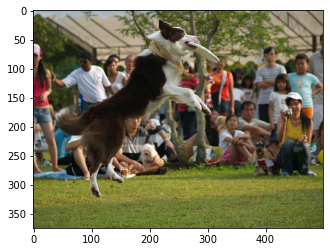

Referance Captions: 
['black white border collie catch frisbee front audience', 'brown white dog catch frisbee mouth front group people', 'brown white dug jumping catch frisbee audience watch', 'dog jump catch frisbee many people watch', 'agile dog catch frisbee crowd onlooker watch closely']
Predicted Caption: 
brown white dog jump


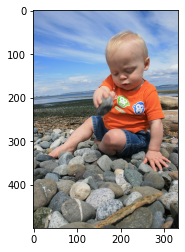

Referance Captions: 
['baby sitting playing smooth rock', 'baby stacking rock beach', 'small boy playing rock', 'toddler sitting pile rock holding rock beach', 'toddler sits pile rock']
Predicted Caption: 
woman picking rock formation


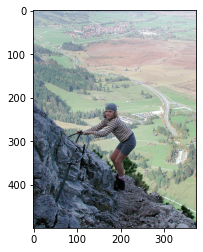

Referance Captions: 
['kid rock climbing backdrop green valley', 'woman striped shirt climb mountain', 'young man climb rocky hill', 'person striped shirt holding rope mountain', 'person striped shirt mountain climbing']
Predicted Caption: 
man stand atop mound


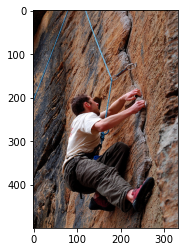

Referance Captions: 
['man climbing rock wall', 'man climbing side cliff', 'man rock climbing', 'man red shoe white shirt grey pant climbing', 'young man white tshirt jean rappeling rock wall']
Predicted Caption: 
man climb rock wall


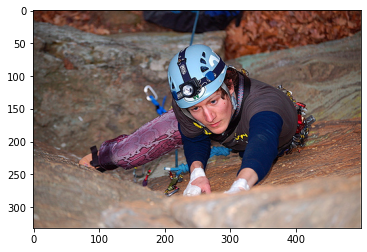

Referance Captions: 
['climber wearing blue helmet headlamp attached rope rock face', 'man climb rocky wall', 'rock climber climb large rock', 'woman purple snakeskin pant climb rock', 'person blue helmet purple pant rock climbing']
Predicted Caption: 
man red shirt climb


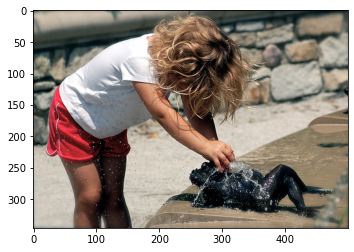

Referance Captions: 
['child playing fountain beach', 'child play fountain', 'girl look fountain spray water', 'little girl playing water frog sculpture', 'little girl playing toy public fountain']
Predicted Caption: 
young girl standing water


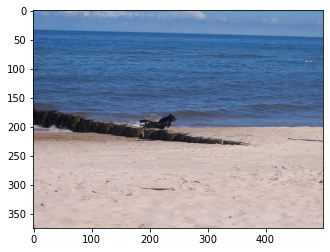

Referance Captions: 
['black dog jumping log along beach', 'black dog run along beach jump wood barrior', 'dog running beach', 'dog jumping small wall beach near water', 'animal running beach']
Predicted Caption: 
dog jump water


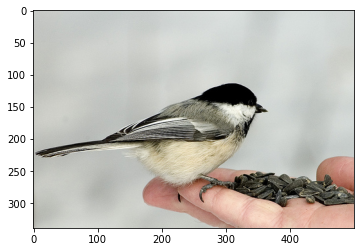

Referance Captions: 
['black white bird eating seed someone hand', 'black white bird standing hand', 'small bird sits person hand eats seed', 'black white bird standing hand someone holding sunflower seed', 'small bird clinging finger hand holding seed']
Predicted Caption: 
black white dog holding


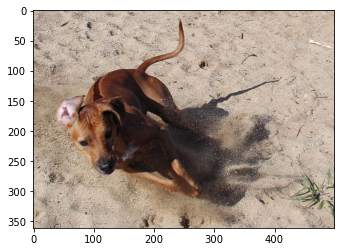

Referance Captions: 
['brown dog running sand', 'brown dog playing sand', 'brown dog play beach', 'dog standing sand', 'dog running fast sand']
Predicted Caption: 
two dog play together


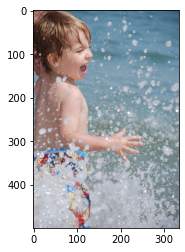

Referance Captions: 
['little boy stand surf', 'small child wade water guided another person', 'young boy laugh splashing ocean', 'young boy wearing colorful bathing suit splashing ocean', 'young child splashing water']
Predicted Caption: 
little boy splashing water


In [ ]:
train_features_ = {k: train_features[k] for k in sorted(train_features.keys())[100:110]}
y_train_ = {k: y_train[k] for k in sorted(y_train.keys())[100:110]}
i=0
for img_id in train_features_:
    i+=1
    img=cv2.imread(img_path + "/" + img_id)
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    photo=train_features_[img_id]
    plt.show()
    reference=[]
    for caps in dict_captions[img_id]:
        reference.append(caps)
    candidate=predict(np.expand_dims(photo, axis = 0))
    print("Referance Captions: ")
    print(reference)
    print("Predicted Caption: ")
    print(candidate)
    if(i==10):
        break
    

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
train_features_

{'1110208841_5bb6806afe.jpg': array([0.0381848 , 0.7720653 , 0.12613182, ..., 0.4594897 , 0.25889897,
        0.01683784], dtype=float32),
 '1112212364_0c48235fc2.jpg': array([0.13925937, 0.08018775, 0.16140851, ..., 0.16849034, 0.02851077,
        0.28478798], dtype=float32),
 '111497985_38e9f88856.jpg': array([0.39245048, 0.45188743, 0.21419431, ..., 0.50192493, 0.04018798,
        0.03863269], dtype=float32),
 '111537217_082a4ba060.jpg': array([0.14022405, 0.22185895, 0.2900049 , ..., 0.03263148, 0.22605911,
        0.0605724 ], dtype=float32),
 '111537222_07e56d5a30.jpg': array([0.44736585, 0.42540187, 0.00423253, ..., 0.0019494 , 1.6306572 ,
        0.23326005], dtype=float32),
 '1115565519_d976d4b1f1.jpg': array([0.32289347, 0.85214853, 0.5467007 , ..., 0.5967851 , 0.76245093,
        0.08103631], dtype=float32),
 '1115679311_245eff2f4b.jpg': array([0.21946114, 0.10361284, 2.7335958 , ..., 0.24289203, 0.09375163,
        0.205069  ], dtype=float32),
 '111766423_4522d36e56.jpg': a

In [ ]:
 
  X1, X2, Y = list(), list(), list()
  n=0
  for img_id in tqdm(y_train_):
    n+=1
    for i in range(5):
        for j in range(1,max_len):
            curr_sequence=y_train_[img_id][i][0:j].tolist()
            next_word= y_train_[img_id][i][j]
            curr_sequence=pad_sequences([curr_sequence], maxlen=max_len, padding='post')[0]
            one_hot_next_word=tf.keras.utils.to_categorical([next_word],vocab)[0]
            X1.append(train_features_[img_id])
            X2.append(curr_sequence)
            Y.append(one_hot_next_word)
    if(n==5):
        n=0

100%|██████████| 500/500 [00:00<00:00, 682.73it/s]


In [ ]:
#model
input_1=Input(shape=(2048,))
dropout_1=Dropout(0.2)(input_1)
dense_1=Dense(256,activation='relu')(dropout_1)

input_2=Input(shape=(22,))
embedding_1=Embedding(vocab,256, trainable = False)(input_2)
dropout_2=Dropout(0.2)(embedding_1)
lstm_1=LSTM(256)(dropout_2)

add_1=add([dense_1,lstm_1])
dense_2=Dense(256,activation='relu')(add_1)
dense_3=Dense(vocab,activation='softmax')(dense_2)

model=Model(inputs=[input_1,input_2],outputs=dense_3)
model.compile(loss='categorical_crossentropy', optimizer='adam',metrics=['accuracy'])
model.summary()



Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Total params: 3,853,016
Trainable params: 2,487,000
Non-trainable params: 1,366,016
__________________________________________________________________________________________________


In [ ]:
def data_generator(descriptions, photos, max_length = 20, num_photos_per_batch = 5):
    X1, X2, y = list(), list(), list()
    n=0
    # loop for ever over images
    while 1:
        for key, desc_list in descriptions.items():
            n+=1
            # retrieve the photo feature
            photo = photos[key]
            for desc in desc_list:
                # encode the sequence
                seq = desc
                # split one sequence into multiple X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pair
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = tf.keras.utils.to_categorical([out_seq], num_classes=vocab_size)[0]
                    # store
                    X1.append(photo)
                    X2.append(in_seq)
                    y.append(out_seq)
            # yield the batch data
            if n==num_photos_per_batch:
                yield ((np.array(X1), np.array(X2)), np.array(y))
                X1, X2, y = list(), list(), list()
                n=0

epochs=50
no_of_photos=5
steps=len(train_encoded_captions)//no_of_photos
for i in range(epochs):
    generator=data_generator(train_encoded_captions,train_features)
    model.fit_generator(generator,epochs=1,steps_per_epoch=steps,verbose=1)


800/800 [==============================] - 94s 117ms/step - loss: 1.0671 - accuracy: 0.7598


In [ ]:
model.save_weights("/Users/hritvikgupta/Desktop/model_resnet_Captioning1.h5")

In [ ]:
model.load_weights("/Users/hritvikgupta/Desktop/model_resnet_Captioning1.h5")

In [ ]:
mode_.fit([np.array(X1),np.array(X2)], np.array(Y), epochs = 20, batch_size = 256)

Epoch 1/20
206/206 [==============================] - 12s 53ms/step - loss: 0.4476 - accuracy: 0.8351
Epoch 2/20
206/206 [==============================] - 11s 52ms/step - loss: 0.4126 - accuracy: 0.8450
Epoch 3/20
206/206 [==============================] - 11s 52ms/step - loss: 0.4007 - accuracy: 0.8488
Epoch 4/20
206/206 [==============================] - 11s 53ms/step - loss: 0.3915 - accuracy: 0.8521
Epoch 5/20
206/206 [==============================] - 11s 54ms/step - loss: 0.3885 - accuracy: 0.8525
Epoch 6/20
206/206 [==============================] - 11s 52ms/step - loss: 0.3859 - accuracy: 0.8535
Epoch 7/20
206/206 [==============================] - 11s 52ms/step - loss: 0.3786 - accuracy: 0.8570
Epoch 8/20
206/206 [==============================] - 10s 49ms/step - loss: 0.3761 - accuracy: 0.8580
Epoch 9/20
206/206 [==============================] - 10s 49ms/step - loss: 0.3730 - accuracy: 0.8586
Epoch 10/20
206/206 [==============================] - 10s 50ms/step - loss: 0.371

In [ ]:
len(y_train_), len(train_features_), max_len
#def greedy_search(photo):
#  photo=photo.reshape(1,2048)
#  in_text='Start'
#  for i in range(5):
#    sequence = [words_to_indices[s] for s in in_text.split(" ") if s in words_to_indices]
#    sequence = pad_sequences([sequence], maxlen=2, padding='post')
#    y_pred = mode_.predict([photo,sequence],verbose=0)
#    y_pred = np.argmax(y_pred[0])
#    word = indices_to_words[y_pred]
#    in_text += ' ' + word
#    if word == 'END':
#      break
#  final = in_text.split()
#  final = final[1:-1]
#  #final = " ".join(final)
#  return final,YHAT

#greedySearch(np.expand_dims(train_features[cap_keys[8000]], axis=0))

(500, 500, 22)

In [ ]:
  X1, X2, Y = list(), list(), list()
  n=0
  for img_id in tqdm(y_train_):
    n+=1
    for i in range(5):
        for j in range(1,max_len):
            curr_sequence=y_train_[img_id][i][0:j].tolist()
            next_word= y_train_[img_id][i][j]
            curr_sequence=pad_sequences([curr_sequence], maxlen=max_len, padding='post')[0]
            one_hot_next_word=tf.keras.utils.to_categorical([next_word],vocab)[0]
            X1.append(train_features_[img_id])
            X2.append(curr_sequence)
            Y.append(one_hot_next_word)
    if(n==5):
        n=0









  0%|          | 0/500 [00:00<?, ?it/s]







 11%|█         | 53/500 [00:00<00:00, 522.85it/s]







 23%|██▎       | 116/500 [00:00<00:00, 582.46it/s]







 35%|███▌      | 175/500 [00:00<00:00, 510.90it/s]







 47%|████▋     | 235/500 [00:00<00:00, 541.09it/s]







 60%|██████    | 302/500 [00:00<00:00, 582.62it/s]







 72%|███████▏  | 362/500 [00:00<00:00, 576.25it/s]







 84%|████████▍ | 421/500 [00:00<00:00, 568.72it/s]







100%|██████████| 500/500 [00:00<00:00, 565.62it/s]
